In [1]:
!pip install -r ../../requirements.txt

You should consider upgrading via the 'c:\users\falchetto\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


# Configuration

In [2]:
ROOT_DIR = "../../"
DATA_DIR = ROOT_DIR + "data/"

DATASET_2016_10a_FILENAME = DATA_DIR + "RML2016.10a_dict.pkl"

NN_NAME = 'FreeHandV3'

DEFAULT_CONFIG_FILENAME = ROOT_DIR + "default.ini"

In [3]:
import configparser

config = configparser.ConfigParser()
config.read(DEFAULT_CONFIG_FILENAME)

NEURAL_NETWORK_NAME = config.get('NeuralNetworkNames', NN_NAME)
NEURAL_NETWORK_FILENAME = NEURAL_NETWORK_NAME + '.wts.h5'

TRAINING_SET_DIMENSION = config.getfloat('TrainingValues', 'TrainingSetSplitPercentage')
DROPOUT_RATE = config.getfloat('TrainingValues', 'DropoutRate')

# Set up some params 
NB_EPOCH = config.getint('TrainingValues', 'Epochs') # number of epochs to train on
BATCH_SIZE = config.getint('TrainingValues', 'BatchSize') # training batch size

# Imports

In [4]:
import sys
sys.path.append(ROOT_DIR)

import neural_networks
import datasetlib
import traintestsplitlib
import trainlib
import evaluationlib
import dataaugmentationlib

import math

# Dataset

## Dataset in a pandas Dataframe

In [5]:
dataset_df = datasetlib.load_dataset_dataframe(DATASET_2016_10a_FILENAME)

## Raw dataset

In [6]:
dataset_df

,IQ signals,Modulation_Label,SNR
0,"[[-0.0059014712, -0.0023458179, -0.00074506126...",QPSK,2
1,"[[0.0050326153, 0.00094379985, -0.0018932355, ...",QPSK,2
2,"[[0.0052390713, 0.0073890695, 0.007276459, 0.0...",QPSK,2
3,"[[-0.0019859935, -0.0071501383, -0.00527185, -...",QPSK,2
4,"[[0.006674405, 0.0028359746, 0.005630027, 0.00...",QPSK,2
...,...,...,...
219995,"[[0.0062732296, -0.0050519477, 0.006672171, 0....",BPSK,-18
219996,"[[-0.003903181, -0.0015884301, -0.00633375, 2....",BPSK,-18
219997,"[[-0.0105958255, 0.005601244, -0.012161784, 0....",BPSK,-18
219998,"[[-0.002136606, 0.00995837, 0.0059440527, -0.0...",BPSK,-18


# Neural network

## Configuration

In [7]:
config = configparser.ConfigParser()
config.read(DEFAULT_CONFIG_FILENAME)

NEURAL_NETWORK_NAME = config.get('NeuralNetworkNames', NN_NAME)
NEURAL_NETWORK_FILENAME = NEURAL_NETWORK_NAME + '.wts.h5'

TRAINING_SET_DIMENSION = config.getfloat('TrainingValues', 'TrainingSetSplitPercentage')
DROPOUT_RATE = config.getfloat('TrainingValues', 'DropoutRate')

# Set up some params 
NB_EPOCH = config.getint('TrainingValues', 'Epochs') # number of epochs to train on
BATCH_SIZE = config.getint('TrainingValues', 'BatchSize') # training batch size

## Data prepare

In [8]:
signals = datasetlib.signals(dataset_df)
labels = datasetlib.labels(dataset_df)

# [QPSQ, BPSK, ...]
mods = datasetlib.mods(dataset_df)
# [-18, -16, ...]
snrs = datasetlib.unique_snrs(dataset_df)

### Training and Test data partitioning

In [9]:
n_elements = len(signals)
training_set_percentage = TRAINING_SET_DIMENSION

train_index, test_index = traintestsplitlib.train_test_random_indexes(n_elements, training_set_percentage)

X_train, X_test, Y_train, Y_test = traintestsplitlib.split_x_y_train_test(signals, labels, mods, train_index, test_index)

X_train, Y_train = dataaugmentationlib.horizontal_and_vertical_flip_and_concatenate_with_signals(X_train, Y_train)

## Build the Neural Network

In [10]:
in_shp = list(X_train.shape[1:])
print(X_train.shape)
print(in_shp)
classes = mods

(495000, 2, 128)
[2, 128]


In [11]:
model = neural_networks.freehand_v3(in_shp)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 2, 128)]          0         
_________________________________________________________________
reshape (Reshape)            (None, 2, 128, 1)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 2, 128, 1)         4         
_________________________________________________________________
conv2d (Conv2D)              (None, 2, 128, 16)        272       
_________________________________________________________________
batch_normalization_1 (Batch (None, 2, 128, 16)        64        
_________________________________________________________________
dense (Dense)                (None, 2, 128, 256)       4352      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 2, 128, 32)        32800 

### Train the model

In [12]:
# perform training ...
#   - call the main training loop in keras for our network+dataset
filepath = NEURAL_NETWORK_FILENAME

history, model = trainlib.train(filepath, model, X_train, Y_train, X_test, Y_test, BATCH_SIZE, NB_EPOCH)

Epoch 1/100


  1/436 [..............................] - ETA: 1:46:46 - loss: 2.8607

  2/436 [..............................] - ETA: 29s - loss: 2.8248    

  3/436 [..............................] - ETA: 29s - loss: 2.7938

  4/436 [..............................] - ETA: 29s - loss: 2.7716



  5/436 [..............................] - ETA: 29s - loss: 2.7521

  6/436 [..............................] - ETA: 29s - loss: 2.7352

  7/436 [..............................] - ETA: 29s - loss: 2.7189

  8/436 [..............................] - ETA: 29s - loss: 2.7024

  9/436 [..............................] - ETA: 29s - loss: 2.6873

 10/436 [..............................] - ETA: 29s - loss: 2.6726

 11/436 [..............................] - ETA: 29s - loss: 2.6586

 12/436 [..............................] - ETA: 29s - loss: 2.6449

 13/436 [..............................] - ETA: 28s - loss: 2.6318



 14/436 [..............................] - ETA: 28s - loss: 2.6192

 15/436 [>.............................] - ETA: 28s - loss: 2.6072

 16/436 [>.............................] - ETA: 28s - loss: 2.5956

 17/436 [>.............................] - ETA: 28s - loss: 2.5844

 18/436 [>.............................] - ETA: 28s - loss: 2.5735

 19/436 [>.............................] - ETA: 28s - loss: 2.5630

 20/436 [>.............................] - ETA: 28s - loss: 2.5530

 21/436 [>.............................] - ETA: 28s - loss: 2.5433

 22/436 [>.............................] - ETA: 28s - loss: 2.5339

 23/436 [>.............................] - ETA: 28s - loss: 2.5246

 24/436 [>.............................] - ETA: 28s - loss: 2.5156

 25/436 [>.............................] - ETA: 28s - loss: 2.5068

 26/436 [>.............................] - ETA: 27s - loss: 2.4981

 27/436 [>.............................] - ETA: 27s - loss: 2.4897

 28/436 [>.............................] - ETA: 27s - loss: 2.4814

 29/436 [>.............................] - ETA: 27s - loss: 2.4732

 30/436 [=>............................] - ETA: 27s - loss: 2.4652

 31/436 [=>............................] - ETA: 27s - loss: 2.4574

 32/436 [=>............................] - ETA: 27s - loss: 2.4497

 33/436 [=>............................] - ETA: 27s - loss: 2.4421

 34/436 [=>............................] - ETA: 27s - loss: 2.4348

 35/436 [=>............................] - ETA: 27s - loss: 2.4276

 36/436 [=>............................] - ETA: 27s - loss: 2.4205



 37/436 [=>............................] - ETA: 27s - loss: 2.4135

 38/436 [=>............................] - ETA: 27s - loss: 2.4067

 39/436 [=>............................] - ETA: 27s - loss: 2.3999

 40/436 [=>............................] - ETA: 27s - loss: 2.3933

 41/436 [=>............................] - ETA: 26s - loss: 2.3867

 42/436 [=>............................] - ETA: 26s - loss: 2.3802

 43/436 [=>............................] - ETA: 26s - loss: 2.3738

 44/436 [==>...........................] - ETA: 26s - loss: 2.3675

 45/436 [==>...........................] - ETA: 26s - loss: 2.3613

 46/436 [==>...........................] - ETA: 26s - loss: 2.3551



 47/436 [==>...........................] - ETA: 26s - loss: 2.3491

 48/436 [==>...........................] - ETA: 26s - loss: 2.3431

 49/436 [==>...........................] - ETA: 26s - loss: 2.3373

 50/436 [==>...........................] - ETA: 26s - loss: 2.3314

 51/436 [==>...........................] - ETA: 26s - loss: 2.3257

 52/436 [==>...........................] - ETA: 26s - loss: 2.3201

 53/436 [==>...........................] - ETA: 26s - loss: 2.3145

 54/436 [==>...........................] - ETA: 26s - loss: 2.3090

 55/436 [==>...........................] - ETA: 26s - loss: 2.3035

 56/436 [==>...........................] - ETA: 25s - loss: 2.2982

 57/436 [==>...........................] - ETA: 25s - loss: 2.2929

 58/436 [==>...........................] - ETA: 25s - loss: 2.2876

 59/436 [===>..........................] - ETA: 25s - loss: 2.2824

 60/436 [===>..........................] - ETA: 25s - loss: 2.2773

 61/436 [===>..........................] - ETA: 25s - loss: 2.2722

 62/436 [===>..........................] - ETA: 25s - loss: 2.2672

 63/436 [===>..........................] - ETA: 25s - loss: 2.2623

 64/436 [===>..........................] - ETA: 25s - loss: 2.2574

 65/436 [===>..........................] - ETA: 25s - loss: 2.2525

 66/436 [===>..........................] - ETA: 25s - loss: 2.2477

 67/436 [===>..........................] - ETA: 25s - loss: 2.2430

 68/436 [===>..........................] - ETA: 25s - loss: 2.2383

 69/436 [===>..........................] - ETA: 25s - loss: 2.2337



 70/436 [===>..........................] - ETA: 24s - loss: 2.2291

 71/436 [===>..........................] - ETA: 24s - loss: 2.2246

 72/436 [===>..........................] - ETA: 24s - loss: 2.2201

 73/436 [====>.........................] - ETA: 24s - loss: 2.2157

 74/436 [====>.........................] - ETA: 24s - loss: 2.2113

 75/436 [====>.........................] - ETA: 24s - loss: 2.2070

 76/436 [====>.........................] - ETA: 24s - loss: 2.2027

 77/436 [====>.........................] - ETA: 24s - loss: 2.1985

 78/436 [====>.........................] - ETA: 24s - loss: 2.1943

 79/436 [====>.........................] - ETA: 24s - loss: 2.1902

 80/436 [====>.........................] - ETA: 24s - loss: 2.1861

 81/436 [====>.........................] - ETA: 24s - loss: 2.1820

 82/436 [====>.........................] - ETA: 24s - loss: 2.1780

 83/436 [====>.........................] - ETA: 24s - loss: 2.1741

 84/436 [====>.........................] - ETA: 24s - loss: 2.1702

 85/436 [====>.........................] - ETA: 23s - loss: 2.1663

 86/436 [====>.........................] - ETA: 23s - loss: 2.1625

 87/436 [====>.........................] - ETA: 23s - loss: 2.1587



 88/436 [=====>........................] - ETA: 23s - loss: 2.1549

 89/436 [=====>........................] - ETA: 23s - loss: 2.1512

 90/436 [=====>........................] - ETA: 23s - loss: 2.1476

 91/436 [=====>........................] - ETA: 23s - loss: 2.1439

 92/436 [=====>........................] - ETA: 23s - loss: 2.1403

 93/436 [=====>........................] - ETA: 23s - loss: 2.1368

 94/436 [=====>........................] - ETA: 23s - loss: 2.1333

 95/436 [=====>........................] - ETA: 23s - loss: 2.1298

 96/436 [=====>........................] - ETA: 23s - loss: 2.1264

 97/436 [=====>........................] - ETA: 23s - loss: 2.1230

 98/436 [=====>........................] - ETA: 23s - loss: 2.1196

 99/436 [=====>........................] - ETA: 23s - loss: 2.1163

100/436 [=====>........................] - ETA: 23s - loss: 2.1130

101/436 [=====>........................] - ETA: 23s - loss: 2.1098

102/436 [======>.......................] - ETA: 22s - loss: 2.1065

103/436 [======>.......................] - ETA: 22s - loss: 2.1033

104/436 [======>.......................] - ETA: 22s - loss: 2.1002

105/436 [======>.......................] - ETA: 22s - loss: 2.0970

106/436 [======>.......................] - ETA: 22s - loss: 2.0939

107/436 [======>.......................] - ETA: 22s - loss: 2.0908

108/436 [======>.......................] - ETA: 22s - loss: 2.0878

109/436 [======>.......................] - ETA: 22s - loss: 2.0848

110/436 [======>.......................] - ETA: 22s - loss: 2.0818

111/436 [======>.......................] - ETA: 22s - loss: 2.0788

112/436 [======>.......................] - ETA: 22s - loss: 2.0759

113/436 [======>.......................] - ETA: 22s - loss: 2.0730

114/436 [======>.......................] - ETA: 22s - loss: 2.0701

115/436 [======>.......................] - ETA: 22s - loss: 2.0673

116/436 [======>.......................] - ETA: 22s - loss: 2.0645

117/436 [=======>......................] - ETA: 22s - loss: 2.0617

118/436 [=======>......................] - ETA: 21s - loss: 2.0589

119/436 [=======>......................] - ETA: 21s - loss: 2.0562

120/436 [=======>......................] - ETA: 21s - loss: 2.0534

121/436 [=======>......................] - ETA: 21s - loss: 2.0508

122/436 [=======>......................] - ETA: 21s - loss: 2.0481

123/436 [=======>......................] - ETA: 21s - loss: 2.0454

124/436 [=======>......................] - ETA: 21s - loss: 2.0428

125/436 [=======>......................] - ETA: 21s - loss: 2.0402

126/436 [=======>......................] - ETA: 21s - loss: 2.0376

127/436 [=======>......................] - ETA: 21s - loss: 2.0350

128/436 [=======>......................] - ETA: 21s - loss: 2.0325

129/436 [=======>......................] - ETA: 21s - loss: 2.0300

130/436 [=======>......................] - ETA: 21s - loss: 2.0275

131/436 [========>.....................] - ETA: 21s - loss: 2.0250

132/436 [========>.....................] - ETA: 21s - loss: 2.0225

133/436 [========>.....................] - ETA: 20s - loss: 2.0200

134/436 [========>.....................] - ETA: 20s - loss: 2.0176

135/436 [========>.....................] - ETA: 20s - loss: 2.0152

136/436 [========>.....................] - ETA: 20s - loss: 2.0128

137/436 [========>.....................] - ETA: 20s - loss: 2.0105

138/436 [========>.....................] - ETA: 20s - loss: 2.0081

139/436 [========>.....................] - ETA: 20s - loss: 2.0058

140/436 [========>.....................] - ETA: 20s - loss: 2.0035

141/436 [========>.....................] - ETA: 20s - loss: 2.0012

142/436 [========>.....................] - ETA: 20s - loss: 1.9989

143/436 [========>.....................] - ETA: 20s - loss: 1.9966

144/436 [========>.....................] - ETA: 20s - loss: 1.9944

145/436 [========>.....................] - ETA: 20s - loss: 1.9922

146/436 [=========>....................] - ETA: 20s - loss: 1.9900

147/436 [=========>....................] - ETA: 19s - loss: 1.9878



148/436 [=========>....................] - ETA: 19s - loss: 1.9856



149/436 [=========>....................] - ETA: 19s - loss: 1.9835

150/436 [=========>....................] - ETA: 19s - loss: 1.9813

151/436 [=========>....................] - ETA: 19s - loss: 1.9792

152/436 [=========>....................] - ETA: 19s - loss: 1.9771

153/436 [=========>....................] - ETA: 19s - loss: 1.9750



154/436 [=========>....................] - ETA: 19s - loss: 1.9729



155/436 [=========>....................] - ETA: 19s - loss: 1.9709

156/436 [=========>....................] - ETA: 19s - loss: 1.9688

157/436 [=========>....................] - ETA: 19s - loss: 1.9668

158/436 [=========>....................] - ETA: 19s - loss: 1.9648

159/436 [=========>....................] - ETA: 19s - loss: 1.9628

160/436 [==========>...................] - ETA: 19s - loss: 1.9608

161/436 [==========>...................] - ETA: 18s - loss: 1.9588

162/436 [==========>...................] - ETA: 18s - loss: 1.9569

163/436 [==========>...................] - ETA: 18s - loss: 1.9549

164/436 [==========>...................] - ETA: 18s - loss: 1.9530

165/436 [==========>...................] - ETA: 18s - loss: 1.9511

166/436 [==========>...................] - ETA: 18s - loss: 1.9492

167/436 [==========>...................] - ETA: 18s - loss: 1.9473

168/436 [==========>...................] - ETA: 18s - loss: 1.9454

169/436 [==========>...................] - ETA: 18s - loss: 1.9435

170/436 [==========>...................] - ETA: 18s - loss: 1.9417

171/436 [==========>...................] - ETA: 18s - loss: 1.9399

172/436 [==========>...................] - ETA: 18s - loss: 1.9380

173/436 [==========>...................] - ETA: 18s - loss: 1.9362



174/436 [==========>...................] - ETA: 18s - loss: 1.9344

175/436 [===========>..................] - ETA: 17s - loss: 1.9326

176/436 [===========>..................] - ETA: 17s - loss: 1.9308

177/436 [===========>..................] - ETA: 17s - loss: 1.9291

178/436 [===========>..................] - ETA: 17s - loss: 1.9273

179/436 [===========>..................] - ETA: 17s - loss: 1.9256

180/436 [===========>..................] - ETA: 17s - loss: 1.9238

181/436 [===========>..................] - ETA: 17s - loss: 1.9221

182/436 [===========>..................] - ETA: 17s - loss: 1.9204

183/436 [===========>..................] - ETA: 17s - loss: 1.9187

184/436 [===========>..................] - ETA: 17s - loss: 1.9170



185/436 [===========>..................] - ETA: 17s - loss: 1.9153



186/436 [===========>..................] - ETA: 17s - loss: 1.9137

187/436 [===========>..................] - ETA: 17s - loss: 1.9120

188/436 [===========>..................] - ETA: 17s - loss: 1.9104



189/436 [============>.................] - ETA: 17s - loss: 1.9088

190/436 [============>.................] - ETA: 16s - loss: 1.9071

191/436 [============>.................] - ETA: 16s - loss: 1.9055



192/436 [============>.................] - ETA: 16s - loss: 1.9039

193/436 [============>.................] - ETA: 16s - loss: 1.9023

194/436 [============>.................] - ETA: 16s - loss: 1.9007

195/436 [============>.................] - ETA: 16s - loss: 1.8991

196/436 [============>.................] - ETA: 16s - loss: 1.8976

197/436 [============>.................] - ETA: 16s - loss: 1.8960

198/436 [============>.................] - ETA: 16s - loss: 1.8945

199/436 [============>.................] - ETA: 16s - loss: 1.8929

200/436 [============>.................] - ETA: 16s - loss: 1.8914

201/436 [============>.................] - ETA: 16s - loss: 1.8899

202/436 [============>.................] - ETA: 16s - loss: 1.8884

203/436 [============>.................] - ETA: 16s - loss: 1.8869

204/436 [=============>................] - ETA: 15s - loss: 1.8854

205/436 [=============>................] - ETA: 15s - loss: 1.8839

206/436 [=============>................] - ETA: 15s - loss: 1.8824

207/436 [=============>................] - ETA: 15s - loss: 1.8809

208/436 [=============>................] - ETA: 15s - loss: 1.8795

209/436 [=============>................] - ETA: 15s - loss: 1.8780

210/436 [=============>................] - ETA: 15s - loss: 1.8766

211/436 [=============>................] - ETA: 15s - loss: 1.8751

212/436 [=============>................] - ETA: 15s - loss: 1.8737

213/436 [=============>................] - ETA: 15s - loss: 1.8723

214/436 [=============>................] - ETA: 15s - loss: 1.8709

215/436 [=============>................] - ETA: 15s - loss: 1.8695

216/436 [=============>................] - ETA: 15s - loss: 1.8681

217/436 [=============>................] - ETA: 15s - loss: 1.8667

218/436 [==============>...............] - ETA: 15s - loss: 1.8653

219/436 [==============>...............] - ETA: 14s - loss: 1.8639

220/436 [==============>...............] - ETA: 14s - loss: 1.8626

221/436 [==============>...............] - ETA: 14s - loss: 1.8612

222/436 [==============>...............] - ETA: 14s - loss: 1.8599

223/436 [==============>...............] - ETA: 14s - loss: 1.8585

224/436 [==============>...............] - ETA: 14s - loss: 1.8572

225/436 [==============>...............] - ETA: 14s - loss: 1.8559

226/436 [==============>...............] - ETA: 14s - loss: 1.8546

227/436 [==============>...............] - ETA: 14s - loss: 1.8532

228/436 [==============>...............] - ETA: 14s - loss: 1.8519

229/436 [==============>...............] - ETA: 14s - loss: 1.8507

230/436 [==============>...............] - ETA: 14s - loss: 1.8494

231/436 [==============>...............] - ETA: 14s - loss: 1.8481

232/436 [==============>...............] - ETA: 14s - loss: 1.8468

233/436 [===============>..............] - ETA: 13s - loss: 1.8455

234/436 [===============>..............] - ETA: 13s - loss: 1.8443

235/436 [===============>..............] - ETA: 13s - loss: 1.8430

236/436 [===============>..............] - ETA: 13s - loss: 1.8418

237/436 [===============>..............] - ETA: 13s - loss: 1.8405

238/436 [===============>..............] - ETA: 13s - loss: 1.8393

239/436 [===============>..............] - ETA: 13s - loss: 1.8381

240/436 [===============>..............] - ETA: 13s - loss: 1.8369

241/436 [===============>..............] - ETA: 13s - loss: 1.8357

242/436 [===============>..............] - ETA: 13s - loss: 1.8344

243/436 [===============>..............] - ETA: 13s - loss: 1.8332



244/436 [===============>..............] - ETA: 13s - loss: 1.8321

245/436 [===============>..............] - ETA: 13s - loss: 1.8309

246/436 [===============>..............] - ETA: 13s - loss: 1.8297

247/436 [===============>..............] - ETA: 12s - loss: 1.8285

248/436 [================>.............] - ETA: 12s - loss: 1.8273

249/436 [================>.............] - ETA: 12s - loss: 1.8262

250/436 [================>.............] - ETA: 12s - loss: 1.8250

251/436 [================>.............] - ETA: 12s - loss: 1.8239

252/436 [================>.............] - ETA: 12s - loss: 1.8227

253/436 [================>.............] - ETA: 12s - loss: 1.8216

254/436 [================>.............] - ETA: 12s - loss: 1.8204

255/436 [================>.............] - ETA: 12s - loss: 1.8193



256/436 [================>.............] - ETA: 12s - loss: 1.8182

257/436 [================>.............] - ETA: 12s - loss: 1.8170

258/436 [================>.............] - ETA: 12s - loss: 1.8159

259/436 [================>.............] - ETA: 12s - loss: 1.8148

260/436 [================>.............] - ETA: 12s - loss: 1.8137

261/436 [================>.............] - ETA: 12s - loss: 1.8126

262/436 [=================>............] - ETA: 11s - loss: 1.8115

263/436 [=================>............] - ETA: 11s - loss: 1.8104

264/436 [=================>............] - ETA: 11s - loss: 1.8093

265/436 [=================>............] - ETA: 11s - loss: 1.8082

266/436 [=================>............] - ETA: 11s - loss: 1.8072

267/436 [=================>............] - ETA: 11s - loss: 1.8061

268/436 [=================>............] - ETA: 11s - loss: 1.8050

269/436 [=================>............] - ETA: 11s - loss: 1.8040



270/436 [=================>............] - ETA: 11s - loss: 1.8029

271/436 [=================>............] - ETA: 11s - loss: 1.8018

272/436 [=================>............] - ETA: 11s - loss: 1.8008

273/436 [=================>............] - ETA: 11s - loss: 1.7998

274/436 [=================>............] - ETA: 11s - loss: 1.7987

275/436 [=================>............] - ETA: 11s - loss: 1.7977

276/436 [=================>............] - ETA: 11s - loss: 1.7967

277/436 [==================>...........] - ETA: 10s - loss: 1.7956

278/436 [==================>...........] - ETA: 10s - loss: 1.7946

279/436 [==================>...........] - ETA: 10s - loss: 1.7936

280/436 [==================>...........] - ETA: 10s - loss: 1.7926

281/436 [==================>...........] - ETA: 10s - loss: 1.7916

282/436 [==================>...........] - ETA: 10s - loss: 1.7906

283/436 [==================>...........] - ETA: 10s - loss: 1.7896

284/436 [==================>...........] - ETA: 10s - loss: 1.7886

285/436 [==================>...........] - ETA: 10s - loss: 1.7876

286/436 [==================>...........] - ETA: 10s - loss: 1.7867

287/436 [==================>...........] - ETA: 10s - loss: 1.7857

288/436 [==================>...........] - ETA: 10s - loss: 1.7847

289/436 [==================>...........] - ETA: 10s - loss: 1.7838

290/436 [==================>...........] - ETA: 10s - loss: 1.7828

291/436 [===================>..........] - ETA: 9s - loss: 1.7818 

292/436 [===================>..........] - ETA: 9s - loss: 1.7809

293/436 [===================>..........] - ETA: 9s - loss: 1.7799

294/436 [===================>..........] - ETA: 9s - loss: 1.7790

295/436 [===================>..........] - ETA: 9s - loss: 1.7780

296/436 [===================>..........] - ETA: 9s - loss: 1.7771

297/436 [===================>..........] - ETA: 9s - loss: 1.7762

298/436 [===================>..........] - ETA: 9s - loss: 1.7752

299/436 [===================>..........] - ETA: 9s - loss: 1.7743

300/436 [===================>..........] - ETA: 9s - loss: 1.7734

301/436 [===================>..........] - ETA: 9s - loss: 1.7725

302/436 [===================>..........] - ETA: 9s - loss: 1.7716

303/436 [===================>..........] - ETA: 9s - loss: 1.7707

304/436 [===================>..........] - ETA: 9s - loss: 1.7697

305/436 [===================>..........] - ETA: 9s - loss: 1.7688

306/436 [====================>.........] - ETA: 8s - loss: 1.7679

307/436 [====================>.........] - ETA: 8s - loss: 1.7670

308/436 [====================>.........] - ETA: 8s - loss: 1.7662

309/436 [====================>.........] - ETA: 8s - loss: 1.7653

310/436 [====================>.........] - ETA: 8s - loss: 1.7644

311/436 [====================>.........] - ETA: 8s - loss: 1.7635

312/436 [====================>.........] - ETA: 8s - loss: 1.7626

313/436 [====================>.........] - ETA: 8s - loss: 1.7617

314/436 [====================>.........] - ETA: 8s - loss: 1.7609

315/436 [====================>.........] - ETA: 8s - loss: 1.7600

316/436 [====================>.........] - ETA: 8s - loss: 1.7591

317/436 [====================>.........] - ETA: 8s - loss: 1.7583

318/436 [====================>.........] - ETA: 8s - loss: 1.7574

319/436 [====================>.........] - ETA: 8s - loss: 1.7566

320/436 [=====================>........] - ETA: 7s - loss: 1.7557

321/436 [=====================>........] - ETA: 7s - loss: 1.7549

322/436 [=====================>........] - ETA: 7s - loss: 1.7540

323/436 [=====================>........] - ETA: 7s - loss: 1.7532

324/436 [=====================>........] - ETA: 7s - loss: 1.7523

325/436 [=====================>........] - ETA: 7s - loss: 1.7515

326/436 [=====================>........] - ETA: 7s - loss: 1.7507

327/436 [=====================>........] - ETA: 7s - loss: 1.7499

328/436 [=====================>........] - ETA: 7s - loss: 1.7490

329/436 [=====================>........] - ETA: 7s - loss: 1.7482

330/436 [=====================>........] - ETA: 7s - loss: 1.7474

331/436 [=====================>........] - ETA: 7s - loss: 1.7466

332/436 [=====================>........] - ETA: 7s - loss: 1.7458

333/436 [=====================>........] - ETA: 7s - loss: 1.7450

334/436 [=====================>........] - ETA: 7s - loss: 1.7442

335/436 [======================>.......] - ETA: 6s - loss: 1.7434

336/436 [======================>.......] - ETA: 6s - loss: 1.7426

337/436 [======================>.......] - ETA: 6s - loss: 1.7418

338/436 [======================>.......] - ETA: 6s - loss: 1.7410

339/436 [======================>.......] - ETA: 6s - loss: 1.7402

340/436 [======================>.......] - ETA: 6s - loss: 1.7394

341/436 [======================>.......]

 - ETA: 6s - loss: 1.7386

342/436 [======================>.......] - ETA: 6s - loss: 1.7378

343/436 [======================>.......] - ETA: 6s - loss: 1.7371

344/436 [======================>.......] - ETA: 6s - loss: 1.7363

345/436 [======================>.......] - ETA: 6s - loss: 1.7355

346/436 [======================>.......] - ETA: 6s - loss: 1.7347

347/436 [======================>.......] - ETA: 6s - loss: 1.7340

348/436 [======================>.......] - ETA: 6s - loss: 1.7332

349/436 [=======================>......] - ETA: 5s - loss: 1.7325

350/436 [=======================>......] - ETA: 5s - loss: 1.7317

351/436 [=======================>......] - ETA: 5s - loss: 1.7309

352/436 [=======================>......] - ETA: 5s - loss: 1.7302



353/436 [=======================>......] - ETA: 5s - loss: 1.7294

354/436 [=======================>......] - ETA: 5s - loss: 1.7287

355/436 [=======================>......] - ETA: 5s - loss: 1.7280

356/436 [=======================>......] - ETA: 5s - loss: 1.7272

357/436 [=======================>......] - ETA: 5s - loss: 1.7265

358/436 [=======================>......] - ETA: 5s - loss: 1.7257

359/436 [=======================>......] - ETA: 5s - loss: 1.7250

360/436 [=======================>......] - ETA: 5s - loss: 1.7243

361/436 [=======================>......] - ETA: 5s - loss: 1.7236

362/436 [=======================>......] - ETA: 5s - loss: 1.7228

363/436 [=======================>......] - ETA: 5s - loss: 1.7221

364/436 [========================>.....] - ETA: 4s - loss: 1.7214

365/436 [========================>.....] - ETA: 4s - loss: 1.7207



366/436 [========================>.....] - ETA: 4s - loss: 1.7200

367/436 [========================>.....] - ETA: 4s - loss: 1.7193

368/436 [========================>.....] - ETA: 4s - loss: 1.7185

369/436 [========================>.....] - ETA: 4s - loss: 1.7178

370/436 [========================>.....] - ETA: 4s - loss: 1.7171

371/436 [========================>.....] - ETA: 4s - loss: 1.7164

372/436 [========================>.....] - ETA: 4s - loss: 1.7157

373/436 [========================>.....] - ETA: 4s - loss: 1.7150

374/436 [========================>.....] - ETA: 4s - loss: 1.7143

375/436 [========================>.....] - ETA: 4s - loss: 1.7137

376/436 [========================>.....] - ETA: 4s - loss: 1.7130

377/436 [========================>.....] - ETA: 4s - loss: 1.7123

378/436 [=========================>....] - ETA: 4s - loss: 1.7116

379/436 [=========================>....] - ETA: 3s - loss: 1.7109

380/436 [=========================>....] - ETA: 3s - loss: 1.7102

381/436 [=========================>....] - ETA: 3s - loss: 1.7096

382/436 [=========================>....] - ETA: 3s - loss: 1.7089

383/436 [=========================>....] - ETA: 3s - loss: 1.7082

384/436 [=========================>....] - ETA: 3s - loss: 1.7075

385/436 [=========================>....] - ETA: 3s - loss: 1.7069

386/436 [=========================>....] - ETA: 3s - loss: 1.7062

387/436 [=========================>....] - ETA: 3s - loss: 1.7055

388/436 [=========================>....] - ETA: 3s - loss: 1.7049

389/436 [=========================>....] - ETA: 3s - loss: 1.7042

390/436 [=========================>....] - ETA: 3s - loss: 1.7036

391/436 [=========================>....] - ETA: 3s - loss: 1.7029

392/436 [=========================>....] - ETA: 3s - loss: 1.7023

393/436 [==========================>...] - ETA: 2s - loss: 1.7016

394/436 [==========================>...] - ETA: 2s - loss: 1.7010

395/436 [==========================>...] - ETA: 2s - loss: 1.7003

396/436 [==========================>...] - ETA: 2s - loss: 1.6997

397/436 [==========================>...] - ETA: 2s - loss: 1.6990

398/436 [==========================>...] - ETA: 2s - loss: 1.6984



399/436 [==========================>...] - ETA: 2s - loss: 1.6978

400/436 [==========================>...] - ETA: 2s - loss: 1.6971

401/436 [==========================>...] - ETA: 2s - loss: 1.6965

402/436 [==========================>...] - ETA: 2s - loss: 1.6959

403/436 [==========================>...] - ETA: 2s - loss: 1.6952

404/436 [==========================>...] - ETA: 2s - loss: 1.6946

405/436 [==========================>...] - ETA: 2s - loss: 1.6940

406/436 [==========================>...] - ETA: 2s - loss: 1.6934

407/436 [===========================>..] - ETA: 1s - loss: 1.6927

408/436 [===========================>..] - ETA: 1s - loss: 1.6921

409/436 [===========================>..] - ETA: 1s - loss: 1.6915

410/436 [===========================>..] - ETA: 1s - loss: 1.6909

411/436 [===========================>..] - ETA: 1s - loss: 1.6903

412/436 [===========================>..] - ETA: 1s - loss: 1.6897

413/436 [===========================>..] - ETA: 1s - loss: 1.6891

414/436 [===========================>..] - ETA: 1s - loss: 1.6885

415/436 [===========================>..] - ETA: 1s - loss: 1.6878

416/436 [===========================>..] - ETA: 1s - loss: 1.6872

417/436 [===========================>..] - ETA: 1s - loss: 1.6866

418/436 [===========================>..] - ETA: 1s - loss: 1.6860

419/436 [===========================>..] - ETA: 1s - loss: 1.6854

420/436 [===========================>..] - ETA: 1s - loss: 1.6848

421/436 [===========================>..] - ETA: 1s - loss: 1.6843

422/436 [============================>.] - ETA: 0s - loss: 1.6837

423/436 [============================>.] - ETA: 0s - loss: 1.6831

424/436 [============================>.] - ETA: 0s - loss: 1.6825

425/436 [============================>.] - ETA: 0s - loss: 1.6819

426/436 [============================>.] - ETA: 0s - loss: 1.6813

427/436 [============================>.] - ETA: 0s - loss: 1.6807

428/436 [============================>.] - ETA: 0s - loss: 1.6802

429/436 [============================>.] - ETA: 0s - loss: 1.6796

430/436 [============================>.] - ETA: 0s - loss: 1.6790

431/436 [============================>.] - ETA: 0s - loss: 1.6784

432/436 [============================>.] - ETA: 0s - loss: 1.6778

433/436 [============================>.] - ETA: 0s - loss: 1.6773

434/436 [============================>.] - ETA: 0s - loss: 1.6767

435/436 [============================>.] - ETA: 0s - loss: 1.6761

436/436 [==============================] - ETA: 0s - loss: 1.6756

436/436 [==============================] - 47s 73ms/step - loss: 1.6750 - val_loss: 6.2240


Epoch 2/100
  1/436 [..............................] - ETA: 29s - loss: 1.2698

  2/436 [..............................] - ETA: 32s - loss: 1.2667

  3/436 [..............................] - ETA: 32s - loss: 1.2684

  4/436 [..............................] - ETA: 30s - loss: 1.2671

  5/436 [..............................] - ETA: 30s - loss: 1.2664

  6/436 [..............................] - ETA: 31s - loss: 1.2659

  7/436 [..............................] - ETA: 30s - loss: 1.2664

  8/436 [..............................] - ETA: 30s - loss: 1.2671

  9/436 [..............................] - ETA: 30s - loss: 1.2673

 10/436 [..............................] - ETA: 30s - loss: 1.2674

 11/436 [..............................] - ETA: 30s - loss: 1.2681

 12/436 [..............................] - ETA: 30s - loss: 1.2689

 13/436 [..............................] - ETA: 30s - loss: 1.2698

 14/436 [..............................] - ETA: 30s - loss: 1.2705

 15/436 [>.............................] - ETA: 30s - loss: 1.2712

 16/436 [>.............................] - ETA: 29s - loss: 1.2720

 17/436 [>.............................] - ETA: 29s - loss: 1.2728

 18/436 [>.............................] - ETA: 29s - loss: 1.2736

 19/436 [>.............................] - ETA: 29s - loss: 1.2740

 20/436 [>.............................] - ETA: 29s - loss: 1.2746

 21/436 [>.............................] - ETA: 29s - loss: 1.2750

 22/436 [>.............................] - ETA: 29s - loss: 1.2754

 23/436 [>.............................] - ETA: 29s - loss: 1.2757

 24/436 [>.............................] - ETA: 28s - loss: 1.2760

 25/436 [>.............................] - ETA: 28s - loss: 1.2761

 26/436 [>.............................] - ETA: 28s - loss: 1.2761

 27/436 [>.............................] - ETA: 28s - loss: 1.2761

 28/436 [>.............................] - ETA: 28s - loss: 1.2761

 29/436 [>.............................] - ETA: 28s - loss: 1.2761

 30/436 [=>............................] - ETA: 28s - loss: 1.2761

 31/436 [=>............................] - ETA: 28s - loss: 1.2760

 32/436 [=>............................] - ETA: 28s - loss: 1.2759

 33/436 [=>............................] - ETA: 28s - loss: 1.2759

 34/436 [=>............................] - ETA: 28s - loss: 1.2759

 35/436 [=>............................] - ETA: 27s - loss: 1.2759

 36/436 [=>............................] - ETA: 27s - loss: 1.2759

 37/436 [=>............................] - ETA: 27s - loss: 1.2759

 38/436 [=>............................] - ETA: 27s - loss: 1.2759

 39/436 [=>............................] - ETA: 27s - loss: 1.2759

 40/436 [=>............................] - ETA: 27s - loss: 1.2759

 41/436 [=>............................] - ETA: 27s - loss: 1.2758

 42/436 [=>............................] - ETA: 27s - loss: 1.2757

 43/436 [=>............................] - ETA: 27s - loss: 1.2757

 44/436 [==>...........................] - ETA: 27s - loss: 1.2756

 45/436 [==>...........................] - ETA: 27s - loss: 1.2755

 46/436 [==>...........................] - ETA: 27s - loss: 1.2755

 47/436 [==>...........................] - ETA: 27s - loss: 1.2754

 48/436 [==>...........................] - ETA: 26s - loss: 1.2753

 49/436 [==>...........................] - ETA: 26s - loss: 1.2752

 50/436 [==>...........................] - ETA: 26s - loss: 1.2751

 51/436 [==>...........................] - ETA: 26s - loss: 1.2750

 52/436 [==>...........................] - ETA: 26s - loss: 1.2749

 53/436 [==>...........................] - ETA: 26s - loss: 1.2748

 54/436 [==>...........................] - ETA: 26s - loss: 1.2747

 55/436 [==>...........................] - ETA: 26s - loss: 1.2746

 56/436 [==>...........................] - ETA: 26s - loss: 1.2746

 57/436 [==>...........................] - ETA: 26s - loss: 1.2745

 58/436 [==>...........................] - ETA: 26s - loss: 1.2744

 59/436 [===>..........................] - ETA: 26s - loss: 1.2743

 60/436 [===>..........................] - ETA: 26s - loss: 1.2743

 61/436 [===>..........................] - ETA: 26s - loss: 1.2742

 62/436 [===>..........................] - ETA: 26s - loss: 1.2742

 63/436 [===>..........................] - ETA: 25s - loss: 1.2741

 64/436 [===>..........................] - ETA: 25s - loss: 1.2741

 65/436 [===>..........................] - ETA: 25s - loss: 1.2740

 66/436 [===>..........................] - ETA: 25s - loss: 1.2739

 67/436 [===>..........................] - ETA: 25s - loss: 1.2739

 68/436 [===>..........................] - ETA: 25s - loss: 1.2738

 69/436 [===>..........................] - ETA: 25s - loss: 1.2738

 70/436 [===>..........................] - ETA: 25s - loss: 1.2737

 71/436 [===>..........................] - ETA: 25s - loss: 1.2737

 72/436 [===>..........................] - ETA: 25s - loss: 1.2736

 73/436 [====>.........................] - ETA: 25s - loss: 1.2736

 74/436 [====>.........................] - ETA: 25s - loss: 1.2735

 75/436 [====>.........................] - ETA: 25s - loss: 1.2735

 76/436 [====>.........................] - ETA: 24s - loss: 1.2734

 77/436 [====>.........................] - ETA: 24s - loss: 1.2734

 78/436 [====>.........................] - ETA: 24s - loss: 1.2733

 79/436 [====>.........................] - ETA: 24s - loss: 1.2733

 80/436 [====>.........................] - ETA: 24s - loss: 1.2732

 81/436 [====>.........................] - ETA: 24s - loss: 1.2732

 82/436 [====>.........................] - ETA: 24s - loss: 1.2731

 83/436 [====>.........................] - ETA: 24s - loss: 1.2731



 84/436 [====>.........................] - ETA: 24s - loss: 1.2730

 85/436 [====>.........................] - ETA: 24s - loss: 1.2730

 86/436 [====>.........................] - ETA: 24s - loss: 1.2729

 87/436 [====>.........................] - ETA: 24s - loss: 1.2728

 88/436 [=====>........................] - ETA: 24s - loss: 1.2728

 89/436 [=====>........................] - ETA: 23s - loss: 1.2727

 90/436 [=====>........................] - ETA: 23s - loss: 1.2726

 91/436 [=====>........................] - ETA: 23s - loss: 1.2726

 92/436 [=====>........................] - ETA: 23s - loss: 1.2725

 93/436 [=====>........................] - ETA: 23s - loss: 1.2724

 94/436 [=====>........................] - ETA: 23s - loss: 1.2723

 95/436 [=====>........................] - ETA: 23s - loss: 1.2723

 96/436 [=====>........................] - ETA: 23s - loss: 1.2722

 97/436 [=====>........................] - ETA: 23s - loss: 1.2721

 98/436 [=====>........................] - ETA: 23s - loss: 1.2720

 99/436 [=====>........................] - ETA: 23s - loss: 1.2719

100/436 [=====>........................] - ETA: 23s - loss: 1.2719

101/436 [=====>........................] - ETA: 23s - loss: 1.2718

102/436 [======>.......................] - ETA: 23s - loss: 1.2717

103/436 [======>.......................] - ETA: 23s - loss: 1.2716



104/436 [======>.......................] - ETA: 22s - loss: 1.2715

105/436 [======>.......................] - ETA: 22s - loss: 1.2715

106/436 [======>.......................] - ETA: 22s - loss: 1.2714

107/436 [======>.......................] - ETA: 22s - loss: 1.2713

108/436 [======>.......................] - ETA: 22s - loss: 1.2712

109/436 [======>.......................] - ETA: 22s - loss: 1.2711

110/436 [======>.......................] - ETA: 22s - loss: 1.2710

111/436 [======>.......................] - ETA: 22s - loss: 1.2710

112/436 [======>.......................] - ETA: 22s - loss: 1.2709

113/436 [======>.......................] - ETA: 22s - loss: 1.2708

114/436 [======>.......................] - ETA: 22s - loss: 1.2707

115/436 [======>.......................] - ETA: 22s - loss: 1.2706

116/436 [======>.......................] - ETA: 22s - loss: 1.2705

117/436 [=======>......................] - ETA: 22s - loss: 1.2705

118/436 [=======>......................] - ETA: 21s - loss: 1.2704

119/436 [=======>......................] - ETA: 21s - loss: 1.2703

120/436 [=======>......................] - ETA: 21s - loss: 1.2702

121/436 [=======>......................] - ETA: 21s - loss: 1.2701

122/436 [=======>......................] - ETA: 21s - loss: 1.2700

123/436 [=======>......................] - ETA: 21s - loss: 1.2700

124/436 [=======>......................] - ETA: 21s - loss: 1.2699

125/436 [=======>......................] - ETA: 21s - loss: 1.2698

126/436 [=======>......................] - ETA: 21s - loss: 1.2697

127/436 [=======>......................] - ETA: 21s - loss: 1.2696

128/436 [=======>......................] - ETA: 21s - loss: 1.2695

129/436 [=======>......................] - ETA: 21s - loss: 1.2695

130/436 [=======>......................] - ETA: 21s - loss: 1.2694

131/436 [========>.....................] - ETA: 21s - loss: 1.2693

132/436 [========>.....................] - ETA: 20s - loss: 1.2692

133/436 [========>.....................] - ETA: 20s - loss: 1.2691

134/436 [========>.....................] - ETA: 20s - loss: 1.2691

135/436 [========>.....................] - ETA: 20s - loss: 1.2690

136/436 [========>.....................] - ETA: 20s - loss: 1.2689

137/436 [========>.....................] - ETA: 20s - loss: 1.2688

138/436 [========>.....................] - ETA: 20s - loss: 1.2687

139/436 [========>.....................] - ETA: 20s - loss: 1.2687

140/436 [========>.....................] - ETA: 20s - loss: 1.2686

141/436 [========>.....................] - ETA: 20s - loss: 1.2685

142/436 [========>.....................] - ETA: 20s - loss: 1.2685

143/436 [========>.....................] - ETA: 20s - loss: 1.2684

144/436 [========>.....................] - ETA: 20s - loss: 1.2683

145/436 [========>.....................] - ETA: 20s - loss: 1.2682

146/436 [=========>....................] - ETA: 19s - loss: 1.2682

147/436 [=========>....................] - ETA: 19s - loss: 1.2681

148/436 [=========>....................] - ETA: 19s - loss: 1.2680

149/436 [=========>....................] - ETA: 19s - loss: 1.2679

150/436 [=========>....................] - ETA: 19s - loss: 1.2679

151/436 [=========>....................] - ETA: 19s - loss: 1.2678

152/436 [=========>....................] - ETA: 19s - loss: 1.2677

153/436 [=========>....................] - ETA: 19s - loss: 1.2676

154/436 [=========>....................] - ETA: 19s - loss: 1.2676

155/436 [=========>....................] - ETA: 19s - loss: 1.2675

156/436 [=========>....................] - ETA: 19s - loss: 1.2674

157/436 [=========>....................] - ETA: 19s - loss: 1.2674

158/436 [=========>....................] - ETA: 19s - loss: 1.2673

159/436 [=========>....................] - ETA: 19s - loss: 1.2672

160/436 [==========>...................] - ETA: 19s - loss: 1.2672

161/436 [==========>...................] - ETA: 18s - loss: 1.2671

162/436 [==========>...................] - ETA: 18s - loss: 1.2670

163/436 [==========>...................] - ETA: 18s - loss: 1.2670

164/436 [==========>...................] - ETA: 18s - loss: 1.2669

165/436 [==========>...................] - ETA: 18s - loss: 1.2668

166/436 [==========>...................] - ETA: 18s - loss: 1.2668

167/436 [==========>...................] - ETA: 18s - loss: 1.2667

168/436 [==========>...................] - ETA: 18s - loss: 1.2666

169/436 [==========>...................] - ETA: 18s - loss: 1.2666

170/436 [==========>...................] - ETA: 18s - loss: 1.2665

171/436 [==========>...................] - ETA: 18s - loss: 1.2664



172/436 [==========>...................] - ETA: 18s - loss: 1.2664

173/436 [==========>...................] - ETA: 18s - loss: 1.2663

174/436 [==========>...................] - ETA: 18s - loss: 1.2662

175/436 [===========>..................] - ETA: 18s - loss: 1.2662

176/436 [===========>..................] - ETA: 17s - loss: 1.2661

177/436 [===========>..................] - ETA: 17s - loss: 1.2661



178/436 [===========>..................] - ETA: 17s - loss: 1.2660

179/436 [===========>..................] - ETA: 17s - loss: 1.2659

180/436 [===========>..................] - ETA: 17s - loss: 1.2659

181/436 [===========>..................] - ETA: 17s - loss: 1.2658

182/436 [===========>..................] - ETA: 17s - loss: 1.2658

183/436 [===========>..................] - ETA: 17s - loss: 1.2657

184/436 [===========>..................] - ETA: 17s - loss: 1.2657

185/436 [===========>..................] - ETA: 17s - loss: 1.2656

186/436 [===========>..................] - ETA: 17s - loss: 1.2655

187/436 [===========>..................] - ETA: 17s - loss: 1.2655

188/436 [===========>..................] - ETA: 17s - loss: 1.2654

189/436 [============>.................] - ETA: 17s - loss: 1.2654

190/436 [============>.................] - ETA: 17s - loss: 1.2653

191/436 [============>.................] - ETA: 17s - loss: 1.2652

192/436 [============>.................] - ETA: 17s - loss: 1.2652

193/436 [============>.................] - ETA: 17s - loss: 1.2651

194/436 [============>.................] - ETA: 17s - loss: 1.2651

195/436 [============>.................] - ETA: 17s - loss: 1.2650

196/436 [============>.................] - ETA: 17s - loss: 1.2650

197/436 [============>.................] - ETA: 17s - loss: 1.2649

198/436 [============>.................] - ETA: 17s - loss: 1.2648

199/436 [============>.................] - ETA: 16s - loss: 1.2648

200/436 [============>.................] - ETA: 16s - loss: 1.2647

201/436 [============>.................] - ETA: 16s - loss: 1.2647

202/436 [============>.................] - ETA: 16s - loss: 1.2646

203/436 [============>.................] - ETA: 16s - loss: 1.2645

204/436 [=============>................] - ETA: 16s - loss: 1.2645

205/436 [=============>................] - ETA: 16s - loss: 1.2644

206/436 [=============>................] - ETA: 16s - loss: 1.2644

207/436 [=============>................] - ETA: 16s - loss: 1.2643

208/436 [=============>................] - ETA: 16s - loss: 1.2643

209/436 [=============>................] - ETA: 16s - loss: 1.2642

210/436 [=============>................] - ETA: 16s - loss: 1.2641

211/436 [=============>................] - ETA: 16s - loss: 1.2641

212/436 [=============>................] - ETA: 16s - loss: 1.2640

213/436 [=============>................] - ETA: 16s - loss: 1.2640

214/436 [=============>................] - ETA: 16s - loss: 1.2639

215/436 [=============>................] - ETA: 16s - loss: 1.2639

216/436 [=============>................] - ETA: 16s - loss: 1.2638

217/436 [=============>................] - ETA: 16s - loss: 1.2638

218/436 [==============>...............] - ETA: 15s - loss: 1.2637

219/436 [==============>...............] - ETA: 15s - loss: 1.2636



220/436 [==============>...............] - ETA: 15s - loss: 1.2636

221/436 [==============>...............] - ETA: 15s - loss: 1.2635

222/436 [==============>...............] - ETA: 15s - loss: 1.2635

223/436 [==============>...............] - ETA: 15s - loss: 1.2634

224/436 [==============>...............] - ETA: 15s - loss: 1.2634

225/436 [==============>...............] - ETA: 15s - loss: 1.2633

226/436 [==============>...............] - ETA: 15s - loss: 1.2633

227/436 [==============>...............] - ETA: 15s - loss: 1.2632

228/436 [==============>...............] - ETA: 15s - loss: 1.2632

229/436 [==============>...............] - ETA: 15s - loss: 1.2631

230/436 [==============>...............] - ETA: 15s - loss: 1.2631

231/436 [==============>...............] - ETA: 15s - loss: 1.2630

232/436 [==============>...............] - ETA: 15s - loss: 1.2629

233/436 [===============>..............] - ETA: 15s - loss: 1.2629

234/436 [===============>..............] - ETA: 15s - loss: 1.2628



235/436 [===============>..............] - ETA: 14s - loss: 1.2628

236/436 [===============>..............] - ETA: 14s - loss: 1.2627

237/436 [===============>..............] - ETA: 14s - loss: 1.2627

238/436 [===============>..............] - ETA: 14s - loss: 1.2626

239/436 [===============>..............] - ETA: 14s - loss: 1.2626

240/436 [===============>..............] - ETA: 14s - loss: 1.2625

241/436 [===============>..............] - ETA: 14s - loss: 1.2625

242/436 [===============>..............] - ETA: 14s - loss: 1.2624

243/436 [===============>..............] - ETA: 14s - loss: 1.2624

244/436 [===============>..............] - ETA: 14s - loss: 1.2623

245/436 [===============>..............] - ETA: 14s - loss: 1.2623

246/436 [===============>..............] - ETA: 14s - loss: 1.2622

247/436 [===============>..............] - ETA: 14s - loss: 1.2622

248/436 [================>.............] - ETA: 14s - loss: 1.2621

249/436 [================>.............] - ETA: 14s - loss: 1.2621

250/436 [================>.............] - ETA: 14s - loss: 1.2620

251/436 [================>.............] - ETA: 13s - loss: 1.2620

252/436 [================>.............] - ETA: 13s - loss: 1.2619

253/436 [================>.............] - ETA: 13s - loss: 1.2619

254/436 [================>.............] - ETA: 13s - loss: 1.2618

255/436 [================>.............] - ETA: 13s - loss: 1.2618

256/436 [================>.............] - ETA: 13s - loss: 1.2617

257/436 [================>.............] - ETA: 13s - loss: 1.2617

258/436 [================>.............] - ETA: 13s - loss: 1.2616

259/436 [================>.............] - ETA: 13s - loss: 1.2616

260/436 [================>.............] - ETA: 13s - loss: 1.2615

261/436 [================>.............] - ETA: 13s - loss: 1.2615

262/436 [=================>............] - ETA: 13s - loss: 1.2615

263/436 [=================>............] - ETA: 13s - loss: 1.2614

264/436 [=================>............] - ETA: 13s - loss: 1.2614

265/436 [=================>............] - ETA: 12s - loss: 1.2613

266/436 [=================>............] - ETA: 12s - loss: 1.2613

267/436 [=================>............] - ETA: 12s - loss: 1.2612

268/436 [=================>............] - ETA: 12s - loss: 1.2612

269/436 [=================>............] - ETA: 12s - loss: 1.2611

270/436 [=================>............] - ETA: 12s - loss: 1.2611

271/436 [=================>............] - ETA: 12s - loss: 1.2610

272/436 [=================>............] - ETA: 12s - loss: 1.2610

273/436 [=================>............] - ETA: 12s - loss: 1.2610

274/436 [=================>............] - ETA: 12s - loss: 1.2609

275/436 [=================>............] - ETA: 12s - loss: 1.2609

276/436 [=================>............] - ETA: 12s - loss: 1.2608

277/436 [==================>...........] - ETA: 12s - loss: 1.2608

278/436 [==================>...........] - ETA: 12s - loss: 1.2607

279/436 [==================>...........] - ETA: 11s - loss: 1.2607

280/436 [==================>...........] - ETA: 11s - loss: 1.2607

281/436 [==================>...........] - ETA: 11s - loss: 1.2606

282/436 [==================>...........] - ETA: 11s - loss: 1.2606

283/436 [==================>...........] - ETA: 11s - loss: 1.2605

284/436 [==================>...........] - ETA: 11s - loss: 1.2605

285/436 [==================>...........] - ETA: 11s - loss: 1.2605

286/436 [==================>...........] - ETA: 11s - loss: 1.2604

287/436 [==================>...........] - ETA: 11s - loss: 1.2604

288/436 [==================>...........] - ETA: 11s - loss: 1.2603

289/436 [==================>...........] - ETA: 11s - loss: 1.2603

290/436 [==================>...........] - ETA: 11s - loss: 1.2602

291/436 [===================>..........] - ETA: 10s - loss: 1.2602

292/436 [===================>..........] - ETA: 10s - loss: 1.2602

293/436 [===================>..........] - ETA: 10s - loss: 1.2601

294/436 [===================>..........] - ETA: 10s - loss: 1.2601

295/436 [===================>..........] - ETA: 10s - loss: 1.2600

296/436 [===================>..........] - ETA: 10s - loss: 1.2600



297/436 [===================>..........] - ETA: 10s - loss: 1.2599

298/436 [===================>..........] - ETA: 10s - loss: 1.2599

299/436 [===================>..........] - ETA: 10s - loss: 1.2599

300/436 [===================>..........] - ETA: 10s - loss: 1.2598

301/436 [===================>..........] - ETA: 10s - loss: 1.2598

302/436 [===================>..........] - ETA: 10s - loss: 1.2597

303/436 [===================>..........] - ETA: 10s - loss: 1.2597

304/436 [===================>..........] - ETA: 9s - loss: 1.2597 

305/436 [===================>..........] - ETA: 9s - loss: 1.2596

306/436 [====================>.........] - ETA: 9s - loss: 1.2596

307/436 [====================>.........] - ETA: 9s - loss: 1.2595

308/436 [====================>.........] - ETA: 9s - loss: 1.2595

309/436 [====================>.........] - ETA: 9s - loss: 1.2595

310/436 [====================>.........] - ETA: 9s - loss: 1.2594

311/436 [====================>.........]

 - ETA: 9s - loss: 1.2594

312/436 [====================>.........] - ETA: 9s - loss: 1.2593

313/436 [====================>.........] - ETA: 9s - loss: 1.2593

314/436 [====================>.........] - ETA: 9s - loss: 1.2593

315/436 [====================>.........] - ETA: 9s - loss: 1.2592

316/436 [====================>.........] - ETA: 9s - loss: 1.2592

317/436 [====================>.........] - ETA: 8s - loss: 1.2591

318/436 [====================>.........] - ETA: 8s - loss: 1.2591

319/436 [====================>.........] - ETA: 8s - loss: 1.2591

320/436 [=====================>........] - ETA: 8s - loss: 1.2590

321/436 [=====================>........] - ETA: 8s - loss: 1.2590

322/436 [=====================>........] - ETA: 8s - loss: 1.2589

323/436 [=====================>........] - ETA: 8s - loss: 1.2589

324/436 [=====================>........] - ETA: 8s - loss: 1.2589

325/436 [=====================>........] - ETA: 8s - loss: 1.2588

326/436 [=====================>........] - ETA: 8s - loss: 1.2588

327/436 [=====================>........] - ETA: 8s - loss: 1.2588

328/436 [=====================>........] - ETA: 8s - loss: 1.2587

329/436 [=====================>........] - ETA: 8s - loss: 1.2587

330/436 [=====================>........] - ETA: 7s - loss: 1.2586

331/436 [=====================>........] - ETA: 7s - loss: 1.2586

332/436 [=====================>........] - ETA: 7s - loss: 1.2586

333/436 [=====================>........] - ETA: 7s - loss: 1.2585

334/436 [=====================>........] - ETA: 7s - loss: 1.2585

335/436 [======================>.......] - ETA: 7s - loss: 1.2585

336/436 [======================>.......] - ETA: 7s - loss: 1.2584

337/436 [======================>.......] - ETA: 7s - loss: 1.2584

338/436 [======================>.......] - ETA: 7s - loss: 1.2583

339/436 [======================>.......] - ETA: 7s - loss: 1.2583

340/436 [======================>.......] - ETA: 7s - loss: 1.2583

341/436 [======================>.......] - ETA: 7s - loss: 1.2582

342/436 [======================>.......] - ETA: 7s - loss: 1.2582

343/436 [======================>.......] - ETA: 6s - loss: 1.2582

344/436 [======================>.......] - ETA: 6s - loss: 1.2581

345/436 [======================>.......] - ETA: 6s - loss: 1.2581

346/436 [======================>.......] - ETA: 6s - loss: 1.2580

347/436 [======================>.......] - ETA: 6s - loss: 1.2580

348/436 [======================>.......] - ETA: 6s - loss: 1.2580

349/436 [=======================>......] - ETA: 6s - loss: 1.2579

350/436 [=======================>......] - ETA: 6s - loss: 1.2579

351/436 [=======================>......] - ETA: 6s - loss: 1.2579

352/436 [=======================>......] - ETA: 6s - loss: 1.2578

353/436 [=======================>......] - ETA: 6s - loss: 1.2578

354/436 [=======================>......] - ETA: 6s - loss: 1.2577

355/436 [=======================>......] - ETA: 6s - loss: 1.2577

356/436 [=======================>......] - ETA: 5s - loss: 1.2577

357/436 [=======================>......] - ETA: 5s - loss: 1.2576

358/436 [=======================>......] - ETA: 5s - loss: 1.2576

359/436 [=======================>......] - ETA: 5s - loss: 1.2576

360/436 [=======================>......] - ETA: 5s - loss: 1.2575

361/436 [=======================>......] - ETA: 5s - loss: 1.2575

362/436 [=======================>......] - ETA: 5s - loss: 1.2574

363/436 [=======================>......] - ETA: 5s - loss: 1.2574

364/436 [========================>.....] - ETA: 5s - loss: 1.2574

365/436 [========================>.....] - ETA: 5s - loss: 1.2573

366/436 [========================>.....] - ETA: 5s - loss: 1.2573

367/436 [========================>.....] - ETA: 5s - loss: 1.2573

368/436 [========================>.....] - ETA: 5s - loss: 1.2572

369/436 [========================>.....] - ETA: 4s - loss: 1.2572

370/436 [========================>.....] - ETA: 4s - loss: 1.2572

371/436 [========================>.....] - ETA: 4s - loss: 1.2571

372/436 [========================>.....] - ETA: 4s - loss: 1.2571

373/436 [========================>.....] - ETA: 4s - loss: 1.2571

374/436 [========================>.....] - ETA: 4s - loss: 1.2570

375/436 [========================>.....] - ETA: 4s - loss: 1.2570

376/436 [========================>.....] - ETA: 4s - loss: 1.2570

377/436 [========================>.....] - ETA: 4s - loss: 1.2569

378/436 [=========================>....] - ETA: 4s - loss: 1.2569

379/436 [=========================>....] - ETA: 4s - loss: 1.2569

380/436 [=========================>....] - ETA: 4s - loss: 1.2568

381/436 [=========================>....] - ETA: 4s - loss: 1.2568

382/436 [=========================>....] - ETA: 4s - loss: 1.2567

383/436 [=========================>....] - ETA: 3s - loss: 1.2567

384/436 [=========================>....] - ETA: 3s - loss: 1.2567

385/436 [=========================>....] - ETA: 3s - loss: 1.2566

386/436 [=========================>....] - ETA: 3s - loss: 1.2566

387/436 [=========================>....] - ETA: 3s - loss: 1.2566

388/436 [=========================>....] - ETA: 3s - loss: 1.2565

389/436 [=========================>....] - ETA: 3s - loss: 1.2565

390/436 [=========================>....] - ETA: 3s - loss: 1.2565

391/436 [=========================>....]

 - ETA: 3s - loss: 1.2564

392/436 [=========================>....] - ETA: 3s - loss: 1.2564

393/436 [==========================>...] - ETA: 3s - loss: 1.2564

394/436 [==========================>...] - ETA: 3s - loss: 1.2563

395/436 [==========================>...] - ETA: 3s - loss: 1.2563

396/436 [==========================>...] - ETA: 2s - loss: 1.2563

397/436 [==========================>...] - ETA: 2s - loss: 1.2562

398/436 [==========================>...] - ETA: 2s - loss: 1.2562

399/436 [==========================>...] - ETA: 2s - loss: 1.2562

400/436 [==========================>...] - ETA: 2s - loss: 1.2561

401/436 [==========================>...] - ETA: 2s - loss: 1.2561

402/436 [==========================>...] - ETA: 2s - loss: 1.2561

403/436 [==========================>...] - ETA: 2s - loss: 1.2560

404/436 [==========================>...] - ETA: 2s - loss: 1.2560

405/436 [==========================>...] - ETA: 2s - loss: 1.2560

406/436 [==========================>...] - ETA: 2s - loss: 1.2559

407/436 [===========================>..] - ETA: 2s - loss: 1.2559

408/436 [===========================>..] - ETA: 2s - loss: 1.2559

409/436 [===========================>..] - ETA: 1s - loss: 1.2558

410/436 [===========================>..] - ETA: 1s - loss: 1.2558

411/436 [===========================>..] - ETA: 1s - loss: 1.2558

412/436 [===========================>..] - ETA: 1s - loss: 1.2557

413/436 [===========================>..] - ETA: 1s - loss: 1.2557

414/436 [===========================>..] - ETA: 1s - loss: 1.2557

415/436 [===========================>..] - ETA: 1s - loss: 1.2556

416/436 [===========================>..] - ETA: 1s - loss: 1.2556

417/436 [===========================>..] - ETA: 1s - loss: 1.2556

418/436 [===========================>..] - ETA: 1s - loss: 1.2555

419/436 [===========================>..] - ETA: 1s - loss: 1.2555

420/436 [===========================>..] - ETA: 1s - loss: 1.2555

421/436 [===========================>..] - ETA: 1s - loss: 1.2554

422/436 [============================>.] - ETA: 1s - loss: 1.2554

423/436 [============================>.] - ETA: 0s - loss: 1.2554

424/436 [============================>.] - ETA: 0s - loss: 1.2553

425/436 [============================>.] - ETA: 0s - loss: 1.2553

426/436 [============================>.] - ETA: 0s - loss: 1.2553

427/436 [============================>.] - ETA: 0s - loss: 1.2552

428/436 [============================>.] - ETA: 0s - loss: 1.2552

429/436 [============================>.] - ETA: 0s - loss: 1.2552

430/436 [============================>.] - ETA: 0s - loss: 1.2551

431/436 [============================>.] - ETA: 0s - loss: 1.2551

432/436 [============================>.] - ETA: 0s - loss: 1.2551

433/436 [============================>.] - ETA: 0s - loss: 1.2550

434/436 [============================>.] - ETA: 0s - loss: 1.2550

435/436 [============================>.] - ETA: 0s - loss: 1.2550

436/436 [==============================] - 33s 76ms/step - loss: 1.2549 - val_loss: 1.2139


Epoch 3/100


  1/436 [..............................] - ETA: 29s - loss: 1.2232

  2/436 [..............................] - ETA: 29s - loss: 1.2295

  3/436 [..............................] - ETA: 29s - loss: 1.2332

  4/436 [..............................] - ETA: 29s - loss: 1.2334

  5/436 [..............................] - ETA: 29s - loss: 1.2339

  6/436 [..............................] - ETA: 29s - loss: 1.2322

  7/436 [..............................] - ETA: 29s - loss: 1.2301

  8/436 [..............................] - ETA: 29s - loss: 1.2295

  9/436 [..............................] - ETA: 29s - loss: 1.2285

 10/436 [..............................] - ETA: 29s - loss: 1.2277

 11/436 [..............................] - ETA: 29s - loss: 1.2268

 12/436 [..............................] - ETA: 28s - loss: 1.2258

 13/436 [..............................] - ETA: 28s - loss: 1.2253

 14/436 [..............................] - ETA: 28s - loss: 1.2253

 15/436 [>.............................] - ETA: 28s - loss: 1.2253

 16/436 [>.............................] - ETA: 28s - loss: 1.2254

 17/436 [>.............................] - ETA: 28s - loss: 1.2256

 18/436 [>.............................] - ETA: 28s - loss: 1.2257

 19/436 [>.............................] - ETA: 28s - loss: 1.2258

 20/436 [>.............................] - ETA: 28s - loss: 1.2257

 21/436 [>.............................] - ETA: 28s - loss: 1.2257

 22/436 [>.............................] - ETA: 28s - loss: 1.2256

 23/436 [>.............................] - ETA: 28s - loss: 1.2254

 24/436 [>.............................] - ETA: 28s - loss: 1.2252

 25/436 [>.............................] - ETA: 28s - loss: 1.2250

 26/436 [>.............................] - ETA: 27s - loss: 1.2248

 27/436 [>.............................] - ETA: 27s - loss: 1.2245

 28/436 [>.............................] - ETA: 27s - loss: 1.2244

 29/436 [>.............................] - ETA: 27s - loss: 1.2242

 30/436 [=>............................] - ETA: 27s - loss: 1.2241

 31/436 [=>............................] - ETA: 27s - loss: 1.2239

 32/436 [=>............................] - ETA: 27s - loss: 1.2238

 33/436 [=>............................] - ETA: 27s - loss: 1.2237

 34/436 [=>............................] - ETA: 27s - loss: 1.2235

 35/436 [=>............................] - ETA: 27s - loss: 1.2234

 36/436 [=>............................] - ETA: 27s - loss: 1.2232

 37/436 [=>............................] - ETA: 27s - loss: 1.2231

 38/436 [=>............................] - ETA: 27s - loss: 1.2230

 39/436 [=>............................] - ETA: 27s - loss: 1.2229

 40/436 [=>............................] - ETA: 27s - loss: 1.2227

 41/436 [=>............................] - ETA: 27s - loss: 1.2226

 42/436 [=>............................] - ETA: 27s - loss: 1.2225

 43/436 [=>............................] - ETA: 27s - loss: 1.2223

 44/436 [==>...........................] - ETA: 26s - loss: 1.2223

 45/436 [==>...........................] - ETA: 26s - loss: 1.2222

 46/436 [==>...........................] - ETA: 26s - loss: 1.2221

 47/436 [==>...........................] - ETA: 26s - loss: 1.2220

 48/436 [==>...........................] - ETA: 26s - loss: 1.2219

 49/436 [==>...........................] - ETA: 26s - loss: 1.2218

 50/436 [==>...........................] - ETA: 26s - loss: 1.2217

 51/436 [==>...........................] - ETA: 26s - loss: 1.2217

 52/436 [==>...........................] - ETA: 26s - loss: 1.2216

 53/436 [==>...........................] - ETA: 26s - loss: 1.2215

 54/436 [==>...........................] - ETA: 26s - loss: 1.2215

 55/436 [==>...........................] - ETA: 26s - loss: 1.2215

 56/436 [==>...........................] - ETA: 26s - loss: 1.2214

 57/436 [==>...........................] - ETA: 26s - loss: 1.2214

 58/436 [==>...........................] - ETA: 26s - loss: 1.2214

 59/436 [===>..........................] - ETA: 26s - loss: 1.2213

 60/436 [===>..........................] - ETA: 26s - loss: 1.2213

 61/436 [===>..........................] - ETA: 26s - loss: 1.2213

 62/436 [===>..........................] - ETA: 25s - loss: 1.2213

 63/436 [===>..........................] - ETA: 25s - loss: 1.2212

 64/436 [===>..........................] - ETA: 25s - loss: 1.2212

 65/436 [===>..........................] - ETA: 25s - loss: 1.2211

 66/436 [===>..........................] - ETA: 25s - loss: 1.2211

 67/436 [===>..........................] - ETA: 25s - loss: 1.2210

 68/436 [===>..........................] - ETA: 25s - loss: 1.2210

 69/436 [===>..........................] - ETA: 25s - loss: 1.2209

 70/436 [===>..........................] - ETA: 25s - loss: 1.2209

 71/436 [===>..........................] - ETA: 25s - loss: 1.2208

 72/436 [===>..........................] - ETA: 25s - loss: 1.2208

 73/436 [====>.........................] - ETA: 25s - loss: 1.2207

 74/436 [====>.........................] - ETA: 25s - loss: 1.2207

 75/436 [====>.........................] - ETA: 25s - loss: 1.2206

 76/436 [====>.........................] - ETA: 25s - loss: 1.2206

 77/436 [====>.........................] - ETA: 25s - loss: 1.2205

 78/436 [====>.........................] - ETA: 24s - loss: 1.2204

 79/436 [====>.........................] - ETA: 24s - loss: 1.2204

 80/436 [====>.........................] - ETA: 24s - loss: 1.2203

 81/436 [====>.........................] - ETA: 24s - loss: 1.2203

 82/436 [====>.........................] - ETA: 24s - loss: 1.2202

 83/436 [====>.........................] - ETA: 24s - loss: 1.2201

 84/436 [====>.........................] - ETA: 24s - loss: 1.2201

 85/436 [====>.........................] - ETA: 24s - loss: 1.2200

 86/436 [====>.........................] - ETA: 24s - loss: 1.2200

 87/436 [====>.........................] - ETA: 24s - loss: 1.2199

 88/436 [=====>........................] - ETA: 24s - loss: 1.2199

 89/436 [=====>........................] - ETA: 24s - loss: 1.2198

 90/436 [=====>........................] - ETA: 24s - loss: 1.2198

 91/436 [=====>........................] - ETA: 23s - loss: 1.2197

 92/436 [=====>........................] - ETA: 23s - loss: 1.2197

 93/436 [=====>........................] - ETA: 23s - loss: 1.2196

 94/436 [=====>........................] - ETA: 23s - loss: 1.2196

 95/436 [=====>........................] - ETA: 23s - loss: 1.2195

 96/436 [=====>........................] - ETA: 23s - loss: 1.2195

 97/436 [=====>........................] - ETA: 23s - loss: 1.2194

 98/436 [=====>........................] - ETA: 23s - loss: 1.2194

 99/436 [=====>........................] - ETA: 23s - loss: 1.2193

100/436 [=====>........................] - ETA: 23s - loss: 1.2193

101/436 [=====>........................] - ETA: 23s - loss: 1.2192

102/436 [======>.......................] - ETA: 23s - loss: 1.2192

103/436 [======>.......................] - ETA: 23s - loss: 1.2191

104/436 [======>.......................] - ETA: 23s - loss: 1.2191

105/436 [======>.......................] - ETA: 22s - loss: 1.2190

106/436 [======>.......................] - ETA: 22s - loss: 1.2190

107/436 [======>.......................] - ETA: 22s - loss: 1.2190

108/436 [======>.......................] - ETA: 22s - loss: 1.2189

109/436 [======>.......................] - ETA: 22s - loss: 1.2189

110/436 [======>.......................] - ETA: 22s - loss: 1.2188



111/436 [======>.......................] - ETA: 22s - loss: 1.2188

112/436 [======>.......................] - ETA: 22s - loss: 1.2188

113/436 [======>.......................] - ETA: 22s - loss: 1.2187

114/436 [======>.......................] - ETA: 22s - loss: 1.2187

115/436 [======>.......................] - ETA: 22s - loss: 1.2187

116/436 [======>.......................] - ETA: 22s - loss: 1.2186

117/436 [=======>......................] - ETA: 22s - loss: 1.2186

118/436 [=======>......................] - ETA: 22s - loss: 1.2186

119/436 [=======>......................] - ETA: 21s - loss: 1.2185



120/436 [=======>......................] - ETA: 21s - loss: 1.2185

121/436 [=======>......................] - ETA: 21s - loss: 1.2185

122/436 [=======>......................] - ETA: 21s - loss: 1.2184

123/436 [=======>......................] - ETA: 21s - loss: 1.2184

124/436 [=======>......................] - ETA: 21s - loss: 1.2183

125/436 [=======>......................] - ETA: 21s - loss: 1.2183

126/436 [=======>......................] - ETA: 21s - loss: 1.2183

127/436 [=======>......................] - ETA: 21s - loss: 1.2182

128/436 [=======>......................] - ETA: 21s - loss: 1.2182

129/436 [=======>......................] - ETA: 21s - loss: 1.2181

130/436 [=======>......................] - ETA: 21s - loss: 1.2181

131/436 [========>.....................] - ETA: 21s - loss: 1.2181

132/436 [========>.....................] - ETA: 21s - loss: 1.2180

133/436 [========>.....................] - ETA: 20s - loss: 1.2180

134/436 [========>.....................] - ETA: 20s - loss: 1.2180

135/436 [========>.....................] - ETA: 20s - loss: 1.2179

136/436 [========>.....................] - ETA: 20s - loss: 1.2179

137/436 [========>.....................] - ETA: 20s - loss: 1.2179

138/436 [========>.....................] - ETA: 20s - loss: 1.2178

139/436 [========>.....................] - ETA: 20s - loss: 1.2178

140/436 [========>.....................] - ETA: 20s - loss: 1.2178

141/436 [========>.....................] - ETA: 20s - loss: 1.2177

142/436 [========>.....................] - ETA: 20s - loss: 1.2177

143/436 [========>.....................] - ETA: 20s - loss: 1.2177

144/436 [========>.....................] - ETA: 20s - loss: 1.2177

145/436 [========>.....................] - ETA: 20s - loss: 1.2176

146/436 [=========>....................] - ETA: 20s - loss: 1.2176

147/436 [=========>....................] - ETA: 19s - loss: 1.2176

148/436 [=========>....................] - ETA: 19s - loss: 1.2176



149/436 [=========>....................] - ETA: 19s - loss: 1.2175

150/436 [=========>....................] - ETA: 19s - loss: 1.2175

151/436 [=========>....................] - ETA: 19s - loss: 1.2175

152/436 [=========>....................] - ETA: 19s - loss: 1.2175

153/436 [=========>....................] - ETA: 19s - loss: 1.2174

154/436 [=========>....................] - ETA: 19s - loss: 1.2174

155/436 [=========>....................] - ETA: 19s - loss: 1.2174

156/436 [=========>....................] - ETA: 19s - loss: 1.2174

157/436 [=========>....................] - ETA: 19s - loss: 1.2173

158/436 [=========>....................] - ETA: 19s - loss: 1.2173

159/436 [=========>....................] - ETA: 19s - loss: 1.2173

160/436 [==========>...................] - ETA: 19s - loss: 1.2173

161/436 [==========>...................] - ETA: 18s - loss: 1.2172

162/436 [==========>...................] - ETA: 18s - loss: 1.2172

163/436 [==========>...................] - ETA: 18s - loss: 1.2172

164/436 [==========>...................] - ETA: 18s - loss: 1.2172

165/436 [==========>...................] - ETA: 18s - loss: 1.2171

166/436 [==========>...................] - ETA: 18s - loss: 1.2171

167/436 [==========>...................] - ETA: 18s - loss: 1.2171

168/436 [==========>...................] - ETA: 18s - loss: 1.2171

169/436 [==========>...................] - ETA: 18s - loss: 1.2170

170/436 [==========>...................] - ETA: 18s - loss: 1.2170

171/436 [==========>...................] - ETA: 18s - loss: 1.2170

172/436 [==========>...................] - ETA: 18s - loss: 1.2170

173/436 [==========>...................] - ETA: 18s - loss: 1.2170

174/436 [==========>...................] - ETA: 18s - loss: 1.2169



175/436 [===========>..................] - ETA: 17s - loss: 1.2169

176/436 [===========>..................] - ETA: 17s - loss: 1.2169

177/436 [===========>..................] - ETA: 17s - loss: 1.2169

178/436 [===========>..................] - ETA: 17s - loss: 1.2168

179/436 [===========>..................] - ETA: 17s - loss: 1.2168

180/436 [===========>..................] - ETA: 17s - loss: 1.2168

181/436 [===========>..................] - ETA: 17s - loss: 1.2168

182/436 [===========>..................] - ETA: 17s - loss: 1.2167

183/436 [===========>..................] - ETA: 17s - loss: 1.2167

184/436 [===========>..................] - ETA: 17s - loss: 1.2167

185/436 [===========>..................] - ETA: 17s - loss: 1.2167

186/436 [===========>..................] - ETA: 17s - loss: 1.2166

187/436 [===========>..................] - ETA: 17s - loss: 1.2166

188/436 [===========>..................] - ETA: 17s - loss: 1.2166

189/436 [============>.................] - ETA: 16s - loss: 1.2166

190/436 [============>.................] - ETA: 16s - loss: 1.2165

191/436 [============>.................] - ETA: 16s - loss: 1.2165

192/436 [============>.................] - ETA: 16s - loss: 1.2165



193/436 [============>.................] - ETA: 16s - loss: 1.2165

194/436 [============>.................] - ETA: 16s - loss: 1.2164

195/436 [============>.................] - ETA: 16s - loss: 1.2164

196/436 [============>.................] - ETA: 16s - loss: 1.2164

197/436 [============>.................] - ETA: 16s - loss: 1.2164

198/436 [============>.................] - ETA: 16s - loss: 1.2163

199/436 [============>.................] - ETA: 16s - loss: 1.2163

200/436 [============>.................] - ETA: 16s - loss: 1.2163

201/436 [============>.................] - ETA: 16s - loss: 1.2163

202/436 [============>.................] - ETA: 16s - loss: 1.2163

203/436 [============>.................] - ETA: 16s - loss: 1.2162

204/436 [=============>................] - ETA: 15s - loss: 1.2162

205/436 [=============>................] - ETA: 15s - loss: 1.2162

206/436 [=============>................] - ETA: 15s - loss: 1.2162

207/436 [=============>................] - ETA: 15s - loss: 1.2162

208/436 [=============>................] - ETA: 15s - loss: 1.2161

209/436 [=============>................] - ETA: 15s - loss: 1.2161

210/436 [=============>................] - ETA: 15s - loss: 1.2161

211/436 [=============>................] - ETA: 15s - loss: 1.2161

212/436 [=============>................] - ETA: 15s - loss: 1.2161

213/436 [=============>................] - ETA: 15s - loss: 1.2160

214/436 [=============>................] - ETA: 15s - loss: 1.2160

215/436 [=============>................] - ETA: 15s - loss: 1.2160

216/436 [=============>................] - ETA: 15s - loss: 1.2160

217/436 [=============>................] - ETA: 15s - loss: 1.2160

218/436 [==============>...............] - ETA: 14s - loss: 1.2159

219/436 [==============>...............] - ETA: 14s - loss: 1.2159

220/436 [==============>...............] - ETA: 14s - loss: 1.2159

221/436 [==============>...............] - ETA: 14s - loss: 1.2159

222/436 [==============>...............] - ETA: 14s - loss: 1.2159

223/436 [==============>...............] - ETA: 14s - loss: 1.2158

224/436 [==============>...............] - ETA: 14s - loss: 1.2158

225/436 [==============>...............] - ETA: 14s - loss: 1.2158

226/436 [==============>...............] - ETA: 14s - loss: 1.2158



227/436 [==============>...............] - ETA: 14s - loss: 1.2158

228/436 [==============>...............] - ETA: 14s - loss: 1.2157

229/436 [==============>...............] - ETA: 14s - loss: 1.2157

230/436 [==============>...............] - ETA: 14s - loss: 1.2157

231/436 [==============>...............] - ETA: 14s - loss: 1.2157

232/436 [==============>...............] - ETA: 13s - loss: 1.2156

233/436 [===============>..............] - ETA: 13s - loss: 1.2156

234/436 [===============>..............] - ETA: 13s - loss: 1.2156

235/436 [===============>..............] - ETA: 13s - loss: 1.2156

236/436 [===============>..............] - ETA: 13s - loss: 1.2156

237/436 [===============>..............] - ETA: 13s - loss: 1.2155

238/436 [===============>..............] - ETA: 13s - loss: 1.2155

239/436 [===============>..............] - ETA: 13s - loss: 1.2155

240/436 [===============>..............] - ETA: 13s - loss: 1.2155

241/436 [===============>..............] - ETA: 13s - loss: 1.2155

242/436 [===============>..............] - ETA: 13s - loss: 1.2154

243/436 [===============>..............] - ETA: 13s - loss: 1.2154

244/436 [===============>..............] - ETA: 13s - loss: 1.2154

245/436 [===============>..............]

 - ETA: 13s - loss: 1.2154

246/436 [===============>..............] - ETA: 13s - loss: 1.2154

247/436 [===============>..............] - ETA: 12s - loss: 1.2153

248/436 [================>.............] - ETA: 12s - loss: 1.2153

249/436 [================>.............] - ETA: 12s - loss: 1.2153

250/436 [================>.............] - ETA: 12s - loss: 1.2153

251/436 [================>.............] - ETA: 12s - loss: 1.2153

252/436 [================>.............] - ETA: 12s - loss: 1.2152

253/436 [================>.............] - ETA: 12s - loss: 1.2152

254/436 [================>.............] - ETA: 12s - loss: 1.2152

255/436 [================>.............] - ETA: 12s - loss: 1.2152

256/436 [================>.............] - ETA: 12s - loss: 1.2152

257/436 [================>.............] - ETA: 12s - loss: 1.2151

258/436 [================>.............] - ETA: 12s - loss: 1.2151

259/436 [================>.............] - ETA: 12s - loss: 1.2151

260/436 [================>.............] - ETA: 12s - loss: 1.2151

261/436 [================>.............] - ETA: 12s - loss: 1.2150

262/436 [=================>............] - ETA: 11s - loss: 1.2150

263/436 [=================>............] - ETA: 11s - loss: 1.2150

264/436 [=================>............] - ETA: 11s - loss: 1.2150

265/436 [=================>............] - ETA: 11s - loss: 1.2150

266/436 [=================>............] - ETA: 11s - loss: 1.2149

267/436 [=================>............] - ETA: 11s - loss: 1.2149

268/436 [=================>............] - ETA: 11s - loss: 1.2149

269/436 [=================>............] - ETA: 11s - loss: 1.2149

270/436 [=================>............] - ETA: 11s - loss: 1.2149

271/436 [=================>............] - ETA: 11s - loss: 1.2148

272/436 [=================>............] - ETA: 11s - loss: 1.2148

273/436 [=================>............] - ETA: 11s - loss: 1.2148

274/436 [=================>............]

 - ETA: 11s - loss: 1.2148

275/436 [=================>............]

 - ETA: 11s - loss: 1.2148

276/436 [=================>............] - ETA: 11s - loss: 1.2147

277/436 [==================>...........]

 - ETA: 10s - loss: 1.2147

278/436 [==================>...........] - ETA: 10s - loss: 1.2147

279/436 [==================>...........] - ETA: 10s - loss: 1.2147

280/436 [==================>...........] - ETA: 10s - loss: 1.2147

281/436 [==================>...........] - ETA: 10s - loss: 1.2146

282/436 [==================>...........] - ETA: 10s - loss: 1.2146

283/436 [==================>...........] - ETA: 10s - loss: 1.2146

284/436 [==================>...........] - ETA: 10s - loss: 1.2146

285/436 [==================>...........] - ETA: 10s - loss: 1.2146

286/436 [==================>...........] - ETA: 10s - loss: 1.2145

287/436 [==================>...........] - ETA: 10s - loss: 1.2145

288/436 [==================>...........] - ETA: 10s - loss: 1.2145

289/436 [==================>...........] - ETA: 10s - loss: 1.2145

290/436 [==================>...........] - ETA: 10s - loss: 1.2145

291/436 [===================>..........] - ETA: 9s - loss: 1.2144 

292/436 [===================>..........] - ETA: 9s - loss: 1.2144

293/436 [===================>..........] - ETA: 9s - loss: 1.2144

294/436 [===================>..........] - ETA: 9s - loss: 1.2144

295/436 [===================>..........] - ETA: 9s - loss: 1.2144

296/436 [===================>..........] - ETA: 9s - loss: 1.2143

297/436 [===================>..........] - ETA: 9s - loss: 1.2143

298/436 [===================>..........] - ETA: 9s - loss: 1.2143



299/436 [===================>..........] - ETA: 9s - loss: 1.2143

300/436 [===================>..........] - ETA: 9s - loss: 1.2143

301/436 [===================>..........] - ETA: 9s - loss: 1.2143

302/436 [===================>..........] - ETA: 9s - loss: 1.2142

303/436 [===================>..........] - ETA: 9s - loss: 1.2142

304/436 [===================>..........] - ETA: 9s - loss: 1.2142

305/436 [===================>..........] - ETA: 9s - loss: 1.2142

306/436 [====================>.........] - ETA: 8s - loss: 1.2141

307/436 [====================>.........] - ETA: 8s - loss: 1.2141

308/436 [====================>.........] - ETA: 8s - loss: 1.2141

309/436 [====================>.........] - ETA: 8s - loss: 1.2141

310/436 [====================>.........] - ETA: 8s - loss: 1.2141

311/436 [====================>.........] - ETA: 8s - loss: 1.2140

312/436 [====================>.........] - ETA: 8s - loss: 1.2140

313/436 [====================>.........] - ETA: 8s - loss: 1.2140

314/436 [====================>.........] - ETA: 8s - loss: 1.2140

315/436 [====================>.........] - ETA: 8s - loss: 1.2140

316/436 [====================>.........] - ETA: 8s - loss: 1.2139

317/436 [====================>.........] - ETA: 8s - loss: 1.2139

318/436 [====================>.........] - ETA: 8s - loss: 1.2139

319/436 [====================>.........] - ETA: 8s - loss: 1.2139

320/436 [=====================>........] - ETA: 7s - loss: 1.2139

321/436 [=====================>........] - ETA: 7s - loss: 1.2138

322/436 [=====================>........] - ETA: 7s - loss: 1.2138

323/436 [=====================>........] - ETA: 7s - loss: 1.2138

324/436 [=====================>........] - ETA: 7s - loss: 1.2138

325/436 [=====================>........] - ETA: 7s - loss: 1.2138

326/436 [=====================>........] - ETA: 7s - loss: 1.2137

327/436 [=====================>........] - ETA: 7s - loss: 1.2137

328/436 [=====================>........] - ETA: 7s - loss: 1.2137

329/436 [=====================>........] - ETA: 7s - loss: 1.2137

330/436 [=====================>........] - ETA: 7s - loss: 1.2137

331/436 [=====================>........] - ETA: 7s - loss: 1.2137

332/436 [=====================>........] - ETA: 7s - loss: 1.2136

333/436 [=====================>........] - ETA: 7s - loss: 1.2136

334/436 [=====================>........] - ETA: 7s - loss: 1.2136

335/436 [======================>.......] - ETA: 6s - loss: 1.2136

336/436 [======================>.......] - ETA: 6s - loss: 1.2136

337/436 [======================>.......] - ETA: 6s - loss: 1.2135

338/436 [======================>.......] - ETA: 6s - loss: 1.2135

339/436 [======================>.......] - ETA: 6s - loss: 1.2135

340/436 [======================>.......] - ETA: 6s - loss: 1.2135

341/436 [======================>.......] - ETA: 6s - loss: 1.2135

342/436 [======================>.......] - ETA: 6s - loss: 1.2134

343/436 [======================>.......] - ETA: 6s - loss: 1.2134

344/436 [======================>.......] - ETA: 6s - loss: 1.2134

345/436 [======================>.......] - ETA: 6s - loss: 1.2134

346/436 [======================>.......] - ETA: 6s - loss: 1.2134

347/436 [======================>.......] - ETA: 6s - loss: 1.2134

348/436 [======================>.......] - ETA: 6s - loss: 1.2133

349/436 [=======================>......] - ETA: 6s - loss: 1.2133

350/436 [=======================>......] - ETA: 5s - loss: 1.2133

351/436 [=======================>......] - ETA: 5s - loss: 1.2133

352/436 [=======================>......] - ETA: 5s - loss: 1.2133

353/436 [=======================>......] - ETA: 5s - loss: 1.2132



354/436 [=======================>......] - ETA: 5s - loss: 1.2132

355/436 [=======================>......] - ETA: 5s - loss: 1.2132

356/436 [=======================>......] - ETA: 5s - loss: 1.2132

357/436 [=======================>......] - ETA: 5s - loss: 1.2132

358/436 [=======================>......] - ETA: 5s - loss: 1.2132

359/436 [=======================>......] - ETA: 5s - loss: 1.2131

360/436 [=======================>......] - ETA: 5s - loss: 1.2131

361/436 [=======================>......] - ETA: 5s - loss: 1.2131

362/436 [=======================>......] - ETA: 5s - loss: 1.2131

363/436 [=======================>......] - ETA: 5s - loss: 1.2131

364/436 [========================>.....] - ETA: 4s - loss: 1.2131

365/436 [========================>.....] - ETA: 4s - loss: 1.2130

366/436 [========================>.....] - ETA: 4s - loss: 1.2130

367/436 [========================>.....] - ETA: 4s - loss: 1.2130

368/436 [========================>.....] - ETA: 4s - loss: 1.2130

369/436 [========================>.....] - ETA: 4s - loss: 1.2130

370/436 [========================>.....] - ETA: 4s - loss: 1.2129

371/436 [========================>.....] - ETA: 4s - loss: 1.2129

372/436 [========================>.....] - ETA: 4s - loss: 1.2129

373/436 [========================>.....] - ETA: 4s - loss: 1.2129

374/436 [========================>.....] - ETA: 4s - loss: 1.2129

375/436 [========================>.....] - ETA: 4s - loss: 1.2129

376/436 [========================>.....] - ETA: 4s - loss: 1.2128

377/436 [========================>.....] - ETA: 4s - loss: 1.2128

378/436 [=========================>....] - ETA: 4s - loss: 1.2128

379/436 [=========================>....] - ETA: 3s - loss: 1.2128

380/436 [=========================>....] - ETA: 3s - loss: 1.2128

381/436 [=========================>....] - ETA: 3s - loss: 1.2127

382/436 [=========================>....] - ETA: 3s - loss: 1.2127

383/436 [=========================>....] - ETA: 3s - loss: 1.2127

384/436 [=========================>....] - ETA: 3s - loss: 1.2127

385/436 [=========================>....] - ETA: 3s - loss: 1.2127

386/436 [=========================>....] - ETA: 3s - loss: 1.2127

387/436 [=========================>....] - ETA: 3s - loss: 1.2126

388/436 [=========================>....] - ETA: 3s - loss: 1.2126

389/436 [=========================>....] - ETA: 3s - loss: 1.2126

390/436 [=========================>....] - ETA: 3s - loss: 1.2126

391/436 [=========================>....] - ETA: 3s - loss: 1.2126

392/436 [=========================>....] - ETA: 3s - loss: 1.2126

393/436 [==========================>...] - ETA: 2s - loss: 1.2125

394/436 [==========================>...] - ETA: 2s - loss: 1.2125

395/436 [==========================>...] - ETA: 2s - loss: 1.2125

396/436 [==========================>...] - ETA: 2s - loss: 1.2125

397/436 [==========================>...] - ETA: 2s - loss: 1.2125



398/436 [==========================>...] - ETA: 2s - loss: 1.2125

399/436 [==========================>...] - ETA: 2s - loss: 1.2124

400/436 [==========================>...] - ETA: 2s - loss: 1.2124

401/436 [==========================>...] - ETA: 2s - loss: 1.2124

402/436 [==========================>...] - ETA: 2s - loss: 1.2124

403/436 [==========================>...] - ETA: 2s - loss: 1.2124

404/436 [==========================>...] - ETA: 2s - loss: 1.2123

405/436 [==========================>...] - ETA: 2s - loss: 1.2123

406/436 [==========================>...] - ETA: 2s - loss: 1.2123

407/436 [===========================>..] - ETA: 2s - loss: 1.2123



408/436 [===========================>..] - ETA: 1s - loss: 1.2123

409/436 [===========================>..] - ETA: 1s - loss: 1.2123

410/436 [===========================>..] - ETA: 1s - loss: 1.2122

411/436 [===========================>..] - ETA: 1s - loss: 1.2122

412/436 [===========================>..] - ETA: 1s - loss: 1.2122

413/436 [===========================>..] - ETA: 1s - loss: 1.2122

414/436 [===========================>..] - ETA: 1s - loss: 1.2122

415/436 [===========================>..] - ETA: 1s - loss: 1.2122

416/436 [===========================>..] - ETA: 1s - loss: 1.2121



417/436 [===========================>..] - ETA: 1s - loss: 1.2121

418/436 [===========================>..] - ETA: 1s - loss: 1.2121

419/436 [===========================>..] - ETA: 1s - loss: 1.2121

420/436 [===========================>..] - ETA: 1s - loss: 1.2121

421/436 [===========================>..] - ETA: 1s - loss: 1.2120

422/436 [============================>.] - ETA: 0s - loss: 1.2120

423/436 [============================>.] - ETA: 0s - loss: 1.2120

424/436 [============================>.] - ETA: 0s - loss: 1.2120

425/436 [============================>.] - ETA: 0s - loss: 1.2120

426/436 [============================>.] - ETA: 0s - loss: 1.2120

427/436 [============================>.] - ETA: 0s - loss: 1.2119

428/436 [============================>.] - ETA: 0s - loss: 1.2119

429/436 [============================>.] - ETA: 0s - loss: 1.2119

430/436 [============================>.] - ETA: 0s - loss: 1.2119

431/436 [============================>.] - ETA: 0s - loss: 1.2119

432/436 [============================>.] - ETA: 0s - loss: 1.2119

433/436 [============================>.] - ETA: 0s - loss: 1.2118

434/436 [============================>.] - ETA: 0s - loss: 1.2118

435/436 [============================>.] - ETA: 0s - loss: 1.2118

436/436 [==============================] - 32s 74ms/step - loss: 1.2118 - val_loss: 1.1947


Epoch 4/100
  1/436 [..............................] - ETA: 38s - loss: 1.1423

  2/436 [..............................] - ETA: 39s - loss: 1.1467

  3/436 [..............................] - ETA: 39s - loss: 1.1545

  4/436 [..............................] - ETA: 39s - loss: 1.1582

  5/436 [..............................] - ETA: 38s - loss: 1.1604

  6/436 [..............................] - ETA: 38s - loss: 1.1606

  7/436 [..............................] - ETA: 38s - loss: 1.1616

  8/436 [..............................] - ETA: 38s - loss: 1.1624

  9/436 [..............................] - ETA: 38s - loss: 1.1639

 10/436 [..............................] - ETA: 38s - loss: 1.1654

 11/436 [..............................] - ETA: 38s - loss: 1.1671

 12/436 [..............................] - ETA: 38s - loss: 1.1685

 13/436 [..............................] - ETA: 38s - loss: 1.1695

 14/436 [..............................] - ETA: 38s - loss: 1.1706



 15/436 [>.............................] - ETA: 38s - loss: 1.1715

 16/436 [>.............................] - ETA: 37s - loss: 1.1724

 17/436 [>.............................] - ETA: 37s - loss: 1.1734

 18/436 [>.............................] - ETA: 37s - loss: 1.1739

 19/436 [>.............................] - ETA: 37s - loss: 1.1744

 20/436 [>.............................] - ETA: 37s - loss: 1.1749

 21/436 [>.............................] - ETA: 37s - loss: 1.1754

 22/436 [>.............................] - ETA: 37s - loss: 1.1760

 23/436 [>.............................] - ETA: 37s - loss: 1.1766

 24/436 [>.............................] - ETA: 36s - loss: 1.1774

 25/436 [>.............................] - ETA: 36s - loss: 1.1781

 26/436 [>.............................] - ETA: 35s - loss: 1.1788

 27/436 [>.............................] - ETA: 35s - loss: 1.1794

 28/436 [>.............................] - ETA: 35s - loss: 1.1799

 29/436 [>.............................] - ETA: 34s - loss: 1.1804

 30/436 [=>............................] - ETA: 34s - loss: 1.1808

 31/436 [=>............................] - ETA: 34s - loss: 1.1812

 32/436 [=>............................] - ETA: 34s - loss: 1.1815

 33/436 [=>............................] - ETA: 34s - loss: 1.1818

 34/436 [=>............................] - ETA: 34s - loss: 1.1821

 35/436 [=>............................] - ETA: 34s - loss: 1.1823

 36/436 [=>............................] - ETA: 34s - loss: 1.1826

 37/436 [=>............................] - ETA: 34s - loss: 1.1828

 38/436 [=>............................] - ETA: 34s - loss: 1.1830



 39/436 [=>............................] - ETA: 34s - loss: 1.1832

 40/436 [=>............................] - ETA: 34s - loss: 1.1834

 41/436 [=>............................] - ETA: 34s - loss: 1.1836

 42/436 [=>............................] - ETA: 34s - loss: 1.1837

 43/436 [=>............................] - ETA: 34s - loss: 1.1839

 44/436 [==>...........................] - ETA: 34s - loss: 1.1840

 45/436 [==>...........................] - ETA: 33s - loss: 1.1842

 46/436 [==>...........................] - ETA: 33s - loss: 1.1843

 47/436 [==>...........................] - ETA: 33s - loss: 1.1844

 48/436 [==>...........................] - ETA: 33s - loss: 1.1845



 49/436 [==>...........................] - ETA: 32s - loss: 1.1846

 50/436 [==>...........................] - ETA: 32s - loss: 1.1846

 51/436 [==>...........................] - ETA: 32s - loss: 1.1847

 52/436 [==>...........................] - ETA: 32s - loss: 1.1848

 53/436 [==>...........................] - ETA: 32s - loss: 1.1848

 54/436 [==>...........................] - ETA: 32s - loss: 1.1848

 55/436 [==>...........................] - ETA: 31s - loss: 1.1849

 56/436 [==>...........................] - ETA: 31s - loss: 1.1849

 57/436 [==>...........................] - ETA: 31s - loss: 1.1850

 58/436 [==>...........................] - ETA: 31s - loss: 1.1851

 59/436 [===>..........................] - ETA: 31s - loss: 1.1851

 60/436 [===>..........................] - ETA: 31s - loss: 1.1852

 61/436 [===>..........................] - ETA: 30s - loss: 1.1852

 62/436 [===>..........................] - ETA: 30s - loss: 1.1853

 63/436 [===>..........................] - ETA: 30s - loss: 1.1853

 64/436 [===>..........................] - ETA: 30s - loss: 1.1853

 65/436 [===>..........................] - ETA: 30s - loss: 1.1854

 66/436 [===>..........................] - ETA: 30s - loss: 1.1854

 67/436 [===>..........................] - ETA: 30s - loss: 1.1854

 68/436 [===>..........................] - ETA: 29s - loss: 1.1854

 69/436 [===>..........................] - ETA: 29s - loss: 1.1854

 70/436 [===>..........................] - ETA: 29s - loss: 1.1854

 71/436 [===>..........................] - ETA: 29s - loss: 1.1853

 72/436 [===>..........................] - ETA: 29s - loss: 1.1853

 73/436 [====>.........................] - ETA: 29s - loss: 1.1853

 74/436 [====>.........................] - ETA: 29s - loss: 1.1853

 75/436 [====>.........................] - ETA: 28s - loss: 1.1853

 76/436 [====>.........................] - ETA: 28s - loss: 1.1852

 77/436 [====>.........................] - ETA: 28s - loss: 1.1852

 78/436 [====>.........................] - ETA: 28s - loss: 1.1852

 79/436 [====>.........................] - ETA: 28s - loss: 1.1852

 80/436 [====>.........................] - ETA: 28s - loss: 1.1852

 81/436 [====>.........................] - ETA: 28s - loss: 1.1851

 82/436 [====>.........................] - ETA: 28s - loss: 1.1851

 83/436 [====>.........................] - ETA: 27s - loss: 1.1851



 84/436 [====>.........................] - ETA: 27s - loss: 1.1851

 85/436 [====>.........................] - ETA: 27s - loss: 1.1850

 86/436 [====>.........................] - ETA: 27s - loss: 1.1850

 87/436 [====>.........................] - ETA: 27s - loss: 1.1850

 88/436 [=====>........................] - ETA: 27s - loss: 1.1849

 89/436 [=====>........................] - ETA: 27s - loss: 1.1849



 90/436 [=====>........................] - ETA: 27s - loss: 1.1849

 91/436 [=====>........................] - ETA: 27s - loss: 1.1848

 92/436 [=====>........................] - ETA: 26s - loss: 1.1848

 93/436 [=====>........................] - ETA: 26s - loss: 1.1848

 94/436 [=====>........................] - ETA: 26s - loss: 1.1848

 95/436 [=====>........................] - ETA: 26s - loss: 1.1848

 96/436 [=====>........................] - ETA: 26s - loss: 1.1848

 97/436 [=====>........................] - ETA: 26s - loss: 1.1847

 98/436 [=====>........................] - ETA: 26s - loss: 1.1847

 99/436 [=====>........................] - ETA: 26s - loss: 1.1847

100/436 [=====>........................] - ETA: 26s - loss: 1.1847

101/436 [=====>........................] - ETA: 25s - loss: 1.1846

102/436 [======>.......................] - ETA: 25s - loss: 1.1846

103/436 [======>.......................] - ETA: 25s - loss: 1.1846

104/436 [======>.......................] - ETA: 25s - loss: 1.1845

105/436 [======>.......................] - ETA: 25s - loss: 1.1845

106/436 [======>.......................] - ETA: 25s - loss: 1.1845

107/436 [======>.......................] - ETA: 25s - loss: 1.1844

108/436 [======>.......................] - ETA: 25s - loss: 1.1844

109/436 [======>.......................] - ETA: 25s - loss: 1.1844

110/436 [======>.......................] - ETA: 24s - loss: 1.1844



111/436 [======>.......................] - ETA: 24s - loss: 1.1843

112/436 [======>.......................] - ETA: 24s - loss: 1.1843



113/436 [======>.......................] - ETA: 24s - loss: 1.1843

114/436 [======>.......................] - ETA: 24s - loss: 1.1843

115/436 [======>.......................] - ETA: 24s - loss: 1.1842

116/436 [======>.......................] - ETA: 24s - loss: 1.1842

117/436 [=======>......................] - ETA: 24s - loss: 1.1842

118/436 [=======>......................] - ETA: 24s - loss: 1.1841

119/436 [=======>......................] - ETA: 24s - loss: 1.1841

120/436 [=======>......................] - ETA: 24s - loss: 1.1841

121/436 [=======>......................] - ETA: 23s - loss: 1.1841

122/436 [=======>......................] - ETA: 23s - loss: 1.1841

123/436 [=======>......................] - ETA: 23s - loss: 1.1841

124/436 [=======>......................] - ETA: 23s - loss: 1.1841

125/436 [=======>......................] - ETA: 23s - loss: 1.1840

126/436 [=======>......................] - ETA: 23s - loss: 1.1840

127/436 [=======>......................] - ETA: 23s - loss: 1.1840

128/436 [=======>......................] - ETA: 23s - loss: 1.1840

129/436 [=======>......................] - ETA: 23s - loss: 1.1840

130/436 [=======>......................] - ETA: 23s - loss: 1.1840

131/436 [========>.....................] - ETA: 23s - loss: 1.1840

132/436 [========>.....................] - ETA: 22s - loss: 1.1840

133/436 [========>.....................] - ETA: 22s - loss: 1.1840

134/436 [========>.....................] - ETA: 22s - loss: 1.1840

135/436 [========>.....................] - ETA: 22s - loss: 1.1840

136/436 [========>.....................] - ETA: 22s - loss: 1.1839

137/436 [========>.....................] - ETA: 22s - loss: 1.1839

138/436 [========>.....................] - ETA: 22s - loss: 1.1839

139/436 [========>.....................] - ETA: 22s - loss: 1.1839

140/436 [========>.....................] - ETA: 22s - loss: 1.1839

141/436 [========>.....................] - ETA: 22s - loss: 1.1839

142/436 [========>.....................] - ETA: 22s - loss: 1.1839

143/436 [========>.....................] - ETA: 21s - loss: 1.1839

144/436 [========>.....................] - ETA: 21s - loss: 1.1838

145/436 [========>.....................] - ETA: 21s - loss: 1.1838

146/436 [=========>....................] - ETA: 21s - loss: 1.1838



147/436 [=========>....................] - ETA: 21s - loss: 1.1838

148/436 [=========>....................] - ETA: 21s - loss: 1.1838

149/436 [=========>....................] - ETA: 21s - loss: 1.1838

150/436 [=========>....................] - ETA: 21s - loss: 1.1838

151/436 [=========>....................] - ETA: 21s - loss: 1.1837

152/436 [=========>....................] - ETA: 21s - loss: 1.1837

153/436 [=========>....................] - ETA: 21s - loss: 1.1837

154/436 [=========>....................] - ETA: 20s - loss: 1.1837

155/436 [=========>....................] - ETA: 20s - loss: 1.1837

156/436 [=========>....................] - ETA: 20s - loss: 1.1837

157/436 [=========>....................] - ETA: 20s - loss: 1.1837

158/436 [=========>....................] - ETA: 20s - loss: 1.1837

159/436 [=========>....................] - ETA: 20s - loss: 1.1837

160/436 [==========>...................] - ETA: 20s - loss: 1.1837

161/436 [==========>...................] - ETA: 20s - loss: 1.1837

162/436 [==========>...................] - ETA: 20s - loss: 1.1837

163/436 [==========>...................] - ETA: 20s - loss: 1.1837

164/436 [==========>...................] - ETA: 20s - loss: 1.1837

165/436 [==========>...................] - ETA: 20s - loss: 1.1837

166/436 [==========>...................] - ETA: 19s - loss: 1.1837

167/436 [==========>...................] - ETA: 19s - loss: 1.1837

168/436 [==========>...................] - ETA: 19s - loss: 1.1837

169/436 [==========>...................] - ETA: 19s - loss: 1.1837

170/436 [==========>...................] - ETA: 19s - loss: 1.1837

171/436 [==========>...................] - ETA: 19s - loss: 1.1837

172/436 [==========>...................] - ETA: 19s - loss: 1.1837

173/436 [==========>...................] - ETA: 19s - loss: 1.1837

174/436 [==========>...................] - ETA: 19s - loss: 1.1837

175/436 [===========>..................] - ETA: 19s - loss: 1.1837

176/436 [===========>..................] - ETA: 19s - loss: 1.1836

177/436 [===========>..................] - ETA: 19s - loss: 1.1836

178/436 [===========>..................] - ETA: 19s - loss: 1.1836

179/436 [===========>..................] - ETA: 18s - loss: 1.1836

180/436 [===========>..................] - ETA: 18s - loss: 1.1836

181/436 [===========>..................] - ETA: 18s - loss: 1.1836

182/436 [===========>..................] - ETA: 18s - loss: 1.1836

183/436 [===========>..................] - ETA: 18s - loss: 1.1836

184/436 [===========>..................] - ETA: 18s - loss: 1.1836

185/436 [===========>..................] - ETA: 18s - loss: 1.1836

186/436 [===========>..................] - ETA: 18s - loss: 1.1836

187/436 [===========>..................] - ETA: 18s - loss: 1.1836

188/436 [===========>..................] - ETA: 18s - loss: 1.1836

189/436 [============>.................] - ETA: 18s - loss: 1.1836

190/436 [============>.................] - ETA: 18s - loss: 1.1836

191/436 [============>.................] - ETA: 17s - loss: 1.1836

192/436 [============>.................] - ETA: 17s - loss: 1.1836

193/436 [============>.................] - ETA: 17s - loss: 1.1836

194/436 [============>.................] - ETA: 17s - loss: 1.1836

195/436 [============>.................] - ETA: 17s - loss: 1.1836

196/436 [============>.................] - ETA: 17s - loss: 1.1836

197/436 [============>.................] - ETA: 17s - loss: 1.1836

198/436 [============>.................] - ETA: 17s - loss: 1.1836

199/436 [============>.................] - ETA: 17s - loss: 1.1836

200/436 [============>.................] - ETA: 17s - loss: 1.1836

201/436 [============>.................] - ETA: 17s - loss: 1.1835

202/436 [============>.................] - ETA: 17s - loss: 1.1835

203/436 [============>.................] - ETA: 17s - loss: 1.1835

204/436 [=============>................] - ETA: 16s - loss: 1.1835

205/436 [=============>................] - ETA: 16s - loss: 1.1835

206/436 [=============>................] - ETA: 16s - loss: 1.1835

207/436 [=============>................] - ETA: 16s - loss: 1.1835

208/436 [=============>................] - ETA: 16s - loss: 1.1835

209/436 [=============>................] - ETA: 16s - loss: 1.1835

210/436 [=============>................] - ETA: 16s - loss: 1.1835

211/436 [=============>................] - ETA: 16s - loss: 1.1835

212/436 [=============>................] - ETA: 16s - loss: 1.1835

213/436 [=============>................] - ETA: 16s - loss: 1.1835

214/436 [=============>................] - ETA: 16s - loss: 1.1835

215/436 [=============>................] - ETA: 16s - loss: 1.1835

216/436 [=============>................] - ETA: 16s - loss: 1.1835

217/436 [=============>................] - ETA: 15s - loss: 1.1835

218/436 [==============>...............] - ETA: 15s - loss: 1.1835

219/436 [==============>...............] - ETA: 15s - loss: 1.1835

220/436 [==============>...............] - ETA: 15s - loss: 1.1835

221/436 [==============>...............] - ETA: 15s - loss: 1.1835

222/436 [==============>...............] - ETA: 15s - loss: 1.1835

223/436 [==============>...............] - ETA: 15s - loss: 1.1835

224/436 [==============>...............] - ETA: 15s - loss: 1.1835

225/436 [==============>...............] - ETA: 15s - loss: 1.1835

226/436 [==============>...............] - ETA: 15s - loss: 1.1835

227/436 [==============>...............] - ETA: 15s - loss: 1.1835

228/436 [==============>...............] - ETA: 15s - loss: 1.1835

229/436 [==============>...............] - ETA: 15s - loss: 1.1835

230/436 [==============>...............] - ETA: 14s - loss: 1.1835

231/436 [==============>...............] - ETA: 14s - loss: 1.1835

232/436 [==============>...............] - ETA: 14s - loss: 1.1834

233/436 [===============>..............] - ETA: 14s - loss: 1.1834

234/436 [===============>..............] - ETA: 14s - loss: 1.1834

235/436 [===============>..............] - ETA: 14s - loss: 1.1834

236/436 [===============>..............] - ETA: 14s - loss: 1.1834

237/436 [===============>..............] - ETA: 14s - loss: 1.1834

238/436 [===============>..............] - ETA: 14s - loss: 1.1834

239/436 [===============>..............] - ETA: 14s - loss: 1.1834

240/436 [===============>..............] - ETA: 14s - loss: 1.1834

241/436 [===============>..............] - ETA: 14s - loss: 1.1834

242/436 [===============>..............] - ETA: 14s - loss: 1.1834

243/436 [===============>..............] - ETA: 13s - loss: 1.1834

244/436 [===============>..............] - ETA: 13s - loss: 1.1834

245/436 [===============>..............] - ETA: 13s - loss: 1.1834

246/436 [===============>..............] - ETA: 13s - loss: 1.1834

247/436 [===============>..............] - ETA: 13s - loss: 1.1834

248/436 [================>.............] - ETA: 13s - loss: 1.1834

249/436 [================>.............] - ETA: 13s - loss: 1.1834

250/436 [================>.............] - ETA: 13s - loss: 1.1834

251/436 [================>.............] - ETA: 13s - loss: 1.1834

252/436 [================>.............] - ETA: 13s - loss: 1.1834

253/436 [================>.............] - ETA: 13s - loss: 1.1834

254/436 [================>.............] - ETA: 13s - loss: 1.1833

255/436 [================>.............] - ETA: 13s - loss: 1.1833

256/436 [================>.............] - ETA: 13s - loss: 1.1833

257/436 [================>.............] - ETA: 12s - loss: 1.1833

258/436 [================>.............] - ETA: 12s - loss: 1.1833

259/436 [================>.............] - ETA: 12s - loss: 1.1833

260/436 [================>.............] - ETA: 12s - loss: 1.1833



261/436 [================>.............] - ETA: 12s - loss: 1.1833

262/436 [=================>............] - ETA: 12s - loss: 1.1833



263/436 [=================>............] - ETA: 12s - loss: 1.1833

264/436 [=================>............] - ETA: 12s - loss: 1.1833

265/436 [=================>............] - ETA: 12s - loss: 1.1833

266/436 [=================>............] - ETA: 12s - loss: 1.1833



267/436 [=================>............] - ETA: 12s - loss: 1.1833

268/436 [=================>............] - ETA: 12s - loss: 1.1833



269/436 [=================>............] - ETA: 12s - loss: 1.1833

270/436 [=================>............] - ETA: 11s - loss: 1.1833

271/436 [=================>............] - ETA: 11s - loss: 1.1833

272/436 [=================>............] - ETA: 11s - loss: 1.1833

273/436 [=================>............] - ETA: 11s - loss: 1.1832

274/436 [=================>............] - ETA: 11s - loss: 1.1832

275/436 [=================>............] - ETA: 11s - loss: 1.1832

276/436 [=================>............] - ETA: 11s - loss: 1.1832

277/436 [==================>...........] - ETA: 11s - loss: 1.1832

278/436 [==================>...........] - ETA: 11s - loss: 1.1832

279/436 [==================>...........] - ETA: 11s - loss: 1.1832

280/436 [==================>...........] - ETA: 11s - loss: 1.1832

281/436 [==================>...........] - ETA: 11s - loss: 1.1832

282/436 [==================>...........] - ETA: 11s - loss: 1.1832



283/436 [==================>...........] - ETA: 10s - loss: 1.1832

284/436 [==================>...........] - ETA: 10s - loss: 1.1832

285/436 [==================>...........] - ETA: 10s - loss: 1.1832

286/436 [==================>...........] - ETA: 10s - loss: 1.1832

287/436 [==================>...........] - ETA: 10s - loss: 1.1832

288/436 [==================>...........] - ETA: 10s - loss: 1.1832

289/436 [==================>...........] - ETA: 10s - loss: 1.1832

290/436 [==================>...........] - ETA: 10s - loss: 1.1832

291/436 [===================>..........] - ETA: 10s - loss: 1.1831

292/436 [===================>..........] - ETA: 10s - loss: 1.1831

293/436 [===================>..........] - ETA: 10s - loss: 1.1831

294/436 [===================>..........] - ETA: 10s - loss: 1.1831

295/436 [===================>..........] - ETA: 10s - loss: 1.1831

296/436 [===================>..........] - ETA: 10s - loss: 1.1831

297/436 [===================>..........] - ETA: 9s - loss: 1.1831 

298/436 [===================>..........] - ETA: 9s - loss: 1.1831

299/436 [===================>..........] - ETA: 9s - loss: 1.1831

300/436 [===================>..........] - ETA: 9s - loss: 1.1831

301/436 [===================>..........] - ETA: 9s - loss: 1.1831

302/436 [===================>..........] - ETA: 9s - loss: 1.1831

303/436 [===================>..........] - ETA: 9s - loss: 1.1831

304/436 [===================>..........] - ETA: 9s - loss: 1.1831

305/436 [===================>..........] - ETA: 9s - loss: 1.1831

306/436 [====================>.........] - ETA: 9s - loss: 1.1831

307/436 [====================>.........] - ETA: 9s - loss: 1.1831

308/436 [====================>.........] - ETA: 9s - loss: 1.1831

309/436 [====================>.........] - ETA: 9s - loss: 1.1831

310/436 [====================>.........] - ETA: 9s - loss: 1.1831

311/436 [====================>.........] - ETA: 8s - loss: 1.1830

312/436 [====================>.........] - ETA: 8s - loss: 1.1830

313/436 [====================>.........] - ETA: 8s - loss: 1.1830

314/436 [====================>.........] - ETA: 8s - loss: 1.1830

315/436 [====================>.........] - ETA: 8s - loss: 1.1830

316/436 [====================>.........] - ETA: 8s - loss: 1.1830

317/436 [====================>.........] - ETA: 8s - loss: 1.1830

318/436 [====================>.........] - ETA: 8s - loss: 1.1830

319/436 [====================>.........] - ETA: 8s - loss: 1.1830

320/436 [=====================>........] - ETA: 8s - loss: 1.1830

321/436 [=====================>........] - ETA: 8s - loss: 1.1830

322/436 [=====================>........] - ETA: 8s - loss: 1.1830

323/436 [=====================>........] - ETA: 8s - loss: 1.1830

324/436 [=====================>........] - ETA: 8s - loss: 1.1830

325/436 [=====================>........] - ETA: 7s - loss: 1.1830

326/436 [=====================>........] - ETA: 7s - loss: 1.1830

327/436 [=====================>........] - ETA: 7s - loss: 1.1830

328/436 [=====================>........] - ETA: 7s - loss: 1.1830

329/436 [=====================>........] - ETA: 7s - loss: 1.1830

330/436 [=====================>........] - ETA: 7s - loss: 1.1830

331/436 [=====================>........] - ETA: 7s - loss: 1.1830

332/436 [=====================>........] - ETA: 7s - loss: 1.1830

333/436 [=====================>........] - ETA: 7s - loss: 1.1830

334/436 [=====================>........] - ETA: 7s - loss: 1.1829

335/436 [======================>.......] - ETA: 7s - loss: 1.1829

336/436 [======================>.......] - ETA: 7s - loss: 1.1829

337/436 [======================>.......] - ETA: 7s - loss: 1.1829

338/436 [======================>.......] - ETA: 6s - loss: 1.1829

339/436 [======================>.......] - ETA: 6s - loss: 1.1829

340/436 [======================>.......] - ETA: 6s - loss: 1.1829

341/436 [======================>.......] - ETA: 6s - loss: 1.1829

342/436 [======================>.......] - ETA: 6s - loss: 1.1829

343/436 [======================>.......] - ETA: 6s - loss: 1.1829

344/436 [======================>.......] - ETA: 6s - loss: 1.1829

345/436 [======================>.......] - ETA: 6s - loss: 1.1829

346/436 [======================>.......] - ETA: 6s - loss: 1.1829



347/436 [======================>.......] - ETA: 6s - loss: 1.1829



348/436 [======================>.......] - ETA: 6s - loss: 1.1829

349/436 [=======================>......] - ETA: 6s - loss: 1.1829



350/436 [=======================>......] - ETA: 6s - loss: 1.1828

351/436 [=======================>......] - ETA: 6s - loss: 1.1828

352/436 [=======================>......] - ETA: 5s - loss: 1.1828

353/436 [=======================>......] - ETA: 5s - loss: 1.1828

354/436 [=======================>......] - ETA: 5s - loss: 1.1828

355/436 [=======================>......] - ETA: 5s - loss: 1.1828

356/436 [=======================>......] - ETA: 5s - loss: 1.1828

357/436 [=======================>......] - ETA: 5s - loss: 1.1828

358/436 [=======================>......] - ETA: 5s - loss: 1.1828

359/436 [=======================>......] - ETA: 5s - loss: 1.1828

360/436 [=======================>......] - ETA: 5s - loss: 1.1828

361/436 [=======================>......] - ETA: 5s - loss: 1.1828

362/436 [=======================>......] - ETA: 5s - loss: 1.1828

363/436 [=======================>......] - ETA: 5s - loss: 1.1828



364/436 [========================>.....] - ETA: 5s - loss: 1.1828

365/436 [========================>.....] - ETA: 5s - loss: 1.1828

366/436 [========================>.....] - ETA: 4s - loss: 1.1828

367/436 [========================>.....] - ETA: 4s - loss: 1.1828

368/436 [========================>.....] - ETA: 4s - loss: 1.1827

369/436 [========================>.....] - ETA: 4s - loss: 1.1827

370/436 [========================>.....] - ETA: 4s - loss: 1.1827

371/436 [========================>.....] - ETA: 4s - loss: 1.1827

372/436 [========================>.....] - ETA: 4s - loss: 1.1827

373/436 [========================>.....] - ETA: 4s - loss: 1.1827

374/436 [========================>.....] - ETA: 4s - loss: 1.1827

375/436 [========================>.....] - ETA: 4s - loss: 1.1827

376/436 [========================>.....] - ETA: 4s - loss: 1.1827



377/436 [========================>.....] - ETA: 4s - loss: 1.1827

378/436 [=========================>....] - ETA: 4s - loss: 1.1827

379/436 [=========================>....] - ETA: 4s - loss: 1.1827

380/436 [=========================>....] - ETA: 3s - loss: 1.1827

381/436 [=========================>....] - ETA: 3s - loss: 1.1827

382/436 [=========================>....] - ETA: 3s - loss: 1.1827

383/436 [=========================>....] - ETA: 3s - loss: 1.1826

384/436 [=========================>....] - ETA: 3s - loss: 1.1826

385/436 [=========================>....] - ETA: 3s - loss: 1.1826

386/436 [=========================>....] - ETA: 3s - loss: 1.1826

387/436 [=========================>....] - ETA: 3s - loss: 1.1826

388/436 [=========================>....] - ETA: 3s - loss: 1.1826

389/436 [=========================>....] - ETA: 3s - loss: 1.1826

390/436 [=========================>....] - ETA: 3s - loss: 1.1826

391/436 [=========================>....] - ETA: 3s - loss: 1.1826

392/436 [=========================>....] - ETA: 3s - loss: 1.1826

393/436 [==========================>...] - ETA: 3s - loss: 1.1826

394/436 [==========================>...] - ETA: 2s - loss: 1.1826

395/436 [==========================>...] - ETA: 2s - loss: 1.1826

396/436 [==========================>...] - ETA: 2s - loss: 1.1826

397/436 [==========================>...] - ETA: 2s - loss: 1.1825

398/436 [==========================>...] - ETA: 2s - loss: 1.1825

399/436 [==========================>...] - ETA: 2s - loss: 1.1825



400/436 [==========================>...] - ETA: 2s - loss: 1.1825

401/436 [==========================>...] - ETA: 2s - loss: 1.1825

402/436 [==========================>...] - ETA: 2s - loss: 1.1825

403/436 [==========================>...] - ETA: 2s - loss: 1.1825

404/436 [==========================>...] - ETA: 2s - loss: 1.1825

405/436 [==========================>...] - ETA: 2s - loss: 1.1825

406/436 [==========================>...] - ETA: 2s - loss: 1.1825

407/436 [===========================>..] - ETA: 2s - loss: 1.1825

408/436 [===========================>..] - ETA: 1s - loss: 1.1825

409/436 [===========================>..] - ETA: 1s - loss: 1.1825

410/436 [===========================>..] - ETA: 1s - loss: 1.1825

411/436 [===========================>..] - ETA: 1s - loss: 1.1825

412/436 [===========================>..] - ETA: 1s - loss: 1.1825

413/436 [===========================>..] - ETA: 1s - loss: 1.1824

414/436 [===========================>..] - ETA: 1s - loss: 1.1824



415/436 [===========================>..] - ETA: 1s - loss: 1.1824

416/436 [===========================>..] - ETA: 1s - loss: 1.1824

417/436 [===========================>..] - ETA: 1s - loss: 1.1824

418/436 [===========================>..] - ETA: 1s - loss: 1.1824

419/436 [===========================>..] - ETA: 1s - loss: 1.1824

420/436 [===========================>..]

 - ETA: 1s - loss: 1.1824

421/436 [===========================>..] - ETA: 1s - loss: 1.1824

422/436 [============================>.] - ETA: 0s - loss: 1.1824

423/436 [============================>.] - ETA: 0s - loss: 1.1824

424/436 [============================>.] - ETA: 0s - loss: 1.1824

425/436 [============================>.] - ETA: 0s - loss: 1.1824

426/436 [============================>.] - ETA: 0s - loss: 1.1824

427/436 [============================>.] - ETA: 0s - loss: 1.1824

428/436 [============================>.] - ETA: 0s - loss: 1.1824

429/436 [============================>.] - ETA: 0s - loss: 1.1823

430/436 [============================>.] - ETA: 0s - loss: 1.1823

431/436 [============================>.] - ETA: 0s - loss: 1.1823

432/436 [============================>.] - ETA: 0s - loss: 1.1823

433/436 [============================>.] - ETA: 0s - loss: 1.1823

434/436 [============================>.] - ETA: 0s - loss: 1.1823

435/436 [============================>.] - ETA: 0s - loss: 1.1823

436/436 [==============================] - 32s 73ms/step - loss: 1.1823 - val_loss: 1.1821


Epoch 5/100
  1/436 [..............................] - ETA: 30s - loss: 1.1361

  2/436 [..............................] - ETA: 29s - loss: 1.1340

  3/436 [..............................] - ETA: 29s - loss: 1.1330

  4/436 [..............................] - ETA: 29s - loss: 1.1330

  5/436 [..............................] - ETA: 29s - loss: 1.1350

  6/436 [..............................] - ETA: 29s - loss: 1.1368

  7/436 [..............................] - ETA: 29s - loss: 1.1393

  8/436 [..............................] - ETA: 29s - loss: 1.1413

  9/436 [..............................] - ETA: 29s - loss: 1.1437

 10/436 [..............................] - ETA: 29s - loss: 1.1459

 11/436 [..............................] - ETA: 28s - loss: 1.1480

 12/436 [..............................] - ETA: 28s - loss: 1.1497

 13/436 [..............................] - ETA: 28s - loss: 1.1510

 14/436 [..............................] - ETA: 28s - loss: 1.1525

 15/436 [>.............................] - ETA: 28s - loss: 1.1537

 16/436 [>.............................] - ETA: 28s - loss: 1.1550

 17/436 [>.............................] - ETA: 28s - loss: 1.1564

 18/436 [>.............................] - ETA: 28s - loss: 1.1576

 19/436 [>.............................] - ETA: 28s - loss: 1.1589

 20/436 [>.............................] - ETA: 28s - loss: 1.1600

 21/436 [>.............................] - ETA: 28s - loss: 1.1607

 22/436 [>.............................] - ETA: 28s - loss: 1.1615

 23/436 [>.............................] - ETA: 28s - loss: 1.1621

 24/436 [>.............................] - ETA: 28s - loss: 1.1626

 25/436 [>.............................] - ETA: 28s - loss: 1.1631

 26/436 [>.............................] - ETA: 28s - loss: 1.1636

 27/436 [>.............................] - ETA: 28s - loss: 1.1639

 28/436 [>.............................] - ETA: 28s - loss: 1.1643

 29/436 [>.............................] - ETA: 28s - loss: 1.1646

 30/436 [=>............................] - ETA: 28s - loss: 1.1649

 31/436 [=>............................] - ETA: 28s - loss: 1.1652

 32/436 [=>............................] - ETA: 28s - loss: 1.1654

 33/436 [=>............................] - ETA: 28s - loss: 1.1656

 34/436 [=>............................] - ETA: 28s - loss: 1.1658

 35/436 [=>............................] - ETA: 28s - loss: 1.1659

 36/436 [=>............................] - ETA: 27s - loss: 1.1661

 37/436 [=>............................] - ETA: 27s - loss: 1.1662

 38/436 [=>............................] - ETA: 27s - loss: 1.1663

 39/436 [=>............................] - ETA: 27s - loss: 1.1664

 40/436 [=>............................] - ETA: 27s - loss: 1.1665

 41/436 [=>............................] - ETA: 27s - loss: 1.1666

 42/436 [=>............................] - ETA: 27s - loss: 1.1666

 43/436 [=>............................] - ETA: 27s - loss: 1.1667

 44/436 [==>...........................] - ETA: 27s - loss: 1.1667

 45/436 [==>...........................] - ETA: 27s - loss: 1.1668

 46/436 [==>...........................] - ETA: 27s - loss: 1.1668



 47/436 [==>...........................] - ETA: 27s - loss: 1.1669

 48/436 [==>...........................] - ETA: 27s - loss: 1.1669

 49/436 [==>...........................] - ETA: 27s - loss: 1.1670

 50/436 [==>...........................] - ETA: 27s - loss: 1.1671



 51/436 [==>...........................] - ETA: 26s - loss: 1.1671

 52/436 [==>...........................] - ETA: 26s - loss: 1.1672

 53/436 [==>...........................] - ETA: 26s - loss: 1.1673

 54/436 [==>...........................] - ETA: 26s - loss: 1.1673

 55/436 [==>...........................] - ETA: 26s - loss: 1.1674

 56/436 [==>...........................] - ETA: 26s - loss: 1.1675

 57/436 [==>...........................] - ETA: 26s - loss: 1.1675

 58/436 [==>...........................] - ETA: 26s - loss: 1.1676

 59/436 [===>..........................] - ETA: 26s - loss: 1.1676

 60/436 [===>..........................] - ETA: 26s - loss: 1.1677

 61/436 [===>..........................] - ETA: 26s - loss: 1.1677

 62/436 [===>..........................] - ETA: 26s - loss: 1.1677

 63/436 [===>..........................] - ETA: 26s - loss: 1.1677

 64/436 [===>..........................] - ETA: 26s - loss: 1.1677

 65/436 [===>..........................] - ETA: 25s - loss: 1.1678

 66/436 [===>..........................] - ETA: 25s - loss: 1.1678

 67/436 [===>..........................] - ETA: 25s - loss: 1.1678

 68/436 [===>..........................] - ETA: 25s - loss: 1.1678

 69/436 [===>..........................] - ETA: 25s - loss: 1.1678

 70/436 [===>..........................] - ETA: 25s - loss: 1.1678

 71/436 [===>..........................] - ETA: 25s - loss: 1.1678

 72/436 [===>..........................] - ETA: 25s - loss: 1.1678

 73/436 [====>.........................] - ETA: 25s - loss: 1.1678

 74/436 [====>.........................] - ETA: 25s - loss: 1.1678

 75/436 [====>.........................] - ETA: 25s - loss: 1.1678

 76/436 [====>.........................] - ETA: 25s - loss: 1.1678

 77/436 [====>.........................] - ETA: 25s - loss: 1.1678

 78/436 [====>.........................] - ETA: 24s - loss: 1.1678

 79/436 [====>.........................] - ETA: 24s - loss: 1.1678

 80/436 [====>.........................] - ETA: 24s - loss: 1.1678

 81/436 [====>.........................] - ETA: 24s - loss: 1.1678

 82/436 [====>.........................] - ETA: 24s - loss: 1.1678

 83/436 [====>.........................] - ETA: 24s - loss: 1.1678

 84/436 [====>.........................] - ETA: 24s - loss: 1.1678

 85/436 [====>.........................] - ETA: 24s - loss: 1.1678

 86/436 [====>.........................] - ETA: 24s - loss: 1.1678

 87/436 [====>.........................] - ETA: 24s - loss: 1.1678

 88/436 [=====>........................] - ETA: 24s - loss: 1.1678

 89/436 [=====>........................] - ETA: 24s - loss: 1.1678

 90/436 [=====>........................] - ETA: 24s - loss: 1.1678

 91/436 [=====>........................] - ETA: 24s - loss: 1.1678

 92/436 [=====>........................] - ETA: 23s - loss: 1.1678

 93/436 [=====>........................] - ETA: 23s - loss: 1.1678

 94/436 [=====>........................] - ETA: 23s - loss: 1.1677

 95/436 [=====>........................] - ETA: 23s - loss: 1.1677

 96/436 [=====>........................] - ETA: 23s - loss: 1.1677

 97/436 [=====>........................] - ETA: 23s - loss: 1.1677



 98/436 [=====>........................] - ETA: 23s - loss: 1.1677

 99/436 [=====>........................] - ETA: 23s - loss: 1.1676



100/436 [=====>........................] - ETA: 23s - loss: 1.1676

101/436 [=====>........................] - ETA: 23s - loss: 1.1676

102/436 [======>.......................] - ETA: 23s - loss: 1.1676

103/436 [======>.......................] - ETA: 23s - loss: 1.1676

104/436 [======>.......................] - ETA: 23s - loss: 1.1675

105/436 [======>.......................] - ETA: 23s - loss: 1.1675

106/436 [======>.......................] - ETA: 23s - loss: 1.1675

107/436 [======>.......................] - ETA: 22s - loss: 1.1675

108/436 [======>.......................] - ETA: 22s - loss: 1.1675

109/436 [======>.......................] - ETA: 22s - loss: 1.1675

110/436 [======>.......................] - ETA: 22s - loss: 1.1675

111/436 [======>.......................] - ETA: 22s - loss: 1.1674

112/436 [======>.......................] - ETA: 22s - loss: 1.1674

113/436 [======>.......................] - ETA: 22s - loss: 1.1674

114/436 [======>.......................] - ETA: 22s - loss: 1.1674

115/436 [======>.......................] - ETA: 22s - loss: 1.1674

116/436 [======>.......................] - ETA: 22s - loss: 1.1674

117/436 [=======>......................] - ETA: 22s - loss: 1.1674

118/436 [=======>......................] - ETA: 22s - loss: 1.1673

119/436 [=======>......................] - ETA: 22s - loss: 1.1673

120/436 [=======>......................] - ETA: 22s - loss: 1.1673

121/436 [=======>......................] - ETA: 21s - loss: 1.1673

122/436 [=======>......................] - ETA: 21s - loss: 1.1673

123/436 [=======>......................] - ETA: 21s - loss: 1.1672

124/436 [=======>......................] - ETA: 21s - loss: 1.1672

125/436 [=======>......................] - ETA: 21s - loss: 1.1672

126/436 [=======>......................] - ETA: 21s - loss: 1.1671

127/436 [=======>......................] - ETA: 21s - loss: 1.1671

128/436 [=======>......................] - ETA: 21s - loss: 1.1671

129/436 [=======>......................] - ETA: 21s - loss: 1.1671

130/436 [=======>......................] - ETA: 21s - loss: 1.1671



131/436 [========>.....................] - ETA: 21s - loss: 1.1670

132/436 [========>.....................] - ETA: 21s - loss: 1.1670



133/436 [========>.....................] - ETA: 21s - loss: 1.1670

134/436 [========>.....................] - ETA: 21s - loss: 1.1670

135/436 [========>.....................] - ETA: 21s - loss: 1.1670

136/436 [========>.....................] - ETA: 20s - loss: 1.1670

137/436 [========>.....................] - ETA: 20s - loss: 1.1669

138/436 [========>.....................] - ETA: 20s - loss: 1.1669

139/436 [========>.....................] - ETA: 20s - loss: 1.1669

140/436 [========>.....................] - ETA: 20s - loss: 1.1669

141/436 [========>.....................] - ETA: 20s - loss: 1.1669

142/436 [========>.....................] - ETA: 20s - loss: 1.1669

143/436 [========>.....................] - ETA: 20s - loss: 1.1668

144/436 [========>.....................] - ETA: 20s - loss: 1.1668

145/436 [========>.....................] - ETA: 20s - loss: 1.1668

146/436 [=========>....................] - ETA: 20s - loss: 1.1668

147/436 [=========>....................] - ETA: 20s - loss: 1.1668

148/436 [=========>....................] - ETA: 20s - loss: 1.1668

149/436 [=========>....................] - ETA: 20s - loss: 1.1668

150/436 [=========>....................] - ETA: 19s - loss: 1.1668

151/436 [=========>....................] - ETA: 19s - loss: 1.1667

152/436 [=========>....................] - ETA: 19s - loss: 1.1667

153/436 [=========>....................] - ETA: 19s - loss: 1.1667

154/436 [=========>....................] - ETA: 19s - loss: 1.1667

155/436 [=========>....................] - ETA: 19s - loss: 1.1667



156/436 [=========>....................] - ETA: 19s - loss: 1.1667

157/436 [=========>....................] - ETA: 19s - loss: 1.1666

158/436 [=========>....................] - ETA: 19s - loss: 1.1666

159/436 [=========>....................] - ETA: 19s - loss: 1.1666

160/436 [==========>...................] - ETA: 19s - loss: 1.1666

161/436 [==========>...................] - ETA: 19s - loss: 1.1666

162/436 [==========>...................] - ETA: 19s - loss: 1.1665

163/436 [==========>...................] - ETA: 19s - loss: 1.1665

164/436 [==========>...................] - ETA: 18s - loss: 1.1665

165/436 [==========>...................] - ETA: 18s - loss: 1.1665

166/436 [==========>...................] - ETA: 18s - loss: 1.1664

167/436 [==========>...................] - ETA: 18s - loss: 1.1664

168/436 [==========>...................] - ETA: 18s - loss: 1.1664

169/436 [==========>...................] - ETA: 18s - loss: 1.1664

170/436 [==========>...................] - ETA: 18s - loss: 1.1663

171/436 [==========>...................] - ETA: 18s - loss: 1.1663

172/436 [==========>...................] - ETA: 18s - loss: 1.1663

173/436 [==========>...................] - ETA: 18s - loss: 1.1663

174/436 [==========>...................] - ETA: 18s - loss: 1.1663

175/436 [===========>..................]

 - ETA: 18s - loss: 1.1662

176/436 [===========>..................] - ETA: 18s - loss: 1.1662

177/436 [===========>..................] - ETA: 18s - loss: 1.1662

178/436 [===========>..................] - ETA: 17s - loss: 1.1662

179/436 [===========>..................] - ETA: 17s - loss: 1.1661

180/436 [===========>..................] - ETA: 17s - loss: 1.1661

181/436 [===========>..................] - ETA: 17s - loss: 1.1661

182/436 [===========>..................] - ETA: 17s - loss: 1.1661

183/436 [===========>..................] - ETA: 17s - loss: 1.1661

184/436 [===========>..................] - ETA: 17s - loss: 1.1660

185/436 [===========>..................] - ETA: 17s - loss: 1.1660

186/436 [===========>..................] - ETA: 17s - loss: 1.1660

187/436 [===========>..................] - ETA: 17s - loss: 1.1660

188/436 [===========>..................] - ETA: 17s - loss: 1.1660

189/436 [============>.................] - ETA: 17s - loss: 1.1659

190/436 [============>.................] - ETA: 17s - loss: 1.1659



191/436 [============>.................] - ETA: 17s - loss: 1.1659

192/436 [============>.................] - ETA: 16s - loss: 1.1659

193/436 [============>.................] - ETA: 16s - loss: 1.1659

194/436 [============>.................] - ETA: 16s - loss: 1.1658

195/436 [============>.................] - ETA: 16s - loss: 1.1658

196/436 [============>.................] - ETA: 16s - loss: 1.1658

197/436 [============>.................] - ETA: 16s - loss: 1.1658

198/436 [============>.................] - ETA: 16s - loss: 1.1658

199/436 [============>.................] - ETA: 16s - loss: 1.1657

200/436 [============>.................] - ETA: 16s - loss: 1.1657

201/436 [============>.................] - ETA: 16s - loss: 1.1657

202/436 [============>.................] - ETA: 16s - loss: 1.1657

203/436 [============>.................] - ETA: 16s - loss: 1.1657

204/436 [=============>................] - ETA: 16s - loss: 1.1657

205/436 [=============>................] - ETA: 16s - loss: 1.1656

206/436 [=============>................] - ETA: 15s - loss: 1.1656

207/436 [=============>................] - ETA: 15s - loss: 1.1656

208/436 [=============>................] - ETA: 15s - loss: 1.1656

209/436 [=============>................] - ETA: 15s - loss: 1.1656

210/436 [=============>................] - ETA: 15s - loss: 1.1655

211/436 [=============>................] - ETA: 15s - loss: 1.1655

212/436 [=============>................] - ETA: 15s - loss: 1.1655

213/436 [=============>................] - ETA: 15s - loss: 1.1655

214/436 [=============>................] - ETA: 15s - loss: 1.1655

215/436 [=============>................] - ETA: 15s - loss: 1.1654

216/436 [=============>................] - ETA: 15s - loss: 1.1654

217/436 [=============>................] - ETA: 15s - loss: 1.1654

218/436 [==============>...............] - ETA: 15s - loss: 1.1654

219/436 [==============>...............] - ETA: 15s - loss: 1.1654

220/436 [==============>...............] - ETA: 15s - loss: 1.1654

221/436 [==============>...............] - ETA: 14s - loss: 1.1653

222/436 [==============>...............] - ETA: 14s - loss: 1.1653

223/436 [==============>...............] - ETA: 14s - loss: 1.1653

224/436 [==============>...............] - ETA: 14s - loss: 1.1653

225/436 [==============>...............] - ETA: 14s - loss: 1.1653

226/436 [==============>...............] - ETA: 14s - loss: 1.1652

227/436 [==============>...............] - ETA: 14s - loss: 1.1652

228/436 [==============>...............] - ETA: 14s - loss: 1.1652

229/436 [==============>...............] - ETA: 14s - loss: 1.1652

230/436 [==============>...............] - ETA: 14s - loss: 1.1652



231/436 [==============>...............] - ETA: 14s - loss: 1.1651

232/436 [==============>...............] - ETA: 14s - loss: 1.1651

233/436 [===============>..............] - ETA: 14s - loss: 1.1651

234/436 [===============>..............] - ETA: 14s - loss: 1.1651

235/436 [===============>..............] - ETA: 13s - loss: 1.1651

236/436 [===============>..............] - ETA: 13s - loss: 1.1651

237/436 [===============>..............] - ETA: 13s - loss: 1.1650

238/436 [===============>..............] - ETA: 13s - loss: 1.1650

239/436 [===============>..............] - ETA: 13s - loss: 1.1650

240/436 [===============>..............] - ETA: 13s - loss: 1.1650

241/436 [===============>..............] - ETA: 13s - loss: 1.1650

242/436 [===============>..............] - ETA: 13s - loss: 1.1649

243/436 [===============>..............] - ETA: 13s - loss: 1.1649

244/436 [===============>..............] - ETA: 13s - loss: 1.1649

245/436 [===============>..............] - ETA: 13s - loss: 1.1649

246/436 [===============>..............] - ETA: 13s - loss: 1.1649

247/436 [===============>..............] - ETA: 13s - loss: 1.1648

248/436 [================>.............] - ETA: 13s - loss: 1.1648

249/436 [================>.............] - ETA: 13s - loss: 1.1648

250/436 [================>.............] - ETA: 12s - loss: 1.1648

251/436 [================>.............] - ETA: 12s - loss: 1.1648

252/436 [================>.............] - ETA: 12s - loss: 1.1648

253/436 [================>.............] - ETA: 12s - loss: 1.1647

254/436 [================>.............] - ETA: 12s - loss: 1.1647

255/436 [================>.............] - ETA: 12s - loss: 1.1647

256/436 [================>.............] - ETA: 12s - loss: 1.1647

257/436 [================>.............] - ETA: 12s - loss: 1.1647

258/436 [================>.............] - ETA: 12s - loss: 1.1647

259/436 [================>.............] - ETA: 12s - loss: 1.1646

260/436 [================>.............] - ETA: 12s - loss: 1.1646

261/436 [================>.............] - ETA: 12s - loss: 1.1646

262/436 [=================>............] - ETA: 12s - loss: 1.1646

263/436 [=================>............] - ETA: 12s - loss: 1.1646

264/436 [=================>............] - ETA: 11s - loss: 1.1646

265/436 [=================>............] - ETA: 11s - loss: 1.1645

266/436 [=================>............] - ETA: 11s - loss: 1.1645

267/436 [=================>............] - ETA: 11s - loss: 1.1645

268/436 [=================>............] - ETA: 11s - loss: 1.1645

269/436 [=================>............] - ETA: 11s - loss: 1.1645

270/436 [=================>............] - ETA: 11s - loss: 1.1645

271/436 [=================>............] - ETA: 11s - loss: 1.1644

272/436 [=================>............] - ETA: 11s - loss: 1.1644

273/436 [=================>............] - ETA: 11s - loss: 1.1644

274/436 [=================>............] - ETA: 11s - loss: 1.1644

275/436 [=================>............] - ETA: 11s - loss: 1.1644

276/436 [=================>............] - ETA: 11s - loss: 1.1644

277/436 [==================>...........] - ETA: 11s - loss: 1.1644

278/436 [==================>...........] - ETA: 11s - loss: 1.1643

279/436 [==================>...........] - ETA: 10s - loss: 1.1643

280/436 [==================>...........] - ETA: 10s - loss: 1.1643

281/436 [==================>...........] - ETA: 10s - loss: 1.1643

282/436 [==================>...........] - ETA: 10s - loss: 1.1643

283/436 [==================>...........] - ETA: 10s - loss: 1.1643

284/436 [==================>...........] - ETA: 10s - loss: 1.1642

285/436 [==================>...........] - ETA: 10s - loss: 1.1642

286/436 [==================>...........] - ETA: 10s - loss: 1.1642

287/436 [==================>...........] - ETA: 10s - loss: 1.1642

288/436 [==================>...........] - ETA: 10s - loss: 1.1642

289/436 [==================>...........] - ETA: 10s - loss: 1.1642

290/436 [==================>...........] - ETA: 10s - loss: 1.1642



291/436 [===================>..........] - ETA: 10s - loss: 1.1642

292/436 [===================>..........] - ETA: 10s - loss: 1.1641

293/436 [===================>..........] - ETA: 9s - loss: 1.1641 

294/436 [===================>..........] - ETA: 9s - loss: 1.1641

295/436 [===================>..........] - ETA: 9s - loss: 1.1641

296/436 [===================>..........] - ETA: 9s - loss: 1.1641

297/436 [===================>..........] - ETA: 9s - loss: 1.1641

298/436 [===================>..........] - ETA: 9s - loss: 1.1641

299/436 [===================>..........] - ETA: 9s - loss: 1.1640

300/436 [===================>..........] - ETA: 9s - loss: 1.1640

301/436 [===================>..........] - ETA: 9s - loss: 1.1640

302/436 [===================>..........] - ETA: 9s - loss: 1.1640

303/436 [===================>..........] - ETA: 9s - loss: 1.1640



304/436 [===================>..........] - ETA: 9s - loss: 1.1640

305/436 [===================>..........] - ETA: 9s - loss: 1.1640

306/436 [====================>.........] - ETA: 9s - loss: 1.1640



307/436 [====================>.........] - ETA: 8s - loss: 1.1639

308/436 [====================>.........] - ETA: 8s - loss: 1.1639



309/436 [====================>.........] - ETA: 8s - loss: 1.1639



310/436 [====================>.........] - ETA: 8s - loss: 1.1639

311/436 [====================>.........] - ETA: 8s - loss: 1.1639

312/436 [====================>.........] - ETA: 8s - loss: 1.1639

313/436 [====================>.........] - ETA: 8s - loss: 1.1639

314/436 [====================>.........] - ETA: 8s - loss: 1.1638

315/436 [====================>.........] - ETA: 8s - loss: 1.1638

316/436 [====================>.........] - ETA: 8s - loss: 1.1638

317/436 [====================>.........] - ETA: 8s - loss: 1.1638

318/436 [====================>.........] - ETA: 8s - loss: 1.1638

319/436 [====================>.........] - ETA: 8s - loss: 1.1638

320/436 [=====================>........] - ETA: 8s - loss: 1.1638

321/436 [=====================>........] - ETA: 8s - loss: 1.1638

322/436 [=====================>........] - ETA: 7s - loss: 1.1638

323/436 [=====================>........] - ETA: 7s - loss: 1.1637

324/436 [=====================>........] - ETA: 7s - loss: 1.1637

325/436 [=====================>........] - ETA: 7s - loss: 1.1637

326/436 [=====================>........] - ETA: 7s - loss: 1.1637

327/436 [=====================>........] - ETA: 7s - loss: 1.1637

328/436 [=====================>........] - ETA: 7s - loss: 1.1637

329/436 [=====================>........] - ETA: 7s - loss: 1.1637

330/436 [=====================>........] - ETA: 7s - loss: 1.1636

331/436 [=====================>........] - ETA: 7s - loss: 1.1636

332/436 [=====================>........] - ETA: 7s - loss: 1.1636

333/436 [=====================>........] - ETA: 7s - loss: 1.1636

334/436 [=====================>........] - ETA: 7s - loss: 1.1636

335/436 [======================>.......] - ETA: 7s - loss: 1.1636

336/436 [======================>.......] - ETA: 6s - loss: 1.1636

337/436 [======================>.......] - ETA: 6s - loss: 1.1636

338/436 [======================>.......] - ETA: 6s - loss: 1.1635

339/436 [======================>.......] - ETA: 6s - loss: 1.1635

340/436 [======================>.......] - ETA: 6s - loss: 1.1635

341/436 [======================>.......] - ETA: 6s - loss: 1.1635

342/436 [======================>.......] - ETA: 6s - loss: 1.1635

343/436 [======================>.......] - ETA: 6s - loss: 1.1635

344/436 [======================>.......] - ETA: 6s - loss: 1.1635

345/436 [======================>.......] - ETA: 6s - loss: 1.1635

346/436 [======================>.......] - ETA: 6s - loss: 1.1634

347/436 [======================>.......] - ETA: 6s - loss: 1.1634

348/436 [======================>.......] - ETA: 6s - loss: 1.1634

349/436 [=======================>......] - ETA: 6s - loss: 1.1634

350/436 [=======================>......] - ETA: 5s - loss: 1.1634

351/436 [=======================>......] - ETA: 5s - loss: 1.1634

352/436 [=======================>......] - ETA: 5s - loss: 1.1634

353/436 [=======================>......] - ETA: 5s - loss: 1.1634

354/436 [=======================>......] - ETA: 5s - loss: 1.1633

355/436 [=======================>......] - ETA: 5s - loss: 1.1633

356/436 [=======================>......] - ETA: 5s - loss: 1.1633

357/436 [=======================>......] - ETA: 5s - loss: 1.1633

358/436 [=======================>......] - ETA: 5s - loss: 1.1633

359/436 [=======================>......] - ETA: 5s - loss: 1.1633

360/436 [=======================>......] - ETA: 5s - loss: 1.1633

361/436 [=======================>......] - ETA: 5s - loss: 1.1633

362/436 [=======================>......] - ETA: 5s - loss: 1.1633

363/436 [=======================>......] - ETA: 5s - loss: 1.1632

364/436 [========================>.....] - ETA: 5s - loss: 1.1632

365/436 [========================>.....] - ETA: 4s - loss: 1.1632

366/436 [========================>.....] - ETA: 4s - loss: 1.1632

367/436 [========================>.....] - ETA: 4s - loss: 1.1632

368/436 [========================>.....] - ETA: 4s - loss: 1.1632

369/436 [========================>.....] - ETA: 4s - loss: 1.1632

370/436 [========================>.....] - ETA: 4s - loss: 1.1632

371/436 [========================>.....] - ETA: 4s - loss: 1.1632

372/436 [========================>.....] - ETA: 4s - loss: 1.1632

373/436 [========================>.....] - ETA: 4s - loss: 1.1631

374/436 [========================>.....] - ETA: 4s - loss: 1.1631

375/436 [========================>.....] - ETA: 4s - loss: 1.1631

376/436 [========================>.....] - ETA: 4s - loss: 1.1631

377/436 [========================>.....] - ETA: 4s - loss: 1.1631

378/436 [=========================>....] - ETA: 4s - loss: 1.1631

379/436 [=========================>....] - ETA: 3s - loss: 1.1631

380/436 [=========================>....] - ETA: 3s - loss: 1.1631

381/436 [=========================>....] - ETA: 3s - loss: 1.1631

382/436 [=========================>....] - ETA: 3s - loss: 1.1631

383/436 [=========================>....] - ETA: 3s - loss: 1.1630

384/436 [=========================>....] - ETA: 3s - loss: 1.1630

385/436 [=========================>....] - ETA: 3s - loss: 1.1630

386/436 [=========================>....] - ETA: 3s - loss: 1.1630

387/436 [=========================>....] - ETA: 3s - loss: 1.1630

388/436 [=========================>....] - ETA: 3s - loss: 1.1630

389/436 [=========================>....] - ETA: 3s - loss: 1.1630

390/436 [=========================>....] - ETA: 3s - loss: 1.1630

391/436 [=========================>....] - ETA: 3s - loss: 1.1630

392/436 [=========================>....] - ETA: 3s - loss: 1.1630

393/436 [==========================>...] - ETA: 2s - loss: 1.1630

394/436 [==========================>...] - ETA: 2s - loss: 1.1629

395/436 [==========================>...] - ETA: 2s - loss: 1.1629

396/436 [==========================>...] - ETA: 2s - loss: 1.1629

397/436 [==========================>...] - ETA: 2s - loss: 1.1629



398/436 [==========================>...] - ETA: 2s - loss: 1.1629

399/436 [==========================>...] - ETA: 2s - loss: 1.1629



400/436 [==========================>...] - ETA: 2s - loss: 1.1629



401/436 [==========================>...] - ETA: 2s - loss: 1.1629

402/436 [==========================>...] - ETA: 2s - loss: 1.1629

403/436 [==========================>...] - ETA: 2s - loss: 1.1629

404/436 [==========================>...] - ETA: 2s - loss: 1.1628

405/436 [==========================>...] - ETA: 2s - loss: 1.1628

406/436 [==========================>...] - ETA: 2s - loss: 1.1628

407/436 [===========================>..] - ETA: 2s - loss: 1.1628

408/436 [===========================>..] - ETA: 1s - loss: 1.1628

409/436 [===========================>..] - ETA: 1s - loss: 1.1628

410/436 [===========================>..] - ETA: 1s - loss: 1.1628

411/436 [===========================>..] - ETA: 1s - loss: 1.1628

412/436 [===========================>..] - ETA: 1s - loss: 1.1628

413/436 [===========================>..] - ETA: 1s - loss: 1.1628

414/436 [===========================>..] - ETA: 1s - loss: 1.1628

415/436 [===========================>..] - ETA: 1s - loss: 1.1628

416/436 [===========================>..] - ETA: 1s - loss: 1.1627

417/436 [===========================>..] - ETA: 1s - loss: 1.1627

418/436 [===========================>..] - ETA: 1s - loss: 1.1627



419/436 [===========================>..] - ETA: 1s - loss: 1.1627

420/436 [===========================>..] - ETA: 1s - loss: 1.1627



421/436 [===========================>..] - ETA: 1s - loss: 1.1627

422/436 [============================>.] - ETA: 0s - loss: 1.1627

423/436 [============================>.] - ETA: 0s - loss: 1.1627

424/436 [============================>.] - ETA: 0s - loss: 1.1627

425/436 [============================>.] - ETA: 0s - loss: 1.1627

426/436 [============================>.] - ETA: 0s - loss: 1.1627

427/436 [============================>.] - ETA: 0s - loss: 1.1627

428/436 [============================>.] - ETA: 0s - loss: 1.1626

429/436 [============================>.] - ETA: 0s - loss: 1.1626

430/436 [============================>.] - ETA: 0s - loss: 1.1626

431/436 [============================>.] - ETA: 0s - loss: 1.1626

432/436 [============================>.] - ETA: 0s - loss: 1.1626

433/436 [============================>.] - ETA: 0s - loss: 1.1626

434/436 [============================>.] - ETA: 0s - loss: 1.1626

435/436 [============================>.] - ETA: 0s - loss: 1.1626

436/436 [==============================] - 31s 72ms/step - loss: 1.1626 - val_loss: 1.1625


Epoch 6/100
  1/436 [..............................] - ETA: 29s - loss: 1.1619

  2/436 [..............................] - ETA: 29s - loss: 1.1554

  3/436 [..............................] - ETA: 29s - loss: 1.1591

  4/436 [..............................] - ETA: 29s - loss: 1.1644



  5/436 [..............................] - ETA: 29s - loss: 1.1661

  6/436 [..............................] - ETA: 29s - loss: 1.1666

  7/436 [..............................] - ETA: 30s - loss: 1.1660

  8/436 [..............................] - ETA: 29s - loss: 1.1661

  9/436 [..............................] - ETA: 29s - loss: 1.1653

 10/436 [..............................] - ETA: 29s - loss: 1.1645

 11/436 [..............................] - ETA: 29s - loss: 1.1640

 12/436 [..............................] - ETA: 29s - loss: 1.1635

 13/436 [..............................] - ETA: 29s - loss: 1.1629

 14/436 [..............................] - ETA: 29s - loss: 1.1624

 15/436 [>.............................] - ETA: 29s - loss: 1.1620

 16/436 [>.............................] - ETA: 28s - loss: 1.1614

 17/436 [>.............................] - ETA: 29s - loss: 1.1610

 18/436 [>.............................] - ETA: 29s - loss: 1.1606

 19/436 [>.............................] - ETA: 29s - loss: 1.1605

 20/436 [>.............................] - ETA: 28s - loss: 1.1605

 21/436 [>.............................] - ETA: 28s - loss: 1.1604

 22/436 [>.............................] - ETA: 28s - loss: 1.1602

 23/436 [>.............................] - ETA: 28s - loss: 1.1600

 24/436 [>.............................] - ETA: 28s - loss: 1.1598

 25/436 [>.............................] - ETA: 28s - loss: 1.1596

 26/436 [>.............................] - ETA: 28s - loss: 1.1594

 27/436 [>.............................] - ETA: 28s - loss: 1.1591

 28/436 [>.............................] - ETA: 28s - loss: 1.1590

 29/436 [>.............................] - ETA: 28s - loss: 1.1589

 30/436 [=>............................] - ETA: 28s - loss: 1.1587

 31/436 [=>............................] - ETA: 28s - loss: 1.1584

 32/436 [=>............................] - ETA: 28s - loss: 1.1582

 33/436 [=>............................] - ETA: 28s - loss: 1.1579

 34/436 [=>............................] - ETA: 28s - loss: 1.1578

 35/436 [=>............................] - ETA: 27s - loss: 1.1576

 36/436 [=>............................] - ETA: 27s - loss: 1.1575

 37/436 [=>............................] - ETA: 27s - loss: 1.1573

 38/436 [=>............................] - ETA: 27s - loss: 1.1571

 39/436 [=>............................] - ETA: 27s - loss: 1.1570

 40/436 [=>............................] - ETA: 27s - loss: 1.1568

 41/436 [=>............................] - ETA: 27s - loss: 1.1567

 42/436 [=>............................] - ETA: 27s - loss: 1.1565

 43/436 [=>............................] - ETA: 27s - loss: 1.1563

 44/436 [==>...........................] - ETA: 27s - loss: 1.1561

 45/436 [==>...........................] - ETA: 27s - loss: 1.1560

 46/436 [==>...........................] - ETA: 27s - loss: 1.1558

 47/436 [==>...........................] - ETA: 27s - loss: 1.1556

 48/436 [==>...........................] - ETA: 26s - loss: 1.1555

 49/436 [==>...........................] - ETA: 26s - loss: 1.1553

 50/436 [==>...........................] - ETA: 26s - loss: 1.1551

 51/436 [==>...........................] - ETA: 26s - loss: 1.1550

 52/436 [==>...........................] - ETA: 26s - loss: 1.1548

 53/436 [==>...........................] - ETA: 26s - loss: 1.1547

 54/436 [==>...........................] - ETA: 26s - loss: 1.1545

 55/436 [==>...........................] - ETA: 26s - loss: 1.1544

 56/436 [==>...........................] - ETA: 26s - loss: 1.1543

 57/436 [==>...........................] - ETA: 26s - loss: 1.1541

 58/436 [==>...........................] - ETA: 26s - loss: 1.1540

 59/436 [===>..........................] - ETA: 26s - loss: 1.1538

 60/436 [===>..........................] - ETA: 26s - loss: 1.1537

 61/436 [===>..........................] - ETA: 25s - loss: 1.1536

 62/436 [===>..........................] - ETA: 25s - loss: 1.1534

 63/436 [===>..........................] - ETA: 25s - loss: 1.1533

 64/436 [===>..........................] - ETA: 25s - loss: 1.1531

 65/436 [===>..........................] - ETA: 25s - loss: 1.1530

 66/436 [===>..........................] - ETA: 25s - loss: 1.1529

 67/436 [===>..........................] - ETA: 25s - loss: 1.1527

 68/436 [===>..........................] - ETA: 25s - loss: 1.1526

 69/436 [===>..........................] - ETA: 25s - loss: 1.1525

 70/436 [===>..........................] - ETA: 25s - loss: 1.1524

 71/436 [===>..........................] - ETA: 25s - loss: 1.1523

 72/436 [===>..........................] - ETA: 25s - loss: 1.1522

 73/436 [====>.........................] - ETA: 25s - loss: 1.1521

 74/436 [====>.........................] - ETA: 24s - loss: 1.1520

 75/436 [====>.........................] - ETA: 24s - loss: 1.1519

 76/436 [====>.........................] - ETA: 24s - loss: 1.1518

 77/436 [====>.........................] - ETA: 24s - loss: 1.1517

 78/436 [====>.........................] - ETA: 24s - loss: 1.1516

 79/436 [====>.........................] - ETA: 24s - loss: 1.1515

 80/436 [====>.........................] - ETA: 24s - loss: 1.1515

 81/436 [====>.........................] - ETA: 24s - loss: 1.1514

 82/436 [====>.........................] - ETA: 24s - loss: 1.1513

 83/436 [====>.........................] - ETA: 24s - loss: 1.1512

 84/436 [====>.........................] - ETA: 24s - loss: 1.1512

 85/436 [====>.........................] - ETA: 24s - loss: 1.1511

 86/436 [====>.........................] - ETA: 24s - loss: 1.1510

 87/436 [====>.........................] - ETA: 24s - loss: 1.1510

 88/436 [=====>........................] - ETA: 24s - loss: 1.1509

 89/436 [=====>........................] - ETA: 23s - loss: 1.1509

 90/436 [=====>........................] - ETA: 23s - loss: 1.1508

 91/436 [=====>........................] - ETA: 23s - loss: 1.1507

 92/436 [=====>........................] - ETA: 23s - loss: 1.1507

 93/436 [=====>........................] - ETA: 23s - loss: 1.1506

 94/436 [=====>........................] - ETA: 23s - loss: 1.1506

 95/436 [=====>........................] - ETA: 23s - loss: 1.1505

 96/436 [=====>........................] - ETA: 23s - loss: 1.1504

 97/436 [=====>........................] - ETA: 23s - loss: 1.1503

 98/436 [=====>........................] - ETA: 23s - loss: 1.1503

 99/436 [=====>........................] - ETA: 23s - loss: 1.1502

100/436 [=====>........................] - ETA: 23s - loss: 1.1501

101/436 [=====>........................] - ETA: 23s - loss: 1.1501

102/436 [======>.......................] - ETA: 23s - loss: 1.1500

103/436 [======>.......................] - ETA: 23s - loss: 1.1500

104/436 [======>.......................] - ETA: 22s - loss: 1.1499

105/436 [======>.......................] - ETA: 22s - loss: 1.1498

106/436 [======>.......................] - ETA: 22s - loss: 1.1497

107/436 [======>.......................] - ETA: 22s - loss: 1.1497

108/436 [======>.......................] - ETA: 22s - loss: 1.1496

109/436 [======>.......................] - ETA: 22s - loss: 1.1496

110/436 [======>.......................] - ETA: 22s - loss: 1.1495

111/436 [======>.......................] - ETA: 22s - loss: 1.1494

112/436 [======>.......................] - ETA: 22s - loss: 1.1494

113/436 [======>.......................] - ETA: 22s - loss: 1.1493

114/436 [======>.......................] - ETA: 22s - loss: 1.1493

115/436 [======>.......................] - ETA: 22s - loss: 1.1492

116/436 [======>.......................] - ETA: 22s - loss: 1.1492

117/436 [=======>......................] - ETA: 22s - loss: 1.1491

118/436 [=======>......................] - ETA: 21s - loss: 1.1491

119/436 [=======>......................] - ETA: 21s - loss: 1.1490

120/436 [=======>......................] - ETA: 21s - loss: 1.1490

121/436 [=======>......................] - ETA: 21s - loss: 1.1489

122/436 [=======>......................] - ETA: 21s - loss: 1.1489

123/436 [=======>......................] - ETA: 21s - loss: 1.1488

124/436 [=======>......................] - ETA: 21s - loss: 1.1488

125/436 [=======>......................] - ETA: 21s - loss: 1.1487

126/436 [=======>......................] - ETA: 21s - loss: 1.1487

127/436 [=======>......................] - ETA: 21s - loss: 1.1486

128/436 [=======>......................] - ETA: 21s - loss: 1.1486

129/436 [=======>......................]

 - ETA: 21s - loss: 1.1486

130/436 [=======>......................] - ETA: 21s - loss: 1.1485

131/436 [========>.....................] - ETA: 21s - loss: 1.1485

132/436 [========>.....................] - ETA: 21s - loss: 1.1484

133/436 [========>.....................] - ETA: 20s - loss: 1.1484



134/436 [========>.....................] - ETA: 20s - loss: 1.1483

135/436 [========>.....................] - ETA: 20s - loss: 1.1483

136/436 [========>.....................] - ETA: 20s - loss: 1.1483

137/436 [========>.....................] - ETA: 20s - loss: 1.1482

138/436 [========>.....................] - ETA: 20s - loss: 1.1482

139/436 [========>.....................] - ETA: 20s - loss: 1.1481

140/436 [========>.....................] - ETA: 20s - loss: 1.1481

141/436 [========>.....................] - ETA: 20s - loss: 1.1481



142/436 [========>.....................] - ETA: 20s - loss: 1.1480

143/436 [========>.....................] - ETA: 20s - loss: 1.1480

144/436 [========>.....................] - ETA: 20s - loss: 1.1479

145/436 [========>.....................] - ETA: 20s - loss: 1.1479

146/436 [=========>....................] - ETA: 20s - loss: 1.1479

147/436 [=========>....................] - ETA: 19s - loss: 1.1478

148/436 [=========>....................] - ETA: 19s - loss: 1.1478

149/436 [=========>....................] - ETA: 19s - loss: 1.1477

150/436 [=========>....................] - ETA: 19s - loss: 1.1477

151/436 [=========>....................] - ETA: 19s - loss: 1.1477

152/436 [=========>....................] - ETA: 19s - loss: 1.1476

153/436 [=========>....................] - ETA: 19s - loss: 1.1476

154/436 [=========>....................] - ETA: 19s - loss: 1.1476

155/436 [=========>....................] - ETA: 19s - loss: 1.1475

156/436 [=========>....................] - ETA: 19s - loss: 1.1475

157/436 [=========>....................] - ETA: 19s - loss: 1.1475

158/436 [=========>....................] - ETA: 19s - loss: 1.1474

159/436 [=========>....................] - ETA: 19s - loss: 1.1474

160/436 [==========>...................] - ETA: 19s - loss: 1.1474



161/436 [==========>...................] - ETA: 19s - loss: 1.1473

162/436 [==========>...................] - ETA: 18s - loss: 1.1473

163/436 [==========>...................] - ETA: 18s - loss: 1.1473

164/436 [==========>...................] - ETA: 18s - loss: 1.1473

165/436 [==========>...................] - ETA: 18s - loss: 1.1472

166/436 [==========>...................] - ETA: 18s - loss: 1.1472

167/436 [==========>...................] - ETA: 18s - loss: 1.1472

168/436 [==========>...................] - ETA: 18s - loss: 1.1471

169/436 [==========>...................] - ETA: 18s - loss: 1.1471

170/436 [==========>...................] - ETA: 18s - loss: 1.1471

171/436 [==========>...................] - ETA: 18s - loss: 1.1470

172/436 [==========>...................] - ETA: 18s - loss: 1.1470

173/436 [==========>...................] - ETA: 18s - loss: 1.1470

174/436 [==========>...................] - ETA: 18s - loss: 1.1470



175/436 [===========>..................] - ETA: 18s - loss: 1.1469



176/436 [===========>..................] - ETA: 17s - loss: 1.1469

177/436 [===========>..................] - ETA: 17s - loss: 1.1469

178/436 [===========>..................] - ETA: 17s - loss: 1.1469

179/436 [===========>..................] - ETA: 17s - loss: 1.1468

180/436 [===========>..................] - ETA: 17s - loss: 1.1468

181/436 [===========>..................] - ETA: 17s - loss: 1.1468

182/436 [===========>..................] - ETA: 17s - loss: 1.1467

183/436 [===========>..................] - ETA: 17s - loss: 1.1467



184/436 [===========>..................] - ETA: 17s - loss: 1.1467



185/436 [===========>..................] - ETA: 17s - loss: 1.1467

186/436 [===========>..................] - ETA: 17s - loss: 1.1467

187/436 [===========>..................] - ETA: 17s - loss: 1.1466

188/436 [===========>..................] - ETA: 17s - loss: 1.1466

189/436 [============>.................] - ETA: 17s - loss: 1.1466

190/436 [============>.................] - ETA: 17s - loss: 1.1466

191/436 [============>.................] - ETA: 16s - loss: 1.1465

192/436 [============>.................] - ETA: 16s - loss: 1.1465

193/436 [============>.................] - ETA: 16s - loss: 1.1465

194/436 [============>.................] - ETA: 16s - loss: 1.1465

195/436 [============>.................] - ETA: 16s - loss: 1.1465

196/436 [============>.................] - ETA: 16s - loss: 1.1465

197/436 [============>.................] - ETA: 16s - loss: 1.1464

198/436 [============>.................] - ETA: 16s - loss: 1.1464

199/436 [============>.................] - ETA: 16s - loss: 1.1464

200/436 [============>.................] - ETA: 16s - loss: 1.1464

201/436 [============>.................] - ETA: 16s - loss: 1.1464

202/436 [============>.................] - ETA: 16s - loss: 1.1464

203/436 [============>.................] - ETA: 16s - loss: 1.1464

204/436 [=============>................] - ETA: 16s - loss: 1.1463

205/436 [=============>................] - ETA: 15s - loss: 1.1463

206/436 [=============>................] - ETA: 15s - loss: 1.1463

207/436 [=============>................]

 - ETA: 15s - loss: 1.1463

208/436 [=============>................] - ETA: 15s - loss: 1.1463

209/436 [=============>................] - ETA: 15s - loss: 1.1463

210/436 [=============>................] - ETA: 15s - loss: 1.1463

211/436 [=============>................] - ETA: 15s - loss: 1.1463

212/436 [=============>................] - ETA: 15s - loss: 1.1463

213/436 [=============>................] - ETA: 15s - loss: 1.1463

214/436 [=============>................] - ETA: 15s - loss: 1.1462

215/436 [=============>................] - ETA: 15s - loss: 1.1462

216/436 [=============>................] - ETA: 15s - loss: 1.1462

217/436 [=============>................] - ETA: 15s - loss: 1.1462

218/436 [==============>...............] - ETA: 15s - loss: 1.1462

219/436 [==============>...............] - ETA: 14s - loss: 1.1462

220/436 [==============>...............] - ETA: 14s - loss: 1.1462

221/436 [==============>...............] - ETA: 14s - loss: 1.1462

222/436 [==============>...............] - ETA: 14s - loss: 1.1461

223/436 [==============>...............] - ETA: 14s - loss: 1.1461

224/436 [==============>...............] - ETA: 14s - loss: 1.1461

225/436 [==============>...............] - ETA: 14s - loss: 1.1461

226/436 [==============>...............] - ETA: 14s - loss: 1.1461

227/436 [==============>...............] - ETA: 14s - loss: 1.1461

228/436 [==============>...............] - ETA: 14s - loss: 1.1461

229/436 [==============>...............] - ETA: 14s - loss: 1.1461

230/436 [==============>...............] - ETA: 14s - loss: 1.1461

231/436 [==============>...............] - ETA: 14s - loss: 1.1461



232/436 [==============>...............] - ETA: 14s - loss: 1.1461

233/436 [===============>..............] - ETA: 14s - loss: 1.1461

234/436 [===============>..............] - ETA: 14s - loss: 1.1460

235/436 [===============>..............] - ETA: 14s - loss: 1.1460

236/436 [===============>..............] - ETA: 14s - loss: 1.1460



237/436 [===============>..............] - ETA: 14s - loss: 1.1460

238/436 [===============>..............] - ETA: 13s - loss: 1.1460

239/436 [===============>..............] - ETA: 13s - loss: 1.1460

240/436 [===============>..............] - ETA: 13s - loss: 1.1460

241/436 [===============>..............] - ETA: 13s - loss: 1.1460

242/436 [===============>..............] - ETA: 13s - loss: 1.1460

243/436 [===============>..............] - ETA: 13s - loss: 1.1460

244/436 [===============>..............] - ETA: 13s - loss: 1.1460

245/436 [===============>..............] - ETA: 13s - loss: 1.1460

246/436 [===============>..............] - ETA: 13s - loss: 1.1460

247/436 [===============>..............] - ETA: 13s - loss: 1.1460

248/436 [================>.............] - ETA: 13s - loss: 1.1460

249/436 [================>.............] - ETA: 13s - loss: 1.1460

250/436 [================>.............] - ETA: 13s - loss: 1.1460

251/436 [================>.............] - ETA: 13s - loss: 1.1460

252/436 [================>.............] - ETA: 13s - loss: 1.1460

253/436 [================>.............] - ETA: 13s - loss: 1.1460

254/436 [================>.............] - ETA: 13s - loss: 1.1460

255/436 [================>.............] - ETA: 13s - loss: 1.1459

256/436 [================>.............] - ETA: 12s - loss: 1.1459

257/436 [================>.............] - ETA: 12s - loss: 1.1459

258/436 [================>.............] - ETA: 12s - loss: 1.1459

259/436 [================>.............] - ETA: 12s - loss: 1.1459

260/436 [================>.............] - ETA: 12s - loss: 1.1459

261/436 [================>.............] - ETA: 12s - loss: 1.1459

262/436 [=================>............] - ETA: 12s - loss: 1.1459

263/436 [=================>............] - ETA: 12s - loss: 1.1459

264/436 [=================>............] - ETA: 12s - loss: 1.1459

265/436 [=================>............] - ETA: 12s - loss: 1.1459

266/436 [=================>............] - ETA: 12s - loss: 1.1459

267/436 [=================>............] - ETA: 12s - loss: 1.1459

268/436 [=================>............] - ETA: 12s - loss: 1.1459

269/436 [=================>............] - ETA: 12s - loss: 1.1459

270/436 [=================>............] - ETA: 12s - loss: 1.1459

271/436 [=================>............] - ETA: 11s - loss: 1.1459

272/436 [=================>............] - ETA: 11s - loss: 1.1459

273/436 [=================>............] - ETA: 11s - loss: 1.1458

274/436 [=================>............] - ETA: 11s - loss: 1.1458

275/436 [=================>............] - ETA: 11s - loss: 1.1458

276/436 [=================>............] - ETA: 11s - loss: 1.1458

277/436 [==================>...........] - ETA: 11s - loss: 1.1458



278/436 [==================>...........] - ETA: 11s - loss: 1.1458

279/436 [==================>...........] - ETA: 11s - loss: 1.1458

280/436 [==================>...........] - ETA: 11s - loss: 1.1458

281/436 [==================>...........] - ETA: 11s - loss: 1.1458

282/436 [==================>...........] - ETA: 11s - loss: 1.1458

283/436 [==================>...........] - ETA: 11s - loss: 1.1458

284/436 [==================>...........] - ETA: 11s - loss: 1.1458

285/436 [==================>...........] - ETA: 11s - loss: 1.1458

286/436 [==================>...........] - ETA: 10s - loss: 1.1457

287/436 [==================>...........] - ETA: 10s - loss: 1.1457

288/436 [==================>...........] - ETA: 10s - loss: 1.1457

289/436 [==================>...........] - ETA: 10s - loss: 1.1457

290/436 [==================>...........] - ETA: 10s - loss: 1.1457

291/436 [===================>..........] - ETA: 10s - loss: 1.1457

292/436 [===================>..........] - ETA: 10s - loss: 1.1457

293/436 [===================>..........] - ETA: 10s - loss: 1.1457

294/436 [===================>..........] - ETA: 10s - loss: 1.1457

295/436 [===================>..........] - ETA: 10s - loss: 1.1457

296/436 [===================>..........] - ETA: 10s - loss: 1.1457



297/436 [===================>..........] - ETA: 10s - loss: 1.1456

298/436 [===================>..........] - ETA: 10s - loss: 1.1456

299/436 [===================>..........] - ETA: 10s - loss: 1.1456

300/436 [===================>..........] - ETA: 9s - loss: 1.1456 

301/436 [===================>..........] - ETA: 9s - loss: 1.1456

302/436 [===================>..........] - ETA: 9s - loss: 1.1456

303/436 [===================>..........] - ETA: 9s - loss: 1.1456

304/436 [===================>..........] - ETA: 9s - loss: 1.1456

305/436 [===================>..........] - ETA: 9s - loss: 1.1456

306/436 [====================>.........] - ETA: 9s - loss: 1.1456

307/436 [====================>.........] - ETA: 9s - loss: 1.1456



308/436 [====================>.........] - ETA: 9s - loss: 1.1456



309/436 [====================>.........] - ETA: 9s - loss: 1.1456

310/436 [====================>.........] - ETA: 9s - loss: 1.1455

311/436 [====================>.........] - ETA: 9s - loss: 1.1455

312/436 [====================>.........] - ETA: 9s - loss: 1.1455

313/436 [====================>.........] - ETA: 8s - loss: 1.1455



314/436 [====================>.........] - ETA: 8s - loss: 1.1455

315/436 [====================>.........] - ETA: 8s - loss: 1.1455

316/436 [====================>.........] - ETA: 8s - loss: 1.1455

317/436 [====================>.........] - ETA: 8s - loss: 1.1455

318/436 [====================>.........] - ETA: 8s - loss: 1.1455

319/436 [====================>.........] - ETA: 8s - loss: 1.1455

320/436 [=====================>........] - ETA: 8s - loss: 1.1455

321/436 [=====================>........] - ETA: 8s - loss: 1.1455

322/436 [=====================>........] - ETA: 8s - loss: 1.1455

323/436 [=====================>........] - ETA: 8s - loss: 1.1455

324/436 [=====================>........] - ETA: 8s - loss: 1.1455

325/436 [=====================>........] - ETA: 8s - loss: 1.1455

326/436 [=====================>........] - ETA: 8s - loss: 1.1455

327/436 [=====================>........] - ETA: 7s - loss: 1.1454

328/436 [=====================>........] - ETA: 7s - loss: 1.1454

329/436 [=====================>........] - ETA: 7s - loss: 1.1454

330/436 [=====================>........] - ETA: 7s - loss: 1.1454

331/436 [=====================>........] - ETA: 7s - loss: 1.1454

332/436 [=====================>........] - ETA: 7s - loss: 1.1454

333/436 [=====================>........] - ETA: 7s - loss: 1.1454

334/436 [=====================>........] - ETA: 7s - loss: 1.1454

335/436 [======================>.......] - ETA: 7s - loss: 1.1454

336/436 [======================>.......] - ETA: 7s - loss: 1.1454

337/436 [======================>.......] - ETA: 7s - loss: 1.1454

338/436 [======================>.......] - ETA: 7s - loss: 1.1454

339/436 [======================>.......] - ETA: 7s - loss: 1.1454

340/436 [======================>.......] - ETA: 6s - loss: 1.1454

341/436 [======================>.......] - ETA: 6s - loss: 1.1454

342/436 [======================>.......] - ETA: 6s - loss: 1.1454

343/436 [======================>.......] - ETA: 6s - loss: 1.1454

344/436 [======================>.......] - ETA: 6s - loss: 1.1453

345/436 [======================>.......] - ETA: 6s - loss: 1.1453

346/436 [======================>.......] - ETA: 6s - loss: 1.1453

347/436 [======================>.......] - ETA: 6s - loss: 1.1453

348/436 [======================>.......] - ETA: 6s - loss: 1.1453

349/436 [=======================>......] - ETA: 6s - loss: 1.1453

350/436 [=======================>......] - ETA: 6s - loss: 1.1453

351/436 [=======================>......] - ETA: 6s - loss: 1.1453

352/436 [=======================>......] - ETA: 6s - loss: 1.1453

353/436 [=======================>......] - ETA: 6s - loss: 1.1453

354/436 [=======================>......] - ETA: 5s - loss: 1.1453

355/436 [=======================>......] - ETA: 5s - loss: 1.1453

356/436 [=======================>......] - ETA: 5s - loss: 1.1453

357/436 [=======================>......] - ETA: 5s - loss: 1.1453

358/436 [=======================>......] - ETA: 5s - loss: 1.1453

359/436 [=======================>......] - ETA: 5s - loss: 1.1453

360/436 [=======================>......] - ETA: 5s - loss: 1.1453

361/436 [=======================>......] - ETA: 5s - loss: 1.1453

362/436 [=======================>......] - ETA: 5s - loss: 1.1453

363/436 [=======================>......] - ETA: 5s - loss: 1.1452

364/436 [========================>.....] - ETA: 5s - loss: 1.1452

365/436 [========================>.....] - ETA: 5s - loss: 1.1452

366/436 [========================>.....] - ETA: 5s - loss: 1.1452

367/436 [========================>.....] - ETA: 4s - loss: 1.1452

368/436 [========================>.....] - ETA: 4s - loss: 1.1452

369/436 [========================>.....] - ETA: 4s - loss: 1.1452

370/436 [========================>.....] - ETA: 4s - loss: 1.1452

371/436 [========================>.....] - ETA: 4s - loss: 1.1452

372/436 [========================>.....] - ETA: 4s - loss: 1.1452

373/436 [========================>.....] - ETA: 4s - loss: 1.1452

374/436 [========================>.....] - ETA: 4s - loss: 1.1452

375/436 [========================>.....] - ETA: 4s - loss: 1.1452

376/436 [========================>.....] - ETA: 4s - loss: 1.1452

377/436 [========================>.....] - ETA: 4s - loss: 1.1452

378/436 [=========================>....] - ETA: 4s - loss: 1.1452

379/436 [=========================>....] - ETA: 4s - loss: 1.1452

380/436 [=========================>....] - ETA: 4s - loss: 1.1452

381/436 [=========================>....] - ETA: 3s - loss: 1.1452

382/436 [=========================>....] - ETA: 3s - loss: 1.1452

383/436 [=========================>....] - ETA: 3s - loss: 1.1452

384/436 [=========================>....] - ETA: 3s - loss: 1.1452

385/436 [=========================>....] - ETA: 3s - loss: 1.1452

386/436 [=========================>....] - ETA: 3s - loss: 1.1452

387/436 [=========================>....] - ETA: 3s - loss: 1.1451

388/436 [=========================>....] - ETA: 3s - loss: 1.1451

389/436 [=========================>....] - ETA: 3s - loss: 1.1451

390/436 [=========================>....] - ETA: 3s - loss: 1.1451

391/436 [=========================>....] - ETA: 3s - loss: 1.1451

392/436 [=========================>....] - ETA: 3s - loss: 1.1451

393/436 [==========================>...] - ETA: 3s - loss: 1.1451

394/436 [==========================>...]

 - ETA: 3s - loss: 1.1451

395/436 [==========================>...] - ETA: 2s - loss: 1.1451

396/436 [==========================>...] - ETA: 2s - loss: 1.1451

397/436 [==========================>...] - ETA: 2s - loss: 1.1451

398/436 [==========================>...] - ETA: 2s - loss: 1.1451

399/436 [==========================>...] - ETA: 2s - loss: 1.1451

400/436 [==========================>...] - ETA: 2s - loss: 1.1451

401/436 [==========================>...] - ETA: 2s - loss: 1.1451

402/436 [==========================>...] - ETA: 2s - loss: 1.1451

403/436 [==========================>...] - ETA: 2s - loss: 1.1451

404/436 [==========================>...] - ETA: 2s - loss: 1.1451

405/436 [==========================>...] - ETA: 2s - loss: 1.1451

406/436 [==========================>...] - ETA: 2s - loss: 1.1451

407/436 [===========================>..] - ETA: 2s - loss: 1.1451

408/436 [===========================>..] - ETA: 2s - loss: 1.1450

409/436 [===========================>..] - ETA: 1s - loss: 1.1450

410/436 [===========================>..] - ETA: 1s - loss: 1.1450

411/436 [===========================>..] - ETA: 1s - loss: 1.1450

412/436 [===========================>..] - ETA: 1s - loss: 1.1450

413/436 [===========================>..] - ETA: 1s - loss: 1.1450

414/436 [===========================>..] - ETA: 1s - loss: 1.1450

415/436 [===========================>..] - ETA: 1s - loss: 1.1450

416/436 [===========================>..] - ETA: 1s - loss: 1.1450

417/436 [===========================>..] - ETA: 1s - loss: 1.1450

418/436 [===========================>..] - ETA: 1s - loss: 1.1450

419/436 [===========================>..] - ETA: 1s - loss: 1.1450

420/436 [===========================>..] - ETA: 1s - loss: 1.1450

421/436 [===========================>..] - ETA: 1s - loss: 1.1450

422/436 [============================>.] - ETA: 1s - loss: 1.1450

423/436 [============================>.] - ETA: 0s - loss: 1.1450

424/436 [============================>.] - ETA: 0s - loss: 1.1450

425/436 [============================>.] - ETA: 0s - loss: 1.1450

426/436 [============================>.] - ETA: 0s - loss: 1.1450

427/436 [============================>.] - ETA: 0s - loss: 1.1450

428/436 [============================>.]

 - ETA: 0s - loss: 1.1449

429/436 [============================>.] - ETA: 0s - loss: 1.1449



430/436 [============================>.] - ETA: 0s - loss: 1.1449

431/436 [============================>.] - ETA: 0s - loss: 1.1449

432/436 [============================>.] - ETA: 0s - loss: 1.1449

433/436 [============================>.] - ETA: 0s - loss: 1.1449

434/436 [============================>.] - ETA: 0s - loss: 1.1449

435/436 [============================>.] - ETA: 0s - loss: 1.1449

436/436 [==============================] - 32s 74ms/step - loss: 1.1449 - val_loss: 1.1470


Epoch 7/100
  1/436 [..............................] - ETA: 29s - loss: 1.1345

  2/436 [..............................] - ETA: 30s - loss: 1.1351

  3/436 [..............................] - ETA: 30s - loss: 1.1389

  4/436 [..............................] - ETA: 29s - loss: 1.1416

  5/436 [..............................] - ETA: 29s - loss: 1.1419

  6/436 [..............................] - ETA: 29s - loss: 1.1433

  7/436 [..............................] - ETA: 29s - loss: 1.1439

  8/436 [..............................] - ETA: 29s - loss: 1.1436

  9/436 [..............................] - ETA: 29s - loss: 1.1427

 10/436 [..............................] - ETA: 29s - loss: 1.1416

 11/436 [..............................] - ETA: 29s - loss: 1.1408

 12/436 [..............................] - ETA: 29s - loss: 1.1402

 13/436 [..............................] - ETA: 28s - loss: 1.1395

 14/436 [..............................] - ETA: 28s - loss: 1.1386

 15/436 [>.............................] - ETA: 28s - loss: 1.1379

 16/436 [>.............................] - ETA: 28s - loss: 1.1373

 17/436 [>.............................] - ETA: 28s - loss: 1.1368

 18/436 [>.............................] - ETA: 28s - loss: 1.1365



 19/436 [>.............................] - ETA: 28s - loss: 1.1362

 20/436 [>.............................] - ETA: 28s - loss: 1.1357

 21/436 [>.............................] - ETA: 28s - loss: 1.1352

 22/436 [>.............................] - ETA: 28s - loss: 1.1347

 23/436 [>.............................] - ETA: 28s - loss: 1.1343

 24/436 [>.............................] - ETA: 28s - loss: 1.1341

 25/436 [>.............................] - ETA: 28s - loss: 1.1338

 26/436 [>.............................] - ETA: 28s - loss: 1.1335

 27/436 [>.............................] - ETA: 28s - loss: 1.1332

 28/436 [>.............................] - ETA: 27s - loss: 1.1329

 29/436 [>.............................] - ETA: 27s - loss: 1.1326

 30/436 [=>............................] - ETA: 27s - loss: 1.1322

 31/436 [=>............................] - ETA: 27s - loss: 1.1320

 32/436 [=>............................] - ETA: 27s - loss: 1.1318

 33/436 [=>............................] - ETA: 27s - loss: 1.1316



 34/436 [=>............................] - ETA: 27s - loss: 1.1313



 35/436 [=>............................] - ETA: 27s - loss: 1.1312

 36/436 [=>............................] - ETA: 27s - loss: 1.1311

 37/436 [=>............................] - ETA: 27s - loss: 1.1310

 38/436 [=>............................] - ETA: 27s - loss: 1.1310

 39/436 [=>............................] - ETA: 27s - loss: 1.1309

 40/436 [=>............................] - ETA: 27s - loss: 1.1308

 41/436 [=>............................] - ETA: 27s - loss: 1.1307

 42/436 [=>............................] - ETA: 27s - loss: 1.1307

 43/436 [=>............................] - ETA: 26s - loss: 1.1306

 44/436 [==>...........................] - ETA: 26s - loss: 1.1305

 45/436 [==>...........................] - ETA: 26s - loss: 1.1304



 46/436 [==>...........................] - ETA: 26s - loss: 1.1302

 47/436 [==>...........................] - ETA: 26s - loss: 1.1302

 48/436 [==>...........................] - ETA: 26s - loss: 1.1301

 49/436 [==>...........................] - ETA: 26s - loss: 1.1300



 50/436 [==>...........................] - ETA: 26s - loss: 1.1299

 51/436 [==>...........................] - ETA: 26s - loss: 1.1299

 52/436 [==>...........................] - ETA: 26s - loss: 1.1298

 53/436 [==>...........................] - ETA: 26s - loss: 1.1297

 54/436 [==>...........................] - ETA: 26s - loss: 1.1297



 55/436 [==>...........................] - ETA: 26s - loss: 1.1296

 56/436 [==>...........................] - ETA: 25s - loss: 1.1296



 57/436 [==>...........................] - ETA: 25s - loss: 1.1296

 58/436 [==>...........................] - ETA: 25s - loss: 1.1295

 59/436 [===>..........................] - ETA: 25s - loss: 1.1295

 60/436 [===>..........................] - ETA: 25s - loss: 1.1294

 61/436 [===>..........................] - ETA: 25s - loss: 1.1294

 62/436 [===>..........................] - ETA: 25s - loss: 1.1294

 63/436 [===>..........................] - ETA: 25s - loss: 1.1293

 64/436 [===>..........................] - ETA: 25s - loss: 1.1293

 65/436 [===>..........................] - ETA: 25s - loss: 1.1293

 66/436 [===>..........................] - ETA: 25s - loss: 1.1292

 67/436 [===>..........................] - ETA: 25s - loss: 1.1292

 68/436 [===>..........................] - ETA: 25s - loss: 1.1292

 69/436 [===>..........................] - ETA: 25s - loss: 1.1291

 70/436 [===>..........................] - ETA: 25s - loss: 1.1291

 71/436 [===>..........................] - ETA: 25s - loss: 1.1291

 72/436 [===>..........................] - ETA: 24s - loss: 1.1291

 73/436 [====>.........................] - ETA: 24s - loss: 1.1290

 74/436 [====>.........................] - ETA: 24s - loss: 1.1290

 75/436 [====>.........................] - ETA: 24s - loss: 1.1289

 76/436 [====>.........................] - ETA: 24s - loss: 1.1289

 77/436 [====>.........................] - ETA: 24s - loss: 1.1289

 78/436 [====>.........................] - ETA: 24s - loss: 1.1288

 79/436 [====>.........................] - ETA: 24s - loss: 1.1288

 80/436 [====>.........................] - ETA: 24s - loss: 1.1288

 81/436 [====>.........................] - ETA: 24s - loss: 1.1287

 82/436 [====>.........................] - ETA: 24s - loss: 1.1287

 83/436 [====>.........................] - ETA: 24s - loss: 1.1287

 84/436 [====>.........................] - ETA: 24s - loss: 1.1286



 85/436 [====>.........................] - ETA: 24s - loss: 1.1286

 86/436 [====>.........................] - ETA: 24s - loss: 1.1286

 87/436 [====>.........................] - ETA: 23s - loss: 1.1286

 88/436 [=====>........................] - ETA: 23s - loss: 1.1285

 89/436 [=====>........................] - ETA: 23s - loss: 1.1285

 90/436 [=====>........................] - ETA: 23s - loss: 1.1285

 91/436 [=====>........................] - ETA: 23s - loss: 1.1285

 92/436 [=====>........................] - ETA: 23s - loss: 1.1284

 93/436 [=====>........................] - ETA: 23s - loss: 1.1284

 94/436 [=====>........................] - ETA: 23s - loss: 1.1284

 95/436 [=====>........................] - ETA: 23s - loss: 1.1283

 96/436 [=====>........................] - ETA: 23s - loss: 1.1283

 97/436 [=====>........................]

 - ETA: 23s - loss: 1.1283

 98/436 [=====>........................] - ETA: 23s - loss: 1.1282

 99/436 [=====>........................] - ETA: 23s - loss: 1.1282

100/436 [=====>........................] - ETA: 23s - loss: 1.1282

101/436 [=====>........................] - ETA: 22s - loss: 1.1282

102/436 [======>.......................] - ETA: 22s - loss: 1.1281

103/436 [======>.......................] - ETA: 22s - loss: 1.1281

104/436 [======>.......................] - ETA: 22s - loss: 1.1281

105/436 [======>.......................] - ETA: 22s - loss: 1.1281

106/436 [======>.......................] - ETA: 22s - loss: 1.1281

107/436 [======>.......................] - ETA: 22s - loss: 1.1281

108/436 [======>.......................] - ETA: 22s - loss: 1.1280

109/436 [======>.......................] - ETA: 22s - loss: 1.1280

110/436 [======>.......................] - ETA: 22s - loss: 1.1280

111/436 [======>.......................] - ETA: 22s - loss: 1.1280

112/436 [======>.......................] - ETA: 22s - loss: 1.1280

113/436 [======>.......................] - ETA: 22s - loss: 1.1280

114/436 [======>.......................] - ETA: 22s - loss: 1.1280

115/436 [======>.......................] - ETA: 22s - loss: 1.1280

116/436 [======>.......................] - ETA: 21s - loss: 1.1279

117/436 [=======>......................] - ETA: 21s - loss: 1.1279

118/436 [=======>......................] - ETA: 21s - loss: 1.1279

119/436 [=======>......................] - ETA: 21s - loss: 1.1279

120/436 [=======>......................] - ETA: 21s - loss: 1.1279

121/436 [=======>......................] - ETA: 21s - loss: 1.1278

122/436 [=======>......................] - ETA: 21s - loss: 1.1278

123/436 [=======>......................] - ETA: 21s - loss: 1.1278

124/436 [=======>......................] - ETA: 21s - loss: 1.1278

125/436 [=======>......................] - ETA: 21s - loss: 1.1278

126/436 [=======>......................] - ETA: 21s - loss: 1.1277

127/436 [=======>......................] - ETA: 21s - loss: 1.1277

128/436 [=======>......................] - ETA: 21s - loss: 1.1277

129/436 [=======>......................] - ETA: 21s - loss: 1.1277

130/436 [=======>......................] - ETA: 20s - loss: 1.1277

131/436 [========>.....................] - ETA: 20s - loss: 1.1276

132/436 [========>.....................] - ETA: 20s - loss: 1.1276

133/436 [========>.....................] - ETA: 20s - loss: 1.1276

134/436 [========>.....................] - ETA: 20s - loss: 1.1276

135/436 [========>.....................] - ETA: 20s - loss: 1.1275

136/436 [========>.....................] - ETA: 20s - loss: 1.1275

137/436 [========>.....................] - ETA: 20s - loss: 1.1275

138/436 [========>.....................] - ETA: 20s - loss: 1.1275

139/436 [========>.....................] - ETA: 20s - loss: 1.1275

140/436 [========>.....................] - ETA: 20s - loss: 1.1274

141/436 [========>.....................] - ETA: 20s - loss: 1.1274

142/436 [========>.....................] - ETA: 20s - loss: 1.1274

143/436 [========>.....................] - ETA: 20s - loss: 1.1274

144/436 [========>.....................] - ETA: 20s - loss: 1.1274

145/436 [========>.....................] - ETA: 19s - loss: 1.1273

146/436 [=========>....................] - ETA: 19s - loss: 1.1273

147/436 [=========>....................] - ETA: 19s - loss: 1.1273

148/436 [=========>....................] - ETA: 19s - loss: 1.1273

149/436 [=========>....................] - ETA: 19s - loss: 1.1272

150/436 [=========>....................] - ETA: 19s - loss: 1.1272

151/436 [=========>....................] - ETA: 19s - loss: 1.1272

152/436 [=========>....................] - ETA: 19s - loss: 1.1272

153/436 [=========>....................] - ETA: 19s - loss: 1.1271

154/436 [=========>....................] - ETA: 19s - loss: 1.1271

155/436 [=========>....................] - ETA: 19s - loss: 1.1271

156/436 [=========>....................] - ETA: 19s - loss: 1.1271

157/436 [=========>....................] - ETA: 19s - loss: 1.1270

158/436 [=========>....................] - ETA: 19s - loss: 1.1270

159/436 [=========>....................] - ETA: 19s - loss: 1.1270

160/436 [==========>...................] - ETA: 18s - loss: 1.1270

161/436 [==========>...................] - ETA: 18s - loss: 1.1269

162/436 [==========>...................] - ETA: 18s - loss: 1.1269

163/436 [==========>...................] - ETA: 18s - loss: 1.1269

164/436 [==========>...................] - ETA: 18s - loss: 1.1269

165/436 [==========>...................] - ETA: 18s - loss: 1.1268

166/436 [==========>...................] - ETA: 18s - loss: 1.1268

167/436 [==========>...................] - ETA: 18s - loss: 1.1268

168/436 [==========>...................] - ETA: 18s - loss: 1.1268

169/436 [==========>...................] - ETA: 18s - loss: 1.1268

170/436 [==========>...................] - ETA: 18s - loss: 1.1267

171/436 [==========>...................] - ETA: 18s - loss: 1.1267

172/436 [==========>...................] - ETA: 18s - loss: 1.1267

173/436 [==========>...................] - ETA: 18s - loss: 1.1267

174/436 [==========>...................] - ETA: 17s - loss: 1.1267

175/436 [===========>..................] - ETA: 17s - loss: 1.1266

176/436 [===========>..................] - ETA: 17s - loss: 1.1266

177/436 [===========>..................] - ETA: 17s - loss: 1.1266

178/436 [===========>..................] - ETA: 17s - loss: 1.1266

179/436 [===========>..................] - ETA: 17s - loss: 1.1266

180/436 [===========>..................] - ETA: 17s - loss: 1.1265

181/436 [===========>..................] - ETA: 17s - loss: 1.1265

182/436 [===========>..................] - ETA: 17s - loss: 1.1265

183/436 [===========>..................] - ETA: 17s - loss: 1.1265

184/436 [===========>..................] - ETA: 17s - loss: 1.1264

185/436 [===========>..................] - ETA: 17s - loss: 1.1264

186/436 [===========>..................] - ETA: 17s - loss: 1.1264

187/436 [===========>..................] - ETA: 17s - loss: 1.1264

188/436 [===========>..................] - ETA: 17s - loss: 1.1264

189/436 [============>.................] - ETA: 16s - loss: 1.1264

190/436 [============>.................] - ETA: 16s - loss: 1.1264

191/436 [============>.................] - ETA: 16s - loss: 1.1263

192/436 [============>.................] - ETA: 16s - loss: 1.1263

193/436 [============>.................] - ETA: 16s - loss: 1.1263

194/436 [============>.................] - ETA: 16s - loss: 1.1263

195/436 [============>.................] - ETA: 16s - loss: 1.1263

196/436 [============>.................] - ETA: 16s - loss: 1.1263

197/436 [============>.................] - ETA: 16s - loss: 1.1263

198/436 [============>.................] - ETA: 16s - loss: 1.1263

199/436 [============>.................] - ETA: 16s - loss: 1.1263

200/436 [============>.................] - ETA: 16s - loss: 1.1262

201/436 [============>.................] - ETA: 16s - loss: 1.1262

202/436 [============>.................] - ETA: 16s - loss: 1.1262

203/436 [============>.................] - ETA: 16s - loss: 1.1262

204/436 [=============>................] - ETA: 15s - loss: 1.1262

205/436 [=============>................] - ETA: 15s - loss: 1.1262

206/436 [=============>................] - ETA: 15s - loss: 1.1262

207/436 [=============>................] - ETA: 15s - loss: 1.1262

208/436 [=============>................] - ETA: 15s - loss: 1.1262

209/436 [=============>................] - ETA: 15s - loss: 1.1262

210/436 [=============>................] - ETA: 15s - loss: 1.1262

211/436 [=============>................] - ETA: 15s - loss: 1.1261

212/436 [=============>................] - ETA: 15s - loss: 1.1261

213/436 [=============>................] - ETA: 15s - loss: 1.1261

214/436 [=============>................] - ETA: 15s - loss: 1.1261

215/436 [=============>................] - ETA: 15s - loss: 1.1261

216/436 [=============>................] - ETA: 15s - loss: 1.1261

217/436 [=============>................] - ETA: 15s - loss: 1.1261

218/436 [==============>...............] - ETA: 15s - loss: 1.1261

219/436 [==============>...............] - ETA: 14s - loss: 1.1261

220/436 [==============>...............] - ETA: 14s - loss: 1.1261

221/436 [==============>...............] - ETA: 14s - loss: 1.1261

222/436 [==============>...............] - ETA: 14s - loss: 1.1261

223/436 [==============>...............] - ETA: 14s - loss: 1.1261



224/436 [==============>...............] - ETA: 14s - loss: 1.1261

225/436 [==============>...............] - ETA: 14s - loss: 1.1261

226/436 [==============>...............] - ETA: 14s - loss: 1.1261

227/436 [==============>...............] - ETA: 14s - loss: 1.1261



228/436 [==============>...............] - ETA: 14s - loss: 1.1261



229/436 [==============>...............] - ETA: 14s - loss: 1.1261

230/436 [==============>...............] - ETA: 14s - loss: 1.1261



231/436 [==============>...............] - ETA: 14s - loss: 1.1261

232/436 [==============>...............] - ETA: 14s - loss: 1.1261

233/436 [===============>..............] - ETA: 13s - loss: 1.1261

234/436 [===============>..............] - ETA: 13s - loss: 1.1261

235/436 [===============>..............] - ETA: 13s - loss: 1.1261

236/436 [===============>..............] - ETA: 13s - loss: 1.1261

237/436 [===============>..............] - ETA: 13s - loss: 1.1261

238/436 [===============>..............] - ETA: 13s - loss: 1.1261

239/436 [===============>..............] - ETA: 13s - loss: 1.1261

240/436 [===============>..............] - ETA: 13s - loss: 1.1261

241/436 [===============>..............] - ETA: 13s - loss: 1.1261

242/436 [===============>..............] - ETA: 13s - loss: 1.1261

243/436 [===============>..............] - ETA: 13s - loss: 1.1261

244/436 [===============>..............] - ETA: 13s - loss: 1.1260

245/436 [===============>..............] - ETA: 13s - loss: 1.1260

246/436 [===============>..............] - ETA: 13s - loss: 1.1260

247/436 [===============>..............] - ETA: 13s - loss: 1.1260

248/436 [================>.............] - ETA: 12s - loss: 1.1260

249/436 [================>.............] - ETA: 12s - loss: 1.1260

250/436 [================>.............] - ETA: 12s - loss: 1.1260

251/436 [================>.............] - ETA: 12s - loss: 1.1260

252/436 [================>.............] - ETA: 12s - loss: 1.1260

253/436 [================>.............] - ETA: 12s - loss: 1.1260

254/436 [================>.............] - ETA: 12s - loss: 1.1260

255/436 [================>.............] - ETA: 12s - loss: 1.1260

256/436 [================>.............] - ETA: 12s - loss: 1.1260

257/436 [================>.............] - ETA: 12s - loss: 1.1260

258/436 [================>.............] - ETA: 12s - loss: 1.1260

259/436 [================>.............] - ETA: 12s - loss: 1.1260

260/436 [================>.............] - ETA: 12s - loss: 1.1260

261/436 [================>.............] - ETA: 12s - loss: 1.1260

262/436 [=================>............] - ETA: 11s - loss: 1.1260

263/436 [=================>............] - ETA: 11s - loss: 1.1260

264/436 [=================>............] - ETA: 11s - loss: 1.1260

265/436 [=================>............] - ETA: 11s - loss: 1.1260

266/436 [=================>............] - ETA: 11s - loss: 1.1260

267/436 [=================>............] - ETA: 11s - loss: 1.1260

268/436 [=================>............] - ETA: 11s - loss: 1.1260

269/436 [=================>............] - ETA: 11s - loss: 1.1260



270/436 [=================>............] - ETA: 11s - loss: 1.1260

271/436 [=================>............] - ETA: 11s - loss: 1.1260



272/436 [=================>............] - ETA: 11s - loss: 1.1260

273/436 [=================>............] - ETA: 11s - loss: 1.1260

274/436 [=================>............] - ETA: 11s - loss: 1.1260

275/436 [=================>............] - ETA: 11s - loss: 1.1260

276/436 [=================>............] - ETA: 11s - loss: 1.1260

277/436 [==================>...........] - ETA: 10s - loss: 1.1260

278/436 [==================>...........] - ETA: 10s - loss: 1.1260

279/436 [==================>...........] - ETA: 10s - loss: 1.1260

280/436 [==================>...........] - ETA: 10s - loss: 1.1260

281/436 [==================>...........] - ETA: 10s - loss: 1.1260

282/436 [==================>...........] - ETA: 10s - loss: 1.1260

283/436 [==================>...........] - ETA: 10s - loss: 1.1260

284/436 [==================>...........] - ETA: 10s - loss: 1.1260

285/436 [==================>...........] - ETA: 10s - loss: 1.1260

286/436 [==================>...........] - ETA: 10s - loss: 1.1260

287/436 [==================>...........] - ETA: 10s - loss: 1.1260



288/436 [==================>...........] - ETA: 10s - loss: 1.1260

289/436 [==================>...........] - ETA: 10s - loss: 1.1260

290/436 [==================>...........] - ETA: 10s - loss: 1.1260

291/436 [===================>..........] - ETA: 9s - loss: 1.1260 

292/436 [===================>..........] - ETA: 9s - loss: 1.1260

293/436 [===================>..........] - ETA: 9s - loss: 1.1260

294/436 [===================>..........] - ETA: 9s - loss: 1.1260

295/436 [===================>..........] - ETA: 9s - loss: 1.1260

296/436 [===================>..........] - ETA: 9s - loss: 1.1260

297/436 [===================>..........]

 - ETA: 9s - loss: 1.1260

298/436 [===================>..........] - ETA: 9s - loss: 1.1260

299/436 [===================>..........] - ETA: 9s - loss: 1.1260

300/436 [===================>..........] - ETA: 9s - loss: 1.1260



301/436 [===================>..........] - ETA: 9s - loss: 1.1260

302/436 [===================>..........] - ETA: 9s - loss: 1.1260

303/436 [===================>..........] - ETA: 9s - loss: 1.1260

304/436 [===================>..........] - ETA: 9s - loss: 1.1260

305/436 [===================>..........] - ETA: 9s - loss: 1.1260

306/436 [====================>.........] - ETA: 8s - loss: 1.1260

307/436 [====================>.........] - ETA: 8s - loss: 1.1260

308/436 [====================>.........] - ETA: 8s - loss: 1.1260

309/436 [====================>.........] - ETA: 8s - loss: 1.1260

310/436 [====================>.........]

 - ETA: 8s - loss: 1.1260

311/436 [====================>.........] - ETA: 8s - loss: 1.1260

312/436 [====================>.........] - ETA: 8s - loss: 1.1260

313/436 [====================>.........] - ETA: 8s - loss: 1.1260

314/436 [====================>.........] - ETA: 8s - loss: 1.1260

315/436 [====================>.........] - ETA: 8s - loss: 1.1260

316/436 [====================>.........] - ETA: 8s - loss: 1.1260

317/436 [====================>.........] - ETA: 8s - loss: 1.1260

318/436 [====================>.........] - ETA: 8s - loss: 1.1260

319/436 [====================>.........] - ETA: 8s - loss: 1.1260

320/436 [=====================>........] - ETA: 8s - loss: 1.1260

321/436 [=====================>........] - ETA: 7s - loss: 1.1260

322/436 [=====================>........] - ETA: 7s - loss: 1.1260

323/436 [=====================>........] - ETA: 7s - loss: 1.1260

324/436 [=====================>........] - ETA: 7s - loss: 1.1260

325/436 [=====================>........] - ETA: 7s - loss: 1.1260

326/436 [=====================>........] - ETA: 7s - loss: 1.1260

327/436 [=====================>........] - ETA: 7s - loss: 1.1260



328/436 [=====================>........] - ETA: 7s - loss: 1.1260

329/436 [=====================>........] - ETA: 7s - loss: 1.1260

330/436 [=====================>........] - ETA: 7s - loss: 1.1260

331/436 [=====================>........] - ETA: 7s - loss: 1.1260

332/436 [=====================>........] - ETA: 7s - loss: 1.1260

333/436 [=====================>........] - ETA: 7s - loss: 1.1260

334/436 [=====================>........] - ETA: 7s - loss: 1.1260

335/436 [======================>.......] - ETA: 6s - loss: 1.1260

336/436 [======================>.......] - ETA: 6s - loss: 1.1260

337/436 [======================>.......] - ETA: 6s - loss: 1.1260

338/436 [======================>.......] - ETA: 6s - loss: 1.1260

339/436 [======================>.......] - ETA: 6s - loss: 1.1260



340/436 [======================>.......] - ETA: 6s - loss: 1.1260

341/436 [======================>.......] - ETA: 6s - loss: 1.1260

342/436 [======================>.......] - ETA: 6s - loss: 1.1260

343/436 [======================>.......] - ETA: 6s - loss: 1.1261

344/436 [======================>.......] - ETA: 6s - loss: 1.1261

345/436 [======================>.......] - ETA: 6s - loss: 1.1261

346/436 [======================>.......] - ETA: 6s - loss: 1.1261

347/436 [======================>.......] - ETA: 6s - loss: 1.1261

348/436 [======================>.......] - ETA: 6s - loss: 1.1261

349/436 [=======================>......] - ETA: 6s - loss: 1.1261

350/436 [=======================>......] - ETA: 5s - loss: 1.1261

351/436 [=======================>......] - ETA: 5s - loss: 1.1261

352/436 [=======================>......] - ETA: 5s - loss: 1.1261

353/436 [=======================>......] - ETA: 5s - loss: 1.1261

354/436 [=======================>......] - ETA: 5s - loss: 1.1261

355/436 [=======================>......] - ETA: 5s - loss: 1.1261

356/436 [=======================>......] - ETA: 5s - loss: 1.1261

357/436 [=======================>......] - ETA: 5s - loss: 1.1261

358/436 [=======================>......] - ETA: 5s - loss: 1.1261

359/436 [=======================>......] - ETA: 5s - loss: 1.1261

360/436 [=======================>......] - ETA: 5s - loss: 1.1261

361/436 [=======================>......] - ETA: 5s - loss: 1.1261

362/436 [=======================>......] - ETA: 5s - loss: 1.1261

363/436 [=======================>......] - ETA: 5s - loss: 1.1261

364/436 [========================>.....] - ETA: 4s - loss: 1.1261

365/436 [========================>.....] - ETA: 4s - loss: 1.1261

366/436 [========================>.....] - ETA: 4s - loss: 1.1261

367/436 [========================>.....] - ETA: 4s - loss: 1.1261

368/436 [========================>.....] - ETA: 4s - loss: 1.1261

369/436 [========================>.....] - ETA: 4s - loss: 1.1261

370/436 [========================>.....] - ETA: 4s - loss: 1.1261

371/436 [========================>.....] - ETA: 4s - loss: 1.1261

372/436 [========================>.....] - ETA: 4s - loss: 1.1261

373/436 [========================>.....] - ETA: 4s - loss: 1.1261

374/436 [========================>.....] - ETA: 4s - loss: 1.1261

375/436 [========================>.....] - ETA: 4s - loss: 1.1261

376/436 [========================>.....] - ETA: 4s - loss: 1.1261

377/436 [========================>.....] - ETA: 4s - loss: 1.1261

378/436 [=========================>....] - ETA: 4s - loss: 1.1261

379/436 [=========================>....] - ETA: 3s - loss: 1.1261

380/436 [=========================>....] - ETA: 3s - loss: 1.1261

381/436 [=========================>....] - ETA: 3s - loss: 1.1261

382/436 [=========================>....] - ETA: 3s - loss: 1.1261

383/436 [=========================>....] - ETA: 3s - loss: 1.1261

384/436 [=========================>....] - ETA: 3s - loss: 1.1261

385/436 [=========================>....] - ETA: 3s - loss: 1.1261

386/436 [=========================>....] - ETA: 3s - loss: 1.1261

387/436 [=========================>....] - ETA: 3s - loss: 1.1261

388/436 [=========================>....] - ETA: 3s - loss: 1.1261

389/436 [=========================>....] - ETA: 3s - loss: 1.1261

390/436 [=========================>....] - ETA: 3s - loss: 1.1261

391/436 [=========================>....] - ETA: 3s - loss: 1.1261

392/436 [=========================>....] - ETA: 3s - loss: 1.1261

393/436 [==========================>...] - ETA: 2s - loss: 1.1261

394/436 [==========================>...] - ETA: 2s - loss: 1.1261

395/436 [==========================>...] - ETA: 2s - loss: 1.1262

396/436 [==========================>...] - ETA: 2s - loss: 1.1262

397/436 [==========================>...] - ETA: 2s - loss: 1.1262

398/436 [==========================>...] - ETA: 2s - loss: 1.1262

399/436 [==========================>...] - ETA: 2s - loss: 1.1262

400/436 [==========================>...] - ETA: 2s - loss: 1.1262

401/436 [==========================>...] - ETA: 2s - loss: 1.1262

402/436 [==========================>...] - ETA: 2s - loss: 1.1262

403/436 [==========================>...] - ETA: 2s - loss: 1.1262

404/436 [==========================>...] - ETA: 2s - loss: 1.1262

405/436 [==========================>...] - ETA: 2s - loss: 1.1262

406/436 [==========================>...] - ETA: 2s - loss: 1.1262



407/436 [===========================>..] - ETA: 2s - loss: 1.1262

408/436 [===========================>..] - ETA: 1s - loss: 1.1262

409/436 [===========================>..] - ETA: 1s - loss: 1.1262

410/436 [===========================>..] - ETA: 1s - loss: 1.1262

411/436 [===========================>..] - ETA: 1s - loss: 1.1262

412/436 [===========================>..] - ETA: 1s - loss: 1.1262

413/436 [===========================>..] - ETA: 1s - loss: 1.1262

414/436 [===========================>..] - ETA: 1s - loss: 1.1262

415/436 [===========================>..] - ETA: 1s - loss: 1.1262

416/436 [===========================>..] - ETA: 1s - loss: 1.1262

417/436 [===========================>..] - ETA: 1s - loss: 1.1262

418/436 [===========================>..] - ETA: 1s - loss: 1.1262

419/436 [===========================>..] - ETA: 1s - loss: 1.1262

420/436 [===========================>..] - ETA: 1s - loss: 1.1262

421/436 [===========================>..] - ETA: 1s - loss: 1.1262

422/436 [============================>.] - ETA: 0s - loss: 1.1262

423/436 [============================>.] - ETA: 0s - loss: 1.1262

424/436 [============================>.] - ETA: 0s - loss: 1.1262

425/436 [============================>.] - ETA: 0s - loss: 1.1262

426/436 [============================>.] - ETA: 0s - loss: 1.1262

427/436 [============================>.] - ETA: 0s - loss: 1.1263

428/436 [============================>.] - ETA: 0s - loss: 1.1263

429/436 [============================>.] - ETA: 0s - loss: 1.1263

430/436 [============================>.] - ETA: 0s - loss: 1.1263

431/436 [============================>.] - ETA: 0s - loss: 1.1263

432/436 [============================>.] - ETA: 0s - loss: 1.1263

433/436 [============================>.] - ETA: 0s - loss: 1.1263

434/436 [============================>.] - ETA: 0s - loss: 1.1263

435/436 [============================>.] - ETA: 0s - loss: 1.1263

436/436 [==============================] - 31s 72ms/step - loss: 1.1263 - val_loss: 1.1441


Epoch 8/100
  1/436 [..............................] - ETA: 39s - loss: 1.1152

  2/436 [..............................] - ETA: 39s - loss: 1.1251

  3/436 [..............................] - ETA: 39s - loss: 1.1251

  4/436 [..............................] - ETA: 39s - loss: 1.1246

  5/436 [..............................] - ETA: 39s - loss: 1.1239

  6/436 [..............................] - ETA: 39s - loss: 1.1237

  7/436 [..............................] - ETA: 38s - loss: 1.1235

  8/436 [..............................] - ETA: 38s - loss: 1.1239

  9/436 [..............................] - ETA: 38s - loss: 1.1248

 10/436 [..............................] - ETA: 38s - loss: 1.1254

 11/436 [..............................] - ETA: 38s - loss: 1.1257

 12/436 [..............................] - ETA: 38s - loss: 1.1254

 13/436 [..............................] - ETA: 38s - loss: 1.1255

 14/436 [..............................] - ETA: 38s - loss: 1.1255

 15/436 [>.............................] - ETA: 38s - loss: 1.1253

 16/436 [>.............................] - ETA: 38s - loss: 1.1252

 17/436 [>.............................] - ETA: 37s - loss: 1.1252

 18/436 [>.............................] - ETA: 37s - loss: 1.1250

 19/436 [>.............................] - ETA: 37s - loss: 1.1249

 20/436 [>.............................] - ETA: 37s - loss: 1.1248

 21/436 [>.............................] - ETA: 37s - loss: 1.1247

 22/436 [>.............................] - ETA: 37s - loss: 1.1245

 23/436 [>.............................] - ETA: 37s - loss: 1.1244

 24/436 [>.............................] - ETA: 37s - loss: 1.1244

 25/436 [>.............................] - ETA: 37s - loss: 1.1242

 26/436 [>.............................] - ETA: 37s - loss: 1.1240

 27/436 [>.............................] - ETA: 37s - loss: 1.1239

 28/436 [>.............................] - ETA: 36s - loss: 1.1237

 29/436 [>.............................] - ETA: 36s - loss: 1.1236

 30/436 [=>............................] - ETA: 36s - loss: 1.1234

 31/436 [=>............................] - ETA: 36s - loss: 1.1233

 32/436 [=>............................] - ETA: 36s - loss: 1.1232

 33/436 [=>............................] - ETA: 36s - loss: 1.1231

 34/436 [=>............................] - ETA: 36s - loss: 1.1230

 35/436 [=>............................] - ETA: 36s - loss: 1.1229

 36/436 [=>............................] - ETA: 36s - loss: 1.1228

 37/436 [=>............................] - ETA: 35s - loss: 1.1228

 38/436 [=>............................] - ETA: 35s - loss: 1.1227

 39/436 [=>............................] - ETA: 35s - loss: 1.1227

 40/436 [=>............................] - ETA: 34s - loss: 1.1226

 41/436 [=>............................] - ETA: 34s - loss: 1.1226

 42/436 [=>............................] - ETA: 34s - loss: 1.1225

 43/436 [=>............................] - ETA: 34s - loss: 1.1225

 44/436 [==>...........................] - ETA: 34s - loss: 1.1225

 45/436 [==>...........................] - ETA: 33s - loss: 1.1225

 46/436 [==>...........................] - ETA: 33s - loss: 1.1225

 47/436 [==>...........................] - ETA: 33s - loss: 1.1224

 48/436 [==>...........................] - ETA: 33s - loss: 1.1224

 49/436 [==>...........................] - ETA: 33s - loss: 1.1224

 50/436 [==>...........................] - ETA: 33s - loss: 1.1224

 51/436 [==>...........................] - ETA: 33s - loss: 1.1223

 52/436 [==>...........................] - ETA: 33s - loss: 1.1223

 53/436 [==>...........................] - ETA: 33s - loss: 1.1222

 54/436 [==>...........................] - ETA: 33s - loss: 1.1222

 55/436 [==>...........................] - ETA: 33s - loss: 1.1221

 56/436 [==>...........................] - ETA: 33s - loss: 1.1221

 57/436 [==>...........................] - ETA: 33s - loss: 1.1220

 58/436 [==>...........................] - ETA: 33s - loss: 1.1219

 59/436 [===>..........................] - ETA: 32s - loss: 1.1219

 60/436 [===>..........................] - ETA: 32s - loss: 1.1218

 61/436 [===>..........................] - ETA: 32s - loss: 1.1218

 62/436 [===>..........................] - ETA: 32s - loss: 1.1217

 63/436 [===>..........................] - ETA: 32s - loss: 1.1217

 64/436 [===>..........................] - ETA: 31s - loss: 1.1216

 65/436 [===>..........................] - ETA: 31s - loss: 1.1216

 66/436 [===>..........................] - ETA: 31s - loss: 1.1215

 67/436 [===>..........................] - ETA: 31s - loss: 1.1214

 68/436 [===>..........................] - ETA: 31s - loss: 1.1214

 69/436 [===>..........................] - ETA: 31s - loss: 1.1213

 70/436 [===>..........................] - ETA: 30s - loss: 1.1213

 71/436 [===>..........................] - ETA: 30s - loss: 1.1212

 72/436 [===>..........................] - ETA: 30s - loss: 1.1212

 73/436 [====>.........................] - ETA: 30s - loss: 1.1211

 74/436 [====>.........................] - ETA: 30s - loss: 1.1211

 75/436 [====>.........................] - ETA: 30s - loss: 1.1210

 76/436 [====>.........................] - ETA: 29s - loss: 1.1210

 77/436 [====>.........................] - ETA: 29s - loss: 1.1210

 78/436 [====>.........................] - ETA: 29s - loss: 1.1209

 79/436 [====>.........................] - ETA: 29s - loss: 1.1209

 80/436 [====>.........................] - ETA: 29s - loss: 1.1209

 81/436 [====>.........................] - ETA: 29s - loss: 1.1208

 82/436 [====>.........................] - ETA: 29s - loss: 1.1208

 83/436 [====>.........................] - ETA: 28s - loss: 1.1208



 84/436 [====>.........................] - ETA: 28s - loss: 1.1207

 85/436 [====>.........................] - ETA: 28s - loss: 1.1207

 86/436 [====>.........................] - ETA: 28s - loss: 1.1207



 87/436 [====>.........................] - ETA: 28s - loss: 1.1207

 88/436 [=====>........................] - ETA: 28s - loss: 1.1207

 89/436 [=====>........................] - ETA: 28s - loss: 1.1206

 90/436 [=====>........................] - ETA: 28s - loss: 1.1206

 91/436 [=====>........................] - ETA: 27s - loss: 1.1206

 92/436 [=====>........................] - ETA: 27s - loss: 1.1206

 93/436 [=====>........................] - ETA: 27s - loss: 1.1206

 94/436 [=====>........................] - ETA: 27s - loss: 1.1206

 95/436 [=====>........................] - ETA: 27s - loss: 1.1206

 96/436 [=====>........................] - ETA: 27s - loss: 1.1206

 97/436 [=====>........................] - ETA: 27s - loss: 1.1206

 98/436 [=====>........................] - ETA: 27s - loss: 1.1206

 99/436 [=====>........................] - ETA: 26s - loss: 1.1205

100/436 [=====>........................] - ETA: 26s - loss: 1.1205

101/436 [=====>........................] - ETA: 26s - loss: 1.1205

102/436 [======>.......................] - ETA: 26s - loss: 1.1205

103/436 [======>.......................] - ETA: 26s - loss: 1.1205

104/436 [======>.......................] - ETA: 26s - loss: 1.1205

105/436 [======>.......................] - ETA: 26s - loss: 1.1205

106/436 [======>.......................] - ETA: 26s - loss: 1.1205

107/436 [======>.......................] - ETA: 25s - loss: 1.1205

108/436 [======>.......................] - ETA: 25s - loss: 1.1205

109/436 [======>.......................] - ETA: 25s - loss: 1.1205

110/436 [======>.......................] - ETA: 25s - loss: 1.1205

111/436 [======>.......................] - ETA: 25s - loss: 1.1205

112/436 [======>.......................] - ETA: 25s - loss: 1.1205

113/436 [======>.......................] - ETA: 25s - loss: 1.1205

114/436 [======>.......................] - ETA: 25s - loss: 1.1205

115/436 [======>.......................] - ETA: 25s - loss: 1.1205



116/436 [======>.......................] - ETA: 25s - loss: 1.1205

117/436 [=======>......................] - ETA: 24s - loss: 1.1205

118/436 [=======>......................] - ETA: 24s - loss: 1.1205

119/436 [=======>......................] - ETA: 24s - loss: 1.1205

120/436 [=======>......................] - ETA: 24s - loss: 1.1205

121/436 [=======>......................] - ETA: 24s - loss: 1.1205

122/436 [=======>......................] - ETA: 24s - loss: 1.1205

123/436 [=======>......................] - ETA: 24s - loss: 1.1204

124/436 [=======>......................] - ETA: 24s - loss: 1.1204

125/436 [=======>......................] - ETA: 24s - loss: 1.1204

126/436 [=======>......................] - ETA: 24s - loss: 1.1204

127/436 [=======>......................] - ETA: 23s - loss: 1.1203

128/436 [=======>......................] - ETA: 23s - loss: 1.1203

129/436 [=======>......................] - ETA: 23s - loss: 1.1203

130/436 [=======>......................] - ETA: 23s - loss: 1.1203

131/436 [========>.....................] - ETA: 23s - loss: 1.1203

132/436 [========>.....................] - ETA: 23s - loss: 1.1202

133/436 [========>.....................]

 - ETA: 23s - loss: 1.1202

134/436 [========>.....................] - ETA: 23s - loss: 1.1202

135/436 [========>.....................] - ETA: 23s - loss: 1.1202

136/436 [========>.....................] - ETA: 23s - loss: 1.1201

137/436 [========>.....................] - ETA: 23s - loss: 1.1201

138/436 [========>.....................] - ETA: 23s - loss: 1.1201



139/436 [========>.....................] - ETA: 22s - loss: 1.1201

140/436 [========>.....................] - ETA: 22s - loss: 1.1200

141/436 [========>.....................] - ETA: 22s - loss: 1.1200

142/436 [========>.....................] - ETA: 22s - loss: 1.1200

143/436 [========>.....................] - ETA: 22s - loss: 1.1200

144/436 [========>.....................] - ETA: 22s - loss: 1.1199

145/436 [========>.....................] - ETA: 22s - loss: 1.1199

146/436 [=========>....................] - ETA: 22s - loss: 1.1199

147/436 [=========>....................] - ETA: 22s - loss: 1.1199

148/436 [=========>....................] - ETA: 22s - loss: 1.1198

149/436 [=========>....................] - ETA: 22s - loss: 1.1198

150/436 [=========>....................] - ETA: 22s - loss: 1.1198

151/436 [=========>....................] - ETA: 22s - loss: 1.1198

152/436 [=========>....................] - ETA: 22s - loss: 1.1197



153/436 [=========>....................] - ETA: 22s - loss: 1.1197

154/436 [=========>....................] - ETA: 22s - loss: 1.1197

155/436 [=========>....................] - ETA: 22s - loss: 1.1197

156/436 [=========>....................] - ETA: 22s - loss: 1.1196

157/436 [=========>....................] - ETA: 22s - loss: 1.1196

158/436 [=========>....................] - ETA: 21s - loss: 1.1196

159/436 [=========>....................] - ETA: 21s - loss: 1.1195

160/436 [==========>...................] - ETA: 21s - loss: 1.1195

161/436 [==========>...................] - ETA: 21s - loss: 1.1195

162/436 [==========>...................] - ETA: 21s - loss: 1.1195

163/436 [==========>...................] - ETA: 21s - loss: 1.1194



164/436 [==========>...................] - ETA: 21s - loss: 1.1194

165/436 [==========>...................] - ETA: 21s - loss: 1.1194

166/436 [==========>...................] - ETA: 21s - loss: 1.1194

167/436 [==========>...................] - ETA: 21s - loss: 1.1194

168/436 [==========>...................] - ETA: 21s - loss: 1.1194

169/436 [==========>...................] - ETA: 21s - loss: 1.1193

170/436 [==========>...................] - ETA: 21s - loss: 1.1193

171/436 [==========>...................] - ETA: 21s - loss: 1.1193

172/436 [==========>...................] - ETA: 21s - loss: 1.1193

173/436 [==========>...................] - ETA: 21s - loss: 1.1193

174/436 [==========>...................] - ETA: 20s - loss: 1.1193

175/436 [===========>..................] - ETA: 20s - loss: 1.1192

176/436 [===========>..................] - ETA: 20s - loss: 1.1192

177/436 [===========>..................] - ETA: 20s - loss: 1.1192

178/436 [===========>..................] - ETA: 20s - loss: 1.1192

179/436 [===========>..................] - ETA: 20s - loss: 1.1192

180/436 [===========>..................] - ETA: 20s - loss: 1.1192

181/436 [===========>..................] - ETA: 20s - loss: 1.1192

182/436 [===========>..................] - ETA: 20s - loss: 1.1192

183/436 [===========>..................] - ETA: 20s - loss: 1.1191

184/436 [===========>..................]

 - ETA: 20s - loss: 1.1191

185/436 [===========>..................] - ETA: 20s - loss: 1.1191

186/436 [===========>..................] - ETA: 20s - loss: 1.1191

187/436 [===========>..................] - ETA: 19s - loss: 1.1191

188/436 [===========>..................] - ETA: 19s - loss: 1.1191

189/436 [============>.................] - ETA: 19s - loss: 1.1191

190/436 [============>.................] - ETA: 19s - loss: 1.1191

191/436 [============>.................] - ETA: 19s - loss: 1.1191

192/436 [============>.................] - ETA: 19s - loss: 1.1191

193/436 [============>.................] - ETA: 19s - loss: 1.1190

194/436 [============>.................] - ETA: 19s - loss: 1.1190

195/436 [============>.................] - ETA: 19s - loss: 1.1190

196/436 [============>.................] - ETA: 19s - loss: 1.1190

197/436 [============>.................] - ETA: 19s - loss: 1.1190

198/436 [============>.................] - ETA: 19s - loss: 1.1190

199/436 [============>.................] - ETA: 19s - loss: 1.1190

200/436 [============>.................] - ETA: 19s - loss: 1.1190

201/436 [============>.................] - ETA: 18s - loss: 1.1190

202/436 [============>.................] - ETA: 18s - loss: 1.1189

203/436 [============>.................] - ETA: 18s - loss: 1.1189

204/436 [=============>................] - ETA: 18s - loss: 1.1189

205/436 [=============>................] - ETA: 18s - loss: 1.1189

206/436 [=============>................] - ETA: 18s - loss: 1.1189

207/436 [=============>................] - ETA: 18s - loss: 1.1189

208/436 [=============>................] - ETA: 18s - loss: 1.1189

209/436 [=============>................] - ETA: 18s - loss: 1.1189

210/436 [=============>................] - ETA: 18s - loss: 1.1189

211/436 [=============>................] - ETA: 18s - loss: 1.1188

212/436 [=============>................] - ETA: 18s - loss: 1.1188

213/436 [=============>................] - ETA: 17s - loss: 1.1188



214/436 [=============>................] - ETA: 17s - loss: 1.1188

215/436 [=============>................] - ETA: 17s - loss: 1.1188

216/436 [=============>................] - ETA: 17s - loss: 1.1188

217/436 [=============>................] - ETA: 17s - loss: 1.1188

218/436 [==============>...............] - ETA: 17s - loss: 1.1188

219/436 [==============>...............] - ETA: 17s - loss: 1.1188

220/436 [==============>...............] - ETA: 17s - loss: 1.1187

221/436 [==============>...............] - ETA: 17s - loss: 1.1187

222/436 [==============>...............] - ETA: 17s - loss: 1.1187

223/436 [==============>...............] - ETA: 17s - loss: 1.1187

224/436 [==============>...............] - ETA: 16s - loss: 1.1187

225/436 [==============>...............] - ETA: 16s - loss: 1.1187

226/436 [==============>...............] - ETA: 16s - loss: 1.1187

227/436 [==============>...............] - ETA: 16s - loss: 1.1187

228/436 [==============>...............] - ETA: 16s - loss: 1.1187

229/436 [==============>...............] - ETA: 16s - loss: 1.1187

230/436 [==============>...............] - ETA: 16s - loss: 1.1187

231/436 [==============>...............] - ETA: 16s - loss: 1.1186

232/436 [==============>...............] - ETA: 16s - loss: 1.1186

233/436 [===============>..............] - ETA: 16s - loss: 1.1186

234/436 [===============>..............] - ETA: 16s - loss: 1.1186

235/436 [===============>..............] - ETA: 15s - loss: 1.1186

236/436 [===============>..............] - ETA: 15s - loss: 1.1186

237/436 [===============>..............] - ETA: 15s - loss: 1.1186

238/436 [===============>..............] - ETA: 15s - loss: 1.1186



239/436 [===============>..............] - ETA: 15s - loss: 1.1186

240/436 [===============>..............] - ETA: 15s - loss: 1.1186

241/436 [===============>..............] - ETA: 15s - loss: 1.1186

242/436 [===============>..............] - ETA: 15s - loss: 1.1186

243/436 [===============>..............] - ETA: 15s - loss: 1.1186

244/436 [===============>..............] - ETA: 15s - loss: 1.1186

245/436 [===============>..............] - ETA: 15s - loss: 1.1185

246/436 [===============>..............] - ETA: 14s - loss: 1.1185

247/436 [===============>..............] - ETA: 14s - loss: 1.1185

248/436 [================>.............] - ETA: 14s - loss: 1.1185

249/436 [================>.............] - ETA: 14s - loss: 1.1185

250/436 [================>.............] - ETA: 14s - loss: 1.1185

251/436 [================>.............] - ETA: 14s - loss: 1.1185

252/436 [================>.............] - ETA: 14s - loss: 1.1185

253/436 [================>.............] - ETA: 14s - loss: 1.1185

254/436 [================>.............] - ETA: 14s - loss: 1.1185

255/436 [================>.............] - ETA: 14s - loss: 1.1185

256/436 [================>.............] - ETA: 14s - loss: 1.1185

257/436 [================>.............] - ETA: 14s - loss: 1.1185

258/436 [================>.............] - ETA: 13s - loss: 1.1185

259/436 [================>.............] - ETA: 13s - loss: 1.1185

260/436 [================>.............] - ETA: 13s - loss: 1.1185

261/436 [================>.............] - ETA: 13s - loss: 1.1185

262/436 [=================>............] - ETA: 13s - loss: 1.1185

263/436 [=================>............] - ETA: 13s - loss: 1.1184

264/436 [=================>............] - ETA: 13s - loss: 1.1184

265/436 [=================>............] - ETA: 13s - loss: 1.1184

266/436 [=================>............] - ETA: 13s - loss: 1.1184

267/436 [=================>............] - ETA: 13s - loss: 1.1184

268/436 [=================>............] - ETA: 13s - loss: 1.1184

269/436 [=================>............] - ETA: 13s - loss: 1.1184

270/436 [=================>............] - ETA: 12s - loss: 1.1184

271/436 [=================>............] - ETA: 12s - loss: 1.1184

272/436 [=================>............] - ETA: 12s - loss: 1.1184

273/436 [=================>............] - ETA: 12s - loss: 1.1184



274/436 [=================>............] - ETA: 12s - loss: 1.1184

275/436 [=================>............] - ETA: 12s - loss: 1.1184

276/436 [=================>............] - ETA: 12s - loss: 1.1184

277/436 [==================>...........] - ETA: 12s - loss: 1.1184

278/436 [==================>...........] - ETA: 12s - loss: 1.1184



279/436 [==================>...........] - ETA: 12s - loss: 1.1184

280/436 [==================>...........] - ETA: 12s - loss: 1.1183

281/436 [==================>...........] - ETA: 12s - loss: 1.1183

282/436 [==================>...........] - ETA: 11s - loss: 1.1183

283/436 [==================>...........] - ETA: 11s - loss: 1.1183

284/436 [==================>...........] - ETA: 11s - loss: 1.1183

285/436 [==================>...........] - ETA: 11s - loss: 1.1183

286/436 [==================>...........] - ETA: 11s - loss: 1.1183

287/436 [==================>...........] - ETA: 11s - loss: 1.1183

288/436 [==================>...........] - ETA: 11s - loss: 1.1183

289/436 [==================>...........] - ETA: 11s - loss: 1.1183

290/436 [==================>...........] - ETA: 11s - loss: 1.1183

291/436 [===================>..........] - ETA: 11s - loss: 1.1183

292/436 [===================>..........] - ETA: 11s - loss: 1.1183

293/436 [===================>..........] - ETA: 11s - loss: 1.1183

294/436 [===================>..........] - ETA: 10s - loss: 1.1182

295/436 [===================>..........] - ETA: 10s - loss: 1.1182

296/436 [===================>..........] - ETA: 10s - loss: 1.1182

297/436 [===================>..........] - ETA: 10s - loss: 1.1182

298/436 [===================>..........] - ETA: 10s - loss: 1.1182

299/436 [===================>..........] - ETA: 10s - loss: 1.1182

300/436 [===================>..........] - ETA: 10s - loss: 1.1182

301/436 [===================>..........] - ETA: 10s - loss: 1.1182

302/436 [===================>..........] - ETA: 10s - loss: 1.1182

303/436 [===================>..........] - ETA: 10s - loss: 1.1182

304/436 [===================>..........] - ETA: 10s - loss: 1.1182

305/436 [===================>..........] - ETA: 10s - loss: 1.1182



306/436 [====================>.........] - ETA: 9s - loss: 1.1181 

307/436 [====================>.........] - ETA: 9s - loss: 1.1181

308/436 [====================>.........] - ETA: 9s - loss: 1.1181

309/436 [====================>.........] - ETA: 9s - loss: 1.1181

310/436 [====================>.........] - ETA: 9s - loss: 1.1181



311/436 [====================>.........] - ETA: 9s - loss: 1.1181

312/436 [====================>.........] - ETA: 9s - loss: 1.1181

313/436 [====================>.........] - ETA: 9s - loss: 1.1181

314/436 [====================>.........] - ETA: 9s - loss: 1.1181

315/436 [====================>.........] - ETA: 9s - loss: 1.1181

316/436 [====================>.........] - ETA: 9s - loss: 1.1180

317/436 [====================>.........] - ETA: 9s - loss: 1.1180

318/436 [====================>.........] - ETA: 9s - loss: 1.1180

319/436 [====================>.........] - ETA: 8s - loss: 1.1180

320/436 [=====================>........] - ETA: 8s - loss: 1.1180

321/436 [=====================>........] - ETA: 8s - loss: 1.1180

322/436 [=====================>........] - ETA: 8s - loss: 1.1180

323/436 [=====================>........] - ETA: 8s - loss: 1.1180

324/436 [=====================>........] - ETA: 8s - loss: 1.1180

325/436 [=====================>........] - ETA: 8s - loss: 1.1180

326/436 [=====================>........] - ETA: 8s - loss: 1.1179

327/436 [=====================>........] - ETA: 8s - loss: 1.1179

328/436 [=====================>........] - ETA: 8s - loss: 1.1179

329/436 [=====================>........] - ETA: 8s - loss: 1.1179

330/436 [=====================>........] - ETA: 8s - loss: 1.1179

331/436 [=====================>........] - ETA: 7s - loss: 1.1179

332/436 [=====================>........] - ETA: 7s - loss: 1.1179

333/436 [=====================>........] - ETA: 7s - loss: 1.1179

334/436 [=====================>........] - ETA: 7s - loss: 1.1179

335/436 [======================>.......] - ETA: 7s - loss: 1.1179

336/436 [======================>.......] - ETA: 7s - loss: 1.1179

337/436 [======================>.......] - ETA: 7s - loss: 1.1178

338/436 [======================>.......] - ETA: 7s - loss: 1.1178

339/436 [======================>.......] - ETA: 7s - loss: 1.1178

340/436 [======================>.......] - ETA: 7s - loss: 1.1178

341/436 [======================>.......] - ETA: 7s - loss: 1.1178

342/436 [======================>.......] - ETA: 7s - loss: 1.1178

343/436 [======================>.......] - ETA: 7s - loss: 1.1178

344/436 [======================>.......] - ETA: 6s - loss: 1.1178

345/436 [======================>.......] - ETA: 6s - loss: 1.1178

346/436 [======================>.......] - ETA: 6s - loss: 1.1178

347/436 [======================>.......] - ETA: 6s - loss: 1.1178

348/436 [======================>.......] - ETA: 6s - loss: 1.1177

349/436 [=======================>......] - ETA: 6s - loss: 1.1177

350/436 [=======================>......] - ETA: 6s - loss: 1.1177

351/436 [=======================>......] - ETA: 6s - loss: 1.1177

352/436 [=======================>......] - ETA: 6s - loss: 1.1177

353/436 [=======================>......] - ETA: 6s - loss: 1.1177

354/436 [=======================>......] - ETA: 6s - loss: 1.1177

355/436 [=======================>......] - ETA: 6s - loss: 1.1177

356/436 [=======================>......] - ETA: 6s - loss: 1.1177

357/436 [=======================>......] - ETA: 5s - loss: 1.1177

358/436 [=======================>......] - ETA: 5s - loss: 1.1177



359/436 [=======================>......] - ETA: 5s - loss: 1.1177

360/436 [=======================>......] - ETA: 5s - loss: 1.1177

361/436 [=======================>......] - ETA: 5s - loss: 1.1176

362/436 [=======================>......] - ETA: 5s - loss: 1.1176

363/436 [=======================>......] - ETA: 5s - loss: 1.1176

364/436 [========================>.....] - ETA: 5s - loss: 1.1176

365/436 [========================>.....] - ETA: 5s - loss: 1.1176

366/436 [========================>.....] - ETA: 5s - loss: 1.1176

367/436 [========================>.....] - ETA: 5s - loss: 1.1176

368/436 [========================>.....] - ETA: 5s - loss: 1.1176

369/436 [========================>.....] - ETA: 5s - loss: 1.1176



370/436 [========================>.....] - ETA: 4s - loss: 1.1176

371/436 [========================>.....] - ETA: 4s - loss: 1.1176

372/436 [========================>.....] - ETA: 4s - loss: 1.1176

373/436 [========================>.....] - ETA: 4s - loss: 1.1176

374/436 [========================>.....] - ETA: 4s - loss: 1.1176

375/436 [========================>.....] - ETA: 4s - loss: 1.1176

376/436 [========================>.....] - ETA: 4s - loss: 1.1176

377/436 [========================>.....] - ETA: 4s - loss: 1.1175

378/436 [=========================>....] - ETA: 4s - loss: 1.1175

379/436 [=========================>....] - ETA: 4s - loss: 1.1175

380/436 [=========================>....] - ETA: 4s - loss: 1.1175

381/436 [=========================>....] - ETA: 4s - loss: 1.1175

382/436 [=========================>....] - ETA: 4s - loss: 1.1175

383/436 [=========================>....] - ETA: 3s - loss: 1.1175

384/436 [=========================>....] - ETA: 3s - loss: 1.1175

385/436 [=========================>....] - ETA: 3s - loss: 1.1175

386/436 [=========================>....] - ETA: 3s - loss: 1.1175

387/436 [=========================>....] - ETA: 3s - loss: 1.1175

388/436 [=========================>....] - ETA: 3s - loss: 1.1175

389/436 [=========================>....] - ETA: 3s - loss: 1.1175

390/436 [=========================>....] - ETA: 3s - loss: 1.1175

391/436 [=========================>....] - ETA: 3s - loss: 1.1175

392/436 [=========================>....] - ETA: 3s - loss: 1.1175

393/436 [==========================>...] - ETA: 3s - loss: 1.1175

394/436 [==========================>...] - ETA: 3s - loss: 1.1175

395/436 [==========================>...] - ETA: 3s - loss: 1.1175

396/436 [==========================>...] - ETA: 2s - loss: 1.1174

397/436 [==========================>...] - ETA: 2s - loss: 1.1174

398/436 [==========================>...] - ETA: 2s - loss: 1.1174

399/436 [==========================>...] - ETA: 2s - loss: 1.1174

400/436 [==========================>...] - ETA: 2s - loss: 1.1174

401/436 [==========================>...] - ETA: 2s - loss: 1.1174

402/436 [==========================>...] - ETA: 2s - loss: 1.1174



403/436 [==========================>...] - ETA: 2s - loss: 1.1174

404/436 [==========================>...] - ETA: 2s - loss: 1.1174

405/436 [==========================>...] - ETA: 2s - loss: 1.1174

406/436 [==========================>...] - ETA: 2s - loss: 1.1174

407/436 [===========================>..] - ETA: 2s - loss: 1.1174

408/436 [===========================>..] - ETA: 2s - loss: 1.1174

409/436 [===========================>..] - ETA: 2s - loss: 1.1174

410/436 [===========================>..] - ETA: 1s - loss: 1.1174

411/436 [===========================>..] - ETA: 1s - loss: 1.1174

412/436 [===========================>..] - ETA: 1s - loss: 1.1174

413/436 [===========================>..] - ETA: 1s - loss: 1.1174

414/436 [===========================>..] - ETA: 1s - loss: 1.1174

415/436 [===========================>..] - ETA: 1s - loss: 1.1174

416/436 [===========================>..] - ETA: 1s - loss: 1.1174

417/436 [===========================>..] - ETA: 1s - loss: 1.1174

418/436 [===========================>..] - ETA: 1s - loss: 1.1174

419/436 [===========================>..] - ETA: 1s - loss: 1.1174

420/436 [===========================>..] - ETA: 1s - loss: 1.1174

421/436 [===========================>..] - ETA: 1s - loss: 1.1174



422/436 [============================>.] - ETA: 1s - loss: 1.1174

423/436 [============================>.] - ETA: 0s - loss: 1.1174

424/436 [============================>.] - ETA: 0s - loss: 1.1174

425/436 [============================>.] - ETA: 0s - loss: 1.1174

426/436 [============================>.] - ETA: 0s - loss: 1.1173

427/436 [============================>.] - ETA: 0s - loss: 1.1173

428/436 [============================>.] - ETA: 0s - loss: 1.1173

429/436 [============================>.] - ETA: 0s - loss: 1.1173

430/436 [============================>.] - ETA: 0s - loss: 1.1173

431/436 [============================>.] - ETA: 0s - loss: 1.1173

432/436 [============================>.] - ETA: 0s - loss: 1.1173

433/436 [============================>.] - ETA: 0s - loss: 1.1173

434/436 [============================>.] - ETA: 0s - loss: 1.1173

435/436 [============================>.] - ETA: 0s - loss: 1.1173

436/436 [==============================] - 34s 77ms/step - loss: 1.1173 - val_loss: 1.1350


Epoch 9/100
  1/436 [..............................] - ETA: 40s - loss: 1.1263

  2/436 [..............................] - ETA: 39s - loss: 1.1194

  3/436 [..............................] - ETA: 39s - loss: 1.1162



  4/436 [..............................] - ETA: 39s - loss: 1.1152

  5/436 [..............................] - ETA: 39s - loss: 1.1142

  6/436 [..............................] - ETA: 39s - loss: 1.1147

  7/436 [..............................] - ETA: 39s - loss: 1.1151

  8/436 [..............................] - ETA: 39s - loss: 1.1148

  9/436 [..............................] - ETA: 39s - loss: 1.1148

 10/436 [..............................] - ETA: 38s - loss: 1.1150

 11/436 [..............................] - ETA: 38s - loss: 1.1147

 12/436 [..............................] - ETA: 38s - loss: 1.1147

 13/436 [..............................] - ETA: 38s - loss: 1.1146

 14/436 [..............................] - ETA: 38s - loss: 1.1144

 15/436 [>.............................] - ETA: 38s - loss: 1.1141

 16/436 [>.............................] - ETA: 38s - loss: 1.1137

 17/436 [>.............................] - ETA: 38s - loss: 1.1135

 18/436 [>.............................] - ETA: 37s - loss: 1.1133

 19/436 [>.............................] - ETA: 37s - loss: 1.1132

 20/436 [>.............................] - ETA: 37s - loss: 1.1131

 21/436 [>.............................] - ETA: 37s - loss: 1.1130

 22/436 [>.............................] - ETA: 37s - loss: 1.1129

 23/436 [>.............................] - ETA: 37s - loss: 1.1128

 24/436 [>.............................] - ETA: 37s - loss: 1.1127

 25/436 [>.............................] - ETA: 37s - loss: 1.1126

 26/436 [>.............................] - ETA: 37s - loss: 1.1125

 27/436 [>.............................] - ETA: 37s - loss: 1.1125

 28/436 [>.............................] - ETA: 36s - loss: 1.1125

 29/436 [>.............................] - ETA: 36s - loss: 1.1125

 30/436 [=>............................] - ETA: 36s - loss: 1.1124

 31/436 [=>............................] - ETA: 36s - loss: 1.1124

 32/436 [=>............................] - ETA: 36s - loss: 1.1123

 33/436 [=>............................] - ETA: 36s - loss: 1.1123

 34/436 [=>............................] - ETA: 36s - loss: 1.1123

 35/436 [=>............................] - ETA: 36s - loss: 1.1123

 36/436 [=>............................] - ETA: 36s - loss: 1.1123

 37/436 [=>............................] - ETA: 36s - loss: 1.1123

 38/436 [=>............................] - ETA: 36s - loss: 1.1123

 39/436 [=>............................] - ETA: 35s - loss: 1.1123

 40/436 [=>............................] - ETA: 35s - loss: 1.1123

 41/436 [=>............................] - ETA: 35s - loss: 1.1124

 42/436 [=>............................] - ETA: 35s - loss: 1.1124

 43/436 [=>............................] - ETA: 34s - loss: 1.1124

 44/436 [==>...........................] - ETA: 34s - loss: 1.1124

 45/436 [==>...........................] - ETA: 34s - loss: 1.1123



 46/436 [==>...........................] - ETA: 34s - loss: 1.1123

 47/436 [==>...........................] - ETA: 33s - loss: 1.1122

 48/436 [==>...........................] - ETA: 33s - loss: 1.1122

 49/436 [==>...........................] - ETA: 33s - loss: 1.1121

 50/436 [==>...........................] - ETA: 33s - loss: 1.1120

 51/436 [==>...........................] - ETA: 33s - loss: 1.1119



 52/436 [==>...........................] - ETA: 33s - loss: 1.1118

 53/436 [==>...........................] - ETA: 33s - loss: 1.1117

 54/436 [==>...........................] - ETA: 33s - loss: 1.1117

 55/436 [==>...........................] - ETA: 33s - loss: 1.1116

 56/436 [==>...........................] - ETA: 33s - loss: 1.1115

 57/436 [==>...........................]

 - ETA: 33s - loss: 1.1114

 58/436 [==>...........................] - ETA: 33s - loss: 1.1113

 59/436 [===>..........................] - ETA: 32s - loss: 1.1112

 60/436 [===>..........................] - ETA: 32s - loss: 1.1111

 61/436 [===>..........................] - ETA: 32s - loss: 1.1111

 62/436 [===>..........................] - ETA: 32s - loss: 1.1110

 63/436 [===>..........................] - ETA: 32s - loss: 1.1109

 64/436 [===>..........................] - ETA: 32s - loss: 1.1109

 65/436 [===>..........................] - ETA: 32s - loss: 1.1108

 66/436 [===>..........................] - ETA: 31s - loss: 1.1107

 67/436 [===>..........................] - ETA: 31s - loss: 1.1107

 68/436 [===>..........................] - ETA: 31s - loss: 1.1106

 69/436 [===>..........................] - ETA: 31s - loss: 1.1106

 70/436 [===>..........................] - ETA: 31s - loss: 1.1105

 71/436 [===>..........................] - ETA: 31s - loss: 1.1105

 72/436 [===>..........................] - ETA: 31s - loss: 1.1105

 73/436 [====>.........................] - ETA: 30s - loss: 1.1104

 74/436 [====>.........................] - ETA: 30s - loss: 1.1104

 75/436 [====>.........................] - ETA: 30s - loss: 1.1104

 76/436 [====>.........................] - ETA: 30s - loss: 1.1104

 77/436 [====>.........................] - ETA: 30s - loss: 1.1104

 78/436 [====>.........................] - ETA: 30s - loss: 1.1104

 79/436 [====>.........................] - ETA: 29s - loss: 1.1104

 80/436 [====>.........................] - ETA: 29s - loss: 1.1103

 81/436 [====>.........................] - ETA: 29s - loss: 1.1103

 82/436 [====>.........................] - ETA: 29s - loss: 1.1103

 83/436 [====>.........................] - ETA: 29s - loss: 1.1103

 84/436 [====>.........................] - ETA: 29s - loss: 1.1103

 85/436 [====>.........................] - ETA: 28s - loss: 1.1103

 86/436 [====>.........................] - ETA: 28s - loss: 1.1103

 87/436 [====>.........................] - ETA: 28s - loss: 1.1102



 88/436 [=====>........................] - ETA: 28s - loss: 1.1102

 89/436 [=====>........................] - ETA: 28s - loss: 1.1102

 90/436 [=====>........................] - ETA: 28s - loss: 1.1102

 91/436 [=====>........................] - ETA: 28s - loss: 1.1102

 92/436 [=====>........................] - ETA: 28s - loss: 1.1102

 93/436 [=====>........................] - ETA: 27s - loss: 1.1102

 94/436 [=====>........................] - ETA: 27s - loss: 1.1102

 95/436 [=====>........................] - ETA: 27s - loss: 1.1102

 96/436 [=====>........................] - ETA: 27s - loss: 1.1101

 97/436 [=====>........................] - ETA: 27s - loss: 1.1101

 98/436 [=====>........................] - ETA: 27s - loss: 1.1101

 99/436 [=====>........................] - ETA: 27s - loss: 1.1101

100/436 [=====>........................] - ETA: 27s - loss: 1.1101

101/436 [=====>........................] - ETA: 26s - loss: 1.1100

102/436 [======>.......................] - ETA: 26s - loss: 1.1100

103/436 [======>.......................] - ETA: 26s - loss: 1.1100

104/436 [======>.......................] - ETA: 26s - loss: 1.1100

105/436 [======>.......................] - ETA: 26s - loss: 1.1100

106/436 [======>.......................] - ETA: 26s - loss: 1.1099

107/436 [======>.......................] - ETA: 26s - loss: 1.1099

108/436 [======>.......................] - ETA: 26s - loss: 1.1099

109/436 [======>.......................] - ETA: 25s - loss: 1.1099



110/436 [======>.......................] - ETA: 25s - loss: 1.1099

111/436 [======>.......................] - ETA: 25s - loss: 1.1099

112/436 [======>.......................] - ETA: 25s - loss: 1.1099

113/436 [======>.......................] - ETA: 25s - loss: 1.1099

114/436 [======>.......................] - ETA: 25s - loss: 1.1098

115/436 [======>.......................] - ETA: 25s - loss: 1.1098

116/436 [======>.......................] - ETA: 25s - loss: 1.1098

117/436 [=======>......................] - ETA: 25s - loss: 1.1098

118/436 [=======>......................] - ETA: 24s - loss: 1.1098

119/436 [=======>......................] - ETA: 24s - loss: 1.1098

120/436 [=======>......................] - ETA: 24s - loss: 1.1098

121/436 [=======>......................] - ETA: 24s - loss: 1.1098

122/436 [=======>......................] - ETA: 24s - loss: 1.1098

123/436 [=======>......................] - ETA: 24s - loss: 1.1098



124/436 [=======>......................] - ETA: 24s - loss: 1.1097

125/436 [=======>......................] - ETA: 24s - loss: 1.1097

126/436 [=======>......................] - ETA: 24s - loss: 1.1097



127/436 [=======>......................] - ETA: 24s - loss: 1.1097

128/436 [=======>......................] - ETA: 23s - loss: 1.1097

129/436 [=======>......................] - ETA: 23s - loss: 1.1097

130/436 [=======>......................] - ETA: 23s - loss: 1.1097

131/436 [========>.....................] - ETA: 23s - loss: 1.1097

132/436 [========>.....................] - ETA: 23s - loss: 1.1096

133/436 [========>.....................] - ETA: 23s - loss: 1.1096

134/436 [========>.....................] - ETA: 23s - loss: 1.1096

135/436 [========>.....................] - ETA: 23s - loss: 1.1096

136/436 [========>.....................] - ETA: 23s - loss: 1.1096

137/436 [========>.....................] - ETA: 23s - loss: 1.1096

138/436 [========>.....................] - ETA: 22s - loss: 1.1096

139/436 [========>.....................] - ETA: 22s - loss: 1.1096

140/436 [========>.....................] - ETA: 22s - loss: 1.1096

141/436 [========>.....................] - ETA: 22s - loss: 1.1096



142/436 [========>.....................] - ETA: 22s - loss: 1.1096

143/436 [========>.....................] - ETA: 22s - loss: 1.1096

144/436 [========>.....................] - ETA: 22s - loss: 1.1096

145/436 [========>.....................] - ETA: 22s - loss: 1.1096

146/436 [=========>....................] - ETA: 22s - loss: 1.1096

147/436 [=========>....................] - ETA: 22s - loss: 1.1095

148/436 [=========>....................] - ETA: 22s - loss: 1.1095

149/436 [=========>....................] - ETA: 21s - loss: 1.1095

150/436 [=========>....................] - ETA: 21s - loss: 1.1095

151/436 [=========>....................] - ETA: 21s - loss: 1.1095

152/436 [=========>....................] - ETA: 21s - loss: 1.1095

153/436 [=========>....................] - ETA: 21s - loss: 1.1095

154/436 [=========>....................] - ETA: 21s - loss: 1.1095

155/436 [=========>....................] - ETA: 21s - loss: 1.1095

156/436 [=========>....................] - ETA: 21s - loss: 1.1095

157/436 [=========>....................] - ETA: 21s - loss: 1.1094

158/436 [=========>....................]

 - ETA: 21s - loss: 1.1094

159/436 [=========>....................] - ETA: 21s - loss: 1.1094

160/436 [==========>...................] - ETA: 20s - loss: 1.1094

161/436 [==========>...................] - ETA: 20s - loss: 1.1094

162/436 [==========>...................] - ETA: 20s - loss: 1.1094

163/436 [==========>...................] - ETA: 20s - loss: 1.1094

164/436 [==========>...................] - ETA: 20s - loss: 1.1094

165/436 [==========>...................] - ETA: 20s - loss: 1.1093

166/436 [==========>...................] - ETA: 20s - loss: 1.1093

167/436 [==========>...................] - ETA: 20s - loss: 1.1093

168/436 [==========>...................] - ETA: 20s - loss: 1.1093

169/436 [==========>...................] - ETA: 20s - loss: 1.1093

170/436 [==========>...................] - ETA: 20s - loss: 1.1093

171/436 [==========>...................] - ETA: 19s - loss: 1.1093

172/436 [==========>...................] - ETA: 19s - loss: 1.1093

173/436 [==========>...................] - ETA: 19s - loss: 1.1092

174/436 [==========>...................] - ETA: 19s - loss: 1.1092

175/436 [===========>..................] - ETA: 19s - loss: 1.1092

176/436 [===========>..................] - ETA: 19s - loss: 1.1092

177/436 [===========>..................] - ETA: 19s - loss: 1.1092

178/436 [===========>..................] - ETA: 19s - loss: 1.1092

179/436 [===========>..................] - ETA: 19s - loss: 1.1091

180/436 [===========>..................] - ETA: 19s - loss: 1.1091

181/436 [===========>..................] - ETA: 19s - loss: 1.1091

182/436 [===========>..................] - ETA: 19s - loss: 1.1091

183/436 [===========>..................] - ETA: 18s - loss: 1.1091

184/436 [===========>..................] - ETA: 18s - loss: 1.1091

185/436 [===========>..................] - ETA: 18s - loss: 1.1091

186/436 [===========>..................] - ETA: 18s - loss: 1.1091

187/436 [===========>..................] - ETA: 18s - loss: 1.1091

188/436 [===========>..................] - ETA: 18s - loss: 1.1090

189/436 [============>.................] - ETA: 18s - loss: 1.1090

190/436 [============>.................] - ETA: 18s - loss: 1.1090

191/436 [============>.................] - ETA: 18s - loss: 1.1090

192/436 [============>.................] - ETA: 18s - loss: 1.1090

193/436 [============>.................] - ETA: 18s - loss: 1.1090

194/436 [============>.................] - ETA: 18s - loss: 1.1090

195/436 [============>.................] - ETA: 17s - loss: 1.1090

196/436 [============>.................] - ETA: 17s - loss: 1.1089

197/436 [============>.................] - ETA: 17s - loss: 1.1089

198/436 [============>.................] - ETA: 17s - loss: 1.1089

199/436 [============>.................] - ETA: 17s - loss: 1.1089

200/436 [============>.................] - ETA: 17s - loss: 1.1089

201/436 [============>.................] - ETA: 17s - loss: 1.1089

202/436 [============>.................] - ETA: 17s - loss: 1.1089

203/436 [============>.................] - ETA: 17s - loss: 1.1089



204/436 [=============>................] - ETA: 17s - loss: 1.1088

205/436 [=============>................] - ETA: 17s - loss: 1.1088



206/436 [=============>................] - ETA: 17s - loss: 1.1088

207/436 [=============>................] - ETA: 16s - loss: 1.1088

208/436 [=============>................] - ETA: 16s - loss: 1.1088

209/436 [=============>................] - ETA: 16s - loss: 1.1088

210/436 [=============>................] - ETA: 16s - loss: 1.1088

211/436 [=============>................] - ETA: 16s - loss: 1.1087

212/436 [=============>................] - ETA: 16s - loss: 1.1087

213/436 [=============>................] - ETA: 16s - loss: 1.1087

214/436 [=============>................] - ETA: 16s - loss: 1.1087

215/436 [=============>................] - ETA: 16s - loss: 1.1087

216/436 [=============>................] - ETA: 16s - loss: 1.1087

217/436 [=============>................] - ETA: 16s - loss: 1.1087

218/436 [==============>...............] - ETA: 16s - loss: 1.1087

219/436 [==============>...............] - ETA: 16s - loss: 1.1086

220/436 [==============>...............] - ETA: 15s - loss: 1.1086

221/436 [==============>...............] - ETA: 15s - loss: 1.1086

222/436 [==============>...............] - ETA: 15s - loss: 1.1086

223/436 [==============>...............] - ETA: 15s - loss: 1.1086

224/436 [==============>...............] - ETA: 15s - loss: 1.1086

225/436 [==============>...............] - ETA: 15s - loss: 1.1086



226/436 [==============>...............] - ETA: 15s - loss: 1.1086

227/436 [==============>...............] - ETA: 15s - loss: 1.1086

228/436 [==============>...............] - ETA: 15s - loss: 1.1086

229/436 [==============>...............] - ETA: 15s - loss: 1.1085

230/436 [==============>...............] - ETA: 15s - loss: 1.1085

231/436 [==============>...............] - ETA: 15s - loss: 1.1085

232/436 [==============>...............] - ETA: 15s - loss: 1.1085

233/436 [===============>..............] - ETA: 14s - loss: 1.1085

234/436 [===============>..............] - ETA: 14s - loss: 1.1085

235/436 [===============>..............] - ETA: 14s - loss: 1.1085

236/436 [===============>..............] - ETA: 14s - loss: 1.1085

237/436 [===============>..............] - ETA: 14s - loss: 1.1085

238/436 [===============>..............] - ETA: 14s - loss: 1.1085

239/436 [===============>..............] - ETA: 14s - loss: 1.1084

240/436 [===============>..............] - ETA: 14s - loss: 1.1084

241/436 [===============>..............] - ETA: 14s - loss: 1.1084

242/436 [===============>..............] - ETA: 14s - loss: 1.1084

243/436 [===============>..............] - ETA: 14s - loss: 1.1084

244/436 [===============>..............] - ETA: 14s - loss: 1.1084

245/436 [===============>..............] - ETA: 13s - loss: 1.1084

246/436 [===============>..............] - ETA: 13s - loss: 1.1084

247/436 [===============>..............] - ETA: 13s - loss: 1.1084

248/436 [================>.............] - ETA: 13s - loss: 1.1084

249/436 [================>.............] - ETA: 13s - loss: 1.1084

250/436 [================>.............] - ETA: 13s - loss: 1.1083

251/436 [================>.............] - ETA: 13s - loss: 1.1083

252/436 [================>.............] - ETA: 13s - loss: 1.1083

253/436 [================>.............] - ETA: 13s - loss: 1.1083

254/436 [================>.............] - ETA: 13s - loss: 1.1083

255/436 [================>.............] - ETA: 13s - loss: 1.1083

256/436 [================>.............] - ETA: 13s - loss: 1.1083

257/436 [================>.............] - ETA: 13s - loss: 1.1083

258/436 [================>.............] - ETA: 12s - loss: 1.1083

259/436 [================>.............] - ETA: 12s - loss: 1.1082

260/436 [================>.............] - ETA: 12s - loss: 1.1082

261/436 [================>.............] - ETA: 12s - loss: 1.1082

262/436 [=================>............] - ETA: 12s - loss: 1.1082

263/436 [=================>............] - ETA: 12s - loss: 1.1082

264/436 [=================>............] - ETA: 12s - loss: 1.1082

265/436 [=================>............] - ETA: 12s - loss: 1.1082

266/436 [=================>............] - ETA: 12s - loss: 1.1082

267/436 [=================>............] - ETA: 12s - loss: 1.1081

268/436 [=================>............] - ETA: 12s - loss: 1.1081

269/436 [=================>............] - ETA: 12s - loss: 1.1081

270/436 [=================>............] - ETA: 12s - loss: 1.1081

271/436 [=================>............] - ETA: 12s - loss: 1.1081

272/436 [=================>............] - ETA: 11s - loss: 1.1081

273/436 [=================>............] - ETA: 11s - loss: 1.1081

274/436 [=================>............] - ETA: 11s - loss: 1.1080

275/436 [=================>............] - ETA: 11s - loss: 1.1080

276/436 [=================>............] - ETA: 11s - loss: 1.1080

277/436 [==================>...........] - ETA: 11s - loss: 1.1080

278/436 [==================>...........] - ETA: 11s - loss: 1.1080

279/436 [==================>...........] - ETA: 11s - loss: 1.1080

280/436 [==================>...........] - ETA: 11s - loss: 1.1080

281/436 [==================>...........] - ETA: 11s - loss: 1.1079

282/436 [==================>...........] - ETA: 11s - loss: 1.1079

283/436 [==================>...........] - ETA: 11s - loss: 1.1079

284/436 [==================>...........] - ETA: 11s - loss: 1.1079

285/436 [==================>...........] - ETA: 10s - loss: 1.1079

286/436 [==================>...........] - ETA: 10s - loss: 1.1079

287/436 [==================>...........] - ETA: 10s - loss: 1.1079

288/436 [==================>...........] - ETA: 10s - loss: 1.1079

289/436 [==================>...........] - ETA: 10s - loss: 1.1078

290/436 [==================>...........] - ETA: 10s - loss: 1.1078

291/436 [===================>..........] - ETA: 10s - loss: 1.1078

292/436 [===================>..........] - ETA: 10s - loss: 1.1078

293/436 [===================>..........] - ETA: 10s - loss: 1.1078

294/436 [===================>..........] - ETA: 10s - loss: 1.1078

295/436 [===================>..........]

 - ETA: 10s - loss: 1.1078

296/436 [===================>..........] - ETA: 10s - loss: 1.1078

297/436 [===================>..........] - ETA: 10s - loss: 1.1078

298/436 [===================>..........] - ETA: 9s - loss: 1.1077 

299/436 [===================>..........] - ETA: 9s - loss: 1.1077

300/436 [===================>..........] - ETA: 9s - loss: 1.1077

301/436 [===================>..........] - ETA: 9s - loss: 1.1077

302/436 [===================>..........] - ETA: 9s - loss: 1.1077

303/436 [===================>..........] - ETA: 9s - loss: 1.1077

304/436 [===================>..........] - ETA: 9s - loss: 1.1077

305/436 [===================>..........] - ETA: 9s - loss: 1.1077



306/436 [====================>.........] - ETA: 9s - loss: 1.1077

307/436 [====================>.........] - ETA: 9s - loss: 1.1076

308/436 [====================>.........] - ETA: 9s - loss: 1.1076

309/436 [====================>.........] - ETA: 9s - loss: 1.1076

310/436 [====================>.........] - ETA: 9s - loss: 1.1076

311/436 [====================>.........] - ETA: 9s - loss: 1.1076

312/436 [====================>.........] - ETA: 8s - loss: 1.1076

313/436 [====================>.........] - ETA: 8s - loss: 1.1076

314/436 [====================>.........] - ETA: 8s - loss: 1.1076

315/436 [====================>.........] - ETA: 8s - loss: 1.1076

316/436 [====================>.........] - ETA: 8s - loss: 1.1076

317/436 [====================>.........] - ETA: 8s - loss: 1.1075

318/436 [====================>.........] - ETA: 8s - loss: 1.1075

319/436 [====================>.........] - ETA: 8s - loss: 1.1075

320/436 [=====================>........] - ETA: 8s - loss: 1.1075

321/436 [=====================>........] - ETA: 8s - loss: 1.1075

322/436 [=====================>........] - ETA: 8s - loss: 1.1075

323/436 [=====================>........] - ETA: 8s - loss: 1.1075

324/436 [=====================>........] - ETA: 8s - loss: 1.1075

325/436 [=====================>........] - ETA: 8s - loss: 1.1075

326/436 [=====================>........] - ETA: 7s - loss: 1.1075

327/436 [=====================>........] - ETA: 7s - loss: 1.1075

328/436 [=====================>........] - ETA: 7s - loss: 1.1074



329/436 [=====================>........] - ETA: 7s - loss: 1.1074

330/436 [=====================>........] - ETA: 7s - loss: 1.1074

331/436 [=====================>........] - ETA: 7s - loss: 1.1074

332/436 [=====================>........] - ETA: 7s - loss: 1.1074

333/436 [=====================>........] - ETA: 7s - loss: 1.1074

334/436 [=====================>........] - ETA: 7s - loss: 1.1074

335/436 [======================>.......] - ETA: 7s - loss: 1.1074

336/436 [======================>.......] - ETA: 7s - loss: 1.1074

337/436 [======================>.......] - ETA: 7s - loss: 1.1074

338/436 [======================>.......] - ETA: 7s - loss: 1.1074

339/436 [======================>.......] - ETA: 6s - loss: 1.1074

340/436 [======================>.......] - ETA: 6s - loss: 1.1074

341/436 [======================>.......] - ETA: 6s - loss: 1.1073

342/436 [======================>.......] - ETA: 6s - loss: 1.1073

343/436 [======================>.......] - ETA: 6s - loss: 1.1073

344/436 [======================>.......] - ETA: 6s - loss: 1.1073

345/436 [======================>.......] - ETA: 6s - loss: 1.1073

346/436 [======================>.......] - ETA: 6s - loss: 1.1073

347/436 [======================>.......] - ETA: 6s - loss: 1.1073

348/436 [======================>.......] - ETA: 6s - loss: 1.1073

349/436 [=======================>......] - ETA: 6s - loss: 1.1073



350/436 [=======================>......] - ETA: 6s - loss: 1.1073

351/436 [=======================>......] - ETA: 6s - loss: 1.1073

352/436 [=======================>......] - ETA: 6s - loss: 1.1073

353/436 [=======================>......] - ETA: 5s - loss: 1.1073

354/436 [=======================>......] - ETA: 5s - loss: 1.1073

355/436 [=======================>......] - ETA: 5s - loss: 1.1073

356/436 [=======================>......] - ETA: 5s - loss: 1.1073

357/436 [=======================>......] - ETA: 5s - loss: 1.1073

358/436 [=======================>......] - ETA: 5s - loss: 1.1073

359/436 [=======================>......] - ETA: 5s - loss: 1.1073

360/436 [=======================>......] - ETA: 5s - loss: 1.1072



361/436 [=======================>......] - ETA: 5s - loss: 1.1072

362/436 [=======================>......] - ETA: 5s - loss: 1.1072

363/436 [=======================>......] - ETA: 5s - loss: 1.1072

364/436 [========================>.....] - ETA: 5s - loss: 1.1072

365/436 [========================>.....] - ETA: 5s - loss: 1.1072

366/436 [========================>.....] - ETA: 5s - loss: 1.1072

367/436 [========================>.....] - ETA: 4s - loss: 1.1072



368/436 [========================>.....] - ETA: 4s - loss: 1.1072



369/436 [========================>.....] - ETA: 4s - loss: 1.1072

370/436 [========================>.....] - ETA: 4s - loss: 1.1072

371/436 [========================>.....] - ETA: 4s - loss: 1.1072

372/436 [========================>.....] - ETA: 4s - loss: 1.1072

373/436 [========================>.....] - ETA: 4s - loss: 1.1072

374/436 [========================>.....] - ETA: 4s - loss: 1.1072

375/436 [========================>.....] - ETA: 4s - loss: 1.1071

376/436 [========================>.....] - ETA: 4s - loss: 1.1071

377/436 [========================>.....] - ETA: 4s - loss: 1.1071



378/436 [=========================>....] - ETA: 4s - loss: 1.1071

379/436 [=========================>....] - ETA: 4s - loss: 1.1071

380/436 [=========================>....] - ETA: 4s - loss: 1.1071

381/436 [=========================>....] - ETA: 3s - loss: 1.1071

382/436 [=========================>....] - ETA: 3s - loss: 1.1071

383/436 [=========================>....] - ETA: 3s - loss: 1.1071

384/436 [=========================>....] - ETA: 3s - loss: 1.1071

385/436 [=========================>....] - ETA: 3s - loss: 1.1071

386/436 [=========================>....] - ETA: 3s - loss: 1.1071



387/436 [=========================>....] - ETA: 3s - loss: 1.1071

388/436 [=========================>....] - ETA: 3s - loss: 1.1071

389/436 [=========================>....] - ETA: 3s - loss: 1.1071

390/436 [=========================>....] - ETA: 3s - loss: 1.1071

391/436 [=========================>....] - ETA: 3s - loss: 1.1071

392/436 [=========================>....] - ETA: 3s - loss: 1.1071

393/436 [==========================>...] - ETA: 3s - loss: 1.1071

394/436 [==========================>...] - ETA: 3s - loss: 1.1070

395/436 [==========================>...] - ETA: 2s - loss: 1.1070

396/436 [==========================>...] - ETA: 2s - loss: 1.1070

397/436 [==========================>...] - ETA: 2s - loss: 1.1070

398/436 [==========================>...] - ETA: 2s - loss: 1.1070

399/436 [==========================>...] - ETA: 2s - loss: 1.1070

400/436 [==========================>...] - ETA: 2s - loss: 1.1070

401/436 [==========================>...] - ETA: 2s - loss: 1.1070

402/436 [==========================>...] - ETA: 2s - loss: 1.1070



403/436 [==========================>...] - ETA: 2s - loss: 1.1070

404/436 [==========================>...] - ETA: 2s - loss: 1.1070

405/436 [==========================>...] - ETA: 2s - loss: 1.1070



406/436 [==========================>...] - ETA: 2s - loss: 1.1070

407/436 [===========================>..] - ETA: 2s - loss: 1.1070

408/436 [===========================>..] - ETA: 1s - loss: 1.1070

409/436 [===========================>..] - ETA: 1s - loss: 1.1070

410/436 [===========================>..] - ETA: 1s - loss: 1.1070

411/436 [===========================>..] - ETA: 1s - loss: 1.1070



412/436 [===========================>..] - ETA: 1s - loss: 1.1070

413/436 [===========================>..] - ETA: 1s - loss: 1.1070

414/436 [===========================>..] - ETA: 1s - loss: 1.1069

415/436 [===========================>..] - ETA: 1s - loss: 1.1069

416/436 [===========================>..] - ETA: 1s - loss: 1.1069

417/436 [===========================>..] - ETA: 1s - loss: 1.1069

418/436 [===========================>..] - ETA: 1s - loss: 1.1069



419/436 [===========================>..] - ETA: 1s - loss: 1.1069

420/436 [===========================>..] - ETA: 1s - loss: 1.1069

421/436 [===========================>..] - ETA: 1s - loss: 1.1069

422/436 [============================>.] - ETA: 0s - loss: 1.1069

423/436 [============================>.] - ETA: 0s - loss: 1.1069



424/436 [============================>.] - ETA: 0s - loss: 1.1069

425/436 [============================>.] - ETA: 0s - loss: 1.1069



426/436 [============================>.] - ETA: 0s - loss: 1.1069

427/436 [============================>.]

 - ETA: 0s - loss: 1.1069

428/436 [============================>.] - ETA: 0s - loss: 1.1069

429/436 [============================>.] - ETA: 0s - loss: 1.1069

430/436 [============================>.] - ETA: 0s - loss: 1.1069

431/436 [============================>.] - ETA: 0s - loss: 1.1069

432/436 [============================>.] - ETA: 0s - loss: 1.1069

433/436 [============================>.] - ETA: 0s - loss: 1.1069

434/436 [============================>.] - ETA: 0s - loss: 1.1069

435/436 [============================>.] - ETA: 0s - loss: 1.1069

436/436 [==============================] - 32s 74ms/step - loss: 1.1069 - val_loss: 1.1212


Epoch 10/100
  1/436 [..............................] - ETA: 29s - loss: 1.1030

  2/436 [..............................] - ETA: 29s - loss: 1.1086

  3/436 [..............................] - ETA: 29s - loss: 1.1017

  4/436 [..............................] - ETA: 29s - loss: 1.0990

  5/436 [..............................] - ETA: 29s - loss: 1.0990

  6/436 [..............................] - ETA: 29s - loss: 1.0992

  7/436 [..............................] - ETA: 29s - loss: 1.0985

  8/436 [..............................] - ETA: 29s - loss: 1.0985

  9/436 [..............................] - ETA: 29s - loss: 1.0977

 10/436 [..............................] - ETA: 29s - loss: 1.0972

 11/436 [..............................] - ETA: 29s - loss: 1.0968

 12/436 [..............................] - ETA: 29s - loss: 1.0963

 13/436 [..............................] - ETA: 29s - loss: 1.0960

 14/436 [..............................] - ETA: 29s - loss: 1.0956

 15/436 [>.............................] - ETA: 28s - loss: 1.0955

 16/436 [>.............................] - ETA: 28s - loss: 1.0955

 17/436 [>.............................] - ETA: 28s - loss: 1.0952

 18/436 [>.............................] - ETA: 28s - loss: 1.0950

 19/436 [>.............................] - ETA: 28s - loss: 1.0948

 20/436 [>.............................] - ETA: 28s - loss: 1.0946

 21/436 [>.............................] - ETA: 28s - loss: 1.0944

 22/436 [>.............................] - ETA: 28s - loss: 1.0943

 23/436 [>.............................] - ETA: 28s - loss: 1.0942

 24/436 [>.............................] - ETA: 28s - loss: 1.0942

 25/436 [>.............................] - ETA: 28s - loss: 1.0942

 26/436 [>.............................] - ETA: 28s - loss: 1.0941

 27/436 [>.............................] - ETA: 28s - loss: 1.0941

 28/436 [>.............................] - ETA: 28s - loss: 1.0940

 29/436 [>.............................] - ETA: 27s - loss: 1.0941

 30/436 [=>............................] - ETA: 27s - loss: 1.0942

 31/436 [=>............................] - ETA: 27s - loss: 1.0942

 32/436 [=>............................] - ETA: 27s - loss: 1.0942

 33/436 [=>............................] - ETA: 27s - loss: 1.0942

 34/436 [=>............................] - ETA: 27s - loss: 1.0943

 35/436 [=>............................] - ETA: 27s - loss: 1.0943

 36/436 [=>............................] - ETA: 27s - loss: 1.0942

 37/436 [=>............................] - ETA: 27s - loss: 1.0941

 38/436 [=>............................] - ETA: 27s - loss: 1.0941

 39/436 [=>............................] - ETA: 27s - loss: 1.0940

 40/436 [=>............................] - ETA: 27s - loss: 1.0939

 41/436 [=>............................] - ETA: 27s - loss: 1.0938

 42/436 [=>............................] - ETA: 27s - loss: 1.0937

 43/436 [=>............................] - ETA: 26s - loss: 1.0935

 44/436 [==>...........................] - ETA: 26s - loss: 1.0934

 45/436 [==>...........................] - ETA: 26s - loss: 1.0933

 46/436 [==>...........................] - ETA: 26s - loss: 1.0932

 47/436 [==>...........................] - ETA: 26s - loss: 1.0931

 48/436 [==>...........................] - ETA: 26s - loss: 1.0930

 49/436 [==>...........................] - ETA: 26s - loss: 1.0930

 50/436 [==>...........................] - ETA: 26s - loss: 1.0929

 51/436 [==>...........................] - ETA: 26s - loss: 1.0928

 52/436 [==>...........................] - ETA: 26s - loss: 1.0927

 53/436 [==>...........................] - ETA: 26s - loss: 1.0926

 54/436 [==>...........................] - ETA: 26s - loss: 1.0924

 55/436 [==>...........................] - ETA: 26s - loss: 1.0923

 56/436 [==>...........................] - ETA: 26s - loss: 1.0923

 57/436 [==>...........................] - ETA: 25s - loss: 1.0922

 58/436 [==>...........................] - ETA: 25s - loss: 1.0922



 59/436 [===>..........................] - ETA: 25s - loss: 1.0921

 60/436 [===>..........................] - ETA: 25s - loss: 1.0921

 61/436 [===>..........................] - ETA: 25s - loss: 1.0920

 62/436 [===>..........................] - ETA: 25s - loss: 1.0920

 63/436 [===>..........................] - ETA: 25s - loss: 1.0920

 64/436 [===>..........................] - ETA: 25s - loss: 1.0920

 65/436 [===>..........................] - ETA: 25s - loss: 1.0920

 66/436 [===>..........................] - ETA: 25s - loss: 1.0920

 67/436 [===>..........................] - ETA: 25s - loss: 1.0920

 68/436 [===>..........................] - ETA: 25s - loss: 1.0920

 69/436 [===>..........................] - ETA: 25s - loss: 1.0920

 70/436 [===>..........................] - ETA: 25s - loss: 1.0920

 71/436 [===>..........................] - ETA: 25s - loss: 1.0920

 72/436 [===>..........................] - ETA: 24s - loss: 1.0920

 73/436 [====>.........................] - ETA: 24s - loss: 1.0920

 74/436 [====>.........................] - ETA: 24s - loss: 1.0920

 75/436 [====>.........................] - ETA: 24s - loss: 1.0920

 76/436 [====>.........................] - ETA: 24s - loss: 1.0920

 77/436 [====>.........................] - ETA: 24s - loss: 1.0920

 78/436 [====>.........................] - ETA: 24s - loss: 1.0921

 79/436 [====>.........................] - ETA: 24s - loss: 1.0921

 80/436 [====>.........................] - ETA: 24s - loss: 1.0921

 81/436 [====>.........................] - ETA: 24s - loss: 1.0921

 82/436 [====>.........................] - ETA: 24s - loss: 1.0921

 83/436 [====>.........................] - ETA: 24s - loss: 1.0921

 84/436 [====>.........................] - ETA: 24s - loss: 1.0922

 85/436 [====>.........................] - ETA: 24s - loss: 1.0922

 86/436 [====>.........................] - ETA: 23s - loss: 1.0922

 87/436 [====>.........................] - ETA: 23s - loss: 1.0923

 88/436 [=====>........................] - ETA: 23s - loss: 1.0923

 89/436 [=====>........................] - ETA: 23s - loss: 1.0923

 90/436 [=====>........................] - ETA: 23s - loss: 1.0923

 91/436 [=====>........................] - ETA: 23s - loss: 1.0924

 92/436 [=====>........................] - ETA: 23s - loss: 1.0924

 93/436 [=====>........................] - ETA: 23s - loss: 1.0924

 94/436 [=====>........................] - ETA: 23s - loss: 1.0925

 95/436 [=====>........................] - ETA: 23s - loss: 1.0925

 96/436 [=====>........................] - ETA: 23s - loss: 1.0925

 97/436 [=====>........................] - ETA: 23s - loss: 1.0926

 98/436 [=====>........................] - ETA: 23s - loss: 1.0926

 99/436 [=====>........................] - ETA: 23s - loss: 1.0926

100/436 [=====>........................] - ETA: 22s - loss: 1.0927

101/436 [=====>........................] - ETA: 22s - loss: 1.0927

102/436 [======>.......................] - ETA: 22s - loss: 1.0927

103/436 [======>.......................] - ETA: 22s - loss: 1.0927

104/436 [======>.......................] - ETA: 22s - loss: 1.0928

105/436 [======>.......................] - ETA: 22s - loss: 1.0928

106/436 [======>.......................] - ETA: 22s - loss: 1.0928

107/436 [======>.......................] - ETA: 22s - loss: 1.0929

108/436 [======>.......................] - ETA: 22s - loss: 1.0929

109/436 [======>.......................] - ETA: 22s - loss: 1.0929

110/436 [======>.......................] - ETA: 22s - loss: 1.0929

111/436 [======>.......................] - ETA: 22s - loss: 1.0930

112/436 [======>.......................] - ETA: 22s - loss: 1.0930

113/436 [======>.......................] - ETA: 22s - loss: 1.0930

114/436 [======>.......................] - ETA: 22s - loss: 1.0930

115/436 [======>.......................] - ETA: 21s - loss: 1.0930

116/436 [======>.......................] - ETA: 21s - loss: 1.0931

117/436 [=======>......................] - ETA: 21s - loss: 1.0931

118/436 [=======>......................] - ETA: 21s - loss: 1.0931

119/436 [=======>......................] - ETA: 21s - loss: 1.0931

120/436 [=======>......................] - ETA: 21s - loss: 1.0931

121/436 [=======>......................] - ETA: 21s - loss: 1.0932

122/436 [=======>......................] - ETA: 21s - loss: 1.0932

123/436 [=======>......................] - ETA: 21s - loss: 1.0932

124/436 [=======>......................] - ETA: 21s - loss: 1.0932

125/436 [=======>......................] - ETA: 21s - loss: 1.0932

126/436 [=======>......................] - ETA: 21s - loss: 1.0933

127/436 [=======>......................] - ETA: 21s - loss: 1.0933

128/436 [=======>......................] - ETA: 21s - loss: 1.0933

129/436 [=======>......................] - ETA: 20s - loss: 1.0933

130/436 [=======>......................] - ETA: 20s - loss: 1.0933

131/436 [========>.....................] - ETA: 20s - loss: 1.0933

132/436 [========>.....................] - ETA: 20s - loss: 1.0934

133/436 [========>.....................] - ETA: 20s - loss: 1.0934

134/436 [========>.....................] - ETA: 20s - loss: 1.0934

135/436 [========>.....................] - ETA: 20s - loss: 1.0934

136/436 [========>.....................] - ETA: 20s - loss: 1.0934

137/436 [========>.....................] - ETA: 20s - loss: 1.0935



138/436 [========>.....................] - ETA: 20s - loss: 1.0935

139/436 [========>.....................] - ETA: 20s - loss: 1.0935

140/436 [========>.....................] - ETA: 20s - loss: 1.0935

141/436 [========>.....................] - ETA: 20s - loss: 1.0935

142/436 [========>.....................] - ETA: 20s - loss: 1.0935

143/436 [========>.....................] - ETA: 20s - loss: 1.0935

144/436 [========>.....................] - ETA: 19s - loss: 1.0935

145/436 [========>.....................] - ETA: 19s - loss: 1.0936

146/436 [=========>....................] - ETA: 19s - loss: 1.0936

147/436 [=========>....................] - ETA: 19s - loss: 1.0936

148/436 [=========>....................] - ETA: 19s - loss: 1.0936

149/436 [=========>....................] - ETA: 19s - loss: 1.0936

150/436 [=========>....................] - ETA: 19s - loss: 1.0936



151/436 [=========>....................] - ETA: 19s - loss: 1.0936

152/436 [=========>....................] - ETA: 19s - loss: 1.0936

153/436 [=========>....................] - ETA: 19s - loss: 1.0936

154/436 [=========>....................] - ETA: 19s - loss: 1.0936

155/436 [=========>....................] - ETA: 19s - loss: 1.0936

156/436 [=========>....................] - ETA: 19s - loss: 1.0936

157/436 [=========>....................] - ETA: 19s - loss: 1.0936

158/436 [=========>....................] - ETA: 18s - loss: 1.0937

159/436 [=========>....................] - ETA: 18s - loss: 1.0937

160/436 [==========>...................] - ETA: 18s - loss: 1.0937

161/436 [==========>...................] - ETA: 18s - loss: 1.0937

162/436 [==========>...................] - ETA: 18s - loss: 1.0937

163/436 [==========>...................] - ETA: 18s - loss: 1.0937

164/436 [==========>...................] - ETA: 18s - loss: 1.0937

165/436 [==========>...................] - ETA: 18s - loss: 1.0937

166/436 [==========>...................] - ETA: 18s - loss: 1.0937

167/436 [==========>...................] - ETA: 18s - loss: 1.0937



168/436 [==========>...................] - ETA: 18s - loss: 1.0938

169/436 [==========>...................] - ETA: 18s - loss: 1.0938

170/436 [==========>...................] - ETA: 18s - loss: 1.0938

171/436 [==========>...................] - ETA: 18s - loss: 1.0938

172/436 [==========>...................] - ETA: 18s - loss: 1.0938

173/436 [==========>...................] - ETA: 17s - loss: 1.0938

174/436 [==========>...................] - ETA: 17s - loss: 1.0938

175/436 [===========>..................]

 - ETA: 17s - loss: 1.0938

176/436 [===========>..................] - ETA: 17s - loss: 1.0938

177/436 [===========>..................] - ETA: 17s - loss: 1.0939

178/436 [===========>..................] - ETA: 17s - loss: 1.0939

179/436 [===========>..................] - ETA: 17s - loss: 1.0939

180/436 [===========>..................] - ETA: 17s - loss: 1.0939

181/436 [===========>..................] - ETA: 17s - loss: 1.0939

182/436 [===========>..................] - ETA: 17s - loss: 1.0939

183/436 [===========>..................] - ETA: 17s - loss: 1.0939

184/436 [===========>..................] - ETA: 17s - loss: 1.0939

185/436 [===========>..................] - ETA: 17s - loss: 1.0939

186/436 [===========>..................] - ETA: 17s - loss: 1.0939

187/436 [===========>..................] - ETA: 17s - loss: 1.0939

188/436 [===========>..................] - ETA: 16s - loss: 1.0939

189/436 [============>.................] - ETA: 16s - loss: 1.0939

190/436 [============>.................] - ETA: 16s - loss: 1.0939

191/436 [============>.................] - ETA: 16s - loss: 1.0939

192/436 [============>.................] - ETA: 16s - loss: 1.0939

193/436 [============>.................] - ETA: 16s - loss: 1.0939

194/436 [============>.................] - ETA: 16s - loss: 1.0939

195/436 [============>.................] - ETA: 16s - loss: 1.0939

196/436 [============>.................] - ETA: 16s - loss: 1.0939

197/436 [============>.................] - ETA: 16s - loss: 1.0939

198/436 [============>.................] - ETA: 16s - loss: 1.0939

199/436 [============>.................] - ETA: 16s - loss: 1.0939

200/436 [============>.................] - ETA: 16s - loss: 1.0939

201/436 [============>.................] - ETA: 16s - loss: 1.0939

202/436 [============>.................] - ETA: 15s - loss: 1.0939

203/436 [============>.................] - ETA: 15s - loss: 1.0939

204/436 [=============>................] - ETA: 15s - loss: 1.0939

205/436 [=============>................] - ETA: 15s - loss: 1.0939

206/436 [=============>................] - ETA: 15s - loss: 1.0939

207/436 [=============>................] - ETA: 15s - loss: 1.0939

208/436 [=============>................] - ETA: 15s - loss: 1.0939

209/436 [=============>................] - ETA: 15s - loss: 1.0939

210/436 [=============>................] - ETA: 15s - loss: 1.0939

211/436 [=============>................] - ETA: 15s - loss: 1.0939

212/436 [=============>................] - ETA: 15s - loss: 1.0939

213/436 [=============>................] - ETA: 15s - loss: 1.0939

214/436 [=============>................] - ETA: 15s - loss: 1.0939

215/436 [=============>................] - ETA: 15s - loss: 1.0939

216/436 [=============>................] - ETA: 15s - loss: 1.0940

217/436 [=============>................] - ETA: 14s - loss: 1.0940

218/436 [==============>...............] - ETA: 14s - loss: 1.0940

219/436 [==============>...............] - ETA: 14s - loss: 1.0940

220/436 [==============>...............] - ETA: 14s - loss: 1.0940

221/436 [==============>...............] - ETA: 14s - loss: 1.0940

222/436 [==============>...............] - ETA: 14s - loss: 1.0940

223/436 [==============>...............] - ETA: 14s - loss: 1.0940

224/436 [==============>...............] - ETA: 14s - loss: 1.0940

225/436 [==============>...............] - ETA: 14s - loss: 1.0940

226/436 [==============>...............] - ETA: 14s - loss: 1.0940

227/436 [==============>...............] - ETA: 14s - loss: 1.0940

228/436 [==============>...............] - ETA: 14s - loss: 1.0940

229/436 [==============>...............] - ETA: 14s - loss: 1.0940

230/436 [==============>...............] - ETA: 14s - loss: 1.0940

231/436 [==============>...............] - ETA: 13s - loss: 1.0940

232/436 [==============>...............] - ETA: 13s - loss: 1.0940

233/436 [===============>..............] - ETA: 13s - loss: 1.0940

234/436 [===============>..............] - ETA: 13s - loss: 1.0940

235/436 [===============>..............] - ETA: 13s - loss: 1.0940

236/436 [===============>..............] - ETA: 13s - loss: 1.0940

237/436 [===============>..............] - ETA: 13s - loss: 1.0940

238/436 [===============>..............] - ETA: 13s - loss: 1.0940

239/436 [===============>..............] - ETA: 13s - loss: 1.0940

240/436 [===============>..............] - ETA: 13s - loss: 1.0940

241/436 [===============>..............] - ETA: 13s - loss: 1.0940

242/436 [===============>..............] - ETA: 13s - loss: 1.0940

243/436 [===============>..............] - ETA: 13s - loss: 1.0940

244/436 [===============>..............] - ETA: 13s - loss: 1.0940

245/436 [===============>..............] - ETA: 13s - loss: 1.0940

246/436 [===============>..............] - ETA: 12s - loss: 1.0940

247/436 [===============>..............] - ETA: 12s - loss: 1.0940

248/436 [================>.............] - ETA: 12s - loss: 1.0940

249/436 [================>.............] - ETA: 12s - loss: 1.0940

250/436 [================>.............] - ETA: 12s - loss: 1.0940

251/436 [================>.............] - ETA: 12s - loss: 1.0940

252/436 [================>.............] - ETA: 12s - loss: 1.0940

253/436 [================>.............] - ETA: 12s - loss: 1.0940

254/436 [================>.............] - ETA: 12s - loss: 1.0940

255/436 [================>.............] - ETA: 12s - loss: 1.0940

256/436 [================>.............] - ETA: 12s - loss: 1.0940

257/436 [================>.............] - ETA: 12s - loss: 1.0940

258/436 [================>.............] - ETA: 12s - loss: 1.0940

259/436 [================>.............] - ETA: 12s - loss: 1.0940

260/436 [================>.............] - ETA: 12s - loss: 1.0940

261/436 [================>.............] - ETA: 11s - loss: 1.0940

262/436 [=================>............] - ETA: 11s - loss: 1.0941

263/436 [=================>............] - ETA: 11s - loss: 1.0941

264/436 [=================>............] - ETA: 11s - loss: 1.0941

265/436 [=================>............] - ETA: 11s - loss: 1.0941

266/436 [=================>............] - ETA: 11s - loss: 1.0941

267/436 [=================>............] - ETA: 11s - loss: 1.0941

268/436 [=================>............] - ETA: 11s - loss: 1.0941

269/436 [=================>............] - ETA: 11s - loss: 1.0941

270/436 [=================>............] - ETA: 11s - loss: 1.0941

271/436 [=================>............] - ETA: 11s - loss: 1.0941

272/436 [=================>............] - ETA: 11s - loss: 1.0941

273/436 [=================>............] - ETA: 11s - loss: 1.0941

274/436 [=================>............] - ETA: 11s - loss: 1.0941

275/436 [=================>............] - ETA: 10s - loss: 1.0941

276/436 [=================>............] - ETA: 10s - loss: 1.0941

277/436 [==================>...........] - ETA: 10s - loss: 1.0941

278/436 [==================>...........] - ETA: 10s - loss: 1.0941

279/436 [==================>...........] - ETA: 10s - loss: 1.0941

280/436 [==================>...........] - ETA: 10s - loss: 1.0941

281/436 [==================>...........] - ETA: 10s - loss: 1.0941

282/436 [==================>...........] - ETA: 10s - loss: 1.0941

283/436 [==================>...........] - ETA: 10s - loss: 1.0941

284/436 [==================>...........] - ETA: 10s - loss: 1.0941

285/436 [==================>...........] - ETA: 10s - loss: 1.0941

286/436 [==================>...........] - ETA: 10s - loss: 1.0941

287/436 [==================>...........] - ETA: 10s - loss: 1.0941

288/436 [==================>...........] - ETA: 10s - loss: 1.0941

289/436 [==================>...........] - ETA: 10s - loss: 1.0941

290/436 [==================>...........] - ETA: 9s - loss: 1.0941 

291/436 [===================>..........] - ETA: 9s - loss: 1.0941

292/436 [===================>..........] - ETA: 9s - loss: 1.0941

293/436 [===================>..........] - ETA: 9s - loss: 1.0941



294/436 [===================>..........] - ETA: 9s - loss: 1.0941

295/436 [===================>..........] - ETA: 9s - loss: 1.0941

296/436 [===================>..........] - ETA: 9s - loss: 1.0941

297/436 [===================>..........]

 - ETA: 9s - loss: 1.0942

298/436 [===================>..........] - ETA: 9s - loss: 1.0942



299/436 [===================>..........] - ETA: 9s - loss: 1.0942

300/436 [===================>..........] - ETA: 9s - loss: 1.0942

301/436 [===================>..........] - ETA: 9s - loss: 1.0942

302/436 [===================>..........] - ETA: 9s - loss: 1.0942

303/436 [===================>..........] - ETA: 9s - loss: 1.0942

304/436 [===================>..........] - ETA: 9s - loss: 1.0942

305/436 [===================>..........] - ETA: 8s - loss: 1.0942

306/436 [====================>.........] - ETA: 8s - loss: 1.0942

307/436 [====================>.........] - ETA: 8s - loss: 1.0942



308/436 [====================>.........] - ETA: 8s - loss: 1.0942

309/436 [====================>.........] - ETA: 8s - loss: 1.0942



310/436 [====================>.........] - ETA: 8s - loss: 1.0942



311/436 [====================>.........] - ETA: 8s - loss: 1.0942



312/436 [====================>.........] - ETA: 8s - loss: 1.0942

313/436 [====================>.........] - ETA: 8s - loss: 1.0942

314/436 [====================>.........] - ETA: 8s - loss: 1.0942



315/436 [====================>.........] - ETA: 8s - loss: 1.0942

316/436 [====================>.........] - ETA: 8s - loss: 1.0942

317/436 [====================>.........] - ETA: 8s - loss: 1.0942

318/436 [====================>.........] - ETA: 8s - loss: 1.0942

319/436 [====================>.........] - ETA: 7s - loss: 1.0942

320/436 [=====================>........] - ETA: 7s - loss: 1.0942

321/436 [=====================>........] - ETA: 7s - loss: 1.0942

322/436 [=====================>........] - ETA: 7s - loss: 1.0942

323/436 [=====================>........] - ETA: 7s - loss: 1.0942

324/436 [=====================>........] - ETA: 7s - loss: 1.0942

325/436 [=====================>........] - ETA: 7s - loss: 1.0942

326/436 [=====================>........] - ETA: 7s - loss: 1.0942

327/436 [=====================>........] - ETA: 7s - loss: 1.0942

328/436 [=====================>........] - ETA: 7s - loss: 1.0942

329/436 [=====================>........] - ETA: 7s - loss: 1.0942

330/436 [=====================>........] - ETA: 7s - loss: 1.0942

331/436 [=====================>........] - ETA: 7s - loss: 1.0942

332/436 [=====================>........] - ETA: 7s - loss: 1.0942

333/436 [=====================>........] - ETA: 7s - loss: 1.0942

334/436 [=====================>........] - ETA: 6s - loss: 1.0942

335/436 [======================>.......] - ETA: 6s - loss: 1.0942



336/436 [======================>.......] - ETA: 6s - loss: 1.0942

337/436 [======================>.......] - ETA: 6s - loss: 1.0942

338/436 [======================>.......] - ETA: 6s - loss: 1.0942

339/436 [======================>.......] - ETA: 6s - loss: 1.0942

340/436 [======================>.......] - ETA: 6s - loss: 1.0942

341/436 [======================>.......] - ETA: 6s - loss: 1.0942

342/436 [======================>.......] - ETA: 6s - loss: 1.0942



343/436 [======================>.......] - ETA: 6s - loss: 1.0942



344/436 [======================>.......] - ETA: 6s - loss: 1.0942



345/436 [======================>.......] - ETA: 6s - loss: 1.0942

346/436 [======================>.......] - ETA: 6s - loss: 1.0942

347/436 [======================>.......] - ETA: 6s - loss: 1.0942

348/436 [======================>.......] - ETA: 6s - loss: 1.0942

349/436 [=======================>......] - ETA: 5s - loss: 1.0942

350/436 [=======================>......] - ETA: 5s - loss: 1.0942

351/436 [=======================>......] - ETA: 5s - loss: 1.0942

352/436 [=======================>......] - ETA: 5s - loss: 1.0942

353/436 [=======================>......] - ETA: 5s - loss: 1.0942

354/436 [=======================>......] - ETA: 5s - loss: 1.0942

355/436 [=======================>......] - ETA: 5s - loss: 1.0942

356/436 [=======================>......] - ETA: 5s - loss: 1.0942

357/436 [=======================>......] - ETA: 5s - loss: 1.0942

358/436 [=======================>......] - ETA: 5s - loss: 1.0942

359/436 [=======================>......] - ETA: 5s - loss: 1.0942

360/436 [=======================>......] - ETA: 5s - loss: 1.0942

361/436 [=======================>......] - ETA: 5s - loss: 1.0942

362/436 [=======================>......] - ETA: 5s - loss: 1.0942

363/436 [=======================>......] - ETA: 4s - loss: 1.0942

364/436 [========================>.....] - ETA: 4s - loss: 1.0942

365/436 [========================>.....] - ETA: 4s - loss: 1.0942

366/436 [========================>.....] - ETA: 4s - loss: 1.0942

367/436 [========================>.....] - ETA: 4s - loss: 1.0942

368/436 [========================>.....] - ETA: 4s - loss: 1.0942

369/436 [========================>.....] - ETA: 4s - loss: 1.0942

370/436 [========================>.....] - ETA: 4s - loss: 1.0942

371/436 [========================>.....] - ETA: 4s - loss: 1.0942

372/436 [========================>.....] - ETA: 4s - loss: 1.0942

373/436 [========================>.....] - ETA: 4s - loss: 1.0942

374/436 [========================>.....] - ETA: 4s - loss: 1.0942

375/436 [========================>.....] - ETA: 4s - loss: 1.0942

376/436 [========================>.....] - ETA: 4s - loss: 1.0942

377/436 [========================>.....] - ETA: 4s - loss: 1.0942

378/436 [=========================>....] - ETA: 3s - loss: 1.0942

379/436 [=========================>....] - ETA: 3s - loss: 1.0942

380/436 [=========================>....] - ETA: 3s - loss: 1.0942

381/436 [=========================>....] - ETA: 3s - loss: 1.0942

382/436 [=========================>....] - ETA: 3s - loss: 1.0942

383/436 [=========================>....] - ETA: 3s - loss: 1.0942

384/436 [=========================>....] - ETA: 3s - loss: 1.0942

385/436 [=========================>....] - ETA: 3s - loss: 1.0942

386/436 [=========================>....] - ETA: 3s - loss: 1.0942

387/436 [=========================>....] - ETA: 3s - loss: 1.0942

388/436 [=========================>....] - ETA: 3s - loss: 1.0942

389/436 [=========================>....] - ETA: 3s - loss: 1.0942

390/436 [=========================>....] - ETA: 3s - loss: 1.0942

391/436 [=========================>....] - ETA: 3s - loss: 1.0942

392/436 [=========================>....] - ETA: 3s - loss: 1.0942

393/436 [==========================>...] - ETA: 2s - loss: 1.0942

394/436 [==========================>...] - ETA: 2s - loss: 1.0942

395/436 [==========================>...] - ETA: 2s - loss: 1.0942

396/436 [==========================>...] - ETA: 2s - loss: 1.0942

397/436 [==========================>...] - ETA: 2s - loss: 1.0943

398/436 [==========================>...] - ETA: 2s - loss: 1.0943

399/436 [==========================>...] - ETA: 2s - loss: 1.0943



400/436 [==========================>...] - ETA: 2s - loss: 1.0943

401/436 [==========================>...] - ETA: 2s - loss: 1.0943

402/436 [==========================>...] - ETA: 2s - loss: 1.0943

403/436 [==========================>...] - ETA: 2s - loss: 1.0943

404/436 [==========================>...] - ETA: 2s - loss: 1.0943

405/436 [==========================>...] - ETA: 2s - loss: 1.0943

406/436 [==========================>...] - ETA: 2s - loss: 1.0943



407/436 [===========================>..] - ETA: 1s - loss: 1.0943

408/436 [===========================>..] - ETA: 1s - loss: 1.0943

409/436 [===========================>..] - ETA: 1s - loss: 1.0943

410/436 [===========================>..] - ETA: 1s - loss: 1.0943

411/436 [===========================>..] - ETA: 1s - loss: 1.0943

412/436 [===========================>..] - ETA: 1s - loss: 1.0943

413/436 [===========================>..] - ETA: 1s - loss: 1.0943

414/436 [===========================>..] - ETA: 1s - loss: 1.0943

415/436 [===========================>..] - ETA: 1s - loss: 1.0943

416/436 [===========================>..] - ETA: 1s - loss: 1.0943

417/436 [===========================>..] - ETA: 1s - loss: 1.0943

418/436 [===========================>..] - ETA: 1s - loss: 1.0943

419/436 [===========================>..] - ETA: 1s - loss: 1.0943

420/436 [===========================>..] - ETA: 1s - loss: 1.0943

421/436 [===========================>..] - ETA: 1s - loss: 1.0943

422/436 [============================>.] - ETA: 0s - loss: 1.0943

423/436 [============================>.] - ETA: 0s - loss: 1.0943

424/436 [============================>.] - ETA: 0s - loss: 1.0943

425/436 [============================>.] - ETA: 0s - loss: 1.0943

426/436 [============================>.] - ETA: 0s - loss: 1.0943

427/436 [============================>.] - ETA: 0s - loss: 1.0943

428/436 [============================>.] - ETA: 0s - loss: 1.0943

429/436 [============================>.] - ETA: 0s - loss: 1.0943

430/436 [============================>.] - ETA: 0s - loss: 1.0943

431/436 [============================>.] - ETA: 0s - loss: 1.0943

432/436 [============================>.] - ETA: 0s - loss: 1.0943

433/436 [============================>.] - ETA: 0s - loss: 1.0943

434/436 [============================>.] - ETA: 0s - loss: 1.0943

435/436 [============================>.] - ETA: 0s - loss: 1.0943

436/436 [==============================] - 31s 71ms/step - loss: 1.0943 - val_loss: 1.1308


Epoch 11/100
  1/436 [..............................] - ETA: 29s - loss: 1.0866

  2/436 [..............................] - ETA: 29s - loss: 1.0859

  3/436 [..............................] - ETA: 29s - loss: 1.0842

  4/436 [..............................] - ETA: 29s - loss: 1.0825

  5/436 [..............................] - ETA: 29s - loss: 1.0781

  6/436 [..............................] - ETA: 29s - loss: 1.0745



  7/436 [..............................] - ETA: 29s - loss: 1.0734

  8/436 [..............................] - ETA: 29s - loss: 1.0728

  9/436 [..............................] - ETA: 28s - loss: 1.0733

 10/436 [..............................] - ETA: 28s - loss: 1.0734

 11/436 [..............................] - ETA: 28s - loss: 1.0743

 12/436 [..............................] - ETA: 28s - loss: 1.0748

 13/436 [..............................] - ETA: 28s - loss: 1.0753

 14/436 [..............................] - ETA: 28s - loss: 1.0757

 15/436 [>.............................] - ETA: 28s - loss: 1.0761

 16/436 [>.............................] - ETA: 28s - loss: 1.0766

 17/436 [>.............................] - ETA: 28s - loss: 1.0769

 18/436 [>.............................] - ETA: 28s - loss: 1.0771

 19/436 [>.............................] - ETA: 28s - loss: 1.0773

 20/436 [>.............................] - ETA: 28s - loss: 1.0774

 21/436 [>.............................] - ETA: 28s - loss: 1.0775

 22/436 [>.............................] - ETA: 28s - loss: 1.0775

 23/436 [>.............................] - ETA: 28s - loss: 1.0776

 24/436 [>.............................] - ETA: 28s - loss: 1.0777

 25/436 [>.............................] - ETA: 27s - loss: 1.0777

 26/436 [>.............................] - ETA: 27s - loss: 1.0778

 27/436 [>.............................] - ETA: 27s - loss: 1.0779

 28/436 [>.............................] - ETA: 27s - loss: 1.0781

 29/436 [>.............................] - ETA: 27s - loss: 1.0783

 30/436 [=>............................] - ETA: 27s - loss: 1.0785

 31/436 [=>............................] - ETA: 27s - loss: 1.0786

 32/436 [=>............................] - ETA: 27s - loss: 1.0787

 33/436 [=>............................] - ETA: 27s - loss: 1.0789

 34/436 [=>............................] - ETA: 27s - loss: 1.0790

 35/436 [=>............................] - ETA: 27s - loss: 1.0791

 36/436 [=>............................] - ETA: 27s - loss: 1.0791

 37/436 [=>............................] - ETA: 27s - loss: 1.0792

 38/436 [=>............................] - ETA: 27s - loss: 1.0792

 39/436 [=>............................] - ETA: 27s - loss: 1.0792

 40/436 [=>............................] - ETA: 26s - loss: 1.0793

 41/436 [=>............................] - ETA: 26s - loss: 1.0793



 42/436 [=>............................] - ETA: 26s - loss: 1.0793

 43/436 [=>............................] - ETA: 26s - loss: 1.0793

 44/436 [==>...........................] - ETA: 26s - loss: 1.0794

 45/436 [==>...........................] - ETA: 26s - loss: 1.0794

 46/436 [==>...........................] - ETA: 26s - loss: 1.0794



 47/436 [==>...........................] - ETA: 26s - loss: 1.0795



 48/436 [==>...........................] - ETA: 26s - loss: 1.0795

 49/436 [==>...........................] - ETA: 26s - loss: 1.0796

 50/436 [==>...........................] - ETA: 26s - loss: 1.0796

 51/436 [==>...........................] - ETA: 26s - loss: 1.0796

 52/436 [==>...........................] - ETA: 26s - loss: 1.0797

 53/436 [==>...........................] - ETA: 26s - loss: 1.0797

 54/436 [==>...........................] - ETA: 26s - loss: 1.0798

 55/436 [==>...........................] - ETA: 25s - loss: 1.0798

 56/436 [==>...........................] - ETA: 25s - loss: 1.0799

 57/436 [==>...........................] - ETA: 25s - loss: 1.0799

 58/436 [==>...........................] - ETA: 25s - loss: 1.0800

 59/436 [===>..........................] - ETA: 25s - loss: 1.0800

 60/436 [===>..........................] - ETA: 25s - loss: 1.0801

 61/436 [===>..........................] - ETA: 25s - loss: 1.0801

 62/436 [===>..........................] - ETA: 25s - loss: 1.0802

 63/436 [===>..........................] - ETA: 25s - loss: 1.0802

 64/436 [===>..........................] - ETA: 25s - loss: 1.0803

 65/436 [===>..........................] - ETA: 25s - loss: 1.0803

 66/436 [===>..........................] - ETA: 25s - loss: 1.0804

 67/436 [===>..........................] - ETA: 25s - loss: 1.0804



 68/436 [===>..........................] - ETA: 25s - loss: 1.0804

 69/436 [===>..........................] - ETA: 25s - loss: 1.0805

 70/436 [===>..........................] - ETA: 24s - loss: 1.0805

 71/436 [===>..........................] - ETA: 24s - loss: 1.0805

 72/436 [===>..........................] - ETA: 24s - loss: 1.0806

 73/436 [====>.........................] - ETA: 24s - loss: 1.0806

 74/436 [====>.........................] - ETA: 24s - loss: 1.0807

 75/436 [====>.........................] - ETA: 24s - loss: 1.0807

 76/436 [====>.........................] - ETA: 24s - loss: 1.0807

 77/436 [====>.........................] - ETA: 24s - loss: 1.0808

 78/436 [====>.........................] - ETA: 24s - loss: 1.0808

 79/436 [====>.........................] - ETA: 24s - loss: 1.0808

 80/436 [====>.........................] - ETA: 24s - loss: 1.0809

 81/436 [====>.........................] - ETA: 24s - loss: 1.0809

 82/436 [====>.........................] - ETA: 24s - loss: 1.0809

 83/436 [====>.........................] - ETA: 24s - loss: 1.0810

 84/436 [====>.........................] - ETA: 24s - loss: 1.0810

 85/436 [====>.........................] - ETA: 23s - loss: 1.0810

 86/436 [====>.........................] - ETA: 23s - loss: 1.0810

 87/436 [====>.........................] - ETA: 23s - loss: 1.0810

 88/436 [=====>........................] - ETA: 23s - loss: 1.0811

 89/436 [=====>........................] - ETA: 23s - loss: 1.0811

 90/436 [=====>........................] - ETA: 23s - loss: 1.0811

 91/436 [=====>........................] - ETA: 24s - loss: 1.0812

 92/436 [=====>........................] - ETA: 24s - loss: 1.0812

 93/436 [=====>........................] - ETA: 24s - loss: 1.0812



 94/436 [=====>........................] - ETA: 24s - loss: 1.0813

 95/436 [=====>........................] - ETA: 24s - loss: 1.0813

 96/436 [=====>........................] - ETA: 24s - loss: 1.0814

 97/436 [=====>........................] - ETA: 24s - loss: 1.0814

 98/436 [=====>........................] - ETA: 24s - loss: 1.0814

 99/436 [=====>........................] - ETA: 24s - loss: 1.0815

100/436 [=====>........................] - ETA: 24s - loss: 1.0815

101/436 [=====>........................] - ETA: 24s - loss: 1.0815

102/436 [======>.......................] - ETA: 24s - loss: 1.0816

103/436 [======>.......................] - ETA: 23s - loss: 1.0816



104/436 [======>.......................] - ETA: 23s - loss: 1.0816

105/436 [======>.......................] - ETA: 23s - loss: 1.0817

106/436 [======>.......................] - ETA: 23s - loss: 1.0817

107/436 [======>.......................] - ETA: 23s - loss: 1.0817

108/436 [======>.......................] - ETA: 23s - loss: 1.0817

109/436 [======>.......................]

 - ETA: 23s - loss: 1.0817

110/436 [======>.......................] - ETA: 23s - loss: 1.0818

111/436 [======>.......................] - ETA: 23s - loss: 1.0818

112/436 [======>.......................] - ETA: 23s - loss: 1.0818



113/436 [======>.......................] - ETA: 23s - loss: 1.0818



114/436 [======>.......................] - ETA: 23s - loss: 1.0818

115/436 [======>.......................] - ETA: 23s - loss: 1.0818

116/436 [======>.......................] - ETA: 23s - loss: 1.0819

117/436 [=======>......................] - ETA: 23s - loss: 1.0819

118/436 [=======>......................] - ETA: 23s - loss: 1.0819

119/436 [=======>......................] - ETA: 23s - loss: 1.0819

120/436 [=======>......................] - ETA: 23s - loss: 1.0819

121/436 [=======>......................] - ETA: 23s - loss: 1.0819

122/436 [=======>......................] - ETA: 23s - loss: 1.0819



123/436 [=======>......................] - ETA: 23s - loss: 1.0819

124/436 [=======>......................] - ETA: 23s - loss: 1.0820



125/436 [=======>......................] - ETA: 23s - loss: 1.0820

126/436 [=======>......................] - ETA: 23s - loss: 1.0820

127/436 [=======>......................] - ETA: 23s - loss: 1.0820

128/436 [=======>......................] - ETA: 23s - loss: 1.0820

129/436 [=======>......................] - ETA: 23s - loss: 1.0820

130/436 [=======>......................] - ETA: 23s - loss: 1.0820

131/436 [========>.....................] - ETA: 23s - loss: 1.0820

132/436 [========>.....................] - ETA: 23s - loss: 1.0820

133/436 [========>.....................] - ETA: 23s - loss: 1.0821



134/436 [========>.....................] - ETA: 23s - loss: 1.0821

135/436 [========>.....................] - ETA: 23s - loss: 1.0821

136/436 [========>.....................] - ETA: 22s - loss: 1.0821

137/436 [========>.....................] - ETA: 22s - loss: 1.0821

138/436 [========>.....................] - ETA: 22s - loss: 1.0821

139/436 [========>.....................] - ETA: 22s - loss: 1.0821

140/436 [========>.....................] - ETA: 22s - loss: 1.0821

141/436 [========>.....................] - ETA: 22s - loss: 1.0821

142/436 [========>.....................] - ETA: 22s - loss: 1.0821

143/436 [========>.....................] - ETA: 22s - loss: 1.0821

144/436 [========>.....................] - ETA: 22s - loss: 1.0821



145/436 [========>.....................] - ETA: 22s - loss: 1.0821

146/436 [=========>....................] - ETA: 22s - loss: 1.0821

147/436 [=========>....................] - ETA: 22s - loss: 1.0821

148/436 [=========>....................] - ETA: 22s - loss: 1.0821

149/436 [=========>....................] - ETA: 22s - loss: 1.0821



150/436 [=========>....................] - ETA: 21s - loss: 1.0821

151/436 [=========>....................] - ETA: 21s - loss: 1.0822

152/436 [=========>....................] - ETA: 21s - loss: 1.0822

153/436 [=========>....................] - ETA: 21s - loss: 1.0822

154/436 [=========>....................] - ETA: 21s - loss: 1.0822

155/436 [=========>....................] - ETA: 21s - loss: 1.0822

156/436 [=========>....................] - ETA: 21s - loss: 1.0822

157/436 [=========>....................] - ETA: 21s - loss: 1.0822

158/436 [=========>....................] - ETA: 21s - loss: 1.0822

159/436 [=========>....................] - ETA: 21s - loss: 1.0822

160/436 [==========>...................] - ETA: 21s - loss: 1.0822

161/436 [==========>...................] - ETA: 21s - loss: 1.0822

162/436 [==========>...................] - ETA: 21s - loss: 1.0822

163/436 [==========>...................] - ETA: 21s - loss: 1.0822

164/436 [==========>...................] - ETA: 21s - loss: 1.0822

165/436 [==========>...................] - ETA: 21s - loss: 1.0822

166/436 [==========>...................] - ETA: 20s - loss: 1.0823

167/436 [==========>...................] - ETA: 20s - loss: 1.0823

168/436 [==========>...................] - ETA: 20s - loss: 1.0823

169/436 [==========>...................] - ETA: 20s - loss: 1.0823

170/436 [==========>...................] - ETA: 20s - loss: 1.0823

171/436 [==========>...................] - ETA: 20s - loss: 1.0823

172/436 [==========>...................] - ETA: 20s - loss: 1.0823

173/436 [==========>...................] - ETA: 20s - loss: 1.0823

174/436 [==========>...................] - ETA: 20s - loss: 1.0823

175/436 [===========>..................] - ETA: 20s - loss: 1.0823

176/436 [===========>..................] - ETA: 20s - loss: 1.0823

177/436 [===========>..................] - ETA: 19s - loss: 1.0823

178/436 [===========>..................] - ETA: 19s - loss: 1.0823

179/436 [===========>..................] - ETA: 19s - loss: 1.0824

180/436 [===========>..................] - ETA: 19s - loss: 1.0824

181/436 [===========>..................] - ETA: 19s - loss: 1.0824

182/436 [===========>..................] - ETA: 19s - loss: 1.0824

183/436 [===========>..................] - ETA: 19s - loss: 1.0824

184/436 [===========>..................] - ETA: 19s - loss: 1.0824

185/436 [===========>..................] - ETA: 19s - loss: 1.0824

186/436 [===========>..................] - ETA: 19s - loss: 1.0824

187/436 [===========>..................] - ETA: 19s - loss: 1.0825

188/436 [===========>..................] - ETA: 18s - loss: 1.0825

189/436 [============>.................] - ETA: 18s - loss: 1.0825

190/436 [============>.................] - ETA: 18s - loss: 1.0825

191/436 [============>.................] - ETA: 18s - loss: 1.0825

192/436 [============>.................] - ETA: 18s - loss: 1.0825

193/436 [============>.................] - ETA: 18s - loss: 1.0825

194/436 [============>.................] - ETA: 18s - loss: 1.0825

195/436 [============>.................] - ETA: 18s - loss: 1.0825

196/436 [============>.................] - ETA: 18s - loss: 1.0825

197/436 [============>.................] - ETA: 18s - loss: 1.0825

198/436 [============>.................] - ETA: 18s - loss: 1.0825

199/436 [============>.................] - ETA: 18s - loss: 1.0825

200/436 [============>.................] - ETA: 17s - loss: 1.0826

201/436 [============>.................] - ETA: 17s - loss: 1.0826

202/436 [============>.................] - ETA: 17s - loss: 1.0826

203/436 [============>.................] - ETA: 17s - loss: 1.0826

204/436 [=============>................] - ETA: 17s - loss: 1.0826

205/436 [=============>................] - ETA: 17s - loss: 1.0826

206/436 [=============>................] - ETA: 17s - loss: 1.0826

207/436 [=============>................] - ETA: 17s - loss: 1.0826

208/436 [=============>................] - ETA: 17s - loss: 1.0826

209/436 [=============>................] - ETA: 17s - loss: 1.0826

210/436 [=============>................] - ETA: 17s - loss: 1.0826

211/436 [=============>................] - ETA: 17s - loss: 1.0826

212/436 [=============>................] - ETA: 16s - loss: 1.0826

213/436 [=============>................] - ETA: 16s - loss: 1.0826

214/436 [=============>................] - ETA: 16s - loss: 1.0827

215/436 [=============>................] - ETA: 16s - loss: 1.0827

216/436 [=============>................] - ETA: 16s - loss: 1.0827

217/436 [=============>................] - ETA: 16s - loss: 1.0827

218/436 [==============>...............] - ETA: 16s - loss: 1.0827

219/436 [==============>...............] - ETA: 16s - loss: 1.0827

220/436 [==============>...............] - ETA: 16s - loss: 1.0827

221/436 [==============>...............] - ETA: 16s - loss: 1.0827

222/436 [==============>...............] - ETA: 16s - loss: 1.0827

223/436 [==============>...............] - ETA: 16s - loss: 1.0827

224/436 [==============>...............] - ETA: 16s - loss: 1.0827

225/436 [==============>...............] - ETA: 16s - loss: 1.0827

226/436 [==============>...............] - ETA: 15s - loss: 1.0827

227/436 [==============>...............] - ETA: 15s - loss: 1.0827

228/436 [==============>...............] - ETA: 15s - loss: 1.0827

229/436 [==============>...............] - ETA: 15s - loss: 1.0827

230/436 [==============>...............] - ETA: 15s - loss: 1.0827

231/436 [==============>...............] - ETA: 15s - loss: 1.0828

232/436 [==============>...............] - ETA: 15s - loss: 1.0828

233/436 [===============>..............] - ETA: 15s - loss: 1.0828

234/436 [===============>..............] - ETA: 15s - loss: 1.0828

235/436 [===============>..............] - ETA: 15s - loss: 1.0828

236/436 [===============>..............] - ETA: 15s - loss: 1.0828

237/436 [===============>..............] - ETA: 15s - loss: 1.0828

238/436 [===============>..............] - ETA: 15s - loss: 1.0828

239/436 [===============>..............] - ETA: 15s - loss: 1.0828

240/436 [===============>..............] - ETA: 15s - loss: 1.0828

241/436 [===============>..............] - ETA: 15s - loss: 1.0828



242/436 [===============>..............] - ETA: 14s - loss: 1.0828

243/436 [===============>..............] - ETA: 14s - loss: 1.0828

244/436 [===============>..............] - ETA: 14s - loss: 1.0829

245/436 [===============>..............] - ETA: 14s - loss: 1.0829

246/436 [===============>..............] - ETA: 14s - loss: 1.0829



247/436 [===============>..............] - ETA: 14s - loss: 1.0829

248/436 [================>.............] - ETA: 14s - loss: 1.0829

249/436 [================>.............] - ETA: 14s - loss: 1.0829

250/436 [================>.............] - ETA: 14s - loss: 1.0829

251/436 [================>.............] - ETA: 14s - loss: 1.0829

252/436 [================>.............] - ETA: 14s - loss: 1.0829

253/436 [================>.............] - ETA: 14s - loss: 1.0829

254/436 [================>.............] - ETA: 14s - loss: 1.0829

255/436 [================>.............] - ETA: 14s - loss: 1.0829

256/436 [================>.............] - ETA: 14s - loss: 1.0829

257/436 [================>.............] - ETA: 13s - loss: 1.0829

258/436 [================>.............] - ETA: 13s - loss: 1.0829

259/436 [================>.............] - ETA: 13s - loss: 1.0830

260/436 [================>.............] - ETA: 13s - loss: 1.0830

261/436 [================>.............] - ETA: 13s - loss: 1.0830

262/436 [=================>............] - ETA: 13s - loss: 1.0830

263/436 [=================>............] - ETA: 13s - loss: 1.0830

264/436 [=================>............] - ETA: 13s - loss: 1.0830

265/436 [=================>............] - ETA: 13s - loss: 1.0830

266/436 [=================>............] - ETA: 13s - loss: 1.0830

267/436 [=================>............] - ETA: 13s - loss: 1.0830

268/436 [=================>............] - ETA: 13s - loss: 1.0830

269/436 [=================>............] - ETA: 13s - loss: 1.0830

270/436 [=================>............] - ETA: 13s - loss: 1.0830

271/436 [=================>............] - ETA: 12s - loss: 1.0830

272/436 [=================>............] - ETA: 12s - loss: 1.0830

273/436 [=================>............] - ETA: 12s - loss: 1.0830

274/436 [=================>............] - ETA: 12s - loss: 1.0830



275/436 [=================>............] - ETA: 12s - loss: 1.0830

276/436 [=================>............] - ETA: 12s - loss: 1.0830

277/436 [==================>...........] - ETA: 12s - loss: 1.0830

278/436 [==================>...........] - ETA: 12s - loss: 1.0830

279/436 [==================>...........] - ETA: 12s - loss: 1.0831

280/436 [==================>...........] - ETA: 12s - loss: 1.0831

281/436 [==================>...........] - ETA: 12s - loss: 1.0831

282/436 [==================>...........] - ETA: 12s - loss: 1.0831

283/436 [==================>...........] - ETA: 12s - loss: 1.0831

284/436 [==================>...........] - ETA: 12s - loss: 1.0831

285/436 [==================>...........] - ETA: 11s - loss: 1.0831

286/436 [==================>...........] - ETA: 11s - loss: 1.0831

287/436 [==================>...........] - ETA: 11s - loss: 1.0831

288/436 [==================>...........] - ETA: 11s - loss: 1.0831

289/436 [==================>...........] - ETA: 11s - loss: 1.0831

290/436 [==================>...........] - ETA: 11s - loss: 1.0831

291/436 [===================>..........] - ETA: 11s - loss: 1.0831

292/436 [===================>..........] - ETA: 11s - loss: 1.0831

293/436 [===================>..........] - ETA: 11s - loss: 1.0831

294/436 [===================>..........] - ETA: 11s - loss: 1.0831

295/436 [===================>..........] - ETA: 11s - loss: 1.0831

296/436 [===================>..........] - ETA: 11s - loss: 1.0831

297/436 [===================>..........] - ETA: 11s - loss: 1.0831

298/436 [===================>..........] - ETA: 10s - loss: 1.0831

299/436 [===================>..........] - ETA: 10s - loss: 1.0831

300/436 [===================>..........] - ETA: 10s - loss: 1.0831

301/436 [===================>..........] - ETA: 10s - loss: 1.0831

302/436 [===================>..........] - ETA: 10s - loss: 1.0831

303/436 [===================>..........] - ETA: 10s - loss: 1.0832

304/436 [===================>..........] - ETA: 10s - loss: 1.0832

305/436 [===================>..........] - ETA: 10s - loss: 1.0832

306/436 [====================>.........] - ETA: 10s - loss: 1.0832

307/436 [====================>.........] - ETA: 10s - loss: 1.0832

308/436 [====================>.........] - ETA: 10s - loss: 1.0832

309/436 [====================>.........] - ETA: 10s - loss: 1.0832

310/436 [====================>.........] - ETA: 10s - loss: 1.0832

311/436 [====================>.........] - ETA: 9s - loss: 1.0832 

312/436 [====================>.........] - ETA: 9s - loss: 1.0832

313/436 [====================>.........] - ETA: 9s - loss: 1.0832

314/436 [====================>.........] - ETA: 9s - loss: 1.0832

315/436 [====================>.........] - ETA: 9s - loss: 1.0832

316/436 [====================>.........] - ETA: 9s - loss: 1.0832



317/436 [====================>.........] - ETA: 9s - loss: 1.0832

318/436 [====================>.........] - ETA: 9s - loss: 1.0832

319/436 [====================>.........] - ETA: 9s - loss: 1.0832

320/436 [=====================>........] - ETA: 9s - loss: 1.0832

321/436 [=====================>........] - ETA: 9s - loss: 1.0832

322/436 [=====================>........] - ETA: 9s - loss: 1.0832

323/436 [=====================>........] - ETA: 9s - loss: 1.0832

324/436 [=====================>........] - ETA: 8s - loss: 1.0832

325/436 [=====================>........] - ETA: 8s - loss: 1.0832

326/436 [=====================>........] - ETA: 8s - loss: 1.0832

327/436 [=====================>........] - ETA: 8s - loss: 1.0832

328/436 [=====================>........] - ETA: 8s - loss: 1.0832

329/436 [=====================>........] - ETA: 8s - loss: 1.0832

330/436 [=====================>........] - ETA: 8s - loss: 1.0832

331/436 [=====================>........] - ETA: 8s - loss: 1.0832



332/436 [=====================>........] - ETA: 8s - loss: 1.0833

333/436 [=====================>........] - ETA: 8s - loss: 1.0833

334/436 [=====================>........] - ETA: 8s - loss: 1.0833

335/436 [======================>.......] - ETA: 8s - loss: 1.0833

336/436 [======================>.......] - ETA: 7s - loss: 1.0833

337/436 [======================>.......] - ETA: 7s - loss: 1.0833

338/436 [======================>.......] - ETA: 7s - loss: 1.0833

339/436 [======================>.......] - ETA: 7s - loss: 1.0833

340/436 [======================>.......] - ETA: 7s - loss: 1.0833

341/436 [======================>.......] - ETA: 7s - loss: 1.0833

342/436 [======================>.......] - ETA: 7s - loss: 1.0833

343/436 [======================>.......] - ETA: 7s - loss: 1.0833

344/436 [======================>.......] - ETA: 7s - loss: 1.0833

345/436 [======================>.......] - ETA: 7s - loss: 1.0833

346/436 [======================>.......] - ETA: 7s - loss: 1.0833

347/436 [======================>.......] - ETA: 7s - loss: 1.0833



348/436 [======================>.......] - ETA: 6s - loss: 1.0833

349/436 [=======================>......] - ETA: 6s - loss: 1.0833

350/436 [=======================>......] - ETA: 6s - loss: 1.0833

351/436 [=======================>......] - ETA: 6s - loss: 1.0833

352/436 [=======================>......] - ETA: 6s - loss: 1.0833

353/436 [=======================>......] - ETA: 6s - loss: 1.0833

354/436 [=======================>......] - ETA: 6s - loss: 1.0833

355/436 [=======================>......] - ETA: 6s - loss: 1.0833

356/436 [=======================>......] - ETA: 6s - loss: 1.0833

357/436 [=======================>......] - ETA: 6s - loss: 1.0833

358/436 [=======================>......] - ETA: 6s - loss: 1.0833

359/436 [=======================>......] - ETA: 6s - loss: 1.0833

360/436 [=======================>......] - ETA: 5s - loss: 1.0833

361/436 [=======================>......] - ETA: 5s - loss: 1.0833

362/436 [=======================>......] - ETA: 5s - loss: 1.0833

363/436 [=======================>......] - ETA: 5s - loss: 1.0833

364/436 [========================>.....] - ETA: 5s - loss: 1.0833

365/436 [========================>.....] - ETA: 5s - loss: 1.0833

366/436 [========================>.....] - ETA: 5s - loss: 1.0833

367/436 [========================>.....] - ETA: 5s - loss: 1.0833

368/436 [========================>.....] - ETA: 5s - loss: 1.0833

369/436 [========================>.....] - ETA: 5s - loss: 1.0833

370/436 [========================>.....] - ETA: 5s - loss: 1.0833

371/436 [========================>.....] - ETA: 5s - loss: 1.0833

372/436 [========================>.....] - ETA: 5s - loss: 1.0833

373/436 [========================>.....] - ETA: 4s - loss: 1.0833

374/436 [========================>.....] - ETA: 4s - loss: 1.0833



375/436 [========================>.....] - ETA: 4s - loss: 1.0833

376/436 [========================>.....] - ETA: 4s - loss: 1.0833

377/436 [========================>.....] - ETA: 4s - loss: 1.0833

378/436 [=========================>....] - ETA: 4s - loss: 1.0833

379/436 [=========================>....] - ETA: 4s - loss: 1.0833



380/436 [=========================>....] - ETA: 4s - loss: 1.0833

381/436 [=========================>....] - ETA: 4s - loss: 1.0833



382/436 [=========================>....] - ETA: 4s - loss: 1.0833

383/436 [=========================>....] - ETA: 4s - loss: 1.0833

384/436 [=========================>....] - ETA: 4s - loss: 1.0833

385/436 [=========================>....] - ETA: 3s - loss: 1.0833



386/436 [=========================>....] - ETA: 3s - loss: 1.0833

387/436 [=========================>....] - ETA: 3s - loss: 1.0833

388/436 [=========================>....] - ETA: 3s - loss: 1.0833

389/436 [=========================>....] - ETA: 3s - loss: 1.0833

390/436 [=========================>....] - ETA: 3s - loss: 1.0833

391/436 [=========================>....] - ETA: 3s - loss: 1.0833

392/436 [=========================>....] - ETA: 3s - loss: 1.0833

393/436 [==========================>...] - ETA: 3s - loss: 1.0833

394/436 [==========================>...] - ETA: 3s - loss: 1.0833

395/436 [==========================>...] - ETA: 3s - loss: 1.0833

396/436 [==========================>...] - ETA: 3s - loss: 1.0833

397/436 [==========================>...] - ETA: 3s - loss: 1.0833

398/436 [==========================>...] - ETA: 2s - loss: 1.0833

399/436 [==========================>...] - ETA: 2s - loss: 1.0833

400/436 [==========================>...] - ETA: 2s - loss: 1.0833

401/436 [==========================>...] - ETA: 2s - loss: 1.0833

402/436 [==========================>...] - ETA: 2s - loss: 1.0833

403/436 [==========================>...] - ETA: 2s - loss: 1.0833

404/436 [==========================>...] - ETA: 2s - loss: 1.0833

405/436 [==========================>...] - ETA: 2s - loss: 1.0833

406/436 [==========================>...] - ETA: 2s - loss: 1.0834

407/436 [===========================>..] - ETA: 2s - loss: 1.0834

408/436 [===========================>..] - ETA: 2s - loss: 1.0834

409/436 [===========================>..] - ETA: 2s - loss: 1.0834

410/436 [===========================>..] - ETA: 2s - loss: 1.0834

411/436 [===========================>..] - ETA: 1s - loss: 1.0834

412/436 [===========================>..] - ETA: 1s - loss: 1.0834

413/436 [===========================>..] - ETA: 1s - loss: 1.0834

414/436 [===========================>..] - ETA: 1s - loss: 1.0834

415/436 [===========================>..] - ETA: 1s - loss: 1.0834

416/436 [===========================>..] - ETA: 1s - loss: 1.0834

417/436 [===========================>..] - ETA: 1s - loss: 1.0834

418/436 [===========================>..] - ETA: 1s - loss: 1.0834

419/436 [===========================>..] - ETA: 1s - loss: 1.0834

420/436 [===========================>..] - ETA: 1s - loss: 1.0834

421/436 [===========================>..] - ETA: 1s - loss: 1.0834



422/436 [============================>.] - ETA: 1s - loss: 1.0834

423/436 [============================>.] - ETA: 1s - loss: 1.0834

424/436 [============================>.] - ETA: 0s - loss: 1.0834

425/436 [============================>.] - ETA: 0s - loss: 1.0834

426/436 [============================>.] - ETA: 0s - loss: 1.0834

427/436 [============================>.] - ETA: 0s - loss: 1.0834

428/436 [============================>.] - ETA: 0s - loss: 1.0834

429/436 [============================>.] - ETA: 0s - loss: 1.0834

430/436 [============================>.] - ETA: 0s - loss: 1.0834

431/436 [============================>.] - ETA: 0s - loss: 1.0834

432/436 [============================>.] - ETA: 0s - loss: 1.0834

433/436 [============================>.] - ETA: 0s - loss: 1.0834

434/436 [============================>.] - ETA: 0s - loss: 1.0834

435/436 [============================>.] - ETA: 0s - loss: 1.0834

436/436 [==============================] - 35s 79ms/step - loss: 1.0834 - val_loss: 1.1244


Epoch 12/100
  1/436 [..............................] - ETA: 29s - loss: 1.0513

  2/436 [..............................] - ETA: 31s - loss: 1.0436

  3/436 [..............................] - ETA: 30s - loss: 1.0442

  4/436 [..............................] - ETA: 30s - loss: 1.0493

  5/436 [..............................] - ETA: 30s - loss: 1.0554

  6/436 [..............................] - ETA: 29s - loss: 1.0596

  7/436 [..............................] - ETA: 29s - loss: 1.0628

  8/436 [..............................] - ETA: 29s - loss: 1.0646

  9/436 [..............................] - ETA: 29s - loss: 1.0670

 10/436 [..............................] - ETA: 29s - loss: 1.0690

 11/436 [..............................] - ETA: 29s - loss: 1.0701

 12/436 [..............................] - ETA: 29s - loss: 1.0711

 13/436 [..............................] - ETA: 29s - loss: 1.0718

 14/436 [..............................] - ETA: 29s - loss: 1.0724

 15/436 [>.............................] - ETA: 29s - loss: 1.0733



 16/436 [>.............................] - ETA: 29s - loss: 1.0740

 17/436 [>.............................] - ETA: 29s - loss: 1.0746

 18/436 [>.............................] - ETA: 28s - loss: 1.0752

 19/436 [>.............................] - ETA: 28s - loss: 1.0757

 20/436 [>.............................] - ETA: 28s - loss: 1.0762

 21/436 [>.............................] - ETA: 28s - loss: 1.0767

 22/436 [>.............................] - ETA: 28s - loss: 1.0772

 23/436 [>.............................] - ETA: 28s - loss: 1.0776

 24/436 [>.............................] - ETA: 28s - loss: 1.0780

 25/436 [>.............................] - ETA: 28s - loss: 1.0783

 26/436 [>.............................] - ETA: 28s - loss: 1.0787

 27/436 [>.............................] - ETA: 28s - loss: 1.0790

 28/436 [>.............................] - ETA: 28s - loss: 1.0793

 29/436 [>.............................] - ETA: 28s - loss: 1.0794

 30/436 [=>............................] - ETA: 27s - loss: 1.0795

 31/436 [=>............................] - ETA: 27s - loss: 1.0795

 32/436 [=>............................] - ETA: 27s - loss: 1.0795

 33/436 [=>............................] - ETA: 27s - loss: 1.0795

 34/436 [=>............................] - ETA: 27s - loss: 1.0795

 35/436 [=>............................] - ETA: 27s - loss: 1.0795

 36/436 [=>............................] - ETA: 27s - loss: 1.0795

 37/436 [=>............................] - ETA: 27s - loss: 1.0795

 38/436 [=>............................] - ETA: 27s - loss: 1.0796

 39/436 [=>............................] - ETA: 27s - loss: 1.0796

 40/436 [=>............................] - ETA: 27s - loss: 1.0796

 41/436 [=>............................] - ETA: 27s - loss: 1.0796

 42/436 [=>............................] - ETA: 27s - loss: 1.0797

 43/436 [=>............................] - ETA: 27s - loss: 1.0797

 44/436 [==>...........................] - ETA: 26s - loss: 1.0797

 45/436 [==>...........................] - ETA: 26s - loss: 1.0797

 46/436 [==>...........................] - ETA: 26s - loss: 1.0796

 47/436 [==>...........................] - ETA: 26s - loss: 1.0796

 48/436 [==>...........................] - ETA: 26s - loss: 1.0796

 49/436 [==>...........................] - ETA: 26s - loss: 1.0796

 50/436 [==>...........................] - ETA: 26s - loss: 1.0796

 51/436 [==>...........................] - ETA: 26s - loss: 1.0796

 52/436 [==>...........................] - ETA: 26s - loss: 1.0795

 53/436 [==>...........................] - ETA: 26s - loss: 1.0795

 54/436 [==>...........................] - ETA: 26s - loss: 1.0794

 55/436 [==>...........................] - ETA: 26s - loss: 1.0794

 56/436 [==>...........................] - ETA: 26s - loss: 1.0793

 57/436 [==>...........................] - ETA: 26s - loss: 1.0793

 58/436 [==>...........................] - ETA: 25s - loss: 1.0792

 59/436 [===>..........................] - ETA: 25s - loss: 1.0792

 60/436 [===>..........................] - ETA: 25s - loss: 1.0792

 61/436 [===>..........................] - ETA: 25s - loss: 1.0791

 62/436 [===>..........................] - ETA: 25s - loss: 1.0790

 63/436 [===>..........................] - ETA: 25s - loss: 1.0790

 64/436 [===>..........................] - ETA: 25s - loss: 1.0789

 65/436 [===>..........................] - ETA: 25s - loss: 1.0788



 66/436 [===>..........................] - ETA: 25s - loss: 1.0787

 67/436 [===>..........................] - ETA: 25s - loss: 1.0787

 68/436 [===>..........................] - ETA: 25s - loss: 1.0786

 69/436 [===>..........................] - ETA: 25s - loss: 1.0785

 70/436 [===>..........................] - ETA: 25s - loss: 1.0784

 71/436 [===>..........................] - ETA: 25s - loss: 1.0784



 72/436 [===>..........................] - ETA: 24s - loss: 1.0783



 73/436 [====>.........................] - ETA: 24s - loss: 1.0782

 74/436 [====>.........................] - ETA: 24s - loss: 1.0782

 75/436 [====>.........................] - ETA: 24s - loss: 1.0781

 76/436 [====>.........................] - ETA: 24s - loss: 1.0781

 77/436 [====>.........................] - ETA: 24s - loss: 1.0780

 78/436 [====>.........................] - ETA: 24s - loss: 1.0780

 79/436 [====>.........................] - ETA: 24s - loss: 1.0779

 80/436 [====>.........................] - ETA: 24s - loss: 1.0779

 81/436 [====>.........................] - ETA: 24s - loss: 1.0778

 82/436 [====>.........................] - ETA: 24s - loss: 1.0778

 83/436 [====>.........................] - ETA: 24s - loss: 1.0777

 84/436 [====>.........................] - ETA: 24s - loss: 1.0777

 85/436 [====>.........................] - ETA: 24s - loss: 1.0776

 86/436 [====>.........................] - ETA: 23s - loss: 1.0776

 87/436 [====>.........................] - ETA: 23s - loss: 1.0775

 88/436 [=====>........................] - ETA: 23s - loss: 1.0775

 89/436 [=====>........................] - ETA: 23s - loss: 1.0774

 90/436 [=====>........................] - ETA: 23s - loss: 1.0774

 91/436 [=====>........................] - ETA: 23s - loss: 1.0774

 92/436 [=====>........................] - ETA: 23s - loss: 1.0773

 93/436 [=====>........................] - ETA: 23s - loss: 1.0773

 94/436 [=====>........................] - ETA: 23s - loss: 1.0773



 95/436 [=====>........................] - ETA: 23s - loss: 1.0772

 96/436 [=====>........................] - ETA: 23s - loss: 1.0772

 97/436 [=====>........................] - ETA: 23s - loss: 1.0772

 98/436 [=====>........................] - ETA: 23s - loss: 1.0771

 99/436 [=====>........................] - ETA: 23s - loss: 1.0771

100/436 [=====>........................] - ETA: 23s - loss: 1.0771

101/436 [=====>........................] - ETA: 22s - loss: 1.0770

102/436 [======>.......................] - ETA: 22s - loss: 1.0770

103/436 [======>.......................] - ETA: 22s - loss: 1.0769

104/436 [======>.......................] - ETA: 22s - loss: 1.0769

105/436 [======>.......................] - ETA: 22s - loss: 1.0769

106/436 [======>.......................] - ETA: 22s - loss: 1.0768

107/436 [======>.......................] - ETA: 22s - loss: 1.0768

108/436 [======>.......................] - ETA: 22s - loss: 1.0768

109/436 [======>.......................] - ETA: 22s - loss: 1.0768

110/436 [======>.......................] - ETA: 22s - loss: 1.0767

111/436 [======>.......................] - ETA: 22s - loss: 1.0767



112/436 [======>.......................] - ETA: 22s - loss: 1.0767

113/436 [======>.......................] - ETA: 22s - loss: 1.0767

114/436 [======>.......................] - ETA: 22s - loss: 1.0766

115/436 [======>.......................] - ETA: 22s - loss: 1.0766

116/436 [======>.......................] - ETA: 21s - loss: 1.0766

117/436 [=======>......................] - ETA: 21s - loss: 1.0766

118/436 [=======>......................] - ETA: 21s - loss: 1.0766

119/436 [=======>......................] - ETA: 21s - loss: 1.0766

120/436 [=======>......................] - ETA: 21s - loss: 1.0765

121/436 [=======>......................] - ETA: 21s - loss: 1.0765



122/436 [=======>......................] - ETA: 21s - loss: 1.0765

123/436 [=======>......................] - ETA: 21s - loss: 1.0765

124/436 [=======>......................] - ETA: 21s - loss: 1.0765

125/436 [=======>......................] - ETA: 21s - loss: 1.0765

126/436 [=======>......................] - ETA: 21s - loss: 1.0764

127/436 [=======>......................] - ETA: 21s - loss: 1.0764

128/436 [=======>......................] - ETA: 21s - loss: 1.0764

129/436 [=======>......................] - ETA: 21s - loss: 1.0764

130/436 [=======>......................] - ETA: 20s - loss: 1.0764

131/436 [========>.....................] - ETA: 20s - loss: 1.0763

132/436 [========>.....................] - ETA: 20s - loss: 1.0763

133/436 [========>.....................] - ETA: 20s - loss: 1.0763

134/436 [========>.....................] - ETA: 20s - loss: 1.0763

135/436 [========>.....................] - ETA: 20s - loss: 1.0763

136/436 [========>.....................] - ETA: 20s - loss: 1.0762

137/436 [========>.....................] - ETA: 20s - loss: 1.0762

138/436 [========>.....................] - ETA: 20s - loss: 1.0762

139/436 [========>.....................] - ETA: 20s - loss: 1.0762

140/436 [========>.....................] - ETA: 20s - loss: 1.0762

141/436 [========>.....................] - ETA: 20s - loss: 1.0762

142/436 [========>.....................] - ETA: 20s - loss: 1.0761

143/436 [========>.....................] - ETA: 20s - loss: 1.0761

144/436 [========>.....................] - ETA: 20s - loss: 1.0761

145/436 [========>.....................] - ETA: 19s - loss: 1.0761

146/436 [=========>....................] - ETA: 19s - loss: 1.0761

147/436 [=========>....................] - ETA: 19s - loss: 1.0761

148/436 [=========>....................] - ETA: 19s - loss: 1.0760

149/436 [=========>....................] - ETA: 19s - loss: 1.0760

150/436 [=========>....................] - ETA: 19s - loss: 1.0760

151/436 [=========>....................] - ETA: 19s - loss: 1.0760

152/436 [=========>....................] - ETA: 19s - loss: 1.0760

153/436 [=========>....................] - ETA: 19s - loss: 1.0760

154/436 [=========>....................] - ETA: 19s - loss: 1.0759

155/436 [=========>....................] - ETA: 19s - loss: 1.0759

156/436 [=========>....................] - ETA: 19s - loss: 1.0759

157/436 [=========>....................] - ETA: 19s - loss: 1.0759

158/436 [=========>....................] - ETA: 19s - loss: 1.0759

159/436 [=========>....................] - ETA: 19s - loss: 1.0759

160/436 [==========>...................]

 - ETA: 19s - loss: 1.0759

161/436 [==========>...................] - ETA: 19s - loss: 1.0759

162/436 [==========>...................] - ETA: 19s - loss: 1.0758

163/436 [==========>...................] - ETA: 19s - loss: 1.0758

164/436 [==========>...................] - ETA: 19s - loss: 1.0758

165/436 [==========>...................] - ETA: 19s - loss: 1.0758

166/436 [==========>...................] - ETA: 19s - loss: 1.0758

167/436 [==========>...................] - ETA: 19s - loss: 1.0758

168/436 [==========>...................] - ETA: 19s - loss: 1.0758

169/436 [==========>...................] - ETA: 19s - loss: 1.0758

170/436 [==========>...................] - ETA: 19s - loss: 1.0757

171/436 [==========>...................] - ETA: 18s - loss: 1.0757

172/436 [==========>...................] - ETA: 18s - loss: 1.0757

173/436 [==========>...................] - ETA: 18s - loss: 1.0757



174/436 [==========>...................] - ETA: 18s - loss: 1.0757

175/436 [===========>..................] - ETA: 18s - loss: 1.0757

176/436 [===========>..................] - ETA: 18s - loss: 1.0757

177/436 [===========>..................] - ETA: 18s - loss: 1.0757

178/436 [===========>..................] - ETA: 18s - loss: 1.0757

179/436 [===========>..................] - ETA: 18s - loss: 1.0756

180/436 [===========>..................] - ETA: 18s - loss: 1.0756

181/436 [===========>..................] - ETA: 18s - loss: 1.0756

182/436 [===========>..................] - ETA: 18s - loss: 1.0756

183/436 [===========>..................] - ETA: 18s - loss: 1.0756

184/436 [===========>..................] - ETA: 18s - loss: 1.0756

185/436 [===========>..................] - ETA: 18s - loss: 1.0756

186/436 [===========>..................] - ETA: 18s - loss: 1.0756



187/436 [===========>..................] - ETA: 18s - loss: 1.0756

188/436 [===========>..................] - ETA: 18s - loss: 1.0755

189/436 [============>.................] - ETA: 18s - loss: 1.0755



190/436 [============>.................] - ETA: 18s - loss: 1.0755



191/436 [============>.................] - ETA: 18s - loss: 1.0755

192/436 [============>.................] - ETA: 17s - loss: 1.0755

193/436 [============>.................] - ETA: 17s - loss: 1.0755

194/436 [============>.................] - ETA: 17s - loss: 1.0755

195/436 [============>.................] - ETA: 17s - loss: 1.0755

196/436 [============>.................] - ETA: 17s - loss: 1.0755

197/436 [============>.................] - ETA: 17s - loss: 1.0755

198/436 [============>.................] - ETA: 17s - loss: 1.0755

199/436 [============>.................] - ETA: 17s - loss: 1.0754

200/436 [============>.................] - ETA: 17s - loss: 1.0754

201/436 [============>.................] - ETA: 17s - loss: 1.0754



202/436 [============>.................] - ETA: 17s - loss: 1.0754

203/436 [============>.................] - ETA: 17s - loss: 1.0754

204/436 [=============>................] - ETA: 17s - loss: 1.0754

205/436 [=============>................] - ETA: 17s - loss: 1.0754

206/436 [=============>................] - ETA: 17s - loss: 1.0754

207/436 [=============>................] - ETA: 16s - loss: 1.0754

208/436 [=============>................] - ETA: 16s - loss: 1.0754

209/436 [=============>................] - ETA: 16s - loss: 1.0754

210/436 [=============>................] - ETA: 16s - loss: 1.0754

211/436 [=============>................] - ETA: 16s - loss: 1.0754

212/436 [=============>................] - ETA: 16s - loss: 1.0754

213/436 [=============>................] - ETA: 16s - loss: 1.0753

214/436 [=============>................] - ETA: 16s - loss: 1.0753

215/436 [=============>................] - ETA: 16s - loss: 1.0753

216/436 [=============>................] - ETA: 16s - loss: 1.0753

217/436 [=============>................] - ETA: 16s - loss: 1.0753

218/436 [==============>...............] - ETA: 16s - loss: 1.0753

219/436 [==============>...............] - ETA: 16s - loss: 1.0753

220/436 [==============>...............] - ETA: 16s - loss: 1.0753

221/436 [==============>...............] - ETA: 16s - loss: 1.0753

222/436 [==============>...............] - ETA: 15s - loss: 1.0753



223/436 [==============>...............] - ETA: 15s - loss: 1.0753

224/436 [==============>...............] - ETA: 15s - loss: 1.0753

225/436 [==============>...............] - ETA: 15s - loss: 1.0753



226/436 [==============>...............] - ETA: 15s - loss: 1.0753

227/436 [==============>...............] - ETA: 15s - loss: 1.0753

228/436 [==============>...............] - ETA: 15s - loss: 1.0753

229/436 [==============>...............] - ETA: 15s - loss: 1.0753

230/436 [==============>...............] - ETA: 15s - loss: 1.0753

231/436 [==============>...............] - ETA: 15s - loss: 1.0753

232/436 [==============>...............] - ETA: 15s - loss: 1.0753

233/436 [===============>..............] - ETA: 15s - loss: 1.0753

234/436 [===============>..............] - ETA: 15s - loss: 1.0753

235/436 [===============>..............] - ETA: 14s - loss: 1.0753

236/436 [===============>..............] - ETA: 14s - loss: 1.0753

237/436 [===============>..............] - ETA: 14s - loss: 1.0753

238/436 [===============>..............] - ETA: 14s - loss: 1.0753

239/436 [===============>..............] - ETA: 14s - loss: 1.0753

240/436 [===============>..............] - ETA: 14s - loss: 1.0753

241/436 [===============>..............] - ETA: 14s - loss: 1.0753

242/436 [===============>..............] - ETA: 14s - loss: 1.0753

243/436 [===============>..............] - ETA: 14s - loss: 1.0752

244/436 [===============>..............] - ETA: 14s - loss: 1.0752



245/436 [===============>..............] - ETA: 14s - loss: 1.0752

246/436 [===============>..............] - ETA: 14s - loss: 1.0752

247/436 [===============>..............] - ETA: 14s - loss: 1.0752

248/436 [================>.............] - ETA: 14s - loss: 1.0752

249/436 [================>.............] - ETA: 13s - loss: 1.0752

250/436 [================>.............] - ETA: 13s - loss: 1.0752



251/436 [================>.............] - ETA: 13s - loss: 1.0752

252/436 [================>.............] - ETA: 13s - loss: 1.0752

253/436 [================>.............] - ETA: 13s - loss: 1.0752

254/436 [================>.............] - ETA: 13s - loss: 1.0752

255/436 [================>.............] - ETA: 13s - loss: 1.0752

256/436 [================>.............] - ETA: 13s - loss: 1.0752

257/436 [================>.............] - ETA: 13s - loss: 1.0752

258/436 [================>.............] - ETA: 13s - loss: 1.0752

259/436 [================>.............] - ETA: 13s - loss: 1.0752

260/436 [================>.............] - ETA: 13s - loss: 1.0752

261/436 [================>.............] - ETA: 13s - loss: 1.0752

262/436 [=================>............] - ETA: 12s - loss: 1.0752

263/436 [=================>............] - ETA: 12s - loss: 1.0752

264/436 [=================>............] - ETA: 12s - loss: 1.0752

265/436 [=================>............] - ETA: 12s - loss: 1.0752



266/436 [=================>............] - ETA: 12s - loss: 1.0752

267/436 [=================>............] - ETA: 12s - loss: 1.0752

268/436 [=================>............] - ETA: 12s - loss: 1.0752

269/436 [=================>............] - ETA: 12s - loss: 1.0752



270/436 [=================>............] - ETA: 12s - loss: 1.0752

271/436 [=================>............] - ETA: 12s - loss: 1.0752

272/436 [=================>............] - ETA: 12s - loss: 1.0752

273/436 [=================>............] - ETA: 12s - loss: 1.0752



274/436 [=================>............] - ETA: 12s - loss: 1.0752



275/436 [=================>............] - ETA: 11s - loss: 1.0752

276/436 [=================>............] - ETA: 11s - loss: 1.0752



277/436 [==================>...........] - ETA: 11s - loss: 1.0752

278/436 [==================>...........] - ETA: 11s - loss: 1.0751

279/436 [==================>...........] - ETA: 11s - loss: 1.0751

280/436 [==================>...........] - ETA: 11s - loss: 1.0751

281/436 [==================>...........] - ETA: 11s - loss: 1.0751

282/436 [==================>...........] - ETA: 11s - loss: 1.0751



283/436 [==================>...........] - ETA: 11s - loss: 1.0751

284/436 [==================>...........] - ETA: 11s - loss: 1.0751

285/436 [==================>...........] - ETA: 11s - loss: 1.0751

286/436 [==================>...........] - ETA: 11s - loss: 1.0751

287/436 [==================>...........] - ETA: 11s - loss: 1.0751

288/436 [==================>...........] - ETA: 10s - loss: 1.0751

289/436 [==================>...........] - ETA: 10s - loss: 1.0751

290/436 [==================>...........] - ETA: 10s - loss: 1.0751

291/436 [===================>..........] - ETA: 10s - loss: 1.0751

292/436 [===================>..........] - ETA: 10s - loss: 1.0751

293/436 [===================>..........] - ETA: 10s - loss: 1.0751

294/436 [===================>..........] - ETA: 10s - loss: 1.0751

295/436 [===================>..........] - ETA: 10s - loss: 1.0751



296/436 [===================>..........] - ETA: 10s - loss: 1.0751

297/436 [===================>..........] - ETA: 10s - loss: 1.0751

298/436 [===================>..........] - ETA: 10s - loss: 1.0751

299/436 [===================>..........] - ETA: 10s - loss: 1.0751

300/436 [===================>..........] - ETA: 10s - loss: 1.0751

301/436 [===================>..........] - ETA: 9s - loss: 1.0751 

302/436 [===================>..........] - ETA: 9s - loss: 1.0751

303/436 [===================>..........] - ETA: 9s - loss: 1.0751

304/436 [===================>..........] - ETA: 9s - loss: 1.0751

305/436 [===================>..........] - ETA: 9s - loss: 1.0751

306/436 [====================>.........] - ETA: 9s - loss: 1.0751



307/436 [====================>.........] - ETA: 9s - loss: 1.0751

308/436 [====================>.........] - ETA: 9s - loss: 1.0751

309/436 [====================>.........] - ETA: 9s - loss: 1.0751



310/436 [====================>.........] - ETA: 9s - loss: 1.0751

311/436 [====================>.........] - ETA: 9s - loss: 1.0751

312/436 [====================>.........] - ETA: 9s - loss: 1.0751

313/436 [====================>.........] - ETA: 9s - loss: 1.0751

314/436 [====================>.........] - ETA: 9s - loss: 1.0751



315/436 [====================>.........] - ETA: 8s - loss: 1.0751

316/436 [====================>.........] - ETA: 8s - loss: 1.0751

317/436 [====================>.........] - ETA: 8s - loss: 1.0751

318/436 [====================>.........] - ETA: 8s - loss: 1.0751

319/436 [====================>.........] - ETA: 8s - loss: 1.0751

320/436 [=====================>........] - ETA: 8s - loss: 1.0751

321/436 [=====================>........] - ETA: 8s - loss: 1.0751

322/436 [=====================>........] - ETA: 8s - loss: 1.0751

323/436 [=====================>........] - ETA: 8s - loss: 1.0751

324/436 [=====================>........] - ETA: 8s - loss: 1.0751

325/436 [=====================>........] - ETA: 8s - loss: 1.0751

326/436 [=====================>........] - ETA: 8s - loss: 1.0751

327/436 [=====================>........] - ETA: 8s - loss: 1.0751

328/436 [=====================>........] - ETA: 8s - loss: 1.0751

329/436 [=====================>........] - ETA: 7s - loss: 1.0751

330/436 [=====================>........] - ETA: 7s - loss: 1.0751

331/436 [=====================>........] - ETA: 7s - loss: 1.0751

332/436 [=====================>........] - ETA: 7s - loss: 1.0751

333/436 [=====================>........] - ETA: 7s - loss: 1.0751

334/436 [=====================>........] - ETA: 7s - loss: 1.0751

335/436 [======================>.......] - ETA: 7s - loss: 1.0751

336/436 [======================>.......] - ETA: 7s - loss: 1.0751

337/436 [======================>.......] - ETA: 7s - loss: 1.0751

338/436 [======================>.......] - ETA: 7s - loss: 1.0751

339/436 [======================>.......] - ETA: 7s - loss: 1.0751

340/436 [======================>.......] - ETA: 7s - loss: 1.0751

341/436 [======================>.......] - ETA: 7s - loss: 1.0751

342/436 [======================>.......] - ETA: 7s - loss: 1.0750

343/436 [======================>.......] - ETA: 6s - loss: 1.0750

344/436 [======================>.......] - ETA: 6s - loss: 1.0750



345/436 [======================>.......] - ETA: 6s - loss: 1.0750

346/436 [======================>.......] - ETA: 6s - loss: 1.0750

347/436 [======================>.......] - ETA: 6s - loss: 1.0750

348/436 [======================>.......] - ETA: 6s - loss: 1.0750

349/436 [=======================>......] - ETA: 6s - loss: 1.0750



350/436 [=======================>......] - ETA: 6s - loss: 1.0750

351/436 [=======================>......] - ETA: 6s - loss: 1.0750

352/436 [=======================>......] - ETA: 6s - loss: 1.0750

353/436 [=======================>......] - ETA: 6s - loss: 1.0750

354/436 [=======================>......] - ETA: 6s - loss: 1.0750

355/436 [=======================>......] - ETA: 6s - loss: 1.0750

356/436 [=======================>......] - ETA: 6s - loss: 1.0750

357/436 [=======================>......] - ETA: 5s - loss: 1.0750

358/436 [=======================>......] - ETA: 5s - loss: 1.0750

359/436 [=======================>......] - ETA: 5s - loss: 1.0750



360/436 [=======================>......] - ETA: 5s - loss: 1.0750



361/436 [=======================>......] - ETA: 5s - loss: 1.0750

362/436 [=======================>......] - ETA: 5s - loss: 1.0750

363/436 [=======================>......] - ETA: 5s - loss: 1.0750



364/436 [========================>.....] - ETA: 5s - loss: 1.0750



365/436 [========================>.....] - ETA: 5s - loss: 1.0750



366/436 [========================>.....] - ETA: 5s - loss: 1.0750

367/436 [========================>.....] - ETA: 5s - loss: 1.0750

368/436 [========================>.....] - ETA: 5s - loss: 1.0750

369/436 [========================>.....] - ETA: 5s - loss: 1.0750

370/436 [========================>.....] - ETA: 4s - loss: 1.0750

371/436 [========================>.....] - ETA: 4s - loss: 1.0750

372/436 [========================>.....] - ETA: 4s - loss: 1.0750

373/436 [========================>.....] - ETA: 4s - loss: 1.0750

374/436 [========================>.....]

 - ETA: 4s - loss: 1.0750

375/436 [========================>.....] - ETA: 4s - loss: 1.0750

376/436 [========================>.....] - ETA: 4s - loss: 1.0750



377/436 [========================>.....] - ETA: 4s - loss: 1.0750

378/436 [=========================>....] - ETA: 4s - loss: 1.0750

379/436 [=========================>....] - ETA: 4s - loss: 1.0750



380/436 [=========================>....] - ETA: 4s - loss: 1.0750

381/436 [=========================>....] - ETA: 4s - loss: 1.0750

382/436 [=========================>....] - ETA: 4s - loss: 1.0750

383/436 [=========================>....] - ETA: 3s - loss: 1.0750

384/436 [=========================>....] - ETA: 3s - loss: 1.0750

385/436 [=========================>....] - ETA: 3s - loss: 1.0750

386/436 [=========================>....] - ETA: 3s - loss: 1.0750

387/436 [=========================>....] - ETA: 3s - loss: 1.0750

388/436 [=========================>....] - ETA: 3s - loss: 1.0750

389/436 [=========================>....] - ETA: 3s - loss: 1.0750



390/436 [=========================>....] - ETA: 3s - loss: 1.0750

391/436 [=========================>....] - ETA: 3s - loss: 1.0750

392/436 [=========================>....] - ETA: 3s - loss: 1.0750

393/436 [==========================>...] - ETA: 3s - loss: 1.0750

394/436 [==========================>...] - ETA: 3s - loss: 1.0750

395/436 [==========================>...] - ETA: 3s - loss: 1.0750

396/436 [==========================>...] - ETA: 2s - loss: 1.0750



397/436 [==========================>...] - ETA: 2s - loss: 1.0750

398/436 [==========================>...] - ETA: 2s - loss: 1.0749

399/436 [==========================>...] - ETA: 2s - loss: 1.0749

400/436 [==========================>...] - ETA: 2s - loss: 1.0749

401/436 [==========================>...] - ETA: 2s - loss: 1.0749

402/436 [==========================>...] - ETA: 2s - loss: 1.0749

403/436 [==========================>...] - ETA: 2s - loss: 1.0749

404/436 [==========================>...] - ETA: 2s - loss: 1.0749

405/436 [==========================>...] - ETA: 2s - loss: 1.0749

406/436 [==========================>...] - ETA: 2s - loss: 1.0749

407/436 [===========================>..] - ETA: 2s - loss: 1.0749

408/436 [===========================>..] - ETA: 2s - loss: 1.0749

409/436 [===========================>..] - ETA: 2s - loss: 1.0749



410/436 [===========================>..] - ETA: 1s - loss: 1.0749

411/436 [===========================>..] - ETA: 1s - loss: 1.0749

412/436 [===========================>..] - ETA: 1s - loss: 1.0749

413/436 [===========================>..] - ETA: 1s - loss: 1.0749

414/436 [===========================>..] - ETA: 1s - loss: 1.0749

415/436 [===========================>..] - ETA: 1s - loss: 1.0749

416/436 [===========================>..] - ETA: 1s - loss: 1.0749

417/436 [===========================>..] - ETA: 1s - loss: 1.0749



418/436 [===========================>..] - ETA: 1s - loss: 1.0749

419/436 [===========================>..] - ETA: 1s - loss: 1.0749

420/436 [===========================>..] - ETA: 1s - loss: 1.0749

421/436 [===========================>..] - ETA: 1s - loss: 1.0749

422/436 [============================>.] - ETA: 1s - loss: 1.0749



423/436 [============================>.] - ETA: 0s - loss: 1.0749

424/436 [============================>.] - ETA: 0s - loss: 1.0749

425/436 [============================>.] - ETA: 0s - loss: 1.0749



426/436 [============================>.] - ETA: 0s - loss: 1.0749

427/436 [============================>.] - ETA: 0s - loss: 1.0749

428/436 [============================>.] - ETA: 0s - loss: 1.0749

429/436 [============================>.] - ETA: 0s - loss: 1.0749

430/436 [============================>.] - ETA: 0s - loss: 1.0749

431/436 [============================>.] - ETA: 0s - loss: 1.0749

432/436 [============================>.] - ETA: 0s - loss: 1.0749

433/436 [============================>.] - ETA: 0s - loss: 1.0749



434/436 [============================>.] - ETA: 0s - loss: 1.0749

435/436 [============================>.] - ETA: 0s - loss: 1.0749

436/436 [==============================] - 34s 78ms/step - loss: 1.0749 - val_loss: 1.1243


Epoch 13/100
  1/436 [..............................] - ETA: 29s - loss: 1.0875

  2/436 [..............................] - ETA: 28s - loss: 1.0712

  3/436 [..............................] - ETA: 28s - loss: 1.0698

  4/436 [..............................] - ETA: 28s - loss: 1.0719

  5/436 [..............................] - ETA: 28s - loss: 1.0702

  6/436 [..............................] - ETA: 28s - loss: 1.0686

  7/436 [..............................] - ETA: 28s - loss: 1.0688

  8/436 [..............................] - ETA: 28s - loss: 1.0691

  9/436 [..............................] - ETA: 28s - loss: 1.0691

 10/436 [..............................] - ETA: 28s - loss: 1.0691

 11/436 [..............................] - ETA: 28s - loss: 1.0690

 12/436 [..............................] - ETA: 28s - loss: 1.0694

 13/436 [..............................] - ETA: 27s - loss: 1.0699

 14/436 [..............................] - ETA: 27s - loss: 1.0705

 15/436 [>.............................] - ETA: 27s - loss: 1.0709

 16/436 [>.............................] - ETA: 27s - loss: 1.0711

 17/436 [>.............................] - ETA: 27s - loss: 1.0710

 18/436 [>.............................] - ETA: 27s - loss: 1.0711

 19/436 [>.............................] - ETA: 27s - loss: 1.0712

 20/436 [>.............................] - ETA: 27s - loss: 1.0712

 21/436 [>.............................] - ETA: 27s - loss: 1.0710

 22/436 [>.............................] - ETA: 27s - loss: 1.0708

 23/436 [>.............................] - ETA: 27s - loss: 1.0706

 24/436 [>.............................] - ETA: 27s - loss: 1.0704

 25/436 [>.............................] - ETA: 27s - loss: 1.0702

 26/436 [>.............................] - ETA: 27s - loss: 1.0700

 27/436 [>.............................] - ETA: 27s - loss: 1.0699

 28/436 [>.............................] - ETA: 27s - loss: 1.0699



 29/436 [>.............................] - ETA: 26s - loss: 1.0698



 30/436 [=>............................] - ETA: 26s - loss: 1.0698



 31/436 [=>............................] - ETA: 26s - loss: 1.0698

 32/436 [=>............................] - ETA: 26s - loss: 1.0698

 33/436 [=>............................] - ETA: 26s - loss: 1.0699

 34/436 [=>............................] - ETA: 26s - loss: 1.0700

 35/436 [=>............................] - ETA: 26s - loss: 1.0699

 36/436 [=>............................] - ETA: 26s - loss: 1.0699

 37/436 [=>............................] - ETA: 26s - loss: 1.0699

 38/436 [=>............................] - ETA: 26s - loss: 1.0699

 39/436 [=>............................] - ETA: 26s - loss: 1.0699

 40/436 [=>............................] - ETA: 26s - loss: 1.0698

 41/436 [=>............................] - ETA: 26s - loss: 1.0697

 42/436 [=>............................] - ETA: 26s - loss: 1.0697

 43/436 [=>............................] - ETA: 26s - loss: 1.0697

 44/436 [==>...........................] - ETA: 26s - loss: 1.0696

 45/436 [==>...........................] - ETA: 26s - loss: 1.0695

 46/436 [==>...........................] - ETA: 26s - loss: 1.0695

 47/436 [==>...........................] - ETA: 26s - loss: 1.0694

 48/436 [==>...........................] - ETA: 25s - loss: 1.0694

 49/436 [==>...........................] - ETA: 25s - loss: 1.0693

 50/436 [==>...........................] - ETA: 25s - loss: 1.0692

 51/436 [==>...........................] - ETA: 26s - loss: 1.0691

 52/436 [==>...........................] - ETA: 26s - loss: 1.0691

 53/436 [==>...........................] - ETA: 26s - loss: 1.0690

 54/436 [==>...........................] - ETA: 26s - loss: 1.0689

 55/436 [==>...........................] - ETA: 26s - loss: 1.0688

 56/436 [==>...........................] - ETA: 26s - loss: 1.0688

 57/436 [==>...........................] - ETA: 26s - loss: 1.0687

 58/436 [==>...........................] - ETA: 26s - loss: 1.0687

 59/436 [===>..........................] - ETA: 26s - loss: 1.0686

 60/436 [===>..........................] - ETA: 26s - loss: 1.0686



 61/436 [===>..........................] - ETA: 26s - loss: 1.0685



 62/436 [===>..........................] - ETA: 25s - loss: 1.0685

 63/436 [===>..........................] - ETA: 26s - loss: 1.0684



 64/436 [===>..........................] - ETA: 26s - loss: 1.0684



 65/436 [===>..........................] - ETA: 26s - loss: 1.0683

 66/436 [===>..........................] - ETA: 26s - loss: 1.0683

 67/436 [===>..........................] - ETA: 26s - loss: 1.0682

 68/436 [===>..........................] - ETA: 25s - loss: 1.0682

 69/436 [===>..........................] - ETA: 25s - loss: 1.0681

 70/436 [===>..........................] - ETA: 25s - loss: 1.0681



 71/436 [===>..........................] - ETA: 25s - loss: 1.0680

 72/436 [===>..........................] - ETA: 25s - loss: 1.0680



 73/436 [====>.........................] - ETA: 25s - loss: 1.0680

 74/436 [====>.........................] - ETA: 25s - loss: 1.0679



 75/436 [====>.........................] - ETA: 25s - loss: 1.0679

 76/436 [====>.........................] - ETA: 25s - loss: 1.0679



 77/436 [====>.........................] - ETA: 25s - loss: 1.0678

 78/436 [====>.........................] - ETA: 25s - loss: 1.0678

 79/436 [====>.........................] - ETA: 25s - loss: 1.0677

 80/436 [====>.........................] - ETA: 25s - loss: 1.0677

 81/436 [====>.........................] - ETA: 25s - loss: 1.0676

 82/436 [====>.........................] - ETA: 25s - loss: 1.0676

 83/436 [====>.........................] - ETA: 25s - loss: 1.0675

 84/436 [====>.........................] - ETA: 25s - loss: 1.0674



 85/436 [====>.........................] - ETA: 24s - loss: 1.0674

 86/436 [====>.........................] - ETA: 24s - loss: 1.0673

 87/436 [====>.........................] - ETA: 24s - loss: 1.0672

 88/436 [=====>........................] - ETA: 24s - loss: 1.0672

 89/436 [=====>........................] - ETA: 24s - loss: 1.0671

 90/436 [=====>........................] - ETA: 24s - loss: 1.0671

 91/436 [=====>........................] - ETA: 24s - loss: 1.0670

 92/436 [=====>........................] - ETA: 24s - loss: 1.0669

 93/436 [=====>........................] - ETA: 24s - loss: 1.0669

 94/436 [=====>........................] - ETA: 24s - loss: 1.0668

 95/436 [=====>........................] - ETA: 24s - loss: 1.0667



 96/436 [=====>........................] - ETA: 23s - loss: 1.0667

 97/436 [=====>........................] - ETA: 23s - loss: 1.0666

 98/436 [=====>........................] - ETA: 23s - loss: 1.0665

 99/436 [=====>........................] - ETA: 23s - loss: 1.0665

100/436 [=====>........................] - ETA: 23s - loss: 1.0664

101/436 [=====>........................] - ETA: 23s - loss: 1.0663

102/436 [======>.......................] - ETA: 23s - loss: 1.0662

103/436 [======>.......................] - ETA: 23s - loss: 1.0662

104/436 [======>.......................] - ETA: 23s - loss: 1.0661

105/436 [======>.......................] - ETA: 23s - loss: 1.0661

106/436 [======>.......................] - ETA: 23s - loss: 1.0660

107/436 [======>.......................] - ETA: 23s - loss: 1.0659

108/436 [======>.......................] - ETA: 23s - loss: 1.0659

109/436 [======>.......................] - ETA: 23s - loss: 1.0658

110/436 [======>.......................] - ETA: 22s - loss: 1.0657

111/436 [======>.......................] - ETA: 22s - loss: 1.0657



112/436 [======>.......................] - ETA: 22s - loss: 1.0656

113/436 [======>.......................] - ETA: 22s - loss: 1.0656



114/436 [======>.......................] - ETA: 22s - loss: 1.0655

115/436 [======>.......................] - ETA: 22s - loss: 1.0655

116/436 [======>.......................] - ETA: 22s - loss: 1.0654

117/436 [=======>......................] - ETA: 22s - loss: 1.0654

118/436 [=======>......................] - ETA: 22s - loss: 1.0654

119/436 [=======>......................] - ETA: 22s - loss: 1.0653

120/436 [=======>......................] - ETA: 22s - loss: 1.0653

121/436 [=======>......................] - ETA: 22s - loss: 1.0652

122/436 [=======>......................] - ETA: 22s - loss: 1.0652

123/436 [=======>......................] - ETA: 21s - loss: 1.0652

124/436 [=======>......................] - ETA: 21s - loss: 1.0651

125/436 [=======>......................] - ETA: 21s - loss: 1.0651

126/436 [=======>......................] - ETA: 21s - loss: 1.0651

127/436 [=======>......................] - ETA: 21s - loss: 1.0650

128/436 [=======>......................] - ETA: 21s - loss: 1.0650

129/436 [=======>......................] - ETA: 21s - loss: 1.0650

130/436 [=======>......................] - ETA: 21s - loss: 1.0649

131/436 [========>.....................] - ETA: 21s - loss: 1.0649

132/436 [========>.....................] - ETA: 21s - loss: 1.0649

133/436 [========>.....................]

 - ETA: 21s - loss: 1.0649

134/436 [========>.....................] - ETA: 21s - loss: 1.0648

135/436 [========>.....................] - ETA: 21s - loss: 1.0648

136/436 [========>.....................] - ETA: 21s - loss: 1.0648

137/436 [========>.....................] - ETA: 20s - loss: 1.0648

138/436 [========>.....................] - ETA: 20s - loss: 1.0647

139/436 [========>.....................] - ETA: 20s - loss: 1.0647

140/436 [========>.....................] - ETA: 20s - loss: 1.0647

141/436 [========>.....................] - ETA: 20s - loss: 1.0647

142/436 [========>.....................] - ETA: 20s - loss: 1.0646

143/436 [========>.....................] - ETA: 20s - loss: 1.0646

144/436 [========>.....................] - ETA: 20s - loss: 1.0646

145/436 [========>.....................] - ETA: 20s - loss: 1.0646

146/436 [=========>....................] - ETA: 20s - loss: 1.0645

147/436 [=========>....................] - ETA: 20s - loss: 1.0645

148/436 [=========>....................] - ETA: 20s - loss: 1.0645

149/436 [=========>....................] - ETA: 20s - loss: 1.0645

150/436 [=========>....................] - ETA: 20s - loss: 1.0644

151/436 [=========>....................] - ETA: 20s - loss: 1.0644

152/436 [=========>....................] - ETA: 20s - loss: 1.0644

153/436 [=========>....................] - ETA: 20s - loss: 1.0644

154/436 [=========>....................] - ETA: 20s - loss: 1.0644

155/436 [=========>....................] - ETA: 20s - loss: 1.0643

156/436 [=========>....................] - ETA: 20s - loss: 1.0643



157/436 [=========>....................] - ETA: 19s - loss: 1.0643

158/436 [=========>....................] - ETA: 19s - loss: 1.0643



159/436 [=========>....................] - ETA: 19s - loss: 1.0643

160/436 [==========>...................] - ETA: 19s - loss: 1.0642

161/436 [==========>...................] - ETA: 19s - loss: 1.0642

162/436 [==========>...................] - ETA: 19s - loss: 1.0642

163/436 [==========>...................] - ETA: 19s - loss: 1.0642

164/436 [==========>...................] - ETA: 19s - loss: 1.0642

165/436 [==========>...................] - ETA: 19s - loss: 1.0642

166/436 [==========>...................] - ETA: 19s - loss: 1.0641

167/436 [==========>...................] - ETA: 19s - loss: 1.0641

168/436 [==========>...................] - ETA: 19s - loss: 1.0641

169/436 [==========>...................] - ETA: 19s - loss: 1.0641

170/436 [==========>...................] - ETA: 18s - loss: 1.0641

171/436 [==========>...................] - ETA: 18s - loss: 1.0641

172/436 [==========>...................] - ETA: 18s - loss: 1.0640

173/436 [==========>...................] - ETA: 18s - loss: 1.0640

174/436 [==========>...................] - ETA: 18s - loss: 1.0640

175/436 [===========>..................] - ETA: 18s - loss: 1.0640

176/436 [===========>..................] - ETA: 18s - loss: 1.0640

177/436 [===========>..................] - ETA: 18s - loss: 1.0640

178/436 [===========>..................] - ETA: 18s - loss: 1.0640

179/436 [===========>..................] - ETA: 18s - loss: 1.0639

180/436 [===========>..................] - ETA: 18s - loss: 1.0639

181/436 [===========>..................] - ETA: 18s - loss: 1.0639

182/436 [===========>..................] - ETA: 17s - loss: 1.0639

183/436 [===========>..................] - ETA: 17s - loss: 1.0639

184/436 [===========>..................] - ETA: 17s - loss: 1.0639

185/436 [===========>..................] - ETA: 17s - loss: 1.0639



186/436 [===========>..................] - ETA: 17s - loss: 1.0639

187/436 [===========>..................] - ETA: 17s - loss: 1.0639

188/436 [===========>..................] - ETA: 17s - loss: 1.0639

189/436 [============>.................] - ETA: 17s - loss: 1.0638

190/436 [============>.................] - ETA: 17s - loss: 1.0638

191/436 [============>.................] - ETA: 17s - loss: 1.0638

192/436 [============>.................] - ETA: 17s - loss: 1.0638

193/436 [============>.................] - ETA: 17s - loss: 1.0638

194/436 [============>.................] - ETA: 17s - loss: 1.0638

195/436 [============>.................] - ETA: 17s - loss: 1.0638

196/436 [============>.................] - ETA: 16s - loss: 1.0638

197/436 [============>.................] - ETA: 16s - loss: 1.0638

198/436 [============>.................] - ETA: 16s - loss: 1.0638

199/436 [============>.................] - ETA: 16s - loss: 1.0638

200/436 [============>.................] - ETA: 16s - loss: 1.0637



201/436 [============>.................] - ETA: 16s - loss: 1.0637

202/436 [============>.................] - ETA: 16s - loss: 1.0637

203/436 [============>.................] - ETA: 16s - loss: 1.0637

204/436 [=============>................] - ETA: 16s - loss: 1.0637

205/436 [=============>................] - ETA: 16s - loss: 1.0637

206/436 [=============>................] - ETA: 16s - loss: 1.0637

207/436 [=============>................] - ETA: 16s - loss: 1.0637

208/436 [=============>................] - ETA: 16s - loss: 1.0637

209/436 [=============>................] - ETA: 16s - loss: 1.0637

210/436 [=============>................] - ETA: 15s - loss: 1.0636

211/436 [=============>................] - ETA: 15s - loss: 1.0636

212/436 [=============>................] - ETA: 15s - loss: 1.0636

213/436 [=============>................] - ETA: 15s - loss: 1.0636

214/436 [=============>................] - ETA: 15s - loss: 1.0636

215/436 [=============>................] - ETA: 15s - loss: 1.0636

216/436 [=============>................] - ETA: 15s - loss: 1.0636

217/436 [=============>................] - ETA: 15s - loss: 1.0636

218/436 [==============>...............] - ETA: 15s - loss: 1.0636

219/436 [==============>...............] - ETA: 15s - loss: 1.0636

220/436 [==============>...............] - ETA: 15s - loss: 1.0636

221/436 [==============>...............] - ETA: 15s - loss: 1.0635

222/436 [==============>...............] - ETA: 15s - loss: 1.0635

223/436 [==============>...............] - ETA: 15s - loss: 1.0635

224/436 [==============>...............] - ETA: 15s - loss: 1.0635

225/436 [==============>...............] - ETA: 15s - loss: 1.0635

226/436 [==============>...............] - ETA: 14s - loss: 1.0635

227/436 [==============>...............] - ETA: 14s - loss: 1.0635

228/436 [==============>...............] - ETA: 14s - loss: 1.0635

229/436 [==============>...............] - ETA: 14s - loss: 1.0635

230/436 [==============>...............] - ETA: 14s - loss: 1.0635

231/436 [==============>...............] - ETA: 14s - loss: 1.0635

232/436 [==============>...............] - ETA: 14s - loss: 1.0635

233/436 [===============>..............] - ETA: 14s - loss: 1.0635

234/436 [===============>..............] - ETA: 14s - loss: 1.0635

235/436 [===============>..............] - ETA: 14s - loss: 1.0635

236/436 [===============>..............] - ETA: 14s - loss: 1.0635

237/436 [===============>..............] - ETA: 14s - loss: 1.0635

238/436 [===============>..............] - ETA: 14s - loss: 1.0635

239/436 [===============>..............] - ETA: 14s - loss: 1.0635

240/436 [===============>..............] - ETA: 14s - loss: 1.0635

241/436 [===============>..............] - ETA: 13s - loss: 1.0635

242/436 [===============>..............] - ETA: 13s - loss: 1.0635

243/436 [===============>..............] - ETA: 13s - loss: 1.0635

244/436 [===============>..............] - ETA: 13s - loss: 1.0635

245/436 [===============>..............] - ETA: 13s - loss: 1.0635

246/436 [===============>..............] - ETA: 13s - loss: 1.0635

247/436 [===============>..............] - ETA: 13s - loss: 1.0635



248/436 [================>.............] - ETA: 13s - loss: 1.0635

249/436 [================>.............] - ETA: 13s - loss: 1.0635

250/436 [================>.............] - ETA: 13s - loss: 1.0635

251/436 [================>.............] - ETA: 13s - loss: 1.0635

252/436 [================>.............] - ETA: 13s - loss: 1.0635

253/436 [================>.............] - ETA: 13s - loss: 1.0635

254/436 [================>.............] - ETA: 13s - loss: 1.0635

255/436 [================>.............] - ETA: 12s - loss: 1.0635

256/436 [================>.............] - ETA: 12s - loss: 1.0635

257/436 [================>.............] - ETA: 12s - loss: 1.0635

258/436 [================>.............] - ETA: 12s - loss: 1.0635

259/436 [================>.............] - ETA: 12s - loss: 1.0635

260/436 [================>.............] - ETA: 12s - loss: 1.0635

261/436 [================>.............] - ETA: 12s - loss: 1.0635

262/436 [=================>............] - ETA: 12s - loss: 1.0635

263/436 [=================>............] - ETA: 12s - loss: 1.0635

264/436 [=================>............] - ETA: 12s - loss: 1.0635

265/436 [=================>............] - ETA: 12s - loss: 1.0635

266/436 [=================>............] - ETA: 12s - loss: 1.0635

267/436 [=================>............] - ETA: 12s - loss: 1.0635

268/436 [=================>............] - ETA: 12s - loss: 1.0635

269/436 [=================>............] - ETA: 11s - loss: 1.0635

270/436 [=================>............] - ETA: 11s - loss: 1.0635

271/436 [=================>............] - ETA: 11s - loss: 1.0635

272/436 [=================>............] - ETA: 11s - loss: 1.0635

273/436 [=================>............] - ETA: 11s - loss: 1.0635

274/436 [=================>............] - ETA: 11s - loss: 1.0635



275/436 [=================>............] - ETA: 11s - loss: 1.0635



276/436 [=================>............] - ETA: 11s - loss: 1.0635

277/436 [==================>...........] - ETA: 11s - loss: 1.0635

278/436 [==================>...........] - ETA: 11s - loss: 1.0635

279/436 [==================>...........] - ETA: 11s - loss: 1.0635



280/436 [==================>...........] - ETA: 11s - loss: 1.0635

281/436 [==================>...........] - ETA: 11s - loss: 1.0635

282/436 [==================>...........] - ETA: 11s - loss: 1.0635

283/436 [==================>...........] - ETA: 10s - loss: 1.0635

284/436 [==================>...........] - ETA: 10s - loss: 1.0635

285/436 [==================>...........] - ETA: 10s - loss: 1.0635



286/436 [==================>...........] - ETA: 10s - loss: 1.0635

287/436 [==================>...........] - ETA: 10s - loss: 1.0635



288/436 [==================>...........] - ETA: 10s - loss: 1.0636

289/436 [==================>...........] - ETA: 10s - loss: 1.0636

290/436 [==================>...........] - ETA: 10s - loss: 1.0636

291/436 [===================>..........] - ETA: 10s - loss: 1.0636



292/436 [===================>..........] - ETA: 10s - loss: 1.0636

293/436 [===================>..........] - ETA: 10s - loss: 1.0636



294/436 [===================>..........] - ETA: 10s - loss: 1.0636

295/436 [===================>..........] - ETA: 10s - loss: 1.0636

296/436 [===================>..........] - ETA: 10s - loss: 1.0636

297/436 [===================>..........] - ETA: 9s - loss: 1.0636 



298/436 [===================>..........] - ETA: 9s - loss: 1.0636

299/436 [===================>..........] - ETA: 9s - loss: 1.0636



300/436 [===================>..........] - ETA: 9s - loss: 1.0636



301/436 [===================>..........] - ETA: 9s - loss: 1.0636

302/436 [===================>..........] - ETA: 9s - loss: 1.0636

303/436 [===================>..........] - ETA: 9s - loss: 1.0636

304/436 [===================>..........] - ETA: 9s - loss: 1.0636



305/436 [===================>..........] - ETA: 9s - loss: 1.0636

306/436 [====================>.........] - ETA: 9s - loss: 1.0636



307/436 [====================>.........] - ETA: 9s - loss: 1.0636

308/436 [====================>.........] - ETA: 9s - loss: 1.0636

309/436 [====================>.........] - ETA: 9s - loss: 1.0636

310/436 [====================>.........] - ETA: 9s - loss: 1.0636

311/436 [====================>.........] - ETA: 8s - loss: 1.0636

312/436 [====================>.........] - ETA: 8s - loss: 1.0636

313/436 [====================>.........] - ETA: 8s - loss: 1.0636

314/436 [====================>.........] - ETA: 8s - loss: 1.0636

315/436 [====================>.........] - ETA: 8s - loss: 1.0636

316/436 [====================>.........] - ETA: 8s - loss: 1.0636

317/436 [====================>.........] - ETA: 8s - loss: 1.0636

318/436 [====================>.........] - ETA: 8s - loss: 1.0636

319/436 [====================>.........] - ETA: 8s - loss: 1.0636

320/436 [=====================>........] - ETA: 8s - loss: 1.0636

321/436 [=====================>........] - ETA: 8s - loss: 1.0636

322/436 [=====================>........] - ETA: 8s - loss: 1.0636

323/436 [=====================>........] - ETA: 8s - loss: 1.0636

324/436 [=====================>........] - ETA: 8s - loss: 1.0636

325/436 [=====================>........] - ETA: 7s - loss: 1.0636

326/436 [=====================>........] - ETA: 7s - loss: 1.0636

327/436 [=====================>........] - ETA: 7s - loss: 1.0636

328/436 [=====================>........] - ETA: 7s - loss: 1.0636

329/436 [=====================>........] - ETA: 7s - loss: 1.0636



330/436 [=====================>........] - ETA: 7s - loss: 1.0636

331/436 [=====================>........] - ETA: 7s - loss: 1.0636

332/436 [=====================>........] - ETA: 7s - loss: 1.0636



333/436 [=====================>........] - ETA: 7s - loss: 1.0636

334/436 [=====================>........] - ETA: 7s - loss: 1.0636



335/436 [======================>.......] - ETA: 7s - loss: 1.0636

336/436 [======================>.......] - ETA: 7s - loss: 1.0636

337/436 [======================>.......] - ETA: 7s - loss: 1.0636

338/436 [======================>.......] - ETA: 7s - loss: 1.0636

339/436 [======================>.......] - ETA: 6s - loss: 1.0636

340/436 [======================>.......] - ETA: 6s - loss: 1.0636

341/436 [======================>.......] - ETA: 6s - loss: 1.0636

342/436 [======================>.......] - ETA: 6s - loss: 1.0636

343/436 [======================>.......] - ETA: 6s - loss: 1.0636

344/436 [======================>.......] - ETA: 6s - loss: 1.0636

345/436 [======================>.......] - ETA: 6s - loss: 1.0636

346/436 [======================>.......] - ETA: 6s - loss: 1.0636

347/436 [======================>.......] - ETA: 6s - loss: 1.0636

348/436 [======================>.......] - ETA: 6s - loss: 1.0636

349/436 [=======================>......] - ETA: 6s - loss: 1.0636

350/436 [=======================>......] - ETA: 6s - loss: 1.0636

351/436 [=======================>......] - ETA: 6s - loss: 1.0636

352/436 [=======================>......] - ETA: 6s - loss: 1.0636

353/436 [=======================>......] - ETA: 5s - loss: 1.0636

354/436 [=======================>......] - ETA: 5s - loss: 1.0636



355/436 [=======================>......] - ETA: 5s - loss: 1.0636

356/436 [=======================>......] - ETA: 5s - loss: 1.0636

357/436 [=======================>......] - ETA: 5s - loss: 1.0636

358/436 [=======================>......] - ETA: 5s - loss: 1.0636

359/436 [=======================>......] - ETA: 5s - loss: 1.0636

360/436 [=======================>......] - ETA: 5s - loss: 1.0636

361/436 [=======================>......] - ETA: 5s - loss: 1.0636

362/436 [=======================>......] - ETA: 5s - loss: 1.0636

363/436 [=======================>......] - ETA: 5s - loss: 1.0636

364/436 [========================>.....] - ETA: 5s - loss: 1.0636

365/436 [========================>.....] - ETA: 5s - loss: 1.0636

366/436 [========================>.....] - ETA: 5s - loss: 1.0636

367/436 [========================>.....] - ETA: 4s - loss: 1.0636

368/436 [========================>.....] - ETA: 4s - loss: 1.0636

369/436 [========================>.....] - ETA: 4s - loss: 1.0636

370/436 [========================>.....] - ETA: 4s - loss: 1.0637

371/436 [========================>.....] - ETA: 4s - loss: 1.0637

372/436 [========================>.....] - ETA: 4s - loss: 1.0637



373/436 [========================>.....] - ETA: 4s - loss: 1.0637

374/436 [========================>.....] - ETA: 4s - loss: 1.0637

375/436 [========================>.....] - ETA: 4s - loss: 1.0637

376/436 [========================>.....] - ETA: 4s - loss: 1.0637

377/436 [========================>.....] - ETA: 4s - loss: 1.0637

378/436 [=========================>....] - ETA: 4s - loss: 1.0637

379/436 [=========================>....] - ETA: 4s - loss: 1.0637

380/436 [=========================>....] - ETA: 4s - loss: 1.0637

381/436 [=========================>....] - ETA: 3s - loss: 1.0637

382/436 [=========================>....] - ETA: 3s - loss: 1.0637

383/436 [=========================>....] - ETA: 3s - loss: 1.0637

384/436 [=========================>....] - ETA: 3s - loss: 1.0637

385/436 [=========================>....] - ETA: 3s - loss: 1.0637

386/436 [=========================>....] - ETA: 3s - loss: 1.0637

387/436 [=========================>....] - ETA: 3s - loss: 1.0637

388/436 [=========================>....] - ETA: 3s - loss: 1.0637

389/436 [=========================>....] - ETA: 3s - loss: 1.0637

390/436 [=========================>....] - ETA: 3s - loss: 1.0637

391/436 [=========================>....] - ETA: 3s - loss: 1.0637

392/436 [=========================>....] - ETA: 3s - loss: 1.0637

393/436 [==========================>...] - ETA: 3s - loss: 1.0637

394/436 [==========================>...] - ETA: 3s - loss: 1.0637

395/436 [==========================>...] - ETA: 2s - loss: 1.0637

396/436 [==========================>...] - ETA: 2s - loss: 1.0637

397/436 [==========================>...] - ETA: 2s - loss: 1.0638



398/436 [==========================>...] - ETA: 2s - loss: 1.0638



399/436 [==========================>...] - ETA: 2s - loss: 1.0638

400/436 [==========================>...] - ETA: 2s - loss: 1.0638

401/436 [==========================>...] - ETA: 2s - loss: 1.0638

402/436 [==========================>...] - ETA: 2s - loss: 1.0638



403/436 [==========================>...] - ETA: 2s - loss: 1.0638

404/436 [==========================>...] - ETA: 2s - loss: 1.0638

405/436 [==========================>...] - ETA: 2s - loss: 1.0638

406/436 [==========================>...] - ETA: 2s - loss: 1.0638

407/436 [===========================>..] - ETA: 2s - loss: 1.0638

408/436 [===========================>..] - ETA: 2s - loss: 1.0638

409/436 [===========================>..] - ETA: 1s - loss: 1.0638

410/436 [===========================>..] - ETA: 1s - loss: 1.0638

411/436 [===========================>..] - ETA: 1s - loss: 1.0638



412/436 [===========================>..] - ETA: 1s - loss: 1.0638

413/436 [===========================>..] - ETA: 1s - loss: 1.0638

414/436 [===========================>..] - ETA: 1s - loss: 1.0638

415/436 [===========================>..] - ETA: 1s - loss: 1.0638

416/436 [===========================>..] - ETA: 1s - loss: 1.0638

417/436 [===========================>..] - ETA: 1s - loss: 1.0638



418/436 [===========================>..] - ETA: 1s - loss: 1.0638

419/436 [===========================>..] - ETA: 1s - loss: 1.0638

420/436 [===========================>..] - ETA: 1s - loss: 1.0638

421/436 [===========================>..] - ETA: 1s - loss: 1.0638

422/436 [============================>.] - ETA: 1s - loss: 1.0638

423/436 [============================>.] - ETA: 0s - loss: 1.0638

424/436 [============================>.] - ETA: 0s - loss: 1.0638

425/436 [============================>.] - ETA: 0s - loss: 1.0638

426/436 [============================>.] - ETA: 0s - loss: 1.0638

427/436 [============================>.] - ETA: 0s - loss: 1.0638

428/436 [============================>.] - ETA: 0s - loss: 1.0638



429/436 [============================>.] - ETA: 0s - loss: 1.0639

430/436 [============================>.] - ETA: 0s - loss: 1.0639

431/436 [============================>.] - ETA: 0s - loss: 1.0639

432/436 [============================>.] - ETA: 0s - loss: 1.0639

433/436 [============================>.] - ETA: 0s - loss: 1.0639



434/436 [============================>.] - ETA: 0s - loss: 1.0639

435/436 [============================>.] - ETA: 0s - loss: 1.0639

436/436 [==============================] - 33s 75ms/step - loss: 1.0639 - val_loss: 1.1019


Epoch 14/100
  1/436 [..............................]

 - ETA: 28s - loss: 1.0184

  2/436 [..............................] - ETA: 28s - loss: 1.0266

  3/436 [..............................] - ETA: 28s - loss: 1.0325

  4/436 [..............................] - ETA: 28s - loss: 1.0351

  5/436 [..............................] - ETA: 28s - loss: 1.0375

  6/436 [..............................] - ETA: 28s - loss: 1.0401

  7/436 [..............................] - ETA: 28s - loss: 1.0423

  8/436 [..............................] - ETA: 28s - loss: 1.0437



  9/436 [..............................] - ETA: 28s - loss: 1.0446

 10/436 [..............................] - ETA: 29s - loss: 1.0460

 11/436 [..............................] - ETA: 29s - loss: 1.0468

 12/436 [..............................] - ETA: 28s - loss: 1.0474

 13/436 [..............................] - ETA: 29s - loss: 1.0482

 14/436 [..............................] - ETA: 29s - loss: 1.0487

 15/436 [>.............................] - ETA: 30s - loss: 1.0490

 16/436 [>.............................] - ETA: 30s - loss: 1.0495

 17/436 [>.............................] - ETA: 30s - loss: 1.0498

 18/436 [>.............................] - ETA: 30s - loss: 1.0500

 19/436 [>.............................] - ETA: 30s - loss: 1.0502

 20/436 [>.............................] - ETA: 30s - loss: 1.0505

 21/436 [>.............................] - ETA: 29s - loss: 1.0508

 22/436 [>.............................] - ETA: 29s - loss: 1.0509

 23/436 [>.............................] - ETA: 30s - loss: 1.0510

 24/436 [>.............................] - ETA: 29s - loss: 1.0511

 25/436 [>.............................] - ETA: 29s - loss: 1.0511

 26/436 [>.............................] - ETA: 29s - loss: 1.0512

 27/436 [>.............................] - ETA: 29s - loss: 1.0513

 28/436 [>.............................] - ETA: 29s - loss: 1.0513

 29/436 [>.............................] - ETA: 29s - loss: 1.0513

 30/436 [=>............................] - ETA: 29s - loss: 1.0514

 31/436 [=>............................] - ETA: 28s - loss: 1.0514

 32/436 [=>............................] - ETA: 28s - loss: 1.0514

 33/436 [=>............................] - ETA: 28s - loss: 1.0513

 34/436 [=>............................] - ETA: 28s - loss: 1.0514

 35/436 [=>............................] - ETA: 28s - loss: 1.0514

 36/436 [=>............................] - ETA: 28s - loss: 1.0515

 37/436 [=>............................] - ETA: 28s - loss: 1.0516

 38/436 [=>............................] - ETA: 27s - loss: 1.0516

 39/436 [=>............................] - ETA: 27s - loss: 1.0517

 40/436 [=>............................] - ETA: 27s - loss: 1.0517

 41/436 [=>............................] - ETA: 27s - loss: 1.0518

 42/436 [=>............................] - ETA: 27s - loss: 1.0518

 43/436 [=>............................] - ETA: 27s - loss: 1.0519

 44/436 [==>...........................] - ETA: 27s - loss: 1.0519

 45/436 [==>...........................] - ETA: 27s - loss: 1.0520

 46/436 [==>...........................] - ETA: 27s - loss: 1.0520

 47/436 [==>...........................] - ETA: 27s - loss: 1.0521



 48/436 [==>...........................] - ETA: 27s - loss: 1.0521

 49/436 [==>...........................] - ETA: 27s - loss: 1.0521

 50/436 [==>...........................] - ETA: 26s - loss: 1.0521

 51/436 [==>...........................] - ETA: 26s - loss: 1.0521

 52/436 [==>...........................] - ETA: 26s - loss: 1.0521

 53/436 [==>...........................] - ETA: 26s - loss: 1.0521

 54/436 [==>...........................] - ETA: 26s - loss: 1.0521

 55/436 [==>...........................] - ETA: 26s - loss: 1.0521

 56/436 [==>...........................] - ETA: 26s - loss: 1.0521

 57/436 [==>...........................] - ETA: 26s - loss: 1.0520

 58/436 [==>...........................] - ETA: 26s - loss: 1.0520

 59/436 [===>..........................] - ETA: 26s - loss: 1.0519

 60/436 [===>..........................] - ETA: 26s - loss: 1.0519

 61/436 [===>..........................] - ETA: 26s - loss: 1.0518

 62/436 [===>..........................] - ETA: 26s - loss: 1.0518

 63/436 [===>..........................] - ETA: 26s - loss: 1.0517

 64/436 [===>..........................] - ETA: 26s - loss: 1.0517

 65/436 [===>..........................] - ETA: 26s - loss: 1.0516

 66/436 [===>..........................] - ETA: 26s - loss: 1.0516

 67/436 [===>..........................] - ETA: 26s - loss: 1.0516

 68/436 [===>..........................] - ETA: 26s - loss: 1.0515

 69/436 [===>..........................] - ETA: 26s - loss: 1.0515

 70/436 [===>..........................] - ETA: 26s - loss: 1.0515

 71/436 [===>..........................] - ETA: 25s - loss: 1.0514

 72/436 [===>..........................] - ETA: 25s - loss: 1.0514

 73/436 [====>.........................] - ETA: 25s - loss: 1.0514

 74/436 [====>.........................] - ETA: 25s - loss: 1.0513

 75/436 [====>.........................] - ETA: 25s - loss: 1.0513

 76/436 [====>.........................] - ETA: 25s - loss: 1.0513

 77/436 [====>.........................] - ETA: 25s - loss: 1.0513

 78/436 [====>.........................] - ETA: 25s - loss: 1.0513

 79/436 [====>.........................] - ETA: 25s - loss: 1.0512

 80/436 [====>.........................] - ETA: 25s - loss: 1.0512

 81/436 [====>.........................] - ETA: 25s - loss: 1.0512

 82/436 [====>.........................] - ETA: 25s - loss: 1.0512



 83/436 [====>.........................] - ETA: 25s - loss: 1.0512

 84/436 [====>.........................] - ETA: 25s - loss: 1.0512

 85/436 [====>.........................] - ETA: 25s - loss: 1.0512

 86/436 [====>.........................] - ETA: 25s - loss: 1.0512

 87/436 [====>.........................] - ETA: 25s - loss: 1.0512

 88/436 [=====>........................] - ETA: 25s - loss: 1.0511

 89/436 [=====>........................] - ETA: 25s - loss: 1.0511

 90/436 [=====>........................] - ETA: 25s - loss: 1.0511

 91/436 [=====>........................] - ETA: 25s - loss: 1.0511

 92/436 [=====>........................] - ETA: 25s - loss: 1.0511

 93/436 [=====>........................] - ETA: 25s - loss: 1.0511

 94/436 [=====>........................] - ETA: 25s - loss: 1.0511

 95/436 [=====>........................] - ETA: 24s - loss: 1.0511

 96/436 [=====>........................] - ETA: 24s - loss: 1.0511

 97/436 [=====>........................] - ETA: 24s - loss: 1.0510

 98/436 [=====>........................] - ETA: 24s - loss: 1.0510

 99/436 [=====>........................] - ETA: 24s - loss: 1.0510

100/436 [=====>........................] - ETA: 24s - loss: 1.0510

101/436 [=====>........................] - ETA: 24s - loss: 1.0510

102/436 [======>.......................] - ETA: 24s - loss: 1.0509

103/436 [======>.......................] - ETA: 24s - loss: 1.0509

104/436 [======>.......................] - ETA: 24s - loss: 1.0509

105/436 [======>.......................] - ETA: 23s - loss: 1.0509



106/436 [======>.......................] - ETA: 23s - loss: 1.0509

107/436 [======>.......................] - ETA: 23s - loss: 1.0509

108/436 [======>.......................] - ETA: 23s - loss: 1.0509

109/436 [======>.......................] - ETA: 23s - loss: 1.0508

110/436 [======>.......................] - ETA: 23s - loss: 1.0508

111/436 [======>.......................] - ETA: 23s - loss: 1.0508

112/436 [======>.......................] - ETA: 23s - loss: 1.0508

113/436 [======>.......................] - ETA: 23s - loss: 1.0508

114/436 [======>.......................] - ETA: 23s - loss: 1.0508

115/436 [======>.......................] - ETA: 23s - loss: 1.0508

116/436 [======>.......................] - ETA: 23s - loss: 1.0508

117/436 [=======>......................] - ETA: 23s - loss: 1.0508

118/436 [=======>......................] - ETA: 23s - loss: 1.0508

119/436 [=======>......................] - ETA: 23s - loss: 1.0508

120/436 [=======>......................] - ETA: 23s - loss: 1.0507

121/436 [=======>......................] - ETA: 23s - loss: 1.0507

122/436 [=======>......................] - ETA: 23s - loss: 1.0507

123/436 [=======>......................] - ETA: 23s - loss: 1.0507

124/436 [=======>......................] - ETA: 23s - loss: 1.0507

125/436 [=======>......................] - ETA: 23s - loss: 1.0507

126/436 [=======>......................] - ETA: 23s - loss: 1.0507

127/436 [=======>......................] - ETA: 23s - loss: 1.0507

128/436 [=======>......................] - ETA: 22s - loss: 1.0507

129/436 [=======>......................] - ETA: 22s - loss: 1.0507

130/436 [=======>......................]

 - ETA: 22s - loss: 1.0507

131/436 [========>.....................] - ETA: 22s - loss: 1.0507

132/436 [========>.....................] - ETA: 22s - loss: 1.0507



133/436 [========>.....................] - ETA: 22s - loss: 1.0507

134/436 [========>.....................] - ETA: 22s - loss: 1.0507



135/436 [========>.....................] - ETA: 22s - loss: 1.0507

136/436 [========>.....................] - ETA: 22s - loss: 1.0507

137/436 [========>.....................] - ETA: 22s - loss: 1.0506

138/436 [========>.....................] - ETA: 22s - loss: 1.0506

139/436 [========>.....................] - ETA: 21s - loss: 1.0506

140/436 [========>.....................] - ETA: 21s - loss: 1.0506

141/436 [========>.....................] - ETA: 21s - loss: 1.0506

142/436 [========>.....................] - ETA: 21s - loss: 1.0506

143/436 [========>.....................] - ETA: 21s - loss: 1.0506

144/436 [========>.....................] - ETA: 21s - loss: 1.0506

145/436 [========>.....................] - ETA: 21s - loss: 1.0506

146/436 [=========>....................] - ETA: 21s - loss: 1.0506

147/436 [=========>....................] - ETA: 21s - loss: 1.0506

148/436 [=========>....................] - ETA: 21s - loss: 1.0506

149/436 [=========>....................] - ETA: 21s - loss: 1.0506

150/436 [=========>....................] - ETA: 20s - loss: 1.0506

151/436 [=========>....................] - ETA: 20s - loss: 1.0506

152/436 [=========>....................] - ETA: 20s - loss: 1.0506

153/436 [=========>....................] - ETA: 20s - loss: 1.0506

154/436 [=========>....................] - ETA: 20s - loss: 1.0506

155/436 [=========>....................] - ETA: 20s - loss: 1.0506

156/436 [=========>....................] - ETA: 20s - loss: 1.0506

157/436 [=========>....................] - ETA: 20s - loss: 1.0506

158/436 [=========>....................] - ETA: 20s - loss: 1.0506

159/436 [=========>....................] - ETA: 20s - loss: 1.0506

160/436 [==========>...................] - ETA: 20s - loss: 1.0506

161/436 [==========>...................] - ETA: 20s - loss: 1.0506

162/436 [==========>...................] - ETA: 19s - loss: 1.0506

163/436 [==========>...................] - ETA: 19s - loss: 1.0506

164/436 [==========>...................] - ETA: 19s - loss: 1.0506

165/436 [==========>...................] - ETA: 19s - loss: 1.0506



166/436 [==========>...................] - ETA: 19s - loss: 1.0506



167/436 [==========>...................] - ETA: 19s - loss: 1.0506

168/436 [==========>...................] - ETA: 19s - loss: 1.0506

169/436 [==========>...................] - ETA: 19s - loss: 1.0506

170/436 [==========>...................] - ETA: 19s - loss: 1.0506

171/436 [==========>...................] - ETA: 19s - loss: 1.0506

172/436 [==========>...................] - ETA: 19s - loss: 1.0506

173/436 [==========>...................] - ETA: 19s - loss: 1.0506

174/436 [==========>...................] - ETA: 18s - loss: 1.0506

175/436 [===========>..................] - ETA: 18s - loss: 1.0506

176/436 [===========>..................] - ETA: 18s - loss: 1.0506

177/436 [===========>..................] - ETA: 18s - loss: 1.0506

178/436 [===========>..................] - ETA: 18s - loss: 1.0506

179/436 [===========>..................] - ETA: 18s - loss: 1.0507

180/436 [===========>..................] - ETA: 18s - loss: 1.0507

181/436 [===========>..................] - ETA: 18s - loss: 1.0507



182/436 [===========>..................] - ETA: 18s - loss: 1.0507

183/436 [===========>..................] - ETA: 18s - loss: 1.0507

184/436 [===========>..................] - ETA: 18s - loss: 1.0507

185/436 [===========>..................] - ETA: 18s - loss: 1.0507

186/436 [===========>..................] - ETA: 18s - loss: 1.0507

187/436 [===========>..................] - ETA: 18s - loss: 1.0507

188/436 [===========>..................] - ETA: 17s - loss: 1.0507

189/436 [============>.................] - ETA: 17s - loss: 1.0507

190/436 [============>.................] - ETA: 17s - loss: 1.0507

191/436 [============>.................] - ETA: 17s - loss: 1.0508

192/436 [============>.................] - ETA: 17s - loss: 1.0508

193/436 [============>.................] - ETA: 17s - loss: 1.0508

194/436 [============>.................] - ETA: 17s - loss: 1.0508

195/436 [============>.................] - ETA: 17s - loss: 1.0508

196/436 [============>.................] - ETA: 17s - loss: 1.0508

197/436 [============>.................] - ETA: 17s - loss: 1.0508

198/436 [============>.................] - ETA: 17s - loss: 1.0508

199/436 [============>.................] - ETA: 17s - loss: 1.0508



200/436 [============>.................] - ETA: 17s - loss: 1.0508



201/436 [============>.................] - ETA: 17s - loss: 1.0508

202/436 [============>.................] - ETA: 16s - loss: 1.0509

203/436 [============>.................] - ETA: 16s - loss: 1.0509

204/436 [=============>................] - ETA: 16s - loss: 1.0509



205/436 [=============>................] - ETA: 16s - loss: 1.0509

206/436 [=============>................] - ETA: 16s - loss: 1.0509

207/436 [=============>................] - ETA: 16s - loss: 1.0509

208/436 [=============>................] - ETA: 16s - loss: 1.0509

209/436 [=============>................] - ETA: 16s - loss: 1.0509

210/436 [=============>................] - ETA: 16s - loss: 1.0509

211/436 [=============>................] - ETA: 16s - loss: 1.0510

212/436 [=============>................] - ETA: 16s - loss: 1.0510

213/436 [=============>................] - ETA: 16s - loss: 1.0510

214/436 [=============>................] - ETA: 16s - loss: 1.0510

215/436 [=============>................] - ETA: 16s - loss: 1.0510



216/436 [=============>................] - ETA: 16s - loss: 1.0510

217/436 [=============>................] - ETA: 15s - loss: 1.0510

218/436 [==============>...............] - ETA: 15s - loss: 1.0510

219/436 [==============>...............] - ETA: 15s - loss: 1.0510

220/436 [==============>...............] - ETA: 15s - loss: 1.0510

221/436 [==============>...............] - ETA: 15s - loss: 1.0511

222/436 [==============>...............] - ETA: 15s - loss: 1.0511

223/436 [==============>...............] - ETA: 15s - loss: 1.0511

224/436 [==============>...............] - ETA: 15s - loss: 1.0511

225/436 [==============>...............] - ETA: 15s - loss: 1.0511

226/436 [==============>...............] - ETA: 15s - loss: 1.0511

227/436 [==============>...............] - ETA: 15s - loss: 1.0511



228/436 [==============>...............] - ETA: 15s - loss: 1.0511

229/436 [==============>...............] - ETA: 15s - loss: 1.0511

230/436 [==============>...............] - ETA: 15s - loss: 1.0512

231/436 [==============>...............] - ETA: 14s - loss: 1.0512

232/436 [==============>...............] - ETA: 14s - loss: 1.0512

233/436 [===============>..............] - ETA: 14s - loss: 1.0512



234/436 [===============>..............] - ETA: 14s - loss: 1.0512

235/436 [===============>..............] - ETA: 14s - loss: 1.0512

236/436 [===============>..............] - ETA: 14s - loss: 1.0512

237/436 [===============>..............] - ETA: 14s - loss: 1.0512

238/436 [===============>..............] - ETA: 14s - loss: 1.0512

239/436 [===============>..............] - ETA: 14s - loss: 1.0513

240/436 [===============>..............] - ETA: 14s - loss: 1.0513

241/436 [===============>..............] - ETA: 14s - loss: 1.0513

242/436 [===============>..............] - ETA: 14s - loss: 1.0513

243/436 [===============>..............] - ETA: 14s - loss: 1.0513

244/436 [===============>..............] - ETA: 13s - loss: 1.0513

245/436 [===============>..............] - ETA: 13s - loss: 1.0513

246/436 [===============>..............] - ETA: 13s - loss: 1.0513

247/436 [===============>..............] - ETA: 13s - loss: 1.0514

248/436 [================>.............] - ETA: 13s - loss: 1.0514



249/436 [================>.............] - ETA: 13s - loss: 1.0514

250/436 [================>.............] - ETA: 13s - loss: 1.0514

251/436 [================>.............] - ETA: 13s - loss: 1.0514

252/436 [================>.............] - ETA: 13s - loss: 1.0514

253/436 [================>.............] - ETA: 13s - loss: 1.0514

254/436 [================>.............] - ETA: 13s - loss: 1.0514

255/436 [================>.............] - ETA: 13s - loss: 1.0514

256/436 [================>.............] - ETA: 13s - loss: 1.0515

257/436 [================>.............] - ETA: 13s - loss: 1.0515

258/436 [================>.............] - ETA: 12s - loss: 1.0515

259/436 [================>.............] - ETA: 12s - loss: 1.0515

260/436 [================>.............] - ETA: 12s - loss: 1.0515

261/436 [================>.............] - ETA: 12s - loss: 1.0515

262/436 [=================>............] - ETA: 12s - loss: 1.0515

263/436 [=================>............] - ETA: 12s - loss: 1.0515

264/436 [=================>............] - ETA: 12s - loss: 1.0515

265/436 [=================>............] - ETA: 12s - loss: 1.0515

266/436 [=================>............] - ETA: 12s - loss: 1.0515

267/436 [=================>............] - ETA: 12s - loss: 1.0516

268/436 [=================>............] - ETA: 12s - loss: 1.0516

269/436 [=================>............] - ETA: 12s - loss: 1.0516

270/436 [=================>............] - ETA: 12s - loss: 1.0516

271/436 [=================>............] - ETA: 11s - loss: 1.0516

272/436 [=================>............] - ETA: 11s - loss: 1.0516

273/436 [=================>............] - ETA: 11s - loss: 1.0516

274/436 [=================>............] - ETA: 11s - loss: 1.0516

275/436 [=================>............] - ETA: 11s - loss: 1.0516

276/436 [=================>............] - ETA: 11s - loss: 1.0516

277/436 [==================>...........] - ETA: 11s - loss: 1.0516

278/436 [==================>...........] - ETA: 11s - loss: 1.0516

279/436 [==================>...........] - ETA: 11s - loss: 1.0516

280/436 [==================>...........] - ETA: 11s - loss: 1.0516

281/436 [==================>...........] - ETA: 11s - loss: 1.0516

282/436 [==================>...........] - ETA: 11s - loss: 1.0516

283/436 [==================>...........] - ETA: 11s - loss: 1.0517

284/436 [==================>...........] - ETA: 10s - loss: 1.0517

285/436 [==================>...........] - ETA: 10s - loss: 1.0517

286/436 [==================>...........] - ETA: 10s - loss: 1.0517

287/436 [==================>...........] - ETA: 10s - loss: 1.0517

288/436 [==================>...........] - ETA: 10s - loss: 1.0517

289/436 [==================>...........] - ETA: 10s - loss: 1.0517

290/436 [==================>...........] - ETA: 10s - loss: 1.0517



291/436 [===================>..........] - ETA: 10s - loss: 1.0517

292/436 [===================>..........] - ETA: 10s - loss: 1.0517

293/436 [===================>..........] - ETA: 10s - loss: 1.0517

294/436 [===================>..........] - ETA: 10s - loss: 1.0517



295/436 [===================>..........] - ETA: 10s - loss: 1.0517



296/436 [===================>..........] - ETA: 10s - loss: 1.0517

297/436 [===================>..........] - ETA: 10s - loss: 1.0517



298/436 [===================>..........] - ETA: 9s - loss: 1.0517 

299/436 [===================>..........] - ETA: 9s - loss: 1.0518

300/436 [===================>..........] - ETA: 9s - loss: 1.0518

301/436 [===================>..........] - ETA: 9s - loss: 1.0518

302/436 [===================>..........] - ETA: 9s - loss: 1.0518

303/436 [===================>..........] - ETA: 9s - loss: 1.0518

304/436 [===================>..........] - ETA: 9s - loss: 1.0518



305/436 [===================>..........] - ETA: 9s - loss: 1.0518



306/436 [====================>.........] - ETA: 9s - loss: 1.0518

307/436 [====================>.........] - ETA: 9s - loss: 1.0518

308/436 [====================>.........] - ETA: 9s - loss: 1.0518

309/436 [====================>.........] - ETA: 9s - loss: 1.0518

310/436 [====================>.........] - ETA: 9s - loss: 1.0518

311/436 [====================>.........] - ETA: 9s - loss: 1.0518

312/436 [====================>.........] - ETA: 8s - loss: 1.0518

313/436 [====================>.........] - ETA: 8s - loss: 1.0518

314/436 [====================>.........] - ETA: 8s - loss: 1.0518

315/436 [====================>.........] - ETA: 8s - loss: 1.0519

316/436 [====================>.........] - ETA: 8s - loss: 1.0519

317/436 [====================>.........] - ETA: 8s - loss: 1.0519

318/436 [====================>.........] - ETA: 8s - loss: 1.0519

319/436 [====================>.........] - ETA: 8s - loss: 1.0519

320/436 [=====================>........] - ETA: 8s - loss: 1.0519

321/436 [=====================>........] - ETA: 8s - loss: 1.0519



322/436 [=====================>........] - ETA: 8s - loss: 1.0519

323/436 [=====================>........] - ETA: 8s - loss: 1.0519

324/436 [=====================>........] - ETA: 8s - loss: 1.0519

325/436 [=====================>........] - ETA: 7s - loss: 1.0519



326/436 [=====================>........] - ETA: 7s - loss: 1.0519



327/436 [=====================>........] - ETA: 7s - loss: 1.0519

328/436 [=====================>........] - ETA: 7s - loss: 1.0519

329/436 [=====================>........] - ETA: 7s - loss: 1.0520

330/436 [=====================>........] - ETA: 7s - loss: 1.0520

331/436 [=====================>........] - ETA: 7s - loss: 1.0520

332/436 [=====================>........] - ETA: 7s - loss: 1.0520

333/436 [=====================>........] - ETA: 7s - loss: 1.0520

334/436 [=====================>........] - ETA: 7s - loss: 1.0520

335/436 [======================>.......] - ETA: 7s - loss: 1.0520

336/436 [======================>.......] - ETA: 7s - loss: 1.0520

337/436 [======================>.......] - ETA: 7s - loss: 1.0520

338/436 [======================>.......] - ETA: 7s - loss: 1.0520

339/436 [======================>.......] - ETA: 6s - loss: 1.0520

340/436 [======================>.......] - ETA: 6s - loss: 1.0520

341/436 [======================>.......] - ETA: 6s - loss: 1.0520

342/436 [======================>.......] - ETA: 6s - loss: 1.0520

343/436 [======================>.......] - ETA: 6s - loss: 1.0520

344/436 [======================>.......] - ETA: 6s - loss: 1.0520

345/436 [======================>.......] - ETA: 6s - loss: 1.0521

346/436 [======================>.......] - ETA: 6s - loss: 1.0521

347/436 [======================>.......] - ETA: 6s - loss: 1.0521

348/436 [======================>.......] - ETA: 6s - loss: 1.0521

349/436 [=======================>......] - ETA: 6s - loss: 1.0521

350/436 [=======================>......] - ETA: 6s - loss: 1.0521

351/436 [=======================>......] - ETA: 6s - loss: 1.0521

352/436 [=======================>......] - ETA: 6s - loss: 1.0521

353/436 [=======================>......] - ETA: 5s - loss: 1.0521

354/436 [=======================>......] - ETA: 5s - loss: 1.0521

355/436 [=======================>......] - ETA: 5s - loss: 1.0521

356/436 [=======================>......] - ETA: 5s - loss: 1.0521

357/436 [=======================>......] - ETA: 5s - loss: 1.0521

358/436 [=======================>......] - ETA: 5s - loss: 1.0521

359/436 [=======================>......] - ETA: 5s - loss: 1.0521

360/436 [=======================>......] - ETA: 5s - loss: 1.0521



361/436 [=======================>......] - ETA: 5s - loss: 1.0521

362/436 [=======================>......] - ETA: 5s - loss: 1.0521

363/436 [=======================>......] - ETA: 5s - loss: 1.0521

364/436 [========================>.....] - ETA: 5s - loss: 1.0521

365/436 [========================>.....] - ETA: 5s - loss: 1.0521

366/436 [========================>.....] - ETA: 4s - loss: 1.0522

367/436 [========================>.....] - ETA: 4s - loss: 1.0522

368/436 [========================>.....] - ETA: 4s - loss: 1.0522

369/436 [========================>.....] - ETA: 4s - loss: 1.0522

370/436 [========================>.....] - ETA: 4s - loss: 1.0522

371/436 [========================>.....] - ETA: 4s - loss: 1.0522

372/436 [========================>.....] - ETA: 4s - loss: 1.0522

373/436 [========================>.....] - ETA: 4s - loss: 1.0522

374/436 [========================>.....] - ETA: 4s - loss: 1.0522

375/436 [========================>.....] - ETA: 4s - loss: 1.0522

376/436 [========================>.....] - ETA: 4s - loss: 1.0522

377/436 [========================>.....] - ETA: 4s - loss: 1.0522

378/436 [=========================>....] - ETA: 4s - loss: 1.0522

379/436 [=========================>....] - ETA: 4s - loss: 1.0522

380/436 [=========================>....] - ETA: 3s - loss: 1.0522

381/436 [=========================>....] - ETA: 3s - loss: 1.0522

382/436 [=========================>....] - ETA: 3s - loss: 1.0522



383/436 [=========================>....] - ETA: 3s - loss: 1.0522



384/436 [=========================>....] - ETA: 3s - loss: 1.0522

385/436 [=========================>....] - ETA: 3s - loss: 1.0522

386/436 [=========================>....] - ETA: 3s - loss: 1.0523

387/436 [=========================>....] - ETA: 3s - loss: 1.0523

388/436 [=========================>....] - ETA: 3s - loss: 1.0523

389/436 [=========================>....] - ETA: 3s - loss: 1.0523

390/436 [=========================>....] - ETA: 3s - loss: 1.0523



391/436 [=========================>....] - ETA: 3s - loss: 1.0523

392/436 [=========================>....] - ETA: 3s - loss: 1.0523

393/436 [==========================>...] - ETA: 3s - loss: 1.0523

394/436 [==========================>...] - ETA: 2s - loss: 1.0523

395/436 [==========================>...] - ETA: 2s - loss: 1.0523

396/436 [==========================>...] - ETA: 2s - loss: 1.0523

397/436 [==========================>...] - ETA: 2s - loss: 1.0523



398/436 [==========================>...] - ETA: 2s - loss: 1.0523

399/436 [==========================>...] - ETA: 2s - loss: 1.0523

400/436 [==========================>...] - ETA: 2s - loss: 1.0523



401/436 [==========================>...] - ETA: 2s - loss: 1.0523



402/436 [==========================>...] - ETA: 2s - loss: 1.0523

403/436 [==========================>...] - ETA: 2s - loss: 1.0523

404/436 [==========================>...] - ETA: 2s - loss: 1.0523



405/436 [==========================>...] - ETA: 2s - loss: 1.0523



406/436 [==========================>...] - ETA: 2s - loss: 1.0523

407/436 [===========================>..] - ETA: 2s - loss: 1.0523

408/436 [===========================>..] - ETA: 1s - loss: 1.0523

409/436 [===========================>..] - ETA: 1s - loss: 1.0524

410/436 [===========================>..] - ETA: 1s - loss: 1.0524



411/436 [===========================>..] - ETA: 1s - loss: 1.0524

412/436 [===========================>..] - ETA: 1s - loss: 1.0524

413/436 [===========================>..] - ETA: 1s - loss: 1.0524

414/436 [===========================>..] - ETA: 1s - loss: 1.0524

415/436 [===========================>..] - ETA: 1s - loss: 1.0524



416/436 [===========================>..] - ETA: 1s - loss: 1.0524

417/436 [===========================>..] - ETA: 1s - loss: 1.0524

418/436 [===========================>..] - ETA: 1s - loss: 1.0524

419/436 [===========================>..] - ETA: 1s - loss: 1.0524

420/436 [===========================>..] - ETA: 1s - loss: 1.0524

421/436 [===========================>..] - ETA: 1s - loss: 1.0524

422/436 [============================>.] - ETA: 1s - loss: 1.0524

423/436 [============================>.] - ETA: 0s - loss: 1.0524

424/436 [============================>.] - ETA: 0s - loss: 1.0524

425/436 [============================>.] - ETA: 0s - loss: 1.0524

426/436 [============================>.] - ETA: 0s - loss: 1.0524

427/436 [============================>.] - ETA: 0s - loss: 1.0524

428/436 [============================>.] - ETA: 0s - loss: 1.0524

429/436 [============================>.] - ETA: 0s - loss: 1.0525

430/436 [============================>.] - ETA: 0s - loss: 1.0525

431/436 [============================>.] - ETA: 0s - loss: 1.0525

432/436 [============================>.] - ETA: 0s - loss: 1.0525

433/436 [============================>.] - ETA: 0s - loss: 1.0525

434/436 [============================>.] - ETA: 0s - loss: 1.0525

435/436 [============================>.] - ETA: 0s - loss: 1.0525

436/436 [==============================] - 32s 74ms/step - loss: 1.0525 - val_loss: 1.1043


Epoch 15/100
  1/436 [..............................] - ETA: 29s - loss: 1.0326

  2/436 [..............................] - ETA: 29s - loss: 1.0307



  3/436 [..............................] - ETA: 28s - loss: 1.0333

  4/436 [..............................] - ETA: 28s - loss: 1.0364

  5/436 [..............................] - ETA: 28s - loss: 1.0366

  6/436 [..............................] - ETA: 30s - loss: 1.0361



  7/436 [..............................] - ETA: 32s - loss: 1.0363



  8/436 [..............................] - ETA: 33s - loss: 1.0363

  9/436 [..............................]

 - ETA: 33s - loss: 1.0367

 10/436 [..............................] - ETA: 32s - loss: 1.0372

 11/436 [..............................] - ETA: 32s - loss: 1.0376

 12/436 [..............................] - ETA: 32s - loss: 1.0376

 13/436 [..............................] - ETA: 31s - loss: 1.0372

 14/436 [..............................] - ETA: 31s - loss: 1.0369

 15/436 [>.............................] - ETA: 31s - loss: 1.0367

 16/436 [>.............................] - ETA: 31s - loss: 1.0366

 17/436 [>.............................] - ETA: 30s - loss: 1.0367

 18/436 [>.............................] - ETA: 30s - loss: 1.0368

 19/436 [>.............................] - ETA: 30s - loss: 1.0367



 20/436 [>.............................] - ETA: 30s - loss: 1.0367

 21/436 [>.............................] - ETA: 30s - loss: 1.0367

 22/436 [>.............................] - ETA: 30s - loss: 1.0367

 23/436 [>.............................] - ETA: 30s - loss: 1.0367

 24/436 [>.............................] - ETA: 30s - loss: 1.0368

 25/436 [>.............................] - ETA: 30s - loss: 1.0368



 26/436 [>.............................] - ETA: 29s - loss: 1.0368

 27/436 [>.............................] - ETA: 29s - loss: 1.0370



 28/436 [>.............................] - ETA: 29s - loss: 1.0371

 29/436 [>.............................] - ETA: 29s - loss: 1.0371

 30/436 [=>............................] - ETA: 29s - loss: 1.0372

 31/436 [=>............................] - ETA: 29s - loss: 1.0372

 32/436 [=>............................] - ETA: 29s - loss: 1.0373

 33/436 [=>............................] - ETA: 29s - loss: 1.0373

 34/436 [=>............................] - ETA: 28s - loss: 1.0374

 35/436 [=>............................] - ETA: 28s - loss: 1.0374

 36/436 [=>............................] - ETA: 28s - loss: 1.0375

 37/436 [=>............................] - ETA: 28s - loss: 1.0376

 38/436 [=>............................] - ETA: 28s - loss: 1.0378

 39/436 [=>............................] - ETA: 28s - loss: 1.0379

 40/436 [=>............................] - ETA: 28s - loss: 1.0381

 41/436 [=>............................] - ETA: 28s - loss: 1.0382



 42/436 [=>............................] - ETA: 27s - loss: 1.0383

 43/436 [=>............................] - ETA: 28s - loss: 1.0384

 44/436 [==>...........................] - ETA: 28s - loss: 1.0385

 45/436 [==>...........................] - ETA: 28s - loss: 1.0386

 46/436 [==>...........................] - ETA: 28s - loss: 1.0388

 47/436 [==>...........................] - ETA: 28s - loss: 1.0389



 48/436 [==>...........................] - ETA: 28s - loss: 1.0390

 49/436 [==>...........................] - ETA: 28s - loss: 1.0391

 50/436 [==>...........................] - ETA: 28s - loss: 1.0392

 51/436 [==>...........................] - ETA: 28s - loss: 1.0393

 52/436 [==>...........................] - ETA: 28s - loss: 1.0394



 53/436 [==>...........................] - ETA: 28s - loss: 1.0396

 54/436 [==>...........................] - ETA: 28s - loss: 1.0396

 55/436 [==>...........................] - ETA: 28s - loss: 1.0398

 56/436 [==>...........................] - ETA: 28s - loss: 1.0399

 57/436 [==>...........................] - ETA: 28s - loss: 1.0400

 58/436 [==>...........................] - ETA: 29s - loss: 1.0401

 59/436 [===>..........................] - ETA: 29s - loss: 1.0401

 60/436 [===>..........................] - ETA: 29s - loss: 1.0402

 61/436 [===>..........................] - ETA: 29s - loss: 1.0403

 62/436 [===>..........................] - ETA: 28s - loss: 1.0403

 63/436 [===>..........................] - ETA: 28s - loss: 1.0403

 64/436 [===>..........................] - ETA: 28s - loss: 1.0404

 65/436 [===>..........................] - ETA: 28s - loss: 1.0404

 66/436 [===>..........................] - ETA: 28s - loss: 1.0405

 67/436 [===>..........................] - ETA: 28s - loss: 1.0405



 68/436 [===>..........................] - ETA: 28s - loss: 1.0406

 69/436 [===>..........................] - ETA: 28s - loss: 1.0406

 70/436 [===>..........................] - ETA: 28s - loss: 1.0406

 71/436 [===>..........................] - ETA: 28s - loss: 1.0407

 72/436 [===>..........................] - ETA: 28s - loss: 1.0407

 73/436 [====>.........................] - ETA: 28s - loss: 1.0407

 74/436 [====>.........................] - ETA: 27s - loss: 1.0407

 75/436 [====>.........................] - ETA: 27s - loss: 1.0408

 76/436 [====>.........................] - ETA: 27s - loss: 1.0408

 77/436 [====>.........................] - ETA: 27s - loss: 1.0408

 78/436 [====>.........................] - ETA: 27s - loss: 1.0409

 79/436 [====>.........................] - ETA: 27s - loss: 1.0409

 80/436 [====>.........................] - ETA: 27s - loss: 1.0409

 81/436 [====>.........................] - ETA: 27s - loss: 1.0410

 82/436 [====>.........................] - ETA: 27s - loss: 1.0410

 83/436 [====>.........................] - ETA: 27s - loss: 1.0410

 84/436 [====>.........................] - ETA: 27s - loss: 1.0411

 85/436 [====>.........................] - ETA: 26s - loss: 1.0411

 86/436 [====>.........................] - ETA: 26s - loss: 1.0411

 87/436 [====>.........................] - ETA: 26s - loss: 1.0411

 88/436 [=====>........................] - ETA: 26s - loss: 1.0412

 89/436 [=====>........................] - ETA: 26s - loss: 1.0412

 90/436 [=====>........................] - ETA: 26s - loss: 1.0413

 91/436 [=====>........................] - ETA: 26s - loss: 1.0413

 92/436 [=====>........................] - ETA: 26s - loss: 1.0414

 93/436 [=====>........................] - ETA: 26s - loss: 1.0414

 94/436 [=====>........................] - ETA: 26s - loss: 1.0414

 95/436 [=====>........................] - ETA: 25s - loss: 1.0415

 96/436 [=====>........................] - ETA: 25s - loss: 1.0415

 97/436 [=====>........................] - ETA: 25s - loss: 1.0416

 98/436 [=====>........................] - ETA: 25s - loss: 1.0416

 99/436 [=====>........................] - ETA: 25s - loss: 1.0416



100/436 [=====>........................] - ETA: 25s - loss: 1.0416

101/436 [=====>........................] - ETA: 25s - loss: 1.0417

102/436 [======>.......................] - ETA: 25s - loss: 1.0417

103/436 [======>.......................] - ETA: 25s - loss: 1.0417

104/436 [======>.......................] - ETA: 25s - loss: 1.0417

105/436 [======>.......................] - ETA: 25s - loss: 1.0417



106/436 [======>.......................] - ETA: 25s - loss: 1.0417



107/436 [======>.......................] - ETA: 24s - loss: 1.0418

108/436 [======>.......................] - ETA: 24s - loss: 1.0418

109/436 [======>.......................] - ETA: 24s - loss: 1.0418

110/436 [======>.......................] - ETA: 24s - loss: 1.0418

111/436 [======>.......................] - ETA: 24s - loss: 1.0418

112/436 [======>.......................] - ETA: 24s - loss: 1.0418

113/436 [======>.......................] - ETA: 24s - loss: 1.0419

114/436 [======>.......................] - ETA: 24s - loss: 1.0419

115/436 [======>.......................] - ETA: 24s - loss: 1.0419

116/436 [======>.......................] - ETA: 24s - loss: 1.0419

117/436 [=======>......................] - ETA: 24s - loss: 1.0420

118/436 [=======>......................] - ETA: 24s - loss: 1.0420

119/436 [=======>......................] - ETA: 24s - loss: 1.0420

120/436 [=======>......................] - ETA: 24s - loss: 1.0420

121/436 [=======>......................] - ETA: 24s - loss: 1.0420

122/436 [=======>......................] - ETA: 24s - loss: 1.0420

123/436 [=======>......................] - ETA: 24s - loss: 1.0421

124/436 [=======>......................] - ETA: 24s - loss: 1.0421

125/436 [=======>......................] - ETA: 23s - loss: 1.0421



126/436 [=======>......................] - ETA: 23s - loss: 1.0421

127/436 [=======>......................] - ETA: 23s - loss: 1.0422

128/436 [=======>......................] - ETA: 23s - loss: 1.0422

129/436 [=======>......................] - ETA: 23s - loss: 1.0422

130/436 [=======>......................] - ETA: 23s - loss: 1.0422

131/436 [========>.....................] - ETA: 23s - loss: 1.0422

132/436 [========>.....................] - ETA: 23s - loss: 1.0423

133/436 [========>.....................] - ETA: 23s - loss: 1.0423

134/436 [========>.....................] - ETA: 23s - loss: 1.0423

135/436 [========>.....................] - ETA: 23s - loss: 1.0423

136/436 [========>.....................] - ETA: 22s - loss: 1.0424

137/436 [========>.....................] - ETA: 22s - loss: 1.0424

138/436 [========>.....................] - ETA: 22s - loss: 1.0424

139/436 [========>.....................] - ETA: 22s - loss: 1.0424

140/436 [========>.....................] - ETA: 22s - loss: 1.0424

141/436 [========>.....................] - ETA: 22s - loss: 1.0424

142/436 [========>.....................] - ETA: 22s - loss: 1.0424

143/436 [========>.....................] - ETA: 22s - loss: 1.0424

144/436 [========>.....................] - ETA: 22s - loss: 1.0424

145/436 [========>.....................] - ETA: 22s - loss: 1.0425

146/436 [=========>....................] - ETA: 22s - loss: 1.0425

147/436 [=========>....................] - ETA: 21s - loss: 1.0425

148/436 [=========>....................] - ETA: 21s - loss: 1.0425

149/436 [=========>....................] - ETA: 21s - loss: 1.0425

150/436 [=========>....................] - ETA: 21s - loss: 1.0425

151/436 [=========>....................] - ETA: 21s - loss: 1.0425

152/436 [=========>....................] - ETA: 21s - loss: 1.0425

153/436 [=========>....................] - ETA: 21s - loss: 1.0425

154/436 [=========>....................] - ETA: 21s - loss: 1.0425

155/436 [=========>....................] - ETA: 21s - loss: 1.0425

156/436 [=========>....................] - ETA: 21s - loss: 1.0425



157/436 [=========>....................] - ETA: 21s - loss: 1.0425

158/436 [=========>....................] - ETA: 20s - loss: 1.0425

159/436 [=========>....................] - ETA: 20s - loss: 1.0425

160/436 [==========>...................] - ETA: 20s - loss: 1.0425

161/436 [==========>...................] - ETA: 20s - loss: 1.0425

162/436 [==========>...................] - ETA: 20s - loss: 1.0425

163/436 [==========>...................] - ETA: 20s - loss: 1.0425

164/436 [==========>...................] - ETA: 20s - loss: 1.0425

165/436 [==========>...................] - ETA: 20s - loss: 1.0426

166/436 [==========>...................] - ETA: 20s - loss: 1.0426

167/436 [==========>...................] - ETA: 20s - loss: 1.0426

168/436 [==========>...................] - ETA: 20s - loss: 1.0426

169/436 [==========>...................] - ETA: 20s - loss: 1.0426

170/436 [==========>...................] - ETA: 19s - loss: 1.0426

171/436 [==========>...................] - ETA: 19s - loss: 1.0426

172/436 [==========>...................] - ETA: 19s - loss: 1.0426

173/436 [==========>...................] - ETA: 19s - loss: 1.0427

174/436 [==========>...................] - ETA: 19s - loss: 1.0427

175/436 [===========>..................] - ETA: 19s - loss: 1.0427

176/436 [===========>..................] - ETA: 19s - loss: 1.0427

177/436 [===========>..................] - ETA: 19s - loss: 1.0427

178/436 [===========>..................] - ETA: 19s - loss: 1.0427

179/436 [===========>..................] - ETA: 19s - loss: 1.0427

180/436 [===========>..................] - ETA: 19s - loss: 1.0428

181/436 [===========>..................] - ETA: 18s - loss: 1.0428

182/436 [===========>..................] - ETA: 18s - loss: 1.0428

183/436 [===========>..................] - ETA: 18s - loss: 1.0428

184/436 [===========>..................] - ETA: 18s - loss: 1.0428

185/436 [===========>..................] - ETA: 18s - loss: 1.0428

186/436 [===========>..................] - ETA: 18s - loss: 1.0428

187/436 [===========>..................] - ETA: 18s - loss: 1.0428

188/436 [===========>..................] - ETA: 18s - loss: 1.0428

189/436 [============>.................] - ETA: 18s - loss: 1.0428

190/436 [============>.................]

 - ETA: 18s - loss: 1.0428

191/436 [============>.................] - ETA: 18s - loss: 1.0428

192/436 [============>.................] - ETA: 18s - loss: 1.0428

193/436 [============>.................] - ETA: 18s - loss: 1.0428

194/436 [============>.................] - ETA: 17s - loss: 1.0428

195/436 [============>.................] - ETA: 17s - loss: 1.0428

196/436 [============>.................] - ETA: 17s - loss: 1.0429

197/436 [============>.................] - ETA: 17s - loss: 1.0429

198/436 [============>.................] - ETA: 17s - loss: 1.0429

199/436 [============>.................] - ETA: 17s - loss: 1.0429

200/436 [============>.................] - ETA: 17s - loss: 1.0429

201/436 [============>.................] - ETA: 17s - loss: 1.0429

202/436 [============>.................] - ETA: 17s - loss: 1.0429

203/436 [============>.................] - ETA: 17s - loss: 1.0429

204/436 [=============>................] - ETA: 17s - loss: 1.0429

205/436 [=============>................] - ETA: 17s - loss: 1.0429

206/436 [=============>................] - ETA: 16s - loss: 1.0429

207/436 [=============>................] - ETA: 16s - loss: 1.0429

208/436 [=============>................] - ETA: 16s - loss: 1.0429

209/436 [=============>................] - ETA: 16s - loss: 1.0429

210/436 [=============>................] - ETA: 16s - loss: 1.0429



211/436 [=============>................] - ETA: 16s - loss: 1.0429

212/436 [=============>................] - ETA: 16s - loss: 1.0429

213/436 [=============>................] - ETA: 16s - loss: 1.0430

214/436 [=============>................] - ETA: 16s - loss: 1.0430

215/436 [=============>................] - ETA: 16s - loss: 1.0430

216/436 [=============>................] - ETA: 16s - loss: 1.0430

217/436 [=============>................] - ETA: 16s - loss: 1.0430

218/436 [==============>...............] - ETA: 16s - loss: 1.0430

219/436 [==============>...............] - ETA: 15s - loss: 1.0430

220/436 [==============>...............] - ETA: 15s - loss: 1.0430

221/436 [==============>...............] - ETA: 15s - loss: 1.0430

222/436 [==============>...............] - ETA: 15s - loss: 1.0430



223/436 [==============>...............] - ETA: 15s - loss: 1.0430



224/436 [==============>...............] - ETA: 15s - loss: 1.0430

225/436 [==============>...............] - ETA: 15s - loss: 1.0431

226/436 [==============>...............] - ETA: 15s - loss: 1.0431

227/436 [==============>...............] - ETA: 15s - loss: 1.0431

228/436 [==============>...............] - ETA: 15s - loss: 1.0431

229/436 [==============>...............] - ETA: 15s - loss: 1.0431

230/436 [==============>...............] - ETA: 15s - loss: 1.0431

231/436 [==============>...............] - ETA: 14s - loss: 1.0431

232/436 [==============>...............] - ETA: 14s - loss: 1.0431



233/436 [===============>..............] - ETA: 14s - loss: 1.0431



234/436 [===============>..............] - ETA: 14s - loss: 1.0432

235/436 [===============>..............] - ETA: 14s - loss: 1.0432

236/436 [===============>..............] - ETA: 14s - loss: 1.0432



237/436 [===============>..............] - ETA: 14s - loss: 1.0432

238/436 [===============>..............] - ETA: 14s - loss: 1.0432

239/436 [===============>..............] - ETA: 14s - loss: 1.0432

240/436 [===============>..............] - ETA: 14s - loss: 1.0432

241/436 [===============>..............] - ETA: 14s - loss: 1.0432

242/436 [===============>..............] - ETA: 14s - loss: 1.0432

243/436 [===============>..............] - ETA: 14s - loss: 1.0433

244/436 [===============>..............] - ETA: 13s - loss: 1.0433

245/436 [===============>..............] - ETA: 13s - loss: 1.0433

246/436 [===============>..............] - ETA: 13s - loss: 1.0433

247/436 [===============>..............] - ETA: 13s - loss: 1.0433

248/436 [================>.............] - ETA: 13s - loss: 1.0433

249/436 [================>.............] - ETA: 13s - loss: 1.0433

250/436 [================>.............] - ETA: 13s - loss: 1.0433

251/436 [================>.............] - ETA: 13s - loss: 1.0433

252/436 [================>.............] - ETA: 13s - loss: 1.0433

253/436 [================>.............] - ETA: 13s - loss: 1.0433

254/436 [================>.............] - ETA: 13s - loss: 1.0434

255/436 [================>.............] - ETA: 13s - loss: 1.0434

256/436 [================>.............] - ETA: 13s - loss: 1.0434

257/436 [================>.............] - ETA: 12s - loss: 1.0434

258/436 [================>.............] - ETA: 12s - loss: 1.0434

259/436 [================>.............] - ETA: 12s - loss: 1.0434

260/436 [================>.............] - ETA: 12s - loss: 1.0434

261/436 [================>.............] - ETA: 12s - loss: 1.0434

262/436 [=================>............] - ETA: 12s - loss: 1.0434

263/436 [=================>............] - ETA: 12s - loss: 1.0434

264/436 [=================>............] - ETA: 12s - loss: 1.0434

265/436 [=================>............] - ETA: 12s - loss: 1.0435

266/436 [=================>............] - ETA: 12s - loss: 1.0435

267/436 [=================>............] - ETA: 12s - loss: 1.0435

268/436 [=================>............] - ETA: 12s - loss: 1.0435

269/436 [=================>............] - ETA: 12s - loss: 1.0435

270/436 [=================>............] - ETA: 11s - loss: 1.0435

271/436 [=================>............] - ETA: 11s - loss: 1.0435

272/436 [=================>............] - ETA: 11s - loss: 1.0435

273/436 [=================>............] - ETA: 11s - loss: 1.0435

274/436 [=================>............] - ETA: 11s - loss: 1.0435

275/436 [=================>............] - ETA: 11s - loss: 1.0435

276/436 [=================>............] - ETA: 11s - loss: 1.0435

277/436 [==================>...........] - ETA: 11s - loss: 1.0436

278/436 [==================>...........] - ETA: 11s - loss: 1.0436

279/436 [==================>...........] - ETA: 11s - loss: 1.0436

280/436 [==================>...........] - ETA: 11s - loss: 1.0436

281/436 [==================>...........] - ETA: 11s - loss: 1.0436

282/436 [==================>...........] - ETA: 11s - loss: 1.0436

283/436 [==================>...........] - ETA: 10s - loss: 1.0436

284/436 [==================>...........] - ETA: 10s - loss: 1.0436

285/436 [==================>...........] - ETA: 10s - loss: 1.0436

286/436 [==================>...........] - ETA: 10s - loss: 1.0436

287/436 [==================>...........] - ETA: 10s - loss: 1.0436

288/436 [==================>...........] - ETA: 10s - loss: 1.0436

289/436 [==================>...........] - ETA: 10s - loss: 1.0436

290/436 [==================>...........] - ETA: 10s - loss: 1.0436

291/436 [===================>..........] - ETA: 10s - loss: 1.0437

292/436 [===================>..........] - ETA: 10s - loss: 1.0437

293/436 [===================>..........] - ETA: 10s - loss: 1.0437

294/436 [===================>..........] - ETA: 10s - loss: 1.0437

295/436 [===================>..........] - ETA: 10s - loss: 1.0437

296/436 [===================>..........] - ETA: 10s - loss: 1.0437

297/436 [===================>..........] - ETA: 9s - loss: 1.0437 



298/436 [===================>..........] - ETA: 9s - loss: 1.0437

299/436 [===================>..........] - ETA: 9s - loss: 1.0437

300/436 [===================>..........] - ETA: 9s - loss: 1.0437

301/436 [===================>..........] - ETA: 9s - loss: 1.0437

302/436 [===================>..........] - ETA: 9s - loss: 1.0437

303/436 [===================>..........] - ETA: 9s - loss: 1.0437

304/436 [===================>..........] - ETA: 9s - loss: 1.0437

305/436 [===================>..........] - ETA: 9s - loss: 1.0437

306/436 [====================>.........] - ETA: 9s - loss: 1.0438

307/436 [====================>.........] - ETA: 9s - loss: 1.0438

308/436 [====================>.........] - ETA: 9s - loss: 1.0438

309/436 [====================>.........] - ETA: 9s - loss: 1.0438

310/436 [====================>.........] - ETA: 8s - loss: 1.0438

311/436 [====================>.........] - ETA: 8s - loss: 1.0438

312/436 [====================>.........] - ETA: 8s - loss: 1.0438

313/436 [====================>.........] - ETA: 8s - loss: 1.0438

314/436 [====================>.........] - ETA: 8s - loss: 1.0438

315/436 [====================>.........] - ETA: 8s - loss: 1.0438

316/436 [====================>.........] - ETA: 8s - loss: 1.0438

317/436 [====================>.........] - ETA: 8s - loss: 1.0438

318/436 [====================>.........] - ETA: 8s - loss: 1.0438

319/436 [====================>.........] - ETA: 8s - loss: 1.0438

320/436 [=====================>........] - ETA: 8s - loss: 1.0438

321/436 [=====================>........] - ETA: 8s - loss: 1.0438

322/436 [=====================>........] - ETA: 8s - loss: 1.0438

323/436 [=====================>........] - ETA: 8s - loss: 1.0438

324/436 [=====================>........] - ETA: 7s - loss: 1.0438

325/436 [=====================>........]

 - ETA: 7s - loss: 1.0438

326/436 [=====================>........] - ETA: 7s - loss: 1.0438

327/436 [=====================>........] - ETA: 7s - loss: 1.0439

328/436 [=====================>........] - ETA: 7s - loss: 1.0439

329/436 [=====================>........] - ETA: 7s - loss: 1.0439

330/436 [=====================>........] - ETA: 7s - loss: 1.0439

331/436 [=====================>........] - ETA: 7s - loss: 1.0439

332/436 [=====================>........] - ETA: 7s - loss: 1.0439

333/436 [=====================>........] - ETA: 7s - loss: 1.0439

334/436 [=====================>........] - ETA: 7s - loss: 1.0439

335/436 [======================>.......] - ETA: 7s - loss: 1.0439

336/436 [======================>.......]

 - ETA: 7s - loss: 1.0439

337/436 [======================>.......] - ETA: 7s - loss: 1.0439

338/436 [======================>.......] - ETA: 6s - loss: 1.0439

339/436 [======================>.......] - ETA: 6s - loss: 1.0439

340/436 [======================>.......] - ETA: 6s - loss: 1.0439

341/436 [======================>.......] - ETA: 6s - loss: 1.0439

342/436 [======================>.......] - ETA: 6s - loss: 1.0439

343/436 [======================>.......] - ETA: 6s - loss: 1.0439

344/436 [======================>.......] - ETA: 6s - loss: 1.0439

345/436 [======================>.......] - ETA: 6s - loss: 1.0439

346/436 [======================>.......] - ETA: 6s - loss: 1.0439

347/436 [======================>.......] - ETA: 6s - loss: 1.0439

348/436 [======================>.......] - ETA: 6s - loss: 1.0439

349/436 [=======================>......] - ETA: 6s - loss: 1.0439

350/436 [=======================>......] - ETA: 6s - loss: 1.0439

351/436 [=======================>......] - ETA: 6s - loss: 1.0439

352/436 [=======================>......] - ETA: 5s - loss: 1.0439

353/436 [=======================>......] - ETA: 5s - loss: 1.0439

354/436 [=======================>......] - ETA: 5s - loss: 1.0439

355/436 [=======================>......] - ETA: 5s - loss: 1.0439

356/436 [=======================>......] - ETA: 5s - loss: 1.0439

357/436 [=======================>......] - ETA: 5s - loss: 1.0439

358/436 [=======================>......] - ETA: 5s - loss: 1.0439

359/436 [=======================>......] - ETA: 5s - loss: 1.0439

360/436 [=======================>......] - ETA: 5s - loss: 1.0439

361/436 [=======================>......] - ETA: 5s - loss: 1.0439

362/436 [=======================>......] - ETA: 5s - loss: 1.0439

363/436 [=======================>......] - ETA: 5s - loss: 1.0439

364/436 [========================>.....] - ETA: 5s - loss: 1.0440



365/436 [========================>.....] - ETA: 5s - loss: 1.0440



366/436 [========================>.....] - ETA: 4s - loss: 1.0440

367/436 [========================>.....] - ETA: 4s - loss: 1.0440

368/436 [========================>.....] - ETA: 4s - loss: 1.0440

369/436 [========================>.....] - ETA: 4s - loss: 1.0440

370/436 [========================>.....] - ETA: 4s - loss: 1.0440

371/436 [========================>.....] - ETA: 4s - loss: 1.0440

372/436 [========================>.....] - ETA: 4s - loss: 1.0440

373/436 [========================>.....] - ETA: 4s - loss: 1.0440



374/436 [========================>.....] - ETA: 4s - loss: 1.0440

375/436 [========================>.....] - ETA: 4s - loss: 1.0440

376/436 [========================>.....] - ETA: 4s - loss: 1.0440

377/436 [========================>.....] - ETA: 4s - loss: 1.0440

378/436 [=========================>....] - ETA: 4s - loss: 1.0440

379/436 [=========================>....] - ETA: 4s - loss: 1.0440

380/436 [=========================>....] - ETA: 3s - loss: 1.0440

381/436 [=========================>....] - ETA: 3s - loss: 1.0440

382/436 [=========================>....] - ETA: 3s - loss: 1.0440

383/436 [=========================>....] - ETA: 3s - loss: 1.0440

384/436 [=========================>....] - ETA: 3s - loss: 1.0440

385/436 [=========================>....] - ETA: 3s - loss: 1.0440

386/436 [=========================>....] - ETA: 3s - loss: 1.0440

387/436 [=========================>....] - ETA: 3s - loss: 1.0440

388/436 [=========================>....] - ETA: 3s - loss: 1.0440

389/436 [=========================>....] - ETA: 3s - loss: 1.0440

390/436 [=========================>....] - ETA: 3s - loss: 1.0440

391/436 [=========================>....] - ETA: 3s - loss: 1.0440

392/436 [=========================>....] - ETA: 3s - loss: 1.0440

393/436 [==========================>...] - ETA: 3s - loss: 1.0440

394/436 [==========================>...] - ETA: 2s - loss: 1.0440

395/436 [==========================>...] - ETA: 2s - loss: 1.0440

396/436 [==========================>...] - ETA: 2s - loss: 1.0440

397/436 [==========================>...] - ETA: 2s - loss: 1.0441

398/436 [==========================>...] - ETA: 2s - loss: 1.0441

399/436 [==========================>...] - ETA: 2s - loss: 1.0441

400/436 [==========================>...] - ETA: 2s - loss: 1.0441

401/436 [==========================>...] - ETA: 2s - loss: 1.0441

402/436 [==========================>...] - ETA: 2s - loss: 1.0441

403/436 [==========================>...] - ETA: 2s - loss: 1.0441

404/436 [==========================>...] - ETA: 2s - loss: 1.0441



405/436 [==========================>...] - ETA: 2s - loss: 1.0441

406/436 [==========================>...] - ETA: 2s - loss: 1.0441



407/436 [===========================>..] - ETA: 2s - loss: 1.0441



408/436 [===========================>..] - ETA: 1s - loss: 1.0441

409/436 [===========================>..] - ETA: 1s - loss: 1.0441

410/436 [===========================>..] - ETA: 1s - loss: 1.0441

411/436 [===========================>..] - ETA: 1s - loss: 1.0441

412/436 [===========================>..] - ETA: 1s - loss: 1.0441

413/436 [===========================>..] - ETA: 1s - loss: 1.0441

414/436 [===========================>..] - ETA: 1s - loss: 1.0441

415/436 [===========================>..] - ETA: 1s - loss: 1.0441

416/436 [===========================>..] - ETA: 1s - loss: 1.0441

417/436 [===========================>..] - ETA: 1s - loss: 1.0441

418/436 [===========================>..] - ETA: 1s - loss: 1.0441

419/436 [===========================>..] - ETA: 1s - loss: 1.0441

420/436 [===========================>..] - ETA: 1s - loss: 1.0441



421/436 [===========================>..] - ETA: 1s - loss: 1.0441



422/436 [============================>.] - ETA: 0s - loss: 1.0441

423/436 [============================>.] - ETA: 0s - loss: 1.0441

424/436 [============================>.]

 - ETA: 0s - loss: 1.0441

425/436 [============================>.] - ETA: 0s - loss: 1.0441

426/436 [============================>.] - ETA: 0s - loss: 1.0441

427/436 [============================>.] - ETA: 0s - loss: 1.0442

428/436 [============================>.] - ETA: 0s - loss: 1.0442

429/436 [============================>.] - ETA: 0s - loss: 1.0442

430/436 [============================>.] - ETA: 0s - loss: 1.0442

431/436 [============================>.] - ETA: 0s - loss: 1.0442

432/436 [============================>.] - ETA: 0s - loss: 1.0442

433/436 [============================>.] - ETA: 0s - loss: 1.0442

434/436 [============================>.] - ETA: 0s - loss: 1.0442

435/436 [============================>.] - ETA: 0s - loss: 1.0442

436/436 [==============================] - 32s 72ms/step - loss: 1.0442 - val_loss: 1.0997


Epoch 16/100
  1/436 [..............................] - ETA: 28s - loss: 1.0740

  2/436 [..............................] - ETA: 28s - loss: 1.0683

  3/436 [..............................] - ETA: 28s - loss: 1.0637

  4/436 [..............................] - ETA: 28s - loss: 1.0604

  5/436 [..............................] - ETA: 28s - loss: 1.0561

  6/436 [..............................] - ETA: 28s - loss: 1.0524

  7/436 [..............................] - ETA: 28s - loss: 1.0500

  8/436 [..............................] - ETA: 28s - loss: 1.0478

  9/436 [..............................] - ETA: 28s - loss: 1.0462

 10/436 [..............................] - ETA: 28s - loss: 1.0452

 11/436 [..............................] - ETA: 28s - loss: 1.0444

 12/436 [..............................] - ETA: 27s - loss: 1.0436

 13/436 [..............................] - ETA: 27s - loss: 1.0430

 14/436 [..............................] - ETA: 27s - loss: 1.0426

 15/436 [>.............................] - ETA: 27s - loss: 1.0422

 16/436 [>.............................] - ETA: 27s - loss: 1.0423

 17/436 [>.............................] - ETA: 27s - loss: 1.0423

 18/436 [>.............................] - ETA: 27s - loss: 1.0423

 19/436 [>.............................] - ETA: 27s - loss: 1.0423

 20/436 [>.............................] - ETA: 27s - loss: 1.0424

 21/436 [>.............................] - ETA: 27s - loss: 1.0424

 22/436 [>.............................] - ETA: 27s - loss: 1.0426

 23/436 [>.............................] - ETA: 27s - loss: 1.0427

 24/436 [>.............................] - ETA: 27s - loss: 1.0427

 25/436 [>.............................] - ETA: 27s - loss: 1.0427

 26/436 [>.............................] - ETA: 27s - loss: 1.0427

 27/436 [>.............................] - ETA: 27s - loss: 1.0426

 28/436 [>.............................] - ETA: 27s - loss: 1.0425

 29/436 [>.............................] - ETA: 26s - loss: 1.0425

 30/436 [=>............................] - ETA: 26s - loss: 1.0425

 31/436 [=>............................] - ETA: 26s - loss: 1.0425



 32/436 [=>............................] - ETA: 26s - loss: 1.0424

 33/436 [=>............................] - ETA: 26s - loss: 1.0423

 34/436 [=>............................] - ETA: 26s - loss: 1.0422

 35/436 [=>............................] - ETA: 26s - loss: 1.0421

 36/436 [=>............................] - ETA: 26s - loss: 1.0419

 37/436 [=>............................] - ETA: 26s - loss: 1.0418



 38/436 [=>............................] - ETA: 26s - loss: 1.0416

 39/436 [=>............................] - ETA: 26s - loss: 1.0415

 40/436 [=>............................]

 - ETA: 26s - loss: 1.0414

 41/436 [=>............................] - ETA: 26s - loss: 1.0413

 42/436 [=>............................] - ETA: 26s - loss: 1.0412

 43/436 [=>............................] - ETA: 26s - loss: 1.0411

 44/436 [==>...........................] - ETA: 26s - loss: 1.0410

 45/436 [==>...........................] - ETA: 25s - loss: 1.0409

 46/436 [==>...........................] - ETA: 25s - loss: 1.0408

 47/436 [==>...........................] - ETA: 25s - loss: 1.0406

 48/436 [==>...........................] - ETA: 25s - loss: 1.0405

 49/436 [==>...........................] - ETA: 25s - loss: 1.0404



 50/436 [==>...........................] - ETA: 25s - loss: 1.0402

 51/436 [==>...........................] - ETA: 25s - loss: 1.0401

 52/436 [==>...........................] - ETA: 25s - loss: 1.0399

 53/436 [==>...........................] - ETA: 25s - loss: 1.0398

 54/436 [==>...........................] - ETA: 25s - loss: 1.0397

 55/436 [==>...........................] - ETA: 25s - loss: 1.0395



 56/436 [==>...........................] - ETA: 25s - loss: 1.0394

 57/436 [==>...........................] - ETA: 25s - loss: 1.0392

 58/436 [==>...........................] - ETA: 25s - loss: 1.0391

 59/436 [===>..........................] - ETA: 25s - loss: 1.0389

 60/436 [===>..........................] - ETA: 25s - loss: 1.0388

 61/436 [===>..........................] - ETA: 25s - loss: 1.0387



 62/436 [===>..........................] - ETA: 25s - loss: 1.0385



 63/436 [===>..........................] - ETA: 24s - loss: 1.0384



 64/436 [===>..........................] - ETA: 24s - loss: 1.0383

 65/436 [===>..........................] - ETA: 24s - loss: 1.0381

 66/436 [===>..........................] - ETA: 24s - loss: 1.0380

 67/436 [===>..........................] - ETA: 24s - loss: 1.0379

 68/436 [===>..........................] - ETA: 24s - loss: 1.0378

 69/436 [===>..........................] - ETA: 24s - loss: 1.0377

 70/436 [===>..........................] - ETA: 24s - loss: 1.0375



 71/436 [===>..........................] - ETA: 24s - loss: 1.0374

 72/436 [===>..........................] - ETA: 24s - loss: 1.0373

 73/436 [====>.........................] - ETA: 24s - loss: 1.0372

 74/436 [====>.........................] - ETA: 24s - loss: 1.0371

 75/436 [====>.........................] - ETA: 24s - loss: 1.0370

 76/436 [====>.........................] - ETA: 24s - loss: 1.0369

 77/436 [====>.........................] - ETA: 24s - loss: 1.0369

 78/436 [====>.........................] - ETA: 24s - loss: 1.0368

 79/436 [====>.........................] - ETA: 24s - loss: 1.0367

 80/436 [====>.........................] - ETA: 23s - loss: 1.0366

 81/436 [====>.........................] - ETA: 23s - loss: 1.0366

 82/436 [====>.........................] - ETA: 23s - loss: 1.0365

 83/436 [====>.........................] - ETA: 23s - loss: 1.0365

 84/436 [====>.........................] - ETA: 23s - loss: 1.0364

 85/436 [====>.........................] - ETA: 23s - loss: 1.0363

 86/436 [====>.........................] - ETA: 23s - loss: 1.0363

 87/436 [====>.........................] - ETA: 23s - loss: 1.0362

 88/436 [=====>........................] - ETA: 23s - loss: 1.0362

 89/436 [=====>........................] - ETA: 23s - loss: 1.0361

 90/436 [=====>........................] - ETA: 23s - loss: 1.0361

 91/436 [=====>........................] - ETA: 23s - loss: 1.0360

 92/436 [=====>........................] - ETA: 23s - loss: 1.0360

 93/436 [=====>........................] - ETA: 23s - loss: 1.0359

 94/436 [=====>........................] - ETA: 23s - loss: 1.0359

 95/436 [=====>........................] - ETA: 23s - loss: 1.0359

 96/436 [=====>........................] - ETA: 23s - loss: 1.0358

 97/436 [=====>........................] - ETA: 23s - loss: 1.0358

 98/436 [=====>........................] - ETA: 23s - loss: 1.0357

 99/436 [=====>........................] - ETA: 22s - loss: 1.0357

100/436 [=====>........................] - ETA: 22s - loss: 1.0357



101/436 [=====>........................] - ETA: 22s - loss: 1.0357

102/436 [======>.......................] - ETA: 22s - loss: 1.0356

103/436 [======>.......................] - ETA: 22s - loss: 1.0356



104/436 [======>.......................] - ETA: 22s - loss: 1.0356

105/436 [======>.......................] - ETA: 22s - loss: 1.0356

106/436 [======>.......................] - ETA: 22s - loss: 1.0356

107/436 [======>.......................] - ETA: 22s - loss: 1.0356

108/436 [======>.......................] - ETA: 22s - loss: 1.0355

109/436 [======>.......................] - ETA: 22s - loss: 1.0355

110/436 [======>.......................] - ETA: 22s - loss: 1.0355

111/436 [======>.......................] - ETA: 22s - loss: 1.0355



112/436 [======>.......................] - ETA: 22s - loss: 1.0355



113/436 [======>.......................] - ETA: 22s - loss: 1.0355

114/436 [======>.......................] - ETA: 21s - loss: 1.0355

115/436 [======>.......................] - ETA: 21s - loss: 1.0355

116/436 [======>.......................] - ETA: 21s - loss: 1.0355

117/436 [=======>......................] - ETA: 21s - loss: 1.0355

118/436 [=======>......................] - ETA: 21s - loss: 1.0355

119/436 [=======>......................] - ETA: 21s - loss: 1.0354

120/436 [=======>......................] - ETA: 21s - loss: 1.0354

121/436 [=======>......................] - ETA: 21s - loss: 1.0354

122/436 [=======>......................] - ETA: 21s - loss: 1.0354

123/436 [=======>......................] - ETA: 21s - loss: 1.0354

124/436 [=======>......................] - ETA: 21s - loss: 1.0354

125/436 [=======>......................] - ETA: 21s - loss: 1.0354

126/436 [=======>......................] - ETA: 21s - loss: 1.0354

127/436 [=======>......................] - ETA: 21s - loss: 1.0354

128/436 [=======>......................] - ETA: 21s - loss: 1.0354

129/436 [=======>......................] - ETA: 20s - loss: 1.0354

130/436 [=======>......................] - ETA: 20s - loss: 1.0354

131/436 [========>.....................] - ETA: 20s - loss: 1.0354

132/436 [========>.....................] - ETA: 20s - loss: 1.0354

133/436 [========>.....................] - ETA: 20s - loss: 1.0354

134/436 [========>.....................] - ETA: 20s - loss: 1.0354

135/436 [========>.....................] - ETA: 20s - loss: 1.0354

136/436 [========>.....................] - ETA: 20s - loss: 1.0353

137/436 [========>.....................] - ETA: 20s - loss: 1.0353

138/436 [========>.....................] - ETA: 20s - loss: 1.0353

139/436 [========>.....................] - ETA: 20s - loss: 1.0353

140/436 [========>.....................] - ETA: 20s - loss: 1.0353

141/436 [========>.....................] - ETA: 20s - loss: 1.0353

142/436 [========>.....................] - ETA: 20s - loss: 1.0353

143/436 [========>.....................] - ETA: 19s - loss: 1.0353

144/436 [========>.....................] - ETA: 19s - loss: 1.0353

145/436 [========>.....................] - ETA: 19s - loss: 1.0353

146/436 [=========>....................] - ETA: 19s - loss: 1.0353

147/436 [=========>....................] - ETA: 19s - loss: 1.0353

148/436 [=========>....................] - ETA: 19s - loss: 1.0353

149/436 [=========>....................] - ETA: 19s - loss: 1.0353

150/436 [=========>....................] - ETA: 19s - loss: 1.0353

151/436 [=========>....................] - ETA: 19s - loss: 1.0353

152/436 [=========>....................] - ETA: 19s - loss: 1.0353

153/436 [=========>....................] - ETA: 19s - loss: 1.0353

154/436 [=========>....................] - ETA: 19s - loss: 1.0353

155/436 [=========>....................] - ETA: 19s - loss: 1.0353

156/436 [=========>....................] - ETA: 19s - loss: 1.0353

157/436 [=========>....................] - ETA: 18s - loss: 1.0353

158/436 [=========>....................] - ETA: 18s - loss: 1.0353

159/436 [=========>....................] - ETA: 18s - loss: 1.0353

160/436 [==========>...................] - ETA: 18s - loss: 1.0353

161/436 [==========>...................] - ETA: 18s - loss: 1.0354



162/436 [==========>...................] - ETA: 18s - loss: 1.0354

163/436 [==========>...................] - ETA: 18s - loss: 1.0354

164/436 [==========>...................] - ETA: 18s - loss: 1.0354

165/436 [==========>...................] - ETA: 18s - loss: 1.0354

166/436 [==========>...................] - ETA: 18s - loss: 1.0354

167/436 [==========>...................] - ETA: 18s - loss: 1.0354

168/436 [==========>...................] - ETA: 18s - loss: 1.0354

169/436 [==========>...................] - ETA: 18s - loss: 1.0354

170/436 [==========>...................] - ETA: 18s - loss: 1.0354

171/436 [==========>...................] - ETA: 17s - loss: 1.0354

172/436 [==========>...................] - ETA: 17s - loss: 1.0354

173/436 [==========>...................]

 - ETA: 17s - loss: 1.0354

174/436 [==========>...................] - ETA: 17s - loss: 1.0354

175/436 [===========>..................] - ETA: 17s - loss: 1.0354

176/436 [===========>..................] - ETA: 17s - loss: 1.0354

177/436 [===========>..................] - ETA: 17s - loss: 1.0354

178/436 [===========>..................] - ETA: 17s - loss: 1.0354

179/436 [===========>..................] - ETA: 17s - loss: 1.0354

180/436 [===========>..................] - ETA: 17s - loss: 1.0354

181/436 [===========>..................] - ETA: 17s - loss: 1.0354

182/436 [===========>..................] - ETA: 17s - loss: 1.0354

183/436 [===========>..................] - ETA: 17s - loss: 1.0354

184/436 [===========>..................] - ETA: 17s - loss: 1.0354

185/436 [===========>..................] - ETA: 16s - loss: 1.0354

186/436 [===========>..................] - ETA: 16s - loss: 1.0354

187/436 [===========>..................] - ETA: 16s - loss: 1.0354

188/436 [===========>..................] - ETA: 16s - loss: 1.0354

189/436 [============>.................] - ETA: 16s - loss: 1.0354

190/436 [============>.................] - ETA: 16s - loss: 1.0354

191/436 [============>.................] - ETA: 16s - loss: 1.0354

192/436 [============>.................] - ETA: 16s - loss: 1.0354

193/436 [============>.................] - ETA: 16s - loss: 1.0354

194/436 [============>.................] - ETA: 16s - loss: 1.0354

195/436 [============>.................] - ETA: 16s - loss: 1.0354

196/436 [============>.................] - ETA: 16s - loss: 1.0354

197/436 [============>.................] - ETA: 16s - loss: 1.0354

198/436 [============>.................] - ETA: 16s - loss: 1.0354

199/436 [============>.................] - ETA: 16s - loss: 1.0354

200/436 [============>.................] - ETA: 15s - loss: 1.0354

201/436 [============>.................] - ETA: 15s - loss: 1.0354

202/436 [============>.................] - ETA: 15s - loss: 1.0354

203/436 [============>.................] - ETA: 15s - loss: 1.0354

204/436 [=============>................] - ETA: 15s - loss: 1.0354

205/436 [=============>................] - ETA: 15s - loss: 1.0354

206/436 [=============>................] - ETA: 15s - loss: 1.0354

207/436 [=============>................] - ETA: 15s - loss: 1.0355

208/436 [=============>................] - ETA: 15s - loss: 1.0355

209/436 [=============>................] - ETA: 15s - loss: 1.0355

210/436 [=============>................] - ETA: 15s - loss: 1.0355

211/436 [=============>................] - ETA: 15s - loss: 1.0355

212/436 [=============>................] - ETA: 15s - loss: 1.0355

213/436 [=============>................] - ETA: 15s - loss: 1.0355

214/436 [=============>................] - ETA: 14s - loss: 1.0355

215/436 [=============>................] - ETA: 14s - loss: 1.0355

216/436 [=============>................] - ETA: 14s - loss: 1.0355

217/436 [=============>................] - ETA: 14s - loss: 1.0355

218/436 [==============>...............] - ETA: 14s - loss: 1.0355

219/436 [==============>...............] - ETA: 14s - loss: 1.0355

220/436 [==============>...............] - ETA: 14s - loss: 1.0355

221/436 [==============>...............] - ETA: 14s - loss: 1.0355

222/436 [==============>...............] - ETA: 14s - loss: 1.0355

223/436 [==============>...............] - ETA: 14s - loss: 1.0355

224/436 [==============>...............] - ETA: 14s - loss: 1.0355

225/436 [==============>...............] - ETA: 14s - loss: 1.0355

226/436 [==============>...............] - ETA: 14s - loss: 1.0355

227/436 [==============>...............] - ETA: 14s - loss: 1.0355

228/436 [==============>...............] - ETA: 14s - loss: 1.0355

229/436 [==============>...............] - ETA: 13s - loss: 1.0355

230/436 [==============>...............] - ETA: 13s - loss: 1.0355

231/436 [==============>...............] - ETA: 13s - loss: 1.0355

232/436 [==============>...............] - ETA: 13s - loss: 1.0355

233/436 [===============>..............] - ETA: 13s - loss: 1.0355

234/436 [===============>..............] - ETA: 13s - loss: 1.0355

235/436 [===============>..............] - ETA: 13s - loss: 1.0355

236/436 [===============>..............] - ETA: 13s - loss: 1.0355

237/436 [===============>..............] - ETA: 13s - loss: 1.0355

238/436 [===============>..............] - ETA: 13s - loss: 1.0355

239/436 [===============>..............] - ETA: 13s - loss: 1.0355



240/436 [===============>..............] - ETA: 13s - loss: 1.0355



241/436 [===============>..............] - ETA: 13s - loss: 1.0355

242/436 [===============>..............] - ETA: 13s - loss: 1.0355

243/436 [===============>..............] - ETA: 13s - loss: 1.0355

244/436 [===============>..............] - ETA: 12s - loss: 1.0355

245/436 [===============>..............] - ETA: 12s - loss: 1.0355

246/436 [===============>..............] - ETA: 12s - loss: 1.0355

247/436 [===============>..............] - ETA: 12s - loss: 1.0355

248/436 [================>.............] - ETA: 12s - loss: 1.0355

249/436 [================>.............] - ETA: 12s - loss: 1.0355

250/436 [================>.............] - ETA: 12s - loss: 1.0355

251/436 [================>.............] - ETA: 12s - loss: 1.0355

252/436 [================>.............] - ETA: 12s - loss: 1.0355

253/436 [================>.............] - ETA: 12s - loss: 1.0355

254/436 [================>.............] - ETA: 12s - loss: 1.0355



255/436 [================>.............] - ETA: 12s - loss: 1.0355

256/436 [================>.............] - ETA: 12s - loss: 1.0355

257/436 [================>.............] - ETA: 12s - loss: 1.0355



258/436 [================>.............] - ETA: 12s - loss: 1.0355

259/436 [================>.............] - ETA: 11s - loss: 1.0355

260/436 [================>.............] - ETA: 11s - loss: 1.0355

261/436 [================>.............] - ETA: 11s - loss: 1.0355

262/436 [=================>............] - ETA: 11s - loss: 1.0355

263/436 [=================>............] - ETA: 11s - loss: 1.0355

264/436 [=================>............] - ETA: 11s - loss: 1.0355

265/436 [=================>............] - ETA: 11s - loss: 1.0355



266/436 [=================>............] - ETA: 11s - loss: 1.0355



267/436 [=================>............] - ETA: 11s - loss: 1.0355



268/436 [=================>............] - ETA: 11s - loss: 1.0355

269/436 [=================>............] - ETA: 11s - loss: 1.0355

270/436 [=================>............] - ETA: 11s - loss: 1.0355

271/436 [=================>............] - ETA: 11s - loss: 1.0355

272/436 [=================>............] - ETA: 11s - loss: 1.0355

273/436 [=================>............] - ETA: 11s - loss: 1.0355



274/436 [=================>............] - ETA: 10s - loss: 1.0354

275/436 [=================>............] - ETA: 10s - loss: 1.0354

276/436 [=================>............] - ETA: 10s - loss: 1.0354

277/436 [==================>...........] - ETA: 10s - loss: 1.0354

278/436 [==================>...........] - ETA: 10s - loss: 1.0354

279/436 [==================>...........] - ETA: 10s - loss: 1.0354

280/436 [==================>...........] - ETA: 10s - loss: 1.0354

281/436 [==================>...........] - ETA: 10s - loss: 1.0354

282/436 [==================>...........] - ETA: 10s - loss: 1.0354

283/436 [==================>...........] - ETA: 10s - loss: 1.0354

284/436 [==================>...........] - ETA: 10s - loss: 1.0354

285/436 [==================>...........] - ETA: 10s - loss: 1.0354

286/436 [==================>...........] - ETA: 10s - loss: 1.0354

287/436 [==================>...........] - ETA: 10s - loss: 1.0354

288/436 [==================>...........] - ETA: 10s - loss: 1.0354

289/436 [==================>...........] - ETA: 9s - loss: 1.0354 

290/436 [==================>...........] - ETA: 9s - loss: 1.0354

291/436 [===================>..........] - ETA: 9s - loss: 1.0354

292/436 [===================>..........] - ETA: 9s - loss: 1.0354

293/436 [===================>..........] - ETA: 9s - loss: 1.0354

294/436 [===================>..........] - ETA: 9s - loss: 1.0354

295/436 [===================>..........] - ETA: 9s - loss: 1.0354

296/436 [===================>..........] - ETA: 9s - loss: 1.0354

297/436 [===================>..........] - ETA: 9s - loss: 1.0354

298/436 [===================>..........] - ETA: 9s - loss: 1.0354

299/436 [===================>..........] - ETA: 9s - loss: 1.0354

300/436 [===================>..........] - ETA: 9s - loss: 1.0354

301/436 [===================>..........] - ETA: 9s - loss: 1.0354

302/436 [===================>..........] - ETA: 9s - loss: 1.0354

303/436 [===================>..........] - ETA: 8s - loss: 1.0354

304/436 [===================>..........] - ETA: 8s - loss: 1.0354



305/436 [===================>..........] - ETA: 8s - loss: 1.0354

306/436 [====================>.........] - ETA: 8s - loss: 1.0354



307/436 [====================>.........] - ETA: 8s - loss: 1.0354

308/436 [====================>.........] - ETA: 8s - loss: 1.0354

309/436 [====================>.........] - ETA: 8s - loss: 1.0354

310/436 [====================>.........] - ETA: 8s - loss: 1.0354

311/436 [====================>.........] - ETA: 8s - loss: 1.0354

312/436 [====================>.........] - ETA: 8s - loss: 1.0354

313/436 [====================>.........] - ETA: 8s - loss: 1.0354

314/436 [====================>.........] - ETA: 8s - loss: 1.0354

315/436 [====================>.........] - ETA: 8s - loss: 1.0354

316/436 [====================>.........] - ETA: 8s - loss: 1.0354

317/436 [====================>.........] - ETA: 8s - loss: 1.0354

318/436 [====================>.........] - ETA: 7s - loss: 1.0354

319/436 [====================>.........] - ETA: 7s - loss: 1.0354

320/436 [=====================>........] - ETA: 7s - loss: 1.0354

321/436 [=====================>........] - ETA: 7s - loss: 1.0354

322/436 [=====================>........] - ETA: 7s - loss: 1.0354

323/436 [=====================>........] - ETA: 7s - loss: 1.0354

324/436 [=====================>........] - ETA: 7s - loss: 1.0354

325/436 [=====================>........] - ETA: 7s - loss: 1.0354

326/436 [=====================>........] - ETA: 7s - loss: 1.0354

327/436 [=====================>........] - ETA: 7s - loss: 1.0354

328/436 [=====================>........] - ETA: 7s - loss: 1.0354

329/436 [=====================>........] - ETA: 7s - loss: 1.0354



330/436 [=====================>........] - ETA: 7s - loss: 1.0354

331/436 [=====================>........] - ETA: 7s - loss: 1.0354

332/436 [=====================>........] - ETA: 7s - loss: 1.0354

333/436 [=====================>........] - ETA: 6s - loss: 1.0354

334/436 [=====================>........] - ETA: 6s - loss: 1.0354

335/436 [======================>.......] - ETA: 6s - loss: 1.0354

336/436 [======================>.......] - ETA: 6s - loss: 1.0354

337/436 [======================>.......] - ETA: 6s - loss: 1.0354

338/436 [======================>.......] - ETA: 6s - loss: 1.0354

339/436 [======================>.......] - ETA: 6s - loss: 1.0354

340/436 [======================>.......] - ETA: 6s - loss: 1.0354

341/436 [======================>.......] - ETA: 6s - loss: 1.0354

342/436 [======================>.......] - ETA: 6s - loss: 1.0354

343/436 [======================>.......] - ETA: 6s - loss: 1.0354

344/436 [======================>.......] - ETA: 6s - loss: 1.0354

345/436 [======================>.......] - ETA: 6s - loss: 1.0354

346/436 [======================>.......] - ETA: 6s - loss: 1.0354

347/436 [======================>.......] - ETA: 6s - loss: 1.0354

348/436 [======================>.......] - ETA: 5s - loss: 1.0354

349/436 [=======================>......] - ETA: 5s - loss: 1.0354

350/436 [=======================>......] - ETA: 5s - loss: 1.0354

351/436 [=======================>......] - ETA: 5s - loss: 1.0354

352/436 [=======================>......] - ETA: 5s - loss: 1.0354

353/436 [=======================>......] - ETA: 5s - loss: 1.0354



354/436 [=======================>......] - ETA: 5s - loss: 1.0354

355/436 [=======================>......] - ETA: 5s - loss: 1.0354

356/436 [=======================>......] - ETA: 5s - loss: 1.0354

357/436 [=======================>......] - ETA: 5s - loss: 1.0354

358/436 [=======================>......] - ETA: 5s - loss: 1.0354

359/436 [=======================>......] - ETA: 5s - loss: 1.0354

360/436 [=======================>......] - ETA: 5s - loss: 1.0354

361/436 [=======================>......] - ETA: 5s - loss: 1.0354

362/436 [=======================>......] - ETA: 5s - loss: 1.0354

363/436 [=======================>......] - ETA: 4s - loss: 1.0354

364/436 [========================>.....] - ETA: 4s - loss: 1.0354

365/436 [========================>.....] - ETA: 4s - loss: 1.0354

366/436 [========================>.....] - ETA: 4s - loss: 1.0354

367/436 [========================>.....] - ETA: 4s - loss: 1.0354

368/436 [========================>.....] - ETA: 4s - loss: 1.0354

369/436 [========================>.....] - ETA: 4s - loss: 1.0354

370/436 [========================>.....] - ETA: 4s - loss: 1.0354

371/436 [========================>.....] - ETA: 4s - loss: 1.0354

372/436 [========================>.....] - ETA: 4s - loss: 1.0354

373/436 [========================>.....] - ETA: 4s - loss: 1.0354

374/436 [========================>.....] - ETA: 4s - loss: 1.0354

375/436 [========================>.....] - ETA: 4s - loss: 1.0354

376/436 [========================>.....] - ETA: 4s - loss: 1.0354

377/436 [========================>.....] - ETA: 4s - loss: 1.0354

378/436 [=========================>....] - ETA: 3s - loss: 1.0354

379/436 [=========================>....] - ETA: 3s - loss: 1.0354

380/436 [=========================>....] - ETA: 3s - loss: 1.0354

381/436 [=========================>....] - ETA: 3s - loss: 1.0354

382/436 [=========================>....] - ETA: 3s - loss: 1.0354

383/436 [=========================>....] - ETA: 3s - loss: 1.0354

384/436 [=========================>....] - ETA: 3s - loss: 1.0354

385/436 [=========================>....] - ETA: 3s - loss: 1.0354

386/436 [=========================>....] - ETA: 3s - loss: 1.0354

387/436 [=========================>....] - ETA: 3s - loss: 1.0354

388/436 [=========================>....] - ETA: 3s - loss: 1.0354

389/436 [=========================>....] - ETA: 3s - loss: 1.0354

390/436 [=========================>....] - ETA: 3s - loss: 1.0354

391/436 [=========================>....] - ETA: 3s - loss: 1.0354

392/436 [=========================>....] - ETA: 2s - loss: 1.0354

393/436 [==========================>...] - ETA: 2s - loss: 1.0354

394/436 [==========================>...] - ETA: 2s - loss: 1.0354

395/436 [==========================>...] - ETA: 2s - loss: 1.0354

396/436 [==========================>...] - ETA: 2s - loss: 1.0354

397/436 [==========================>...] - ETA: 2s - loss: 1.0354

398/436 [==========================>...] - ETA: 2s - loss: 1.0354

399/436 [==========================>...] - ETA: 2s - loss: 1.0354

400/436 [==========================>...] - ETA: 2s - loss: 1.0354

401/436 [==========================>...] - ETA: 2s - loss: 1.0354

402/436 [==========================>...] - ETA: 2s - loss: 1.0354

403/436 [==========================>...] - ETA: 2s - loss: 1.0354

404/436 [==========================>...] - ETA: 2s - loss: 1.0354

405/436 [==========================>...] - ETA: 2s - loss: 1.0354

406/436 [==========================>...] - ETA: 2s - loss: 1.0354

407/436 [===========================>..] - ETA: 1s - loss: 1.0354

408/436 [===========================>..] - ETA: 1s - loss: 1.0354

409/436 [===========================>..] - ETA: 1s - loss: 1.0354

410/436 [===========================>..] - ETA: 1s - loss: 1.0354

411/436 [===========================>..] - ETA: 1s - loss: 1.0354

412/436 [===========================>..] - ETA: 1s - loss: 1.0354

413/436 [===========================>..] - ETA: 1s - loss: 1.0354

414/436 [===========================>..] - ETA: 1s - loss: 1.0354

415/436 [===========================>..] - ETA: 1s - loss: 1.0354

416/436 [===========================>..] - ETA: 1s - loss: 1.0354

417/436 [===========================>..] - ETA: 1s - loss: 1.0354

418/436 [===========================>..] - ETA: 1s - loss: 1.0354

419/436 [===========================>..] - ETA: 1s - loss: 1.0354

420/436 [===========================>..] - ETA: 1s - loss: 1.0355

421/436 [===========================>..] - ETA: 1s - loss: 1.0355

422/436 [============================>.] - ETA: 0s - loss: 1.0355

423/436 [============================>.] - ETA: 0s - loss: 1.0355

424/436 [============================>.] - ETA: 0s - loss: 1.0355

425/436 [============================>.] - ETA: 0s - loss: 1.0355

426/436 [============================>.] - ETA: 0s - loss: 1.0355

427/436 [============================>.] - ETA: 0s - loss: 1.0355

428/436 [============================>.] - ETA: 0s - loss: 1.0355

429/436 [============================>.] - ETA: 0s - loss: 1.0355

430/436 [============================>.] - ETA: 0s - loss: 1.0355

431/436 [============================>.] - ETA: 0s - loss: 1.0355

432/436 [============================>.] - ETA: 0s - loss: 1.0355

433/436 [============================>.] - ETA: 0s - loss: 1.0355

434/436 [============================>.] - ETA: 0s - loss: 1.0355



435/436 [============================>.] - ETA: 0s - loss: 1.0355

436/436 [==============================] - 31s 71ms/step - loss: 1.0355 - val_loss: 1.0971


Epoch 17/100


  1/436 [..............................] - ETA: 28s - loss: 1.0520

  2/436 [..............................] - ETA: 29s - loss: 1.0311

  3/436 [..............................] - ETA: 29s - loss: 1.0270

  4/436 [..............................] - ETA: 29s - loss: 1.0267

  5/436 [..............................] - ETA: 29s - loss: 1.0255

  6/436 [..............................] - ETA: 29s - loss: 1.0239

  7/436 [..............................] - ETA: 29s - loss: 1.0241

  8/436 [..............................] - ETA: 29s - loss: 1.0245

  9/436 [..............................] - ETA: 29s - loss: 1.0252

 10/436 [..............................] - ETA: 29s - loss: 1.0262

 11/436 [..............................] - ETA: 29s - loss: 1.0266



 12/436 [..............................] - ETA: 28s - loss: 1.0272

 13/436 [..............................] - ETA: 28s - loss: 1.0278

 14/436 [..............................] - ETA: 28s - loss: 1.0282

 15/436 [>.............................] - ETA: 28s - loss: 1.0285

 16/436 [>.............................] - ETA: 28s - loss: 1.0288

 17/436 [>.............................] - ETA: 28s - loss: 1.0290

 18/436 [>.............................] - ETA: 28s - loss: 1.0293



 19/436 [>.............................] - ETA: 28s - loss: 1.0296

 20/436 [>.............................] - ETA: 28s - loss: 1.0298

 21/436 [>.............................] - ETA: 28s - loss: 1.0300

 22/436 [>.............................] - ETA: 28s - loss: 1.0302

 23/436 [>.............................] - ETA: 28s - loss: 1.0303

 24/436 [>.............................] - ETA: 28s - loss: 1.0305

 25/436 [>.............................] - ETA: 28s - loss: 1.0305

 26/436 [>.............................] - ETA: 27s - loss: 1.0306

 27/436 [>.............................] - ETA: 27s - loss: 1.0305

 28/436 [>.............................] - ETA: 27s - loss: 1.0305

 29/436 [>.............................] - ETA: 27s - loss: 1.0304

 30/436 [=>............................] - ETA: 27s - loss: 1.0303

 31/436 [=>............................]

 - ETA: 27s - loss: 1.0303

 32/436 [=>............................] - ETA: 27s - loss: 1.0302

 33/436 [=>............................] - ETA: 27s - loss: 1.0301

 34/436 [=>............................] - ETA: 27s - loss: 1.0301

 35/436 [=>............................] - ETA: 27s - loss: 1.0301

 36/436 [=>............................] - ETA: 27s - loss: 1.0301

 37/436 [=>............................] - ETA: 27s - loss: 1.0300

 38/436 [=>............................] - ETA: 27s - loss: 1.0300

 39/436 [=>............................] - ETA: 27s - loss: 1.0299

 40/436 [=>............................] - ETA: 27s - loss: 1.0298

 41/436 [=>............................] - ETA: 27s - loss: 1.0298

 42/436 [=>............................] - ETA: 27s - loss: 1.0297

 43/436 [=>............................] - ETA: 26s - loss: 1.0297

 44/436 [==>...........................] - ETA: 26s - loss: 1.0296

 45/436 [==>...........................] - ETA: 26s - loss: 1.0296

 46/436 [==>...........................] - ETA: 26s - loss: 1.0296

 47/436 [==>...........................] - ETA: 26s - loss: 1.0295

 48/436 [==>...........................] - ETA: 26s - loss: 1.0295



 49/436 [==>...........................] - ETA: 26s - loss: 1.0295

 50/436 [==>...........................] - ETA: 26s - loss: 1.0294

 51/436 [==>...........................] - ETA: 26s - loss: 1.0294

 52/436 [==>...........................] - ETA: 26s - loss: 1.0294

 53/436 [==>...........................] - ETA: 26s - loss: 1.0294

 54/436 [==>...........................] - ETA: 26s - loss: 1.0293

 55/436 [==>...........................] - ETA: 26s - loss: 1.0293

 56/436 [==>...........................] - ETA: 26s - loss: 1.0293



 57/436 [==>...........................] - ETA: 26s - loss: 1.0293

 58/436 [==>...........................] - ETA: 25s - loss: 1.0293

 59/436 [===>..........................] - ETA: 25s - loss: 1.0293

 60/436 [===>..........................] - ETA: 25s - loss: 1.0293

 61/436 [===>..........................] - ETA: 25s - loss: 1.0293

 62/436 [===>..........................] - ETA: 25s - loss: 1.0293

 63/436 [===>..........................] - ETA: 25s - loss: 1.0293

 64/436 [===>..........................] - ETA: 25s - loss: 1.0293

 65/436 [===>..........................] - ETA: 25s - loss: 1.0292

 66/436 [===>..........................] - ETA: 25s - loss: 1.0292

 67/436 [===>..........................] - ETA: 25s - loss: 1.0292

 68/436 [===>..........................] - ETA: 25s - loss: 1.0292

 69/436 [===>..........................] - ETA: 25s - loss: 1.0292

 70/436 [===>..........................] - ETA: 25s - loss: 1.0291

 71/436 [===>..........................] - ETA: 25s - loss: 1.0291

 72/436 [===>..........................] - ETA: 24s - loss: 1.0291

 73/436 [====>.........................] - ETA: 24s - loss: 1.0291

 74/436 [====>.........................] - ETA: 24s - loss: 1.0290

 75/436 [====>.........................] - ETA: 24s - loss: 1.0290

 76/436 [====>.........................] - ETA: 24s - loss: 1.0290

 77/436 [====>.........................] - ETA: 24s - loss: 1.0289

 78/436 [====>.........................] - ETA: 24s - loss: 1.0289

 79/436 [====>.........................] - ETA: 24s - loss: 1.0288

 80/436 [====>.........................] - ETA: 24s - loss: 1.0288

 81/436 [====>.........................] - ETA: 24s - loss: 1.0288

 82/436 [====>.........................] - ETA: 24s - loss: 1.0287

 83/436 [====>.........................] - ETA: 24s - loss: 1.0287

 84/436 [====>.........................] - ETA: 24s - loss: 1.0286

 85/436 [====>.........................] - ETA: 24s - loss: 1.0286

 86/436 [====>.........................] - ETA: 24s - loss: 1.0285

 87/436 [====>.........................] - ETA: 24s - loss: 1.0285

 88/436 [=====>........................] - ETA: 24s - loss: 1.0285

 89/436 [=====>........................] - ETA: 24s - loss: 1.0284

 90/436 [=====>........................] - ETA: 24s - loss: 1.0284

 91/436 [=====>........................] - ETA: 24s - loss: 1.0283

 92/436 [=====>........................] - ETA: 24s - loss: 1.0283

 93/436 [=====>........................] - ETA: 24s - loss: 1.0282

 94/436 [=====>........................] - ETA: 24s - loss: 1.0282

 95/436 [=====>........................] - ETA: 24s - loss: 1.0281

 96/436 [=====>........................] - ETA: 24s - loss: 1.0281

 97/436 [=====>........................] - ETA: 24s - loss: 1.0281

 98/436 [=====>........................] - ETA: 24s - loss: 1.0280

 99/436 [=====>........................] - ETA: 24s - loss: 1.0280

100/436 [=====>........................] - ETA: 24s - loss: 1.0279

101/436 [=====>........................] - ETA: 24s - loss: 1.0279

102/436 [======>.......................] - ETA: 24s - loss: 1.0278

103/436 [======>.......................] - ETA: 24s - loss: 1.0278

104/436 [======>.......................] - ETA: 24s - loss: 1.0277

105/436 [======>.......................] - ETA: 24s - loss: 1.0277

106/436 [======>.......................] - ETA: 24s - loss: 1.0276

107/436 [======>.......................] - ETA: 24s - loss: 1.0276

108/436 [======>.......................] - ETA: 24s - loss: 1.0275

109/436 [======>.......................] - ETA: 24s - loss: 1.0275

110/436 [======>.......................] - ETA: 24s - loss: 1.0275

111/436 [======>.......................] - ETA: 24s - loss: 1.0274

112/436 [======>.......................] - ETA: 24s - loss: 1.0274

113/436 [======>.......................] - ETA: 24s - loss: 1.0274

114/436 [======>.......................] - ETA: 23s - loss: 1.0273



115/436 [======>.......................] - ETA: 23s - loss: 1.0273

116/436 [======>.......................] - ETA: 23s - loss: 1.0273

117/436 [=======>......................] - ETA: 23s - loss: 1.0272

118/436 [=======>......................] - ETA: 23s - loss: 1.0272

119/436 [=======>......................] - ETA: 23s - loss: 1.0272

120/436 [=======>......................] - ETA: 23s - loss: 1.0271

121/436 [=======>......................]

 - ETA: 23s - loss: 1.0271

122/436 [=======>......................] - ETA: 23s - loss: 1.0271

123/436 [=======>......................] - ETA: 23s - loss: 1.0271

124/436 [=======>......................] - ETA: 23s - loss: 1.0270

125/436 [=======>......................] - ETA: 23s - loss: 1.0270

126/436 [=======>......................] - ETA: 23s - loss: 1.0270

127/436 [=======>......................] - ETA: 23s - loss: 1.0269

128/436 [=======>......................] - ETA: 23s - loss: 1.0269

129/436 [=======>......................] - ETA: 23s - loss: 1.0269

130/436 [=======>......................] - ETA: 23s - loss: 1.0269

131/436 [========>.....................] - ETA: 23s - loss: 1.0268

132/436 [========>.....................] - ETA: 23s - loss: 1.0268

133/436 [========>.....................] - ETA: 23s - loss: 1.0268

134/436 [========>.....................] - ETA: 23s - loss: 1.0268

135/436 [========>.....................] - ETA: 22s - loss: 1.0267

136/436 [========>.....................] - ETA: 22s - loss: 1.0267

137/436 [========>.....................] - ETA: 22s - loss: 1.0267

138/436 [========>.....................]

 - ETA: 22s - loss: 1.0267

139/436 [========>.....................] - ETA: 22s - loss: 1.0267

140/436 [========>.....................] - ETA: 22s - loss: 1.0266



141/436 [========>.....................] - ETA: 22s - loss: 1.0266



142/436 [========>.....................] - ETA: 22s - loss: 1.0266

143/436 [========>.....................] - ETA: 22s - loss: 1.0266

144/436 [========>.....................] - ETA: 22s - loss: 1.0266



145/436 [========>.....................] - ETA: 22s - loss: 1.0266



146/436 [=========>....................] - ETA: 22s - loss: 1.0266

147/436 [=========>....................] - ETA: 22s - loss: 1.0266

148/436 [=========>....................] - ETA: 22s - loss: 1.0266

149/436 [=========>....................] - ETA: 22s - loss: 1.0265



150/436 [=========>....................] - ETA: 22s - loss: 1.0265

151/436 [=========>....................] - ETA: 22s - loss: 1.0265



152/436 [=========>....................] - ETA: 22s - loss: 1.0265

153/436 [=========>....................] - ETA: 21s - loss: 1.0265

154/436 [=========>....................] - ETA: 21s - loss: 1.0265

155/436 [=========>....................] - ETA: 21s - loss: 1.0265

156/436 [=========>....................] - ETA: 21s - loss: 1.0265

157/436 [=========>....................] - ETA: 21s - loss: 1.0265

158/436 [=========>....................] - ETA: 21s - loss: 1.0265

159/436 [=========>....................] - ETA: 21s - loss: 1.0265

160/436 [==========>...................] - ETA: 21s - loss: 1.0265

161/436 [==========>...................] - ETA: 21s - loss: 1.0265

162/436 [==========>...................] - ETA: 21s - loss: 1.0264

163/436 [==========>...................] - ETA: 21s - loss: 1.0264

164/436 [==========>...................] - ETA: 20s - loss: 1.0264

165/436 [==========>...................] - ETA: 20s - loss: 1.0264

166/436 [==========>...................] - ETA: 20s - loss: 1.0264

167/436 [==========>...................] - ETA: 20s - loss: 1.0264

168/436 [==========>...................] - ETA: 20s - loss: 1.0264

169/436 [==========>...................] - ETA: 20s - loss: 1.0264

170/436 [==========>...................] - ETA: 20s - loss: 1.0264

171/436 [==========>...................] - ETA: 20s - loss: 1.0264

172/436 [==========>...................] - ETA: 20s - loss: 1.0264

173/436 [==========>...................] - ETA: 20s - loss: 1.0264



174/436 [==========>...................] - ETA: 20s - loss: 1.0264

175/436 [===========>..................] - ETA: 19s - loss: 1.0264

176/436 [===========>..................] - ETA: 19s - loss: 1.0264

177/436 [===========>..................] - ETA: 19s - loss: 1.0264

178/436 [===========>..................] - ETA: 19s - loss: 1.0264

179/436 [===========>..................] - ETA: 19s - loss: 1.0264

180/436 [===========>..................] - ETA: 19s - loss: 1.0264

181/436 [===========>..................] - ETA: 19s - loss: 1.0264

182/436 [===========>..................] - ETA: 19s - loss: 1.0264



183/436 [===========>..................] - ETA: 19s - loss: 1.0264



184/436 [===========>..................] - ETA: 19s - loss: 1.0264

185/436 [===========>..................] - ETA: 19s - loss: 1.0264

186/436 [===========>..................] - ETA: 18s - loss: 1.0263

187/436 [===========>..................] - ETA: 18s - loss: 1.0263

188/436 [===========>..................] - ETA: 18s - loss: 1.0263

189/436 [============>.................] - ETA: 18s - loss: 1.0263

190/436 [============>.................] - ETA: 18s - loss: 1.0263



191/436 [============>.................] - ETA: 18s - loss: 1.0263



192/436 [============>.................] - ETA: 18s - loss: 1.0263

193/436 [============>.................] - ETA: 18s - loss: 1.0263

194/436 [============>.................] - ETA: 18s - loss: 1.0263

195/436 [============>.................] - ETA: 18s - loss: 1.0263

196/436 [============>.................] - ETA: 18s - loss: 1.0263

197/436 [============>.................] - ETA: 18s - loss: 1.0263

198/436 [============>.................] - ETA: 17s - loss: 1.0263

199/436 [============>.................] - ETA: 17s - loss: 1.0263

200/436 [============>.................] - ETA: 17s - loss: 1.0263

201/436 [============>.................] - ETA: 17s - loss: 1.0263

202/436 [============>.................] - ETA: 17s - loss: 1.0263

203/436 [============>.................] - ETA: 17s - loss: 1.0263

204/436 [=============>................] - ETA: 17s - loss: 1.0263

205/436 [=============>................] - ETA: 17s - loss: 1.0263

206/436 [=============>................] - ETA: 17s - loss: 1.0263

207/436 [=============>................] - ETA: 17s - loss: 1.0263



208/436 [=============>................] - ETA: 17s - loss: 1.0263

209/436 [=============>................] - ETA: 16s - loss: 1.0263

210/436 [=============>................] - ETA: 16s - loss: 1.0263

211/436 [=============>................] - ETA: 16s - loss: 1.0263

212/436 [=============>................] - ETA: 16s - loss: 1.0263

213/436 [=============>................] - ETA: 16s - loss: 1.0263

214/436 [=============>................] - ETA: 16s - loss: 1.0263

215/436 [=============>................] - ETA: 16s - loss: 1.0263

216/436 [=============>................] - ETA: 16s - loss: 1.0263

217/436 [=============>................] - ETA: 16s - loss: 1.0263

218/436 [==============>...............] - ETA: 16s - loss: 1.0263

219/436 [==============>...............] - ETA: 16s - loss: 1.0263

220/436 [==============>...............] - ETA: 16s - loss: 1.0263

221/436 [==============>...............] - ETA: 16s - loss: 1.0263

222/436 [==============>...............] - ETA: 15s - loss: 1.0262

223/436 [==============>...............] - ETA: 15s - loss: 1.0262

224/436 [==============>...............] - ETA: 15s - loss: 1.0262

225/436 [==============>...............] - ETA: 15s - loss: 1.0262

226/436 [==============>...............] - ETA: 15s - loss: 1.0262

227/436 [==============>...............] - ETA: 15s - loss: 1.0262

228/436 [==============>...............] - ETA: 15s - loss: 1.0262

229/436 [==============>...............] - ETA: 15s - loss: 1.0262

230/436 [==============>...............] - ETA: 15s - loss: 1.0262

231/436 [==============>...............] - ETA: 15s - loss: 1.0262

232/436 [==============>...............] - ETA: 15s - loss: 1.0262

233/436 [===============>..............] - ETA: 15s - loss: 1.0262

234/436 [===============>..............] - ETA: 14s - loss: 1.0262

235/436 [===============>..............] - ETA: 14s - loss: 1.0262

236/436 [===============>..............] - ETA: 14s - loss: 1.0262

237/436 [===============>..............] - ETA: 14s - loss: 1.0262

238/436 [===============>..............] - ETA: 14s - loss: 1.0262

239/436 [===============>..............] - ETA: 14s - loss: 1.0262

240/436 [===============>..............] - ETA: 14s - loss: 1.0261

241/436 [===============>..............] - ETA: 14s - loss: 1.0261

242/436 [===============>..............] - ETA: 14s - loss: 1.0261

243/436 [===============>..............] - ETA: 14s - loss: 1.0261

244/436 [===============>..............] - ETA: 14s - loss: 1.0261

245/436 [===============>..............] - ETA: 14s - loss: 1.0261

246/436 [===============>..............] - ETA: 14s - loss: 1.0261

247/436 [===============>..............] - ETA: 13s - loss: 1.0261

248/436 [================>.............] - ETA: 13s - loss: 1.0261

249/436 [================>.............] - ETA: 13s - loss: 1.0261

250/436 [================>.............] - ETA: 13s - loss: 1.0261

251/436 [================>.............] - ETA: 13s - loss: 1.0261

252/436 [================>.............] - ETA: 13s - loss: 1.0261

253/436 [================>.............] - ETA: 13s - loss: 1.0261

254/436 [================>.............] - ETA: 13s - loss: 1.0261



255/436 [================>.............] - ETA: 13s - loss: 1.0261

256/436 [================>.............] - ETA: 13s - loss: 1.0261

257/436 [================>.............] - ETA: 13s - loss: 1.0261

258/436 [================>.............] - ETA: 13s - loss: 1.0261

259/436 [================>.............] - ETA: 12s - loss: 1.0261

260/436 [================>.............] - ETA: 12s - loss: 1.0261

261/436 [================>.............] - ETA: 12s - loss: 1.0261

262/436 [=================>............] - ETA: 12s - loss: 1.0261

263/436 [=================>............] - ETA: 12s - loss: 1.0261



264/436 [=================>............] - ETA: 12s - loss: 1.0261

265/436 [=================>............] - ETA: 12s - loss: 1.0261



266/436 [=================>............] - ETA: 12s - loss: 1.0261

267/436 [=================>............] - ETA: 12s - loss: 1.0261

268/436 [=================>............] - ETA: 12s - loss: 1.0261

269/436 [=================>............] - ETA: 12s - loss: 1.0261

270/436 [=================>............] - ETA: 12s - loss: 1.0261

271/436 [=================>............] - ETA: 12s - loss: 1.0261

272/436 [=================>............] - ETA: 11s - loss: 1.0261

273/436 [=================>............] - ETA: 11s - loss: 1.0261

274/436 [=================>............] - ETA: 11s - loss: 1.0261

275/436 [=================>............] - ETA: 11s - loss: 1.0261

276/436 [=================>............] - ETA: 11s - loss: 1.0261

277/436 [==================>...........] - ETA: 11s - loss: 1.0261

278/436 [==================>...........] - ETA: 11s - loss: 1.0261

279/436 [==================>...........] - ETA: 11s - loss: 1.0261



280/436 [==================>...........] - ETA: 11s - loss: 1.0261

281/436 [==================>...........] - ETA: 11s - loss: 1.0261

282/436 [==================>...........] - ETA: 11s - loss: 1.0261



283/436 [==================>...........] - ETA: 11s - loss: 1.0261

284/436 [==================>...........] - ETA: 11s - loss: 1.0261

285/436 [==================>...........] - ETA: 10s - loss: 1.0261

286/436 [==================>...........] - ETA: 10s - loss: 1.0261

287/436 [==================>...........] - ETA: 10s - loss: 1.0261



288/436 [==================>...........] - ETA: 10s - loss: 1.0261

289/436 [==================>...........] - ETA: 10s - loss: 1.0261

290/436 [==================>...........] - ETA: 10s - loss: 1.0261



291/436 [===================>..........] - ETA: 10s - loss: 1.0261



292/436 [===================>..........] - ETA: 10s - loss: 1.0261



293/436 [===================>..........] - ETA: 10s - loss: 1.0261

294/436 [===================>..........] - ETA: 10s - loss: 1.0261

295/436 [===================>..........] - ETA: 10s - loss: 1.0261

296/436 [===================>..........] - ETA: 10s - loss: 1.0261

297/436 [===================>..........] - ETA: 10s - loss: 1.0261

298/436 [===================>..........] - ETA: 10s - loss: 1.0261

299/436 [===================>..........] - ETA: 9s - loss: 1.0261 

300/436 [===================>..........] - ETA: 9s - loss: 1.0261



301/436 [===================>..........] - ETA: 9s - loss: 1.0261

302/436 [===================>..........] - ETA: 9s - loss: 1.0261

303/436 [===================>..........] - ETA: 9s - loss: 1.0261

304/436 [===================>..........] - ETA: 9s - loss: 1.0261

305/436 [===================>..........] - ETA: 9s - loss: 1.0261

306/436 [====================>.........] - ETA: 9s - loss: 1.0261



307/436 [====================>.........] - ETA: 9s - loss: 1.0261

308/436 [====================>.........] - ETA: 9s - loss: 1.0261

309/436 [====================>.........] - ETA: 9s - loss: 1.0261

310/436 [====================>.........] - ETA: 9s - loss: 1.0261

311/436 [====================>.........] - ETA: 9s - loss: 1.0261

312/436 [====================>.........] - ETA: 8s - loss: 1.0261

313/436 [====================>.........] - ETA: 8s - loss: 1.0262

314/436 [====================>.........] - ETA: 8s - loss: 1.0262

315/436 [====================>.........] - ETA: 8s - loss: 1.0262

316/436 [====================>.........] - ETA: 8s - loss: 1.0262

317/436 [====================>.........] - ETA: 8s - loss: 1.0262

318/436 [====================>.........] - ETA: 8s - loss: 1.0262

319/436 [====================>.........] - ETA: 8s - loss: 1.0262



320/436 [=====================>........] - ETA: 8s - loss: 1.0262

321/436 [=====================>........] - ETA: 8s - loss: 1.0262



322/436 [=====================>........] - ETA: 8s - loss: 1.0262

323/436 [=====================>........] - ETA: 8s - loss: 1.0262

324/436 [=====================>........] - ETA: 8s - loss: 1.0262

325/436 [=====================>........] - ETA: 7s - loss: 1.0262

326/436 [=====================>........] - ETA: 7s - loss: 1.0262

327/436 [=====================>........] - ETA: 7s - loss: 1.0262

328/436 [=====================>........] - ETA: 7s - loss: 1.0262

329/436 [=====================>........] - ETA: 7s - loss: 1.0262

330/436 [=====================>........] - ETA: 7s - loss: 1.0262

331/436 [=====================>........] - ETA: 7s - loss: 1.0262

332/436 [=====================>........] - ETA: 7s - loss: 1.0262

333/436 [=====================>........] - ETA: 7s - loss: 1.0262

334/436 [=====================>........] - ETA: 7s - loss: 1.0262

335/436 [======================>.......] - ETA: 7s - loss: 1.0262

336/436 [======================>.......] - ETA: 7s - loss: 1.0262

337/436 [======================>.......] - ETA: 7s - loss: 1.0262

338/436 [======================>.......] - ETA: 7s - loss: 1.0262

339/436 [======================>.......] - ETA: 6s - loss: 1.0263

340/436 [======================>.......] - ETA: 6s - loss: 1.0263

341/436 [======================>.......] - ETA: 6s - loss: 1.0263

342/436 [======================>.......] - ETA: 6s - loss: 1.0263

343/436 [======================>.......] - ETA: 6s - loss: 1.0263

344/436 [======================>.......] - ETA: 6s - loss: 1.0263

345/436 [======================>.......] - ETA: 6s - loss: 1.0263

346/436 [======================>.......] - ETA: 6s - loss: 1.0263

347/436 [======================>.......] - ETA: 6s - loss: 1.0263

348/436 [======================>.......] - ETA: 6s - loss: 1.0263

349/436 [=======================>......] - ETA: 6s - loss: 1.0263

350/436 [=======================>......] - ETA: 6s - loss: 1.0263

351/436 [=======================>......] - ETA: 6s - loss: 1.0263

352/436 [=======================>......] - ETA: 6s - loss: 1.0263

353/436 [=======================>......] - ETA: 5s - loss: 1.0263

354/436 [=======================>......] - ETA: 5s - loss: 1.0263

355/436 [=======================>......] - ETA: 5s - loss: 1.0263

356/436 [=======================>......] - ETA: 5s - loss: 1.0263

357/436 [=======================>......] - ETA: 5s - loss: 1.0263

358/436 [=======================>......] - ETA: 5s - loss: 1.0263

359/436 [=======================>......] - ETA: 5s - loss: 1.0263

360/436 [=======================>......] - ETA: 5s - loss: 1.0264

361/436 [=======================>......] - ETA: 5s - loss: 1.0264

362/436 [=======================>......] - ETA: 5s - loss: 1.0264

363/436 [=======================>......] - ETA: 5s - loss: 1.0264

364/436 [========================>.....] - ETA: 5s - loss: 1.0264

365/436 [========================>.....] - ETA: 5s - loss: 1.0264

366/436 [========================>.....] - ETA: 4s - loss: 1.0264

367/436 [========================>.....] - ETA: 4s - loss: 1.0264

368/436 [========================>.....] - ETA: 4s - loss: 1.0264

369/436 [========================>.....] - ETA: 4s - loss: 1.0264

370/436 [========================>.....] - ETA: 4s - loss: 1.0264

371/436 [========================>.....] - ETA: 4s - loss: 1.0264

372/436 [========================>.....] - ETA: 4s - loss: 1.0264

373/436 [========================>.....] - ETA: 4s - loss: 1.0264

374/436 [========================>.....] - ETA: 4s - loss: 1.0264

375/436 [========================>.....] - ETA: 4s - loss: 1.0264

376/436 [========================>.....] - ETA: 4s - loss: 1.0264

377/436 [========================>.....] - ETA: 4s - loss: 1.0264

378/436 [=========================>....] - ETA: 4s - loss: 1.0265

379/436 [=========================>....] - ETA: 4s - loss: 1.0265

380/436 [=========================>....] - ETA: 3s - loss: 1.0265

381/436 [=========================>....] - ETA: 3s - loss: 1.0265

382/436 [=========================>....] - ETA: 3s - loss: 1.0265

383/436 [=========================>....] - ETA: 3s - loss: 1.0265

384/436 [=========================>....] - ETA: 3s - loss: 1.0265

385/436 [=========================>....] - ETA: 3s - loss: 1.0265

386/436 [=========================>....] - ETA: 3s - loss: 1.0265

387/436 [=========================>....] - ETA: 3s - loss: 1.0265

388/436 [=========================>....] - ETA: 3s - loss: 1.0265

389/436 [=========================>....] - ETA: 3s - loss: 1.0265

390/436 [=========================>....] - ETA: 3s - loss: 1.0265

391/436 [=========================>....] - ETA: 3s - loss: 1.0265

392/436 [=========================>....] - ETA: 3s - loss: 1.0265

393/436 [==========================>...] - ETA: 3s - loss: 1.0265



394/436 [==========================>...] - ETA: 2s - loss: 1.0265

395/436 [==========================>...] - ETA: 2s - loss: 1.0266

396/436 [==========================>...] - ETA: 2s - loss: 1.0266

397/436 [==========================>...] - ETA: 2s - loss: 1.0266

398/436 [==========================>...] - ETA: 2s - loss: 1.0266

399/436 [==========================>...] - ETA: 2s - loss: 1.0266

400/436 [==========================>...] - ETA: 2s - loss: 1.0266

401/436 [==========================>...] - ETA: 2s - loss: 1.0266

402/436 [==========================>...] - ETA: 2s - loss: 1.0266

403/436 [==========================>...] - ETA: 2s - loss: 1.0266

404/436 [==========================>...] - ETA: 2s - loss: 1.0266

405/436 [==========================>...] - ETA: 2s - loss: 1.0266

406/436 [==========================>...] - ETA: 2s - loss: 1.0266

407/436 [===========================>..] - ETA: 2s - loss: 1.0266

408/436 [===========================>..] - ETA: 1s - loss: 1.0266

409/436 [===========================>..] - ETA: 1s - loss: 1.0266

410/436 [===========================>..] - ETA: 1s - loss: 1.0266

411/436 [===========================>..] - ETA: 1s - loss: 1.0266

412/436 [===========================>..] - ETA: 1s - loss: 1.0266

413/436 [===========================>..] - ETA: 1s - loss: 1.0267

414/436 [===========================>..] - ETA: 1s - loss: 1.0267

415/436 [===========================>..] - ETA: 1s - loss: 1.0267

416/436 [===========================>..] - ETA: 1s - loss: 1.0267

417/436 [===========================>..] - ETA: 1s - loss: 1.0267

418/436 [===========================>..] - ETA: 1s - loss: 1.0267

419/436 [===========================>..] - ETA: 1s - loss: 1.0267

420/436 [===========================>..] - ETA: 1s - loss: 1.0267

421/436 [===========================>..] - ETA: 1s - loss: 1.0267

422/436 [============================>.] - ETA: 0s - loss: 1.0267

423/436 [============================>.] - ETA: 0s - loss: 1.0267

424/436 [============================>.] - ETA: 0s - loss: 1.0267

425/436 [============================>.] - ETA: 0s - loss: 1.0267

426/436 [============================>.] - ETA: 0s - loss: 1.0267

427/436 [============================>.] - ETA: 0s - loss: 1.0267

428/436 [============================>.]

 - ETA: 0s - loss: 1.0267

429/436 [============================>.] - ETA: 0s - loss: 1.0267

430/436 [============================>.] - ETA: 0s - loss: 1.0267

431/436 [============================>.] - ETA: 0s - loss: 1.0267

432/436 [============================>.] - ETA: 0s - loss: 1.0268

433/436 [============================>.] - ETA: 0s - loss: 1.0268

434/436 [============================>.] - ETA: 0s - loss: 1.0268

435/436 [============================>.] - ETA: 0s - loss: 1.0268

436/436 [==============================] - 32s 73ms/step - loss: 1.0268 - val_loss: 1.0919


Epoch 18/100
  1/436 [..............................] - ETA: 32s - loss: 0.9769

  2/436 [..............................] - ETA: 29s - loss: 0.9873



  3/436 [..............................] - ETA: 28s - loss: 0.9875

  4/436 [..............................] - ETA: 28s - loss: 0.9942



  5/436 [..............................] - ETA: 28s - loss: 0.9994

  6/436 [..............................] - ETA: 28s - loss: 1.0039

  7/436 [..............................] - ETA: 28s - loss: 1.0076

  8/436 [..............................] - ETA: 28s - loss: 1.0099

  9/436 [..............................] - ETA: 28s - loss: 1.0116

 10/436 [..............................] - ETA: 28s - loss: 1.0133

 11/436 [..............................] - ETA: 28s - loss: 1.0147

 12/436 [..............................] - ETA: 28s - loss: 1.0159

 13/436 [..............................] - ETA: 28s - loss: 1.0170

 14/436 [..............................] - ETA: 28s - loss: 1.0177

 15/436 [>.............................] - ETA: 28s - loss: 1.0183

 16/436 [>.............................] - ETA: 28s - loss: 1.0190

 17/436 [>.............................] - ETA: 28s - loss: 1.0193

 18/436 [>.............................] - ETA: 28s - loss: 1.0198

 19/436 [>.............................] - ETA: 28s - loss: 1.0200

 20/436 [>.............................] - ETA: 28s - loss: 1.0202

 21/436 [>.............................] - ETA: 27s - loss: 1.0206

 22/436 [>.............................] - ETA: 27s - loss: 1.0210

 23/436 [>.............................] - ETA: 27s - loss: 1.0213

 24/436 [>.............................] - ETA: 27s - loss: 1.0216

 25/436 [>.............................] - ETA: 27s - loss: 1.0219

 26/436 [>.............................] - ETA: 27s - loss: 1.0222

 27/436 [>.............................] - ETA: 27s - loss: 1.0224

 28/436 [>.............................] - ETA: 27s - loss: 1.0226

 29/436 [>.............................] - ETA: 27s - loss: 1.0227

 30/436 [=>............................] - ETA: 27s - loss: 1.0227

 31/436 [=>............................] - ETA: 27s - loss: 1.0227

 32/436 [=>............................] - ETA: 27s - loss: 1.0228

 33/436 [=>............................] - ETA: 26s - loss: 1.0229

 34/436 [=>............................] - ETA: 26s - loss: 1.0229

 35/436 [=>............................] - ETA: 26s - loss: 1.0230

 36/436 [=>............................] - ETA: 26s - loss: 1.0231

 37/436 [=>............................] - ETA: 26s - loss: 1.0231

 38/436 [=>............................] - ETA: 26s - loss: 1.0231

 39/436 [=>............................] - ETA: 26s - loss: 1.0231

 40/436 [=>............................] - ETA: 26s - loss: 1.0231

 41/436 [=>............................] - ETA: 26s - loss: 1.0232

 42/436 [=>............................] - ETA: 26s - loss: 1.0232

 43/436 [=>............................] - ETA: 26s - loss: 1.0232

 44/436 [==>...........................] - ETA: 26s - loss: 1.0231

 45/436 [==>...........................] - ETA: 26s - loss: 1.0231

 46/436 [==>...........................] - ETA: 25s - loss: 1.0231

 47/436 [==>...........................] - ETA: 25s - loss: 1.0231

 48/436 [==>...........................] - ETA: 25s - loss: 1.0230

 49/436 [==>...........................] - ETA: 25s - loss: 1.0230

 50/436 [==>...........................] - ETA: 25s - loss: 1.0230

 51/436 [==>...........................] - ETA: 25s - loss: 1.0229

 52/436 [==>...........................] - ETA: 25s - loss: 1.0229

 53/436 [==>...........................] - ETA: 25s - loss: 1.0229

 54/436 [==>...........................] - ETA: 25s - loss: 1.0228

 55/436 [==>...........................] - ETA: 25s - loss: 1.0228

 56/436 [==>...........................] - ETA: 25s - loss: 1.0228

 57/436 [==>...........................] - ETA: 25s - loss: 1.0228

 58/436 [==>...........................]

 - ETA: 25s - loss: 1.0228

 59/436 [===>..........................] - ETA: 25s - loss: 1.0227



 60/436 [===>..........................] - ETA: 25s - loss: 1.0227

 61/436 [===>..........................] - ETA: 24s - loss: 1.0226



 62/436 [===>..........................] - ETA: 24s - loss: 1.0226



 63/436 [===>..........................] - ETA: 24s - loss: 1.0225

 64/436 [===>..........................] - ETA: 24s - loss: 1.0225

 65/436 [===>..........................] - ETA: 24s - loss: 1.0225

 66/436 [===>..........................] - ETA: 24s - loss: 1.0224

 67/436 [===>..........................]

 - ETA: 24s - loss: 1.0224

 68/436 [===>..........................] - ETA: 24s - loss: 1.0224

 69/436 [===>..........................] - ETA: 24s - loss: 1.0223

 70/436 [===>..........................] - ETA: 24s - loss: 1.0223

 71/436 [===>..........................] - ETA: 24s - loss: 1.0223

 72/436 [===>..........................] - ETA: 24s - loss: 1.0222

 73/436 [====>.........................] - ETA: 24s - loss: 1.0222

 74/436 [====>.........................] - ETA: 24s - loss: 1.0222

 75/436 [====>.........................] - ETA: 24s - loss: 1.0221

 76/436 [====>.........................] - ETA: 23s - loss: 1.0221

 77/436 [====>.........................] - ETA: 23s - loss: 1.0220

 78/436 [====>.........................] - ETA: 23s - loss: 1.0220

 79/436 [====>.........................] - ETA: 23s - loss: 1.0219

 80/436 [====>.........................] - ETA: 23s - loss: 1.0219

 81/436 [====>.........................] - ETA: 23s - loss: 1.0219

 82/436 [====>.........................] - ETA: 23s - loss: 1.0219

 83/436 [====>.........................] - ETA: 23s - loss: 1.0218

 84/436 [====>.........................] - ETA: 23s - loss: 1.0218

 85/436 [====>.........................] - ETA: 23s - loss: 1.0217

 86/436 [====>.........................] - ETA: 23s - loss: 1.0217

 87/436 [====>.........................] - ETA: 23s - loss: 1.0217

 88/436 [=====>........................] - ETA: 23s - loss: 1.0216

 89/436 [=====>........................] - ETA: 23s - loss: 1.0216

 90/436 [=====>........................] - ETA: 23s - loss: 1.0216

 91/436 [=====>........................] - ETA: 22s - loss: 1.0215

 92/436 [=====>........................] - ETA: 22s - loss: 1.0215

 93/436 [=====>........................] - ETA: 22s - loss: 1.0215

 94/436 [=====>........................] - ETA: 22s - loss: 1.0215

 95/436 [=====>........................] - ETA: 22s - loss: 1.0214

 96/436 [=====>........................] - ETA: 22s - loss: 1.0214



 97/436 [=====>........................] - ETA: 22s - loss: 1.0214

 98/436 [=====>........................] - ETA: 22s - loss: 1.0213

 99/436 [=====>........................] - ETA: 22s - loss: 1.0213



100/436 [=====>........................] - ETA: 22s - loss: 1.0213

101/436 [=====>........................] - ETA: 22s - loss: 1.0213

102/436 [======>.......................] - ETA: 22s - loss: 1.0213

103/436 [======>.......................] - ETA: 22s - loss: 1.0213

104/436 [======>.......................] - ETA: 22s - loss: 1.0212

105/436 [======>.......................] - ETA: 22s - loss: 1.0212

106/436 [======>.......................] - ETA: 21s - loss: 1.0212

107/436 [======>.......................] - ETA: 21s - loss: 1.0212

108/436 [======>.......................] - ETA: 21s - loss: 1.0212

109/436 [======>.......................] - ETA: 21s - loss: 1.0211

110/436 [======>.......................] - ETA: 21s - loss: 1.0211

111/436 [======>.......................] - ETA: 21s - loss: 1.0211

112/436 [======>.......................] - ETA: 21s - loss: 1.0211

113/436 [======>.......................] - ETA: 21s - loss: 1.0210

114/436 [======>.......................] - ETA: 21s - loss: 1.0210

115/436 [======>.......................] - ETA: 21s - loss: 1.0210

116/436 [======>.......................] - ETA: 21s - loss: 1.0210

117/436 [=======>......................] - ETA: 21s - loss: 1.0209

118/436 [=======>......................] - ETA: 21s - loss: 1.0209

119/436 [=======>......................] - ETA: 21s - loss: 1.0209

120/436 [=======>......................] - ETA: 20s - loss: 1.0208

121/436 [=======>......................] - ETA: 20s - loss: 1.0208

122/436 [=======>......................] - ETA: 20s - loss: 1.0208

123/436 [=======>......................] - ETA: 20s - loss: 1.0208

124/436 [=======>......................] - ETA: 20s - loss: 1.0207

125/436 [=======>......................]

 - ETA: 20s - loss: 1.0207

126/436 [=======>......................] - ETA: 20s - loss: 1.0207



127/436 [=======>......................] - ETA: 20s - loss: 1.0207

128/436 [=======>......................] - ETA: 20s - loss: 1.0206



129/436 [=======>......................] - ETA: 20s - loss: 1.0206

130/436 [=======>......................] - ETA: 20s - loss: 1.0206

131/436 [========>.....................] - ETA: 20s - loss: 1.0205



132/436 [========>.....................] - ETA: 20s - loss: 1.0205

133/436 [========>.....................] - ETA: 20s - loss: 1.0205

134/436 [========>.....................] - ETA: 20s - loss: 1.0205



135/436 [========>.....................] - ETA: 20s - loss: 1.0204

136/436 [========>.....................] - ETA: 19s - loss: 1.0204

137/436 [========>.....................] - ETA: 19s - loss: 1.0204

138/436 [========>.....................] - ETA: 19s - loss: 1.0203

139/436 [========>.....................] - ETA: 19s - loss: 1.0203

140/436 [========>.....................] - ETA: 19s - loss: 1.0203

141/436 [========>.....................] - ETA: 19s - loss: 1.0203

142/436 [========>.....................] - ETA: 19s - loss: 1.0202

143/436 [========>.....................] - ETA: 19s - loss: 1.0202

144/436 [========>.....................] - ETA: 19s - loss: 1.0202

145/436 [========>.....................] - ETA: 19s - loss: 1.0202

146/436 [=========>....................] - ETA: 19s - loss: 1.0202

147/436 [=========>....................] - ETA: 19s - loss: 1.0201

148/436 [=========>....................] - ETA: 19s - loss: 1.0201

149/436 [=========>....................] - ETA: 19s - loss: 1.0201

150/436 [=========>....................] - ETA: 19s - loss: 1.0201

151/436 [=========>....................] - ETA: 19s - loss: 1.0201

152/436 [=========>....................] - ETA: 18s - loss: 1.0200

153/436 [=========>....................] - ETA: 18s - loss: 1.0200

154/436 [=========>....................] - ETA: 18s - loss: 1.0200

155/436 [=========>....................] - ETA: 18s - loss: 1.0200

156/436 [=========>....................] - ETA: 18s - loss: 1.0200

157/436 [=========>....................] - ETA: 18s - loss: 1.0200

158/436 [=========>....................] - ETA: 18s - loss: 1.0199

159/436 [=========>....................] - ETA: 18s - loss: 1.0199

160/436 [==========>...................] - ETA: 18s - loss: 1.0199

161/436 [==========>...................] - ETA: 18s - loss: 1.0199

162/436 [==========>...................] - ETA: 18s - loss: 1.0199

163/436 [==========>...................] - ETA: 18s - loss: 1.0199

164/436 [==========>...................] - ETA: 18s - loss: 1.0198

165/436 [==========>...................] - ETA: 18s - loss: 1.0198

166/436 [==========>...................] - ETA: 18s - loss: 1.0198

167/436 [==========>...................] - ETA: 18s - loss: 1.0198

168/436 [==========>...................] - ETA: 17s - loss: 1.0198

169/436 [==========>...................] - ETA: 17s - loss: 1.0198

170/436 [==========>...................] - ETA: 17s - loss: 1.0198

171/436 [==========>...................] - ETA: 17s - loss: 1.0198

172/436 [==========>...................] - ETA: 17s - loss: 1.0198

173/436 [==========>...................] - ETA: 17s - loss: 1.0198

174/436 [==========>...................] - ETA: 17s - loss: 1.0197

175/436 [===========>..................] - ETA: 17s - loss: 1.0197

176/436 [===========>..................] - ETA: 17s - loss: 1.0197

177/436 [===========>..................] - ETA: 17s - loss: 1.0197

178/436 [===========>..................] - ETA: 17s - loss: 1.0197

179/436 [===========>..................] - ETA: 17s - loss: 1.0197

180/436 [===========>..................] - ETA: 17s - loss: 1.0197

181/436 [===========>..................] - ETA: 17s - loss: 1.0197

182/436 [===========>..................] - ETA: 17s - loss: 1.0197

183/436 [===========>..................] - ETA: 16s - loss: 1.0196

184/436 [===========>..................] - ETA: 16s - loss: 1.0196

185/436 [===========>..................] - ETA: 16s - loss: 1.0196

186/436 [===========>..................] - ETA: 16s - loss: 1.0196

187/436 [===========>..................] - ETA: 16s - loss: 1.0196

188/436 [===========>..................] - ETA: 16s - loss: 1.0196

189/436 [============>.................] - ETA: 16s - loss: 1.0196

190/436 [============>.................] - ETA: 16s - loss: 1.0196

191/436 [============>.................] - ETA: 16s - loss: 1.0196

192/436 [============>.................] - ETA: 16s - loss: 1.0196

193/436 [============>.................] - ETA: 16s - loss: 1.0196

194/436 [============>.................] - ETA: 16s - loss: 1.0195

195/436 [============>.................] - ETA: 16s - loss: 1.0195

196/436 [============>.................] - ETA: 16s - loss: 1.0195

197/436 [============>.................] - ETA: 16s - loss: 1.0195

198/436 [============>.................] - ETA: 15s - loss: 1.0195

199/436 [============>.................] - ETA: 15s - loss: 1.0195

200/436 [============>.................] - ETA: 15s - loss: 1.0195

201/436 [============>.................] - ETA: 15s - loss: 1.0195

202/436 [============>.................] - ETA: 15s - loss: 1.0195

203/436 [============>.................] - ETA: 15s - loss: 1.0195

204/436 [=============>................] - ETA: 15s - loss: 1.0195

205/436 [=============>................] - ETA: 15s - loss: 1.0195

206/436 [=============>................] - ETA: 15s - loss: 1.0195

207/436 [=============>................] - ETA: 15s - loss: 1.0195

208/436 [=============>................] - ETA: 15s - loss: 1.0195

209/436 [=============>................] - ETA: 15s - loss: 1.0195

210/436 [=============>................] - ETA: 15s - loss: 1.0195

211/436 [=============>................] - ETA: 15s - loss: 1.0195

212/436 [=============>................] - ETA: 15s - loss: 1.0194

213/436 [=============>................] - ETA: 14s - loss: 1.0194

214/436 [=============>................] - ETA: 14s - loss: 1.0194

215/436 [=============>................] - ETA: 14s - loss: 1.0194

216/436 [=============>................] - ETA: 14s - loss: 1.0194

217/436 [=============>................] - ETA: 14s - loss: 1.0194

218/436 [==============>...............] - ETA: 14s - loss: 1.0194

219/436 [==============>...............] - ETA: 14s - loss: 1.0194

220/436 [==============>...............] - ETA: 14s - loss: 1.0194

221/436 [==============>...............] - ETA: 14s - loss: 1.0194

222/436 [==============>...............]

 - ETA: 14s - loss: 1.0194

223/436 [==============>...............] - ETA: 14s - loss: 1.0194

224/436 [==============>...............] - ETA: 14s - loss: 1.0194

225/436 [==============>...............] - ETA: 14s - loss: 1.0194

226/436 [==============>...............] - ETA: 14s - loss: 1.0194

227/436 [==============>...............] - ETA: 14s - loss: 1.0194

228/436 [==============>...............] - ETA: 14s - loss: 1.0194

229/436 [==============>...............] - ETA: 13s - loss: 1.0194

230/436 [==============>...............] - ETA: 13s - loss: 1.0194

231/436 [==============>...............] - ETA: 13s - loss: 1.0194



232/436 [==============>...............] - ETA: 13s - loss: 1.0194

233/436 [===============>..............] - ETA: 13s - loss: 1.0194

234/436 [===============>..............] - ETA: 13s - loss: 1.0194

235/436 [===============>..............] - ETA: 13s - loss: 1.0194

236/436 [===============>..............] - ETA: 13s - loss: 1.0194



237/436 [===============>..............] - ETA: 13s - loss: 1.0194

238/436 [===============>..............] - ETA: 13s - loss: 1.0194

239/436 [===============>..............] - ETA: 13s - loss: 1.0194

240/436 [===============>..............] - ETA: 13s - loss: 1.0194

241/436 [===============>..............] - ETA: 13s - loss: 1.0194

242/436 [===============>..............] - ETA: 13s - loss: 1.0194

243/436 [===============>..............] - ETA: 13s - loss: 1.0194

244/436 [===============>..............] - ETA: 12s - loss: 1.0194

245/436 [===============>..............] - ETA: 12s - loss: 1.0194

246/436 [===============>..............] - ETA: 12s - loss: 1.0194

247/436 [===============>..............] - ETA: 12s - loss: 1.0194

248/436 [================>.............] - ETA: 12s - loss: 1.0194

249/436 [================>.............] - ETA: 12s - loss: 1.0193

250/436 [================>.............] - ETA: 12s - loss: 1.0193

251/436 [================>.............]

 - ETA: 12s - loss: 1.0193

252/436 [================>.............] - ETA: 12s - loss: 1.0193

253/436 [================>.............] - ETA: 12s - loss: 1.0193

254/436 [================>.............] - ETA: 12s - loss: 1.0193

255/436 [================>.............] - ETA: 12s - loss: 1.0193

256/436 [================>.............] - ETA: 12s - loss: 1.0193

257/436 [================>.............] - ETA: 12s - loss: 1.0193

258/436 [================>.............] - ETA: 12s - loss: 1.0193

259/436 [================>.............] - ETA: 11s - loss: 1.0193

260/436 [================>.............] - ETA: 11s - loss: 1.0193

261/436 [================>.............] - ETA: 11s - loss: 1.0193

262/436 [=================>............] - ETA: 11s - loss: 1.0193

263/436 [=================>............] - ETA: 11s - loss: 1.0193

264/436 [=================>............] - ETA: 11s - loss: 1.0193

265/436 [=================>............] - ETA: 11s - loss: 1.0193

266/436 [=================>............] - ETA: 11s - loss: 1.0193

267/436 [=================>............] - ETA: 11s - loss: 1.0193

268/436 [=================>............] - ETA: 11s - loss: 1.0193

269/436 [=================>............] - ETA: 11s - loss: 1.0193

270/436 [=================>............] - ETA: 11s - loss: 1.0193

271/436 [=================>............] - ETA: 11s - loss: 1.0193

272/436 [=================>............] - ETA: 11s - loss: 1.0193

273/436 [=================>............] - ETA: 10s - loss: 1.0193

274/436 [=================>............] - ETA: 10s - loss: 1.0193

275/436 [=================>............] - ETA: 10s - loss: 1.0193

276/436 [=================>............] - ETA: 10s - loss: 1.0193

277/436 [==================>...........] - ETA: 10s - loss: 1.0193

278/436 [==================>...........] - ETA: 10s - loss: 1.0193

279/436 [==================>...........] - ETA: 10s - loss: 1.0193

280/436 [==================>...........] - ETA: 10s - loss: 1.0193

281/436 [==================>...........] - ETA: 10s - loss: 1.0193

282/436 [==================>...........] - ETA: 10s - loss: 1.0193

283/436 [==================>...........] - ETA: 10s - loss: 1.0192

284/436 [==================>...........] - ETA: 10s - loss: 1.0192

285/436 [==================>...........] - ETA: 10s - loss: 1.0192

286/436 [==================>...........] - ETA: 10s - loss: 1.0192

287/436 [==================>...........] - ETA: 10s - loss: 1.0192

288/436 [==================>...........] - ETA: 10s - loss: 1.0192

289/436 [==================>...........] - ETA: 9s - loss: 1.0192 

290/436 [==================>...........] - ETA: 9s - loss: 1.0192

291/436 [===================>..........] - ETA: 9s - loss: 1.0192

292/436 [===================>..........] - ETA: 9s - loss: 1.0192

293/436 [===================>..........] - ETA: 9s - loss: 1.0192

294/436 [===================>..........] - ETA: 9s - loss: 1.0192

295/436 [===================>..........] - ETA: 9s - loss: 1.0192

296/436 [===================>..........] - ETA: 9s - loss: 1.0192

297/436 [===================>..........] - ETA: 9s - loss: 1.0192

298/436 [===================>..........] - ETA: 9s - loss: 1.0192

299/436 [===================>..........] - ETA: 9s - loss: 1.0192

300/436 [===================>..........] - ETA: 9s - loss: 1.0192

301/436 [===================>..........] - ETA: 9s - loss: 1.0192

302/436 [===================>..........] - ETA: 9s - loss: 1.0192

303/436 [===================>..........] - ETA: 9s - loss: 1.0192

304/436 [===================>..........] - ETA: 8s - loss: 1.0192

305/436 [===================>..........] - ETA: 8s - loss: 1.0192

306/436 [====================>.........] - ETA: 8s - loss: 1.0192

307/436 [====================>.........] - ETA: 8s - loss: 1.0192

308/436 [====================>.........] - ETA: 8s - loss: 1.0192

309/436 [====================>.........] - ETA: 8s - loss: 1.0192

310/436 [====================>.........] - ETA: 8s - loss: 1.0192

311/436 [====================>.........] - ETA: 8s - loss: 1.0192

312/436 [====================>.........] - ETA: 8s - loss: 1.0192

313/436 [====================>.........] - ETA: 8s - loss: 1.0192

314/436 [====================>.........] - ETA: 8s - loss: 1.0192



315/436 [====================>.........] - ETA: 8s - loss: 1.0192

316/436 [====================>.........] - ETA: 8s - loss: 1.0192

317/436 [====================>.........] - ETA: 8s - loss: 1.0193

318/436 [====================>.........] - ETA: 7s - loss: 1.0193

319/436 [====================>.........] - ETA: 7s - loss: 1.0193

320/436 [=====================>........] - ETA: 7s - loss: 1.0193

321/436 [=====================>........] - ETA: 7s - loss: 1.0193

322/436 [=====================>........] - ETA: 7s - loss: 1.0193

323/436 [=====================>........] - ETA: 7s - loss: 1.0193

324/436 [=====================>........] - ETA: 7s - loss: 1.0193

325/436 [=====================>........] - ETA: 7s - loss: 1.0193

326/436 [=====================>........] - ETA: 7s - loss: 1.0193

327/436 [=====================>........] - ETA: 7s - loss: 1.0193

328/436 [=====================>........] - ETA: 7s - loss: 1.0193

329/436 [=====================>........] - ETA: 7s - loss: 1.0193

330/436 [=====================>........] - ETA: 7s - loss: 1.0193

331/436 [=====================>........] - ETA: 7s - loss: 1.0193

332/436 [=====================>........] - ETA: 7s - loss: 1.0193

333/436 [=====================>........] - ETA: 6s - loss: 1.0193

334/436 [=====================>........] - ETA: 6s - loss: 1.0193

335/436 [======================>.......] - ETA: 6s - loss: 1.0193

336/436 [======================>.......] - ETA: 6s - loss: 1.0193

337/436 [======================>.......] - ETA: 6s - loss: 1.0193

338/436 [======================>.......] - ETA: 6s - loss: 1.0193

339/436 [======================>.......] - ETA: 6s - loss: 1.0193

340/436 [======================>.......] - ETA: 6s - loss: 1.0193

341/436 [======================>.......] - ETA: 6s - loss: 1.0193

342/436 [======================>.......] - ETA: 6s - loss: 1.0193

343/436 [======================>.......] - ETA: 6s - loss: 1.0193

344/436 [======================>.......] - ETA: 6s - loss: 1.0193

345/436 [======================>.......] - ETA: 6s - loss: 1.0193

346/436 [======================>.......] - ETA: 6s - loss: 1.0194

347/436 [======================>.......] - ETA: 6s - loss: 1.0194

348/436 [======================>.......] - ETA: 5s - loss: 1.0194

349/436 [=======================>......] - ETA: 5s - loss: 1.0194

350/436 [=======================>......] - ETA: 5s - loss: 1.0194

351/436 [=======================>......] - ETA: 5s - loss: 1.0194

352/436 [=======================>......]

 - ETA: 5s - loss: 1.0194

353/436 [=======================>......] - ETA: 5s - loss: 1.0194

354/436 [=======================>......] - ETA: 5s - loss: 1.0194

355/436 [=======================>......] - ETA: 5s - loss: 1.0194

356/436 [=======================>......] - ETA: 5s - loss: 1.0194

357/436 [=======================>......] - ETA: 5s - loss: 1.0194

358/436 [=======================>......] - ETA: 5s - loss: 1.0194

359/436 [=======================>......] - ETA: 5s - loss: 1.0194

360/436 [=======================>......] - ETA: 5s - loss: 1.0194

361/436 [=======================>......] - ETA: 5s - loss: 1.0194

362/436 [=======================>......] - ETA: 5s - loss: 1.0194

363/436 [=======================>......] - ETA: 4s - loss: 1.0194

364/436 [========================>.....] - ETA: 4s - loss: 1.0194

365/436 [========================>.....] - ETA: 4s - loss: 1.0194

366/436 [========================>.....] - ETA: 4s - loss: 1.0194

367/436 [========================>.....] - ETA: 4s - loss: 1.0194

368/436 [========================>.....] - ETA: 4s - loss: 1.0194

369/436 [========================>.....] - ETA: 4s - loss: 1.0194

370/436 [========================>.....] - ETA: 4s - loss: 1.0194

371/436 [========================>.....] - ETA: 4s - loss: 1.0194

372/436 [========================>.....] - ETA: 4s - loss: 1.0194

373/436 [========================>.....] - ETA: 4s - loss: 1.0194

374/436 [========================>.....] - ETA: 4s - loss: 1.0194

375/436 [========================>.....] - ETA: 4s - loss: 1.0194

376/436 [========================>.....] - ETA: 4s - loss: 1.0194

377/436 [========================>.....] - ETA: 4s - loss: 1.0194

378/436 [=========================>....] - ETA: 3s - loss: 1.0194

379/436 [=========================>....] - ETA: 3s - loss: 1.0194

380/436 [=========================>....] - ETA: 3s - loss: 1.0194

381/436 [=========================>....] - ETA: 3s - loss: 1.0194

382/436 [=========================>....] - ETA: 3s - loss: 1.0195

383/436 [=========================>....] - ETA: 3s - loss: 1.0195

384/436 [=========================>....] - ETA: 3s - loss: 1.0195

385/436 [=========================>....] - ETA: 3s - loss: 1.0195

386/436 [=========================>....] - ETA: 3s - loss: 1.0195

387/436 [=========================>....] - ETA: 3s - loss: 1.0195

388/436 [=========================>....] - ETA: 3s - loss: 1.0195

389/436 [=========================>....] - ETA: 3s - loss: 1.0195

390/436 [=========================>....] - ETA: 3s - loss: 1.0195

391/436 [=========================>....] - ETA: 3s - loss: 1.0195

392/436 [=========================>....] - ETA: 2s - loss: 1.0195

393/436 [==========================>...] - ETA: 2s - loss: 1.0195

394/436 [==========================>...] - ETA: 2s - loss: 1.0195

395/436 [==========================>...] - ETA: 2s - loss: 1.0195

396/436 [==========================>...] - ETA: 2s - loss: 1.0195

397/436 [==========================>...] - ETA: 2s - loss: 1.0195

398/436 [==========================>...] - ETA: 2s - loss: 1.0195

399/436 [==========================>...] - ETA: 2s - loss: 1.0195

400/436 [==========================>...] - ETA: 2s - loss: 1.0195

401/436 [==========================>...] - ETA: 2s - loss: 1.0195

402/436 [==========================>...] - ETA: 2s - loss: 1.0195

403/436 [==========================>...] - ETA: 2s - loss: 1.0195

404/436 [==========================>...] - ETA: 2s - loss: 1.0195

405/436 [==========================>...] - ETA: 2s - loss: 1.0196



406/436 [==========================>...] - ETA: 2s - loss: 1.0196

407/436 [===========================>..] - ETA: 1s - loss: 1.0196

408/436 [===========================>..] - ETA: 1s - loss: 1.0196

409/436 [===========================>..] - ETA: 1s - loss: 1.0196

410/436 [===========================>..] - ETA: 1s - loss: 1.0196

411/436 [===========================>..] - ETA: 1s - loss: 1.0196

412/436 [===========================>..] - ETA: 1s - loss: 1.0196

413/436 [===========================>..] - ETA: 1s - loss: 1.0196

414/436 [===========================>..] - ETA: 1s - loss: 1.0196

415/436 [===========================>..] - ETA: 1s - loss: 1.0196

416/436 [===========================>..] - ETA: 1s - loss: 1.0196

417/436 [===========================>..] - ETA: 1s - loss: 1.0196

418/436 [===========================>..] - ETA: 1s - loss: 1.0196

419/436 [===========================>..] - ETA: 1s - loss: 1.0196

420/436 [===========================>..] - ETA: 1s - loss: 1.0196

421/436 [===========================>..] - ETA: 1s - loss: 1.0196

422/436 [============================>.] - ETA: 0s - loss: 1.0197

423/436 [============================>.] - ETA: 0s - loss: 1.0197

424/436 [============================>.] - ETA: 0s - loss: 1.0197

425/436 [============================>.] - ETA: 0s - loss: 1.0197

426/436 [============================>.] - ETA: 0s - loss: 1.0197

427/436 [============================>.] - ETA: 0s - loss: 1.0197

428/436 [============================>.] - ETA: 0s - loss: 1.0197

429/436 [============================>.] - ETA: 0s - loss: 1.0197

430/436 [============================>.] - ETA: 0s - loss: 1.0197

431/436 [============================>.] - ETA: 0s - loss: 1.0197

432/436 [============================>.] - ETA: 0s - loss: 1.0197

433/436 [============================>.] - ETA: 0s - loss: 1.0197

434/436 [============================>.] - ETA: 0s - loss: 1.0197

435/436 [============================>.] - ETA: 0s - loss: 1.0197

436/436 [==============================] - 31s 70ms/step - loss: 1.0197 - val_loss: 1.0986


Epoch 19/100
  1/436 [..............................] - ETA: 29s - loss: 1.0329

  2/436 [..............................] - ETA: 29s - loss: 1.0382

  3/436 [..............................] - ETA: 29s - loss: 1.0401

  4/436 [..............................] - ETA: 29s - loss: 1.0426

  5/436 [..............................] - ETA: 29s - loss: 1.0423

  6/436 [..............................] - ETA: 29s - loss: 1.0435

  7/436 [..............................] - ETA: 29s - loss: 1.0446

  8/436 [..............................] - ETA: 29s - loss: 1.0459

  9/436 [..............................] - ETA: 29s - loss: 1.0467

 10/436 [..............................] - ETA: 29s - loss: 1.0475

 11/436 [..............................] - ETA: 28s - loss: 1.0479

 12/436 [..............................] - ETA: 28s - loss: 1.0479

 13/436 [..............................] - ETA: 28s - loss: 1.0479

 14/436 [..............................] - ETA: 28s - loss: 1.0479

 15/436 [>.............................] - ETA: 28s - loss: 1.0480

 16/436 [>.............................] - ETA: 28s - loss: 1.0482

 17/436 [>.............................] - ETA: 28s - loss: 1.0483

 18/436 [>.............................] - ETA: 28s - loss: 1.0486

 19/436 [>.............................] - ETA: 28s - loss: 1.0488

 20/436 [>.............................] - ETA: 28s - loss: 1.0488

 21/436 [>.............................] - ETA: 28s - loss: 1.0489

 22/436 [>.............................] - ETA: 28s - loss: 1.0489

 23/436 [>.............................] - ETA: 28s - loss: 1.0490

 24/436 [>.............................] - ETA: 28s - loss: 1.0490

 25/436 [>.............................] - ETA: 28s - loss: 1.0489

 26/436 [>.............................] - ETA: 27s - loss: 1.0488

 27/436 [>.............................] - ETA: 27s - loss: 1.0486

 28/436 [>.............................] - ETA: 27s - loss: 1.0485

 29/436 [>.............................] - ETA: 27s - loss: 1.0484

 30/436 [=>............................] - ETA: 27s - loss: 1.0482

 31/436 [=>............................] - ETA: 27s - loss: 1.0480

 32/436 [=>............................] - ETA: 27s - loss: 1.0477

 33/436 [=>............................] - ETA: 27s - loss: 1.0475

 34/436 [=>............................] - ETA: 27s - loss: 1.0472

 35/436 [=>............................] - ETA: 27s - loss: 1.0469

 36/436 [=>............................] - ETA: 27s - loss: 1.0466

 37/436 [=>............................] - ETA: 27s - loss: 1.0464

 38/436 [=>............................] - ETA: 27s - loss: 1.0462

 39/436 [=>............................] - ETA: 27s - loss: 1.0460

 40/436 [=>............................] - ETA: 27s - loss: 1.0457

 41/436 [=>............................] - ETA: 26s - loss: 1.0455

 42/436 [=>............................] - ETA: 26s - loss: 1.0453

 43/436 [=>............................] - ETA: 26s - loss: 1.0451

 44/436 [==>...........................] - ETA: 26s - loss: 1.0448

 45/436 [==>...........................] - ETA: 26s - loss: 1.0446

 46/436 [==>...........................] - ETA: 26s - loss: 1.0444

 47/436 [==>...........................] - ETA: 26s - loss: 1.0442

 48/436 [==>...........................] - ETA: 26s - loss: 1.0439

 49/436 [==>...........................] - ETA: 26s - loss: 1.0437

 50/436 [==>...........................] - ETA: 26s - loss: 1.0435

 51/436 [==>...........................] - ETA: 26s - loss: 1.0433

 52/436 [==>...........................] - ETA: 26s - loss: 1.0430

 53/436 [==>...........................] - ETA: 26s - loss: 1.0428

 54/436 [==>...........................] - ETA: 26s - loss: 1.0426

 55/436 [==>...........................] - ETA: 26s - loss: 1.0424

 56/436 [==>...........................] - ETA: 26s - loss: 1.0422

 57/436 [==>...........................] - ETA: 26s - loss: 1.0420

 58/436 [==>...........................] - ETA: 25s - loss: 1.0418

 59/436 [===>..........................] - ETA: 25s - loss: 1.0416

 60/436 [===>..........................] - ETA: 25s - loss: 1.0414

 61/436 [===>..........................] - ETA: 25s - loss: 1.0412

 62/436 [===>..........................] - ETA: 25s - loss: 1.0410

 63/436 [===>..........................] - ETA: 25s - loss: 1.0408

 64/436 [===>..........................] - ETA: 25s - loss: 1.0407

 65/436 [===>..........................] - ETA: 25s - loss: 1.0405

 66/436 [===>..........................] - ETA: 25s - loss: 1.0403

 67/436 [===>..........................] - ETA: 25s - loss: 1.0402

 68/436 [===>..........................] - ETA: 25s - loss: 1.0400

 69/436 [===>..........................] - ETA: 25s - loss: 1.0398

 70/436 [===>..........................] - ETA: 25s - loss: 1.0397

 71/436 [===>..........................] - ETA: 25s - loss: 1.0395

 72/436 [===>..........................] - ETA: 25s - loss: 1.0394

 73/436 [====>.........................] - ETA: 25s - loss: 1.0393

 74/436 [====>.........................] - ETA: 25s - loss: 1.0391

 75/436 [====>.........................] - ETA: 24s - loss: 1.0390

 76/436 [====>.........................] - ETA: 24s - loss: 1.0388

 77/436 [====>.........................] - ETA: 24s - loss: 1.0387

 78/436 [====>.........................] - ETA: 24s - loss: 1.0386

 79/436 [====>.........................] - ETA: 24s - loss: 1.0384

 80/436 [====>.........................] - ETA: 24s - loss: 1.0383

 81/436 [====>.........................] - ETA: 24s - loss: 1.0382

 82/436 [====>.........................] - ETA: 24s - loss: 1.0380

 83/436 [====>.........................] - ETA: 24s - loss: 1.0379

 84/436 [====>.........................] - ETA: 24s - loss: 1.0377

 85/436 [====>.........................] - ETA: 24s - loss: 1.0376

 86/436 [====>.........................] - ETA: 24s - loss: 1.0375

 87/436 [====>.........................] - ETA: 24s - loss: 1.0373

 88/436 [=====>........................] - ETA: 24s - loss: 1.0372

 89/436 [=====>........................] - ETA: 23s - loss: 1.0371

 90/436 [=====>........................] - ETA: 23s - loss: 1.0369

 91/436 [=====>........................] - ETA: 23s - loss: 1.0368

 92/436 [=====>........................] - ETA: 23s - loss: 1.0367

 93/436 [=====>........................] - ETA: 23s - loss: 1.0365

 94/436 [=====>........................] - ETA: 23s - loss: 1.0364

 95/436 [=====>........................] - ETA: 23s - loss: 1.0363

 96/436 [=====>........................] - ETA: 23s - loss: 1.0361

 97/436 [=====>........................] - ETA: 23s - loss: 1.0360

 98/436 [=====>........................] - ETA: 23s - loss: 1.0358

 99/436 [=====>........................] - ETA: 23s - loss: 1.0357

100/436 [=====>........................] - ETA: 23s - loss: 1.0356

101/436 [=====>........................] - ETA: 23s - loss: 1.0354

102/436 [======>.......................] - ETA: 23s - loss: 1.0353

103/436 [======>.......................] - ETA: 22s - loss: 1.0351

104/436 [======>.......................] - ETA: 22s - loss: 1.0350

105/436 [======>.......................] - ETA: 22s - loss: 1.0349

106/436 [======>.......................] - ETA: 22s - loss: 1.0347

107/436 [======>.......................] - ETA: 22s - loss: 1.0346

108/436 [======>.......................] - ETA: 22s - loss: 1.0345

109/436 [======>.......................] - ETA: 22s - loss: 1.0344

110/436 [======>.......................] - ETA: 22s - loss: 1.0342

111/436 [======>.......................] - ETA: 22s - loss: 1.0341

112/436 [======>.......................] - ETA: 22s - loss: 1.0340

113/436 [======>.......................] - ETA: 22s - loss: 1.0339

114/436 [======>.......................] - ETA: 22s - loss: 1.0337

115/436 [======>.......................] - ETA: 22s - loss: 1.0336

116/436 [======>.......................] - ETA: 22s - loss: 1.0335

117/436 [=======>......................] - ETA: 21s - loss: 1.0334

118/436 [=======>......................] - ETA: 21s - loss: 1.0332

119/436 [=======>......................] - ETA: 21s - loss: 1.0331

120/436 [=======>......................] - ETA: 21s - loss: 1.0330

121/436 [=======>......................] - ETA: 21s - loss: 1.0329

122/436 [=======>......................] - ETA: 21s - loss: 1.0328

123/436 [=======>......................] - ETA: 21s - loss: 1.0327

124/436 [=======>......................] - ETA: 21s - loss: 1.0326

125/436 [=======>......................] - ETA: 21s - loss: 1.0325

126/436 [=======>......................] - ETA: 21s - loss: 1.0324

127/436 [=======>......................] - ETA: 21s - loss: 1.0322

128/436 [=======>......................] - ETA: 21s - loss: 1.0321



129/436 [=======>......................] - ETA: 21s - loss: 1.0320

130/436 [=======>......................] - ETA: 21s - loss: 1.0319

131/436 [========>.....................] - ETA: 21s - loss: 1.0318

132/436 [========>.....................] - ETA: 20s - loss: 1.0317

133/436 [========>.....................] - ETA: 20s - loss: 1.0316



134/436 [========>.....................] - ETA: 20s - loss: 1.0315

135/436 [========>.....................] - ETA: 20s - loss: 1.0314

136/436 [========>.....................] - ETA: 20s - loss: 1.0313

137/436 [========>.....................] - ETA: 20s - loss: 1.0312

138/436 [========>.....................] - ETA: 20s - loss: 1.0311

139/436 [========>.....................] - ETA: 20s - loss: 1.0310

140/436 [========>.....................] - ETA: 20s - loss: 1.0309



141/436 [========>.....................] - ETA: 20s - loss: 1.0308



142/436 [========>.....................] - ETA: 20s - loss: 1.0307



143/436 [========>.....................] - ETA: 20s - loss: 1.0306

144/436 [========>.....................] - ETA: 20s - loss: 1.0305



145/436 [========>.....................] - ETA: 20s - loss: 1.0304

146/436 [=========>....................] - ETA: 19s - loss: 1.0303

147/436 [=========>....................] - ETA: 19s - loss: 1.0302

148/436 [=========>....................] - ETA: 19s - loss: 1.0301

149/436 [=========>....................] - ETA: 19s - loss: 1.0300

150/436 [=========>....................] - ETA: 19s - loss: 1.0299

151/436 [=========>....................] - ETA: 19s - loss: 1.0298

152/436 [=========>....................] - ETA: 19s - loss: 1.0297



153/436 [=========>....................] - ETA: 19s - loss: 1.0296

154/436 [=========>....................] - ETA: 19s - loss: 1.0295



155/436 [=========>....................] - ETA: 19s - loss: 1.0294



156/436 [=========>....................] - ETA: 19s - loss: 1.0294

157/436 [=========>....................] - ETA: 19s - loss: 1.0293

158/436 [=========>....................] - ETA: 19s - loss: 1.0292

159/436 [=========>....................] - ETA: 19s - loss: 1.0291

160/436 [==========>...................] - ETA: 18s - loss: 1.0290

161/436 [==========>...................] - ETA: 18s - loss: 1.0289

162/436 [==========>...................] - ETA: 18s - loss: 1.0289

163/436 [==========>...................] - ETA: 18s - loss: 1.0288

164/436 [==========>...................] - ETA: 18s - loss: 1.0287

165/436 [==========>...................] - ETA: 18s - loss: 1.0286



166/436 [==========>...................] - ETA: 18s - loss: 1.0285

167/436 [==========>...................] - ETA: 18s - loss: 1.0285

168/436 [==========>...................] - ETA: 18s - loss: 1.0284

169/436 [==========>...................] - ETA: 18s - loss: 1.0283

170/436 [==========>...................] - ETA: 18s - loss: 1.0282

171/436 [==========>...................] - ETA: 18s - loss: 1.0282

172/436 [==========>...................] - ETA: 18s - loss: 1.0281

173/436 [==========>...................] - ETA: 18s - loss: 1.0280

174/436 [==========>...................] - ETA: 18s - loss: 1.0279

175/436 [===========>..................] - ETA: 17s - loss: 1.0279

176/436 [===========>..................] - ETA: 17s - loss: 1.0278

177/436 [===========>..................] - ETA: 17s - loss: 1.0277

178/436 [===========>..................] - ETA: 17s - loss: 1.0277

179/436 [===========>..................] - ETA: 17s - loss: 1.0276

180/436 [===========>..................] - ETA: 17s - loss: 1.0275

181/436 [===========>..................] - ETA: 17s - loss: 1.0275

182/436 [===========>..................] - ETA: 17s - loss: 1.0274

183/436 [===========>..................] - ETA: 17s - loss: 1.0273

184/436 [===========>..................] - ETA: 17s - loss: 1.0273

185/436 [===========>..................] - ETA: 17s - loss: 1.0272

186/436 [===========>..................] - ETA: 17s - loss: 1.0271

187/436 [===========>..................] - ETA: 17s - loss: 1.0271

188/436 [===========>..................] - ETA: 17s - loss: 1.0270

189/436 [============>.................] - ETA: 16s - loss: 1.0270

190/436 [============>.................] - ETA: 16s - loss: 1.0269

191/436 [============>.................] - ETA: 16s - loss: 1.0269

192/436 [============>.................] - ETA: 16s - loss: 1.0268

193/436 [============>.................] - ETA: 16s - loss: 1.0268

194/436 [============>.................] - ETA: 16s - loss: 1.0267

195/436 [============>.................] - ETA: 16s - loss: 1.0267

196/436 [============>.................] - ETA: 16s - loss: 1.0266

197/436 [============>.................] - ETA: 16s - loss: 1.0266

198/436 [============>.................] - ETA: 16s - loss: 1.0265

199/436 [============>.................] - ETA: 16s - loss: 1.0265

200/436 [============>.................] - ETA: 16s - loss: 1.0264

201/436 [============>.................] - ETA: 16s - loss: 1.0264

202/436 [============>.................] - ETA: 16s - loss: 1.0263

203/436 [============>.................] - ETA: 15s - loss: 1.0263

204/436 [=============>................] - ETA: 15s - loss: 1.0262

205/436 [=============>................] - ETA: 15s - loss: 1.0262

206/436 [=============>................] - ETA: 15s - loss: 1.0261

207/436 [=============>................] - ETA: 15s - loss: 1.0261

208/436 [=============>................] - ETA: 15s - loss: 1.0260

209/436 [=============>................] - ETA: 15s - loss: 1.0260

210/436 [=============>................] - ETA: 15s - loss: 1.0259

211/436 [=============>................] - ETA: 15s - loss: 1.0259

212/436 [=============>................] - ETA: 15s - loss: 1.0258

213/436 [=============>................] - ETA: 15s - loss: 1.0258

214/436 [=============>................] - ETA: 15s - loss: 1.0257

215/436 [=============>................] - ETA: 15s - loss: 1.0257

216/436 [=============>................] - ETA: 15s - loss: 1.0257

217/436 [=============>................] - ETA: 15s - loss: 1.0256

218/436 [==============>...............] - ETA: 14s - loss: 1.0256

219/436 [==============>...............] - ETA: 14s - loss: 1.0255



220/436 [==============>...............] - ETA: 14s - loss: 1.0255

221/436 [==============>...............] - ETA: 14s - loss: 1.0254



222/436 [==============>...............] - ETA: 14s - loss: 1.0254

223/436 [==============>...............] - ETA: 14s - loss: 1.0254

224/436 [==============>...............] - ETA: 14s - loss: 1.0253

225/436 [==============>...............] - ETA: 14s - loss: 1.0253

226/436 [==============>...............] - ETA: 14s - loss: 1.0252

227/436 [==============>...............] - ETA: 14s - loss: 1.0252

228/436 [==============>...............] - ETA: 14s - loss: 1.0252

229/436 [==============>...............] - ETA: 14s - loss: 1.0251

230/436 [==============>...............] - ETA: 14s - loss: 1.0251

231/436 [==============>...............] - ETA: 14s - loss: 1.0251

232/436 [==============>...............] - ETA: 13s - loss: 1.0250

233/436 [===============>..............] - ETA: 13s - loss: 1.0250

234/436 [===============>..............] - ETA: 13s - loss: 1.0249

235/436 [===============>..............] - ETA: 13s - loss: 1.0249

236/436 [===============>..............] - ETA: 13s - loss: 1.0249

237/436 [===============>..............] - ETA: 13s - loss: 1.0248

238/436 [===============>..............] - ETA: 13s - loss: 1.0248



239/436 [===============>..............] - ETA: 13s - loss: 1.0248

240/436 [===============>..............] - ETA: 13s - loss: 1.0247

241/436 [===============>..............] - ETA: 13s - loss: 1.0247



242/436 [===============>..............] - ETA: 13s - loss: 1.0247

243/436 [===============>..............] - ETA: 13s - loss: 1.0246

244/436 [===============>..............] - ETA: 13s - loss: 1.0246

245/436 [===============>..............] - ETA: 13s - loss: 1.0246



246/436 [===============>..............] - ETA: 13s - loss: 1.0245



247/436 [===============>..............] - ETA: 12s - loss: 1.0245

248/436 [================>.............] - ETA: 12s - loss: 1.0245

249/436 [================>.............] - ETA: 12s - loss: 1.0244

250/436 [================>.............] - ETA: 12s - loss: 1.0244

251/436 [================>.............] - ETA: 12s - loss: 1.0244

252/436 [================>.............] - ETA: 12s - loss: 1.0243

253/436 [================>.............] - ETA: 12s - loss: 1.0243

254/436 [================>.............] - ETA: 12s - loss: 1.0243



255/436 [================>.............] - ETA: 12s - loss: 1.0242

256/436 [================>.............] - ETA: 12s - loss: 1.0242

257/436 [================>.............] - ETA: 12s - loss: 1.0242

258/436 [================>.............] - ETA: 12s - loss: 1.0241

259/436 [================>.............] - ETA: 12s - loss: 1.0241

260/436 [================>.............] - ETA: 12s - loss: 1.0241

261/436 [================>.............] - ETA: 12s - loss: 1.0240

262/436 [=================>............] - ETA: 11s - loss: 1.0240

263/436 [=================>............] - ETA: 11s - loss: 1.0240

264/436 [=================>............] - ETA: 11s - loss: 1.0239



265/436 [=================>............] - ETA: 11s - loss: 1.0239

266/436 [=================>............] - ETA: 11s - loss: 1.0239



267/436 [=================>............] - ETA: 11s - loss: 1.0238

268/436 [=================>............] - ETA: 11s - loss: 1.0238



269/436 [=================>............] - ETA: 11s - loss: 1.0238

270/436 [=================>............] - ETA: 11s - loss: 1.0238

271/436 [=================>............] - ETA: 11s - loss: 1.0237

272/436 [=================>............] - ETA: 11s - loss: 1.0237

273/436 [=================>............] - ETA: 11s - loss: 1.0237

274/436 [=================>............] - ETA: 11s - loss: 1.0236

275/436 [=================>............] - ETA: 11s - loss: 1.0236

276/436 [=================>............] - ETA: 10s - loss: 1.0236

277/436 [==================>...........] - ETA: 10s - loss: 1.0236

278/436 [==================>...........] - ETA: 10s - loss: 1.0235

279/436 [==================>...........] - ETA: 10s - loss: 1.0235

280/436 [==================>...........] - ETA: 10s - loss: 1.0235

281/436 [==================>...........] - ETA: 10s - loss: 1.0235

282/436 [==================>...........] - ETA: 10s - loss: 1.0234

283/436 [==================>...........] - ETA: 10s - loss: 1.0234

284/436 [==================>...........] - ETA: 10s - loss: 1.0234

285/436 [==================>...........] - ETA: 10s - loss: 1.0234



286/436 [==================>...........] - ETA: 10s - loss: 1.0233



287/436 [==================>...........] - ETA: 10s - loss: 1.0233

288/436 [==================>...........] - ETA: 10s - loss: 1.0233

289/436 [==================>...........] - ETA: 10s - loss: 1.0233

290/436 [==================>...........] - ETA: 10s - loss: 1.0232

291/436 [===================>..........] - ETA: 9s - loss: 1.0232 

292/436 [===================>..........] - ETA: 9s - loss: 1.0232

293/436 [===================>..........] - ETA: 9s - loss: 1.0232

294/436 [===================>..........] - ETA: 9s - loss: 1.0231

295/436 [===================>..........] - ETA: 9s - loss: 1.0231

296/436 [===================>..........] - ETA: 9s - loss: 1.0231

297/436 [===================>..........] - ETA: 9s - loss: 1.0231

298/436 [===================>..........] - ETA: 9s - loss: 1.0231

299/436 [===================>..........] - ETA: 9s - loss: 1.0230

300/436 [===================>..........] - ETA: 9s - loss: 1.0230

301/436 [===================>..........] - ETA: 9s - loss: 1.0230

302/436 [===================>..........] - ETA: 9s - loss: 1.0230

303/436 [===================>..........] - ETA: 9s - loss: 1.0230

304/436 [===================>..........] - ETA: 9s - loss: 1.0229

305/436 [===================>..........] - ETA: 8s - loss: 1.0229

306/436 [====================>.........] - ETA: 8s - loss: 1.0229

307/436 [====================>.........] - ETA: 8s - loss: 1.0229

308/436 [====================>.........] - ETA: 8s - loss: 1.0229

309/436 [====================>.........] - ETA: 8s - loss: 1.0228

310/436 [====================>.........] - ETA: 8s - loss: 1.0228

311/436 [====================>.........] - ETA: 8s - loss: 1.0228

312/436 [====================>.........] - ETA: 8s - loss: 1.0228

313/436 [====================>.........] - ETA: 8s - loss: 1.0228

314/436 [====================>.........] - ETA: 8s - loss: 1.0227

315/436 [====================>.........] - ETA: 8s - loss: 1.0227

316/436 [====================>.........] - ETA: 8s - loss: 1.0227

317/436 [====================>.........] - ETA: 8s - loss: 1.0227

318/436 [====================>.........] - ETA: 8s - loss: 1.0227

319/436 [====================>.........] - ETA: 8s - loss: 1.0227

320/436 [=====================>........] - ETA: 7s - loss: 1.0226

321/436 [=====================>........] - ETA: 7s - loss: 1.0226

322/436 [=====================>........] - ETA: 7s - loss: 1.0226

323/436 [=====================>........] - ETA: 7s - loss: 1.0226

324/436 [=====================>........] - ETA: 7s - loss: 1.0226

325/436 [=====================>........] - ETA: 7s - loss: 1.0225

326/436 [=====================>........] - ETA: 7s - loss: 1.0225

327/436 [=====================>........] - ETA: 7s - loss: 1.0225

328/436 [=====================>........] - ETA: 7s - loss: 1.0225

329/436 [=====================>........] - ETA: 7s - loss: 1.0225



330/436 [=====================>........] - ETA: 7s - loss: 1.0224

331/436 [=====================>........] - ETA: 7s - loss: 1.0224

332/436 [=====================>........] - ETA: 7s - loss: 1.0224

333/436 [=====================>........] - ETA: 7s - loss: 1.0224

334/436 [=====================>........] - ETA: 7s - loss: 1.0224

335/436 [======================>.......] - ETA: 6s - loss: 1.0223

336/436 [======================>.......] - ETA: 6s - loss: 1.0223

337/436 [======================>.......] - ETA: 6s - loss: 1.0223

338/436 [======================>.......] - ETA: 6s - loss: 1.0223

339/436 [======================>.......] - ETA: 6s - loss: 1.0223

340/436 [======================>.......] - ETA: 6s - loss: 1.0222

341/436 [======================>.......] - ETA: 6s - loss: 1.0222

342/436 [======================>.......] - ETA: 6s - loss: 1.0222

343/436 [======================>.......] - ETA: 6s - loss: 1.0222

344/436 [======================>.......] - ETA: 6s - loss: 1.0222

345/436 [======================>.......] - ETA: 6s - loss: 1.0222

346/436 [======================>.......] - ETA: 6s - loss: 1.0221

347/436 [======================>.......] - ETA: 6s - loss: 1.0221

348/436 [======================>.......] - ETA: 6s - loss: 1.0221

349/436 [=======================>......] - ETA: 5s - loss: 1.0221

350/436 [=======================>......] - ETA: 5s - loss: 1.0221

351/436 [=======================>......] - ETA: 5s - loss: 1.0220



352/436 [=======================>......] - ETA: 5s - loss: 1.0220

353/436 [=======================>......] - ETA: 5s - loss: 1.0220

354/436 [=======================>......] - ETA: 5s - loss: 1.0220

355/436 [=======================>......] - ETA: 5s - loss: 1.0220

356/436 [=======================>......] - ETA: 5s - loss: 1.0220

357/436 [=======================>......] - ETA: 5s - loss: 1.0219

358/436 [=======================>......] - ETA: 5s - loss: 1.0219



359/436 [=======================>......] - ETA: 5s - loss: 1.0219

360/436 [=======================>......] - ETA: 5s - loss: 1.0219

361/436 [=======================>......] - ETA: 5s - loss: 1.0219

362/436 [=======================>......] - ETA: 5s - loss: 1.0219

363/436 [=======================>......] - ETA: 5s - loss: 1.0218

364/436 [========================>.....] - ETA: 4s - loss: 1.0218

365/436 [========================>.....] - ETA: 4s - loss: 1.0218

366/436 [========================>.....] - ETA: 4s - loss: 1.0218

367/436 [========================>.....] - ETA: 4s - loss: 1.0218

368/436 [========================>.....] - ETA: 4s - loss: 1.0218

369/436 [========================>.....] - ETA: 4s - loss: 1.0217

370/436 [========================>.....] - ETA: 4s - loss: 1.0217

371/436 [========================>.....] - ETA: 4s - loss: 1.0217

372/436 [========================>.....] - ETA: 4s - loss: 1.0217

373/436 [========================>.....] - ETA: 4s - loss: 1.0217

374/436 [========================>.....] - ETA: 4s - loss: 1.0217

375/436 [========================>.....] - ETA: 4s - loss: 1.0216

376/436 [========================>.....] - ETA: 4s - loss: 1.0216

377/436 [========================>.....] - ETA: 4s - loss: 1.0216

378/436 [=========================>....] - ETA: 3s - loss: 1.0216



379/436 [=========================>....] - ETA: 3s - loss: 1.0216



380/436 [=========================>....] - ETA: 3s - loss: 1.0216

381/436 [=========================>....] - ETA: 3s - loss: 1.0215

382/436 [=========================>....] - ETA: 3s - loss: 1.0215

383/436 [=========================>....] - ETA: 3s - loss: 1.0215

384/436 [=========================>....] - ETA: 3s - loss: 1.0215

385/436 [=========================>....] - ETA: 3s - loss: 1.0215

386/436 [=========================>....] - ETA: 3s - loss: 1.0215

387/436 [=========================>....] - ETA: 3s - loss: 1.0215

388/436 [=========================>....] - ETA: 3s - loss: 1.0214

389/436 [=========================>....] - ETA: 3s - loss: 1.0214

390/436 [=========================>....] - ETA: 3s - loss: 1.0214

391/436 [=========================>....] - ETA: 3s - loss: 1.0214

392/436 [=========================>....] - ETA: 3s - loss: 1.0214

393/436 [==========================>...] - ETA: 2s - loss: 1.0214

394/436 [==========================>...] - ETA: 2s - loss: 1.0214

395/436 [==========================>...] - ETA: 2s - loss: 1.0213

396/436 [==========================>...] - ETA: 2s - loss: 1.0213

397/436 [==========================>...] - ETA: 2s - loss: 1.0213

398/436 [==========================>...] - ETA: 2s - loss: 1.0213

399/436 [==========================>...] - ETA: 2s - loss: 1.0213

400/436 [==========================>...] - ETA: 2s - loss: 1.0213

401/436 [==========================>...] - ETA: 2s - loss: 1.0213

402/436 [==========================>...] - ETA: 2s - loss: 1.0213

403/436 [==========================>...] - ETA: 2s - loss: 1.0212

404/436 [==========================>...] - ETA: 2s - loss: 1.0212

405/436 [==========================>...] - ETA: 2s - loss: 1.0212



406/436 [==========================>...] - ETA: 2s - loss: 1.0212

407/436 [===========================>..] - ETA: 1s - loss: 1.0212

408/436 [===========================>..] - ETA: 1s - loss: 1.0212

409/436 [===========================>..] - ETA: 1s - loss: 1.0212

410/436 [===========================>..] - ETA: 1s - loss: 1.0211

411/436 [===========================>..] - ETA: 1s - loss: 1.0211

412/436 [===========================>..] - ETA: 1s - loss: 1.0211

413/436 [===========================>..] - ETA: 1s - loss: 1.0211

414/436 [===========================>..] - ETA: 1s - loss: 1.0211

415/436 [===========================>..] - ETA: 1s - loss: 1.0211

416/436 [===========================>..] - ETA: 1s - loss: 1.0211

417/436 [===========================>..] - ETA: 1s - loss: 1.0211

418/436 [===========================>..] - ETA: 1s - loss: 1.0210



419/436 [===========================>..] - ETA: 1s - loss: 1.0210

420/436 [===========================>..] - ETA: 1s - loss: 1.0210

421/436 [===========================>..] - ETA: 1s - loss: 1.0210

422/436 [============================>.] - ETA: 0s - loss: 1.0210

423/436 [============================>.] - ETA: 0s - loss: 1.0210

424/436 [============================>.] - ETA: 0s - loss: 1.0210

425/436 [============================>.] - ETA: 0s - loss: 1.0210

426/436 [============================>.] - ETA: 0s - loss: 1.0210

427/436 [============================>.] - ETA: 0s - loss: 1.0209

428/436 [============================>.] - ETA: 0s - loss: 1.0209

429/436 [============================>.] - ETA: 0s - loss: 1.0209

430/436 [============================>.] - ETA: 0s - loss: 1.0209

431/436 [============================>.] - ETA: 0s - loss: 1.0209

432/436 [============================>.] - ETA: 0s - loss: 1.0209

433/436 [============================>.] - ETA: 0s - loss: 1.0209

434/436 [============================>.] - ETA: 0s - loss: 1.0209

435/436 [============================>.] - ETA: 0s - loss: 1.0208

436/436 [==============================] - 31s 71ms/step - loss: 1.0208 - val_loss: 1.0965


Epoch 20/100
  1/436 [..............................] - ETA: 29s - loss: 1.0559

  2/436 [..............................] - ETA: 30s - loss: 1.0403

  3/436 [..............................] - ETA: 29s - loss: 1.0299

  4/436 [..............................] - ETA: 29s - loss: 1.0226

  5/436 [..............................] - ETA: 29s - loss: 1.0194

  6/436 [..............................] - ETA: 29s - loss: 1.0157

  7/436 [..............................] - ETA: 29s - loss: 1.0149

  8/436 [..............................] - ETA: 29s - loss: 1.0141

  9/436 [..............................] - ETA: 29s - loss: 1.0130

 10/436 [..............................] - ETA: 29s - loss: 1.0119

 11/436 [..............................] - ETA: 29s - loss: 1.0107

 12/436 [..............................] - ETA: 29s - loss: 1.0098

 13/436 [..............................] - ETA: 29s - loss: 1.0094

 14/436 [..............................] - ETA: 29s - loss: 1.0091

 15/436 [>.............................] - ETA: 29s - loss: 1.0088

 16/436 [>.............................] - ETA: 29s - loss: 1.0087

 17/436 [>.............................] - ETA: 29s - loss: 1.0087

 18/436 [>.............................] - ETA: 28s - loss: 1.0088

 19/436 [>.............................] - ETA: 28s - loss: 1.0088

 20/436 [>.............................] - ETA: 28s - loss: 1.0087



 21/436 [>.............................] - ETA: 28s - loss: 1.0087

 22/436 [>.............................] - ETA: 28s - loss: 1.0087

 23/436 [>.............................] - ETA: 28s - loss: 1.0088

 24/436 [>.............................] - ETA: 28s - loss: 1.0089

 25/436 [>.............................] - ETA: 28s - loss: 1.0091

 26/436 [>.............................] - ETA: 28s - loss: 1.0093

 27/436 [>.............................] - ETA: 28s - loss: 1.0094

 28/436 [>.............................] - ETA: 28s - loss: 1.0095

 29/436 [>.............................] - ETA: 28s - loss: 1.0095

 30/436 [=>............................] - ETA: 27s - loss: 1.0096

 31/436 [=>............................] - ETA: 27s - loss: 1.0096

 32/436 [=>............................] - ETA: 27s - loss: 1.0096

 33/436 [=>............................] - ETA: 27s - loss: 1.0096

 34/436 [=>............................] - ETA: 27s - loss: 1.0095

 35/436 [=>............................] - ETA: 27s - loss: 1.0095

 36/436 [=>............................] - ETA: 27s - loss: 1.0095



 37/436 [=>............................] - ETA: 27s - loss: 1.0095

 38/436 [=>............................] - ETA: 27s - loss: 1.0095

 39/436 [=>............................] - ETA: 27s - loss: 1.0095

 40/436 [=>............................] - ETA: 27s - loss: 1.0095

 41/436 [=>............................] - ETA: 27s - loss: 1.0095

 42/436 [=>............................] - ETA: 27s - loss: 1.0095

 43/436 [=>............................] - ETA: 27s - loss: 1.0095

 44/436 [==>...........................] - ETA: 26s - loss: 1.0094



 45/436 [==>...........................] - ETA: 26s - loss: 1.0094



 46/436 [==>...........................] - ETA: 26s - loss: 1.0094

 47/436 [==>...........................] - ETA: 26s - loss: 1.0094

 48/436 [==>...........................] - ETA: 26s - loss: 1.0094

 49/436 [==>...........................] - ETA: 26s - loss: 1.0094

 50/436 [==>...........................] - ETA: 26s - loss: 1.0093

 51/436 [==>...........................] - ETA: 26s - loss: 1.0093

 52/436 [==>...........................] - ETA: 26s - loss: 1.0093

 53/436 [==>...........................] - ETA: 26s - loss: 1.0092

 54/436 [==>...........................] - ETA: 26s - loss: 1.0091

 55/436 [==>...........................] - ETA: 26s - loss: 1.0091



 56/436 [==>...........................] - ETA: 26s - loss: 1.0090

 57/436 [==>...........................] - ETA: 26s - loss: 1.0090

 58/436 [==>...........................] - ETA: 25s - loss: 1.0089

 59/436 [===>..........................] - ETA: 25s - loss: 1.0088

 60/436 [===>..........................] - ETA: 25s - loss: 1.0087

 61/436 [===>..........................] - ETA: 25s - loss: 1.0087

 62/436 [===>..........................] - ETA: 25s - loss: 1.0086

 63/436 [===>..........................] - ETA: 25s - loss: 1.0085

 64/436 [===>..........................] - ETA: 25s - loss: 1.0085

 65/436 [===>..........................] - ETA: 25s - loss: 1.0085

 66/436 [===>..........................] - ETA: 25s - loss: 1.0084

 67/436 [===>..........................] - ETA: 25s - loss: 1.0084



 68/436 [===>..........................] - ETA: 25s - loss: 1.0084

 69/436 [===>..........................] - ETA: 25s - loss: 1.0083

 70/436 [===>..........................] - ETA: 25s - loss: 1.0083

 71/436 [===>..........................] - ETA: 25s - loss: 1.0083

 72/436 [===>..........................] - ETA: 24s - loss: 1.0082

 73/436 [====>.........................] - ETA: 24s - loss: 1.0082

 74/436 [====>.........................] - ETA: 24s - loss: 1.0082

 75/436 [====>.........................] - ETA: 24s - loss: 1.0081

 76/436 [====>.........................] - ETA: 24s - loss: 1.0081

 77/436 [====>.........................] - ETA: 24s - loss: 1.0080



 78/436 [====>.........................] - ETA: 24s - loss: 1.0080

 79/436 [====>.........................] - ETA: 24s - loss: 1.0079

 80/436 [====>.........................] - ETA: 24s - loss: 1.0079

 81/436 [====>.........................] - ETA: 24s - loss: 1.0079

 82/436 [====>.........................] - ETA: 24s - loss: 1.0078

 83/436 [====>.........................] - ETA: 24s - loss: 1.0078

 84/436 [====>.........................] - ETA: 24s - loss: 1.0078



 85/436 [====>.........................] - ETA: 24s - loss: 1.0077

 86/436 [====>.........................] - ETA: 24s - loss: 1.0077

 87/436 [====>.........................] - ETA: 23s - loss: 1.0077

 88/436 [=====>........................] - ETA: 23s - loss: 1.0076

 89/436 [=====>........................] - ETA: 23s - loss: 1.0076

 90/436 [=====>........................] - ETA: 23s - loss: 1.0076

 91/436 [=====>........................] - ETA: 23s - loss: 1.0076

 92/436 [=====>........................] - ETA: 23s - loss: 1.0076

 93/436 [=====>........................] - ETA: 23s - loss: 1.0076

 94/436 [=====>........................] - ETA: 23s - loss: 1.0075

 95/436 [=====>........................] - ETA: 23s - loss: 1.0075

 96/436 [=====>........................] - ETA: 23s - loss: 1.0075

 97/436 [=====>........................] - ETA: 23s - loss: 1.0075

 98/436 [=====>........................] - ETA: 23s - loss: 1.0075

 99/436 [=====>........................] - ETA: 23s - loss: 1.0074

100/436 [=====>........................] - ETA: 23s - loss: 1.0074

101/436 [=====>........................] - ETA: 22s - loss: 1.0074

102/436 [======>.......................] - ETA: 22s - loss: 1.0074

103/436 [======>.......................] - ETA: 22s - loss: 1.0073

104/436 [======>.......................] - ETA: 22s - loss: 1.0073

105/436 [======>.......................] - ETA: 22s - loss: 1.0073

106/436 [======>.......................] - ETA: 22s - loss: 1.0072

107/436 [======>.......................] - ETA: 22s - loss: 1.0072

108/436 [======>.......................] - ETA: 22s - loss: 1.0072

109/436 [======>.......................] - ETA: 22s - loss: 1.0072

110/436 [======>.......................] - ETA: 22s - loss: 1.0071

111/436 [======>.......................] - ETA: 22s - loss: 1.0071

112/436 [======>.......................] - ETA: 22s - loss: 1.0071

113/436 [======>.......................] - ETA: 22s - loss: 1.0071

114/436 [======>.......................] - ETA: 22s - loss: 1.0070

115/436 [======>.......................] - ETA: 22s - loss: 1.0070

116/436 [======>.......................] - ETA: 21s - loss: 1.0070

117/436 [=======>......................] - ETA: 21s - loss: 1.0070

118/436 [=======>......................] - ETA: 21s - loss: 1.0070

119/436 [=======>......................] - ETA: 21s - loss: 1.0069

120/436 [=======>......................] - ETA: 21s - loss: 1.0069

121/436 [=======>......................] - ETA: 21s - loss: 1.0069

122/436 [=======>......................] - ETA: 21s - loss: 1.0069

123/436 [=======>......................] - ETA: 21s - loss: 1.0068

124/436 [=======>......................] - ETA: 21s - loss: 1.0068

125/436 [=======>......................] - ETA: 21s - loss: 1.0068

126/436 [=======>......................] - ETA: 21s - loss: 1.0068

127/436 [=======>......................] - ETA: 21s - loss: 1.0067

128/436 [=======>......................] - ETA: 21s - loss: 1.0067

129/436 [=======>......................] - ETA: 21s - loss: 1.0067

130/436 [=======>......................] - ETA: 21s - loss: 1.0067

131/436 [========>.....................] - ETA: 20s - loss: 1.0066

132/436 [========>.....................] - ETA: 20s - loss: 1.0066

133/436 [========>.....................] - ETA: 20s - loss: 1.0066

134/436 [========>.....................] - ETA: 20s - loss: 1.0066

135/436 [========>.....................] - ETA: 20s - loss: 1.0066

136/436 [========>.....................] - ETA: 20s - loss: 1.0065

137/436 [========>.....................] - ETA: 20s - loss: 1.0065

138/436 [========>.....................] - ETA: 20s - loss: 1.0065

139/436 [========>.....................] - ETA: 20s - loss: 1.0065

140/436 [========>.....................] - ETA: 20s - loss: 1.0065

141/436 [========>.....................] - ETA: 20s - loss: 1.0064

142/436 [========>.....................] - ETA: 20s - loss: 1.0064

143/436 [========>.....................] - ETA: 20s - loss: 1.0064



144/436 [========>.....................] - ETA: 20s - loss: 1.0064

145/436 [========>.....................] - ETA: 19s - loss: 1.0064

146/436 [=========>....................] - ETA: 19s - loss: 1.0064

147/436 [=========>....................] - ETA: 19s - loss: 1.0064



148/436 [=========>....................] - ETA: 19s - loss: 1.0063

149/436 [=========>....................] - ETA: 19s - loss: 1.0063

150/436 [=========>....................] - ETA: 19s - loss: 1.0063

151/436 [=========>....................] - ETA: 19s - loss: 1.0063

152/436 [=========>....................] - ETA: 19s - loss: 1.0063

153/436 [=========>....................] - ETA: 19s - loss: 1.0063

154/436 [=========>....................] - ETA: 19s - loss: 1.0063

155/436 [=========>....................] - ETA: 19s - loss: 1.0062

156/436 [=========>....................] - ETA: 19s - loss: 1.0062

157/436 [=========>....................] - ETA: 19s - loss: 1.0062

158/436 [=========>....................] - ETA: 19s - loss: 1.0062

159/436 [=========>....................] - ETA: 19s - loss: 1.0062

160/436 [==========>...................] - ETA: 18s - loss: 1.0062

161/436 [==========>...................] - ETA: 18s - loss: 1.0061

162/436 [==========>...................] - ETA: 18s - loss: 1.0061

163/436 [==========>...................] - ETA: 18s - loss: 1.0061

164/436 [==========>...................] - ETA: 18s - loss: 1.0061

165/436 [==========>...................] - ETA: 18s - loss: 1.0061

166/436 [==========>...................] - ETA: 18s - loss: 1.0061

167/436 [==========>...................] - ETA: 18s - loss: 1.0061

168/436 [==========>...................] - ETA: 18s - loss: 1.0060

169/436 [==========>...................] - ETA: 18s - loss: 1.0060

170/436 [==========>...................] - ETA: 18s - loss: 1.0060

171/436 [==========>...................] - ETA: 18s - loss: 1.0060

172/436 [==========>...................] - ETA: 18s - loss: 1.0060



173/436 [==========>...................] - ETA: 18s - loss: 1.0060

174/436 [==========>...................] - ETA: 18s - loss: 1.0060

175/436 [===========>..................] - ETA: 18s - loss: 1.0060

176/436 [===========>..................] - ETA: 17s - loss: 1.0059

177/436 [===========>..................] - ETA: 17s - loss: 1.0059

178/436 [===========>..................] - ETA: 17s - loss: 1.0059

179/436 [===========>..................] - ETA: 17s - loss: 1.0059

180/436 [===========>..................] - ETA: 17s - loss: 1.0059

181/436 [===========>..................] - ETA: 17s - loss: 1.0059

182/436 [===========>..................] - ETA: 17s - loss: 1.0059

183/436 [===========>..................] - ETA: 17s - loss: 1.0059

184/436 [===========>..................] - ETA: 17s - loss: 1.0058

185/436 [===========>..................] - ETA: 17s - loss: 1.0058

186/436 [===========>..................] - ETA: 17s - loss: 1.0058

187/436 [===========>..................] - ETA: 17s - loss: 1.0058

188/436 [===========>..................] - ETA: 17s - loss: 1.0058

189/436 [============>.................] - ETA: 17s - loss: 1.0058

190/436 [============>.................] - ETA: 16s - loss: 1.0058

191/436 [============>.................] - ETA: 16s - loss: 1.0058

192/436 [============>.................] - ETA: 16s - loss: 1.0058

193/436 [============>.................] - ETA: 16s - loss: 1.0058

194/436 [============>.................] - ETA: 16s - loss: 1.0057

195/436 [============>.................] - ETA: 16s - loss: 1.0057

196/436 [============>.................] - ETA: 16s - loss: 1.0057

197/436 [============>.................] - ETA: 16s - loss: 1.0057

198/436 [============>.................] - ETA: 16s - loss: 1.0057

199/436 [============>.................] - ETA: 16s - loss: 1.0057

200/436 [============>.................] - ETA: 16s - loss: 1.0057

201/436 [============>.................] - ETA: 16s - loss: 1.0057

202/436 [============>.................] - ETA: 16s - loss: 1.0057

203/436 [============>.................] - ETA: 16s - loss: 1.0057

204/436 [=============>................] - ETA: 16s - loss: 1.0057

205/436 [=============>................] - ETA: 15s - loss: 1.0057

206/436 [=============>................] - ETA: 15s - loss: 1.0057

207/436 [=============>................] - ETA: 15s - loss: 1.0057

208/436 [=============>................] - ETA: 15s - loss: 1.0057

209/436 [=============>................] - ETA: 15s - loss: 1.0056

210/436 [=============>................] - ETA: 15s - loss: 1.0056

211/436 [=============>................] - ETA: 15s - loss: 1.0056

212/436 [=============>................] - ETA: 15s - loss: 1.0056

213/436 [=============>................] - ETA: 15s - loss: 1.0056



214/436 [=============>................] - ETA: 15s - loss: 1.0056



215/436 [=============>................] - ETA: 15s - loss: 1.0056

216/436 [=============>................] - ETA: 15s - loss: 1.0056

217/436 [=============>................] - ETA: 15s - loss: 1.0056

218/436 [==============>...............] - ETA: 15s - loss: 1.0056

219/436 [==============>...............] - ETA: 14s - loss: 1.0056

220/436 [==============>...............] - ETA: 14s - loss: 1.0056

221/436 [==============>...............] - ETA: 14s - loss: 1.0056

222/436 [==============>...............] - ETA: 14s - loss: 1.0056

223/436 [==============>...............] - ETA: 14s - loss: 1.0056

224/436 [==============>...............] - ETA: 14s - loss: 1.0056

225/436 [==============>...............] - ETA: 14s - loss: 1.0056

226/436 [==============>...............] - ETA: 14s - loss: 1.0056

227/436 [==============>...............] - ETA: 14s - loss: 1.0056

228/436 [==============>...............] - ETA: 14s - loss: 1.0055

229/436 [==============>...............] - ETA: 14s - loss: 1.0055

230/436 [==============>...............] - ETA: 14s - loss: 1.0055

231/436 [==============>...............] - ETA: 14s - loss: 1.0055

232/436 [==============>...............] - ETA: 14s - loss: 1.0055

233/436 [===============>..............] - ETA: 14s - loss: 1.0055

234/436 [===============>..............] - ETA: 13s - loss: 1.0055

235/436 [===============>..............] - ETA: 13s - loss: 1.0055

236/436 [===============>..............] - ETA: 13s - loss: 1.0055

237/436 [===============>..............] - ETA: 13s - loss: 1.0055

238/436 [===============>..............] - ETA: 13s - loss: 1.0055

239/436 [===============>..............] - ETA: 13s - loss: 1.0055

240/436 [===============>..............] - ETA: 13s - loss: 1.0055

241/436 [===============>..............] - ETA: 13s - loss: 1.0055

242/436 [===============>..............] - ETA: 13s - loss: 1.0055

243/436 [===============>..............] - ETA: 13s - loss: 1.0055

244/436 [===============>..............] - ETA: 13s - loss: 1.0055

245/436 [===============>..............] - ETA: 13s - loss: 1.0055

246/436 [===============>..............] - ETA: 13s - loss: 1.0055

247/436 [===============>..............] - ETA: 13s - loss: 1.0055



248/436 [================>.............] - ETA: 13s - loss: 1.0055



249/436 [================>.............] - ETA: 12s - loss: 1.0055



250/436 [================>.............] - ETA: 12s - loss: 1.0054

251/436 [================>.............] - ETA: 12s - loss: 1.0054

252/436 [================>.............] - ETA: 12s - loss: 1.0054

253/436 [================>.............] - ETA: 12s - loss: 1.0054

254/436 [================>.............] - ETA: 12s - loss: 1.0054

255/436 [================>.............] - ETA: 12s - loss: 1.0054

256/436 [================>.............] - ETA: 12s - loss: 1.0054

257/436 [================>.............] - ETA: 12s - loss: 1.0054



258/436 [================>.............] - ETA: 12s - loss: 1.0054

259/436 [================>.............]

 - ETA: 12s - loss: 1.0054

260/436 [================>.............] - ETA: 12s - loss: 1.0054

261/436 [================>.............] - ETA: 12s - loss: 1.0054

262/436 [=================>............] - ETA: 12s - loss: 1.0054



263/436 [=================>............] - ETA: 11s - loss: 1.0054

264/436 [=================>............] - ETA: 11s - loss: 1.0054

265/436 [=================>............] - ETA: 11s - loss: 1.0054



266/436 [=================>............] - ETA: 11s - loss: 1.0054

267/436 [=================>............] - ETA: 11s - loss: 1.0054

268/436 [=================>............] - ETA: 11s - loss: 1.0054

269/436 [=================>............] - ETA: 11s - loss: 1.0054



270/436 [=================>............] - ETA: 11s - loss: 1.0054

271/436 [=================>............]

 - ETA: 11s - loss: 1.0054

272/436 [=================>............] - ETA: 11s - loss: 1.0054

273/436 [=================>............] - ETA: 11s - loss: 1.0054

274/436 [=================>............] - ETA: 11s - loss: 1.0054

275/436 [=================>............] - ETA: 11s - loss: 1.0054

276/436 [=================>............] - ETA: 11s - loss: 1.0054

277/436 [==================>...........] - ETA: 11s - loss: 1.0054

278/436 [==================>...........] - ETA: 10s - loss: 1.0054

279/436 [==================>...........] - ETA: 10s - loss: 1.0054

280/436 [==================>...........] - ETA: 10s - loss: 1.0054

281/436 [==================>...........] - ETA: 10s - loss: 1.0054

282/436 [==================>...........] - ETA: 10s - loss: 1.0054

283/436 [==================>...........] - ETA: 10s - loss: 1.0053

284/436 [==================>...........] - ETA: 10s - loss: 1.0053

285/436 [==================>...........] - ETA: 10s - loss: 1.0053

286/436 [==================>...........] - ETA: 10s - loss: 1.0053

287/436 [==================>...........] - ETA: 10s - loss: 1.0053

288/436 [==================>...........] - ETA: 10s - loss: 1.0053

289/436 [==================>...........] - ETA: 10s - loss: 1.0053

290/436 [==================>...........] - ETA: 10s - loss: 1.0053

291/436 [===================>..........] - ETA: 10s - loss: 1.0053

292/436 [===================>..........] - ETA: 9s - loss: 1.0053 

293/436 [===================>..........] - ETA: 9s - loss: 1.0053

294/436 [===================>..........] - ETA: 9s - loss: 1.0053

295/436 [===================>..........] - ETA: 9s - loss: 1.0053

296/436 [===================>..........] - ETA: 9s - loss: 1.0053

297/436 [===================>..........] - ETA: 9s - loss: 1.0053

298/436 [===================>..........] - ETA: 9s - loss: 1.0053

299/436 [===================>..........] - ETA: 9s - loss: 1.0053

300/436 [===================>..........] - ETA: 9s - loss: 1.0053

301/436 [===================>..........] - ETA: 9s - loss: 1.0053

302/436 [===================>..........] - ETA: 9s - loss: 1.0053



303/436 [===================>..........] - ETA: 9s - loss: 1.0053

304/436 [===================>..........] - ETA: 9s - loss: 1.0053

305/436 [===================>..........] - ETA: 9s - loss: 1.0053

306/436 [====================>.........] - ETA: 8s - loss: 1.0053

307/436 [====================>.........] - ETA: 8s - loss: 1.0053

308/436 [====================>.........] - ETA: 8s - loss: 1.0053

309/436 [====================>.........] - ETA: 8s - loss: 1.0053

310/436 [====================>.........] - ETA: 8s - loss: 1.0053

311/436 [====================>.........] - ETA: 8s - loss: 1.0053

312/436 [====================>.........] - ETA: 8s - loss: 1.0053

313/436 [====================>.........] - ETA: 8s - loss: 1.0053

314/436 [====================>.........] - ETA: 8s - loss: 1.0053

315/436 [====================>.........] - ETA: 8s - loss: 1.0053

316/436 [====================>.........] - ETA: 8s - loss: 1.0053

317/436 [====================>.........] - ETA: 8s - loss: 1.0053

318/436 [====================>.........] - ETA: 8s - loss: 1.0053

319/436 [====================>.........] - ETA: 8s - loss: 1.0053

320/436 [=====================>........] - ETA: 8s - loss: 1.0053

321/436 [=====================>........] - ETA: 7s - loss: 1.0053

322/436 [=====================>........] - ETA: 7s - loss: 1.0053

323/436 [=====================>........] - ETA: 7s - loss: 1.0053

324/436 [=====================>........] - ETA: 7s - loss: 1.0053

325/436 [=====================>........] - ETA: 7s - loss: 1.0053

326/436 [=====================>........] - ETA: 7s - loss: 1.0053



327/436 [=====================>........] - ETA: 7s - loss: 1.0053

328/436 [=====================>........] - ETA: 7s - loss: 1.0052

329/436 [=====================>........] - ETA: 7s - loss: 1.0052

330/436 [=====================>........] - ETA: 7s - loss: 1.0052

331/436 [=====================>........] - ETA: 7s - loss: 1.0052

332/436 [=====================>........] - ETA: 7s - loss: 1.0052

333/436 [=====================>........] - ETA: 7s - loss: 1.0052

334/436 [=====================>........] - ETA: 7s - loss: 1.0052

335/436 [======================>.......] - ETA: 6s - loss: 1.0052

336/436 [======================>.......] - ETA: 6s - loss: 1.0052

337/436 [======================>.......] - ETA: 6s - loss: 1.0052

338/436 [======================>.......] - ETA: 6s - loss: 1.0052

339/436 [======================>.......] - ETA: 6s - loss: 1.0052

340/436 [======================>.......] - ETA: 6s - loss: 1.0052

341/436 [======================>.......] - ETA: 6s - loss: 1.0052

342/436 [======================>.......] - ETA: 6s - loss: 1.0052

343/436 [======================>.......] - ETA: 6s - loss: 1.0052

344/436 [======================>.......] - ETA: 6s - loss: 1.0052

345/436 [======================>.......] - ETA: 6s - loss: 1.0052

346/436 [======================>.......] - ETA: 6s - loss: 1.0052

347/436 [======================>.......] - ETA: 6s - loss: 1.0052

348/436 [======================>.......] - ETA: 6s - loss: 1.0052

349/436 [=======================>......] - ETA: 6s - loss: 1.0052

350/436 [=======================>......] - ETA: 5s - loss: 1.0052

351/436 [=======================>......] - ETA: 5s - loss: 1.0052

352/436 [=======================>......] - ETA: 5s - loss: 1.0052

353/436 [=======================>......] - ETA: 5s - loss: 1.0052

354/436 [=======================>......] - ETA: 5s - loss: 1.0052

355/436 [=======================>......] - ETA: 5s - loss: 1.0052

356/436 [=======================>......] - ETA: 5s - loss: 1.0052

357/436 [=======================>......] - ETA: 5s - loss: 1.0052

358/436 [=======================>......] - ETA: 5s - loss: 1.0052

359/436 [=======================>......] - ETA: 5s - loss: 1.0052

360/436 [=======================>......] - ETA: 5s - loss: 1.0052

361/436 [=======================>......] - ETA: 5s - loss: 1.0052

362/436 [=======================>......] - ETA: 5s - loss: 1.0052

363/436 [=======================>......] - ETA: 5s - loss: 1.0052

364/436 [========================>.....] - ETA: 5s - loss: 1.0052

365/436 [========================>.....] - ETA: 5s - loss: 1.0052

366/436 [========================>.....] - ETA: 4s - loss: 1.0052

367/436 [========================>.....] - ETA: 4s - loss: 1.0052



368/436 [========================>.....] - ETA: 4s - loss: 1.0052

369/436 [========================>.....] - ETA: 4s - loss: 1.0052

370/436 [========================>.....] - ETA: 4s - loss: 1.0052

371/436 [========================>.....] - ETA: 4s - loss: 1.0052

372/436 [========================>.....] - ETA: 4s - loss: 1.0052

373/436 [========================>.....] - ETA: 4s - loss: 1.0052

374/436 [========================>.....] - ETA: 4s - loss: 1.0052

375/436 [========================>.....] - ETA: 4s - loss: 1.0052

376/436 [========================>.....] - ETA: 4s - loss: 1.0052

377/436 [========================>.....] - ETA: 4s - loss: 1.0052

378/436 [=========================>....] - ETA: 4s - loss: 1.0052

379/436 [=========================>....] - ETA: 4s - loss: 1.0052

380/436 [=========================>....] - ETA: 3s - loss: 1.0052

381/436 [=========================>....] - ETA: 3s - loss: 1.0052

382/436 [=========================>....] - ETA: 3s - loss: 1.0052

383/436 [=========================>....] - ETA: 3s - loss: 1.0052

384/436 [=========================>....] - ETA: 3s - loss: 1.0052

385/436 [=========================>....] - ETA: 3s - loss: 1.0052

386/436 [=========================>....] - ETA: 3s - loss: 1.0052

387/436 [=========================>....] - ETA: 3s - loss: 1.0052

388/436 [=========================>....] - ETA: 3s - loss: 1.0052

389/436 [=========================>....] - ETA: 3s - loss: 1.0052

390/436 [=========================>....] - ETA: 3s - loss: 1.0052

391/436 [=========================>....] - ETA: 3s - loss: 1.0052

392/436 [=========================>....] - ETA: 3s - loss: 1.0052

393/436 [==========================>...] - ETA: 3s - loss: 1.0052

394/436 [==========================>...] - ETA: 3s - loss: 1.0052

395/436 [==========================>...] - ETA: 2s - loss: 1.0052

396/436 [==========================>...] - ETA: 2s - loss: 1.0052

397/436 [==========================>...] - ETA: 2s - loss: 1.0052

398/436 [==========================>...] - ETA: 2s - loss: 1.0052

399/436 [==========================>...] - ETA: 2s - loss: 1.0052

400/436 [==========================>...] - ETA: 2s - loss: 1.0052



401/436 [==========================>...] - ETA: 2s - loss: 1.0052

402/436 [==========================>...] - ETA: 2s - loss: 1.0052



403/436 [==========================>...] - ETA: 2s - loss: 1.0052

404/436 [==========================>...] - ETA: 2s - loss: 1.0052

405/436 [==========================>...] - ETA: 2s - loss: 1.0052

406/436 [==========================>...] - ETA: 2s - loss: 1.0052

407/436 [===========================>..] - ETA: 2s - loss: 1.0052

408/436 [===========================>..] - ETA: 2s - loss: 1.0052

409/436 [===========================>..] - ETA: 1s - loss: 1.0052

410/436 [===========================>..] - ETA: 1s - loss: 1.0052

411/436 [===========================>..] - ETA: 1s - loss: 1.0052

412/436 [===========================>..] - ETA: 1s - loss: 1.0052

413/436 [===========================>..] - ETA: 1s - loss: 1.0052

414/436 [===========================>..] - ETA: 1s - loss: 1.0052

415/436 [===========================>..] - ETA: 1s - loss: 1.0052

416/436 [===========================>..] - ETA: 1s - loss: 1.0052

417/436 [===========================>..] - ETA: 1s - loss: 1.0052

418/436 [===========================>..] - ETA: 1s - loss: 1.0052

419/436 [===========================>..] - ETA: 1s - loss: 1.0052

420/436 [===========================>..] - ETA: 1s - loss: 1.0053

421/436 [===========================>..] - ETA: 1s - loss: 1.0053

422/436 [============================>.] - ETA: 1s - loss: 1.0053

423/436 [============================>.] - ETA: 0s - loss: 1.0053

424/436 [============================>.] - ETA: 0s - loss: 1.0053

425/436 [============================>.] - ETA: 0s - loss: 1.0053

426/436 [============================>.] - ETA: 0s - loss: 1.0053

427/436 [============================>.] - ETA: 0s - loss: 1.0053

428/436 [============================>.] - ETA: 0s - loss: 1.0053

429/436 [============================>.] - ETA: 0s - loss: 1.0053

430/436 [============================>.] - ETA: 0s - loss: 1.0053

431/436 [============================>.] - ETA: 0s - loss: 1.0053

432/436 [============================>.] - ETA: 0s - loss: 1.0053

433/436 [============================>.] - ETA: 0s - loss: 1.0053

434/436 [============================>.] - ETA: 0s - loss: 1.0053

435/436 [============================>.] - ETA: 0s - loss: 1.0053

436/436 [==============================] - 33s 76ms/step - loss: 1.0053 - val_loss: 1.0840


Epoch 21/100
  1/436 [..............................] - ETA: 30s - loss: 1.0696

  2/436 [..............................] - ETA: 29s - loss: 1.0333

  3/436 [..............................] - ETA: 30s - loss: 1.0207

  4/436 [..............................] - ETA: 30s - loss: 1.0118

  5/436 [..............................] - ETA: 31s - loss: 1.0065

  6/436 [..............................] - ETA: 30s - loss: 1.0032

  7/436 [..............................] - ETA: 30s - loss: 1.0004

  8/436 [..............................] - ETA: 30s - loss: 0.9985

  9/436 [..............................] - ETA: 29s - loss: 0.9969

 10/436 [..............................] - ETA: 29s - loss: 0.9958

 11/436 [..............................] - ETA: 29s - loss: 0.9946

 12/436 [..............................] - ETA: 29s - loss: 0.9937

 13/436 [..............................] - ETA: 29s - loss: 0.9931

 14/436 [..............................] - ETA: 29s - loss: 0.9926



 15/436 [>.............................] - ETA: 29s - loss: 0.9924

 16/436 [>.............................] - ETA: 29s - loss: 0.9922

 17/436 [>.............................] - ETA: 29s - loss: 0.9921

 18/436 [>.............................] - ETA: 29s - loss: 0.9920



 19/436 [>.............................] - ETA: 28s - loss: 0.9920

 20/436 [>.............................] - ETA: 28s - loss: 0.9918

 21/436 [>.............................] - ETA: 28s - loss: 0.9917

 22/436 [>.............................] - ETA: 28s - loss: 0.9916

 23/436 [>.............................] - ETA: 28s - loss: 0.9916

 24/436 [>.............................] - ETA: 28s - loss: 0.9915

 25/436 [>.............................] - ETA: 28s - loss: 0.9914

 26/436 [>.............................] - ETA: 28s - loss: 0.9913

 27/436 [>.............................] - ETA: 28s - loss: 0.9912

 28/436 [>.............................] - ETA: 28s - loss: 0.9911

 29/436 [>.............................] - ETA: 28s - loss: 0.9910

 30/436 [=>............................] - ETA: 28s - loss: 0.9910

 31/436 [=>............................] - ETA: 27s - loss: 0.9910

 32/436 [=>............................] - ETA: 27s - loss: 0.9909

 33/436 [=>............................] - ETA: 27s - loss: 0.9909

 34/436 [=>............................] - ETA: 27s - loss: 0.9909

 35/436 [=>............................] - ETA: 27s - loss: 0.9909

 36/436 [=>............................] - ETA: 27s - loss: 0.9909

 37/436 [=>............................] - ETA: 27s - loss: 0.9910

 38/436 [=>............................] - ETA: 27s - loss: 0.9910

 39/436 [=>............................] - ETA: 27s - loss: 0.9910

 40/436 [=>............................] - ETA: 27s - loss: 0.9909

 41/436 [=>............................] - ETA: 27s - loss: 0.9909

 42/436 [=>............................] - ETA: 27s - loss: 0.9910

 43/436 [=>............................] - ETA: 27s - loss: 0.9910

 44/436 [==>...........................] - ETA: 26s - loss: 0.9910

 45/436 [==>...........................] - ETA: 26s - loss: 0.9910

 46/436 [==>...........................] - ETA: 26s - loss: 0.9910

 47/436 [==>...........................] - ETA: 26s - loss: 0.9911

 48/436 [==>...........................] - ETA: 26s - loss: 0.9911

 49/436 [==>...........................] - ETA: 26s - loss: 0.9912

 50/436 [==>...........................] - ETA: 26s - loss: 0.9912

 51/436 [==>...........................] - ETA: 26s - loss: 0.9913

 52/436 [==>...........................] - ETA: 26s - loss: 0.9913

 53/436 [==>...........................] - ETA: 26s - loss: 0.9914

 54/436 [==>...........................] - ETA: 26s - loss: 0.9914



 55/436 [==>...........................] - ETA: 26s - loss: 0.9914

 56/436 [==>...........................] - ETA: 26s - loss: 0.9914

 57/436 [==>...........................] - ETA: 26s - loss: 0.9914

 58/436 [==>...........................] - ETA: 25s - loss: 0.9914

 59/436 [===>..........................] - ETA: 25s - loss: 0.9914

 60/436 [===>..........................] - ETA: 25s - loss: 0.9914

 61/436 [===>..........................] - ETA: 25s - loss: 0.9914

 62/436 [===>..........................] - ETA: 25s - loss: 0.9914

 63/436 [===>..........................] - ETA: 25s - loss: 0.9913

 64/436 [===>..........................] - ETA: 25s - loss: 0.9913

 65/436 [===>..........................] - ETA: 25s - loss: 0.9913

 66/436 [===>..........................] - ETA: 25s - loss: 0.9913

 67/436 [===>..........................] - ETA: 25s - loss: 0.9912

 68/436 [===>..........................] - ETA: 25s - loss: 0.9912



 69/436 [===>..........................] - ETA: 25s - loss: 0.9911

 70/436 [===>..........................] - ETA: 25s - loss: 0.9911

 71/436 [===>..........................] - ETA: 25s - loss: 0.9910

 72/436 [===>..........................] - ETA: 24s - loss: 0.9910

 73/436 [====>.........................] - ETA: 24s - loss: 0.9910

 74/436 [====>.........................] - ETA: 24s - loss: 0.9910

 75/436 [====>.........................] - ETA: 24s - loss: 0.9910

 76/436 [====>.........................] - ETA: 24s - loss: 0.9910

 77/436 [====>.........................] - ETA: 24s - loss: 0.9909

 78/436 [====>.........................] - ETA: 24s - loss: 0.9909

 79/436 [====>.........................] - ETA: 24s - loss: 0.9909

 80/436 [====>.........................] - ETA: 24s - loss: 0.9909

 81/436 [====>.........................] - ETA: 24s - loss: 0.9909

 82/436 [====>.........................] - ETA: 24s - loss: 0.9909

 83/436 [====>.........................] - ETA: 24s - loss: 0.9909

 84/436 [====>.........................] - ETA: 24s - loss: 0.9909

 85/436 [====>.........................] - ETA: 24s - loss: 0.9910

 86/436 [====>.........................] - ETA: 23s - loss: 0.9910

 87/436 [====>.........................] - ETA: 23s - loss: 0.9910

 88/436 [=====>........................] - ETA: 23s - loss: 0.9910

 89/436 [=====>........................] - ETA: 23s - loss: 0.9910

 90/436 [=====>........................] - ETA: 23s - loss: 0.9910

 91/436 [=====>........................] - ETA: 23s - loss: 0.9910

 92/436 [=====>........................] - ETA: 23s - loss: 0.9910

 93/436 [=====>........................] - ETA: 23s - loss: 0.9910

 94/436 [=====>........................] - ETA: 23s - loss: 0.9910

 95/436 [=====>........................] - ETA: 23s - loss: 0.9910

 96/436 [=====>........................] - ETA: 23s - loss: 0.9910

 97/436 [=====>........................] - ETA: 23s - loss: 0.9910

 98/436 [=====>........................] - ETA: 23s - loss: 0.9910

 99/436 [=====>........................] - ETA: 23s - loss: 0.9910

100/436 [=====>........................] - ETA: 23s - loss: 0.9910

101/436 [=====>........................] - ETA: 23s - loss: 0.9910

102/436 [======>.......................] - ETA: 22s - loss: 0.9911

103/436 [======>.......................] - ETA: 22s - loss: 0.9911

104/436 [======>.......................] - ETA: 22s - loss: 0.9911

105/436 [======>.......................] - ETA: 22s - loss: 0.9911

106/436 [======>.......................] - ETA: 22s - loss: 0.9911

107/436 [======>.......................] - ETA: 22s - loss: 0.9911

108/436 [======>.......................] - ETA: 22s - loss: 0.9911

109/436 [======>.......................] - ETA: 22s - loss: 0.9911

110/436 [======>.......................] - ETA: 22s - loss: 0.9911

111/436 [======>.......................] - ETA: 22s - loss: 0.9911

112/436 [======>.......................] - ETA: 22s - loss: 0.9911

113/436 [======>.......................] - ETA: 22s - loss: 0.9911

114/436 [======>.......................] - ETA: 22s - loss: 0.9911

115/436 [======>.......................] - ETA: 22s - loss: 0.9911

116/436 [======>.......................] - ETA: 22s - loss: 0.9911

117/436 [=======>......................] - ETA: 22s - loss: 0.9911

118/436 [=======>......................] - ETA: 21s - loss: 0.9911

119/436 [=======>......................] - ETA: 21s - loss: 0.9911

120/436 [=======>......................] - ETA: 21s - loss: 0.9911

121/436 [=======>......................] - ETA: 21s - loss: 0.9911

122/436 [=======>......................] - ETA: 21s - loss: 0.9911

123/436 [=======>......................] - ETA: 21s - loss: 0.9912

124/436 [=======>......................] - ETA: 21s - loss: 0.9912

125/436 [=======>......................] - ETA: 21s - loss: 0.9912

126/436 [=======>......................] - ETA: 21s - loss: 0.9912

127/436 [=======>......................] - ETA: 21s - loss: 0.9912

128/436 [=======>......................] - ETA: 21s - loss: 0.9912

129/436 [=======>......................] - ETA: 21s - loss: 0.9912

130/436 [=======>......................] - ETA: 21s - loss: 0.9912

131/436 [========>.....................] - ETA: 21s - loss: 0.9912

132/436 [========>.....................] - ETA: 21s - loss: 0.9912

133/436 [========>.....................] - ETA: 20s - loss: 0.9912

134/436 [========>.....................] - ETA: 20s - loss: 0.9912

135/436 [========>.....................] - ETA: 20s - loss: 0.9912

136/436 [========>.....................] - ETA: 20s - loss: 0.9912

137/436 [========>.....................] - ETA: 20s - loss: 0.9912

138/436 [========>.....................] - ETA: 20s - loss: 0.9912

139/436 [========>.....................] - ETA: 20s - loss: 0.9912

140/436 [========>.....................] - ETA: 20s - loss: 0.9912

141/436 [========>.....................] - ETA: 20s - loss: 0.9912

142/436 [========>.....................] - ETA: 20s - loss: 0.9912

143/436 [========>.....................] - ETA: 20s - loss: 0.9912

144/436 [========>.....................] - ETA: 20s - loss: 0.9912

145/436 [========>.....................] - ETA: 20s - loss: 0.9912

146/436 [=========>....................] - ETA: 20s - loss: 0.9912

147/436 [=========>....................] - ETA: 20s - loss: 0.9913

148/436 [=========>....................] - ETA: 19s - loss: 0.9913

149/436 [=========>....................] - ETA: 19s - loss: 0.9913

150/436 [=========>....................] - ETA: 19s - loss: 0.9913

151/436 [=========>....................] - ETA: 19s - loss: 0.9913

152/436 [=========>....................] - ETA: 19s - loss: 0.9913

153/436 [=========>....................] - ETA: 19s - loss: 0.9913

154/436 [=========>....................] - ETA: 19s - loss: 0.9913

155/436 [=========>....................] - ETA: 19s - loss: 0.9914

156/436 [=========>....................] - ETA: 19s - loss: 0.9914

157/436 [=========>....................] - ETA: 19s - loss: 0.9914

158/436 [=========>....................] - ETA: 19s - loss: 0.9914

159/436 [=========>....................] - ETA: 19s - loss: 0.9914

160/436 [==========>...................] - ETA: 19s - loss: 0.9914

161/436 [==========>...................] - ETA: 19s - loss: 0.9914

162/436 [==========>...................] - ETA: 19s - loss: 0.9915

163/436 [==========>...................] - ETA: 18s - loss: 0.9915

164/436 [==========>...................] - ETA: 18s - loss: 0.9915

165/436 [==========>...................] - ETA: 18s - loss: 0.9915

166/436 [==========>...................] - ETA: 18s - loss: 0.9915

167/436 [==========>...................] - ETA: 18s - loss: 0.9915

168/436 [==========>...................] - ETA: 18s - loss: 0.9915

169/436 [==========>...................] - ETA: 18s - loss: 0.9916

170/436 [==========>...................] - ETA: 18s - loss: 0.9916

171/436 [==========>...................] - ETA: 18s - loss: 0.9916

172/436 [==========>...................] - ETA: 18s - loss: 0.9916



173/436 [==========>...................] - ETA: 18s - loss: 0.9916

174/436 [==========>...................] - ETA: 18s - loss: 0.9916

175/436 [===========>..................] - ETA: 18s - loss: 0.9917

176/436 [===========>..................] - ETA: 18s - loss: 0.9917



177/436 [===========>..................] - ETA: 17s - loss: 0.9917

178/436 [===========>..................] - ETA: 17s - loss: 0.9917



179/436 [===========>..................] - ETA: 17s - loss: 0.9917

180/436 [===========>..................] - ETA: 17s - loss: 0.9918

181/436 [===========>..................] - ETA: 17s - loss: 0.9918

182/436 [===========>..................] - ETA: 17s - loss: 0.9918

183/436 [===========>..................] - ETA: 17s - loss: 0.9918

184/436 [===========>..................] - ETA: 17s - loss: 0.9918

185/436 [===========>..................] - ETA: 17s - loss: 0.9918

186/436 [===========>..................] - ETA: 17s - loss: 0.9919

187/436 [===========>..................] - ETA: 17s - loss: 0.9919

188/436 [===========>..................] - ETA: 17s - loss: 0.9919

189/436 [============>.................] - ETA: 17s - loss: 0.9919

190/436 [============>.................] - ETA: 17s - loss: 0.9919

191/436 [============>.................] - ETA: 17s - loss: 0.9919

192/436 [============>.................] - ETA: 16s - loss: 0.9920

193/436 [============>.................] - ETA: 16s - loss: 0.9920



194/436 [============>.................] - ETA: 16s - loss: 0.9920

195/436 [============>.................] - ETA: 16s - loss: 0.9920

196/436 [============>.................] - ETA: 16s - loss: 0.9920

197/436 [============>.................] - ETA: 16s - loss: 0.9920

198/436 [============>.................] - ETA: 16s - loss: 0.9921

199/436 [============>.................] - ETA: 16s - loss: 0.9921

200/436 [============>.................] - ETA: 16s - loss: 0.9921

201/436 [============>.................] - ETA: 16s - loss: 0.9921

202/436 [============>.................] - ETA: 16s - loss: 0.9921

203/436 [============>.................] - ETA: 16s - loss: 0.9921

204/436 [=============>................] - ETA: 16s - loss: 0.9921

205/436 [=============>................] - ETA: 16s - loss: 0.9921

206/436 [=============>................] - ETA: 15s - loss: 0.9921

207/436 [=============>................] - ETA: 15s - loss: 0.9921

208/436 [=============>................] - ETA: 15s - loss: 0.9922

209/436 [=============>................] - ETA: 15s - loss: 0.9922

210/436 [=============>................] - ETA: 15s - loss: 0.9922



211/436 [=============>................] - ETA: 15s - loss: 0.9922

212/436 [=============>................] - ETA: 15s - loss: 0.9922



213/436 [=============>................] - ETA: 15s - loss: 0.9922

214/436 [=============>................] - ETA: 15s - loss: 0.9922

215/436 [=============>................] - ETA: 15s - loss: 0.9922

216/436 [=============>................] - ETA: 15s - loss: 0.9922



217/436 [=============>................] - ETA: 15s - loss: 0.9922

218/436 [==============>...............] - ETA: 15s - loss: 0.9922

219/436 [==============>...............] - ETA: 15s - loss: 0.9922

220/436 [==============>...............] - ETA: 14s - loss: 0.9922

221/436 [==============>...............] - ETA: 14s - loss: 0.9923

222/436 [==============>...............] - ETA: 14s - loss: 0.9923

223/436 [==============>...............] - ETA: 14s - loss: 0.9923

224/436 [==============>...............] - ETA: 14s - loss: 0.9923

225/436 [==============>...............] - ETA: 14s - loss: 0.9923

226/436 [==============>...............] - ETA: 14s - loss: 0.9923

227/436 [==============>...............] - ETA: 14s - loss: 0.9923

228/436 [==============>...............] - ETA: 14s - loss: 0.9923

229/436 [==============>...............] - ETA: 14s - loss: 0.9923

230/436 [==============>...............] - ETA: 14s - loss: 0.9923

231/436 [==============>...............] - ETA: 14s - loss: 0.9923

232/436 [==============>...............] - ETA: 14s - loss: 0.9924

233/436 [===============>..............] - ETA: 14s - loss: 0.9924

234/436 [===============>..............] - ETA: 14s - loss: 0.9924

235/436 [===============>..............] - ETA: 13s - loss: 0.9924

236/436 [===============>..............] - ETA: 13s - loss: 0.9924

237/436 [===============>..............] - ETA: 13s - loss: 0.9924

238/436 [===============>..............] - ETA: 13s - loss: 0.9924

239/436 [===============>..............] - ETA: 13s - loss: 0.9924

240/436 [===============>..............] - ETA: 13s - loss: 0.9925

241/436 [===============>..............] - ETA: 13s - loss: 0.9925

242/436 [===============>..............] - ETA: 13s - loss: 0.9925

243/436 [===============>..............] - ETA: 13s - loss: 0.9925

244/436 [===============>..............] - ETA: 13s - loss: 0.9925

245/436 [===============>..............] - ETA: 13s - loss: 0.9925

246/436 [===============>..............] - ETA: 13s - loss: 0.9925

247/436 [===============>..............] - ETA: 13s - loss: 0.9925

248/436 [================>.............] - ETA: 13s - loss: 0.9926

249/436 [================>.............] - ETA: 12s - loss: 0.9926

250/436 [================>.............] - ETA: 12s - loss: 0.9926

251/436 [================>.............] - ETA: 12s - loss: 0.9926

252/436 [================>.............] - ETA: 12s - loss: 0.9926

253/436 [================>.............] - ETA: 12s - loss: 0.9926

254/436 [================>.............] - ETA: 12s - loss: 0.9926

255/436 [================>.............] - ETA: 12s - loss: 0.9926

256/436 [================>.............] - ETA: 12s - loss: 0.9926

257/436 [================>.............] - ETA: 12s - loss: 0.9927

258/436 [================>.............] - ETA: 12s - loss: 0.9927

259/436 [================>.............] - ETA: 12s - loss: 0.9927

260/436 [================>.............] - ETA: 12s - loss: 0.9927

261/436 [================>.............] - ETA: 12s - loss: 0.9927

262/436 [=================>............] - ETA: 12s - loss: 0.9927

263/436 [=================>............] - ETA: 12s - loss: 0.9927

264/436 [=================>............] - ETA: 11s - loss: 0.9927

265/436 [=================>............] - ETA: 11s - loss: 0.9927

266/436 [=================>............] - ETA: 11s - loss: 0.9928

267/436 [=================>............] - ETA: 11s - loss: 0.9928

268/436 [=================>............] - ETA: 11s - loss: 0.9928

269/436 [=================>............] - ETA: 11s - loss: 0.9928

270/436 [=================>............] - ETA: 11s - loss: 0.9928

271/436 [=================>............] - ETA: 11s - loss: 0.9928

272/436 [=================>............] - ETA: 11s - loss: 0.9928

273/436 [=================>............] - ETA: 11s - loss: 0.9928

274/436 [=================>............] - ETA: 11s - loss: 0.9928

275/436 [=================>............] - ETA: 11s - loss: 0.9928

276/436 [=================>............] - ETA: 11s - loss: 0.9929

277/436 [==================>...........] - ETA: 11s - loss: 0.9929

278/436 [==================>...........] - ETA: 10s - loss: 0.9929

279/436 [==================>...........] - ETA: 10s - loss: 0.9929

280/436 [==================>...........] - ETA: 10s - loss: 0.9929

281/436 [==================>...........] - ETA: 10s - loss: 0.9929

282/436 [==================>...........] - ETA: 10s - loss: 0.9929

283/436 [==================>...........] - ETA: 10s - loss: 0.9929

284/436 [==================>...........] - ETA: 10s - loss: 0.9929

285/436 [==================>...........] - ETA: 10s - loss: 0.9929

286/436 [==================>...........] - ETA: 10s - loss: 0.9929

287/436 [==================>...........] - ETA: 10s - loss: 0.9929

288/436 [==================>...........] - ETA: 10s - loss: 0.9930

289/436 [==================>...........] - ETA: 10s - loss: 0.9930

290/436 [==================>...........] - ETA: 10s - loss: 0.9930

291/436 [===================>..........] - ETA: 10s - loss: 0.9930

292/436 [===================>..........] - ETA: 10s - loss: 0.9930

293/436 [===================>..........] - ETA: 9s - loss: 0.9930 

294/436 [===================>..........] - ETA: 9s - loss: 0.9930

295/436 [===================>..........] - ETA: 9s - loss: 0.9930

296/436 [===================>..........] - ETA: 9s - loss: 0.9930

297/436 [===================>..........] - ETA: 9s - loss: 0.9930

298/436 [===================>..........] - ETA: 9s - loss: 0.9930

299/436 [===================>..........] - ETA: 9s - loss: 0.9930

300/436 [===================>..........] - ETA: 9s - loss: 0.9931

301/436 [===================>..........] - ETA: 9s - loss: 0.9931

302/436 [===================>..........] - ETA: 9s - loss: 0.9931

303/436 [===================>..........] - ETA: 9s - loss: 0.9931

304/436 [===================>..........] - ETA: 9s - loss: 0.9931

305/436 [===================>..........] - ETA: 9s - loss: 0.9931

306/436 [====================>.........] - ETA: 9s - loss: 0.9931

307/436 [====================>.........] - ETA: 8s - loss: 0.9931

308/436 [====================>.........] - ETA: 8s - loss: 0.9931

309/436 [====================>.........] - ETA: 8s - loss: 0.9931

310/436 [====================>.........] - ETA: 8s - loss: 0.9932

311/436 [====================>.........] - ETA: 8s - loss: 0.9932

312/436 [====================>.........] - ETA: 8s - loss: 0.9932

313/436 [====================>.........] - ETA: 8s - loss: 0.9932

314/436 [====================>.........] - ETA: 8s - loss: 0.9932

315/436 [====================>.........] - ETA: 8s - loss: 0.9932

316/436 [====================>.........] - ETA: 8s - loss: 0.9932

317/436 [====================>.........] - ETA: 8s - loss: 0.9932

318/436 [====================>.........] - ETA: 8s - loss: 0.9932

319/436 [====================>.........] - ETA: 8s - loss: 0.9933

320/436 [=====================>........] - ETA: 8s - loss: 0.9933

321/436 [=====================>........] - ETA: 7s - loss: 0.9933

322/436 [=====================>........] - ETA: 7s - loss: 0.9933

323/436 [=====================>........] - ETA: 7s - loss: 0.9933

324/436 [=====================>........] - ETA: 7s - loss: 0.9933

325/436 [=====================>........] - ETA: 7s - loss: 0.9933

326/436 [=====================>........] - ETA: 7s - loss: 0.9933

327/436 [=====================>........] - ETA: 7s - loss: 0.9934

328/436 [=====================>........] - ETA: 7s - loss: 0.9934

329/436 [=====================>........] - ETA: 7s - loss: 0.9934

330/436 [=====================>........] - ETA: 7s - loss: 0.9934

331/436 [=====================>........] - ETA: 7s - loss: 0.9934

332/436 [=====================>........] - ETA: 7s - loss: 0.9934

333/436 [=====================>........] - ETA: 7s - loss: 0.9934

334/436 [=====================>........] - ETA: 7s - loss: 0.9934

335/436 [======================>.......] - ETA: 7s - loss: 0.9934

336/436 [======================>.......] - ETA: 6s - loss: 0.9934

337/436 [======================>.......] - ETA: 6s - loss: 0.9935

338/436 [======================>.......] - ETA: 6s - loss: 0.9935

339/436 [======================>.......] - ETA: 6s - loss: 0.9935

340/436 [======================>.......] - ETA: 6s - loss: 0.9935

341/436 [======================>.......] - ETA: 6s - loss: 0.9935

342/436 [======================>.......] - ETA: 6s - loss: 0.9935

343/436 [======================>.......] - ETA: 6s - loss: 0.9935

344/436 [======================>.......] - ETA: 6s - loss: 0.9935

345/436 [======================>.......] - ETA: 6s - loss: 0.9935

346/436 [======================>.......] - ETA: 6s - loss: 0.9936

347/436 [======================>.......] - ETA: 6s - loss: 0.9936

348/436 [======================>.......] - ETA: 6s - loss: 0.9936

349/436 [=======================>......] - ETA: 6s - loss: 0.9936

350/436 [=======================>......] - ETA: 5s - loss: 0.9936

351/436 [=======================>......] - ETA: 5s - loss: 0.9936

352/436 [=======================>......] - ETA: 5s - loss: 0.9936

353/436 [=======================>......] - ETA: 5s - loss: 0.9936

354/436 [=======================>......] - ETA: 5s - loss: 0.9936

355/436 [=======================>......] - ETA: 5s - loss: 0.9936

356/436 [=======================>......] - ETA: 5s - loss: 0.9936

357/436 [=======================>......] - ETA: 5s - loss: 0.9937

358/436 [=======================>......] - ETA: 5s - loss: 0.9937

359/436 [=======================>......] - ETA: 5s - loss: 0.9937

360/436 [=======================>......] - ETA: 5s - loss: 0.9937

361/436 [=======================>......] - ETA: 5s - loss: 0.9937

362/436 [=======================>......] - ETA: 5s - loss: 0.9937

363/436 [=======================>......] - ETA: 5s - loss: 0.9937

364/436 [========================>.....] - ETA: 4s - loss: 0.9937

365/436 [========================>.....] - ETA: 4s - loss: 0.9937

366/436 [========================>.....] - ETA: 4s - loss: 0.9937

367/436 [========================>.....] - ETA: 4s - loss: 0.9937

368/436 [========================>.....] - ETA: 4s - loss: 0.9938

369/436 [========================>.....] - ETA: 4s - loss: 0.9938

370/436 [========================>.....] - ETA: 4s - loss: 0.9938

371/436 [========================>.....] - ETA: 4s - loss: 0.9938

372/436 [========================>.....] - ETA: 4s - loss: 0.9938

373/436 [========================>.....] - ETA: 4s - loss: 0.9938

374/436 [========================>.....] - ETA: 4s - loss: 0.9938

375/436 [========================>.....] - ETA: 4s - loss: 0.9938

376/436 [========================>.....] - ETA: 4s - loss: 0.9938

377/436 [========================>.....] - ETA: 4s - loss: 0.9938

378/436 [=========================>....] - ETA: 4s - loss: 0.9938

379/436 [=========================>....] - ETA: 3s - loss: 0.9938

380/436 [=========================>....] - ETA: 3s - loss: 0.9939

381/436 [=========================>....] - ETA: 3s - loss: 0.9939

382/436 [=========================>....] - ETA: 3s - loss: 0.9939

383/436 [=========================>....] - ETA: 3s - loss: 0.9939

384/436 [=========================>....] - ETA: 3s - loss: 0.9939

385/436 [=========================>....] - ETA: 3s - loss: 0.9939

386/436 [=========================>....] - ETA: 3s - loss: 0.9939

387/436 [=========================>....] - ETA: 3s - loss: 0.9939

388/436 [=========================>....] - ETA: 3s - loss: 0.9939

389/436 [=========================>....] - ETA: 3s - loss: 0.9939

390/436 [=========================>....] - ETA: 3s - loss: 0.9939

391/436 [=========================>....] - ETA: 3s - loss: 0.9939

392/436 [=========================>....] - ETA: 3s - loss: 0.9940

393/436 [==========================>...] - ETA: 2s - loss: 0.9940

394/436 [==========================>...] - ETA: 2s - loss: 0.9940

395/436 [==========================>...] - ETA: 2s - loss: 0.9940

396/436 [==========================>...] - ETA: 2s - loss: 0.9940

397/436 [==========================>...] - ETA: 2s - loss: 0.9940

398/436 [==========================>...] - ETA: 2s - loss: 0.9940

399/436 [==========================>...] - ETA: 2s - loss: 0.9940

400/436 [==========================>...] - ETA: 2s - loss: 0.9940

401/436 [==========================>...] - ETA: 2s - loss: 0.9940

402/436 [==========================>...] - ETA: 2s - loss: 0.9940

403/436 [==========================>...] - ETA: 2s - loss: 0.9940

404/436 [==========================>...] - ETA: 2s - loss: 0.9940

405/436 [==========================>...] - ETA: 2s - loss: 0.9941

406/436 [==========================>...] - ETA: 2s - loss: 0.9941

407/436 [===========================>..] - ETA: 2s - loss: 0.9941

408/436 [===========================>..] - ETA: 1s - loss: 0.9941

409/436 [===========================>..] - ETA: 1s - loss: 0.9941

410/436 [===========================>..] - ETA: 1s - loss: 0.9941

411/436 [===========================>..] - ETA: 1s - loss: 0.9941

412/436 [===========================>..] - ETA: 1s - loss: 0.9941

413/436 [===========================>..] - ETA: 1s - loss: 0.9941

414/436 [===========================>..] - ETA: 1s - loss: 0.9941

415/436 [===========================>..] - ETA: 1s - loss: 0.9941

416/436 [===========================>..] - ETA: 1s - loss: 0.9941

417/436 [===========================>..] - ETA: 1s - loss: 0.9941

418/436 [===========================>..] - ETA: 1s - loss: 0.9942

419/436 [===========================>..] - ETA: 1s - loss: 0.9942

420/436 [===========================>..] - ETA: 1s - loss: 0.9942

421/436 [===========================>..] - ETA: 1s - loss: 0.9942

422/436 [============================>.] - ETA: 0s - loss: 0.9942

423/436 [============================>.] - ETA: 0s - loss: 0.9942

424/436 [============================>.] - ETA: 0s - loss: 0.9942

425/436 [============================>.] - ETA: 0s - loss: 0.9942

426/436 [============================>.] - ETA: 0s - loss: 0.9942

427/436 [============================>.] - ETA: 0s - loss: 0.9942

428/436 [============================>.] - ETA: 0s - loss: 0.9942

429/436 [============================>.] - ETA: 0s - loss: 0.9942

430/436 [============================>.] - ETA: 0s - loss: 0.9942

431/436 [============================>.] - ETA: 0s - loss: 0.9943

432/436 [============================>.] - ETA: 0s - loss: 0.9943

433/436 [============================>.] - ETA: 0s - loss: 0.9943

434/436 [============================>.] - ETA: 0s - loss: 0.9943

435/436 [============================>.] - ETA: 0s - loss: 0.9943

436/436 [==============================] - 31s 71ms/step - loss: 0.9943 - val_loss: 1.0656


Epoch 22/100


  1/436 [..............................] - ETA: 29s - loss: 1.0089

  2/436 [..............................] - ETA: 29s - loss: 1.0172

  3/436 [..............................] - ETA: 29s - loss: 1.0080

  4/436 [..............................] - ETA: 29s - loss: 1.0070

  5/436 [..............................] - ETA: 29s - loss: 1.0058

  6/436 [..............................] - ETA: 29s - loss: 1.0062

  7/436 [..............................] - ETA: 29s - loss: 1.0069

  8/436 [..............................] - ETA: 29s - loss: 1.0069

  9/436 [..............................] - ETA: 29s - loss: 1.0065

 10/436 [..............................] - ETA: 29s - loss: 1.0062

 11/436 [..............................] - ETA: 29s - loss: 1.0060

 12/436 [..............................] - ETA: 29s - loss: 1.0062

 13/436 [..............................] - ETA: 29s - loss: 1.0063

 14/436 [..............................] - ETA: 29s - loss: 1.0066

 15/436 [>.............................] - ETA: 29s - loss: 1.0068

 16/436 [>.............................] - ETA: 29s - loss: 1.0070

 17/436 [>.............................] - ETA: 29s - loss: 1.0070

 18/436 [>.............................] - ETA: 29s - loss: 1.0071

 19/436 [>.............................] - ETA: 29s - loss: 1.0071

 20/436 [>.............................] - ETA: 28s - loss: 1.0072

 21/436 [>.............................] - ETA: 28s - loss: 1.0072

 22/436 [>.............................] - ETA: 28s - loss: 1.0071

 23/436 [>.............................] - ETA: 28s - loss: 1.0070

 24/436 [>.............................] - ETA: 28s - loss: 1.0068

 25/436 [>.............................] - ETA: 28s - loss: 1.0067

 26/436 [>.............................] - ETA: 28s - loss: 1.0066

 27/436 [>.............................] - ETA: 28s - loss: 1.0064

 28/436 [>.............................] - ETA: 28s - loss: 1.0063

 29/436 [>.............................] - ETA: 28s - loss: 1.0062

 30/436 [=>............................] - ETA: 28s - loss: 1.0062

 31/436 [=>............................] - ETA: 28s - loss: 1.0061

 32/436 [=>............................] - ETA: 28s - loss: 1.0061

 33/436 [=>............................] - ETA: 28s - loss: 1.0061

 34/436 [=>............................] - ETA: 28s - loss: 1.0060

 35/436 [=>............................] - ETA: 28s - loss: 1.0060

 36/436 [=>............................] - ETA: 27s - loss: 1.0059

 37/436 [=>............................] - ETA: 27s - loss: 1.0059

 38/436 [=>............................] - ETA: 27s - loss: 1.0057

 39/436 [=>............................] - ETA: 27s - loss: 1.0057

 40/436 [=>............................] - ETA: 27s - loss: 1.0056

 41/436 [=>............................] - ETA: 27s - loss: 1.0054

 42/436 [=>............................] - ETA: 27s - loss: 1.0053



 43/436 [=>............................] - ETA: 27s - loss: 1.0052

 44/436 [==>...........................] - ETA: 27s - loss: 1.0050

 45/436 [==>...........................] - ETA: 27s - loss: 1.0049

 46/436 [==>...........................] - ETA: 27s - loss: 1.0047

 47/436 [==>...........................] - ETA: 27s - loss: 1.0046

 48/436 [==>...........................] - ETA: 27s - loss: 1.0044

 49/436 [==>...........................] - ETA: 27s - loss: 1.0042

 50/436 [==>...........................] - ETA: 27s - loss: 1.0041

 51/436 [==>...........................] - ETA: 26s - loss: 1.0039

 52/436 [==>...........................] - ETA: 26s - loss: 1.0037

 53/436 [==>...........................] - ETA: 26s - loss: 1.0036

 54/436 [==>...........................] - ETA: 26s - loss: 1.0034

 55/436 [==>...........................] - ETA: 26s - loss: 1.0032

 56/436 [==>...........................] - ETA: 26s - loss: 1.0031

 57/436 [==>...........................] - ETA: 26s - loss: 1.0029

 58/436 [==>...........................] - ETA: 26s - loss: 1.0027

 59/436 [===>..........................] - ETA: 26s - loss: 1.0026

 60/436 [===>..........................] - ETA: 26s - loss: 1.0024

 61/436 [===>..........................] - ETA: 26s - loss: 1.0023

 62/436 [===>..........................] - ETA: 26s - loss: 1.0021

 63/436 [===>..........................] - ETA: 26s - loss: 1.0020



 64/436 [===>..........................] - ETA: 26s - loss: 1.0018

 65/436 [===>..........................] - ETA: 25s - loss: 1.0017

 66/436 [===>..........................] - ETA: 25s - loss: 1.0016



 67/436 [===>..........................] - ETA: 25s - loss: 1.0014

 68/436 [===>..........................] - ETA: 25s - loss: 1.0013

 69/436 [===>..........................] - ETA: 25s - loss: 1.0011

 70/436 [===>..........................] - ETA: 25s - loss: 1.0010

 71/436 [===>..........................] - ETA: 25s - loss: 1.0008

 72/436 [===>..........................] - ETA: 25s - loss: 1.0007

 73/436 [====>.........................] - ETA: 25s - loss: 1.0006

 74/436 [====>.........................] - ETA: 25s - loss: 1.0004

 75/436 [====>.........................] - ETA: 25s - loss: 1.0003

 76/436 [====>.........................] - ETA: 25s - loss: 1.0002

 77/436 [====>.........................] - ETA: 25s - loss: 1.0001

 78/436 [====>.........................] - ETA: 25s - loss: 1.0000

 79/436 [====>.........................] - ETA: 24s - loss: 0.9998

 80/436 [====>.........................] - ETA: 24s - loss: 0.9997

 81/436 [====>.........................] - ETA: 24s - loss: 0.9996

 82/436 [====>.........................] - ETA: 24s - loss: 0.9995

 83/436 [====>.........................] - ETA: 24s - loss: 0.9994

 84/436 [====>.........................] - ETA: 24s - loss: 0.9993

 85/436 [====>.........................] - ETA: 24s - loss: 0.9993

 86/436 [====>.........................] - ETA: 24s - loss: 0.9992

 87/436 [====>.........................] - ETA: 24s - loss: 0.9991

 88/436 [=====>........................] - ETA: 24s - loss: 0.9990

 89/436 [=====>........................] - ETA: 24s - loss: 0.9989

 90/436 [=====>........................] - ETA: 24s - loss: 0.9989

 91/436 [=====>........................] - ETA: 24s - loss: 0.9988

 92/436 [=====>........................] - ETA: 23s - loss: 0.9987

 93/436 [=====>........................] - ETA: 23s - loss: 0.9987

 94/436 [=====>........................] - ETA: 23s - loss: 0.9986

 95/436 [=====>........................] - ETA: 23s - loss: 0.9985

 96/436 [=====>........................] - ETA: 23s - loss: 0.9984

 97/436 [=====>........................] - ETA: 23s - loss: 0.9984

 98/436 [=====>........................] - ETA: 23s - loss: 0.9983

 99/436 [=====>........................] - ETA: 23s - loss: 0.9982

100/436 [=====>........................] - ETA: 23s - loss: 0.9982

101/436 [=====>........................] - ETA: 23s - loss: 0.9981

102/436 [======>.......................] - ETA: 23s - loss: 0.9980

103/436 [======>.......................] - ETA: 23s - loss: 0.9980

104/436 [======>.......................] - ETA: 23s - loss: 0.9979

105/436 [======>.......................] - ETA: 23s - loss: 0.9978

106/436 [======>.......................] - ETA: 22s - loss: 0.9977

107/436 [======>.......................] - ETA: 22s - loss: 0.9977



108/436 [======>.......................] - ETA: 22s - loss: 0.9976

109/436 [======>.......................] - ETA: 22s - loss: 0.9976

110/436 [======>.......................] - ETA: 22s - loss: 0.9975

111/436 [======>.......................] - ETA: 22s - loss: 0.9975

112/436 [======>.......................] - ETA: 22s - loss: 0.9974

113/436 [======>.......................] - ETA: 22s - loss: 0.9974

114/436 [======>.......................] - ETA: 22s - loss: 0.9973

115/436 [======>.......................] - ETA: 22s - loss: 0.9973

116/436 [======>.......................] - ETA: 22s - loss: 0.9972

117/436 [=======>......................] - ETA: 22s - loss: 0.9972

118/436 [=======>......................] - ETA: 22s - loss: 0.9971

119/436 [=======>......................] - ETA: 22s - loss: 0.9971

120/436 [=======>......................] - ETA: 21s - loss: 0.9970

121/436 [=======>......................] - ETA: 21s - loss: 0.9970

122/436 [=======>......................] - ETA: 21s - loss: 0.9969

123/436 [=======>......................] - ETA: 21s - loss: 0.9969

124/436 [=======>......................] - ETA: 21s - loss: 0.9968

125/436 [=======>......................] - ETA: 21s - loss: 0.9968

126/436 [=======>......................] - ETA: 21s - loss: 0.9967

127/436 [=======>......................] - ETA: 21s - loss: 0.9967

128/436 [=======>......................] - ETA: 21s - loss: 0.9967

129/436 [=======>......................] - ETA: 21s - loss: 0.9966

130/436 [=======>......................] - ETA: 21s - loss: 0.9966

131/436 [========>.....................] - ETA: 21s - loss: 0.9965

132/436 [========>.....................] - ETA: 21s - loss: 0.9965

133/436 [========>.....................] - ETA: 21s - loss: 0.9964

134/436 [========>.....................] - ETA: 20s - loss: 0.9964

135/436 [========>.....................] - ETA: 20s - loss: 0.9964



136/436 [========>.....................] - ETA: 20s - loss: 0.9963

137/436 [========>.....................] - ETA: 20s - loss: 0.9963

138/436 [========>.....................] - ETA: 20s - loss: 0.9962

139/436 [========>.....................] - ETA: 20s - loss: 0.9962

140/436 [========>.....................] - ETA: 20s - loss: 0.9962

141/436 [========>.....................] - ETA: 20s - loss: 0.9961

142/436 [========>.....................] - ETA: 20s - loss: 0.9961

143/436 [========>.....................] - ETA: 20s - loss: 0.9960

144/436 [========>.....................] - ETA: 20s - loss: 0.9960

145/436 [========>.....................] - ETA: 20s - loss: 0.9960

146/436 [=========>....................] - ETA: 20s - loss: 0.9959

147/436 [=========>....................] - ETA: 20s - loss: 0.9959

148/436 [=========>....................] - ETA: 20s - loss: 0.9959

149/436 [=========>....................] - ETA: 19s - loss: 0.9958



150/436 [=========>....................] - ETA: 19s - loss: 0.9958



151/436 [=========>....................] - ETA: 19s - loss: 0.9957

152/436 [=========>....................] - ETA: 19s - loss: 0.9957

153/436 [=========>....................] - ETA: 19s - loss: 0.9957

154/436 [=========>....................] - ETA: 19s - loss: 0.9956

155/436 [=========>....................] - ETA: 19s - loss: 0.9956

156/436 [=========>....................] - ETA: 19s - loss: 0.9955

157/436 [=========>....................] - ETA: 19s - loss: 0.9955

158/436 [=========>....................] - ETA: 19s - loss: 0.9955

159/436 [=========>....................] - ETA: 19s - loss: 0.9954

160/436 [==========>...................] - ETA: 19s - loss: 0.9954

161/436 [==========>...................] - ETA: 19s - loss: 0.9954

162/436 [==========>...................] - ETA: 19s - loss: 0.9953

163/436 [==========>...................] - ETA: 18s - loss: 0.9953

164/436 [==========>...................] - ETA: 18s - loss: 0.9953

165/436 [==========>...................] - ETA: 18s - loss: 0.9952

166/436 [==========>...................] - ETA: 18s - loss: 0.9952

167/436 [==========>...................] - ETA: 18s - loss: 0.9952

168/436 [==========>...................] - ETA: 18s - loss: 0.9951

169/436 [==========>...................] - ETA: 18s - loss: 0.9951

170/436 [==========>...................] - ETA: 18s - loss: 0.9951

171/436 [==========>...................] - ETA: 18s - loss: 0.9950

172/436 [==========>...................] - ETA: 18s - loss: 0.9950

173/436 [==========>...................] - ETA: 18s - loss: 0.9950

174/436 [==========>...................] - ETA: 18s - loss: 0.9949

175/436 [===========>..................] - ETA: 18s - loss: 0.9949

176/436 [===========>..................] - ETA: 18s - loss: 0.9949

177/436 [===========>..................] - ETA: 18s - loss: 0.9949

178/436 [===========>..................] - ETA: 17s - loss: 0.9948

179/436 [===========>..................] - ETA: 17s - loss: 0.9948

180/436 [===========>..................] - ETA: 17s - loss: 0.9948

181/436 [===========>..................] - ETA: 17s - loss: 0.9947

182/436 [===========>..................] - ETA: 17s - loss: 0.9947

183/436 [===========>..................] - ETA: 17s - loss: 0.9947

184/436 [===========>..................] - ETA: 17s - loss: 0.9947

185/436 [===========>..................] - ETA: 17s - loss: 0.9946

186/436 [===========>..................] - ETA: 17s - loss: 0.9946

187/436 [===========>..................] - ETA: 17s - loss: 0.9946

188/436 [===========>..................] - ETA: 17s - loss: 0.9945

189/436 [============>.................] - ETA: 17s - loss: 0.9945

190/436 [============>.................] - ETA: 17s - loss: 0.9945

191/436 [============>.................] - ETA: 17s - loss: 0.9945

192/436 [============>.................] - ETA: 16s - loss: 0.9945

193/436 [============>.................] - ETA: 16s - loss: 0.9944

194/436 [============>.................] - ETA: 16s - loss: 0.9944

195/436 [============>.................] - ETA: 16s - loss: 0.9944

196/436 [============>.................] - ETA: 16s - loss: 0.9944

197/436 [============>.................] - ETA: 16s - loss: 0.9944

198/436 [============>.................] - ETA: 16s - loss: 0.9943

199/436 [============>.................] - ETA: 16s - loss: 0.9943

200/436 [============>.................] - ETA: 16s - loss: 0.9943

201/436 [============>.................] - ETA: 16s - loss: 0.9943

202/436 [============>.................] - ETA: 16s - loss: 0.9943



203/436 [============>.................] - ETA: 16s - loss: 0.9942

204/436 [=============>................] - ETA: 16s - loss: 0.9942

205/436 [=============>................] - ETA: 16s - loss: 0.9942

206/436 [=============>................] - ETA: 16s - loss: 0.9942

207/436 [=============>................] - ETA: 15s - loss: 0.9942

208/436 [=============>................] - ETA: 15s - loss: 0.9942

209/436 [=============>................] - ETA: 15s - loss: 0.9941

210/436 [=============>................] - ETA: 15s - loss: 0.9941

211/436 [=============>................] - ETA: 15s - loss: 0.9941

212/436 [=============>................] - ETA: 15s - loss: 0.9941

213/436 [=============>................] - ETA: 15s - loss: 0.9941

214/436 [=============>................] - ETA: 15s - loss: 0.9940

215/436 [=============>................] - ETA: 15s - loss: 0.9940

216/436 [=============>................] - ETA: 15s - loss: 0.9940

217/436 [=============>................] - ETA: 15s - loss: 0.9940

218/436 [==============>...............] - ETA: 15s - loss: 0.9940

219/436 [==============>...............] - ETA: 15s - loss: 0.9939

220/436 [==============>...............] - ETA: 15s - loss: 0.9939

221/436 [==============>...............] - ETA: 14s - loss: 0.9939

222/436 [==============>...............] - ETA: 14s - loss: 0.9939

223/436 [==============>...............] - ETA: 14s - loss: 0.9939

224/436 [==============>...............] - ETA: 14s - loss: 0.9938

225/436 [==============>...............] - ETA: 14s - loss: 0.9938

226/436 [==============>...............] - ETA: 14s - loss: 0.9938

227/436 [==============>...............] - ETA: 14s - loss: 0.9938

228/436 [==============>...............] - ETA: 14s - loss: 0.9938

229/436 [==============>...............] - ETA: 14s - loss: 0.9937

230/436 [==============>...............] - ETA: 14s - loss: 0.9937

231/436 [==============>...............] - ETA: 14s - loss: 0.9937

232/436 [==============>...............] - ETA: 14s - loss: 0.9937

233/436 [===============>..............] - ETA: 14s - loss: 0.9937

234/436 [===============>..............] - ETA: 14s - loss: 0.9936

235/436 [===============>..............] - ETA: 14s - loss: 0.9936



236/436 [===============>..............] - ETA: 13s - loss: 0.9936

237/436 [===============>..............] - ETA: 13s - loss: 0.9936

238/436 [===============>..............] - ETA: 13s - loss: 0.9936

239/436 [===============>..............] - ETA: 13s - loss: 0.9936



240/436 [===============>..............] - ETA: 13s - loss: 0.9935

241/436 [===============>..............] - ETA: 13s - loss: 0.9935

242/436 [===============>..............] - ETA: 13s - loss: 0.9935

243/436 [===============>..............] - ETA: 13s - loss: 0.9935

244/436 [===============>..............] - ETA: 13s - loss: 0.9935

245/436 [===============>..............] - ETA: 13s - loss: 0.9935

246/436 [===============>..............] - ETA: 13s - loss: 0.9935

247/436 [===============>..............] - ETA: 13s - loss: 0.9934

248/436 [================>.............] - ETA: 13s - loss: 0.9934

249/436 [================>.............] - ETA: 13s - loss: 0.9934

250/436 [================>.............] - ETA: 12s - loss: 0.9934

251/436 [================>.............] - ETA: 12s - loss: 0.9934

252/436 [================>.............] - ETA: 12s - loss: 0.9934

253/436 [================>.............] - ETA: 12s - loss: 0.9934

254/436 [================>.............] - ETA: 12s - loss: 0.9933

255/436 [================>.............] - ETA: 12s - loss: 0.9933

256/436 [================>.............] - ETA: 12s - loss: 0.9933

257/436 [================>.............] - ETA: 12s - loss: 0.9933

258/436 [================>.............] - ETA: 12s - loss: 0.9933

259/436 [================>.............] - ETA: 12s - loss: 0.9933

260/436 [================>.............] - ETA: 12s - loss: 0.9932

261/436 [================>.............] - ETA: 12s - loss: 0.9932

262/436 [=================>............] - ETA: 12s - loss: 0.9932

263/436 [=================>............] - ETA: 12s - loss: 0.9932



264/436 [=================>............] - ETA: 11s - loss: 0.9932

265/436 [=================>............] - ETA: 11s - loss: 0.9932

266/436 [=================>............] - ETA: 11s - loss: 0.9931

267/436 [=================>............] - ETA: 11s - loss: 0.9931

268/436 [=================>............] - ETA: 11s - loss: 0.9931

269/436 [=================>............] - ETA: 11s - loss: 0.9931

270/436 [=================>............] - ETA: 11s - loss: 0.9931

271/436 [=================>............] - ETA: 11s - loss: 0.9931

272/436 [=================>............] - ETA: 11s - loss: 0.9931

273/436 [=================>............] - ETA: 11s - loss: 0.9930

274/436 [=================>............] - ETA: 11s - loss: 0.9930

275/436 [=================>............] - ETA: 11s - loss: 0.9930

276/436 [=================>............] - ETA: 11s - loss: 0.9930

277/436 [==================>...........] - ETA: 11s - loss: 0.9930

278/436 [==================>...........] - ETA: 11s - loss: 0.9930

279/436 [==================>...........] - ETA: 10s - loss: 0.9930

280/436 [==================>...........] - ETA: 10s - loss: 0.9929

281/436 [==================>...........] - ETA: 10s - loss: 0.9929

282/436 [==================>...........] - ETA: 10s - loss: 0.9929

283/436 [==================>...........] - ETA: 10s - loss: 0.9929

284/436 [==================>...........] - ETA: 10s - loss: 0.9929

285/436 [==================>...........] - ETA: 10s - loss: 0.9929

286/436 [==================>...........] - ETA: 10s - loss: 0.9929

287/436 [==================>...........] - ETA: 10s - loss: 0.9929

288/436 [==================>...........] - ETA: 10s - loss: 0.9929

289/436 [==================>...........] - ETA: 10s - loss: 0.9928



290/436 [==================>...........] - ETA: 10s - loss: 0.9928

291/436 [===================>..........] - ETA: 10s - loss: 0.9928

292/436 [===================>..........] - ETA: 10s - loss: 0.9928

293/436 [===================>..........] - ETA: 9s - loss: 0.9928 

294/436 [===================>..........] - ETA: 9s - loss: 0.9928

295/436 [===================>..........] - ETA: 9s - loss: 0.9928

296/436 [===================>..........] - ETA: 9s - loss: 0.9928

297/436 [===================>..........] - ETA: 9s - loss: 0.9928

298/436 [===================>..........] - ETA: 9s - loss: 0.9928

299/436 [===================>..........] - ETA: 9s - loss: 0.9928

300/436 [===================>..........] - ETA: 9s - loss: 0.9927

301/436 [===================>..........] - ETA: 9s - loss: 0.9927

302/436 [===================>..........] - ETA: 9s - loss: 0.9927

303/436 [===================>..........] - ETA: 9s - loss: 0.9927

304/436 [===================>..........] - ETA: 9s - loss: 0.9927

305/436 [===================>..........] - ETA: 9s - loss: 0.9927

306/436 [====================>.........] - ETA: 9s - loss: 0.9927

307/436 [====================>.........] - ETA: 8s - loss: 0.9927

308/436 [====================>.........] - ETA: 8s - loss: 0.9927

309/436 [====================>.........] - ETA: 8s - loss: 0.9927

310/436 [====================>.........] - ETA: 8s - loss: 0.9927

311/436 [====================>.........] - ETA: 8s - loss: 0.9927

312/436 [====================>.........] - ETA: 8s - loss: 0.9927

313/436 [====================>.........] - ETA: 8s - loss: 0.9927



314/436 [====================>.........] - ETA: 8s - loss: 0.9927

315/436 [====================>.........] - ETA: 8s - loss: 0.9926

316/436 [====================>.........] - ETA: 8s - loss: 0.9926

317/436 [====================>.........] - ETA: 8s - loss: 0.9926

318/436 [====================>.........] - ETA: 8s - loss: 0.9926

319/436 [====================>.........] - ETA: 8s - loss: 0.9926

320/436 [=====================>........] - ETA: 8s - loss: 0.9926

321/436 [=====================>........] - ETA: 8s - loss: 0.9926

322/436 [=====================>........] - ETA: 7s - loss: 0.9926

323/436 [=====================>........] - ETA: 7s - loss: 0.9926

324/436 [=====================>........] - ETA: 7s - loss: 0.9926

325/436 [=====================>........] - ETA: 7s - loss: 0.9926

326/436 [=====================>........] - ETA: 7s - loss: 0.9926

327/436 [=====================>........] - ETA: 7s - loss: 0.9926

328/436 [=====================>........] - ETA: 7s - loss: 0.9926

329/436 [=====================>........] - ETA: 7s - loss: 0.9926

330/436 [=====================>........] - ETA: 7s - loss: 0.9925

331/436 [=====================>........] - ETA: 7s - loss: 0.9925

332/436 [=====================>........] - ETA: 7s - loss: 0.9925

333/436 [=====================>........] - ETA: 7s - loss: 0.9925

334/436 [=====================>........] - ETA: 7s - loss: 0.9925

335/436 [======================>.......] - ETA: 7s - loss: 0.9925

336/436 [======================>.......] - ETA: 6s - loss: 0.9925

337/436 [======================>.......] - ETA: 6s - loss: 0.9925

338/436 [======================>.......] - ETA: 6s - loss: 0.9925

339/436 [======================>.......] - ETA: 6s - loss: 0.9925

340/436 [======================>.......] - ETA: 6s - loss: 0.9925

341/436 [======================>.......] - ETA: 6s - loss: 0.9925

342/436 [======================>.......] - ETA: 6s - loss: 0.9925

343/436 [======================>.......] - ETA: 6s - loss: 0.9925

344/436 [======================>.......] - ETA: 6s - loss: 0.9925

345/436 [======================>.......] - ETA: 6s - loss: 0.9925

346/436 [======================>.......] - ETA: 6s - loss: 0.9924

347/436 [======================>.......] - ETA: 6s - loss: 0.9924

348/436 [======================>.......] - ETA: 6s - loss: 0.9924

349/436 [=======================>......] - ETA: 6s - loss: 0.9924

350/436 [=======================>......] - ETA: 5s - loss: 0.9924

351/436 [=======================>......] - ETA: 5s - loss: 0.9924

352/436 [=======================>......] - ETA: 5s - loss: 0.9924

353/436 [=======================>......] - ETA: 5s - loss: 0.9924

354/436 [=======================>......] - ETA: 5s - loss: 0.9924

355/436 [=======================>......] - ETA: 5s - loss: 0.9924

356/436 [=======================>......] - ETA: 5s - loss: 0.9924

357/436 [=======================>......] - ETA: 5s - loss: 0.9924

358/436 [=======================>......] - ETA: 5s - loss: 0.9924

359/436 [=======================>......] - ETA: 5s - loss: 0.9924

360/436 [=======================>......] - ETA: 5s - loss: 0.9924



361/436 [=======================>......] - ETA: 5s - loss: 0.9924

362/436 [=======================>......] - ETA: 5s - loss: 0.9924

363/436 [=======================>......] - ETA: 5s - loss: 0.9924

364/436 [========================>.....] - ETA: 5s - loss: 0.9924

365/436 [========================>.....] - ETA: 4s - loss: 0.9924

366/436 [========================>.....] - ETA: 4s - loss: 0.9924

367/436 [========================>.....] - ETA: 4s - loss: 0.9923

368/436 [========================>.....] - ETA: 4s - loss: 0.9923

369/436 [========================>.....] - ETA: 4s - loss: 0.9923

370/436 [========================>.....] - ETA: 4s - loss: 0.9923

371/436 [========================>.....] - ETA: 4s - loss: 0.9923

372/436 [========================>.....] - ETA: 4s - loss: 0.9923

373/436 [========================>.....] - ETA: 4s - loss: 0.9923

374/436 [========================>.....] - ETA: 4s - loss: 0.9923

375/436 [========================>.....] - ETA: 4s - loss: 0.9923

376/436 [========================>.....] - ETA: 4s - loss: 0.9923

377/436 [========================>.....] - ETA: 4s - loss: 0.9923

378/436 [=========================>....] - ETA: 4s - loss: 0.9923

379/436 [=========================>....] - ETA: 3s - loss: 0.9923

380/436 [=========================>....] - ETA: 3s - loss: 0.9923

381/436 [=========================>....] - ETA: 3s - loss: 0.9923

382/436 [=========================>....] - ETA: 3s - loss: 0.9923

383/436 [=========================>....] - ETA: 3s - loss: 0.9923

384/436 [=========================>....] - ETA: 3s - loss: 0.9923

385/436 [=========================>....] - ETA: 3s - loss: 0.9923

386/436 [=========================>....] - ETA: 3s - loss: 0.9923

387/436 [=========================>....] - ETA: 3s - loss: 0.9923

388/436 [=========================>....] - ETA: 3s - loss: 0.9923

389/436 [=========================>....] - ETA: 3s - loss: 0.9923

390/436 [=========================>....] - ETA: 3s - loss: 0.9923

391/436 [=========================>....] - ETA: 3s - loss: 0.9923

392/436 [=========================>....] - ETA: 3s - loss: 0.9923

393/436 [==========================>...] - ETA: 2s - loss: 0.9923

394/436 [==========================>...] - ETA: 2s - loss: 0.9923

395/436 [==========================>...] - ETA: 2s - loss: 0.9923



396/436 [==========================>...] - ETA: 2s - loss: 0.9922

397/436 [==========================>...] - ETA: 2s - loss: 0.9922

398/436 [==========================>...] - ETA: 2s - loss: 0.9922

399/436 [==========================>...] - ETA: 2s - loss: 0.9922

400/436 [==========================>...] - ETA: 2s - loss: 0.9922

401/436 [==========================>...] - ETA: 2s - loss: 0.9922

402/436 [==========================>...] - ETA: 2s - loss: 0.9922



403/436 [==========================>...] - ETA: 2s - loss: 0.9922

404/436 [==========================>...] - ETA: 2s - loss: 0.9922

405/436 [==========================>...] - ETA: 2s - loss: 0.9922

406/436 [==========================>...] - ETA: 2s - loss: 0.9922

407/436 [===========================>..] - ETA: 2s - loss: 0.9922

408/436 [===========================>..] - ETA: 1s - loss: 0.9922

409/436 [===========================>..] - ETA: 1s - loss: 0.9922

410/436 [===========================>..] - ETA: 1s - loss: 0.9922

411/436 [===========================>..] - ETA: 1s - loss: 0.9922

412/436 [===========================>..] - ETA: 1s - loss: 0.9922

413/436 [===========================>..] - ETA: 1s - loss: 0.9922

414/436 [===========================>..] - ETA: 1s - loss: 0.9922

415/436 [===========================>..] - ETA: 1s - loss: 0.9922

416/436 [===========================>..] - ETA: 1s - loss: 0.9922

417/436 [===========================>..] - ETA: 1s - loss: 0.9922

418/436 [===========================>..] - ETA: 1s - loss: 0.9922

419/436 [===========================>..] - ETA: 1s - loss: 0.9922

420/436 [===========================>..] - ETA: 1s - loss: 0.9922

421/436 [===========================>..] - ETA: 1s - loss: 0.9922

422/436 [============================>.] - ETA: 0s - loss: 0.9922

423/436 [============================>.] - ETA: 0s - loss: 0.9922

424/436 [============================>.] - ETA: 0s - loss: 0.9922

425/436 [============================>.] - ETA: 0s - loss: 0.9922

426/436 [============================>.] - ETA: 0s - loss: 0.9922

427/436 [============================>.] - ETA: 0s - loss: 0.9922

428/436 [============================>.] - ETA: 0s - loss: 0.9922

429/436 [============================>.] - ETA: 0s - loss: 0.9922

430/436 [============================>.] - ETA: 0s - loss: 0.9922

431/436 [============================>.] - ETA: 0s - loss: 0.9922

432/436 [============================>.] - ETA: 0s - loss: 0.9922

433/436 [============================>.] - ETA: 0s - loss: 0.9922

434/436 [============================>.] - ETA: 0s - loss: 0.9922

435/436 [============================>.] - ETA: 0s - loss: 0.9922

436/436 [==============================] - 31s 72ms/step - loss: 0.9922 - val_loss: 1.0696


Epoch 23/100
  1/436 [..............................] - ETA: 29s - loss: 0.9531

  2/436 [..............................] - ETA: 29s - loss: 0.9747

  3/436 [..............................] - ETA: 30s - loss: 0.9759

  4/436 [..............................] - ETA: 29s - loss: 0.9742

  5/436 [..............................] - ETA: 29s - loss: 0.9716

  6/436 [..............................] - ETA: 29s - loss: 0.9718



  7/436 [..............................] - ETA: 29s - loss: 0.9723



  8/436 [..............................] - ETA: 29s - loss: 0.9727



  9/436 [..............................] - ETA: 29s - loss: 0.9729

 10/436 [..............................] - ETA: 29s - loss: 0.9733

 11/436 [..............................] - ETA: 29s - loss: 0.9733

 12/436 [..............................] - ETA: 29s - loss: 0.9734

 13/436 [..............................] - ETA: 28s - loss: 0.9734

 14/436 [..............................] - ETA: 28s - loss: 0.9736

 15/436 [>.............................] - ETA: 29s - loss: 0.9739

 16/436 [>.............................] - ETA: 28s - loss: 0.9741

 17/436 [>.............................] - ETA: 28s - loss: 0.9742

 18/436 [>.............................] - ETA: 28s - loss: 0.9743

 19/436 [>.............................] - ETA: 28s - loss: 0.9744

 20/436 [>.............................] - ETA: 28s - loss: 0.9746

 21/436 [>.............................] - ETA: 28s - loss: 0.9747

 22/436 [>.............................] - ETA: 28s - loss: 0.9748

 23/436 [>.............................] - ETA: 28s - loss: 0.9750

 24/436 [>.............................] - ETA: 28s - loss: 0.9752

 25/436 [>.............................] - ETA: 28s - loss: 0.9755

 26/436 [>.............................] - ETA: 28s - loss: 0.9757

 27/436 [>.............................] - ETA: 28s - loss: 0.9759

 28/436 [>.............................] - ETA: 28s - loss: 0.9760

 29/436 [>.............................] - ETA: 27s - loss: 0.9761

 30/436 [=>............................] - ETA: 27s - loss: 0.9764

 31/436 [=>............................] - ETA: 27s - loss: 0.9766

 32/436 [=>............................] - ETA: 27s - loss: 0.9768

 33/436 [=>............................] - ETA: 27s - loss: 0.9770

 34/436 [=>............................] - ETA: 27s - loss: 0.9772

 35/436 [=>............................] - ETA: 27s - loss: 0.9773

 36/436 [=>............................] - ETA: 27s - loss: 0.9774

 37/436 [=>............................] - ETA: 27s - loss: 0.9775

 38/436 [=>............................] - ETA: 27s - loss: 0.9776

 39/436 [=>............................] - ETA: 27s - loss: 0.9777

 40/436 [=>............................] - ETA: 27s - loss: 0.9778

 41/436 [=>............................] - ETA: 27s - loss: 0.9780

 42/436 [=>............................] - ETA: 27s - loss: 0.9781

 43/436 [=>............................] - ETA: 27s - loss: 0.9782

 44/436 [==>...........................] - ETA: 26s - loss: 0.9782

 45/436 [==>...........................] - ETA: 26s - loss: 0.9783

 46/436 [==>...........................] - ETA: 26s - loss: 0.9783

 47/436 [==>...........................] - ETA: 26s - loss: 0.9784

 48/436 [==>...........................] - ETA: 26s - loss: 0.9784

 49/436 [==>...........................] - ETA: 26s - loss: 0.9785

 50/436 [==>...........................] - ETA: 26s - loss: 0.9786

 51/436 [==>...........................] - ETA: 26s - loss: 0.9786

 52/436 [==>...........................] - ETA: 26s - loss: 0.9787

 53/436 [==>...........................] - ETA: 26s - loss: 0.9787

 54/436 [==>...........................] - ETA: 26s - loss: 0.9787

 55/436 [==>...........................] - ETA: 26s - loss: 0.9787

 56/436 [==>...........................] - ETA: 26s - loss: 0.9788

 57/436 [==>...........................] - ETA: 26s - loss: 0.9788

 58/436 [==>...........................] - ETA: 26s - loss: 0.9789

 59/436 [===>..........................] - ETA: 26s - loss: 0.9789

 60/436 [===>..........................] - ETA: 25s - loss: 0.9790

 61/436 [===>..........................] - ETA: 25s - loss: 0.9790

 62/436 [===>..........................] - ETA: 25s - loss: 0.9791

 63/436 [===>..........................] - ETA: 25s - loss: 0.9791

 64/436 [===>..........................] - ETA: 25s - loss: 0.9791

 65/436 [===>..........................] - ETA: 25s - loss: 0.9792

 66/436 [===>..........................] - ETA: 25s - loss: 0.9792

 67/436 [===>..........................] - ETA: 25s - loss: 0.9792

 68/436 [===>..........................] - ETA: 25s - loss: 0.9792

 69/436 [===>..........................] - ETA: 25s - loss: 0.9792

 70/436 [===>..........................] - ETA: 25s - loss: 0.9792

 71/436 [===>..........................] - ETA: 25s - loss: 0.9792

 72/436 [===>..........................] - ETA: 25s - loss: 0.9792

 73/436 [====>.........................] - ETA: 25s - loss: 0.9792

 74/436 [====>.........................] - ETA: 25s - loss: 0.9792

 75/436 [====>.........................] - ETA: 24s - loss: 0.9792

 76/436 [====>.........................] - ETA: 24s - loss: 0.9792

 77/436 [====>.........................] - ETA: 24s - loss: 0.9792

 78/436 [====>.........................] - ETA: 24s - loss: 0.9792

 79/436 [====>.........................] - ETA: 24s - loss: 0.9792

 80/436 [====>.........................] - ETA: 24s - loss: 0.9792

 81/436 [====>.........................] - ETA: 24s - loss: 0.9792

 82/436 [====>.........................] - ETA: 24s - loss: 0.9792

 83/436 [====>.........................] - ETA: 24s - loss: 0.9792

 84/436 [====>.........................] - ETA: 24s - loss: 0.9792

 85/436 [====>.........................] - ETA: 24s - loss: 0.9792

 86/436 [====>.........................] - ETA: 24s - loss: 0.9791

 87/436 [====>.........................] - ETA: 24s - loss: 0.9791

 88/436 [=====>........................] - ETA: 24s - loss: 0.9791

 89/436 [=====>........................] - ETA: 24s - loss: 0.9791

 90/436 [=====>........................] - ETA: 23s - loss: 0.9791

 91/436 [=====>........................] - ETA: 23s - loss: 0.9791

 92/436 [=====>........................] - ETA: 23s - loss: 0.9791

 93/436 [=====>........................] - ETA: 23s - loss: 0.9791

 94/436 [=====>........................] - ETA: 23s - loss: 0.9791

 95/436 [=====>........................] - ETA: 23s - loss: 0.9791

 96/436 [=====>........................] - ETA: 23s - loss: 0.9791

 97/436 [=====>........................] - ETA: 23s - loss: 0.9791

 98/436 [=====>........................] - ETA: 23s - loss: 0.9791

 99/436 [=====>........................] - ETA: 23s - loss: 0.9791

100/436 [=====>........................] - ETA: 23s - loss: 0.9792

101/436 [=====>........................] - ETA: 23s - loss: 0.9792

102/436 [======>.......................] - ETA: 23s - loss: 0.9792

103/436 [======>.......................] - ETA: 23s - loss: 0.9792

104/436 [======>.......................] - ETA: 23s - loss: 0.9792

105/436 [======>.......................] - ETA: 22s - loss: 0.9792

106/436 [======>.......................] - ETA: 22s - loss: 0.9791

107/436 [======>.......................] - ETA: 22s - loss: 0.9791

108/436 [======>.......................] - ETA: 22s - loss: 0.9791

109/436 [======>.......................] - ETA: 22s - loss: 0.9791

110/436 [======>.......................] - ETA: 22s - loss: 0.9791

111/436 [======>.......................] - ETA: 22s - loss: 0.9791

112/436 [======>.......................] - ETA: 22s - loss: 0.9791

113/436 [======>.......................] - ETA: 22s - loss: 0.9791

114/436 [======>.......................] - ETA: 22s - loss: 0.9791

115/436 [======>.......................] - ETA: 22s - loss: 0.9791

116/436 [======>.......................] - ETA: 22s - loss: 0.9791

117/436 [=======>......................] - ETA: 22s - loss: 0.9791

118/436 [=======>......................] - ETA: 22s - loss: 0.9790

119/436 [=======>......................] - ETA: 21s - loss: 0.9791

120/436 [=======>......................] - ETA: 21s - loss: 0.9791

121/436 [=======>......................] - ETA: 21s - loss: 0.9791

122/436 [=======>......................] - ETA: 21s - loss: 0.9791

123/436 [=======>......................] - ETA: 21s - loss: 0.9791

124/436 [=======>......................] - ETA: 21s - loss: 0.9791

125/436 [=======>......................] - ETA: 21s - loss: 0.9791

126/436 [=======>......................] - ETA: 21s - loss: 0.9791

127/436 [=======>......................] - ETA: 21s - loss: 0.9791

128/436 [=======>......................] - ETA: 21s - loss: 0.9792

129/436 [=======>......................] - ETA: 21s - loss: 0.9792

130/436 [=======>......................] - ETA: 21s - loss: 0.9792

131/436 [========>.....................] - ETA: 21s - loss: 0.9792

132/436 [========>.....................] - ETA: 21s - loss: 0.9793

133/436 [========>.....................] - ETA: 20s - loss: 0.9793

134/436 [========>.....................] - ETA: 20s - loss: 0.9793

135/436 [========>.....................] - ETA: 20s - loss: 0.9793

136/436 [========>.....................] - ETA: 20s - loss: 0.9793

137/436 [========>.....................] - ETA: 20s - loss: 0.9794

138/436 [========>.....................] - ETA: 20s - loss: 0.9794

139/436 [========>.....................] - ETA: 20s - loss: 0.9794

140/436 [========>.....................] - ETA: 20s - loss: 0.9794

141/436 [========>.....................] - ETA: 20s - loss: 0.9795

142/436 [========>.....................] - ETA: 20s - loss: 0.9795

143/436 [========>.....................] - ETA: 20s - loss: 0.9795

144/436 [========>.....................] - ETA: 20s - loss: 0.9795

145/436 [========>.....................] - ETA: 20s - loss: 0.9796

146/436 [=========>....................] - ETA: 20s - loss: 0.9796

147/436 [=========>....................] - ETA: 19s - loss: 0.9796

148/436 [=========>....................] - ETA: 19s - loss: 0.9796

149/436 [=========>....................] - ETA: 19s - loss: 0.9796

150/436 [=========>....................] - ETA: 19s - loss: 0.9797

151/436 [=========>....................] - ETA: 19s - loss: 0.9797

152/436 [=========>....................] - ETA: 19s - loss: 0.9797

153/436 [=========>....................] - ETA: 19s - loss: 0.9798

154/436 [=========>....................] - ETA: 19s - loss: 0.9798

155/436 [=========>....................] - ETA: 19s - loss: 0.9798

156/436 [=========>....................] - ETA: 19s - loss: 0.9798

157/436 [=========>....................] - ETA: 19s - loss: 0.9799

158/436 [=========>....................] - ETA: 19s - loss: 0.9799

159/436 [=========>....................] - ETA: 19s - loss: 0.9799

160/436 [==========>...................] - ETA: 19s - loss: 0.9799

161/436 [==========>...................] - ETA: 19s - loss: 0.9800

162/436 [==========>...................] - ETA: 18s - loss: 0.9800

163/436 [==========>...................] - ETA: 18s - loss: 0.9800

164/436 [==========>...................] - ETA: 18s - loss: 0.9800

165/436 [==========>...................] - ETA: 18s - loss: 0.9801

166/436 [==========>...................] - ETA: 18s - loss: 0.9801

167/436 [==========>...................] - ETA: 18s - loss: 0.9801

168/436 [==========>...................] - ETA: 18s - loss: 0.9801

169/436 [==========>...................] - ETA: 18s - loss: 0.9802

170/436 [==========>...................] - ETA: 18s - loss: 0.9802

171/436 [==========>...................] - ETA: 18s - loss: 0.9802

172/436 [==========>...................] - ETA: 18s - loss: 0.9803

173/436 [==========>...................] - ETA: 18s - loss: 0.9803

174/436 [==========>...................] - ETA: 18s - loss: 0.9803

175/436 [===========>..................] - ETA: 18s - loss: 0.9803

176/436 [===========>..................] - ETA: 17s - loss: 0.9804

177/436 [===========>..................] - ETA: 17s - loss: 0.9804

178/436 [===========>..................] - ETA: 17s - loss: 0.9804

179/436 [===========>..................] - ETA: 17s - loss: 0.9804

180/436 [===========>..................] - ETA: 17s - loss: 0.9804

181/436 [===========>..................] - ETA: 17s - loss: 0.9805

182/436 [===========>..................] - ETA: 17s - loss: 0.9805

183/436 [===========>..................] - ETA: 17s - loss: 0.9805

184/436 [===========>..................] - ETA: 17s - loss: 0.9805



185/436 [===========>..................] - ETA: 17s - loss: 0.9806

186/436 [===========>..................] - ETA: 17s - loss: 0.9806



187/436 [===========>..................] - ETA: 17s - loss: 0.9806

188/436 [===========>..................] - ETA: 17s - loss: 0.9806

189/436 [============>.................] - ETA: 17s - loss: 0.9806

190/436 [============>.................] - ETA: 17s - loss: 0.9807

191/436 [============>.................] - ETA: 16s - loss: 0.9807

192/436 [============>.................] - ETA: 16s - loss: 0.9807

193/436 [============>.................] - ETA: 16s - loss: 0.9807

194/436 [============>.................] - ETA: 16s - loss: 0.9807

195/436 [============>.................] - ETA: 16s - loss: 0.9808

196/436 [============>.................] - ETA: 16s - loss: 0.9808

197/436 [============>.................] - ETA: 16s - loss: 0.9808

198/436 [============>.................] - ETA: 16s - loss: 0.9808

199/436 [============>.................] - ETA: 16s - loss: 0.9808

200/436 [============>.................] - ETA: 16s - loss: 0.9809



201/436 [============>.................] - ETA: 16s - loss: 0.9809

202/436 [============>.................] - ETA: 16s - loss: 0.9809

203/436 [============>.................] - ETA: 16s - loss: 0.9809

204/436 [=============>................] - ETA: 16s - loss: 0.9809

205/436 [=============>................] - ETA: 15s - loss: 0.9809

206/436 [=============>................] - ETA: 15s - loss: 0.9810

207/436 [=============>................] - ETA: 15s - loss: 0.9810

208/436 [=============>................] - ETA: 15s - loss: 0.9810



209/436 [=============>................] - ETA: 15s - loss: 0.9810

210/436 [=============>................] - ETA: 15s - loss: 0.9810

211/436 [=============>................] - ETA: 15s - loss: 0.9811

212/436 [=============>................] - ETA: 15s - loss: 0.9811

213/436 [=============>................] - ETA: 15s - loss: 0.9811

214/436 [=============>................] - ETA: 15s - loss: 0.9811

215/436 [=============>................] - ETA: 15s - loss: 0.9811

216/436 [=============>................] - ETA: 15s - loss: 0.9811

217/436 [=============>................] - ETA: 15s - loss: 0.9811

218/436 [==============>...............] - ETA: 15s - loss: 0.9812



219/436 [==============>...............] - ETA: 14s - loss: 0.9812



220/436 [==============>...............] - ETA: 14s - loss: 0.9812



221/436 [==============>...............] - ETA: 14s - loss: 0.9812

222/436 [==============>...............] - ETA: 14s - loss: 0.9812

223/436 [==============>...............] - ETA: 14s - loss: 0.9812

224/436 [==============>...............] - ETA: 14s - loss: 0.9812

225/436 [==============>...............] - ETA: 14s - loss: 0.9812

226/436 [==============>...............] - ETA: 14s - loss: 0.9813

227/436 [==============>...............] - ETA: 14s - loss: 0.9813

228/436 [==============>...............] - ETA: 14s - loss: 0.9813

229/436 [==============>...............] - ETA: 14s - loss: 0.9813

230/436 [==============>...............] - ETA: 14s - loss: 0.9813

231/436 [==============>...............] - ETA: 14s - loss: 0.9813

232/436 [==============>...............] - ETA: 14s - loss: 0.9813

233/436 [===============>..............] - ETA: 14s - loss: 0.9813

234/436 [===============>..............] - ETA: 13s - loss: 0.9814

235/436 [===============>..............] - ETA: 13s - loss: 0.9814

236/436 [===============>..............] - ETA: 13s - loss: 0.9814

237/436 [===============>..............] - ETA: 13s - loss: 0.9814

238/436 [===============>..............] - ETA: 13s - loss: 0.9814

239/436 [===============>..............] - ETA: 13s - loss: 0.9814

240/436 [===============>..............] - ETA: 13s - loss: 0.9814

241/436 [===============>..............] - ETA: 13s - loss: 0.9815

242/436 [===============>..............] - ETA: 13s - loss: 0.9815

243/436 [===============>..............] - ETA: 13s - loss: 0.9815

244/436 [===============>..............] - ETA: 13s - loss: 0.9815

245/436 [===============>..............] - ETA: 13s - loss: 0.9815

246/436 [===============>..............] - ETA: 13s - loss: 0.9815

247/436 [===============>..............] - ETA: 13s - loss: 0.9815

248/436 [================>.............] - ETA: 12s - loss: 0.9815

249/436 [================>.............] - ETA: 12s - loss: 0.9816

250/436 [================>.............] - ETA: 12s - loss: 0.9816

251/436 [================>.............] - ETA: 12s - loss: 0.9816

252/436 [================>.............] - ETA: 12s - loss: 0.9816

253/436 [================>.............] - ETA: 12s - loss: 0.9816

254/436 [================>.............] - ETA: 12s - loss: 0.9816

255/436 [================>.............] - ETA: 12s - loss: 0.9816

256/436 [================>.............] - ETA: 12s - loss: 0.9816

257/436 [================>.............] - ETA: 12s - loss: 0.9817

258/436 [================>.............] - ETA: 12s - loss: 0.9817

259/436 [================>.............] - ETA: 12s - loss: 0.9817

260/436 [================>.............] - ETA: 12s - loss: 0.9817

261/436 [================>.............] - ETA: 12s - loss: 0.9817

262/436 [=================>............] - ETA: 12s - loss: 0.9817

263/436 [=================>............] - ETA: 11s - loss: 0.9817

264/436 [=================>............] - ETA: 11s - loss: 0.9817

265/436 [=================>............] - ETA: 11s - loss: 0.9817

266/436 [=================>............] - ETA: 11s - loss: 0.9818

267/436 [=================>............] - ETA: 11s - loss: 0.9818

268/436 [=================>............] - ETA: 11s - loss: 0.9818

269/436 [=================>............] - ETA: 11s - loss: 0.9818

270/436 [=================>............] - ETA: 11s - loss: 0.9818

271/436 [=================>............] - ETA: 11s - loss: 0.9818

272/436 [=================>............] - ETA: 11s - loss: 0.9818

273/436 [=================>............] - ETA: 11s - loss: 0.9818

274/436 [=================>............] - ETA: 11s - loss: 0.9818

275/436 [=================>............] - ETA: 11s - loss: 0.9818

276/436 [=================>............] - ETA: 11s - loss: 0.9819

277/436 [==================>...........] - ETA: 10s - loss: 0.9819

278/436 [==================>...........] - ETA: 10s - loss: 0.9819

279/436 [==================>...........] - ETA: 10s - loss: 0.9819

280/436 [==================>...........] - ETA: 10s - loss: 0.9819

281/436 [==================>...........] - ETA: 10s - loss: 0.9819

282/436 [==================>...........] - ETA: 10s - loss: 0.9819

283/436 [==================>...........] - ETA: 10s - loss: 0.9819

284/436 [==================>...........] - ETA: 10s - loss: 0.9820

285/436 [==================>...........] - ETA: 10s - loss: 0.9820



286/436 [==================>...........] - ETA: 10s - loss: 0.9820

287/436 [==================>...........] - ETA: 10s - loss: 0.9820

288/436 [==================>...........] - ETA: 10s - loss: 0.9820

289/436 [==================>...........] - ETA: 10s - loss: 0.9820

290/436 [==================>...........] - ETA: 10s - loss: 0.9820

291/436 [===================>..........] - ETA: 10s - loss: 0.9820

292/436 [===================>..........] - ETA: 9s - loss: 0.9821 

293/436 [===================>..........] - ETA: 9s - loss: 0.9821

294/436 [===================>..........] - ETA: 9s - loss: 0.9821

295/436 [===================>..........] - ETA: 9s - loss: 0.9821

296/436 [===================>..........] - ETA: 9s - loss: 0.9821

297/436 [===================>..........] - ETA: 9s - loss: 0.9821



298/436 [===================>..........] - ETA: 9s - loss: 0.9821

299/436 [===================>..........] - ETA: 9s - loss: 0.9821

300/436 [===================>..........] - ETA: 9s - loss: 0.9821

301/436 [===================>..........] - ETA: 9s - loss: 0.9821

302/436 [===================>..........] - ETA: 9s - loss: 0.9822

303/436 [===================>..........] - ETA: 9s - loss: 0.9822

304/436 [===================>..........] - ETA: 9s - loss: 0.9822

305/436 [===================>..........] - ETA: 9s - loss: 0.9822

306/436 [====================>.........] - ETA: 8s - loss: 0.9822

307/436 [====================>.........] - ETA: 8s - loss: 0.9822

308/436 [====================>.........] - ETA: 8s - loss: 0.9822

309/436 [====================>.........] - ETA: 8s - loss: 0.9822

310/436 [====================>.........] - ETA: 8s - loss: 0.9822

311/436 [====================>.........] - ETA: 8s - loss: 0.9822

312/436 [====================>.........] - ETA: 8s - loss: 0.9822

313/436 [====================>.........] - ETA: 8s - loss: 0.9822

314/436 [====================>.........] - ETA: 8s - loss: 0.9822

315/436 [====================>.........] - ETA: 8s - loss: 0.9823

316/436 [====================>.........] - ETA: 8s - loss: 0.9823

317/436 [====================>.........] - ETA: 8s - loss: 0.9823

318/436 [====================>.........] - ETA: 8s - loss: 0.9823

319/436 [====================>.........] - ETA: 8s - loss: 0.9823

320/436 [=====================>........] - ETA: 8s - loss: 0.9823

321/436 [=====================>........] - ETA: 7s - loss: 0.9823

322/436 [=====================>........] - ETA: 7s - loss: 0.9823

323/436 [=====================>........] - ETA: 7s - loss: 0.9823

324/436 [=====================>........] - ETA: 7s - loss: 0.9823

325/436 [=====================>........] - ETA: 7s - loss: 0.9823

326/436 [=====================>........] - ETA: 7s - loss: 0.9823

327/436 [=====================>........] - ETA: 7s - loss: 0.9824

328/436 [=====================>........] - ETA: 7s - loss: 0.9824

329/436 [=====================>........] - ETA: 7s - loss: 0.9824

330/436 [=====================>........] - ETA: 7s - loss: 0.9824

331/436 [=====================>........] - ETA: 7s - loss: 0.9824

332/436 [=====================>........] - ETA: 7s - loss: 0.9824

333/436 [=====================>........] - ETA: 7s - loss: 0.9824

334/436 [=====================>........] - ETA: 7s - loss: 0.9824



335/436 [======================>.......] - ETA: 6s - loss: 0.9824

336/436 [======================>.......] - ETA: 6s - loss: 0.9824

337/436 [======================>.......] - ETA: 6s - loss: 0.9824

338/436 [======================>.......] - ETA: 6s - loss: 0.9824

339/436 [======================>.......] - ETA: 6s - loss: 0.9824

340/436 [======================>.......] - ETA: 6s - loss: 0.9824

341/436 [======================>.......] - ETA: 6s - loss: 0.9825



342/436 [======================>.......] - ETA: 6s - loss: 0.9825

343/436 [======================>.......] - ETA: 6s - loss: 0.9825

344/436 [======================>.......] - ETA: 6s - loss: 0.9825

345/436 [======================>.......] - ETA: 6s - loss: 0.9825

346/436 [======================>.......] - ETA: 6s - loss: 0.9825

347/436 [======================>.......] - ETA: 6s - loss: 0.9825

348/436 [======================>.......] - ETA: 6s - loss: 0.9825

349/436 [=======================>......] - ETA: 5s - loss: 0.9825

350/436 [=======================>......] - ETA: 5s - loss: 0.9825

351/436 [=======================>......] - ETA: 5s - loss: 0.9825

352/436 [=======================>......] - ETA: 5s - loss: 0.9825

353/436 [=======================>......] - ETA: 5s - loss: 0.9825

354/436 [=======================>......] - ETA: 5s - loss: 0.9825

355/436 [=======================>......] - ETA: 5s - loss: 0.9826

356/436 [=======================>......] - ETA: 5s - loss: 0.9826

357/436 [=======================>......] - ETA: 5s - loss: 0.9826

358/436 [=======================>......] - ETA: 5s - loss: 0.9826

359/436 [=======================>......] - ETA: 5s - loss: 0.9826

360/436 [=======================>......] - ETA: 5s - loss: 0.9826

361/436 [=======================>......] - ETA: 5s - loss: 0.9826

362/436 [=======================>......] - ETA: 5s - loss: 0.9826

363/436 [=======================>......] - ETA: 5s - loss: 0.9826

364/436 [========================>.....] - ETA: 4s - loss: 0.9826

365/436 [========================>.....] - ETA: 4s - loss: 0.9826

366/436 [========================>.....] - ETA: 4s - loss: 0.9826

367/436 [========================>.....] - ETA: 4s - loss: 0.9826

368/436 [========================>.....] - ETA: 4s - loss: 0.9826

369/436 [========================>.....] - ETA: 4s - loss: 0.9826



370/436 [========================>.....] - ETA: 4s - loss: 0.9826

371/436 [========================>.....] - ETA: 4s - loss: 0.9826

372/436 [========================>.....] - ETA: 4s - loss: 0.9826

373/436 [========================>.....] - ETA: 4s - loss: 0.9827

374/436 [========================>.....] - ETA: 4s - loss: 0.9827

375/436 [========================>.....] - ETA: 4s - loss: 0.9827



376/436 [========================>.....] - ETA: 4s - loss: 0.9827

377/436 [========================>.....] - ETA: 4s - loss: 0.9827

378/436 [=========================>....] - ETA: 3s - loss: 0.9827

379/436 [=========================>....] - ETA: 3s - loss: 0.9827

380/436 [=========================>....] - ETA: 3s - loss: 0.9827

381/436 [=========================>....] - ETA: 3s - loss: 0.9827

382/436 [=========================>....] - ETA: 3s - loss: 0.9827

383/436 [=========================>....] - ETA: 3s - loss: 0.9827



384/436 [=========================>....] - ETA: 3s - loss: 0.9827

385/436 [=========================>....] - ETA: 3s - loss: 0.9827

386/436 [=========================>....] - ETA: 3s - loss: 0.9827

387/436 [=========================>....] - ETA: 3s - loss: 0.9827

388/436 [=========================>....] - ETA: 3s - loss: 0.9827

389/436 [=========================>....] - ETA: 3s - loss: 0.9827

390/436 [=========================>....] - ETA: 3s - loss: 0.9827

391/436 [=========================>....] - ETA: 3s - loss: 0.9827

392/436 [=========================>....] - ETA: 3s - loss: 0.9828

393/436 [==========================>...] - ETA: 2s - loss: 0.9828

394/436 [==========================>...] - ETA: 2s - loss: 0.9828

395/436 [==========================>...] - ETA: 2s - loss: 0.9828

396/436 [==========================>...] - ETA: 2s - loss: 0.9828

397/436 [==========================>...] - ETA: 2s - loss: 0.9828



398/436 [==========================>...] - ETA: 2s - loss: 0.9828

399/436 [==========================>...] - ETA: 2s - loss: 0.9828

400/436 [==========================>...] - ETA: 2s - loss: 0.9828

401/436 [==========================>...] - ETA: 2s - loss: 0.9828

402/436 [==========================>...] - ETA: 2s - loss: 0.9828



403/436 [==========================>...] - ETA: 2s - loss: 0.9828

404/436 [==========================>...] - ETA: 2s - loss: 0.9828

405/436 [==========================>...] - ETA: 2s - loss: 0.9828

406/436 [==========================>...] - ETA: 2s - loss: 0.9828

407/436 [===========================>..] - ETA: 2s - loss: 0.9828

408/436 [===========================>..] - ETA: 1s - loss: 0.9828

409/436 [===========================>..] - ETA: 1s - loss: 0.9828

410/436 [===========================>..] - ETA: 1s - loss: 0.9828

411/436 [===========================>..] - ETA: 1s - loss: 0.9828

412/436 [===========================>..] - ETA: 1s - loss: 0.9828



413/436 [===========================>..] - ETA: 1s - loss: 0.9828

414/436 [===========================>..] - ETA: 1s - loss: 0.9829

415/436 [===========================>..] - ETA: 1s - loss: 0.9829

416/436 [===========================>..] - ETA: 1s - loss: 0.9829

417/436 [===========================>..] - ETA: 1s - loss: 0.9829



418/436 [===========================>..] - ETA: 1s - loss: 0.9829

419/436 [===========================>..] - ETA: 1s - loss: 0.9829

420/436 [===========================>..] - ETA: 1s - loss: 0.9829

421/436 [===========================>..] - ETA: 1s - loss: 0.9829

422/436 [============================>.] - ETA: 0s - loss: 0.9829

423/436 [============================>.] - ETA: 0s - loss: 0.9829

424/436 [============================>.] - ETA: 0s - loss: 0.9829

425/436 [============================>.] - ETA: 0s - loss: 0.9829

426/436 [============================>.] - ETA: 0s - loss: 0.9829

427/436 [============================>.] - ETA: 0s - loss: 0.9829

428/436 [============================>.] - ETA: 0s - loss: 0.9829

429/436 [============================>.] - ETA: 0s - loss: 0.9829

430/436 [============================>.] - ETA: 0s - loss: 0.9829



431/436 [============================>.] - ETA: 0s - loss: 0.9829

432/436 [============================>.] - ETA: 0s - loss: 0.9829

433/436 [============================>.] - ETA: 0s - loss: 0.9829



434/436 [============================>.] - ETA: 0s - loss: 0.9829

435/436 [============================>.] - ETA: 0s - loss: 0.9829

436/436 [==============================] - 32s 74ms/step - loss: 0.9829 - val_loss: 1.0593


Epoch 24/100
  1/436 [..............................] - ETA: 39s - loss: 0.9303

  2/436 [..............................] - ETA: 39s - loss: 0.9283

  3/436 [..............................] - ETA: 39s - loss: 0.9357

  4/436 [..............................] - ETA: 39s - loss: 0.9378

  5/436 [..............................] - ETA: 38s - loss: 0.9441

  6/436 [..............................] - ETA: 38s - loss: 0.9489

  7/436 [..............................] - ETA: 38s - loss: 0.9523

  8/436 [..............................] - ETA: 38s - loss: 0.9554

  9/436 [..............................] - ETA: 38s - loss: 0.9583

 10/436 [..............................] - ETA: 38s - loss: 0.9607

 11/436 [..............................] - ETA: 38s - loss: 0.9626

 12/436 [..............................] - ETA: 38s - loss: 0.9643

 13/436 [..............................] - ETA: 38s - loss: 0.9658

 14/436 [..............................] - ETA: 38s - loss: 0.9671

 15/436 [>.............................] - ETA: 38s - loss: 0.9680

 16/436 [>.............................] - ETA: 37s - loss: 0.9687

 17/436 [>.............................] - ETA: 37s - loss: 0.9694

 18/436 [>.............................] - ETA: 37s - loss: 0.9700

 19/436 [>.............................] - ETA: 37s - loss: 0.9707

 20/436 [>.............................] - ETA: 37s - loss: 0.9712



 21/436 [>.............................] - ETA: 37s - loss: 0.9717

 22/436 [>.............................] - ETA: 37s - loss: 0.9722

 23/436 [>.............................] - ETA: 36s - loss: 0.9727

 24/436 [>.............................] - ETA: 36s - loss: 0.9732

 25/436 [>.............................] - ETA: 35s - loss: 0.9737

 26/436 [>.............................] - ETA: 35s - loss: 0.9741

 27/436 [>.............................] - ETA: 34s - loss: 0.9743

 28/436 [>.............................] - ETA: 34s - loss: 0.9746

 29/436 [>.............................] - ETA: 34s - loss: 0.9748

 30/436 [=>............................] - ETA: 34s - loss: 0.9750

 31/436 [=>............................] - ETA: 34s - loss: 0.9751

 32/436 [=>............................] - ETA: 34s - loss: 0.9751

 33/436 [=>............................] - ETA: 34s - loss: 0.9752

 34/436 [=>............................] - ETA: 34s - loss: 0.9752

 35/436 [=>............................] - ETA: 34s - loss: 0.9751

 36/436 [=>............................] - ETA: 34s - loss: 0.9752

 37/436 [=>............................] - ETA: 34s - loss: 0.9752

 38/436 [=>............................] - ETA: 34s - loss: 0.9752

 39/436 [=>............................] - ETA: 34s - loss: 0.9752

 40/436 [=>............................] - ETA: 34s - loss: 0.9752

 41/436 [=>............................] - ETA: 34s - loss: 0.9752

 42/436 [=>............................] - ETA: 34s - loss: 0.9751

 43/436 [=>............................] - ETA: 33s - loss: 0.9751

 44/436 [==>...........................] - ETA: 33s - loss: 0.9751

 45/436 [==>...........................] - ETA: 33s - loss: 0.9751

 46/436 [==>...........................] - ETA: 33s - loss: 0.9751

 47/436 [==>...........................] - ETA: 32s - loss: 0.9752



 48/436 [==>...........................] - ETA: 32s - loss: 0.9752

 49/436 [==>...........................] - ETA: 32s - loss: 0.9752

 50/436 [==>...........................] - ETA: 32s - loss: 0.9752

 51/436 [==>...........................] - ETA: 32s - loss: 0.9752

 52/436 [==>...........................] - ETA: 32s - loss: 0.9752

 53/436 [==>...........................] - ETA: 31s - loss: 0.9752

 54/436 [==>...........................] - ETA: 31s - loss: 0.9752

 55/436 [==>...........................] - ETA: 31s - loss: 0.9752

 56/436 [==>...........................] - ETA: 31s - loss: 0.9752

 57/436 [==>...........................] - ETA: 31s - loss: 0.9752

 58/436 [==>...........................] - ETA: 30s - loss: 0.9752

 59/436 [===>..........................] - ETA: 30s - loss: 0.9751

 60/436 [===>..........................] - ETA: 30s - loss: 0.9751

 61/436 [===>..........................] - ETA: 30s - loss: 0.9751

 62/436 [===>..........................] - ETA: 30s - loss: 0.9751

 63/436 [===>..........................] - ETA: 30s - loss: 0.9751

 64/436 [===>..........................] - ETA: 30s - loss: 0.9751

 65/436 [===>..........................] - ETA: 29s - loss: 0.9751

 66/436 [===>..........................] - ETA: 29s - loss: 0.9751

 67/436 [===>..........................] - ETA: 29s - loss: 0.9751

 68/436 [===>..........................] - ETA: 29s - loss: 0.9751

 69/436 [===>..........................] - ETA: 29s - loss: 0.9751

 70/436 [===>..........................] - ETA: 29s - loss: 0.9751

 71/436 [===>..........................] - ETA: 29s - loss: 0.9751

 72/436 [===>..........................] - ETA: 28s - loss: 0.9751



 73/436 [====>.........................] - ETA: 28s - loss: 0.9751

 74/436 [====>.........................] - ETA: 28s - loss: 0.9751

 75/436 [====>.........................] - ETA: 28s - loss: 0.9751

 76/436 [====>.........................] - ETA: 28s - loss: 0.9751

 77/436 [====>.........................] - ETA: 28s - loss: 0.9751

 78/436 [====>.........................] - ETA: 28s - loss: 0.9751

 79/436 [====>.........................] - ETA: 28s - loss: 0.9751



 80/436 [====>.........................] - ETA: 27s - loss: 0.9751

 81/436 [====>.........................] - ETA: 27s - loss: 0.9751

 82/436 [====>.........................] - ETA: 27s - loss: 0.9751

 83/436 [====>.........................] - ETA: 27s - loss: 0.9752

 84/436 [====>.........................] - ETA: 27s - loss: 0.9752

 85/436 [====>.........................] - ETA: 27s - loss: 0.9752

 86/436 [====>.........................] - ETA: 27s - loss: 0.9752

 87/436 [====>.........................] - ETA: 27s - loss: 0.9753

 88/436 [=====>........................] - ETA: 26s - loss: 0.9753

 89/436 [=====>........................] - ETA: 26s - loss: 0.9753



 90/436 [=====>........................] - ETA: 26s - loss: 0.9753



 91/436 [=====>........................] - ETA: 26s - loss: 0.9754

 92/436 [=====>........................] - ETA: 26s - loss: 0.9754

 93/436 [=====>........................] - ETA: 26s - loss: 0.9754

 94/436 [=====>........................] - ETA: 26s - loss: 0.9755

 95/436 [=====>........................] - ETA: 26s - loss: 0.9755

 96/436 [=====>........................] - ETA: 26s - loss: 0.9755



 97/436 [=====>........................] - ETA: 25s - loss: 0.9755

 98/436 [=====>........................] - ETA: 25s - loss: 0.9755

 99/436 [=====>........................] - ETA: 25s - loss: 0.9756

100/436 [=====>........................] - ETA: 25s - loss: 0.9756



101/436 [=====>........................] - ETA: 25s - loss: 0.9756

102/436 [======>.......................] - ETA: 25s - loss: 0.9756

103/436 [======>.......................] - ETA: 25s - loss: 0.9756



104/436 [======>.......................] - ETA: 25s - loss: 0.9757



105/436 [======>.......................] - ETA: 25s - loss: 0.9757

106/436 [======>.......................] - ETA: 25s - loss: 0.9757

107/436 [======>.......................] - ETA: 25s - loss: 0.9757

108/436 [======>.......................] - ETA: 25s - loss: 0.9757

109/436 [======>.......................] - ETA: 24s - loss: 0.9757

110/436 [======>.......................] - ETA: 24s - loss: 0.9757

111/436 [======>.......................] - ETA: 24s - loss: 0.9758

112/436 [======>.......................] - ETA: 24s - loss: 0.9758

113/436 [======>.......................] - ETA: 24s - loss: 0.9758

114/436 [======>.......................] - ETA: 24s - loss: 0.9758

115/436 [======>.......................] - ETA: 24s - loss: 0.9758

116/436 [======>.......................] - ETA: 24s - loss: 0.9758

117/436 [=======>......................] - ETA: 24s - loss: 0.9758

118/436 [=======>......................] - ETA: 24s - loss: 0.9758

119/436 [=======>......................] - ETA: 23s - loss: 0.9758

120/436 [=======>......................] - ETA: 23s - loss: 0.9759

121/436 [=======>......................] - ETA: 23s - loss: 0.9759

122/436 [=======>......................] - ETA: 23s - loss: 0.9759

123/436 [=======>......................] - ETA: 23s - loss: 0.9759

124/436 [=======>......................] - ETA: 23s - loss: 0.9759

125/436 [=======>......................] - ETA: 23s - loss: 0.9759

126/436 [=======>......................] - ETA: 23s - loss: 0.9759

127/436 [=======>......................] - ETA: 23s - loss: 0.9759

128/436 [=======>......................] - ETA: 23s - loss: 0.9759

129/436 [=======>......................] - ETA: 23s - loss: 0.9759



130/436 [=======>......................] - ETA: 22s - loss: 0.9759

131/436 [========>.....................] - ETA: 22s - loss: 0.9759

132/436 [========>.....................] - ETA: 22s - loss: 0.9759

133/436 [========>.....................] - ETA: 22s - loss: 0.9759

134/436 [========>.....................] - ETA: 22s - loss: 0.9759

135/436 [========>.....................] - ETA: 22s - loss: 0.9759

136/436 [========>.....................] - ETA: 22s - loss: 0.9759

137/436 [========>.....................] - ETA: 22s - loss: 0.9759

138/436 [========>.....................] - ETA: 22s - loss: 0.9759

139/436 [========>.....................] - ETA: 22s - loss: 0.9759

140/436 [========>.....................] - ETA: 22s - loss: 0.9759

141/436 [========>.....................] - ETA: 21s - loss: 0.9759

142/436 [========>.....................] - ETA: 21s - loss: 0.9759

143/436 [========>.....................] - ETA: 21s - loss: 0.9759

144/436 [========>.....................] - ETA: 21s - loss: 0.9759

145/436 [========>.....................] - ETA: 21s - loss: 0.9759

146/436 [=========>....................] - ETA: 21s - loss: 0.9759

147/436 [=========>....................] - ETA: 21s - loss: 0.9760

148/436 [=========>....................] - ETA: 21s - loss: 0.9760

149/436 [=========>....................] - ETA: 21s - loss: 0.9760

150/436 [=========>....................] - ETA: 21s - loss: 0.9760

151/436 [=========>....................] - ETA: 21s - loss: 0.9760

152/436 [=========>....................] - ETA: 21s - loss: 0.9760

153/436 [=========>....................] - ETA: 20s - loss: 0.9760

154/436 [=========>....................] - ETA: 20s - loss: 0.9760

155/436 [=========>....................] - ETA: 20s - loss: 0.9760

156/436 [=========>....................] - ETA: 20s - loss: 0.9761

157/436 [=========>....................] - ETA: 20s - loss: 0.9761

158/436 [=========>....................]

 - ETA: 20s - loss: 0.9761

159/436 [=========>....................] - ETA: 20s - loss: 0.9761

160/436 [==========>...................] - ETA: 20s - loss: 0.9761

161/436 [==========>...................] - ETA: 20s - loss: 0.9761

162/436 [==========>...................] - ETA: 20s - loss: 0.9761

163/436 [==========>...................] - ETA: 20s - loss: 0.9761

164/436 [==========>...................] - ETA: 19s - loss: 0.9762

165/436 [==========>...................] - ETA: 19s - loss: 0.9762

166/436 [==========>...................] - ETA: 19s - loss: 0.9762

167/436 [==========>...................] - ETA: 19s - loss: 0.9762

168/436 [==========>...................] - ETA: 19s - loss: 0.9762

169/436 [==========>...................] - ETA: 19s - loss: 0.9762

170/436 [==========>...................] - ETA: 19s - loss: 0.9762

171/436 [==========>...................] - ETA: 19s - loss: 0.9762

172/436 [==========>...................] - ETA: 19s - loss: 0.9762

173/436 [==========>...................] - ETA: 19s - loss: 0.9762



174/436 [==========>...................] - ETA: 19s - loss: 0.9762



175/436 [===========>..................] - ETA: 19s - loss: 0.9763

176/436 [===========>..................] - ETA: 19s - loss: 0.9763

177/436 [===========>..................] - ETA: 18s - loss: 0.9763



178/436 [===========>..................] - ETA: 18s - loss: 0.9763

179/436 [===========>..................] - ETA: 18s - loss: 0.9763

180/436 [===========>..................] - ETA: 18s - loss: 0.9763

181/436 [===========>..................] - ETA: 18s - loss: 0.9763

182/436 [===========>..................] - ETA: 18s - loss: 0.9763

183/436 [===========>..................] - ETA: 18s - loss: 0.9763

184/436 [===========>..................] - ETA: 18s - loss: 0.9763

185/436 [===========>..................] - ETA: 18s - loss: 0.9764

186/436 [===========>..................] - ETA: 18s - loss: 0.9764



187/436 [===========>..................] - ETA: 18s - loss: 0.9764

188/436 [===========>..................] - ETA: 18s - loss: 0.9764

189/436 [============>.................] - ETA: 18s - loss: 0.9764

190/436 [============>.................] - ETA: 18s - loss: 0.9764

191/436 [============>.................] - ETA: 18s - loss: 0.9764

192/436 [============>.................] - ETA: 17s - loss: 0.9764

193/436 [============>.................] - ETA: 17s - loss: 0.9764

194/436 [============>.................] - ETA: 17s - loss: 0.9764

195/436 [============>.................] - ETA: 17s - loss: 0.9764

196/436 [============>.................] - ETA: 17s - loss: 0.9764

197/436 [============>.................] - ETA: 17s - loss: 0.9764

198/436 [============>.................] - ETA: 17s - loss: 0.9764

199/436 [============>.................] - ETA: 17s - loss: 0.9764

200/436 [============>.................] - ETA: 17s - loss: 0.9765

201/436 [============>.................] - ETA: 17s - loss: 0.9765

202/436 [============>.................] - ETA: 17s - loss: 0.9765

203/436 [============>.................] - ETA: 17s - loss: 0.9765

204/436 [=============>................] - ETA: 17s - loss: 0.9765

205/436 [=============>................] - ETA: 16s - loss: 0.9765

206/436 [=============>................] - ETA: 16s - loss: 0.9765

207/436 [=============>................] - ETA: 16s - loss: 0.9765

208/436 [=============>................] - ETA: 16s - loss: 0.9765

209/436 [=============>................] - ETA: 16s - loss: 0.9765

210/436 [=============>................] - ETA: 16s - loss: 0.9765

211/436 [=============>................] - ETA: 16s - loss: 0.9765

212/436 [=============>................] - ETA: 16s - loss: 0.9765

213/436 [=============>................] - ETA: 16s - loss: 0.9765

214/436 [=============>................] - ETA: 16s - loss: 0.9765

215/436 [=============>................] - ETA: 16s - loss: 0.9765

216/436 [=============>................] - ETA: 16s - loss: 0.9765

217/436 [=============>................] - ETA: 16s - loss: 0.9765

218/436 [==============>...............] - ETA: 16s - loss: 0.9765

219/436 [==============>...............] - ETA: 15s - loss: 0.9765

220/436 [==============>...............] - ETA: 15s - loss: 0.9765

221/436 [==============>...............] - ETA: 15s - loss: 0.9765

222/436 [==============>...............] - ETA: 15s - loss: 0.9765

223/436 [==============>...............] - ETA: 15s - loss: 0.9765



224/436 [==============>...............] - ETA: 15s - loss: 0.9765

225/436 [==============>...............] - ETA: 15s - loss: 0.9765

226/436 [==============>...............] - ETA: 15s - loss: 0.9765

227/436 [==============>...............] - ETA: 15s - loss: 0.9765

228/436 [==============>...............] - ETA: 15s - loss: 0.9765

229/436 [==============>...............] - ETA: 15s - loss: 0.9765

230/436 [==============>...............] - ETA: 15s - loss: 0.9766

231/436 [==============>...............] - ETA: 15s - loss: 0.9766

232/436 [==============>...............] - ETA: 14s - loss: 0.9766

233/436 [===============>..............] - ETA: 14s - loss: 0.9766

234/436 [===============>..............] - ETA: 14s - loss: 0.9766

235/436 [===============>..............] - ETA: 14s - loss: 0.9766



236/436 [===============>..............] - ETA: 14s - loss: 0.9766

237/436 [===============>..............] - ETA: 14s - loss: 0.9766

238/436 [===============>..............] - ETA: 14s - loss: 0.9766

239/436 [===============>..............] - ETA: 14s - loss: 0.9766

240/436 [===============>..............] - ETA: 14s - loss: 0.9766

241/436 [===============>..............] - ETA: 14s - loss: 0.9766

242/436 [===============>..............] - ETA: 14s - loss: 0.9766

243/436 [===============>..............] - ETA: 14s - loss: 0.9766

244/436 [===============>..............] - ETA: 14s - loss: 0.9766

245/436 [===============>..............] - ETA: 13s - loss: 0.9766

246/436 [===============>..............] - ETA: 13s - loss: 0.9766

247/436 [===============>..............] - ETA: 13s - loss: 0.9766

248/436 [================>.............] - ETA: 13s - loss: 0.9766

249/436 [================>.............] - ETA: 13s - loss: 0.9766

250/436 [================>.............] - ETA: 13s - loss: 0.9766

251/436 [================>.............] - ETA: 13s - loss: 0.9766

252/436 [================>.............] - ETA: 13s - loss: 0.9767



253/436 [================>.............] - ETA: 13s - loss: 0.9767



254/436 [================>.............] - ETA: 13s - loss: 0.9767

255/436 [================>.............] - ETA: 13s - loss: 0.9767

256/436 [================>.............] - ETA: 13s - loss: 0.9767

257/436 [================>.............] - ETA: 13s - loss: 0.9767



258/436 [================>.............] - ETA: 12s - loss: 0.9767

259/436 [================>.............] - ETA: 12s - loss: 0.9767

260/436 [================>.............] - ETA: 12s - loss: 0.9767

261/436 [================>.............] - ETA: 12s - loss: 0.9767

262/436 [=================>............] - ETA: 12s - loss: 0.9767

263/436 [=================>............] - ETA: 12s - loss: 0.9767

264/436 [=================>............] - ETA: 12s - loss: 0.9767

265/436 [=================>............] - ETA: 12s - loss: 0.9767

266/436 [=================>............] - ETA: 12s - loss: 0.9767

267/436 [=================>............] - ETA: 12s - loss: 0.9767

268/436 [=================>............] - ETA: 12s - loss: 0.9767



269/436 [=================>............] - ETA: 12s - loss: 0.9767

270/436 [=================>............] - ETA: 12s - loss: 0.9767

271/436 [=================>............] - ETA: 11s - loss: 0.9767

272/436 [=================>............] - ETA: 11s - loss: 0.9767

273/436 [=================>............] - ETA: 11s - loss: 0.9767

274/436 [=================>............] - ETA: 11s - loss: 0.9767

275/436 [=================>............] - ETA: 11s - loss: 0.9767



276/436 [=================>............] - ETA: 11s - loss: 0.9767

277/436 [==================>...........] - ETA: 11s - loss: 0.9767

278/436 [==================>...........] - ETA: 11s - loss: 0.9767

279/436 [==================>...........] - ETA: 11s - loss: 0.9767

280/436 [==================>...........] - ETA: 11s - loss: 0.9767

281/436 [==================>...........] - ETA: 11s - loss: 0.9767

282/436 [==================>...........] - ETA: 11s - loss: 0.9767

283/436 [==================>...........] - ETA: 11s - loss: 0.9767

284/436 [==================>...........] - ETA: 11s - loss: 0.9767

285/436 [==================>...........] - ETA: 10s - loss: 0.9767

286/436 [==================>...........] - ETA: 10s - loss: 0.9767

287/436 [==================>...........] - ETA: 10s - loss: 0.9767

288/436 [==================>...........] - ETA: 10s - loss: 0.9767

289/436 [==================>...........] - ETA: 10s - loss: 0.9768

290/436 [==================>...........] - ETA: 10s - loss: 0.9768

291/436 [===================>..........] - ETA: 10s - loss: 0.9768

292/436 [===================>..........] - ETA: 10s - loss: 0.9768

293/436 [===================>..........] - ETA: 10s - loss: 0.9768

294/436 [===================>..........] - ETA: 10s - loss: 0.9768

295/436 [===================>..........] - ETA: 10s - loss: 0.9768

296/436 [===================>..........] - ETA: 10s - loss: 0.9768

297/436 [===================>..........] - ETA: 10s - loss: 0.9768

298/436 [===================>..........] - ETA: 9s - loss: 0.9768 

299/436 [===================>..........] - ETA: 9s - loss: 0.9768

300/436 [===================>..........] - ETA: 9s - loss: 0.9768

301/436 [===================>..........] - ETA: 9s - loss: 0.9768

302/436 [===================>..........] - ETA: 9s - loss: 0.9768

303/436 [===================>..........] - ETA: 9s - loss: 0.9768

304/436 [===================>..........] - ETA: 9s - loss: 0.9768

305/436 [===================>..........] - ETA: 9s - loss: 0.9768



306/436 [====================>.........] - ETA: 9s - loss: 0.9768

307/436 [====================>.........] - ETA: 9s - loss: 0.9768

308/436 [====================>.........] - ETA: 9s - loss: 0.9768

309/436 [====================>.........] - ETA: 9s - loss: 0.9768

310/436 [====================>.........] - ETA: 9s - loss: 0.9768

311/436 [====================>.........] - ETA: 9s - loss: 0.9768

312/436 [====================>.........] - ETA: 8s - loss: 0.9768

313/436 [====================>.........] - ETA: 8s - loss: 0.9768

314/436 [====================>.........] - ETA: 8s - loss: 0.9768

315/436 [====================>.........] - ETA: 8s - loss: 0.9768

316/436 [====================>.........] - ETA: 8s - loss: 0.9768

317/436 [====================>.........] - ETA: 8s - loss: 0.9769

318/436 [====================>.........] - ETA: 8s - loss: 0.9769

319/436 [====================>.........] - ETA: 8s - loss: 0.9769

320/436 [=====================>........] - ETA: 8s - loss: 0.9769



321/436 [=====================>........] - ETA: 8s - loss: 0.9769

322/436 [=====================>........] - ETA: 8s - loss: 0.9769



323/436 [=====================>........] - ETA: 8s - loss: 0.9769

324/436 [=====================>........] - ETA: 8s - loss: 0.9769

325/436 [=====================>........] - ETA: 7s - loss: 0.9769

326/436 [=====================>........] - ETA: 7s - loss: 0.9769

327/436 [=====================>........] - ETA: 7s - loss: 0.9769

328/436 [=====================>........] - ETA: 7s - loss: 0.9769

329/436 [=====================>........] - ETA: 7s - loss: 0.9769

330/436 [=====================>........] - ETA: 7s - loss: 0.9769

331/436 [=====================>........] - ETA: 7s - loss: 0.9769

332/436 [=====================>........] - ETA: 7s - loss: 0.9769

333/436 [=====================>........] - ETA: 7s - loss: 0.9769

334/436 [=====================>........] - ETA: 7s - loss: 0.9769

335/436 [======================>.......] - ETA: 7s - loss: 0.9769

336/436 [======================>.......] - ETA: 7s - loss: 0.9769

337/436 [======================>.......] - ETA: 7s - loss: 0.9769

338/436 [======================>.......] - ETA: 7s - loss: 0.9770

339/436 [======================>.......] - ETA: 6s - loss: 0.9770

340/436 [======================>.......] - ETA: 6s - loss: 0.9770

341/436 [======================>.......] - ETA: 6s - loss: 0.9770

342/436 [======================>.......] - ETA: 6s - loss: 0.9770

343/436 [======================>.......] - ETA: 6s - loss: 0.9770

344/436 [======================>.......] - ETA: 6s - loss: 0.9770

345/436 [======================>.......] - ETA: 6s - loss: 0.9770

346/436 [======================>.......] - ETA: 6s - loss: 0.9770

347/436 [======================>.......] - ETA: 6s - loss: 0.9770



348/436 [======================>.......] - ETA: 6s - loss: 0.9770

349/436 [=======================>......] - ETA: 6s - loss: 0.9770

350/436 [=======================>......] - ETA: 6s - loss: 0.9770

351/436 [=======================>......] - ETA: 6s - loss: 0.9770

352/436 [=======================>......] - ETA: 6s - loss: 0.9770

353/436 [=======================>......] - ETA: 5s - loss: 0.9770

354/436 [=======================>......] - ETA: 5s - loss: 0.9770

355/436 [=======================>......] - ETA: 5s - loss: 0.9770

356/436 [=======================>......] - ETA: 5s - loss: 0.9770

357/436 [=======================>......] - ETA: 5s - loss: 0.9770

358/436 [=======================>......] - ETA: 5s - loss: 0.9770

359/436 [=======================>......] - ETA: 5s - loss: 0.9770

360/436 [=======================>......] - ETA: 5s - loss: 0.9770

361/436 [=======================>......] - ETA: 5s - loss: 0.9771

362/436 [=======================>......] - ETA: 5s - loss: 0.9771

363/436 [=======================>......] - ETA: 5s - loss: 0.9771

364/436 [========================>.....] - ETA: 5s - loss: 0.9771



365/436 [========================>.....] - ETA: 5s - loss: 0.9771

366/436 [========================>.....] - ETA: 5s - loss: 0.9771

367/436 [========================>.....] - ETA: 4s - loss: 0.9771

368/436 [========================>.....] - ETA: 4s - loss: 0.9771

369/436 [========================>.....] - ETA: 4s - loss: 0.9771

370/436 [========================>.....] - ETA: 4s - loss: 0.9771

371/436 [========================>.....] - ETA: 4s - loss: 0.9771

372/436 [========================>.....] - ETA: 4s - loss: 0.9771

373/436 [========================>.....] - ETA: 4s - loss: 0.9771

374/436 [========================>.....] - ETA: 4s - loss: 0.9771

375/436 [========================>.....] - ETA: 4s - loss: 0.9771

376/436 [========================>.....] - ETA: 4s - loss: 0.9771

377/436 [========================>.....] - ETA: 4s - loss: 0.9771

378/436 [=========================>....] - ETA: 4s - loss: 0.9771

379/436 [=========================>....] - ETA: 4s - loss: 0.9771

380/436 [=========================>....] - ETA: 4s - loss: 0.9771

381/436 [=========================>....] - ETA: 3s - loss: 0.9771

382/436 [=========================>....] - ETA: 3s - loss: 0.9771

383/436 [=========================>....] - ETA: 3s - loss: 0.9771

384/436 [=========================>....] - ETA: 3s - loss: 0.9771

385/436 [=========================>....] - ETA: 3s - loss: 0.9771

386/436 [=========================>....] - ETA: 3s - loss: 0.9771

387/436 [=========================>....] - ETA: 3s - loss: 0.9771

388/436 [=========================>....] - ETA: 3s - loss: 0.9771

389/436 [=========================>....] - ETA: 3s - loss: 0.9771

390/436 [=========================>....] - ETA: 3s - loss: 0.9771

391/436 [=========================>....] - ETA: 3s - loss: 0.9771

392/436 [=========================>....] - ETA: 3s - loss: 0.9771

393/436 [==========================>...] - ETA: 3s - loss: 0.9771

394/436 [==========================>...] - ETA: 3s - loss: 0.9771



395/436 [==========================>...] - ETA: 2s - loss: 0.9771

396/436 [==========================>...] - ETA: 2s - loss: 0.9771

397/436 [==========================>...] - ETA: 2s - loss: 0.9771

398/436 [==========================>...] - ETA: 2s - loss: 0.9771

399/436 [==========================>...] - ETA: 2s - loss: 0.9771

400/436 [==========================>...] - ETA: 2s - loss: 0.9771

401/436 [==========================>...] - ETA: 2s - loss: 0.9771

402/436 [==========================>...] - ETA: 2s - loss: 0.9771

403/436 [==========================>...] - ETA: 2s - loss: 0.9771

404/436 [==========================>...] - ETA: 2s - loss: 0.9771

405/436 [==========================>...] - ETA: 2s - loss: 0.9771

406/436 [==========================>...] - ETA: 2s - loss: 0.9772

407/436 [===========================>..] - ETA: 2s - loss: 0.9772

408/436 [===========================>..] - ETA: 2s - loss: 0.9772

409/436 [===========================>..] - ETA: 1s - loss: 0.9772

410/436 [===========================>..] - ETA: 1s - loss: 0.9772

411/436 [===========================>..] - ETA: 1s - loss: 0.9772

412/436 [===========================>..] - ETA: 1s - loss: 0.9772

413/436 [===========================>..] - ETA: 1s - loss: 0.9772

414/436 [===========================>..] - ETA: 1s - loss: 0.9772



415/436 [===========================>..] - ETA: 1s - loss: 0.9772



416/436 [===========================>..] - ETA: 1s - loss: 0.9772



417/436 [===========================>..] - ETA: 1s - loss: 0.9772

418/436 [===========================>..] - ETA: 1s - loss: 0.9772

419/436 [===========================>..] - ETA: 1s - loss: 0.9772

420/436 [===========================>..] - ETA: 1s - loss: 0.9772

421/436 [===========================>..] - ETA: 1s - loss: 0.9772

422/436 [============================>.] - ETA: 1s - loss: 0.9772

423/436 [============================>.] - ETA: 0s - loss: 0.9772

424/436 [============================>.] - ETA: 0s - loss: 0.9772

425/436 [============================>.] - ETA: 0s - loss: 0.9772

426/436 [============================>.] - ETA: 0s - loss: 0.9772

427/436 [============================>.] - ETA: 0s - loss: 0.9772



428/436 [============================>.] - ETA: 0s - loss: 0.9772

429/436 [============================>.] - ETA: 0s - loss: 0.9772

430/436 [============================>.] - ETA: 0s - loss: 0.9772

431/436 [============================>.] - ETA: 0s - loss: 0.9772

432/436 [============================>.] - ETA: 0s - loss: 0.9772

433/436 [============================>.] - ETA: 0s - loss: 0.9773

434/436 [============================>.] - ETA: 0s - loss: 0.9773

435/436 [============================>.] - ETA: 0s - loss: 0.9773

436/436 [==============================] - 32s 74ms/step - loss: 0.9773 - val_loss: 1.0479


Epoch 25/100


  1/436 [..............................] - ETA: 38s - loss: 0.9562



  2/436 [..............................] - ETA: 39s - loss: 0.9533

  3/436 [..............................] - ETA: 39s - loss: 0.9545

  4/436 [..............................] - ETA: 39s - loss: 0.9553

  5/436 [..............................] - ETA: 39s - loss: 0.9568



  6/436 [..............................] - ETA: 38s - loss: 0.9584

  7/436 [..............................] - ETA: 38s - loss: 0.9591

  8/436 [..............................] - ETA: 38s - loss: 0.9611

  9/436 [..............................] - ETA: 38s - loss: 0.9624

 10/436 [..............................] - ETA: 38s - loss: 0.9625

 11/436 [..............................] - ETA: 38s - loss: 0.9632

 12/436 [..............................] - ETA: 38s - loss: 0.9638

 13/436 [..............................] - ETA: 38s - loss: 0.9642

 14/436 [..............................] - ETA: 38s - loss: 0.9645

 15/436 [>.............................] - ETA: 38s - loss: 0.9650

 16/436 [>.............................] - ETA: 37s - loss: 0.9654

 17/436 [>.............................] - ETA: 37s - loss: 0.9656

 18/436 [>.............................] - ETA: 37s - loss: 0.9659

 19/436 [>.............................] - ETA: 37s - loss: 0.9663

 20/436 [>.............................] - ETA: 37s - loss: 0.9667



 21/436 [>.............................] - ETA: 37s - loss: 0.9670

 22/436 [>.............................] - ETA: 37s - loss: 0.9672



 23/436 [>.............................] - ETA: 37s - loss: 0.9674

 24/436 [>.............................] - ETA: 37s - loss: 0.9675

 25/436 [>.............................] - ETA: 37s - loss: 0.9676

 26/436 [>.............................] - ETA: 37s - loss: 0.9677

 27/436 [>.............................] - ETA: 37s - loss: 0.9677

 28/436 [>.............................] - ETA: 36s - loss: 0.9678

 29/436 [>.............................] - ETA: 36s - loss: 0.9678

 30/436 [=>............................] - ETA: 36s - loss: 0.9678

 31/436 [=>............................] - ETA: 36s - loss: 0.9678

 32/436 [=>............................] - ETA: 36s - loss: 0.9678

 33/436 [=>............................] - ETA: 36s - loss: 0.9678

 34/436 [=>............................] - ETA: 36s - loss: 0.9678

 35/436 [=>............................] - ETA: 36s - loss: 0.9679

 36/436 [=>............................] - ETA: 36s - loss: 0.9680

 37/436 [=>............................] - ETA: 36s - loss: 0.9680

 38/436 [=>............................] - ETA: 36s - loss: 0.9681

 39/436 [=>............................] - ETA: 35s - loss: 0.9681

 40/436 [=>............................] - ETA: 35s - loss: 0.9682

 41/436 [=>............................] - ETA: 35s - loss: 0.9682

 42/436 [=>............................] - ETA: 35s - loss: 0.9683

 43/436 [=>............................] - ETA: 35s - loss: 0.9683

 44/436 [==>...........................] - ETA: 35s - loss: 0.9683

 45/436 [==>...........................] - ETA: 35s - loss: 0.9684

 46/436 [==>...........................] - ETA: 35s - loss: 0.9684

 47/436 [==>...........................] - ETA: 35s - loss: 0.9684



 48/436 [==>...........................] - ETA: 35s - loss: 0.9685

 49/436 [==>...........................] - ETA: 35s - loss: 0.9685

 50/436 [==>...........................] - ETA: 35s - loss: 0.9685

 51/436 [==>...........................] - ETA: 34s - loss: 0.9685

 52/436 [==>...........................] - ETA: 34s - loss: 0.9685

 53/436 [==>...........................] - ETA: 34s - loss: 0.9685

 54/436 [==>...........................] - ETA: 34s - loss: 0.9685

 55/436 [==>...........................] - ETA: 34s - loss: 0.9685

 56/436 [==>...........................] - ETA: 34s - loss: 0.9685

 57/436 [==>...........................] - ETA: 34s - loss: 0.9684

 58/436 [==>...........................] - ETA: 34s - loss: 0.9684

 59/436 [===>..........................] - ETA: 34s - loss: 0.9684

 60/436 [===>..........................] - ETA: 34s - loss: 0.9684

 61/436 [===>..........................] - ETA: 34s - loss: 0.9684

 62/436 [===>..........................] - ETA: 33s - loss: 0.9683

 63/436 [===>..........................] - ETA: 33s - loss: 0.9683

 64/436 [===>..........................] - ETA: 33s - loss: 0.9683

 65/436 [===>..........................] - ETA: 33s - loss: 0.9682

 66/436 [===>..........................] - ETA: 33s - loss: 0.9682

 67/436 [===>..........................] - ETA: 33s - loss: 0.9682

 68/436 [===>..........................] - ETA: 33s - loss: 0.9682

 69/436 [===>..........................] - ETA: 33s - loss: 0.9681

 70/436 [===>..........................] - ETA: 33s - loss: 0.9681

 71/436 [===>..........................] - ETA: 33s - loss: 0.9680

 72/436 [===>..........................] - ETA: 33s - loss: 0.9680

 73/436 [====>.........................] - ETA: 32s - loss: 0.9679

 74/436 [====>.........................] - ETA: 32s - loss: 0.9679

 75/436 [====>.........................] - ETA: 32s - loss: 0.9678

 76/436 [====>.........................] - ETA: 32s - loss: 0.9678

 77/436 [====>.........................] - ETA: 32s - loss: 0.9678

 78/436 [====>.........................] - ETA: 32s - loss: 0.9677

 79/436 [====>.........................] - ETA: 31s - loss: 0.9677

 80/436 [====>.........................] - ETA: 31s - loss: 0.9677

 81/436 [====>.........................] - ETA: 31s - loss: 0.9676

 82/436 [====>.........................] - ETA: 31s - loss: 0.9676

 83/436 [====>.........................] - ETA: 31s - loss: 0.9676

 84/436 [====>.........................] - ETA: 31s - loss: 0.9675

 85/436 [====>.........................] - ETA: 31s - loss: 0.9675

 86/436 [====>.........................] - ETA: 31s - loss: 0.9675

 87/436 [====>.........................] - ETA: 31s - loss: 0.9675

 88/436 [=====>........................] - ETA: 30s - loss: 0.9675

 89/436 [=====>........................] - ETA: 30s - loss: 0.9674



 90/436 [=====>........................] - ETA: 30s - loss: 0.9674

 91/436 [=====>........................] - ETA: 30s - loss: 0.9674

 92/436 [=====>........................] - ETA: 30s - loss: 0.9673

 93/436 [=====>........................] - ETA: 30s - loss: 0.9673

 94/436 [=====>........................] - ETA: 30s - loss: 0.9673

 95/436 [=====>........................] - ETA: 30s - loss: 0.9673

 96/436 [=====>........................] - ETA: 30s - loss: 0.9673

 97/436 [=====>........................] - ETA: 29s - loss: 0.9673

 98/436 [=====>........................] - ETA: 29s - loss: 0.9672

 99/436 [=====>........................] - ETA: 29s - loss: 0.9672

100/436 [=====>........................] - ETA: 29s - loss: 0.9672

101/436 [=====>........................] - ETA: 29s - loss: 0.9672

102/436 [======>.......................] - ETA: 29s - loss: 0.9672



103/436 [======>.......................] - ETA: 29s - loss: 0.9672

104/436 [======>.......................] - ETA: 29s - loss: 0.9672

105/436 [======>.......................] - ETA: 29s - loss: 0.9671

106/436 [======>.......................] - ETA: 29s - loss: 0.9671

107/436 [======>.......................] - ETA: 29s - loss: 0.9671

108/436 [======>.......................] - ETA: 28s - loss: 0.9671

109/436 [======>.......................] - ETA: 28s - loss: 0.9671

110/436 [======>.......................] - ETA: 28s - loss: 0.9671

111/436 [======>.......................] - ETA: 28s - loss: 0.9671

112/436 [======>.......................] - ETA: 28s - loss: 0.9671

113/436 [======>.......................] - ETA: 28s - loss: 0.9671

114/436 [======>.......................] - ETA: 28s - loss: 0.9671

115/436 [======>.......................] - ETA: 27s - loss: 0.9671

116/436 [======>.......................] - ETA: 27s - loss: 0.9671

117/436 [=======>......................] - ETA: 27s - loss: 0.9671

118/436 [=======>......................] - ETA: 27s - loss: 0.9671

119/436 [=======>......................] - ETA: 27s - loss: 0.9671

120/436 [=======>......................] - ETA: 27s - loss: 0.9671

121/436 [=======>......................] - ETA: 27s - loss: 0.9671

122/436 [=======>......................] - ETA: 26s - loss: 0.9671

123/436 [=======>......................] - ETA: 26s - loss: 0.9671

124/436 [=======>......................] - ETA: 26s - loss: 0.9671

125/436 [=======>......................] - ETA: 26s - loss: 0.9671

126/436 [=======>......................] - ETA: 26s - loss: 0.9671

127/436 [=======>......................] - ETA: 26s - loss: 0.9671

128/436 [=======>......................] - ETA: 26s - loss: 0.9671

129/436 [=======>......................] - ETA: 26s - loss: 0.9671

130/436 [=======>......................] - ETA: 25s - loss: 0.9671

131/436 [========>.....................] - ETA: 25s - loss: 0.9672

132/436 [========>.....................] - ETA: 25s - loss: 0.9672

133/436 [========>.....................] - ETA: 25s - loss: 0.9672

134/436 [========>.....................] - ETA: 25s - loss: 0.9672

135/436 [========>.....................] - ETA: 25s - loss: 0.9673

136/436 [========>.....................] - ETA: 25s - loss: 0.9673



137/436 [========>.....................] - ETA: 25s - loss: 0.9673

138/436 [========>.....................] - ETA: 25s - loss: 0.9673

139/436 [========>.....................] - ETA: 24s - loss: 0.9674

140/436 [========>.....................] - ETA: 24s - loss: 0.9674

141/436 [========>.....................] - ETA: 24s - loss: 0.9674

142/436 [========>.....................] - ETA: 24s - loss: 0.9674

143/436 [========>.....................] - ETA: 24s - loss: 0.9675

144/436 [========>.....................] - ETA: 24s - loss: 0.9675

145/436 [========>.....................] - ETA: 24s - loss: 0.9675

146/436 [=========>....................] - ETA: 24s - loss: 0.9676

147/436 [=========>....................] - ETA: 24s - loss: 0.9676

148/436 [=========>....................] - ETA: 23s - loss: 0.9676

149/436 [=========>....................] - ETA: 23s - loss: 0.9676

150/436 [=========>....................] - ETA: 23s - loss: 0.9677



151/436 [=========>....................] - ETA: 23s - loss: 0.9677

152/436 [=========>....................] - ETA: 23s - loss: 0.9677

153/436 [=========>....................] - ETA: 23s - loss: 0.9678



154/436 [=========>....................] - ETA: 23s - loss: 0.9678

155/436 [=========>....................] - ETA: 23s - loss: 0.9678

156/436 [=========>....................] - ETA: 23s - loss: 0.9678



157/436 [=========>....................] - ETA: 22s - loss: 0.9679

158/436 [=========>....................] - ETA: 22s - loss: 0.9679

159/436 [=========>....................] - ETA: 22s - loss: 0.9679



160/436 [==========>...................] - ETA: 22s - loss: 0.9680

161/436 [==========>...................] - ETA: 22s - loss: 0.9680



162/436 [==========>...................] - ETA: 22s - loss: 0.9680

163/436 [==========>...................] - ETA: 22s - loss: 0.9681

164/436 [==========>...................] - ETA: 22s - loss: 0.9681

165/436 [==========>...................] - ETA: 22s - loss: 0.9681

166/436 [==========>...................] - ETA: 21s - loss: 0.9682



167/436 [==========>...................] - ETA: 21s - loss: 0.9682

168/436 [==========>...................] - ETA: 21s - loss: 0.9682

169/436 [==========>...................] - ETA: 21s - loss: 0.9683

170/436 [==========>...................] - ETA: 21s - loss: 0.9683



171/436 [==========>...................] - ETA: 21s - loss: 0.9683

172/436 [==========>...................] - ETA: 21s - loss: 0.9684



173/436 [==========>...................] - ETA: 21s - loss: 0.9684

174/436 [==========>...................] - ETA: 21s - loss: 0.9684

175/436 [===========>..................] - ETA: 21s - loss: 0.9685

176/436 [===========>..................] - ETA: 20s - loss: 0.9685

177/436 [===========>..................] - ETA: 20s - loss: 0.9685

178/436 [===========>..................] - ETA: 20s - loss: 0.9686

179/436 [===========>..................] - ETA: 20s - loss: 0.9686

180/436 [===========>..................] - ETA: 20s - loss: 0.9686



181/436 [===========>..................] - ETA: 20s - loss: 0.9687

182/436 [===========>..................] - ETA: 20s - loss: 0.9687

183/436 [===========>..................] - ETA: 20s - loss: 0.9687

184/436 [===========>..................] - ETA: 20s - loss: 0.9688

185/436 [===========>..................] - ETA: 20s - loss: 0.9688

186/436 [===========>..................] - ETA: 19s - loss: 0.9688

187/436 [===========>..................] - ETA: 19s - loss: 0.9689

188/436 [===========>..................] - ETA: 19s - loss: 0.9689

189/436 [============>.................] - ETA: 19s - loss: 0.9689

190/436 [============>.................] - ETA: 19s - loss: 0.9689

191/436 [============>.................] - ETA: 19s - loss: 0.9690

192/436 [============>.................] - ETA: 19s - loss: 0.9690

193/436 [============>.................] - ETA: 19s - loss: 0.9690

194/436 [============>.................] - ETA: 19s - loss: 0.9691

195/436 [============>.................] - ETA: 19s - loss: 0.9691



196/436 [============>.................] - ETA: 19s - loss: 0.9691



197/436 [============>.................] - ETA: 18s - loss: 0.9692

198/436 [============>.................] - ETA: 18s - loss: 0.9692

199/436 [============>.................] - ETA: 18s - loss: 0.9692

200/436 [============>.................] - ETA: 18s - loss: 0.9693

201/436 [============>.................] - ETA: 18s - loss: 0.9693

202/436 [============>.................] - ETA: 18s - loss: 0.9693

203/436 [============>.................] - ETA: 18s - loss: 0.9694

204/436 [=============>................] - ETA: 18s - loss: 0.9694

205/436 [=============>................] - ETA: 18s - loss: 0.9694

206/436 [=============>................] - ETA: 18s - loss: 0.9694

207/436 [=============>................]

 - ETA: 18s - loss: 0.9695

208/436 [=============>................] - ETA: 17s - loss: 0.9695

209/436 [=============>................] - ETA: 17s - loss: 0.9695

210/436 [=============>................] - ETA: 17s - loss: 0.9696

211/436 [=============>................] - ETA: 17s - loss: 0.9696

212/436 [=============>................] - ETA: 17s - loss: 0.9696

213/436 [=============>................] - ETA: 17s - loss: 0.9696

214/436 [=============>................] - ETA: 17s - loss: 0.9697

215/436 [=============>................] - ETA: 17s - loss: 0.9697

216/436 [=============>................] - ETA: 17s - loss: 0.9697

217/436 [=============>................] - ETA: 17s - loss: 0.9697

218/436 [==============>...............] - ETA: 17s - loss: 0.9698

219/436 [==============>...............] - ETA: 16s - loss: 0.9698

220/436 [==============>...............] - ETA: 16s - loss: 0.9698

221/436 [==============>...............] - ETA: 16s - loss: 0.9698

222/436 [==============>...............] - ETA: 16s - loss: 0.9699

223/436 [==============>...............] - ETA: 16s - loss: 0.9699

224/436 [==============>...............] - ETA: 16s - loss: 0.9699

225/436 [==============>...............] - ETA: 16s - loss: 0.9700

226/436 [==============>...............] - ETA: 16s - loss: 0.9700

227/436 [==============>...............] - ETA: 16s - loss: 0.9700

228/436 [==============>...............] - ETA: 16s - loss: 0.9700

229/436 [==============>...............] - ETA: 16s - loss: 0.9701

230/436 [==============>...............] - ETA: 16s - loss: 0.9701

231/436 [==============>...............] - ETA: 15s - loss: 0.9701

232/436 [==============>...............] - ETA: 15s - loss: 0.9701

233/436 [===============>..............] - ETA: 15s - loss: 0.9701

234/436 [===============>..............] - ETA: 15s - loss: 0.9702

235/436 [===============>..............] - ETA: 15s - loss: 0.9702

236/436 [===============>..............] - ETA: 15s - loss: 0.9702

237/436 [===============>..............] - ETA: 15s - loss: 0.9702

238/436 [===============>..............] - ETA: 15s - loss: 0.9702

239/436 [===============>..............] - ETA: 15s - loss: 0.9703

240/436 [===============>..............] - ETA: 15s - loss: 0.9703

241/436 [===============>..............] - ETA: 15s - loss: 0.9703

242/436 [===============>..............] - ETA: 14s - loss: 0.9703

243/436 [===============>..............] - ETA: 14s - loss: 0.9704

244/436 [===============>..............] - ETA: 14s - loss: 0.9704

245/436 [===============>..............] - ETA: 14s - loss: 0.9704

246/436 [===============>..............] - ETA: 14s - loss: 0.9704

247/436 [===============>..............] - ETA: 14s - loss: 0.9704

248/436 [================>.............] - ETA: 14s - loss: 0.9705

249/436 [================>.............] - ETA: 14s - loss: 0.9705

250/436 [================>.............] - ETA: 14s - loss: 0.9705

251/436 [================>.............] - ETA: 14s - loss: 0.9705

252/436 [================>.............] - ETA: 14s - loss: 0.9705

253/436 [================>.............] - ETA: 14s - loss: 0.9705

254/436 [================>.............] - ETA: 13s - loss: 0.9706

255/436 [================>.............] - ETA: 13s - loss: 0.9706

256/436 [================>.............] - ETA: 13s - loss: 0.9706

257/436 [================>.............] - ETA: 13s - loss: 0.9706

258/436 [================>.............] - ETA: 13s - loss: 0.9706

259/436 [================>.............] - ETA: 13s - loss: 0.9707

260/436 [================>.............] - ETA: 13s - loss: 0.9707

261/436 [================>.............] - ETA: 13s - loss: 0.9707

262/436 [=================>............] - ETA: 13s - loss: 0.9707

263/436 [=================>............] - ETA: 13s - loss: 0.9707

264/436 [=================>............] - ETA: 13s - loss: 0.9708

265/436 [=================>............] - ETA: 13s - loss: 0.9708

266/436 [=================>............] - ETA: 12s - loss: 0.9708

267/436 [=================>............] - ETA: 12s - loss: 0.9708

268/436 [=================>............] - ETA: 12s - loss: 0.9708

269/436 [=================>............] - ETA: 12s - loss: 0.9708

270/436 [=================>............] - ETA: 12s - loss: 0.9709

271/436 [=================>............] - ETA: 12s - loss: 0.9709

272/436 [=================>............] - ETA: 12s - loss: 0.9709

273/436 [=================>............] - ETA: 12s - loss: 0.9709

274/436 [=================>............] - ETA: 12s - loss: 0.9709

275/436 [=================>............] - ETA: 12s - loss: 0.9709

276/436 [=================>............] - ETA: 12s - loss: 0.9709

277/436 [==================>...........] - ETA: 12s - loss: 0.9710

278/436 [==================>...........] - ETA: 12s - loss: 0.9710

279/436 [==================>...........] - ETA: 11s - loss: 0.9710



280/436 [==================>...........] - ETA: 11s - loss: 0.9710

281/436 [==================>...........] - ETA: 11s - loss: 0.9710

282/436 [==================>...........] - ETA: 11s - loss: 0.9710

283/436 [==================>...........] - ETA: 11s - loss: 0.9710

284/436 [==================>...........] - ETA: 11s - loss: 0.9710

285/436 [==================>...........] - ETA: 11s - loss: 0.9711

286/436 [==================>...........] - ETA: 11s - loss: 0.9711

287/436 [==================>...........] - ETA: 11s - loss: 0.9711

288/436 [==================>...........] - ETA: 11s - loss: 0.9711

289/436 [==================>...........] - ETA: 11s - loss: 0.9711

290/436 [==================>...........] - ETA: 11s - loss: 0.9711

291/436 [===================>..........] - ETA: 10s - loss: 0.9711

292/436 [===================>..........] - ETA: 10s - loss: 0.9711

293/436 [===================>..........] - ETA: 10s - loss: 0.9712

294/436 [===================>..........] - ETA: 10s - loss: 0.9712

295/436 [===================>..........] - ETA: 10s - loss: 0.9712

296/436 [===================>..........] - ETA: 10s - loss: 0.9712

297/436 [===================>..........] - ETA: 10s - loss: 0.9712

298/436 [===================>..........] - ETA: 10s - loss: 0.9712

299/436 [===================>..........] - ETA: 10s - loss: 0.9712

300/436 [===================>..........] - ETA: 10s - loss: 0.9712

301/436 [===================>..........] - ETA: 10s - loss: 0.9712

302/436 [===================>..........] - ETA: 10s - loss: 0.9713

303/436 [===================>..........] - ETA: 10s - loss: 0.9713

304/436 [===================>..........] - ETA: 9s - loss: 0.9713 

305/436 [===================>..........] - ETA: 9s - loss: 0.9713

306/436 [====================>.........] - ETA: 9s - loss: 0.9713

307/436 [====================>.........] - ETA: 9s - loss: 0.9713

308/436 [====================>.........] - ETA: 9s - loss: 0.9713

309/436 [====================>.........] - ETA: 9s - loss: 0.9713

310/436 [====================>.........] - ETA: 9s - loss: 0.9713

311/436 [====================>.........] - ETA: 9s - loss: 0.9713

312/436 [====================>.........] - ETA: 9s - loss: 0.9713

313/436 [====================>.........] - ETA: 9s - loss: 0.9714

314/436 [====================>.........] - ETA: 9s - loss: 0.9714

315/436 [====================>.........] - ETA: 9s - loss: 0.9714

316/436 [====================>.........] - ETA: 9s - loss: 0.9714

317/436 [====================>.........] - ETA: 8s - loss: 0.9714

318/436 [====================>.........] - ETA: 8s - loss: 0.9714

319/436 [====================>.........] - ETA: 8s - loss: 0.9714

320/436 [=====================>........] - ETA: 8s - loss: 0.9714

321/436 [=====================>........] - ETA: 8s - loss: 0.9714

322/436 [=====================>........] - ETA: 8s - loss: 0.9714

323/436 [=====================>........] - ETA: 8s - loss: 0.9714

324/436 [=====================>........] - ETA: 8s - loss: 0.9714

325/436 [=====================>........] - ETA: 8s - loss: 0.9714

326/436 [=====================>........] - ETA: 8s - loss: 0.9715

327/436 [=====================>........] - ETA: 8s - loss: 0.9715

328/436 [=====================>........] - ETA: 8s - loss: 0.9715

329/436 [=====================>........] - ETA: 8s - loss: 0.9715

330/436 [=====================>........] - ETA: 7s - loss: 0.9715

331/436 [=====================>........] - ETA: 7s - loss: 0.9715

332/436 [=====================>........] - ETA: 7s - loss: 0.9715

333/436 [=====================>........] - ETA: 7s - loss: 0.9715

334/436 [=====================>........] - ETA: 7s - loss: 0.9715

335/436 [======================>.......] - ETA: 7s - loss: 0.9715

336/436 [======================>.......] - ETA: 7s - loss: 0.9715

337/436 [======================>.......] - ETA: 7s - loss: 0.9715

338/436 [======================>.......] - ETA: 7s - loss: 0.9715

339/436 [======================>.......] - ETA: 7s - loss: 0.9716

340/436 [======================>.......] - ETA: 7s - loss: 0.9716

341/436 [======================>.......] - ETA: 7s - loss: 0.9716

342/436 [======================>.......] - ETA: 7s - loss: 0.9716

343/436 [======================>.......] - ETA: 6s - loss: 0.9716

344/436 [======================>.......] - ETA: 6s - loss: 0.9716

345/436 [======================>.......] - ETA: 6s - loss: 0.9716

346/436 [======================>.......] - ETA: 6s - loss: 0.9716

347/436 [======================>.......] - ETA: 6s - loss: 0.9716

348/436 [======================>.......] - ETA: 6s - loss: 0.9716

349/436 [=======================>......] - ETA: 6s - loss: 0.9716

350/436 [=======================>......] - ETA: 6s - loss: 0.9716

351/436 [=======================>......] - ETA: 6s - loss: 0.9716

352/436 [=======================>......] - ETA: 6s - loss: 0.9716

353/436 [=======================>......] - ETA: 6s - loss: 0.9716

354/436 [=======================>......] - ETA: 6s - loss: 0.9717

355/436 [=======================>......] - ETA: 6s - loss: 0.9717

356/436 [=======================>......] - ETA: 5s - loss: 0.9717

357/436 [=======================>......] - ETA: 5s - loss: 0.9717

358/436 [=======================>......] - ETA: 5s - loss: 0.9717

359/436 [=======================>......] - ETA: 5s - loss: 0.9717

360/436 [=======================>......] - ETA: 5s - loss: 0.9717

361/436 [=======================>......] - ETA: 5s - loss: 0.9717

362/436 [=======================>......] - ETA: 5s - loss: 0.9717

363/436 [=======================>......] - ETA: 5s - loss: 0.9717

364/436 [========================>.....] - ETA: 5s - loss: 0.9717

365/436 [========================>.....] - ETA: 5s - loss: 0.9717

366/436 [========================>.....] - ETA: 5s - loss: 0.9717

367/436 [========================>.....] - ETA: 5s - loss: 0.9717

368/436 [========================>.....] - ETA: 5s - loss: 0.9717

369/436 [========================>.....] - ETA: 4s - loss: 0.9717

370/436 [========================>.....] - ETA: 4s - loss: 0.9718

371/436 [========================>.....] - ETA: 4s - loss: 0.9718

372/436 [========================>.....] - ETA: 4s - loss: 0.9718

373/436 [========================>.....] - ETA: 4s - loss: 0.9718

374/436 [========================>.....] - ETA: 4s - loss: 0.9718

375/436 [========================>.....] - ETA: 4s - loss: 0.9718

376/436 [========================>.....] - ETA: 4s - loss: 0.9718

377/436 [========================>.....] - ETA: 4s - loss: 0.9718

378/436 [=========================>....] - ETA: 4s - loss: 0.9718

379/436 [=========================>....] - ETA: 4s - loss: 0.9718

380/436 [=========================>....] - ETA: 4s - loss: 0.9718

381/436 [=========================>....] - ETA: 4s - loss: 0.9718

382/436 [=========================>....] - ETA: 3s - loss: 0.9718

383/436 [=========================>....] - ETA: 3s - loss: 0.9718

384/436 [=========================>....] - ETA: 3s - loss: 0.9718

385/436 [=========================>....] - ETA: 3s - loss: 0.9718

386/436 [=========================>....] - ETA: 3s - loss: 0.9718

387/436 [=========================>....] - ETA: 3s - loss: 0.9718

388/436 [=========================>....] - ETA: 3s - loss: 0.9719

389/436 [=========================>....] - ETA: 3s - loss: 0.9719

390/436 [=========================>....] - ETA: 3s - loss: 0.9719

391/436 [=========================>....] - ETA: 3s - loss: 0.9719



392/436 [=========================>....] - ETA: 3s - loss: 0.9719

393/436 [==========================>...] - ETA: 3s - loss: 0.9719

394/436 [==========================>...] - ETA: 3s - loss: 0.9719

395/436 [==========================>...] - ETA: 3s - loss: 0.9719

396/436 [==========================>...] - ETA: 2s - loss: 0.9719

397/436 [==========================>...] - ETA: 2s - loss: 0.9719

398/436 [==========================>...] - ETA: 2s - loss: 0.9719

399/436 [==========================>...] - ETA: 2s - loss: 0.9719

400/436 [==========================>...] - ETA: 2s - loss: 0.9719

401/436 [==========================>...] - ETA: 2s - loss: 0.9719

402/436 [==========================>...] - ETA: 2s - loss: 0.9719

403/436 [==========================>...] - ETA: 2s - loss: 0.9719

404/436 [==========================>...] - ETA: 2s - loss: 0.9719

405/436 [==========================>...] - ETA: 2s - loss: 0.9719

406/436 [==========================>...] - ETA: 2s - loss: 0.9719

407/436 [===========================>..] - ETA: 2s - loss: 0.9719

408/436 [===========================>..] - ETA: 2s - loss: 0.9720

409/436 [===========================>..] - ETA: 1s - loss: 0.9720

410/436 [===========================>..] - ETA: 1s - loss: 0.9720

411/436 [===========================>..] - ETA: 1s - loss: 0.9720

412/436 [===========================>..] - ETA: 1s - loss: 0.9720



413/436 [===========================>..] - ETA: 1s - loss: 0.9720

414/436 [===========================>..] - ETA: 1s - loss: 0.9720

415/436 [===========================>..] - ETA: 1s - loss: 0.9720

416/436 [===========================>..] - ETA: 1s - loss: 0.9720

417/436 [===========================>..] - ETA: 1s - loss: 0.9720

418/436 [===========================>..] - ETA: 1s - loss: 0.9720

419/436 [===========================>..] - ETA: 1s - loss: 0.9720

420/436 [===========================>..] - ETA: 1s - loss: 0.9720

421/436 [===========================>..] - ETA: 1s - loss: 0.9720

422/436 [============================>.] - ETA: 1s - loss: 0.9720

423/436 [============================>.] - ETA: 0s - loss: 0.9720



424/436 [============================>.] - ETA: 0s - loss: 0.9720

425/436 [============================>.] - ETA: 0s - loss: 0.9720

426/436 [============================>.] - ETA: 0s - loss: 0.9720

427/436 [============================>.] - ETA: 0s - loss: 0.9720

428/436 [============================>.] - ETA: 0s - loss: 0.9720

429/436 [============================>.] - ETA: 0s - loss: 0.9720

430/436 [============================>.] - ETA: 0s - loss: 0.9721

431/436 [============================>.] - ETA: 0s - loss: 0.9721

432/436 [============================>.] - ETA: 0s - loss: 0.9721

433/436 [============================>.] - ETA: 0s - loss: 0.9721

434/436 [============================>.] - ETA: 0s - loss: 0.9721

435/436 [============================>.] - ETA: 0s - loss: 0.9721

436/436 [==============================] - 33s 76ms/step - loss: 0.9721 - val_loss: 1.0519


Epoch 26/100
  1/436 [..............................] - ETA: 29s - loss: 1.0069

  2/436 [..............................] - ETA: 29s - loss: 0.9858

  3/436 [..............................] - ETA: 29s - loss: 0.9820

  4/436 [..............................] - ETA: 29s - loss: 0.9759

  5/436 [..............................] - ETA: 29s - loss: 0.9707

  6/436 [..............................] - ETA: 29s - loss: 0.9677

  7/436 [..............................] - ETA: 29s - loss: 0.9650

  8/436 [..............................] - ETA: 29s - loss: 0.9643

  9/436 [..............................] - ETA: 29s - loss: 0.9643

 10/436 [..............................] - ETA: 29s - loss: 0.9643

 11/436 [..............................] - ETA: 29s - loss: 0.9641

 12/436 [..............................] - ETA: 29s - loss: 0.9642

 13/436 [..............................] - ETA: 28s - loss: 0.9646

 14/436 [..............................] - ETA: 28s - loss: 0.9647

 15/436 [>.............................] - ETA: 28s - loss: 0.9649

 16/436 [>.............................] - ETA: 28s - loss: 0.9650

 17/436 [>.............................] - ETA: 28s - loss: 0.9649

 18/436 [>.............................] - ETA: 28s - loss: 0.9649

 19/436 [>.............................] - ETA: 28s - loss: 0.9650

 20/436 [>.............................] - ETA: 28s - loss: 0.9652

 21/436 [>.............................] - ETA: 28s - loss: 0.9655

 22/436 [>.............................] - ETA: 28s - loss: 0.9659

 23/436 [>.............................] - ETA: 28s - loss: 0.9662

 24/436 [>.............................] - ETA: 28s - loss: 0.9664

 25/436 [>.............................] - ETA: 28s - loss: 0.9665

 26/436 [>.............................] - ETA: 27s - loss: 0.9666



 27/436 [>.............................] - ETA: 27s - loss: 0.9667

 28/436 [>.............................] - ETA: 27s - loss: 0.9667

 29/436 [>.............................] - ETA: 27s - loss: 0.9668

 30/436 [=>............................] - ETA: 27s - loss: 0.9668

 31/436 [=>............................] - ETA: 27s - loss: 0.9669

 32/436 [=>............................] - ETA: 27s - loss: 0.9669

 33/436 [=>............................] - ETA: 27s - loss: 0.9669

 34/436 [=>............................] - ETA: 27s - loss: 0.9670

 35/436 [=>............................] - ETA: 27s - loss: 0.9670

 36/436 [=>............................] - ETA: 27s - loss: 0.9671

 37/436 [=>............................] - ETA: 27s - loss: 0.9671

 38/436 [=>............................] - ETA: 27s - loss: 0.9671

 39/436 [=>............................] - ETA: 27s - loss: 0.9671

 40/436 [=>............................] - ETA: 26s - loss: 0.9671

 41/436 [=>............................] - ETA: 26s - loss: 0.9671

 42/436 [=>............................] - ETA: 26s - loss: 0.9671



 43/436 [=>............................] - ETA: 26s - loss: 0.9671

 44/436 [==>...........................] - ETA: 26s - loss: 0.9670

 45/436 [==>...........................] - ETA: 26s - loss: 0.9670

 46/436 [==>...........................] - ETA: 26s - loss: 0.9669

 47/436 [==>...........................] - ETA: 26s - loss: 0.9669

 48/436 [==>...........................] - ETA: 26s - loss: 0.9668

 49/436 [==>...........................] - ETA: 26s - loss: 0.9668

 50/436 [==>...........................] - ETA: 26s - loss: 0.9667

 51/436 [==>...........................] - ETA: 26s - loss: 0.9667

 52/436 [==>...........................] - ETA: 26s - loss: 0.9666

 53/436 [==>...........................] - ETA: 26s - loss: 0.9666

 54/436 [==>...........................] - ETA: 26s - loss: 0.9665

 55/436 [==>...........................] - ETA: 25s - loss: 0.9665

 56/436 [==>...........................] - ETA: 25s - loss: 0.9664

 57/436 [==>...........................] - ETA: 25s - loss: 0.9664

 58/436 [==>...........................] - ETA: 25s - loss: 0.9663

 59/436 [===>..........................] - ETA: 25s - loss: 0.9663

 60/436 [===>..........................] - ETA: 25s - loss: 0.9662

 61/436 [===>..........................] - ETA: 25s - loss: 0.9661

 62/436 [===>..........................] - ETA: 25s - loss: 0.9661

 63/436 [===>..........................] - ETA: 25s - loss: 0.9660



 64/436 [===>..........................] - ETA: 25s - loss: 0.9660

 65/436 [===>..........................] - ETA: 25s - loss: 0.9660

 66/436 [===>..........................] - ETA: 25s - loss: 0.9659

 67/436 [===>..........................] - ETA: 25s - loss: 0.9659

 68/436 [===>..........................] - ETA: 25s - loss: 0.9658

 69/436 [===>..........................] - ETA: 25s - loss: 0.9658

 70/436 [===>..........................] - ETA: 24s - loss: 0.9657

 71/436 [===>..........................] - ETA: 24s - loss: 0.9656

 72/436 [===>..........................] - ETA: 24s - loss: 0.9656

 73/436 [====>.........................] - ETA: 24s - loss: 0.9655

 74/436 [====>.........................] - ETA: 24s - loss: 0.9655

 75/436 [====>.........................] - ETA: 24s - loss: 0.9654

 76/436 [====>.........................] - ETA: 24s - loss: 0.9654

 77/436 [====>.........................] - ETA: 24s - loss: 0.9653

 78/436 [====>.........................] - ETA: 24s - loss: 0.9653

 79/436 [====>.........................] - ETA: 24s - loss: 0.9652

 80/436 [====>.........................] - ETA: 24s - loss: 0.9652

 81/436 [====>.........................] - ETA: 24s - loss: 0.9651

 82/436 [====>.........................] - ETA: 24s - loss: 0.9651



 83/436 [====>.........................] - ETA: 24s - loss: 0.9651

 84/436 [====>.........................] - ETA: 24s - loss: 0.9651

 85/436 [====>.........................] - ETA: 23s - loss: 0.9650



 86/436 [====>.........................] - ETA: 23s - loss: 0.9650

 87/436 [====>.........................] - ETA: 23s - loss: 0.9650

 88/436 [=====>........................] - ETA: 23s - loss: 0.9650



 89/436 [=====>........................] - ETA: 23s - loss: 0.9650

 90/436 [=====>........................] - ETA: 23s - loss: 0.9650



 91/436 [=====>........................] - ETA: 23s - loss: 0.9649



 92/436 [=====>........................] - ETA: 23s - loss: 0.9649

 93/436 [=====>........................] - ETA: 23s - loss: 0.9649



 94/436 [=====>........................] - ETA: 23s - loss: 0.9649

 95/436 [=====>........................] - ETA: 23s - loss: 0.9649

 96/436 [=====>........................] - ETA: 23s - loss: 0.9649

 97/436 [=====>........................] - ETA: 23s - loss: 0.9649

 98/436 [=====>........................] - ETA: 23s - loss: 0.9649

 99/436 [=====>........................] - ETA: 23s - loss: 0.9649

100/436 [=====>........................] - ETA: 22s - loss: 0.9649

101/436 [=====>........................] - ETA: 22s - loss: 0.9649

102/436 [======>.......................] - ETA: 22s - loss: 0.9649

103/436 [======>.......................] - ETA: 22s - loss: 0.9649



104/436 [======>.......................] - ETA: 22s - loss: 0.9649

105/436 [======>.......................] - ETA: 22s - loss: 0.9649

106/436 [======>.......................] - ETA: 22s - loss: 0.9649

107/436 [======>.......................] - ETA: 22s - loss: 0.9649

108/436 [======>.......................] - ETA: 22s - loss: 0.9649



109/436 [======>.......................] - ETA: 22s - loss: 0.9649

110/436 [======>.......................] - ETA: 22s - loss: 0.9648

111/436 [======>.......................] - ETA: 22s - loss: 0.9648

112/436 [======>.......................] - ETA: 22s - loss: 0.9648

113/436 [======>.......................] - ETA: 22s - loss: 0.9648

114/436 [======>.......................] - ETA: 22s - loss: 0.9648

115/436 [======>.......................] - ETA: 21s - loss: 0.9648

116/436 [======>.......................] - ETA: 21s - loss: 0.9648

117/436 [=======>......................] - ETA: 21s - loss: 0.9647

118/436 [=======>......................] - ETA: 21s - loss: 0.9647

119/436 [=======>......................] - ETA: 21s - loss: 0.9647

120/436 [=======>......................] - ETA: 21s - loss: 0.9647

121/436 [=======>......................] - ETA: 21s - loss: 0.9647

122/436 [=======>......................] - ETA: 21s - loss: 0.9647

123/436 [=======>......................] - ETA: 21s - loss: 0.9647

124/436 [=======>......................] - ETA: 21s - loss: 0.9646

125/436 [=======>......................] - ETA: 21s - loss: 0.9646

126/436 [=======>......................] - ETA: 21s - loss: 0.9646

127/436 [=======>......................] - ETA: 21s - loss: 0.9646

128/436 [=======>......................] - ETA: 21s - loss: 0.9646

129/436 [=======>......................] - ETA: 20s - loss: 0.9645

130/436 [=======>......................] - ETA: 20s - loss: 0.9645

131/436 [========>.....................] - ETA: 20s - loss: 0.9645

132/436 [========>.....................] - ETA: 20s - loss: 0.9645

133/436 [========>.....................] - ETA: 20s - loss: 0.9645

134/436 [========>.....................] - ETA: 20s - loss: 0.9644

135/436 [========>.....................] - ETA: 20s - loss: 0.9644

136/436 [========>.....................] - ETA: 20s - loss: 0.9644

137/436 [========>.....................] - ETA: 20s - loss: 0.9644

138/436 [========>.....................] - ETA: 20s - loss: 0.9644

139/436 [========>.....................] - ETA: 20s - loss: 0.9644

140/436 [========>.....................] - ETA: 20s - loss: 0.9643

141/436 [========>.....................] - ETA: 20s - loss: 0.9643

142/436 [========>.....................] - ETA: 20s - loss: 0.9643

143/436 [========>.....................] - ETA: 20s - loss: 0.9643

144/436 [========>.....................] - ETA: 19s - loss: 0.9643

145/436 [========>.....................] - ETA: 19s - loss: 0.9643

146/436 [=========>....................] - ETA: 19s - loss: 0.9643

147/436 [=========>....................] - ETA: 19s - loss: 0.9643

148/436 [=========>....................] - ETA: 19s - loss: 0.9643

149/436 [=========>....................] - ETA: 19s - loss: 0.9643

150/436 [=========>....................] - ETA: 19s - loss: 0.9643

151/436 [=========>....................] - ETA: 19s - loss: 0.9643

152/436 [=========>....................] - ETA: 19s - loss: 0.9643

153/436 [=========>....................] - ETA: 19s - loss: 0.9643

154/436 [=========>....................] - ETA: 19s - loss: 0.9643

155/436 [=========>....................] - ETA: 19s - loss: 0.9643

156/436 [=========>....................] - ETA: 19s - loss: 0.9643

157/436 [=========>....................] - ETA: 19s - loss: 0.9643

158/436 [=========>....................] - ETA: 18s - loss: 0.9643

159/436 [=========>....................] - ETA: 18s - loss: 0.9643

160/436 [==========>...................] - ETA: 18s - loss: 0.9643



161/436 [==========>...................] - ETA: 18s - loss: 0.9643

162/436 [==========>...................] - ETA: 18s - loss: 0.9643

163/436 [==========>...................] - ETA: 18s - loss: 0.9643

164/436 [==========>...................] - ETA: 18s - loss: 0.9643

165/436 [==========>...................] - ETA: 18s - loss: 0.9643

166/436 [==========>...................] - ETA: 18s - loss: 0.9644

167/436 [==========>...................] - ETA: 18s - loss: 0.9644



168/436 [==========>...................] - ETA: 18s - loss: 0.9644

169/436 [==========>...................] - ETA: 18s - loss: 0.9644

170/436 [==========>...................] - ETA: 18s - loss: 0.9644

171/436 [==========>...................] - ETA: 18s - loss: 0.9644

172/436 [==========>...................] - ETA: 18s - loss: 0.9644

173/436 [==========>...................] - ETA: 17s - loss: 0.9644

174/436 [==========>...................] - ETA: 17s - loss: 0.9644



175/436 [===========>..................] - ETA: 17s - loss: 0.9644



176/436 [===========>..................] - ETA: 17s - loss: 0.9644



177/436 [===========>..................] - ETA: 17s - loss: 0.9644

178/436 [===========>..................] - ETA: 17s - loss: 0.9644



179/436 [===========>..................] - ETA: 17s - loss: 0.9644



180/436 [===========>..................] - ETA: 17s - loss: 0.9644

181/436 [===========>..................] - ETA: 17s - loss: 0.9644

182/436 [===========>..................] - ETA: 17s - loss: 0.9644

183/436 [===========>..................] - ETA: 17s - loss: 0.9644

184/436 [===========>..................] - ETA: 17s - loss: 0.9644

185/436 [===========>..................] - ETA: 17s - loss: 0.9645

186/436 [===========>..................] - ETA: 17s - loss: 0.9645

187/436 [===========>..................] - ETA: 16s - loss: 0.9645

188/436 [===========>..................] - ETA: 16s - loss: 0.9645

189/436 [============>.................] - ETA: 16s - loss: 0.9645

190/436 [============>.................] - ETA: 16s - loss: 0.9645

191/436 [============>.................] - ETA: 16s - loss: 0.9645

192/436 [============>.................] - ETA: 16s - loss: 0.9645

193/436 [============>.................] - ETA: 16s - loss: 0.9645

194/436 [============>.................] - ETA: 16s - loss: 0.9645

195/436 [============>.................] - ETA: 16s - loss: 0.9645

196/436 [============>.................] - ETA: 16s - loss: 0.9645

197/436 [============>.................] - ETA: 16s - loss: 0.9645

198/436 [============>.................] - ETA: 16s - loss: 0.9645

199/436 [============>.................] - ETA: 16s - loss: 0.9645

200/436 [============>.................] - ETA: 16s - loss: 0.9645

201/436 [============>.................] - ETA: 16s - loss: 0.9645

202/436 [============>.................] - ETA: 15s - loss: 0.9645

203/436 [============>.................] - ETA: 15s - loss: 0.9645

204/436 [=============>................] - ETA: 15s - loss: 0.9645

205/436 [=============>................] - ETA: 15s - loss: 0.9645

206/436 [=============>................]

 - ETA: 15s - loss: 0.9645

207/436 [=============>................] - ETA: 15s - loss: 0.9645

208/436 [=============>................] - ETA: 15s - loss: 0.9645

209/436 [=============>................] - ETA: 15s - loss: 0.9645

210/436 [=============>................] - ETA: 15s - loss: 0.9645

211/436 [=============>................] - ETA: 15s - loss: 0.9646

212/436 [=============>................] - ETA: 15s - loss: 0.9646

213/436 [=============>................] - ETA: 15s - loss: 0.9646

214/436 [=============>................] - ETA: 15s - loss: 0.9646

215/436 [=============>................] - ETA: 15s - loss: 0.9646

216/436 [=============>................] - ETA: 15s - loss: 0.9646

217/436 [=============>................] - ETA: 14s - loss: 0.9646

218/436 [==============>...............] - ETA: 14s - loss: 0.9646



219/436 [==============>...............] - ETA: 14s - loss: 0.9646

220/436 [==============>...............] - ETA: 14s - loss: 0.9646



221/436 [==============>...............] - ETA: 14s - loss: 0.9646



222/436 [==============>...............] - ETA: 14s - loss: 0.9646

223/436 [==============>...............] - ETA: 14s - loss: 0.9646

224/436 [==============>...............] - ETA: 14s - loss: 0.9646

225/436 [==============>...............] - ETA: 14s - loss: 0.9646

226/436 [==============>...............] - ETA: 14s - loss: 0.9646

227/436 [==============>...............] - ETA: 14s - loss: 0.9646

228/436 [==============>...............] - ETA: 14s - loss: 0.9646

229/436 [==============>...............] - ETA: 14s - loss: 0.9646

230/436 [==============>...............] - ETA: 14s - loss: 0.9646

231/436 [==============>...............] - ETA: 13s - loss: 0.9646

232/436 [==============>...............] - ETA: 13s - loss: 0.9646

233/436 [===============>..............] - ETA: 13s - loss: 0.9646

234/436 [===============>..............] - ETA: 13s - loss: 0.9646

235/436 [===============>..............] - ETA: 13s - loss: 0.9646

236/436 [===============>..............] - ETA: 13s - loss: 0.9646

237/436 [===============>..............] - ETA: 13s - loss: 0.9646

238/436 [===============>..............] - ETA: 13s - loss: 0.9646

239/436 [===============>..............] - ETA: 13s - loss: 0.9646

240/436 [===============>..............] - ETA: 13s - loss: 0.9646

241/436 [===============>..............] - ETA: 13s - loss: 0.9646

242/436 [===============>..............] - ETA: 13s - loss: 0.9646

243/436 [===============>..............] - ETA: 13s - loss: 0.9646

244/436 [===============>..............] - ETA: 13s - loss: 0.9646

245/436 [===============>..............] - ETA: 13s - loss: 0.9646

246/436 [===============>..............] - ETA: 12s - loss: 0.9646

247/436 [===============>..............] - ETA: 12s - loss: 0.9646

248/436 [================>.............] - ETA: 12s - loss: 0.9647

249/436 [================>.............] - ETA: 12s - loss: 0.9647

250/436 [================>.............]

 - ETA: 12s - loss: 0.9647

251/436 [================>.............] - ETA: 12s - loss: 0.9647

252/436 [================>.............] - ETA: 12s - loss: 0.9647

253/436 [================>.............] - ETA: 12s - loss: 0.9647

254/436 [================>.............] - ETA: 12s - loss: 0.9647

255/436 [================>.............] - ETA: 12s - loss: 0.9647

256/436 [================>.............] - ETA: 12s - loss: 0.9647

257/436 [================>.............] - ETA: 12s - loss: 0.9647

258/436 [================>.............] - ETA: 12s - loss: 0.9647

259/436 [================>.............] - ETA: 12s - loss: 0.9647

260/436 [================>.............] - ETA: 12s - loss: 0.9647

261/436 [================>.............] - ETA: 11s - loss: 0.9647

262/436 [=================>............] - ETA: 11s - loss: 0.9647

263/436 [=================>............] - ETA: 11s - loss: 0.9647

264/436 [=================>............] - ETA: 11s - loss: 0.9647

265/436 [=================>............] - ETA: 11s - loss: 0.9647

266/436 [=================>............] - ETA: 11s - loss: 0.9647

267/436 [=================>............] - ETA: 11s - loss: 0.9647

268/436 [=================>............] - ETA: 11s - loss: 0.9647

269/436 [=================>............] - ETA: 11s - loss: 0.9647

270/436 [=================>............] - ETA: 11s - loss: 0.9647

271/436 [=================>............] - ETA: 11s - loss: 0.9647

272/436 [=================>............] - ETA: 11s - loss: 0.9647

273/436 [=================>............] - ETA: 11s - loss: 0.9647

274/436 [=================>............] - ETA: 11s - loss: 0.9647

275/436 [=================>............] - ETA: 10s - loss: 0.9647

276/436 [=================>............] - ETA: 10s - loss: 0.9647

277/436 [==================>...........] - ETA: 10s - loss: 0.9647

278/436 [==================>...........] - ETA: 10s - loss: 0.9647

279/436 [==================>...........] - ETA: 10s - loss: 0.9647

280/436 [==================>...........] - ETA: 10s - loss: 0.9647

281/436 [==================>...........] - ETA: 10s - loss: 0.9647

282/436 [==================>...........] - ETA: 10s - loss: 0.9647

283/436 [==================>...........] - ETA: 10s - loss: 0.9647

284/436 [==================>...........] - ETA: 10s - loss: 0.9647

285/436 [==================>...........] - ETA: 10s - loss: 0.9647

286/436 [==================>...........] - ETA: 10s - loss: 0.9647

287/436 [==================>...........] - ETA: 10s - loss: 0.9647

288/436 [==================>...........] - ETA: 10s - loss: 0.9647

289/436 [==================>...........] - ETA: 10s - loss: 0.9647

290/436 [==================>...........] - ETA: 9s - loss: 0.9647 

291/436 [===================>..........] - ETA: 9s - loss: 0.9647

292/436 [===================>..........] - ETA: 9s - loss: 0.9647

293/436 [===================>..........] - ETA: 9s - loss: 0.9647

294/436 [===================>..........] - ETA: 9s - loss: 0.9647

295/436 [===================>..........] - ETA: 9s - loss: 0.9647

296/436 [===================>..........] - ETA: 9s - loss: 0.9647

297/436 [===================>..........] - ETA: 9s - loss: 0.9647

298/436 [===================>..........] - ETA: 9s - loss: 0.9647

299/436 [===================>..........] - ETA: 9s - loss: 0.9647

300/436 [===================>..........] - ETA: 9s - loss: 0.9647



301/436 [===================>..........] - ETA: 9s - loss: 0.9647

302/436 [===================>..........] - ETA: 9s - loss: 0.9647

303/436 [===================>..........] - ETA: 9s - loss: 0.9647

304/436 [===================>..........] - ETA: 9s - loss: 0.9647

305/436 [===================>..........] - ETA: 8s - loss: 0.9648

306/436 [====================>.........] - ETA: 8s - loss: 0.9648

307/436 [====================>.........] - ETA: 8s - loss: 0.9648

308/436 [====================>.........] - ETA: 8s - loss: 0.9648

309/436 [====================>.........] - ETA: 8s - loss: 0.9648

310/436 [====================>.........] - ETA: 8s - loss: 0.9648

311/436 [====================>.........] - ETA: 8s - loss: 0.9648

312/436 [====================>.........] - ETA: 8s - loss: 0.9648

313/436 [====================>.........] - ETA: 8s - loss: 0.9648

314/436 [====================>.........] - ETA: 8s - loss: 0.9648

315/436 [====================>.........] - ETA: 8s - loss: 0.9648

316/436 [====================>.........] - ETA: 8s - loss: 0.9648

317/436 [====================>.........] - ETA: 8s - loss: 0.9648

318/436 [====================>.........] - ETA: 8s - loss: 0.9648

319/436 [====================>.........] - ETA: 7s - loss: 0.9648

320/436 [=====================>........] - ETA: 7s - loss: 0.9648

321/436 [=====================>........] - ETA: 7s - loss: 0.9648

322/436 [=====================>........] - ETA: 7s - loss: 0.9648

323/436 [=====================>........] - ETA: 7s - loss: 0.9648

324/436 [=====================>........] - ETA: 7s - loss: 0.9648

325/436 [=====================>........] - ETA: 7s - loss: 0.9648

326/436 [=====================>........] - ETA: 7s - loss: 0.9648

327/436 [=====================>........] - ETA: 7s - loss: 0.9648

328/436 [=====================>........] - ETA: 7s - loss: 0.9648

329/436 [=====================>........] - ETA: 7s - loss: 0.9648

330/436 [=====================>........] - ETA: 7s - loss: 0.9648

331/436 [=====================>........] - ETA: 7s - loss: 0.9648

332/436 [=====================>........] - ETA: 7s - loss: 0.9648



333/436 [=====================>........] - ETA: 7s - loss: 0.9648

334/436 [=====================>........] - ETA: 6s - loss: 0.9648

335/436 [======================>.......] - ETA: 6s - loss: 0.9648

336/436 [======================>.......] - ETA: 6s - loss: 0.9648

337/436 [======================>.......] - ETA: 6s - loss: 0.9648

338/436 [======================>.......] - ETA: 6s - loss: 0.9648

339/436 [======================>.......] - ETA: 6s - loss: 0.9648

340/436 [======================>.......] - ETA: 6s - loss: 0.9648

341/436 [======================>.......] - ETA: 6s - loss: 0.9648

342/436 [======================>.......] - ETA: 6s - loss: 0.9648

343/436 [======================>.......] - ETA: 6s - loss: 0.9648



344/436 [======================>.......] - ETA: 6s - loss: 0.9648

345/436 [======================>.......] - ETA: 6s - loss: 0.9648

346/436 [======================>.......] - ETA: 6s - loss: 0.9648

347/436 [======================>.......] - ETA: 6s - loss: 0.9648

348/436 [======================>.......] - ETA: 6s - loss: 0.9648

349/436 [=======================>......] - ETA: 5s - loss: 0.9648

350/436 [=======================>......] - ETA: 5s - loss: 0.9648

351/436 [=======================>......] - ETA: 5s - loss: 0.9648

352/436 [=======================>......] - ETA: 5s - loss: 0.9648

353/436 [=======================>......] - ETA: 5s - loss: 0.9648

354/436 [=======================>......] - ETA: 5s - loss: 0.9648

355/436 [=======================>......] - ETA: 5s - loss: 0.9648

356/436 [=======================>......] - ETA: 5s - loss: 0.9648

357/436 [=======================>......] - ETA: 5s - loss: 0.9648

358/436 [=======================>......] - ETA: 5s - loss: 0.9648

359/436 [=======================>......] - ETA: 5s - loss: 0.9648

360/436 [=======================>......] - ETA: 5s - loss: 0.9648

361/436 [=======================>......] - ETA: 5s - loss: 0.9648

362/436 [=======================>......] - ETA: 5s - loss: 0.9648

363/436 [=======================>......] - ETA: 4s - loss: 0.9648

364/436 [========================>.....] - ETA: 4s - loss: 0.9648

365/436 [========================>.....] - ETA: 4s - loss: 0.9648



366/436 [========================>.....] - ETA: 4s - loss: 0.9648

367/436 [========================>.....] - ETA: 4s - loss: 0.9648



368/436 [========================>.....] - ETA: 4s - loss: 0.9648



369/436 [========================>.....] - ETA: 4s - loss: 0.9648

370/436 [========================>.....] - ETA: 4s - loss: 0.9648

371/436 [========================>.....] - ETA: 4s - loss: 0.9648

372/436 [========================>.....] - ETA: 4s - loss: 0.9648

373/436 [========================>.....] - ETA: 4s - loss: 0.9648

374/436 [========================>.....] - ETA: 4s - loss: 0.9648

375/436 [========================>.....] - ETA: 4s - loss: 0.9649

376/436 [========================>.....] - ETA: 4s - loss: 0.9649

377/436 [========================>.....] - ETA: 4s - loss: 0.9649

378/436 [=========================>....] - ETA: 3s - loss: 0.9649

379/436 [=========================>....] - ETA: 3s - loss: 0.9649

380/436 [=========================>....] - ETA: 3s - loss: 0.9649

381/436 [=========================>....] - ETA: 3s - loss: 0.9649

382/436 [=========================>....] - ETA: 3s - loss: 0.9649

383/436 [=========================>....] - ETA: 3s - loss: 0.9649

384/436 [=========================>....] - ETA: 3s - loss: 0.9649

385/436 [=========================>....] - ETA: 3s - loss: 0.9649

386/436 [=========================>....] - ETA: 3s - loss: 0.9649

387/436 [=========================>....] - ETA: 3s - loss: 0.9649

388/436 [=========================>....] - ETA: 3s - loss: 0.9649

389/436 [=========================>....] - ETA: 3s - loss: 0.9649

390/436 [=========================>....] - ETA: 3s - loss: 0.9649

391/436 [=========================>....] - ETA: 3s - loss: 0.9649

392/436 [=========================>....] - ETA: 3s - loss: 0.9649

393/436 [==========================>...] - ETA: 2s - loss: 0.9649

394/436 [==========================>...] - ETA: 2s - loss: 0.9649

395/436 [==========================>...] - ETA: 2s - loss: 0.9649

396/436 [==========================>...] - ETA: 2s - loss: 0.9649

397/436 [==========================>...] - ETA: 2s - loss: 0.9649

398/436 [==========================>...] - ETA: 2s - loss: 0.9649



399/436 [==========================>...] - ETA: 2s - loss: 0.9649

400/436 [==========================>...] - ETA: 2s - loss: 0.9649

401/436 [==========================>...] - ETA: 2s - loss: 0.9649

402/436 [==========================>...] - ETA: 2s - loss: 0.9649

403/436 [==========================>...] - ETA: 2s - loss: 0.9649

404/436 [==========================>...] - ETA: 2s - loss: 0.9649

405/436 [==========================>...] - ETA: 2s - loss: 0.9649

406/436 [==========================>...] - ETA: 2s - loss: 0.9650

407/436 [===========================>..] - ETA: 1s - loss: 0.9650

408/436 [===========================>..] - ETA: 1s - loss: 0.9650

409/436 [===========================>..] - ETA: 1s - loss: 0.9650

410/436 [===========================>..] - ETA: 1s - loss: 0.9650

411/436 [===========================>..] - ETA: 1s - loss: 0.9650

412/436 [===========================>..] - ETA: 1s - loss: 0.9650

413/436 [===========================>..] - ETA: 1s - loss: 0.9650

414/436 [===========================>..] - ETA: 1s - loss: 0.9650

415/436 [===========================>..] - ETA: 1s - loss: 0.9650

416/436 [===========================>..] - ETA: 1s - loss: 0.9650

417/436 [===========================>..] - ETA: 1s - loss: 0.9650

418/436 [===========================>..] - ETA: 1s - loss: 0.9650

419/436 [===========================>..] - ETA: 1s - loss: 0.9650

420/436 [===========================>..] - ETA: 1s - loss: 0.9650

421/436 [===========================>..] - ETA: 1s - loss: 0.9650

422/436 [============================>.] - ETA: 0s - loss: 0.9650

423/436 [============================>.] - ETA: 0s - loss: 0.9650

424/436 [============================>.] - ETA: 0s - loss: 0.9650

425/436 [============================>.] - ETA: 0s - loss: 0.9650

426/436 [============================>.] - ETA: 0s - loss: 0.9650

427/436 [============================>.] - ETA: 0s - loss: 0.9650

428/436 [============================>.] - ETA: 0s - loss: 0.9650

429/436 [============================>.] - ETA: 0s - loss: 0.9650

430/436 [============================>.] - ETA: 0s - loss: 0.9650

431/436 [============================>.] - ETA: 0s - loss: 0.9651

432/436 [============================>.] - ETA: 0s - loss: 0.9651

433/436 [============================>.] - ETA: 0s - loss: 0.9651

434/436 [============================>.] - ETA: 0s - loss: 0.9651

435/436 [============================>.] - ETA: 0s - loss: 0.9651

436/436 [==============================] - 31s 71ms/step - loss: 0.9651 - val_loss: 1.0345


Epoch 27/100


  1/436 [..............................] - ETA: 30s - loss: 0.9373

  2/436 [..............................] - ETA: 29s - loss: 0.9419

  3/436 [..............................] - ETA: 29s - loss: 0.9475

  4/436 [..............................] - ETA: 29s - loss: 0.9544

  5/436 [..............................] - ETA: 29s - loss: 0.9567

  6/436 [..............................] - ETA: 29s - loss: 0.9592

  7/436 [..............................] - ETA: 29s - loss: 0.9611

  8/436 [..............................] - ETA: 29s - loss: 0.9621

  9/436 [..............................] - ETA: 29s - loss: 0.9627

 10/436 [..............................] - ETA: 28s - loss: 0.9627

 11/436 [..............................] - ETA: 28s - loss: 0.9625

 12/436 [..............................] - ETA: 28s - loss: 0.9623

 13/436 [..............................] - ETA: 28s - loss: 0.9620

 14/436 [..............................] - ETA: 28s - loss: 0.9616

 15/436 [>.............................] - ETA: 28s - loss: 0.9613

 16/436 [>.............................] - ETA: 28s - loss: 0.9609

 17/436 [>.............................] - ETA: 28s - loss: 0.9606

 18/436 [>.............................] - ETA: 28s - loss: 0.9601

 19/436 [>.............................]

 - ETA: 28s - loss: 0.9598

 20/436 [>.............................] - ETA: 28s - loss: 0.9595

 21/436 [>.............................] - ETA: 28s - loss: 0.9592

 22/436 [>.............................] - ETA: 28s - loss: 0.9589

 23/436 [>.............................] - ETA: 28s - loss: 0.9586

 24/436 [>.............................] - ETA: 28s - loss: 0.9585

 25/436 [>.............................] - ETA: 27s - loss: 0.9584

 26/436 [>.............................] - ETA: 27s - loss: 0.9583

 27/436 [>.............................] - ETA: 27s - loss: 0.9582

 28/436 [>.............................] - ETA: 27s - loss: 0.9581

 29/436 [>.............................] - ETA: 27s - loss: 0.9580

 30/436 [=>............................] - ETA: 27s - loss: 0.9578

 31/436 [=>............................] - ETA: 27s - loss: 0.9577

 32/436 [=>............................] - ETA: 27s - loss: 0.9575

 33/436 [=>............................] - ETA: 27s - loss: 0.9574

 34/436 [=>............................] - ETA: 27s - loss: 0.9572

 35/436 [=>............................] - ETA: 27s - loss: 0.9571

 36/436 [=>............................] - ETA: 27s - loss: 0.9570

 37/436 [=>............................] - ETA: 27s - loss: 0.9569

 38/436 [=>............................] - ETA: 27s - loss: 0.9569

 39/436 [=>............................] - ETA: 27s - loss: 0.9568

 40/436 [=>............................] - ETA: 26s - loss: 0.9568

 41/436 [=>............................] - ETA: 26s - loss: 0.9568

 42/436 [=>............................] - ETA: 26s - loss: 0.9567

 43/436 [=>............................] - ETA: 26s - loss: 0.9567

 44/436 [==>...........................] - ETA: 26s - loss: 0.9567

 45/436 [==>...........................] - ETA: 26s - loss: 0.9567

 46/436 [==>...........................] - ETA: 26s - loss: 0.9566

 47/436 [==>...........................] - ETA: 26s - loss: 0.9567

 48/436 [==>...........................] - ETA: 26s - loss: 0.9567

 49/436 [==>...........................] - ETA: 26s - loss: 0.9567



 50/436 [==>...........................] - ETA: 26s - loss: 0.9567

 51/436 [==>...........................] - ETA: 26s - loss: 0.9567

 52/436 [==>...........................] - ETA: 26s - loss: 0.9568

 53/436 [==>...........................] - ETA: 26s - loss: 0.9568

 54/436 [==>...........................] - ETA: 26s - loss: 0.9568

 55/436 [==>...........................] - ETA: 25s - loss: 0.9569

 56/436 [==>...........................] - ETA: 25s - loss: 0.9569

 57/436 [==>...........................] - ETA: 25s - loss: 0.9569

 58/436 [==>...........................] - ETA: 25s - loss: 0.9570

 59/436 [===>..........................] - ETA: 25s - loss: 0.9570

 60/436 [===>..........................] - ETA: 25s - loss: 0.9570

 61/436 [===>..........................] - ETA: 25s - loss: 0.9570

 62/436 [===>..........................] - ETA: 25s - loss: 0.9571

 63/436 [===>..........................] - ETA: 25s - loss: 0.9571

 64/436 [===>..........................] - ETA: 25s - loss: 0.9571

 65/436 [===>..........................] - ETA: 25s - loss: 0.9571

 66/436 [===>..........................] - ETA: 25s - loss: 0.9571

 67/436 [===>..........................] - ETA: 25s - loss: 0.9571

 68/436 [===>..........................] - ETA: 25s - loss: 0.9571

 69/436 [===>..........................] - ETA: 25s - loss: 0.9572

 70/436 [===>..........................] - ETA: 24s - loss: 0.9572

 71/436 [===>..........................] - ETA: 24s - loss: 0.9572

 72/436 [===>..........................] - ETA: 24s - loss: 0.9572

 73/436 [====>.........................] - ETA: 24s - loss: 0.9572

 74/436 [====>.........................] - ETA: 24s - loss: 0.9573

 75/436 [====>.........................] - ETA: 24s - loss: 0.9573

 76/436 [====>.........................] - ETA: 24s - loss: 0.9573

 77/436 [====>.........................] - ETA: 24s - loss: 0.9573

 78/436 [====>.........................] - ETA: 24s - loss: 0.9573

 79/436 [====>.........................] - ETA: 24s - loss: 0.9574

 80/436 [====>.........................] - ETA: 24s - loss: 0.9574

 81/436 [====>.........................] - ETA: 24s - loss: 0.9574

 82/436 [====>.........................] - ETA: 24s - loss: 0.9574

 83/436 [====>.........................] - ETA: 24s - loss: 0.9574

 84/436 [====>.........................] - ETA: 23s - loss: 0.9575

 85/436 [====>.........................] - ETA: 23s - loss: 0.9575

 86/436 [====>.........................] - ETA: 23s - loss: 0.9575

 87/436 [====>.........................] - ETA: 23s - loss: 0.9575

 88/436 [=====>........................] - ETA: 23s - loss: 0.9575

 89/436 [=====>........................] - ETA: 23s - loss: 0.9575

 90/436 [=====>........................] - ETA: 23s - loss: 0.9576

 91/436 [=====>........................] - ETA: 23s - loss: 0.9576

 92/436 [=====>........................] - ETA: 23s - loss: 0.9576

 93/436 [=====>........................] - ETA: 23s - loss: 0.9577

 94/436 [=====>........................] - ETA: 23s - loss: 0.9577

 95/436 [=====>........................] - ETA: 23s - loss: 0.9577

 96/436 [=====>........................] - ETA: 23s - loss: 0.9577

 97/436 [=====>........................] - ETA: 23s - loss: 0.9578

 98/436 [=====>........................] - ETA: 23s - loss: 0.9578

 99/436 [=====>........................] - ETA: 22s - loss: 0.9578

100/436 [=====>........................] - ETA: 22s - loss: 0.9579

101/436 [=====>........................] - ETA: 22s - loss: 0.9579

102/436 [======>.......................] - ETA: 22s - loss: 0.9579

103/436 [======>.......................] - ETA: 22s - loss: 0.9579

104/436 [======>.......................] - ETA: 22s - loss: 0.9579

105/436 [======>.......................] - ETA: 22s - loss: 0.9580

106/436 [======>.......................] - ETA: 22s - loss: 0.9580

107/436 [======>.......................] - ETA: 22s - loss: 0.9580

108/436 [======>.......................] - ETA: 22s - loss: 0.9580

109/436 [======>.......................] - ETA: 22s - loss: 0.9580

110/436 [======>.......................] - ETA: 22s - loss: 0.9581

111/436 [======>.......................] - ETA: 22s - loss: 0.9581

112/436 [======>.......................] - ETA: 22s - loss: 0.9581

113/436 [======>.......................] - ETA: 22s - loss: 0.9581

114/436 [======>.......................] - ETA: 21s - loss: 0.9581

115/436 [======>.......................] - ETA: 21s - loss: 0.9582

116/436 [======>.......................] - ETA: 21s - loss: 0.9582

117/436 [=======>......................] - ETA: 21s - loss: 0.9582

118/436 [=======>......................] - ETA: 21s - loss: 0.9582

119/436 [=======>......................] - ETA: 21s - loss: 0.9582

120/436 [=======>......................] - ETA: 21s - loss: 0.9582

121/436 [=======>......................] - ETA: 21s - loss: 0.9582

122/436 [=======>......................] - ETA: 21s - loss: 0.9582

123/436 [=======>......................] - ETA: 21s - loss: 0.9583

124/436 [=======>......................] - ETA: 21s - loss: 0.9583

125/436 [=======>......................] - ETA: 21s - loss: 0.9583

126/436 [=======>......................] - ETA: 21s - loss: 0.9583

127/436 [=======>......................] - ETA: 21s - loss: 0.9583

128/436 [=======>......................] - ETA: 20s - loss: 0.9583

129/436 [=======>......................] - ETA: 20s - loss: 0.9584

130/436 [=======>......................] - ETA: 20s - loss: 0.9584

131/436 [========>.....................] - ETA: 20s - loss: 0.9584

132/436 [========>.....................] - ETA: 20s - loss: 0.9584

133/436 [========>.....................] - ETA: 20s - loss: 0.9584

134/436 [========>.....................] - ETA: 20s - loss: 0.9584

135/436 [========>.....................] - ETA: 20s - loss: 0.9584

136/436 [========>.....................] - ETA: 20s - loss: 0.9584

137/436 [========>.....................] - ETA: 20s - loss: 0.9584

138/436 [========>.....................] - ETA: 20s - loss: 0.9584

139/436 [========>.....................] - ETA: 20s - loss: 0.9584

140/436 [========>.....................] - ETA: 20s - loss: 0.9584

141/436 [========>.....................] - ETA: 20s - loss: 0.9585



142/436 [========>.....................] - ETA: 20s - loss: 0.9585

143/436 [========>.....................] - ETA: 19s - loss: 0.9585

144/436 [========>.....................] - ETA: 19s - loss: 0.9585

145/436 [========>.....................] - ETA: 19s - loss: 0.9585

146/436 [=========>....................] - ETA: 19s - loss: 0.9585

147/436 [=========>....................] - ETA: 19s - loss: 0.9585

148/436 [=========>....................] - ETA: 19s - loss: 0.9585

149/436 [=========>....................] - ETA: 19s - loss: 0.9585

150/436 [=========>....................] - ETA: 19s - loss: 0.9585

151/436 [=========>....................] - ETA: 19s - loss: 0.9585

152/436 [=========>....................] - ETA: 19s - loss: 0.9585

153/436 [=========>....................] - ETA: 19s - loss: 0.9586

154/436 [=========>....................] - ETA: 19s - loss: 0.9586

155/436 [=========>....................] - ETA: 19s - loss: 0.9586



156/436 [=========>....................] - ETA: 19s - loss: 0.9586

157/436 [=========>....................] - ETA: 19s - loss: 0.9586



158/436 [=========>....................] - ETA: 18s - loss: 0.9586



159/436 [=========>....................] - ETA: 18s - loss: 0.9586

160/436 [==========>...................] - ETA: 18s - loss: 0.9586

161/436 [==========>...................] - ETA: 18s - loss: 0.9586

162/436 [==========>...................] - ETA: 18s - loss: 0.9586

163/436 [==========>...................] - ETA: 18s - loss: 0.9586

164/436 [==========>...................]

 - ETA: 18s - loss: 0.9586

165/436 [==========>...................] - ETA: 18s - loss: 0.9586

166/436 [==========>...................] - ETA: 18s - loss: 0.9586

167/436 [==========>...................] - ETA: 18s - loss: 0.9586

168/436 [==========>...................] - ETA: 18s - loss: 0.9586

169/436 [==========>...................] - ETA: 18s - loss: 0.9586

170/436 [==========>...................] - ETA: 18s - loss: 0.9586

171/436 [==========>...................] - ETA: 18s - loss: 0.9586



172/436 [==========>...................] - ETA: 17s - loss: 0.9586

173/436 [==========>...................] - ETA: 17s - loss: 0.9586

174/436 [==========>...................] - ETA: 17s - loss: 0.9586



175/436 [===========>..................] - ETA: 17s - loss: 0.9586



176/436 [===========>..................] - ETA: 17s - loss: 0.9586

177/436 [===========>..................] - ETA: 17s - loss: 0.9586

178/436 [===========>..................] - ETA: 17s - loss: 0.9586

179/436 [===========>..................] - ETA: 17s - loss: 0.9586

180/436 [===========>..................] - ETA: 17s - loss: 0.9586



181/436 [===========>..................] - ETA: 17s - loss: 0.9586

182/436 [===========>..................] - ETA: 17s - loss: 0.9586

183/436 [===========>..................] - ETA: 17s - loss: 0.9586

184/436 [===========>..................] - ETA: 17s - loss: 0.9586

185/436 [===========>..................] - ETA: 17s - loss: 0.9586

186/436 [===========>..................] - ETA: 17s - loss: 0.9586

187/436 [===========>..................] - ETA: 16s - loss: 0.9586



188/436 [===========>..................] - ETA: 16s - loss: 0.9585

189/436 [============>.................] - ETA: 16s - loss: 0.9585

190/436 [============>.................] - ETA: 16s - loss: 0.9585



191/436 [============>.................] - ETA: 16s - loss: 0.9585



192/436 [============>.................] - ETA: 16s - loss: 0.9585



193/436 [============>.................] - ETA: 16s - loss: 0.9585

194/436 [============>.................] - ETA: 16s - loss: 0.9585



195/436 [============>.................] - ETA: 16s - loss: 0.9585

196/436 [============>.................] - ETA: 16s - loss: 0.9585

197/436 [============>.................] - ETA: 16s - loss: 0.9585



198/436 [============>.................] - ETA: 16s - loss: 0.9585

199/436 [============>.................] - ETA: 16s - loss: 0.9585

200/436 [============>.................] - ETA: 16s - loss: 0.9585

201/436 [============>.................] - ETA: 15s - loss: 0.9585

202/436 [============>.................] - ETA: 15s - loss: 0.9585

203/436 [============>.................] - ETA: 15s - loss: 0.9585



204/436 [=============>................] - ETA: 15s - loss: 0.9585

205/436 [=============>................] - ETA: 15s - loss: 0.9585

206/436 [=============>................] - ETA: 15s - loss: 0.9585

207/436 [=============>................] - ETA: 15s - loss: 0.9585

208/436 [=============>................] - ETA: 15s - loss: 0.9585



209/436 [=============>................] - ETA: 15s - loss: 0.9585

210/436 [=============>................] - ETA: 15s - loss: 0.9585

211/436 [=============>................] - ETA: 15s - loss: 0.9585

212/436 [=============>................] - ETA: 15s - loss: 0.9585

213/436 [=============>................] - ETA: 15s - loss: 0.9585

214/436 [=============>................] - ETA: 15s - loss: 0.9585

215/436 [=============>................] - ETA: 15s - loss: 0.9585

216/436 [=============>................] - ETA: 14s - loss: 0.9585

217/436 [=============>................] - ETA: 14s - loss: 0.9585

218/436 [==============>...............] - ETA: 14s - loss: 0.9585

219/436 [==============>...............] - ETA: 14s - loss: 0.9585

220/436 [==============>...............] - ETA: 14s - loss: 0.9585

221/436 [==============>...............] - ETA: 14s - loss: 0.9585

222/436 [==============>...............] - ETA: 14s - loss: 0.9585

223/436 [==============>...............] - ETA: 14s - loss: 0.9585

224/436 [==============>...............] - ETA: 14s - loss: 0.9585

225/436 [==============>...............] - ETA: 14s - loss: 0.9585

226/436 [==============>...............] - ETA: 14s - loss: 0.9585

227/436 [==============>...............] - ETA: 14s - loss: 0.9585

228/436 [==============>...............] - ETA: 14s - loss: 0.9585

229/436 [==============>...............] - ETA: 14s - loss: 0.9585

230/436 [==============>...............] - ETA: 14s - loss: 0.9585

231/436 [==============>...............] - ETA: 13s - loss: 0.9585

232/436 [==============>...............] - ETA: 13s - loss: 0.9585

233/436 [===============>..............] - ETA: 13s - loss: 0.9585

234/436 [===============>..............] - ETA: 13s - loss: 0.9585

235/436 [===============>..............] - ETA: 13s - loss: 0.9585

236/436 [===============>..............] - ETA: 13s - loss: 0.9585

237/436 [===============>..............] - ETA: 13s - loss: 0.9585



238/436 [===============>..............] - ETA: 13s - loss: 0.9585

239/436 [===============>..............] - ETA: 13s - loss: 0.9585

240/436 [===============>..............] - ETA: 13s - loss: 0.9585

241/436 [===============>..............] - ETA: 13s - loss: 0.9585

242/436 [===============>..............] - ETA: 13s - loss: 0.9585

243/436 [===============>..............] - ETA: 13s - loss: 0.9584

244/436 [===============>..............] - ETA: 13s - loss: 0.9584

245/436 [===============>..............] - ETA: 13s - loss: 0.9584

246/436 [===============>..............] - ETA: 12s - loss: 0.9584

247/436 [===============>..............] - ETA: 12s - loss: 0.9584

248/436 [================>.............] - ETA: 12s - loss: 0.9584

249/436 [================>.............] - ETA: 12s - loss: 0.9584

250/436 [================>.............] - ETA: 12s - loss: 0.9584

251/436 [================>.............] - ETA: 12s - loss: 0.9584

252/436 [================>.............] - ETA: 12s - loss: 0.9584

253/436 [================>.............] - ETA: 12s - loss: 0.9584

254/436 [================>.............] - ETA: 12s - loss: 0.9584

255/436 [================>.............] - ETA: 12s - loss: 0.9584

256/436 [================>.............] - ETA: 12s - loss: 0.9584

257/436 [================>.............] - ETA: 12s - loss: 0.9584

258/436 [================>.............] - ETA: 12s - loss: 0.9584

259/436 [================>.............] - ETA: 12s - loss: 0.9584

260/436 [================>.............] - ETA: 11s - loss: 0.9584

261/436 [================>.............] - ETA: 11s - loss: 0.9584

262/436 [=================>............] - ETA: 11s - loss: 0.9584

263/436 [=================>............] - ETA: 11s - loss: 0.9584

264/436 [=================>............] - ETA: 11s - loss: 0.9584

265/436 [=================>............] - ETA: 11s - loss: 0.9584

266/436 [=================>............] - ETA: 11s - loss: 0.9584

267/436 [=================>............] - ETA: 11s - loss: 0.9584

268/436 [=================>............] - ETA: 11s - loss: 0.9584

269/436 [=================>............] - ETA: 11s - loss: 0.9584

270/436 [=================>............] - ETA: 11s - loss: 0.9584



271/436 [=================>............] - ETA: 11s - loss: 0.9584

272/436 [=================>............] - ETA: 11s - loss: 0.9584

273/436 [=================>............] - ETA: 11s - loss: 0.9584

274/436 [=================>............] - ETA: 11s - loss: 0.9584

275/436 [=================>............] - ETA: 10s - loss: 0.9583

276/436 [=================>............] - ETA: 10s - loss: 0.9583

277/436 [==================>...........] - ETA: 10s - loss: 0.9583

278/436 [==================>...........] - ETA: 10s - loss: 0.9583

279/436 [==================>...........] - ETA: 10s - loss: 0.9583

280/436 [==================>...........] - ETA: 10s - loss: 0.9583

281/436 [==================>...........] - ETA: 10s - loss: 0.9583

282/436 [==================>...........] - ETA: 10s - loss: 0.9583

283/436 [==================>...........] - ETA: 10s - loss: 0.9583

284/436 [==================>...........] - ETA: 10s - loss: 0.9583

285/436 [==================>...........] - ETA: 10s - loss: 0.9583

286/436 [==================>...........] - ETA: 10s - loss: 0.9583

287/436 [==================>...........] - ETA: 10s - loss: 0.9583

288/436 [==================>...........] - ETA: 10s - loss: 0.9583

289/436 [==================>...........] - ETA: 10s - loss: 0.9583

290/436 [==================>...........] - ETA: 9s - loss: 0.9583 

291/436 [===================>..........] - ETA: 9s - loss: 0.9583

292/436 [===================>..........] - ETA: 9s - loss: 0.9583

293/436 [===================>..........] - ETA: 9s - loss: 0.9583

294/436 [===================>..........] - ETA: 9s - loss: 0.9583

295/436 [===================>..........] - ETA: 9s - loss: 0.9583

296/436 [===================>..........] - ETA: 9s - loss: 0.9583

297/436 [===================>..........] - ETA: 9s - loss: 0.9583

298/436 [===================>..........] - ETA: 9s - loss: 0.9583

299/436 [===================>..........] - ETA: 9s - loss: 0.9583

300/436 [===================>..........] - ETA: 9s - loss: 0.9583

301/436 [===================>..........] - ETA: 9s - loss: 0.9583

302/436 [===================>..........] - ETA: 9s - loss: 0.9583

303/436 [===================>..........] - ETA: 9s - loss: 0.9583



304/436 [===================>..........] - ETA: 8s - loss: 0.9583

305/436 [===================>..........] - ETA: 8s - loss: 0.9583

306/436 [====================>.........] - ETA: 8s - loss: 0.9583

307/436 [====================>.........] - ETA: 8s - loss: 0.9583

308/436 [====================>.........] - ETA: 8s - loss: 0.9583

309/436 [====================>.........] - ETA: 8s - loss: 0.9583

310/436 [====================>.........] - ETA: 8s - loss: 0.9583

311/436 [====================>.........] - ETA: 8s - loss: 0.9583

312/436 [====================>.........] - ETA: 8s - loss: 0.9583

313/436 [====================>.........] - ETA: 8s - loss: 0.9583

314/436 [====================>.........] - ETA: 8s - loss: 0.9583

315/436 [====================>.........] - ETA: 8s - loss: 0.9583

316/436 [====================>.........] - ETA: 8s - loss: 0.9583

317/436 [====================>.........] - ETA: 8s - loss: 0.9583

318/436 [====================>.........] - ETA: 8s - loss: 0.9583

319/436 [====================>.........] - ETA: 7s - loss: 0.9583

320/436 [=====================>........] - ETA: 7s - loss: 0.9583

321/436 [=====================>........] - ETA: 7s - loss: 0.9583

322/436 [=====================>........] - ETA: 7s - loss: 0.9583



323/436 [=====================>........] - ETA: 7s - loss: 0.9583

324/436 [=====================>........] - ETA: 7s - loss: 0.9583

325/436 [=====================>........] - ETA: 7s - loss: 0.9583



326/436 [=====================>........] - ETA: 7s - loss: 0.9583

327/436 [=====================>........] - ETA: 7s - loss: 0.9583

328/436 [=====================>........] - ETA: 7s - loss: 0.9583

329/436 [=====================>........] - ETA: 7s - loss: 0.9583

330/436 [=====================>........] - ETA: 7s - loss: 0.9583

331/436 [=====================>........] - ETA: 7s - loss: 0.9583

332/436 [=====================>........] - ETA: 7s - loss: 0.9583

333/436 [=====================>........] - ETA: 7s - loss: 0.9583

334/436 [=====================>........] - ETA: 6s - loss: 0.9583

335/436 [======================>.......] - ETA: 6s - loss: 0.9583

336/436 [======================>.......] - ETA: 6s - loss: 0.9583

337/436 [======================>.......] - ETA: 6s - loss: 0.9583

338/436 [======================>.......] - ETA: 6s - loss: 0.9583

339/436 [======================>.......] - ETA: 6s - loss: 0.9583

340/436 [======================>.......] - ETA: 6s - loss: 0.9583

341/436 [======================>.......] - ETA: 6s - loss: 0.9583



342/436 [======================>.......] - ETA: 6s - loss: 0.9583

343/436 [======================>.......] - ETA: 6s - loss: 0.9583

344/436 [======================>.......] - ETA: 6s - loss: 0.9583

345/436 [======================>.......] - ETA: 6s - loss: 0.9583

346/436 [======================>.......] - ETA: 6s - loss: 0.9583

347/436 [======================>.......] - ETA: 6s - loss: 0.9583

348/436 [======================>.......] - ETA: 5s - loss: 0.9583

349/436 [=======================>......] - ETA: 5s - loss: 0.9583

350/436 [=======================>......] - ETA: 5s - loss: 0.9583

351/436 [=======================>......] - ETA: 5s - loss: 0.9583

352/436 [=======================>......] - ETA: 5s - loss: 0.9583

353/436 [=======================>......] - ETA: 5s - loss: 0.9583

354/436 [=======================>......] - ETA: 5s - loss: 0.9583

355/436 [=======================>......] - ETA: 5s - loss: 0.9583

356/436 [=======================>......] - ETA: 5s - loss: 0.9583

357/436 [=======================>......] - ETA: 5s - loss: 0.9583

358/436 [=======================>......] - ETA: 5s - loss: 0.9583

359/436 [=======================>......] - ETA: 5s - loss: 0.9583

360/436 [=======================>......] - ETA: 5s - loss: 0.9583

361/436 [=======================>......] - ETA: 5s - loss: 0.9583

362/436 [=======================>......] - ETA: 5s - loss: 0.9583

363/436 [=======================>......] - ETA: 4s - loss: 0.9583

364/436 [========================>.....] - ETA: 4s - loss: 0.9583



365/436 [========================>.....] - ETA: 4s - loss: 0.9583



366/436 [========================>.....] - ETA: 4s - loss: 0.9583



367/436 [========================>.....] - ETA: 4s - loss: 0.9583



368/436 [========================>.....] - ETA: 4s - loss: 0.9583

369/436 [========================>.....] - ETA: 4s - loss: 0.9584



370/436 [========================>.....] - ETA: 4s - loss: 0.9584

371/436 [========================>.....] - ETA: 4s - loss: 0.9584

372/436 [========================>.....] - ETA: 4s - loss: 0.9584

373/436 [========================>.....] - ETA: 4s - loss: 0.9584

374/436 [========================>.....] - ETA: 4s - loss: 0.9584



375/436 [========================>.....] - ETA: 4s - loss: 0.9584

376/436 [========================>.....] - ETA: 4s - loss: 0.9584

377/436 [========================>.....] - ETA: 4s - loss: 0.9584

378/436 [=========================>....] - ETA: 3s - loss: 0.9584

379/436 [=========================>....] - ETA: 3s - loss: 0.9584

380/436 [=========================>....] - ETA: 3s - loss: 0.9584

381/436 [=========================>....] - ETA: 3s - loss: 0.9584

382/436 [=========================>....] - ETA: 3s - loss: 0.9584

383/436 [=========================>....] - ETA: 3s - loss: 0.9584

384/436 [=========================>....] - ETA: 3s - loss: 0.9584

385/436 [=========================>....] - ETA: 3s - loss: 0.9584

386/436 [=========================>....] - ETA: 3s - loss: 0.9584



387/436 [=========================>....] - ETA: 3s - loss: 0.9584

388/436 [=========================>....] - ETA: 3s - loss: 0.9584

389/436 [=========================>....] - ETA: 3s - loss: 0.9584

390/436 [=========================>....] - ETA: 3s - loss: 0.9584

391/436 [=========================>....] - ETA: 3s - loss: 0.9584

392/436 [=========================>....] - ETA: 2s - loss: 0.9584

393/436 [==========================>...] - ETA: 2s - loss: 0.9584

394/436 [==========================>...] - ETA: 2s - loss: 0.9584



395/436 [==========================>...] - ETA: 2s - loss: 0.9584

396/436 [==========================>...] - ETA: 2s - loss: 0.9584



397/436 [==========================>...] - ETA: 2s - loss: 0.9584



398/436 [==========================>...] - ETA: 2s - loss: 0.9584

399/436 [==========================>...] - ETA: 2s - loss: 0.9585

400/436 [==========================>...] - ETA: 2s - loss: 0.9585

401/436 [==========================>...] - ETA: 2s - loss: 0.9585

402/436 [==========================>...] - ETA: 2s - loss: 0.9585

403/436 [==========================>...] - ETA: 2s - loss: 0.9585

404/436 [==========================>...] - ETA: 2s - loss: 0.9585

405/436 [==========================>...] - ETA: 2s - loss: 0.9585

406/436 [==========================>...] - ETA: 2s - loss: 0.9585

407/436 [===========================>..] - ETA: 1s - loss: 0.9585

408/436 [===========================>..] - ETA: 1s - loss: 0.9585

409/436 [===========================>..] - ETA: 1s - loss: 0.9585

410/436 [===========================>..] - ETA: 1s - loss: 0.9585

411/436 [===========================>..] - ETA: 1s - loss: 0.9585

412/436 [===========================>..] - ETA: 1s - loss: 0.9585

413/436 [===========================>..] - ETA: 1s - loss: 0.9585

414/436 [===========================>..] - ETA: 1s - loss: 0.9585

415/436 [===========================>..] - ETA: 1s - loss: 0.9585

416/436 [===========================>..] - ETA: 1s - loss: 0.9585

417/436 [===========================>..] - ETA: 1s - loss: 0.9585

418/436 [===========================>..] - ETA: 1s - loss: 0.9585

419/436 [===========================>..] - ETA: 1s - loss: 0.9585

420/436 [===========================>..] - ETA: 1s - loss: 0.9586

421/436 [===========================>..] - ETA: 1s - loss: 0.9586

422/436 [============================>.] - ETA: 0s - loss: 0.9586

423/436 [============================>.] - ETA: 0s - loss: 0.9586

424/436 [============================>.] - ETA: 0s - loss: 0.9586



425/436 [============================>.] - ETA: 0s - loss: 0.9586



426/436 [============================>.] - ETA: 0s - loss: 0.9586

427/436 [============================>.] - ETA: 0s - loss: 0.9586



428/436 [============================>.] - ETA: 0s - loss: 0.9586

429/436 [============================>.] - ETA: 0s - loss: 0.9586

430/436 [============================>.] - ETA: 0s - loss: 0.9586

431/436 [============================>.] - ETA: 0s - loss: 0.9586

432/436 [============================>.] - ETA: 0s - loss: 0.9586

433/436 [============================>.] - ETA: 0s - loss: 0.9586

434/436 [============================>.] - ETA: 0s - loss: 0.9586

435/436 [============================>.] - ETA: 0s - loss: 0.9586

436/436 [==============================] - 31s 70ms/step - loss: 0.9586 - val_loss: 1.0282


Epoch 28/100
  1/436 [..............................] - ETA: 29s - loss: 0.9058

  2/436 [..............................] - ETA: 29s - loss: 0.9170

  3/436 [..............................] - ETA: 29s - loss: 0.9223

  4/436 [..............................] - ETA: 29s - loss: 0.9282

  5/436 [..............................] - ETA: 29s - loss: 0.9323



  6/436 [..............................] - ETA: 29s - loss: 0.9373



  7/436 [..............................] - ETA: 29s - loss: 0.9411



  8/436 [..............................] - ETA: 29s - loss: 0.9442

  9/436 [..............................] - ETA: 29s - loss: 0.9466

 10/436 [..............................] - ETA: 29s - loss: 0.9486

 11/436 [..............................] - ETA: 28s - loss: 0.9501

 12/436 [..............................] - ETA: 28s - loss: 0.9514

 13/436 [..............................] - ETA: 28s - loss: 0.9527

 14/436 [..............................] - ETA: 28s - loss: 0.9539

 15/436 [>.............................] - ETA: 28s - loss: 0.9551

 16/436 [>.............................] - ETA: 28s - loss: 0.9561

 17/436 [>.............................] - ETA: 28s - loss: 0.9568

 18/436 [>.............................] - ETA: 28s - loss: 0.9576

 19/436 [>.............................] - ETA: 28s - loss: 0.9585

 20/436 [>.............................] - ETA: 28s - loss: 0.9593

 21/436 [>.............................] - ETA: 28s - loss: 0.9599

 22/436 [>.............................] - ETA: 28s - loss: 0.9604

 23/436 [>.............................] - ETA: 28s - loss: 0.9609

 24/436 [>.............................] - ETA: 28s - loss: 0.9612

 25/436 [>.............................] - ETA: 28s - loss: 0.9615

 26/436 [>.............................] - ETA: 27s - loss: 0.9618

 27/436 [>.............................] - ETA: 27s - loss: 0.9620

 28/436 [>.............................] - ETA: 27s - loss: 0.9622

 29/436 [>.............................] - ETA: 27s - loss: 0.9623

 30/436 [=>............................] - ETA: 27s - loss: 0.9624

 31/436 [=>............................] - ETA: 27s - loss: 0.9625



 32/436 [=>............................] - ETA: 27s - loss: 0.9625

 33/436 [=>............................] - ETA: 27s - loss: 0.9626

 34/436 [=>............................] - ETA: 27s - loss: 0.9626

 35/436 [=>............................] - ETA: 27s - loss: 0.9625

 36/436 [=>............................] - ETA: 27s - loss: 0.9625

 37/436 [=>............................] - ETA: 27s - loss: 0.9625

 38/436 [=>............................] - ETA: 27s - loss: 0.9624

 39/436 [=>............................] - ETA: 27s - loss: 0.9624

 40/436 [=>............................] - ETA: 26s - loss: 0.9624

 41/436 [=>............................] - ETA: 26s - loss: 0.9623

 42/436 [=>............................] - ETA: 26s - loss: 0.9623

 43/436 [=>............................] - ETA: 26s - loss: 0.9622

 44/436 [==>...........................] - ETA: 26s - loss: 0.9621

 45/436 [==>...........................] - ETA: 26s - loss: 0.9620

 46/436 [==>...........................] - ETA: 26s - loss: 0.9620

 47/436 [==>...........................] - ETA: 26s - loss: 0.9619

 48/436 [==>...........................] - ETA: 26s - loss: 0.9618

 49/436 [==>...........................] - ETA: 26s - loss: 0.9618

 50/436 [==>...........................] - ETA: 26s - loss: 0.9618

 51/436 [==>...........................] - ETA: 26s - loss: 0.9617

 52/436 [==>...........................] - ETA: 26s - loss: 0.9617

 53/436 [==>...........................] - ETA: 26s - loss: 0.9617

 54/436 [==>...........................] - ETA: 26s - loss: 0.9617

 55/436 [==>...........................] - ETA: 25s - loss: 0.9616

 56/436 [==>...........................] - ETA: 25s - loss: 0.9616

 57/436 [==>...........................] - ETA: 25s - loss: 0.9615

 58/436 [==>...........................] - ETA: 25s - loss: 0.9615

 59/436 [===>..........................] - ETA: 25s - loss: 0.9615

 60/436 [===>..........................] - ETA: 25s - loss: 0.9614

 61/436 [===>..........................] - ETA: 25s - loss: 0.9614

 62/436 [===>..........................] - ETA: 25s - loss: 0.9614

 63/436 [===>..........................] - ETA: 25s - loss: 0.9613

 64/436 [===>..........................] - ETA: 25s - loss: 0.9613

 65/436 [===>..........................] - ETA: 25s - loss: 0.9613

 66/436 [===>..........................] - ETA: 25s - loss: 0.9613

 67/436 [===>..........................] - ETA: 25s - loss: 0.9612

 68/436 [===>..........................] - ETA: 25s - loss: 0.9612

 69/436 [===>..........................] - ETA: 24s - loss: 0.9612

 70/436 [===>..........................] - ETA: 24s - loss: 0.9611

 71/436 [===>..........................] - ETA: 24s - loss: 0.9611

 72/436 [===>..........................] - ETA: 24s - loss: 0.9610

 73/436 [====>.........................] - ETA: 24s - loss: 0.9610

 74/436 [====>.........................] - ETA: 24s - loss: 0.9610

 75/436 [====>.........................] - ETA: 24s - loss: 0.9609

 76/436 [====>.........................] - ETA: 24s - loss: 0.9609

 77/436 [====>.........................] - ETA: 24s - loss: 0.9608

 78/436 [====>.........................] - ETA: 24s - loss: 0.9608

 79/436 [====>.........................] - ETA: 24s - loss: 0.9607

 80/436 [====>.........................] - ETA: 24s - loss: 0.9607

 81/436 [====>.........................] - ETA: 24s - loss: 0.9606

 82/436 [====>.........................] - ETA: 24s - loss: 0.9606

 83/436 [====>.........................] - ETA: 24s - loss: 0.9606

 84/436 [====>.........................] - ETA: 23s - loss: 0.9605

 85/436 [====>.........................] - ETA: 23s - loss: 0.9605

 86/436 [====>.........................] - ETA: 23s - loss: 0.9604

 87/436 [====>.........................] - ETA: 23s - loss: 0.9604

 88/436 [=====>........................] - ETA: 23s - loss: 0.9604

 89/436 [=====>........................] - ETA: 23s - loss: 0.9603

 90/436 [=====>........................] - ETA: 23s - loss: 0.9603

 91/436 [=====>........................] - ETA: 23s - loss: 0.9602

 92/436 [=====>........................] - ETA: 23s - loss: 0.9602

 93/436 [=====>........................] - ETA: 23s - loss: 0.9602

 94/436 [=====>........................] - ETA: 23s - loss: 0.9601

 95/436 [=====>........................] - ETA: 23s - loss: 0.9601

 96/436 [=====>........................] - ETA: 23s - loss: 0.9601

 97/436 [=====>........................] - ETA: 23s - loss: 0.9600

 98/436 [=====>........................] - ETA: 23s - loss: 0.9600

 99/436 [=====>........................] - ETA: 22s - loss: 0.9600

100/436 [=====>........................] - ETA: 22s - loss: 0.9599

101/436 [=====>........................] - ETA: 22s - loss: 0.9599

102/436 [======>.......................] - ETA: 22s - loss: 0.9599

103/436 [======>.......................] - ETA: 22s - loss: 0.9598

104/436 [======>.......................] - ETA: 22s - loss: 0.9598

105/436 [======>.......................] - ETA: 22s - loss: 0.9598

106/436 [======>.......................] - ETA: 22s - loss: 0.9597

107/436 [======>.......................] - ETA: 22s - loss: 0.9597

108/436 [======>.......................] - ETA: 22s - loss: 0.9597

109/436 [======>.......................] - ETA: 22s - loss: 0.9596

110/436 [======>.......................] - ETA: 22s - loss: 0.9596

111/436 [======>.......................] - ETA: 22s - loss: 0.9595

112/436 [======>.......................] - ETA: 22s - loss: 0.9595

113/436 [======>.......................] - ETA: 22s - loss: 0.9595

114/436 [======>.......................] - ETA: 21s - loss: 0.9594

115/436 [======>.......................] - ETA: 21s - loss: 0.9594

116/436 [======>.......................] - ETA: 21s - loss: 0.9594

117/436 [=======>......................] - ETA: 21s - loss: 0.9594

118/436 [=======>......................] - ETA: 21s - loss: 0.9593

119/436 [=======>......................] - ETA: 21s - loss: 0.9593

120/436 [=======>......................] - ETA: 21s - loss: 0.9593

121/436 [=======>......................] - ETA: 21s - loss: 0.9592

122/436 [=======>......................] - ETA: 21s - loss: 0.9592

123/436 [=======>......................] - ETA: 21s - loss: 0.9592

124/436 [=======>......................] - ETA: 21s - loss: 0.9592

125/436 [=======>......................] - ETA: 21s - loss: 0.9591

126/436 [=======>......................] - ETA: 21s - loss: 0.9591

127/436 [=======>......................] - ETA: 21s - loss: 0.9591

128/436 [=======>......................] - ETA: 20s - loss: 0.9590

129/436 [=======>......................] - ETA: 20s - loss: 0.9590

130/436 [=======>......................] - ETA: 20s - loss: 0.9590

131/436 [========>.....................] - ETA: 20s - loss: 0.9589

132/436 [========>.....................] - ETA: 20s - loss: 0.9589



133/436 [========>.....................] - ETA: 20s - loss: 0.9589

134/436 [========>.....................] - ETA: 20s - loss: 0.9589

135/436 [========>.....................] - ETA: 20s - loss: 0.9588



136/436 [========>.....................] - ETA: 20s - loss: 0.9588

137/436 [========>.....................] - ETA: 20s - loss: 0.9588

138/436 [========>.....................] - ETA: 20s - loss: 0.9588

139/436 [========>.....................] - ETA: 20s - loss: 0.9587

140/436 [========>.....................] - ETA: 20s - loss: 0.9587

141/436 [========>.....................] - ETA: 20s - loss: 0.9587

142/436 [========>.....................] - ETA: 20s - loss: 0.9587

143/436 [========>.....................] - ETA: 19s - loss: 0.9586

144/436 [========>.....................] - ETA: 19s - loss: 0.9586

145/436 [========>.....................] - ETA: 19s - loss: 0.9586

146/436 [=========>....................] - ETA: 19s - loss: 0.9586

147/436 [=========>....................] - ETA: 19s - loss: 0.9586

148/436 [=========>....................] - ETA: 19s - loss: 0.9585

149/436 [=========>....................] - ETA: 19s - loss: 0.9585

150/436 [=========>....................] - ETA: 19s - loss: 0.9585

151/436 [=========>....................] - ETA: 19s - loss: 0.9585

152/436 [=========>....................] - ETA: 19s - loss: 0.9585

153/436 [=========>....................] - ETA: 19s - loss: 0.9584

154/436 [=========>....................] - ETA: 19s - loss: 0.9584

155/436 [=========>....................] - ETA: 19s - loss: 0.9584

156/436 [=========>....................] - ETA: 19s - loss: 0.9584

157/436 [=========>....................] - ETA: 19s - loss: 0.9584

158/436 [=========>....................] - ETA: 18s - loss: 0.9583

159/436 [=========>....................] - ETA: 18s - loss: 0.9583

160/436 [==========>...................] - ETA: 18s - loss: 0.9583

161/436 [==========>...................] - ETA: 18s - loss: 0.9583

162/436 [==========>...................] - ETA: 18s - loss: 0.9583

163/436 [==========>...................] - ETA: 18s - loss: 0.9582

164/436 [==========>...................] - ETA: 18s - loss: 0.9582

165/436 [==========>...................] - ETA: 18s - loss: 0.9582

166/436 [==========>...................] - ETA: 18s - loss: 0.9582

167/436 [==========>...................] - ETA: 18s - loss: 0.9582

168/436 [==========>...................] - ETA: 18s - loss: 0.9581

169/436 [==========>...................] - ETA: 18s - loss: 0.9581

170/436 [==========>...................] - ETA: 18s - loss: 0.9581

171/436 [==========>...................] - ETA: 18s - loss: 0.9581

172/436 [==========>...................] - ETA: 18s - loss: 0.9580

173/436 [==========>...................] - ETA: 17s - loss: 0.9580

174/436 [==========>...................] - ETA: 17s - loss: 0.9580

175/436 [===========>..................] - ETA: 17s - loss: 0.9580

176/436 [===========>..................] - ETA: 17s - loss: 0.9580

177/436 [===========>..................] - ETA: 17s - loss: 0.9579

178/436 [===========>..................] - ETA: 17s - loss: 0.9579

179/436 [===========>..................] - ETA: 17s - loss: 0.9579

180/436 [===========>..................] - ETA: 17s - loss: 0.9579

181/436 [===========>..................] - ETA: 17s - loss: 0.9579

182/436 [===========>..................] - ETA: 17s - loss: 0.9578

183/436 [===========>..................] - ETA: 17s - loss: 0.9578

184/436 [===========>..................] - ETA: 17s - loss: 0.9578

185/436 [===========>..................] - ETA: 17s - loss: 0.9578



186/436 [===========>..................] - ETA: 17s - loss: 0.9578

187/436 [===========>..................] - ETA: 16s - loss: 0.9578

188/436 [===========>..................] - ETA: 16s - loss: 0.9577



189/436 [============>.................] - ETA: 16s - loss: 0.9577



190/436 [============>.................] - ETA: 16s - loss: 0.9577



191/436 [============>.................] - ETA: 16s - loss: 0.9577

192/436 [============>.................] - ETA: 16s - loss: 0.9577

193/436 [============>.................] - ETA: 16s - loss: 0.9577



194/436 [============>.................] - ETA: 16s - loss: 0.9576

195/436 [============>.................] - ETA: 16s - loss: 0.9576

196/436 [============>.................] - ETA: 16s - loss: 0.9576

197/436 [============>.................] - ETA: 16s - loss: 0.9576

198/436 [============>.................] - ETA: 16s - loss: 0.9576



199/436 [============>.................] - ETA: 16s - loss: 0.9576



200/436 [============>.................] - ETA: 16s - loss: 0.9576

201/436 [============>.................] - ETA: 16s - loss: 0.9575



202/436 [============>.................] - ETA: 15s - loss: 0.9575

203/436 [============>.................] - ETA: 15s - loss: 0.9575



204/436 [=============>................] - ETA: 15s - loss: 0.9575

205/436 [=============>................] - ETA: 15s - loss: 0.9575

206/436 [=============>................] - ETA: 15s - loss: 0.9575



207/436 [=============>................] - ETA: 15s - loss: 0.9575



208/436 [=============>................] - ETA: 15s - loss: 0.9575

209/436 [=============>................] - ETA: 15s - loss: 0.9575



210/436 [=============>................] - ETA: 15s - loss: 0.9575

211/436 [=============>................] - ETA: 15s - loss: 0.9575

212/436 [=============>................] - ETA: 15s - loss: 0.9574



213/436 [=============>................] - ETA: 15s - loss: 0.9574

214/436 [=============>................] - ETA: 15s - loss: 0.9574

215/436 [=============>................] - ETA: 15s - loss: 0.9574

216/436 [=============>................] - ETA: 15s - loss: 0.9574

217/436 [=============>................] - ETA: 14s - loss: 0.9574

218/436 [==============>...............] - ETA: 14s - loss: 0.9574

219/436 [==============>...............] - ETA: 14s - loss: 0.9574

220/436 [==============>...............] - ETA: 14s - loss: 0.9574

221/436 [==============>...............] - ETA: 14s - loss: 0.9574

222/436 [==============>...............]

 - ETA: 14s - loss: 0.9574

223/436 [==============>...............] - ETA: 14s - loss: 0.9574

224/436 [==============>...............] - ETA: 14s - loss: 0.9574

225/436 [==============>...............] - ETA: 14s - loss: 0.9574

226/436 [==============>...............] - ETA: 14s - loss: 0.9574

227/436 [==============>...............] - ETA: 14s - loss: 0.9573

228/436 [==============>...............] - ETA: 14s - loss: 0.9573

229/436 [==============>...............] - ETA: 14s - loss: 0.9573

230/436 [==============>...............] - ETA: 14s - loss: 0.9573

231/436 [==============>...............] - ETA: 14s - loss: 0.9573

232/436 [==============>...............] - ETA: 13s - loss: 0.9573

233/436 [===============>..............] - ETA: 13s - loss: 0.9573

234/436 [===============>..............] - ETA: 13s - loss: 0.9573

235/436 [===============>..............] - ETA: 13s - loss: 0.9573

236/436 [===============>..............] - ETA: 13s - loss: 0.9573

237/436 [===============>..............] - ETA: 13s - loss: 0.9573

238/436 [===============>..............] - ETA: 13s - loss: 0.9573

239/436 [===============>..............] - ETA: 13s - loss: 0.9573

240/436 [===============>..............] - ETA: 13s - loss: 0.9572

241/436 [===============>..............] - ETA: 13s - loss: 0.9572

242/436 [===============>..............] - ETA: 13s - loss: 0.9572

243/436 [===============>..............] - ETA: 13s - loss: 0.9572

244/436 [===============>..............] - ETA: 13s - loss: 0.9572

245/436 [===============>..............] - ETA: 13s - loss: 0.9572

246/436 [===============>..............] - ETA: 12s - loss: 0.9572

247/436 [===============>..............] - ETA: 12s - loss: 0.9572

248/436 [================>.............] - ETA: 12s - loss: 0.9572

249/436 [================>.............] - ETA: 12s - loss: 0.9572

250/436 [================>.............] - ETA: 12s - loss: 0.9572

251/436 [================>.............] - ETA: 12s - loss: 0.9572

252/436 [================>.............] - ETA: 12s - loss: 0.9571

253/436 [================>.............] - ETA: 12s - loss: 0.9571

254/436 [================>.............] - ETA: 12s - loss: 0.9571

255/436 [================>.............] - ETA: 12s - loss: 0.9571

256/436 [================>.............] - ETA: 12s - loss: 0.9571

257/436 [================>.............] - ETA: 12s - loss: 0.9571

258/436 [================>.............] - ETA: 12s - loss: 0.9571

259/436 [================>.............] - ETA: 12s - loss: 0.9571

260/436 [================>.............] - ETA: 12s - loss: 0.9571

261/436 [================>.............] - ETA: 11s - loss: 0.9571

262/436 [=================>............] - ETA: 11s - loss: 0.9571

263/436 [=================>............] - ETA: 11s - loss: 0.9570

264/436 [=================>............] - ETA: 11s - loss: 0.9570

265/436 [=================>............] - ETA: 11s - loss: 0.9570

266/436 [=================>............] - ETA: 11s - loss: 0.9570

267/436 [=================>............] - ETA: 11s - loss: 0.9570

268/436 [=================>............] - ETA: 11s - loss: 0.9570

269/436 [=================>............] - ETA: 11s - loss: 0.9570

270/436 [=================>............] - ETA: 11s - loss: 0.9570

271/436 [=================>............] - ETA: 11s - loss: 0.9570

272/436 [=================>............] - ETA: 11s - loss: 0.9569

273/436 [=================>............] - ETA: 11s - loss: 0.9569

274/436 [=================>............] - ETA: 11s - loss: 0.9569

275/436 [=================>............] - ETA: 11s - loss: 0.9569

276/436 [=================>............] - ETA: 10s - loss: 0.9569

277/436 [==================>...........] - ETA: 10s - loss: 0.9569

278/436 [==================>...........] - ETA: 10s - loss: 0.9569

279/436 [==================>...........] - ETA: 10s - loss: 0.9569

280/436 [==================>...........] - ETA: 10s - loss: 0.9569

281/436 [==================>...........] - ETA: 10s - loss: 0.9569

282/436 [==================>...........] - ETA: 10s - loss: 0.9568

283/436 [==================>...........] - ETA: 10s - loss: 0.9568

284/436 [==================>...........] - ETA: 10s - loss: 0.9568

285/436 [==================>...........] - ETA: 10s - loss: 0.9568

286/436 [==================>...........] - ETA: 10s - loss: 0.9568

287/436 [==================>...........] - ETA: 10s - loss: 0.9568

288/436 [==================>...........] - ETA: 10s - loss: 0.9568

289/436 [==================>...........] - ETA: 10s - loss: 0.9568

290/436 [==================>...........] - ETA: 9s - loss: 0.9568 

291/436 [===================>..........] - ETA: 9s - loss: 0.9567

292/436 [===================>..........] - ETA: 9s - loss: 0.9567

293/436 [===================>..........] - ETA: 9s - loss: 0.9567

294/436 [===================>..........] - ETA: 9s - loss: 0.9567

295/436 [===================>..........] - ETA: 9s - loss: 0.9567

296/436 [===================>..........] - ETA: 9s - loss: 0.9567

297/436 [===================>..........]

 - ETA: 9s - loss: 0.9567

298/436 [===================>..........] - ETA: 9s - loss: 0.9567

299/436 [===================>..........] - ETA: 9s - loss: 0.9567

300/436 [===================>..........] - ETA: 9s - loss: 0.9566

301/436 [===================>..........] - ETA: 9s - loss: 0.9566

302/436 [===================>..........] - ETA: 9s - loss: 0.9566

303/436 [===================>..........] - ETA: 9s - loss: 0.9566

304/436 [===================>..........] - ETA: 9s - loss: 0.9566

305/436 [===================>..........] - ETA: 8s - loss: 0.9566

306/436 [====================>.........] - ETA: 8s - loss: 0.9566

307/436 [====================>.........] - ETA: 8s - loss: 0.9566

308/436 [====================>.........] - ETA: 8s - loss: 0.9566

309/436 [====================>.........] - ETA: 8s - loss: 0.9565

310/436 [====================>.........] - ETA: 8s - loss: 0.9565

311/436 [====================>.........] - ETA: 8s - loss: 0.9565

312/436 [====================>.........] - ETA: 8s - loss: 0.9565

313/436 [====================>.........] - ETA: 8s - loss: 0.9565

314/436 [====================>.........] - ETA: 8s - loss: 0.9565

315/436 [====================>.........] - ETA: 8s - loss: 0.9565



316/436 [====================>.........] - ETA: 8s - loss: 0.9565

317/436 [====================>.........] - ETA: 8s - loss: 0.9565

318/436 [====================>.........] - ETA: 8s - loss: 0.9565

319/436 [====================>.........] - ETA: 8s - loss: 0.9564

320/436 [=====================>........] - ETA: 7s - loss: 0.9564

321/436 [=====================>........] - ETA: 7s - loss: 0.9564

322/436 [=====================>........] - ETA: 7s - loss: 0.9564

323/436 [=====================>........] - ETA: 7s - loss: 0.9564

324/436 [=====================>........] - ETA: 7s - loss: 0.9564

325/436 [=====================>........] - ETA: 7s - loss: 0.9564

326/436 [=====================>........] - ETA: 7s - loss: 0.9564

327/436 [=====================>........] - ETA: 7s - loss: 0.9564

328/436 [=====================>........] - ETA: 7s - loss: 0.9564

329/436 [=====================>........] - ETA: 7s - loss: 0.9564

330/436 [=====================>........] - ETA: 7s - loss: 0.9564

331/436 [=====================>........] - ETA: 7s - loss: 0.9564

332/436 [=====================>........] - ETA: 7s - loss: 0.9563

333/436 [=====================>........] - ETA: 7s - loss: 0.9563

334/436 [=====================>........] - ETA: 6s - loss: 0.9563

335/436 [======================>.......] - ETA: 6s - loss: 0.9563

336/436 [======================>.......] - ETA: 6s - loss: 0.9563

337/436 [======================>.......] - ETA: 6s - loss: 0.9563

338/436 [======================>.......]

 - ETA: 6s - loss: 0.9563

339/436 [======================>.......] - ETA: 6s - loss: 0.9563

340/436 [======================>.......] - ETA: 6s - loss: 0.9563

341/436 [======================>.......] - ETA: 6s - loss: 0.9563

342/436 [======================>.......] - ETA: 6s - loss: 0.9563

343/436 [======================>.......] - ETA: 6s - loss: 0.9563

344/436 [======================>.......] - ETA: 6s - loss: 0.9563

345/436 [======================>.......] - ETA: 6s - loss: 0.9563

346/436 [======================>.......] - ETA: 6s - loss: 0.9563

347/436 [======================>.......] - ETA: 6s - loss: 0.9563

348/436 [======================>.......] - ETA: 6s - loss: 0.9563

349/436 [=======================>......] - ETA: 5s - loss: 0.9563

350/436 [=======================>......] - ETA: 5s - loss: 0.9562

351/436 [=======================>......] - ETA: 5s - loss: 0.9562

352/436 [=======================>......] - ETA: 5s - loss: 0.9562

353/436 [=======================>......] - ETA: 5s - loss: 0.9562

354/436 [=======================>......] - ETA: 5s - loss: 0.9562

355/436 [=======================>......] - ETA: 5s - loss: 0.9562

356/436 [=======================>......] - ETA: 5s - loss: 0.9562

357/436 [=======================>......] - ETA: 5s - loss: 0.9562

358/436 [=======================>......] - ETA: 5s - loss: 0.9562

359/436 [=======================>......] - ETA: 5s - loss: 0.9562

360/436 [=======================>......] - ETA: 5s - loss: 0.9562

361/436 [=======================>......] - ETA: 5s - loss: 0.9562

362/436 [=======================>......] - ETA: 5s - loss: 0.9562

363/436 [=======================>......] - ETA: 5s - loss: 0.9562



364/436 [========================>.....] - ETA: 4s - loss: 0.9562

365/436 [========================>.....] - ETA: 4s - loss: 0.9562

366/436 [========================>.....] - ETA: 4s - loss: 0.9562

367/436 [========================>.....] - ETA: 4s - loss: 0.9562

368/436 [========================>.....] - ETA: 4s - loss: 0.9562

369/436 [========================>.....] - ETA: 4s - loss: 0.9562

370/436 [========================>.....] - ETA: 4s - loss: 0.9562

371/436 [========================>.....] - ETA: 4s - loss: 0.9562

372/436 [========================>.....] - ETA: 4s - loss: 0.9562

373/436 [========================>.....] - ETA: 4s - loss: 0.9562

374/436 [========================>.....] - ETA: 4s - loss: 0.9562

375/436 [========================>.....] - ETA: 4s - loss: 0.9562

376/436 [========================>.....] - ETA: 4s - loss: 0.9562



377/436 [========================>.....] - ETA: 4s - loss: 0.9562

378/436 [=========================>....] - ETA: 4s - loss: 0.9562

379/436 [=========================>....] - ETA: 3s - loss: 0.9562



380/436 [=========================>....] - ETA: 3s - loss: 0.9562

381/436 [=========================>....] - ETA: 3s - loss: 0.9562

382/436 [=========================>....] - ETA: 3s - loss: 0.9562



383/436 [=========================>....] - ETA: 3s - loss: 0.9562

384/436 [=========================>....] - ETA: 3s - loss: 0.9562

385/436 [=========================>....] - ETA: 3s - loss: 0.9562

386/436 [=========================>....] - ETA: 3s - loss: 0.9562

387/436 [=========================>....] - ETA: 3s - loss: 0.9562

388/436 [=========================>....] - ETA: 3s - loss: 0.9562

389/436 [=========================>....] - ETA: 3s - loss: 0.9562

390/436 [=========================>....] - ETA: 3s - loss: 0.9562

391/436 [=========================>....] - ETA: 3s - loss: 0.9562

392/436 [=========================>....] - ETA: 3s - loss: 0.9562

393/436 [==========================>...] - ETA: 3s - loss: 0.9562

394/436 [==========================>...] - ETA: 2s - loss: 0.9562

395/436 [==========================>...] - ETA: 2s - loss: 0.9562

396/436 [==========================>...] - ETA: 2s - loss: 0.9562



397/436 [==========================>...] - ETA: 2s - loss: 0.9562

398/436 [==========================>...] - ETA: 2s - loss: 0.9562

399/436 [==========================>...] - ETA: 2s - loss: 0.9562

400/436 [==========================>...] - ETA: 2s - loss: 0.9562

401/436 [==========================>...] - ETA: 2s - loss: 0.9562

402/436 [==========================>...] - ETA: 2s - loss: 0.9562

403/436 [==========================>...] - ETA: 2s - loss: 0.9562

404/436 [==========================>...] - ETA: 2s - loss: 0.9562

405/436 [==========================>...] - ETA: 2s - loss: 0.9562



406/436 [==========================>...] - ETA: 2s - loss: 0.9562

407/436 [===========================>..] - ETA: 2s - loss: 0.9562

408/436 [===========================>..] - ETA: 1s - loss: 0.9562

409/436 [===========================>..] - ETA: 1s - loss: 0.9562

410/436 [===========================>..] - ETA: 1s - loss: 0.9562

411/436 [===========================>..] - ETA: 1s - loss: 0.9562



412/436 [===========================>..] - ETA: 1s - loss: 0.9562

413/436 [===========================>..] - ETA: 1s - loss: 0.9562

414/436 [===========================>..] - ETA: 1s - loss: 0.9562

415/436 [===========================>..] - ETA: 1s - loss: 0.9562

416/436 [===========================>..] - ETA: 1s - loss: 0.9562

417/436 [===========================>..] - ETA: 1s - loss: 0.9562

418/436 [===========================>..] - ETA: 1s - loss: 0.9562

419/436 [===========================>..] - ETA: 1s - loss: 0.9562

420/436 [===========================>..] - ETA: 1s - loss: 0.9562

421/436 [===========================>..] - ETA: 1s - loss: 0.9562

422/436 [============================>.] - ETA: 1s - loss: 0.9562

423/436 [============================>.] - ETA: 0s - loss: 0.9562

424/436 [============================>.] - ETA: 0s - loss: 0.9562

425/436 [============================>.] - ETA: 0s - loss: 0.9562



426/436 [============================>.] - ETA: 0s - loss: 0.9562

427/436 [============================>.] - ETA: 0s - loss: 0.9562

428/436 [============================>.] - ETA: 0s - loss: 0.9562

429/436 [============================>.] - ETA: 0s - loss: 0.9562

430/436 [============================>.] - ETA: 0s - loss: 0.9562

431/436 [============================>.] - ETA: 0s - loss: 0.9562

432/436 [============================>.] - ETA: 0s - loss: 0.9562

433/436 [============================>.] - ETA: 0s - loss: 0.9562

434/436 [============================>.] - ETA: 0s - loss: 0.9562

435/436 [============================>.] - ETA: 0s - loss: 0.9562

436/436 [==============================] - 33s 75ms/step - loss: 0.9562 - val_loss: 1.0378


Epoch 29/100
  1/436 [..............................] - ETA: 40s - loss: 1.0080

  2/436 [..............................] - ETA: 39s - loss: 0.9994

  3/436 [..............................] - ETA: 40s - loss: 0.9906

  4/436 [..............................] - ETA: 39s - loss: 0.9862

  5/436 [..............................] - ETA: 39s - loss: 0.9806



  6/436 [..............................] - ETA: 39s - loss: 0.9754

  7/436 [..............................] - ETA: 39s - loss: 0.9704



  8/436 [..............................] - ETA: 39s - loss: 0.9670

  9/436 [..............................]

 - ETA: 39s - loss: 0.9649

 10/436 [..............................] - ETA: 39s - loss: 0.9626

 11/436 [..............................] - ETA: 38s - loss: 0.9611

 12/436 [..............................] - ETA: 38s - loss: 0.9599

 13/436 [..............................] - ETA: 38s - loss: 0.9589

 14/436 [..............................] - ETA: 38s - loss: 0.9579

 15/436 [>.............................] - ETA: 38s - loss: 0.9571

 16/436 [>.............................] - ETA: 38s - loss: 0.9566

 17/436 [>.............................] - ETA: 38s - loss: 0.9558

 18/436 [>.............................] - ETA: 38s - loss: 0.9552

 19/436 [>.............................] - ETA: 37s - loss: 0.9545

 20/436 [>.............................] - ETA: 36s - loss: 0.9541

 21/436 [>.............................] - ETA: 36s - loss: 0.9536

 22/436 [>.............................] - ETA: 36s - loss: 0.9531

 23/436 [>.............................] - ETA: 35s - loss: 0.9525

 24/436 [>.............................] - ETA: 35s - loss: 0.9521

 25/436 [>.............................] - ETA: 34s - loss: 0.9516

 26/436 [>.............................] - ETA: 34s - loss: 0.9511

 27/436 [>.............................] - ETA: 34s - loss: 0.9507

 28/436 [>.............................] - ETA: 34s - loss: 0.9503

 29/436 [>.............................] - ETA: 34s - loss: 0.9500

 30/436 [=>............................] - ETA: 34s - loss: 0.9497



 31/436 [=>............................] - ETA: 34s - loss: 0.9493

 32/436 [=>............................] - ETA: 34s - loss: 0.9490

 33/436 [=>............................] - ETA: 34s - loss: 0.9486



 34/436 [=>............................] - ETA: 34s - loss: 0.9483



 35/436 [=>............................] - ETA: 34s - loss: 0.9480

 36/436 [=>............................] - ETA: 34s - loss: 0.9478



 37/436 [=>............................] - ETA: 34s - loss: 0.9475

 38/436 [=>............................] - ETA: 34s - loss: 0.9473

 39/436 [=>............................] - ETA: 34s - loss: 0.9471

 40/436 [=>............................] - ETA: 34s - loss: 0.9469

 41/436 [=>............................] - ETA: 34s - loss: 0.9467

 42/436 [=>............................] - ETA: 33s - loss: 0.9466

 43/436 [=>............................] - ETA: 33s - loss: 0.9464

 44/436 [==>...........................] - ETA: 33s - loss: 0.9463

 45/436 [==>...........................] - ETA: 33s - loss: 0.9461

 46/436 [==>...........................] - ETA: 33s - loss: 0.9460

 47/436 [==>...........................] - ETA: 33s - loss: 0.9459

 48/436 [==>...........................] - ETA: 32s - loss: 0.9457

 49/436 [==>...........................] - ETA: 32s - loss: 0.9456

 50/436 [==>...........................] - ETA: 32s - loss: 0.9455

 51/436 [==>...........................] - ETA: 32s - loss: 0.9453

 52/436 [==>...........................] - ETA: 32s - loss: 0.9452

 53/436 [==>...........................] - ETA: 32s - loss: 0.9451

 54/436 [==>...........................] - ETA: 32s - loss: 0.9450

 55/436 [==>...........................] - ETA: 32s - loss: 0.9449

 56/436 [==>...........................] - ETA: 32s - loss: 0.9447

 57/436 [==>...........................] - ETA: 32s - loss: 0.9446

 58/436 [==>...........................] - ETA: 31s - loss: 0.9444

 59/436 [===>..........................] - ETA: 31s - loss: 0.9443

 60/436 [===>..........................] - ETA: 31s - loss: 0.9441

 61/436 [===>..........................] - ETA: 31s - loss: 0.9440

 62/436 [===>..........................] - ETA: 31s - loss: 0.9438

 63/436 [===>..........................] - ETA: 31s - loss: 0.9437

 64/436 [===>..........................] - ETA: 30s - loss: 0.9436

 65/436 [===>..........................] - ETA: 30s - loss: 0.9434

 66/436 [===>..........................] - ETA: 30s - loss: 0.9433

 67/436 [===>..........................] - ETA: 30s - loss: 0.9432

 68/436 [===>..........................] - ETA: 30s - loss: 0.9431

 69/436 [===>..........................] - ETA: 30s - loss: 0.9430

 70/436 [===>..........................] - ETA: 29s - loss: 0.9429

 71/436 [===>..........................] - ETA: 29s - loss: 0.9428

 72/436 [===>..........................] - ETA: 29s - loss: 0.9427

 73/436 [====>.........................] - ETA: 29s - loss: 0.9426

 74/436 [====>.........................] - ETA: 29s - loss: 0.9425

 75/436 [====>.........................] - ETA: 29s - loss: 0.9424

 76/436 [====>.........................] - ETA: 29s - loss: 0.9423

 77/436 [====>.........................] - ETA: 28s - loss: 0.9422

 78/436 [====>.........................] - ETA: 28s - loss: 0.9421

 79/436 [====>.........................] - ETA: 28s - loss: 0.9421

 80/436 [====>.........................] - ETA: 28s - loss: 0.9420

 81/436 [====>.........................] - ETA: 28s - loss: 0.9419

 82/436 [====>.........................] - ETA: 28s - loss: 0.9419

 83/436 [====>.........................] - ETA: 28s - loss: 0.9418

 84/436 [====>.........................] - ETA: 28s - loss: 0.9417

 85/436 [====>.........................] - ETA: 27s - loss: 0.9417

 86/436 [====>.........................] - ETA: 27s - loss: 0.9416

 87/436 [====>.........................] - ETA: 27s - loss: 0.9415

 88/436 [=====>........................] - ETA: 27s - loss: 0.9415

 89/436 [=====>........................] - ETA: 27s - loss: 0.9414

 90/436 [=====>........................] - ETA: 27s - loss: 0.9414

 91/436 [=====>........................] - ETA: 27s - loss: 0.9413

 92/436 [=====>........................] - ETA: 27s - loss: 0.9413

 93/436 [=====>........................] - ETA: 27s - loss: 0.9412



 94/436 [=====>........................] - ETA: 27s - loss: 0.9412

 95/436 [=====>........................] - ETA: 27s - loss: 0.9411

 96/436 [=====>........................] - ETA: 27s - loss: 0.9411

 97/436 [=====>........................] - ETA: 27s - loss: 0.9410

 98/436 [=====>........................] - ETA: 27s - loss: 0.9410

 99/436 [=====>........................] - ETA: 27s - loss: 0.9409

100/436 [=====>........................] - ETA: 27s - loss: 0.9409

101/436 [=====>........................] - ETA: 27s - loss: 0.9409

102/436 [======>.......................] - ETA: 27s - loss: 0.9408

103/436 [======>.......................] - ETA: 26s - loss: 0.9408



104/436 [======>.......................] - ETA: 26s - loss: 0.9407

105/436 [======>.......................] - ETA: 26s - loss: 0.9407

106/436 [======>.......................] - ETA: 26s - loss: 0.9406

107/436 [======>.......................] - ETA: 26s - loss: 0.9406

108/436 [======>.......................] - ETA: 26s - loss: 0.9406

109/436 [======>.......................] - ETA: 26s - loss: 0.9405

110/436 [======>.......................] - ETA: 26s - loss: 0.9405

111/436 [======>.......................]

 - ETA: 26s - loss: 0.9405

112/436 [======>.......................] - ETA: 26s - loss: 0.9404

113/436 [======>.......................] - ETA: 26s - loss: 0.9404

114/436 [======>.......................] - ETA: 26s - loss: 0.9404

115/436 [======>.......................] - ETA: 26s - loss: 0.9404

116/436 [======>.......................] - ETA: 26s - loss: 0.9403

117/436 [=======>......................] - ETA: 26s - loss: 0.9403

118/436 [=======>......................] - ETA: 26s - loss: 0.9403

119/436 [=======>......................] - ETA: 26s - loss: 0.9402

120/436 [=======>......................] - ETA: 26s - loss: 0.9402

121/436 [=======>......................] - ETA: 25s - loss: 0.9402

122/436 [=======>......................] - ETA: 25s - loss: 0.9402

123/436 [=======>......................] - ETA: 25s - loss: 0.9401

124/436 [=======>......................] - ETA: 25s - loss: 0.9401

125/436 [=======>......................] - ETA: 25s - loss: 0.9401



126/436 [=======>......................] - ETA: 25s - loss: 0.9401

127/436 [=======>......................] - ETA: 25s - loss: 0.9400

128/436 [=======>......................] - ETA: 25s - loss: 0.9400

129/436 [=======>......................] - ETA: 25s - loss: 0.9400

130/436 [=======>......................] - ETA: 25s - loss: 0.9400

131/436 [========>.....................] - ETA: 25s - loss: 0.9400

132/436 [========>.....................] - ETA: 25s - loss: 0.9400

133/436 [========>.....................] - ETA: 25s - loss: 0.9400



134/436 [========>.....................] - ETA: 24s - loss: 0.9399

135/436 [========>.....................] - ETA: 24s - loss: 0.9399



136/436 [========>.....................] - ETA: 24s - loss: 0.9399



137/436 [========>.....................] - ETA: 24s - loss: 0.9399



138/436 [========>.....................] - ETA: 24s - loss: 0.9399

139/436 [========>.....................] - ETA: 24s - loss: 0.9399

140/436 [========>.....................] - ETA: 24s - loss: 0.9399

141/436 [========>.....................] - ETA: 24s - loss: 0.9399

142/436 [========>.....................] - ETA: 24s - loss: 0.9399

143/436 [========>.....................] - ETA: 24s - loss: 0.9399

144/436 [========>.....................] - ETA: 24s - loss: 0.9399

145/436 [========>.....................] - ETA: 23s - loss: 0.9399



146/436 [=========>....................] - ETA: 23s - loss: 0.9399

147/436 [=========>....................] - ETA: 23s - loss: 0.9400

148/436 [=========>....................] - ETA: 23s - loss: 0.9400

149/436 [=========>....................] - ETA: 23s - loss: 0.9400

150/436 [=========>....................] - ETA: 23s - loss: 0.9400

151/436 [=========>....................] - ETA: 23s - loss: 0.9400

152/436 [=========>....................] - ETA: 23s - loss: 0.9400

153/436 [=========>....................] - ETA: 23s - loss: 0.9400

154/436 [=========>....................] - ETA: 23s - loss: 0.9400

155/436 [=========>....................] - ETA: 23s - loss: 0.9400

156/436 [=========>....................] - ETA: 23s - loss: 0.9400

157/436 [=========>....................] - ETA: 22s - loss: 0.9400

158/436 [=========>....................] - ETA: 22s - loss: 0.9400

159/436 [=========>....................] - ETA: 22s - loss: 0.9400

160/436 [==========>...................] - ETA: 22s - loss: 0.9400

161/436 [==========>...................] - ETA: 22s - loss: 0.9400

162/436 [==========>...................] - ETA: 22s - loss: 0.9400

163/436 [==========>...................] - ETA: 22s - loss: 0.9400

164/436 [==========>...................] - ETA: 22s - loss: 0.9400

165/436 [==========>...................] - ETA: 22s - loss: 0.9400

166/436 [==========>...................] - ETA: 22s - loss: 0.9400

167/436 [==========>...................] - ETA: 22s - loss: 0.9400

168/436 [==========>...................] - ETA: 22s - loss: 0.9400

169/436 [==========>...................] - ETA: 22s - loss: 0.9400

170/436 [==========>...................] - ETA: 21s - loss: 0.9400

171/436 [==========>...................] - ETA: 21s - loss: 0.9401

172/436 [==========>...................] - ETA: 21s - loss: 0.9401

173/436 [==========>...................] - ETA: 21s - loss: 0.9401

174/436 [==========>...................] - ETA: 21s - loss: 0.9401

175/436 [===========>..................] - ETA: 21s - loss: 0.9401

176/436 [===========>..................] - ETA: 21s - loss: 0.9401

177/436 [===========>..................] - ETA: 21s - loss: 0.9401

178/436 [===========>..................] - ETA: 21s - loss: 0.9401

179/436 [===========>..................] - ETA: 21s - loss: 0.9402

180/436 [===========>..................] - ETA: 20s - loss: 0.9402

181/436 [===========>..................] - ETA: 20s - loss: 0.9402

182/436 [===========>..................] - ETA: 20s - loss: 0.9402

183/436 [===========>..................] - ETA: 20s - loss: 0.9402

184/436 [===========>..................] - ETA: 20s - loss: 0.9402

185/436 [===========>..................] - ETA: 20s - loss: 0.9403

186/436 [===========>..................] - ETA: 20s - loss: 0.9403

187/436 [===========>..................] - ETA: 20s - loss: 0.9403

188/436 [===========>..................] - ETA: 20s - loss: 0.9403

189/436 [============>.................] - ETA: 20s - loss: 0.9403

190/436 [============>.................] - ETA: 19s - loss: 0.9403

191/436 [============>.................] - ETA: 19s - loss: 0.9404

192/436 [============>.................] - ETA: 19s - loss: 0.9404

193/436 [============>.................] - ETA: 19s - loss: 0.9404

194/436 [============>.................] - ETA: 19s - loss: 0.9404



195/436 [============>.................] - ETA: 19s - loss: 0.9404

196/436 [============>.................] - ETA: 19s - loss: 0.9404

197/436 [============>.................] - ETA: 19s - loss: 0.9405

198/436 [============>.................] - ETA: 19s - loss: 0.9405

199/436 [============>.................] - ETA: 19s - loss: 0.9405

200/436 [============>.................] - ETA: 18s - loss: 0.9405

201/436 [============>.................] - ETA: 18s - loss: 0.9405

202/436 [============>.................] - ETA: 18s - loss: 0.9405

203/436 [============>.................] - ETA: 18s - loss: 0.9405

204/436 [=============>................] - ETA: 18s - loss: 0.9406

205/436 [=============>................] - ETA: 18s - loss: 0.9406

206/436 [=============>................] - ETA: 18s - loss: 0.9406

207/436 [=============>................] - ETA: 18s - loss: 0.9406

208/436 [=============>................] - ETA: 18s - loss: 0.9406

209/436 [=============>................] - ETA: 18s - loss: 0.9406

210/436 [=============>................] - ETA: 18s - loss: 0.9406



211/436 [=============>................] - ETA: 17s - loss: 0.9406

212/436 [=============>................] - ETA: 17s - loss: 0.9406

213/436 [=============>................] - ETA: 17s - loss: 0.9407



214/436 [=============>................] - ETA: 17s - loss: 0.9407

215/436 [=============>................] - ETA: 17s - loss: 0.9407

216/436 [=============>................] - ETA: 17s - loss: 0.9407

217/436 [=============>................] - ETA: 17s - loss: 0.9407



218/436 [==============>...............] - ETA: 17s - loss: 0.9407

219/436 [==============>...............] - ETA: 17s - loss: 0.9407



220/436 [==============>...............] - ETA: 17s - loss: 0.9407

221/436 [==============>...............] - ETA: 17s - loss: 0.9407

222/436 [==============>...............] - ETA: 16s - loss: 0.9407

223/436 [==============>...............] - ETA: 16s - loss: 0.9408

224/436 [==============>...............] - ETA: 16s - loss: 0.9408

225/436 [==============>...............] - ETA: 16s - loss: 0.9408

226/436 [==============>...............] - ETA: 16s - loss: 0.9408



227/436 [==============>...............] - ETA: 16s - loss: 0.9408

228/436 [==============>...............] - ETA: 16s - loss: 0.9408

229/436 [==============>...............] - ETA: 16s - loss: 0.9408

230/436 [==============>...............] - ETA: 16s - loss: 0.9409

231/436 [==============>...............] - ETA: 16s - loss: 0.9409

232/436 [==============>...............] - ETA: 16s - loss: 0.9409

233/436 [===============>..............] - ETA: 15s - loss: 0.9409

234/436 [===============>..............] - ETA: 15s - loss: 0.9409

235/436 [===============>..............] - ETA: 15s - loss: 0.9409

236/436 [===============>..............] - ETA: 15s - loss: 0.9409

237/436 [===============>..............] - ETA: 15s - loss: 0.9409

238/436 [===============>..............] - ETA: 15s - loss: 0.9409

239/436 [===============>..............] - ETA: 15s - loss: 0.9409



240/436 [===============>..............] - ETA: 15s - loss: 0.9410

241/436 [===============>..............] - ETA: 15s - loss: 0.9410

242/436 [===============>..............] - ETA: 15s - loss: 0.9410

243/436 [===============>..............] - ETA: 15s - loss: 0.9410

244/436 [===============>..............] - ETA: 15s - loss: 0.9410

245/436 [===============>..............] - ETA: 15s - loss: 0.9410

246/436 [===============>..............] - ETA: 15s - loss: 0.9410

247/436 [===============>..............] - ETA: 14s - loss: 0.9410

248/436 [================>.............] - ETA: 14s - loss: 0.9410

249/436 [================>.............] - ETA: 14s - loss: 0.9410

250/436 [================>.............] - ETA: 14s - loss: 0.9411



251/436 [================>.............] - ETA: 14s - loss: 0.9411

252/436 [================>.............] - ETA: 14s - loss: 0.9411

253/436 [================>.............] - ETA: 14s - loss: 0.9411

254/436 [================>.............] - ETA: 14s - loss: 0.9411

255/436 [================>.............] - ETA: 14s - loss: 0.9411



256/436 [================>.............] - ETA: 14s - loss: 0.9411



257/436 [================>.............] - ETA: 14s - loss: 0.9411

258/436 [================>.............] - ETA: 14s - loss: 0.9411

259/436 [================>.............] - ETA: 14s - loss: 0.9411

260/436 [================>.............] - ETA: 14s - loss: 0.9411

261/436 [================>.............] - ETA: 13s - loss: 0.9411

262/436 [=================>............] - ETA: 13s - loss: 0.9412



263/436 [=================>............] - ETA: 13s - loss: 0.9412

264/436 [=================>............] - ETA: 13s - loss: 0.9412

265/436 [=================>............] - ETA: 13s - loss: 0.9412

266/436 [=================>............] - ETA: 13s - loss: 0.9412

267/436 [=================>............] - ETA: 13s - loss: 0.9412

268/436 [=================>............] - ETA: 13s - loss: 0.9412

269/436 [=================>............] - ETA: 13s - loss: 0.9412

270/436 [=================>............] - ETA: 13s - loss: 0.9412

271/436 [=================>............] - ETA: 13s - loss: 0.9412

272/436 [=================>............] - ETA: 13s - loss: 0.9413



273/436 [=================>............] - ETA: 13s - loss: 0.9413

274/436 [=================>............] - ETA: 12s - loss: 0.9413

275/436 [=================>............] - ETA: 12s - loss: 0.9413

276/436 [=================>............] - ETA: 12s - loss: 0.9413



277/436 [==================>...........] - ETA: 12s - loss: 0.9413

278/436 [==================>...........] - ETA: 12s - loss: 0.9413

279/436 [==================>...........] - ETA: 12s - loss: 0.9413

280/436 [==================>...........] - ETA: 12s - loss: 0.9413

281/436 [==================>...........] - ETA: 12s - loss: 0.9413

282/436 [==================>...........] - ETA: 12s - loss: 0.9414

283/436 [==================>...........] - ETA: 12s - loss: 0.9414



284/436 [==================>...........] - ETA: 12s - loss: 0.9414

285/436 [==================>...........] - ETA: 12s - loss: 0.9414

286/436 [==================>...........] - ETA: 12s - loss: 0.9414

287/436 [==================>...........] - ETA: 12s - loss: 0.9414

288/436 [==================>...........] - ETA: 11s - loss: 0.9414

289/436 [==================>...........] - ETA: 11s - loss: 0.9414

290/436 [==================>...........] - ETA: 11s - loss: 0.9414

291/436 [===================>..........] - ETA: 11s - loss: 0.9414

292/436 [===================>..........] - ETA: 11s - loss: 0.9414

293/436 [===================>..........] - ETA: 11s - loss: 0.9415

294/436 [===================>..........] - ETA: 11s - loss: 0.9415

295/436 [===================>..........] - ETA: 11s - loss: 0.9415

296/436 [===================>..........] - ETA: 11s - loss: 0.9415

297/436 [===================>..........] - ETA: 11s - loss: 0.9415

298/436 [===================>..........] - ETA: 11s - loss: 0.9415

299/436 [===================>..........] - ETA: 11s - loss: 0.9415

300/436 [===================>..........] - ETA: 11s - loss: 0.9415

301/436 [===================>..........] - ETA: 10s - loss: 0.9415

302/436 [===================>..........] - ETA: 10s - loss: 0.9415



303/436 [===================>..........] - ETA: 10s - loss: 0.9415

304/436 [===================>..........] - ETA: 10s - loss: 0.9415

305/436 [===================>..........] - ETA: 10s - loss: 0.9415

306/436 [====================>.........] - ETA: 10s - loss: 0.9416

307/436 [====================>.........]

 - ETA: 10s - loss: 0.9416



308/436 [====================>.........] - ETA: 10s - loss: 0.9416

309/436 [====================>.........] - ETA: 10s - loss: 0.9416

310/436 [====================>.........] - ETA: 10s - loss: 0.9416

311/436 [====================>.........] - ETA: 10s - loss: 0.9416

312/436 [====================>.........] - ETA: 10s - loss: 0.9416

313/436 [====================>.........] - ETA: 10s - loss: 0.9416

314/436 [====================>.........] - ETA: 9s - loss: 0.9416 

315/436 [====================>.........] - ETA: 9s - loss: 0.9416

316/436 [====================>.........] - ETA: 9s - loss: 0.9417

317/436 [====================>.........] - ETA: 9s - loss: 0.9417

318/436 [====================>.........] - ETA: 9s - loss: 0.9417

319/436 [====================>.........] - ETA: 9s - loss: 0.9417

320/436 [=====================>........] - ETA: 9s - loss: 0.9417

321/436 [=====================>........] - ETA: 9s - loss: 0.9417

322/436 [=====================>........] - ETA: 9s - loss: 0.9417

323/436 [=====================>........] - ETA: 9s - loss: 0.9417

324/436 [=====================>........] - ETA: 9s - loss: 0.9418

325/436 [=====================>........] - ETA: 9s - loss: 0.9418

326/436 [=====================>........] - ETA: 9s - loss: 0.9418

327/436 [=====================>........] - ETA: 8s - loss: 0.9418

328/436 [=====================>........] - ETA: 8s - loss: 0.9418

329/436 [=====================>........] - ETA: 8s - loss: 0.9418

330/436 [=====================>........] - ETA: 8s - loss: 0.9418

331/436 [=====================>........] - ETA: 8s - loss: 0.9418



332/436 [=====================>........] - ETA: 8s - loss: 0.9419

333/436 [=====================>........] - ETA: 8s - loss: 0.9419

334/436 [=====================>........] - ETA: 8s - loss: 0.9419

335/436 [======================>.......] - ETA: 8s - loss: 0.9419

336/436 [======================>.......] - ETA: 8s - loss: 0.9419

337/436 [======================>.......] - ETA: 8s - loss: 0.9419

338/436 [======================>.......] - ETA: 8s - loss: 0.9419

339/436 [======================>.......] - ETA: 7s - loss: 0.9419

340/436 [======================>.......] - ETA: 7s - loss: 0.9420

341/436 [======================>.......] - ETA: 7s - loss: 0.9420

342/436 [======================>.......] - ETA: 7s - loss: 0.9420

343/436 [======================>.......] - ETA: 7s - loss: 0.9420

344/436 [======================>.......] - ETA: 7s - loss: 0.9420

345/436 [======================>.......] - ETA: 7s - loss: 0.9420

346/436 [======================>.......] - ETA: 7s - loss: 0.9420

347/436 [======================>.......] - ETA: 7s - loss: 0.9420

348/436 [======================>.......] - ETA: 7s - loss: 0.9421

349/436 [=======================>......] - ETA: 7s - loss: 0.9421

350/436 [=======================>......] - ETA: 7s - loss: 0.9421

351/436 [=======================>......] - ETA: 6s - loss: 0.9421



352/436 [=======================>......] - ETA: 6s - loss: 0.9421

353/436 [=======================>......] - ETA: 6s - loss: 0.9421

354/436 [=======================>......] - ETA: 6s - loss: 0.9421

355/436 [=======================>......] - ETA: 6s - loss: 0.9421

356/436 [=======================>......] - ETA: 6s - loss: 0.9422

357/436 [=======================>......] - ETA: 6s - loss: 0.9422

358/436 [=======================>......] - ETA: 6s - loss: 0.9422



359/436 [=======================>......] - ETA: 6s - loss: 0.9422

360/436 [=======================>......] - ETA: 6s - loss: 0.9422

361/436 [=======================>......] - ETA: 6s - loss: 0.9422

362/436 [=======================>......] - ETA: 6s - loss: 0.9422

363/436 [=======================>......] - ETA: 5s - loss: 0.9422

364/436 [========================>.....] - ETA: 5s - loss: 0.9423

365/436 [========================>.....] - ETA: 5s - loss: 0.9423

366/436 [========================>.....] - ETA: 5s - loss: 0.9423

367/436 [========================>.....] - ETA: 5s - loss: 0.9423

368/436 [========================>.....] - ETA: 5s - loss: 0.9423

369/436 [========================>.....] - ETA: 5s - loss: 0.9423

370/436 [========================>.....] - ETA: 5s - loss: 0.9423

371/436 [========================>.....] - ETA: 5s - loss: 0.9424

372/436 [========================>.....] - ETA: 5s - loss: 0.9424

373/436 [========================>.....] - ETA: 5s - loss: 0.9424

374/436 [========================>.....] - ETA: 5s - loss: 0.9424

375/436 [========================>.....] - ETA: 4s - loss: 0.9424

376/436 [========================>.....] - ETA: 4s - loss: 0.9424

377/436 [========================>.....] - ETA: 4s - loss: 0.9424

378/436 [=========================>....] - ETA: 4s - loss: 0.9425

379/436 [=========================>....] - ETA: 4s - loss: 0.9425

380/436 [=========================>....] - ETA: 4s - loss: 0.9425

381/436 [=========================>....] - ETA: 4s - loss: 0.9425

382/436 [=========================>....] - ETA: 4s - loss: 0.9425

383/436 [=========================>....] - ETA: 4s - loss: 0.9425

384/436 [=========================>....] - ETA: 4s - loss: 0.9425

385/436 [=========================>....] - ETA: 4s - loss: 0.9426

386/436 [=========================>....] - ETA: 4s - loss: 0.9426

387/436 [=========================>....] - ETA: 3s - loss: 0.9426

388/436 [=========================>....] - ETA: 3s - loss: 0.9426

389/436 [=========================>....] - ETA: 3s - loss: 0.9426

390/436 [=========================>....] - ETA: 3s - loss: 0.9426

391/436 [=========================>....] - ETA: 3s - loss: 0.9426

392/436 [=========================>....] - ETA: 3s - loss: 0.9427

393/436 [==========================>...] - ETA: 3s - loss: 0.9427



394/436 [==========================>...] - ETA: 3s - loss: 0.9427

395/436 [==========================>...] - ETA: 3s - loss: 0.9427

396/436 [==========================>...] - ETA: 3s - loss: 0.9427

397/436 [==========================>...] - ETA: 3s - loss: 0.9427

398/436 [==========================>...] - ETA: 3s - loss: 0.9427

399/436 [==========================>...] - ETA: 3s - loss: 0.9428

400/436 [==========================>...] - ETA: 2s - loss: 0.9428

401/436 [==========================>...] - ETA: 2s - loss: 0.9428

402/436 [==========================>...] - ETA: 2s - loss: 0.9428

403/436 [==========================>...] - ETA: 2s - loss: 0.9428

404/436 [==========================>...] - ETA: 2s - loss: 0.9428

405/436 [==========================>...] - ETA: 2s - loss: 0.9428

406/436 [==========================>...] - ETA: 2s - loss: 0.9429

407/436 [===========================>..] - ETA: 2s - loss: 0.9429

408/436 [===========================>..] - ETA: 2s - loss: 0.9429

409/436 [===========================>..] - ETA: 2s - loss: 0.9429

410/436 [===========================>..] - ETA: 2s - loss: 0.9429

411/436 [===========================>..] - ETA: 2s - loss: 0.9429

412/436 [===========================>..] - ETA: 1s - loss: 0.9429

413/436 [===========================>..] - ETA: 1s - loss: 0.9429

414/436 [===========================>..] - ETA: 1s - loss: 0.9430

415/436 [===========================>..] - ETA: 1s - loss: 0.9430

416/436 [===========================>..] - ETA: 1s - loss: 0.9430

417/436 [===========================>..] - ETA: 1s - loss: 0.9430

418/436 [===========================>..] - ETA: 1s - loss: 0.9430

419/436 [===========================>..] - ETA: 1s - loss: 0.9430

420/436 [===========================>..]

 - ETA: 1s - loss: 0.9430

421/436 [===========================>..] - ETA: 1s - loss: 0.9431

422/436 [============================>.] - ETA: 1s - loss: 0.9431

423/436 [============================>.] - ETA: 1s - loss: 0.9431

424/436 [============================>.] - ETA: 0s - loss: 0.9431

425/436 [============================>.] - ETA: 0s - loss: 0.9431

426/436 [============================>.] - ETA: 0s - loss: 0.9431

427/436 [============================>.] - ETA: 0s - loss: 0.9431

428/436 [============================>.] - ETA: 0s - loss: 0.9431

429/436 [============================>.] - ETA: 0s - loss: 0.9432

430/436 [============================>.] - ETA: 0s - loss: 0.9432

431/436 [============================>.] - ETA: 0s - loss: 0.9432

432/436 [============================>.] - ETA: 0s - loss: 0.9432

433/436 [============================>.] - ETA: 0s - loss: 0.9432

434/436 [============================>.] - ETA: 0s - loss: 0.9432

435/436 [============================>.] - ETA: 0s - loss: 0.9432

436/436 [==============================] - 36s 82ms/step - loss: 0.9433 - val_loss: 1.0398


Epoch 30/100
  1/436 [..............................] - ETA: 28s - loss: 0.9051

  2/436 [..............................] - ETA: 28s - loss: 0.9031

  3/436 [..............................] - ETA: 28s - loss: 0.9154

  4/436 [..............................] - ETA: 28s - loss: 0.9246

  5/436 [..............................] - ETA: 28s - loss: 0.9317

  6/436 [..............................] - ETA: 28s - loss: 0.9367



  7/436 [..............................] - ETA: 28s - loss: 0.9408



  8/436 [..............................] - ETA: 28s - loss: 0.9438

  9/436 [..............................] - ETA: 28s - loss: 0.9457

 10/436 [..............................] - ETA: 28s - loss: 0.9473

 11/436 [..............................] - ETA: 28s - loss: 0.9484

 12/436 [..............................] - ETA: 28s - loss: 0.9491

 13/436 [..............................] - ETA: 27s - loss: 0.9496

 14/436 [..............................] - ETA: 27s - loss: 0.9501

 15/436 [>.............................] - ETA: 27s - loss: 0.9502

 16/436 [>.............................] - ETA: 27s - loss: 0.9503

 17/436 [>.............................] - ETA: 27s - loss: 0.9502

 18/436 [>.............................] - ETA: 28s - loss: 0.9503

 19/436 [>.............................] - ETA: 28s - loss: 0.9504

 20/436 [>.............................] - ETA: 28s - loss: 0.9505

 21/436 [>.............................] - ETA: 28s - loss: 0.9507

 22/436 [>.............................] - ETA: 27s - loss: 0.9506

 23/436 [>.............................]

 - ETA: 27s - loss: 0.9507

 24/436 [>.............................] - ETA: 27s - loss: 0.9508

 25/436 [>.............................] - ETA: 27s - loss: 0.9508

 26/436 [>.............................] - ETA: 27s - loss: 0.9509

 27/436 [>.............................] - ETA: 27s - loss: 0.9509

 28/436 [>.............................] - ETA: 27s - loss: 0.9508

 29/436 [>.............................] - ETA: 27s - loss: 0.9507

 30/436 [=>............................] - ETA: 27s - loss: 0.9506

 31/436 [=>............................] - ETA: 27s - loss: 0.9506

 32/436 [=>............................] - ETA: 27s - loss: 0.9506

 33/436 [=>............................] - ETA: 27s - loss: 0.9506

 34/436 [=>............................] - ETA: 26s - loss: 0.9505

 35/436 [=>............................] - ETA: 26s - loss: 0.9505

 36/436 [=>............................]

 - ETA: 26s - loss: 0.9504

 37/436 [=>............................] - ETA: 26s - loss: 0.9503

 38/436 [=>............................] - ETA: 26s - loss: 0.9502

 39/436 [=>............................] - ETA: 26s - loss: 0.9501

 40/436 [=>............................] - ETA: 26s - loss: 0.9500

 41/436 [=>............................] - ETA: 26s - loss: 0.9499

 42/436 [=>............................] - ETA: 26s - loss: 0.9499

 43/436 [=>............................] - ETA: 26s - loss: 0.9498

 44/436 [==>...........................] - ETA: 26s - loss: 0.9497

 45/436 [==>...........................] - ETA: 26s - loss: 0.9496

 46/436 [==>...........................] - ETA: 26s - loss: 0.9496

 47/436 [==>...........................] - ETA: 26s - loss: 0.9495

 48/436 [==>...........................] - ETA: 26s - loss: 0.9495

 49/436 [==>...........................]

 - ETA: 26s - loss: 0.9495

 50/436 [==>...........................] - ETA: 26s - loss: 0.9494

 51/436 [==>...........................] - ETA: 26s - loss: 0.9494

 52/436 [==>...........................] - ETA: 25s - loss: 0.9493

 53/436 [==>...........................] - ETA: 25s - loss: 0.9493

 54/436 [==>...........................] - ETA: 25s - loss: 0.9492

 55/436 [==>...........................] - ETA: 25s - loss: 0.9492

 56/436 [==>...........................] - ETA: 25s - loss: 0.9491

 57/436 [==>...........................] - ETA: 25s - loss: 0.9490

 58/436 [==>...........................] - ETA: 25s - loss: 0.9489

 59/436 [===>..........................] - ETA: 25s - loss: 0.9488

 60/436 [===>..........................] - ETA: 25s - loss: 0.9488

 61/436 [===>..........................] - ETA: 25s - loss: 0.9487

 62/436 [===>..........................] - ETA: 25s - loss: 0.9486

 63/436 [===>..........................] - ETA: 25s - loss: 0.9485

 64/436 [===>..........................] - ETA: 25s - loss: 0.9485

 65/436 [===>..........................] - ETA: 24s - loss: 0.9484

 66/436 [===>..........................] - ETA: 24s - loss: 0.9483

 67/436 [===>..........................] - ETA: 24s - loss: 0.9483

 68/436 [===>..........................] - ETA: 24s - loss: 0.9482

 69/436 [===>..........................] - ETA: 24s - loss: 0.9482

 70/436 [===>..........................] - ETA: 24s - loss: 0.9481

 71/436 [===>..........................] - ETA: 24s - loss: 0.9481

 72/436 [===>..........................] - ETA: 24s - loss: 0.9480

 73/436 [====>.........................] - ETA: 24s - loss: 0.9479

 74/436 [====>.........................] - ETA: 24s - loss: 0.9479

 75/436 [====>.........................] - ETA: 24s - loss: 0.9478

 76/436 [====>.........................] - ETA: 24s - loss: 0.9478

 77/436 [====>.........................] - ETA: 24s - loss: 0.9477

 78/436 [====>.........................] - ETA: 24s - loss: 0.9477

 79/436 [====>.........................] - ETA: 24s - loss: 0.9476

 80/436 [====>.........................] - ETA: 24s - loss: 0.9476

 81/436 [====>.........................] - ETA: 23s - loss: 0.9476

 82/436 [====>.........................] - ETA: 23s - loss: 0.9475

 83/436 [====>.........................] - ETA: 23s - loss: 0.9475

 84/436 [====>.........................] - ETA: 23s - loss: 0.9474



 85/436 [====>.........................] - ETA: 23s - loss: 0.9474

 86/436 [====>.........................] - ETA: 23s - loss: 0.9473

 87/436 [====>.........................] - ETA: 23s - loss: 0.9473

 88/436 [=====>........................] - ETA: 23s - loss: 0.9473



 89/436 [=====>........................] - ETA: 23s - loss: 0.9473

 90/436 [=====>........................] - ETA: 23s - loss: 0.9472

 91/436 [=====>........................] - ETA: 23s - loss: 0.9472

 92/436 [=====>........................] - ETA: 23s - loss: 0.9471

 93/436 [=====>........................] - ETA: 23s - loss: 0.9471

 94/436 [=====>........................] - ETA: 23s - loss: 0.9471

 95/436 [=====>........................] - ETA: 23s - loss: 0.9470

 96/436 [=====>........................] - ETA: 22s - loss: 0.9470

 97/436 [=====>........................] - ETA: 22s - loss: 0.9469

 98/436 [=====>........................] - ETA: 22s - loss: 0.9469

 99/436 [=====>........................] - ETA: 22s - loss: 0.9468

100/436 [=====>........................] - ETA: 22s - loss: 0.9468

101/436 [=====>........................] - ETA: 22s - loss: 0.9467

102/436 [======>.......................] - ETA: 22s - loss: 0.9467

103/436 [======>.......................] - ETA: 22s - loss: 0.9467

104/436 [======>.......................] - ETA: 22s - loss: 0.9466

105/436 [======>.......................] - ETA: 22s - loss: 0.9466

106/436 [======>.......................] - ETA: 22s - loss: 0.9465

107/436 [======>.......................] - ETA: 22s - loss: 0.9465

108/436 [======>.......................] - ETA: 22s - loss: 0.9465

109/436 [======>.......................] - ETA: 22s - loss: 0.9465

110/436 [======>.......................] - ETA: 21s - loss: 0.9464

111/436 [======>.......................] - ETA: 21s - loss: 0.9464

112/436 [======>.......................] - ETA: 21s - loss: 0.9464

113/436 [======>.......................] - ETA: 21s - loss: 0.9464

114/436 [======>.......................] - ETA: 21s - loss: 0.9463

115/436 [======>.......................] - ETA: 21s - loss: 0.9463

116/436 [======>.......................] - ETA: 21s - loss: 0.9463

117/436 [=======>......................] - ETA: 21s - loss: 0.9462

118/436 [=======>......................] - ETA: 21s - loss: 0.9462

119/436 [=======>......................] - ETA: 21s - loss: 0.9462

120/436 [=======>......................] - ETA: 21s - loss: 0.9462

121/436 [=======>......................] - ETA: 21s - loss: 0.9461

122/436 [=======>......................] - ETA: 21s - loss: 0.9461

123/436 [=======>......................] - ETA: 21s - loss: 0.9461

124/436 [=======>......................]

 - ETA: 20s - loss: 0.9461

125/436 [=======>......................] - ETA: 20s - loss: 0.9461

126/436 [=======>......................] - ETA: 20s - loss: 0.9461

127/436 [=======>......................] - ETA: 20s - loss: 0.9461

128/436 [=======>......................] - ETA: 20s - loss: 0.9460

129/436 [=======>......................] - ETA: 20s - loss: 0.9460

130/436 [=======>......................] - ETA: 20s - loss: 0.9460

131/436 [========>.....................] - ETA: 20s - loss: 0.9460

132/436 [========>.....................] - ETA: 20s - loss: 0.9460

133/436 [========>.....................] - ETA: 20s - loss: 0.9460

134/436 [========>.....................] - ETA: 20s - loss: 0.9460

135/436 [========>.....................] - ETA: 20s - loss: 0.9460



136/436 [========>.....................] - ETA: 20s - loss: 0.9460

137/436 [========>.....................] - ETA: 20s - loss: 0.9459

138/436 [========>.....................] - ETA: 20s - loss: 0.9459



139/436 [========>.....................] - ETA: 19s - loss: 0.9459

140/436 [========>.....................] - ETA: 19s - loss: 0.9459



141/436 [========>.....................] - ETA: 19s - loss: 0.9459



142/436 [========>.....................] - ETA: 19s - loss: 0.9459

143/436 [========>.....................] - ETA: 19s - loss: 0.9459

144/436 [========>.....................] - ETA: 19s - loss: 0.9459

145/436 [========>.....................] - ETA: 19s - loss: 0.9458

146/436 [=========>....................] - ETA: 19s - loss: 0.9458

147/436 [=========>....................] - ETA: 19s - loss: 0.9458

148/436 [=========>....................] - ETA: 19s - loss: 0.9458

149/436 [=========>....................] - ETA: 19s - loss: 0.9458

150/436 [=========>....................] - ETA: 19s - loss: 0.9458

151/436 [=========>....................] - ETA: 19s - loss: 0.9458

152/436 [=========>....................] - ETA: 19s - loss: 0.9457

153/436 [=========>....................] - ETA: 18s - loss: 0.9457

154/436 [=========>....................] - ETA: 18s - loss: 0.9457



155/436 [=========>....................] - ETA: 18s - loss: 0.9457

156/436 [=========>....................] - ETA: 18s - loss: 0.9457

157/436 [=========>....................] - ETA: 18s - loss: 0.9457

158/436 [=========>....................] - ETA: 18s - loss: 0.9457

159/436 [=========>....................] - ETA: 18s - loss: 0.9457

160/436 [==========>...................] - ETA: 18s - loss: 0.9456

161/436 [==========>...................] - ETA: 18s - loss: 0.9456

162/436 [==========>...................] - ETA: 18s - loss: 0.9456

163/436 [==========>...................] - ETA: 18s - loss: 0.9456

164/436 [==========>...................] - ETA: 18s - loss: 0.9456

165/436 [==========>...................] - ETA: 18s - loss: 0.9456

166/436 [==========>...................] - ETA: 18s - loss: 0.9455

167/436 [==========>...................] - ETA: 18s - loss: 0.9455

168/436 [==========>...................] - ETA: 17s - loss: 0.9455

169/436 [==========>...................] - ETA: 17s - loss: 0.9455

170/436 [==========>...................] - ETA: 17s - loss: 0.9455

171/436 [==========>...................] - ETA: 17s - loss: 0.9454

172/436 [==========>...................] - ETA: 17s - loss: 0.9454

173/436 [==========>...................] - ETA: 17s - loss: 0.9454

174/436 [==========>...................] - ETA: 17s - loss: 0.9454

175/436 [===========>..................] - ETA: 17s - loss: 0.9454

176/436 [===========>..................] - ETA: 17s - loss: 0.9453

177/436 [===========>..................] - ETA: 17s - loss: 0.9453

178/436 [===========>..................] - ETA: 17s - loss: 0.9453

179/436 [===========>..................] - ETA: 17s - loss: 0.9453

180/436 [===========>..................] - ETA: 17s - loss: 0.9453

181/436 [===========>..................]

 - ETA: 17s - loss: 0.9452

182/436 [===========>..................] - ETA: 17s - loss: 0.9452

183/436 [===========>..................] - ETA: 17s - loss: 0.9452

184/436 [===========>..................] - ETA: 16s - loss: 0.9452

185/436 [===========>..................] - ETA: 16s - loss: 0.9452

186/436 [===========>..................] - ETA: 16s - loss: 0.9452

187/436 [===========>..................] - ETA: 16s - loss: 0.9451

188/436 [===========>..................] - ETA: 16s - loss: 0.9451

189/436 [============>.................] - ETA: 16s - loss: 0.9451

190/436 [============>.................] - ETA: 16s - loss: 0.9451

191/436 [============>.................] - ETA: 16s - loss: 0.9451

192/436 [============>.................] - ETA: 16s - loss: 0.9451

193/436 [============>.................] - ETA: 16s - loss: 0.9450

194/436 [============>.................] - ETA: 16s - loss: 0.9450



195/436 [============>.................] - ETA: 16s - loss: 0.9450

196/436 [============>.................] - ETA: 16s - loss: 0.9450



197/436 [============>.................] - ETA: 16s - loss: 0.9450

198/436 [============>.................] - ETA: 16s - loss: 0.9450

199/436 [============>.................] - ETA: 15s - loss: 0.9450

200/436 [============>.................] - ETA: 15s - loss: 0.9450

201/436 [============>.................] - ETA: 15s - loss: 0.9449

202/436 [============>.................] - ETA: 15s - loss: 0.9449

203/436 [============>.................] - ETA: 15s - loss: 0.9449

204/436 [=============>................] - ETA: 15s - loss: 0.9449

205/436 [=============>................] - ETA: 15s - loss: 0.9449

206/436 [=============>................] - ETA: 15s - loss: 0.9449

207/436 [=============>................] - ETA: 15s - loss: 0.9449

208/436 [=============>................] - ETA: 15s - loss: 0.9449

209/436 [=============>................] - ETA: 15s - loss: 0.9449

210/436 [=============>................] - ETA: 15s - loss: 0.9449

211/436 [=============>................] - ETA: 15s - loss: 0.9448



212/436 [=============>................] - ETA: 15s - loss: 0.9448

213/436 [=============>................] - ETA: 15s - loss: 0.9448

214/436 [=============>................] - ETA: 14s - loss: 0.9448

215/436 [=============>................] - ETA: 14s - loss: 0.9448

216/436 [=============>................] - ETA: 14s - loss: 0.9448

217/436 [=============>................] - ETA: 14s - loss: 0.9448

218/436 [==============>...............] - ETA: 14s - loss: 0.9448

219/436 [==============>...............] - ETA: 14s - loss: 0.9448

220/436 [==============>...............] - ETA: 14s - loss: 0.9448

221/436 [==============>...............] - ETA: 14s - loss: 0.9448

222/436 [==============>...............] - ETA: 14s - loss: 0.9448

223/436 [==============>...............] - ETA: 14s - loss: 0.9447

224/436 [==============>...............] - ETA: 14s - loss: 0.9447

225/436 [==============>...............] - ETA: 14s - loss: 0.9447

226/436 [==============>...............] - ETA: 14s - loss: 0.9447

227/436 [==============>...............] - ETA: 14s - loss: 0.9447

228/436 [==============>...............] - ETA: 14s - loss: 0.9447

229/436 [==============>...............] - ETA: 14s - loss: 0.9447

230/436 [==============>...............] - ETA: 14s - loss: 0.9447

231/436 [==============>...............] - ETA: 13s - loss: 0.9447

232/436 [==============>...............] - ETA: 13s - loss: 0.9447

233/436 [===============>..............] - ETA: 13s - loss: 0.9447

234/436 [===============>..............] - ETA: 13s - loss: 0.9447

235/436 [===============>..............] - ETA: 13s - loss: 0.9447

236/436 [===============>..............] - ETA: 13s - loss: 0.9447

237/436 [===============>..............] - ETA: 13s - loss: 0.9447



238/436 [===============>..............] - ETA: 13s - loss: 0.9447

239/436 [===============>..............] - ETA: 13s - loss: 0.9446

240/436 [===============>..............] - ETA: 13s - loss: 0.9446

241/436 [===============>..............] - ETA: 13s - loss: 0.9446

242/436 [===============>..............] - ETA: 13s - loss: 0.9446

243/436 [===============>..............] - ETA: 13s - loss: 0.9446

244/436 [===============>..............] - ETA: 13s - loss: 0.9446

245/436 [===============>..............] - ETA: 13s - loss: 0.9446

246/436 [===============>..............] - ETA: 12s - loss: 0.9446

247/436 [===============>..............] - ETA: 12s - loss: 0.9446

248/436 [================>.............] - ETA: 12s - loss: 0.9446

249/436 [================>.............] - ETA: 12s - loss: 0.9446

250/436 [================>.............] - ETA: 12s - loss: 0.9446

251/436 [================>.............] - ETA: 12s - loss: 0.9446



252/436 [================>.............] - ETA: 12s - loss: 0.9446



253/436 [================>.............] - ETA: 12s - loss: 0.9446

254/436 [================>.............] - ETA: 12s - loss: 0.9446

255/436 [================>.............] - ETA: 12s - loss: 0.9446

256/436 [================>.............] - ETA: 12s - loss: 0.9446

257/436 [================>.............] - ETA: 12s - loss: 0.9445

258/436 [================>.............] - ETA: 12s - loss: 0.9445



259/436 [================>.............] - ETA: 12s - loss: 0.9445

260/436 [================>.............] - ETA: 11s - loss: 0.9445

261/436 [================>.............] - ETA: 11s - loss: 0.9445

262/436 [=================>............] - ETA: 11s - loss: 0.9445

263/436 [=================>............] - ETA: 11s - loss: 0.9445

264/436 [=================>............] - ETA: 11s - loss: 0.9445



265/436 [=================>............] - ETA: 11s - loss: 0.9445



266/436 [=================>............] - ETA: 11s - loss: 0.9445

267/436 [=================>............] - ETA: 11s - loss: 0.9445

268/436 [=================>............] - ETA: 11s - loss: 0.9445

269/436 [=================>............] - ETA: 11s - loss: 0.9445

270/436 [=================>............] - ETA: 11s - loss: 0.9445

271/436 [=================>............] - ETA: 11s - loss: 0.9445

272/436 [=================>............] - ETA: 11s - loss: 0.9445

273/436 [=================>............] - ETA: 11s - loss: 0.9445

274/436 [=================>............] - ETA: 11s - loss: 0.9445

275/436 [=================>............] - ETA: 10s - loss: 0.9444

276/436 [=================>............] - ETA: 10s - loss: 0.9444

277/436 [==================>...........] - ETA: 10s - loss: 0.9444

278/436 [==================>...........] - ETA: 10s - loss: 0.9444



279/436 [==================>...........] - ETA: 10s - loss: 0.9444

280/436 [==================>...........] - ETA: 10s - loss: 0.9444

281/436 [==================>...........] - ETA: 10s - loss: 0.9444

282/436 [==================>...........] - ETA: 10s - loss: 0.9444

283/436 [==================>...........] - ETA: 10s - loss: 0.9444

284/436 [==================>...........] - ETA: 10s - loss: 0.9444

285/436 [==================>...........] - ETA: 10s - loss: 0.9444

286/436 [==================>...........] - ETA: 10s - loss: 0.9444



287/436 [==================>...........] - ETA: 10s - loss: 0.9444

288/436 [==================>...........] - ETA: 10s - loss: 0.9444

289/436 [==================>...........] - ETA: 9s - loss: 0.9444 

290/436 [==================>...........] - ETA: 9s - loss: 0.9444



291/436 [===================>..........] - ETA: 9s - loss: 0.9444

292/436 [===================>..........] - ETA: 9s - loss: 0.9444

293/436 [===================>..........] - ETA: 9s - loss: 0.9444

294/436 [===================>..........] - ETA: 9s - loss: 0.9444

295/436 [===================>..........] - ETA: 9s - loss: 0.9444



296/436 [===================>..........] - ETA: 9s - loss: 0.9444

297/436 [===================>..........] - ETA: 9s - loss: 0.9444

298/436 [===================>..........]

 - ETA: 9s - loss: 0.9444

299/436 [===================>..........] - ETA: 9s - loss: 0.9444

300/436 [===================>..........] - ETA: 9s - loss: 0.9444

301/436 [===================>..........] - ETA: 9s - loss: 0.9444

302/436 [===================>..........] - ETA: 9s - loss: 0.9444



303/436 [===================>..........] - ETA: 9s - loss: 0.9444

304/436 [===================>..........] - ETA: 8s - loss: 0.9444

305/436 [===================>..........] - ETA: 8s - loss: 0.9444

306/436 [====================>.........] - ETA: 8s - loss: 0.9444

307/436 [====================>.........] - ETA: 8s - loss: 0.9444

308/436 [====================>.........] - ETA: 8s - loss: 0.9444

309/436 [====================>.........] - ETA: 8s - loss: 0.9444

310/436 [====================>.........] - ETA: 8s - loss: 0.9444

311/436 [====================>.........] - ETA: 8s - loss: 0.9444

312/436 [====================>.........] - ETA: 8s - loss: 0.9444

313/436 [====================>.........] - ETA: 8s - loss: 0.9444

314/436 [====================>.........] - ETA: 8s - loss: 0.9444

315/436 [====================>.........] - ETA: 8s - loss: 0.9444

316/436 [====================>.........] - ETA: 8s - loss: 0.9444

317/436 [====================>.........] - ETA: 8s - loss: 0.9444

318/436 [====================>.........] - ETA: 7s - loss: 0.9444

319/436 [====================>.........] - ETA: 7s - loss: 0.9444

320/436 [=====================>........] - ETA: 7s - loss: 0.9444

321/436 [=====================>........] - ETA: 7s - loss: 0.9444



322/436 [=====================>........] - ETA: 7s - loss: 0.9444



323/436 [=====================>........] - ETA: 7s - loss: 0.9444

324/436 [=====================>........] - ETA: 7s - loss: 0.9444

325/436 [=====================>........] - ETA: 7s - loss: 0.9444

326/436 [=====================>........] - ETA: 7s - loss: 0.9444

327/436 [=====================>........] - ETA: 7s - loss: 0.9444

328/436 [=====================>........] - ETA: 7s - loss: 0.9444

329/436 [=====================>........] - ETA: 7s - loss: 0.9444

330/436 [=====================>........] - ETA: 7s - loss: 0.9444

331/436 [=====================>........] - ETA: 7s - loss: 0.9444

332/436 [=====================>........] - ETA: 7s - loss: 0.9444

333/436 [=====================>........] - ETA: 6s - loss: 0.9444

334/436 [=====================>........] - ETA: 6s - loss: 0.9444

335/436 [======================>.......] - ETA: 6s - loss: 0.9444

336/436 [======================>.......] - ETA: 6s - loss: 0.9444

337/436 [======================>.......] - ETA: 6s - loss: 0.9444

338/436 [======================>.......] - ETA: 6s - loss: 0.9444

339/436 [======================>.......] - ETA: 6s - loss: 0.9444

340/436 [======================>.......] - ETA: 6s - loss: 0.9444

341/436 [======================>.......] - ETA: 6s - loss: 0.9444

342/436 [======================>.......] - ETA: 6s - loss: 0.9444

343/436 [======================>.......] - ETA: 6s - loss: 0.9444

344/436 [======================>.......] - ETA: 6s - loss: 0.9444

345/436 [======================>.......] - ETA: 6s - loss: 0.9444

346/436 [======================>.......] - ETA: 6s - loss: 0.9445

347/436 [======================>.......] - ETA: 6s - loss: 0.9445

348/436 [======================>.......] - ETA: 5s - loss: 0.9445

349/436 [=======================>......] - ETA: 5s - loss: 0.9445

350/436 [=======================>......] - ETA: 5s - loss: 0.9445

351/436 [=======================>......] - ETA: 5s - loss: 0.9445

352/436 [=======================>......] - ETA: 5s - loss: 0.9445

353/436 [=======================>......] - ETA: 5s - loss: 0.9445

354/436 [=======================>......] - ETA: 5s - loss: 0.9445

355/436 [=======================>......] - ETA: 5s - loss: 0.9445

356/436 [=======================>......] - ETA: 5s - loss: 0.9445



357/436 [=======================>......] - ETA: 5s - loss: 0.9445

358/436 [=======================>......] - ETA: 5s - loss: 0.9445



359/436 [=======================>......] - ETA: 5s - loss: 0.9445

360/436 [=======================>......] - ETA: 5s - loss: 0.9445



361/436 [=======================>......] - ETA: 5s - loss: 0.9445

362/436 [=======================>......] - ETA: 5s - loss: 0.9445



363/436 [=======================>......] - ETA: 4s - loss: 0.9445



364/436 [========================>.....] - ETA: 4s - loss: 0.9445

365/436 [========================>.....] - ETA: 4s - loss: 0.9445

366/436 [========================>.....] - ETA: 4s - loss: 0.9445

367/436 [========================>.....] - ETA: 4s - loss: 0.9445

368/436 [========================>.....] - ETA: 4s - loss: 0.9445

369/436 [========================>.....] - ETA: 4s - loss: 0.9445

370/436 [========================>.....] - ETA: 4s - loss: 0.9445

371/436 [========================>.....] - ETA: 4s - loss: 0.9445

372/436 [========================>.....] - ETA: 4s - loss: 0.9445

373/436 [========================>.....] - ETA: 4s - loss: 0.9445

374/436 [========================>.....] - ETA: 4s - loss: 0.9445

375/436 [========================>.....] - ETA: 4s - loss: 0.9445

376/436 [========================>.....] - ETA: 4s - loss: 0.9445

377/436 [========================>.....] - ETA: 3s - loss: 0.9445

378/436 [=========================>....] - ETA: 3s - loss: 0.9445

379/436 [=========================>....] - ETA: 3s - loss: 0.9445

380/436 [=========================>....] - ETA: 3s - loss: 0.9445

381/436 [=========================>....] - ETA: 3s - loss: 0.9445

382/436 [=========================>....] - ETA: 3s - loss: 0.9445

383/436 [=========================>....] - ETA: 3s - loss: 0.9445

384/436 [=========================>....] - ETA: 3s - loss: 0.9445

385/436 [=========================>....] - ETA: 3s - loss: 0.9445

386/436 [=========================>....] - ETA: 3s - loss: 0.9445

387/436 [=========================>....] - ETA: 3s - loss: 0.9445

388/436 [=========================>....] - ETA: 3s - loss: 0.9445

389/436 [=========================>....] - ETA: 3s - loss: 0.9445

390/436 [=========================>....] - ETA: 3s - loss: 0.9445



391/436 [=========================>....] - ETA: 3s - loss: 0.9445

392/436 [=========================>....] - ETA: 2s - loss: 0.9445

393/436 [==========================>...] - ETA: 2s - loss: 0.9445

394/436 [==========================>...] - ETA: 2s - loss: 0.9445

395/436 [==========================>...] - ETA: 2s - loss: 0.9445



396/436 [==========================>...] - ETA: 2s - loss: 0.9445

397/436 [==========================>...] - ETA: 2s - loss: 0.9445

398/436 [==========================>...] - ETA: 2s - loss: 0.9445

399/436 [==========================>...] - ETA: 2s - loss: 0.9446



400/436 [==========================>...] - ETA: 2s - loss: 0.9446

401/436 [==========================>...] - ETA: 2s - loss: 0.9446

402/436 [==========================>...] - ETA: 2s - loss: 0.9446

403/436 [==========================>...] - ETA: 2s - loss: 0.9446

404/436 [==========================>...] - ETA: 2s - loss: 0.9446

405/436 [==========================>...] - ETA: 2s - loss: 0.9446

406/436 [==========================>...] - ETA: 2s - loss: 0.9446

407/436 [===========================>..] - ETA: 1s - loss: 0.9446

408/436 [===========================>..] - ETA: 1s - loss: 0.9446

409/436 [===========================>..] - ETA: 1s - loss: 0.9446

410/436 [===========================>..] - ETA: 1s - loss: 0.9446

411/436 [===========================>..] - ETA: 1s - loss: 0.9446

412/436 [===========================>..] - ETA: 1s - loss: 0.9446

413/436 [===========================>..] - ETA: 1s - loss: 0.9446

414/436 [===========================>..] - ETA: 1s - loss: 0.9446

415/436 [===========================>..] - ETA: 1s - loss: 0.9446

416/436 [===========================>..] - ETA: 1s - loss: 0.9446

417/436 [===========================>..] - ETA: 1s - loss: 0.9446

418/436 [===========================>..] - ETA: 1s - loss: 0.9446

419/436 [===========================>..] - ETA: 1s - loss: 0.9446

420/436 [===========================>..] - ETA: 1s - loss: 0.9446

421/436 [===========================>..] - ETA: 1s - loss: 0.9446

422/436 [============================>.] - ETA: 0s - loss: 0.9446

423/436 [============================>.] - ETA: 0s - loss: 0.9446

424/436 [============================>.] - ETA: 0s - loss: 0.9446

425/436 [============================>.] - ETA: 0s - loss: 0.9446



426/436 [============================>.] - ETA: 0s - loss: 0.9446

427/436 [============================>.] - ETA: 0s - loss: 0.9446

428/436 [============================>.] - ETA: 0s - loss: 0.9446

429/436 [============================>.] - ETA: 0s - loss: 0.9446

430/436 [============================>.] - ETA: 0s - loss: 0.9447

431/436 [============================>.] - ETA: 0s - loss: 0.9447

432/436 [============================>.] - ETA: 0s - loss: 0.9447

433/436 [============================>.] - ETA: 0s - loss: 0.9447

434/436 [============================>.] - ETA: 0s - loss: 0.9447

435/436 [============================>.] - ETA: 0s - loss: 0.9447

436/436 [==============================] - 30s 70ms/step - loss: 0.9447 - val_loss: 1.0152


Epoch 31/100
  1/436 [..............................]

 - ETA: 28s - loss: 0.9036

  2/436 [..............................] - ETA: 28s - loss: 0.9186

  3/436 [..............................] - ETA: 28s - loss: 0.9218

  4/436 [..............................] - ETA: 28s - loss: 0.9247

  5/436 [..............................] - ETA: 28s - loss: 0.9248

  6/436 [..............................] - ETA: 28s - loss: 0.9251

  7/436 [..............................] - ETA: 28s - loss: 0.9261

  8/436 [..............................] - ETA: 28s - loss: 0.9272

  9/436 [..............................] - ETA: 28s - loss: 0.9281

 10/436 [..............................] - ETA: 28s - loss: 0.9291

 11/436 [..............................] - ETA: 28s - loss: 0.9301

 12/436 [..............................] - ETA: 28s - loss: 0.9313

 13/436 [..............................] - ETA: 28s - loss: 0.9322

 14/436 [..............................] - ETA: 27s - loss: 0.9329

 15/436 [>.............................] - ETA: 27s - loss: 0.9335

 16/436 [>.............................] - ETA: 27s - loss: 0.9338

 17/436 [>.............................] - ETA: 27s - loss: 0.9340

 18/436 [>.............................] - ETA: 27s - loss: 0.9342

 19/436 [>.............................] - ETA: 27s - loss: 0.9344

 20/436 [>.............................] - ETA: 27s - loss: 0.9346

 21/436 [>.............................] - ETA: 27s - loss: 0.9349

 22/436 [>.............................] - ETA: 27s - loss: 0.9351

 23/436 [>.............................] - ETA: 27s - loss: 0.9353

 24/436 [>.............................] - ETA: 27s - loss: 0.9355

 25/436 [>.............................] - ETA: 27s - loss: 0.9357

 26/436 [>.............................] - ETA: 27s - loss: 0.9358

 27/436 [>.............................]

 - ETA: 27s - loss: 0.9360

 28/436 [>.............................] - ETA: 27s - loss: 0.9362



 29/436 [>.............................] - ETA: 26s - loss: 0.9364

 30/436 [=>............................] - ETA: 26s - loss: 0.9365

 31/436 [=>............................] - ETA: 26s - loss: 0.9366

 32/436 [=>............................] - ETA: 26s - loss: 0.9367

 33/436 [=>............................] - ETA: 26s - loss: 0.9368



 34/436 [=>............................] - ETA: 26s - loss: 0.9369

 35/436 [=>............................] - ETA: 26s - loss: 0.9370



 36/436 [=>............................] - ETA: 26s - loss: 0.9371



 37/436 [=>............................] - ETA: 26s - loss: 0.9372

 38/436 [=>............................] - ETA: 26s - loss: 0.9373



 39/436 [=>............................] - ETA: 26s - loss: 0.9373



 40/436 [=>............................] - ETA: 26s - loss: 0.9374

 41/436 [=>............................] - ETA: 26s - loss: 0.9375

 42/436 [=>............................] - ETA: 26s - loss: 0.9377

 43/436 [=>............................] - ETA: 26s - loss: 0.9378

 44/436 [==>...........................] - ETA: 26s - loss: 0.9378

 45/436 [==>...........................] - ETA: 25s - loss: 0.9379

 46/436 [==>...........................] - ETA: 25s - loss: 0.9381

 47/436 [==>...........................] - ETA: 25s - loss: 0.9381

 48/436 [==>...........................] - ETA: 25s - loss: 0.9382

 49/436 [==>...........................] - ETA: 25s - loss: 0.9383

 50/436 [==>...........................] - ETA: 25s - loss: 0.9384

 51/436 [==>...........................] - ETA: 25s - loss: 0.9385

 52/436 [==>...........................] - ETA: 25s - loss: 0.9386

 53/436 [==>...........................] - ETA: 25s - loss: 0.9387

 54/436 [==>...........................] - ETA: 25s - loss: 0.9389

 55/436 [==>...........................] - ETA: 25s - loss: 0.9390

 56/436 [==>...........................] - ETA: 25s - loss: 0.9390

 57/436 [==>...........................] - ETA: 25s - loss: 0.9391

 58/436 [==>...........................] - ETA: 25s - loss: 0.9392

 59/436 [===>..........................] - ETA: 25s - loss: 0.9392



 60/436 [===>..........................] - ETA: 25s - loss: 0.9393

 61/436 [===>..........................] - ETA: 25s - loss: 0.9394

 62/436 [===>..........................] - ETA: 25s - loss: 0.9394

 63/436 [===>..........................] - ETA: 25s - loss: 0.9394

 64/436 [===>..........................] - ETA: 25s - loss: 0.9395

 65/436 [===>..........................] - ETA: 24s - loss: 0.9395

 66/436 [===>..........................] - ETA: 24s - loss: 0.9396

 67/436 [===>..........................] - ETA: 24s - loss: 0.9396



 68/436 [===>..........................] - ETA: 24s - loss: 0.9397

 69/436 [===>..........................] - ETA: 24s - loss: 0.9397

 70/436 [===>..........................] - ETA: 24s - loss: 0.9398

 71/436 [===>..........................] - ETA: 24s - loss: 0.9398

 72/436 [===>..........................] - ETA: 24s - loss: 0.9398

 73/436 [====>.........................] - ETA: 24s - loss: 0.9399

 74/436 [====>.........................] - ETA: 24s - loss: 0.9399

 75/436 [====>.........................] - ETA: 24s - loss: 0.9399

 76/436 [====>.........................] - ETA: 24s - loss: 0.9399

 77/436 [====>.........................] - ETA: 24s - loss: 0.9399

 78/436 [====>.........................] - ETA: 24s - loss: 0.9399

 79/436 [====>.........................] - ETA: 23s - loss: 0.9399

 80/436 [====>.........................] - ETA: 23s - loss: 0.9399



 81/436 [====>.........................] - ETA: 23s - loss: 0.9399

 82/436 [====>.........................] - ETA: 23s - loss: 0.9399

 83/436 [====>.........................] - ETA: 23s - loss: 0.9399

 84/436 [====>.........................] - ETA: 23s - loss: 0.9399



 85/436 [====>.........................] - ETA: 23s - loss: 0.9399

 86/436 [====>.........................] - ETA: 23s - loss: 0.9399

 87/436 [====>.........................] - ETA: 23s - loss: 0.9399

 88/436 [=====>........................] - ETA: 23s - loss: 0.9399

 89/436 [=====>........................] - ETA: 23s - loss: 0.9399

 90/436 [=====>........................] - ETA: 23s - loss: 0.9399

 91/436 [=====>........................] - ETA: 23s - loss: 0.9398

 92/436 [=====>........................] - ETA: 23s - loss: 0.9398

 93/436 [=====>........................] - ETA: 23s - loss: 0.9398

 94/436 [=====>........................] - ETA: 23s - loss: 0.9398

 95/436 [=====>........................] - ETA: 22s - loss: 0.9398

 96/436 [=====>........................] - ETA: 22s - loss: 0.9398

 97/436 [=====>........................] - ETA: 22s - loss: 0.9398



 98/436 [=====>........................] - ETA: 22s - loss: 0.9397



 99/436 [=====>........................] - ETA: 22s - loss: 0.9397

100/436 [=====>........................] - ETA: 22s - loss: 0.9397

101/436 [=====>........................] - ETA: 22s - loss: 0.9397

102/436 [======>.......................] - ETA: 22s - loss: 0.9397



103/436 [======>.......................] - ETA: 22s - loss: 0.9397

104/436 [======>.......................] - ETA: 22s - loss: 0.9397

105/436 [======>.......................] - ETA: 22s - loss: 0.9397

106/436 [======>.......................] - ETA: 22s - loss: 0.9396

107/436 [======>.......................] - ETA: 22s - loss: 0.9396

108/436 [======>.......................] - ETA: 22s - loss: 0.9396

109/436 [======>.......................] - ETA: 22s - loss: 0.9396

110/436 [======>.......................] - ETA: 22s - loss: 0.9396

111/436 [======>.......................] - ETA: 21s - loss: 0.9396

112/436 [======>.......................] - ETA: 21s - loss: 0.9396

113/436 [======>.......................] - ETA: 21s - loss: 0.9396

114/436 [======>.......................] - ETA: 21s - loss: 0.9396

115/436 [======>.......................] - ETA: 21s - loss: 0.9396

116/436 [======>.......................] - ETA: 21s - loss: 0.9395

117/436 [=======>......................] - ETA: 21s - loss: 0.9395



118/436 [=======>......................] - ETA: 21s - loss: 0.9395

119/436 [=======>......................] - ETA: 21s - loss: 0.9395

120/436 [=======>......................] - ETA: 21s - loss: 0.9395

121/436 [=======>......................] - ETA: 21s - loss: 0.9395

122/436 [=======>......................] - ETA: 21s - loss: 0.9394

123/436 [=======>......................] - ETA: 21s - loss: 0.9394

124/436 [=======>......................] - ETA: 21s - loss: 0.9394

125/436 [=======>......................] - ETA: 21s - loss: 0.9394

126/436 [=======>......................] - ETA: 20s - loss: 0.9394

127/436 [=======>......................] - ETA: 20s - loss: 0.9394

128/436 [=======>......................] - ETA: 20s - loss: 0.9394

129/436 [=======>......................] - ETA: 20s - loss: 0.9393

130/436 [=======>......................] - ETA: 20s - loss: 0.9393

131/436 [========>.....................] - ETA: 20s - loss: 0.9393



132/436 [========>.....................] - ETA: 20s - loss: 0.9393

133/436 [========>.....................] - ETA: 20s - loss: 0.9393

134/436 [========>.....................] - ETA: 20s - loss: 0.9393

135/436 [========>.....................] - ETA: 20s - loss: 0.9392

136/436 [========>.....................] - ETA: 20s - loss: 0.9392

137/436 [========>.....................] - ETA: 20s - loss: 0.9392

138/436 [========>.....................] - ETA: 20s - loss: 0.9392

139/436 [========>.....................] - ETA: 20s - loss: 0.9392

140/436 [========>.....................] - ETA: 20s - loss: 0.9392

141/436 [========>.....................] - ETA: 20s - loss: 0.9392

142/436 [========>.....................] - ETA: 19s - loss: 0.9392

143/436 [========>.....................] - ETA: 19s - loss: 0.9391

144/436 [========>.....................] - ETA: 19s - loss: 0.9391

145/436 [========>.....................] - ETA: 19s - loss: 0.9391



146/436 [=========>....................] - ETA: 19s - loss: 0.9391

147/436 [=========>....................] - ETA: 19s - loss: 0.9391

148/436 [=========>....................] - ETA: 19s - loss: 0.9391

149/436 [=========>....................] - ETA: 19s - loss: 0.9391

150/436 [=========>....................] - ETA: 19s - loss: 0.9391

151/436 [=========>....................] - ETA: 19s - loss: 0.9391

152/436 [=========>....................] - ETA: 19s - loss: 0.9390



153/436 [=========>....................] - ETA: 19s - loss: 0.9390



154/436 [=========>....................] - ETA: 19s - loss: 0.9390

155/436 [=========>....................] - ETA: 19s - loss: 0.9390

156/436 [=========>....................] - ETA: 19s - loss: 0.9390

157/436 [=========>....................] - ETA: 18s - loss: 0.9390

158/436 [=========>....................] - ETA: 18s - loss: 0.9390

159/436 [=========>....................] - ETA: 18s - loss: 0.9389

160/436 [==========>...................] - ETA: 18s - loss: 0.9389

161/436 [==========>...................] - ETA: 18s - loss: 0.9389

162/436 [==========>...................] - ETA: 18s - loss: 0.9389

163/436 [==========>...................] - ETA: 18s - loss: 0.9389

164/436 [==========>...................] - ETA: 18s - loss: 0.9389

165/436 [==========>...................] - ETA: 18s - loss: 0.9389

166/436 [==========>...................] - ETA: 18s - loss: 0.9389

167/436 [==========>...................] - ETA: 18s - loss: 0.9389

168/436 [==========>...................] - ETA: 18s - loss: 0.9388

169/436 [==========>...................] - ETA: 18s - loss: 0.9388



170/436 [==========>...................] - ETA: 18s - loss: 0.9388

171/436 [==========>...................] - ETA: 18s - loss: 0.9388

172/436 [==========>...................] - ETA: 17s - loss: 0.9388

173/436 [==========>...................]

 - ETA: 17s - loss: 0.9388

174/436 [==========>...................] - ETA: 17s - loss: 0.9388

175/436 [===========>..................] - ETA: 17s - loss: 0.9388

176/436 [===========>..................] - ETA: 17s - loss: 0.9388

177/436 [===========>..................] - ETA: 17s - loss: 0.9387



178/436 [===========>..................] - ETA: 17s - loss: 0.9387

179/436 [===========>..................] - ETA: 17s - loss: 0.9387



180/436 [===========>..................] - ETA: 17s - loss: 0.9387



181/436 [===========>..................] - ETA: 17s - loss: 0.9387

182/436 [===========>..................] - ETA: 17s - loss: 0.9387

183/436 [===========>..................] - ETA: 17s - loss: 0.9387

184/436 [===========>..................] - ETA: 17s - loss: 0.9387

185/436 [===========>..................] - ETA: 17s - loss: 0.9386

186/436 [===========>..................] - ETA: 17s - loss: 0.9386



187/436 [===========>..................] - ETA: 16s - loss: 0.9386

188/436 [===========>..................] - ETA: 16s - loss: 0.9386

189/436 [============>.................] - ETA: 16s - loss: 0.9386

190/436 [============>.................] - ETA: 16s - loss: 0.9386

191/436 [============>.................] - ETA: 16s - loss: 0.9386

192/436 [============>.................] - ETA: 16s - loss: 0.9386

193/436 [============>.................] - ETA: 16s - loss: 0.9386

194/436 [============>.................] - ETA: 16s - loss: 0.9386

195/436 [============>.................] - ETA: 16s - loss: 0.9386

196/436 [============>.................] - ETA: 16s - loss: 0.9386

197/436 [============>.................] - ETA: 16s - loss: 0.9385

198/436 [============>.................] - ETA: 16s - loss: 0.9385

199/436 [============>.................] - ETA: 16s - loss: 0.9385

200/436 [============>.................] - ETA: 16s - loss: 0.9385



201/436 [============>.................] - ETA: 15s - loss: 0.9385



202/436 [============>.................] - ETA: 15s - loss: 0.9385



203/436 [============>.................] - ETA: 15s - loss: 0.9385



204/436 [=============>................] - ETA: 15s - loss: 0.9385



205/436 [=============>................] - ETA: 15s - loss: 0.9385

206/436 [=============>................] - ETA: 15s - loss: 0.9385

207/436 [=============>................] - ETA: 15s - loss: 0.9385

208/436 [=============>................] - ETA: 15s - loss: 0.9385

209/436 [=============>................] - ETA: 15s - loss: 0.9385

210/436 [=============>................] - ETA: 15s - loss: 0.9385

211/436 [=============>................] - ETA: 15s - loss: 0.9385

212/436 [=============>................] - ETA: 15s - loss: 0.9385



213/436 [=============>................] - ETA: 15s - loss: 0.9385



214/436 [=============>................] - ETA: 15s - loss: 0.9385



215/436 [=============>................] - ETA: 15s - loss: 0.9385

216/436 [=============>................] - ETA: 14s - loss: 0.9385

217/436 [=============>................] - ETA: 14s - loss: 0.9385

218/436 [==============>...............] - ETA: 14s - loss: 0.9385

219/436 [==============>...............] - ETA: 14s - loss: 0.9385

220/436 [==============>...............] - ETA: 14s - loss: 0.9385

221/436 [==============>...............] - ETA: 14s - loss: 0.9385

222/436 [==============>...............] - ETA: 14s - loss: 0.9385

223/436 [==============>...............] - ETA: 14s - loss: 0.9385

224/436 [==============>...............] - ETA: 14s - loss: 0.9385

225/436 [==============>...............] - ETA: 14s - loss: 0.9385

226/436 [==============>...............] - ETA: 14s - loss: 0.9385

227/436 [==============>...............] - ETA: 14s - loss: 0.9385

228/436 [==============>...............] - ETA: 14s - loss: 0.9385

229/436 [==============>...............] - ETA: 14s - loss: 0.9385

230/436 [==============>...............] - ETA: 13s - loss: 0.9384

231/436 [==============>...............] - ETA: 13s - loss: 0.9384

232/436 [==============>...............] - ETA: 13s - loss: 0.9384

233/436 [===============>..............] - ETA: 13s - loss: 0.9384

234/436 [===============>..............] - ETA: 13s - loss: 0.9384

235/436 [===============>..............] - ETA: 13s - loss: 0.9384

236/436 [===============>..............] - ETA: 13s - loss: 0.9384

237/436 [===============>..............] - ETA: 13s - loss: 0.9384

238/436 [===============>..............] - ETA: 13s - loss: 0.9384



239/436 [===============>..............] - ETA: 13s - loss: 0.9384



240/436 [===============>..............] - ETA: 13s - loss: 0.9384

241/436 [===============>..............] - ETA: 13s - loss: 0.9384

242/436 [===============>..............] - ETA: 13s - loss: 0.9384

243/436 [===============>..............] - ETA: 13s - loss: 0.9384

244/436 [===============>..............] - ETA: 13s - loss: 0.9384

245/436 [===============>..............] - ETA: 13s - loss: 0.9384

246/436 [===============>..............] - ETA: 12s - loss: 0.9384

247/436 [===============>..............] - ETA: 12s - loss: 0.9384

248/436 [================>.............] - ETA: 12s - loss: 0.9384



249/436 [================>.............] - ETA: 12s - loss: 0.9384

250/436 [================>.............] - ETA: 12s - loss: 0.9384

251/436 [================>.............] - ETA: 12s - loss: 0.9384



252/436 [================>.............] - ETA: 12s - loss: 0.9384

253/436 [================>.............] - ETA: 12s - loss: 0.9384



254/436 [================>.............] - ETA: 12s - loss: 0.9384

255/436 [================>.............] - ETA: 12s - loss: 0.9384

256/436 [================>.............] - ETA: 12s - loss: 0.9384

257/436 [================>.............] - ETA: 12s - loss: 0.9384

258/436 [================>.............] - ETA: 12s - loss: 0.9384

259/436 [================>.............] - ETA: 12s - loss: 0.9384

260/436 [================>.............] - ETA: 11s - loss: 0.9384

261/436 [================>.............] - ETA: 11s - loss: 0.9384

262/436 [=================>............] - ETA: 11s - loss: 0.9384

263/436 [=================>............] - ETA: 11s - loss: 0.9384

264/436 [=================>............] - ETA: 11s - loss: 0.9384

265/436 [=================>............] - ETA: 11s - loss: 0.9384

266/436 [=================>............] - ETA: 11s - loss: 0.9384

267/436 [=================>............] - ETA: 11s - loss: 0.9384

268/436 [=================>............] - ETA: 11s - loss: 0.9384

269/436 [=================>............] - ETA: 11s - loss: 0.9384

270/436 [=================>............] - ETA: 11s - loss: 0.9384

271/436 [=================>............] - ETA: 11s - loss: 0.9384

272/436 [=================>............] - ETA: 11s - loss: 0.9384

273/436 [=================>............] - ETA: 11s - loss: 0.9384

274/436 [=================>............] - ETA: 11s - loss: 0.9384



275/436 [=================>............] - ETA: 10s - loss: 0.9384

276/436 [=================>............] - ETA: 10s - loss: 0.9384

277/436 [==================>...........] - ETA: 10s - loss: 0.9384

278/436 [==================>...........] - ETA: 10s - loss: 0.9384

279/436 [==================>...........] - ETA: 10s - loss: 0.9384

280/436 [==================>...........] - ETA: 10s - loss: 0.9384



281/436 [==================>...........] - ETA: 10s - loss: 0.9384



282/436 [==================>...........] - ETA: 10s - loss: 0.9384

283/436 [==================>...........] - ETA: 10s - loss: 0.9384

284/436 [==================>...........] - ETA: 10s - loss: 0.9384

285/436 [==================>...........] - ETA: 10s - loss: 0.9384

286/436 [==================>...........] - ETA: 10s - loss: 0.9384

287/436 [==================>...........] - ETA: 10s - loss: 0.9384

288/436 [==================>...........] - ETA: 10s - loss: 0.9384

289/436 [==================>...........] - ETA: 9s - loss: 0.9384 



290/436 [==================>...........] - ETA: 9s - loss: 0.9384

291/436 [===================>..........] - ETA: 9s - loss: 0.9384

292/436 [===================>..........] - ETA: 9s - loss: 0.9384

293/436 [===================>..........] - ETA: 9s - loss: 0.9384

294/436 [===================>..........] - ETA: 9s - loss: 0.9384

295/436 [===================>..........] - ETA: 9s - loss: 0.9384

296/436 [===================>..........] - ETA: 9s - loss: 0.9384

297/436 [===================>..........] - ETA: 9s - loss: 0.9384

298/436 [===================>..........] - ETA: 9s - loss: 0.9384

299/436 [===================>..........] - ETA: 9s - loss: 0.9384

300/436 [===================>..........] - ETA: 9s - loss: 0.9384

301/436 [===================>..........] - ETA: 9s - loss: 0.9384

302/436 [===================>..........] - ETA: 9s - loss: 0.9384

303/436 [===================>..........] - ETA: 9s - loss: 0.9384



304/436 [===================>..........] - ETA: 8s - loss: 0.9384

305/436 [===================>..........] - ETA: 8s - loss: 0.9384

306/436 [====================>.........] - ETA: 8s - loss: 0.9384

307/436 [====================>.........] - ETA: 8s - loss: 0.9384

308/436 [====================>.........] - ETA: 8s - loss: 0.9384

309/436 [====================>.........] - ETA: 8s - loss: 0.9385



310/436 [====================>.........] - ETA: 8s - loss: 0.9385

311/436 [====================>.........] - ETA: 8s - loss: 0.9385

312/436 [====================>.........] - ETA: 8s - loss: 0.9385

313/436 [====================>.........] - ETA: 8s - loss: 0.9385

314/436 [====================>.........] - ETA: 8s - loss: 0.9385

315/436 [====================>.........] - ETA: 8s - loss: 0.9385

316/436 [====================>.........] - ETA: 8s - loss: 0.9385

317/436 [====================>.........] - ETA: 8s - loss: 0.9385

318/436 [====================>.........] - ETA: 8s - loss: 0.9385

319/436 [====================>.........] - ETA: 7s - loss: 0.9385

320/436 [=====================>........] - ETA: 7s - loss: 0.9385

321/436 [=====================>........] - ETA: 7s - loss: 0.9385

322/436 [=====================>........] - ETA: 7s - loss: 0.9385

323/436 [=====================>........] - ETA: 7s - loss: 0.9385

324/436 [=====================>........] - ETA: 7s - loss: 0.9385

325/436 [=====================>........] - ETA: 7s - loss: 0.9385

326/436 [=====================>........] - ETA: 7s - loss: 0.9385

327/436 [=====================>........] - ETA: 7s - loss: 0.9385

328/436 [=====================>........] - ETA: 7s - loss: 0.9385

329/436 [=====================>........] - ETA: 7s - loss: 0.9385

330/436 [=====================>........] - ETA: 7s - loss: 0.9385

331/436 [=====================>........] - ETA: 7s - loss: 0.9385

332/436 [=====================>........] - ETA: 7s - loss: 0.9385

333/436 [=====================>........] - ETA: 6s - loss: 0.9385

334/436 [=====================>........] - ETA: 6s - loss: 0.9385

335/436 [======================>.......] - ETA: 6s - loss: 0.9385

336/436 [======================>.......] - ETA: 6s - loss: 0.9385

337/436 [======================>.......] - ETA: 6s - loss: 0.9385

338/436 [======================>.......] - ETA: 6s - loss: 0.9385

339/436 [======================>.......] - ETA: 6s - loss: 0.9385

340/436 [======================>.......] - ETA: 6s - loss: 0.9385

341/436 [======================>.......] - ETA: 6s - loss: 0.9385

342/436 [======================>.......] - ETA: 6s - loss: 0.9385

343/436 [======================>.......] - ETA: 6s - loss: 0.9386

344/436 [======================>.......] - ETA: 6s - loss: 0.9386

345/436 [======================>.......] - ETA: 6s - loss: 0.9386

346/436 [======================>.......] - ETA: 6s - loss: 0.9386

347/436 [======================>.......] - ETA: 6s - loss: 0.9386

348/436 [======================>.......] - ETA: 5s - loss: 0.9386

349/436 [=======================>......] - ETA: 5s - loss: 0.9386

350/436 [=======================>......] - ETA: 5s - loss: 0.9386

351/436 [=======================>......] - ETA: 5s - loss: 0.9386

352/436 [=======================>......] - ETA: 5s - loss: 0.9386

353/436 [=======================>......] - ETA: 5s - loss: 0.9386

354/436 [=======================>......] - ETA: 5s - loss: 0.9386

355/436 [=======================>......] - ETA: 5s - loss: 0.9386

356/436 [=======================>......] - ETA: 5s - loss: 0.9386

357/436 [=======================>......] - ETA: 5s - loss: 0.9386

358/436 [=======================>......] - ETA: 5s - loss: 0.9386

359/436 [=======================>......] - ETA: 5s - loss: 0.9386

360/436 [=======================>......] - ETA: 5s - loss: 0.9386

361/436 [=======================>......] - ETA: 5s - loss: 0.9386

362/436 [=======================>......] - ETA: 5s - loss: 0.9386

363/436 [=======================>......] - ETA: 4s - loss: 0.9386



364/436 [========================>.....] - ETA: 4s - loss: 0.9386

365/436 [========================>.....] - ETA: 4s - loss: 0.9386

366/436 [========================>.....] - ETA: 4s - loss: 0.9386

367/436 [========================>.....] - ETA: 4s - loss: 0.9386

368/436 [========================>.....] - ETA: 4s - loss: 0.9386

369/436 [========================>.....] - ETA: 4s - loss: 0.9386

370/436 [========================>.....] - ETA: 4s - loss: 0.9386

371/436 [========================>.....] - ETA: 4s - loss: 0.9386

372/436 [========================>.....] - ETA: 4s - loss: 0.9386

373/436 [========================>.....] - ETA: 4s - loss: 0.9387



374/436 [========================>.....] - ETA: 4s - loss: 0.9387

375/436 [========================>.....] - ETA: 4s - loss: 0.9387

376/436 [========================>.....] - ETA: 4s - loss: 0.9387

377/436 [========================>.....] - ETA: 3s - loss: 0.9387

378/436 [=========================>....] - ETA: 3s - loss: 0.9387

379/436 [=========================>....] - ETA: 3s - loss: 0.9387



380/436 [=========================>....] - ETA: 3s - loss: 0.9387



381/436 [=========================>....] - ETA: 3s - loss: 0.9387

382/436 [=========================>....] - ETA: 3s - loss: 0.9387

383/436 [=========================>....] - ETA: 3s - loss: 0.9387

384/436 [=========================>....] - ETA: 3s - loss: 0.9387

385/436 [=========================>....] - ETA: 3s - loss: 0.9387

386/436 [=========================>....] - ETA: 3s - loss: 0.9387

387/436 [=========================>....] - ETA: 3s - loss: 0.9387



388/436 [=========================>....] - ETA: 3s - loss: 0.9387

389/436 [=========================>....] - ETA: 3s - loss: 0.9387

390/436 [=========================>....] - ETA: 3s - loss: 0.9387

391/436 [=========================>....] - ETA: 3s - loss: 0.9387

392/436 [=========================>....] - ETA: 2s - loss: 0.9387



393/436 [==========================>...] - ETA: 2s - loss: 0.9387

394/436 [==========================>...] - ETA: 2s - loss: 0.9387

395/436 [==========================>...] - ETA: 2s - loss: 0.9387



396/436 [==========================>...] - ETA: 2s - loss: 0.9387

397/436 [==========================>...] - ETA: 2s - loss: 0.9387

398/436 [==========================>...] - ETA: 2s - loss: 0.9388

399/436 [==========================>...] - ETA: 2s - loss: 0.9388



400/436 [==========================>...] - ETA: 2s - loss: 0.9388

401/436 [==========================>...] - ETA: 2s - loss: 0.9388

402/436 [==========================>...] - ETA: 2s - loss: 0.9388

403/436 [==========================>...] - ETA: 2s - loss: 0.9388

404/436 [==========================>...] - ETA: 2s - loss: 0.9388

405/436 [==========================>...] - ETA: 2s - loss: 0.9388

406/436 [==========================>...] - ETA: 2s - loss: 0.9388

407/436 [===========================>..] - ETA: 1s - loss: 0.9388

408/436 [===========================>..] - ETA: 1s - loss: 0.9388

409/436 [===========================>..] - ETA: 1s - loss: 0.9388

410/436 [===========================>..] - ETA: 1s - loss: 0.9388

411/436 [===========================>..] - ETA: 1s - loss: 0.9388



412/436 [===========================>..] - ETA: 1s - loss: 0.9388



413/436 [===========================>..] - ETA: 1s - loss: 0.9388

414/436 [===========================>..] - ETA: 1s - loss: 0.9388

415/436 [===========================>..] - ETA: 1s - loss: 0.9388

416/436 [===========================>..] - ETA: 1s - loss: 0.9388

417/436 [===========================>..] - ETA: 1s - loss: 0.9389

418/436 [===========================>..] - ETA: 1s - loss: 0.9389

419/436 [===========================>..] - ETA: 1s - loss: 0.9389

420/436 [===========================>..] - ETA: 1s - loss: 0.9389

421/436 [===========================>..] - ETA: 1s - loss: 0.9389

422/436 [============================>.] - ETA: 0s - loss: 0.9389

423/436 [============================>.] - ETA: 0s - loss: 0.9389

424/436 [============================>.] - ETA: 0s - loss: 0.9389

425/436 [============================>.] - ETA: 0s - loss: 0.9389

426/436 [============================>.] - ETA: 0s - loss: 0.9389

427/436 [============================>.] - ETA: 0s - loss: 0.9389

428/436 [============================>.] - ETA: 0s - loss: 0.9389

429/436 [============================>.] - ETA: 0s - loss: 0.9389

430/436 [============================>.] - ETA: 0s - loss: 0.9389

431/436 [============================>.] - ETA: 0s - loss: 0.9389

432/436 [============================>.] - ETA: 0s - loss: 0.9389

433/436 [============================>.] - ETA: 0s - loss: 0.9389

434/436 [============================>.] - ETA: 0s - loss: 0.9389



435/436 [============================>.] - ETA: 0s - loss: 0.9389

436/436 [==============================] - 31s 70ms/step - loss: 0.9389 - val_loss: 1.0100


Epoch 32/100
  1/436 [..............................] - ETA: 29s - loss: 0.9234

  2/436 [..............................] - ETA: 30s - loss: 0.9162

  3/436 [..............................] - ETA: 30s - loss: 0.9196

  4/436 [..............................] - ETA: 30s - loss: 0.9208

  5/436 [..............................] - ETA: 30s - loss: 0.9204

  6/436 [..............................] - ETA: 29s - loss: 0.9231

  7/436 [..............................] - ETA: 29s - loss: 0.9254

  8/436 [..............................] - ETA: 29s - loss: 0.9276

  9/436 [..............................] - ETA: 29s - loss: 0.9301

 10/436 [..............................] - ETA: 29s - loss: 0.9317

 11/436 [..............................] - ETA: 29s - loss: 0.9331

 12/436 [..............................] - ETA: 29s - loss: 0.9343



 13/436 [..............................] - ETA: 28s - loss: 0.9353

 14/436 [..............................] - ETA: 28s - loss: 0.9360

 15/436 [>.............................] - ETA: 28s - loss: 0.9364

 16/436 [>.............................] - ETA: 28s - loss: 0.9367

 17/436 [>.............................] - ETA: 28s - loss: 0.9369

 18/436 [>.............................] - ETA: 28s - loss: 0.9370

 19/436 [>.............................] - ETA: 28s - loss: 0.9370

 20/436 [>.............................] - ETA: 28s - loss: 0.9369

 21/436 [>.............................] - ETA: 27s - loss: 0.9367

 22/436 [>.............................] - ETA: 27s - loss: 0.9365

 23/436 [>.............................] - ETA: 27s - loss: 0.9362

 24/436 [>.............................] - ETA: 27s - loss: 0.9360

 25/436 [>.............................] - ETA: 27s - loss: 0.9358

 26/436 [>.............................] - ETA: 27s - loss: 0.9357

 27/436 [>.............................] - ETA: 27s - loss: 0.9356

 28/436 [>.............................] - ETA: 27s - loss: 0.9354



 29/436 [>.............................] - ETA: 27s - loss: 0.9353

 30/436 [=>............................] - ETA: 27s - loss: 0.9352

 31/436 [=>............................] - ETA: 27s - loss: 0.9351

 32/436 [=>............................] - ETA: 27s - loss: 0.9351

 33/436 [=>............................] - ETA: 27s - loss: 0.9351

 34/436 [=>............................] - ETA: 27s - loss: 0.9351

 35/436 [=>............................] - ETA: 27s - loss: 0.9351

 36/436 [=>............................] - ETA: 27s - loss: 0.9352

 37/436 [=>............................] - ETA: 27s - loss: 0.9352

 38/436 [=>............................] - ETA: 26s - loss: 0.9352

 39/436 [=>............................] - ETA: 26s - loss: 0.9353

 40/436 [=>............................] - ETA: 26s - loss: 0.9353

 41/436 [=>............................] - ETA: 26s - loss: 0.9354

 42/436 [=>............................] - ETA: 26s - loss: 0.9354

 43/436 [=>............................] - ETA: 26s - loss: 0.9355

 44/436 [==>...........................] - ETA: 26s - loss: 0.9356

 45/436 [==>...........................] - ETA: 26s - loss: 0.9357

 46/436 [==>...........................] - ETA: 26s - loss: 0.9358

 47/436 [==>...........................] - ETA: 26s - loss: 0.9359

 48/436 [==>...........................] - ETA: 26s - loss: 0.9360

 49/436 [==>...........................] - ETA: 26s - loss: 0.9360

 50/436 [==>...........................] - ETA: 26s - loss: 0.9361

 51/436 [==>...........................] - ETA: 26s - loss: 0.9361

 52/436 [==>...........................] - ETA: 26s - loss: 0.9362

 53/436 [==>...........................] - ETA: 26s - loss: 0.9362

 54/436 [==>...........................] - ETA: 25s - loss: 0.9362

 55/436 [==>...........................] - ETA: 25s - loss: 0.9363

 56/436 [==>...........................] - ETA: 25s - loss: 0.9363

 57/436 [==>...........................] - ETA: 25s - loss: 0.9363

 58/436 [==>...........................] - ETA: 25s - loss: 0.9363

 59/436 [===>..........................] - ETA: 25s - loss: 0.9363

 60/436 [===>..........................] - ETA: 25s - loss: 0.9363

 61/436 [===>..........................] - ETA: 25s - loss: 0.9363

 62/436 [===>..........................] - ETA: 25s - loss: 0.9364

 63/436 [===>..........................] - ETA: 25s - loss: 0.9364

 64/436 [===>..........................] - ETA: 25s - loss: 0.9364

 65/436 [===>..........................] - ETA: 25s - loss: 0.9364

 66/436 [===>..........................] - ETA: 25s - loss: 0.9365

 67/436 [===>..........................] - ETA: 25s - loss: 0.9365

 68/436 [===>..........................] - ETA: 25s - loss: 0.9365

 69/436 [===>..........................] - ETA: 24s - loss: 0.9366

 70/436 [===>..........................] - ETA: 24s - loss: 0.9366

 71/436 [===>..........................] - ETA: 24s - loss: 0.9366

 72/436 [===>..........................] - ETA: 24s - loss: 0.9366

 73/436 [====>.........................] - ETA: 24s - loss: 0.9366

 74/436 [====>.........................] - ETA: 24s - loss: 0.9367

 75/436 [====>.........................] - ETA: 24s - loss: 0.9367

 76/436 [====>.........................] - ETA: 24s - loss: 0.9367

 77/436 [====>.........................] - ETA: 24s - loss: 0.9367

 78/436 [====>.........................] - ETA: 24s - loss: 0.9368

 79/436 [====>.........................] - ETA: 24s - loss: 0.9368

 80/436 [====>.........................] - ETA: 24s - loss: 0.9368

 81/436 [====>.........................] - ETA: 24s - loss: 0.9368

 82/436 [====>.........................] - ETA: 24s - loss: 0.9368

 83/436 [====>.........................] - ETA: 24s - loss: 0.9368

 84/436 [====>.........................] - ETA: 23s - loss: 0.9368

 85/436 [====>.........................] - ETA: 23s - loss: 0.9368

 86/436 [====>.........................] - ETA: 23s - loss: 0.9368

 87/436 [====>.........................] - ETA: 23s - loss: 0.9368

 88/436 [=====>........................] - ETA: 23s - loss: 0.9368

 89/436 [=====>........................] - ETA: 23s - loss: 0.9368

 90/436 [=====>........................] - ETA: 23s - loss: 0.9368

 91/436 [=====>........................] - ETA: 23s - loss: 0.9368

 92/436 [=====>........................] - ETA: 23s - loss: 0.9368

 93/436 [=====>........................] - ETA: 23s - loss: 0.9368



 94/436 [=====>........................] - ETA: 23s - loss: 0.9368

 95/436 [=====>........................] - ETA: 23s - loss: 0.9368

 96/436 [=====>........................] - ETA: 23s - loss: 0.9368

 97/436 [=====>........................] - ETA: 23s - loss: 0.9368

 98/436 [=====>........................] - ETA: 23s - loss: 0.9368

 99/436 [=====>........................] - ETA: 22s - loss: 0.9368

100/436 [=====>........................] - ETA: 22s - loss: 0.9368

101/436 [=====>........................] - ETA: 22s - loss: 0.9367

102/436 [======>.......................] - ETA: 22s - loss: 0.9367

103/436 [======>.......................] - ETA: 22s - loss: 0.9367

104/436 [======>.......................] - ETA: 22s - loss: 0.9367

105/436 [======>.......................] - ETA: 22s - loss: 0.9367

106/436 [======>.......................] - ETA: 22s - loss: 0.9367

107/436 [======>.......................] - ETA: 22s - loss: 0.9366

108/436 [======>.......................] - ETA: 22s - loss: 0.9366

109/436 [======>.......................] - ETA: 22s - loss: 0.9366

110/436 [======>.......................] - ETA: 22s - loss: 0.9365

111/436 [======>.......................] - ETA: 22s - loss: 0.9365

112/436 [======>.......................] - ETA: 22s - loss: 0.9365

113/436 [======>.......................] - ETA: 22s - loss: 0.9365

114/436 [======>.......................] - ETA: 21s - loss: 0.9364

115/436 [======>.......................] - ETA: 21s - loss: 0.9364

116/436 [======>.......................] - ETA: 21s - loss: 0.9364

117/436 [=======>......................] - ETA: 21s - loss: 0.9364

118/436 [=======>......................] - ETA: 21s - loss: 0.9364

119/436 [=======>......................] - ETA: 21s - loss: 0.9363

120/436 [=======>......................] - ETA: 21s - loss: 0.9363

121/436 [=======>......................] - ETA: 21s - loss: 0.9363

122/436 [=======>......................] - ETA: 21s - loss: 0.9363

123/436 [=======>......................] - ETA: 21s - loss: 0.9363

124/436 [=======>......................] - ETA: 21s - loss: 0.9363

125/436 [=======>......................] - ETA: 21s - loss: 0.9363

126/436 [=======>......................] - ETA: 21s - loss: 0.9363

127/436 [=======>......................] - ETA: 21s - loss: 0.9363

128/436 [=======>......................] - ETA: 21s - loss: 0.9362

129/436 [=======>......................] - ETA: 20s - loss: 0.9362

130/436 [=======>......................] - ETA: 20s - loss: 0.9362

131/436 [========>.....................] - ETA: 20s - loss: 0.9362

132/436 [========>.....................] - ETA: 20s - loss: 0.9362

133/436 [========>.....................] - ETA: 20s - loss: 0.9362

134/436 [========>.....................] - ETA: 20s - loss: 0.9362

135/436 [========>.....................] - ETA: 20s - loss: 0.9361

136/436 [========>.....................] - ETA: 20s - loss: 0.9361

137/436 [========>.....................] - ETA: 20s - loss: 0.9361

138/436 [========>.....................] - ETA: 20s - loss: 0.9361

139/436 [========>.....................] - ETA: 20s - loss: 0.9361

140/436 [========>.....................] - ETA: 20s - loss: 0.9361

141/436 [========>.....................] - ETA: 20s - loss: 0.9361

142/436 [========>.....................] - ETA: 20s - loss: 0.9361

143/436 [========>.....................] - ETA: 20s - loss: 0.9361

144/436 [========>.....................] - ETA: 19s - loss: 0.9361

145/436 [========>.....................] - ETA: 19s - loss: 0.9361

146/436 [=========>....................] - ETA: 19s - loss: 0.9361

147/436 [=========>....................] - ETA: 19s - loss: 0.9361

148/436 [=========>....................] - ETA: 19s - loss: 0.9361

149/436 [=========>....................] - ETA: 19s - loss: 0.9361

150/436 [=========>....................] - ETA: 19s - loss: 0.9361

151/436 [=========>....................] - ETA: 19s - loss: 0.9361

152/436 [=========>....................] - ETA: 19s - loss: 0.9361

153/436 [=========>....................] - ETA: 19s - loss: 0.9361

154/436 [=========>....................] - ETA: 19s - loss: 0.9361

155/436 [=========>....................] - ETA: 19s - loss: 0.9361

156/436 [=========>....................] - ETA: 19s - loss: 0.9361

157/436 [=========>....................] - ETA: 19s - loss: 0.9361

158/436 [=========>....................] - ETA: 18s - loss: 0.9361

159/436 [=========>....................] - ETA: 18s - loss: 0.9361

160/436 [==========>...................] - ETA: 18s - loss: 0.9361

161/436 [==========>...................] - ETA: 18s - loss: 0.9361

162/436 [==========>...................] - ETA: 18s - loss: 0.9361

163/436 [==========>...................] - ETA: 18s - loss: 0.9361

164/436 [==========>...................] - ETA: 18s - loss: 0.9361

165/436 [==========>...................] - ETA: 18s - loss: 0.9361

166/436 [==========>...................] - ETA: 18s - loss: 0.9361

167/436 [==========>...................] - ETA: 18s - loss: 0.9361

168/436 [==========>...................] - ETA: 18s - loss: 0.9361

169/436 [==========>...................] - ETA: 18s - loss: 0.9362

170/436 [==========>...................] - ETA: 18s - loss: 0.9362

171/436 [==========>...................] - ETA: 18s - loss: 0.9362

172/436 [==========>...................] - ETA: 18s - loss: 0.9362

173/436 [==========>...................] - ETA: 17s - loss: 0.9362

174/436 [==========>...................] - ETA: 17s - loss: 0.9362

175/436 [===========>..................] - ETA: 17s - loss: 0.9362

176/436 [===========>..................] - ETA: 17s - loss: 0.9362

177/436 [===========>..................] - ETA: 17s - loss: 0.9362

178/436 [===========>..................] - ETA: 17s - loss: 0.9362

179/436 [===========>..................] - ETA: 17s - loss: 0.9362

180/436 [===========>..................] - ETA: 17s - loss: 0.9362

181/436 [===========>..................] - ETA: 17s - loss: 0.9362

182/436 [===========>..................] - ETA: 17s - loss: 0.9362

183/436 [===========>..................] - ETA: 17s - loss: 0.9362

184/436 [===========>..................] - ETA: 17s - loss: 0.9363

185/436 [===========>..................] - ETA: 17s - loss: 0.9363

186/436 [===========>..................] - ETA: 17s - loss: 0.9363

187/436 [===========>..................] - ETA: 17s - loss: 0.9363

188/436 [===========>..................] - ETA: 16s - loss: 0.9363

189/436 [============>.................] - ETA: 16s - loss: 0.9363

190/436 [============>.................] - ETA: 16s - loss: 0.9363



191/436 [============>.................] - ETA: 16s - loss: 0.9363

192/436 [============>.................] - ETA: 16s - loss: 0.9363



193/436 [============>.................] - ETA: 16s - loss: 0.9363

194/436 [============>.................] - ETA: 16s - loss: 0.9363

195/436 [============>.................] - ETA: 16s - loss: 0.9363

196/436 [============>.................] - ETA: 16s - loss: 0.9363

197/436 [============>.................] - ETA: 16s - loss: 0.9363

198/436 [============>.................] - ETA: 16s - loss: 0.9363

199/436 [============>.................] - ETA: 16s - loss: 0.9363

200/436 [============>.................] - ETA: 16s - loss: 0.9363

201/436 [============>.................] - ETA: 16s - loss: 0.9363

202/436 [============>.................] - ETA: 16s - loss: 0.9363

203/436 [============>.................] - ETA: 16s - loss: 0.9364



204/436 [=============>................] - ETA: 16s - loss: 0.9364

205/436 [=============>................] - ETA: 16s - loss: 0.9364

206/436 [=============>................] - ETA: 16s - loss: 0.9364

207/436 [=============>................] - ETA: 16s - loss: 0.9364

208/436 [=============>................] - ETA: 16s - loss: 0.9364

209/436 [=============>................] - ETA: 15s - loss: 0.9364

210/436 [=============>................] - ETA: 15s - loss: 0.9364

211/436 [=============>................] - ETA: 15s - loss: 0.9364

212/436 [=============>................] - ETA: 15s - loss: 0.9364

213/436 [=============>................] - ETA: 15s - loss: 0.9364

214/436 [=============>................] - ETA: 15s - loss: 0.9364

215/436 [=============>................] - ETA: 15s - loss: 0.9364

216/436 [=============>................] - ETA: 15s - loss: 0.9364

217/436 [=============>................] - ETA: 15s - loss: 0.9364

218/436 [==============>...............] - ETA: 15s - loss: 0.9364

219/436 [==============>...............] - ETA: 15s - loss: 0.9364

220/436 [==============>...............] - ETA: 15s - loss: 0.9364



221/436 [==============>...............] - ETA: 15s - loss: 0.9364

222/436 [==============>...............] - ETA: 15s - loss: 0.9364

223/436 [==============>...............] - ETA: 15s - loss: 0.9364

224/436 [==============>...............] - ETA: 15s - loss: 0.9364

225/436 [==============>...............] - ETA: 15s - loss: 0.9364

226/436 [==============>...............] - ETA: 15s - loss: 0.9364

227/436 [==============>...............] - ETA: 15s - loss: 0.9364

228/436 [==============>...............] - ETA: 14s - loss: 0.9364

229/436 [==============>...............] - ETA: 14s - loss: 0.9364

230/436 [==============>...............] - ETA: 14s - loss: 0.9364

231/436 [==============>...............] - ETA: 14s - loss: 0.9364

232/436 [==============>...............] - ETA: 14s - loss: 0.9364

233/436 [===============>..............] - ETA: 14s - loss: 0.9364

234/436 [===============>..............] - ETA: 14s - loss: 0.9364

235/436 [===============>..............] - ETA: 14s - loss: 0.9364

236/436 [===============>..............] - ETA: 14s - loss: 0.9364

237/436 [===============>..............] - ETA: 14s - loss: 0.9364

238/436 [===============>..............] - ETA: 14s - loss: 0.9364

239/436 [===============>..............] - ETA: 14s - loss: 0.9364

240/436 [===============>..............] - ETA: 14s - loss: 0.9363

241/436 [===============>..............] - ETA: 14s - loss: 0.9363

242/436 [===============>..............] - ETA: 14s - loss: 0.9363

243/436 [===============>..............] - ETA: 14s - loss: 0.9363

244/436 [===============>..............] - ETA: 13s - loss: 0.9363

245/436 [===============>..............] - ETA: 13s - loss: 0.9363

246/436 [===============>..............] - ETA: 13s - loss: 0.9363

247/436 [===============>..............] - ETA: 13s - loss: 0.9363

248/436 [================>.............] - ETA: 13s - loss: 0.9363

249/436 [================>.............] - ETA: 13s - loss: 0.9363

250/436 [================>.............] - ETA: 13s - loss: 0.9363

251/436 [================>.............] - ETA: 13s - loss: 0.9363

252/436 [================>.............] - ETA: 13s - loss: 0.9363

253/436 [================>.............] - ETA: 13s - loss: 0.9363

254/436 [================>.............] - ETA: 13s - loss: 0.9363

255/436 [================>.............] - ETA: 13s - loss: 0.9363

256/436 [================>.............] - ETA: 13s - loss: 0.9363

257/436 [================>.............] - ETA: 13s - loss: 0.9363

258/436 [================>.............] - ETA: 13s - loss: 0.9363

259/436 [================>.............] - ETA: 13s - loss: 0.9363

260/436 [================>.............] - ETA: 12s - loss: 0.9362

261/436 [================>.............] - ETA: 12s - loss: 0.9362

262/436 [=================>............] - ETA: 12s - loss: 0.9362

263/436 [=================>............] - ETA: 12s - loss: 0.9362

264/436 [=================>............] - ETA: 12s - loss: 0.9362

265/436 [=================>............] - ETA: 12s - loss: 0.9362

266/436 [=================>............] - ETA: 12s - loss: 0.9362

267/436 [=================>............] - ETA: 12s - loss: 0.9362

268/436 [=================>............] - ETA: 12s - loss: 0.9362

269/436 [=================>............] - ETA: 12s - loss: 0.9362

270/436 [=================>............] - ETA: 12s - loss: 0.9362

271/436 [=================>............] - ETA: 12s - loss: 0.9362

272/436 [=================>............] - ETA: 12s - loss: 0.9362

273/436 [=================>............] - ETA: 11s - loss: 0.9361

274/436 [=================>............] - ETA: 11s - loss: 0.9361

275/436 [=================>............] - ETA: 11s - loss: 0.9361

276/436 [=================>............] - ETA: 11s - loss: 0.9361

277/436 [==================>...........] - ETA: 11s - loss: 0.9361

278/436 [==================>...........] - ETA: 11s - loss: 0.9361

279/436 [==================>...........] - ETA: 11s - loss: 0.9361

280/436 [==================>...........] - ETA: 11s - loss: 0.9361

281/436 [==================>...........] - ETA: 11s - loss: 0.9361

282/436 [==================>...........] - ETA: 11s - loss: 0.9361



283/436 [==================>...........] - ETA: 11s - loss: 0.9361

284/436 [==================>...........] - ETA: 11s - loss: 0.9361

285/436 [==================>...........] - ETA: 11s - loss: 0.9361

286/436 [==================>...........] - ETA: 11s - loss: 0.9360

287/436 [==================>...........] - ETA: 10s - loss: 0.9360

288/436 [==================>...........] - ETA: 10s - loss: 0.9360

289/436 [==================>...........] - ETA: 10s - loss: 0.9360

290/436 [==================>...........] - ETA: 10s - loss: 0.9360

291/436 [===================>..........] - ETA: 10s - loss: 0.9360

292/436 [===================>..........] - ETA: 10s - loss: 0.9360

293/436 [===================>..........] - ETA: 10s - loss: 0.9360

294/436 [===================>..........] - ETA: 10s - loss: 0.9360

295/436 [===================>..........] - ETA: 10s - loss: 0.9360

296/436 [===================>..........] - ETA: 10s - loss: 0.9360



297/436 [===================>..........] - ETA: 10s - loss: 0.9360

298/436 [===================>..........] - ETA: 10s - loss: 0.9360



299/436 [===================>..........] - ETA: 10s - loss: 0.9359

300/436 [===================>..........] - ETA: 9s - loss: 0.9359 

301/436 [===================>..........] - ETA: 9s - loss: 0.9359

302/436 [===================>..........] - ETA: 9s - loss: 0.9359

303/436 [===================>..........] - ETA: 9s - loss: 0.9359

304/436 [===================>..........] - ETA: 9s - loss: 0.9359

305/436 [===================>..........] - ETA: 9s - loss: 0.9359

306/436 [====================>.........] - ETA: 9s - loss: 0.9359

307/436 [====================>.........] - ETA: 9s - loss: 0.9359

308/436 [====================>.........] - ETA: 9s - loss: 0.9359

309/436 [====================>.........] - ETA: 9s - loss: 0.9359

310/436 [====================>.........] - ETA: 9s - loss: 0.9359

311/436 [====================>.........] - ETA: 9s - loss: 0.9359

312/436 [====================>.........] - ETA: 9s - loss: 0.9359

313/436 [====================>.........] - ETA: 8s - loss: 0.9359

314/436 [====================>.........] - ETA: 8s - loss: 0.9358

315/436 [====================>.........] - ETA: 8s - loss: 0.9358

316/436 [====================>.........] - ETA: 8s - loss: 0.9358



317/436 [====================>.........] - ETA: 8s - loss: 0.9358

318/436 [====================>.........] - ETA: 8s - loss: 0.9358

319/436 [====================>.........] - ETA: 8s - loss: 0.9358

320/436 [=====================>........] - ETA: 8s - loss: 0.9358

321/436 [=====================>........] - ETA: 8s - loss: 0.9358

322/436 [=====================>........] - ETA: 8s - loss: 0.9358

323/436 [=====================>........] - ETA: 8s - loss: 0.9358

324/436 [=====================>........] - ETA: 8s - loss: 0.9358

325/436 [=====================>........] - ETA: 8s - loss: 0.9358

326/436 [=====================>........] - ETA: 8s - loss: 0.9358

327/436 [=====================>........] - ETA: 7s - loss: 0.9358



328/436 [=====================>........] - ETA: 7s - loss: 0.9358



329/436 [=====================>........] - ETA: 7s - loss: 0.9358

330/436 [=====================>........] - ETA: 7s - loss: 0.9358

331/436 [=====================>........] - ETA: 7s - loss: 0.9358

332/436 [=====================>........] - ETA: 7s - loss: 0.9357

333/436 [=====================>........] - ETA: 7s - loss: 0.9357

334/436 [=====================>........] - ETA: 7s - loss: 0.9357

335/436 [======================>.......] - ETA: 7s - loss: 0.9357

336/436 [======================>.......] - ETA: 7s - loss: 0.9357

337/436 [======================>.......] - ETA: 7s - loss: 0.9357

338/436 [======================>.......] - ETA: 7s - loss: 0.9357

339/436 [======================>.......] - ETA: 7s - loss: 0.9357

340/436 [======================>.......] - ETA: 6s - loss: 0.9357

341/436 [======================>.......] - ETA: 6s - loss: 0.9357

342/436 [======================>.......] - ETA: 6s - loss: 0.9357



343/436 [======================>.......] - ETA: 6s - loss: 0.9357



344/436 [======================>.......] - ETA: 6s - loss: 0.9357



345/436 [======================>.......] - ETA: 6s - loss: 0.9357



346/436 [======================>.......] - ETA: 6s - loss: 0.9357



347/436 [======================>.......] - ETA: 6s - loss: 0.9357

348/436 [======================>.......] - ETA: 6s - loss: 0.9357



349/436 [=======================>......] - ETA: 6s - loss: 0.9357

350/436 [=======================>......] - ETA: 6s - loss: 0.9357

351/436 [=======================>......] - ETA: 6s - loss: 0.9357

352/436 [=======================>......] - ETA: 6s - loss: 0.9357

353/436 [=======================>......] - ETA: 6s - loss: 0.9357



354/436 [=======================>......] - ETA: 5s - loss: 0.9357

355/436 [=======================>......] - ETA: 5s - loss: 0.9357

356/436 [=======================>......] - ETA: 5s - loss: 0.9357

357/436 [=======================>......] - ETA: 5s - loss: 0.9357

358/436 [=======================>......] - ETA: 5s - loss: 0.9357

359/436 [=======================>......] - ETA: 5s - loss: 0.9357

360/436 [=======================>......] - ETA: 5s - loss: 0.9357

361/436 [=======================>......] - ETA: 5s - loss: 0.9357

362/436 [=======================>......] - ETA: 5s - loss: 0.9357

363/436 [=======================>......] - ETA: 5s - loss: 0.9357

364/436 [========================>.....] - ETA: 5s - loss: 0.9357

365/436 [========================>.....] - ETA: 5s - loss: 0.9357

366/436 [========================>.....] - ETA: 5s - loss: 0.9357

367/436 [========================>.....] - ETA: 4s - loss: 0.9357

368/436 [========================>.....] - ETA: 4s - loss: 0.9357

369/436 [========================>.....] - ETA: 4s - loss: 0.9357

370/436 [========================>.....] - ETA: 4s - loss: 0.9357

371/436 [========================>.....] - ETA: 4s - loss: 0.9357

372/436 [========================>.....] - ETA: 4s - loss: 0.9357

373/436 [========================>.....] - ETA: 4s - loss: 0.9357

374/436 [========================>.....] - ETA: 4s - loss: 0.9357

375/436 [========================>.....]

 - ETA: 4s - loss: 0.9357

376/436 [========================>.....] - ETA: 4s - loss: 0.9357

377/436 [========================>.....] - ETA: 4s - loss: 0.9357

378/436 [=========================>....] - ETA: 4s - loss: 0.9357

379/436 [=========================>....] - ETA: 4s - loss: 0.9357

380/436 [=========================>....] - ETA: 4s - loss: 0.9357

381/436 [=========================>....] - ETA: 3s - loss: 0.9357

382/436 [=========================>....] - ETA: 3s - loss: 0.9357

383/436 [=========================>....] - ETA: 3s - loss: 0.9357

384/436 [=========================>....] - ETA: 3s - loss: 0.9357

385/436 [=========================>....] - ETA: 3s - loss: 0.9357

386/436 [=========================>....] - ETA: 3s - loss: 0.9357

387/436 [=========================>....] - ETA: 3s - loss: 0.9357

388/436 [=========================>....] - ETA: 3s - loss: 0.9357



389/436 [=========================>....] - ETA: 3s - loss: 0.9357

390/436 [=========================>....] - ETA: 3s - loss: 0.9357

391/436 [=========================>....]

 - ETA: 3s - loss: 0.9357

392/436 [=========================>....] - ETA: 3s - loss: 0.9357



393/436 [==========================>...] - ETA: 3s - loss: 0.9357

394/436 [==========================>...] - ETA: 3s - loss: 0.9357

395/436 [==========================>...] - ETA: 2s - loss: 0.9357

396/436 [==========================>...] - ETA: 2s - loss: 0.9357

397/436 [==========================>...] - ETA: 2s - loss: 0.9357

398/436 [==========================>...] - ETA: 2s - loss: 0.9357

399/436 [==========================>...] - ETA: 2s - loss: 0.9357

400/436 [==========================>...] - ETA: 2s - loss: 0.9357

401/436 [==========================>...] - ETA: 2s - loss: 0.9357

402/436 [==========================>...] - ETA: 2s - loss: 0.9357

403/436 [==========================>...] - ETA: 2s - loss: 0.9357

404/436 [==========================>...] - ETA: 2s - loss: 0.9357



405/436 [==========================>...] - ETA: 2s - loss: 0.9357

406/436 [==========================>...] - ETA: 2s - loss: 0.9357

407/436 [===========================>..] - ETA: 2s - loss: 0.9357

408/436 [===========================>..] - ETA: 2s - loss: 0.9357

409/436 [===========================>..] - ETA: 1s - loss: 0.9357

410/436 [===========================>..] - ETA: 1s - loss: 0.9357

411/436 [===========================>..] - ETA: 1s - loss: 0.9357

412/436 [===========================>..] - ETA: 1s - loss: 0.9357

413/436 [===========================>..] - ETA: 1s - loss: 0.9357

414/436 [===========================>..] - ETA: 1s - loss: 0.9357

415/436 [===========================>..] - ETA: 1s - loss: 0.9357



416/436 [===========================>..] - ETA: 1s - loss: 0.9357

417/436 [===========================>..] - ETA: 1s - loss: 0.9357

418/436 [===========================>..] - ETA: 1s - loss: 0.9357

419/436 [===========================>..] - ETA: 1s - loss: 0.9357

420/436 [===========================>..] - ETA: 1s - loss: 0.9357

421/436 [===========================>..] - ETA: 1s - loss: 0.9357

422/436 [============================>.] - ETA: 1s - loss: 0.9357

423/436 [============================>.] - ETA: 0s - loss: 0.9357

424/436 [============================>.] - ETA: 0s - loss: 0.9357

425/436 [============================>.] - ETA: 0s - loss: 0.9357

426/436 [============================>.] - ETA: 0s - loss: 0.9357

427/436 [============================>.] - ETA: 0s - loss: 0.9357

428/436 [============================>.] - ETA: 0s - loss: 0.9357

429/436 [============================>.] - ETA: 0s - loss: 0.9357

430/436 [============================>.] - ETA: 0s - loss: 0.9357

431/436 [============================>.] - ETA: 0s - loss: 0.9357

432/436 [============================>.] - ETA: 0s - loss: 0.9357

433/436 [============================>.] - ETA: 0s - loss: 0.9357

434/436 [============================>.] - ETA: 0s - loss: 0.9357

435/436 [============================>.] - ETA: 0s - loss: 0.9357

436/436 [==============================] - 32s 74ms/step - loss: 0.9357 - val_loss: 1.0127


Epoch 33/100
  1/436 [..............................] - ETA: 28s - loss: 0.9277

  2/436 [..............................] - ETA: 28s - loss: 0.9254

  3/436 [..............................] - ETA: 28s - loss: 0.9219

  4/436 [..............................] - ETA: 28s - loss: 0.9231

  5/436 [..............................] - ETA: 28s - loss: 0.9247

  6/436 [..............................] - ETA: 29s - loss: 0.9249

  7/436 [..............................] - ETA: 28s - loss: 0.9249



  8/436 [..............................] - ETA: 28s - loss: 0.9252

  9/436 [..............................] - ETA: 29s - loss: 0.9255

 10/436 [..............................] - ETA: 28s - loss: 0.9252

 11/436 [..............................]

 - ETA: 28s - loss: 0.9253



 12/436 [..............................] - ETA: 28s - loss: 0.9253



 13/436 [..............................] - ETA: 28s - loss: 0.9254

 14/436 [..............................] - ETA: 28s - loss: 0.9256

 15/436 [>.............................] - ETA: 28s - loss: 0.9256



 16/436 [>.............................] - ETA: 28s - loss: 0.9256

 17/436 [>.............................] - ETA: 28s - loss: 0.9256

 18/436 [>.............................] - ETA: 28s - loss: 0.9256

 19/436 [>.............................] - ETA: 28s - loss: 0.9257

 20/436 [>.............................]

 - ETA: 28s - loss: 0.9259

 21/436 [>.............................] - ETA: 28s - loss: 0.9260

 22/436 [>.............................] - ETA: 28s - loss: 0.9262

 23/436 [>.............................] - ETA: 28s - loss: 0.9264

 24/436 [>.............................] - ETA: 28s - loss: 0.9264

 25/436 [>.............................] - ETA: 28s - loss: 0.9265

 26/436 [>.............................] - ETA: 28s - loss: 0.9266

 27/436 [>.............................] - ETA: 28s - loss: 0.9266

 28/436 [>.............................] - ETA: 28s - loss: 0.9267

 29/436 [>.............................] - ETA: 28s - loss: 0.9267

 30/436 [=>............................] - ETA: 28s - loss: 0.9266

 31/436 [=>............................] - ETA: 28s - loss: 0.9266

 32/436 [=>............................] - ETA: 28s - loss: 0.9265

 33/436 [=>............................] - ETA: 28s - loss: 0.9265

 34/436 [=>............................] - ETA: 28s - loss: 0.9265

 35/436 [=>............................] - ETA: 28s - loss: 0.9265

 36/436 [=>............................] - ETA: 28s - loss: 0.9265

 37/436 [=>............................] - ETA: 27s - loss: 0.9266

 38/436 [=>............................] - ETA: 27s - loss: 0.9266

 39/436 [=>............................] - ETA: 27s - loss: 0.9267

 40/436 [=>............................] - ETA: 27s - loss: 0.9267

 41/436 [=>............................] - ETA: 27s - loss: 0.9268

 42/436 [=>............................]

 - ETA: 27s - loss: 0.9269

 43/436 [=>............................] - ETA: 27s - loss: 0.9270

 44/436 [==>...........................] - ETA: 27s - loss: 0.9271

 45/436 [==>...........................] - ETA: 27s - loss: 0.9271

 46/436 [==>...........................] - ETA: 27s - loss: 0.9272

 47/436 [==>...........................] - ETA: 27s - loss: 0.9272

 48/436 [==>...........................] - ETA: 27s - loss: 0.9273

 49/436 [==>...........................] - ETA: 26s - loss: 0.9273

 50/436 [==>...........................] - ETA: 26s - loss: 0.9274

 51/436 [==>...........................] - ETA: 26s - loss: 0.9274

 52/436 [==>...........................] - ETA: 26s - loss: 0.9274

 53/436 [==>...........................] - ETA: 26s - loss: 0.9274

 54/436 [==>...........................] - ETA: 26s - loss: 0.9274

 55/436 [==>...........................] - ETA: 26s - loss: 0.9274

 56/436 [==>...........................] - ETA: 26s - loss: 0.9274

 57/436 [==>...........................] - ETA: 26s - loss: 0.9274

 58/436 [==>...........................] - ETA: 26s - loss: 0.9274



 59/436 [===>..........................] - ETA: 26s - loss: 0.9275

 60/436 [===>..........................] - ETA: 26s - loss: 0.9275

 61/436 [===>..........................] - ETA: 26s - loss: 0.9275

 62/436 [===>..........................] - ETA: 26s - loss: 0.9275

 63/436 [===>..........................] - ETA: 26s - loss: 0.9274

 64/436 [===>..........................] - ETA: 25s - loss: 0.9274

 65/436 [===>..........................] - ETA: 26s - loss: 0.9274

 66/436 [===>..........................] - ETA: 25s - loss: 0.9273

 67/436 [===>..........................] - ETA: 25s - loss: 0.9273

 68/436 [===>..........................] - ETA: 25s - loss: 0.9273



 69/436 [===>..........................] - ETA: 25s - loss: 0.9273

 70/436 [===>..........................] - ETA: 25s - loss: 0.9272

 71/436 [===>..........................] - ETA: 25s - loss: 0.9272

 72/436 [===>..........................] - ETA: 25s - loss: 0.9272

 73/436 [====>.........................] - ETA: 25s - loss: 0.9272

 74/436 [====>.........................] - ETA: 25s - loss: 0.9272

 75/436 [====>.........................] - ETA: 25s - loss: 0.9271

 76/436 [====>.........................] - ETA: 25s - loss: 0.9271

 77/436 [====>.........................] - ETA: 25s - loss: 0.9271

 78/436 [====>.........................] - ETA: 25s - loss: 0.9271

 79/436 [====>.........................] - ETA: 25s - loss: 0.9271

 80/436 [====>.........................] - ETA: 25s - loss: 0.9271

 81/436 [====>.........................] - ETA: 24s - loss: 0.9271

 82/436 [====>.........................] - ETA: 24s - loss: 0.9271

 83/436 [====>.........................] - ETA: 24s - loss: 0.9271

 84/436 [====>.........................] - ETA: 24s - loss: 0.9271

 85/436 [====>.........................] - ETA: 24s - loss: 0.9271

 86/436 [====>.........................] - ETA: 24s - loss: 0.9271

 87/436 [====>.........................] - ETA: 24s - loss: 0.9271

 88/436 [=====>........................] - ETA: 24s - loss: 0.9271

 89/436 [=====>........................] - ETA: 24s - loss: 0.9271

 90/436 [=====>........................] - ETA: 24s - loss: 0.9271

 91/436 [=====>........................] - ETA: 24s - loss: 0.9272

 92/436 [=====>........................] - ETA: 24s - loss: 0.9272

 93/436 [=====>........................] - ETA: 24s - loss: 0.9272

 94/436 [=====>........................] - ETA: 23s - loss: 0.9272

 95/436 [=====>........................] - ETA: 23s - loss: 0.9272

 96/436 [=====>........................] - ETA: 23s - loss: 0.9272

 97/436 [=====>........................] - ETA: 23s - loss: 0.9272

 98/436 [=====>........................] - ETA: 23s - loss: 0.9272

 99/436 [=====>........................] - ETA: 23s - loss: 0.9272

100/436 [=====>........................] - ETA: 23s - loss: 0.9272

101/436 [=====>........................] - ETA: 23s - loss: 0.9272

102/436 [======>.......................] - ETA: 23s - loss: 0.9272

103/436 [======>.......................] - ETA: 23s - loss: 0.9273

104/436 [======>.......................] - ETA: 23s - loss: 0.9273

105/436 [======>.......................] - ETA: 23s - loss: 0.9273

106/436 [======>.......................] - ETA: 23s - loss: 0.9273

107/436 [======>.......................] - ETA: 23s - loss: 0.9273

108/436 [======>.......................] - ETA: 23s - loss: 0.9273

109/436 [======>.......................] - ETA: 22s - loss: 0.9274

110/436 [======>.......................] - ETA: 22s - loss: 0.9274

111/436 [======>.......................] - ETA: 22s - loss: 0.9274

112/436 [======>.......................] - ETA: 22s - loss: 0.9274

113/436 [======>.......................] - ETA: 22s - loss: 0.9274

114/436 [======>.......................] - ETA: 22s - loss: 0.9274

115/436 [======>.......................] - ETA: 22s - loss: 0.9274

116/436 [======>.......................] - ETA: 22s - loss: 0.9274

117/436 [=======>......................] - ETA: 22s - loss: 0.9274

118/436 [=======>......................] - ETA: 22s - loss: 0.9274

119/436 [=======>......................] - ETA: 22s - loss: 0.9275

120/436 [=======>......................] - ETA: 22s - loss: 0.9275

121/436 [=======>......................] - ETA: 22s - loss: 0.9275

122/436 [=======>......................] - ETA: 22s - loss: 0.9275

123/436 [=======>......................] - ETA: 21s - loss: 0.9275

124/436 [=======>......................] - ETA: 21s - loss: 0.9275

125/436 [=======>......................] - ETA: 21s - loss: 0.9275

126/436 [=======>......................] - ETA: 21s - loss: 0.9275

127/436 [=======>......................] - ETA: 21s - loss: 0.9275

128/436 [=======>......................] - ETA: 21s - loss: 0.9275

129/436 [=======>......................] - ETA: 21s - loss: 0.9275

130/436 [=======>......................] - ETA: 21s - loss: 0.9275

131/436 [========>.....................] - ETA: 21s - loss: 0.9275

132/436 [========>.....................] - ETA: 21s - loss: 0.9275

133/436 [========>.....................] - ETA: 21s - loss: 0.9275

134/436 [========>.....................] - ETA: 21s - loss: 0.9275

135/436 [========>.....................] - ETA: 21s - loss: 0.9275

136/436 [========>.....................] - ETA: 21s - loss: 0.9275

137/436 [========>.....................] - ETA: 21s - loss: 0.9275

138/436 [========>.....................] - ETA: 20s - loss: 0.9275

139/436 [========>.....................] - ETA: 20s - loss: 0.9275

140/436 [========>.....................] - ETA: 20s - loss: 0.9275

141/436 [========>.....................] - ETA: 20s - loss: 0.9275

142/436 [========>.....................] - ETA: 20s - loss: 0.9275

143/436 [========>.....................] - ETA: 20s - loss: 0.9275

144/436 [========>.....................] - ETA: 20s - loss: 0.9275

145/436 [========>.....................] - ETA: 20s - loss: 0.9275

146/436 [=========>....................] - ETA: 20s - loss: 0.9275

147/436 [=========>....................] - ETA: 20s - loss: 0.9275

148/436 [=========>....................] - ETA: 20s - loss: 0.9275

149/436 [=========>....................] - ETA: 20s - loss: 0.9275

150/436 [=========>....................] - ETA: 20s - loss: 0.9275

151/436 [=========>....................] - ETA: 19s - loss: 0.9275

152/436 [=========>....................] - ETA: 19s - loss: 0.9275

153/436 [=========>....................] - ETA: 19s - loss: 0.9275

154/436 [=========>....................] - ETA: 19s - loss: 0.9275

155/436 [=========>....................] - ETA: 19s - loss: 0.9275

156/436 [=========>....................] - ETA: 19s - loss: 0.9275

157/436 [=========>....................] - ETA: 19s - loss: 0.9275

158/436 [=========>....................] - ETA: 19s - loss: 0.9275

159/436 [=========>....................] - ETA: 19s - loss: 0.9275

160/436 [==========>...................] - ETA: 19s - loss: 0.9275

161/436 [==========>...................] - ETA: 19s - loss: 0.9275

162/436 [==========>...................] - ETA: 19s - loss: 0.9275

163/436 [==========>...................] - ETA: 19s - loss: 0.9275

164/436 [==========>...................] - ETA: 19s - loss: 0.9275

165/436 [==========>...................] - ETA: 18s - loss: 0.9275

166/436 [==========>...................] - ETA: 18s - loss: 0.9275

167/436 [==========>...................] - ETA: 18s - loss: 0.9275

168/436 [==========>...................] - ETA: 18s - loss: 0.9275

169/436 [==========>...................] - ETA: 18s - loss: 0.9275

170/436 [==========>...................] - ETA: 18s - loss: 0.9275

171/436 [==========>...................] - ETA: 18s - loss: 0.9275

172/436 [==========>...................] - ETA: 18s - loss: 0.9275

173/436 [==========>...................] - ETA: 18s - loss: 0.9275

174/436 [==========>...................] - ETA: 18s - loss: 0.9275

175/436 [===========>..................] - ETA: 18s - loss: 0.9275

176/436 [===========>..................] - ETA: 18s - loss: 0.9275

177/436 [===========>..................] - ETA: 18s - loss: 0.9275

178/436 [===========>..................] - ETA: 17s - loss: 0.9275

179/436 [===========>..................] - ETA: 17s - loss: 0.9275

180/436 [===========>..................] - ETA: 17s - loss: 0.9275

181/436 [===========>..................] - ETA: 17s - loss: 0.9275

182/436 [===========>..................] - ETA: 17s - loss: 0.9275

183/436 [===========>..................] - ETA: 17s - loss: 0.9275

184/436 [===========>..................] - ETA: 17s - loss: 0.9275

185/436 [===========>..................] - ETA: 17s - loss: 0.9276

186/436 [===========>..................] - ETA: 17s - loss: 0.9276

187/436 [===========>..................] - ETA: 17s - loss: 0.9276

188/436 [===========>..................] - ETA: 17s - loss: 0.9275

189/436 [============>.................] - ETA: 17s - loss: 0.9275

190/436 [============>.................] - ETA: 17s - loss: 0.9275

191/436 [============>.................] - ETA: 17s - loss: 0.9275

192/436 [============>.................] - ETA: 16s - loss: 0.9275

193/436 [============>.................] - ETA: 16s - loss: 0.9275

194/436 [============>.................] - ETA: 16s - loss: 0.9275

195/436 [============>.................] - ETA: 16s - loss: 0.9275

196/436 [============>.................] - ETA: 16s - loss: 0.9275

197/436 [============>.................] - ETA: 16s - loss: 0.9275

198/436 [============>.................] - ETA: 16s - loss: 0.9275

199/436 [============>.................] - ETA: 16s - loss: 0.9275

200/436 [============>.................] - ETA: 16s - loss: 0.9275

201/436 [============>.................] - ETA: 16s - loss: 0.9275

202/436 [============>.................] - ETA: 16s - loss: 0.9275

203/436 [============>.................] - ETA: 16s - loss: 0.9275

204/436 [=============>................] - ETA: 16s - loss: 0.9275

205/436 [=============>................] - ETA: 16s - loss: 0.9275

206/436 [=============>................] - ETA: 15s - loss: 0.9275

207/436 [=============>................] - ETA: 15s - loss: 0.9275

208/436 [=============>................] - ETA: 15s - loss: 0.9276

209/436 [=============>................] - ETA: 15s - loss: 0.9276

210/436 [=============>................] - ETA: 15s - loss: 0.9275

211/436 [=============>................] - ETA: 15s - loss: 0.9275

212/436 [=============>................] - ETA: 15s - loss: 0.9275

213/436 [=============>................] - ETA: 15s - loss: 0.9275

214/436 [=============>................] - ETA: 15s - loss: 0.9275

215/436 [=============>................] - ETA: 15s - loss: 0.9275



216/436 [=============>................] - ETA: 15s - loss: 0.9275

217/436 [=============>................] - ETA: 15s - loss: 0.9275

218/436 [==============>...............] - ETA: 15s - loss: 0.9275

219/436 [==============>...............] - ETA: 15s - loss: 0.9275

220/436 [==============>...............] - ETA: 14s - loss: 0.9275



221/436 [==============>...............] - ETA: 14s - loss: 0.9275



222/436 [==============>...............] - ETA: 14s - loss: 0.9275

223/436 [==============>...............] - ETA: 14s - loss: 0.9275



224/436 [==============>...............] - ETA: 14s - loss: 0.9275

225/436 [==============>...............] - ETA: 14s - loss: 0.9275

226/436 [==============>...............] - ETA: 14s - loss: 0.9275

227/436 [==============>...............] - ETA: 14s - loss: 0.9275

228/436 [==============>...............] - ETA: 14s - loss: 0.9275

229/436 [==============>...............] - ETA: 14s - loss: 0.9275

230/436 [==============>...............]

 - ETA: 14s - loss: 0.9275

231/436 [==============>...............] - ETA: 14s - loss: 0.9275



232/436 [==============>...............] - ETA: 14s - loss: 0.9275

233/436 [===============>..............] - ETA: 14s - loss: 0.9275

234/436 [===============>..............] - ETA: 14s - loss: 0.9275

235/436 [===============>..............] - ETA: 13s - loss: 0.9275

236/436 [===============>..............] - ETA: 13s - loss: 0.9275

237/436 [===============>..............] - ETA: 13s - loss: 0.9275



238/436 [===============>..............] - ETA: 13s - loss: 0.9275



239/436 [===============>..............] - ETA: 13s - loss: 0.9275

240/436 [===============>..............] - ETA: 13s - loss: 0.9275

241/436 [===============>..............] - ETA: 13s - loss: 0.9275

242/436 [===============>..............] - ETA: 13s - loss: 0.9275

243/436 [===============>..............] - ETA: 13s - loss: 0.9275

244/436 [===============>..............] - ETA: 13s - loss: 0.9276

245/436 [===============>..............] - ETA: 13s - loss: 0.9276

246/436 [===============>..............] - ETA: 13s - loss: 0.9276

247/436 [===============>..............] - ETA: 13s - loss: 0.9276

248/436 [================>.............] - ETA: 13s - loss: 0.9276

249/436 [================>.............] - ETA: 12s - loss: 0.9276



250/436 [================>.............] - ETA: 12s - loss: 0.9276

251/436 [================>.............] - ETA: 12s - loss: 0.9276

252/436 [================>.............] - ETA: 12s - loss: 0.9276

253/436 [================>.............] - ETA: 12s - loss: 0.9276

254/436 [================>.............] - ETA: 12s - loss: 0.9276

255/436 [================>.............] - ETA: 12s - loss: 0.9276

256/436 [================>.............] - ETA: 12s - loss: 0.9276

257/436 [================>.............] - ETA: 12s - loss: 0.9276

258/436 [================>.............] - ETA: 12s - loss: 0.9276

259/436 [================>.............] - ETA: 12s - loss: 0.9276

260/436 [================>.............] - ETA: 12s - loss: 0.9276

261/436 [================>.............] - ETA: 12s - loss: 0.9276

262/436 [=================>............] - ETA: 12s - loss: 0.9276

263/436 [=================>............] - ETA: 11s - loss: 0.9276

264/436 [=================>............] - ETA: 11s - loss: 0.9276

265/436 [=================>............] - ETA: 11s - loss: 0.9276

266/436 [=================>............] - ETA: 11s - loss: 0.9276

267/436 [=================>............] - ETA: 11s - loss: 0.9276

268/436 [=================>............] - ETA: 11s - loss: 0.9276

269/436 [=================>............] - ETA: 11s - loss: 0.9276

270/436 [=================>............] - ETA: 11s - loss: 0.9276

271/436 [=================>............] - ETA: 11s - loss: 0.9276

272/436 [=================>............] - ETA: 11s - loss: 0.9276

273/436 [=================>............] - ETA: 11s - loss: 0.9276

274/436 [=================>............] - ETA: 11s - loss: 0.9276

275/436 [=================>............] - ETA: 11s - loss: 0.9277

276/436 [=================>............] - ETA: 11s - loss: 0.9277

277/436 [==================>...........] - ETA: 10s - loss: 0.9277

278/436 [==================>...........] - ETA: 10s - loss: 0.9277

279/436 [==================>...........] - ETA: 10s - loss: 0.9277

280/436 [==================>...........] - ETA: 10s - loss: 0.9277

281/436 [==================>...........] - ETA: 10s - loss: 0.9277

282/436 [==================>...........] - ETA: 10s - loss: 0.9277

283/436 [==================>...........] - ETA: 10s - loss: 0.9277

284/436 [==================>...........] - ETA: 10s - loss: 0.9277

285/436 [==================>...........] - ETA: 10s - loss: 0.9277

286/436 [==================>...........] - ETA: 10s - loss: 0.9277

287/436 [==================>...........] - ETA: 10s - loss: 0.9277

288/436 [==================>...........] - ETA: 10s - loss: 0.9277

289/436 [==================>...........] - ETA: 10s - loss: 0.9277

290/436 [==================>...........] - ETA: 10s - loss: 0.9277



291/436 [===================>..........] - ETA: 10s - loss: 0.9277

292/436 [===================>..........] - ETA: 9s - loss: 0.9277 

293/436 [===================>..........] - ETA: 9s - loss: 0.9277

294/436 [===================>..........] - ETA: 9s - loss: 0.9277

295/436 [===================>..........] - ETA: 9s - loss: 0.9277

296/436 [===================>..........] - ETA: 9s - loss: 0.9278

297/436 [===================>..........] - ETA: 9s - loss: 0.9278

298/436 [===================>..........] - ETA: 9s - loss: 0.9278

299/436 [===================>..........] - ETA: 9s - loss: 0.9278

300/436 [===================>..........] - ETA: 9s - loss: 0.9278

301/436 [===================>..........] - ETA: 9s - loss: 0.9278

302/436 [===================>..........] - ETA: 9s - loss: 0.9278

303/436 [===================>..........] - ETA: 9s - loss: 0.9278

304/436 [===================>..........] - ETA: 9s - loss: 0.9278

305/436 [===================>..........] - ETA: 9s - loss: 0.9278

306/436 [====================>.........] - ETA: 8s - loss: 0.9278



307/436 [====================>.........] - ETA: 8s - loss: 0.9278

308/436 [====================>.........] - ETA: 8s - loss: 0.9278

309/436 [====================>.........] - ETA: 8s - loss: 0.9278



310/436 [====================>.........] - ETA: 8s - loss: 0.9278

311/436 [====================>.........] - ETA: 8s - loss: 0.9278

312/436 [====================>.........] - ETA: 8s - loss: 0.9278

313/436 [====================>.........] - ETA: 8s - loss: 0.9278

314/436 [====================>.........] - ETA: 8s - loss: 0.9278

315/436 [====================>.........] - ETA: 8s - loss: 0.9278

316/436 [====================>.........] - ETA: 8s - loss: 0.9279

317/436 [====================>.........] - ETA: 8s - loss: 0.9279

318/436 [====================>.........] - ETA: 8s - loss: 0.9279

319/436 [====================>.........] - ETA: 8s - loss: 0.9279

320/436 [=====================>........] - ETA: 8s - loss: 0.9279

321/436 [=====================>........]

 - ETA: 8s - loss: 0.9279

322/436 [=====================>........] - ETA: 7s - loss: 0.9279

323/436 [=====================>........] - ETA: 7s - loss: 0.9279



324/436 [=====================>........] - ETA: 7s - loss: 0.9279

325/436 [=====================>........] - ETA: 7s - loss: 0.9279

326/436 [=====================>........] - ETA: 7s - loss: 0.9279



327/436 [=====================>........] - ETA: 7s - loss: 0.9279

328/436 [=====================>........] - ETA: 7s - loss: 0.9279

329/436 [=====================>........] - ETA: 7s - loss: 0.9279

330/436 [=====================>........] - ETA: 7s - loss: 0.9279

331/436 [=====================>........] - ETA: 7s - loss: 0.9279

332/436 [=====================>........] - ETA: 7s - loss: 0.9280

333/436 [=====================>........] - ETA: 7s - loss: 0.9280

334/436 [=====================>........] - ETA: 7s - loss: 0.9280

335/436 [======================>.......] - ETA: 7s - loss: 0.9280



336/436 [======================>.......] - ETA: 7s - loss: 0.9280

337/436 [======================>.......] - ETA: 6s - loss: 0.9280

338/436 [======================>.......] - ETA: 6s - loss: 0.9280

339/436 [======================>.......] - ETA: 6s - loss: 0.9280

340/436 [======================>.......] - ETA: 6s - loss: 0.9280

341/436 [======================>.......] - ETA: 6s - loss: 0.9280

342/436 [======================>.......] - ETA: 6s - loss: 0.9280

343/436 [======================>.......] - ETA: 6s - loss: 0.9280

344/436 [======================>.......] - ETA: 6s - loss: 0.9281

345/436 [======================>.......] - ETA: 6s - loss: 0.9281

346/436 [======================>.......] - ETA: 6s - loss: 0.9281



347/436 [======================>.......] - ETA: 6s - loss: 0.9281



348/436 [======================>.......] - ETA: 6s - loss: 0.9281

349/436 [=======================>......] - ETA: 6s - loss: 0.9281

350/436 [=======================>......] - ETA: 6s - loss: 0.9281

351/436 [=======================>......] - ETA: 6s - loss: 0.9281

352/436 [=======================>......] - ETA: 6s - loss: 0.9281

353/436 [=======================>......] - ETA: 5s - loss: 0.9281

354/436 [=======================>......] - ETA: 5s - loss: 0.9281

355/436 [=======================>......] - ETA: 5s - loss: 0.9282

356/436 [=======================>......] - ETA: 5s - loss: 0.9282

357/436 [=======================>......] - ETA: 5s - loss: 0.9282

358/436 [=======================>......] - ETA: 5s - loss: 0.9282

359/436 [=======================>......] - ETA: 5s - loss: 0.9282

360/436 [=======================>......] - ETA: 5s - loss: 0.9282

361/436 [=======================>......] - ETA: 5s - loss: 0.9282

362/436 [=======================>......] - ETA: 5s - loss: 0.9282

363/436 [=======================>......] - ETA: 5s - loss: 0.9282

364/436 [========================>.....] - ETA: 5s - loss: 0.9282



365/436 [========================>.....] - ETA: 5s - loss: 0.9282

366/436 [========================>.....] - ETA: 5s - loss: 0.9283

367/436 [========================>.....] - ETA: 4s - loss: 0.9283

368/436 [========================>.....] - ETA: 4s - loss: 0.9283

369/436 [========================>.....] - ETA: 4s - loss: 0.9283



370/436 [========================>.....] - ETA: 4s - loss: 0.9283

371/436 [========================>.....] - ETA: 4s - loss: 0.9283

372/436 [========================>.....] - ETA: 4s - loss: 0.9283



373/436 [========================>.....] - ETA: 4s - loss: 0.9283

374/436 [========================>.....] - ETA: 4s - loss: 0.9283

375/436 [========================>.....] - ETA: 4s - loss: 0.9283

376/436 [========================>.....] - ETA: 4s - loss: 0.9283

377/436 [========================>.....] - ETA: 4s - loss: 0.9284

378/436 [=========================>....] - ETA: 4s - loss: 0.9284

379/436 [=========================>....] - ETA: 4s - loss: 0.9284

380/436 [=========================>....] - ETA: 4s - loss: 0.9284

381/436 [=========================>....] - ETA: 4s - loss: 0.9284

382/436 [=========================>....] - ETA: 3s - loss: 0.9284

383/436 [=========================>....] - ETA: 3s - loss: 0.9284

384/436 [=========================>....] - ETA: 3s - loss: 0.9284

385/436 [=========================>....] - ETA: 3s - loss: 0.9284



386/436 [=========================>....] - ETA: 3s - loss: 0.9284

387/436 [=========================>....] - ETA: 3s - loss: 0.9284

388/436 [=========================>....] - ETA: 3s - loss: 0.9284

389/436 [=========================>....] - ETA: 3s - loss: 0.9284



390/436 [=========================>....] - ETA: 3s - loss: 0.9284

391/436 [=========================>....] - ETA: 3s - loss: 0.9285

392/436 [=========================>....] - ETA: 3s - loss: 0.9285

393/436 [==========================>...] - ETA: 3s - loss: 0.9285

394/436 [==========================>...] - ETA: 3s - loss: 0.9285

395/436 [==========================>...] - ETA: 3s - loss: 0.9285

396/436 [==========================>...] - ETA: 2s - loss: 0.9285

397/436 [==========================>...] - ETA: 2s - loss: 0.9285

398/436 [==========================>...] - ETA: 2s - loss: 0.9285

399/436 [==========================>...] - ETA: 2s - loss: 0.9285

400/436 [==========================>...] - ETA: 2s - loss: 0.9285

401/436 [==========================>...] - ETA: 2s - loss: 0.9285

402/436 [==========================>...] - ETA: 2s - loss: 0.9285

403/436 [==========================>...] - ETA: 2s - loss: 0.9285

404/436 [==========================>...] - ETA: 2s - loss: 0.9285

405/436 [==========================>...] - ETA: 2s - loss: 0.9285

406/436 [==========================>...] - ETA: 2s - loss: 0.9286

407/436 [===========================>..] - ETA: 2s - loss: 0.9286

408/436 [===========================>..] - ETA: 2s - loss: 0.9286

409/436 [===========================>..] - ETA: 1s - loss: 0.9286

410/436 [===========================>..] - ETA: 1s - loss: 0.9286

411/436 [===========================>..] - ETA: 1s - loss: 0.9286

412/436 [===========================>..] - ETA: 1s - loss: 0.9286

413/436 [===========================>..] - ETA: 1s - loss: 0.9286

414/436 [===========================>..] - ETA: 1s - loss: 0.9286

415/436 [===========================>..] - ETA: 1s - loss: 0.9286

416/436 [===========================>..] - ETA: 1s - loss: 0.9286

417/436 [===========================>..] - ETA: 1s - loss: 0.9286

418/436 [===========================>..] - ETA: 1s - loss: 0.9286

419/436 [===========================>..] - ETA: 1s - loss: 0.9286

420/436 [===========================>..] - ETA: 1s - loss: 0.9287

421/436 [===========================>..] - ETA: 1s - loss: 0.9287

422/436 [============================>.] - ETA: 1s - loss: 0.9287

423/436 [============================>.] - ETA: 0s - loss: 0.9287

424/436 [============================>.] - ETA: 0s - loss: 0.9287

425/436 [============================>.] - ETA: 0s - loss: 0.9287

426/436 [============================>.] - ETA: 0s - loss: 0.9287

427/436 [============================>.] - ETA: 0s - loss: 0.9287



428/436 [============================>.] - ETA: 0s - loss: 0.9287

429/436 [============================>.] - ETA: 0s - loss: 0.9287

430/436 [============================>.] - ETA: 0s - loss: 0.9287

431/436 [============================>.] - ETA: 0s - loss: 0.9287

432/436 [============================>.] - ETA: 0s - loss: 0.9287

433/436 [============================>.] - ETA: 0s - loss: 0.9287

434/436 [============================>.] - ETA: 0s - loss: 0.9287

435/436 [============================>.] - ETA: 0s - loss: 0.9288

436/436 [==============================] - 33s 76ms/step - loss: 0.9288 - val_loss: 1.0040


Epoch 34/100
  1/436 [..............................] - ETA: 40s - loss: 0.9655

  2/436 [..............................] - ETA: 37s - loss: 0.9485

  3/436 [..............................] - ETA: 35s - loss: 0.9440

  4/436 [..............................] - ETA: 33s - loss: 0.9410

  5/436 [..............................] - ETA: 33s - loss: 0.9382

  6/436 [..............................] - ETA: 33s - loss: 0.9361

  7/436 [..............................] - ETA: 33s - loss: 0.9352

  8/436 [..............................] - ETA: 33s - loss: 0.9347

  9/436 [..............................] - ETA: 33s - loss: 0.9344

 10/436 [..............................] - ETA: 33s - loss: 0.9337

 11/436 [..............................] - ETA: 32s - loss: 0.9334

 12/436 [..............................] - ETA: 32s - loss: 0.9331

 13/436 [..............................] - ETA: 32s - loss: 0.9328

 14/436 [..............................] - ETA: 32s - loss: 0.9325

 15/436 [>.............................] - ETA: 32s - loss: 0.9323

 16/436 [>.............................] - ETA: 32s - loss: 0.9320

 17/436 [>.............................] - ETA: 31s - loss: 0.9317

 18/436 [>.............................] - ETA: 32s - loss: 0.9314

 19/436 [>.............................] - ETA: 32s - loss: 0.9312

 20/436 [>.............................] - ETA: 32s - loss: 0.9310

 21/436 [>.............................] - ETA: 31s - loss: 0.9307

 22/436 [>.............................] - ETA: 31s - loss: 0.9305

 23/436 [>.............................] - ETA: 31s - loss: 0.9302

 24/436 [>.............................] - ETA: 31s - loss: 0.9298

 25/436 [>.............................] - ETA: 31s - loss: 0.9295

 26/436 [>.............................] - ETA: 31s - loss: 0.9293

 27/436 [>.............................] - ETA: 31s - loss: 0.9291

 28/436 [>.............................] - ETA: 30s - loss: 0.9289



 29/436 [>.............................] - ETA: 30s - loss: 0.9287

 30/436 [=>............................] - ETA: 30s - loss: 0.9284

 31/436 [=>............................] - ETA: 30s - loss: 0.9282

 32/436 [=>............................] - ETA: 31s - loss: 0.9280

 33/436 [=>............................] - ETA: 31s - loss: 0.9278

 34/436 [=>............................] - ETA: 31s - loss: 0.9276

 35/436 [=>............................] - ETA: 31s - loss: 0.9275

 36/436 [=>............................] - ETA: 31s - loss: 0.9273

 37/436 [=>............................] - ETA: 31s - loss: 0.9272

 38/436 [=>............................] - ETA: 32s - loss: 0.9270

 39/436 [=>............................] - ETA: 32s - loss: 0.9269

 40/436 [=>............................] - ETA: 32s - loss: 0.9267

 41/436 [=>............................] - ETA: 32s - loss: 0.9266

 42/436 [=>............................] - ETA: 32s - loss: 0.9265

 43/436 [=>............................] - ETA: 32s - loss: 0.9263

 44/436 [==>...........................] - ETA: 32s - loss: 0.9261

 45/436 [==>...........................] - ETA: 32s - loss: 0.9259

 46/436 [==>...........................] - ETA: 32s - loss: 0.9258

 47/436 [==>...........................] - ETA: 32s - loss: 0.9257

 48/436 [==>...........................] - ETA: 32s - loss: 0.9255

 49/436 [==>...........................] - ETA: 31s - loss: 0.9253

 50/436 [==>...........................] - ETA: 31s - loss: 0.9252

 51/436 [==>...........................] - ETA: 31s - loss: 0.9250

 52/436 [==>...........................] - ETA: 31s - loss: 0.9249

 53/436 [==>...........................] - ETA: 31s - loss: 0.9247

 54/436 [==>...........................] - ETA: 31s - loss: 0.9246

 55/436 [==>...........................] - ETA: 30s - loss: 0.9244

 56/436 [==>...........................] - ETA: 30s - loss: 0.9243

 57/436 [==>...........................] - ETA: 30s - loss: 0.9242

 58/436 [==>...........................] - ETA: 30s - loss: 0.9240

 59/436 [===>..........................] - ETA: 30s - loss: 0.9239

 60/436 [===>..........................] - ETA: 30s - loss: 0.9238

 61/436 [===>..........................] - ETA: 30s - loss: 0.9237

 62/436 [===>..........................] - ETA: 30s - loss: 0.9236

 63/436 [===>..........................] - ETA: 29s - loss: 0.9235

 64/436 [===>..........................] - ETA: 29s - loss: 0.9233

 65/436 [===>..........................] - ETA: 29s - loss: 0.9232

 66/436 [===>..........................] - ETA: 29s - loss: 0.9231

 67/436 [===>..........................] - ETA: 29s - loss: 0.9230

 68/436 [===>..........................] - ETA: 29s - loss: 0.9229

 69/436 [===>..........................] - ETA: 29s - loss: 0.9228

 70/436 [===>..........................] - ETA: 29s - loss: 0.9227

 71/436 [===>..........................] - ETA: 29s - loss: 0.9226

 72/436 [===>..........................] - ETA: 29s - loss: 0.9225

 73/436 [====>.........................] - ETA: 29s - loss: 0.9224

 74/436 [====>.........................] - ETA: 29s - loss: 0.9223

 75/436 [====>.........................] - ETA: 29s - loss: 0.9222



 76/436 [====>.........................] - ETA: 29s - loss: 0.9221



 77/436 [====>.........................] - ETA: 29s - loss: 0.9220

 78/436 [====>.........................] - ETA: 29s - loss: 0.9219

 79/436 [====>.........................] - ETA: 29s - loss: 0.9218

 80/436 [====>.........................] - ETA: 29s - loss: 0.9217

 81/436 [====>.........................] - ETA: 29s - loss: 0.9216

 82/436 [====>.........................] - ETA: 28s - loss: 0.9216

 83/436 [====>.........................] - ETA: 28s - loss: 0.9215

 84/436 [====>.........................] - ETA: 28s - loss: 0.9214

 85/436 [====>.........................] - ETA: 28s - loss: 0.9214

 86/436 [====>.........................] - ETA: 28s - loss: 0.9213

 87/436 [====>.........................] - ETA: 28s - loss: 0.9213

 88/436 [=====>........................] - ETA: 28s - loss: 0.9212

 89/436 [=====>........................] - ETA: 28s - loss: 0.9212

 90/436 [=====>........................] - ETA: 27s - loss: 0.9211

 91/436 [=====>........................] - ETA: 27s - loss: 0.9211



 92/436 [=====>........................] - ETA: 27s - loss: 0.9210

 93/436 [=====>........................] - ETA: 27s - loss: 0.9210

 94/436 [=====>........................] - ETA: 27s - loss: 0.9209

 95/436 [=====>........................] - ETA: 27s - loss: 0.9209

 96/436 [=====>........................] - ETA: 27s - loss: 0.9209

 97/436 [=====>........................] - ETA: 27s - loss: 0.9208

 98/436 [=====>........................] - ETA: 26s - loss: 0.9208

 99/436 [=====>........................] - ETA: 26s - loss: 0.9208

100/436 [=====>........................] - ETA: 26s - loss: 0.9208

101/436 [=====>........................] - ETA: 26s - loss: 0.9207



102/436 [======>.......................] - ETA: 26s - loss: 0.9207



103/436 [======>.......................] - ETA: 26s - loss: 0.9207

104/436 [======>.......................] - ETA: 26s - loss: 0.9207

105/436 [======>.......................] - ETA: 26s - loss: 0.9206

106/436 [======>.......................] - ETA: 26s - loss: 0.9206



107/436 [======>.......................] - ETA: 25s - loss: 0.9206

108/436 [======>.......................] - ETA: 25s - loss: 0.9206

109/436 [======>.......................] - ETA: 25s - loss: 0.9205

110/436 [======>.......................] - ETA: 25s - loss: 0.9205

111/436 [======>.......................] - ETA: 25s - loss: 0.9205

112/436 [======>.......................] - ETA: 25s - loss: 0.9205

113/436 [======>.......................] - ETA: 25s - loss: 0.9204

114/436 [======>.......................] - ETA: 25s - loss: 0.9204



115/436 [======>.......................] - ETA: 25s - loss: 0.9204



116/436 [======>.......................] - ETA: 25s - loss: 0.9204

117/436 [=======>......................] - ETA: 24s - loss: 0.9204

118/436 [=======>......................] - ETA: 24s - loss: 0.9203

119/436 [=======>......................] - ETA: 24s - loss: 0.9203

120/436 [=======>......................] - ETA: 24s - loss: 0.9203

121/436 [=======>......................] - ETA: 24s - loss: 0.9203

122/436 [=======>......................] - ETA: 24s - loss: 0.9203

123/436 [=======>......................] - ETA: 24s - loss: 0.9203

124/436 [=======>......................] - ETA: 24s - loss: 0.9203



125/436 [=======>......................] - ETA: 24s - loss: 0.9202

126/436 [=======>......................] - ETA: 24s - loss: 0.9202

127/436 [=======>......................] - ETA: 23s - loss: 0.9202

128/436 [=======>......................] - ETA: 23s - loss: 0.9202

129/436 [=======>......................] - ETA: 23s - loss: 0.9202

130/436 [=======>......................] - ETA: 23s - loss: 0.9202

131/436 [========>.....................] - ETA: 23s - loss: 0.9202

132/436 [========>.....................] - ETA: 23s - loss: 0.9202

133/436 [========>.....................] - ETA: 23s - loss: 0.9202

134/436 [========>.....................] - ETA: 23s - loss: 0.9201

135/436 [========>.....................] - ETA: 23s - loss: 0.9201

136/436 [========>.....................] - ETA: 23s - loss: 0.9201



137/436 [========>.....................] - ETA: 22s - loss: 0.9201

138/436 [========>.....................] - ETA: 22s - loss: 0.9201

139/436 [========>.....................] - ETA: 22s - loss: 0.9201

140/436 [========>.....................] - ETA: 22s - loss: 0.9201

141/436 [========>.....................] - ETA: 22s - loss: 0.9201

142/436 [========>.....................] - ETA: 22s - loss: 0.9201

143/436 [========>.....................] - ETA: 22s - loss: 0.9201

144/436 [========>.....................] - ETA: 22s - loss: 0.9201

145/436 [========>.....................] - ETA: 22s - loss: 0.9201

146/436 [=========>....................] - ETA: 22s - loss: 0.9201

147/436 [=========>....................] - ETA: 21s - loss: 0.9201

148/436 [=========>....................] - ETA: 21s - loss: 0.9201



149/436 [=========>....................] - ETA: 21s - loss: 0.9201

150/436 [=========>....................] - ETA: 21s - loss: 0.9201

151/436 [=========>....................] - ETA: 21s - loss: 0.9201

152/436 [=========>....................] - ETA: 21s - loss: 0.9201

153/436 [=========>....................] - ETA: 21s - loss: 0.9201

154/436 [=========>....................]

 - ETA: 21s - loss: 0.9201

155/436 [=========>....................] - ETA: 21s - loss: 0.9201

156/436 [=========>....................] - ETA: 21s - loss: 0.9200

157/436 [=========>....................] - ETA: 21s - loss: 0.9200

158/436 [=========>....................] - ETA: 20s - loss: 0.9200

159/436 [=========>....................] - ETA: 20s - loss: 0.9200

160/436 [==========>...................] - ETA: 20s - loss: 0.9200



161/436 [==========>...................] - ETA: 20s - loss: 0.9200



162/436 [==========>...................] - ETA: 20s - loss: 0.9200

163/436 [==========>...................] - ETA: 20s - loss: 0.9200

164/436 [==========>...................] - ETA: 20s - loss: 0.9200

165/436 [==========>...................] - ETA: 20s - loss: 0.9200

166/436 [==========>...................] - ETA: 20s - loss: 0.9200

167/436 [==========>...................] - ETA: 20s - loss: 0.9200

168/436 [==========>...................] - ETA: 20s - loss: 0.9200

169/436 [==========>...................] - ETA: 20s - loss: 0.9200

170/436 [==========>...................] - ETA: 19s - loss: 0.9200

171/436 [==========>...................] - ETA: 19s - loss: 0.9200

172/436 [==========>...................] - ETA: 19s - loss: 0.9200

173/436 [==========>...................] - ETA: 19s - loss: 0.9200

174/436 [==========>...................] - ETA: 19s - loss: 0.9200

175/436 [===========>..................] - ETA: 19s - loss: 0.9200

176/436 [===========>..................] - ETA: 19s - loss: 0.9200

177/436 [===========>..................] - ETA: 19s - loss: 0.9200

178/436 [===========>..................] - ETA: 19s - loss: 0.9200

179/436 [===========>..................] - ETA: 19s - loss: 0.9200

180/436 [===========>..................] - ETA: 19s - loss: 0.9200

181/436 [===========>..................] - ETA: 19s - loss: 0.9200

182/436 [===========>..................] - ETA: 18s - loss: 0.9200

183/436 [===========>..................] - ETA: 18s - loss: 0.9200

184/436 [===========>..................] - ETA: 18s - loss: 0.9200

185/436 [===========>..................] - ETA: 18s - loss: 0.9200

186/436 [===========>..................] - ETA: 18s - loss: 0.9199

187/436 [===========>..................] - ETA: 18s - loss: 0.9199

188/436 [===========>..................] - ETA: 18s - loss: 0.9199

189/436 [============>.................] - ETA: 18s - loss: 0.9199

190/436 [============>.................] - ETA: 18s - loss: 0.9199

191/436 [============>.................] - ETA: 18s - loss: 0.9199

192/436 [============>.................] - ETA: 18s - loss: 0.9199

193/436 [============>.................] - ETA: 18s - loss: 0.9199

194/436 [============>.................] - ETA: 17s - loss: 0.9199

195/436 [============>.................] - ETA: 17s - loss: 0.9199

196/436 [============>.................] - ETA: 17s - loss: 0.9199

197/436 [============>.................] - ETA: 17s - loss: 0.9199

198/436 [============>.................] - ETA: 17s - loss: 0.9199

199/436 [============>.................] - ETA: 17s - loss: 0.9199



200/436 [============>.................] - ETA: 17s - loss: 0.9199



201/436 [============>.................] - ETA: 17s - loss: 0.9199

202/436 [============>.................] - ETA: 17s - loss: 0.9199

203/436 [============>.................] - ETA: 17s - loss: 0.9199

204/436 [=============>................] - ETA: 17s - loss: 0.9199

205/436 [=============>................] - ETA: 17s - loss: 0.9199

206/436 [=============>................] - ETA: 17s - loss: 0.9199

207/436 [=============>................] - ETA: 16s - loss: 0.9199

208/436 [=============>................] - ETA: 16s - loss: 0.9199

209/436 [=============>................] - ETA: 16s - loss: 0.9199

210/436 [=============>................] - ETA: 16s - loss: 0.9199

211/436 [=============>................] - ETA: 16s - loss: 0.9199

212/436 [=============>................] - ETA: 16s - loss: 0.9199

213/436 [=============>................] - ETA: 16s - loss: 0.9199

214/436 [=============>................] - ETA: 16s - loss: 0.9199



215/436 [=============>................] - ETA: 16s - loss: 0.9199



216/436 [=============>................] - ETA: 16s - loss: 0.9199

217/436 [=============>................] - ETA: 16s - loss: 0.9199

218/436 [==============>...............] - ETA: 16s - loss: 0.9199

219/436 [==============>...............] - ETA: 16s - loss: 0.9200

220/436 [==============>...............] - ETA: 16s - loss: 0.9200

221/436 [==============>...............] - ETA: 15s - loss: 0.9200



222/436 [==============>...............] - ETA: 15s - loss: 0.9200

223/436 [==============>...............] - ETA: 15s - loss: 0.9200

224/436 [==============>...............] - ETA: 15s - loss: 0.9200

225/436 [==============>...............] - ETA: 15s - loss: 0.9200

226/436 [==============>...............] - ETA: 15s - loss: 0.9200

227/436 [==============>...............] - ETA: 15s - loss: 0.9200

228/436 [==============>...............] - ETA: 15s - loss: 0.9200

229/436 [==============>...............] - ETA: 15s - loss: 0.9200

230/436 [==============>...............] - ETA: 15s - loss: 0.9200

231/436 [==============>...............] - ETA: 15s - loss: 0.9200

232/436 [==============>...............] - ETA: 15s - loss: 0.9201

233/436 [===============>..............] - ETA: 14s - loss: 0.9201

234/436 [===============>..............] - ETA: 14s - loss: 0.9201

235/436 [===============>..............] - ETA: 14s - loss: 0.9201

236/436 [===============>..............] - ETA: 14s - loss: 0.9201

237/436 [===============>..............] - ETA: 14s - loss: 0.9201

238/436 [===============>..............] - ETA: 14s - loss: 0.9201

239/436 [===============>..............] - ETA: 14s - loss: 0.9201

240/436 [===============>..............] - ETA: 14s - loss: 0.9201

241/436 [===============>..............] - ETA: 14s - loss: 0.9201

242/436 [===============>..............] - ETA: 14s - loss: 0.9201

243/436 [===============>..............] - ETA: 14s - loss: 0.9201

244/436 [===============>..............] - ETA: 14s - loss: 0.9201

245/436 [===============>..............] - ETA: 14s - loss: 0.9202

246/436 [===============>..............] - ETA: 14s - loss: 0.9202

247/436 [===============>..............] - ETA: 13s - loss: 0.9202

248/436 [================>.............] - ETA: 13s - loss: 0.9202

249/436 [================>.............] - ETA: 13s - loss: 0.9202

250/436 [================>.............] - ETA: 13s - loss: 0.9202

251/436 [================>.............] - ETA: 13s - loss: 0.9202

252/436 [================>.............] - ETA: 13s - loss: 0.9202

253/436 [================>.............] - ETA: 13s - loss: 0.9202

254/436 [================>.............] - ETA: 13s - loss: 0.9202

255/436 [================>.............] - ETA: 13s - loss: 0.9202

256/436 [================>.............] - ETA: 13s - loss: 0.9202

257/436 [================>.............] - ETA: 13s - loss: 0.9202

258/436 [================>.............] - ETA: 13s - loss: 0.9202

259/436 [================>.............] - ETA: 13s - loss: 0.9202

260/436 [================>.............] - ETA: 13s - loss: 0.9202



261/436 [================>.............] - ETA: 13s - loss: 0.9202



262/436 [=================>............] - ETA: 12s - loss: 0.9202



263/436 [=================>............] - ETA: 12s - loss: 0.9203

264/436 [=================>............] - ETA: 12s - loss: 0.9203

265/436 [=================>............] - ETA: 12s - loss: 0.9203

266/436 [=================>............] - ETA: 12s - loss: 0.9203

267/436 [=================>............] - ETA: 12s - loss: 0.9203

268/436 [=================>............] - ETA: 12s - loss: 0.9203

269/436 [=================>............] - ETA: 12s - loss: 0.9203

270/436 [=================>............] - ETA: 12s - loss: 0.9203

271/436 [=================>............] - ETA: 12s - loss: 0.9203

272/436 [=================>............] - ETA: 12s - loss: 0.9203

273/436 [=================>............] - ETA: 12s - loss: 0.9203

274/436 [=================>............] - ETA: 11s - loss: 0.9203

275/436 [=================>............] - ETA: 11s - loss: 0.9203

276/436 [=================>............] - ETA: 11s - loss: 0.9203

277/436 [==================>...........] - ETA: 11s - loss: 0.9203

278/436 [==================>...........] - ETA: 11s - loss: 0.9204

279/436 [==================>...........] - ETA: 11s - loss: 0.9204

280/436 [==================>...........] - ETA: 11s - loss: 0.9204

281/436 [==================>...........] - ETA: 11s - loss: 0.9204

282/436 [==================>...........] - ETA: 11s - loss: 0.9204

283/436 [==================>...........] - ETA: 11s - loss: 0.9204

284/436 [==================>...........] - ETA: 11s - loss: 0.9204

285/436 [==================>...........] - ETA: 11s - loss: 0.9204

286/436 [==================>...........] - ETA: 11s - loss: 0.9204

287/436 [==================>...........] - ETA: 11s - loss: 0.9204

288/436 [==================>...........] - ETA: 10s - loss: 0.9204

289/436 [==================>...........] - ETA: 10s - loss: 0.9204

290/436 [==================>...........] - ETA: 10s - loss: 0.9204

291/436 [===================>..........] - ETA: 10s - loss: 0.9204

292/436 [===================>..........] - ETA: 10s - loss: 0.9205

293/436 [===================>..........] - ETA: 10s - loss: 0.9205

294/436 [===================>..........] - ETA: 10s - loss: 0.9205

295/436 [===================>..........] - ETA: 10s - loss: 0.9205

296/436 [===================>..........] - ETA: 10s - loss: 0.9205

297/436 [===================>..........] - ETA: 10s - loss: 0.9205

298/436 [===================>..........] - ETA: 10s - loss: 0.9205

299/436 [===================>..........] - ETA: 10s - loss: 0.9205

300/436 [===================>..........] - ETA: 10s - loss: 0.9205

301/436 [===================>..........] - ETA: 9s - loss: 0.9205 

302/436 [===================>..........] - ETA: 9s - loss: 0.9205

303/436 [===================>..........] - ETA: 9s - loss: 0.9206

304/436 [===================>..........] - ETA: 9s - loss: 0.9206

305/436 [===================>..........] - ETA: 9s - loss: 0.9206



306/436 [====================>.........] - ETA: 9s - loss: 0.9206



307/436 [====================>.........] - ETA: 9s - loss: 0.9206

308/436 [====================>.........] - ETA: 9s - loss: 0.9206

309/436 [====================>.........] - ETA: 9s - loss: 0.9206

310/436 [====================>.........] - ETA: 9s - loss: 0.9206

311/436 [====================>.........] - ETA: 9s - loss: 0.9206

312/436 [====================>.........] - ETA: 9s - loss: 0.9206

313/436 [====================>.........] - ETA: 9s - loss: 0.9206

314/436 [====================>.........] - ETA: 8s - loss: 0.9206

315/436 [====================>.........] - ETA: 8s - loss: 0.9206

316/436 [====================>.........] - ETA: 8s - loss: 0.9206

317/436 [====================>.........] - ETA: 8s - loss: 0.9207

318/436 [====================>.........] - ETA: 8s - loss: 0.9207

319/436 [====================>.........] - ETA: 8s - loss: 0.9207

320/436 [=====================>........] - ETA: 8s - loss: 0.9207

321/436 [=====================>........] - ETA: 8s - loss: 0.9207

322/436 [=====================>........] - ETA: 8s - loss: 0.9207

323/436 [=====================>........] - ETA: 8s - loss: 0.9207

324/436 [=====================>........] - ETA: 8s - loss: 0.9207

325/436 [=====================>........] - ETA: 8s - loss: 0.9207



326/436 [=====================>........] - ETA: 8s - loss: 0.9207

327/436 [=====================>........] - ETA: 7s - loss: 0.9207

328/436 [=====================>........] - ETA: 7s - loss: 0.9207

329/436 [=====================>........] - ETA: 7s - loss: 0.9208

330/436 [=====================>........] - ETA: 7s - loss: 0.9208



331/436 [=====================>........] - ETA: 7s - loss: 0.9208

332/436 [=====================>........] - ETA: 7s - loss: 0.9208

333/436 [=====================>........] - ETA: 7s - loss: 0.9208

334/436 [=====================>........] - ETA: 7s - loss: 0.9208

335/436 [======================>.......] - ETA: 7s - loss: 0.9208

336/436 [======================>.......] - ETA: 7s - loss: 0.9208

337/436 [======================>.......] - ETA: 7s - loss: 0.9208

338/436 [======================>.......] - ETA: 7s - loss: 0.9208

339/436 [======================>.......] - ETA: 7s - loss: 0.9208

340/436 [======================>.......] - ETA: 7s - loss: 0.9208



341/436 [======================>.......] - ETA: 6s - loss: 0.9208

342/436 [======================>.......] - ETA: 6s - loss: 0.9209

343/436 [======================>.......] - ETA: 6s - loss: 0.9209

344/436 [======================>.......] - ETA: 6s - loss: 0.9209

345/436 [======================>.......] - ETA: 6s - loss: 0.9209

346/436 [======================>.......] - ETA: 6s - loss: 0.9209

347/436 [======================>.......] - ETA: 6s - loss: 0.9209

348/436 [======================>.......] - ETA: 6s - loss: 0.9209

349/436 [=======================>......] - ETA: 6s - loss: 0.9209

350/436 [=======================>......] - ETA: 6s - loss: 0.9209

351/436 [=======================>......] - ETA: 6s - loss: 0.9209

352/436 [=======================>......] - ETA: 6s - loss: 0.9209

353/436 [=======================>......] - ETA: 6s - loss: 0.9209

354/436 [=======================>......] - ETA: 6s - loss: 0.9209

355/436 [=======================>......] - ETA: 6s - loss: 0.9210

356/436 [=======================>......] - ETA: 5s - loss: 0.9210

357/436 [=======================>......] - ETA: 5s - loss: 0.9210

358/436 [=======================>......] - ETA: 5s - loss: 0.9210

359/436 [=======================>......] - ETA: 5s - loss: 0.9210

360/436 [=======================>......] - ETA: 5s - loss: 0.9210

361/436 [=======================>......] - ETA: 5s - loss: 0.9210

362/436 [=======================>......] - ETA: 5s - loss: 0.9210

363/436 [=======================>......] - ETA: 5s - loss: 0.9210

364/436 [========================>.....] - ETA: 5s - loss: 0.9210

365/436 [========================>.....] - ETA: 5s - loss: 0.9210

366/436 [========================>.....] - ETA: 5s - loss: 0.9210

367/436 [========================>.....] - ETA: 5s - loss: 0.9211

368/436 [========================>.....] - ETA: 5s - loss: 0.9211

369/436 [========================>.....] - ETA: 4s - loss: 0.9211

370/436 [========================>.....] - ETA: 4s - loss: 0.9211

371/436 [========================>.....] - ETA: 4s - loss: 0.9211

372/436 [========================>.....] - ETA: 4s - loss: 0.9211

373/436 [========================>.....] - ETA: 4s - loss: 0.9211

374/436 [========================>.....] - ETA: 4s - loss: 0.9211

375/436 [========================>.....] - ETA: 4s - loss: 0.9211

376/436 [========================>.....] - ETA: 4s - loss: 0.9211

377/436 [========================>.....] - ETA: 4s - loss: 0.9212

378/436 [=========================>....] - ETA: 4s - loss: 0.9212

379/436 [=========================>....] - ETA: 4s - loss: 0.9212

380/436 [=========================>....] - ETA: 4s - loss: 0.9212

381/436 [=========================>....] - ETA: 4s - loss: 0.9212

382/436 [=========================>....] - ETA: 4s - loss: 0.9212

383/436 [=========================>....] - ETA: 3s - loss: 0.9212

384/436 [=========================>....] - ETA: 3s - loss: 0.9212



385/436 [=========================>....] - ETA: 3s - loss: 0.9212

386/436 [=========================>....] - ETA: 3s - loss: 0.9213

387/436 [=========================>....] - ETA: 3s - loss: 0.9213

388/436 [=========================>....] - ETA: 3s - loss: 0.9213

389/436 [=========================>....] - ETA: 3s - loss: 0.9213

390/436 [=========================>....] - ETA: 3s - loss: 0.9213

391/436 [=========================>....] - ETA: 3s - loss: 0.9213



392/436 [=========================>....] - ETA: 3s - loss: 0.9213

393/436 [==========================>...] - ETA: 3s - loss: 0.9213



394/436 [==========================>...] - ETA: 3s - loss: 0.9213

395/436 [==========================>...] - ETA: 3s - loss: 0.9213

396/436 [==========================>...] - ETA: 2s - loss: 0.9214

397/436 [==========================>...] - ETA: 2s - loss: 0.9214

398/436 [==========================>...] - ETA: 2s - loss: 0.9214

399/436 [==========================>...] - ETA: 2s - loss: 0.9214

400/436 [==========================>...] - ETA: 2s - loss: 0.9214

401/436 [==========================>...] - ETA: 2s - loss: 0.9214

402/436 [==========================>...] - ETA: 2s - loss: 0.9214

403/436 [==========================>...] - ETA: 2s - loss: 0.9214

404/436 [==========================>...] - ETA: 2s - loss: 0.9214

405/436 [==========================>...] - ETA: 2s - loss: 0.9214

406/436 [==========================>...] - ETA: 2s - loss: 0.9215

407/436 [===========================>..] - ETA: 2s - loss: 0.9215

408/436 [===========================>..] - ETA: 2s - loss: 0.9215

409/436 [===========================>..] - ETA: 2s - loss: 0.9215

410/436 [===========================>..] - ETA: 1s - loss: 0.9215

411/436 [===========================>..] - ETA: 1s - loss: 0.9215

412/436 [===========================>..] - ETA: 1s - loss: 0.9215

413/436 [===========================>..] - ETA: 1s - loss: 0.9215

414/436 [===========================>..] - ETA: 1s - loss: 0.9215

415/436 [===========================>..] - ETA: 1s - loss: 0.9215

416/436 [===========================>..]

 - ETA: 1s - loss: 0.9216

417/436 [===========================>..] - ETA: 1s - loss: 0.9216

418/436 [===========================>..] - ETA: 1s - loss: 0.9216

419/436 [===========================>..] - ETA: 1s - loss: 0.9216

420/436 [===========================>..] - ETA: 1s - loss: 0.9216

421/436 [===========================>..] - ETA: 1s - loss: 0.9216

422/436 [============================>.] - ETA: 1s - loss: 0.9216

423/436 [============================>.] - ETA: 0s - loss: 0.9216

424/436 [============================>.] - ETA: 0s - loss: 0.9216

425/436 [============================>.] - ETA: 0s - loss: 0.9216

426/436 [============================>.] - ETA: 0s - loss: 0.9217

427/436 [============================>.] - ETA: 0s - loss: 0.9217

428/436 [============================>.] - ETA: 0s - loss: 0.9217

429/436 [============================>.] - ETA: 0s - loss: 0.9217

430/436 [============================>.] - ETA: 0s - loss: 0.9217

431/436 [============================>.] - ETA: 0s - loss: 0.9217

432/436 [============================>.] - ETA: 0s - loss: 0.9217

433/436 [============================>.] - ETA: 0s - loss: 0.9217

434/436 [============================>.] - ETA: 0s - loss: 0.9217

435/436 [============================>.] - ETA: 0s - loss: 0.9217

436/436 [==============================] - 33s 76ms/step - loss: 0.9218 - val_loss: 0.9950


Epoch 35/100


  1/436 [..............................] - ETA: 28s - loss: 0.8493

  2/436 [..............................] - ETA: 29s - loss: 0.8567



  3/436 [..............................] - ETA: 28s - loss: 0.8657



  4/436 [..............................] - ETA: 28s - loss: 0.8715

  5/436 [..............................] - ETA: 28s - loss: 0.8769

  6/436 [..............................] - ETA: 28s - loss: 0.8817

  7/436 [..............................] - ETA: 28s - loss: 0.8863

  8/436 [..............................] - ETA: 28s - loss: 0.8892

  9/436 [..............................] - ETA: 28s - loss: 0.8915

 10/436 [..............................]

 - ETA: 28s - loss: 0.8931

 11/436 [..............................] - ETA: 28s - loss: 0.8944

 12/436 [..............................] - ETA: 28s - loss: 0.8953

 13/436 [..............................] - ETA: 28s - loss: 0.8964

 14/436 [..............................] - ETA: 27s - loss: 0.8973

 15/436 [>.............................] - ETA: 27s - loss: 0.8982

 16/436 [>.............................] - ETA: 27s - loss: 0.8989

 17/436 [>.............................] - ETA: 27s - loss: 0.8998

 18/436 [>.............................] - ETA: 27s - loss: 0.9006

 19/436 [>.............................]

 - ETA: 27s - loss: 0.9013

 20/436 [>.............................] - ETA: 27s - loss: 0.9021

 21/436 [>.............................] - ETA: 27s - loss: 0.9029

 22/436 [>.............................] - ETA: 27s - loss: 0.9038

 23/436 [>.............................] - ETA: 27s - loss: 0.9047

 24/436 [>.............................] - ETA: 27s - loss: 0.9054

 25/436 [>.............................] - ETA: 27s - loss: 0.9061

 26/436 [>.............................] - ETA: 27s - loss: 0.9067

 27/436 [>.............................] - ETA: 27s - loss: 0.9073

 28/436 [>.............................] - ETA: 27s - loss: 0.9079

 29/436 [>.............................] - ETA: 27s - loss: 0.9084

 30/436 [=>............................] - ETA: 27s - loss: 0.9089

 31/436 [=>............................] - ETA: 27s - loss: 0.9094

 32/436 [=>............................] - ETA: 27s - loss: 0.9098

 33/436 [=>............................] - ETA: 27s - loss: 0.9102

 34/436 [=>............................] - ETA: 27s - loss: 0.9105

 35/436 [=>............................] - ETA: 27s - loss: 0.9109

 36/436 [=>............................] - ETA: 27s - loss: 0.9113

 37/436 [=>............................] - ETA: 27s - loss: 0.9116

 38/436 [=>............................] - ETA: 26s - loss: 0.9118

 39/436 [=>............................] - ETA: 26s - loss: 0.9120

 40/436 [=>............................] - ETA: 26s - loss: 0.9122

 41/436 [=>............................] - ETA: 26s - loss: 0.9124

 42/436 [=>............................] - ETA: 26s - loss: 0.9126

 43/436 [=>............................] - ETA: 26s - loss: 0.9127

 44/436 [==>...........................] - ETA: 26s - loss: 0.9129

 45/436 [==>...........................] - ETA: 26s - loss: 0.9130

 46/436 [==>...........................] - ETA: 26s - loss: 0.9132

 47/436 [==>...........................] - ETA: 26s - loss: 0.9133

 48/436 [==>...........................] - ETA: 26s - loss: 0.9134

 49/436 [==>...........................] - ETA: 26s - loss: 0.9135

 50/436 [==>...........................] - ETA: 25s - loss: 0.9136

 51/436 [==>...........................] - ETA: 25s - loss: 0.9137

 52/436 [==>...........................] - ETA: 25s - loss: 0.9138

 53/436 [==>...........................] - ETA: 25s - loss: 0.9139

 54/436 [==>...........................] - ETA: 25s - loss: 0.9139

 55/436 [==>...........................] - ETA: 25s - loss: 0.9140

 56/436 [==>...........................] - ETA: 25s - loss: 0.9141

 57/436 [==>...........................] - ETA: 25s - loss: 0.9141

 58/436 [==>...........................] - ETA: 25s - loss: 0.9142

 59/436 [===>..........................] - ETA: 25s - loss: 0.9143

 60/436 [===>..........................] - ETA: 25s - loss: 0.9144

 61/436 [===>..........................] - ETA: 25s - loss: 0.9145

 62/436 [===>..........................] - ETA: 25s - loss: 0.9146

 63/436 [===>..........................] - ETA: 25s - loss: 0.9147

 64/436 [===>..........................] - ETA: 24s - loss: 0.9148

 65/436 [===>..........................] - ETA: 24s - loss: 0.9148

 66/436 [===>..........................] - ETA: 24s - loss: 0.9149

 67/436 [===>..........................] - ETA: 24s - loss: 0.9150

 68/436 [===>..........................] - ETA: 24s - loss: 0.9151

 69/436 [===>..........................] - ETA: 24s - loss: 0.9151

 70/436 [===>..........................] - ETA: 24s - loss: 0.9152

 71/436 [===>..........................] - ETA: 24s - loss: 0.9153

 72/436 [===>..........................] - ETA: 24s - loss: 0.9153

 73/436 [====>.........................] - ETA: 24s - loss: 0.9153

 74/436 [====>.........................] - ETA: 24s - loss: 0.9154

 75/436 [====>.........................] - ETA: 24s - loss: 0.9154

 76/436 [====>.........................] - ETA: 24s - loss: 0.9155

 77/436 [====>.........................] - ETA: 24s - loss: 0.9155

 78/436 [====>.........................] - ETA: 23s - loss: 0.9156



 79/436 [====>.........................] - ETA: 23s - loss: 0.9157

 80/436 [====>.........................] - ETA: 23s - loss: 0.9157

 81/436 [====>.........................] - ETA: 23s - loss: 0.9158

 82/436 [====>.........................] - ETA: 23s - loss: 0.9158

 83/436 [====>.........................] - ETA: 23s - loss: 0.9159

 84/436 [====>.........................] - ETA: 23s - loss: 0.9159

 85/436 [====>.........................] - ETA: 23s - loss: 0.9159

 86/436 [====>.........................] - ETA: 23s - loss: 0.9160



 87/436 [====>.........................] - ETA: 23s - loss: 0.9160



 88/436 [=====>........................] - ETA: 23s - loss: 0.9161



 89/436 [=====>........................] - ETA: 23s - loss: 0.9161



 90/436 [=====>........................] - ETA: 23s - loss: 0.9161



 91/436 [=====>........................] - ETA: 23s - loss: 0.9162

 92/436 [=====>........................] - ETA: 23s - loss: 0.9162

 93/436 [=====>........................] - ETA: 22s - loss: 0.9163

 94/436 [=====>........................] - ETA: 22s - loss: 0.9163

 95/436 [=====>........................] - ETA: 22s - loss: 0.9163

 96/436 [=====>........................] - ETA: 22s - loss: 0.9164

 97/436 [=====>........................] - ETA: 22s - loss: 0.9164

 98/436 [=====>........................] - ETA: 22s - loss: 0.9164

 99/436 [=====>........................] - ETA: 22s - loss: 0.9165

100/436 [=====>........................] - ETA: 22s - loss: 0.9165

101/436 [=====>........................] - ETA: 22s - loss: 0.9165

102/436 [======>.......................] - ETA: 22s - loss: 0.9166

103/436 [======>.......................] - ETA: 22s - loss: 0.9166

104/436 [======>.......................] - ETA: 22s - loss: 0.9166



105/436 [======>.......................] - ETA: 22s - loss: 0.9167



106/436 [======>.......................] - ETA: 22s - loss: 0.9167

107/436 [======>.......................] - ETA: 22s - loss: 0.9167

108/436 [======>.......................] - ETA: 21s - loss: 0.9168

109/436 [======>.......................] - ETA: 21s - loss: 0.9168

110/436 [======>.......................] - ETA: 21s - loss: 0.9169

111/436 [======>.......................] - ETA: 21s - loss: 0.9169



112/436 [======>.......................] - ETA: 21s - loss: 0.9169

113/436 [======>.......................] - ETA: 21s - loss: 0.9170

114/436 [======>.......................] - ETA: 21s - loss: 0.9170

115/436 [======>.......................] - ETA: 21s - loss: 0.9170

116/436 [======>.......................] - ETA: 21s - loss: 0.9171

117/436 [=======>......................] - ETA: 21s - loss: 0.9171

118/436 [=======>......................] - ETA: 21s - loss: 0.9172



119/436 [=======>......................] - ETA: 21s - loss: 0.9172

120/436 [=======>......................] - ETA: 21s - loss: 0.9172

121/436 [=======>......................] - ETA: 21s - loss: 0.9173

122/436 [=======>......................] - ETA: 21s - loss: 0.9173

123/436 [=======>......................] - ETA: 21s - loss: 0.9173

124/436 [=======>......................] - ETA: 21s - loss: 0.9173

125/436 [=======>......................] - ETA: 20s - loss: 0.9174

126/436 [=======>......................] - ETA: 20s - loss: 0.9174

127/436 [=======>......................] - ETA: 20s - loss: 0.9174

128/436 [=======>......................] - ETA: 20s - loss: 0.9175

129/436 [=======>......................] - ETA: 20s - loss: 0.9175

130/436 [=======>......................] - ETA: 20s - loss: 0.9175

131/436 [========>.....................] - ETA: 20s - loss: 0.9175

132/436 [========>.....................] - ETA: 20s - loss: 0.9175

133/436 [========>.....................] - ETA: 20s - loss: 0.9176

134/436 [========>.....................] - ETA: 20s - loss: 0.9176



135/436 [========>.....................] - ETA: 20s - loss: 0.9176

136/436 [========>.....................] - ETA: 20s - loss: 0.9176

137/436 [========>.....................] - ETA: 20s - loss: 0.9177

138/436 [========>.....................] - ETA: 20s - loss: 0.9177

139/436 [========>.....................] - ETA: 20s - loss: 0.9177

140/436 [========>.....................] - ETA: 20s - loss: 0.9177

141/436 [========>.....................] - ETA: 19s - loss: 0.9178

142/436 [========>.....................] - ETA: 19s - loss: 0.9178

143/436 [========>.....................] - ETA: 19s - loss: 0.9178

144/436 [========>.....................] - ETA: 19s - loss: 0.9178

145/436 [========>.....................] - ETA: 19s - loss: 0.9178

146/436 [=========>....................] - ETA: 19s - loss: 0.9178

147/436 [=========>....................] - ETA: 19s - loss: 0.9179

148/436 [=========>....................] - ETA: 19s - loss: 0.9179

149/436 [=========>....................] - ETA: 19s - loss: 0.9179

150/436 [=========>....................] - ETA: 19s - loss: 0.9179

151/436 [=========>....................] - ETA: 19s - loss: 0.9179

152/436 [=========>....................] - ETA: 19s - loss: 0.9180

153/436 [=========>....................] - ETA: 19s - loss: 0.9180

154/436 [=========>....................] - ETA: 19s - loss: 0.9180

155/436 [=========>....................] - ETA: 19s - loss: 0.9180

156/436 [=========>....................] - ETA: 19s - loss: 0.9180

157/436 [=========>....................] - ETA: 18s - loss: 0.9180

158/436 [=========>....................] - ETA: 18s - loss: 0.9180

159/436 [=========>....................] - ETA: 18s - loss: 0.9181

160/436 [==========>...................] - ETA: 18s - loss: 0.9181

161/436 [==========>...................] - ETA: 18s - loss: 0.9181

162/436 [==========>...................] - ETA: 18s - loss: 0.9181

163/436 [==========>...................] - ETA: 18s - loss: 0.9181

164/436 [==========>...................] - ETA: 18s - loss: 0.9181

165/436 [==========>...................] - ETA: 18s - loss: 0.9181

166/436 [==========>...................] - ETA: 18s - loss: 0.9182

167/436 [==========>...................] - ETA: 18s - loss: 0.9182

168/436 [==========>...................] - ETA: 18s - loss: 0.9182

169/436 [==========>...................]

 - ETA: 18s - loss: 0.9182

170/436 [==========>...................] - ETA: 18s - loss: 0.9182

171/436 [==========>...................] - ETA: 18s - loss: 0.9182

172/436 [==========>...................] - ETA: 17s - loss: 0.9182

173/436 [==========>...................] - ETA: 17s - loss: 0.9183

174/436 [==========>...................] - ETA: 17s - loss: 0.9183

175/436 [===========>..................] - ETA: 17s - loss: 0.9183

176/436 [===========>..................] - ETA: 17s - loss: 0.9183

177/436 [===========>..................] - ETA: 17s - loss: 0.9183

178/436 [===========>..................] - ETA: 17s - loss: 0.9184

179/436 [===========>..................] - ETA: 17s - loss: 0.9184

180/436 [===========>..................] - ETA: 17s - loss: 0.9184

181/436 [===========>..................] - ETA: 17s - loss: 0.9184

182/436 [===========>..................] - ETA: 17s - loss: 0.9184

183/436 [===========>..................] - ETA: 17s - loss: 0.9184

184/436 [===========>..................] - ETA: 17s - loss: 0.9184

185/436 [===========>..................] - ETA: 17s - loss: 0.9185

186/436 [===========>..................] - ETA: 17s - loss: 0.9185

187/436 [===========>..................] - ETA: 16s - loss: 0.9185

188/436 [===========>..................] - ETA: 16s - loss: 0.9185

189/436 [============>.................] - ETA: 16s - loss: 0.9185

190/436 [============>.................] - ETA: 16s - loss: 0.9185

191/436 [============>.................] - ETA: 16s - loss: 0.9185

192/436 [============>.................] - ETA: 16s - loss: 0.9185

193/436 [============>.................] - ETA: 16s - loss: 0.9185

194/436 [============>.................] - ETA: 16s - loss: 0.9185

195/436 [============>.................] - ETA: 16s - loss: 0.9186

196/436 [============>.................] - ETA: 16s - loss: 0.9186

197/436 [============>.................] - ETA: 16s - loss: 0.9186

198/436 [============>.................] - ETA: 16s - loss: 0.9186

199/436 [============>.................] - ETA: 16s - loss: 0.9186

200/436 [============>.................] - ETA: 16s - loss: 0.9186

201/436 [============>.................] - ETA: 15s - loss: 0.9186

202/436 [============>.................] - ETA: 15s - loss: 0.9186

203/436 [============>.................] - ETA: 15s - loss: 0.9186

204/436 [=============>................] - ETA: 15s - loss: 0.9186

205/436 [=============>................] - ETA: 15s - loss: 0.9186

206/436 [=============>................] - ETA: 15s - loss: 0.9186

207/436 [=============>................] - ETA: 15s - loss: 0.9187

208/436 [=============>................] - ETA: 15s - loss: 0.9187

209/436 [=============>................] - ETA: 15s - loss: 0.9187

210/436 [=============>................] - ETA: 15s - loss: 0.9187

211/436 [=============>................] - ETA: 15s - loss: 0.9187

212/436 [=============>................] - ETA: 15s - loss: 0.9187

213/436 [=============>................] - ETA: 15s - loss: 0.9187

214/436 [=============>................] - ETA: 15s - loss: 0.9187

215/436 [=============>................] - ETA: 15s - loss: 0.9187

216/436 [=============>................] - ETA: 14s - loss: 0.9187

217/436 [=============>................] - ETA: 14s - loss: 0.9188

218/436 [==============>...............] - ETA: 14s - loss: 0.9188

219/436 [==============>...............] - ETA: 14s - loss: 0.9188

220/436 [==============>...............] - ETA: 14s - loss: 0.9188

221/436 [==============>...............] - ETA: 14s - loss: 0.9188

222/436 [==============>...............] - ETA: 14s - loss: 0.9188

223/436 [==============>...............] - ETA: 14s - loss: 0.9188

224/436 [==============>...............] - ETA: 14s - loss: 0.9188

225/436 [==============>...............] - ETA: 14s - loss: 0.9188

226/436 [==============>...............] - ETA: 14s - loss: 0.9188

227/436 [==============>...............] - ETA: 14s - loss: 0.9189

228/436 [==============>...............] - ETA: 14s - loss: 0.9189

229/436 [==============>...............] - ETA: 14s - loss: 0.9189

230/436 [==============>...............] - ETA: 13s - loss: 0.9189

231/436 [==============>...............] - ETA: 13s - loss: 0.9189

232/436 [==============>...............] - ETA: 13s - loss: 0.9189

233/436 [===============>..............] - ETA: 13s - loss: 0.9189

234/436 [===============>..............] - ETA: 13s - loss: 0.9189

235/436 [===============>..............] - ETA: 13s - loss: 0.9189

236/436 [===============>..............] - ETA: 13s - loss: 0.9189

237/436 [===============>..............] - ETA: 13s - loss: 0.9189

238/436 [===============>..............] - ETA: 13s - loss: 0.9189

239/436 [===============>..............] - ETA: 13s - loss: 0.9189

240/436 [===============>..............] - ETA: 13s - loss: 0.9190

241/436 [===============>..............] - ETA: 13s - loss: 0.9190

242/436 [===============>..............] - ETA: 13s - loss: 0.9190

243/436 [===============>..............] - ETA: 13s - loss: 0.9190

244/436 [===============>..............] - ETA: 13s - loss: 0.9190

245/436 [===============>..............] - ETA: 12s - loss: 0.9190

246/436 [===============>..............] - ETA: 12s - loss: 0.9190



247/436 [===============>..............] - ETA: 12s - loss: 0.9190



248/436 [================>.............] - ETA: 12s - loss: 0.9190



249/436 [================>.............] - ETA: 12s - loss: 0.9190



250/436 [================>.............] - ETA: 12s - loss: 0.9190

251/436 [================>.............] - ETA: 12s - loss: 0.9190

252/436 [================>.............] - ETA: 12s - loss: 0.9190

253/436 [================>.............] - ETA: 12s - loss: 0.9190

254/436 [================>.............] - ETA: 12s - loss: 0.9190

255/436 [================>.............] - ETA: 12s - loss: 0.9190

256/436 [================>.............] - ETA: 12s - loss: 0.9191

257/436 [================>.............] - ETA: 12s - loss: 0.9191

258/436 [================>.............] - ETA: 12s - loss: 0.9191

259/436 [================>.............] - ETA: 11s - loss: 0.9191

260/436 [================>.............] - ETA: 11s - loss: 0.9191

261/436 [================>.............] - ETA: 11s - loss: 0.9191

262/436 [=================>............] - ETA: 11s - loss: 0.9191

263/436 [=================>............] - ETA: 11s - loss: 0.9191

264/436 [=================>............] - ETA: 11s - loss: 0.9191

265/436 [=================>............] - ETA: 11s - loss: 0.9191

266/436 [=================>............] - ETA: 11s - loss: 0.9191

267/436 [=================>............] - ETA: 11s - loss: 0.9191

268/436 [=================>............] - ETA: 11s - loss: 0.9191

269/436 [=================>............] - ETA: 11s - loss: 0.9191

270/436 [=================>............] - ETA: 11s - loss: 0.9191

271/436 [=================>............] - ETA: 11s - loss: 0.9191

272/436 [=================>............] - ETA: 11s - loss: 0.9192

273/436 [=================>............] - ETA: 11s - loss: 0.9192

274/436 [=================>............] - ETA: 10s - loss: 0.9192

275/436 [=================>............] - ETA: 10s - loss: 0.9192

276/436 [=================>............] - ETA: 10s - loss: 0.9192

277/436 [==================>...........] - ETA: 10s - loss: 0.9192

278/436 [==================>...........] - ETA: 10s - loss: 0.9192

279/436 [==================>...........] - ETA: 10s - loss: 0.9192

280/436 [==================>...........] - ETA: 10s - loss: 0.9192

281/436 [==================>...........] - ETA: 10s - loss: 0.9192

282/436 [==================>...........] - ETA: 10s - loss: 0.9192

283/436 [==================>...........] - ETA: 10s - loss: 0.9192

284/436 [==================>...........] - ETA: 10s - loss: 0.9192

285/436 [==================>...........] - ETA: 10s - loss: 0.9192

286/436 [==================>...........] - ETA: 10s - loss: 0.9192

287/436 [==================>...........] - ETA: 10s - loss: 0.9192

288/436 [==================>...........] - ETA: 9s - loss: 0.9193 

289/436 [==================>...........] - ETA: 9s - loss: 0.9193

290/436 [==================>...........] - ETA: 9s - loss: 0.9193

291/436 [===================>..........] - ETA: 9s - loss: 0.9193

292/436 [===================>..........] - ETA: 9s - loss: 0.9193

293/436 [===================>..........]

 - ETA: 9s - loss: 0.9193

294/436 [===================>..........] - ETA: 9s - loss: 0.9193

295/436 [===================>..........] - ETA: 9s - loss: 0.9193

296/436 [===================>..........] - ETA: 9s - loss: 0.9193

297/436 [===================>..........] - ETA: 9s - loss: 0.9193

298/436 [===================>..........] - ETA: 9s - loss: 0.9193

299/436 [===================>..........] - ETA: 9s - loss: 0.9193

300/436 [===================>..........] - ETA: 9s - loss: 0.9193

301/436 [===================>..........] - ETA: 9s - loss: 0.9193

302/436 [===================>..........] - ETA: 9s - loss: 0.9193

303/436 [===================>..........] - ETA: 8s - loss: 0.9193

304/436 [===================>..........] - ETA: 8s - loss: 0.9194

305/436 [===================>..........] - ETA: 8s - loss: 0.9194

306/436 [====================>.........] - ETA: 8s - loss: 0.9194

307/436 [====================>.........] - ETA: 8s - loss: 0.9194

308/436 [====================>.........] - ETA: 8s - loss: 0.9194

309/436 [====================>.........] - ETA: 8s - loss: 0.9194

310/436 [====================>.........] - ETA: 8s - loss: 0.9194

311/436 [====================>.........] - ETA: 8s - loss: 0.9194

312/436 [====================>.........] - ETA: 8s - loss: 0.9194

313/436 [====================>.........] - ETA: 8s - loss: 0.9194

314/436 [====================>.........] - ETA: 8s - loss: 0.9194

315/436 [====================>.........] - ETA: 8s - loss: 0.9194

316/436 [====================>.........] - ETA: 8s - loss: 0.9195

317/436 [====================>.........] - ETA: 8s - loss: 0.9195

318/436 [====================>.........] - ETA: 7s - loss: 0.9195



319/436 [====================>.........] - ETA: 7s - loss: 0.9195

320/436 [=====================>........] - ETA: 7s - loss: 0.9195

321/436 [=====================>........] - ETA: 7s - loss: 0.9195

322/436 [=====================>........] - ETA: 7s - loss: 0.9195

323/436 [=====================>........] - ETA: 7s - loss: 0.9195

324/436 [=====================>........] - ETA: 7s - loss: 0.9195

325/436 [=====================>........] - ETA: 7s - loss: 0.9195

326/436 [=====================>........] - ETA: 7s - loss: 0.9195

327/436 [=====================>........] - ETA: 7s - loss: 0.9195

328/436 [=====================>........] - ETA: 7s - loss: 0.9195

329/436 [=====================>........] - ETA: 7s - loss: 0.9195

330/436 [=====================>........] - ETA: 7s - loss: 0.9196

331/436 [=====================>........] - ETA: 7s - loss: 0.9196

332/436 [=====================>........] - ETA: 7s - loss: 0.9196



333/436 [=====================>........] - ETA: 6s - loss: 0.9196

334/436 [=====================>........] - ETA: 6s - loss: 0.9196

335/436 [======================>.......] - ETA: 6s - loss: 0.9196

336/436 [======================>.......] - ETA: 6s - loss: 0.9196

337/436 [======================>.......] - ETA: 6s - loss: 0.9196

338/436 [======================>.......] - ETA: 6s - loss: 0.9196

339/436 [======================>.......] - ETA: 6s - loss: 0.9196

340/436 [======================>.......] - ETA: 6s - loss: 0.9196

341/436 [======================>.......] - ETA: 6s - loss: 0.9196

342/436 [======================>.......] - ETA: 6s - loss: 0.9197

343/436 [======================>.......] - ETA: 6s - loss: 0.9197

344/436 [======================>.......] - ETA: 6s - loss: 0.9197

345/436 [======================>.......] - ETA: 6s - loss: 0.9197

346/436 [======================>.......] - ETA: 6s - loss: 0.9197

347/436 [======================>.......] - ETA: 6s - loss: 0.9197

348/436 [======================>.......] - ETA: 5s - loss: 0.9197

349/436 [=======================>......] - ETA: 5s - loss: 0.9197

350/436 [=======================>......] - ETA: 5s - loss: 0.9197

351/436 [=======================>......] - ETA: 5s - loss: 0.9197

352/436 [=======================>......] - ETA: 5s - loss: 0.9197

353/436 [=======================>......] - ETA: 5s - loss: 0.9197

354/436 [=======================>......] - ETA: 5s - loss: 0.9198

355/436 [=======================>......] - ETA: 5s - loss: 0.9198

356/436 [=======================>......] - ETA: 5s - loss: 0.9198

357/436 [=======================>......] - ETA: 5s - loss: 0.9198

358/436 [=======================>......] - ETA: 5s - loss: 0.9198

359/436 [=======================>......] - ETA: 5s - loss: 0.9198

360/436 [=======================>......] - ETA: 5s - loss: 0.9198

361/436 [=======================>......] - ETA: 5s - loss: 0.9198

362/436 [=======================>......] - ETA: 5s - loss: 0.9198

363/436 [=======================>......] - ETA: 4s - loss: 0.9198

364/436 [========================>.....] - ETA: 4s - loss: 0.9198

365/436 [========================>.....] - ETA: 4s - loss: 0.9198

366/436 [========================>.....] - ETA: 4s - loss: 0.9199

367/436 [========================>.....] - ETA: 4s - loss: 0.9199

368/436 [========================>.....] - ETA: 4s - loss: 0.9199

369/436 [========================>.....] - ETA: 4s - loss: 0.9199

370/436 [========================>.....] - ETA: 4s - loss: 0.9199

371/436 [========================>.....] - ETA: 4s - loss: 0.9199

372/436 [========================>.....] - ETA: 4s - loss: 0.9199

373/436 [========================>.....] - ETA: 4s - loss: 0.9199

374/436 [========================>.....] - ETA: 4s - loss: 0.9199

375/436 [========================>.....] - ETA: 4s - loss: 0.9199

376/436 [========================>.....] - ETA: 4s - loss: 0.9199

377/436 [========================>.....] - ETA: 4s - loss: 0.9199

378/436 [=========================>....] - ETA: 3s - loss: 0.9200

379/436 [=========================>....] - ETA: 3s - loss: 0.9200

380/436 [=========================>....] - ETA: 3s - loss: 0.9200

381/436 [=========================>....] - ETA: 3s - loss: 0.9200

382/436 [=========================>....] - ETA: 3s - loss: 0.9200

383/436 [=========================>....] - ETA: 3s - loss: 0.9200

384/436 [=========================>....] - ETA: 3s - loss: 0.9200



385/436 [=========================>....] - ETA: 3s - loss: 0.9200

386/436 [=========================>....] - ETA: 3s - loss: 0.9200

387/436 [=========================>....] - ETA: 3s - loss: 0.9200

388/436 [=========================>....] - ETA: 3s - loss: 0.9200

389/436 [=========================>....] - ETA: 3s - loss: 0.9200

390/436 [=========================>....] - ETA: 3s - loss: 0.9201

391/436 [=========================>....] - ETA: 3s - loss: 0.9201

392/436 [=========================>....] - ETA: 2s - loss: 0.9201

393/436 [==========================>...] - ETA: 2s - loss: 0.9201

394/436 [==========================>...] - ETA: 2s - loss: 0.9201

395/436 [==========================>...] - ETA: 2s - loss: 0.9201

396/436 [==========================>...] - ETA: 2s - loss: 0.9201

397/436 [==========================>...] - ETA: 2s - loss: 0.9201

398/436 [==========================>...] - ETA: 2s - loss: 0.9201

399/436 [==========================>...] - ETA: 2s - loss: 0.9201

400/436 [==========================>...] - ETA: 2s - loss: 0.9201

401/436 [==========================>...] - ETA: 2s - loss: 0.9201

402/436 [==========================>...] - ETA: 2s - loss: 0.9201

403/436 [==========================>...] - ETA: 2s - loss: 0.9202

404/436 [==========================>...] - ETA: 2s - loss: 0.9202

405/436 [==========================>...] - ETA: 2s - loss: 0.9202

406/436 [==========================>...] - ETA: 2s - loss: 0.9202

407/436 [===========================>..] - ETA: 1s - loss: 0.9202

408/436 [===========================>..] - ETA: 1s - loss: 0.9202

409/436 [===========================>..] - ETA: 1s - loss: 0.9202

410/436 [===========================>..] - ETA: 1s - loss: 0.9202

411/436 [===========================>..] - ETA: 1s - loss: 0.9202

412/436 [===========================>..] - ETA: 1s - loss: 0.9202

413/436 [===========================>..] - ETA: 1s - loss: 0.9202

414/436 [===========================>..] - ETA: 1s - loss: 0.9202

415/436 [===========================>..] - ETA: 1s - loss: 0.9203

416/436 [===========================>..] - ETA: 1s - loss: 0.9203



417/436 [===========================>..] - ETA: 1s - loss: 0.9203

418/436 [===========================>..] - ETA: 1s - loss: 0.9203

419/436 [===========================>..] - ETA: 1s - loss: 0.9203



420/436 [===========================>..] - ETA: 1s - loss: 0.9203

421/436 [===========================>..] - ETA: 1s - loss: 0.9203

422/436 [============================>.] - ETA: 0s - loss: 0.9203

423/436 [============================>.] - ETA: 0s - loss: 0.9203



424/436 [============================>.] - ETA: 0s - loss: 0.9203

425/436 [============================>.] - ETA: 0s - loss: 0.9203

426/436 [============================>.] - ETA: 0s - loss: 0.9203

427/436 [============================>.] - ETA: 0s - loss: 0.9203

428/436 [============================>.] - ETA: 0s - loss: 0.9204

429/436 [============================>.] - ETA: 0s - loss: 0.9204

430/436 [============================>.] - ETA: 0s - loss: 0.9204

431/436 [============================>.] - ETA: 0s - loss: 0.9204

432/436 [============================>.] - ETA: 0s - loss: 0.9204

433/436 [============================>.] - ETA: 0s - loss: 0.9204

434/436 [============================>.] - ETA: 0s - loss: 0.9204

435/436 [============================>.] - ETA: 0s - loss: 0.9204

436/436 [==============================] - 31s 71ms/step - loss: 0.9204 - val_loss: 0.9953


Epoch 36/100
  1/436 [..............................] - ETA: 29s - loss: 0.8872

  2/436 [..............................] - ETA: 28s - loss: 0.8925



  3/436 [..............................] - ETA: 28s - loss: 0.8962

  4/436 [..............................] - ETA: 28s - loss: 0.8954

  5/436 [..............................] - ETA: 28s - loss: 0.8949

  6/436 [..............................] - ETA: 28s - loss: 0.8943



  7/436 [..............................] - ETA: 28s - loss: 0.8936



  8/436 [..............................] - ETA: 28s - loss: 0.8940

  9/436 [..............................] - ETA: 28s - loss: 0.8942

 10/436 [..............................] - ETA: 28s - loss: 0.8950

 11/436 [..............................] - ETA: 28s - loss: 0.8958



 12/436 [..............................] - ETA: 27s - loss: 0.8966

 13/436 [..............................] - ETA: 27s - loss: 0.8976

 14/436 [..............................] - ETA: 28s - loss: 0.8983

 15/436 [>.............................] - ETA: 29s - loss: 0.8990

 16/436 [>.............................] - ETA: 29s - loss: 0.8994

 17/436 [>.............................] - ETA: 29s - loss: 0.8999

 18/436 [>.............................] - ETA: 30s - loss: 0.9006

 19/436 [>.............................] - ETA: 30s - loss: 0.9011

 20/436 [>.............................] - ETA: 30s - loss: 0.9016

 21/436 [>.............................] - ETA: 30s - loss: 0.9020

 22/436 [>.............................] - ETA: 30s - loss: 0.9024

 23/436 [>.............................] - ETA: 30s - loss: 0.9027

 24/436 [>.............................] - ETA: 30s - loss: 0.9029

 25/436 [>.............................] - ETA: 30s - loss: 0.9030

 26/436 [>.............................] - ETA: 30s - loss: 0.9031

 27/436 [>.............................] - ETA: 30s - loss: 0.9033

 28/436 [>.............................] - ETA: 30s - loss: 0.9035



 29/436 [>.............................] - ETA: 29s - loss: 0.9036



 30/436 [=>............................] - ETA: 29s - loss: 0.9038

 31/436 [=>............................] - ETA: 29s - loss: 0.9039

 32/436 [=>............................] - ETA: 29s - loss: 0.9041

 33/436 [=>............................] - ETA: 29s - loss: 0.9042

 34/436 [=>............................] - ETA: 29s - loss: 0.9043

 35/436 [=>............................] - ETA: 28s - loss: 0.9044

 36/436 [=>............................] - ETA: 28s - loss: 0.9045

 37/436 [=>............................] - ETA: 28s - loss: 0.9046

 38/436 [=>............................] - ETA: 28s - loss: 0.9047



 39/436 [=>............................] - ETA: 28s - loss: 0.9048

 40/436 [=>............................] - ETA: 28s - loss: 0.9049

 41/436 [=>............................] - ETA: 28s - loss: 0.9050

 42/436 [=>............................] - ETA: 27s - loss: 0.9051

 43/436 [=>............................] - ETA: 27s - loss: 0.9052

 44/436 [==>...........................] - ETA: 27s - loss: 0.9053

 45/436 [==>...........................] - ETA: 27s - loss: 0.9054

 46/436 [==>...........................] - ETA: 27s - loss: 0.9055

 47/436 [==>...........................] - ETA: 27s - loss: 0.9056

 48/436 [==>...........................] - ETA: 27s - loss: 0.9057



 49/436 [==>...........................] - ETA: 27s - loss: 0.9057

 50/436 [==>...........................] - ETA: 27s - loss: 0.9057

 51/436 [==>...........................] - ETA: 27s - loss: 0.9058

 52/436 [==>...........................] - ETA: 26s - loss: 0.9058

 53/436 [==>...........................] - ETA: 26s - loss: 0.9059

 54/436 [==>...........................] - ETA: 26s - loss: 0.9059

 55/436 [==>...........................] - ETA: 26s - loss: 0.9060

 56/436 [==>...........................] - ETA: 26s - loss: 0.9060

 57/436 [==>...........................] - ETA: 26s - loss: 0.9061

 58/436 [==>...........................] - ETA: 26s - loss: 0.9061

 59/436 [===>..........................] - ETA: 26s - loss: 0.9061

 60/436 [===>..........................] - ETA: 26s - loss: 0.9062

 61/436 [===>..........................] - ETA: 26s - loss: 0.9062



 62/436 [===>..........................] - ETA: 26s - loss: 0.9063

 63/436 [===>..........................] - ETA: 25s - loss: 0.9063

 64/436 [===>..........................] - ETA: 25s - loss: 0.9064

 65/436 [===>..........................] - ETA: 25s - loss: 0.9064

 66/436 [===>..........................] - ETA: 25s - loss: 0.9065

 67/436 [===>..........................] - ETA: 25s - loss: 0.9066

 68/436 [===>..........................] - ETA: 25s - loss: 0.9066

 69/436 [===>..........................] - ETA: 25s - loss: 0.9067



 70/436 [===>..........................] - ETA: 25s - loss: 0.9067

 71/436 [===>..........................] - ETA: 25s - loss: 0.9067

 72/436 [===>..........................] - ETA: 25s - loss: 0.9068

 73/436 [====>.........................] - ETA: 25s - loss: 0.9068

 74/436 [====>.........................] - ETA: 25s - loss: 0.9068

 75/436 [====>.........................] - ETA: 25s - loss: 0.9069



 76/436 [====>.........................] - ETA: 25s - loss: 0.9069

 77/436 [====>.........................] - ETA: 25s - loss: 0.9069



 78/436 [====>.........................] - ETA: 24s - loss: 0.9070

 79/436 [====>.........................] - ETA: 24s - loss: 0.9070

 80/436 [====>.........................] - ETA: 24s - loss: 0.9070

 81/436 [====>.........................] - ETA: 24s - loss: 0.9071

 82/436 [====>.........................] - ETA: 24s - loss: 0.9071

 83/436 [====>.........................] - ETA: 24s - loss: 0.9071



 84/436 [====>.........................] - ETA: 24s - loss: 0.9072

 85/436 [====>.........................] - ETA: 24s - loss: 0.9072

 86/436 [====>.........................] - ETA: 24s - loss: 0.9072

 87/436 [====>.........................] - ETA: 24s - loss: 0.9073

 88/436 [=====>........................] - ETA: 24s - loss: 0.9073

 89/436 [=====>........................] - ETA: 24s - loss: 0.9073



 90/436 [=====>........................] - ETA: 24s - loss: 0.9073

 91/436 [=====>........................] - ETA: 24s - loss: 0.9074

 92/436 [=====>........................] - ETA: 24s - loss: 0.9074

 93/436 [=====>........................] - ETA: 23s - loss: 0.9074

 94/436 [=====>........................] - ETA: 23s - loss: 0.9074

 95/436 [=====>........................] - ETA: 23s - loss: 0.9075

 96/436 [=====>........................] - ETA: 23s - loss: 0.9075

 97/436 [=====>........................] - ETA: 23s - loss: 0.9075

 98/436 [=====>........................] - ETA: 23s - loss: 0.9076

 99/436 [=====>........................] - ETA: 23s - loss: 0.9076

100/436 [=====>........................] - ETA: 23s - loss: 0.9076

101/436 [=====>........................] - ETA: 23s - loss: 0.9077

102/436 [======>.......................]

 - ETA: 23s - loss: 0.9077

103/436 [======>.......................] - ETA: 23s - loss: 0.9077

104/436 [======>.......................] - ETA: 23s - loss: 0.9078

105/436 [======>.......................] - ETA: 22s - loss: 0.9078

106/436 [======>.......................] - ETA: 22s - loss: 0.9078

107/436 [======>.......................] - ETA: 22s - loss: 0.9079

108/436 [======>.......................] - ETA: 22s - loss: 0.9079

109/436 [======>.......................] - ETA: 22s - loss: 0.9079

110/436 [======>.......................] - ETA: 22s - loss: 0.9080

111/436 [======>.......................] - ETA: 22s - loss: 0.9080

112/436 [======>.......................] - ETA: 22s - loss: 0.9081

113/436 [======>.......................] - ETA: 22s - loss: 0.9081

114/436 [======>.......................] - ETA: 22s - loss: 0.9081

115/436 [======>.......................] - ETA: 22s - loss: 0.9082

116/436 [======>.......................] - ETA: 22s - loss: 0.9082

117/436 [=======>......................] - ETA: 22s - loss: 0.9082

118/436 [=======>......................] - ETA: 21s - loss: 0.9083

119/436 [=======>......................] - ETA: 21s - loss: 0.9083

120/436 [=======>......................] - ETA: 21s - loss: 0.9083



121/436 [=======>......................] - ETA: 21s - loss: 0.9083



122/436 [=======>......................] - ETA: 21s - loss: 0.9083



123/436 [=======>......................] - ETA: 21s - loss: 0.9084

124/436 [=======>......................] - ETA: 21s - loss: 0.9084

125/436 [=======>......................] - ETA: 21s - loss: 0.9084

126/436 [=======>......................] - ETA: 21s - loss: 0.9084



127/436 [=======>......................] - ETA: 21s - loss: 0.9084



128/436 [=======>......................] - ETA: 21s - loss: 0.9085

129/436 [=======>......................] - ETA: 21s - loss: 0.9085

130/436 [=======>......................] - ETA: 21s - loss: 0.9085

131/436 [========>.....................] - ETA: 21s - loss: 0.9085

132/436 [========>.....................] - ETA: 20s - loss: 0.9085



133/436 [========>.....................] - ETA: 20s - loss: 0.9086

134/436 [========>.....................] - ETA: 20s - loss: 0.9086

135/436 [========>.....................] - ETA: 20s - loss: 0.9086

136/436 [========>.....................] - ETA: 20s - loss: 0.9086

137/436 [========>.....................] - ETA: 20s - loss: 0.9086

138/436 [========>.....................] - ETA: 20s - loss: 0.9086

139/436 [========>.....................] - ETA: 20s - loss: 0.9086

140/436 [========>.....................] - ETA: 20s - loss: 0.9087

141/436 [========>.....................] - ETA: 20s - loss: 0.9087

142/436 [========>.....................] - ETA: 20s - loss: 0.9087



143/436 [========>.....................] - ETA: 20s - loss: 0.9087



144/436 [========>.....................] - ETA: 20s - loss: 0.9087

145/436 [========>.....................] - ETA: 20s - loss: 0.9087

146/436 [=========>....................] - ETA: 20s - loss: 0.9087

147/436 [=========>....................] - ETA: 19s - loss: 0.9088

148/436 [=========>....................] - ETA: 19s - loss: 0.9088

149/436 [=========>....................] - ETA: 19s - loss: 0.9088

150/436 [=========>....................] - ETA: 19s - loss: 0.9088

151/436 [=========>....................] - ETA: 19s - loss: 0.9088

152/436 [=========>....................] - ETA: 19s - loss: 0.9088



153/436 [=========>....................] - ETA: 19s - loss: 0.9089

154/436 [=========>....................] - ETA: 19s - loss: 0.9089

155/436 [=========>....................] - ETA: 19s - loss: 0.9089

156/436 [=========>....................] - ETA: 19s - loss: 0.9089

157/436 [=========>....................] - ETA: 19s - loss: 0.9089

158/436 [=========>....................] - ETA: 19s - loss: 0.9089



159/436 [=========>....................] - ETA: 19s - loss: 0.9089

160/436 [==========>...................] - ETA: 19s - loss: 0.9090

161/436 [==========>...................] - ETA: 19s - loss: 0.9090

162/436 [==========>...................] - ETA: 19s - loss: 0.9090

163/436 [==========>...................] - ETA: 18s - loss: 0.9090

164/436 [==========>...................] - ETA: 18s - loss: 0.9090

165/436 [==========>...................] - ETA: 18s - loss: 0.9090

166/436 [==========>...................] - ETA: 18s - loss: 0.9090

167/436 [==========>...................] - ETA: 18s - loss: 0.9091

168/436 [==========>...................] - ETA: 18s - loss: 0.9091

169/436 [==========>...................] - ETA: 18s - loss: 0.9091

170/436 [==========>...................] - ETA: 18s - loss: 0.9091



171/436 [==========>...................] - ETA: 18s - loss: 0.9091

172/436 [==========>...................] - ETA: 18s - loss: 0.9091

173/436 [==========>...................] - ETA: 18s - loss: 0.9091

174/436 [==========>...................] - ETA: 18s - loss: 0.9092

175/436 [===========>..................] - ETA: 18s - loss: 0.9092

176/436 [===========>..................] - ETA: 18s - loss: 0.9092

177/436 [===========>..................] - ETA: 18s - loss: 0.9092

178/436 [===========>..................] - ETA: 18s - loss: 0.9092

179/436 [===========>..................] - ETA: 18s - loss: 0.9092

180/436 [===========>..................] - ETA: 18s - loss: 0.9092

181/436 [===========>..................] - ETA: 18s - loss: 0.9093

182/436 [===========>..................] - ETA: 17s - loss: 0.9093

183/436 [===========>..................] - ETA: 17s - loss: 0.9093

184/436 [===========>..................] - ETA: 17s - loss: 0.9093

185/436 [===========>..................] - ETA: 17s - loss: 0.9093

186/436 [===========>..................] - ETA: 17s - loss: 0.9093

187/436 [===========>..................] - ETA: 17s - loss: 0.9093

188/436 [===========>..................] - ETA: 17s - loss: 0.9093



189/436 [============>.................] - ETA: 17s - loss: 0.9093

190/436 [============>.................] - ETA: 17s - loss: 0.9094

191/436 [============>.................] - ETA: 17s - loss: 0.9094

192/436 [============>.................] - ETA: 17s - loss: 0.9094

193/436 [============>.................] - ETA: 17s - loss: 0.9094

194/436 [============>.................] - ETA: 17s - loss: 0.9094

195/436 [============>.................] - ETA: 17s - loss: 0.9094

196/436 [============>.................] - ETA: 16s - loss: 0.9094

197/436 [============>.................] - ETA: 16s - loss: 0.9094

198/436 [============>.................] - ETA: 16s - loss: 0.9094

199/436 [============>.................] - ETA: 16s - loss: 0.9095

200/436 [============>.................] - ETA: 16s - loss: 0.9095

201/436 [============>.................] - ETA: 16s - loss: 0.9095

202/436 [============>.................] - ETA: 16s - loss: 0.9095

203/436 [============>.................] - ETA: 16s - loss: 0.9095

204/436 [=============>................] - ETA: 16s - loss: 0.9095

205/436 [=============>................] - ETA: 16s - loss: 0.9095

206/436 [=============>................] - ETA: 16s - loss: 0.9095

207/436 [=============>................] - ETA: 16s - loss: 0.9096

208/436 [=============>................] - ETA: 16s - loss: 0.9096

209/436 [=============>................] - ETA: 16s - loss: 0.9096

210/436 [=============>................] - ETA: 15s - loss: 0.9096

211/436 [=============>................] - ETA: 15s - loss: 0.9096

212/436 [=============>................] - ETA: 15s - loss: 0.9096

213/436 [=============>................] - ETA: 15s - loss: 0.9096

214/436 [=============>................] - ETA: 15s - loss: 0.9097

215/436 [=============>................] - ETA: 15s - loss: 0.9097

216/436 [=============>................] - ETA: 15s - loss: 0.9097

217/436 [=============>................] - ETA: 15s - loss: 0.9097

218/436 [==============>...............] - ETA: 15s - loss: 0.9097

219/436 [==============>...............] - ETA: 15s - loss: 0.9097

220/436 [==============>...............] - ETA: 15s - loss: 0.9097

221/436 [==============>...............] - ETA: 15s - loss: 0.9097

222/436 [==============>...............] - ETA: 15s - loss: 0.9097

223/436 [==============>...............] - ETA: 15s - loss: 0.9097

224/436 [==============>...............] - ETA: 15s - loss: 0.9098

225/436 [==============>...............] - ETA: 14s - loss: 0.9098

226/436 [==============>...............] - ETA: 14s - loss: 0.9098



227/436 [==============>...............] - ETA: 14s - loss: 0.9098

228/436 [==============>...............] - ETA: 14s - loss: 0.9098

229/436 [==============>...............] - ETA: 14s - loss: 0.9098

230/436 [==============>...............] - ETA: 14s - loss: 0.9098

231/436 [==============>...............] - ETA: 14s - loss: 0.9098

232/436 [==============>...............] - ETA: 14s - loss: 0.9098



233/436 [===============>..............] - ETA: 14s - loss: 0.9098

234/436 [===============>..............] - ETA: 14s - loss: 0.9099

235/436 [===============>..............] - ETA: 14s - loss: 0.9099

236/436 [===============>..............] - ETA: 14s - loss: 0.9099

237/436 [===============>..............] - ETA: 14s - loss: 0.9099

238/436 [===============>..............] - ETA: 14s - loss: 0.9099

239/436 [===============>..............] - ETA: 13s - loss: 0.9099

240/436 [===============>..............] - ETA: 13s - loss: 0.9099

241/436 [===============>..............] - ETA: 13s - loss: 0.9099

242/436 [===============>..............] - ETA: 13s - loss: 0.9100

243/436 [===============>..............] - ETA: 13s - loss: 0.9100

244/436 [===============>..............] - ETA: 13s - loss: 0.9100

245/436 [===============>..............] - ETA: 13s - loss: 0.9100

246/436 [===============>..............] - ETA: 13s - loss: 0.9100

247/436 [===============>..............] - ETA: 13s - loss: 0.9100

248/436 [================>.............] - ETA: 13s - loss: 0.9100

249/436 [================>.............] - ETA: 13s - loss: 0.9100

250/436 [================>.............] - ETA: 13s - loss: 0.9101

251/436 [================>.............] - ETA: 13s - loss: 0.9101

252/436 [================>.............] - ETA: 13s - loss: 0.9101

253/436 [================>.............] - ETA: 12s - loss: 0.9101

254/436 [================>.............] - ETA: 12s - loss: 0.9101

255/436 [================>.............] - ETA: 12s - loss: 0.9101

256/436 [================>.............] - ETA: 12s - loss: 0.9101

257/436 [================>.............] - ETA: 12s - loss: 0.9101



258/436 [================>.............] - ETA: 12s - loss: 0.9102



259/436 [================>.............] - ETA: 12s - loss: 0.9102

260/436 [================>.............] - ETA: 12s - loss: 0.9102

261/436 [================>.............] - ETA: 12s - loss: 0.9102

262/436 [=================>............] - ETA: 12s - loss: 0.9102

263/436 [=================>............] - ETA: 12s - loss: 0.9102

264/436 [=================>............] - ETA: 12s - loss: 0.9102

265/436 [=================>............] - ETA: 12s - loss: 0.9102

266/436 [=================>............] - ETA: 12s - loss: 0.9103

267/436 [=================>............] - ETA: 11s - loss: 0.9103

268/436 [=================>............] - ETA: 11s - loss: 0.9103

269/436 [=================>............] - ETA: 11s - loss: 0.9103

270/436 [=================>............] - ETA: 11s - loss: 0.9103

271/436 [=================>............] - ETA: 11s - loss: 0.9103

272/436 [=================>............] - ETA: 11s - loss: 0.9103

273/436 [=================>............] - ETA: 11s - loss: 0.9103



274/436 [=================>............] - ETA: 11s - loss: 0.9103

275/436 [=================>............] - ETA: 11s - loss: 0.9103

276/436 [=================>............] - ETA: 11s - loss: 0.9103

277/436 [==================>...........] - ETA: 11s - loss: 0.9104

278/436 [==================>...........] - ETA: 11s - loss: 0.9104

279/436 [==================>...........] - ETA: 11s - loss: 0.9104

280/436 [==================>...........] - ETA: 11s - loss: 0.9104

281/436 [==================>...........] - ETA: 10s - loss: 0.9104

282/436 [==================>...........] - ETA: 10s - loss: 0.9104

283/436 [==================>...........] - ETA: 10s - loss: 0.9104

284/436 [==================>...........] - ETA: 10s - loss: 0.9104

285/436 [==================>...........] - ETA: 10s - loss: 0.9104

286/436 [==================>...........] - ETA: 10s - loss: 0.9104

287/436 [==================>...........]

 - ETA: 10s - loss: 0.9105

288/436 [==================>...........] - ETA: 10s - loss: 0.9105

289/436 [==================>...........] - ETA: 10s - loss: 0.9105



290/436 [==================>...........] - ETA: 10s - loss: 0.9105

291/436 [===================>..........] - ETA: 10s - loss: 0.9105

292/436 [===================>..........] - ETA: 10s - loss: 0.9105

293/436 [===================>..........] - ETA: 10s - loss: 0.9105

294/436 [===================>..........] - ETA: 10s - loss: 0.9105

295/436 [===================>..........] - ETA: 10s - loss: 0.9105

296/436 [===================>..........] - ETA: 10s - loss: 0.9105

297/436 [===================>..........] - ETA: 9s - loss: 0.9106 



298/436 [===================>..........] - ETA: 9s - loss: 0.9106

299/436 [===================>..........] - ETA: 9s - loss: 0.9106

300/436 [===================>..........] - ETA: 9s - loss: 0.9106

301/436 [===================>..........] - ETA: 9s - loss: 0.9106

302/436 [===================>..........] - ETA: 9s - loss: 0.9106

303/436 [===================>..........] - ETA: 9s - loss: 0.9106

304/436 [===================>..........] - ETA: 9s - loss: 0.9106

305/436 [===================>..........] - ETA: 9s - loss: 0.9106

306/436 [====================>.........] - ETA: 9s - loss: 0.9106

307/436 [====================>.........] - ETA: 9s - loss: 0.9107

308/436 [====================>.........] - ETA: 9s - loss: 0.9107



309/436 [====================>.........] - ETA: 9s - loss: 0.9107



310/436 [====================>.........] - ETA: 9s - loss: 0.9107

311/436 [====================>.........] - ETA: 8s - loss: 0.9107

312/436 [====================>.........] - ETA: 8s - loss: 0.9107

313/436 [====================>.........] - ETA: 8s - loss: 0.9107

314/436 [====================>.........] - ETA: 8s - loss: 0.9107

315/436 [====================>.........] - ETA: 8s - loss: 0.9107

316/436 [====================>.........] - ETA: 8s - loss: 0.9107

317/436 [====================>.........] - ETA: 8s - loss: 0.9107

318/436 [====================>.........] - ETA: 8s - loss: 0.9108

319/436 [====================>.........] - ETA: 8s - loss: 0.9108

320/436 [=====================>........] - ETA: 8s - loss: 0.9108

321/436 [=====================>........] - ETA: 8s - loss: 0.9108

322/436 [=====================>........] - ETA: 8s - loss: 0.9108

323/436 [=====================>........] - ETA: 8s - loss: 0.9108

324/436 [=====================>........] - ETA: 8s - loss: 0.9108

325/436 [=====================>........] - ETA: 7s - loss: 0.9108

326/436 [=====================>........] - ETA: 7s - loss: 0.9108

327/436 [=====================>........] - ETA: 7s - loss: 0.9108

328/436 [=====================>........] - ETA: 7s - loss: 0.9109

329/436 [=====================>........] - ETA: 7s - loss: 0.9109

330/436 [=====================>........] - ETA: 7s - loss: 0.9109

331/436 [=====================>........] - ETA: 7s - loss: 0.9109

332/436 [=====================>........] - ETA: 7s - loss: 0.9109

333/436 [=====================>........] - ETA: 7s - loss: 0.9109

334/436 [=====================>........] - ETA: 7s - loss: 0.9109

335/436 [======================>.......] - ETA: 7s - loss: 0.9109

336/436 [======================>.......] - ETA: 7s - loss: 0.9109

337/436 [======================>.......] - ETA: 7s - loss: 0.9109

338/436 [======================>.......] - ETA: 6s - loss: 0.9110

339/436 [======================>.......] - ETA: 6s - loss: 0.9110

340/436 [======================>.......] - ETA: 6s - loss: 0.9110

341/436 [======================>.......] - ETA: 6s - loss: 0.9110

342/436 [======================>.......] - ETA: 6s - loss: 0.9110



343/436 [======================>.......] - ETA: 6s - loss: 0.9110

344/436 [======================>.......] - ETA: 6s - loss: 0.9110

345/436 [======================>.......] - ETA: 6s - loss: 0.9110

346/436 [======================>.......] - ETA: 6s - loss: 0.9110

347/436 [======================>.......] - ETA: 6s - loss: 0.9111

348/436 [======================>.......] - ETA: 6s - loss: 0.9111

349/436 [=======================>......] - ETA: 6s - loss: 0.9111

350/436 [=======================>......] - ETA: 6s - loss: 0.9111

351/436 [=======================>......] - ETA: 6s - loss: 0.9111

352/436 [=======================>......] - ETA: 6s - loss: 0.9111

353/436 [=======================>......] - ETA: 5s - loss: 0.9111

354/436 [=======================>......] - ETA: 5s - loss: 0.9111

355/436 [=======================>......] - ETA: 5s - loss: 0.9111

356/436 [=======================>......] - ETA: 5s - loss: 0.9112

357/436 [=======================>......] - ETA: 5s - loss: 0.9112

358/436 [=======================>......] - ETA: 5s - loss: 0.9112

359/436 [=======================>......] - ETA: 5s - loss: 0.9112

360/436 [=======================>......] - ETA: 5s - loss: 0.9112

361/436 [=======================>......] - ETA: 5s - loss: 0.9112

362/436 [=======================>......] - ETA: 5s - loss: 0.9112



363/436 [=======================>......] - ETA: 5s - loss: 0.9112

364/436 [========================>.....] - ETA: 5s - loss: 0.9112

365/436 [========================>.....]

 - ETA: 5s - loss: 0.9113

366/436 [========================>.....] - ETA: 4s - loss: 0.9113

367/436 [========================>.....] - ETA: 4s - loss: 0.9113

368/436 [========================>.....] - ETA: 4s - loss: 0.9113

369/436 [========================>.....] - ETA: 4s - loss: 0.9113

370/436 [========================>.....] - ETA: 4s - loss: 0.9113

371/436 [========================>.....] - ETA: 4s - loss: 0.9113

372/436 [========================>.....] - ETA: 4s - loss: 0.9113

373/436 [========================>.....] - ETA: 4s - loss: 0.9113

374/436 [========================>.....] - ETA: 4s - loss: 0.9114

375/436 [========================>.....] - ETA: 4s - loss: 0.9114

376/436 [========================>.....] - ETA: 4s - loss: 0.9114

377/436 [========================>.....] - ETA: 4s - loss: 0.9114



378/436 [=========================>....] - ETA: 4s - loss: 0.9114

379/436 [=========================>....] - ETA: 4s - loss: 0.9114



380/436 [=========================>....] - ETA: 3s - loss: 0.9114

381/436 [=========================>....] - ETA: 3s - loss: 0.9114



382/436 [=========================>....] - ETA: 3s - loss: 0.9115

383/436 [=========================>....] - ETA: 3s - loss: 0.9115

384/436 [=========================>....] - ETA: 3s - loss: 0.9115

385/436 [=========================>....] - ETA: 3s - loss: 0.9115

386/436 [=========================>....] - ETA: 3s - loss: 0.9115

387/436 [=========================>....] - ETA: 3s - loss: 0.9115

388/436 [=========================>....] - ETA: 3s - loss: 0.9115

389/436 [=========================>....] - ETA: 3s - loss: 0.9115

390/436 [=========================>....] - ETA: 3s - loss: 0.9115



391/436 [=========================>....] - ETA: 3s - loss: 0.9116

392/436 [=========================>....] - ETA: 3s - loss: 0.9116

393/436 [==========================>...] - ETA: 3s - loss: 0.9116

394/436 [==========================>...] - ETA: 2s - loss: 0.9116

395/436 [==========================>...] - ETA: 2s - loss: 0.9116

396/436 [==========================>...] - ETA: 2s - loss: 0.9116

397/436 [==========================>...] - ETA: 2s - loss: 0.9116

398/436 [==========================>...] - ETA: 2s - loss: 0.9116

399/436 [==========================>...] - ETA: 2s - loss: 0.9117



400/436 [==========================>...] - ETA: 2s - loss: 0.9117

401/436 [==========================>...] - ETA: 2s - loss: 0.9117

402/436 [==========================>...] - ETA: 2s - loss: 0.9117

403/436 [==========================>...] - ETA: 2s - loss: 0.9117

404/436 [==========================>...] - ETA: 2s - loss: 0.9117

405/436 [==========================>...] - ETA: 2s - loss: 0.9117

406/436 [==========================>...] - ETA: 2s - loss: 0.9117

407/436 [===========================>..] - ETA: 2s - loss: 0.9118

408/436 [===========================>..] - ETA: 1s - loss: 0.9118

409/436 [===========================>..] - ETA: 1s - loss: 0.9118

410/436 [===========================>..] - ETA: 1s - loss: 0.9118

411/436 [===========================>..] - ETA: 1s - loss: 0.9118

412/436 [===========================>..] - ETA: 1s - loss: 0.9118

413/436 [===========================>..] - ETA: 1s - loss: 0.9118

414/436 [===========================>..] - ETA: 1s - loss: 0.9118

415/436 [===========================>..] - ETA: 1s - loss: 0.9118



416/436 [===========================>..] - ETA: 1s - loss: 0.9119

417/436 [===========================>..] - ETA: 1s - loss: 0.9119

418/436 [===========================>..] - ETA: 1s - loss: 0.9119

419/436 [===========================>..] - ETA: 1s - loss: 0.9119

420/436 [===========================>..] - ETA: 1s - loss: 0.9119

421/436 [===========================>..] - ETA: 1s - loss: 0.9119

422/436 [============================>.] - ETA: 0s - loss: 0.9119

423/436 [============================>.] - ETA: 0s - loss: 0.9119

424/436 [============================>.] - ETA: 0s - loss: 0.9120

425/436 [============================>.] - ETA: 0s - loss: 0.9120

426/436 [============================>.] - ETA: 0s - loss: 0.9120

427/436 [============================>.] - ETA: 0s - loss: 0.9120



428/436 [============================>.] - ETA: 0s - loss: 0.9120

429/436 [============================>.] - ETA: 0s - loss: 0.9120

430/436 [============================>.] - ETA: 0s - loss: 0.9120



431/436 [============================>.] - ETA: 0s - loss: 0.9120

432/436 [============================>.] - ETA: 0s - loss: 0.9121

433/436 [============================>.] - ETA: 0s - loss: 0.9121

434/436 [============================>.] - ETA: 0s - loss: 0.9121

435/436 [============================>.] - ETA: 0s - loss: 0.9121

436/436 [==============================] - 32s 73ms/step - loss: 0.9121 - val_loss: 0.9933


Epoch 37/100
  1/436 [..............................] - ETA: 28s - loss: 0.8974

  2/436 [..............................] - ETA: 28s - loss: 0.9079

  3/436 [..............................] - ETA: 28s - loss: 0.9141

  4/436 [..............................] - ETA: 28s - loss: 0.9158

  5/436 [..............................] - ETA: 28s - loss: 0.9158

  6/436 [..............................] - ETA: 28s - loss: 0.9153

  7/436 [..............................] - ETA: 28s - loss: 0.9140



  8/436 [..............................] - ETA: 28s - loss: 0.9131

  9/436 [..............................] - ETA: 28s - loss: 0.9127

 10/436 [..............................] - ETA: 28s - loss: 0.9123

 11/436 [..............................] - ETA: 28s - loss: 0.9119

 12/436 [..............................] - ETA: 28s - loss: 0.9116

 13/436 [..............................] - ETA: 28s - loss: 0.9115

 14/436 [..............................] - ETA: 27s - loss: 0.9118

 15/436 [>.............................] - ETA: 27s - loss: 0.9118

 16/436 [>.............................] - ETA: 27s - loss: 0.9117

 17/436 [>.............................]

 - ETA: 27s - loss: 0.9117

 18/436 [>.............................] - ETA: 27s - loss: 0.9118

 19/436 [>.............................] - ETA: 27s - loss: 0.9118

 20/436 [>.............................] - ETA: 27s - loss: 0.9118

 21/436 [>.............................] - ETA: 27s - loss: 0.9117

 22/436 [>.............................] - ETA: 27s - loss: 0.9118

 23/436 [>.............................] - ETA: 27s - loss: 0.9118

 24/436 [>.............................] - ETA: 27s - loss: 0.9118

 25/436 [>.............................] - ETA: 27s - loss: 0.9119

 26/436 [>.............................] - ETA: 27s - loss: 0.9119

 27/436 [>.............................] - ETA: 27s - loss: 0.9119

 28/436 [>.............................] - ETA: 27s - loss: 0.9119

 29/436 [>.............................] - ETA: 26s - loss: 0.9119

 30/436 [=>............................] - ETA: 26s - loss: 0.9120

 31/436 [=>............................] - ETA: 26s - loss: 0.9120

 32/436 [=>............................] - ETA: 26s - loss: 0.9121

 33/436 [=>............................] - ETA: 26s - loss: 0.9121

 34/436 [=>............................] - ETA: 26s - loss: 0.9121

 35/436 [=>............................] - ETA: 26s - loss: 0.9121

 36/436 [=>............................] - ETA: 26s - loss: 0.9122

 37/436 [=>............................] - ETA: 26s - loss: 0.9122

 38/436 [=>............................] - ETA: 26s - loss: 0.9123

 39/436 [=>............................] - ETA: 26s - loss: 0.9123

 40/436 [=>............................] - ETA: 26s - loss: 0.9123

 41/436 [=>............................] - ETA: 26s - loss: 0.9123

 42/436 [=>............................] - ETA: 26s - loss: 0.9123

 43/436 [=>............................] - ETA: 26s - loss: 0.9124

 44/436 [==>...........................] - ETA: 25s - loss: 0.9124

 45/436 [==>...........................] - ETA: 25s - loss: 0.9124

 46/436 [==>...........................] - ETA: 25s - loss: 0.9124

 47/436 [==>...........................] - ETA: 25s - loss: 0.9124

 48/436 [==>...........................] - ETA: 25s - loss: 0.9124

 49/436 [==>...........................] - ETA: 25s - loss: 0.9124

 50/436 [==>...........................] - ETA: 25s - loss: 0.9124

 51/436 [==>...........................] - ETA: 25s - loss: 0.9124

 52/436 [==>...........................] - ETA: 25s - loss: 0.9123

 53/436 [==>...........................] - ETA: 25s - loss: 0.9123

 54/436 [==>...........................] - ETA: 25s - loss: 0.9123

 55/436 [==>...........................] - ETA: 25s - loss: 0.9123

 56/436 [==>...........................] - ETA: 25s - loss: 0.9122

 57/436 [==>...........................] - ETA: 25s - loss: 0.9122

 58/436 [==>...........................] - ETA: 25s - loss: 0.9121

 59/436 [===>..........................] - ETA: 24s - loss: 0.9121

 60/436 [===>..........................] - ETA: 24s - loss: 0.9121

 61/436 [===>..........................] - ETA: 24s - loss: 0.9121

 62/436 [===>..........................] - ETA: 24s - loss: 0.9120

 63/436 [===>..........................] - ETA: 24s - loss: 0.9120

 64/436 [===>..........................] - ETA: 24s - loss: 0.9120

 65/436 [===>..........................] - ETA: 24s - loss: 0.9119

 66/436 [===>..........................] - ETA: 24s - loss: 0.9119

 67/436 [===>..........................] - ETA: 24s - loss: 0.9119

 68/436 [===>..........................] - ETA: 24s - loss: 0.9118

 69/436 [===>..........................] - ETA: 24s - loss: 0.9118

 70/436 [===>..........................] - ETA: 24s - loss: 0.9117



 71/436 [===>..........................] - ETA: 24s - loss: 0.9116

 72/436 [===>..........................] - ETA: 24s - loss: 0.9116

 73/436 [====>.........................] - ETA: 24s - loss: 0.9115

 74/436 [====>.........................] - ETA: 23s - loss: 0.9115

 75/436 [====>.........................] - ETA: 23s - loss: 0.9114

 76/436 [====>.........................] - ETA: 23s - loss: 0.9113

 77/436 [====>.........................] - ETA: 23s - loss: 0.9113

 78/436 [====>.........................] - ETA: 23s - loss: 0.9112

 79/436 [====>.........................] - ETA: 23s - loss: 0.9112

 80/436 [====>.........................]

 - ETA: 23s - loss: 0.9111

 81/436 [====>.........................] - ETA: 23s - loss: 0.9111

 82/436 [====>.........................] - ETA: 23s - loss: 0.9110

 83/436 [====>.........................] - ETA: 23s - loss: 0.9110

 84/436 [====>.........................] - ETA: 23s - loss: 0.9110

 85/436 [====>.........................] - ETA: 23s - loss: 0.9109

 86/436 [====>.........................] - ETA: 23s - loss: 0.9109

 87/436 [====>.........................] - ETA: 23s - loss: 0.9109

 88/436 [=====>........................] - ETA: 23s - loss: 0.9108

 89/436 [=====>........................]

 - ETA: 22s - loss: 0.9108

 90/436 [=====>........................] - ETA: 22s - loss: 0.9108

 91/436 [=====>........................] - ETA: 22s - loss: 0.9107



 92/436 [=====>........................] - ETA: 22s - loss: 0.9107

 93/436 [=====>........................] - ETA: 22s - loss: 0.9107

 94/436 [=====>........................] - ETA: 22s - loss: 0.9106

 95/436 [=====>........................] - ETA: 22s - loss: 0.9106

 96/436 [=====>........................] - ETA: 22s - loss: 0.9106

 97/436 [=====>........................] - ETA: 22s - loss: 0.9105

 98/436 [=====>........................] - ETA: 22s - loss: 0.9105

 99/436 [=====>........................] - ETA: 22s - loss: 0.9105

100/436 [=====>........................] - ETA: 22s - loss: 0.9105

101/436 [=====>........................] - ETA: 22s - loss: 0.9105

102/436 [======>.......................] - ETA: 22s - loss: 0.9104

103/436 [======>.......................] - ETA: 22s - loss: 0.9104

104/436 [======>.......................]

 - ETA: 21s - loss: 0.9104

105/436 [======>.......................] - ETA: 21s - loss: 0.9104

106/436 [======>.......................] - ETA: 21s - loss: 0.9103

107/436 [======>.......................] - ETA: 21s - loss: 0.9103



108/436 [======>.......................] - ETA: 21s - loss: 0.9103

109/436 [======>.......................] - ETA: 21s - loss: 0.9103

110/436 [======>.......................] - ETA: 21s - loss: 0.9102

111/436 [======>.......................] - ETA: 21s - loss: 0.9102

112/436 [======>.......................] - ETA: 21s - loss: 0.9102

113/436 [======>.......................] - ETA: 21s - loss: 0.9102

114/436 [======>.......................] - ETA: 21s - loss: 0.9101

115/436 [======>.......................] - ETA: 21s - loss: 0.9101

116/436 [======>.......................] - ETA: 21s - loss: 0.9101



117/436 [=======>......................] - ETA: 21s - loss: 0.9101

118/436 [=======>......................] - ETA: 21s - loss: 0.9100

119/436 [=======>......................] - ETA: 21s - loss: 0.9100

120/436 [=======>......................] - ETA: 20s - loss: 0.9100

121/436 [=======>......................] - ETA: 20s - loss: 0.9099

122/436 [=======>......................] - ETA: 20s - loss: 0.9099

123/436 [=======>......................] - ETA: 20s - loss: 0.9099

124/436 [=======>......................] - ETA: 20s - loss: 0.9098

125/436 [=======>......................] - ETA: 20s - loss: 0.9098

126/436 [=======>......................] - ETA: 20s - loss: 0.9098

127/436 [=======>......................] - ETA: 20s - loss: 0.9098

128/436 [=======>......................] - ETA: 20s - loss: 0.9097

129/436 [=======>......................] - ETA: 20s - loss: 0.9097

130/436 [=======>......................] - ETA: 20s - loss: 0.9097

131/436 [========>.....................] - ETA: 20s - loss: 0.9096

132/436 [========>.....................] - ETA: 20s - loss: 0.9096

133/436 [========>.....................] - ETA: 20s - loss: 0.9096

134/436 [========>.....................] - ETA: 20s - loss: 0.9096

135/436 [========>.....................] - ETA: 20s - loss: 0.9095

136/436 [========>.....................] - ETA: 20s - loss: 0.9095



137/436 [========>.....................] - ETA: 20s - loss: 0.9095

138/436 [========>.....................] - ETA: 19s - loss: 0.9095

139/436 [========>.....................] - ETA: 19s - loss: 0.9094

140/436 [========>.....................] - ETA: 19s - loss: 0.9094

141/436 [========>.....................] - ETA: 19s - loss: 0.9094

142/436 [========>.....................] - ETA: 19s - loss: 0.9094

143/436 [========>.....................] - ETA: 19s - loss: 0.9093

144/436 [========>.....................] - ETA: 19s - loss: 0.9093

145/436 [========>.....................] - ETA: 19s - loss: 0.9093

146/436 [=========>....................] - ETA: 19s - loss: 0.9093

147/436 [=========>....................] - ETA: 19s - loss: 0.9092

148/436 [=========>....................] - ETA: 19s - loss: 0.9092

149/436 [=========>....................] - ETA: 19s - loss: 0.9092

150/436 [=========>....................] - ETA: 19s - loss: 0.9092

151/436 [=========>....................] - ETA: 19s - loss: 0.9091

152/436 [=========>....................] - ETA: 19s - loss: 0.9091

153/436 [=========>....................] - ETA: 19s - loss: 0.9091

154/436 [=========>....................] - ETA: 19s - loss: 0.9091

155/436 [=========>....................] - ETA: 19s - loss: 0.9090

156/436 [=========>....................] - ETA: 19s - loss: 0.9090

157/436 [=========>....................] - ETA: 18s - loss: 0.9090

158/436 [=========>....................] - ETA: 18s - loss: 0.9089

159/436 [=========>....................] - ETA: 18s - loss: 0.9089

160/436 [==========>...................] - ETA: 18s - loss: 0.9089

161/436 [==========>...................] - ETA: 18s - loss: 0.9089

162/436 [==========>...................] - ETA: 18s - loss: 0.9089

163/436 [==========>...................] - ETA: 18s - loss: 0.9088

164/436 [==========>...................] - ETA: 18s - loss: 0.9088

165/436 [==========>...................] - ETA: 18s - loss: 0.9088



166/436 [==========>...................] - ETA: 18s - loss: 0.9088



167/436 [==========>...................] - ETA: 18s - loss: 0.9087

168/436 [==========>...................] - ETA: 18s - loss: 0.9087

169/436 [==========>...................] - ETA: 18s - loss: 0.9087

170/436 [==========>...................] - ETA: 18s - loss: 0.9087



171/436 [==========>...................] - ETA: 18s - loss: 0.9087



172/436 [==========>...................] - ETA: 17s - loss: 0.9087

173/436 [==========>...................] - ETA: 17s - loss: 0.9086

174/436 [==========>...................] - ETA: 17s - loss: 0.9086

175/436 [===========>..................] - ETA: 17s - loss: 0.9086

176/436 [===========>..................] - ETA: 17s - loss: 0.9086

177/436 [===========>..................] - ETA: 17s - loss: 0.9086

178/436 [===========>..................] - ETA: 17s - loss: 0.9086

179/436 [===========>..................] - ETA: 17s - loss: 0.9086

180/436 [===========>..................] - ETA: 17s - loss: 0.9086

181/436 [===========>..................] - ETA: 17s - loss: 0.9086

182/436 [===========>..................] - ETA: 17s - loss: 0.9086

183/436 [===========>..................] - ETA: 17s - loss: 0.9085

184/436 [===========>..................] - ETA: 17s - loss: 0.9085

185/436 [===========>..................] - ETA: 17s - loss: 0.9085

186/436 [===========>..................] - ETA: 17s - loss: 0.9085

187/436 [===========>..................] - ETA: 16s - loss: 0.9085

188/436 [===========>..................] - ETA: 16s - loss: 0.9085

189/436 [============>.................] - ETA: 16s - loss: 0.9085

190/436 [============>.................] - ETA: 16s - loss: 0.9085

191/436 [============>.................] - ETA: 16s - loss: 0.9085

192/436 [============>.................] - ETA: 16s - loss: 0.9085

193/436 [============>.................] - ETA: 16s - loss: 0.9085

194/436 [============>.................] - ETA: 16s - loss: 0.9085

195/436 [============>.................] - ETA: 16s - loss: 0.9085

196/436 [============>.................] - ETA: 16s - loss: 0.9085

197/436 [============>.................] - ETA: 16s - loss: 0.9085

198/436 [============>.................] - ETA: 16s - loss: 0.9085

199/436 [============>.................] - ETA: 16s - loss: 0.9085

200/436 [============>.................] - ETA: 16s - loss: 0.9085

201/436 [============>.................] - ETA: 16s - loss: 0.9085

202/436 [============>.................] - ETA: 16s - loss: 0.9084

203/436 [============>.................] - ETA: 15s - loss: 0.9084

204/436 [=============>................] - ETA: 15s - loss: 0.9084

205/436 [=============>................] - ETA: 15s - loss: 0.9084

206/436 [=============>................] - ETA: 15s - loss: 0.9084

207/436 [=============>................] - ETA: 15s - loss: 0.9084

208/436 [=============>................] - ETA: 15s - loss: 0.9084

209/436 [=============>................] - ETA: 15s - loss: 0.9084

210/436 [=============>................] - ETA: 15s - loss: 0.9084

211/436 [=============>................] - ETA: 15s - loss: 0.9084

212/436 [=============>................] - ETA: 15s - loss: 0.9084

213/436 [=============>................] - ETA: 15s - loss: 0.9084

214/436 [=============>................] - ETA: 15s - loss: 0.9084

215/436 [=============>................] - ETA: 15s - loss: 0.9084

216/436 [=============>................] - ETA: 15s - loss: 0.9084

217/436 [=============>................] - ETA: 15s - loss: 0.9084

218/436 [==============>...............] - ETA: 14s - loss: 0.9084

219/436 [==============>...............] - ETA: 14s - loss: 0.9084

220/436 [==============>...............] - ETA: 14s - loss: 0.9084

221/436 [==============>...............] - ETA: 14s - loss: 0.9084

222/436 [==============>...............] - ETA: 14s - loss: 0.9084

223/436 [==============>...............] - ETA: 14s - loss: 0.9084

224/436 [==============>...............] - ETA: 14s - loss: 0.9084

225/436 [==============>...............] - ETA: 14s - loss: 0.9084

226/436 [==============>...............] - ETA: 14s - loss: 0.9084

227/436 [==============>...............] - ETA: 14s - loss: 0.9084

228/436 [==============>...............] - ETA: 14s - loss: 0.9084

229/436 [==============>...............] - ETA: 14s - loss: 0.9084

230/436 [==============>...............] - ETA: 14s - loss: 0.9085

231/436 [==============>...............] - ETA: 14s - loss: 0.9085

232/436 [==============>...............] - ETA: 13s - loss: 0.9085

233/436 [===============>..............] - ETA: 13s - loss: 0.9085

234/436 [===============>..............] - ETA: 13s - loss: 0.9085

235/436 [===============>..............] - ETA: 13s - loss: 0.9085

236/436 [===============>..............] - ETA: 13s - loss: 0.9085

237/436 [===============>..............] - ETA: 13s - loss: 0.9085

238/436 [===============>..............] - ETA: 13s - loss: 0.9085

239/436 [===============>..............] - ETA: 13s - loss: 0.9085

240/436 [===============>..............] - ETA: 13s - loss: 0.9085

241/436 [===============>..............] - ETA: 13s - loss: 0.9085

242/436 [===============>..............] - ETA: 13s - loss: 0.9085

243/436 [===============>..............] - ETA: 13s - loss: 0.9085

244/436 [===============>..............] - ETA: 13s - loss: 0.9085

245/436 [===============>..............] - ETA: 13s - loss: 0.9085

246/436 [===============>..............] - ETA: 13s - loss: 0.9085

247/436 [===============>..............] - ETA: 12s - loss: 0.9085

248/436 [================>.............] - ETA: 12s - loss: 0.9085

249/436 [================>.............] - ETA: 12s - loss: 0.9085

250/436 [================>.............] - ETA: 12s - loss: 0.9085

251/436 [================>.............] - ETA: 12s - loss: 0.9085

252/436 [================>.............] - ETA: 12s - loss: 0.9085

253/436 [================>.............] - ETA: 12s - loss: 0.9085

254/436 [================>.............] - ETA: 12s - loss: 0.9085

255/436 [================>.............] - ETA: 12s - loss: 0.9085

256/436 [================>.............] - ETA: 12s - loss: 0.9085

257/436 [================>.............] - ETA: 12s - loss: 0.9085

258/436 [================>.............] - ETA: 12s - loss: 0.9085

259/436 [================>.............] - ETA: 12s - loss: 0.9085

260/436 [================>.............] - ETA: 12s - loss: 0.9085

261/436 [================>.............] - ETA: 11s - loss: 0.9085

262/436 [=================>............] - ETA: 11s - loss: 0.9085

263/436 [=================>............] - ETA: 11s - loss: 0.9085

264/436 [=================>............] - ETA: 11s - loss: 0.9085

265/436 [=================>............] - ETA: 11s - loss: 0.9085

266/436 [=================>............] - ETA: 11s - loss: 0.9085

267/436 [=================>............] - ETA: 11s - loss: 0.9085

268/436 [=================>............] - ETA: 11s - loss: 0.9085

269/436 [=================>............] - ETA: 11s - loss: 0.9085

270/436 [=================>............] - ETA: 11s - loss: 0.9085

271/436 [=================>............]

 - ETA: 11s - loss: 0.9085

272/436 [=================>............] - ETA: 11s - loss: 0.9086

273/436 [=================>............] - ETA: 11s - loss: 0.9086

274/436 [=================>............] - ETA: 11s - loss: 0.9086

275/436 [=================>............] - ETA: 10s - loss: 0.9086

276/436 [=================>............] - ETA: 10s - loss: 0.9086

277/436 [==================>...........] - ETA: 10s - loss: 0.9086

278/436 [==================>...........] - ETA: 10s - loss: 0.9086

279/436 [==================>...........] - ETA: 10s - loss: 0.9086

280/436 [==================>...........] - ETA: 10s - loss: 0.9086

281/436 [==================>...........] - ETA: 10s - loss: 0.9086

282/436 [==================>...........] - ETA: 10s - loss: 0.9086

283/436 [==================>...........] - ETA: 10s - loss: 0.9086

284/436 [==================>...........] - ETA: 10s - loss: 0.9086

285/436 [==================>...........] - ETA: 10s - loss: 0.9086

286/436 [==================>...........] - ETA: 10s - loss: 0.9086

287/436 [==================>...........] - ETA: 10s - loss: 0.9086

288/436 [==================>...........] - ETA: 10s - loss: 0.9086

289/436 [==================>...........] - ETA: 10s - loss: 0.9086

290/436 [==================>...........] - ETA: 9s - loss: 0.9086 

291/436 [===================>..........] - ETA: 9s - loss: 0.9086

292/436 [===================>..........] - ETA: 9s - loss: 0.9086

293/436 [===================>..........] - ETA: 9s - loss: 0.9086

294/436 [===================>..........] - ETA: 9s - loss: 0.9086

295/436 [===================>..........] - ETA: 9s - loss: 0.9086

296/436 [===================>..........] - ETA: 9s - loss: 0.9086

297/436 [===================>..........] - ETA: 9s - loss: 0.9086

298/436 [===================>..........]

 - ETA: 9s - loss: 0.9086



299/436 [===================>..........] - ETA: 9s - loss: 0.9086

300/436 [===================>..........] - ETA: 9s - loss: 0.9087



301/436 [===================>..........] - ETA: 9s - loss: 0.9087

302/436 [===================>..........] - ETA: 9s - loss: 0.9087

303/436 [===================>..........] - ETA: 9s - loss: 0.9087

304/436 [===================>..........] - ETA: 8s - loss: 0.9087

305/436 [===================>..........] - ETA: 8s - loss: 0.9087

306/436 [====================>.........] - ETA: 8s - loss: 0.9087

307/436 [====================>.........] - ETA: 8s - loss: 0.9087

308/436 [====================>.........] - ETA: 8s - loss: 0.9087

309/436 [====================>.........] - ETA: 8s - loss: 0.9087

310/436 [====================>.........] - ETA: 8s - loss: 0.9087

311/436 [====================>.........] - ETA: 8s - loss: 0.9087

312/436 [====================>.........] - ETA: 8s - loss: 0.9087

313/436 [====================>.........] - ETA: 8s - loss: 0.9087

314/436 [====================>.........] - ETA: 8s - loss: 0.9087

315/436 [====================>.........] - ETA: 8s - loss: 0.9087

316/436 [====================>.........] - ETA: 8s - loss: 0.9087

317/436 [====================>.........] - ETA: 8s - loss: 0.9087

318/436 [====================>.........] - ETA: 8s - loss: 0.9087

319/436 [====================>.........] - ETA: 7s - loss: 0.9087

320/436 [=====================>........] - ETA: 7s - loss: 0.9087

321/436 [=====================>........] - ETA: 7s - loss: 0.9087

322/436 [=====================>........] - ETA: 7s - loss: 0.9087

323/436 [=====================>........]

 - ETA: 7s - loss: 0.9087

324/436 [=====================>........] - ETA: 7s - loss: 0.9087

325/436 [=====================>........] - ETA: 7s - loss: 0.9087

326/436 [=====================>........] - ETA: 7s - loss: 0.9087

327/436 [=====================>........] - ETA: 7s - loss: 0.9087

328/436 [=====================>........] - ETA: 7s - loss: 0.9087

329/436 [=====================>........] - ETA: 7s - loss: 0.9087

330/436 [=====================>........] - ETA: 7s - loss: 0.9087



331/436 [=====================>........] - ETA: 7s - loss: 0.9088

332/436 [=====================>........] - ETA: 7s - loss: 0.9088

333/436 [=====================>........] - ETA: 6s - loss: 0.9088

334/436 [=====================>........] - ETA: 6s - loss: 0.9088

335/436 [======================>.......] - ETA: 6s - loss: 0.9088

336/436 [======================>.......] - ETA: 6s - loss: 0.9088

337/436 [======================>.......] - ETA: 6s - loss: 0.9088

338/436 [======================>.......] - ETA: 6s - loss: 0.9088

339/436 [======================>.......] - ETA: 6s - loss: 0.9088

340/436 [======================>.......] - ETA: 6s - loss: 0.9088

341/436 [======================>.......] - ETA: 6s - loss: 0.9088

342/436 [======================>.......] - ETA: 6s - loss: 0.9088

343/436 [======================>.......] - ETA: 6s - loss: 0.9088

344/436 [======================>.......] - ETA: 6s - loss: 0.9088

345/436 [======================>.......] - ETA: 6s - loss: 0.9088

346/436 [======================>.......] - ETA: 6s - loss: 0.9088

347/436 [======================>.......] - ETA: 6s - loss: 0.9088

348/436 [======================>.......] - ETA: 5s - loss: 0.9088

349/436 [=======================>......] - ETA: 5s - loss: 0.9089

350/436 [=======================>......] - ETA: 5s - loss: 0.9089

351/436 [=======================>......] - ETA: 5s - loss: 0.9089

352/436 [=======================>......] - ETA: 5s - loss: 0.9089

353/436 [=======================>......] - ETA: 5s - loss: 0.9089

354/436 [=======================>......] - ETA: 5s - loss: 0.9089

355/436 [=======================>......] - ETA: 5s - loss: 0.9089

356/436 [=======================>......] - ETA: 5s - loss: 0.9089

357/436 [=======================>......] - ETA: 5s - loss: 0.9089

358/436 [=======================>......] - ETA: 5s - loss: 0.9089

359/436 [=======================>......] - ETA: 5s - loss: 0.9089

360/436 [=======================>......] - ETA: 5s - loss: 0.9089

361/436 [=======================>......] - ETA: 5s - loss: 0.9089

362/436 [=======================>......] - ETA: 5s - loss: 0.9089

363/436 [=======================>......] - ETA: 4s - loss: 0.9089

364/436 [========================>.....] - ETA: 4s - loss: 0.9089

365/436 [========================>.....] - ETA: 4s - loss: 0.9090

366/436 [========================>.....] - ETA: 4s - loss: 0.9090

367/436 [========================>.....] - ETA: 4s - loss: 0.9090

368/436 [========================>.....] - ETA: 4s - loss: 0.9090

369/436 [========================>.....] - ETA: 4s - loss: 0.9090

370/436 [========================>.....] - ETA: 4s - loss: 0.9090

371/436 [========================>.....] - ETA: 4s - loss: 0.9090

372/436 [========================>.....] - ETA: 4s - loss: 0.9090

373/436 [========================>.....] - ETA: 4s - loss: 0.9090

374/436 [========================>.....] - ETA: 4s - loss: 0.9090

375/436 [========================>.....] - ETA: 4s - loss: 0.9090

376/436 [========================>.....] - ETA: 4s - loss: 0.9090

377/436 [========================>.....] - ETA: 4s - loss: 0.9090

378/436 [=========================>....] - ETA: 3s - loss: 0.9090

379/436 [=========================>....] - ETA: 3s - loss: 0.9090

380/436 [=========================>....] - ETA: 3s - loss: 0.9091

381/436 [=========================>....] - ETA: 3s - loss: 0.9091

382/436 [=========================>....] - ETA: 3s - loss: 0.9091

383/436 [=========================>....] - ETA: 3s - loss: 0.9091

384/436 [=========================>....] - ETA: 3s - loss: 0.9091

385/436 [=========================>....] - ETA: 3s - loss: 0.9091

386/436 [=========================>....] - ETA: 3s - loss: 0.9091

387/436 [=========================>....] - ETA: 3s - loss: 0.9091

388/436 [=========================>....] - ETA: 3s - loss: 0.9091

389/436 [=========================>....] - ETA: 3s - loss: 0.9091

390/436 [=========================>....] - ETA: 3s - loss: 0.9091

391/436 [=========================>....] - ETA: 3s - loss: 0.9091

392/436 [=========================>....] - ETA: 3s - loss: 0.9092

393/436 [==========================>...] - ETA: 2s - loss: 0.9092

394/436 [==========================>...] - ETA: 2s - loss: 0.9092

395/436 [==========================>...] - ETA: 2s - loss: 0.9092

396/436 [==========================>...] - ETA: 2s - loss: 0.9092

397/436 [==========================>...] - ETA: 2s - loss: 0.9092

398/436 [==========================>...] - ETA: 2s - loss: 0.9092

399/436 [==========================>...] - ETA: 2s - loss: 0.9092



400/436 [==========================>...] - ETA: 2s - loss: 0.9092

401/436 [==========================>...] - ETA: 2s - loss: 0.9092

402/436 [==========================>...] - ETA: 2s - loss: 0.9092

403/436 [==========================>...] - ETA: 2s - loss: 0.9092

404/436 [==========================>...] - ETA: 2s - loss: 0.9092

405/436 [==========================>...] - ETA: 2s - loss: 0.9093

406/436 [==========================>...] - ETA: 2s - loss: 0.9093

407/436 [===========================>..] - ETA: 1s - loss: 0.9093

408/436 [===========================>..] - ETA: 1s - loss: 0.9093

409/436 [===========================>..] - ETA: 1s - loss: 0.9093

410/436 [===========================>..] - ETA: 1s - loss: 0.9093



411/436 [===========================>..] - ETA: 1s - loss: 0.9093

412/436 [===========================>..] - ETA: 1s - loss: 0.9093



413/436 [===========================>..] - ETA: 1s - loss: 0.9093

414/436 [===========================>..] - ETA: 1s - loss: 0.9093

415/436 [===========================>..] - ETA: 1s - loss: 0.9093

416/436 [===========================>..] - ETA: 1s - loss: 0.9093

417/436 [===========================>..] - ETA: 1s - loss: 0.9094

418/436 [===========================>..] - ETA: 1s - loss: 0.9094

419/436 [===========================>..] - ETA: 1s - loss: 0.9094

420/436 [===========================>..] - ETA: 1s - loss: 0.9094

421/436 [===========================>..] - ETA: 1s - loss: 0.9094

422/436 [============================>.] - ETA: 0s - loss: 0.9094

423/436 [============================>.] - ETA: 0s - loss: 0.9094

424/436 [============================>.] - ETA: 0s - loss: 0.9094

425/436 [============================>.]

 - ETA: 0s - loss: 0.9094

426/436 [============================>.] - ETA: 0s - loss: 0.9094

427/436 [============================>.] - ETA: 0s - loss: 0.9094

428/436 [============================>.] - ETA: 0s - loss: 0.9094

429/436 [============================>.] - ETA: 0s - loss: 0.9095

430/436 [============================>.] - ETA: 0s - loss: 0.9095

431/436 [============================>.] - ETA: 0s - loss: 0.9095

432/436 [============================>.] - ETA: 0s - loss: 0.9095

433/436 [============================>.] - ETA: 0s - loss: 0.9095

434/436 [============================>.] - ETA: 0s - loss: 0.9095

435/436 [============================>.] - ETA: 0s - loss: 0.9095

436/436 [==============================] - 31s 71ms/step - loss: 0.9095 - val_loss: 0.9782


Epoch 38/100
  1/436 [..............................] - ETA: 28s - loss: 0.9721

  2/436 [..............................] - ETA: 28s - loss: 0.9822

  3/436 [..............................] - ETA: 28s - loss: 0.9734

  4/436 [..............................] - ETA: 28s - loss: 0.9674

  5/436 [..............................] - ETA: 28s - loss: 0.9618

  6/436 [..............................] - ETA: 28s - loss: 0.9557

  7/436 [..............................] - ETA: 28s - loss: 0.9512

  8/436 [..............................] - ETA: 28s - loss: 0.9486

  9/436 [..............................] - ETA: 28s - loss: 0.9464

 10/436 [..............................] - ETA: 28s - loss: 0.9447

 11/436 [..............................] - ETA: 28s - loss: 0.9428

 12/436 [..............................] - ETA: 28s - loss: 0.9409

 13/436 [..............................] - ETA: 28s - loss: 0.9393

 14/436 [..............................] - ETA: 27s - loss: 0.9380

 15/436 [>.............................] - ETA: 27s - loss: 0.9368

 16/436 [>.............................] - ETA: 27s - loss: 0.9356

 17/436 [>.............................] - ETA: 27s - loss: 0.9347

 18/436 [>.............................] - ETA: 27s - loss: 0.9339

 19/436 [>.............................] - ETA: 27s - loss: 0.9330

 20/436 [>.............................] - ETA: 27s - loss: 0.9323

 21/436 [>.............................] - ETA: 27s - loss: 0.9316

 22/436 [>.............................] - ETA: 27s - loss: 0.9311

 23/436 [>.............................] - ETA: 27s - loss: 0.9306

 24/436 [>.............................] - ETA: 27s - loss: 0.9301

 25/436 [>.............................] - ETA: 27s - loss: 0.9297



 26/436 [>.............................] - ETA: 27s - loss: 0.9293

 27/436 [>.............................] - ETA: 27s - loss: 0.9289

 28/436 [>.............................] - ETA: 27s - loss: 0.9284

 29/436 [>.............................] - ETA: 26s - loss: 0.9280

 30/436 [=>............................] - ETA: 26s - loss: 0.9275

 31/436 [=>............................] - ETA: 26s - loss: 0.9270

 32/436 [=>............................] - ETA: 26s - loss: 0.9266



 33/436 [=>............................] - ETA: 26s - loss: 0.9262

 34/436 [=>............................] - ETA: 26s - loss: 0.9259

 35/436 [=>............................] - ETA: 26s - loss: 0.9256

 36/436 [=>............................] - ETA: 26s - loss: 0.9252

 37/436 [=>............................]

 - ETA: 26s - loss: 0.9249



 38/436 [=>............................] - ETA: 26s - loss: 0.9245

 39/436 [=>............................] - ETA: 26s - loss: 0.9242

 40/436 [=>............................] - ETA: 26s - loss: 0.9239

 41/436 [=>............................] - ETA: 26s - loss: 0.9236

 42/436 [=>............................] - ETA: 26s - loss: 0.9232



 43/436 [=>............................] - ETA: 25s - loss: 0.9229

 44/436 [==>...........................] - ETA: 25s - loss: 0.9226

 45/436 [==>...........................] - ETA: 25s - loss: 0.9224

 46/436 [==>...........................] - ETA: 25s - loss: 0.9221

 47/436 [==>...........................] - ETA: 25s - loss: 0.9219

 48/436 [==>...........................] - ETA: 25s - loss: 0.9216

 49/436 [==>...........................] - ETA: 25s - loss: 0.9214

 50/436 [==>...........................] - ETA: 25s - loss: 0.9212

 51/436 [==>...........................] - ETA: 25s - loss: 0.9209



 52/436 [==>...........................] - ETA: 25s - loss: 0.9208

 53/436 [==>...........................] - ETA: 25s - loss: 0.9206

 54/436 [==>...........................] - ETA: 25s - loss: 0.9204

 55/436 [==>...........................] - ETA: 25s - loss: 0.9202

 56/436 [==>...........................] - ETA: 25s - loss: 0.9201

 57/436 [==>...........................] - ETA: 25s - loss: 0.9199

 58/436 [==>...........................] - ETA: 25s - loss: 0.9198

 59/436 [===>..........................] - ETA: 24s - loss: 0.9196

 60/436 [===>..........................] - ETA: 24s - loss: 0.9195

 61/436 [===>..........................] - ETA: 24s - loss: 0.9193

 62/436 [===>..........................] - ETA: 24s - loss: 0.9192

 63/436 [===>..........................] - ETA: 24s - loss: 0.9191

 64/436 [===>..........................] - ETA: 24s - loss: 0.9189

 65/436 [===>..........................] - ETA: 24s - loss: 0.9188

 66/436 [===>..........................] - ETA: 24s - loss: 0.9187

 67/436 [===>..........................] - ETA: 24s - loss: 0.9186

 68/436 [===>..........................] - ETA: 24s - loss: 0.9185

 69/436 [===>..........................] - ETA: 24s - loss: 0.9183

 70/436 [===>..........................] - ETA: 24s - loss: 0.9182



 71/436 [===>..........................] - ETA: 24s - loss: 0.9181

 72/436 [===>..........................] - ETA: 24s - loss: 0.9180

 73/436 [====>.........................] - ETA: 24s - loss: 0.9179

 74/436 [====>.........................] - ETA: 24s - loss: 0.9178

 75/436 [====>.........................] - ETA: 24s - loss: 0.9177

 76/436 [====>.........................] - ETA: 24s - loss: 0.9176

 77/436 [====>.........................] - ETA: 24s - loss: 0.9175

 78/436 [====>.........................] - ETA: 24s - loss: 0.9174

 79/436 [====>.........................] - ETA: 24s - loss: 0.9173

 80/436 [====>.........................] - ETA: 24s - loss: 0.9172

 81/436 [====>.........................] - ETA: 24s - loss: 0.9171

 82/436 [====>.........................] - ETA: 24s - loss: 0.9170

 83/436 [====>.........................] - ETA: 24s - loss: 0.9169

 84/436 [====>.........................] - ETA: 24s - loss: 0.9168

 85/436 [====>.........................] - ETA: 24s - loss: 0.9167

 86/436 [====>.........................] - ETA: 24s - loss: 0.9166

 87/436 [====>.........................] - ETA: 24s - loss: 0.9165

 88/436 [=====>........................] - ETA: 24s - loss: 0.9164

 89/436 [=====>........................] - ETA: 24s - loss: 0.9163

 90/436 [=====>........................] - ETA: 24s - loss: 0.9162

 91/436 [=====>........................] - ETA: 24s - loss: 0.9161

 92/436 [=====>........................] - ETA: 24s - loss: 0.9161

 93/436 [=====>........................] - ETA: 24s - loss: 0.9160

 94/436 [=====>........................] - ETA: 24s - loss: 0.9159

 95/436 [=====>........................] - ETA: 23s - loss: 0.9158

 96/436 [=====>........................] - ETA: 23s - loss: 0.9157

 97/436 [=====>........................] - ETA: 23s - loss: 0.9156

 98/436 [=====>........................] - ETA: 23s - loss: 0.9155

 99/436 [=====>........................] - ETA: 23s - loss: 0.9154

100/436 [=====>........................] - ETA: 23s - loss: 0.9153

101/436 [=====>........................] - ETA: 23s - loss: 0.9152

102/436 [======>.......................] - ETA: 23s - loss: 0.9152

103/436 [======>.......................] - ETA: 23s - loss: 0.9151

104/436 [======>.......................] - ETA: 23s - loss: 0.9150

105/436 [======>.......................] - ETA: 23s - loss: 0.9149

106/436 [======>.......................] - ETA: 23s - loss: 0.9149

107/436 [======>.......................] - ETA: 22s - loss: 0.9148

108/436 [======>.......................] - ETA: 22s - loss: 0.9147

109/436 [======>.......................]

 - ETA: 22s - loss: 0.9147

110/436 [======>.......................] - ETA: 22s - loss: 0.9146

111/436 [======>.......................] - ETA: 22s - loss: 0.9146

112/436 [======>.......................] - ETA: 22s - loss: 0.9145

113/436 [======>.......................] - ETA: 22s - loss: 0.9144



114/436 [======>.......................] - ETA: 22s - loss: 0.9144

115/436 [======>.......................] - ETA: 22s - loss: 0.9143

116/436 [======>.......................] - ETA: 22s - loss: 0.9143

117/436 [=======>......................] - ETA: 22s - loss: 0.9142

118/436 [=======>......................] - ETA: 22s - loss: 0.9142

119/436 [=======>......................] - ETA: 22s - loss: 0.9141

120/436 [=======>......................] - ETA: 21s - loss: 0.9141

121/436 [=======>......................] - ETA: 21s - loss: 0.9140

122/436 [=======>......................] - ETA: 21s - loss: 0.9140

123/436 [=======>......................] - ETA: 21s - loss: 0.9140



124/436 [=======>......................] - ETA: 21s - loss: 0.9139

125/436 [=======>......................] - ETA: 21s - loss: 0.9139

126/436 [=======>......................] - ETA: 21s - loss: 0.9138

127/436 [=======>......................] - ETA: 21s - loss: 0.9138

128/436 [=======>......................] - ETA: 21s - loss: 0.9138

129/436 [=======>......................] - ETA: 21s - loss: 0.9137

130/436 [=======>......................] - ETA: 21s - loss: 0.9137

131/436 [========>.....................] - ETA: 21s - loss: 0.9136



132/436 [========>.....................] - ETA: 21s - loss: 0.9136



133/436 [========>.....................] - ETA: 21s - loss: 0.9135

134/436 [========>.....................] - ETA: 20s - loss: 0.9135

135/436 [========>.....................] - ETA: 20s - loss: 0.9135

136/436 [========>.....................] - ETA: 20s - loss: 0.9134

137/436 [========>.....................] - ETA: 20s - loss: 0.9134

138/436 [========>.....................] - ETA: 20s - loss: 0.9133

139/436 [========>.....................] - ETA: 20s - loss: 0.9133

140/436 [========>.....................] - ETA: 20s - loss: 0.9133

141/436 [========>.....................] - ETA: 20s - loss: 0.9132

142/436 [========>.....................] - ETA: 20s - loss: 0.9132



143/436 [========>.....................] - ETA: 20s - loss: 0.9132

144/436 [========>.....................] - ETA: 20s - loss: 0.9131

145/436 [========>.....................] - ETA: 20s - loss: 0.9131



146/436 [=========>....................] - ETA: 20s - loss: 0.9130

147/436 [=========>....................] - ETA: 20s - loss: 0.9130



148/436 [=========>....................] - ETA: 20s - loss: 0.9130

149/436 [=========>....................] - ETA: 20s - loss: 0.9129

150/436 [=========>....................] - ETA: 20s - loss: 0.9129

151/436 [=========>....................] - ETA: 20s - loss: 0.9129

152/436 [=========>....................] - ETA: 20s - loss: 0.9128

153/436 [=========>....................] - ETA: 20s - loss: 0.9128



154/436 [=========>....................] - ETA: 19s - loss: 0.9127

155/436 [=========>....................] - ETA: 19s - loss: 0.9127



156/436 [=========>....................] - ETA: 19s - loss: 0.9127

157/436 [=========>....................] - ETA: 19s - loss: 0.9126



158/436 [=========>....................] - ETA: 19s - loss: 0.9126

159/436 [=========>....................] - ETA: 19s - loss: 0.9125

160/436 [==========>...................] - ETA: 19s - loss: 0.9125

161/436 [==========>...................] - ETA: 19s - loss: 0.9125

162/436 [==========>...................] - ETA: 19s - loss: 0.9124



163/436 [==========>...................] - ETA: 19s - loss: 0.9124

164/436 [==========>...................] - ETA: 19s - loss: 0.9124

165/436 [==========>...................] - ETA: 19s - loss: 0.9123

166/436 [==========>...................] - ETA: 19s - loss: 0.9123

167/436 [==========>...................] - ETA: 19s - loss: 0.9123

168/436 [==========>...................] - ETA: 18s - loss: 0.9123



169/436 [==========>...................] - ETA: 18s - loss: 0.9122

170/436 [==========>...................] - ETA: 18s - loss: 0.9122

171/436 [==========>...................] - ETA: 18s - loss: 0.9122

172/436 [==========>...................] - ETA: 18s - loss: 0.9121



173/436 [==========>...................] - ETA: 18s - loss: 0.9121



174/436 [==========>...................] - ETA: 18s - loss: 0.9121

175/436 [===========>..................] - ETA: 18s - loss: 0.9121

176/436 [===========>..................] - ETA: 18s - loss: 0.9120

177/436 [===========>..................] - ETA: 18s - loss: 0.9120

178/436 [===========>..................] - ETA: 18s - loss: 0.9120

179/436 [===========>..................] - ETA: 18s - loss: 0.9120

180/436 [===========>..................] - ETA: 18s - loss: 0.9119



181/436 [===========>..................] - ETA: 17s - loss: 0.9119



182/436 [===========>..................] - ETA: 17s - loss: 0.9119



183/436 [===========>..................] - ETA: 17s - loss: 0.9119

184/436 [===========>..................] - ETA: 17s - loss: 0.9118

185/436 [===========>..................] - ETA: 17s - loss: 0.9118

186/436 [===========>..................] - ETA: 17s - loss: 0.9118

187/436 [===========>..................] - ETA: 17s - loss: 0.9118

188/436 [===========>..................] - ETA: 17s - loss: 0.9117

189/436 [============>.................] - ETA: 17s - loss: 0.9117

190/436 [============>.................] - ETA: 17s - loss: 0.9117

191/436 [============>.................] - ETA: 17s - loss: 0.9117

192/436 [============>.................] - ETA: 17s - loss: 0.9116

193/436 [============>.................] - ETA: 17s - loss: 0.9116

194/436 [============>.................] - ETA: 16s - loss: 0.9116

195/436 [============>.................] - ETA: 16s - loss: 0.9116

196/436 [============>.................] - ETA: 16s - loss: 0.9116

197/436 [============>.................] - ETA: 16s - loss: 0.9115

198/436 [============>.................] - ETA: 16s - loss: 0.9115

199/436 [============>.................] - ETA: 16s - loss: 0.9115

200/436 [============>.................] - ETA: 16s - loss: 0.9115

201/436 [============>.................] - ETA: 16s - loss: 0.9115

202/436 [============>.................] - ETA: 16s - loss: 0.9115

203/436 [============>.................] - ETA: 16s - loss: 0.9114



204/436 [=============>................] - ETA: 16s - loss: 0.9114



205/436 [=============>................] - ETA: 16s - loss: 0.9114



206/436 [=============>................] - ETA: 16s - loss: 0.9114

207/436 [=============>................] - ETA: 15s - loss: 0.9114

208/436 [=============>................] - ETA: 15s - loss: 0.9113

209/436 [=============>................] - ETA: 15s - loss: 0.9113

210/436 [=============>................] - ETA: 15s - loss: 0.9113

211/436 [=============>................] - ETA: 15s - loss: 0.9113

212/436 [=============>................] - ETA: 15s - loss: 0.9113

213/436 [=============>................] - ETA: 15s - loss: 0.9112

214/436 [=============>................] - ETA: 15s - loss: 0.9112

215/436 [=============>................] - ETA: 15s - loss: 0.9112

216/436 [=============>................] - ETA: 15s - loss: 0.9112

217/436 [=============>................] - ETA: 15s - loss: 0.9112

218/436 [==============>...............] - ETA: 15s - loss: 0.9112

219/436 [==============>...............] - ETA: 15s - loss: 0.9111

220/436 [==============>...............] - ETA: 15s - loss: 0.9111

221/436 [==============>...............] - ETA: 14s - loss: 0.9111

222/436 [==============>...............]

 - ETA: 14s - loss: 0.9111



223/436 [==============>...............] - ETA: 14s - loss: 0.9111

224/436 [==============>...............] - ETA: 14s - loss: 0.9111

225/436 [==============>...............] - ETA: 14s - loss: 0.9110

226/436 [==============>...............] - ETA: 14s - loss: 0.9110

227/436 [==============>...............] - ETA: 14s - loss: 0.9110

228/436 [==============>...............] - ETA: 14s - loss: 0.9110

229/436 [==============>...............] - ETA: 14s - loss: 0.9110

230/436 [==============>...............] - ETA: 14s - loss: 0.9110

231/436 [==============>...............] - ETA: 14s - loss: 0.9110

232/436 [==============>...............]

 - ETA: 14s - loss: 0.9109

233/436 [===============>..............] - ETA: 14s - loss: 0.9109

234/436 [===============>..............] - ETA: 14s - loss: 0.9109

235/436 [===============>..............] - ETA: 13s - loss: 0.9109

236/436 [===============>..............] - ETA: 13s - loss: 0.9109

237/436 [===============>..............] - ETA: 13s - loss: 0.9109

238/436 [===============>..............] - ETA: 13s - loss: 0.9109

239/436 [===============>..............] - ETA: 13s - loss: 0.9108

240/436 [===============>..............] - ETA: 13s - loss: 0.9108

241/436 [===============>..............] - ETA: 13s - loss: 0.9108

242/436 [===============>..............] - ETA: 13s - loss: 0.9108

243/436 [===============>..............] - ETA: 13s - loss: 0.9108



244/436 [===============>..............] - ETA: 13s - loss: 0.9108

245/436 [===============>..............] - ETA: 13s - loss: 0.9108

246/436 [===============>..............] - ETA: 13s - loss: 0.9108

247/436 [===============>..............] - ETA: 13s - loss: 0.9108

248/436 [================>.............] - ETA: 13s - loss: 0.9107

249/436 [================>.............] - ETA: 12s - loss: 0.9107

250/436 [================>.............] - ETA: 12s - loss: 0.9107

251/436 [================>.............] - ETA: 12s - loss: 0.9107

252/436 [================>.............] - ETA: 12s - loss: 0.9107

253/436 [================>.............] - ETA: 12s - loss: 0.9107

254/436 [================>.............] - ETA: 12s - loss: 0.9107

255/436 [================>.............] - ETA: 12s - loss: 0.9106

256/436 [================>.............] - ETA: 12s - loss: 0.9106

257/436 [================>.............] - ETA: 12s - loss: 0.9106

258/436 [================>.............] - ETA: 12s - loss: 0.9106

259/436 [================>.............] - ETA: 12s - loss: 0.9106

260/436 [================>.............] - ETA: 12s - loss: 0.9106

261/436 [================>.............] - ETA: 12s - loss: 0.9106



262/436 [=================>............] - ETA: 12s - loss: 0.9106

263/436 [=================>............]

 - ETA: 11s - loss: 0.9106

264/436 [=================>............] - ETA: 11s - loss: 0.9105

265/436 [=================>............] - ETA: 11s - loss: 0.9105

266/436 [=================>............] - ETA: 11s - loss: 0.9105

267/436 [=================>............] - ETA: 11s - loss: 0.9105

268/436 [=================>............] - ETA: 11s - loss: 0.9105

269/436 [=================>............] - ETA: 11s - loss: 0.9105

270/436 [=================>............] - ETA: 11s - loss: 0.9105

271/436 [=================>............] - ETA: 11s - loss: 0.9105

272/436 [=================>............] - ETA: 11s - loss: 0.9104

273/436 [=================>............] - ETA: 11s - loss: 0.9104

274/436 [=================>............] - ETA: 11s - loss: 0.9104

275/436 [=================>............] - ETA: 11s - loss: 0.9104

276/436 [=================>............] - ETA: 11s - loss: 0.9104

277/436 [==================>...........] - ETA: 10s - loss: 0.9104

278/436 [==================>...........] - ETA: 10s - loss: 0.9104

279/436 [==================>...........] - ETA: 10s - loss: 0.9104

280/436 [==================>...........] - ETA: 10s - loss: 0.9103

281/436 [==================>...........] - ETA: 10s - loss: 0.9103

282/436 [==================>...........] - ETA: 10s - loss: 0.9103

283/436 [==================>...........] - ETA: 10s - loss: 0.9103

284/436 [==================>...........] - ETA: 10s - loss: 0.9103

285/436 [==================>...........] - ETA: 10s - loss: 0.9103

286/436 [==================>...........] - ETA: 10s - loss: 0.9103

287/436 [==================>...........] - ETA: 10s - loss: 0.9103

288/436 [==================>...........] - ETA: 10s - loss: 0.9103



289/436 [==================>...........] - ETA: 10s - loss: 0.9103

290/436 [==================>...........] - ETA: 10s - loss: 0.9102

291/436 [===================>..........] - ETA: 9s - loss: 0.9102 

292/436 [===================>..........] - ETA: 9s - loss: 0.9102

293/436 [===================>..........] - ETA: 9s - loss: 0.9102

294/436 [===================>..........] - ETA: 9s - loss: 0.9102

295/436 [===================>..........] - ETA: 9s - loss: 0.9102

296/436 [===================>..........] - ETA: 9s - loss: 0.9102

297/436 [===================>..........] - ETA: 9s - loss: 0.9102

298/436 [===================>..........] - ETA: 9s - loss: 0.9102

299/436 [===================>..........] - ETA: 9s - loss: 0.9102

300/436 [===================>..........] - ETA: 9s - loss: 0.9101

301/436 [===================>..........] - ETA: 9s - loss: 0.9101

302/436 [===================>..........] - ETA: 9s - loss: 0.9101

303/436 [===================>..........] - ETA: 9s - loss: 0.9101

304/436 [===================>..........] - ETA: 9s - loss: 0.9101



305/436 [===================>..........] - ETA: 9s - loss: 0.9101

306/436 [====================>.........] - ETA: 8s - loss: 0.9101

307/436 [====================>.........] - ETA: 8s - loss: 0.9101

308/436 [====================>.........] - ETA: 8s - loss: 0.9101

309/436 [====================>.........] - ETA: 8s - loss: 0.9101

310/436 [====================>.........] - ETA: 8s - loss: 0.9101

311/436 [====================>.........] - ETA: 8s - loss: 0.9100

312/436 [====================>.........] - ETA: 8s - loss: 0.9100



313/436 [====================>.........] - ETA: 8s - loss: 0.9100

314/436 [====================>.........] - ETA: 8s - loss: 0.9100



315/436 [====================>.........] - ETA: 8s - loss: 0.9100

316/436 [====================>.........] - ETA: 8s - loss: 0.9100



317/436 [====================>.........] - ETA: 8s - loss: 0.9100



318/436 [====================>.........] - ETA: 8s - loss: 0.9100



319/436 [====================>.........] - ETA: 8s - loss: 0.9100

320/436 [=====================>........] - ETA: 7s - loss: 0.9100

321/436 [=====================>........] - ETA: 7s - loss: 0.9100



322/436 [=====================>........] - ETA: 7s - loss: 0.9100

323/436 [=====================>........] - ETA: 7s - loss: 0.9100

324/436 [=====================>........] - ETA: 7s - loss: 0.9100

325/436 [=====================>........] - ETA: 7s - loss: 0.9100

326/436 [=====================>........] - ETA: 7s - loss: 0.9100

327/436 [=====================>........] - ETA: 7s - loss: 0.9099

328/436 [=====================>........] - ETA: 7s - loss: 0.9099

329/436 [=====================>........] - ETA: 7s - loss: 0.9099

330/436 [=====================>........] - ETA: 7s - loss: 0.9099

331/436 [=====================>........] - ETA: 7s - loss: 0.9099

332/436 [=====================>........] - ETA: 7s - loss: 0.9099

333/436 [=====================>........] - ETA: 7s - loss: 0.9099

334/436 [=====================>........] - ETA: 6s - loss: 0.9099

335/436 [======================>.......] - ETA: 6s - loss: 0.9099

336/436 [======================>.......] - ETA: 6s - loss: 0.9099

337/436 [======================>.......] - ETA: 6s - loss: 0.9099

338/436 [======================>.......] - ETA: 6s - loss: 0.9099

339/436 [======================>.......] - ETA: 6s - loss: 0.9099

340/436 [======================>.......] - ETA: 6s - loss: 0.9099

341/436 [======================>.......] - ETA: 6s - loss: 0.9099

342/436 [======================>.......] - ETA: 6s - loss: 0.9099

343/436 [======================>.......] - ETA: 6s - loss: 0.9099

344/436 [======================>.......] - ETA: 6s - loss: 0.9099

345/436 [======================>.......] - ETA: 6s - loss: 0.9099

346/436 [======================>.......] - ETA: 6s - loss: 0.9099



347/436 [======================>.......] - ETA: 6s - loss: 0.9099

348/436 [======================>.......] - ETA: 6s - loss: 0.9099

349/436 [=======================>......] - ETA: 5s - loss: 0.9098

350/436 [=======================>......] - ETA: 5s - loss: 0.9098

351/436 [=======================>......] - ETA: 5s - loss: 0.9098

352/436 [=======================>......] - ETA: 5s - loss: 0.9098

353/436 [=======================>......] - ETA: 5s - loss: 0.9098

354/436 [=======================>......] - ETA: 5s - loss: 0.9098

355/436 [=======================>......] - ETA: 5s - loss: 0.9098

356/436 [=======================>......] - ETA: 5s - loss: 0.9098

357/436 [=======================>......] - ETA: 5s - loss: 0.9098

358/436 [=======================>......] - ETA: 5s - loss: 0.9098

359/436 [=======================>......] - ETA: 5s - loss: 0.9098



360/436 [=======================>......] - ETA: 5s - loss: 0.9098

361/436 [=======================>......] - ETA: 5s - loss: 0.9098

362/436 [=======================>......] - ETA: 5s - loss: 0.9098

363/436 [=======================>......] - ETA: 5s - loss: 0.9098

364/436 [========================>.....] - ETA: 4s - loss: 0.9098

365/436 [========================>.....] - ETA: 4s - loss: 0.9098

366/436 [========================>.....] - ETA: 4s - loss: 0.9098

367/436 [========================>.....] - ETA: 4s - loss: 0.9098

368/436 [========================>.....] - ETA: 4s - loss: 0.9098

369/436 [========================>.....] - ETA: 4s - loss: 0.9098

370/436 [========================>.....] - ETA: 4s - loss: 0.9098

371/436 [========================>.....] - ETA: 4s - loss: 0.9098



372/436 [========================>.....] - ETA: 4s - loss: 0.9098

373/436 [========================>.....] - ETA: 4s - loss: 0.9098

374/436 [========================>.....] - ETA: 4s - loss: 0.9098

375/436 [========================>.....] - ETA: 4s - loss: 0.9098

376/436 [========================>.....] - ETA: 4s - loss: 0.9098

377/436 [========================>.....] - ETA: 4s - loss: 0.9098

378/436 [=========================>....] - ETA: 3s - loss: 0.9098

379/436 [=========================>....] - ETA: 3s - loss: 0.9098

380/436 [=========================>....] - ETA: 3s - loss: 0.9098

381/436 [=========================>....] - ETA: 3s - loss: 0.9098

382/436 [=========================>....] - ETA: 3s - loss: 0.9098

383/436 [=========================>....] - ETA: 3s - loss: 0.9098

384/436 [=========================>....] - ETA: 3s - loss: 0.9098

385/436 [=========================>....] - ETA: 3s - loss: 0.9098

386/436 [=========================>....] - ETA: 3s - loss: 0.9098

387/436 [=========================>....] - ETA: 3s - loss: 0.9098

388/436 [=========================>....] - ETA: 3s - loss: 0.9098

389/436 [=========================>....] - ETA: 3s - loss: 0.9098

390/436 [=========================>....] - ETA: 3s - loss: 0.9098

391/436 [=========================>....] - ETA: 3s - loss: 0.9098

392/436 [=========================>....] - ETA: 3s - loss: 0.9098

393/436 [==========================>...] - ETA: 2s - loss: 0.9098

394/436 [==========================>...] - ETA: 2s - loss: 0.9098

395/436 [==========================>...] - ETA: 2s - loss: 0.9098

396/436 [==========================>...] - ETA: 2s - loss: 0.9098

397/436 [==========================>...] - ETA: 2s - loss: 0.9098

398/436 [==========================>...] - ETA: 2s - loss: 0.9098

399/436 [==========================>...] - ETA: 2s - loss: 0.9098

400/436 [==========================>...] - ETA: 2s - loss: 0.9098

401/436 [==========================>...] - ETA: 2s - loss: 0.9098

402/436 [==========================>...] - ETA: 2s - loss: 0.9098

403/436 [==========================>...] - ETA: 2s - loss: 0.9098



404/436 [==========================>...] - ETA: 2s - loss: 0.9098

405/436 [==========================>...] - ETA: 2s - loss: 0.9098

406/436 [==========================>...]

 - ETA: 2s - loss: 0.9098

407/436 [===========================>..] - ETA: 1s - loss: 0.9098

408/436 [===========================>..] - ETA: 1s - loss: 0.9099

409/436 [===========================>..] - ETA: 1s - loss: 0.9099

410/436 [===========================>..] - ETA: 1s - loss: 0.9099

411/436 [===========================>..] - ETA: 1s - loss: 0.9099

412/436 [===========================>..] - ETA: 1s - loss: 0.9099

413/436 [===========================>..] - ETA: 1s - loss: 0.9099

414/436 [===========================>..] - ETA: 1s - loss: 0.9099

415/436 [===========================>..] - ETA: 1s - loss: 0.9099

416/436 [===========================>..] - ETA: 1s - loss: 0.9099

417/436 [===========================>..] - ETA: 1s - loss: 0.9099

418/436 [===========================>..] - ETA: 1s - loss: 0.9099

419/436 [===========================>..] - ETA: 1s - loss: 0.9099

420/436 [===========================>..] - ETA: 1s - loss: 0.9099

421/436 [===========================>..] - ETA: 1s - loss: 0.9099

422/436 [============================>.] - ETA: 0s - loss: 0.9099

423/436 [============================>.] - ETA: 0s - loss: 0.9099

424/436 [============================>.] - ETA: 0s - loss: 0.9099

425/436 [============================>.] - ETA: 0s - loss: 0.9099

426/436 [============================>.] - ETA: 0s - loss: 0.9099

427/436 [============================>.] - ETA: 0s - loss: 0.9099

428/436 [============================>.] - ETA: 0s - loss: 0.9099

429/436 [============================>.] - ETA: 0s - loss: 0.9099

430/436 [============================>.] - ETA: 0s - loss: 0.9099

431/436 [============================>.] - ETA: 0s - loss: 0.9099

432/436 [============================>.] - ETA: 0s - loss: 0.9099

433/436 [============================>.] - ETA: 0s - loss: 0.9099

434/436 [============================>.] - ETA: 0s - loss: 0.9099

435/436 [============================>.] - ETA: 0s - loss: 0.9099

436/436 [==============================] - 31s 71ms/step - loss: 0.9099 - val_loss: 0.9641


Epoch 39/100
  1/436 [..............................] - ETA: 28s - loss: 0.8978

  2/436 [..............................] - ETA: 28s - loss: 0.9009

  3/436 [..............................] - ETA: 28s - loss: 0.8973

  4/436 [..............................] - ETA: 28s - loss: 0.8970

  5/436 [..............................] - ETA: 28s - loss: 0.8980

  6/436 [..............................] - ETA: 28s - loss: 0.8980

  7/436 [..............................] - ETA: 28s - loss: 0.8983

  8/436 [..............................] - ETA: 28s - loss: 0.8990

  9/436 [..............................] - ETA: 28s - loss: 0.8986

 10/436 [..............................] - ETA: 28s - loss: 0.8977

 11/436 [..............................] - ETA: 28s - loss: 0.8978

 12/436 [..............................] - ETA: 28s - loss: 0.8978

 13/436 [..............................]

 - ETA: 28s - loss: 0.8980

 14/436 [..............................] - ETA: 28s - loss: 0.8980

 15/436 [>.............................] - ETA: 27s - loss: 0.8983

 16/436 [>.............................] - ETA: 27s - loss: 0.8986

 17/436 [>.............................] - ETA: 28s - loss: 0.8990

 18/436 [>.............................] - ETA: 28s - loss: 0.8994

 19/436 [>.............................] - ETA: 28s - loss: 0.8998

 20/436 [>.............................] - ETA: 28s - loss: 0.9002

 21/436 [>.............................]

 - ETA: 28s - loss: 0.9006

 22/436 [>.............................] - ETA: 28s - loss: 0.9008

 23/436 [>.............................] - ETA: 28s - loss: 0.9010

 24/436 [>.............................] - ETA: 28s - loss: 0.9011

 25/436 [>.............................] - ETA: 28s - loss: 0.9012

 26/436 [>.............................] - ETA: 28s - loss: 0.9014

 27/436 [>.............................] - ETA: 28s - loss: 0.9014

 28/436 [>.............................] - ETA: 28s - loss: 0.9014

 29/436 [>.............................] - ETA: 28s - loss: 0.9013

 30/436 [=>............................] - ETA: 28s - loss: 0.9012

 31/436 [=>............................] - ETA: 28s - loss: 0.9011

 32/436 [=>............................] - ETA: 28s - loss: 0.9011

 33/436 [=>............................] - ETA: 28s - loss: 0.9011

 34/436 [=>............................] - ETA: 28s - loss: 0.9011

 35/436 [=>............................] - ETA: 28s - loss: 0.9010

 36/436 [=>............................] - ETA: 28s - loss: 0.9009

 37/436 [=>............................] - ETA: 27s - loss: 0.9009

 38/436 [=>............................] - ETA: 27s - loss: 0.9008

 39/436 [=>............................] - ETA: 27s - loss: 0.9008

 40/436 [=>............................] - ETA: 27s - loss: 0.9008

 41/436 [=>............................] - ETA: 27s - loss: 0.9009

 42/436 [=>............................] - ETA: 27s - loss: 0.9010

 43/436 [=>............................] - ETA: 27s - loss: 0.9010

 44/436 [==>...........................] - ETA: 27s - loss: 0.9011

 45/436 [==>...........................] - ETA: 27s - loss: 0.9011

 46/436 [==>...........................] - ETA: 27s - loss: 0.9012

 47/436 [==>...........................] - ETA: 27s - loss: 0.9012

 48/436 [==>...........................] - ETA: 27s - loss: 0.9012

 49/436 [==>...........................] - ETA: 27s - loss: 0.9013



 50/436 [==>...........................] - ETA: 26s - loss: 0.9013



 51/436 [==>...........................] - ETA: 26s - loss: 0.9014

 52/436 [==>...........................] - ETA: 26s - loss: 0.9014

 53/436 [==>...........................] - ETA: 26s - loss: 0.9015

 54/436 [==>...........................] - ETA: 26s - loss: 0.9015

 55/436 [==>...........................] - ETA: 26s - loss: 0.9015

 56/436 [==>...........................] - ETA: 26s - loss: 0.9016

 57/436 [==>...........................] - ETA: 26s - loss: 0.9016

 58/436 [==>...........................] - ETA: 26s - loss: 0.9016

 59/436 [===>..........................] - ETA: 26s - loss: 0.9015

 60/436 [===>..........................] - ETA: 26s - loss: 0.9015

 61/436 [===>..........................] - ETA: 26s - loss: 0.9015

 62/436 [===>..........................] - ETA: 26s - loss: 0.9015

 63/436 [===>..........................] - ETA: 26s - loss: 0.9015

 64/436 [===>..........................] - ETA: 26s - loss: 0.9015

 65/436 [===>..........................] - ETA: 26s - loss: 0.9015

 66/436 [===>..........................] - ETA: 25s - loss: 0.9015



 67/436 [===>..........................] - ETA: 25s - loss: 0.9014

 68/436 [===>..........................] - ETA: 25s - loss: 0.9014

 69/436 [===>..........................] - ETA: 25s - loss: 0.9014

 70/436 [===>..........................] - ETA: 25s - loss: 0.9014

 71/436 [===>..........................] - ETA: 25s - loss: 0.9013

 72/436 [===>..........................] - ETA: 25s - loss: 0.9013

 73/436 [====>.........................] - ETA: 25s - loss: 0.9013

 74/436 [====>.........................] - ETA: 25s - loss: 0.9013

 75/436 [====>.........................] - ETA: 25s - loss: 0.9012



 76/436 [====>.........................] - ETA: 25s - loss: 0.9012

 77/436 [====>.........................] - ETA: 25s - loss: 0.9012

 78/436 [====>.........................] - ETA: 25s - loss: 0.9012

 79/436 [====>.........................] - ETA: 25s - loss: 0.9012

 80/436 [====>.........................] - ETA: 25s - loss: 0.9011

 81/436 [====>.........................] - ETA: 24s - loss: 0.9011

 82/436 [====>.........................] - ETA: 24s - loss: 0.9011

 83/436 [====>.........................] - ETA: 24s - loss: 0.9011

 84/436 [====>.........................] - ETA: 24s - loss: 0.9011

 85/436 [====>.........................] - ETA: 24s - loss: 0.9011

 86/436 [====>.........................] - ETA: 24s - loss: 0.9011

 87/436 [====>.........................] - ETA: 24s - loss: 0.9011

 88/436 [=====>........................] - ETA: 24s - loss: 0.9011

 89/436 [=====>........................] - ETA: 24s - loss: 0.9011

 90/436 [=====>........................] - ETA: 24s - loss: 0.9011

 91/436 [=====>........................] - ETA: 24s - loss: 0.9011

 92/436 [=====>........................] - ETA: 24s - loss: 0.9011

 93/436 [=====>........................] - ETA: 23s - loss: 0.9011

 94/436 [=====>........................] - ETA: 23s - loss: 0.9011

 95/436 [=====>........................] - ETA: 23s - loss: 0.9011

 96/436 [=====>........................] - ETA: 23s - loss: 0.9011

 97/436 [=====>........................] - ETA: 23s - loss: 0.9011

 98/436 [=====>........................] - ETA: 23s - loss: 0.9011

 99/436 [=====>........................] - ETA: 23s - loss: 0.9011

100/436 [=====>........................] - ETA: 23s - loss: 0.9011

101/436 [=====>........................] - ETA: 23s - loss: 0.9012

102/436 [======>.......................] - ETA: 23s - loss: 0.9012

103/436 [======>.......................] - ETA: 23s - loss: 0.9012

104/436 [======>.......................] - ETA: 23s - loss: 0.9012

105/436 [======>.......................] - ETA: 22s - loss: 0.9012

106/436 [======>.......................] - ETA: 22s - loss: 0.9012

107/436 [======>.......................] - ETA: 22s - loss: 0.9012

108/436 [======>.......................] - ETA: 22s - loss: 0.9013

109/436 [======>.......................] - ETA: 22s - loss: 0.9013

110/436 [======>.......................] - ETA: 22s - loss: 0.9013

111/436 [======>.......................] - ETA: 22s - loss: 0.9013

112/436 [======>.......................] - ETA: 22s - loss: 0.9014

113/436 [======>.......................] - ETA: 22s - loss: 0.9014

114/436 [======>.......................] - ETA: 22s - loss: 0.9014

115/436 [======>.......................] - ETA: 22s - loss: 0.9014

116/436 [======>.......................] - ETA: 22s - loss: 0.9014

117/436 [=======>......................] - ETA: 22s - loss: 0.9015

118/436 [=======>......................] - ETA: 21s - loss: 0.9015

119/436 [=======>......................] - ETA: 21s - loss: 0.9015

120/436 [=======>......................] - ETA: 21s - loss: 0.9015

121/436 [=======>......................] - ETA: 21s - loss: 0.9016

122/436 [=======>......................] - ETA: 21s - loss: 0.9016

123/436 [=======>......................] - ETA: 21s - loss: 0.9016

124/436 [=======>......................] - ETA: 21s - loss: 0.9017



125/436 [=======>......................] - ETA: 21s - loss: 0.9017



126/436 [=======>......................] - ETA: 21s - loss: 0.9017

127/436 [=======>......................] - ETA: 21s - loss: 0.9017

128/436 [=======>......................] - ETA: 21s - loss: 0.9018

129/436 [=======>......................] - ETA: 21s - loss: 0.9018

130/436 [=======>......................] - ETA: 21s - loss: 0.9018



131/436 [========>.....................] - ETA: 20s - loss: 0.9019

132/436 [========>.....................] - ETA: 20s - loss: 0.9019

133/436 [========>.....................] - ETA: 20s - loss: 0.9019

134/436 [========>.....................] - ETA: 20s - loss: 0.9020

135/436 [========>.....................] - ETA: 20s - loss: 0.9020

136/436 [========>.....................] - ETA: 20s - loss: 0.9020

137/436 [========>.....................] - ETA: 20s - loss: 0.9020

138/436 [========>.....................] - ETA: 20s - loss: 0.9020

139/436 [========>.....................] - ETA: 20s - loss: 0.9021

140/436 [========>.....................] - ETA: 20s - loss: 0.9021

141/436 [========>.....................] - ETA: 20s - loss: 0.9021

142/436 [========>.....................] - ETA: 20s - loss: 0.9021

143/436 [========>.....................] - ETA: 20s - loss: 0.9021

144/436 [========>.....................] - ETA: 20s - loss: 0.9022

145/436 [========>.....................] - ETA: 20s - loss: 0.9022

146/436 [=========>....................] - ETA: 19s - loss: 0.9022

147/436 [=========>....................] - ETA: 19s - loss: 0.9022

148/436 [=========>....................] - ETA: 19s - loss: 0.9022

149/436 [=========>....................] - ETA: 19s - loss: 0.9022

150/436 [=========>....................] - ETA: 19s - loss: 0.9023



151/436 [=========>....................] - ETA: 19s - loss: 0.9023

152/436 [=========>....................] - ETA: 19s - loss: 0.9023

153/436 [=========>....................] - ETA: 19s - loss: 0.9023

154/436 [=========>....................] - ETA: 19s - loss: 0.9023

155/436 [=========>....................] - ETA: 19s - loss: 0.9024

156/436 [=========>....................] - ETA: 19s - loss: 0.9024

157/436 [=========>....................] - ETA: 19s - loss: 0.9024

158/436 [=========>....................] - ETA: 19s - loss: 0.9024

159/436 [=========>....................] - ETA: 19s - loss: 0.9024

160/436 [==========>...................] - ETA: 19s - loss: 0.9024

161/436 [==========>...................] - ETA: 19s - loss: 0.9025

162/436 [==========>...................] - ETA: 18s - loss: 0.9025

163/436 [==========>...................] - ETA: 18s - loss: 0.9025

164/436 [==========>...................] - ETA: 18s - loss: 0.9025

165/436 [==========>...................] - ETA: 18s - loss: 0.9025

166/436 [==========>...................] - ETA: 18s - loss: 0.9026

167/436 [==========>...................] - ETA: 18s - loss: 0.9026

168/436 [==========>...................] - ETA: 18s - loss: 0.9026

169/436 [==========>...................] - ETA: 18s - loss: 0.9026

170/436 [==========>...................] - ETA: 18s - loss: 0.9026

171/436 [==========>...................] - ETA: 18s - loss: 0.9026

172/436 [==========>...................] - ETA: 18s - loss: 0.9026

173/436 [==========>...................] - ETA: 18s - loss: 0.9027

174/436 [==========>...................] - ETA: 18s - loss: 0.9027

175/436 [===========>..................] - ETA: 18s - loss: 0.9027

176/436 [===========>..................] - ETA: 17s - loss: 0.9027

177/436 [===========>..................] - ETA: 17s - loss: 0.9027

178/436 [===========>..................] - ETA: 17s - loss: 0.9027

179/436 [===========>..................] - ETA: 17s - loss: 0.9028

180/436 [===========>..................] - ETA: 17s - loss: 0.9028

181/436 [===========>..................] - ETA: 17s - loss: 0.9028

182/436 [===========>..................] - ETA: 17s - loss: 0.9028

183/436 [===========>..................] - ETA: 17s - loss: 0.9028

184/436 [===========>..................] - ETA: 17s - loss: 0.9028

185/436 [===========>..................] - ETA: 17s - loss: 0.9029

186/436 [===========>..................] - ETA: 17s - loss: 0.9029



187/436 [===========>..................] - ETA: 17s - loss: 0.9029

188/436 [===========>..................] - ETA: 17s - loss: 0.9029

189/436 [============>.................] - ETA: 17s - loss: 0.9029

190/436 [============>.................] - ETA: 16s - loss: 0.9029

191/436 [============>.................] - ETA: 16s - loss: 0.9029



192/436 [============>.................] - ETA: 16s - loss: 0.9030

193/436 [============>.................] - ETA: 16s - loss: 0.9030

194/436 [============>.................] - ETA: 16s - loss: 0.9030

195/436 [============>.................] - ETA: 16s - loss: 0.9030

196/436 [============>.................] - ETA: 16s - loss: 0.9030

197/436 [============>.................] - ETA: 16s - loss: 0.9030

198/436 [============>.................] - ETA: 16s - loss: 0.9030

199/436 [============>.................] - ETA: 16s - loss: 0.9030

200/436 [============>.................] - ETA: 16s - loss: 0.9030



201/436 [============>.................] - ETA: 16s - loss: 0.9031

202/436 [============>.................] - ETA: 16s - loss: 0.9031

203/436 [============>.................] - ETA: 16s - loss: 0.9031

204/436 [=============>................] - ETA: 15s - loss: 0.9031



205/436 [=============>................] - ETA: 15s - loss: 0.9031

206/436 [=============>................] - ETA: 15s - loss: 0.9031

207/436 [=============>................] - ETA: 15s - loss: 0.9031

208/436 [=============>................] - ETA: 15s - loss: 0.9031

209/436 [=============>................] - ETA: 15s - loss: 0.9032

210/436 [=============>................] - ETA: 15s - loss: 0.9032

211/436 [=============>................] - ETA: 15s - loss: 0.9032

212/436 [=============>................] - ETA: 15s - loss: 0.9032

213/436 [=============>................] - ETA: 15s - loss: 0.9032

214/436 [=============>................] - ETA: 15s - loss: 0.9032

215/436 [=============>................] - ETA: 15s - loss: 0.9032

216/436 [=============>................] - ETA: 15s - loss: 0.9032

217/436 [=============>................] - ETA: 15s - loss: 0.9032

218/436 [==============>...............] - ETA: 15s - loss: 0.9032

219/436 [==============>...............] - ETA: 14s - loss: 0.9033

220/436 [==============>...............] - ETA: 14s - loss: 0.9033

221/436 [==============>...............] - ETA: 14s - loss: 0.9033



222/436 [==============>...............] - ETA: 14s - loss: 0.9033

223/436 [==============>...............] - ETA: 14s - loss: 0.9033

224/436 [==============>...............] - ETA: 14s - loss: 0.9033

225/436 [==============>...............] - ETA: 14s - loss: 0.9033

226/436 [==============>...............] - ETA: 14s - loss: 0.9033

227/436 [==============>...............] - ETA: 14s - loss: 0.9033

228/436 [==============>...............] - ETA: 14s - loss: 0.9033

229/436 [==============>...............] - ETA: 14s - loss: 0.9033

230/436 [==============>...............] - ETA: 14s - loss: 0.9033

231/436 [==============>...............] - ETA: 14s - loss: 0.9033

232/436 [==============>...............] - ETA: 14s - loss: 0.9033

233/436 [===============>..............] - ETA: 14s - loss: 0.9034

234/436 [===============>..............] - ETA: 13s - loss: 0.9034

235/436 [===============>..............] - ETA: 13s - loss: 0.9034

236/436 [===============>..............] - ETA: 13s - loss: 0.9034

237/436 [===============>..............] - ETA: 13s - loss: 0.9034

238/436 [===============>..............] - ETA: 13s - loss: 0.9034

239/436 [===============>..............] - ETA: 13s - loss: 0.9034

240/436 [===============>..............] - ETA: 13s - loss: 0.9034

241/436 [===============>..............] - ETA: 13s - loss: 0.9034

242/436 [===============>..............] - ETA: 13s - loss: 0.9034

243/436 [===============>..............]

 - ETA: 13s - loss: 0.9034

244/436 [===============>..............] - ETA: 13s - loss: 0.9034

245/436 [===============>..............] - ETA: 13s - loss: 0.9034

246/436 [===============>..............] - ETA: 13s - loss: 0.9034

247/436 [===============>..............] - ETA: 13s - loss: 0.9034

248/436 [================>.............] - ETA: 12s - loss: 0.9034

249/436 [================>.............] - ETA: 12s - loss: 0.9034

250/436 [================>.............] - ETA: 12s - loss: 0.9034

251/436 [================>.............] - ETA: 12s - loss: 0.9034

252/436 [================>.............] - ETA: 12s - loss: 0.9034

253/436 [================>.............] - ETA: 12s - loss: 0.9034



254/436 [================>.............] - ETA: 12s - loss: 0.9034



255/436 [================>.............] - ETA: 12s - loss: 0.9034

256/436 [================>.............] - ETA: 12s - loss: 0.9034

257/436 [================>.............] - ETA: 12s - loss: 0.9034

258/436 [================>.............] - ETA: 12s - loss: 0.9034

259/436 [================>.............] - ETA: 12s - loss: 0.9034

260/436 [================>.............] - ETA: 12s - loss: 0.9034

261/436 [================>.............] - ETA: 12s - loss: 0.9034

262/436 [=================>............] - ETA: 11s - loss: 0.9034

263/436 [=================>............] - ETA: 11s - loss: 0.9034

264/436 [=================>............] - ETA: 11s - loss: 0.9034

265/436 [=================>............] - ETA: 11s - loss: 0.9034

266/436 [=================>............] - ETA: 11s - loss: 0.9034

267/436 [=================>............] - ETA: 11s - loss: 0.9034

268/436 [=================>............] - ETA: 11s - loss: 0.9034

269/436 [=================>............] - ETA: 11s - loss: 0.9034

270/436 [=================>............] - ETA: 11s - loss: 0.9034

271/436 [=================>............] - ETA: 11s - loss: 0.9034

272/436 [=================>............] - ETA: 11s - loss: 0.9034

273/436 [=================>............] - ETA: 11s - loss: 0.9034

274/436 [=================>............] - ETA: 11s - loss: 0.9034

275/436 [=================>............] - ETA: 11s - loss: 0.9034

276/436 [=================>............] - ETA: 10s - loss: 0.9034

277/436 [==================>...........]

 - ETA: 10s - loss: 0.9034

278/436 [==================>...........] - ETA: 10s - loss: 0.9034

279/436 [==================>...........] - ETA: 10s - loss: 0.9034

280/436 [==================>...........] - ETA: 10s - loss: 0.9034

281/436 [==================>...........] - ETA: 10s - loss: 0.9035

282/436 [==================>...........] - ETA: 10s - loss: 0.9035

283/436 [==================>...........] - ETA: 10s - loss: 0.9035

284/436 [==================>...........]

 - ETA: 10s - loss: 0.9035

285/436 [==================>...........] - ETA: 10s - loss: 0.9035

286/436 [==================>...........] - ETA: 10s - loss: 0.9035



287/436 [==================>...........] - ETA: 10s - loss: 0.9035



288/436 [==================>...........] - ETA: 10s - loss: 0.9035

289/436 [==================>...........] - ETA: 10s - loss: 0.9035

290/436 [==================>...........] - ETA: 10s - loss: 0.9035

291/436 [===================>..........] - ETA: 9s - loss: 0.9035 



292/436 [===================>..........] - ETA: 9s - loss: 0.9035



293/436 [===================>..........] - ETA: 9s - loss: 0.9035



294/436 [===================>..........] - ETA: 9s - loss: 0.9035



295/436 [===================>..........] - ETA: 9s - loss: 0.9035



296/436 [===================>..........] - ETA: 9s - loss: 0.9035

297/436 [===================>..........] - ETA: 9s - loss: 0.9035

298/436 [===================>..........] - ETA: 9s - loss: 0.9035

299/436 [===================>..........] - ETA: 9s - loss: 0.9035

300/436 [===================>..........] - ETA: 9s - loss: 0.9035

301/436 [===================>..........] - ETA: 9s - loss: 0.9035

302/436 [===================>..........] - ETA: 9s - loss: 0.9035

303/436 [===================>..........] - ETA: 9s - loss: 0.9035

304/436 [===================>..........] - ETA: 9s - loss: 0.9035

305/436 [===================>..........] - ETA: 8s - loss: 0.9035

306/436 [====================>.........] - ETA: 8s - loss: 0.9035

307/436 [====================>.........] - ETA: 8s - loss: 0.9035

308/436 [====================>.........] - ETA: 8s - loss: 0.9035

309/436 [====================>.........] - ETA: 8s - loss: 0.9035

310/436 [====================>.........] - ETA: 8s - loss: 0.9035

311/436 [====================>.........] - ETA: 8s - loss: 0.9035

312/436 [====================>.........] - ETA: 8s - loss: 0.9035

313/436 [====================>.........] - ETA: 8s - loss: 0.9035

314/436 [====================>.........] - ETA: 8s - loss: 0.9035



315/436 [====================>.........] - ETA: 8s - loss: 0.9035

316/436 [====================>.........] - ETA: 8s - loss: 0.9035

317/436 [====================>.........] - ETA: 8s - loss: 0.9035

318/436 [====================>.........] - ETA: 8s - loss: 0.9035

319/436 [====================>.........] - ETA: 8s - loss: 0.9035

320/436 [=====================>........] - ETA: 7s - loss: 0.9035



321/436 [=====================>........] - ETA: 7s - loss: 0.9035

322/436 [=====================>........] - ETA: 7s - loss: 0.9035

323/436 [=====================>........] - ETA: 7s - loss: 0.9035

324/436 [=====================>........] - ETA: 7s - loss: 0.9035

325/436 [=====================>........] - ETA: 7s - loss: 0.9035

326/436 [=====================>........] - ETA: 7s - loss: 0.9036

327/436 [=====================>........] - ETA: 7s - loss: 0.9036

328/436 [=====================>........] - ETA: 7s - loss: 0.9036



329/436 [=====================>........] - ETA: 7s - loss: 0.9036

330/436 [=====================>........] - ETA: 7s - loss: 0.9036

331/436 [=====================>........] - ETA: 7s - loss: 0.9036

332/436 [=====================>........] - ETA: 7s - loss: 0.9036

333/436 [=====================>........] - ETA: 7s - loss: 0.9036

334/436 [=====================>........] - ETA: 6s - loss: 0.9036

335/436 [======================>.......] - ETA: 6s - loss: 0.9036

336/436 [======================>.......] - ETA: 6s - loss: 0.9036

337/436 [======================>.......] - ETA: 6s - loss: 0.9036

338/436 [======================>.......] - ETA: 6s - loss: 0.9036

339/436 [======================>.......] - ETA: 6s - loss: 0.9036

340/436 [======================>.......] - ETA: 6s - loss: 0.9036

341/436 [======================>.......] - ETA: 6s - loss: 0.9036

342/436 [======================>.......] - ETA: 6s - loss: 0.9036

343/436 [======================>.......] - ETA: 6s - loss: 0.9036

344/436 [======================>.......] - ETA: 6s - loss: 0.9036

345/436 [======================>.......] - ETA: 6s - loss: 0.9036

346/436 [======================>.......] - ETA: 6s - loss: 0.9037

347/436 [======================>.......] - ETA: 6s - loss: 0.9037

348/436 [======================>.......] - ETA: 6s - loss: 0.9037

349/436 [=======================>......] - ETA: 5s - loss: 0.9037

350/436 [=======================>......] - ETA: 5s - loss: 0.9037

351/436 [=======================>......] - ETA: 5s - loss: 0.9037

352/436 [=======================>......] - ETA: 5s - loss: 0.9037

353/436 [=======================>......] - ETA: 5s - loss: 0.9037

354/436 [=======================>......] - ETA: 5s - loss: 0.9037

355/436 [=======================>......] - ETA: 5s - loss: 0.9037

356/436 [=======================>......] - ETA: 5s - loss: 0.9037

357/436 [=======================>......] - ETA: 5s - loss: 0.9037

358/436 [=======================>......] - ETA: 5s - loss: 0.9037

359/436 [=======================>......] - ETA: 5s - loss: 0.9037

360/436 [=======================>......] - ETA: 5s - loss: 0.9037

361/436 [=======================>......] - ETA: 5s - loss: 0.9037

362/436 [=======================>......] - ETA: 5s - loss: 0.9037

363/436 [=======================>......] - ETA: 4s - loss: 0.9037

364/436 [========================>.....] - ETA: 4s - loss: 0.9038

365/436 [========================>.....] - ETA: 4s - loss: 0.9038

366/436 [========================>.....] - ETA: 4s - loss: 0.9038

367/436 [========================>.....] - ETA: 4s - loss: 0.9038

368/436 [========================>.....] - ETA: 4s - loss: 0.9038

369/436 [========================>.....] - ETA: 4s - loss: 0.9038

370/436 [========================>.....] - ETA: 4s - loss: 0.9038

371/436 [========================>.....] - ETA: 4s - loss: 0.9038

372/436 [========================>.....] - ETA: 4s - loss: 0.9038

373/436 [========================>.....] - ETA: 4s - loss: 0.9038

374/436 [========================>.....] - ETA: 4s - loss: 0.9038

375/436 [========================>.....] - ETA: 4s - loss: 0.9038

376/436 [========================>.....] - ETA: 4s - loss: 0.9038

377/436 [========================>.....] - ETA: 4s - loss: 0.9038

378/436 [=========================>....] - ETA: 3s - loss: 0.9038

379/436 [=========================>....] - ETA: 3s - loss: 0.9039

380/436 [=========================>....] - ETA: 3s - loss: 0.9039

381/436 [=========================>....] - ETA: 3s - loss: 0.9039

382/436 [=========================>....] - ETA: 3s - loss: 0.9039

383/436 [=========================>....] - ETA: 3s - loss: 0.9039

384/436 [=========================>....] - ETA: 3s - loss: 0.9039

385/436 [=========================>....] - ETA: 3s - loss: 0.9039

386/436 [=========================>....] - ETA: 3s - loss: 0.9039

387/436 [=========================>....] - ETA: 3s - loss: 0.9039

388/436 [=========================>....] - ETA: 3s - loss: 0.9039

389/436 [=========================>....] - ETA: 3s - loss: 0.9039

390/436 [=========================>....] - ETA: 3s - loss: 0.9039

391/436 [=========================>....] - ETA: 3s - loss: 0.9039

392/436 [=========================>....] - ETA: 3s - loss: 0.9039

393/436 [==========================>...] - ETA: 2s - loss: 0.9039

394/436 [==========================>...] - ETA: 2s - loss: 0.9040

395/436 [==========================>...] - ETA: 2s - loss: 0.9040

396/436 [==========================>...] - ETA: 2s - loss: 0.9040

397/436 [==========================>...] - ETA: 2s - loss: 0.9040

398/436 [==========================>...] - ETA: 2s - loss: 0.9040

399/436 [==========================>...] - ETA: 2s - loss: 0.9040

400/436 [==========================>...] - ETA: 2s - loss: 0.9040

401/436 [==========================>...] - ETA: 2s - loss: 0.9040

402/436 [==========================>...] - ETA: 2s - loss: 0.9040

403/436 [==========================>...] - ETA: 2s - loss: 0.9040

404/436 [==========================>...] - ETA: 2s - loss: 0.9040

405/436 [==========================>...] - ETA: 2s - loss: 0.9040



406/436 [==========================>...] - ETA: 2s - loss: 0.9040

407/436 [===========================>..] - ETA: 1s - loss: 0.9040

408/436 [===========================>..] - ETA: 1s - loss: 0.9040



409/436 [===========================>..] - ETA: 1s - loss: 0.9040



410/436 [===========================>..] - ETA: 1s - loss: 0.9041

411/436 [===========================>..] - ETA: 1s - loss: 0.9041



412/436 [===========================>..] - ETA: 1s - loss: 0.9041

413/436 [===========================>..] - ETA: 1s - loss: 0.9041

414/436 [===========================>..] - ETA: 1s - loss: 0.9041

415/436 [===========================>..] - ETA: 1s - loss: 0.9041

416/436 [===========================>..] - ETA: 1s - loss: 0.9041

417/436 [===========================>..] - ETA: 1s - loss: 0.9041

418/436 [===========================>..] - ETA: 1s - loss: 0.9041

419/436 [===========================>..] - ETA: 1s - loss: 0.9041

420/436 [===========================>..] - ETA: 1s - loss: 0.9041



421/436 [===========================>..] - ETA: 1s - loss: 0.9041

422/436 [============================>.] - ETA: 0s - loss: 0.9041

423/436 [============================>.] - ETA: 0s - loss: 0.9041

424/436 [============================>.] - ETA: 0s - loss: 0.9041

425/436 [============================>.] - ETA: 0s - loss: 0.9041

426/436 [============================>.] - ETA: 0s - loss: 0.9041

427/436 [============================>.] - ETA: 0s - loss: 0.9041



428/436 [============================>.] - ETA: 0s - loss: 0.9042

429/436 [============================>.] - ETA: 0s - loss: 0.9042

430/436 [============================>.] - ETA: 0s - loss: 0.9042

431/436 [============================>.] - ETA: 0s - loss: 0.9042

432/436 [============================>.] - ETA: 0s - loss: 0.9042

433/436 [============================>.] - ETA: 0s - loss: 0.9042



434/436 [============================>.] - ETA: 0s - loss: 0.9042

435/436 [============================>.] - ETA: 0s - loss: 0.9042

436/436 [==============================] - 31s 71ms/step - loss: 0.9042 - val_loss: 0.9757


Epoch 40/100
  1/436 [..............................] - ETA: 29s - loss: 0.8946

  2/436 [..............................] - ETA: 29s - loss: 0.9131

  3/436 [..............................] - ETA: 29s - loss: 0.9188

  4/436 [..............................] - ETA: 29s - loss: 0.9185

  5/436 [..............................] - ETA: 28s - loss: 0.9178

  6/436 [..............................] - ETA: 28s - loss: 0.9167



  7/436 [..............................] - ETA: 29s - loss: 0.9170

  8/436 [..............................] - ETA: 29s - loss: 0.9168

  9/436 [..............................] - ETA: 29s - loss: 0.9176

 10/436 [..............................] - ETA: 29s - loss: 0.9181

 11/436 [..............................] - ETA: 29s - loss: 0.9184

 12/436 [..............................] - ETA: 29s - loss: 0.9185

 13/436 [..............................] - ETA: 28s - loss: 0.9189

 14/436 [..............................] - ETA: 28s - loss: 0.9193

 15/436 [>.............................] - ETA: 28s - loss: 0.9197



 16/436 [>.............................] - ETA: 28s - loss: 0.9198

 17/436 [>.............................] - ETA: 28s - loss: 0.9197

 18/436 [>.............................] - ETA: 28s - loss: 0.9195

 19/436 [>.............................] - ETA: 28s - loss: 0.9193

 20/436 [>.............................] - ETA: 28s - loss: 0.9190

 21/436 [>.............................] - ETA: 28s - loss: 0.9189

 22/436 [>.............................] - ETA: 28s - loss: 0.9189

 23/436 [>.............................] - ETA: 28s - loss: 0.9189

 24/436 [>.............................] - ETA: 28s - loss: 0.9190



 25/436 [>.............................] - ETA: 28s - loss: 0.9191

 26/436 [>.............................] - ETA: 28s - loss: 0.9191

 27/436 [>.............................] - ETA: 27s - loss: 0.9191

 28/436 [>.............................] - ETA: 27s - loss: 0.9190

 29/436 [>.............................] - ETA: 27s - loss: 0.9188

 30/436 [=>............................] - ETA: 27s - loss: 0.9186

 31/436 [=>............................] - ETA: 27s - loss: 0.9185

 32/436 [=>............................] - ETA: 27s - loss: 0.9184

 33/436 [=>............................] - ETA: 27s - loss: 0.9184

 34/436 [=>............................] - ETA: 27s - loss: 0.9184

 35/436 [=>............................] - ETA: 27s - loss: 0.9183

 36/436 [=>............................] - ETA: 27s - loss: 0.9183

 37/436 [=>............................] - ETA: 27s - loss: 0.9182



 38/436 [=>............................] - ETA: 27s - loss: 0.9181

 39/436 [=>............................] - ETA: 27s - loss: 0.9180

 40/436 [=>............................] - ETA: 27s - loss: 0.9178

 41/436 [=>............................] - ETA: 27s - loss: 0.9177

 42/436 [=>............................] - ETA: 27s - loss: 0.9176

 43/436 [=>............................] - ETA: 27s - loss: 0.9174

 44/436 [==>...........................] - ETA: 26s - loss: 0.9173

 45/436 [==>...........................] - ETA: 26s - loss: 0.9171

 46/436 [==>...........................] - ETA: 26s - loss: 0.9169

 47/436 [==>...........................] - ETA: 26s - loss: 0.9168

 48/436 [==>...........................] - ETA: 26s - loss: 0.9166

 49/436 [==>...........................] - ETA: 26s - loss: 0.9165

 50/436 [==>...........................] - ETA: 26s - loss: 0.9163

 51/436 [==>...........................] - ETA: 26s - loss: 0.9162

 52/436 [==>...........................] - ETA: 26s - loss: 0.9160

 53/436 [==>...........................] - ETA: 26s - loss: 0.9158

 54/436 [==>...........................] - ETA: 26s - loss: 0.9156

 55/436 [==>...........................] - ETA: 26s - loss: 0.9154

 56/436 [==>...........................] - ETA: 26s - loss: 0.9153

 57/436 [==>...........................] - ETA: 26s - loss: 0.9152

 58/436 [==>...........................] - ETA: 26s - loss: 0.9151

 59/436 [===>..........................] - ETA: 26s - loss: 0.9150

 60/436 [===>..........................] - ETA: 25s - loss: 0.9149

 61/436 [===>..........................] - ETA: 25s - loss: 0.9148

 62/436 [===>..........................] - ETA: 25s - loss: 0.9147

 63/436 [===>..........................] - ETA: 25s - loss: 0.9146

 64/436 [===>..........................] - ETA: 25s - loss: 0.9146

 65/436 [===>..........................] - ETA: 25s - loss: 0.9145

 66/436 [===>..........................] - ETA: 25s - loss: 0.9144

 67/436 [===>..........................] - ETA: 25s - loss: 0.9143

 68/436 [===>..........................] - ETA: 25s - loss: 0.9142

 69/436 [===>..........................] - ETA: 25s - loss: 0.9141

 70/436 [===>..........................] - ETA: 25s - loss: 0.9140

 71/436 [===>..........................] - ETA: 25s - loss: 0.9140

 72/436 [===>..........................] - ETA: 25s - loss: 0.9139

 73/436 [====>.........................] - ETA: 25s - loss: 0.9138

 74/436 [====>.........................] - ETA: 24s - loss: 0.9137

 75/436 [====>.........................] - ETA: 24s - loss: 0.9136

 76/436 [====>.........................] - ETA: 24s - loss: 0.9135

 77/436 [====>.........................] - ETA: 24s - loss: 0.9134

 78/436 [====>.........................] - ETA: 24s - loss: 0.9133

 79/436 [====>.........................] - ETA: 24s - loss: 0.9132

 80/436 [====>.........................] - ETA: 24s - loss: 0.9131

 81/436 [====>.........................] - ETA: 24s - loss: 0.9130

 82/436 [====>.........................] - ETA: 24s - loss: 0.9129

 83/436 [====>.........................] - ETA: 24s - loss: 0.9128

 84/436 [====>.........................] - ETA: 24s - loss: 0.9127

 85/436 [====>.........................] - ETA: 24s - loss: 0.9126

 86/436 [====>.........................] - ETA: 24s - loss: 0.9125

 87/436 [====>.........................] - ETA: 24s - loss: 0.9123

 88/436 [=====>........................] - ETA: 24s - loss: 0.9122

 89/436 [=====>........................] - ETA: 24s - loss: 0.9121

 90/436 [=====>........................] - ETA: 24s - loss: 0.9120

 91/436 [=====>........................] - ETA: 24s - loss: 0.9119

 92/436 [=====>........................]

 - ETA: 24s - loss: 0.9118

 93/436 [=====>........................] - ETA: 24s - loss: 0.9117

 94/436 [=====>........................] - ETA: 24s - loss: 0.9116

 95/436 [=====>........................] - ETA: 24s - loss: 0.9115

 96/436 [=====>........................] - ETA: 24s - loss: 0.9114

 97/436 [=====>........................] - ETA: 24s - loss: 0.9113

 98/436 [=====>........................] - ETA: 24s - loss: 0.9112

 99/436 [=====>........................] - ETA: 24s - loss: 0.9111

100/436 [=====>........................] - ETA: 24s - loss: 0.9110

101/436 [=====>........................] - ETA: 24s - loss: 0.9109

102/436 [======>.......................] - ETA: 24s - loss: 0.9108

103/436 [======>.......................] - ETA: 24s - loss: 0.9107

104/436 [======>.......................] - ETA: 24s - loss: 0.9107

105/436 [======>.......................] - ETA: 24s - loss: 0.9106

106/436 [======>.......................] - ETA: 24s - loss: 0.9105

107/436 [======>.......................] - ETA: 24s - loss: 0.9104

108/436 [======>.......................] - ETA: 24s - loss: 0.9103

109/436 [======>.......................] - ETA: 24s - loss: 0.9102

110/436 [======>.......................] - ETA: 24s - loss: 0.9101

111/436 [======>.......................] - ETA: 24s - loss: 0.9100

112/436 [======>.......................] - ETA: 24s - loss: 0.9099

113/436 [======>.......................] - ETA: 24s - loss: 0.9099

114/436 [======>.......................] - ETA: 24s - loss: 0.9098

115/436 [======>.......................] - ETA: 24s - loss: 0.9097

116/436 [======>.......................] - ETA: 24s - loss: 0.9097

117/436 [=======>......................] - ETA: 24s - loss: 0.9096



118/436 [=======>......................] - ETA: 24s - loss: 0.9095

119/436 [=======>......................] - ETA: 24s - loss: 0.9095

120/436 [=======>......................] - ETA: 24s - loss: 0.9094

121/436 [=======>......................] - ETA: 24s - loss: 0.9093

122/436 [=======>......................] - ETA: 24s - loss: 0.9093

123/436 [=======>......................] - ETA: 24s - loss: 0.9092

124/436 [=======>......................] - ETA: 23s - loss: 0.9092

125/436 [=======>......................] - ETA: 23s - loss: 0.9091

126/436 [=======>......................] - ETA: 23s - loss: 0.9091

127/436 [=======>......................] - ETA: 23s - loss: 0.9090

128/436 [=======>......................] - ETA: 23s - loss: 0.9090

129/436 [=======>......................] - ETA: 23s - loss: 0.9089

130/436 [=======>......................] - ETA: 23s - loss: 0.9089

131/436 [========>.....................] - ETA: 23s - loss: 0.9088

132/436 [========>.....................] - ETA: 23s - loss: 0.9087

133/436 [========>.....................] - ETA: 23s - loss: 0.9087

134/436 [========>.....................] - ETA: 23s - loss: 0.9086

135/436 [========>.....................] - ETA: 23s - loss: 0.9086

136/436 [========>.....................] - ETA: 23s - loss: 0.9085

137/436 [========>.....................] - ETA: 23s - loss: 0.9085

138/436 [========>.....................] - ETA: 22s - loss: 0.9084

139/436 [========>.....................] - ETA: 22s - loss: 0.9084

140/436 [========>.....................] - ETA: 22s - loss: 0.9083

141/436 [========>.....................] - ETA: 22s - loss: 0.9083

142/436 [========>.....................] - ETA: 22s - loss: 0.9082

143/436 [========>.....................] - ETA: 22s - loss: 0.9082

144/436 [========>.....................] - ETA: 22s - loss: 0.9082

145/436 [========>.....................] - ETA: 22s - loss: 0.9081

146/436 [=========>....................] - ETA: 22s - loss: 0.9081

147/436 [=========>....................] - ETA: 22s - loss: 0.9080

148/436 [=========>....................] - ETA: 22s - loss: 0.9080

149/436 [=========>....................] - ETA: 22s - loss: 0.9079

150/436 [=========>....................] - ETA: 22s - loss: 0.9079

151/436 [=========>....................] - ETA: 22s - loss: 0.9078



152/436 [=========>....................] - ETA: 21s - loss: 0.9078

153/436 [=========>....................] - ETA: 21s - loss: 0.9078

154/436 [=========>....................] - ETA: 21s - loss: 0.9077

155/436 [=========>....................] - ETA: 21s - loss: 0.9077

156/436 [=========>....................] - ETA: 21s - loss: 0.9076

157/436 [=========>....................] - ETA: 21s - loss: 0.9076

158/436 [=========>....................] - ETA: 21s - loss: 0.9075

159/436 [=========>....................] - ETA: 21s - loss: 0.9075

160/436 [==========>...................] - ETA: 21s - loss: 0.9075

161/436 [==========>...................] - ETA: 21s - loss: 0.9074

162/436 [==========>...................] - ETA: 21s - loss: 0.9074

163/436 [==========>...................] - ETA: 20s - loss: 0.9073

164/436 [==========>...................] - ETA: 20s - loss: 0.9073

165/436 [==========>...................] - ETA: 20s - loss: 0.9073

166/436 [==========>...................] - ETA: 20s - loss: 0.9072

167/436 [==========>...................] - ETA: 20s - loss: 0.9072

168/436 [==========>...................] - ETA: 20s - loss: 0.9072

169/436 [==========>...................] - ETA: 20s - loss: 0.9071

170/436 [==========>...................] - ETA: 20s - loss: 0.9071

171/436 [==========>...................] - ETA: 20s - loss: 0.9070

172/436 [==========>...................] - ETA: 20s - loss: 0.9070

173/436 [==========>...................] - ETA: 20s - loss: 0.9070

174/436 [==========>...................] - ETA: 19s - loss: 0.9069

175/436 [===========>..................] - ETA: 19s - loss: 0.9069

176/436 [===========>..................] - ETA: 19s - loss: 0.9069

177/436 [===========>..................] - ETA: 19s - loss: 0.9068

178/436 [===========>..................] - ETA: 19s - loss: 0.9068

179/436 [===========>..................] - ETA: 19s - loss: 0.9068

180/436 [===========>..................] - ETA: 19s - loss: 0.9068

181/436 [===========>..................] - ETA: 19s - loss: 0.9067

182/436 [===========>..................] - ETA: 19s - loss: 0.9067

183/436 [===========>..................] - ETA: 19s - loss: 0.9067

184/436 [===========>..................] - ETA: 19s - loss: 0.9066



185/436 [===========>..................] - ETA: 19s - loss: 0.9066

186/436 [===========>..................] - ETA: 18s - loss: 0.9066

187/436 [===========>..................] - ETA: 18s - loss: 0.9065

188/436 [===========>..................] - ETA: 18s - loss: 0.9065

189/436 [============>.................] - ETA: 18s - loss: 0.9065

190/436 [============>.................] - ETA: 18s - loss: 0.9065

191/436 [============>.................] - ETA: 18s - loss: 0.9064

192/436 [============>.................] - ETA: 18s - loss: 0.9064

193/436 [============>.................] - ETA: 18s - loss: 0.9064

194/436 [============>.................] - ETA: 18s - loss: 0.9064

195/436 [============>.................] - ETA: 18s - loss: 0.9063

196/436 [============>.................] - ETA: 18s - loss: 0.9063

197/436 [============>.................] - ETA: 18s - loss: 0.9063

198/436 [============>.................] - ETA: 17s - loss: 0.9063

199/436 [============>.................] - ETA: 17s - loss: 0.9063

200/436 [============>.................] - ETA: 17s - loss: 0.9062

201/436 [============>.................] - ETA: 17s - loss: 0.9062

202/436 [============>.................] - ETA: 17s - loss: 0.9062

203/436 [============>.................] - ETA: 17s - loss: 0.9062

204/436 [=============>................] - ETA: 17s - loss: 0.9061

205/436 [=============>................] - ETA: 17s - loss: 0.9061

206/436 [=============>................] - ETA: 17s - loss: 0.9061

207/436 [=============>................] - ETA: 17s - loss: 0.9061

208/436 [=============>................] - ETA: 17s - loss: 0.9061

209/436 [=============>................] - ETA: 17s - loss: 0.9060

210/436 [=============>................] - ETA: 16s - loss: 0.9060

211/436 [=============>................] - ETA: 16s - loss: 0.9060

212/436 [=============>................] - ETA: 16s - loss: 0.9060

213/436 [=============>................] - ETA: 16s - loss: 0.9059

214/436 [=============>................] - ETA: 16s - loss: 0.9059

215/436 [=============>................] - ETA: 16s - loss: 0.9059

216/436 [=============>................] - ETA: 16s - loss: 0.9059



217/436 [=============>................] - ETA: 16s - loss: 0.9059

218/436 [==============>...............] - ETA: 16s - loss: 0.9058

219/436 [==============>...............] - ETA: 16s - loss: 0.9058

220/436 [==============>...............] - ETA: 16s - loss: 0.9058

221/436 [==============>...............] - ETA: 16s - loss: 0.9058



222/436 [==============>...............] - ETA: 15s - loss: 0.9058

223/436 [==============>...............] - ETA: 15s - loss: 0.9058

224/436 [==============>...............] - ETA: 15s - loss: 0.9057

225/436 [==============>...............] - ETA: 15s - loss: 0.9057

226/436 [==============>...............] - ETA: 15s - loss: 0.9057

227/436 [==============>...............] - ETA: 15s - loss: 0.9057

228/436 [==============>...............] - ETA: 15s - loss: 0.9057

229/436 [==============>...............] - ETA: 15s - loss: 0.9057

230/436 [==============>...............] - ETA: 15s - loss: 0.9056

231/436 [==============>...............] - ETA: 15s - loss: 0.9056

232/436 [==============>...............] - ETA: 15s - loss: 0.9056

233/436 [===============>..............] - ETA: 15s - loss: 0.9056

234/436 [===============>..............] - ETA: 15s - loss: 0.9056

235/436 [===============>..............] - ETA: 14s - loss: 0.9056

236/436 [===============>..............] - ETA: 14s - loss: 0.9056

237/436 [===============>..............] - ETA: 14s - loss: 0.9055

238/436 [===============>..............] - ETA: 14s - loss: 0.9055

239/436 [===============>..............] - ETA: 14s - loss: 0.9055

240/436 [===============>..............] - ETA: 14s - loss: 0.9055

241/436 [===============>..............] - ETA: 14s - loss: 0.9055

242/436 [===============>..............] - ETA: 14s - loss: 0.9055

243/436 [===============>..............] - ETA: 14s - loss: 0.9055

244/436 [===============>..............] - ETA: 14s - loss: 0.9055

245/436 [===============>..............] - ETA: 14s - loss: 0.9054

246/436 [===============>..............] - ETA: 14s - loss: 0.9054

247/436 [===============>..............] - ETA: 14s - loss: 0.9054

248/436 [================>.............] - ETA: 14s - loss: 0.9054

249/436 [================>.............] - ETA: 14s - loss: 0.9054

250/436 [================>.............] - ETA: 13s - loss: 0.9054

251/436 [================>.............] - ETA: 13s - loss: 0.9054

252/436 [================>.............] - ETA: 13s - loss: 0.9054

253/436 [================>.............] - ETA: 13s - loss: 0.9054

254/436 [================>.............] - ETA: 13s - loss: 0.9053

255/436 [================>.............] - ETA: 13s - loss: 0.9053

256/436 [================>.............] - ETA: 13s - loss: 0.9053

257/436 [================>.............] - ETA: 13s - loss: 0.9053

258/436 [================>.............] - ETA: 13s - loss: 0.9053

259/436 [================>.............] - ETA: 13s - loss: 0.9053

260/436 [================>.............] - ETA: 13s - loss: 0.9053

261/436 [================>.............] - ETA: 13s - loss: 0.9053

262/436 [=================>............] - ETA: 13s - loss: 0.9053

263/436 [=================>............] - ETA: 13s - loss: 0.9053

264/436 [=================>............] - ETA: 13s - loss: 0.9053

265/436 [=================>............] - ETA: 13s - loss: 0.9053

266/436 [=================>............] - ETA: 12s - loss: 0.9052

267/436 [=================>............] - ETA: 12s - loss: 0.9052

268/436 [=================>............] - ETA: 12s - loss: 0.9052

269/436 [=================>............] - ETA: 12s - loss: 0.9052

270/436 [=================>............] - ETA: 12s - loss: 0.9052

271/436 [=================>............] - ETA: 12s - loss: 0.9052



272/436 [=================>............] - ETA: 12s - loss: 0.9052

273/436 [=================>............] - ETA: 12s - loss: 0.9052

274/436 [=================>............] - ETA: 12s - loss: 0.9052

275/436 [=================>............] - ETA: 12s - loss: 0.9052

276/436 [=================>............] - ETA: 12s - loss: 0.9052

277/436 [==================>...........] - ETA: 12s - loss: 0.9052

278/436 [==================>...........] - ETA: 12s - loss: 0.9052

279/436 [==================>...........] - ETA: 12s - loss: 0.9052

280/436 [==================>...........] - ETA: 11s - loss: 0.9052

281/436 [==================>...........] - ETA: 11s - loss: 0.9051

282/436 [==================>...........] - ETA: 11s - loss: 0.9051

283/436 [==================>...........] - ETA: 11s - loss: 0.9051

284/436 [==================>...........] - ETA: 11s - loss: 0.9051

285/436 [==================>...........] - ETA: 11s - loss: 0.9051

286/436 [==================>...........] - ETA: 11s - loss: 0.9051

287/436 [==================>...........] - ETA: 11s - loss: 0.9051

288/436 [==================>...........] - ETA: 11s - loss: 0.9051



289/436 [==================>...........] - ETA: 11s - loss: 0.9051

290/436 [==================>...........] - ETA: 11s - loss: 0.9051

291/436 [===================>..........] - ETA: 11s - loss: 0.9051

292/436 [===================>..........] - ETA: 11s - loss: 0.9050

293/436 [===================>..........] - ETA: 10s - loss: 0.9050

294/436 [===================>..........] - ETA: 10s - loss: 0.9050

295/436 [===================>..........] - ETA: 10s - loss: 0.9050

296/436 [===================>..........] - ETA: 10s - loss: 0.9050

297/436 [===================>..........] - ETA: 10s - loss: 0.9050

298/436 [===================>..........] - ETA: 10s - loss: 0.9050

299/436 [===================>..........] - ETA: 10s - loss: 0.9050

300/436 [===================>..........] - ETA: 10s - loss: 0.9050

301/436 [===================>..........] - ETA: 10s - loss: 0.9050

302/436 [===================>..........] - ETA: 10s - loss: 0.9050

303/436 [===================>..........] - ETA: 10s - loss: 0.9050

304/436 [===================>..........] - ETA: 10s - loss: 0.9050

305/436 [===================>..........] - ETA: 10s - loss: 0.9050

306/436 [====================>.........] - ETA: 10s - loss: 0.9049

307/436 [====================>.........] - ETA: 9s - loss: 0.9049 

308/436 [====================>.........] - ETA: 9s - loss: 0.9049



309/436 [====================>.........] - ETA: 9s - loss: 0.9049

310/436 [====================>.........] - ETA: 9s - loss: 0.9049

311/436 [====================>.........] - ETA: 9s - loss: 0.9049

312/436 [====================>.........] - ETA: 9s - loss: 0.9049

313/436 [====================>.........] - ETA: 9s - loss: 0.9049

314/436 [====================>.........] - ETA: 9s - loss: 0.9049

315/436 [====================>.........] - ETA: 9s - loss: 0.9049

316/436 [====================>.........] - ETA: 9s - loss: 0.9049

317/436 [====================>.........] - ETA: 9s - loss: 0.9049

318/436 [====================>.........] - ETA: 9s - loss: 0.9049

319/436 [====================>.........] - ETA: 9s - loss: 0.9049

320/436 [=====================>........] - ETA: 8s - loss: 0.9049

321/436 [=====================>........] - ETA: 8s - loss: 0.9049

322/436 [=====================>........] - ETA: 8s - loss: 0.9049

323/436 [=====================>........] - ETA: 8s - loss: 0.9048

324/436 [=====================>........] - ETA: 8s - loss: 0.9048

325/436 [=====================>........] - ETA: 8s - loss: 0.9048

326/436 [=====================>........] - ETA: 8s - loss: 0.9048

327/436 [=====================>........] - ETA: 8s - loss: 0.9048

328/436 [=====================>........] - ETA: 8s - loss: 0.9048

329/436 [=====================>........] - ETA: 8s - loss: 0.9048

330/436 [=====================>........] - ETA: 8s - loss: 0.9048

331/436 [=====================>........] - ETA: 8s - loss: 0.9048

332/436 [=====================>........] - ETA: 7s - loss: 0.9048

333/436 [=====================>........] - ETA: 7s - loss: 0.9048

334/436 [=====================>........] - ETA: 7s - loss: 0.9048

335/436 [======================>.......] - ETA: 7s - loss: 0.9048

336/436 [======================>.......] - ETA: 7s - loss: 0.9048

337/436 [======================>.......] - ETA: 7s - loss: 0.9048

338/436 [======================>.......] - ETA: 7s - loss: 0.9048

339/436 [======================>.......] - ETA: 7s - loss: 0.9048

340/436 [======================>.......] - ETA: 7s - loss: 0.9047

341/436 [======================>.......] - ETA: 7s - loss: 0.9047



342/436 [======================>.......] - ETA: 7s - loss: 0.9047

343/436 [======================>.......] - ETA: 7s - loss: 0.9047

344/436 [======================>.......] - ETA: 7s - loss: 0.9047

345/436 [======================>.......] - ETA: 6s - loss: 0.9047

346/436 [======================>.......] - ETA: 6s - loss: 0.9047

347/436 [======================>.......] - ETA: 6s - loss: 0.9047

348/436 [======================>.......] - ETA: 6s - loss: 0.9047

349/436 [=======================>......] - ETA: 6s - loss: 0.9047

350/436 [=======================>......] - ETA: 6s - loss: 0.9047

351/436 [=======================>......] - ETA: 6s - loss: 0.9047

352/436 [=======================>......] - ETA: 6s - loss: 0.9047

353/436 [=======================>......] - ETA: 6s - loss: 0.9047

354/436 [=======================>......] - ETA: 6s - loss: 0.9047

355/436 [=======================>......] - ETA: 6s - loss: 0.9047

356/436 [=======================>......] - ETA: 6s - loss: 0.9047

357/436 [=======================>......] - ETA: 6s - loss: 0.9047

358/436 [=======================>......] - ETA: 5s - loss: 0.9047

359/436 [=======================>......] - ETA: 5s - loss: 0.9047

360/436 [=======================>......] - ETA: 5s - loss: 0.9047

361/436 [=======================>......] - ETA: 5s - loss: 0.9047

362/436 [=======================>......] - ETA: 5s - loss: 0.9046

363/436 [=======================>......] - ETA: 5s - loss: 0.9046

364/436 [========================>.....] - ETA: 5s - loss: 0.9046

365/436 [========================>.....] - ETA: 5s - loss: 0.9046

366/436 [========================>.....] - ETA: 5s - loss: 0.9046

367/436 [========================>.....] - ETA: 5s - loss: 0.9046



368/436 [========================>.....] - ETA: 5s - loss: 0.9046

369/436 [========================>.....] - ETA: 5s - loss: 0.9046

370/436 [========================>.....] - ETA: 5s - loss: 0.9046

371/436 [========================>.....] - ETA: 4s - loss: 0.9046

372/436 [========================>.....] - ETA: 4s - loss: 0.9046

373/436 [========================>.....] - ETA: 4s - loss: 0.9046

374/436 [========================>.....] - ETA: 4s - loss: 0.9046

375/436 [========================>.....] - ETA: 4s - loss: 0.9046

376/436 [========================>.....] - ETA: 4s - loss: 0.9046

377/436 [========================>.....] - ETA: 4s - loss: 0.9046



378/436 [=========================>....] - ETA: 4s - loss: 0.9046

379/436 [=========================>....] - ETA: 4s - loss: 0.9046

380/436 [=========================>....] - ETA: 4s - loss: 0.9046

381/436 [=========================>....] - ETA: 4s - loss: 0.9046

382/436 [=========================>....] - ETA: 4s - loss: 0.9046

383/436 [=========================>....] - ETA: 4s - loss: 0.9046

384/436 [=========================>....] - ETA: 3s - loss: 0.9046

385/436 [=========================>....] - ETA: 3s - loss: 0.9046

386/436 [=========================>....] - ETA: 3s - loss: 0.9046

387/436 [=========================>....] - ETA: 3s - loss: 0.9046



388/436 [=========================>....] - ETA: 3s - loss: 0.9046



389/436 [=========================>....] - ETA: 3s - loss: 0.9046

390/436 [=========================>....] - ETA: 3s - loss: 0.9046



391/436 [=========================>....] - ETA: 3s - loss: 0.9046



392/436 [=========================>....] - ETA: 3s - loss: 0.9045

393/436 [==========================>...] - ETA: 3s - loss: 0.9045

394/436 [==========================>...] - ETA: 3s - loss: 0.9045

395/436 [==========================>...] - ETA: 3s - loss: 0.9045

396/436 [==========================>...] - ETA: 3s - loss: 0.9045

397/436 [==========================>...] - ETA: 2s - loss: 0.9045

398/436 [==========================>...] - ETA: 2s - loss: 0.9045

399/436 [==========================>...] - ETA: 2s - loss: 0.9045

400/436 [==========================>...] - ETA: 2s - loss: 0.9045

401/436 [==========================>...] - ETA: 2s - loss: 0.9045

402/436 [==========================>...] - ETA: 2s - loss: 0.9045

403/436 [==========================>...] - ETA: 2s - loss: 0.9045

404/436 [==========================>...] - ETA: 2s - loss: 0.9045

405/436 [==========================>...] - ETA: 2s - loss: 0.9045

406/436 [==========================>...] - ETA: 2s - loss: 0.9045

407/436 [===========================>..] - ETA: 2s - loss: 0.9045

408/436 [===========================>..] - ETA: 2s - loss: 0.9045

409/436 [===========================>..] - ETA: 2s - loss: 0.9045

410/436 [===========================>..] - ETA: 1s - loss: 0.9045

411/436 [===========================>..] - ETA: 1s - loss: 0.9045

412/436 [===========================>..] - ETA: 1s - loss: 0.9045

413/436 [===========================>..] - ETA: 1s - loss: 0.9045

414/436 [===========================>..] - ETA: 1s - loss: 0.9045

415/436 [===========================>..] - ETA: 1s - loss: 0.9045

416/436 [===========================>..] - ETA: 1s - loss: 0.9045

417/436 [===========================>..] - ETA: 1s - loss: 0.9045

418/436 [===========================>..] - ETA: 1s - loss: 0.9045

419/436 [===========================>..] - ETA: 1s - loss: 0.9045

420/436 [===========================>..] - ETA: 1s - loss: 0.9045

421/436 [===========================>..] - ETA: 1s - loss: 0.9045

422/436 [============================>.] - ETA: 1s - loss: 0.9045

423/436 [============================>.] - ETA: 0s - loss: 0.9045

424/436 [============================>.] - ETA: 0s - loss: 0.9045

425/436 [============================>.] - ETA: 0s - loss: 0.9045

426/436 [============================>.] - ETA: 0s - loss: 0.9045

427/436 [============================>.] - ETA: 0s - loss: 0.9045

428/436 [============================>.] - ETA: 0s - loss: 0.9045

429/436 [============================>.] - ETA: 0s - loss: 0.9045

430/436 [============================>.] - ETA: 0s - loss: 0.9045

431/436 [============================>.] - ETA: 0s - loss: 0.9045

432/436 [============================>.] - ETA: 0s - loss: 0.9045

433/436 [============================>.] - ETA: 0s - loss: 0.9045

434/436 [============================>.] - ETA: 0s - loss: 0.9045

435/436 [============================>.] - ETA: 0s - loss: 0.9045

436/436 [==============================] - 34s 77ms/step - loss: 0.9045 - val_loss: 0.9601


Epoch 41/100
  1/436 [..............................] - ETA: 29s - loss: 0.9260

  2/436 [..............................] - ETA: 29s - loss: 0.9094

  3/436 [..............................] - ETA: 29s - loss: 0.9034

  4/436 [..............................] - ETA: 29s - loss: 0.9044

  5/436 [..............................] - ETA: 29s - loss: 0.9049

  6/436 [..............................] - ETA: 29s - loss: 0.9040

  7/436 [..............................] - ETA: 29s - loss: 0.9024

  8/436 [..............................] - ETA: 29s - loss: 0.9013

  9/436 [..............................] - ETA: 29s - loss: 0.9005

 10/436 [..............................] - ETA: 29s - loss: 0.8997

 11/436 [..............................] - ETA: 28s - loss: 0.8991

 12/436 [..............................] - ETA: 28s - loss: 0.8990

 13/436 [..............................] - ETA: 28s - loss: 0.8988

 14/436 [..............................] - ETA: 28s - loss: 0.8989

 15/436 [>.............................] - ETA: 28s - loss: 0.8994

 16/436 [>.............................] - ETA: 28s - loss: 0.8998

 17/436 [>.............................] - ETA: 28s - loss: 0.9003

 18/436 [>.............................] - ETA: 28s - loss: 0.9006

 19/436 [>.............................] - ETA: 28s - loss: 0.9009



 20/436 [>.............................] - ETA: 28s - loss: 0.9012

 21/436 [>.............................] - ETA: 28s - loss: 0.9013



 22/436 [>.............................] - ETA: 28s - loss: 0.9014



 23/436 [>.............................] - ETA: 28s - loss: 0.9014

 24/436 [>.............................] - ETA: 28s - loss: 0.9015



 25/436 [>.............................] - ETA: 28s - loss: 0.9014

 26/436 [>.............................] - ETA: 27s - loss: 0.9015



 27/436 [>.............................] - ETA: 27s - loss: 0.9015

 28/436 [>.............................] - ETA: 27s - loss: 0.9015

 29/436 [>.............................] - ETA: 27s - loss: 0.9015

 30/436 [=>............................] - ETA: 27s - loss: 0.9014

 31/436 [=>............................] - ETA: 27s - loss: 0.9013

 32/436 [=>............................] - ETA: 27s - loss: 0.9012

 33/436 [=>............................] - ETA: 27s - loss: 0.9010

 34/436 [=>............................] - ETA: 27s - loss: 0.9008

 35/436 [=>............................] - ETA: 27s - loss: 0.9007

 36/436 [=>............................] - ETA: 27s - loss: 0.9006

 37/436 [=>............................] - ETA: 27s - loss: 0.9005

 38/436 [=>............................] - ETA: 27s - loss: 0.9003



 39/436 [=>............................] - ETA: 26s - loss: 0.9001

 40/436 [=>............................] - ETA: 26s - loss: 0.8999

 41/436 [=>............................] - ETA: 26s - loss: 0.8998

 42/436 [=>............................] - ETA: 26s - loss: 0.8996

 43/436 [=>............................] - ETA: 26s - loss: 0.8994

 44/436 [==>...........................] - ETA: 26s - loss: 0.8992

 45/436 [==>...........................] - ETA: 26s - loss: 0.8991

 46/436 [==>...........................] - ETA: 26s - loss: 0.8989

 47/436 [==>...........................] - ETA: 26s - loss: 0.8988

 48/436 [==>...........................] - ETA: 26s - loss: 0.8987

 49/436 [==>...........................] - ETA: 26s - loss: 0.8985

 50/436 [==>...........................] - ETA: 26s - loss: 0.8984

 51/436 [==>...........................] - ETA: 26s - loss: 0.8983

 52/436 [==>...........................] - ETA: 26s - loss: 0.8982

 53/436 [==>...........................] - ETA: 26s - loss: 0.8981

 54/436 [==>...........................] - ETA: 25s - loss: 0.8980

 55/436 [==>...........................] - ETA: 25s - loss: 0.8979

 56/436 [==>...........................] - ETA: 25s - loss: 0.8978

 57/436 [==>...........................] - ETA: 25s - loss: 0.8977

 58/436 [==>...........................] - ETA: 25s - loss: 0.8977

 59/436 [===>..........................] - ETA: 25s - loss: 0.8976

 60/436 [===>..........................] - ETA: 25s - loss: 0.8975

 61/436 [===>..........................] - ETA: 25s - loss: 0.8974

 62/436 [===>..........................] - ETA: 25s - loss: 0.8974

 63/436 [===>..........................] - ETA: 25s - loss: 0.8973

 64/436 [===>..........................] - ETA: 25s - loss: 0.8973

 65/436 [===>..........................] - ETA: 25s - loss: 0.8972

 66/436 [===>..........................] - ETA: 25s - loss: 0.8971

 67/436 [===>..........................] - ETA: 25s - loss: 0.8971



 68/436 [===>..........................] - ETA: 25s - loss: 0.8970



 69/436 [===>..........................] - ETA: 24s - loss: 0.8970

 70/436 [===>..........................] - ETA: 24s - loss: 0.8970

 71/436 [===>..........................] - ETA: 24s - loss: 0.8969

 72/436 [===>..........................] - ETA: 24s - loss: 0.8969

 73/436 [====>.........................] - ETA: 24s - loss: 0.8968

 74/436 [====>.........................] - ETA: 24s - loss: 0.8968

 75/436 [====>.........................] - ETA: 24s - loss: 0.8968

 76/436 [====>.........................] - ETA: 24s - loss: 0.8967

 77/436 [====>.........................] - ETA: 24s - loss: 0.8967

 78/436 [====>.........................] - ETA: 24s - loss: 0.8966

 79/436 [====>.........................] - ETA: 24s - loss: 0.8966

 80/436 [====>.........................] - ETA: 24s - loss: 0.8966

 81/436 [====>.........................] - ETA: 24s - loss: 0.8966

 82/436 [====>.........................] - ETA: 24s - loss: 0.8965

 83/436 [====>.........................] - ETA: 24s - loss: 0.8965

 84/436 [====>.........................] - ETA: 23s - loss: 0.8965

 85/436 [====>.........................] - ETA: 23s - loss: 0.8964

 86/436 [====>.........................] - ETA: 23s - loss: 0.8964

 87/436 [====>.........................] - ETA: 23s - loss: 0.8964

 88/436 [=====>........................] - ETA: 23s - loss: 0.8963

 89/436 [=====>........................] - ETA: 23s - loss: 0.8963

 90/436 [=====>........................] - ETA: 23s - loss: 0.8962

 91/436 [=====>........................] - ETA: 23s - loss: 0.8962

 92/436 [=====>........................] - ETA: 23s - loss: 0.8962

 93/436 [=====>........................] - ETA: 23s - loss: 0.8961

 94/436 [=====>........................] - ETA: 23s - loss: 0.8961

 95/436 [=====>........................] - ETA: 23s - loss: 0.8961

 96/436 [=====>........................] - ETA: 23s - loss: 0.8961

 97/436 [=====>........................] - ETA: 23s - loss: 0.8961

 98/436 [=====>........................] - ETA: 22s - loss: 0.8960

 99/436 [=====>........................] - ETA: 22s - loss: 0.8960

100/436 [=====>........................] - ETA: 22s - loss: 0.8960

101/436 [=====>........................] - ETA: 22s - loss: 0.8959

102/436 [======>.......................] - ETA: 22s - loss: 0.8959

103/436 [======>.......................] - ETA: 22s - loss: 0.8959

104/436 [======>.......................] - ETA: 22s - loss: 0.8958

105/436 [======>.......................] - ETA: 22s - loss: 0.8958

106/436 [======>.......................] - ETA: 22s - loss: 0.8958

107/436 [======>.......................] - ETA: 22s - loss: 0.8957

108/436 [======>.......................] - ETA: 22s - loss: 0.8957

109/436 [======>.......................] - ETA: 22s - loss: 0.8957

110/436 [======>.......................] - ETA: 22s - loss: 0.8957

111/436 [======>.......................] - ETA: 22s - loss: 0.8956

112/436 [======>.......................] - ETA: 22s - loss: 0.8956

113/436 [======>.......................] - ETA: 21s - loss: 0.8956

114/436 [======>.......................] - ETA: 21s - loss: 0.8956

115/436 [======>.......................] - ETA: 21s - loss: 0.8955

116/436 [======>.......................] - ETA: 21s - loss: 0.8955

117/436 [=======>......................] - ETA: 21s - loss: 0.8955

118/436 [=======>......................] - ETA: 21s - loss: 0.8954

119/436 [=======>......................] - ETA: 21s - loss: 0.8954

120/436 [=======>......................] - ETA: 21s - loss: 0.8954

121/436 [=======>......................] - ETA: 21s - loss: 0.8954



122/436 [=======>......................] - ETA: 21s - loss: 0.8954

123/436 [=======>......................] - ETA: 21s - loss: 0.8953

124/436 [=======>......................] - ETA: 21s - loss: 0.8953

125/436 [=======>......................] - ETA: 21s - loss: 0.8953

126/436 [=======>......................] - ETA: 21s - loss: 0.8953

127/436 [=======>......................] - ETA: 21s - loss: 0.8953

128/436 [=======>......................] - ETA: 21s - loss: 0.8952

129/436 [=======>......................] - ETA: 20s - loss: 0.8952

130/436 [=======>......................] - ETA: 20s - loss: 0.8952

131/436 [========>.....................] - ETA: 20s - loss: 0.8952

132/436 [========>.....................] - ETA: 20s - loss: 0.8951

133/436 [========>.....................] - ETA: 20s - loss: 0.8951

134/436 [========>.....................] - ETA: 20s - loss: 0.8951

135/436 [========>.....................] - ETA: 20s - loss: 0.8951

136/436 [========>.....................] - ETA: 20s - loss: 0.8951

137/436 [========>.....................] - ETA: 20s - loss: 0.8951

138/436 [========>.....................] - ETA: 20s - loss: 0.8950

139/436 [========>.....................] - ETA: 20s - loss: 0.8950

140/436 [========>.....................] - ETA: 20s - loss: 0.8950

141/436 [========>.....................] - ETA: 20s - loss: 0.8950

142/436 [========>.....................] - ETA: 20s - loss: 0.8950

143/436 [========>.....................] - ETA: 20s - loss: 0.8949

144/436 [========>.....................] - ETA: 19s - loss: 0.8949

145/436 [========>.....................] - ETA: 19s - loss: 0.8949

146/436 [=========>....................] - ETA: 19s - loss: 0.8949

147/436 [=========>....................] - ETA: 19s - loss: 0.8949

148/436 [=========>....................] - ETA: 19s - loss: 0.8949

149/436 [=========>....................] - ETA: 19s - loss: 0.8948

150/436 [=========>....................] - ETA: 19s - loss: 0.8948

151/436 [=========>....................] - ETA: 19s - loss: 0.8948

152/436 [=========>....................] - ETA: 19s - loss: 0.8948

153/436 [=========>....................] - ETA: 19s - loss: 0.8948

154/436 [=========>....................] - ETA: 19s - loss: 0.8947

155/436 [=========>....................] - ETA: 19s - loss: 0.8947

156/436 [=========>....................] - ETA: 19s - loss: 0.8947

157/436 [=========>....................] - ETA: 19s - loss: 0.8947

158/436 [=========>....................] - ETA: 19s - loss: 0.8947

159/436 [=========>....................] - ETA: 18s - loss: 0.8947

160/436 [==========>...................] - ETA: 18s - loss: 0.8946

161/436 [==========>...................] - ETA: 18s - loss: 0.8946

162/436 [==========>...................] - ETA: 18s - loss: 0.8946

163/436 [==========>...................] - ETA: 18s - loss: 0.8946

164/436 [==========>...................] - ETA: 18s - loss: 0.8946

165/436 [==========>...................] - ETA: 18s - loss: 0.8946

166/436 [==========>...................] - ETA: 18s - loss: 0.8945

167/436 [==========>...................] - ETA: 18s - loss: 0.8945

168/436 [==========>...................] - ETA: 18s - loss: 0.8945



169/436 [==========>...................] - ETA: 18s - loss: 0.8945

170/436 [==========>...................] - ETA: 18s - loss: 0.8945

171/436 [==========>...................] - ETA: 18s - loss: 0.8945

172/436 [==========>...................] - ETA: 18s - loss: 0.8945

173/436 [==========>...................] - ETA: 18s - loss: 0.8944

174/436 [==========>...................] - ETA: 17s - loss: 0.8944

175/436 [===========>..................] - ETA: 17s - loss: 0.8944

176/436 [===========>..................] - ETA: 17s - loss: 0.8944

177/436 [===========>..................] - ETA: 17s - loss: 0.8944

178/436 [===========>..................] - ETA: 17s - loss: 0.8944

179/436 [===========>..................] - ETA: 17s - loss: 0.8944

180/436 [===========>..................] - ETA: 17s - loss: 0.8944

181/436 [===========>..................] - ETA: 17s - loss: 0.8944

182/436 [===========>..................] - ETA: 17s - loss: 0.8943

183/436 [===========>..................] - ETA: 17s - loss: 0.8943

184/436 [===========>..................] - ETA: 17s - loss: 0.8943



185/436 [===========>..................] - ETA: 17s - loss: 0.8943

186/436 [===========>..................] - ETA: 17s - loss: 0.8943

187/436 [===========>..................] - ETA: 17s - loss: 0.8943

188/436 [===========>..................] - ETA: 16s - loss: 0.8943

189/436 [============>.................] - ETA: 16s - loss: 0.8943

190/436 [============>.................] - ETA: 16s - loss: 0.8942

191/436 [============>.................] - ETA: 16s - loss: 0.8942

192/436 [============>.................] - ETA: 16s - loss: 0.8942

193/436 [============>.................] - ETA: 16s - loss: 0.8942

194/436 [============>.................] - ETA: 16s - loss: 0.8942

195/436 [============>.................] - ETA: 16s - loss: 0.8942

196/436 [============>.................] - ETA: 16s - loss: 0.8942

197/436 [============>.................] - ETA: 16s - loss: 0.8942

198/436 [============>.................] - ETA: 16s - loss: 0.8942

199/436 [============>.................] - ETA: 16s - loss: 0.8942

200/436 [============>.................] - ETA: 16s - loss: 0.8942

201/436 [============>.................] - ETA: 16s - loss: 0.8941

202/436 [============>.................] - ETA: 16s - loss: 0.8941

203/436 [============>.................] - ETA: 15s - loss: 0.8941

204/436 [=============>................] - ETA: 15s - loss: 0.8941

205/436 [=============>................] - ETA: 15s - loss: 0.8941

206/436 [=============>................] - ETA: 15s - loss: 0.8941

207/436 [=============>................] - ETA: 15s - loss: 0.8941



208/436 [=============>................] - ETA: 15s - loss: 0.8941

209/436 [=============>................] - ETA: 15s - loss: 0.8941

210/436 [=============>................] - ETA: 15s - loss: 0.8941

211/436 [=============>................] - ETA: 15s - loss: 0.8941

212/436 [=============>................] - ETA: 15s - loss: 0.8941

213/436 [=============>................] - ETA: 15s - loss: 0.8941

214/436 [=============>................] - ETA: 15s - loss: 0.8941

215/436 [=============>................] - ETA: 15s - loss: 0.8941



216/436 [=============>................] - ETA: 15s - loss: 0.8941

217/436 [=============>................] - ETA: 15s - loss: 0.8941



218/436 [==============>...............] - ETA: 14s - loss: 0.8941

219/436 [==============>...............] - ETA: 14s - loss: 0.8941

220/436 [==============>...............] - ETA: 14s - loss: 0.8941

221/436 [==============>...............] - ETA: 14s - loss: 0.8941

222/436 [==============>...............] - ETA: 14s - loss: 0.8941

223/436 [==============>...............] - ETA: 14s - loss: 0.8941

224/436 [==============>...............] - ETA: 14s - loss: 0.8941

225/436 [==============>...............] - ETA: 14s - loss: 0.8941

226/436 [==============>...............] - ETA: 14s - loss: 0.8941

227/436 [==============>...............] - ETA: 14s - loss: 0.8941

228/436 [==============>...............] - ETA: 14s - loss: 0.8941

229/436 [==============>...............] - ETA: 14s - loss: 0.8941

230/436 [==============>...............] - ETA: 14s - loss: 0.8941

231/436 [==============>...............] - ETA: 14s - loss: 0.8941

232/436 [==============>...............] - ETA: 13s - loss: 0.8941

233/436 [===============>..............] - ETA: 13s - loss: 0.8941

234/436 [===============>..............] - ETA: 13s - loss: 0.8941

235/436 [===============>..............] - ETA: 13s - loss: 0.8941

236/436 [===============>..............] - ETA: 13s - loss: 0.8941

237/436 [===============>..............] - ETA: 13s - loss: 0.8941

238/436 [===============>..............] - ETA: 13s - loss: 0.8941

239/436 [===============>..............] - ETA: 13s - loss: 0.8941

240/436 [===============>..............] - ETA: 13s - loss: 0.8941

241/436 [===============>..............] - ETA: 13s - loss: 0.8941

242/436 [===============>..............] - ETA: 13s - loss: 0.8941



243/436 [===============>..............] - ETA: 13s - loss: 0.8941

244/436 [===============>..............] - ETA: 13s - loss: 0.8941

245/436 [===============>..............] - ETA: 13s - loss: 0.8941

246/436 [===============>..............] - ETA: 13s - loss: 0.8941

247/436 [===============>..............] - ETA: 12s - loss: 0.8941

248/436 [================>.............] - ETA: 12s - loss: 0.8941

249/436 [================>.............] - ETA: 12s - loss: 0.8941

250/436 [================>.............] - ETA: 12s - loss: 0.8941

251/436 [================>.............] - ETA: 12s - loss: 0.8941

252/436 [================>.............] - ETA: 12s - loss: 0.8941

253/436 [================>.............] - ETA: 12s - loss: 0.8941

254/436 [================>.............] - ETA: 12s - loss: 0.8941

255/436 [================>.............] - ETA: 12s - loss: 0.8941

256/436 [================>.............] - ETA: 12s - loss: 0.8941

257/436 [================>.............] - ETA: 12s - loss: 0.8941

258/436 [================>.............] - ETA: 12s - loss: 0.8941

259/436 [================>.............] - ETA: 12s - loss: 0.8941

260/436 [================>.............] - ETA: 12s - loss: 0.8941

261/436 [================>.............] - ETA: 11s - loss: 0.8941

262/436 [=================>............] - ETA: 11s - loss: 0.8941

263/436 [=================>............] - ETA: 11s - loss: 0.8941

264/436 [=================>............] - ETA: 11s - loss: 0.8941

265/436 [=================>............] - ETA: 11s - loss: 0.8941

266/436 [=================>............] - ETA: 11s - loss: 0.8941

267/436 [=================>............] - ETA: 11s - loss: 0.8941

268/436 [=================>............] - ETA: 11s - loss: 0.8941

269/436 [=================>............] - ETA: 11s - loss: 0.8941

270/436 [=================>............] - ETA: 11s - loss: 0.8941

271/436 [=================>............] - ETA: 11s - loss: 0.8941

272/436 [=================>............] - ETA: 11s - loss: 0.8941

273/436 [=================>............] - ETA: 11s - loss: 0.8941

274/436 [=================>............] - ETA: 11s - loss: 0.8941

275/436 [=================>............] - ETA: 11s - loss: 0.8941

276/436 [=================>............] - ETA: 10s - loss: 0.8941

277/436 [==================>...........] - ETA: 10s - loss: 0.8941

278/436 [==================>...........] - ETA: 10s - loss: 0.8941

279/436 [==================>...........] - ETA: 10s - loss: 0.8941

280/436 [==================>...........] - ETA: 10s - loss: 0.8941

281/436 [==================>...........] - ETA: 10s - loss: 0.8941

282/436 [==================>...........] - ETA: 10s - loss: 0.8941

283/436 [==================>...........] - ETA: 10s - loss: 0.8942

284/436 [==================>...........] - ETA: 10s - loss: 0.8942

285/436 [==================>...........] - ETA: 10s - loss: 0.8942

286/436 [==================>...........] - ETA: 10s - loss: 0.8942

287/436 [==================>...........] - ETA: 10s - loss: 0.8942

288/436 [==================>...........] - ETA: 10s - loss: 0.8942

289/436 [==================>...........] - ETA: 10s - loss: 0.8942

290/436 [==================>...........] - ETA: 10s - loss: 0.8942

291/436 [===================>..........] - ETA: 9s - loss: 0.8942 

292/436 [===================>..........] - ETA: 9s - loss: 0.8942

293/436 [===================>..........] - ETA: 9s - loss: 0.8942

294/436 [===================>..........] - ETA: 9s - loss: 0.8942

295/436 [===================>..........] - ETA: 9s - loss: 0.8942

296/436 [===================>..........] - ETA: 9s - loss: 0.8942

297/436 [===================>..........] - ETA: 9s - loss: 0.8942

298/436 [===================>..........] - ETA: 9s - loss: 0.8942

299/436 [===================>..........] - ETA: 9s - loss: 0.8942

300/436 [===================>..........] - ETA: 9s - loss: 0.8942

301/436 [===================>..........] - ETA: 9s - loss: 0.8942

302/436 [===================>..........] - ETA: 9s - loss: 0.8942

303/436 [===================>..........] - ETA: 9s - loss: 0.8942

304/436 [===================>..........] - ETA: 9s - loss: 0.8942

305/436 [===================>..........] - ETA: 9s - loss: 0.8942

306/436 [====================>.........] - ETA: 8s - loss: 0.8942



307/436 [====================>.........] - ETA: 8s - loss: 0.8943

308/436 [====================>.........] - ETA: 8s - loss: 0.8943

309/436 [====================>.........] - ETA: 8s - loss: 0.8943

310/436 [====================>.........] - ETA: 8s - loss: 0.8943

311/436 [====================>.........] - ETA: 8s - loss: 0.8943

312/436 [====================>.........] - ETA: 8s - loss: 0.8943

313/436 [====================>.........] - ETA: 8s - loss: 0.8943

314/436 [====================>.........] - ETA: 8s - loss: 0.8943

315/436 [====================>.........] - ETA: 8s - loss: 0.8943

316/436 [====================>.........] - ETA: 8s - loss: 0.8943

317/436 [====================>.........] - ETA: 8s - loss: 0.8943

318/436 [====================>.........] - ETA: 8s - loss: 0.8943

319/436 [====================>.........] - ETA: 8s - loss: 0.8943

320/436 [=====================>........] - ETA: 7s - loss: 0.8943

321/436 [=====================>........] - ETA: 7s - loss: 0.8943

322/436 [=====================>........] - ETA: 7s - loss: 0.8943

323/436 [=====================>........] - ETA: 7s - loss: 0.8943

324/436 [=====================>........] - ETA: 7s - loss: 0.8943

325/436 [=====================>........] - ETA: 7s - loss: 0.8943

326/436 [=====================>........] - ETA: 7s - loss: 0.8944

327/436 [=====================>........] - ETA: 7s - loss: 0.8944

328/436 [=====================>........] - ETA: 7s - loss: 0.8944

329/436 [=====================>........] - ETA: 7s - loss: 0.8944

330/436 [=====================>........] - ETA: 7s - loss: 0.8944

331/436 [=====================>........] - ETA: 7s - loss: 0.8944

332/436 [=====================>........] - ETA: 7s - loss: 0.8944

333/436 [=====================>........] - ETA: 7s - loss: 0.8944

334/436 [=====================>........] - ETA: 7s - loss: 0.8944

335/436 [======================>.......] - ETA: 6s - loss: 0.8944

336/436 [======================>.......] - ETA: 6s - loss: 0.8944



337/436 [======================>.......] - ETA: 6s - loss: 0.8944

338/436 [======================>.......] - ETA: 6s - loss: 0.8944

339/436 [======================>.......] - ETA: 6s - loss: 0.8944

340/436 [======================>.......] - ETA: 6s - loss: 0.8944

341/436 [======================>.......] - ETA: 6s - loss: 0.8944

342/436 [======================>.......] - ETA: 6s - loss: 0.8944

343/436 [======================>.......] - ETA: 6s - loss: 0.8945

344/436 [======================>.......] - ETA: 6s - loss: 0.8945

345/436 [======================>.......] - ETA: 6s - loss: 0.8945

346/436 [======================>.......] - ETA: 6s - loss: 0.8945

347/436 [======================>.......] - ETA: 6s - loss: 0.8945

348/436 [======================>.......] - ETA: 6s - loss: 0.8945

349/436 [=======================>......] - ETA: 5s - loss: 0.8945

350/436 [=======================>......] - ETA: 5s - loss: 0.8945

351/436 [=======================>......] - ETA: 5s - loss: 0.8945

352/436 [=======================>......] - ETA: 5s - loss: 0.8945

353/436 [=======================>......] - ETA: 5s - loss: 0.8945

354/436 [=======================>......] - ETA: 5s - loss: 0.8945

355/436 [=======================>......] - ETA: 5s - loss: 0.8945

356/436 [=======================>......] - ETA: 5s - loss: 0.8945

357/436 [=======================>......] - ETA: 5s - loss: 0.8945

358/436 [=======================>......] - ETA: 5s - loss: 0.8945

359/436 [=======================>......] - ETA: 5s - loss: 0.8945

360/436 [=======================>......] - ETA: 5s - loss: 0.8945

361/436 [=======================>......] - ETA: 5s - loss: 0.8946

362/436 [=======================>......] - ETA: 5s - loss: 0.8946

363/436 [=======================>......] - ETA: 5s - loss: 0.8946

364/436 [========================>.....] - ETA: 4s - loss: 0.8946

365/436 [========================>.....] - ETA: 4s - loss: 0.8946

366/436 [========================>.....] - ETA: 4s - loss: 0.8946

367/436 [========================>.....] - ETA: 4s - loss: 0.8946

368/436 [========================>.....] - ETA: 4s - loss: 0.8946

369/436 [========================>.....] - ETA: 4s - loss: 0.8946

370/436 [========================>.....] - ETA: 4s - loss: 0.8946

371/436 [========================>.....] - ETA: 4s - loss: 0.8946

372/436 [========================>.....] - ETA: 4s - loss: 0.8946

373/436 [========================>.....] - ETA: 4s - loss: 0.8946

374/436 [========================>.....] - ETA: 4s - loss: 0.8946

375/436 [========================>.....] - ETA: 4s - loss: 0.8946

376/436 [========================>.....] - ETA: 4s - loss: 0.8947

377/436 [========================>.....] - ETA: 4s - loss: 0.8947

378/436 [=========================>....] - ETA: 3s - loss: 0.8947

379/436 [=========================>....] - ETA: 3s - loss: 0.8947

380/436 [=========================>....] - ETA: 3s - loss: 0.8947

381/436 [=========================>....] - ETA: 3s - loss: 0.8947



382/436 [=========================>....] - ETA: 3s - loss: 0.8947

383/436 [=========================>....] - ETA: 3s - loss: 0.8947

384/436 [=========================>....] - ETA: 3s - loss: 0.8947

385/436 [=========================>....] - ETA: 3s - loss: 0.8947

386/436 [=========================>....] - ETA: 3s - loss: 0.8947

387/436 [=========================>....] - ETA: 3s - loss: 0.8947

388/436 [=========================>....] - ETA: 3s - loss: 0.8947

389/436 [=========================>....] - ETA: 3s - loss: 0.8947

390/436 [=========================>....] - ETA: 3s - loss: 0.8947

391/436 [=========================>....] - ETA: 3s - loss: 0.8948

392/436 [=========================>....] - ETA: 3s - loss: 0.8948

393/436 [==========================>...] - ETA: 2s - loss: 0.8948

394/436 [==========================>...] - ETA: 2s - loss: 0.8948

395/436 [==========================>...] - ETA: 2s - loss: 0.8948

396/436 [==========================>...] - ETA: 2s - loss: 0.8948

397/436 [==========================>...] - ETA: 2s - loss: 0.8948

398/436 [==========================>...] - ETA: 2s - loss: 0.8948

399/436 [==========================>...] - ETA: 2s - loss: 0.8948

400/436 [==========================>...] - ETA: 2s - loss: 0.8948

401/436 [==========================>...] - ETA: 2s - loss: 0.8948

402/436 [==========================>...] - ETA: 2s - loss: 0.8948

403/436 [==========================>...] - ETA: 2s - loss: 0.8948

404/436 [==========================>...] - ETA: 2s - loss: 0.8949

405/436 [==========================>...] - ETA: 2s - loss: 0.8949

406/436 [==========================>...] - ETA: 2s - loss: 0.8949

407/436 [===========================>..] - ETA: 2s - loss: 0.8949

408/436 [===========================>..] - ETA: 1s - loss: 0.8949

409/436 [===========================>..] - ETA: 1s - loss: 0.8949

410/436 [===========================>..] - ETA: 1s - loss: 0.8949

411/436 [===========================>..] - ETA: 1s - loss: 0.8949

412/436 [===========================>..] - ETA: 1s - loss: 0.8949

413/436 [===========================>..] - ETA: 1s - loss: 0.8949

414/436 [===========================>..] - ETA: 1s - loss: 0.8949

415/436 [===========================>..] - ETA: 1s - loss: 0.8950

416/436 [===========================>..] - ETA: 1s - loss: 0.8950

417/436 [===========================>..] - ETA: 1s - loss: 0.8950

418/436 [===========================>..] - ETA: 1s - loss: 0.8950

419/436 [===========================>..] - ETA: 1s - loss: 0.8950

420/436 [===========================>..] - ETA: 1s - loss: 0.8950

421/436 [===========================>..] - ETA: 1s - loss: 0.8950

422/436 [============================>.] - ETA: 0s - loss: 0.8950

423/436 [============================>.] - ETA: 0s - loss: 0.8950

424/436 [============================>.] - ETA: 0s - loss: 0.8950

425/436 [============================>.] - ETA: 0s - loss: 0.8950

426/436 [============================>.] - ETA: 0s - loss: 0.8951

427/436 [============================>.] - ETA: 0s - loss: 0.8951

428/436 [============================>.] - ETA: 0s - loss: 0.8951

429/436 [============================>.] - ETA: 0s - loss: 0.8951

430/436 [============================>.] - ETA: 0s - loss: 0.8951

431/436 [============================>.] - ETA: 0s - loss: 0.8951

432/436 [============================>.] - ETA: 0s - loss: 0.8951

433/436 [============================>.] - ETA: 0s - loss: 0.8951

434/436 [============================>.] - ETA: 0s - loss: 0.8951

435/436 [============================>.] - ETA: 0s - loss: 0.8951

436/436 [==============================] - 31s 72ms/step - loss: 0.8952 - val_loss: 0.9673


Epoch 42/100
  1/436 [..............................] - ETA: 29s - loss: 0.8433

  2/436 [..............................] - ETA: 29s - loss: 0.8522



  3/436 [..............................] - ETA: 29s - loss: 0.8555

  4/436 [..............................] - ETA: 29s - loss: 0.8620

  5/436 [..............................] - ETA: 29s - loss: 0.8667

  6/436 [..............................] - ETA: 29s - loss: 0.8726

  7/436 [..............................] - ETA: 29s - loss: 0.8770



  8/436 [..............................] - ETA: 29s - loss: 0.8804

  9/436 [..............................] - ETA: 29s - loss: 0.8833

 10/436 [..............................] - ETA: 29s - loss: 0.8855

 11/436 [..............................] - ETA: 29s - loss: 0.8875

 12/436 [..............................] - ETA: 28s - loss: 0.8890

 13/436 [..............................] - ETA: 28s - loss: 0.8900

 14/436 [..............................] - ETA: 28s - loss: 0.8905

 15/436 [>.............................] - ETA: 28s - loss: 0.8909

 16/436 [>.............................] - ETA: 28s - loss: 0.8912

 17/436 [>.............................] - ETA: 28s - loss: 0.8913

 18/436 [>.............................] - ETA: 28s - loss: 0.8915

 19/436 [>.............................] - ETA: 28s - loss: 0.8916

 20/436 [>.............................] - ETA: 28s - loss: 0.8917

 21/436 [>.............................] - ETA: 28s - loss: 0.8918

 22/436 [>.............................] - ETA: 28s - loss: 0.8919

 23/436 [>.............................] - ETA: 28s - loss: 0.8920

 24/436 [>.............................] - ETA: 28s - loss: 0.8922

 25/436 [>.............................] - ETA: 28s - loss: 0.8924

 26/436 [>.............................] - ETA: 28s - loss: 0.8926

 27/436 [>.............................] - ETA: 27s - loss: 0.8927

 28/436 [>.............................] - ETA: 27s - loss: 0.8928

 29/436 [>.............................] - ETA: 27s - loss: 0.8929

 30/436 [=>............................] - ETA: 27s - loss: 0.8931

 31/436 [=>............................] - ETA: 27s - loss: 0.8933

 32/436 [=>............................] - ETA: 27s - loss: 0.8934

 33/436 [=>............................] - ETA: 27s - loss: 0.8935

 34/436 [=>............................] - ETA: 27s - loss: 0.8937

 35/436 [=>............................] - ETA: 27s - loss: 0.8938

 36/436 [=>............................] - ETA: 27s - loss: 0.8939

 37/436 [=>............................] - ETA: 27s - loss: 0.8940

 38/436 [=>............................] - ETA: 27s - loss: 0.8940

 39/436 [=>............................] - ETA: 27s - loss: 0.8941

 40/436 [=>............................] - ETA: 27s - loss: 0.8942

 41/436 [=>............................] - ETA: 27s - loss: 0.8942

 42/436 [=>............................] - ETA: 26s - loss: 0.8942

 43/436 [=>............................] - ETA: 26s - loss: 0.8942

 44/436 [==>...........................] - ETA: 26s - loss: 0.8942

 45/436 [==>...........................] - ETA: 26s - loss: 0.8941

 46/436 [==>...........................] - ETA: 26s - loss: 0.8942

 47/436 [==>...........................] - ETA: 26s - loss: 0.8942

 48/436 [==>...........................] - ETA: 26s - loss: 0.8942

 49/436 [==>...........................] - ETA: 26s - loss: 0.8942

 50/436 [==>...........................] - ETA: 26s - loss: 0.8943

 51/436 [==>...........................] - ETA: 26s - loss: 0.8943

 52/436 [==>...........................] - ETA: 26s - loss: 0.8944

 53/436 [==>...........................] - ETA: 26s - loss: 0.8944

 54/436 [==>...........................] - ETA: 26s - loss: 0.8944

 55/436 [==>...........................] - ETA: 26s - loss: 0.8944

 56/436 [==>...........................] - ETA: 26s - loss: 0.8945

 57/436 [==>...........................] - ETA: 25s - loss: 0.8945

 58/436 [==>...........................] - ETA: 25s - loss: 0.8945

 59/436 [===>..........................] - ETA: 25s - loss: 0.8945

 60/436 [===>..........................] - ETA: 25s - loss: 0.8945

 61/436 [===>..........................] - ETA: 25s - loss: 0.8946



 62/436 [===>..........................] - ETA: 25s - loss: 0.8946

 63/436 [===>..........................] - ETA: 25s - loss: 0.8946

 64/436 [===>..........................] - ETA: 25s - loss: 0.8946

 65/436 [===>..........................] - ETA: 25s - loss: 0.8946

 66/436 [===>..........................] - ETA: 25s - loss: 0.8947

 67/436 [===>..........................] - ETA: 25s - loss: 0.8947

 68/436 [===>..........................] - ETA: 25s - loss: 0.8947

 69/436 [===>..........................] - ETA: 25s - loss: 0.8947

 70/436 [===>..........................] - ETA: 25s - loss: 0.8947

 71/436 [===>..........................] - ETA: 25s - loss: 0.8947

 72/436 [===>..........................] - ETA: 24s - loss: 0.8947

 73/436 [====>.........................] - ETA: 24s - loss: 0.8947

 74/436 [====>.........................] - ETA: 24s - loss: 0.8947

 75/436 [====>.........................] - ETA: 24s - loss: 0.8947

 76/436 [====>.........................] - ETA: 24s - loss: 0.8947

 77/436 [====>.........................] - ETA: 24s - loss: 0.8947

 78/436 [====>.........................] - ETA: 24s - loss: 0.8947

 79/436 [====>.........................] - ETA: 24s - loss: 0.8947

 80/436 [====>.........................] - ETA: 24s - loss: 0.8947

 81/436 [====>.........................] - ETA: 24s - loss: 0.8947

 82/436 [====>.........................] - ETA: 24s - loss: 0.8947

 83/436 [====>.........................] - ETA: 24s - loss: 0.8948

 84/436 [====>.........................] - ETA: 24s - loss: 0.8948

 85/436 [====>.........................] - ETA: 24s - loss: 0.8948

 86/436 [====>.........................] - ETA: 23s - loss: 0.8948

 87/436 [====>.........................] - ETA: 23s - loss: 0.8949

 88/436 [=====>........................] - ETA: 23s - loss: 0.8949

 89/436 [=====>........................] - ETA: 23s - loss: 0.8949

 90/436 [=====>........................] - ETA: 23s - loss: 0.8949

 91/436 [=====>........................] - ETA: 23s - loss: 0.8950

 92/436 [=====>........................] - ETA: 23s - loss: 0.8950

 93/436 [=====>........................] - ETA: 23s - loss: 0.8950

 94/436 [=====>........................] - ETA: 23s - loss: 0.8950

 95/436 [=====>........................] - ETA: 23s - loss: 0.8950

 96/436 [=====>........................] - ETA: 23s - loss: 0.8950

 97/436 [=====>........................] - ETA: 23s - loss: 0.8951

 98/436 [=====>........................] - ETA: 23s - loss: 0.8951

 99/436 [=====>........................] - ETA: 23s - loss: 0.8951

100/436 [=====>........................] - ETA: 22s - loss: 0.8951

101/436 [=====>........................] - ETA: 22s - loss: 0.8951

102/436 [======>.......................] - ETA: 22s - loss: 0.8951

103/436 [======>.......................] - ETA: 22s - loss: 0.8951

104/436 [======>.......................] - ETA: 22s - loss: 0.8951

105/436 [======>.......................] - ETA: 22s - loss: 0.8952

106/436 [======>.......................] - ETA: 22s - loss: 0.8952

107/436 [======>.......................] - ETA: 22s - loss: 0.8952

108/436 [======>.......................] - ETA: 22s - loss: 0.8952

109/436 [======>.......................] - ETA: 22s - loss: 0.8952

110/436 [======>.......................] - ETA: 22s - loss: 0.8952

111/436 [======>.......................] - ETA: 22s - loss: 0.8953

112/436 [======>.......................] - ETA: 22s - loss: 0.8953

113/436 [======>.......................] - ETA: 22s - loss: 0.8953

114/436 [======>.......................] - ETA: 22s - loss: 0.8953

115/436 [======>.......................] - ETA: 21s - loss: 0.8953

116/436 [======>.......................] - ETA: 21s - loss: 0.8953

117/436 [=======>......................] - ETA: 21s - loss: 0.8953

118/436 [=======>......................] - ETA: 21s - loss: 0.8953

119/436 [=======>......................] - ETA: 21s - loss: 0.8953

120/436 [=======>......................] - ETA: 21s - loss: 0.8953

121/436 [=======>......................] - ETA: 21s - loss: 0.8953

122/436 [=======>......................] - ETA: 21s - loss: 0.8954

123/436 [=======>......................] - ETA: 21s - loss: 0.8954

124/436 [=======>......................] - ETA: 21s - loss: 0.8954

125/436 [=======>......................] - ETA: 21s - loss: 0.8954

126/436 [=======>......................] - ETA: 21s - loss: 0.8954

127/436 [=======>......................] - ETA: 21s - loss: 0.8954



128/436 [=======>......................] - ETA: 21s - loss: 0.8954



129/436 [=======>......................] - ETA: 20s - loss: 0.8954

130/436 [=======>......................] - ETA: 20s - loss: 0.8954



131/436 [========>.....................] - ETA: 20s - loss: 0.8954

132/436 [========>.....................] - ETA: 20s - loss: 0.8954

133/436 [========>.....................] - ETA: 20s - loss: 0.8954

134/436 [========>.....................] - ETA: 20s - loss: 0.8954

135/436 [========>.....................] - ETA: 20s - loss: 0.8954

136/436 [========>.....................] - ETA: 20s - loss: 0.8954

137/436 [========>.....................] - ETA: 20s - loss: 0.8954

138/436 [========>.....................] - ETA: 20s - loss: 0.8954

139/436 [========>.....................] - ETA: 20s - loss: 0.8954

140/436 [========>.....................] - ETA: 20s - loss: 0.8954

141/436 [========>.....................] - ETA: 20s - loss: 0.8954

142/436 [========>.....................] - ETA: 20s - loss: 0.8954

143/436 [========>.....................] - ETA: 20s - loss: 0.8954

144/436 [========>.....................] - ETA: 19s - loss: 0.8955

145/436 [========>.....................] - ETA: 19s - loss: 0.8955

146/436 [=========>....................] - ETA: 19s - loss: 0.8955

147/436 [=========>....................] - ETA: 19s - loss: 0.8955

148/436 [=========>....................] - ETA: 19s - loss: 0.8955

149/436 [=========>....................] - ETA: 19s - loss: 0.8955

150/436 [=========>....................] - ETA: 19s - loss: 0.8955

151/436 [=========>....................] - ETA: 19s - loss: 0.8955



152/436 [=========>....................] - ETA: 19s - loss: 0.8955

153/436 [=========>....................] - ETA: 19s - loss: 0.8955

154/436 [=========>....................] - ETA: 19s - loss: 0.8955

155/436 [=========>....................] - ETA: 19s - loss: 0.8955

156/436 [=========>....................] - ETA: 19s - loss: 0.8955

157/436 [=========>....................] - ETA: 19s - loss: 0.8955

158/436 [=========>....................] - ETA: 19s - loss: 0.8955

159/436 [=========>....................] - ETA: 18s - loss: 0.8955

160/436 [==========>...................] - ETA: 18s - loss: 0.8955

161/436 [==========>...................] - ETA: 18s - loss: 0.8955

162/436 [==========>...................] - ETA: 18s - loss: 0.8955

163/436 [==========>...................] - ETA: 18s - loss: 0.8955

164/436 [==========>...................] - ETA: 18s - loss: 0.8955

165/436 [==========>...................] - ETA: 18s - loss: 0.8956



166/436 [==========>...................] - ETA: 18s - loss: 0.8956

167/436 [==========>...................] - ETA: 18s - loss: 0.8956

168/436 [==========>...................] - ETA: 18s - loss: 0.8955

169/436 [==========>...................] - ETA: 18s - loss: 0.8955

170/436 [==========>...................] - ETA: 18s - loss: 0.8955

171/436 [==========>...................] - ETA: 18s - loss: 0.8955

172/436 [==========>...................] - ETA: 18s - loss: 0.8955

173/436 [==========>...................] - ETA: 18s - loss: 0.8955

174/436 [==========>...................] - ETA: 17s - loss: 0.8955

175/436 [===========>..................] - ETA: 17s - loss: 0.8955

176/436 [===========>..................] - ETA: 17s - loss: 0.8955

177/436 [===========>..................] - ETA: 17s - loss: 0.8955

178/436 [===========>..................] - ETA: 17s - loss: 0.8955

179/436 [===========>..................] - ETA: 17s - loss: 0.8955

180/436 [===========>..................] - ETA: 17s - loss: 0.8956

181/436 [===========>..................] - ETA: 17s - loss: 0.8956

182/436 [===========>..................] - ETA: 17s - loss: 0.8956

183/436 [===========>..................] - ETA: 17s - loss: 0.8956

184/436 [===========>..................] - ETA: 17s - loss: 0.8956

185/436 [===========>..................] - ETA: 17s - loss: 0.8956

186/436 [===========>..................] - ETA: 17s - loss: 0.8956

187/436 [===========>..................] - ETA: 17s - loss: 0.8956

188/436 [===========>..................] - ETA: 17s - loss: 0.8956

189/436 [============>.................] - ETA: 16s - loss: 0.8956

190/436 [============>.................] - ETA: 16s - loss: 0.8956

191/436 [============>.................] - ETA: 16s - loss: 0.8956

192/436 [============>.................] - ETA: 16s - loss: 0.8956

193/436 [============>.................] - ETA: 16s - loss: 0.8956

194/436 [============>.................] - ETA: 16s - loss: 0.8956

195/436 [============>.................] - ETA: 16s - loss: 0.8956



196/436 [============>.................] - ETA: 16s - loss: 0.8957

197/436 [============>.................] - ETA: 16s - loss: 0.8957

198/436 [============>.................] - ETA: 16s - loss: 0.8957

199/436 [============>.................] - ETA: 16s - loss: 0.8957

200/436 [============>.................] - ETA: 16s - loss: 0.8957

201/436 [============>.................] - ETA: 16s - loss: 0.8957

202/436 [============>.................] - ETA: 16s - loss: 0.8957

203/436 [============>.................] - ETA: 16s - loss: 0.8957

204/436 [=============>................] - ETA: 15s - loss: 0.8957

205/436 [=============>................] - ETA: 15s - loss: 0.8957

206/436 [=============>................] - ETA: 15s - loss: 0.8958

207/436 [=============>................] - ETA: 15s - loss: 0.8958

208/436 [=============>................] - ETA: 15s - loss: 0.8958

209/436 [=============>................] - ETA: 15s - loss: 0.8958

210/436 [=============>................] - ETA: 15s - loss: 0.8958

211/436 [=============>................] - ETA: 15s - loss: 0.8958

212/436 [=============>................] - ETA: 15s - loss: 0.8958

213/436 [=============>................] - ETA: 15s - loss: 0.8958

214/436 [=============>................] - ETA: 15s - loss: 0.8958

215/436 [=============>................] - ETA: 15s - loss: 0.8958

216/436 [=============>................] - ETA: 15s - loss: 0.8958

217/436 [=============>................] - ETA: 15s - loss: 0.8959

218/436 [==============>...............] - ETA: 14s - loss: 0.8959

219/436 [==============>...............] - ETA: 14s - loss: 0.8959

220/436 [==============>...............] - ETA: 14s - loss: 0.8959

221/436 [==============>...............] - ETA: 14s - loss: 0.8959

222/436 [==============>...............] - ETA: 14s - loss: 0.8959

223/436 [==============>...............] - ETA: 14s - loss: 0.8959

224/436 [==============>...............] - ETA: 14s - loss: 0.8959

225/436 [==============>...............] - ETA: 14s - loss: 0.8959

226/436 [==============>...............] - ETA: 14s - loss: 0.8959

227/436 [==============>...............] - ETA: 14s - loss: 0.8959

228/436 [==============>...............] - ETA: 14s - loss: 0.8959

229/436 [==============>...............] - ETA: 14s - loss: 0.8960

230/436 [==============>...............] - ETA: 14s - loss: 0.8960

231/436 [==============>...............] - ETA: 14s - loss: 0.8960

232/436 [==============>...............] - ETA: 14s - loss: 0.8960

233/436 [===============>..............] - ETA: 13s - loss: 0.8960

234/436 [===============>..............] - ETA: 13s - loss: 0.8960

235/436 [===============>..............] - ETA: 13s - loss: 0.8960

236/436 [===============>..............] - ETA: 13s - loss: 0.8960

237/436 [===============>..............] - ETA: 13s - loss: 0.8960

238/436 [===============>..............] - ETA: 13s - loss: 0.8960



239/436 [===============>..............] - ETA: 13s - loss: 0.8960

240/436 [===============>..............] - ETA: 13s - loss: 0.8960

241/436 [===============>..............] - ETA: 13s - loss: 0.8960

242/436 [===============>..............] - ETA: 13s - loss: 0.8960

243/436 [===============>..............] - ETA: 13s - loss: 0.8960



244/436 [===============>..............] - ETA: 13s - loss: 0.8960

245/436 [===============>..............] - ETA: 13s - loss: 0.8960



246/436 [===============>..............] - ETA: 13s - loss: 0.8960



247/436 [===============>..............] - ETA: 13s - loss: 0.8960

248/436 [================>.............] - ETA: 12s - loss: 0.8960



249/436 [================>.............] - ETA: 12s - loss: 0.8960

250/436 [================>.............] - ETA: 12s - loss: 0.8960

251/436 [================>.............] - ETA: 12s - loss: 0.8960

252/436 [================>.............] - ETA: 12s - loss: 0.8960

253/436 [================>.............] - ETA: 12s - loss: 0.8961

254/436 [================>.............] - ETA: 12s - loss: 0.8961

255/436 [================>.............] - ETA: 12s - loss: 0.8961

256/436 [================>.............] - ETA: 12s - loss: 0.8961



257/436 [================>.............] - ETA: 12s - loss: 0.8961

258/436 [================>.............] - ETA: 12s - loss: 0.8961

259/436 [================>.............] - ETA: 12s - loss: 0.8961

260/436 [================>.............] - ETA: 12s - loss: 0.8961

261/436 [================>.............] - ETA: 12s - loss: 0.8961

262/436 [=================>............] - ETA: 11s - loss: 0.8961

263/436 [=================>............] - ETA: 11s - loss: 0.8961

264/436 [=================>............] - ETA: 11s - loss: 0.8961



265/436 [=================>............] - ETA: 11s - loss: 0.8961

266/436 [=================>............] - ETA: 11s - loss: 0.8961

267/436 [=================>............] - ETA: 11s - loss: 0.8961

268/436 [=================>............] - ETA: 11s - loss: 0.8961

269/436 [=================>............] - ETA: 11s - loss: 0.8961

270/436 [=================>............] - ETA: 11s - loss: 0.8961

271/436 [=================>............] - ETA: 11s - loss: 0.8961



272/436 [=================>............] - ETA: 11s - loss: 0.8961

273/436 [=================>............] - ETA: 11s - loss: 0.8961

274/436 [=================>............] - ETA: 11s - loss: 0.8961

275/436 [=================>............] - ETA: 11s - loss: 0.8961

276/436 [=================>............] - ETA: 10s - loss: 0.8961

277/436 [==================>...........] - ETA: 10s - loss: 0.8961

278/436 [==================>...........] - ETA: 10s - loss: 0.8961

279/436 [==================>...........] - ETA: 10s - loss: 0.8961

280/436 [==================>...........] - ETA: 10s - loss: 0.8961

281/436 [==================>...........] - ETA: 10s - loss: 0.8961

282/436 [==================>...........] - ETA: 10s - loss: 0.8961

283/436 [==================>...........] - ETA: 10s - loss: 0.8961

284/436 [==================>...........] - ETA: 10s - loss: 0.8961

285/436 [==================>...........] - ETA: 10s - loss: 0.8961

286/436 [==================>...........] - ETA: 10s - loss: 0.8961

287/436 [==================>...........] - ETA: 10s - loss: 0.8961

288/436 [==================>...........] - ETA: 10s - loss: 0.8961

289/436 [==================>...........] - ETA: 10s - loss: 0.8961

290/436 [==================>...........] - ETA: 10s - loss: 0.8961

291/436 [===================>..........] - ETA: 9s - loss: 0.8961 

292/436 [===================>..........] - ETA: 9s - loss: 0.8961

293/436 [===================>..........] - ETA: 9s - loss: 0.8961

294/436 [===================>..........] - ETA: 9s - loss: 0.8961

295/436 [===================>..........] - ETA: 9s - loss: 0.8961

296/436 [===================>..........] - ETA: 9s - loss: 0.8961

297/436 [===================>..........] - ETA: 9s - loss: 0.8961

298/436 [===================>..........] - ETA: 9s - loss: 0.8961

299/436 [===================>..........] - ETA: 9s - loss: 0.8961

300/436 [===================>..........] - ETA: 9s - loss: 0.8961

301/436 [===================>..........] - ETA: 9s - loss: 0.8961

302/436 [===================>..........] - ETA: 9s - loss: 0.8961

303/436 [===================>..........] - ETA: 9s - loss: 0.8961

304/436 [===================>..........] - ETA: 9s - loss: 0.8961

305/436 [===================>..........] - ETA: 9s - loss: 0.8961

306/436 [====================>.........] - ETA: 8s - loss: 0.8961

307/436 [====================>.........] - ETA: 8s - loss: 0.8961

308/436 [====================>.........] - ETA: 8s - loss: 0.8961

309/436 [====================>.........] - ETA: 8s - loss: 0.8961

310/436 [====================>.........] - ETA: 8s - loss: 0.8961

311/436 [====================>.........] - ETA: 8s - loss: 0.8961

312/436 [====================>.........] - ETA: 8s - loss: 0.8961

313/436 [====================>.........] - ETA: 8s - loss: 0.8962

314/436 [====================>.........] - ETA: 8s - loss: 0.8962



315/436 [====================>.........] - ETA: 8s - loss: 0.8962

316/436 [====================>.........] - ETA: 8s - loss: 0.8962

317/436 [====================>.........] - ETA: 8s - loss: 0.8962

318/436 [====================>.........] - ETA: 8s - loss: 0.8962

319/436 [====================>.........] - ETA: 8s - loss: 0.8962

320/436 [=====================>........] - ETA: 7s - loss: 0.8962

321/436 [=====================>........] - ETA: 7s - loss: 0.8962

322/436 [=====================>........] - ETA: 7s - loss: 0.8962

323/436 [=====================>........] - ETA: 7s - loss: 0.8962

324/436 [=====================>........] - ETA: 7s - loss: 0.8962

325/436 [=====================>........] - ETA: 7s - loss: 0.8962

326/436 [=====================>........] - ETA: 7s - loss: 0.8962

327/436 [=====================>........] - ETA: 7s - loss: 0.8962

328/436 [=====================>........] - ETA: 7s - loss: 0.8962

329/436 [=====================>........] - ETA: 7s - loss: 0.8962

330/436 [=====================>........] - ETA: 7s - loss: 0.8962

331/436 [=====================>........] - ETA: 7s - loss: 0.8962

332/436 [=====================>........] - ETA: 7s - loss: 0.8962

333/436 [=====================>........] - ETA: 7s - loss: 0.8962

334/436 [=====================>........] - ETA: 7s - loss: 0.8962

335/436 [======================>.......] - ETA: 6s - loss: 0.8962

336/436 [======================>.......] - ETA: 6s - loss: 0.8962

337/436 [======================>.......] - ETA: 6s - loss: 0.8962

338/436 [======================>.......] - ETA: 6s - loss: 0.8962

339/436 [======================>.......] - ETA: 6s - loss: 0.8962

340/436 [======================>.......] - ETA: 6s - loss: 0.8962

341/436 [======================>.......] - ETA: 6s - loss: 0.8962

342/436 [======================>.......] - ETA: 6s - loss: 0.8962

343/436 [======================>.......] - ETA: 6s - loss: 0.8962

344/436 [======================>.......] - ETA: 6s - loss: 0.8962

345/436 [======================>.......] - ETA: 6s - loss: 0.8962

346/436 [======================>.......] - ETA: 6s - loss: 0.8962

347/436 [======================>.......] - ETA: 6s - loss: 0.8962

348/436 [======================>.......] - ETA: 6s - loss: 0.8962

349/436 [=======================>......] - ETA: 6s - loss: 0.8962

350/436 [=======================>......] - ETA: 5s - loss: 0.8962

351/436 [=======================>......] - ETA: 5s - loss: 0.8962

352/436 [=======================>......] - ETA: 5s - loss: 0.8962

353/436 [=======================>......] - ETA: 5s - loss: 0.8962

354/436 [=======================>......] - ETA: 5s - loss: 0.8962

355/436 [=======================>......] - ETA: 5s - loss: 0.8962

356/436 [=======================>......] - ETA: 5s - loss: 0.8962

357/436 [=======================>......] - ETA: 5s - loss: 0.8962

358/436 [=======================>......] - ETA: 5s - loss: 0.8962

359/436 [=======================>......] - ETA: 5s - loss: 0.8962

360/436 [=======================>......] - ETA: 5s - loss: 0.8962

361/436 [=======================>......] - ETA: 5s - loss: 0.8962

362/436 [=======================>......] - ETA: 5s - loss: 0.8962

363/436 [=======================>......] - ETA: 5s - loss: 0.8962

364/436 [========================>.....] - ETA: 4s - loss: 0.8962



365/436 [========================>.....] - ETA: 4s - loss: 0.8962



366/436 [========================>.....] - ETA: 4s - loss: 0.8962

367/436 [========================>.....] - ETA: 4s - loss: 0.8962

368/436 [========================>.....] - ETA: 4s - loss: 0.8962

369/436 [========================>.....] - ETA: 4s - loss: 0.8962

370/436 [========================>.....]

 - ETA: 4s - loss: 0.8962

371/436 [========================>.....] - ETA: 4s - loss: 0.8962

372/436 [========================>.....] - ETA: 4s - loss: 0.8962

373/436 [========================>.....] - ETA: 4s - loss: 0.8962

374/436 [========================>.....] - ETA: 4s - loss: 0.8962

375/436 [========================>.....] - ETA: 4s - loss: 0.8962

376/436 [========================>.....] - ETA: 4s - loss: 0.8962

377/436 [========================>.....] - ETA: 4s - loss: 0.8962

378/436 [=========================>....] - ETA: 4s - loss: 0.8962

379/436 [=========================>....] - ETA: 3s - loss: 0.8962

380/436 [=========================>....] - ETA: 3s - loss: 0.8962

381/436 [=========================>....] - ETA: 3s - loss: 0.8962

382/436 [=========================>....] - ETA: 3s - loss: 0.8962

383/436 [=========================>....] - ETA: 3s - loss: 0.8962

384/436 [=========================>....] - ETA: 3s - loss: 0.8962

385/436 [=========================>....] - ETA: 3s - loss: 0.8962

386/436 [=========================>....] - ETA: 3s - loss: 0.8962

387/436 [=========================>....] - ETA: 3s - loss: 0.8962

388/436 [=========================>....] - ETA: 3s - loss: 0.8962

389/436 [=========================>....] - ETA: 3s - loss: 0.8962

390/436 [=========================>....] - ETA: 3s - loss: 0.8962

391/436 [=========================>....] - ETA: 3s - loss: 0.8963

392/436 [=========================>....] - ETA: 3s - loss: 0.8963

393/436 [==========================>...] - ETA: 2s - loss: 0.8963

394/436 [==========================>...] - ETA: 2s - loss: 0.8963

395/436 [==========================>...] - ETA: 2s - loss: 0.8963

396/436 [==========================>...] - ETA: 2s - loss: 0.8963

397/436 [==========================>...] - ETA: 2s - loss: 0.8963

398/436 [==========================>...] - ETA: 2s - loss: 0.8963

399/436 [==========================>...] - ETA: 2s - loss: 0.8963

400/436 [==========================>...] - ETA: 2s - loss: 0.8963

401/436 [==========================>...] - ETA: 2s - loss: 0.8963

402/436 [==========================>...] - ETA: 2s - loss: 0.8963

403/436 [==========================>...] - ETA: 2s - loss: 0.8963

404/436 [==========================>...] - ETA: 2s - loss: 0.8963

405/436 [==========================>...] - ETA: 2s - loss: 0.8963

406/436 [==========================>...] - ETA: 2s - loss: 0.8963

407/436 [===========================>..] - ETA: 2s - loss: 0.8963

408/436 [===========================>..] - ETA: 1s - loss: 0.8963

409/436 [===========================>..] - ETA: 1s - loss: 0.8963

410/436 [===========================>..] - ETA: 1s - loss: 0.8963

411/436 [===========================>..] - ETA: 1s - loss: 0.8963

412/436 [===========================>..] - ETA: 1s - loss: 0.8963

413/436 [===========================>..] - ETA: 1s - loss: 0.8963

414/436 [===========================>..] - ETA: 1s - loss: 0.8963

415/436 [===========================>..] - ETA: 1s - loss: 0.8963

416/436 [===========================>..] - ETA: 1s - loss: 0.8963

417/436 [===========================>..] - ETA: 1s - loss: 0.8963

418/436 [===========================>..] - ETA: 1s - loss: 0.8963

419/436 [===========================>..] - ETA: 1s - loss: 0.8963

420/436 [===========================>..] - ETA: 1s - loss: 0.8963

421/436 [===========================>..] - ETA: 1s - loss: 0.8963

422/436 [============================>.] - ETA: 0s - loss: 0.8963

423/436 [============================>.] - ETA: 0s - loss: 0.8963

424/436 [============================>.] - ETA: 0s - loss: 0.8963

425/436 [============================>.] - ETA: 0s - loss: 0.8963

426/436 [============================>.] - ETA: 0s - loss: 0.8963

427/436 [============================>.] - ETA: 0s - loss: 0.8963

428/436 [============================>.] - ETA: 0s - loss: 0.8963

429/436 [============================>.] - ETA: 0s - loss: 0.8963

430/436 [============================>.] - ETA: 0s - loss: 0.8963

431/436 [============================>.] - ETA: 0s - loss: 0.8963

432/436 [============================>.] - ETA: 0s - loss: 0.8963

433/436 [============================>.] - ETA: 0s - loss: 0.8963

434/436 [============================>.] - ETA: 0s - loss: 0.8963

435/436 [============================>.] - ETA: 0s - loss: 0.8963

436/436 [==============================] - 31s 72ms/step - loss: 0.8963 - val_loss: 0.9559


Epoch 43/100
  1/436 [..............................] - ETA: 30s - loss: 0.8755

  2/436 [..............................] - ETA: 29s - loss: 0.8758

  3/436 [..............................] - ETA: 29s - loss: 0.8739

  4/436 [..............................] - ETA: 29s - loss: 0.8732

  5/436 [..............................] - ETA: 29s - loss: 0.8726

  6/436 [..............................] - ETA: 29s - loss: 0.8730

  7/436 [..............................] - ETA: 29s - loss: 0.8732

  8/436 [..............................] - ETA: 29s - loss: 0.8737

  9/436 [..............................] - ETA: 29s - loss: 0.8740

 10/436 [..............................] - ETA: 29s - loss: 0.8743

 11/436 [..............................] - ETA: 29s - loss: 0.8749

 12/436 [..............................] - ETA: 29s - loss: 0.8754

 13/436 [..............................] - ETA: 29s - loss: 0.8759

 14/436 [..............................] - ETA: 28s - loss: 0.8763

 15/436 [>.............................] - ETA: 28s - loss: 0.8771

 16/436 [>.............................] - ETA: 28s - loss: 0.8778

 17/436 [>.............................] - ETA: 28s - loss: 0.8785

 18/436 [>.............................] - ETA: 28s - loss: 0.8791

 19/436 [>.............................] - ETA: 28s - loss: 0.8798

 20/436 [>.............................] - ETA: 28s - loss: 0.8804

 21/436 [>.............................] - ETA: 28s - loss: 0.8808

 22/436 [>.............................] - ETA: 28s - loss: 0.8813

 23/436 [>.............................] - ETA: 28s - loss: 0.8818

 24/436 [>.............................] - ETA: 28s - loss: 0.8822

 25/436 [>.............................] - ETA: 28s - loss: 0.8827

 26/436 [>.............................] - ETA: 28s - loss: 0.8831

 27/436 [>.............................] - ETA: 28s - loss: 0.8835

 28/436 [>.............................] - ETA: 28s - loss: 0.8837

 29/436 [>.............................] - ETA: 27s - loss: 0.8840

 30/436 [=>............................] - ETA: 27s - loss: 0.8843

 31/436 [=>............................] - ETA: 27s - loss: 0.8845

 32/436 [=>............................] - ETA: 27s - loss: 0.8847

 33/436 [=>............................] - ETA: 27s - loss: 0.8849

 34/436 [=>............................] - ETA: 27s - loss: 0.8851

 35/436 [=>............................] - ETA: 27s - loss: 0.8853

 36/436 [=>............................] - ETA: 27s - loss: 0.8855

 37/436 [=>............................] - ETA: 27s - loss: 0.8857

 38/436 [=>............................] - ETA: 27s - loss: 0.8859

 39/436 [=>............................] - ETA: 27s - loss: 0.8860

 40/436 [=>............................] - ETA: 27s - loss: 0.8862

 41/436 [=>............................] - ETA: 27s - loss: 0.8863

 42/436 [=>............................] - ETA: 27s - loss: 0.8864

 43/436 [=>............................] - ETA: 26s - loss: 0.8865

 44/436 [==>...........................] - ETA: 26s - loss: 0.8866

 45/436 [==>...........................] - ETA: 26s - loss: 0.8866

 46/436 [==>...........................] - ETA: 26s - loss: 0.8866

 47/436 [==>...........................] - ETA: 26s - loss: 0.8866

 48/436 [==>...........................] - ETA: 26s - loss: 0.8867

 49/436 [==>...........................] - ETA: 26s - loss: 0.8867

 50/436 [==>...........................] - ETA: 26s - loss: 0.8867

 51/436 [==>...........................] - ETA: 26s - loss: 0.8867

 52/436 [==>...........................] - ETA: 26s - loss: 0.8867

 53/436 [==>...........................] - ETA: 26s - loss: 0.8867

 54/436 [==>...........................] - ETA: 26s - loss: 0.8867

 55/436 [==>...........................] - ETA: 26s - loss: 0.8867

 56/436 [==>...........................] - ETA: 26s - loss: 0.8868

 57/436 [==>...........................] - ETA: 25s - loss: 0.8868

 58/436 [==>...........................] - ETA: 25s - loss: 0.8868

 59/436 [===>..........................] - ETA: 25s - loss: 0.8868

 60/436 [===>..........................] - ETA: 25s - loss: 0.8869

 61/436 [===>..........................] - ETA: 25s - loss: 0.8869

 62/436 [===>..........................] - ETA: 25s - loss: 0.8869

 63/436 [===>..........................] - ETA: 25s - loss: 0.8870

 64/436 [===>..........................] - ETA: 25s - loss: 0.8870

 65/436 [===>..........................] - ETA: 25s - loss: 0.8870

 66/436 [===>..........................] - ETA: 25s - loss: 0.8870

 67/436 [===>..........................] - ETA: 25s - loss: 0.8870

 68/436 [===>..........................] - ETA: 25s - loss: 0.8870

 69/436 [===>..........................] - ETA: 25s - loss: 0.8870

 70/436 [===>..........................] - ETA: 25s - loss: 0.8870

 71/436 [===>..........................] - ETA: 25s - loss: 0.8870

 72/436 [===>..........................] - ETA: 24s - loss: 0.8870

 73/436 [====>.........................] - ETA: 24s - loss: 0.8870

 74/436 [====>.........................] - ETA: 24s - loss: 0.8870

 75/436 [====>.........................] - ETA: 24s - loss: 0.8870

 76/436 [====>.........................] - ETA: 24s - loss: 0.8870

 77/436 [====>.........................] - ETA: 24s - loss: 0.8869

 78/436 [====>.........................] - ETA: 24s - loss: 0.8869

 79/436 [====>.........................] - ETA: 24s - loss: 0.8869

 80/436 [====>.........................] - ETA: 24s - loss: 0.8868

 81/436 [====>.........................] - ETA: 24s - loss: 0.8868

 82/436 [====>.........................] - ETA: 24s - loss: 0.8868

 83/436 [====>.........................] - ETA: 24s - loss: 0.8867

 84/436 [====>.........................] - ETA: 24s - loss: 0.8867

 85/436 [====>.........................] - ETA: 24s - loss: 0.8867

 86/436 [====>.........................] - ETA: 24s - loss: 0.8866

 87/436 [====>.........................] - ETA: 23s - loss: 0.8866

 88/436 [=====>........................] - ETA: 23s - loss: 0.8866

 89/436 [=====>........................] - ETA: 23s - loss: 0.8865

 90/436 [=====>........................] - ETA: 23s - loss: 0.8865

 91/436 [=====>........................] - ETA: 23s - loss: 0.8865

 92/436 [=====>........................] - ETA: 23s - loss: 0.8864

 93/436 [=====>........................] - ETA: 23s - loss: 0.8864

 94/436 [=====>........................] - ETA: 23s - loss: 0.8864

 95/436 [=====>........................] - ETA: 23s - loss: 0.8863

 96/436 [=====>........................] - ETA: 23s - loss: 0.8863

 97/436 [=====>........................] - ETA: 23s - loss: 0.8863

 98/436 [=====>........................] - ETA: 23s - loss: 0.8863

 99/436 [=====>........................] - ETA: 23s - loss: 0.8862

100/436 [=====>........................] - ETA: 23s - loss: 0.8862

101/436 [=====>........................] - ETA: 23s - loss: 0.8862

102/436 [======>.......................] - ETA: 22s - loss: 0.8862



103/436 [======>.......................] - ETA: 22s - loss: 0.8862

104/436 [======>.......................] - ETA: 22s - loss: 0.8862

105/436 [======>.......................] - ETA: 22s - loss: 0.8862

106/436 [======>.......................] - ETA: 22s - loss: 0.8862

107/436 [======>.......................] - ETA: 22s - loss: 0.8861

108/436 [======>.......................] - ETA: 22s - loss: 0.8861

109/436 [======>.......................] - ETA: 22s - loss: 0.8861

110/436 [======>.......................] - ETA: 22s - loss: 0.8861

111/436 [======>.......................] - ETA: 22s - loss: 0.8861

112/436 [======>.......................] - ETA: 22s - loss: 0.8861

113/436 [======>.......................] - ETA: 22s - loss: 0.8861

114/436 [======>.......................] - ETA: 22s - loss: 0.8861

115/436 [======>.......................] - ETA: 22s - loss: 0.8861

116/436 [======>.......................] - ETA: 22s - loss: 0.8861

117/436 [=======>......................] - ETA: 21s - loss: 0.8861

118/436 [=======>......................] - ETA: 21s - loss: 0.8861

119/436 [=======>......................] - ETA: 21s - loss: 0.8861

120/436 [=======>......................] - ETA: 21s - loss: 0.8861

121/436 [=======>......................] - ETA: 21s - loss: 0.8861

122/436 [=======>......................] - ETA: 21s - loss: 0.8861

123/436 [=======>......................] - ETA: 21s - loss: 0.8860

124/436 [=======>......................] - ETA: 21s - loss: 0.8860

125/436 [=======>......................] - ETA: 21s - loss: 0.8860

126/436 [=======>......................] - ETA: 21s - loss: 0.8860

127/436 [=======>......................] - ETA: 21s - loss: 0.8860

128/436 [=======>......................] - ETA: 21s - loss: 0.8860

129/436 [=======>......................] - ETA: 21s - loss: 0.8860

130/436 [=======>......................] - ETA: 21s - loss: 0.8860

131/436 [========>.....................] - ETA: 20s - loss: 0.8860

132/436 [========>.....................] - ETA: 20s - loss: 0.8860

133/436 [========>.....................] - ETA: 20s - loss: 0.8860

134/436 [========>.....................] - ETA: 20s - loss: 0.8860

135/436 [========>.....................] - ETA: 20s - loss: 0.8860

136/436 [========>.....................] - ETA: 20s - loss: 0.8861

137/436 [========>.....................] - ETA: 20s - loss: 0.8861

138/436 [========>.....................] - ETA: 20s - loss: 0.8861

139/436 [========>.....................] - ETA: 20s - loss: 0.8861

140/436 [========>.....................] - ETA: 20s - loss: 0.8861

141/436 [========>.....................] - ETA: 20s - loss: 0.8861

142/436 [========>.....................] - ETA: 20s - loss: 0.8861

143/436 [========>.....................] - ETA: 20s - loss: 0.8861

144/436 [========>.....................] - ETA: 20s - loss: 0.8861

145/436 [========>.....................] - ETA: 20s - loss: 0.8861

146/436 [=========>....................] - ETA: 19s - loss: 0.8861

147/436 [=========>....................] - ETA: 19s - loss: 0.8861

148/436 [=========>....................] - ETA: 19s - loss: 0.8861

149/436 [=========>....................] - ETA: 19s - loss: 0.8861

150/436 [=========>....................] - ETA: 19s - loss: 0.8861

151/436 [=========>....................] - ETA: 19s - loss: 0.8861

152/436 [=========>....................] - ETA: 19s - loss: 0.8862

153/436 [=========>....................] - ETA: 19s - loss: 0.8862

154/436 [=========>....................] - ETA: 19s - loss: 0.8862

155/436 [=========>....................] - ETA: 19s - loss: 0.8862

156/436 [=========>....................] - ETA: 19s - loss: 0.8862

157/436 [=========>....................] - ETA: 19s - loss: 0.8862

158/436 [=========>....................] - ETA: 19s - loss: 0.8862

159/436 [=========>....................] - ETA: 19s - loss: 0.8862

160/436 [==========>...................] - ETA: 18s - loss: 0.8862

161/436 [==========>...................] - ETA: 18s - loss: 0.8862

162/436 [==========>...................] - ETA: 18s - loss: 0.8862

163/436 [==========>...................] - ETA: 18s - loss: 0.8862

164/436 [==========>...................] - ETA: 18s - loss: 0.8862

165/436 [==========>...................] - ETA: 18s - loss: 0.8862

166/436 [==========>...................] - ETA: 18s - loss: 0.8862

167/436 [==========>...................] - ETA: 18s - loss: 0.8861

168/436 [==========>...................] - ETA: 18s - loss: 0.8861

169/436 [==========>...................] - ETA: 18s - loss: 0.8861

170/436 [==========>...................] - ETA: 18s - loss: 0.8861

171/436 [==========>...................] - ETA: 18s - loss: 0.8861

172/436 [==========>...................] - ETA: 18s - loss: 0.8861

173/436 [==========>...................] - ETA: 18s - loss: 0.8861

174/436 [==========>...................] - ETA: 18s - loss: 0.8861

175/436 [===========>..................] - ETA: 17s - loss: 0.8861

176/436 [===========>..................] - ETA: 17s - loss: 0.8861

177/436 [===========>..................] - ETA: 17s - loss: 0.8861

178/436 [===========>..................] - ETA: 17s - loss: 0.8861

179/436 [===========>..................] - ETA: 17s - loss: 0.8861

180/436 [===========>..................] - ETA: 17s - loss: 0.8861

181/436 [===========>..................] - ETA: 17s - loss: 0.8861

182/436 [===========>..................] - ETA: 17s - loss: 0.8861

183/436 [===========>..................] - ETA: 17s - loss: 0.8861

184/436 [===========>..................] - ETA: 17s - loss: 0.8861

185/436 [===========>..................] - ETA: 17s - loss: 0.8861

186/436 [===========>..................] - ETA: 17s - loss: 0.8861

187/436 [===========>..................] - ETA: 17s - loss: 0.8861

188/436 [===========>..................] - ETA: 17s - loss: 0.8861

189/436 [============>.................] - ETA: 16s - loss: 0.8861

190/436 [============>.................] - ETA: 16s - loss: 0.8861

191/436 [============>.................] - ETA: 16s - loss: 0.8861

192/436 [============>.................] - ETA: 16s - loss: 0.8861

193/436 [============>.................] - ETA: 16s - loss: 0.8861

194/436 [============>.................] - ETA: 16s - loss: 0.8861

195/436 [============>.................] - ETA: 16s - loss: 0.8861

196/436 [============>.................] - ETA: 16s - loss: 0.8861

197/436 [============>.................] - ETA: 16s - loss: 0.8861

198/436 [============>.................] - ETA: 16s - loss: 0.8861

199/436 [============>.................] - ETA: 16s - loss: 0.8861

200/436 [============>.................] - ETA: 16s - loss: 0.8861

201/436 [============>.................] - ETA: 16s - loss: 0.8861

202/436 [============>.................] - ETA: 16s - loss: 0.8861

203/436 [============>.................] - ETA: 16s - loss: 0.8861

204/436 [=============>................] - ETA: 15s - loss: 0.8861

205/436 [=============>................] - ETA: 15s - loss: 0.8861

206/436 [=============>................] - ETA: 15s - loss: 0.8861

207/436 [=============>................] - ETA: 15s - loss: 0.8861

208/436 [=============>................] - ETA: 15s - loss: 0.8862



209/436 [=============>................] - ETA: 15s - loss: 0.8862

210/436 [=============>................] - ETA: 15s - loss: 0.8862

211/436 [=============>................] - ETA: 15s - loss: 0.8862

212/436 [=============>................] - ETA: 15s - loss: 0.8862

213/436 [=============>................] - ETA: 15s - loss: 0.8862

214/436 [=============>................] - ETA: 15s - loss: 0.8862

215/436 [=============>................] - ETA: 15s - loss: 0.8862

216/436 [=============>................] - ETA: 15s - loss: 0.8862

217/436 [=============>................] - ETA: 15s - loss: 0.8862

218/436 [==============>...............] - ETA: 14s - loss: 0.8862

219/436 [==============>...............] - ETA: 14s - loss: 0.8862

220/436 [==============>...............] - ETA: 14s - loss: 0.8862

221/436 [==============>...............] - ETA: 14s - loss: 0.8862

222/436 [==============>...............] - ETA: 14s - loss: 0.8862

223/436 [==============>...............] - ETA: 14s - loss: 0.8862

224/436 [==============>...............] - ETA: 14s - loss: 0.8862

225/436 [==============>...............] - ETA: 14s - loss: 0.8862

226/436 [==============>...............] - ETA: 14s - loss: 0.8863

227/436 [==============>...............] - ETA: 14s - loss: 0.8863



228/436 [==============>...............] - ETA: 14s - loss: 0.8863

229/436 [==============>...............] - ETA: 14s - loss: 0.8863

230/436 [==============>...............] - ETA: 14s - loss: 0.8863



231/436 [==============>...............] - ETA: 14s - loss: 0.8863

232/436 [==============>...............] - ETA: 14s - loss: 0.8863

233/436 [===============>..............] - ETA: 13s - loss: 0.8863



234/436 [===============>..............] - ETA: 13s - loss: 0.8863



235/436 [===============>..............] - ETA: 13s - loss: 0.8863

236/436 [===============>..............] - ETA: 13s - loss: 0.8863

237/436 [===============>..............] - ETA: 13s - loss: 0.8863

238/436 [===============>..............] - ETA: 13s - loss: 0.8863

239/436 [===============>..............] - ETA: 13s - loss: 0.8863

240/436 [===============>..............] - ETA: 13s - loss: 0.8863

241/436 [===============>..............] - ETA: 13s - loss: 0.8863

242/436 [===============>..............] - ETA: 13s - loss: 0.8863

243/436 [===============>..............] - ETA: 13s - loss: 0.8863

244/436 [===============>..............] - ETA: 13s - loss: 0.8863

245/436 [===============>..............] - ETA: 13s - loss: 0.8863

246/436 [===============>..............] - ETA: 13s - loss: 0.8863

247/436 [===============>..............] - ETA: 12s - loss: 0.8863

248/436 [================>.............] - ETA: 12s - loss: 0.8864

249/436 [================>.............] - ETA: 12s - loss: 0.8864

250/436 [================>.............] - ETA: 12s - loss: 0.8864

251/436 [================>.............] - ETA: 12s - loss: 0.8864

252/436 [================>.............] - ETA: 12s - loss: 0.8864

253/436 [================>.............] - ETA: 12s - loss: 0.8864

254/436 [================>.............] - ETA: 12s - loss: 0.8864

255/436 [================>.............] - ETA: 12s - loss: 0.8864

256/436 [================>.............] - ETA: 12s - loss: 0.8864

257/436 [================>.............] - ETA: 12s - loss: 0.8864

258/436 [================>.............] - ETA: 12s - loss: 0.8864

259/436 [================>.............] - ETA: 12s - loss: 0.8864

260/436 [================>.............] - ETA: 12s - loss: 0.8864

261/436 [================>.............] - ETA: 12s - loss: 0.8864

262/436 [=================>............] - ETA: 11s - loss: 0.8864

263/436 [=================>............] - ETA: 11s - loss: 0.8864

264/436 [=================>............] - ETA: 11s - loss: 0.8864

265/436 [=================>............] - ETA: 11s - loss: 0.8864

266/436 [=================>............] - ETA: 11s - loss: 0.8864

267/436 [=================>............] - ETA: 11s - loss: 0.8864

268/436 [=================>............] - ETA: 11s - loss: 0.8864

269/436 [=================>............] - ETA: 11s - loss: 0.8864

270/436 [=================>............] - ETA: 11s - loss: 0.8865

271/436 [=================>............] - ETA: 11s - loss: 0.8865

272/436 [=================>............] - ETA: 11s - loss: 0.8865

273/436 [=================>............] - ETA: 11s - loss: 0.8865

274/436 [=================>............] - ETA: 11s - loss: 0.8865

275/436 [=================>............] - ETA: 11s - loss: 0.8865

276/436 [=================>............] - ETA: 10s - loss: 0.8865

277/436 [==================>...........] - ETA: 10s - loss: 0.8865

278/436 [==================>...........] - ETA: 10s - loss: 0.8865

279/436 [==================>...........] - ETA: 10s - loss: 0.8865

280/436 [==================>...........] - ETA: 10s - loss: 0.8865

281/436 [==================>...........] - ETA: 10s - loss: 0.8865

282/436 [==================>...........] - ETA: 10s - loss: 0.8865

283/436 [==================>...........] - ETA: 10s - loss: 0.8865

284/436 [==================>...........] - ETA: 10s - loss: 0.8865

285/436 [==================>...........] - ETA: 10s - loss: 0.8865

286/436 [==================>...........] - ETA: 10s - loss: 0.8865

287/436 [==================>...........] - ETA: 10s - loss: 0.8865

288/436 [==================>...........] - ETA: 10s - loss: 0.8865

289/436 [==================>...........] - ETA: 10s - loss: 0.8865

290/436 [==================>...........] - ETA: 10s - loss: 0.8865

291/436 [===================>..........] - ETA: 9s - loss: 0.8865 

292/436 [===================>..........] - ETA: 9s - loss: 0.8865

293/436 [===================>..........] - ETA: 9s - loss: 0.8865

294/436 [===================>..........] - ETA: 9s - loss: 0.8865

295/436 [===================>..........] - ETA: 9s - loss: 0.8865

296/436 [===================>..........] - ETA: 9s - loss: 0.8865

297/436 [===================>..........] - ETA: 9s - loss: 0.8865

298/436 [===================>..........] - ETA: 9s - loss: 0.8865

299/436 [===================>..........] - ETA: 9s - loss: 0.8865

300/436 [===================>..........] - ETA: 9s - loss: 0.8865

301/436 [===================>..........] - ETA: 9s - loss: 0.8865

302/436 [===================>..........] - ETA: 9s - loss: 0.8866

303/436 [===================>..........] - ETA: 9s - loss: 0.8866

304/436 [===================>..........] - ETA: 9s - loss: 0.8866

305/436 [===================>..........] - ETA: 8s - loss: 0.8866

306/436 [====================>.........] - ETA: 8s - loss: 0.8866

307/436 [====================>.........] - ETA: 8s - loss: 0.8866

308/436 [====================>.........] - ETA: 8s - loss: 0.8866



309/436 [====================>.........] - ETA: 8s - loss: 0.8866

310/436 [====================>.........] - ETA: 8s - loss: 0.8866

311/436 [====================>.........] - ETA: 8s - loss: 0.8866

312/436 [====================>.........] - ETA: 8s - loss: 0.8866

313/436 [====================>.........] - ETA: 8s - loss: 0.8866



314/436 [====================>.........] - ETA: 8s - loss: 0.8866



315/436 [====================>.........] - ETA: 8s - loss: 0.8866

316/436 [====================>.........] - ETA: 8s - loss: 0.8866

317/436 [====================>.........] - ETA: 8s - loss: 0.8866

318/436 [====================>.........] - ETA: 8s - loss: 0.8866

319/436 [====================>.........] - ETA: 8s - loss: 0.8866

320/436 [=====================>........] - ETA: 7s - loss: 0.8866

321/436 [=====================>........] - ETA: 7s - loss: 0.8867

322/436 [=====================>........] - ETA: 7s - loss: 0.8867

323/436 [=====================>........] - ETA: 7s - loss: 0.8867

324/436 [=====================>........] - ETA: 7s - loss: 0.8867

325/436 [=====================>........] - ETA: 7s - loss: 0.8867

326/436 [=====================>........] - ETA: 7s - loss: 0.8867

327/436 [=====================>........] - ETA: 7s - loss: 0.8867

328/436 [=====================>........] - ETA: 7s - loss: 0.8867

329/436 [=====================>........] - ETA: 7s - loss: 0.8867



330/436 [=====================>........] - ETA: 7s - loss: 0.8867

331/436 [=====================>........] - ETA: 7s - loss: 0.8867

332/436 [=====================>........] - ETA: 7s - loss: 0.8867

333/436 [=====================>........] - ETA: 7s - loss: 0.8867

334/436 [=====================>........] - ETA: 7s - loss: 0.8868

335/436 [======================>.......] - ETA: 6s - loss: 0.8868

336/436 [======================>.......] - ETA: 6s - loss: 0.8868

337/436 [======================>.......] - ETA: 6s - loss: 0.8868

338/436 [======================>.......] - ETA: 6s - loss: 0.8868

339/436 [======================>.......] - ETA: 6s - loss: 0.8868

340/436 [======================>.......] - ETA: 6s - loss: 0.8868

341/436 [======================>.......] - ETA: 6s - loss: 0.8868

342/436 [======================>.......] - ETA: 6s - loss: 0.8868

343/436 [======================>.......] - ETA: 6s - loss: 0.8868

344/436 [======================>.......] - ETA: 6s - loss: 0.8868

345/436 [======================>.......] - ETA: 6s - loss: 0.8869

346/436 [======================>.......] - ETA: 6s - loss: 0.8869

347/436 [======================>.......] - ETA: 6s - loss: 0.8869

348/436 [======================>.......] - ETA: 6s - loss: 0.8869

349/436 [=======================>......] - ETA: 5s - loss: 0.8869

350/436 [=======================>......] - ETA: 5s - loss: 0.8869

351/436 [=======================>......] - ETA: 5s - loss: 0.8869

352/436 [=======================>......] - ETA: 5s - loss: 0.8869

353/436 [=======================>......] - ETA: 5s - loss: 0.8869

354/436 [=======================>......] - ETA: 5s - loss: 0.8869

355/436 [=======================>......] - ETA: 5s - loss: 0.8870

356/436 [=======================>......] - ETA: 5s - loss: 0.8870

357/436 [=======================>......] - ETA: 5s - loss: 0.8870

358/436 [=======================>......] - ETA: 5s - loss: 0.8870

359/436 [=======================>......] - ETA: 5s - loss: 0.8870

360/436 [=======================>......] - ETA: 5s - loss: 0.8870

361/436 [=======================>......] - ETA: 5s - loss: 0.8870

362/436 [=======================>......] - ETA: 5s - loss: 0.8870

363/436 [=======================>......] - ETA: 5s - loss: 0.8870

364/436 [========================>.....] - ETA: 4s - loss: 0.8871

365/436 [========================>.....] - ETA: 4s - loss: 0.8871

366/436 [========================>.....] - ETA: 4s - loss: 0.8871

367/436 [========================>.....] - ETA: 4s - loss: 0.8871

368/436 [========================>.....] - ETA: 4s - loss: 0.8871

369/436 [========================>.....] - ETA: 4s - loss: 0.8871

370/436 [========================>.....] - ETA: 4s - loss: 0.8871

371/436 [========================>.....] - ETA: 4s - loss: 0.8871

372/436 [========================>.....] - ETA: 4s - loss: 0.8871

373/436 [========================>.....] - ETA: 4s - loss: 0.8871

374/436 [========================>.....] - ETA: 4s - loss: 0.8872

375/436 [========================>.....] - ETA: 4s - loss: 0.8872

376/436 [========================>.....] - ETA: 4s - loss: 0.8872

377/436 [========================>.....] - ETA: 4s - loss: 0.8872



378/436 [=========================>....] - ETA: 3s - loss: 0.8872



379/436 [=========================>....] - ETA: 3s - loss: 0.8872



380/436 [=========================>....] - ETA: 3s - loss: 0.8872



381/436 [=========================>....] - ETA: 3s - loss: 0.8872

382/436 [=========================>....] - ETA: 3s - loss: 0.8872

383/436 [=========================>....] - ETA: 3s - loss: 0.8873

384/436 [=========================>....] - ETA: 3s - loss: 0.8873

385/436 [=========================>....] - ETA: 3s - loss: 0.8873

386/436 [=========================>....] - ETA: 3s - loss: 0.8873

387/436 [=========================>....] - ETA: 3s - loss: 0.8873

388/436 [=========================>....] - ETA: 3s - loss: 0.8873

389/436 [=========================>....] - ETA: 3s - loss: 0.8873

390/436 [=========================>....] - ETA: 3s - loss: 0.8873

391/436 [=========================>....] - ETA: 3s - loss: 0.8873

392/436 [=========================>....] - ETA: 3s - loss: 0.8873

393/436 [==========================>...] - ETA: 2s - loss: 0.8873

394/436 [==========================>...] - ETA: 2s - loss: 0.8874

395/436 [==========================>...] - ETA: 2s - loss: 0.8874

396/436 [==========================>...] - ETA: 2s - loss: 0.8874

397/436 [==========================>...] - ETA: 2s - loss: 0.8874

398/436 [==========================>...] - ETA: 2s - loss: 0.8874

399/436 [==========================>...] - ETA: 2s - loss: 0.8874

400/436 [==========================>...] - ETA: 2s - loss: 0.8874

401/436 [==========================>...] - ETA: 2s - loss: 0.8874

402/436 [==========================>...] - ETA: 2s - loss: 0.8874

403/436 [==========================>...] - ETA: 2s - loss: 0.8874

404/436 [==========================>...] - ETA: 2s - loss: 0.8875

405/436 [==========================>...] - ETA: 2s - loss: 0.8875

406/436 [==========================>...] - ETA: 2s - loss: 0.8875

407/436 [===========================>..] - ETA: 1s - loss: 0.8875

408/436 [===========================>..] - ETA: 1s - loss: 0.8875

409/436 [===========================>..] - ETA: 1s - loss: 0.8875

410/436 [===========================>..] - ETA: 1s - loss: 0.8875

411/436 [===========================>..] - ETA: 1s - loss: 0.8875

412/436 [===========================>..] - ETA: 1s - loss: 0.8875

413/436 [===========================>..] - ETA: 1s - loss: 0.8875

414/436 [===========================>..] - ETA: 1s - loss: 0.8876

415/436 [===========================>..] - ETA: 1s - loss: 0.8876

416/436 [===========================>..] - ETA: 1s - loss: 0.8876



417/436 [===========================>..] - ETA: 1s - loss: 0.8876

418/436 [===========================>..] - ETA: 1s - loss: 0.8876

419/436 [===========================>..] - ETA: 1s - loss: 0.8876

420/436 [===========================>..] - ETA: 1s - loss: 0.8876

421/436 [===========================>..] - ETA: 1s - loss: 0.8876

422/436 [============================>.] - ETA: 0s - loss: 0.8876

423/436 [============================>.] - ETA: 0s - loss: 0.8876



424/436 [============================>.] - ETA: 0s - loss: 0.8876

425/436 [============================>.] - ETA: 0s - loss: 0.8877

426/436 [============================>.] - ETA: 0s - loss: 0.8877

427/436 [============================>.] - ETA: 0s - loss: 0.8877

428/436 [============================>.] - ETA: 0s - loss: 0.8877

429/436 [============================>.] - ETA: 0s - loss: 0.8877

430/436 [============================>.] - ETA: 0s - loss: 0.8877

431/436 [============================>.] - ETA: 0s - loss: 0.8877

432/436 [============================>.] - ETA: 0s - loss: 0.8877

433/436 [============================>.] - ETA: 0s - loss: 0.8877

434/436 [============================>.] - ETA: 0s - loss: 0.8877

435/436 [============================>.] - ETA: 0s - loss: 0.8877

436/436 [==============================] - 31s 71ms/step - loss: 0.8878 - val_loss: 0.9423


Epoch 44/100
  1/436 [..............................] - ETA: 31s - loss: 0.9473

  2/436 [..............................] - ETA: 29s - loss: 0.9303

  3/436 [..............................] - ETA: 29s - loss: 0.9237

  4/436 [..............................] - ETA: 29s - loss: 0.9188

  5/436 [..............................] - ETA: 29s - loss: 0.9161

  6/436 [..............................] - ETA: 29s - loss: 0.9127

  7/436 [..............................] - ETA: 29s - loss: 0.9095

  8/436 [..............................] - ETA: 29s - loss: 0.9077

  9/436 [..............................] - ETA: 29s - loss: 0.9065

 10/436 [..............................] - ETA: 29s - loss: 0.9054

 11/436 [..............................] - ETA: 29s - loss: 0.9043

 12/436 [..............................] - ETA: 29s - loss: 0.9029

 13/436 [..............................] - ETA: 28s - loss: 0.9012

 14/436 [..............................] - ETA: 29s - loss: 0.8999

 15/436 [>.............................] - ETA: 28s - loss: 0.8988

 16/436 [>.............................] - ETA: 28s - loss: 0.8980

 17/436 [>.............................] - ETA: 28s - loss: 0.8970

 18/436 [>.............................] - ETA: 28s - loss: 0.8963

 19/436 [>.............................] - ETA: 28s - loss: 0.8957

 20/436 [>.............................] - ETA: 28s - loss: 0.8952

 21/436 [>.............................] - ETA: 28s - loss: 0.8947

 22/436 [>.............................] - ETA: 28s - loss: 0.8942

 23/436 [>.............................] - ETA: 28s - loss: 0.8938

 24/436 [>.............................] - ETA: 28s - loss: 0.8933

 25/436 [>.............................] - ETA: 28s - loss: 0.8928

 26/436 [>.............................] - ETA: 28s - loss: 0.8924

 27/436 [>.............................] - ETA: 28s - loss: 0.8921

 28/436 [>.............................] - ETA: 28s - loss: 0.8918

 29/436 [>.............................] - ETA: 27s - loss: 0.8915

 30/436 [=>............................] - ETA: 27s - loss: 0.8912

 31/436 [=>............................] - ETA: 27s - loss: 0.8909

 32/436 [=>............................] - ETA: 27s - loss: 0.8907

 33/436 [=>............................] - ETA: 27s - loss: 0.8905

 34/436 [=>............................] - ETA: 27s - loss: 0.8903

 35/436 [=>............................] - ETA: 27s - loss: 0.8902



 36/436 [=>............................] - ETA: 27s - loss: 0.8900

 37/436 [=>............................] - ETA: 27s - loss: 0.8898

 38/436 [=>............................] - ETA: 27s - loss: 0.8897

 39/436 [=>............................] - ETA: 27s - loss: 0.8895

 40/436 [=>............................] - ETA: 27s - loss: 0.8894

 41/436 [=>............................] - ETA: 27s - loss: 0.8892

 42/436 [=>............................] - ETA: 27s - loss: 0.8891

 43/436 [=>............................] - ETA: 27s - loss: 0.8889

 44/436 [==>...........................] - ETA: 26s - loss: 0.8888

 45/436 [==>...........................] - ETA: 26s - loss: 0.8887

 46/436 [==>...........................] - ETA: 26s - loss: 0.8885

 47/436 [==>...........................] - ETA: 26s - loss: 0.8884

 48/436 [==>...........................] - ETA: 26s - loss: 0.8882

 49/436 [==>...........................] - ETA: 26s - loss: 0.8881

 50/436 [==>...........................] - ETA: 26s - loss: 0.8880

 51/436 [==>...........................] - ETA: 26s - loss: 0.8880

 52/436 [==>...........................] - ETA: 26s - loss: 0.8879



 53/436 [==>...........................] - ETA: 26s - loss: 0.8878

 54/436 [==>...........................] - ETA: 26s - loss: 0.8878

 55/436 [==>...........................] - ETA: 26s - loss: 0.8877

 56/436 [==>...........................] - ETA: 26s - loss: 0.8877

 57/436 [==>...........................] - ETA: 26s - loss: 0.8876

 58/436 [==>...........................] - ETA: 26s - loss: 0.8876

 59/436 [===>..........................] - ETA: 25s - loss: 0.8875

 60/436 [===>..........................] - ETA: 25s - loss: 0.8875

 61/436 [===>..........................] - ETA: 25s - loss: 0.8874

 62/436 [===>..........................] - ETA: 25s - loss: 0.8874

 63/436 [===>..........................] - ETA: 25s - loss: 0.8873

 64/436 [===>..........................] - ETA: 25s - loss: 0.8873

 65/436 [===>..........................] - ETA: 25s - loss: 0.8872

 66/436 [===>..........................] - ETA: 25s - loss: 0.8872

 67/436 [===>..........................] - ETA: 26s - loss: 0.8871

 68/436 [===>..........................] - ETA: 26s - loss: 0.8870

 69/436 [===>..........................] - ETA: 26s - loss: 0.8870

 70/436 [===>..........................] - ETA: 26s - loss: 0.8869

 71/436 [===>..........................] - ETA: 26s - loss: 0.8869

 72/436 [===>..........................] - ETA: 26s - loss: 0.8868

 73/436 [====>.........................] - ETA: 26s - loss: 0.8868

 74/436 [====>.........................] - ETA: 26s - loss: 0.8867

 75/436 [====>.........................] - ETA: 26s - loss: 0.8867

 76/436 [====>.........................] - ETA: 26s - loss: 0.8866

 77/436 [====>.........................] - ETA: 26s - loss: 0.8866

 78/436 [====>.........................] - ETA: 26s - loss: 0.8866

 79/436 [====>.........................] - ETA: 26s - loss: 0.8865

 80/436 [====>.........................] - ETA: 26s - loss: 0.8865

 81/436 [====>.........................] - ETA: 26s - loss: 0.8865

 82/436 [====>.........................] - ETA: 26s - loss: 0.8865

 83/436 [====>.........................] - ETA: 26s - loss: 0.8864

 84/436 [====>.........................] - ETA: 26s - loss: 0.8864

 85/436 [====>.........................] - ETA: 26s - loss: 0.8864

 86/436 [====>.........................] - ETA: 26s - loss: 0.8864

 87/436 [====>.........................] - ETA: 26s - loss: 0.8864

 88/436 [=====>........................] - ETA: 26s - loss: 0.8864

 89/436 [=====>........................] - ETA: 26s - loss: 0.8863

 90/436 [=====>........................] - ETA: 26s - loss: 0.8863

 91/436 [=====>........................] - ETA: 26s - loss: 0.8863

 92/436 [=====>........................] - ETA: 26s - loss: 0.8863

 93/436 [=====>........................] - ETA: 26s - loss: 0.8863

 94/436 [=====>........................] - ETA: 26s - loss: 0.8863

 95/436 [=====>........................] - ETA: 26s - loss: 0.8863

 96/436 [=====>........................] - ETA: 26s - loss: 0.8863

 97/436 [=====>........................] - ETA: 26s - loss: 0.8863

 98/436 [=====>........................] - ETA: 25s - loss: 0.8863

 99/436 [=====>........................] - ETA: 25s - loss: 0.8862

100/436 [=====>........................] - ETA: 25s - loss: 0.8862

101/436 [=====>........................] - ETA: 25s - loss: 0.8862

102/436 [======>.......................] - ETA: 25s - loss: 0.8862

103/436 [======>.......................] - ETA: 25s - loss: 0.8862

104/436 [======>.......................] - ETA: 25s - loss: 0.8862

105/436 [======>.......................] - ETA: 25s - loss: 0.8862

106/436 [======>.......................] - ETA: 25s - loss: 0.8862

107/436 [======>.......................] - ETA: 25s - loss: 0.8862

108/436 [======>.......................] - ETA: 25s - loss: 0.8862

109/436 [======>.......................] - ETA: 25s - loss: 0.8862

110/436 [======>.......................] - ETA: 25s - loss: 0.8862

111/436 [======>.......................] - ETA: 25s - loss: 0.8862

112/436 [======>.......................] - ETA: 25s - loss: 0.8862

113/436 [======>.......................] - ETA: 25s - loss: 0.8862

114/436 [======>.......................] - ETA: 25s - loss: 0.8862

115/436 [======>.......................] - ETA: 25s - loss: 0.8862

116/436 [======>.......................] - ETA: 25s - loss: 0.8862

117/436 [=======>......................] - ETA: 24s - loss: 0.8862

118/436 [=======>......................] - ETA: 24s - loss: 0.8862

119/436 [=======>......................] - ETA: 24s - loss: 0.8862

120/436 [=======>......................] - ETA: 24s - loss: 0.8861

121/436 [=======>......................] - ETA: 24s - loss: 0.8861

122/436 [=======>......................] - ETA: 24s - loss: 0.8861

123/436 [=======>......................] - ETA: 24s - loss: 0.8861

124/436 [=======>......................] - ETA: 24s - loss: 0.8861

125/436 [=======>......................] - ETA: 24s - loss: 0.8861

126/436 [=======>......................] - ETA: 24s - loss: 0.8861

127/436 [=======>......................] - ETA: 24s - loss: 0.8861

128/436 [=======>......................] - ETA: 24s - loss: 0.8860

129/436 [=======>......................] - ETA: 24s - loss: 0.8860

130/436 [=======>......................] - ETA: 24s - loss: 0.8860

131/436 [========>.....................] - ETA: 24s - loss: 0.8860

132/436 [========>.....................] - ETA: 24s - loss: 0.8860

133/436 [========>.....................] - ETA: 23s - loss: 0.8860

134/436 [========>.....................] - ETA: 23s - loss: 0.8860

135/436 [========>.....................] - ETA: 23s - loss: 0.8860

136/436 [========>.....................] - ETA: 23s - loss: 0.8859

137/436 [========>.....................] - ETA: 23s - loss: 0.8859

138/436 [========>.....................] - ETA: 23s - loss: 0.8859

139/436 [========>.....................] - ETA: 23s - loss: 0.8859

140/436 [========>.....................] - ETA: 23s - loss: 0.8859

141/436 [========>.....................] - ETA: 23s - loss: 0.8859

142/436 [========>.....................] - ETA: 23s - loss: 0.8859

143/436 [========>.....................] - ETA: 23s - loss: 0.8859

144/436 [========>.....................] - ETA: 23s - loss: 0.8859

145/436 [========>.....................] - ETA: 22s - loss: 0.8859

146/436 [=========>....................] - ETA: 22s - loss: 0.8859

147/436 [=========>....................] - ETA: 22s - loss: 0.8859

148/436 [=========>....................] - ETA: 22s - loss: 0.8859

149/436 [=========>....................] - ETA: 22s - loss: 0.8859

150/436 [=========>....................] - ETA: 22s - loss: 0.8859

151/436 [=========>....................] - ETA: 22s - loss: 0.8858

152/436 [=========>....................] - ETA: 22s - loss: 0.8858

153/436 [=========>....................] - ETA: 22s - loss: 0.8858

154/436 [=========>....................] - ETA: 22s - loss: 0.8858

155/436 [=========>....................] - ETA: 21s - loss: 0.8858

156/436 [=========>....................] - ETA: 21s - loss: 0.8858

157/436 [=========>....................] - ETA: 21s - loss: 0.8858

158/436 [=========>....................] - ETA: 21s - loss: 0.8858

159/436 [=========>....................] - ETA: 21s - loss: 0.8858

160/436 [==========>...................] - ETA: 21s - loss: 0.8858

161/436 [==========>...................] - ETA: 21s - loss: 0.8858

162/436 [==========>...................] - ETA: 21s - loss: 0.8858

163/436 [==========>...................] - ETA: 21s - loss: 0.8858

164/436 [==========>...................] - ETA: 21s - loss: 0.8858

165/436 [==========>...................] - ETA: 21s - loss: 0.8858

166/436 [==========>...................] - ETA: 21s - loss: 0.8858

167/436 [==========>...................] - ETA: 20s - loss: 0.8858

168/436 [==========>...................] - ETA: 20s - loss: 0.8858

169/436 [==========>...................] - ETA: 20s - loss: 0.8858

170/436 [==========>...................] - ETA: 20s - loss: 0.8857



171/436 [==========>...................] - ETA: 20s - loss: 0.8857

172/436 [==========>...................] - ETA: 20s - loss: 0.8857

173/436 [==========>...................] - ETA: 20s - loss: 0.8857

174/436 [==========>...................] - ETA: 20s - loss: 0.8857

175/436 [===========>..................] - ETA: 20s - loss: 0.8857

176/436 [===========>..................] - ETA: 20s - loss: 0.8857

177/436 [===========>..................] - ETA: 20s - loss: 0.8857

178/436 [===========>..................] - ETA: 19s - loss: 0.8857

179/436 [===========>..................] - ETA: 19s - loss: 0.8857

180/436 [===========>..................] - ETA: 19s - loss: 0.8857

181/436 [===========>..................] - ETA: 19s - loss: 0.8857

182/436 [===========>..................] - ETA: 19s - loss: 0.8857

183/436 [===========>..................] - ETA: 19s - loss: 0.8857

184/436 [===========>..................] - ETA: 19s - loss: 0.8857

185/436 [===========>..................] - ETA: 19s - loss: 0.8857

186/436 [===========>..................] - ETA: 19s - loss: 0.8857

187/436 [===========>..................] - ETA: 19s - loss: 0.8857

188/436 [===========>..................] - ETA: 19s - loss: 0.8857

189/436 [============>.................] - ETA: 18s - loss: 0.8857

190/436 [============>.................] - ETA: 18s - loss: 0.8857

191/436 [============>.................] - ETA: 18s - loss: 0.8857

192/436 [============>.................] - ETA: 18s - loss: 0.8857

193/436 [============>.................] - ETA: 18s - loss: 0.8857

194/436 [============>.................] - ETA: 18s - loss: 0.8857

195/436 [============>.................] - ETA: 18s - loss: 0.8857

196/436 [============>.................] - ETA: 18s - loss: 0.8857

197/436 [============>.................] - ETA: 18s - loss: 0.8857

198/436 [============>.................] - ETA: 18s - loss: 0.8857

199/436 [============>.................] - ETA: 18s - loss: 0.8857

200/436 [============>.................] - ETA: 18s - loss: 0.8857

201/436 [============>.................] - ETA: 17s - loss: 0.8857

202/436 [============>.................] - ETA: 17s - loss: 0.8857

203/436 [============>.................] - ETA: 17s - loss: 0.8857

204/436 [=============>................] - ETA: 17s - loss: 0.8857

205/436 [=============>................] - ETA: 17s - loss: 0.8857

206/436 [=============>................] - ETA: 17s - loss: 0.8857

207/436 [=============>................] - ETA: 17s - loss: 0.8857

208/436 [=============>................] - ETA: 17s - loss: 0.8857

209/436 [=============>................] - ETA: 17s - loss: 0.8857

210/436 [=============>................] - ETA: 17s - loss: 0.8857

211/436 [=============>................] - ETA: 17s - loss: 0.8857

212/436 [=============>................] - ETA: 17s - loss: 0.8857

213/436 [=============>................] - ETA: 16s - loss: 0.8857

214/436 [=============>................] - ETA: 16s - loss: 0.8857

215/436 [=============>................] - ETA: 16s - loss: 0.8857

216/436 [=============>................] - ETA: 16s - loss: 0.8857

217/436 [=============>................] - ETA: 16s - loss: 0.8857

218/436 [==============>...............] - ETA: 16s - loss: 0.8857

219/436 [==============>...............] - ETA: 16s - loss: 0.8858

220/436 [==============>...............] - ETA: 16s - loss: 0.8858

221/436 [==============>...............] - ETA: 16s - loss: 0.8858

222/436 [==============>...............] - ETA: 16s - loss: 0.8858

223/436 [==============>...............] - ETA: 16s - loss: 0.8858

224/436 [==============>...............] - ETA: 16s - loss: 0.8858

225/436 [==============>...............] - ETA: 15s - loss: 0.8858

226/436 [==============>...............] - ETA: 15s - loss: 0.8858

227/436 [==============>...............] - ETA: 15s - loss: 0.8858

228/436 [==============>...............] - ETA: 15s - loss: 0.8858

229/436 [==============>...............] - ETA: 15s - loss: 0.8858

230/436 [==============>...............] - ETA: 15s - loss: 0.8858

231/436 [==============>...............] - ETA: 15s - loss: 0.8858

232/436 [==============>...............] - ETA: 15s - loss: 0.8858

233/436 [===============>..............] - ETA: 15s - loss: 0.8858



234/436 [===============>..............] - ETA: 15s - loss: 0.8858



235/436 [===============>..............] - ETA: 15s - loss: 0.8858

236/436 [===============>..............] - ETA: 15s - loss: 0.8858



237/436 [===============>..............] - ETA: 14s - loss: 0.8858



238/436 [===============>..............] - ETA: 14s - loss: 0.8858



239/436 [===============>..............] - ETA: 14s - loss: 0.8858

240/436 [===============>..............] - ETA: 14s - loss: 0.8858

241/436 [===============>..............] - ETA: 14s - loss: 0.8858

242/436 [===============>..............] - ETA: 14s - loss: 0.8858

243/436 [===============>..............] - ETA: 14s - loss: 0.8858

244/436 [===============>..............] - ETA: 14s - loss: 0.8858

245/436 [===============>..............] - ETA: 14s - loss: 0.8858

246/436 [===============>..............] - ETA: 14s - loss: 0.8858

247/436 [===============>..............] - ETA: 14s - loss: 0.8858

248/436 [================>.............] - ETA: 14s - loss: 0.8858

249/436 [================>.............] - ETA: 13s - loss: 0.8858

250/436 [================>.............] - ETA: 13s - loss: 0.8858

251/436 [================>.............] - ETA: 13s - loss: 0.8858

252/436 [================>.............] - ETA: 13s - loss: 0.8858



253/436 [================>.............] - ETA: 13s - loss: 0.8858

254/436 [================>.............] - ETA: 13s - loss: 0.8858

255/436 [================>.............] - ETA: 13s - loss: 0.8858

256/436 [================>.............] - ETA: 13s - loss: 0.8859

257/436 [================>.............] - ETA: 13s - loss: 0.8859

258/436 [================>.............] - ETA: 13s - loss: 0.8859

259/436 [================>.............] - ETA: 13s - loss: 0.8859

260/436 [================>.............] - ETA: 13s - loss: 0.8859

261/436 [================>.............] - ETA: 13s - loss: 0.8859

262/436 [=================>............] - ETA: 12s - loss: 0.8859

263/436 [=================>............] - ETA: 12s - loss: 0.8859

264/436 [=================>............] - ETA: 12s - loss: 0.8859

265/436 [=================>............] - ETA: 12s - loss: 0.8859

266/436 [=================>............] - ETA: 12s - loss: 0.8859

267/436 [=================>............] - ETA: 12s - loss: 0.8859

268/436 [=================>............] - ETA: 12s - loss: 0.8859

269/436 [=================>............] - ETA: 12s - loss: 0.8859

270/436 [=================>............] - ETA: 12s - loss: 0.8859



271/436 [=================>............] - ETA: 12s - loss: 0.8859



272/436 [=================>............] - ETA: 12s - loss: 0.8860

273/436 [=================>............] - ETA: 12s - loss: 0.8860



274/436 [=================>............] - ETA: 12s - loss: 0.8860

275/436 [=================>............] - ETA: 11s - loss: 0.8860



276/436 [=================>............] - ETA: 11s - loss: 0.8860

277/436 [==================>...........] - ETA: 11s - loss: 0.8860



278/436 [==================>...........] - ETA: 11s - loss: 0.8860

279/436 [==================>...........] - ETA: 11s - loss: 0.8860

280/436 [==================>...........] - ETA: 11s - loss: 0.8860



281/436 [==================>...........] - ETA: 11s - loss: 0.8860



282/436 [==================>...........] - ETA: 11s - loss: 0.8860



283/436 [==================>...........] - ETA: 11s - loss: 0.8860

284/436 [==================>...........] - ETA: 11s - loss: 0.8860

285/436 [==================>...........] - ETA: 11s - loss: 0.8860



286/436 [==================>...........] - ETA: 11s - loss: 0.8860

287/436 [==================>...........] - ETA: 11s - loss: 0.8860



288/436 [==================>...........] - ETA: 10s - loss: 0.8860

289/436 [==================>...........] - ETA: 10s - loss: 0.8860



290/436 [==================>...........] - ETA: 10s - loss: 0.8860



291/436 [===================>..........] - ETA: 10s - loss: 0.8860



292/436 [===================>..........] - ETA: 10s - loss: 0.8860



293/436 [===================>..........] - ETA: 10s - loss: 0.8860

294/436 [===================>..........] - ETA: 10s - loss: 0.8860

295/436 [===================>..........] - ETA: 10s - loss: 0.8860

296/436 [===================>..........] - ETA: 10s - loss: 0.8860

297/436 [===================>..........] - ETA: 10s - loss: 0.8860

298/436 [===================>..........] - ETA: 10s - loss: 0.8860

299/436 [===================>..........] - ETA: 10s - loss: 0.8860

300/436 [===================>..........] - ETA: 10s - loss: 0.8860

301/436 [===================>..........] - ETA: 9s - loss: 0.8860 

302/436 [===================>..........] - ETA: 9s - loss: 0.8860

303/436 [===================>..........] - ETA: 9s - loss: 0.8860

304/436 [===================>..........] - ETA: 9s - loss: 0.8860

305/436 [===================>..........] - ETA: 9s - loss: 0.8860

306/436 [====================>.........] - ETA: 9s - loss: 0.8860

307/436 [====================>.........] - ETA: 9s - loss: 0.8860

308/436 [====================>.........] - ETA: 9s - loss: 0.8860

309/436 [====================>.........] - ETA: 9s - loss: 0.8860

310/436 [====================>.........] - ETA: 9s - loss: 0.8860

311/436 [====================>.........] - ETA: 9s - loss: 0.8861

312/436 [====================>.........] - ETA: 9s - loss: 0.8861

313/436 [====================>.........] - ETA: 9s - loss: 0.8861

314/436 [====================>.........] - ETA: 8s - loss: 0.8861

315/436 [====================>.........] - ETA: 8s - loss: 0.8861

316/436 [====================>.........] - ETA: 8s - loss: 0.8861

317/436 [====================>.........] - ETA: 8s - loss: 0.8861

318/436 [====================>.........] - ETA: 8s - loss: 0.8861

319/436 [====================>.........] - ETA: 8s - loss: 0.8861

320/436 [=====================>........] - ETA: 8s - loss: 0.8861

321/436 [=====================>........] - ETA: 8s - loss: 0.8861

322/436 [=====================>........] - ETA: 8s - loss: 0.8861

323/436 [=====================>........] - ETA: 8s - loss: 0.8861

324/436 [=====================>........] - ETA: 8s - loss: 0.8861

325/436 [=====================>........] - ETA: 8s - loss: 0.8861

326/436 [=====================>........] - ETA: 8s - loss: 0.8861

327/436 [=====================>........] - ETA: 7s - loss: 0.8861

328/436 [=====================>........] - ETA: 7s - loss: 0.8861

329/436 [=====================>........] - ETA: 7s - loss: 0.8861

330/436 [=====================>........] - ETA: 7s - loss: 0.8861

331/436 [=====================>........] - ETA: 7s - loss: 0.8861

332/436 [=====================>........] - ETA: 7s - loss: 0.8861

333/436 [=====================>........] - ETA: 7s - loss: 0.8861

334/436 [=====================>........] - ETA: 7s - loss: 0.8861

335/436 [======================>.......] - ETA: 7s - loss: 0.8861

336/436 [======================>.......] - ETA: 7s - loss: 0.8861

337/436 [======================>.......] - ETA: 7s - loss: 0.8861



338/436 [======================>.......] - ETA: 7s - loss: 0.8861

339/436 [======================>.......] - ETA: 7s - loss: 0.8861

340/436 [======================>.......] - ETA: 7s - loss: 0.8861

341/436 [======================>.......] - ETA: 6s - loss: 0.8861

342/436 [======================>.......] - ETA: 6s - loss: 0.8861

343/436 [======================>.......] - ETA: 6s - loss: 0.8861



344/436 [======================>.......] - ETA: 6s - loss: 0.8861

345/436 [======================>.......] - ETA: 6s - loss: 0.8861



346/436 [======================>.......] - ETA: 6s - loss: 0.8861



347/436 [======================>.......] - ETA: 6s - loss: 0.8861

348/436 [======================>.......] - ETA: 6s - loss: 0.8861

349/436 [=======================>......] - ETA: 6s - loss: 0.8861

350/436 [=======================>......] - ETA: 6s - loss: 0.8861

351/436 [=======================>......] - ETA: 6s - loss: 0.8861

352/436 [=======================>......] - ETA: 6s - loss: 0.8861

353/436 [=======================>......] - ETA: 6s - loss: 0.8861



354/436 [=======================>......] - ETA: 5s - loss: 0.8861

355/436 [=======================>......] - ETA: 5s - loss: 0.8861

356/436 [=======================>......] - ETA: 5s - loss: 0.8861

357/436 [=======================>......] - ETA: 5s - loss: 0.8861

358/436 [=======================>......] - ETA: 5s - loss: 0.8861

359/436 [=======================>......] - ETA: 5s - loss: 0.8861

360/436 [=======================>......] - ETA: 5s - loss: 0.8861



361/436 [=======================>......] - ETA: 5s - loss: 0.8861

362/436 [=======================>......] - ETA: 5s - loss: 0.8861

363/436 [=======================>......] - ETA: 5s - loss: 0.8861



364/436 [========================>.....] - ETA: 5s - loss: 0.8861

365/436 [========================>.....] - ETA: 5s - loss: 0.8861

366/436 [========================>.....] - ETA: 5s - loss: 0.8861

367/436 [========================>.....] - ETA: 5s - loss: 0.8861

368/436 [========================>.....] - ETA: 4s - loss: 0.8861



369/436 [========================>.....] - ETA: 4s - loss: 0.8861

370/436 [========================>.....] - ETA: 4s - loss: 0.8861

371/436 [========================>.....] - ETA: 4s - loss: 0.8861

372/436 [========================>.....] - ETA: 4s - loss: 0.8861

373/436 [========================>.....] - ETA: 4s - loss: 0.8861

374/436 [========================>.....] - ETA: 4s - loss: 0.8861

375/436 [========================>.....] - ETA: 4s - loss: 0.8861

376/436 [========================>.....] - ETA: 4s - loss: 0.8861

377/436 [========================>.....] - ETA: 4s - loss: 0.8861

378/436 [=========================>....] - ETA: 4s - loss: 0.8861

379/436 [=========================>....] - ETA: 4s - loss: 0.8861

380/436 [=========================>....] - ETA: 4s - loss: 0.8861

381/436 [=========================>....] - ETA: 3s - loss: 0.8861

382/436 [=========================>....] - ETA: 3s - loss: 0.8861

383/436 [=========================>....] - ETA: 3s - loss: 0.8861

384/436 [=========================>....] - ETA: 3s - loss: 0.8861

385/436 [=========================>....] - ETA: 3s - loss: 0.8861

386/436 [=========================>....] - ETA: 3s - loss: 0.8861

387/436 [=========================>....] - ETA: 3s - loss: 0.8861

388/436 [=========================>....]

 - ETA: 3s - loss: 0.8861

389/436 [=========================>....] - ETA: 3s - loss: 0.8861

390/436 [=========================>....] - ETA: 3s - loss: 0.8861

391/436 [=========================>....] - ETA: 3s - loss: 0.8861

392/436 [=========================>....] - ETA: 3s - loss: 0.8861

393/436 [==========================>...] - ETA: 3s - loss: 0.8861

394/436 [==========================>...] - ETA: 3s - loss: 0.8861

395/436 [==========================>...] - ETA: 2s - loss: 0.8861

396/436 [==========================>...] - ETA: 2s - loss: 0.8861

397/436 [==========================>...] - ETA: 2s - loss: 0.8861

398/436 [==========================>...] - ETA: 2s - loss: 0.8861

399/436 [==========================>...] - ETA: 2s - loss: 0.8861

400/436 [==========================>...] - ETA: 2s - loss: 0.8861

401/436 [==========================>...] - ETA: 2s - loss: 0.8861

402/436 [==========================>...] - ETA: 2s - loss: 0.8861

403/436 [==========================>...] - ETA: 2s - loss: 0.8861

404/436 [==========================>...] - ETA: 2s - loss: 0.8861

405/436 [==========================>...] - ETA: 2s - loss: 0.8861

406/436 [==========================>...] - ETA: 2s - loss: 0.8861

407/436 [===========================>..] - ETA: 2s - loss: 0.8861

408/436 [===========================>..] - ETA: 2s - loss: 0.8861

409/436 [===========================>..] - ETA: 1s - loss: 0.8861

410/436 [===========================>..] - ETA: 1s - loss: 0.8861

411/436 [===========================>..] - ETA: 1s - loss: 0.8861

412/436 [===========================>..] - ETA: 1s - loss: 0.8861

413/436 [===========================>..] - ETA: 1s - loss: 0.8861

414/436 [===========================>..] - ETA: 1s - loss: 0.8861

415/436 [===========================>..] - ETA: 1s - loss: 0.8861

416/436 [===========================>..] - ETA: 1s - loss: 0.8861

417/436 [===========================>..] - ETA: 1s - loss: 0.8861

418/436 [===========================>..] - ETA: 1s - loss: 0.8861

419/436 [===========================>..] - ETA: 1s - loss: 0.8861

420/436 [===========================>..] - ETA: 1s - loss: 0.8861

421/436 [===========================>..] - ETA: 1s - loss: 0.8861



422/436 [============================>.] - ETA: 1s - loss: 0.8861

423/436 [============================>.] - ETA: 0s - loss: 0.8861

424/436 [============================>.] - ETA: 0s - loss: 0.8861

425/436 [============================>.] - ETA: 0s - loss: 0.8861

426/436 [============================>.] - ETA: 0s - loss: 0.8861

427/436 [============================>.] - ETA: 0s - loss: 0.8861

428/436 [============================>.]

 - ETA: 0s - loss: 0.8861

429/436 [============================>.] - ETA: 0s - loss: 0.8861

430/436 [============================>.] - ETA: 0s - loss: 0.8861

431/436 [============================>.] - ETA: 0s - loss: 0.8861

432/436 [============================>.] - ETA: 0s - loss: 0.8861

433/436 [============================>.] - ETA: 0s - loss: 0.8861

434/436 [============================>.] - ETA: 0s - loss: 0.8861

435/436 [============================>.] - ETA: 0s - loss: 0.8861

436/436 [==============================] - 33s 75ms/step - loss: 0.8861 - val_loss: 0.9628


Epoch 45/100
  1/436 [..............................] - ETA: 30s - loss: 0.8576

  2/436 [..............................] - ETA: 29s - loss: 0.8768

  3/436 [..............................] - ETA: 29s - loss: 0.8794

  4/436 [..............................] - ETA: 29s - loss: 0.8826

  5/436 [..............................] - ETA: 29s - loss: 0.8825

  6/436 [..............................] - ETA: 29s - loss: 0.8822

  7/436 [..............................] - ETA: 29s - loss: 0.8817

  8/436 [..............................] - ETA: 29s - loss: 0.8817

  9/436 [..............................] - ETA: 29s - loss: 0.8824

 10/436 [..............................] - ETA: 29s - loss: 0.8830

 11/436 [..............................] - ETA: 28s - loss: 0.8832

 12/436 [..............................] - ETA: 28s - loss: 0.8836

 13/436 [..............................] - ETA: 28s - loss: 0.8840

 14/436 [..............................] - ETA: 28s - loss: 0.8843

 15/436 [>.............................] - ETA: 28s - loss: 0.8844

 16/436 [>.............................] - ETA: 28s - loss: 0.8847

 17/436 [>.............................] - ETA: 28s - loss: 0.8849

 18/436 [>.............................] - ETA: 28s - loss: 0.8851

 19/436 [>.............................] - ETA: 28s - loss: 0.8852

 20/436 [>.............................] - ETA: 28s - loss: 0.8853

 21/436 [>.............................] - ETA: 28s - loss: 0.8855

 22/436 [>.............................] - ETA: 28s - loss: 0.8856

 23/436 [>.............................] - ETA: 28s - loss: 0.8856

 24/436 [>.............................] - ETA: 28s - loss: 0.8857

 25/436 [>.............................] - ETA: 28s - loss: 0.8857

 26/436 [>.............................] - ETA: 28s - loss: 0.8858

 27/436 [>.............................] - ETA: 28s - loss: 0.8857

 28/436 [>.............................] - ETA: 28s - loss: 0.8856

 29/436 [>.............................] - ETA: 27s - loss: 0.8854

 30/436 [=>............................] - ETA: 27s - loss: 0.8853

 31/436 [=>............................] - ETA: 27s - loss: 0.8851

 32/436 [=>............................] - ETA: 27s - loss: 0.8849

 33/436 [=>............................] - ETA: 27s - loss: 0.8847

 34/436 [=>............................] - ETA: 27s - loss: 0.8846

 35/436 [=>............................] - ETA: 27s - loss: 0.8844

 36/436 [=>............................] - ETA: 27s - loss: 0.8843

 37/436 [=>............................] - ETA: 27s - loss: 0.8842

 38/436 [=>............................] - ETA: 27s - loss: 0.8842

 39/436 [=>............................] - ETA: 27s - loss: 0.8841

 40/436 [=>............................] - ETA: 27s - loss: 0.8840

 41/436 [=>............................] - ETA: 27s - loss: 0.8840

 42/436 [=>............................] - ETA: 27s - loss: 0.8839

 43/436 [=>............................] - ETA: 26s - loss: 0.8839

 44/436 [==>...........................] - ETA: 26s - loss: 0.8838

 45/436 [==>...........................] - ETA: 26s - loss: 0.8837

 46/436 [==>...........................] - ETA: 26s - loss: 0.8836

 47/436 [==>...........................] - ETA: 26s - loss: 0.8835

 48/436 [==>...........................] - ETA: 26s - loss: 0.8834

 49/436 [==>...........................] - ETA: 26s - loss: 0.8833

 50/436 [==>...........................] - ETA: 26s - loss: 0.8832

 51/436 [==>...........................] - ETA: 26s - loss: 0.8832

 52/436 [==>...........................] - ETA: 26s - loss: 0.8831

 53/436 [==>...........................] - ETA: 26s - loss: 0.8831

 54/436 [==>...........................] - ETA: 26s - loss: 0.8830

 55/436 [==>...........................] - ETA: 26s - loss: 0.8829

 56/436 [==>...........................] - ETA: 26s - loss: 0.8828

 57/436 [==>...........................] - ETA: 26s - loss: 0.8828

 58/436 [==>...........................] - ETA: 25s - loss: 0.8827



 59/436 [===>..........................] - ETA: 25s - loss: 0.8826

 60/436 [===>..........................] - ETA: 25s - loss: 0.8826

 61/436 [===>..........................] - ETA: 25s - loss: 0.8826

 62/436 [===>..........................] - ETA: 25s - loss: 0.8825



 63/436 [===>..........................] - ETA: 25s - loss: 0.8824

 64/436 [===>..........................] - ETA: 25s - loss: 0.8824

 65/436 [===>..........................] - ETA: 25s - loss: 0.8823

 66/436 [===>..........................] - ETA: 25s - loss: 0.8823

 67/436 [===>..........................] - ETA: 25s - loss: 0.8822

 68/436 [===>..........................] - ETA: 25s - loss: 0.8822

 69/436 [===>..........................] - ETA: 25s - loss: 0.8821

 70/436 [===>..........................] - ETA: 25s - loss: 0.8821

 71/436 [===>..........................] - ETA: 25s - loss: 0.8821

 72/436 [===>..........................] - ETA: 24s - loss: 0.8820

 73/436 [====>.........................] - ETA: 24s - loss: 0.8820

 74/436 [====>.........................] - ETA: 24s - loss: 0.8819

 75/436 [====>.........................] - ETA: 24s - loss: 0.8819

 76/436 [====>.........................] - ETA: 24s - loss: 0.8818

 77/436 [====>.........................] - ETA: 24s - loss: 0.8817

 78/436 [====>.........................] - ETA: 24s - loss: 0.8817

 79/436 [====>.........................] - ETA: 24s - loss: 0.8817

 80/436 [====>.........................] - ETA: 24s - loss: 0.8816

 81/436 [====>.........................] - ETA: 24s - loss: 0.8816

 82/436 [====>.........................] - ETA: 24s - loss: 0.8815

 83/436 [====>.........................] - ETA: 24s - loss: 0.8815

 84/436 [====>.........................] - ETA: 24s - loss: 0.8814

 85/436 [====>.........................] - ETA: 24s - loss: 0.8814

 86/436 [====>.........................] - ETA: 24s - loss: 0.8813

 87/436 [====>.........................] - ETA: 23s - loss: 0.8813

 88/436 [=====>........................] - ETA: 23s - loss: 0.8812

 89/436 [=====>........................] - ETA: 23s - loss: 0.8812

 90/436 [=====>........................] - ETA: 23s - loss: 0.8811

 91/436 [=====>........................] - ETA: 23s - loss: 0.8811

 92/436 [=====>........................] - ETA: 23s - loss: 0.8810

 93/436 [=====>........................] - ETA: 23s - loss: 0.8810

 94/436 [=====>........................] - ETA: 23s - loss: 0.8810

 95/436 [=====>........................] - ETA: 23s - loss: 0.8809

 96/436 [=====>........................] - ETA: 23s - loss: 0.8809

 97/436 [=====>........................] - ETA: 23s - loss: 0.8808

 98/436 [=====>........................] - ETA: 23s - loss: 0.8808

 99/436 [=====>........................] - ETA: 23s - loss: 0.8808

100/436 [=====>........................] - ETA: 23s - loss: 0.8807

101/436 [=====>........................] - ETA: 22s - loss: 0.8807

102/436 [======>.......................] - ETA: 22s - loss: 0.8807

103/436 [======>.......................] - ETA: 22s - loss: 0.8806

104/436 [======>.......................] - ETA: 22s - loss: 0.8806

105/436 [======>.......................] - ETA: 22s - loss: 0.8805

106/436 [======>.......................] - ETA: 22s - loss: 0.8805

107/436 [======>.......................] - ETA: 22s - loss: 0.8805

108/436 [======>.......................]

 - ETA: 22s - loss: 0.8804

109/436 [======>.......................] - ETA: 22s - loss: 0.8804

110/436 [======>.......................] - ETA: 22s - loss: 0.8803

111/436 [======>.......................] - ETA: 22s - loss: 0.8803

112/436 [======>.......................] - ETA: 22s - loss: 0.8803

113/436 [======>.......................] - ETA: 22s - loss: 0.8802

114/436 [======>.......................] - ETA: 22s - loss: 0.8802

115/436 [======>.......................] - ETA: 22s - loss: 0.8802

116/436 [======>.......................] - ETA: 21s - loss: 0.8801

117/436 [=======>......................] - ETA: 21s - loss: 0.8801

118/436 [=======>......................] - ETA: 21s - loss: 0.8801

119/436 [=======>......................] - ETA: 21s - loss: 0.8801

120/436 [=======>......................] - ETA: 21s - loss: 0.8800

121/436 [=======>......................] - ETA: 21s - loss: 0.8800

122/436 [=======>......................] - ETA: 21s - loss: 0.8800

123/436 [=======>......................] - ETA: 21s - loss: 0.8800

124/436 [=======>......................] - ETA: 21s - loss: 0.8800

125/436 [=======>......................] - ETA: 21s - loss: 0.8800

126/436 [=======>......................] - ETA: 21s - loss: 0.8799

127/436 [=======>......................] - ETA: 21s - loss: 0.8799

128/436 [=======>......................] - ETA: 21s - loss: 0.8799

129/436 [=======>......................] - ETA: 21s - loss: 0.8799

130/436 [=======>......................] - ETA: 20s - loss: 0.8799

131/436 [========>.....................] - ETA: 20s - loss: 0.8798

132/436 [========>.....................] - ETA: 20s - loss: 0.8798

133/436 [========>.....................] - ETA: 20s - loss: 0.8798

134/436 [========>.....................] - ETA: 20s - loss: 0.8798

135/436 [========>.....................] - ETA: 20s - loss: 0.8797

136/436 [========>.....................] - ETA: 20s - loss: 0.8797

137/436 [========>.....................] - ETA: 20s - loss: 0.8797

138/436 [========>.....................] - ETA: 20s - loss: 0.8797

139/436 [========>.....................] - ETA: 20s - loss: 0.8797

140/436 [========>.....................] - ETA: 20s - loss: 0.8796

141/436 [========>.....................] - ETA: 20s - loss: 0.8796

142/436 [========>.....................] - ETA: 20s - loss: 0.8796

143/436 [========>.....................] - ETA: 20s - loss: 0.8796

144/436 [========>.....................] - ETA: 19s - loss: 0.8796

145/436 [========>.....................] - ETA: 19s - loss: 0.8796

146/436 [=========>....................] - ETA: 19s - loss: 0.8795

147/436 [=========>....................] - ETA: 19s - loss: 0.8795

148/436 [=========>....................] - ETA: 19s - loss: 0.8795

149/436 [=========>....................] - ETA: 19s - loss: 0.8795

150/436 [=========>....................] - ETA: 19s - loss: 0.8795

151/436 [=========>....................] - ETA: 19s - loss: 0.8795

152/436 [=========>....................] - ETA: 19s - loss: 0.8795



153/436 [=========>....................] - ETA: 19s - loss: 0.8794



154/436 [=========>....................] - ETA: 19s - loss: 0.8794

155/436 [=========>....................] - ETA: 19s - loss: 0.8794

156/436 [=========>....................] - ETA: 19s - loss: 0.8794

157/436 [=========>....................] - ETA: 19s - loss: 0.8794

158/436 [=========>....................] - ETA: 19s - loss: 0.8794

159/436 [=========>....................] - ETA: 18s - loss: 0.8794

160/436 [==========>...................] - ETA: 18s - loss: 0.8794

161/436 [==========>...................] - ETA: 18s - loss: 0.8793

162/436 [==========>...................] - ETA: 18s - loss: 0.8793

163/436 [==========>...................] - ETA: 18s - loss: 0.8793

164/436 [==========>...................] - ETA: 18s - loss: 0.8793

165/436 [==========>...................] - ETA: 18s - loss: 0.8793

166/436 [==========>...................] - ETA: 18s - loss: 0.8793

167/436 [==========>...................] - ETA: 18s - loss: 0.8793

168/436 [==========>...................] - ETA: 18s - loss: 0.8793

169/436 [==========>...................] - ETA: 18s - loss: 0.8793

170/436 [==========>...................] - ETA: 18s - loss: 0.8793

171/436 [==========>...................] - ETA: 18s - loss: 0.8793

172/436 [==========>...................] - ETA: 18s - loss: 0.8793

173/436 [==========>...................] - ETA: 18s - loss: 0.8793

174/436 [==========>...................] - ETA: 17s - loss: 0.8793

175/436 [===========>..................] - ETA: 17s - loss: 0.8793

176/436 [===========>..................] - ETA: 17s - loss: 0.8793

177/436 [===========>..................] - ETA: 17s - loss: 0.8793

178/436 [===========>..................] - ETA: 17s - loss: 0.8793

179/436 [===========>..................] - ETA: 17s - loss: 0.8793

180/436 [===========>..................] - ETA: 17s - loss: 0.8792

181/436 [===========>..................] - ETA: 17s - loss: 0.8792

182/436 [===========>..................] - ETA: 17s - loss: 0.8792

183/436 [===========>..................] - ETA: 17s - loss: 0.8792



184/436 [===========>..................] - ETA: 17s - loss: 0.8792



185/436 [===========>..................] - ETA: 17s - loss: 0.8792

186/436 [===========>..................] - ETA: 17s - loss: 0.8792

187/436 [===========>..................] - ETA: 17s - loss: 0.8792

188/436 [===========>..................] - ETA: 16s - loss: 0.8792

189/436 [============>.................] - ETA: 16s - loss: 0.8792

190/436 [============>.................] - ETA: 16s - loss: 0.8792

191/436 [============>.................] - ETA: 16s - loss: 0.8792

192/436 [============>.................] - ETA: 16s - loss: 0.8792

193/436 [============>.................] - ETA: 16s - loss: 0.8792

194/436 [============>.................] - ETA: 16s - loss: 0.8792

195/436 [============>.................] - ETA: 16s - loss: 0.8792

196/436 [============>.................] - ETA: 16s - loss: 0.8792

197/436 [============>.................] - ETA: 16s - loss: 0.8792

198/436 [============>.................] - ETA: 16s - loss: 0.8792

199/436 [============>.................] - ETA: 16s - loss: 0.8792

200/436 [============>.................] - ETA: 16s - loss: 0.8792

201/436 [============>.................] - ETA: 16s - loss: 0.8792

202/436 [============>.................] - ETA: 16s - loss: 0.8792

203/436 [============>.................] - ETA: 15s - loss: 0.8792

204/436 [=============>................] - ETA: 15s - loss: 0.8792

205/436 [=============>................] - ETA: 15s - loss: 0.8792

206/436 [=============>................] - ETA: 15s - loss: 0.8792

207/436 [=============>................] - ETA: 15s - loss: 0.8792

208/436 [=============>................] - ETA: 15s - loss: 0.8792

209/436 [=============>................] - ETA: 15s - loss: 0.8791

210/436 [=============>................] - ETA: 15s - loss: 0.8791



211/436 [=============>................] - ETA: 15s - loss: 0.8791

212/436 [=============>................] - ETA: 15s - loss: 0.8791

213/436 [=============>................] - ETA: 15s - loss: 0.8791

214/436 [=============>................] - ETA: 15s - loss: 0.8791

215/436 [=============>................]

 - ETA: 15s - loss: 0.8791

216/436 [=============>................] - ETA: 15s - loss: 0.8791

217/436 [=============>................] - ETA: 15s - loss: 0.8792

218/436 [==============>...............] - ETA: 14s - loss: 0.8792

219/436 [==============>...............] - ETA: 14s - loss: 0.8792

220/436 [==============>...............] - ETA: 14s - loss: 0.8792



221/436 [==============>...............] - ETA: 14s - loss: 0.8792

222/436 [==============>...............] - ETA: 14s - loss: 0.8792

223/436 [==============>...............] - ETA: 14s - loss: 0.8792

224/436 [==============>...............] - ETA: 14s - loss: 0.8792

225/436 [==============>...............] - ETA: 14s - loss: 0.8792

226/436 [==============>...............] - ETA: 14s - loss: 0.8792

227/436 [==============>...............] - ETA: 14s - loss: 0.8792

228/436 [==============>...............] - ETA: 14s - loss: 0.8792

229/436 [==============>...............] - ETA: 14s - loss: 0.8792

230/436 [==============>...............] - ETA: 14s - loss: 0.8792

231/436 [==============>...............] - ETA: 14s - loss: 0.8792

232/436 [==============>...............] - ETA: 14s - loss: 0.8792

233/436 [===============>..............] - ETA: 13s - loss: 0.8792

234/436 [===============>..............] - ETA: 13s - loss: 0.8792

235/436 [===============>..............] - ETA: 13s - loss: 0.8792

236/436 [===============>..............] - ETA: 13s - loss: 0.8792

237/436 [===============>..............] - ETA: 13s - loss: 0.8792

238/436 [===============>..............] - ETA: 13s - loss: 0.8792

239/436 [===============>..............] - ETA: 13s - loss: 0.8792

240/436 [===============>..............] - ETA: 13s - loss: 0.8792

241/436 [===============>..............] - ETA: 13s - loss: 0.8792

242/436 [===============>..............] - ETA: 13s - loss: 0.8792

243/436 [===============>..............] - ETA: 13s - loss: 0.8792

244/436 [===============>..............] - ETA: 13s - loss: 0.8792

245/436 [===============>..............] - ETA: 13s - loss: 0.8792

246/436 [===============>..............] - ETA: 13s - loss: 0.8792

247/436 [===============>..............] - ETA: 13s - loss: 0.8792

248/436 [================>.............] - ETA: 12s - loss: 0.8792

249/436 [================>.............] - ETA: 12s - loss: 0.8792

250/436 [================>.............] - ETA: 12s - loss: 0.8793

251/436 [================>.............] - ETA: 12s - loss: 0.8793



252/436 [================>.............] - ETA: 12s - loss: 0.8793

253/436 [================>.............] - ETA: 12s - loss: 0.8793

254/436 [================>.............] - ETA: 12s - loss: 0.8793

255/436 [================>.............] - ETA: 12s - loss: 0.8793

256/436 [================>.............] - ETA: 12s - loss: 0.8793

257/436 [================>.............] - ETA: 12s - loss: 0.8793

258/436 [================>.............] - ETA: 12s - loss: 0.8793

259/436 [================>.............] - ETA: 12s - loss: 0.8793

260/436 [================>.............] - ETA: 12s - loss: 0.8793

261/436 [================>.............] - ETA: 12s - loss: 0.8793

262/436 [=================>............] - ETA: 11s - loss: 0.8793

263/436 [=================>............] - ETA: 11s - loss: 0.8793

264/436 [=================>............] - ETA: 11s - loss: 0.8793

265/436 [=================>............] - ETA: 11s - loss: 0.8793

266/436 [=================>............] - ETA: 11s - loss: 0.8793

267/436 [=================>............] - ETA: 11s - loss: 0.8793

268/436 [=================>............] - ETA: 11s - loss: 0.8794

269/436 [=================>............] - ETA: 11s - loss: 0.8794

270/436 [=================>............] - ETA: 11s - loss: 0.8794

271/436 [=================>............] - ETA: 11s - loss: 0.8794

272/436 [=================>............] - ETA: 11s - loss: 0.8794

273/436 [=================>............] - ETA: 11s - loss: 0.8794

274/436 [=================>............] - ETA: 11s - loss: 0.8794

275/436 [=================>............] - ETA: 11s - loss: 0.8794

276/436 [=================>............] - ETA: 11s - loss: 0.8794

277/436 [==================>...........] - ETA: 10s - loss: 0.8794

278/436 [==================>...........] - ETA: 10s - loss: 0.8794

279/436 [==================>...........] - ETA: 10s - loss: 0.8794

280/436 [==================>...........] - ETA: 10s - loss: 0.8794

281/436 [==================>...........] - ETA: 10s - loss: 0.8794

282/436 [==================>...........] - ETA: 10s - loss: 0.8794

283/436 [==================>...........] - ETA: 10s - loss: 0.8795

284/436 [==================>...........] - ETA: 10s - loss: 0.8795

285/436 [==================>...........] - ETA: 10s - loss: 0.8795

286/436 [==================>...........] - ETA: 10s - loss: 0.8795

287/436 [==================>...........] - ETA: 10s - loss: 0.8795

288/436 [==================>...........] - ETA: 10s - loss: 0.8795

289/436 [==================>...........] - ETA: 10s - loss: 0.8795

290/436 [==================>...........] - ETA: 10s - loss: 0.8795

291/436 [===================>..........] - ETA: 9s - loss: 0.8795 

292/436 [===================>..........] - ETA: 9s - loss: 0.8795

293/436 [===================>..........] - ETA: 9s - loss: 0.8795

294/436 [===================>..........] - ETA: 9s - loss: 0.8795

295/436 [===================>..........] - ETA: 9s - loss: 0.8795

296/436 [===================>..........] - ETA: 9s - loss: 0.8795

297/436 [===================>..........] - ETA: 9s - loss: 0.8795

298/436 [===================>..........] - ETA: 9s - loss: 0.8796

299/436 [===================>..........] - ETA: 9s - loss: 0.8796

300/436 [===================>..........] - ETA: 9s - loss: 0.8796



301/436 [===================>..........] - ETA: 9s - loss: 0.8796

302/436 [===================>..........] - ETA: 9s - loss: 0.8796



303/436 [===================>..........] - ETA: 9s - loss: 0.8796

304/436 [===================>..........] - ETA: 9s - loss: 0.8796

305/436 [===================>..........] - ETA: 9s - loss: 0.8796

306/436 [====================>.........] - ETA: 8s - loss: 0.8796

307/436 [====================>.........] - ETA: 8s - loss: 0.8796

308/436 [====================>.........] - ETA: 8s - loss: 0.8796

309/436 [====================>.........] - ETA: 8s - loss: 0.8796

310/436 [====================>.........] - ETA: 8s - loss: 0.8796

311/436 [====================>.........] - ETA: 8s - loss: 0.8796

312/436 [====================>.........] - ETA: 8s - loss: 0.8797

313/436 [====================>.........] - ETA: 8s - loss: 0.8797

314/436 [====================>.........] - ETA: 8s - loss: 0.8797

315/436 [====================>.........] - ETA: 8s - loss: 0.8797

316/436 [====================>.........] - ETA: 8s - loss: 0.8797

317/436 [====================>.........] - ETA: 8s - loss: 0.8797

318/436 [====================>.........] - ETA: 8s - loss: 0.8797

319/436 [====================>.........] - ETA: 8s - loss: 0.8797

320/436 [=====================>........] - ETA: 8s - loss: 0.8797

321/436 [=====================>........] - ETA: 7s - loss: 0.8797

322/436 [=====================>........] - ETA: 7s - loss: 0.8797

323/436 [=====================>........] - ETA: 7s - loss: 0.8797

324/436 [=====================>........] - ETA: 7s - loss: 0.8797

325/436 [=====================>........] - ETA: 7s - loss: 0.8797

326/436 [=====================>........] - ETA: 7s - loss: 0.8797

327/436 [=====================>........] - ETA: 7s - loss: 0.8798

328/436 [=====================>........]

 - ETA: 7s - loss: 0.8798

329/436 [=====================>........] - ETA: 7s - loss: 0.8798

330/436 [=====================>........] - ETA: 7s - loss: 0.8798

331/436 [=====================>........] - ETA: 7s - loss: 0.8798

332/436 [=====================>........] - ETA: 7s - loss: 0.8798

333/436 [=====================>........] - ETA: 7s - loss: 0.8798

334/436 [=====================>........] - ETA: 7s - loss: 0.8798

335/436 [======================>.......] - ETA: 6s - loss: 0.8798

336/436 [======================>.......] - ETA: 6s - loss: 0.8798

337/436 [======================>.......] - ETA: 6s - loss: 0.8798

338/436 [======================>.......] - ETA: 6s - loss: 0.8798

339/436 [======================>.......] - ETA: 6s - loss: 0.8798

340/436 [======================>.......] - ETA: 6s - loss: 0.8798



341/436 [======================>.......] - ETA: 6s - loss: 0.8798



342/436 [======================>.......] - ETA: 6s - loss: 0.8799

343/436 [======================>.......] - ETA: 6s - loss: 0.8799

344/436 [======================>.......] - ETA: 6s - loss: 0.8799

345/436 [======================>.......] - ETA: 6s - loss: 0.8799

346/436 [======================>.......] - ETA: 6s - loss: 0.8799

347/436 [======================>.......] - ETA: 6s - loss: 0.8799

348/436 [======================>.......] - ETA: 6s - loss: 0.8799

349/436 [=======================>......] - ETA: 6s - loss: 0.8799

350/436 [=======================>......] - ETA: 5s - loss: 0.8799

351/436 [=======================>......] - ETA: 5s - loss: 0.8799

352/436 [=======================>......] - ETA: 5s - loss: 0.8799

353/436 [=======================>......] - ETA: 5s - loss: 0.8799

354/436 [=======================>......] - ETA: 5s - loss: 0.8799

355/436 [=======================>......] - ETA: 5s - loss: 0.8800

356/436 [=======================>......] - ETA: 5s - loss: 0.8800

357/436 [=======================>......] - ETA: 5s - loss: 0.8800

358/436 [=======================>......] - ETA: 5s - loss: 0.8800

359/436 [=======================>......]

 - ETA: 5s - loss: 0.8800

360/436 [=======================>......] - ETA: 5s - loss: 0.8800

361/436 [=======================>......] - ETA: 5s - loss: 0.8800

362/436 [=======================>......] - ETA: 5s - loss: 0.8800

363/436 [=======================>......] - ETA: 5s - loss: 0.8800

364/436 [========================>.....] - ETA: 4s - loss: 0.8800

365/436 [========================>.....] - ETA: 4s - loss: 0.8800

366/436 [========================>.....] - ETA: 4s - loss: 0.8800

367/436 [========================>.....] - ETA: 4s - loss: 0.8800

368/436 [========================>.....] - ETA: 4s - loss: 0.8800

369/436 [========================>.....] - ETA: 4s - loss: 0.8801

370/436 [========================>.....] - ETA: 4s - loss: 0.8801

371/436 [========================>.....] - ETA: 4s - loss: 0.8801

372/436 [========================>.....] - ETA: 4s - loss: 0.8801

373/436 [========================>.....] - ETA: 4s - loss: 0.8801

374/436 [========================>.....] - ETA: 4s - loss: 0.8801

375/436 [========================>.....] - ETA: 4s - loss: 0.8801

376/436 [========================>.....] - ETA: 4s - loss: 0.8801

377/436 [========================>.....] - ETA: 4s - loss: 0.8801

378/436 [=========================>....] - ETA: 4s - loss: 0.8801

379/436 [=========================>....] - ETA: 3s - loss: 0.8801

380/436 [=========================>....] - ETA: 3s - loss: 0.8801

381/436 [=========================>....] - ETA: 3s - loss: 0.8801

382/436 [=========================>....] - ETA: 3s - loss: 0.8801

383/436 [=========================>....] - ETA: 3s - loss: 0.8802

384/436 [=========================>....] - ETA: 3s - loss: 0.8802

385/436 [=========================>....] - ETA: 3s - loss: 0.8802

386/436 [=========================>....] - ETA: 3s - loss: 0.8802

387/436 [=========================>....] - ETA: 3s - loss: 0.8802



388/436 [=========================>....] - ETA: 3s - loss: 0.8802

389/436 [=========================>....] - ETA: 3s - loss: 0.8802

390/436 [=========================>....] - ETA: 3s - loss: 0.8802

391/436 [=========================>....] - ETA: 3s - loss: 0.8802

392/436 [=========================>....] - ETA: 3s - loss: 0.8802

393/436 [==========================>...] - ETA: 2s - loss: 0.8802

394/436 [==========================>...] - ETA: 2s - loss: 0.8802

395/436 [==========================>...] - ETA: 2s - loss: 0.8802

396/436 [==========================>...] - ETA: 2s - loss: 0.8802

397/436 [==========================>...] - ETA: 2s - loss: 0.8803

398/436 [==========================>...] - ETA: 2s - loss: 0.8803

399/436 [==========================>...] - ETA: 2s - loss: 0.8803



400/436 [==========================>...] - ETA: 2s - loss: 0.8803

401/436 [==========================>...] - ETA: 2s - loss: 0.8803



402/436 [==========================>...] - ETA: 2s - loss: 0.8803

403/436 [==========================>...] - ETA: 2s - loss: 0.8803

404/436 [==========================>...] - ETA: 2s - loss: 0.8803

405/436 [==========================>...] - ETA: 2s - loss: 0.8803

406/436 [==========================>...] - ETA: 2s - loss: 0.8803

407/436 [===========================>..] - ETA: 2s - loss: 0.8803

408/436 [===========================>..] - ETA: 1s - loss: 0.8803

409/436 [===========================>..] - ETA: 1s - loss: 0.8803

410/436 [===========================>..] - ETA: 1s - loss: 0.8803

411/436 [===========================>..] - ETA: 1s - loss: 0.8803

412/436 [===========================>..] - ETA: 1s - loss: 0.8804

413/436 [===========================>..] - ETA: 1s - loss: 0.8804

414/436 [===========================>..] - ETA: 1s - loss: 0.8804

415/436 [===========================>..] - ETA: 1s - loss: 0.8804

416/436 [===========================>..] - ETA: 1s - loss: 0.8804

417/436 [===========================>..] - ETA: 1s - loss: 0.8804

418/436 [===========================>..] - ETA: 1s - loss: 0.8804

419/436 [===========================>..] - ETA: 1s - loss: 0.8804



420/436 [===========================>..] - ETA: 1s - loss: 0.8804

421/436 [===========================>..] - ETA: 1s - loss: 0.8804

422/436 [============================>.] - ETA: 0s - loss: 0.8804

423/436 [============================>.] - ETA: 0s - loss: 0.8804

424/436 [============================>.] - ETA: 0s - loss: 0.8805

425/436 [============================>.] - ETA: 0s - loss: 0.8805

426/436 [============================>.] - ETA: 0s - loss: 0.8805

427/436 [============================>.] - ETA: 0s - loss: 0.8805

428/436 [============================>.] - ETA: 0s - loss: 0.8805

429/436 [============================>.] - ETA: 0s - loss: 0.8805

430/436 [============================>.] - ETA: 0s - loss: 0.8805

431/436 [============================>.] - ETA: 0s - loss: 0.8805

432/436 [============================>.] - ETA: 0s - loss: 0.8805

433/436 [============================>.] - ETA: 0s - loss: 0.8805

434/436 [============================>.] - ETA: 0s - loss: 0.8805

435/436 [============================>.] - ETA: 0s - loss: 0.8806

436/436 [==============================] - 31s 71ms/step - loss: 0.8806 - val_loss: 0.9410


Epoch 46/100
  1/436 [..............................] - ETA: 29s - loss: 0.8754

  2/436 [..............................] - ETA: 29s - loss: 0.8816

  3/436 [..............................] - ETA: 29s - loss: 0.8828

  4/436 [..............................] - ETA: 29s - loss: 0.8852

  5/436 [..............................] - ETA: 29s - loss: 0.8858

  6/436 [..............................] - ETA: 29s - loss: 0.8857

  7/436 [..............................] - ETA: 29s - loss: 0.8856

  8/436 [..............................] - ETA: 29s - loss: 0.8864

  9/436 [..............................] - ETA: 29s - loss: 0.8867

 10/436 [..............................] - ETA: 29s - loss: 0.8875

 11/436 [..............................] - ETA: 29s - loss: 0.8882



 12/436 [..............................] - ETA: 29s - loss: 0.8888

 13/436 [..............................] - ETA: 28s - loss: 0.8897

 14/436 [..............................] - ETA: 28s - loss: 0.8902

 15/436 [>.............................] - ETA: 28s - loss: 0.8902



 16/436 [>.............................] - ETA: 28s - loss: 0.8901

 17/436 [>.............................] - ETA: 28s - loss: 0.8899

 18/436 [>.............................] - ETA: 28s - loss: 0.8896

 19/436 [>.............................] - ETA: 28s - loss: 0.8894

 20/436 [>.............................] - ETA: 28s - loss: 0.8893

 21/436 [>.............................] - ETA: 28s - loss: 0.8892

 22/436 [>.............................] - ETA: 28s - loss: 0.8891

 23/436 [>.............................] - ETA: 28s - loss: 0.8892

 24/436 [>.............................] - ETA: 28s - loss: 0.8893

 25/436 [>.............................] - ETA: 28s - loss: 0.8894

 26/436 [>.............................] - ETA: 28s - loss: 0.8896

 27/436 [>.............................] - ETA: 28s - loss: 0.8898

 28/436 [>.............................] - ETA: 27s - loss: 0.8899

 29/436 [>.............................] - ETA: 27s - loss: 0.8901

 30/436 [=>............................] - ETA: 27s - loss: 0.8902

 31/436 [=>............................] - ETA: 27s - loss: 0.8903

 32/436 [=>............................] - ETA: 27s - loss: 0.8903

 33/436 [=>............................] - ETA: 27s - loss: 0.8903

 34/436 [=>............................] - ETA: 27s - loss: 0.8903

 35/436 [=>............................] - ETA: 27s - loss: 0.8903

 36/436 [=>............................] - ETA: 27s - loss: 0.8903

 37/436 [=>............................]

 - ETA: 27s - loss: 0.8904

 38/436 [=>............................] - ETA: 27s - loss: 0.8904

 39/436 [=>............................] - ETA: 27s - loss: 0.8904

 40/436 [=>............................] - ETA: 27s - loss: 0.8904

 41/436 [=>............................] - ETA: 27s - loss: 0.8903

 42/436 [=>............................] - ETA: 27s - loss: 0.8902

 43/436 [=>............................] - ETA: 27s - loss: 0.8902

 44/436 [==>...........................] - ETA: 26s - loss: 0.8901

 45/436 [==>...........................] - ETA: 26s - loss: 0.8900

 46/436 [==>...........................] - ETA: 26s - loss: 0.8899

 47/436 [==>...........................] - ETA: 26s - loss: 0.8898

 48/436 [==>...........................] - ETA: 26s - loss: 0.8897

 49/436 [==>...........................] - ETA: 26s - loss: 0.8896

 50/436 [==>...........................] - ETA: 26s - loss: 0.8895

 51/436 [==>...........................] - ETA: 26s - loss: 0.8893

 52/436 [==>...........................] - ETA: 26s - loss: 0.8892

 53/436 [==>...........................] - ETA: 26s - loss: 0.8891

 54/436 [==>...........................] - ETA: 26s - loss: 0.8890

 55/436 [==>...........................] - ETA: 26s - loss: 0.8889

 56/436 [==>...........................] - ETA: 26s - loss: 0.8888

 57/436 [==>...........................] - ETA: 26s - loss: 0.8887

 58/436 [==>...........................] - ETA: 26s - loss: 0.8886

 59/436 [===>..........................] - ETA: 25s - loss: 0.8885

 60/436 [===>..........................] - ETA: 25s - loss: 0.8884

 61/436 [===>..........................] - ETA: 25s - loss: 0.8884

 62/436 [===>..........................] - ETA: 25s - loss: 0.8883

 63/436 [===>..........................] - ETA: 25s - loss: 0.8882

 64/436 [===>..........................] - ETA: 25s - loss: 0.8882

 65/436 [===>..........................] - ETA: 25s - loss: 0.8881

 66/436 [===>..........................] - ETA: 25s - loss: 0.8880

 67/436 [===>..........................] - ETA: 25s - loss: 0.8879

 68/436 [===>..........................] - ETA: 25s - loss: 0.8879

 69/436 [===>..........................] - ETA: 25s - loss: 0.8878

 70/436 [===>..........................] - ETA: 25s - loss: 0.8878

 71/436 [===>..........................] - ETA: 25s - loss: 0.8877

 72/436 [===>..........................] - ETA: 25s - loss: 0.8876

 73/436 [====>.........................] - ETA: 24s - loss: 0.8875

 74/436 [====>.........................] - ETA: 24s - loss: 0.8875

 75/436 [====>.........................] - ETA: 24s - loss: 0.8874

 76/436 [====>.........................] - ETA: 24s - loss: 0.8874

 77/436 [====>.........................] - ETA: 24s - loss: 0.8873

 78/436 [====>.........................] - ETA: 24s - loss: 0.8873

 79/436 [====>.........................] - ETA: 24s - loss: 0.8872

 80/436 [====>.........................] - ETA: 24s - loss: 0.8872

 81/436 [====>.........................] - ETA: 24s - loss: 0.8871

 82/436 [====>.........................] - ETA: 24s - loss: 0.8871



 83/436 [====>.........................] - ETA: 24s - loss: 0.8871

 84/436 [====>.........................] - ETA: 24s - loss: 0.8870

 85/436 [====>.........................] - ETA: 24s - loss: 0.8870

 86/436 [====>.........................] - ETA: 24s - loss: 0.8869

 87/436 [====>.........................] - ETA: 24s - loss: 0.8869

 88/436 [=====>........................] - ETA: 24s - loss: 0.8868

 89/436 [=====>........................] - ETA: 23s - loss: 0.8868

 90/436 [=====>........................] - ETA: 23s - loss: 0.8867

 91/436 [=====>........................] - ETA: 23s - loss: 0.8867

 92/436 [=====>........................] - ETA: 23s - loss: 0.8866

 93/436 [=====>........................] - ETA: 23s - loss: 0.8866

 94/436 [=====>........................] - ETA: 23s - loss: 0.8865

 95/436 [=====>........................] - ETA: 23s - loss: 0.8865

 96/436 [=====>........................] - ETA: 23s - loss: 0.8864

 97/436 [=====>........................] - ETA: 23s - loss: 0.8864

 98/436 [=====>........................] - ETA: 23s - loss: 0.8863

 99/436 [=====>........................] - ETA: 23s - loss: 0.8863

100/436 [=====>........................] - ETA: 23s - loss: 0.8862

101/436 [=====>........................] - ETA: 23s - loss: 0.8862

102/436 [======>.......................] - ETA: 23s - loss: 0.8861

103/436 [======>.......................] - ETA: 23s - loss: 0.8861

104/436 [======>.......................] - ETA: 22s - loss: 0.8860

105/436 [======>.......................] - ETA: 22s - loss: 0.8860

106/436 [======>.......................] - ETA: 22s - loss: 0.8859

107/436 [======>.......................] - ETA: 22s - loss: 0.8859

108/436 [======>.......................] - ETA: 22s - loss: 0.8858

109/436 [======>.......................] - ETA: 22s - loss: 0.8858

110/436 [======>.......................] - ETA: 22s - loss: 0.8857

111/436 [======>.......................] - ETA: 22s - loss: 0.8857

112/436 [======>.......................] - ETA: 22s - loss: 0.8856

113/436 [======>.......................] - ETA: 22s - loss: 0.8856

114/436 [======>.......................] - ETA: 22s - loss: 0.8856

115/436 [======>.......................] - ETA: 22s - loss: 0.8855

116/436 [======>.......................] - ETA: 22s - loss: 0.8855

117/436 [=======>......................] - ETA: 22s - loss: 0.8854

118/436 [=======>......................] - ETA: 22s - loss: 0.8854

119/436 [=======>......................] - ETA: 21s - loss: 0.8854



120/436 [=======>......................] - ETA: 21s - loss: 0.8853

121/436 [=======>......................] - ETA: 21s - loss: 0.8853

122/436 [=======>......................] - ETA: 21s - loss: 0.8853

123/436 [=======>......................] - ETA: 21s - loss: 0.8853

124/436 [=======>......................] - ETA: 21s - loss: 0.8852

125/436 [=======>......................] - ETA: 21s - loss: 0.8852

126/436 [=======>......................] - ETA: 21s - loss: 0.8852



127/436 [=======>......................] - ETA: 21s - loss: 0.8852

128/436 [=======>......................] - ETA: 21s - loss: 0.8852

129/436 [=======>......................] - ETA: 21s - loss: 0.8851

130/436 [=======>......................] - ETA: 21s - loss: 0.8851

131/436 [========>.....................] - ETA: 21s - loss: 0.8851

132/436 [========>.....................] - ETA: 21s - loss: 0.8851

133/436 [========>.....................] - ETA: 20s - loss: 0.8850

134/436 [========>.....................] - ETA: 20s - loss: 0.8850

135/436 [========>.....................] - ETA: 20s - loss: 0.8850

136/436 [========>.....................] - ETA: 20s - loss: 0.8850

137/436 [========>.....................] - ETA: 20s - loss: 0.8850

138/436 [========>.....................] - ETA: 20s - loss: 0.8849

139/436 [========>.....................] - ETA: 20s - loss: 0.8849

140/436 [========>.....................] - ETA: 20s - loss: 0.8849

141/436 [========>.....................] - ETA: 20s - loss: 0.8849

142/436 [========>.....................] - ETA: 20s - loss: 0.8849

143/436 [========>.....................] - ETA: 20s - loss: 0.8848

144/436 [========>.....................] - ETA: 20s - loss: 0.8848

145/436 [========>.....................] - ETA: 20s - loss: 0.8848

146/436 [=========>....................] - ETA: 20s - loss: 0.8848

147/436 [=========>....................] - ETA: 20s - loss: 0.8848

148/436 [=========>....................] - ETA: 19s - loss: 0.8847

149/436 [=========>....................] - ETA: 19s - loss: 0.8847

150/436 [=========>....................] - ETA: 19s - loss: 0.8847

151/436 [=========>....................] - ETA: 19s - loss: 0.8847

152/436 [=========>....................] - ETA: 19s - loss: 0.8846

153/436 [=========>....................] - ETA: 19s - loss: 0.8846

154/436 [=========>....................] - ETA: 19s - loss: 0.8846

155/436 [=========>....................] - ETA: 19s - loss: 0.8846

156/436 [=========>....................] - ETA: 19s - loss: 0.8846

157/436 [=========>....................] - ETA: 19s - loss: 0.8845

158/436 [=========>....................] - ETA: 19s - loss: 0.8845

159/436 [=========>....................] - ETA: 19s - loss: 0.8845

160/436 [==========>...................] - ETA: 19s - loss: 0.8844

161/436 [==========>...................] - ETA: 19s - loss: 0.8844

162/436 [==========>...................] - ETA: 18s - loss: 0.8844

163/436 [==========>...................] - ETA: 18s - loss: 0.8844

164/436 [==========>...................] - ETA: 18s - loss: 0.8844

165/436 [==========>...................] - ETA: 18s - loss: 0.8843

166/436 [==========>...................] - ETA: 18s - loss: 0.8843

167/436 [==========>...................] - ETA: 18s - loss: 0.8843



168/436 [==========>...................] - ETA: 18s - loss: 0.8843

169/436 [==========>...................] - ETA: 18s - loss: 0.8842

170/436 [==========>...................] - ETA: 18s - loss: 0.8842



171/436 [==========>...................] - ETA: 18s - loss: 0.8842



172/436 [==========>...................] - ETA: 18s - loss: 0.8842

173/436 [==========>...................] - ETA: 18s - loss: 0.8841

174/436 [==========>...................] - ETA: 18s - loss: 0.8841

175/436 [===========>..................] - ETA: 18s - loss: 0.8841

176/436 [===========>..................] - ETA: 17s - loss: 0.8841

177/436 [===========>..................] - ETA: 17s - loss: 0.8841

178/436 [===========>..................] - ETA: 17s - loss: 0.8840

179/436 [===========>..................] - ETA: 17s - loss: 0.8840

180/436 [===========>..................] - ETA: 17s - loss: 0.8840

181/436 [===========>..................] - ETA: 17s - loss: 0.8840

182/436 [===========>..................] - ETA: 17s - loss: 0.8840

183/436 [===========>..................] - ETA: 17s - loss: 0.8839

184/436 [===========>..................] - ETA: 17s - loss: 0.8839

185/436 [===========>..................] - ETA: 17s - loss: 0.8839

186/436 [===========>..................] - ETA: 17s - loss: 0.8839

187/436 [===========>..................] - ETA: 17s - loss: 0.8839

188/436 [===========>..................] - ETA: 17s - loss: 0.8839

189/436 [============>.................] - ETA: 17s - loss: 0.8838

190/436 [============>.................] - ETA: 16s - loss: 0.8838

191/436 [============>.................] - ETA: 16s - loss: 0.8838

192/436 [============>.................] - ETA: 16s - loss: 0.8838

193/436 [============>.................] - ETA: 16s - loss: 0.8838

194/436 [============>.................] - ETA: 16s - loss: 0.8838

195/436 [============>.................] - ETA: 16s - loss: 0.8837

196/436 [============>.................] - ETA: 16s - loss: 0.8837

197/436 [============>.................] - ETA: 16s - loss: 0.8837

198/436 [============>.................] - ETA: 16s - loss: 0.8837

199/436 [============>.................] - ETA: 16s - loss: 0.8837

200/436 [============>.................] - ETA: 16s - loss: 0.8837

201/436 [============>.................] - ETA: 16s - loss: 0.8837

202/436 [============>.................] - ETA: 16s - loss: 0.8836

203/436 [============>.................] - ETA: 16s - loss: 0.8836

204/436 [=============>................] - ETA: 16s - loss: 0.8836

205/436 [=============>................] - ETA: 15s - loss: 0.8836

206/436 [=============>................] - ETA: 15s - loss: 0.8836

207/436 [=============>................] - ETA: 15s - loss: 0.8836

208/436 [=============>................] - ETA: 15s - loss: 0.8836

209/436 [=============>................] - ETA: 15s - loss: 0.8835

210/436 [=============>................] - ETA: 15s - loss: 0.8835

211/436 [=============>................] - ETA: 15s - loss: 0.8835

212/436 [=============>................] - ETA: 15s - loss: 0.8835



213/436 [=============>................] - ETA: 15s - loss: 0.8835

214/436 [=============>................] - ETA: 15s - loss: 0.8835



215/436 [=============>................] - ETA: 15s - loss: 0.8835

216/436 [=============>................] - ETA: 15s - loss: 0.8835

217/436 [=============>................] - ETA: 15s - loss: 0.8835

218/436 [==============>...............] - ETA: 15s - loss: 0.8835

219/436 [==============>...............] - ETA: 14s - loss: 0.8835

220/436 [==============>...............] - ETA: 14s - loss: 0.8834

221/436 [==============>...............] - ETA: 14s - loss: 0.8834

222/436 [==============>...............] - ETA: 14s - loss: 0.8834

223/436 [==============>...............] - ETA: 14s - loss: 0.8834

224/436 [==============>...............] - ETA: 14s - loss: 0.8834

225/436 [==============>...............] - ETA: 14s - loss: 0.8834

226/436 [==============>...............] - ETA: 14s - loss: 0.8834

227/436 [==============>...............] - ETA: 14s - loss: 0.8834

228/436 [==============>...............] - ETA: 14s - loss: 0.8834

229/436 [==============>...............] - ETA: 14s - loss: 0.8834

230/436 [==============>...............] - ETA: 14s - loss: 0.8834

231/436 [==============>...............] - ETA: 14s - loss: 0.8834

232/436 [==============>...............] - ETA: 14s - loss: 0.8834

233/436 [===============>..............] - ETA: 13s - loss: 0.8834

234/436 [===============>..............] - ETA: 13s - loss: 0.8834

235/436 [===============>..............] - ETA: 13s - loss: 0.8834

236/436 [===============>..............] - ETA: 13s - loss: 0.8833

237/436 [===============>..............] - ETA: 13s - loss: 0.8833

238/436 [===============>..............] - ETA: 13s - loss: 0.8833

239/436 [===============>..............] - ETA: 13s - loss: 0.8833

240/436 [===============>..............] - ETA: 13s - loss: 0.8833

241/436 [===============>..............] - ETA: 13s - loss: 0.8833

242/436 [===============>..............] - ETA: 13s - loss: 0.8833

243/436 [===============>..............] - ETA: 13s - loss: 0.8833

244/436 [===============>..............] - ETA: 13s - loss: 0.8833

245/436 [===============>..............] - ETA: 13s - loss: 0.8833

246/436 [===============>..............] - ETA: 13s - loss: 0.8833

247/436 [===============>..............] - ETA: 13s - loss: 0.8833

248/436 [================>.............] - ETA: 12s - loss: 0.8833

249/436 [================>.............] - ETA: 12s - loss: 0.8833

250/436 [================>.............] - ETA: 12s - loss: 0.8833

251/436 [================>.............] - ETA: 12s - loss: 0.8833

252/436 [================>.............] - ETA: 12s - loss: 0.8833

253/436 [================>.............] - ETA: 12s - loss: 0.8833

254/436 [================>.............] - ETA: 12s - loss: 0.8833

255/436 [================>.............] - ETA: 12s - loss: 0.8833

256/436 [================>.............] - ETA: 12s - loss: 0.8833

257/436 [================>.............] - ETA: 12s - loss: 0.8833



258/436 [================>.............] - ETA: 12s - loss: 0.8833

259/436 [================>.............] - ETA: 12s - loss: 0.8833

260/436 [================>.............] - ETA: 12s - loss: 0.8833

261/436 [================>.............] - ETA: 12s - loss: 0.8833

262/436 [=================>............] - ETA: 11s - loss: 0.8833

263/436 [=================>............] - ETA: 11s - loss: 0.8833

264/436 [=================>............] - ETA: 11s - loss: 0.8833

265/436 [=================>............] - ETA: 11s - loss: 0.8833

266/436 [=================>............] - ETA: 11s - loss: 0.8833

267/436 [=================>............] - ETA: 11s - loss: 0.8833

268/436 [=================>............] - ETA: 11s - loss: 0.8833

269/436 [=================>............] - ETA: 11s - loss: 0.8833

270/436 [=================>............] - ETA: 11s - loss: 0.8833

271/436 [=================>............] - ETA: 11s - loss: 0.8833

272/436 [=================>............] - ETA: 11s - loss: 0.8833

273/436 [=================>............] - ETA: 11s - loss: 0.8833

274/436 [=================>............] - ETA: 11s - loss: 0.8833

275/436 [=================>............] - ETA: 11s - loss: 0.8833

276/436 [=================>............] - ETA: 11s - loss: 0.8833



277/436 [==================>...........] - ETA: 10s - loss: 0.8833

278/436 [==================>...........] - ETA: 10s - loss: 0.8833

279/436 [==================>...........] - ETA: 10s - loss: 0.8833

280/436 [==================>...........] - ETA: 10s - loss: 0.8833

281/436 [==================>...........] - ETA: 10s - loss: 0.8833

282/436 [==================>...........] - ETA: 10s - loss: 0.8833

283/436 [==================>...........] - ETA: 10s - loss: 0.8833

284/436 [==================>...........] - ETA: 10s - loss: 0.8833

285/436 [==================>...........] - ETA: 10s - loss: 0.8833

286/436 [==================>...........] - ETA: 10s - loss: 0.8833

287/436 [==================>...........] - ETA: 10s - loss: 0.8833

288/436 [==================>...........] - ETA: 10s - loss: 0.8833

289/436 [==================>...........] - ETA: 10s - loss: 0.8833

290/436 [==================>...........] - ETA: 10s - loss: 0.8833

291/436 [===================>..........] - ETA: 9s - loss: 0.8833 

292/436 [===================>..........] - ETA: 9s - loss: 0.8833

293/436 [===================>..........] - ETA: 9s - loss: 0.8833

294/436 [===================>..........] - ETA: 9s - loss: 0.8833

295/436 [===================>..........] - ETA: 9s - loss: 0.8833

296/436 [===================>..........] - ETA: 9s - loss: 0.8833

297/436 [===================>..........] - ETA: 9s - loss: 0.8833

298/436 [===================>..........] - ETA: 9s - loss: 0.8833

299/436 [===================>..........] - ETA: 9s - loss: 0.8833

300/436 [===================>..........] - ETA: 9s - loss: 0.8833

301/436 [===================>..........] - ETA: 9s - loss: 0.8833

302/436 [===================>..........] - ETA: 9s - loss: 0.8833

303/436 [===================>..........] - ETA: 9s - loss: 0.8833

304/436 [===================>..........] - ETA: 9s - loss: 0.8833

305/436 [===================>..........] - ETA: 9s - loss: 0.8833

306/436 [====================>.........] - ETA: 8s - loss: 0.8833

307/436 [====================>.........] - ETA: 8s - loss: 0.8833

308/436 [====================>.........] - ETA: 8s - loss: 0.8833

309/436 [====================>.........] - ETA: 8s - loss: 0.8834

310/436 [====================>.........] - ETA: 8s - loss: 0.8834

311/436 [====================>.........] - ETA: 8s - loss: 0.8834

312/436 [====================>.........] - ETA: 8s - loss: 0.8834

313/436 [====================>.........] - ETA: 8s - loss: 0.8834

314/436 [====================>.........] - ETA: 8s - loss: 0.8834



315/436 [====================>.........] - ETA: 8s - loss: 0.8834

316/436 [====================>.........] - ETA: 8s - loss: 0.8834

317/436 [====================>.........] - ETA: 8s - loss: 0.8834

318/436 [====================>.........] - ETA: 8s - loss: 0.8834

319/436 [====================>.........] - ETA: 8s - loss: 0.8834

320/436 [=====================>........] - ETA: 7s - loss: 0.8834



321/436 [=====================>........] - ETA: 7s - loss: 0.8834

322/436 [=====================>........] - ETA: 7s - loss: 0.8834



323/436 [=====================>........] - ETA: 7s - loss: 0.8834

324/436 [=====================>........] - ETA: 7s - loss: 0.8834

325/436 [=====================>........] - ETA: 7s - loss: 0.8834



326/436 [=====================>........] - ETA: 7s - loss: 0.8834

327/436 [=====================>........] - ETA: 7s - loss: 0.8834

328/436 [=====================>........] - ETA: 7s - loss: 0.8834

329/436 [=====================>........] - ETA: 7s - loss: 0.8834

330/436 [=====================>........] - ETA: 7s - loss: 0.8834



331/436 [=====================>........] - ETA: 7s - loss: 0.8834

332/436 [=====================>........] - ETA: 7s - loss: 0.8834

333/436 [=====================>........] - ETA: 7s - loss: 0.8834

334/436 [=====================>........] - ETA: 7s - loss: 0.8834

335/436 [======================>.......] - ETA: 6s - loss: 0.8834

336/436 [======================>.......] - ETA: 6s - loss: 0.8834

337/436 [======================>.......] - ETA: 6s - loss: 0.8834

338/436 [======================>.......] - ETA: 6s - loss: 0.8834

339/436 [======================>.......] - ETA: 6s - loss: 0.8834

340/436 [======================>.......] - ETA: 6s - loss: 0.8834

341/436 [======================>.......] - ETA: 6s - loss: 0.8834

342/436 [======================>.......] - ETA: 6s - loss: 0.8834

343/436 [======================>.......] - ETA: 6s - loss: 0.8834

344/436 [======================>.......] - ETA: 6s - loss: 0.8834

345/436 [======================>.......] - ETA: 6s - loss: 0.8834

346/436 [======================>.......] - ETA: 6s - loss: 0.8834

347/436 [======================>.......] - ETA: 6s - loss: 0.8834

348/436 [======================>.......] - ETA: 6s - loss: 0.8834

349/436 [=======================>......] - ETA: 5s - loss: 0.8834

350/436 [=======================>......] - ETA: 5s - loss: 0.8834

351/436 [=======================>......] - ETA: 5s - loss: 0.8834

352/436 [=======================>......] - ETA: 5s - loss: 0.8834

353/436 [=======================>......] - ETA: 5s - loss: 0.8834



354/436 [=======================>......] - ETA: 5s - loss: 0.8834

355/436 [=======================>......] - ETA: 5s - loss: 0.8834

356/436 [=======================>......] - ETA: 5s - loss: 0.8834

357/436 [=======================>......] - ETA: 5s - loss: 0.8834

358/436 [=======================>......] - ETA: 5s - loss: 0.8834

359/436 [=======================>......] - ETA: 5s - loss: 0.8834

360/436 [=======================>......] - ETA: 5s - loss: 0.8834

361/436 [=======================>......] - ETA: 5s - loss: 0.8834

362/436 [=======================>......] - ETA: 5s - loss: 0.8834

363/436 [=======================>......] - ETA: 5s - loss: 0.8834

364/436 [========================>.....] - ETA: 4s - loss: 0.8834

365/436 [========================>.....] - ETA: 4s - loss: 0.8834

366/436 [========================>.....] - ETA: 4s - loss: 0.8834

367/436 [========================>.....] - ETA: 4s - loss: 0.8834

368/436 [========================>.....] - ETA: 4s - loss: 0.8834

369/436 [========================>.....] - ETA: 4s - loss: 0.8834

370/436 [========================>.....] - ETA: 4s - loss: 0.8834

371/436 [========================>.....] - ETA: 4s - loss: 0.8834

372/436 [========================>.....] - ETA: 4s - loss: 0.8834

373/436 [========================>.....] - ETA: 4s - loss: 0.8834

374/436 [========================>.....] - ETA: 4s - loss: 0.8834

375/436 [========================>.....] - ETA: 4s - loss: 0.8834

376/436 [========================>.....] - ETA: 4s - loss: 0.8834

377/436 [========================>.....] - ETA: 4s - loss: 0.8834

378/436 [=========================>....] - ETA: 3s - loss: 0.8834

379/436 [=========================>....] - ETA: 3s - loss: 0.8834

380/436 [=========================>....] - ETA: 3s - loss: 0.8834

381/436 [=========================>....] - ETA: 3s - loss: 0.8834

382/436 [=========================>....] - ETA: 3s - loss: 0.8834

383/436 [=========================>....] - ETA: 3s - loss: 0.8834

384/436 [=========================>....] - ETA: 3s - loss: 0.8834

385/436 [=========================>....] - ETA: 3s - loss: 0.8834

386/436 [=========================>....] - ETA: 3s - loss: 0.8834

387/436 [=========================>....] - ETA: 3s - loss: 0.8834

388/436 [=========================>....] - ETA: 3s - loss: 0.8834

389/436 [=========================>....] - ETA: 3s - loss: 0.8834

390/436 [=========================>....] - ETA: 3s - loss: 0.8834

391/436 [=========================>....] - ETA: 3s - loss: 0.8834

392/436 [=========================>....] - ETA: 3s - loss: 0.8834

393/436 [==========================>...] - ETA: 2s - loss: 0.8833

394/436 [==========================>...] - ETA: 2s - loss: 0.8833

395/436 [==========================>...] - ETA: 2s - loss: 0.8833

396/436 [==========================>...] - ETA: 2s - loss: 0.8833

397/436 [==========================>...] - ETA: 2s - loss: 0.8833

398/436 [==========================>...] - ETA: 2s - loss: 0.8833

399/436 [==========================>...] - ETA: 2s - loss: 0.8833

400/436 [==========================>...] - ETA: 2s - loss: 0.8833

401/436 [==========================>...] - ETA: 2s - loss: 0.8833

402/436 [==========================>...] - ETA: 2s - loss: 0.8833

403/436 [==========================>...] - ETA: 2s - loss: 0.8833

404/436 [==========================>...] - ETA: 2s - loss: 0.8833

405/436 [==========================>...] - ETA: 2s - loss: 0.8833

406/436 [==========================>...] - ETA: 2s - loss: 0.8833

407/436 [===========================>..] - ETA: 1s - loss: 0.8833

408/436 [===========================>..] - ETA: 1s - loss: 0.8833

409/436 [===========================>..] - ETA: 1s - loss: 0.8833

410/436 [===========================>..] - ETA: 1s - loss: 0.8833

411/436 [===========================>..] - ETA: 1s - loss: 0.8833

412/436 [===========================>..] - ETA: 1s - loss: 0.8833

413/436 [===========================>..] - ETA: 1s - loss: 0.8833

414/436 [===========================>..] - ETA: 1s - loss: 0.8833

415/436 [===========================>..] - ETA: 1s - loss: 0.8833

416/436 [===========================>..] - ETA: 1s - loss: 0.8833

417/436 [===========================>..]

 - ETA: 1s - loss: 0.8833

418/436 [===========================>..] - ETA: 1s - loss: 0.8833

419/436 [===========================>..] - ETA: 1s - loss: 0.8833

420/436 [===========================>..] - ETA: 1s - loss: 0.8833

421/436 [===========================>..] - ETA: 1s - loss: 0.8833

422/436 [============================>.] - ETA: 0s - loss: 0.8833

423/436 [============================>.] - ETA: 0s - loss: 0.8833

424/436 [============================>.] - ETA: 0s - loss: 0.8833



425/436 [============================>.] - ETA: 0s - loss: 0.8833

426/436 [============================>.] - ETA: 0s - loss: 0.8833

427/436 [============================>.] - ETA: 0s - loss: 0.8833

428/436 [============================>.] - ETA: 0s - loss: 0.8833

429/436 [============================>.] - ETA: 0s - loss: 0.8833

430/436 [============================>.] - ETA: 0s - loss: 0.8833

431/436 [============================>.] - ETA: 0s - loss: 0.8833

432/436 [============================>.] - ETA: 0s - loss: 0.8833

433/436 [============================>.] - ETA: 0s - loss: 0.8833

434/436 [============================>.] - ETA: 0s - loss: 0.8833

435/436 [============================>.] - ETA: 0s - loss: 0.8833

436/436 [==============================] - 31s 71ms/step - loss: 0.8833 - val_loss: 0.9348


Epoch 47/100


  1/436 [..............................] - ETA: 29s - loss: 0.7877

  2/436 [..............................] - ETA: 29s - loss: 0.8009

  3/436 [..............................] - ETA: 29s - loss: 0.8150

  4/436 [..............................] - ETA: 29s - loss: 0.8242

  5/436 [..............................] - ETA: 29s - loss: 0.8300

  6/436 [..............................] - ETA: 29s - loss: 0.8326

  7/436 [..............................] - ETA: 29s - loss: 0.8349

  8/436 [..............................] - ETA: 29s - loss: 0.8371

  9/436 [..............................] - ETA: 29s - loss: 0.8389

 10/436 [..............................] - ETA: 29s - loss: 0.8404

 11/436 [..............................] - ETA: 28s - loss: 0.8417

 12/436 [..............................] - ETA: 28s - loss: 0.8427

 13/436 [..............................] - ETA: 28s - loss: 0.8435

 14/436 [..............................] - ETA: 28s - loss: 0.8444

 15/436 [>.............................] - ETA: 28s - loss: 0.8450



 16/436 [>.............................] - ETA: 28s - loss: 0.8456



 17/436 [>.............................] - ETA: 28s - loss: 0.8463



 18/436 [>.............................] - ETA: 28s - loss: 0.8471

 19/436 [>.............................] - ETA: 28s - loss: 0.8478



 20/436 [>.............................] - ETA: 28s - loss: 0.8485

 21/436 [>.............................] - ETA: 28s - loss: 0.8491

 22/436 [>.............................] - ETA: 28s - loss: 0.8499

 23/436 [>.............................] - ETA: 28s - loss: 0.8505

 24/436 [>.............................] - ETA: 28s - loss: 0.8510

 25/436 [>.............................] - ETA: 28s - loss: 0.8514

 26/436 [>.............................]

 - ETA: 27s - loss: 0.8518

 27/436 [>.............................] - ETA: 27s - loss: 0.8522

 28/436 [>.............................] - ETA: 27s - loss: 0.8525

 29/436 [>.............................] - ETA: 27s - loss: 0.8529

 30/436 [=>............................] - ETA: 27s - loss: 0.8532

 31/436 [=>............................] - ETA: 27s - loss: 0.8535

 32/436 [=>............................] - ETA: 27s - loss: 0.8539

 33/436 [=>............................] - ETA: 27s - loss: 0.8542

 34/436 [=>............................] - ETA: 27s - loss: 0.8544

 35/436 [=>............................] - ETA: 27s - loss: 0.8547

 36/436 [=>............................] - ETA: 27s - loss: 0.8549

 37/436 [=>............................] - ETA: 27s - loss: 0.8552

 38/436 [=>............................] - ETA: 27s - loss: 0.8554

 39/436 [=>............................] - ETA: 27s - loss: 0.8557

 40/436 [=>............................] - ETA: 27s - loss: 0.8559

 41/436 [=>............................] - ETA: 27s - loss: 0.8561

 42/436 [=>............................] - ETA: 27s - loss: 0.8563

 43/436 [=>............................] - ETA: 27s - loss: 0.8564

 44/436 [==>...........................] - ETA: 26s - loss: 0.8566

 45/436 [==>...........................] - ETA: 26s - loss: 0.8567

 46/436 [==>...........................] - ETA: 26s - loss: 0.8568

 47/436 [==>...........................] - ETA: 26s - loss: 0.8570

 48/436 [==>...........................] - ETA: 26s - loss: 0.8571

 49/436 [==>...........................] - ETA: 26s - loss: 0.8573

 50/436 [==>...........................] - ETA: 26s - loss: 0.8575

 51/436 [==>...........................] - ETA: 26s - loss: 0.8576

 52/436 [==>...........................] - ETA: 26s - loss: 0.8578

 53/436 [==>...........................] - ETA: 26s - loss: 0.8579

 54/436 [==>...........................] - ETA: 26s - loss: 0.8581

 55/436 [==>...........................] - ETA: 26s - loss: 0.8582

 56/436 [==>...........................] - ETA: 26s - loss: 0.8583

 57/436 [==>...........................] - ETA: 26s - loss: 0.8584

 58/436 [==>...........................] - ETA: 26s - loss: 0.8585

 59/436 [===>..........................] - ETA: 26s - loss: 0.8586

 60/436 [===>..........................] - ETA: 26s - loss: 0.8587

 61/436 [===>..........................] - ETA: 25s - loss: 0.8588

 62/436 [===>..........................] - ETA: 25s - loss: 0.8589

 63/436 [===>..........................] - ETA: 25s - loss: 0.8589

 64/436 [===>..........................] - ETA: 25s - loss: 0.8590

 65/436 [===>..........................] - ETA: 25s - loss: 0.8591

 66/436 [===>..........................] - ETA: 25s - loss: 0.8592

 67/436 [===>..........................] - ETA: 25s - loss: 0.8593

 68/436 [===>..........................] - ETA: 25s - loss: 0.8594

 69/436 [===>..........................] - ETA: 25s - loss: 0.8595

 70/436 [===>..........................] - ETA: 25s - loss: 0.8596

 71/436 [===>..........................] - ETA: 25s - loss: 0.8597

 72/436 [===>..........................] - ETA: 25s - loss: 0.8598

 73/436 [====>.........................] - ETA: 25s - loss: 0.8599

 74/436 [====>.........................] - ETA: 25s - loss: 0.8600

 75/436 [====>.........................] - ETA: 25s - loss: 0.8601



 76/436 [====>.........................] - ETA: 24s - loss: 0.8602

 77/436 [====>.........................] - ETA: 24s - loss: 0.8603

 78/436 [====>.........................] - ETA: 24s - loss: 0.8604

 79/436 [====>.........................] - ETA: 24s - loss: 0.8606

 80/436 [====>.........................] - ETA: 24s - loss: 0.8607

 81/436 [====>.........................] - ETA: 24s - loss: 0.8608

 82/436 [====>.........................] - ETA: 24s - loss: 0.8609

 83/436 [====>.........................] - ETA: 24s - loss: 0.8610

 84/436 [====>.........................] - ETA: 24s - loss: 0.8611

 85/436 [====>.........................] - ETA: 24s - loss: 0.8612

 86/436 [====>.........................] - ETA: 24s - loss: 0.8613

 87/436 [====>.........................] - ETA: 24s - loss: 0.8615

 88/436 [=====>........................] - ETA: 24s - loss: 0.8616

 89/436 [=====>........................] - ETA: 24s - loss: 0.8617

 90/436 [=====>........................] - ETA: 24s - loss: 0.8618

 91/436 [=====>........................] - ETA: 23s - loss: 0.8619

 92/436 [=====>........................] - ETA: 23s - loss: 0.8620

 93/436 [=====>........................] - ETA: 23s - loss: 0.8621

 94/436 [=====>........................] - ETA: 23s - loss: 0.8622

 95/436 [=====>........................] - ETA: 23s - loss: 0.8624

 96/436 [=====>........................] - ETA: 23s - loss: 0.8625

 97/436 [=====>........................] - ETA: 23s - loss: 0.8626

 98/436 [=====>........................] - ETA: 23s - loss: 0.8627

 99/436 [=====>........................] - ETA: 23s - loss: 0.8627

100/436 [=====>........................] - ETA: 23s - loss: 0.8628

101/436 [=====>........................] - ETA: 23s - loss: 0.8629

102/436 [======>.......................] - ETA: 23s - loss: 0.8630

103/436 [======>.......................] - ETA: 23s - loss: 0.8631

104/436 [======>.......................] - ETA: 23s - loss: 0.8632

105/436 [======>.......................] - ETA: 23s - loss: 0.8632

106/436 [======>.......................] - ETA: 22s - loss: 0.8633

107/436 [======>.......................] - ETA: 22s - loss: 0.8634

108/436 [======>.......................] - ETA: 22s - loss: 0.8635

109/436 [======>.......................] - ETA: 22s - loss: 0.8636

110/436 [======>.......................] - ETA: 22s - loss: 0.8636

111/436 [======>.......................] - ETA: 22s - loss: 0.8637

112/436 [======>.......................] - ETA: 22s - loss: 0.8638

113/436 [======>.......................] - ETA: 22s - loss: 0.8639

114/436 [======>.......................] - ETA: 22s - loss: 0.8639

115/436 [======>.......................] - ETA: 22s - loss: 0.8640

116/436 [======>.......................] - ETA: 22s - loss: 0.8640

117/436 [=======>......................] - ETA: 22s - loss: 0.8641

118/436 [=======>......................] - ETA: 22s - loss: 0.8642

119/436 [=======>......................] - ETA: 22s - loss: 0.8642

120/436 [=======>......................] - ETA: 21s - loss: 0.8643

121/436 [=======>......................] - ETA: 21s - loss: 0.8643

122/436 [=======>......................] - ETA: 21s - loss: 0.8644

123/436 [=======>......................] - ETA: 21s - loss: 0.8645

124/436 [=======>......................] - ETA: 21s - loss: 0.8645

125/436 [=======>......................] - ETA: 21s - loss: 0.8646

126/436 [=======>......................] - ETA: 21s - loss: 0.8646

127/436 [=======>......................] - ETA: 21s - loss: 0.8647

128/436 [=======>......................] - ETA: 21s - loss: 0.8647

129/436 [=======>......................] - ETA: 21s - loss: 0.8648

130/436 [=======>......................] - ETA: 21s - loss: 0.8648

131/436 [========>.....................] - ETA: 21s - loss: 0.8649

132/436 [========>.....................] - ETA: 21s - loss: 0.8649

133/436 [========>.....................] - ETA: 21s - loss: 0.8650

134/436 [========>.....................] - ETA: 21s - loss: 0.8650

135/436 [========>.....................] - ETA: 20s - loss: 0.8651

136/436 [========>.....................] - ETA: 20s - loss: 0.8651

137/436 [========>.....................] - ETA: 20s - loss: 0.8652

138/436 [========>.....................] - ETA: 20s - loss: 0.8652

139/436 [========>.....................] - ETA: 20s - loss: 0.8653

140/436 [========>.....................] - ETA: 20s - loss: 0.8653

141/436 [========>.....................] - ETA: 20s - loss: 0.8654

142/436 [========>.....................] - ETA: 20s - loss: 0.8654

143/436 [========>.....................] - ETA: 20s - loss: 0.8655

144/436 [========>.....................] - ETA: 20s - loss: 0.8655

145/436 [========>.....................] - ETA: 20s - loss: 0.8656

146/436 [=========>....................] - ETA: 20s - loss: 0.8656

147/436 [=========>....................] - ETA: 20s - loss: 0.8657

148/436 [=========>....................] - ETA: 20s - loss: 0.8657

149/436 [=========>....................] - ETA: 19s - loss: 0.8658

150/436 [=========>....................] - ETA: 19s - loss: 0.8659

151/436 [=========>....................] - ETA: 19s - loss: 0.8659

152/436 [=========>....................] - ETA: 19s - loss: 0.8660

153/436 [=========>....................] - ETA: 19s - loss: 0.8660

154/436 [=========>....................] - ETA: 19s - loss: 0.8661

155/436 [=========>....................] - ETA: 19s - loss: 0.8661

156/436 [=========>....................] - ETA: 19s - loss: 0.8662

157/436 [=========>....................] - ETA: 19s - loss: 0.8662

158/436 [=========>....................] - ETA: 19s - loss: 0.8663

159/436 [=========>....................] - ETA: 19s - loss: 0.8663

160/436 [==========>...................] - ETA: 19s - loss: 0.8664

161/436 [==========>...................] - ETA: 19s - loss: 0.8664

162/436 [==========>...................] - ETA: 19s - loss: 0.8665

163/436 [==========>...................] - ETA: 18s - loss: 0.8665

164/436 [==========>...................] - ETA: 18s - loss: 0.8666

165/436 [==========>...................] - ETA: 18s - loss: 0.8666

166/436 [==========>...................] - ETA: 18s - loss: 0.8667

167/436 [==========>...................] - ETA: 18s - loss: 0.8667

168/436 [==========>...................] - ETA: 18s - loss: 0.8668

169/436 [==========>...................] - ETA: 18s - loss: 0.8668

170/436 [==========>...................] - ETA: 18s - loss: 0.8669



171/436 [==========>...................] - ETA: 18s - loss: 0.8669

172/436 [==========>...................] - ETA: 18s - loss: 0.8670

173/436 [==========>...................] - ETA: 18s - loss: 0.8670

174/436 [==========>...................] - ETA: 18s - loss: 0.8671

175/436 [===========>..................] - ETA: 18s - loss: 0.8671

176/436 [===========>..................] - ETA: 18s - loss: 0.8671

177/436 [===========>..................] - ETA: 17s - loss: 0.8672

178/436 [===========>..................] - ETA: 17s - loss: 0.8672

179/436 [===========>..................] - ETA: 17s - loss: 0.8673

180/436 [===========>..................] - ETA: 17s - loss: 0.8673

181/436 [===========>..................] - ETA: 17s - loss: 0.8674

182/436 [===========>..................] - ETA: 17s - loss: 0.8674

183/436 [===========>..................] - ETA: 17s - loss: 0.8674

184/436 [===========>..................] - ETA: 17s - loss: 0.8675

185/436 [===========>..................] - ETA: 17s - loss: 0.8675

186/436 [===========>..................] - ETA: 17s - loss: 0.8676

187/436 [===========>..................] - ETA: 17s - loss: 0.8676

188/436 [===========>..................] - ETA: 17s - loss: 0.8677

189/436 [============>.................] - ETA: 17s - loss: 0.8677

190/436 [============>.................] - ETA: 17s - loss: 0.8677

191/436 [============>.................] - ETA: 16s - loss: 0.8678

192/436 [============>.................] - ETA: 16s - loss: 0.8678

193/436 [============>.................] - ETA: 16s - loss: 0.8678

194/436 [============>.................] - ETA: 16s - loss: 0.8679

195/436 [============>.................] - ETA: 16s - loss: 0.8679

196/436 [============>.................] - ETA: 16s - loss: 0.8679

197/436 [============>.................] - ETA: 16s - loss: 0.8680

198/436 [============>.................] - ETA: 16s - loss: 0.8680

199/436 [============>.................] - ETA: 16s - loss: 0.8680

200/436 [============>.................] - ETA: 16s - loss: 0.8681

201/436 [============>.................] - ETA: 16s - loss: 0.8681



202/436 [============>.................] - ETA: 16s - loss: 0.8681

203/436 [============>.................] - ETA: 16s - loss: 0.8681

204/436 [=============>................] - ETA: 16s - loss: 0.8682

205/436 [=============>................] - ETA: 16s - loss: 0.8682

206/436 [=============>................] - ETA: 15s - loss: 0.8682

207/436 [=============>................] - ETA: 15s - loss: 0.8683

208/436 [=============>................] - ETA: 15s - loss: 0.8683

209/436 [=============>................] - ETA: 15s - loss: 0.8683

210/436 [=============>................] - ETA: 15s - loss: 0.8684

211/436 [=============>................] - ETA: 15s - loss: 0.8684

212/436 [=============>................] - ETA: 15s - loss: 0.8684

213/436 [=============>................] - ETA: 15s - loss: 0.8685

214/436 [=============>................] - ETA: 15s - loss: 0.8685

215/436 [=============>................] - ETA: 15s - loss: 0.8685

216/436 [=============>................] - ETA: 15s - loss: 0.8685

217/436 [=============>................] - ETA: 15s - loss: 0.8686

218/436 [==============>...............] - ETA: 15s - loss: 0.8686

219/436 [==============>...............] - ETA: 15s - loss: 0.8686

220/436 [==============>...............] - ETA: 14s - loss: 0.8687

221/436 [==============>...............] - ETA: 14s - loss: 0.8687

222/436 [==============>...............] - ETA: 14s - loss: 0.8687

223/436 [==============>...............] - ETA: 14s - loss: 0.8687

224/436 [==============>...............] - ETA: 14s - loss: 0.8688

225/436 [==============>...............] - ETA: 14s - loss: 0.8688

226/436 [==============>...............] - ETA: 14s - loss: 0.8688

227/436 [==============>...............] - ETA: 14s - loss: 0.8689

228/436 [==============>...............] - ETA: 14s - loss: 0.8689

229/436 [==============>...............] - ETA: 14s - loss: 0.8689

230/436 [==============>...............] - ETA: 14s - loss: 0.8689

231/436 [==============>...............] - ETA: 14s - loss: 0.8690

232/436 [==============>...............] - ETA: 14s - loss: 0.8690

233/436 [===============>..............] - ETA: 14s - loss: 0.8690

234/436 [===============>..............] - ETA: 14s - loss: 0.8690

235/436 [===============>..............] - ETA: 13s - loss: 0.8691

236/436 [===============>..............] - ETA: 13s - loss: 0.8691



237/436 [===============>..............] - ETA: 13s - loss: 0.8691

238/436 [===============>..............] - ETA: 13s - loss: 0.8692

239/436 [===============>..............] - ETA: 13s - loss: 0.8692

240/436 [===============>..............] - ETA: 13s - loss: 0.8692

241/436 [===============>..............] - ETA: 13s - loss: 0.8692

242/436 [===============>..............] - ETA: 13s - loss: 0.8693

243/436 [===============>..............] - ETA: 13s - loss: 0.8693

244/436 [===============>..............] - ETA: 13s - loss: 0.8693

245/436 [===============>..............] - ETA: 13s - loss: 0.8693

246/436 [===============>..............] - ETA: 13s - loss: 0.8694

247/436 [===============>..............] - ETA: 13s - loss: 0.8694



248/436 [================>.............] - ETA: 13s - loss: 0.8694



249/436 [================>.............] - ETA: 12s - loss: 0.8694



250/436 [================>.............] - ETA: 12s - loss: 0.8695

251/436 [================>.............] - ETA: 12s - loss: 0.8695

252/436 [================>.............] - ETA: 12s - loss: 0.8695



253/436 [================>.............] - ETA: 12s - loss: 0.8695

254/436 [================>.............] - ETA: 12s - loss: 0.8696

255/436 [================>.............] - ETA: 12s - loss: 0.8696

256/436 [================>.............] - ETA: 12s - loss: 0.8696

257/436 [================>.............] - ETA: 12s - loss: 0.8697

258/436 [================>.............] - ETA: 12s - loss: 0.8697

259/436 [================>.............] - ETA: 12s - loss: 0.8697

260/436 [================>.............] - ETA: 12s - loss: 0.8697

261/436 [================>.............] - ETA: 12s - loss: 0.8697

262/436 [=================>............] - ETA: 12s - loss: 0.8698

263/436 [=================>............] - ETA: 11s - loss: 0.8698

264/436 [=================>............] - ETA: 11s - loss: 0.8698

265/436 [=================>............] - ETA: 11s - loss: 0.8698

266/436 [=================>............] - ETA: 11s - loss: 0.8699

267/436 [=================>............] - ETA: 11s - loss: 0.8699

268/436 [=================>............] - ETA: 11s - loss: 0.8699

269/436 [=================>............] - ETA: 11s - loss: 0.8699

270/436 [=================>............] - ETA: 11s - loss: 0.8700

271/436 [=================>............] - ETA: 11s - loss: 0.8700

272/436 [=================>............] - ETA: 11s - loss: 0.8700

273/436 [=================>............] - ETA: 11s - loss: 0.8700

274/436 [=================>............] - ETA: 11s - loss: 0.8701

275/436 [=================>............] - ETA: 11s - loss: 0.8701

276/436 [=================>............] - ETA: 11s - loss: 0.8701

277/436 [==================>...........] - ETA: 11s - loss: 0.8701

278/436 [==================>...........] - ETA: 10s - loss: 0.8702

279/436 [==================>...........] - ETA: 10s - loss: 0.8702

280/436 [==================>...........] - ETA: 10s - loss: 0.8702

281/436 [==================>...........] - ETA: 10s - loss: 0.8702

282/436 [==================>...........] - ETA: 10s - loss: 0.8703

283/436 [==================>...........] - ETA: 10s - loss: 0.8703



284/436 [==================>...........] - ETA: 10s - loss: 0.8703

285/436 [==================>...........] - ETA: 10s - loss: 0.8703

286/436 [==================>...........] - ETA: 10s - loss: 0.8703



287/436 [==================>...........] - ETA: 10s - loss: 0.8704

288/436 [==================>...........] - ETA: 10s - loss: 0.8704

289/436 [==================>...........] - ETA: 10s - loss: 0.8704

290/436 [==================>...........] - ETA: 10s - loss: 0.8704

291/436 [===================>..........] - ETA: 10s - loss: 0.8705

292/436 [===================>..........] - ETA: 10s - loss: 0.8705

293/436 [===================>..........] - ETA: 10s - loss: 0.8705

294/436 [===================>..........] - ETA: 10s - loss: 0.8705

295/436 [===================>..........] - ETA: 9s - loss: 0.8706 

296/436 [===================>..........] - ETA: 9s - loss: 0.8706

297/436 [===================>..........] - ETA: 9s - loss: 0.8706

298/436 [===================>..........] - ETA: 9s - loss: 0.8706

299/436 [===================>..........] - ETA: 9s - loss: 0.8706

300/436 [===================>..........] - ETA: 9s - loss: 0.8707

301/436 [===================>..........] - ETA: 9s - loss: 0.8707

302/436 [===================>..........] - ETA: 9s - loss: 0.8707



303/436 [===================>..........] - ETA: 9s - loss: 0.8707



304/436 [===================>..........] - ETA: 9s - loss: 0.8707

305/436 [===================>..........] - ETA: 9s - loss: 0.8708

306/436 [====================>.........] - ETA: 9s - loss: 0.8708

307/436 [====================>.........] - ETA: 9s - loss: 0.8708

308/436 [====================>.........] - ETA: 9s - loss: 0.8708

309/436 [====================>.........] - ETA: 9s - loss: 0.8709

310/436 [====================>.........] - ETA: 9s - loss: 0.8709

311/436 [====================>.........] - ETA: 8s - loss: 0.8709

312/436 [====================>.........] - ETA: 8s - loss: 0.8709

313/436 [====================>.........] - ETA: 8s - loss: 0.8709

314/436 [====================>.........] - ETA: 8s - loss: 0.8710

315/436 [====================>.........] - ETA: 8s - loss: 0.8710

316/436 [====================>.........] - ETA: 8s - loss: 0.8710

317/436 [====================>.........] - ETA: 8s - loss: 0.8710

318/436 [====================>.........] - ETA: 8s - loss: 0.8710

319/436 [====================>.........] - ETA: 8s - loss: 0.8711

320/436 [=====================>........] - ETA: 8s - loss: 0.8711

321/436 [=====================>........] - ETA: 8s - loss: 0.8711

322/436 [=====================>........] - ETA: 8s - loss: 0.8711

323/436 [=====================>........] - ETA: 8s - loss: 0.8711

324/436 [=====================>........] - ETA: 8s - loss: 0.8712

325/436 [=====================>........] - ETA: 8s - loss: 0.8712

326/436 [=====================>........] - ETA: 7s - loss: 0.8712

327/436 [=====================>........] - ETA: 7s - loss: 0.8712

328/436 [=====================>........] - ETA: 7s - loss: 0.8712

329/436 [=====================>........] - ETA: 7s - loss: 0.8713

330/436 [=====================>........] - ETA: 7s - loss: 0.8713

331/436 [=====================>........] - ETA: 7s - loss: 0.8713

332/436 [=====================>........] - ETA: 7s - loss: 0.8713

333/436 [=====================>........] - ETA: 7s - loss: 0.8713

334/436 [=====================>........] - ETA: 7s - loss: 0.8714

335/436 [======================>.......] - ETA: 7s - loss: 0.8714

336/436 [======================>.......] - ETA: 7s - loss: 0.8714

337/436 [======================>.......] - ETA: 7s - loss: 0.8714

338/436 [======================>.......] - ETA: 7s - loss: 0.8714

339/436 [======================>.......] - ETA: 7s - loss: 0.8715

340/436 [======================>.......] - ETA: 7s - loss: 0.8715

341/436 [======================>.......] - ETA: 6s - loss: 0.8715

342/436 [======================>.......] - ETA: 6s - loss: 0.8715

343/436 [======================>.......] - ETA: 6s - loss: 0.8715

344/436 [======================>.......] - ETA: 6s - loss: 0.8716

345/436 [======================>.......] - ETA: 6s - loss: 0.8716

346/436 [======================>.......] - ETA: 6s - loss: 0.8716

347/436 [======================>.......] - ETA: 6s - loss: 0.8716

348/436 [======================>.......] - ETA: 6s - loss: 0.8716

349/436 [=======================>......] - ETA: 6s - loss: 0.8716

350/436 [=======================>......] - ETA: 6s - loss: 0.8717

351/436 [=======================>......] - ETA: 6s - loss: 0.8717

352/436 [=======================>......] - ETA: 6s - loss: 0.8717

353/436 [=======================>......] - ETA: 6s - loss: 0.8717

354/436 [=======================>......] - ETA: 6s - loss: 0.8717

355/436 [=======================>......] - ETA: 5s - loss: 0.8718

356/436 [=======================>......] - ETA: 5s - loss: 0.8718

357/436 [=======================>......] - ETA: 5s - loss: 0.8718

358/436 [=======================>......] - ETA: 5s - loss: 0.8718

359/436 [=======================>......] - ETA: 5s - loss: 0.8718

360/436 [=======================>......] - ETA: 5s - loss: 0.8718

361/436 [=======================>......] - ETA: 5s - loss: 0.8719

362/436 [=======================>......] - ETA: 5s - loss: 0.8719

363/436 [=======================>......] - ETA: 5s - loss: 0.8719

364/436 [========================>.....] - ETA: 5s - loss: 0.8719

365/436 [========================>.....] - ETA: 5s - loss: 0.8719

366/436 [========================>.....] - ETA: 5s - loss: 0.8719

367/436 [========================>.....] - ETA: 5s - loss: 0.8719

368/436 [========================>.....] - ETA: 5s - loss: 0.8720

369/436 [========================>.....] - ETA: 4s - loss: 0.8720

370/436 [========================>.....] - ETA: 4s - loss: 0.8720



371/436 [========================>.....] - ETA: 4s - loss: 0.8720

372/436 [========================>.....] - ETA: 4s - loss: 0.8720

373/436 [========================>.....] - ETA: 4s - loss: 0.8720

374/436 [========================>.....] - ETA: 4s - loss: 0.8721



375/436 [========================>.....] - ETA: 4s - loss: 0.8721

376/436 [========================>.....] - ETA: 4s - loss: 0.8721

377/436 [========================>.....] - ETA: 4s - loss: 0.8721

378/436 [=========================>....] - ETA: 4s - loss: 0.8721

379/436 [=========================>....] - ETA: 4s - loss: 0.8721

380/436 [=========================>....] - ETA: 4s - loss: 0.8721



381/436 [=========================>....] - ETA: 4s - loss: 0.8722

382/436 [=========================>....] - ETA: 4s - loss: 0.8722

383/436 [=========================>....] - ETA: 3s - loss: 0.8722

384/436 [=========================>....] - ETA: 3s - loss: 0.8722

385/436 [=========================>....] - ETA: 3s - loss: 0.8722

386/436 [=========================>....] - ETA: 3s - loss: 0.8722

387/436 [=========================>....] - ETA: 3s - loss: 0.8723

388/436 [=========================>....] - ETA: 3s - loss: 0.8723

389/436 [=========================>....] - ETA: 3s - loss: 0.8723

390/436 [=========================>....] - ETA: 3s - loss: 0.8723

391/436 [=========================>....] - ETA: 3s - loss: 0.8723

392/436 [=========================>....] - ETA: 3s - loss: 0.8723

393/436 [==========================>...] - ETA: 3s - loss: 0.8723

394/436 [==========================>...] - ETA: 3s - loss: 0.8724

395/436 [==========================>...] - ETA: 3s - loss: 0.8724

396/436 [==========================>...] - ETA: 2s - loss: 0.8724

397/436 [==========================>...] - ETA: 2s - loss: 0.8724

398/436 [==========================>...] - ETA: 2s - loss: 0.8724

399/436 [==========================>...] - ETA: 2s - loss: 0.8724

400/436 [==========================>...] - ETA: 2s - loss: 0.8725

401/436 [==========================>...] - ETA: 2s - loss: 0.8725

402/436 [==========================>...] - ETA: 2s - loss: 0.8725

403/436 [==========================>...] - ETA: 2s - loss: 0.8725

404/436 [==========================>...] - ETA: 2s - loss: 0.8725

405/436 [==========================>...] - ETA: 2s - loss: 0.8725

406/436 [==========================>...] - ETA: 2s - loss: 0.8725

407/436 [===========================>..] - ETA: 2s - loss: 0.8726

408/436 [===========================>..] - ETA: 2s - loss: 0.8726

409/436 [===========================>..] - ETA: 2s - loss: 0.8726

410/436 [===========================>..] - ETA: 1s - loss: 0.8726

411/436 [===========================>..] - ETA: 1s - loss: 0.8726

412/436 [===========================>..] - ETA: 1s - loss: 0.8726

413/436 [===========================>..] - ETA: 1s - loss: 0.8726

414/436 [===========================>..] - ETA: 1s - loss: 0.8727

415/436 [===========================>..] - ETA: 1s - loss: 0.8727

416/436 [===========================>..] - ETA: 1s - loss: 0.8727

417/436 [===========================>..] - ETA: 1s - loss: 0.8727

418/436 [===========================>..] - ETA: 1s - loss: 0.8727

419/436 [===========================>..] - ETA: 1s - loss: 0.8727

420/436 [===========================>..] - ETA: 1s - loss: 0.8727

421/436 [===========================>..] - ETA: 1s - loss: 0.8728

422/436 [============================>.] - ETA: 1s - loss: 0.8728

423/436 [============================>.] - ETA: 0s - loss: 0.8728

424/436 [============================>.] - ETA: 0s - loss: 0.8728

425/436 [============================>.] - ETA: 0s - loss: 0.8728

426/436 [============================>.] - ETA: 0s - loss: 0.8728

427/436 [============================>.] - ETA: 0s - loss: 0.8729

428/436 [============================>.] - ETA: 0s - loss: 0.8729

429/436 [============================>.] - ETA: 0s - loss: 0.8729

430/436 [============================>.] - ETA: 0s - loss: 0.8729

431/436 [============================>.] - ETA: 0s - loss: 0.8729

432/436 [============================>.] - ETA: 0s - loss: 0.8729

433/436 [============================>.] - ETA: 0s - loss: 0.8729

434/436 [============================>.] - ETA: 0s - loss: 0.8729

435/436 [============================>.] - ETA: 0s - loss: 0.8730

436/436 [==============================] - 33s 77ms/step - loss: 0.8730 - val_loss: 0.9390


Epoch 48/100
  1/436 [..............................] - ETA: 29s - loss: 0.8699

  2/436 [..............................] - ETA: 29s - loss: 0.8774

  3/436 [..............................] - ETA: 29s - loss: 0.8787

  4/436 [..............................] - ETA: 29s - loss: 0.8776

  5/436 [..............................] - ETA: 29s - loss: 0.8798

  6/436 [..............................] - ETA: 29s - loss: 0.8796

  7/436 [..............................] - ETA: 29s - loss: 0.8794

  8/436 [..............................] - ETA: 29s - loss: 0.8801

  9/436 [..............................] - ETA: 29s - loss: 0.8808



 10/436 [..............................] - ETA: 28s - loss: 0.8814

 11/436 [..............................] - ETA: 28s - loss: 0.8816

 12/436 [..............................] - ETA: 28s - loss: 0.8820

 13/436 [..............................] - ETA: 28s - loss: 0.8825

 14/436 [..............................] - ETA: 28s - loss: 0.8831

 15/436 [>.............................] - ETA: 28s - loss: 0.8835

 16/436 [>.............................] - ETA: 28s - loss: 0.8838

 17/436 [>.............................] - ETA: 28s - loss: 0.8841

 18/436 [>.............................] - ETA: 28s - loss: 0.8845

 19/436 [>.............................] - ETA: 28s - loss: 0.8848

 20/436 [>.............................] - ETA: 28s - loss: 0.8852

 21/436 [>.............................] - ETA: 28s - loss: 0.8854

 22/436 [>.............................] - ETA: 28s - loss: 0.8856

 23/436 [>.............................] - ETA: 28s - loss: 0.8857

 24/436 [>.............................] - ETA: 28s - loss: 0.8857

 25/436 [>.............................] - ETA: 28s - loss: 0.8856

 26/436 [>.............................] - ETA: 28s - loss: 0.8856

 27/436 [>.............................] - ETA: 28s - loss: 0.8855

 28/436 [>.............................] - ETA: 28s - loss: 0.8854

 29/436 [>.............................] - ETA: 28s - loss: 0.8853

 30/436 [=>............................] - ETA: 28s - loss: 0.8852

 31/436 [=>............................] - ETA: 27s - loss: 0.8850

 32/436 [=>............................] - ETA: 27s - loss: 0.8849

 33/436 [=>............................] - ETA: 27s - loss: 0.8849

 34/436 [=>............................] - ETA: 27s - loss: 0.8848

 35/436 [=>............................] - ETA: 27s - loss: 0.8847

 36/436 [=>............................] - ETA: 27s - loss: 0.8845

 37/436 [=>............................] - ETA: 27s - loss: 0.8844

 38/436 [=>............................] - ETA: 27s - loss: 0.8842

 39/436 [=>............................] - ETA: 27s - loss: 0.8841

 40/436 [=>............................] - ETA: 27s - loss: 0.8839

 41/436 [=>............................] - ETA: 27s - loss: 0.8838

 42/436 [=>............................] - ETA: 27s - loss: 0.8836

 43/436 [=>............................] - ETA: 27s - loss: 0.8835

 44/436 [==>...........................] - ETA: 26s - loss: 0.8834

 45/436 [==>...........................] - ETA: 26s - loss: 0.8833

 46/436 [==>...........................] - ETA: 26s - loss: 0.8832

 47/436 [==>...........................] - ETA: 26s - loss: 0.8831

 48/436 [==>...........................] - ETA: 26s - loss: 0.8830

 49/436 [==>...........................] - ETA: 26s - loss: 0.8829

 50/436 [==>...........................] - ETA: 26s - loss: 0.8829

 51/436 [==>...........................] - ETA: 26s - loss: 0.8828

 52/436 [==>...........................] - ETA: 26s - loss: 0.8827

 53/436 [==>...........................] - ETA: 26s - loss: 0.8827

 54/436 [==>...........................] - ETA: 26s - loss: 0.8826

 55/436 [==>...........................] - ETA: 26s - loss: 0.8826



 56/436 [==>...........................] - ETA: 26s - loss: 0.8825

 57/436 [==>...........................] - ETA: 26s - loss: 0.8824

 58/436 [==>...........................] - ETA: 25s - loss: 0.8824

 59/436 [===>..........................] - ETA: 25s - loss: 0.8823

 60/436 [===>..........................] - ETA: 25s - loss: 0.8822

 61/436 [===>..........................] - ETA: 25s - loss: 0.8822

 62/436 [===>..........................] - ETA: 25s - loss: 0.8821

 63/436 [===>..........................] - ETA: 25s - loss: 0.8820

 64/436 [===>..........................] - ETA: 25s - loss: 0.8820

 65/436 [===>..........................] - ETA: 25s - loss: 0.8819

 66/436 [===>..........................] - ETA: 25s - loss: 0.8818

 67/436 [===>..........................] - ETA: 25s - loss: 0.8817

 68/436 [===>..........................] - ETA: 25s - loss: 0.8816

 69/436 [===>..........................] - ETA: 25s - loss: 0.8815

 70/436 [===>..........................] - ETA: 25s - loss: 0.8815

 71/436 [===>..........................] - ETA: 25s - loss: 0.8814

 72/436 [===>..........................] - ETA: 24s - loss: 0.8813

 73/436 [====>.........................] - ETA: 24s - loss: 0.8813

 74/436 [====>.........................] - ETA: 24s - loss: 0.8812

 75/436 [====>.........................] - ETA: 24s - loss: 0.8811

 76/436 [====>.........................] - ETA: 24s - loss: 0.8811

 77/436 [====>.........................] - ETA: 24s - loss: 0.8810

 78/436 [====>.........................] - ETA: 24s - loss: 0.8809

 79/436 [====>.........................] - ETA: 24s - loss: 0.8809

 80/436 [====>.........................] - ETA: 24s - loss: 0.8808



 81/436 [====>.........................] - ETA: 24s - loss: 0.8808

 82/436 [====>.........................] - ETA: 24s - loss: 0.8807

 83/436 [====>.........................] - ETA: 24s - loss: 0.8806

 84/436 [====>.........................] - ETA: 24s - loss: 0.8806

 85/436 [====>.........................] - ETA: 24s - loss: 0.8805

 86/436 [====>.........................] - ETA: 24s - loss: 0.8805

 87/436 [====>.........................] - ETA: 23s - loss: 0.8804

 88/436 [=====>........................] - ETA: 23s - loss: 0.8803

 89/436 [=====>........................] - ETA: 23s - loss: 0.8803

 90/436 [=====>........................] - ETA: 23s - loss: 0.8802

 91/436 [=====>........................] - ETA: 23s - loss: 0.8802

 92/436 [=====>........................] - ETA: 23s - loss: 0.8801

 93/436 [=====>........................] - ETA: 23s - loss: 0.8801

 94/436 [=====>........................] - ETA: 23s - loss: 0.8800

 95/436 [=====>........................] - ETA: 23s - loss: 0.8799

 96/436 [=====>........................] - ETA: 23s - loss: 0.8799

 97/436 [=====>........................] - ETA: 23s - loss: 0.8798

 98/436 [=====>........................] - ETA: 23s - loss: 0.8798

 99/436 [=====>........................] - ETA: 23s - loss: 0.8797

100/436 [=====>........................] - ETA: 23s - loss: 0.8797

101/436 [=====>........................] - ETA: 22s - loss: 0.8796

102/436 [======>.......................] - ETA: 22s - loss: 0.8796

103/436 [======>.......................] - ETA: 22s - loss: 0.8796

104/436 [======>.......................] - ETA: 22s - loss: 0.8795

105/436 [======>.......................] - ETA: 22s - loss: 0.8795

106/436 [======>.......................] - ETA: 22s - loss: 0.8795

107/436 [======>.......................] - ETA: 22s - loss: 0.8794

108/436 [======>.......................] - ETA: 22s - loss: 0.8794

109/436 [======>.......................] - ETA: 22s - loss: 0.8793

110/436 [======>.......................] - ETA: 22s - loss: 0.8793

111/436 [======>.......................] - ETA: 22s - loss: 0.8793

112/436 [======>.......................] - ETA: 22s - loss: 0.8792

113/436 [======>.......................] - ETA: 22s - loss: 0.8792

114/436 [======>.......................] - ETA: 22s - loss: 0.8792

115/436 [======>.......................] - ETA: 21s - loss: 0.8791

116/436 [======>.......................] - ETA: 21s - loss: 0.8791

117/436 [=======>......................] - ETA: 21s - loss: 0.8791

118/436 [=======>......................] - ETA: 21s - loss: 0.8790

119/436 [=======>......................] - ETA: 21s - loss: 0.8790

120/436 [=======>......................] - ETA: 21s - loss: 0.8790



121/436 [=======>......................] - ETA: 21s - loss: 0.8790

122/436 [=======>......................] - ETA: 21s - loss: 0.8789

123/436 [=======>......................] - ETA: 21s - loss: 0.8789

124/436 [=======>......................] - ETA: 21s - loss: 0.8789

125/436 [=======>......................] - ETA: 21s - loss: 0.8789

126/436 [=======>......................] - ETA: 21s - loss: 0.8788

127/436 [=======>......................] - ETA: 21s - loss: 0.8788

128/436 [=======>......................] - ETA: 21s - loss: 0.8788

129/436 [=======>......................] - ETA: 21s - loss: 0.8788

130/436 [=======>......................] - ETA: 20s - loss: 0.8787



131/436 [========>.....................] - ETA: 20s - loss: 0.8787

132/436 [========>.....................] - ETA: 20s - loss: 0.8787

133/436 [========>.....................] - ETA: 20s - loss: 0.8787

134/436 [========>.....................] - ETA: 20s - loss: 0.8786



135/436 [========>.....................] - ETA: 20s - loss: 0.8786

136/436 [========>.....................] - ETA: 20s - loss: 0.8786

137/436 [========>.....................] - ETA: 20s - loss: 0.8786

138/436 [========>.....................] - ETA: 20s - loss: 0.8786

139/436 [========>.....................] - ETA: 20s - loss: 0.8786

140/436 [========>.....................] - ETA: 20s - loss: 0.8785

141/436 [========>.....................] - ETA: 20s - loss: 0.8785

142/436 [========>.....................] - ETA: 20s - loss: 0.8785

143/436 [========>.....................] - ETA: 20s - loss: 0.8785

144/436 [========>.....................] - ETA: 19s - loss: 0.8785

145/436 [========>.....................] - ETA: 19s - loss: 0.8784

146/436 [=========>....................] - ETA: 19s - loss: 0.8784

147/436 [=========>....................] - ETA: 19s - loss: 0.8784

148/436 [=========>....................] - ETA: 19s - loss: 0.8784

149/436 [=========>....................] - ETA: 19s - loss: 0.8784

150/436 [=========>....................] - ETA: 19s - loss: 0.8784

151/436 [=========>....................] - ETA: 19s - loss: 0.8784

152/436 [=========>....................] - ETA: 19s - loss: 0.8784

153/436 [=========>....................] - ETA: 19s - loss: 0.8783

154/436 [=========>....................] - ETA: 19s - loss: 0.8783

155/436 [=========>....................] - ETA: 19s - loss: 0.8783

156/436 [=========>....................] - ETA: 19s - loss: 0.8783

157/436 [=========>....................] - ETA: 19s - loss: 0.8783

158/436 [=========>....................] - ETA: 19s - loss: 0.8783

159/436 [=========>....................] - ETA: 18s - loss: 0.8782

160/436 [==========>...................] - ETA: 18s - loss: 0.8782

161/436 [==========>...................] - ETA: 18s - loss: 0.8782

162/436 [==========>...................] - ETA: 18s - loss: 0.8782

163/436 [==========>...................] - ETA: 18s - loss: 0.8782

164/436 [==========>...................] - ETA: 18s - loss: 0.8782

165/436 [==========>...................] - ETA: 18s - loss: 0.8782

166/436 [==========>...................] - ETA: 18s - loss: 0.8781

167/436 [==========>...................] - ETA: 18s - loss: 0.8781

168/436 [==========>...................] - ETA: 18s - loss: 0.8781

169/436 [==========>...................] - ETA: 18s - loss: 0.8781

170/436 [==========>...................] - ETA: 18s - loss: 0.8781

171/436 [==========>...................] - ETA: 18s - loss: 0.8781

172/436 [==========>...................] - ETA: 18s - loss: 0.8781

173/436 [==========>...................] - ETA: 18s - loss: 0.8780

174/436 [==========>...................] - ETA: 17s - loss: 0.8780

175/436 [===========>..................] - ETA: 17s - loss: 0.8780

176/436 [===========>..................] - ETA: 17s - loss: 0.8780

177/436 [===========>..................] - ETA: 17s - loss: 0.8780

178/436 [===========>..................] - ETA: 17s - loss: 0.8780

179/436 [===========>..................] - ETA: 17s - loss: 0.8779

180/436 [===========>..................] - ETA: 17s - loss: 0.8779

181/436 [===========>..................] - ETA: 17s - loss: 0.8779

182/436 [===========>..................] - ETA: 17s - loss: 0.8779

183/436 [===========>..................] - ETA: 17s - loss: 0.8779

184/436 [===========>..................] - ETA: 17s - loss: 0.8779

185/436 [===========>..................] - ETA: 17s - loss: 0.8778

186/436 [===========>..................] - ETA: 17s - loss: 0.8778

187/436 [===========>..................] - ETA: 17s - loss: 0.8778

188/436 [===========>..................] - ETA: 17s - loss: 0.8778

189/436 [============>.................] - ETA: 17s - loss: 0.8778

190/436 [============>.................] - ETA: 16s - loss: 0.8778

191/436 [============>.................] - ETA: 16s - loss: 0.8778

192/436 [============>.................] - ETA: 16s - loss: 0.8777

193/436 [============>.................] - ETA: 16s - loss: 0.8777

194/436 [============>.................] - ETA: 16s - loss: 0.8777

195/436 [============>.................] - ETA: 16s - loss: 0.8777

196/436 [============>.................] - ETA: 16s - loss: 0.8777

197/436 [============>.................] - ETA: 16s - loss: 0.8777

198/436 [============>.................] - ETA: 16s - loss: 0.8777

199/436 [============>.................] - ETA: 16s - loss: 0.8777

200/436 [============>.................] - ETA: 16s - loss: 0.8777

201/436 [============>.................] - ETA: 16s - loss: 0.8776

202/436 [============>.................] - ETA: 16s - loss: 0.8776

203/436 [============>.................] - ETA: 16s - loss: 0.8776

204/436 [=============>................] - ETA: 15s - loss: 0.8776

205/436 [=============>................] - ETA: 15s - loss: 0.8776

206/436 [=============>................] - ETA: 15s - loss: 0.8776

207/436 [=============>................] - ETA: 15s - loss: 0.8776

208/436 [=============>................] - ETA: 15s - loss: 0.8776

209/436 [=============>................] - ETA: 15s - loss: 0.8776

210/436 [=============>................] - ETA: 15s - loss: 0.8776

211/436 [=============>................] - ETA: 15s - loss: 0.8776

212/436 [=============>................] - ETA: 15s - loss: 0.8776

213/436 [=============>................] - ETA: 15s - loss: 0.8775

214/436 [=============>................] - ETA: 15s - loss: 0.8775

215/436 [=============>................] - ETA: 15s - loss: 0.8775

216/436 [=============>................] - ETA: 15s - loss: 0.8775

217/436 [=============>................] - ETA: 15s - loss: 0.8775

218/436 [==============>...............] - ETA: 15s - loss: 0.8775

219/436 [==============>...............] - ETA: 14s - loss: 0.8775

220/436 [==============>...............] - ETA: 14s - loss: 0.8775

221/436 [==============>...............] - ETA: 14s - loss: 0.8775

222/436 [==============>...............] - ETA: 14s - loss: 0.8775

223/436 [==============>...............] - ETA: 14s - loss: 0.8775

224/436 [==============>...............] - ETA: 14s - loss: 0.8775

225/436 [==============>...............] - ETA: 14s - loss: 0.8775

226/436 [==============>...............] - ETA: 14s - loss: 0.8775

227/436 [==============>...............] - ETA: 14s - loss: 0.8774

228/436 [==============>...............] - ETA: 14s - loss: 0.8774

229/436 [==============>...............] - ETA: 14s - loss: 0.8774

230/436 [==============>...............] - ETA: 14s - loss: 0.8774

231/436 [==============>...............] - ETA: 14s - loss: 0.8774

232/436 [==============>...............] - ETA: 14s - loss: 0.8774

233/436 [===============>..............] - ETA: 14s - loss: 0.8774

234/436 [===============>..............] - ETA: 13s - loss: 0.8774

235/436 [===============>..............] - ETA: 13s - loss: 0.8774

236/436 [===============>..............] - ETA: 13s - loss: 0.8774

237/436 [===============>..............] - ETA: 13s - loss: 0.8774

238/436 [===============>..............] - ETA: 13s - loss: 0.8774

239/436 [===============>..............] - ETA: 13s - loss: 0.8774

240/436 [===============>..............] - ETA: 13s - loss: 0.8774

241/436 [===============>..............] - ETA: 13s - loss: 0.8774

242/436 [===============>..............] - ETA: 13s - loss: 0.8774

243/436 [===============>..............] - ETA: 13s - loss: 0.8774

244/436 [===============>..............] - ETA: 13s - loss: 0.8774

245/436 [===============>..............] - ETA: 13s - loss: 0.8774

246/436 [===============>..............] - ETA: 13s - loss: 0.8774

247/436 [===============>..............] - ETA: 13s - loss: 0.8774

248/436 [================>.............] - ETA: 12s - loss: 0.8774

249/436 [================>.............] - ETA: 12s - loss: 0.8774

250/436 [================>.............] - ETA: 12s - loss: 0.8774

251/436 [================>.............] - ETA: 12s - loss: 0.8773

252/436 [================>.............] - ETA: 12s - loss: 0.8773

253/436 [================>.............] - ETA: 12s - loss: 0.8773

254/436 [================>.............] - ETA: 12s - loss: 0.8773



255/436 [================>.............] - ETA: 12s - loss: 0.8773

256/436 [================>.............] - ETA: 12s - loss: 0.8773

257/436 [================>.............] - ETA: 12s - loss: 0.8773

258/436 [================>.............] - ETA: 12s - loss: 0.8773

259/436 [================>.............] - ETA: 12s - loss: 0.8773

260/436 [================>.............] - ETA: 12s - loss: 0.8773

261/436 [================>.............] - ETA: 12s - loss: 0.8773

262/436 [=================>............] - ETA: 12s - loss: 0.8773

263/436 [=================>............] - ETA: 11s - loss: 0.8773

264/436 [=================>............] - ETA: 11s - loss: 0.8773

265/436 [=================>............] - ETA: 11s - loss: 0.8773

266/436 [=================>............] - ETA: 11s - loss: 0.8773

267/436 [=================>............] - ETA: 11s - loss: 0.8773

268/436 [=================>............] - ETA: 11s - loss: 0.8773

269/436 [=================>............] - ETA: 11s - loss: 0.8773

270/436 [=================>............] - ETA: 11s - loss: 0.8772

271/436 [=================>............] - ETA: 11s - loss: 0.8772

272/436 [=================>............] - ETA: 11s - loss: 0.8772

273/436 [=================>............] - ETA: 11s - loss: 0.8772

274/436 [=================>............] - ETA: 11s - loss: 0.8772

275/436 [=================>............] - ETA: 11s - loss: 0.8772

276/436 [=================>............] - ETA: 11s - loss: 0.8772

277/436 [==================>...........] - ETA: 11s - loss: 0.8772

278/436 [==================>...........] - ETA: 10s - loss: 0.8772

279/436 [==================>...........] - ETA: 10s - loss: 0.8772

280/436 [==================>...........] - ETA: 10s - loss: 0.8772

281/436 [==================>...........] - ETA: 10s - loss: 0.8772

282/436 [==================>...........] - ETA: 10s - loss: 0.8772

283/436 [==================>...........] - ETA: 10s - loss: 0.8772

284/436 [==================>...........] - ETA: 10s - loss: 0.8772

285/436 [==================>...........] - ETA: 10s - loss: 0.8772



286/436 [==================>...........] - ETA: 10s - loss: 0.8771

287/436 [==================>...........] - ETA: 10s - loss: 0.8771

288/436 [==================>...........] - ETA: 10s - loss: 0.8771

289/436 [==================>...........] - ETA: 10s - loss: 0.8771

290/436 [==================>...........] - ETA: 10s - loss: 0.8771

291/436 [===================>..........] - ETA: 10s - loss: 0.8771

292/436 [===================>..........] - ETA: 9s - loss: 0.8771 

293/436 [===================>..........] - ETA: 9s - loss: 0.8771

294/436 [===================>..........] - ETA: 9s - loss: 0.8771

295/436 [===================>..........] - ETA: 9s - loss: 0.8771

296/436 [===================>..........] - ETA: 9s - loss: 0.8771

297/436 [===================>..........] - ETA: 9s - loss: 0.8771

298/436 [===================>..........] - ETA: 9s - loss: 0.8771

299/436 [===================>..........] - ETA: 9s - loss: 0.8771

300/436 [===================>..........] - ETA: 9s - loss: 0.8771

301/436 [===================>..........] - ETA: 9s - loss: 0.8771

302/436 [===================>..........] - ETA: 9s - loss: 0.8771

303/436 [===================>..........] - ETA: 9s - loss: 0.8771

304/436 [===================>..........] - ETA: 9s - loss: 0.8771

305/436 [===================>..........] - ETA: 9s - loss: 0.8770

306/436 [====================>.........] - ETA: 9s - loss: 0.8770

307/436 [====================>.........] - ETA: 9s - loss: 0.8770

308/436 [====================>.........] - ETA: 8s - loss: 0.8770

309/436 [====================>.........] - ETA: 8s - loss: 0.8770

310/436 [====================>.........] - ETA: 8s - loss: 0.8770

311/436 [====================>.........] - ETA: 8s - loss: 0.8770

312/436 [====================>.........] - ETA: 8s - loss: 0.8770

313/436 [====================>.........] - ETA: 8s - loss: 0.8770

314/436 [====================>.........] - ETA: 8s - loss: 0.8770

315/436 [====================>.........] - ETA: 8s - loss: 0.8770



316/436 [====================>.........] - ETA: 8s - loss: 0.8770



317/436 [====================>.........] - ETA: 8s - loss: 0.8770



318/436 [====================>.........] - ETA: 8s - loss: 0.8770

319/436 [====================>.........] - ETA: 8s - loss: 0.8770

320/436 [=====================>........] - ETA: 8s - loss: 0.8770

321/436 [=====================>........] - ETA: 8s - loss: 0.8770

322/436 [=====================>........] - ETA: 7s - loss: 0.8770

323/436 [=====================>........] - ETA: 7s - loss: 0.8770

324/436 [=====================>........] - ETA: 7s - loss: 0.8770

325/436 [=====================>........] - ETA: 7s - loss: 0.8770

326/436 [=====================>........] - ETA: 7s - loss: 0.8769

327/436 [=====================>........] - ETA: 7s - loss: 0.8769

328/436 [=====================>........] - ETA: 7s - loss: 0.8769

329/436 [=====================>........] - ETA: 7s - loss: 0.8769

330/436 [=====================>........] - ETA: 7s - loss: 0.8769

331/436 [=====================>........] - ETA: 7s - loss: 0.8769

332/436 [=====================>........] - ETA: 7s - loss: 0.8769

333/436 [=====================>........] - ETA: 7s - loss: 0.8769

334/436 [=====================>........] - ETA: 7s - loss: 0.8769

335/436 [======================>.......] - ETA: 7s - loss: 0.8769

336/436 [======================>.......] - ETA: 6s - loss: 0.8769

337/436 [======================>.......] - ETA: 6s - loss: 0.8769

338/436 [======================>.......] - ETA: 6s - loss: 0.8769

339/436 [======================>.......] - ETA: 6s - loss: 0.8769

340/436 [======================>.......] - ETA: 6s - loss: 0.8769

341/436 [======================>.......] - ETA: 6s - loss: 0.8769

342/436 [======================>.......] - ETA: 6s - loss: 0.8769

343/436 [======================>.......] - ETA: 6s - loss: 0.8769

344/436 [======================>.......] - ETA: 6s - loss: 0.8769

345/436 [======================>.......] - ETA: 6s - loss: 0.8769

346/436 [======================>.......] - ETA: 6s - loss: 0.8769

347/436 [======================>.......] - ETA: 6s - loss: 0.8769

348/436 [======================>.......] - ETA: 6s - loss: 0.8769



349/436 [=======================>......] - ETA: 6s - loss: 0.8769



350/436 [=======================>......] - ETA: 5s - loss: 0.8769

351/436 [=======================>......] - ETA: 5s - loss: 0.8769

352/436 [=======================>......] - ETA: 5s - loss: 0.8769

353/436 [=======================>......] - ETA: 5s - loss: 0.8768

354/436 [=======================>......] - ETA: 5s - loss: 0.8768

355/436 [=======================>......] - ETA: 5s - loss: 0.8768

356/436 [=======================>......] - ETA: 5s - loss: 0.8768

357/436 [=======================>......] - ETA: 5s - loss: 0.8768

358/436 [=======================>......] - ETA: 5s - loss: 0.8768

359/436 [=======================>......] - ETA: 5s - loss: 0.8768

360/436 [=======================>......] - ETA: 5s - loss: 0.8768

361/436 [=======================>......] - ETA: 5s - loss: 0.8768

362/436 [=======================>......] - ETA: 5s - loss: 0.8768

363/436 [=======================>......] - ETA: 5s - loss: 0.8768

364/436 [========================>.....] - ETA: 5s - loss: 0.8768

365/436 [========================>.....] - ETA: 4s - loss: 0.8768

366/436 [========================>.....] - ETA: 4s - loss: 0.8768

367/436 [========================>.....] - ETA: 4s - loss: 0.8768

368/436 [========================>.....] - ETA: 4s - loss: 0.8768

369/436 [========================>.....] - ETA: 4s - loss: 0.8768

370/436 [========================>.....] - ETA: 4s - loss: 0.8768

371/436 [========================>.....] - ETA: 4s - loss: 0.8768

372/436 [========================>.....] - ETA: 4s - loss: 0.8768

373/436 [========================>.....] - ETA: 4s - loss: 0.8768



374/436 [========================>.....] - ETA: 4s - loss: 0.8768



375/436 [========================>.....] - ETA: 4s - loss: 0.8768

376/436 [========================>.....] - ETA: 4s - loss: 0.8768

377/436 [========================>.....] - ETA: 4s - loss: 0.8768

378/436 [=========================>....] - ETA: 4s - loss: 0.8768

379/436 [=========================>....] - ETA: 3s - loss: 0.8768

380/436 [=========================>....] - ETA: 3s - loss: 0.8768

381/436 [=========================>....] - ETA: 3s - loss: 0.8768

382/436 [=========================>....] - ETA: 3s - loss: 0.8768



383/436 [=========================>....] - ETA: 3s - loss: 0.8768



384/436 [=========================>....] - ETA: 3s - loss: 0.8768

385/436 [=========================>....] - ETA: 3s - loss: 0.8768

386/436 [=========================>....] - ETA: 3s - loss: 0.8768

387/436 [=========================>....] - ETA: 3s - loss: 0.8768

388/436 [=========================>....] - ETA: 3s - loss: 0.8768

389/436 [=========================>....] - ETA: 3s - loss: 0.8768

390/436 [=========================>....] - ETA: 3s - loss: 0.8768

391/436 [=========================>....] - ETA: 3s - loss: 0.8768

392/436 [=========================>....] - ETA: 3s - loss: 0.8768

393/436 [==========================>...] - ETA: 2s - loss: 0.8768

394/436 [==========================>...] - ETA: 2s - loss: 0.8768

395/436 [==========================>...] - ETA: 2s - loss: 0.8767

396/436 [==========================>...] - ETA: 2s - loss: 0.8767

397/436 [==========================>...] - ETA: 2s - loss: 0.8767

398/436 [==========================>...] - ETA: 2s - loss: 0.8767

399/436 [==========================>...] - ETA: 2s - loss: 0.8767

400/436 [==========================>...] - ETA: 2s - loss: 0.8767

401/436 [==========================>...] - ETA: 2s - loss: 0.8767

402/436 [==========================>...] - ETA: 2s - loss: 0.8767

403/436 [==========================>...] - ETA: 2s - loss: 0.8767

404/436 [==========================>...] - ETA: 2s - loss: 0.8767

405/436 [==========================>...] - ETA: 2s - loss: 0.8767

406/436 [==========================>...] - ETA: 2s - loss: 0.8767

407/436 [===========================>..] - ETA: 2s - loss: 0.8767



408/436 [===========================>..] - ETA: 1s - loss: 0.8767

409/436 [===========================>..] - ETA: 1s - loss: 0.8767

410/436 [===========================>..] - ETA: 1s - loss: 0.8767

411/436 [===========================>..] - ETA: 1s - loss: 0.8767



412/436 [===========================>..] - ETA: 1s - loss: 0.8767



413/436 [===========================>..] - ETA: 1s - loss: 0.8767

414/436 [===========================>..] - ETA: 1s - loss: 0.8767

415/436 [===========================>..] - ETA: 1s - loss: 0.8767

416/436 [===========================>..] - ETA: 1s - loss: 0.8767

417/436 [===========================>..] - ETA: 1s - loss: 0.8767

418/436 [===========================>..] - ETA: 1s - loss: 0.8767

419/436 [===========================>..] - ETA: 1s - loss: 0.8767

420/436 [===========================>..] - ETA: 1s - loss: 0.8767

421/436 [===========================>..] - ETA: 1s - loss: 0.8767

422/436 [============================>.] - ETA: 0s - loss: 0.8767

423/436 [============================>.] - ETA: 0s - loss: 0.8767

424/436 [============================>.] - ETA: 0s - loss: 0.8767

425/436 [============================>.] - ETA: 0s - loss: 0.8767

426/436 [============================>.] - ETA: 0s - loss: 0.8767

427/436 [============================>.] - ETA: 0s - loss: 0.8767

428/436 [============================>.] - ETA: 0s - loss: 0.8767

429/436 [============================>.] - ETA: 0s - loss: 0.8767

430/436 [============================>.] - ETA: 0s - loss: 0.8767

431/436 [============================>.] - ETA: 0s - loss: 0.8767

432/436 [============================>.] - ETA: 0s - loss: 0.8767

433/436 [============================>.] - ETA: 0s - loss: 0.8767

434/436 [============================>.] - ETA: 0s - loss: 0.8767



435/436 [============================>.] - ETA: 0s - loss: 0.8767

436/436 [==============================] - 31s 72ms/step - loss: 0.8767 - val_loss: 0.9199


Epoch 49/100
  1/436 [..............................] - ETA: 29s - loss: 0.9003

  2/436 [..............................] - ETA: 29s - loss: 0.8991

  3/436 [..............................] - ETA: 29s - loss: 0.8997

  4/436 [..............................] - ETA: 29s - loss: 0.8987

  5/436 [..............................] - ETA: 29s - loss: 0.8992

  6/436 [..............................] - ETA: 29s - loss: 0.8985

  7/436 [..............................] - ETA: 29s - loss: 0.8980

  8/436 [..............................] - ETA: 29s - loss: 0.8970

  9/436 [..............................] - ETA: 29s - loss: 0.8959

 10/436 [..............................] - ETA: 29s - loss: 0.8945

 11/436 [..............................] - ETA: 29s - loss: 0.8929

 12/436 [..............................] - ETA: 29s - loss: 0.8913

 13/436 [..............................] - ETA: 29s - loss: 0.8900

 14/436 [..............................] - ETA: 29s - loss: 0.8893

 15/436 [>.............................] - ETA: 29s - loss: 0.8888

 16/436 [>.............................] - ETA: 29s - loss: 0.8885

 17/436 [>.............................] - ETA: 29s - loss: 0.8883

 18/436 [>.............................] - ETA: 28s - loss: 0.8880

 19/436 [>.............................] - ETA: 28s - loss: 0.8876

 20/436 [>.............................] - ETA: 28s - loss: 0.8874

 21/436 [>.............................] - ETA: 28s - loss: 0.8874

 22/436 [>.............................] - ETA: 28s - loss: 0.8872

 23/436 [>.............................] - ETA: 28s - loss: 0.8871

 24/436 [>.............................] - ETA: 28s - loss: 0.8870

 25/436 [>.............................] - ETA: 28s - loss: 0.8867

 26/436 [>.............................] - ETA: 28s - loss: 0.8865

 27/436 [>.............................] - ETA: 28s - loss: 0.8862

 28/436 [>.............................] - ETA: 28s - loss: 0.8859

 29/436 [>.............................] - ETA: 28s - loss: 0.8857

 30/436 [=>............................] - ETA: 27s - loss: 0.8854

 31/436 [=>............................] - ETA: 27s - loss: 0.8852

 32/436 [=>............................] - ETA: 27s - loss: 0.8849

 33/436 [=>............................] - ETA: 27s - loss: 0.8846

 34/436 [=>............................] - ETA: 27s - loss: 0.8844

 35/436 [=>............................] - ETA: 27s - loss: 0.8841

 36/436 [=>............................] - ETA: 27s - loss: 0.8839

 37/436 [=>............................] - ETA: 27s - loss: 0.8837

 38/436 [=>............................] - ETA: 27s - loss: 0.8834

 39/436 [=>............................] - ETA: 27s - loss: 0.8832

 40/436 [=>............................] - ETA: 27s - loss: 0.8829

 41/436 [=>............................] - ETA: 27s - loss: 0.8826

 42/436 [=>............................] - ETA: 27s - loss: 0.8824

 43/436 [=>............................] - ETA: 27s - loss: 0.8822

 44/436 [==>...........................] - ETA: 26s - loss: 0.8820

 45/436 [==>...........................] - ETA: 26s - loss: 0.8818

 46/436 [==>...........................] - ETA: 26s - loss: 0.8816

 47/436 [==>...........................] - ETA: 26s - loss: 0.8814

 48/436 [==>...........................] - ETA: 26s - loss: 0.8812

 49/436 [==>...........................] - ETA: 26s - loss: 0.8811

 50/436 [==>...........................] - ETA: 26s - loss: 0.8809

 51/436 [==>...........................] - ETA: 26s - loss: 0.8807

 52/436 [==>...........................] - ETA: 26s - loss: 0.8805

 53/436 [==>...........................] - ETA: 26s - loss: 0.8804

 54/436 [==>...........................] - ETA: 26s - loss: 0.8802

 55/436 [==>...........................] - ETA: 26s - loss: 0.8801

 56/436 [==>...........................] - ETA: 26s - loss: 0.8799

 57/436 [==>...........................] - ETA: 26s - loss: 0.8798

 58/436 [==>...........................] - ETA: 25s - loss: 0.8796

 59/436 [===>..........................] - ETA: 25s - loss: 0.8795

 60/436 [===>..........................] - ETA: 25s - loss: 0.8794

 61/436 [===>..........................] - ETA: 25s - loss: 0.8793



 62/436 [===>..........................] - ETA: 25s - loss: 0.8792

 63/436 [===>..........................] - ETA: 25s - loss: 0.8791

 64/436 [===>..........................] - ETA: 25s - loss: 0.8790

 65/436 [===>..........................] - ETA: 25s - loss: 0.8789

 66/436 [===>..........................] - ETA: 25s - loss: 0.8788



 67/436 [===>..........................] - ETA: 25s - loss: 0.8787

 68/436 [===>..........................] - ETA: 25s - loss: 0.8786

 69/436 [===>..........................] - ETA: 25s - loss: 0.8785

 70/436 [===>..........................] - ETA: 25s - loss: 0.8784

 71/436 [===>..........................] - ETA: 25s - loss: 0.8783

 72/436 [===>..........................] - ETA: 24s - loss: 0.8782

 73/436 [====>.........................] - ETA: 24s - loss: 0.8781

 74/436 [====>.........................] - ETA: 24s - loss: 0.8780

 75/436 [====>.........................] - ETA: 24s - loss: 0.8779

 76/436 [====>.........................] - ETA: 24s - loss: 0.8778

 77/436 [====>.........................] - ETA: 24s - loss: 0.8777

 78/436 [====>.........................] - ETA: 24s - loss: 0.8776

 79/436 [====>.........................] - ETA: 24s - loss: 0.8775

 80/436 [====>.........................] - ETA: 24s - loss: 0.8774

 81/436 [====>.........................] - ETA: 24s - loss: 0.8773

 82/436 [====>.........................] - ETA: 24s - loss: 0.8772

 83/436 [====>.........................] - ETA: 24s - loss: 0.8771

 84/436 [====>.........................] - ETA: 24s - loss: 0.8770

 85/436 [====>.........................] - ETA: 24s - loss: 0.8769

 86/436 [====>.........................] - ETA: 24s - loss: 0.8768

 87/436 [====>.........................] - ETA: 23s - loss: 0.8767

 88/436 [=====>........................] - ETA: 23s - loss: 0.8766

 89/436 [=====>........................] - ETA: 23s - loss: 0.8765

 90/436 [=====>........................] - ETA: 23s - loss: 0.8764



 91/436 [=====>........................] - ETA: 23s - loss: 0.8763

 92/436 [=====>........................] - ETA: 23s - loss: 0.8762

 93/436 [=====>........................] - ETA: 23s - loss: 0.8761

 94/436 [=====>........................] - ETA: 23s - loss: 0.8760

 95/436 [=====>........................] - ETA: 23s - loss: 0.8759

 96/436 [=====>........................] - ETA: 23s - loss: 0.8759

 97/436 [=====>........................] - ETA: 23s - loss: 0.8758

 98/436 [=====>........................] - ETA: 23s - loss: 0.8757

 99/436 [=====>........................] - ETA: 23s - loss: 0.8756

100/436 [=====>........................] - ETA: 23s - loss: 0.8755

101/436 [=====>........................] - ETA: 23s - loss: 0.8755

102/436 [======>.......................] - ETA: 22s - loss: 0.8754

103/436 [======>.......................] - ETA: 22s - loss: 0.8753

104/436 [======>.......................] - ETA: 22s - loss: 0.8752

105/436 [======>.......................] - ETA: 22s - loss: 0.8752

106/436 [======>.......................] - ETA: 22s - loss: 0.8751

107/436 [======>.......................] - ETA: 22s - loss: 0.8750

108/436 [======>.......................] - ETA: 22s - loss: 0.8750

109/436 [======>.......................] - ETA: 22s - loss: 0.8749

110/436 [======>.......................] - ETA: 22s - loss: 0.8748

111/436 [======>.......................] - ETA: 22s - loss: 0.8748

112/436 [======>.......................] - ETA: 22s - loss: 0.8747

113/436 [======>.......................] - ETA: 22s - loss: 0.8747



114/436 [======>.......................] - ETA: 22s - loss: 0.8746

115/436 [======>.......................] - ETA: 22s - loss: 0.8745

116/436 [======>.......................] - ETA: 21s - loss: 0.8745

117/436 [=======>......................] - ETA: 21s - loss: 0.8744

118/436 [=======>......................] - ETA: 21s - loss: 0.8744

119/436 [=======>......................] - ETA: 21s - loss: 0.8743

120/436 [=======>......................] - ETA: 21s - loss: 0.8742

121/436 [=======>......................] - ETA: 21s - loss: 0.8742

122/436 [=======>......................] - ETA: 21s - loss: 0.8741

123/436 [=======>......................] - ETA: 21s - loss: 0.8741

124/436 [=======>......................] - ETA: 21s - loss: 0.8740

125/436 [=======>......................] - ETA: 21s - loss: 0.8739

126/436 [=======>......................] - ETA: 21s - loss: 0.8739

127/436 [=======>......................] - ETA: 21s - loss: 0.8738

128/436 [=======>......................] - ETA: 21s - loss: 0.8738

129/436 [=======>......................] - ETA: 21s - loss: 0.8737

130/436 [=======>......................] - ETA: 21s - loss: 0.8736

131/436 [========>.....................] - ETA: 20s - loss: 0.8736

132/436 [========>.....................] - ETA: 20s - loss: 0.8735

133/436 [========>.....................] - ETA: 20s - loss: 0.8734

134/436 [========>.....................] - ETA: 20s - loss: 0.8734

135/436 [========>.....................] - ETA: 20s - loss: 0.8733

136/436 [========>.....................] - ETA: 20s - loss: 0.8733



137/436 [========>.....................] - ETA: 20s - loss: 0.8732



138/436 [========>.....................] - ETA: 20s - loss: 0.8732

139/436 [========>.....................] - ETA: 20s - loss: 0.8731

140/436 [========>.....................] - ETA: 20s - loss: 0.8730

141/436 [========>.....................] - ETA: 20s - loss: 0.8730



142/436 [========>.....................] - ETA: 20s - loss: 0.8729



143/436 [========>.....................] - ETA: 20s - loss: 0.8729

144/436 [========>.....................] - ETA: 20s - loss: 0.8728

145/436 [========>.....................] - ETA: 20s - loss: 0.8728

146/436 [=========>....................] - ETA: 19s - loss: 0.8727

147/436 [=========>....................] - ETA: 19s - loss: 0.8727

148/436 [=========>....................] - ETA: 19s - loss: 0.8726

149/436 [=========>....................] - ETA: 19s - loss: 0.8726

150/436 [=========>....................] - ETA: 19s - loss: 0.8726

151/436 [=========>....................] - ETA: 19s - loss: 0.8725

152/436 [=========>....................] - ETA: 19s - loss: 0.8725

153/436 [=========>....................] - ETA: 19s - loss: 0.8724

154/436 [=========>....................] - ETA: 19s - loss: 0.8724

155/436 [=========>....................] - ETA: 19s - loss: 0.8724

156/436 [=========>....................] - ETA: 19s - loss: 0.8723

157/436 [=========>....................] - ETA: 19s - loss: 0.8723

158/436 [=========>....................] - ETA: 19s - loss: 0.8723

159/436 [=========>....................] - ETA: 19s - loss: 0.8722



160/436 [==========>...................] - ETA: 18s - loss: 0.8722

161/436 [==========>...................] - ETA: 18s - loss: 0.8722

162/436 [==========>...................] - ETA: 18s - loss: 0.8721

163/436 [==========>...................] - ETA: 18s - loss: 0.8721

164/436 [==========>...................] - ETA: 18s - loss: 0.8721

165/436 [==========>...................] - ETA: 18s - loss: 0.8720

166/436 [==========>...................] - ETA: 18s - loss: 0.8720

167/436 [==========>...................] - ETA: 18s - loss: 0.8720

168/436 [==========>...................] - ETA: 18s - loss: 0.8719

169/436 [==========>...................] - ETA: 18s - loss: 0.8719

170/436 [==========>...................] - ETA: 18s - loss: 0.8719

171/436 [==========>...................] - ETA: 18s - loss: 0.8719

172/436 [==========>...................] - ETA: 18s - loss: 0.8718

173/436 [==========>...................] - ETA: 18s - loss: 0.8718

174/436 [==========>...................] - ETA: 18s - loss: 0.8718

175/436 [===========>..................] - ETA: 18s - loss: 0.8718

176/436 [===========>..................] - ETA: 18s - loss: 0.8717

177/436 [===========>..................] - ETA: 17s - loss: 0.8717

178/436 [===========>..................] - ETA: 17s - loss: 0.8717

179/436 [===========>..................] - ETA: 17s - loss: 0.8717

180/436 [===========>..................] - ETA: 17s - loss: 0.8717

181/436 [===========>..................] - ETA: 17s - loss: 0.8716

182/436 [===========>..................] - ETA: 17s - loss: 0.8716

183/436 [===========>..................] - ETA: 17s - loss: 0.8716

184/436 [===========>..................] - ETA: 17s - loss: 0.8716

185/436 [===========>..................] - ETA: 17s - loss: 0.8716

186/436 [===========>..................] - ETA: 17s - loss: 0.8715

187/436 [===========>..................] - ETA: 17s - loss: 0.8715

188/436 [===========>..................] - ETA: 17s - loss: 0.8715

189/436 [============>.................] - ETA: 17s - loss: 0.8715

190/436 [============>.................] - ETA: 17s - loss: 0.8715

191/436 [============>.................] - ETA: 17s - loss: 0.8714

192/436 [============>.................] - ETA: 16s - loss: 0.8714



193/436 [============>.................] - ETA: 16s - loss: 0.8714

194/436 [============>.................] - ETA: 16s - loss: 0.8714

195/436 [============>.................]

 - ETA: 16s - loss: 0.8714

196/436 [============>.................] - ETA: 16s - loss: 0.8714



197/436 [============>.................] - ETA: 16s - loss: 0.8713

198/436 [============>.................] - ETA: 16s - loss: 0.8713

199/436 [============>.................] - ETA: 16s - loss: 0.8713

200/436 [============>.................] - ETA: 16s - loss: 0.8713

201/436 [============>.................] - ETA: 16s - loss: 0.8713

202/436 [============>.................] - ETA: 16s - loss: 0.8713

203/436 [============>.................] - ETA: 16s - loss: 0.8713

204/436 [=============>................] - ETA: 16s - loss: 0.8713

205/436 [=============>................] - ETA: 16s - loss: 0.8713

206/436 [=============>................] - ETA: 15s - loss: 0.8713

207/436 [=============>................] - ETA: 15s - loss: 0.8712

208/436 [=============>................] - ETA: 15s - loss: 0.8712

209/436 [=============>................] - ETA: 15s - loss: 0.8712

210/436 [=============>................] - ETA: 15s - loss: 0.8712



211/436 [=============>................] - ETA: 15s - loss: 0.8712

212/436 [=============>................] - ETA: 15s - loss: 0.8712

213/436 [=============>................] - ETA: 15s - loss: 0.8712

214/436 [=============>................] - ETA: 15s - loss: 0.8712

215/436 [=============>................] - ETA: 15s - loss: 0.8712

216/436 [=============>................] - ETA: 15s - loss: 0.8712



217/436 [=============>................] - ETA: 15s - loss: 0.8712



218/436 [==============>...............] - ETA: 15s - loss: 0.8711

219/436 [==============>...............] - ETA: 15s - loss: 0.8711

220/436 [==============>...............] - ETA: 15s - loss: 0.8711

221/436 [==============>...............] - ETA: 14s - loss: 0.8711

222/436 [==============>...............] - ETA: 14s - loss: 0.8711

223/436 [==============>...............] - ETA: 14s - loss: 0.8711

224/436 [==============>...............] - ETA: 14s - loss: 0.8711

225/436 [==============>...............] - ETA: 14s - loss: 0.8711



226/436 [==============>...............] - ETA: 14s - loss: 0.8711

227/436 [==============>...............] - ETA: 14s - loss: 0.8711

228/436 [==============>...............] - ETA: 14s - loss: 0.8710

229/436 [==============>...............] - ETA: 14s - loss: 0.8710

230/436 [==============>...............] - ETA: 14s - loss: 0.8710

231/436 [==============>...............] - ETA: 14s - loss: 0.8710

232/436 [==============>...............] - ETA: 14s - loss: 0.8710

233/436 [===============>..............] - ETA: 14s - loss: 0.8710

234/436 [===============>..............] - ETA: 14s - loss: 0.8710

235/436 [===============>..............] - ETA: 14s - loss: 0.8710



236/436 [===============>..............] - ETA: 13s - loss: 0.8710

237/436 [===============>..............] - ETA: 13s - loss: 0.8710



238/436 [===============>..............] - ETA: 13s - loss: 0.8710

239/436 [===============>..............] - ETA: 13s - loss: 0.8710

240/436 [===============>..............] - ETA: 13s - loss: 0.8710

241/436 [===============>..............] - ETA: 13s - loss: 0.8709

242/436 [===============>..............] - ETA: 13s - loss: 0.8709

243/436 [===============>..............] - ETA: 13s - loss: 0.8709

244/436 [===============>..............] - ETA: 13s - loss: 0.8709

245/436 [===============>..............] - ETA: 13s - loss: 0.8709

246/436 [===============>..............] - ETA: 13s - loss: 0.8709

247/436 [===============>..............] - ETA: 13s - loss: 0.8709



248/436 [================>.............] - ETA: 13s - loss: 0.8709

249/436 [================>.............] - ETA: 13s - loss: 0.8709

250/436 [================>.............] - ETA: 13s - loss: 0.8709

251/436 [================>.............] - ETA: 12s - loss: 0.8709

252/436 [================>.............] - ETA: 12s - loss: 0.8709

253/436 [================>.............] - ETA: 12s - loss: 0.8709

254/436 [================>.............] - ETA: 12s - loss: 0.8709

255/436 [================>.............] - ETA: 12s - loss: 0.8709

256/436 [================>.............] - ETA: 12s - loss: 0.8708

257/436 [================>.............] - ETA: 12s - loss: 0.8708

258/436 [================>.............] - ETA: 12s - loss: 0.8708

259/436 [================>.............] - ETA: 12s - loss: 0.8708



260/436 [================>.............] - ETA: 12s - loss: 0.8708

261/436 [================>.............] - ETA: 12s - loss: 0.8708

262/436 [=================>............] - ETA: 12s - loss: 0.8708

263/436 [=================>............] - ETA: 12s - loss: 0.8708

264/436 [=================>............] - ETA: 12s - loss: 0.8708

265/436 [=================>............] - ETA: 11s - loss: 0.8708

266/436 [=================>............] - ETA: 11s - loss: 0.8708

267/436 [=================>............] - ETA: 11s - loss: 0.8708

268/436 [=================>............] - ETA: 11s - loss: 0.8707



269/436 [=================>............] - ETA: 11s - loss: 0.8707

270/436 [=================>............] - ETA: 11s - loss: 0.8707

271/436 [=================>............] - ETA: 11s - loss: 0.8707

272/436 [=================>............] - ETA: 11s - loss: 0.8707

273/436 [=================>............] - ETA: 11s - loss: 0.8707

274/436 [=================>............] - ETA: 11s - loss: 0.8707

275/436 [=================>............] - ETA: 11s - loss: 0.8707

276/436 [=================>............] - ETA: 11s - loss: 0.8707

277/436 [==================>...........] - ETA: 11s - loss: 0.8707

278/436 [==================>...........] - ETA: 11s - loss: 0.8707

279/436 [==================>...........] - ETA: 10s - loss: 0.8707

280/436 [==================>...........] - ETA: 10s - loss: 0.8707

281/436 [==================>...........]

 - ETA: 10s - loss: 0.8707

282/436 [==================>...........] - ETA: 10s - loss: 0.8707

283/436 [==================>...........] - ETA: 10s - loss: 0.8707

284/436 [==================>...........] - ETA: 10s - loss: 0.8707

285/436 [==================>...........] - ETA: 10s - loss: 0.8707



286/436 [==================>...........] - ETA: 10s - loss: 0.8707

287/436 [==================>...........] - ETA: 10s - loss: 0.8707



288/436 [==================>...........] - ETA: 10s - loss: 0.8707

289/436 [==================>...........] - ETA: 10s - loss: 0.8706

290/436 [==================>...........] - ETA: 10s - loss: 0.8706

291/436 [===================>..........] - ETA: 10s - loss: 0.8706

292/436 [===================>..........] - ETA: 10s - loss: 0.8706

293/436 [===================>..........] - ETA: 9s - loss: 0.8706 

294/436 [===================>..........] - ETA: 9s - loss: 0.8706

295/436 [===================>..........] - ETA: 9s - loss: 0.8706



296/436 [===================>..........] - ETA: 9s - loss: 0.8706

297/436 [===================>..........] - ETA: 9s - loss: 0.8706

298/436 [===================>..........] - ETA: 9s - loss: 0.8706

299/436 [===================>..........] - ETA: 9s - loss: 0.8706

300/436 [===================>..........] - ETA: 9s - loss: 0.8706

301/436 [===================>..........] - ETA: 9s - loss: 0.8706

302/436 [===================>..........] - ETA: 9s - loss: 0.8706

303/436 [===================>..........] - ETA: 9s - loss: 0.8706



304/436 [===================>..........] - ETA: 9s - loss: 0.8706

305/436 [===================>..........] - ETA: 9s - loss: 0.8706

306/436 [====================>.........] - ETA: 9s - loss: 0.8706

307/436 [====================>.........] - ETA: 8s - loss: 0.8706

308/436 [====================>.........] - ETA: 8s - loss: 0.8706

309/436 [====================>.........] - ETA: 8s - loss: 0.8706

310/436 [====================>.........] - ETA: 8s - loss: 0.8706

311/436 [====================>.........] - ETA: 8s - loss: 0.8706

312/436 [====================>.........] - ETA: 8s - loss: 0.8706

313/436 [====================>.........] - ETA: 8s - loss: 0.8706

314/436 [====================>.........] - ETA: 8s - loss: 0.8706

315/436 [====================>.........] - ETA: 8s - loss: 0.8706

316/436 [====================>.........] - ETA: 8s - loss: 0.8706

317/436 [====================>.........] - ETA: 8s - loss: 0.8706

318/436 [====================>.........] - ETA: 8s - loss: 0.8706

319/436 [====================>.........] - ETA: 8s - loss: 0.8706

320/436 [=====================>........] - ETA: 8s - loss: 0.8706

321/436 [=====================>........] - ETA: 8s - loss: 0.8706

322/436 [=====================>........] - ETA: 7s - loss: 0.8706

323/436 [=====================>........] - ETA: 7s - loss: 0.8706

324/436 [=====================>........] - ETA: 7s - loss: 0.8706

325/436 [=====================>........] - ETA: 7s - loss: 0.8706

326/436 [=====================>........] - ETA: 7s - loss: 0.8705

327/436 [=====================>........] - ETA: 7s - loss: 0.8705

328/436 [=====================>........] - ETA: 7s - loss: 0.8705

329/436 [=====================>........] - ETA: 7s - loss: 0.8705

330/436 [=====================>........] - ETA: 7s - loss: 0.8705



331/436 [=====================>........] - ETA: 7s - loss: 0.8705



332/436 [=====================>........] - ETA: 7s - loss: 0.8705

333/436 [=====================>........] - ETA: 7s - loss: 0.8705

334/436 [=====================>........] - ETA: 7s - loss: 0.8705

335/436 [======================>.......] - ETA: 7s - loss: 0.8705

336/436 [======================>.......] - ETA: 6s - loss: 0.8705

337/436 [======================>.......] - ETA: 6s - loss: 0.8705

338/436 [======================>.......] - ETA: 6s - loss: 0.8705

339/436 [======================>.......] - ETA: 6s - loss: 0.8705



340/436 [======================>.......] - ETA: 6s - loss: 0.8705



341/436 [======================>.......] - ETA: 6s - loss: 0.8705



342/436 [======================>.......] - ETA: 6s - loss: 0.8705

343/436 [======================>.......] - ETA: 6s - loss: 0.8705

344/436 [======================>.......] - ETA: 6s - loss: 0.8705

345/436 [======================>.......] - ETA: 6s - loss: 0.8705



346/436 [======================>.......] - ETA: 6s - loss: 0.8705

347/436 [======================>.......] - ETA: 6s - loss: 0.8705

348/436 [======================>.......] - ETA: 6s - loss: 0.8705

349/436 [=======================>......] - ETA: 6s - loss: 0.8705

350/436 [=======================>......] - ETA: 6s - loss: 0.8705

351/436 [=======================>......] - ETA: 5s - loss: 0.8705

352/436 [=======================>......] - ETA: 5s - loss: 0.8705

353/436 [=======================>......] - ETA: 5s - loss: 0.8705



354/436 [=======================>......] - ETA: 5s - loss: 0.8705

355/436 [=======================>......] - ETA: 5s - loss: 0.8705

356/436 [=======================>......] - ETA: 5s - loss: 0.8705

357/436 [=======================>......] - ETA: 5s - loss: 0.8705

358/436 [=======================>......] - ETA: 5s - loss: 0.8705

359/436 [=======================>......] - ETA: 5s - loss: 0.8705

360/436 [=======================>......] - ETA: 5s - loss: 0.8705



361/436 [=======================>......] - ETA: 5s - loss: 0.8705

362/436 [=======================>......] - ETA: 5s - loss: 0.8705

363/436 [=======================>......] - ETA: 5s - loss: 0.8705

364/436 [========================>.....] - ETA: 5s - loss: 0.8705

365/436 [========================>.....] - ETA: 4s - loss: 0.8705

366/436 [========================>.....] - ETA: 4s - loss: 0.8705

367/436 [========================>.....] - ETA: 4s - loss: 0.8705

368/436 [========================>.....] - ETA: 4s - loss: 0.8705

369/436 [========================>.....] - ETA: 4s - loss: 0.8705

370/436 [========================>.....] - ETA: 4s - loss: 0.8705

371/436 [========================>.....] - ETA: 4s - loss: 0.8705

372/436 [========================>.....] - ETA: 4s - loss: 0.8705

373/436 [========================>.....] - ETA: 4s - loss: 0.8705

374/436 [========================>.....] - ETA: 4s - loss: 0.8705

375/436 [========================>.....] - ETA: 4s - loss: 0.8705

376/436 [========================>.....] - ETA: 4s - loss: 0.8705

377/436 [========================>.....] - ETA: 4s - loss: 0.8705

378/436 [=========================>....] - ETA: 4s - loss: 0.8705

379/436 [=========================>....] - ETA: 3s - loss: 0.8705

380/436 [=========================>....] - ETA: 3s - loss: 0.8705

381/436 [=========================>....] - ETA: 3s - loss: 0.8705

382/436 [=========================>....] - ETA: 3s - loss: 0.8705

383/436 [=========================>....] - ETA: 3s - loss: 0.8705

384/436 [=========================>....] - ETA: 3s - loss: 0.8705

385/436 [=========================>....] - ETA: 3s - loss: 0.8705



386/436 [=========================>....] - ETA: 3s - loss: 0.8705

387/436 [=========================>....] - ETA: 3s - loss: 0.8705

388/436 [=========================>....] - ETA: 3s - loss: 0.8705

389/436 [=========================>....] - ETA: 3s - loss: 0.8705

390/436 [=========================>....] - ETA: 3s - loss: 0.8705

391/436 [=========================>....] - ETA: 3s - loss: 0.8705

392/436 [=========================>....] - ETA: 3s - loss: 0.8705

393/436 [==========================>...] - ETA: 3s - loss: 0.8705

394/436 [==========================>...] - ETA: 2s - loss: 0.8705

395/436 [==========================>...] - ETA: 2s - loss: 0.8705

396/436 [==========================>...] - ETA: 2s - loss: 0.8705

397/436 [==========================>...] - ETA: 2s - loss: 0.8705

398/436 [==========================>...] - ETA: 2s - loss: 0.8705

399/436 [==========================>...] - ETA: 2s - loss: 0.8705

400/436 [==========================>...] - ETA: 2s - loss: 0.8705

401/436 [==========================>...] - ETA: 2s - loss: 0.8705

402/436 [==========================>...] - ETA: 2s - loss: 0.8705

403/436 [==========================>...] - ETA: 2s - loss: 0.8706

404/436 [==========================>...] - ETA: 2s - loss: 0.8706

405/436 [==========================>...] - ETA: 2s - loss: 0.8706

406/436 [==========================>...] - ETA: 2s - loss: 0.8706

407/436 [===========================>..] - ETA: 2s - loss: 0.8706

408/436 [===========================>..] - ETA: 1s - loss: 0.8706

409/436 [===========================>..] - ETA: 1s - loss: 0.8706

410/436 [===========================>..] - ETA: 1s - loss: 0.8706

411/436 [===========================>..] - ETA: 1s - loss: 0.8706

412/436 [===========================>..] - ETA: 1s - loss: 0.8706

413/436 [===========================>..] - ETA: 1s - loss: 0.8706

414/436 [===========================>..] - ETA: 1s - loss: 0.8706

415/436 [===========================>..] - ETA: 1s - loss: 0.8706

416/436 [===========================>..] - ETA: 1s - loss: 0.8706

417/436 [===========================>..] - ETA: 1s - loss: 0.8706

418/436 [===========================>..]

 - ETA: 1s - loss: 0.8706

419/436 [===========================>..] - ETA: 1s - loss: 0.8706

420/436 [===========================>..] - ETA: 1s - loss: 0.8706

421/436 [===========================>..] - ETA: 1s - loss: 0.8706

422/436 [============================>.] - ETA: 1s - loss: 0.8706

423/436 [============================>.] - ETA: 0s - loss: 0.8706

424/436 [============================>.] - ETA: 0s - loss: 0.8706

425/436 [============================>.] - ETA: 0s - loss: 0.8706

426/436 [============================>.] - ETA: 0s - loss: 0.8706



427/436 [============================>.] - ETA: 0s - loss: 0.8706

428/436 [============================>.] - ETA: 0s - loss: 0.8706

429/436 [============================>.] - ETA: 0s - loss: 0.8706

430/436 [============================>.] - ETA: 0s - loss: 0.8706

431/436 [============================>.] - ETA: 0s - loss: 0.8706

432/436 [============================>.] - ETA: 0s - loss: 0.8706

433/436 [============================>.] - ETA: 0s - loss: 0.8706

434/436 [============================>.] - ETA: 0s - loss: 0.8706

435/436 [============================>.] - ETA: 0s - loss: 0.8707

436/436 [==============================] - 33s 75ms/step - loss: 0.8707 - val_loss: 0.9185


Epoch 50/100


  1/436 [..............................] - ETA: 29s - loss: 0.8539

  2/436 [..............................] - ETA: 34s - loss: 0.8519

  3/436 [..............................] - ETA: 33s - loss: 0.8461

  4/436 [..............................] - ETA: 33s - loss: 0.8477

  5/436 [..............................] - ETA: 34s - loss: 0.8494

  6/436 [..............................] - ETA: 35s - loss: 0.8516

  7/436 [..............................] - ETA: 35s - loss: 0.8538

  8/436 [..............................] - ETA: 36s - loss: 0.8551

  9/436 [..............................] - ETA: 36s - loss: 0.8567

 10/436 [..............................] - ETA: 36s - loss: 0.8575

 11/436 [..............................] - ETA: 36s - loss: 0.8582

 12/436 [..............................] - ETA: 36s - loss: 0.8592

 13/436 [..............................] - ETA: 36s - loss: 0.8600



 14/436 [..............................] - ETA: 36s - loss: 0.8606

 15/436 [>.............................] - ETA: 36s - loss: 0.8609

 16/436 [>.............................] - ETA: 36s - loss: 0.8615

 17/436 [>.............................] - ETA: 36s - loss: 0.8621

 18/436 [>.............................] - ETA: 36s - loss: 0.8628

 19/436 [>.............................] - ETA: 36s - loss: 0.8633

 20/436 [>.............................] - ETA: 36s - loss: 0.8636

 21/436 [>.............................] - ETA: 36s - loss: 0.8638



 22/436 [>.............................] - ETA: 36s - loss: 0.8640

 23/436 [>.............................] - ETA: 36s - loss: 0.8641

 24/436 [>.............................] - ETA: 36s - loss: 0.8643



 25/436 [>.............................] - ETA: 36s - loss: 0.8644



 26/436 [>.............................] - ETA: 36s - loss: 0.8646

 27/436 [>.............................] - ETA: 36s - loss: 0.8648

 28/436 [>.............................] - ETA: 36s - loss: 0.8649

 29/436 [>.............................] - ETA: 36s - loss: 0.8650

 30/436 [=>............................] - ETA: 36s - loss: 0.8652

 31/436 [=>............................] - ETA: 36s - loss: 0.8653

 32/436 [=>............................] - ETA: 36s - loss: 0.8655

 33/436 [=>............................] - ETA: 35s - loss: 0.8656

 34/436 [=>............................] - ETA: 35s - loss: 0.8658

 35/436 [=>............................] - ETA: 35s - loss: 0.8659

 36/436 [=>............................] - ETA: 35s - loss: 0.8660

 37/436 [=>............................] - ETA: 35s - loss: 0.8660

 38/436 [=>............................] - ETA: 35s - loss: 0.8661

 39/436 [=>............................] - ETA: 35s - loss: 0.8661



 40/436 [=>............................] - ETA: 35s - loss: 0.8662



 41/436 [=>............................] - ETA: 35s - loss: 0.8662

 42/436 [=>............................] - ETA: 35s - loss: 0.8662

 43/436 [=>............................] - ETA: 35s - loss: 0.8662

 44/436 [==>...........................] - ETA: 35s - loss: 0.8662

 45/436 [==>...........................] - ETA: 35s - loss: 0.8662

 46/436 [==>...........................] - ETA: 34s - loss: 0.8662

 47/436 [==>...........................] - ETA: 34s - loss: 0.8662

 48/436 [==>...........................] - ETA: 34s - loss: 0.8662

 49/436 [==>...........................] - ETA: 34s - loss: 0.8662

 50/436 [==>...........................] - ETA: 34s - loss: 0.8662

 51/436 [==>...........................] - ETA: 34s - loss: 0.8661

 52/436 [==>...........................] - ETA: 34s - loss: 0.8661

 53/436 [==>...........................] - ETA: 34s - loss: 0.8661

 54/436 [==>...........................] - ETA: 34s - loss: 0.8661



 55/436 [==>...........................] - ETA: 34s - loss: 0.8660

 56/436 [==>...........................] - ETA: 34s - loss: 0.8660

 57/436 [==>...........................] - ETA: 34s - loss: 0.8660

 58/436 [==>...........................] - ETA: 33s - loss: 0.8660

 59/436 [===>..........................] - ETA: 33s - loss: 0.8660

 60/436 [===>..........................] - ETA: 33s - loss: 0.8659

 61/436 [===>..........................] - ETA: 33s - loss: 0.8659

 62/436 [===>..........................] - ETA: 33s - loss: 0.8659

 63/436 [===>..........................] - ETA: 33s - loss: 0.8659

 64/436 [===>..........................] - ETA: 33s - loss: 0.8659

 65/436 [===>..........................] - ETA: 33s - loss: 0.8659

 66/436 [===>..........................] - ETA: 33s - loss: 0.8659

 67/436 [===>..........................] - ETA: 33s - loss: 0.8659

 68/436 [===>..........................] - ETA: 33s - loss: 0.8660

 69/436 [===>..........................] - ETA: 33s - loss: 0.8660

 70/436 [===>..........................] - ETA: 32s - loss: 0.8660

 71/436 [===>..........................] - ETA: 32s - loss: 0.8660



 72/436 [===>..........................] - ETA: 32s - loss: 0.8660

 73/436 [====>.........................] - ETA: 32s - loss: 0.8660

 74/436 [====>.........................] - ETA: 32s - loss: 0.8660

 75/436 [====>.........................] - ETA: 32s - loss: 0.8660

 76/436 [====>.........................] - ETA: 32s - loss: 0.8659

 77/436 [====>.........................] - ETA: 32s - loss: 0.8659

 78/436 [====>.........................] - ETA: 32s - loss: 0.8659

 79/436 [====>.........................] - ETA: 32s - loss: 0.8659

 80/436 [====>.........................] - ETA: 32s - loss: 0.8659

 81/436 [====>.........................] - ETA: 32s - loss: 0.8659

 82/436 [====>.........................] - ETA: 31s - loss: 0.8659

 83/436 [====>.........................] - ETA: 31s - loss: 0.8659

 84/436 [====>.........................] - ETA: 31s - loss: 0.8659

 85/436 [====>.........................] - ETA: 31s - loss: 0.8659

 86/436 [====>.........................] - ETA: 31s - loss: 0.8659

 87/436 [====>.........................] - ETA: 31s - loss: 0.8659

 88/436 [=====>........................] - ETA: 31s - loss: 0.8659



 89/436 [=====>........................] - ETA: 31s - loss: 0.8659

 90/436 [=====>........................] - ETA: 31s - loss: 0.8659

 91/436 [=====>........................] - ETA: 31s - loss: 0.8659

 92/436 [=====>........................] - ETA: 31s - loss: 0.8659

 93/436 [=====>........................] - ETA: 30s - loss: 0.8659

 94/436 [=====>........................] - ETA: 30s - loss: 0.8659

 95/436 [=====>........................] - ETA: 30s - loss: 0.8659

 96/436 [=====>........................] - ETA: 30s - loss: 0.8659

 97/436 [=====>........................] - ETA: 30s - loss: 0.8659

 98/436 [=====>........................] - ETA: 30s - loss: 0.8659

 99/436 [=====>........................] - ETA: 30s - loss: 0.8659

100/436 [=====>........................] - ETA: 29s - loss: 0.8659

101/436 [=====>........................] - ETA: 29s - loss: 0.8659

102/436 [======>.......................] - ETA: 29s - loss: 0.8659

103/436 [======>.......................] - ETA: 29s - loss: 0.8659

104/436 [======>.......................] - ETA: 29s - loss: 0.8659

105/436 [======>.......................] - ETA: 29s - loss: 0.8659

106/436 [======>.......................] - ETA: 29s - loss: 0.8659

107/436 [======>.......................] - ETA: 29s - loss: 0.8659

108/436 [======>.......................] - ETA: 29s - loss: 0.8659

109/436 [======>.......................] - ETA: 29s - loss: 0.8659

110/436 [======>.......................] - ETA: 28s - loss: 0.8659

111/436 [======>.......................]

 - ETA: 28s - loss: 0.8659

112/436 [======>.......................] - ETA: 28s - loss: 0.8659

113/436 [======>.......................] - ETA: 28s - loss: 0.8660

114/436 [======>.......................] - ETA: 28s - loss: 0.8660

115/436 [======>.......................] - ETA: 28s - loss: 0.8660

116/436 [======>.......................] - ETA: 28s - loss: 0.8660

117/436 [=======>......................] - ETA: 28s - loss: 0.8660

118/436 [=======>......................] - ETA: 28s - loss: 0.8660

119/436 [=======>......................] - ETA: 27s - loss: 0.8660

120/436 [=======>......................] - ETA: 27s - loss: 0.8660

121/436 [=======>......................] - ETA: 27s - loss: 0.8660

122/436 [=======>......................] - ETA: 27s - loss: 0.8660

123/436 [=======>......................] - ETA: 27s - loss: 0.8660

124/436 [=======>......................] - ETA: 27s - loss: 0.8660

125/436 [=======>......................] - ETA: 27s - loss: 0.8660

126/436 [=======>......................] - ETA: 26s - loss: 0.8659

127/436 [=======>......................] - ETA: 26s - loss: 0.8659

128/436 [=======>......................] - ETA: 26s - loss: 0.8659

129/436 [=======>......................] - ETA: 26s - loss: 0.8659

130/436 [=======>......................] - ETA: 26s - loss: 0.8659

131/436 [========>.....................] - ETA: 26s - loss: 0.8659

132/436 [========>.....................] - ETA: 26s - loss: 0.8660

133/436 [========>.....................] - ETA: 26s - loss: 0.8660

134/436 [========>.....................] - ETA: 25s - loss: 0.8660



135/436 [========>.....................] - ETA: 25s - loss: 0.8660



136/436 [========>.....................] - ETA: 25s - loss: 0.8660

137/436 [========>.....................] - ETA: 25s - loss: 0.8660

138/436 [========>.....................] - ETA: 25s - loss: 0.8660

139/436 [========>.....................] - ETA: 25s - loss: 0.8660



140/436 [========>.....................] - ETA: 25s - loss: 0.8660

141/436 [========>.....................] - ETA: 25s - loss: 0.8660

142/436 [========>.....................] - ETA: 24s - loss: 0.8660

143/436 [========>.....................] - ETA: 24s - loss: 0.8660

144/436 [========>.....................] - ETA: 24s - loss: 0.8660

145/436 [========>.....................] - ETA: 24s - loss: 0.8660

146/436 [=========>....................] - ETA: 24s - loss: 0.8660

147/436 [=========>....................] - ETA: 24s - loss: 0.8660

148/436 [=========>....................] - ETA: 24s - loss: 0.8660

149/436 [=========>....................] - ETA: 24s - loss: 0.8660

150/436 [=========>....................] - ETA: 24s - loss: 0.8660

151/436 [=========>....................] - ETA: 24s - loss: 0.8660

152/436 [=========>....................] - ETA: 23s - loss: 0.8660

153/436 [=========>....................] - ETA: 23s - loss: 0.8660

154/436 [=========>....................] - ETA: 23s - loss: 0.8660

155/436 [=========>....................] - ETA: 23s - loss: 0.8660

156/436 [=========>....................] - ETA: 23s - loss: 0.8660

157/436 [=========>....................] - ETA: 23s - loss: 0.8659

158/436 [=========>....................] - ETA: 23s - loss: 0.8659

159/436 [=========>....................] - ETA: 23s - loss: 0.8659

160/436 [==========>...................] - ETA: 23s - loss: 0.8659

161/436 [==========>...................] - ETA: 22s - loss: 0.8659

162/436 [==========>...................] - ETA: 22s - loss: 0.8659

163/436 [==========>...................] - ETA: 22s - loss: 0.8659

164/436 [==========>...................] - ETA: 22s - loss: 0.8659

165/436 [==========>...................] - ETA: 22s - loss: 0.8659

166/436 [==========>...................] - ETA: 22s - loss: 0.8659

167/436 [==========>...................] - ETA: 22s - loss: 0.8659

168/436 [==========>...................] - ETA: 22s - loss: 0.8659

169/436 [==========>...................] - ETA: 22s - loss: 0.8659

170/436 [==========>...................] - ETA: 22s - loss: 0.8659

171/436 [==========>...................] - ETA: 21s - loss: 0.8659

172/436 [==========>...................] - ETA: 21s - loss: 0.8659

173/436 [==========>...................] - ETA: 21s - loss: 0.8659

174/436 [==========>...................] - ETA: 21s - loss: 0.8659

175/436 [===========>..................] - ETA: 21s - loss: 0.8659

176/436 [===========>..................] - ETA: 21s - loss: 0.8659

177/436 [===========>..................] - ETA: 21s - loss: 0.8659

178/436 [===========>..................] - ETA: 21s - loss: 0.8659

179/436 [===========>..................] - ETA: 21s - loss: 0.8659

180/436 [===========>..................] - ETA: 21s - loss: 0.8659

181/436 [===========>..................] - ETA: 20s - loss: 0.8659

182/436 [===========>..................] - ETA: 20s - loss: 0.8659

183/436 [===========>..................] - ETA: 20s - loss: 0.8659

184/436 [===========>..................] - ETA: 20s - loss: 0.8659

185/436 [===========>..................] - ETA: 20s - loss: 0.8659

186/436 [===========>..................] - ETA: 20s - loss: 0.8659

187/436 [===========>..................] - ETA: 20s - loss: 0.8659

188/436 [===========>..................] - ETA: 20s - loss: 0.8659

189/436 [============>.................] - ETA: 20s - loss: 0.8659

190/436 [============>.................] - ETA: 20s - loss: 0.8659

191/436 [============>.................] - ETA: 19s - loss: 0.8659

192/436 [============>.................] - ETA: 19s - loss: 0.8659

193/436 [============>.................] - ETA: 19s - loss: 0.8659

194/436 [============>.................] - ETA: 19s - loss: 0.8659

195/436 [============>.................] - ETA: 19s - loss: 0.8659

196/436 [============>.................] - ETA: 19s - loss: 0.8659

197/436 [============>.................] - ETA: 19s - loss: 0.8659

198/436 [============>.................] - ETA: 19s - loss: 0.8659

199/436 [============>.................] - ETA: 19s - loss: 0.8659

200/436 [============>.................] - ETA: 19s - loss: 0.8659

201/436 [============>.................] - ETA: 18s - loss: 0.8659

202/436 [============>.................] - ETA: 18s - loss: 0.8659

203/436 [============>.................] - ETA: 18s - loss: 0.8659

204/436 [=============>................] - ETA: 18s - loss: 0.8659

205/436 [=============>................] - ETA: 18s - loss: 0.8659

206/436 [=============>................] - ETA: 18s - loss: 0.8659

207/436 [=============>................]

 - ETA: 18s - loss: 0.8659

208/436 [=============>................] - ETA: 18s - loss: 0.8659

209/436 [=============>................] - ETA: 18s - loss: 0.8659

210/436 [=============>................] - ETA: 18s - loss: 0.8659

211/436 [=============>................] - ETA: 18s - loss: 0.8659

212/436 [=============>................] - ETA: 17s - loss: 0.8659

213/436 [=============>................] - ETA: 17s - loss: 0.8659

214/436 [=============>................] - ETA: 17s - loss: 0.8659

215/436 [=============>................] - ETA: 17s - loss: 0.8659

216/436 [=============>................] - ETA: 17s - loss: 0.8659

217/436 [=============>................] - ETA: 17s - loss: 0.8659

218/436 [==============>...............] - ETA: 17s - loss: 0.8659

219/436 [==============>...............]

 - ETA: 17s - loss: 0.8659

220/436 [==============>...............] - ETA: 17s - loss: 0.8659

221/436 [==============>...............] - ETA: 17s - loss: 0.8660

222/436 [==============>...............] - ETA: 17s - loss: 0.8660

223/436 [==============>...............] - ETA: 16s - loss: 0.8660

224/436 [==============>...............] - ETA: 16s - loss: 0.8660

225/436 [==============>...............] - ETA: 16s - loss: 0.8660

226/436 [==============>...............] - ETA: 16s - loss: 0.8660

227/436 [==============>...............] - ETA: 16s - loss: 0.8660

228/436 [==============>...............] - ETA: 16s - loss: 0.8660

229/436 [==============>...............] - ETA: 16s - loss: 0.8660

230/436 [==============>...............] - ETA: 16s - loss: 0.8660

231/436 [==============>...............] - ETA: 16s - loss: 0.8660

232/436 [==============>...............] - ETA: 16s - loss: 0.8660

233/436 [===============>..............] - ETA: 16s - loss: 0.8660

234/436 [===============>..............] - ETA: 15s - loss: 0.8660

235/436 [===============>..............] - ETA: 15s - loss: 0.8660

236/436 [===============>..............] - ETA: 15s - loss: 0.8660

237/436 [===============>..............] - ETA: 15s - loss: 0.8660

238/436 [===============>..............] - ETA: 15s - loss: 0.8660

239/436 [===============>..............] - ETA: 15s - loss: 0.8660

240/436 [===============>..............] - ETA: 15s - loss: 0.8660

241/436 [===============>..............] - ETA: 15s - loss: 0.8661

242/436 [===============>..............] - ETA: 15s - loss: 0.8661

243/436 [===============>..............] - ETA: 15s - loss: 0.8661

244/436 [===============>..............] - ETA: 15s - loss: 0.8661

245/436 [===============>..............] - ETA: 14s - loss: 0.8661

246/436 [===============>..............] - ETA: 14s - loss: 0.8661

247/436 [===============>..............] - ETA: 14s - loss: 0.8661

248/436 [================>.............] - ETA: 14s - loss: 0.8661

249/436 [================>.............] - ETA: 14s - loss: 0.8661



250/436 [================>.............] - ETA: 14s - loss: 0.8661

251/436 [================>.............] - ETA: 14s - loss: 0.8661



252/436 [================>.............] - ETA: 14s - loss: 0.8661

253/436 [================>.............] - ETA: 14s - loss: 0.8661

254/436 [================>.............] - ETA: 14s - loss: 0.8661

255/436 [================>.............] - ETA: 14s - loss: 0.8661



256/436 [================>.............] - ETA: 14s - loss: 0.8661

257/436 [================>.............] - ETA: 13s - loss: 0.8662



258/436 [================>.............] - ETA: 13s - loss: 0.8662

259/436 [================>.............] - ETA: 13s - loss: 0.8662



260/436 [================>.............] - ETA: 13s - loss: 0.8662

261/436 [================>.............] - ETA: 13s - loss: 0.8662

262/436 [=================>............] - ETA: 13s - loss: 0.8662

263/436 [=================>............] - ETA: 13s - loss: 0.8662

264/436 [=================>............] - ETA: 13s - loss: 0.8662

265/436 [=================>............] - ETA: 13s - loss: 0.8662

266/436 [=================>............] - ETA: 13s - loss: 0.8662

267/436 [=================>............] - ETA: 13s - loss: 0.8662

268/436 [=================>............] - ETA: 13s - loss: 0.8662

269/436 [=================>............] - ETA: 12s - loss: 0.8662

270/436 [=================>............] - ETA: 12s - loss: 0.8663

271/436 [=================>............] - ETA: 12s - loss: 0.8663

272/436 [=================>............] - ETA: 12s - loss: 0.8663

273/436 [=================>............] - ETA: 12s - loss: 0.8663

274/436 [=================>............] - ETA: 12s - loss: 0.8663

275/436 [=================>............] - ETA: 12s - loss: 0.8663

276/436 [=================>............] - ETA: 12s - loss: 0.8663

277/436 [==================>...........] - ETA: 12s - loss: 0.8663

278/436 [==================>...........] - ETA: 12s - loss: 0.8663

279/436 [==================>...........] - ETA: 12s - loss: 0.8663

280/436 [==================>...........] - ETA: 12s - loss: 0.8663

281/436 [==================>...........] - ETA: 11s - loss: 0.8663

282/436 [==================>...........] - ETA: 11s - loss: 0.8663

283/436 [==================>...........] - ETA: 11s - loss: 0.8664

284/436 [==================>...........] - ETA: 11s - loss: 0.8664

285/436 [==================>...........] - ETA: 11s - loss: 0.8664

286/436 [==================>...........] - ETA: 11s - loss: 0.8664

287/436 [==================>...........] - ETA: 11s - loss: 0.8664

288/436 [==================>...........] - ETA: 11s - loss: 0.8664

289/436 [==================>...........] - ETA: 11s - loss: 0.8664

290/436 [==================>...........] - ETA: 11s - loss: 0.8664

291/436 [===================>..........] - ETA: 11s - loss: 0.8664

292/436 [===================>..........] - ETA: 11s - loss: 0.8664

293/436 [===================>..........] - ETA: 11s - loss: 0.8664

294/436 [===================>..........] - ETA: 10s - loss: 0.8665

295/436 [===================>..........] - ETA: 10s - loss: 0.8665

296/436 [===================>..........] - ETA: 10s - loss: 0.8665

297/436 [===================>..........] - ETA: 10s - loss: 0.8665

298/436 [===================>..........] - ETA: 10s - loss: 0.8665

299/436 [===================>..........] - ETA: 10s - loss: 0.8665

300/436 [===================>..........] - ETA: 10s - loss: 0.8665

301/436 [===================>..........] - ETA: 10s - loss: 0.8665

302/436 [===================>..........] - ETA: 10s - loss: 0.8665

303/436 [===================>..........] - ETA: 10s - loss: 0.8665

304/436 [===================>..........] - ETA: 10s - loss: 0.8665

305/436 [===================>..........] - ETA: 10s - loss: 0.8665

306/436 [====================>.........] - ETA: 9s - loss: 0.8666 

307/436 [====================>.........] - ETA: 9s - loss: 0.8666

308/436 [====================>.........] - ETA: 9s - loss: 0.8666

309/436 [====================>.........] - ETA: 9s - loss: 0.8666

310/436 [====================>.........] - ETA: 9s - loss: 0.8666

311/436 [====================>.........] - ETA: 9s - loss: 0.8666



312/436 [====================>.........] - ETA: 9s - loss: 0.8666



313/436 [====================>.........] - ETA: 9s - loss: 0.8666

314/436 [====================>.........] - ETA: 9s - loss: 0.8666

315/436 [====================>.........] - ETA: 9s - loss: 0.8666

316/436 [====================>.........] - ETA: 9s - loss: 0.8666

317/436 [====================>.........] - ETA: 9s - loss: 0.8666

318/436 [====================>.........] - ETA: 9s - loss: 0.8666

319/436 [====================>.........] - ETA: 8s - loss: 0.8666

320/436 [=====================>........] - ETA: 8s - loss: 0.8667

321/436 [=====================>........] - ETA: 8s - loss: 0.8667

322/436 [=====================>........] - ETA: 8s - loss: 0.8667

323/436 [=====================>........] - ETA: 8s - loss: 0.8667

324/436 [=====================>........] - ETA: 8s - loss: 0.8667

325/436 [=====================>........] - ETA: 8s - loss: 0.8667

326/436 [=====================>........] - ETA: 8s - loss: 0.8667

327/436 [=====================>........] - ETA: 8s - loss: 0.8667

328/436 [=====================>........] - ETA: 8s - loss: 0.8667

329/436 [=====================>........] - ETA: 8s - loss: 0.8667

330/436 [=====================>........] - ETA: 8s - loss: 0.8667

331/436 [=====================>........] - ETA: 7s - loss: 0.8667

332/436 [=====================>........] - ETA: 7s - loss: 0.8667

333/436 [=====================>........] - ETA: 7s - loss: 0.8667

334/436 [=====================>........] - ETA: 7s - loss: 0.8668



335/436 [======================>.......] - ETA: 7s - loss: 0.8668



336/436 [======================>.......] - ETA: 7s - loss: 0.8668



337/436 [======================>.......] - ETA: 7s - loss: 0.8668

338/436 [======================>.......] - ETA: 7s - loss: 0.8668



339/436 [======================>.......] - ETA: 7s - loss: 0.8668

340/436 [======================>.......] - ETA: 7s - loss: 0.8668

341/436 [======================>.......] - ETA: 7s - loss: 0.8668

342/436 [======================>.......] - ETA: 7s - loss: 0.8668

343/436 [======================>.......] - ETA: 7s - loss: 0.8668

344/436 [======================>.......] - ETA: 6s - loss: 0.8668

345/436 [======================>.......] - ETA: 6s - loss: 0.8668

346/436 [======================>.......] - ETA: 6s - loss: 0.8668



347/436 [======================>.......] - ETA: 6s - loss: 0.8668

348/436 [======================>.......] - ETA: 6s - loss: 0.8668

349/436 [=======================>......] - ETA: 6s - loss: 0.8669

350/436 [=======================>......] - ETA: 6s - loss: 0.8669

351/436 [=======================>......] - ETA: 6s - loss: 0.8669

352/436 [=======================>......] - ETA: 6s - loss: 0.8669

353/436 [=======================>......] - ETA: 6s - loss: 0.8669

354/436 [=======================>......] - ETA: 6s - loss: 0.8669

355/436 [=======================>......] - ETA: 6s - loss: 0.8669

356/436 [=======================>......] - ETA: 6s - loss: 0.8669

357/436 [=======================>......] - ETA: 5s - loss: 0.8669

358/436 [=======================>......] - ETA: 5s - loss: 0.8669

359/436 [=======================>......] - ETA: 5s - loss: 0.8669

360/436 [=======================>......] - ETA: 5s - loss: 0.8669

361/436 [=======================>......] - ETA: 5s - loss: 0.8669

362/436 [=======================>......] - ETA: 5s - loss: 0.8670

363/436 [=======================>......] - ETA: 5s - loss: 0.8670

364/436 [========================>.....] - ETA: 5s - loss: 0.8670

365/436 [========================>.....] - ETA: 5s - loss: 0.8670

366/436 [========================>.....] - ETA: 5s - loss: 0.8670

367/436 [========================>.....] - ETA: 5s - loss: 0.8670

368/436 [========================>.....] - ETA: 5s - loss: 0.8670

369/436 [========================>.....] - ETA: 5s - loss: 0.8670

370/436 [========================>.....] - ETA: 4s - loss: 0.8670

371/436 [========================>.....] - ETA: 4s - loss: 0.8670

372/436 [========================>.....] - ETA: 4s - loss: 0.8670

373/436 [========================>.....] - ETA: 4s - loss: 0.8670

374/436 [========================>.....] - ETA: 4s - loss: 0.8671

375/436 [========================>.....] - ETA: 4s - loss: 0.8671

376/436 [========================>.....] - ETA: 4s - loss: 0.8671

377/436 [========================>.....] - ETA: 4s - loss: 0.8671

378/436 [=========================>....] - ETA: 4s - loss: 0.8671

379/436 [=========================>....] - ETA: 4s - loss: 0.8671

380/436 [=========================>....] - ETA: 4s - loss: 0.8671

381/436 [=========================>....] - ETA: 4s - loss: 0.8671

382/436 [=========================>....] - ETA: 4s - loss: 0.8671

383/436 [=========================>....] - ETA: 3s - loss: 0.8671

384/436 [=========================>....] - ETA: 3s - loss: 0.8671

385/436 [=========================>....] - ETA: 3s - loss: 0.8671

386/436 [=========================>....] - ETA: 3s - loss: 0.8671

387/436 [=========================>....] - ETA: 3s - loss: 0.8671

388/436 [=========================>....] - ETA: 3s - loss: 0.8672

389/436 [=========================>....] - ETA: 3s - loss: 0.8672

390/436 [=========================>....] - ETA: 3s - loss: 0.8672

391/436 [=========================>....] - ETA: 3s - loss: 0.8672



392/436 [=========================>....] - ETA: 3s - loss: 0.8672

393/436 [==========================>...] - ETA: 3s - loss: 0.8672

394/436 [==========================>...] - ETA: 3s - loss: 0.8672

395/436 [==========================>...] - ETA: 3s - loss: 0.8672



396/436 [==========================>...] - ETA: 2s - loss: 0.8672

397/436 [==========================>...] - ETA: 2s - loss: 0.8672

398/436 [==========================>...] - ETA: 2s - loss: 0.8672

399/436 [==========================>...] - ETA: 2s - loss: 0.8672

400/436 [==========================>...] - ETA: 2s - loss: 0.8672

401/436 [==========================>...] - ETA: 2s - loss: 0.8673

402/436 [==========================>...] - ETA: 2s - loss: 0.8673

403/436 [==========================>...] - ETA: 2s - loss: 0.8673

404/436 [==========================>...] - ETA: 2s - loss: 0.8673

405/436 [==========================>...] - ETA: 2s - loss: 0.8673

406/436 [==========================>...] - ETA: 2s - loss: 0.8673

407/436 [===========================>..] - ETA: 2s - loss: 0.8673

408/436 [===========================>..] - ETA: 2s - loss: 0.8673

409/436 [===========================>..] - ETA: 2s - loss: 0.8673

410/436 [===========================>..] - ETA: 1s - loss: 0.8673

411/436 [===========================>..] - ETA: 1s - loss: 0.8673

412/436 [===========================>..] - ETA: 1s - loss: 0.8673

413/436 [===========================>..] - ETA: 1s - loss: 0.8673

414/436 [===========================>..] - ETA: 1s - loss: 0.8674

415/436 [===========================>..] - ETA: 1s - loss: 0.8674

416/436 [===========================>..] - ETA: 1s - loss: 0.8674

417/436 [===========================>..] - ETA: 1s - loss: 0.8674

418/436 [===========================>..] - ETA: 1s - loss: 0.8674

419/436 [===========================>..] - ETA: 1s - loss: 0.8674

420/436 [===========================>..] - ETA: 1s - loss: 0.8674

421/436 [===========================>..] - ETA: 1s - loss: 0.8674

422/436 [============================>.] - ETA: 1s - loss: 0.8674

423/436 [============================>.] - ETA: 0s - loss: 0.8674

424/436 [============================>.] - ETA: 0s - loss: 0.8674

425/436 [============================>.] - ETA: 0s - loss: 0.8674

426/436 [============================>.] - ETA: 0s - loss: 0.8674

427/436 [============================>.] - ETA: 0s - loss: 0.8675



428/436 [============================>.] - ETA: 0s - loss: 0.8675

429/436 [============================>.] - ETA: 0s - loss: 0.8675

430/436 [============================>.] - ETA: 0s - loss: 0.8675



431/436 [============================>.] - ETA: 0s - loss: 0.8675

432/436 [============================>.] - ETA: 0s - loss: 0.8675

433/436 [============================>.] - ETA: 0s - loss: 0.8675



434/436 [============================>.] - ETA: 0s - loss: 0.8675

435/436 [============================>.] - ETA: 0s - loss: 0.8675

436/436 [==============================] - 33s 76ms/step - loss: 0.8675 - val_loss: 0.9266


Epoch 51/100
  1/436 [..............................] - ETA: 28s - loss: 0.8699

  2/436 [..............................] - ETA: 28s - loss: 0.8818

  3/436 [..............................] - ETA: 28s - loss: 0.8849

  4/436 [..............................] - ETA: 28s - loss: 0.8863

  5/436 [..............................] - ETA: 28s - loss: 0.8860



  6/436 [..............................] - ETA: 28s - loss: 0.8861



  7/436 [..............................] - ETA: 28s - loss: 0.8851

  8/436 [..............................] - ETA: 28s - loss: 0.8835

  9/436 [..............................] - ETA: 28s - loss: 0.8824

 10/436 [..............................] - ETA: 28s - loss: 0.8813

 11/436 [..............................] - ETA: 28s - loss: 0.8806

 12/436 [..............................] - ETA: 28s - loss: 0.8797

 13/436 [..............................] - ETA: 27s - loss: 0.8792

 14/436 [..............................] - ETA: 27s - loss: 0.8785

 15/436 [>.............................] - ETA: 27s - loss: 0.8781

 16/436 [>.............................] - ETA: 27s - loss: 0.8778

 17/436 [>.............................] - ETA: 27s - loss: 0.8773

 18/436 [>.............................] - ETA: 27s - loss: 0.8768

 19/436 [>.............................] - ETA: 27s - loss: 0.8763

 20/436 [>.............................] - ETA: 27s - loss: 0.8761

 21/436 [>.............................] - ETA: 27s - loss: 0.8759

 22/436 [>.............................] - ETA: 27s - loss: 0.8758

 23/436 [>.............................] - ETA: 27s - loss: 0.8757

 24/436 [>.............................] - ETA: 27s - loss: 0.8757

 25/436 [>.............................] - ETA: 27s - loss: 0.8757

 26/436 [>.............................] - ETA: 27s - loss: 0.8757

 27/436 [>.............................] - ETA: 27s - loss: 0.8757



 28/436 [>.............................] - ETA: 27s - loss: 0.8757



 29/436 [>.............................] - ETA: 27s - loss: 0.8756

 30/436 [=>............................] - ETA: 27s - loss: 0.8756

 31/436 [=>............................] - ETA: 27s - loss: 0.8756

 32/436 [=>............................] - ETA: 26s - loss: 0.8756

 33/436 [=>............................] - ETA: 26s - loss: 0.8755

 34/436 [=>............................] - ETA: 26s - loss: 0.8754



 35/436 [=>............................] - ETA: 26s - loss: 0.8753

 36/436 [=>............................] - ETA: 26s - loss: 0.8753

 37/436 [=>............................] - ETA: 26s - loss: 0.8752

 38/436 [=>............................] - ETA: 26s - loss: 0.8751

 39/436 [=>............................] - ETA: 26s - loss: 0.8750

 40/436 [=>............................] - ETA: 26s - loss: 0.8750



 41/436 [=>............................] - ETA: 26s - loss: 0.8749

 42/436 [=>............................] - ETA: 26s - loss: 0.8749

 43/436 [=>............................] - ETA: 26s - loss: 0.8749

 44/436 [==>...........................] - ETA: 26s - loss: 0.8749

 45/436 [==>...........................] - ETA: 26s - loss: 0.8748

 46/436 [==>...........................] - ETA: 25s - loss: 0.8748

 47/436 [==>...........................] - ETA: 25s - loss: 0.8748

 48/436 [==>...........................] - ETA: 25s - loss: 0.8747

 49/436 [==>...........................] - ETA: 25s - loss: 0.8746

 50/436 [==>...........................] - ETA: 25s - loss: 0.8746

 51/436 [==>...........................] - ETA: 25s - loss: 0.8745

 52/436 [==>...........................] - ETA: 25s - loss: 0.8744

 53/436 [==>...........................] - ETA: 25s - loss: 0.8743

 54/436 [==>...........................] - ETA: 25s - loss: 0.8742

 55/436 [==>...........................] - ETA: 25s - loss: 0.8742

 56/436 [==>...........................] - ETA: 25s - loss: 0.8741

 57/436 [==>...........................] - ETA: 25s - loss: 0.8740

 58/436 [==>...........................] - ETA: 25s - loss: 0.8740

 59/436 [===>..........................] - ETA: 25s - loss: 0.8739

 60/436 [===>..........................] - ETA: 25s - loss: 0.8739

 61/436 [===>..........................] - ETA: 24s - loss: 0.8739

 62/436 [===>..........................] - ETA: 24s - loss: 0.8738

 63/436 [===>..........................] - ETA: 24s - loss: 0.8738

 64/436 [===>..........................] - ETA: 24s - loss: 0.8738

 65/436 [===>..........................] - ETA: 24s - loss: 0.8738

 66/436 [===>..........................] - ETA: 24s - loss: 0.8737



 67/436 [===>..........................] - ETA: 24s - loss: 0.8737

 68/436 [===>..........................] - ETA: 24s - loss: 0.8736



 69/436 [===>..........................] - ETA: 24s - loss: 0.8736

 70/436 [===>..........................] - ETA: 24s - loss: 0.8735

 71/436 [===>..........................] - ETA: 24s - loss: 0.8734

 72/436 [===>..........................] - ETA: 24s - loss: 0.8734

 73/436 [====>.........................] - ETA: 24s - loss: 0.8733

 74/436 [====>.........................] - ETA: 24s - loss: 0.8732



 75/436 [====>.........................] - ETA: 24s - loss: 0.8732



 76/436 [====>.........................] - ETA: 23s - loss: 0.8731



 77/436 [====>.........................] - ETA: 23s - loss: 0.8730

 78/436 [====>.........................] - ETA: 23s - loss: 0.8729

 79/436 [====>.........................] - ETA: 23s - loss: 0.8728

 80/436 [====>.........................] - ETA: 23s - loss: 0.8728

 81/436 [====>.........................] - ETA: 23s - loss: 0.8727



 82/436 [====>.........................] - ETA: 23s - loss: 0.8726

 83/436 [====>.........................] - ETA: 23s - loss: 0.8725

 84/436 [====>.........................] - ETA: 23s - loss: 0.8725

 85/436 [====>.........................] - ETA: 23s - loss: 0.8724



 86/436 [====>.........................] - ETA: 23s - loss: 0.8723

 87/436 [====>.........................] - ETA: 23s - loss: 0.8723

 88/436 [=====>........................] - ETA: 23s - loss: 0.8722

 89/436 [=====>........................] - ETA: 23s - loss: 0.8722

 90/436 [=====>........................] - ETA: 23s - loss: 0.8721

 91/436 [=====>........................] - ETA: 22s - loss: 0.8721

 92/436 [=====>........................] - ETA: 22s - loss: 0.8720

 93/436 [=====>........................] - ETA: 22s - loss: 0.8720

 94/436 [=====>........................] - ETA: 22s - loss: 0.8719

 95/436 [=====>........................] - ETA: 22s - loss: 0.8719



 96/436 [=====>........................] - ETA: 22s - loss: 0.8719



 97/436 [=====>........................] - ETA: 22s - loss: 0.8718



 98/436 [=====>........................] - ETA: 22s - loss: 0.8718

 99/436 [=====>........................] - ETA: 22s - loss: 0.8717

100/436 [=====>........................] - ETA: 22s - loss: 0.8717



101/436 [=====>........................] - ETA: 22s - loss: 0.8717

102/436 [======>.......................] - ETA: 22s - loss: 0.8716

103/436 [======>.......................] - ETA: 22s - loss: 0.8716

104/436 [======>.......................] - ETA: 22s - loss: 0.8715

105/436 [======>.......................] - ETA: 22s - loss: 0.8715

106/436 [======>.......................] - ETA: 22s - loss: 0.8715

107/436 [======>.......................] - ETA: 22s - loss: 0.8714

108/436 [======>.......................] - ETA: 22s - loss: 0.8714

109/436 [======>.......................] - ETA: 22s - loss: 0.8713

110/436 [======>.......................] - ETA: 22s - loss: 0.8713



111/436 [======>.......................] - ETA: 22s - loss: 0.8712

112/436 [======>.......................] - ETA: 21s - loss: 0.8712

113/436 [======>.......................] - ETA: 21s - loss: 0.8711

114/436 [======>.......................] - ETA: 21s - loss: 0.8711

115/436 [======>.......................] - ETA: 21s - loss: 0.8711



116/436 [======>.......................] - ETA: 21s - loss: 0.8710

117/436 [=======>......................] - ETA: 21s - loss: 0.8710

118/436 [=======>......................] - ETA: 21s - loss: 0.8710

119/436 [=======>......................] - ETA: 21s - loss: 0.8709

120/436 [=======>......................] - ETA: 21s - loss: 0.8709

121/436 [=======>......................] - ETA: 21s - loss: 0.8709

122/436 [=======>......................] - ETA: 21s - loss: 0.8708

123/436 [=======>......................] - ETA: 21s - loss: 0.8708

124/436 [=======>......................] - ETA: 21s - loss: 0.8708

125/436 [=======>......................] - ETA: 21s - loss: 0.8707



126/436 [=======>......................] - ETA: 21s - loss: 0.8707

127/436 [=======>......................] - ETA: 20s - loss: 0.8707

128/436 [=======>......................] - ETA: 20s - loss: 0.8706

129/436 [=======>......................] - ETA: 20s - loss: 0.8706

130/436 [=======>......................] - ETA: 20s - loss: 0.8706

131/436 [========>.....................] - ETA: 20s - loss: 0.8705

132/436 [========>.....................] - ETA: 20s - loss: 0.8705

133/436 [========>.....................] - ETA: 20s - loss: 0.8705



134/436 [========>.....................] - ETA: 20s - loss: 0.8704

135/436 [========>.....................] - ETA: 20s - loss: 0.8704

136/436 [========>.....................] - ETA: 20s - loss: 0.8704

137/436 [========>.....................] - ETA: 20s - loss: 0.8703

138/436 [========>.....................] - ETA: 20s - loss: 0.8703

139/436 [========>.....................] - ETA: 20s - loss: 0.8703

140/436 [========>.....................] - ETA: 20s - loss: 0.8702

141/436 [========>.....................] - ETA: 19s - loss: 0.8702



142/436 [========>.....................] - ETA: 19s - loss: 0.8702

143/436 [========>.....................] - ETA: 19s - loss: 0.8701

144/436 [========>.....................] - ETA: 19s - loss: 0.8701

145/436 [========>.....................] - ETA: 19s - loss: 0.8701

146/436 [=========>....................] - ETA: 19s - loss: 0.8701

147/436 [=========>....................] - ETA: 19s - loss: 0.8700

148/436 [=========>....................] - ETA: 19s - loss: 0.8700

149/436 [=========>....................] - ETA: 19s - loss: 0.8700



150/436 [=========>....................] - ETA: 19s - loss: 0.8699



151/436 [=========>....................] - ETA: 19s - loss: 0.8699

152/436 [=========>....................] - ETA: 19s - loss: 0.8699

153/436 [=========>....................] - ETA: 19s - loss: 0.8698

154/436 [=========>....................] - ETA: 19s - loss: 0.8698

155/436 [=========>....................] - ETA: 19s - loss: 0.8698

156/436 [=========>....................] - ETA: 19s - loss: 0.8698

157/436 [=========>....................] - ETA: 18s - loss: 0.8697

158/436 [=========>....................] - ETA: 18s - loss: 0.8697

159/436 [=========>....................] - ETA: 18s - loss: 0.8697

160/436 [==========>...................] - ETA: 18s - loss: 0.8696

161/436 [==========>...................] - ETA: 18s - loss: 0.8696

162/436 [==========>...................] - ETA: 18s - loss: 0.8696

163/436 [==========>...................] - ETA: 18s - loss: 0.8695

164/436 [==========>...................] - ETA: 18s - loss: 0.8695

165/436 [==========>...................] - ETA: 18s - loss: 0.8695



166/436 [==========>...................] - ETA: 18s - loss: 0.8694



167/436 [==========>...................] - ETA: 18s - loss: 0.8694



168/436 [==========>...................] - ETA: 18s - loss: 0.8694

169/436 [==========>...................] - ETA: 18s - loss: 0.8693



170/436 [==========>...................] - ETA: 18s - loss: 0.8693

171/436 [==========>...................] - ETA: 18s - loss: 0.8693

172/436 [==========>...................] - ETA: 17s - loss: 0.8692

173/436 [==========>...................] - ETA: 17s - loss: 0.8692



174/436 [==========>...................] - ETA: 17s - loss: 0.8692



175/436 [===========>..................] - ETA: 17s - loss: 0.8691

176/436 [===========>..................] - ETA: 17s - loss: 0.8691



177/436 [===========>..................] - ETA: 17s - loss: 0.8691



178/436 [===========>..................] - ETA: 17s - loss: 0.8690

179/436 [===========>..................] - ETA: 17s - loss: 0.8690

180/436 [===========>..................] - ETA: 17s - loss: 0.8690

181/436 [===========>..................] - ETA: 17s - loss: 0.8689

182/436 [===========>..................] - ETA: 17s - loss: 0.8689

183/436 [===========>..................] - ETA: 17s - loss: 0.8689

184/436 [===========>..................] - ETA: 17s - loss: 0.8688

185/436 [===========>..................] - ETA: 17s - loss: 0.8688

186/436 [===========>..................] - ETA: 16s - loss: 0.8688

187/436 [===========>..................] - ETA: 16s - loss: 0.8688



188/436 [===========>..................] - ETA: 16s - loss: 0.8687

189/436 [============>.................] - ETA: 16s - loss: 0.8687

190/436 [============>.................] - ETA: 16s - loss: 0.8687

191/436 [============>.................] - ETA: 16s - loss: 0.8686

192/436 [============>.................] - ETA: 16s - loss: 0.8686

193/436 [============>.................] - ETA: 16s - loss: 0.8686

194/436 [============>.................] - ETA: 16s - loss: 0.8686

195/436 [============>.................] - ETA: 16s - loss: 0.8685

196/436 [============>.................] - ETA: 16s - loss: 0.8685

197/436 [============>.................] - ETA: 16s - loss: 0.8685

198/436 [============>.................] - ETA: 16s - loss: 0.8685

199/436 [============>.................] - ETA: 16s - loss: 0.8684

200/436 [============>.................] - ETA: 16s - loss: 0.8684

201/436 [============>.................] - ETA: 15s - loss: 0.8684

202/436 [============>.................] - ETA: 15s - loss: 0.8684

203/436 [============>.................] - ETA: 15s - loss: 0.8683

204/436 [=============>................] - ETA: 15s - loss: 0.8683

205/436 [=============>................] - ETA: 15s - loss: 0.8683



206/436 [=============>................] - ETA: 15s - loss: 0.8683

207/436 [=============>................] - ETA: 15s - loss: 0.8683

208/436 [=============>................] - ETA: 15s - loss: 0.8682

209/436 [=============>................] - ETA: 15s - loss: 0.8682

210/436 [=============>................] - ETA: 15s - loss: 0.8682

211/436 [=============>................] - ETA: 15s - loss: 0.8682

212/436 [=============>................] - ETA: 15s - loss: 0.8682

213/436 [=============>................] - ETA: 15s - loss: 0.8681

214/436 [=============>................] - ETA: 15s - loss: 0.8681

215/436 [=============>................] - ETA: 15s - loss: 0.8681

216/436 [=============>................] - ETA: 14s - loss: 0.8681

217/436 [=============>................] - ETA: 14s - loss: 0.8681

218/436 [==============>...............] - ETA: 14s - loss: 0.8680

219/436 [==============>...............] - ETA: 14s - loss: 0.8680

220/436 [==============>...............] - ETA: 14s - loss: 0.8680

221/436 [==============>...............] - ETA: 14s - loss: 0.8680

222/436 [==============>...............] - ETA: 14s - loss: 0.8680

223/436 [==============>...............] - ETA: 14s - loss: 0.8679

224/436 [==============>...............] - ETA: 14s - loss: 0.8679

225/436 [==============>...............] - ETA: 14s - loss: 0.8679

226/436 [==============>...............] - ETA: 14s - loss: 0.8679

227/436 [==============>...............] - ETA: 14s - loss: 0.8679

228/436 [==============>...............] - ETA: 14s - loss: 0.8678

229/436 [==============>...............] - ETA: 14s - loss: 0.8678

230/436 [==============>...............] - ETA: 14s - loss: 0.8678

231/436 [==============>...............] - ETA: 13s - loss: 0.8678

232/436 [==============>...............] - ETA: 13s - loss: 0.8678

233/436 [===============>..............] - ETA: 13s - loss: 0.8677

234/436 [===============>..............] - ETA: 13s - loss: 0.8677



235/436 [===============>..............] - ETA: 13s - loss: 0.8677

236/436 [===============>..............] - ETA: 13s - loss: 0.8677

237/436 [===============>..............] - ETA: 13s - loss: 0.8677

238/436 [===============>..............] - ETA: 13s - loss: 0.8677

239/436 [===============>..............] - ETA: 13s - loss: 0.8676



240/436 [===============>..............] - ETA: 13s - loss: 0.8676

241/436 [===============>..............] - ETA: 13s - loss: 0.8676

242/436 [===============>..............] - ETA: 13s - loss: 0.8676

243/436 [===============>..............] - ETA: 13s - loss: 0.8676

244/436 [===============>..............] - ETA: 13s - loss: 0.8676

245/436 [===============>..............] - ETA: 13s - loss: 0.8675

246/436 [===============>..............] - ETA: 12s - loss: 0.8675

247/436 [===============>..............] - ETA: 12s - loss: 0.8675

248/436 [================>.............] - ETA: 12s - loss: 0.8675

249/436 [================>.............] - ETA: 12s - loss: 0.8675

250/436 [================>.............] - ETA: 12s - loss: 0.8675

251/436 [================>.............] - ETA: 12s - loss: 0.8674

252/436 [================>.............] - ETA: 12s - loss: 0.8674

253/436 [================>.............] - ETA: 12s - loss: 0.8674

254/436 [================>.............] - ETA: 12s - loss: 0.8674

255/436 [================>.............] - ETA: 12s - loss: 0.8674

256/436 [================>.............] - ETA: 12s - loss: 0.8674

257/436 [================>.............] - ETA: 12s - loss: 0.8674

258/436 [================>.............] - ETA: 12s - loss: 0.8674

259/436 [================>.............] - ETA: 12s - loss: 0.8673

260/436 [================>.............] - ETA: 12s - loss: 0.8673

261/436 [================>.............] - ETA: 11s - loss: 0.8673

262/436 [=================>............] - ETA: 11s - loss: 0.8673

263/436 [=================>............] - ETA: 11s - loss: 0.8673

264/436 [=================>............] - ETA: 11s - loss: 0.8673

265/436 [=================>............] - ETA: 11s - loss: 0.8673

266/436 [=================>............] - ETA: 11s - loss: 0.8673

267/436 [=================>............] - ETA: 11s - loss: 0.8673

268/436 [=================>............] - ETA: 11s - loss: 0.8672



269/436 [=================>............] - ETA: 11s - loss: 0.8672

270/436 [=================>............] - ETA: 11s - loss: 0.8672

271/436 [=================>............] - ETA: 11s - loss: 0.8672

272/436 [=================>............] - ETA: 11s - loss: 0.8672

273/436 [=================>............] - ETA: 11s - loss: 0.8672

274/436 [=================>............] - ETA: 11s - loss: 0.8672

275/436 [=================>............] - ETA: 11s - loss: 0.8672

276/436 [=================>............] - ETA: 10s - loss: 0.8672

277/436 [==================>...........] - ETA: 10s - loss: 0.8672

278/436 [==================>...........] - ETA: 10s - loss: 0.8671

279/436 [==================>...........] - ETA: 10s - loss: 0.8671

280/436 [==================>...........] - ETA: 10s - loss: 0.8671

281/436 [==================>...........] - ETA: 10s - loss: 0.8671

282/436 [==================>...........] - ETA: 10s - loss: 0.8671

283/436 [==================>...........] - ETA: 10s - loss: 0.8671

284/436 [==================>...........] - ETA: 10s - loss: 0.8671

285/436 [==================>...........] - ETA: 10s - loss: 0.8671



286/436 [==================>...........] - ETA: 10s - loss: 0.8671

287/436 [==================>...........] - ETA: 10s - loss: 0.8671

288/436 [==================>...........] - ETA: 10s - loss: 0.8671



289/436 [==================>...........] - ETA: 10s - loss: 0.8671

290/436 [==================>...........]

 - ETA: 10s - loss: 0.8670

291/436 [===================>..........] - ETA: 9s - loss: 0.8670 

292/436 [===================>..........] - ETA: 9s - loss: 0.8670

293/436 [===================>..........] - ETA: 9s - loss: 0.8670

294/436 [===================>..........] - ETA: 9s - loss: 0.8670

295/436 [===================>..........] - ETA: 9s - loss: 0.8670

296/436 [===================>..........] - ETA: 9s - loss: 0.8670

297/436 [===================>..........] - ETA: 9s - loss: 0.8670

298/436 [===================>..........] - ETA: 9s - loss: 0.8670

299/436 [===================>..........] - ETA: 9s - loss: 0.8670

300/436 [===================>..........] - ETA: 9s - loss: 0.8670

301/436 [===================>..........] - ETA: 9s - loss: 0.8670

302/436 [===================>..........] - ETA: 9s - loss: 0.8670

303/436 [===================>..........] - ETA: 9s - loss: 0.8670

304/436 [===================>..........] - ETA: 9s - loss: 0.8670

305/436 [===================>..........] - ETA: 9s - loss: 0.8669



306/436 [====================>.........] - ETA: 9s - loss: 0.8669

307/436 [====================>.........] - ETA: 9s - loss: 0.8669

308/436 [====================>.........] - ETA: 8s - loss: 0.8669

309/436 [====================>.........] - ETA: 8s - loss: 0.8669



310/436 [====================>.........] - ETA: 8s - loss: 0.8669

311/436 [====================>.........] - ETA: 8s - loss: 0.8669

312/436 [====================>.........] - ETA: 8s - loss: 0.8669

313/436 [====================>.........] - ETA: 8s - loss: 0.8669



314/436 [====================>.........] - ETA: 8s - loss: 0.8669

315/436 [====================>.........] - ETA: 8s - loss: 0.8669

316/436 [====================>.........] - ETA: 8s - loss: 0.8669



317/436 [====================>.........] - ETA: 8s - loss: 0.8669

318/436 [====================>.........] - ETA: 8s - loss: 0.8669



319/436 [====================>.........] - ETA: 8s - loss: 0.8669

320/436 [=====================>........] - ETA: 8s - loss: 0.8669

321/436 [=====================>........] - ETA: 8s - loss: 0.8669

322/436 [=====================>........] - ETA: 8s - loss: 0.8669

323/436 [=====================>........] - ETA: 8s - loss: 0.8669

324/436 [=====================>........] - ETA: 7s - loss: 0.8669

325/436 [=====================>........] - ETA: 7s - loss: 0.8669



326/436 [=====================>........] - ETA: 7s - loss: 0.8668



327/436 [=====================>........] - ETA: 7s - loss: 0.8668

328/436 [=====================>........] - ETA: 7s - loss: 0.8668

329/436 [=====================>........] - ETA: 7s - loss: 0.8668



330/436 [=====================>........] - ETA: 7s - loss: 0.8668

331/436 [=====================>........] - ETA: 7s - loss: 0.8668

332/436 [=====================>........] - ETA: 7s - loss: 0.8668

333/436 [=====================>........] - ETA: 7s - loss: 0.8668

334/436 [=====================>........] - ETA: 7s - loss: 0.8668



335/436 [======================>.......] - ETA: 7s - loss: 0.8668

336/436 [======================>.......] - ETA: 7s - loss: 0.8668



337/436 [======================>.......] - ETA: 7s - loss: 0.8668

338/436 [======================>.......] - ETA: 7s - loss: 0.8668

339/436 [======================>.......] - ETA: 7s - loss: 0.8668

340/436 [======================>.......] - ETA: 6s - loss: 0.8668

341/436 [======================>.......] - ETA: 6s - loss: 0.8668

342/436 [======================>.......] - ETA: 6s - loss: 0.8668

343/436 [======================>.......] - ETA: 6s - loss: 0.8668

344/436 [======================>.......] - ETA: 6s - loss: 0.8668

345/436 [======================>.......] - ETA: 6s - loss: 0.8668

346/436 [======================>.......] - ETA: 6s - loss: 0.8668

347/436 [======================>.......] - ETA: 6s - loss: 0.8668

348/436 [======================>.......] - ETA: 6s - loss: 0.8668

349/436 [=======================>......] - ETA: 6s - loss: 0.8668

350/436 [=======================>......] - ETA: 6s - loss: 0.8668

351/436 [=======================>......] - ETA: 6s - loss: 0.8668

352/436 [=======================>......] - ETA: 6s - loss: 0.8668



353/436 [=======================>......] - ETA: 6s - loss: 0.8668

354/436 [=======================>......] - ETA: 5s - loss: 0.8668

355/436 [=======================>......] - ETA: 5s - loss: 0.8668

356/436 [=======================>......] - ETA: 5s - loss: 0.8668

357/436 [=======================>......] - ETA: 5s - loss: 0.8668

358/436 [=======================>......] - ETA: 5s - loss: 0.8668

359/436 [=======================>......] - ETA: 5s - loss: 0.8668

360/436 [=======================>......] - ETA: 5s - loss: 0.8668

361/436 [=======================>......] - ETA: 5s - loss: 0.8668

362/436 [=======================>......] - ETA: 5s - loss: 0.8668

363/436 [=======================>......] - ETA: 5s - loss: 0.8667

364/436 [========================>.....] - ETA: 5s - loss: 0.8667

365/436 [========================>.....] - ETA: 5s - loss: 0.8667

366/436 [========================>.....] - ETA: 5s - loss: 0.8667

367/436 [========================>.....] - ETA: 5s - loss: 0.8667

368/436 [========================>.....] - ETA: 5s - loss: 0.8667

369/436 [========================>.....] - ETA: 4s - loss: 0.8667



370/436 [========================>.....] - ETA: 4s - loss: 0.8667

371/436 [========================>.....] - ETA: 4s - loss: 0.8667

372/436 [========================>.....] - ETA: 4s - loss: 0.8667

373/436 [========================>.....] - ETA: 4s - loss: 0.8667

374/436 [========================>.....] - ETA: 4s - loss: 0.8667

375/436 [========================>.....] - ETA: 4s - loss: 0.8667

376/436 [========================>.....] - ETA: 4s - loss: 0.8667

377/436 [========================>.....] - ETA: 4s - loss: 0.8667

378/436 [=========================>....] - ETA: 4s - loss: 0.8667

379/436 [=========================>....] - ETA: 4s - loss: 0.8667

380/436 [=========================>....] - ETA: 4s - loss: 0.8667



381/436 [=========================>....] - ETA: 4s - loss: 0.8667

382/436 [=========================>....] - ETA: 4s - loss: 0.8667

383/436 [=========================>....] - ETA: 3s - loss: 0.8667

384/436 [=========================>....] - ETA: 3s - loss: 0.8667

385/436 [=========================>....] - ETA: 3s - loss: 0.8667

386/436 [=========================>....] - ETA: 3s - loss: 0.8667

387/436 [=========================>....] - ETA: 3s - loss: 0.8667

388/436 [=========================>....] - ETA: 3s - loss: 0.8667

389/436 [=========================>....] - ETA: 3s - loss: 0.8667

390/436 [=========================>....] - ETA: 3s - loss: 0.8667

391/436 [=========================>....] - ETA: 3s - loss: 0.8667

392/436 [=========================>....] - ETA: 3s - loss: 0.8667

393/436 [==========================>...] - ETA: 3s - loss: 0.8667

394/436 [==========================>...] - ETA: 3s - loss: 0.8667

395/436 [==========================>...] - ETA: 3s - loss: 0.8667

396/436 [==========================>...] - ETA: 2s - loss: 0.8667

397/436 [==========================>...] - ETA: 2s - loss: 0.8667

398/436 [==========================>...] - ETA: 2s - loss: 0.8667

399/436 [==========================>...] - ETA: 2s - loss: 0.8667

400/436 [==========================>...] - ETA: 2s - loss: 0.8667

401/436 [==========================>...] - ETA: 2s - loss: 0.8667

402/436 [==========================>...] - ETA: 2s - loss: 0.8667

403/436 [==========================>...] - ETA: 2s - loss: 0.8667

404/436 [==========================>...] - ETA: 2s - loss: 0.8667

405/436 [==========================>...] - ETA: 2s - loss: 0.8667

406/436 [==========================>...] - ETA: 2s - loss: 0.8667

407/436 [===========================>..] - ETA: 2s - loss: 0.8667

408/436 [===========================>..] - ETA: 2s - loss: 0.8667

409/436 [===========================>..] - ETA: 2s - loss: 0.8667

410/436 [===========================>..] - ETA: 1s - loss: 0.8667

411/436 [===========================>..] - ETA: 1s - loss: 0.8667

412/436 [===========================>..] - ETA: 1s - loss: 0.8667

413/436 [===========================>..] - ETA: 1s - loss: 0.8667

414/436 [===========================>..] - ETA: 1s - loss: 0.8667

415/436 [===========================>..] - ETA: 1s - loss: 0.8667

416/436 [===========================>..] - ETA: 1s - loss: 0.8667

417/436 [===========================>..] - ETA: 1s - loss: 0.8667

418/436 [===========================>..] - ETA: 1s - loss: 0.8667

419/436 [===========================>..] - ETA: 1s - loss: 0.8667

420/436 [===========================>..] - ETA: 1s - loss: 0.8667

421/436 [===========================>..] - ETA: 1s - loss: 0.8667

422/436 [============================>.]

 - ETA: 1s - loss: 0.8667

423/436 [============================>.] - ETA: 0s - loss: 0.8667

424/436 [============================>.] - ETA: 0s - loss: 0.8667

425/436 [============================>.] - ETA: 0s - loss: 0.8667

426/436 [============================>.] - ETA: 0s - loss: 0.8667

427/436 [============================>.] - ETA: 0s - loss: 0.8667

428/436 [============================>.]

 - ETA: 0s - loss: 0.8667

429/436 [============================>.] - ETA: 0s - loss: 0.8667

430/436 [============================>.] - ETA: 0s - loss: 0.8667



431/436 [============================>.] - ETA: 0s - loss: 0.8667

432/436 [============================>.] - ETA: 0s - loss: 0.8667

433/436 [============================>.] - ETA: 0s - loss: 0.8667

434/436 [============================>.] - ETA: 0s - loss: 0.8667

435/436 [============================>.] - ETA: 0s - loss: 0.8667

436/436 [==============================] - 33s 76ms/step - loss: 0.8667 - val_loss: 0.9384


Epoch 52/100
  1/436 [..............................] - ETA: 28s - loss: 0.8858

  2/436 [..............................] - ETA: 29s - loss: 0.8967

  3/436 [..............................] - ETA: 28s - loss: 0.8890

  4/436 [..............................] - ETA: 28s - loss: 0.8829

  5/436 [..............................] - ETA: 28s - loss: 0.8784

  6/436 [..............................] - ETA: 28s - loss: 0.8759

  7/436 [..............................] - ETA: 28s - loss: 0.8754

  8/436 [..............................] - ETA: 28s - loss: 0.8742

  9/436 [..............................] - ETA: 28s - loss: 0.8736

 10/436 [..............................] - ETA: 28s - loss: 0.8733

 11/436 [..............................] - ETA: 28s - loss: 0.8729

 12/436 [..............................] - ETA: 28s - loss: 0.8729

 13/436 [..............................] - ETA: 27s - loss: 0.8731

 14/436 [..............................] - ETA: 27s - loss: 0.8730

 15/436 [>.............................] - ETA: 27s - loss: 0.8729

 16/436 [>.............................] - ETA: 27s - loss: 0.8727

 17/436 [>.............................] - ETA: 27s - loss: 0.8726

 18/436 [>.............................] - ETA: 27s - loss: 0.8725

 19/436 [>.............................] - ETA: 27s - loss: 0.8723



 20/436 [>.............................] - ETA: 27s - loss: 0.8723

 21/436 [>.............................] - ETA: 27s - loss: 0.8724

 22/436 [>.............................] - ETA: 27s - loss: 0.8725

 23/436 [>.............................] - ETA: 27s - loss: 0.8725

 24/436 [>.............................] - ETA: 27s - loss: 0.8726



 25/436 [>.............................] - ETA: 27s - loss: 0.8726

 26/436 [>.............................] - ETA: 27s - loss: 0.8725

 27/436 [>.............................] - ETA: 27s - loss: 0.8725

 28/436 [>.............................] - ETA: 26s - loss: 0.8724

 29/436 [>.............................] - ETA: 26s - loss: 0.8723

 30/436 [=>............................] - ETA: 26s - loss: 0.8721

 31/436 [=>............................] - ETA: 26s - loss: 0.8719

 32/436 [=>............................] - ETA: 26s - loss: 0.8717

 33/436 [=>............................] - ETA: 26s - loss: 0.8715

 34/436 [=>............................] - ETA: 26s - loss: 0.8713



 35/436 [=>............................] - ETA: 26s - loss: 0.8710



 36/436 [=>............................] - ETA: 26s - loss: 0.8708

 37/436 [=>............................] - ETA: 26s - loss: 0.8706

 38/436 [=>............................] - ETA: 26s - loss: 0.8705

 39/436 [=>............................] - ETA: 26s - loss: 0.8703

 40/436 [=>............................] - ETA: 26s - loss: 0.8701

 41/436 [=>............................] - ETA: 26s - loss: 0.8698

 42/436 [=>............................] - ETA: 26s - loss: 0.8697



 43/436 [=>............................] - ETA: 26s - loss: 0.8695



 44/436 [==>...........................] - ETA: 26s - loss: 0.8694

 45/436 [==>...........................] - ETA: 26s - loss: 0.8692

 46/436 [==>...........................] - ETA: 26s - loss: 0.8691

 47/436 [==>...........................] - ETA: 26s - loss: 0.8690

 48/436 [==>...........................] - ETA: 26s - loss: 0.8688

 49/436 [==>...........................] - ETA: 25s - loss: 0.8687



 50/436 [==>...........................] - ETA: 25s - loss: 0.8686

 51/436 [==>...........................] - ETA: 25s - loss: 0.8684

 52/436 [==>...........................] - ETA: 25s - loss: 0.8683

 53/436 [==>...........................] - ETA: 25s - loss: 0.8682



 54/436 [==>...........................] - ETA: 25s - loss: 0.8680

 55/436 [==>...........................] - ETA: 25s - loss: 0.8679

 56/436 [==>...........................] - ETA: 25s - loss: 0.8678

 57/436 [==>...........................] - ETA: 25s - loss: 0.8677

 58/436 [==>...........................] - ETA: 25s - loss: 0.8676

 59/436 [===>..........................] - ETA: 25s - loss: 0.8675

 60/436 [===>..........................] - ETA: 25s - loss: 0.8675

 61/436 [===>..........................] - ETA: 25s - loss: 0.8674

 62/436 [===>..........................] - ETA: 25s - loss: 0.8673

 63/436 [===>..........................] - ETA: 25s - loss: 0.8673

 64/436 [===>..........................] - ETA: 25s - loss: 0.8672

 65/436 [===>..........................] - ETA: 25s - loss: 0.8671

 66/436 [===>..........................] - ETA: 24s - loss: 0.8671

 67/436 [===>..........................] - ETA: 24s - loss: 0.8670

 68/436 [===>..........................] - ETA: 24s - loss: 0.8669

 69/436 [===>..........................] - ETA: 24s - loss: 0.8669

 70/436 [===>..........................] - ETA: 24s - loss: 0.8668

 71/436 [===>..........................] - ETA: 24s - loss: 0.8667

 72/436 [===>..........................] - ETA: 24s - loss: 0.8666

 73/436 [====>.........................] - ETA: 24s - loss: 0.8666

 74/436 [====>.........................] - ETA: 24s - loss: 0.8665



 75/436 [====>.........................] - ETA: 24s - loss: 0.8664

 76/436 [====>.........................] - ETA: 24s - loss: 0.8663

 77/436 [====>.........................] - ETA: 24s - loss: 0.8662

 78/436 [====>.........................] - ETA: 24s - loss: 0.8661

 79/436 [====>.........................] - ETA: 24s - loss: 0.8661

 80/436 [====>.........................] - ETA: 23s - loss: 0.8660

 81/436 [====>.........................] - ETA: 23s - loss: 0.8659

 82/436 [====>.........................] - ETA: 23s - loss: 0.8658

 83/436 [====>.........................] - ETA: 23s - loss: 0.8657

 84/436 [====>.........................]

 - ETA: 23s - loss: 0.8657

 85/436 [====>.........................]

 - ETA: 23s - loss: 0.8656

 86/436 [====>.........................] - ETA: 23s - loss: 0.8655

 87/436 [====>.........................] - ETA: 23s - loss: 0.8654

 88/436 [=====>........................] - ETA: 23s - loss: 0.8654

 89/436 [=====>........................] - ETA: 23s - loss: 0.8653

 90/436 [=====>........................] - ETA: 23s - loss: 0.8652

 91/436 [=====>........................] - ETA: 23s - loss: 0.8651

 92/436 [=====>........................] - ETA: 23s - loss: 0.8650

 93/436 [=====>........................] - ETA: 23s - loss: 0.8650

 94/436 [=====>........................] - ETA: 22s - loss: 0.8649

 95/436 [=====>........................] - ETA: 22s - loss: 0.8648

 96/436 [=====>........................] - ETA: 22s - loss: 0.8648

 97/436 [=====>........................] - ETA: 22s - loss: 0.8647

 98/436 [=====>........................] - ETA: 22s - loss: 0.8646

 99/436 [=====>........................] - ETA: 22s - loss: 0.8646



100/436 [=====>........................] - ETA: 22s - loss: 0.8645



101/436 [=====>........................] - ETA: 22s - loss: 0.8644

102/436 [======>.......................] - ETA: 22s - loss: 0.8644

103/436 [======>.......................] - ETA: 22s - loss: 0.8643

104/436 [======>.......................] - ETA: 22s - loss: 0.8643

105/436 [======>.......................] - ETA: 22s - loss: 0.8642



106/436 [======>.......................] - ETA: 22s - loss: 0.8642

107/436 [======>.......................] - ETA: 22s - loss: 0.8641

108/436 [======>.......................] - ETA: 22s - loss: 0.8640

109/436 [======>.......................] - ETA: 21s - loss: 0.8640

110/436 [======>.......................] - ETA: 21s - loss: 0.8639

111/436 [======>.......................] - ETA: 21s - loss: 0.8639

112/436 [======>.......................] - ETA: 21s - loss: 0.8638

113/436 [======>.......................] - ETA: 21s - loss: 0.8638

114/436 [======>.......................] - ETA: 21s - loss: 0.8637

115/436 [======>.......................] - ETA: 21s - loss: 0.8637

116/436 [======>.......................] - ETA: 21s - loss: 0.8636

117/436 [=======>......................] - ETA: 21s - loss: 0.8636

118/436 [=======>......................] - ETA: 21s - loss: 0.8635

119/436 [=======>......................] - ETA: 21s - loss: 0.8635

120/436 [=======>......................] - ETA: 21s - loss: 0.8635

121/436 [=======>......................] - ETA: 21s - loss: 0.8634

122/436 [=======>......................] - ETA: 21s - loss: 0.8634

123/436 [=======>......................] - ETA: 21s - loss: 0.8633

124/436 [=======>......................] - ETA: 21s - loss: 0.8633

125/436 [=======>......................] - ETA: 21s - loss: 0.8633

126/436 [=======>......................] - ETA: 21s - loss: 0.8632

127/436 [=======>......................] - ETA: 20s - loss: 0.8632

128/436 [=======>......................] - ETA: 20s - loss: 0.8632

129/436 [=======>......................] - ETA: 20s - loss: 0.8631

130/436 [=======>......................] - ETA: 20s - loss: 0.8631

131/436 [========>.....................] - ETA: 20s - loss: 0.8631

132/436 [========>.....................] - ETA: 20s - loss: 0.8630

133/436 [========>.....................] - ETA: 20s - loss: 0.8630

134/436 [========>.....................] - ETA: 20s - loss: 0.8630

135/436 [========>.....................] - ETA: 20s - loss: 0.8629

136/436 [========>.....................] - ETA: 20s - loss: 0.8629

137/436 [========>.....................] - ETA: 20s - loss: 0.8629

138/436 [========>.....................] - ETA: 20s - loss: 0.8628

139/436 [========>.....................] - ETA: 20s - loss: 0.8628

140/436 [========>.....................] - ETA: 20s - loss: 0.8628

141/436 [========>.....................] - ETA: 20s - loss: 0.8627

142/436 [========>.....................] - ETA: 19s - loss: 0.8627

143/436 [========>.....................] - ETA: 19s - loss: 0.8627



144/436 [========>.....................] - ETA: 19s - loss: 0.8627

145/436 [========>.....................] - ETA: 19s - loss: 0.8626

146/436 [=========>....................] - ETA: 19s - loss: 0.8626



147/436 [=========>....................] - ETA: 19s - loss: 0.8626



148/436 [=========>....................] - ETA: 19s - loss: 0.8626

149/436 [=========>....................] - ETA: 19s - loss: 0.8626

150/436 [=========>....................] - ETA: 19s - loss: 0.8625

151/436 [=========>....................] - ETA: 19s - loss: 0.8625

152/436 [=========>....................] - ETA: 19s - loss: 0.8625

153/436 [=========>....................] - ETA: 19s - loss: 0.8625

154/436 [=========>....................] - ETA: 19s - loss: 0.8624

155/436 [=========>....................] - ETA: 19s - loss: 0.8624



156/436 [=========>....................] - ETA: 19s - loss: 0.8624

157/436 [=========>....................] - ETA: 19s - loss: 0.8624

158/436 [=========>....................] - ETA: 19s - loss: 0.8623

159/436 [=========>....................] - ETA: 19s - loss: 0.8623



160/436 [==========>...................] - ETA: 18s - loss: 0.8623

161/436 [==========>...................] - ETA: 18s - loss: 0.8623

162/436 [==========>...................] - ETA: 18s - loss: 0.8623

163/436 [==========>...................] - ETA: 18s - loss: 0.8622

164/436 [==========>...................] - ETA: 18s - loss: 0.8622

165/436 [==========>...................] - ETA: 18s - loss: 0.8622

166/436 [==========>...................] - ETA: 18s - loss: 0.8622

167/436 [==========>...................] - ETA: 18s - loss: 0.8622

168/436 [==========>...................] - ETA: 18s - loss: 0.8621

169/436 [==========>...................] - ETA: 18s - loss: 0.8621

170/436 [==========>...................] - ETA: 18s - loss: 0.8621

171/436 [==========>...................] - ETA: 18s - loss: 0.8621

172/436 [==========>...................] - ETA: 18s - loss: 0.8621

173/436 [==========>...................] - ETA: 18s - loss: 0.8620

174/436 [==========>...................] - ETA: 18s - loss: 0.8620

175/436 [===========>..................] - ETA: 18s - loss: 0.8620

176/436 [===========>..................] - ETA: 18s - loss: 0.8620

177/436 [===========>..................] - ETA: 17s - loss: 0.8619

178/436 [===========>..................] - ETA: 17s - loss: 0.8619

179/436 [===========>..................] - ETA: 17s - loss: 0.8619

180/436 [===========>..................] - ETA: 17s - loss: 0.8619

181/436 [===========>..................] - ETA: 17s - loss: 0.8619

182/436 [===========>..................] - ETA: 17s - loss: 0.8618

183/436 [===========>..................] - ETA: 17s - loss: 0.8618

184/436 [===========>..................] - ETA: 17s - loss: 0.8618

185/436 [===========>..................] - ETA: 17s - loss: 0.8618

186/436 [===========>..................] - ETA: 17s - loss: 0.8618

187/436 [===========>..................] - ETA: 17s - loss: 0.8617

188/436 [===========>..................] - ETA: 17s - loss: 0.8617

189/436 [============>.................] - ETA: 17s - loss: 0.8617

190/436 [============>.................] - ETA: 17s - loss: 0.8617

191/436 [============>.................] - ETA: 16s - loss: 0.8617

192/436 [============>.................] - ETA: 16s - loss: 0.8616

193/436 [============>.................] - ETA: 16s - loss: 0.8616

194/436 [============>.................] - ETA: 16s - loss: 0.8616

195/436 [============>.................] - ETA: 16s - loss: 0.8616

196/436 [============>.................] - ETA: 16s - loss: 0.8616

197/436 [============>.................] - ETA: 16s - loss: 0.8616

198/436 [============>.................] - ETA: 16s - loss: 0.8616

199/436 [============>.................] - ETA: 16s - loss: 0.8615



200/436 [============>.................] - ETA: 16s - loss: 0.8615

201/436 [============>.................] - ETA: 16s - loss: 0.8615

202/436 [============>.................] - ETA: 16s - loss: 0.8615

203/436 [============>.................] - ETA: 16s - loss: 0.8615

204/436 [=============>................] - ETA: 16s - loss: 0.8615

205/436 [=============>................] - ETA: 16s - loss: 0.8615

206/436 [=============>................] - ETA: 16s - loss: 0.8614

207/436 [=============>................] - ETA: 15s - loss: 0.8614

208/436 [=============>................] - ETA: 15s - loss: 0.8614

209/436 [=============>................] - ETA: 15s - loss: 0.8614

210/436 [=============>................] - ETA: 15s - loss: 0.8614

211/436 [=============>................] - ETA: 15s - loss: 0.8614

212/436 [=============>................] - ETA: 15s - loss: 0.8614

213/436 [=============>................] - ETA: 15s - loss: 0.8613

214/436 [=============>................] - ETA: 15s - loss: 0.8613

215/436 [=============>................] - ETA: 15s - loss: 0.8613

216/436 [=============>................] - ETA: 15s - loss: 0.8613

217/436 [=============>................] - ETA: 15s - loss: 0.8613

218/436 [==============>...............] - ETA: 15s - loss: 0.8613

219/436 [==============>...............] - ETA: 15s - loss: 0.8613

220/436 [==============>...............] - ETA: 15s - loss: 0.8612

221/436 [==============>...............] - ETA: 14s - loss: 0.8612

222/436 [==============>...............] - ETA: 14s - loss: 0.8612



223/436 [==============>...............] - ETA: 14s - loss: 0.8612

224/436 [==============>...............] - ETA: 14s - loss: 0.8612

225/436 [==============>...............] - ETA: 14s - loss: 0.8612

226/436 [==============>...............] - ETA: 14s - loss: 0.8612

227/436 [==============>...............] - ETA: 14s - loss: 0.8612

228/436 [==============>...............] - ETA: 14s - loss: 0.8612

229/436 [==============>...............] - ETA: 14s - loss: 0.8611

230/436 [==============>...............] - ETA: 14s - loss: 0.8611

231/436 [==============>...............] - ETA: 14s - loss: 0.8611

232/436 [==============>...............] - ETA: 14s - loss: 0.8611



233/436 [===============>..............] - ETA: 14s - loss: 0.8611

234/436 [===============>..............] - ETA: 14s - loss: 0.8611

235/436 [===============>..............] - ETA: 13s - loss: 0.8611

236/436 [===============>..............] - ETA: 13s - loss: 0.8611

237/436 [===============>..............] - ETA: 13s - loss: 0.8611

238/436 [===============>..............] - ETA: 13s - loss: 0.8611

239/436 [===============>..............] - ETA: 13s - loss: 0.8611

240/436 [===============>..............] - ETA: 13s - loss: 0.8611

241/436 [===============>..............] - ETA: 13s - loss: 0.8611

242/436 [===============>..............] - ETA: 13s - loss: 0.8611

243/436 [===============>..............] - ETA: 13s - loss: 0.8610

244/436 [===============>..............] - ETA: 13s - loss: 0.8610

245/436 [===============>..............] - ETA: 13s - loss: 0.8610

246/436 [===============>..............] - ETA: 13s - loss: 0.8610

247/436 [===============>..............] - ETA: 13s - loss: 0.8610

248/436 [================>.............] - ETA: 13s - loss: 0.8610

249/436 [================>.............] - ETA: 13s - loss: 0.8610

250/436 [================>.............] - ETA: 12s - loss: 0.8610

251/436 [================>.............] - ETA: 12s - loss: 0.8610

252/436 [================>.............] - ETA: 12s - loss: 0.8610

253/436 [================>.............] - ETA: 12s - loss: 0.8610

254/436 [================>.............] - ETA: 12s - loss: 0.8610

255/436 [================>.............] - ETA: 12s - loss: 0.8610

256/436 [================>.............] - ETA: 12s - loss: 0.8610

257/436 [================>.............] - ETA: 12s - loss: 0.8610

258/436 [================>.............] - ETA: 12s - loss: 0.8610

259/436 [================>.............] - ETA: 12s - loss: 0.8610

260/436 [================>.............] - ETA: 12s - loss: 0.8610

261/436 [================>.............] - ETA: 12s - loss: 0.8610

262/436 [=================>............] - ETA: 12s - loss: 0.8610



263/436 [=================>............] - ETA: 12s - loss: 0.8610

264/436 [=================>............] - ETA: 12s - loss: 0.8610

265/436 [=================>............] - ETA: 12s - loss: 0.8610

266/436 [=================>............] - ETA: 11s - loss: 0.8610

267/436 [=================>............] - ETA: 11s - loss: 0.8610

268/436 [=================>............] - ETA: 11s - loss: 0.8610

269/436 [=================>............] - ETA: 11s - loss: 0.8610

270/436 [=================>............] - ETA: 11s - loss: 0.8610

271/436 [=================>............] - ETA: 11s - loss: 0.8610

272/436 [=================>............] - ETA: 11s - loss: 0.8610

273/436 [=================>............] - ETA: 11s - loss: 0.8610

274/436 [=================>............] - ETA: 11s - loss: 0.8610

275/436 [=================>............] - ETA: 11s - loss: 0.8610

276/436 [=================>............] - ETA: 11s - loss: 0.8610

277/436 [==================>...........] - ETA: 11s - loss: 0.8610

278/436 [==================>...........] - ETA: 11s - loss: 0.8610

279/436 [==================>...........] - ETA: 11s - loss: 0.8610

280/436 [==================>...........] - ETA: 10s - loss: 0.8610

281/436 [==================>...........] - ETA: 10s - loss: 0.8610

282/436 [==================>...........] - ETA: 10s - loss: 0.8610

283/436 [==================>...........] - ETA: 10s - loss: 0.8610

284/436 [==================>...........] - ETA: 10s - loss: 0.8610

285/436 [==================>...........] - ETA: 10s - loss: 0.8610

286/436 [==================>...........] - ETA: 10s - loss: 0.8610

287/436 [==================>...........] - ETA: 10s - loss: 0.8610

288/436 [==================>...........] - ETA: 10s - loss: 0.8610

289/436 [==================>...........] - ETA: 10s - loss: 0.8610



290/436 [==================>...........] - ETA: 10s - loss: 0.8610

291/436 [===================>..........] - ETA: 10s - loss: 0.8610

292/436 [===================>..........] - ETA: 10s - loss: 0.8610



293/436 [===================>..........] - ETA: 10s - loss: 0.8610



294/436 [===================>..........] - ETA: 9s - loss: 0.8610 



295/436 [===================>..........] - ETA: 9s - loss: 0.8610

296/436 [===================>..........] - ETA: 9s - loss: 0.8610

297/436 [===================>..........] - ETA: 9s - loss: 0.8610

298/436 [===================>..........] - ETA: 9s - loss: 0.8610

299/436 [===================>..........] - ETA: 9s - loss: 0.8611

300/436 [===================>..........] - ETA: 9s - loss: 0.8611

301/436 [===================>..........] - ETA: 9s - loss: 0.8611

302/436 [===================>..........] - ETA: 9s - loss: 0.8611

303/436 [===================>..........] - ETA: 9s - loss: 0.8611

304/436 [===================>..........] - ETA: 9s - loss: 0.8611

305/436 [===================>..........] - ETA: 9s - loss: 0.8611



306/436 [====================>.........] - ETA: 9s - loss: 0.8611

307/436 [====================>.........] - ETA: 9s - loss: 0.8611

308/436 [====================>.........] - ETA: 8s - loss: 0.8611

309/436 [====================>.........] - ETA: 8s - loss: 0.8611

310/436 [====================>.........] - ETA: 8s - loss: 0.8611



311/436 [====================>.........] - ETA: 8s - loss: 0.8611

312/436 [====================>.........] - ETA: 8s - loss: 0.8611

313/436 [====================>.........] - ETA: 8s - loss: 0.8611

314/436 [====================>.........] - ETA: 8s - loss: 0.8611

315/436 [====================>.........] - ETA: 8s - loss: 0.8611



316/436 [====================>.........] - ETA: 8s - loss: 0.8611

317/436 [====================>.........] - ETA: 8s - loss: 0.8611

318/436 [====================>.........] - ETA: 8s - loss: 0.8611

319/436 [====================>.........] - ETA: 8s - loss: 0.8611

320/436 [=====================>........] - ETA: 8s - loss: 0.8611

321/436 [=====================>........] - ETA: 8s - loss: 0.8611

322/436 [=====================>........] - ETA: 7s - loss: 0.8611

323/436 [=====================>........] - ETA: 7s - loss: 0.8611

324/436 [=====================>........] - ETA: 7s - loss: 0.8611

325/436 [=====================>........] - ETA: 7s - loss: 0.8611

326/436 [=====================>........] - ETA: 7s - loss: 0.8611



327/436 [=====================>........] - ETA: 7s - loss: 0.8611

328/436 [=====================>........] - ETA: 7s - loss: 0.8611

329/436 [=====================>........] - ETA: 7s - loss: 0.8611



330/436 [=====================>........] - ETA: 7s - loss: 0.8611



331/436 [=====================>........] - ETA: 7s - loss: 0.8611

332/436 [=====================>........] - ETA: 7s - loss: 0.8611

333/436 [=====================>........] - ETA: 7s - loss: 0.8611

334/436 [=====================>........] - ETA: 7s - loss: 0.8611

335/436 [======================>.......] - ETA: 7s - loss: 0.8611



336/436 [======================>.......] - ETA: 6s - loss: 0.8611

337/436 [======================>.......] - ETA: 6s - loss: 0.8611

338/436 [======================>.......] - ETA: 6s - loss: 0.8611

339/436 [======================>.......] - ETA: 6s - loss: 0.8611

340/436 [======================>.......] - ETA: 6s - loss: 0.8611

341/436 [======================>.......] - ETA: 6s - loss: 0.8611

342/436 [======================>.......] - ETA: 6s - loss: 0.8611



343/436 [======================>.......] - ETA: 6s - loss: 0.8611

344/436 [======================>.......] - ETA: 6s - loss: 0.8611



345/436 [======================>.......] - ETA: 6s - loss: 0.8611

346/436 [======================>.......] - ETA: 6s - loss: 0.8611

347/436 [======================>.......] - ETA: 6s - loss: 0.8611



348/436 [======================>.......] - ETA: 6s - loss: 0.8611

349/436 [=======================>......] - ETA: 6s - loss: 0.8611



350/436 [=======================>......] - ETA: 6s - loss: 0.8611

351/436 [=======================>......] - ETA: 5s - loss: 0.8611

352/436 [=======================>......] - ETA: 5s - loss: 0.8611

353/436 [=======================>......] - ETA: 5s - loss: 0.8611

354/436 [=======================>......] - ETA: 5s - loss: 0.8611

355/436 [=======================>......] - ETA: 5s - loss: 0.8612

356/436 [=======================>......] - ETA: 5s - loss: 0.8612

357/436 [=======================>......] - ETA: 5s - loss: 0.8612

358/436 [=======================>......] - ETA: 5s - loss: 0.8612

359/436 [=======================>......] - ETA: 5s - loss: 0.8612



360/436 [=======================>......] - ETA: 5s - loss: 0.8612

361/436 [=======================>......] - ETA: 5s - loss: 0.8612

362/436 [=======================>......] - ETA: 5s - loss: 0.8612



363/436 [=======================>......] - ETA: 5s - loss: 0.8612

364/436 [========================>.....] - ETA: 5s - loss: 0.8612



365/436 [========================>.....] - ETA: 4s - loss: 0.8612

366/436 [========================>.....] - ETA: 4s - loss: 0.8612

367/436 [========================>.....] - ETA: 4s - loss: 0.8612



368/436 [========================>.....] - ETA: 4s - loss: 0.8612

369/436 [========================>.....] - ETA: 4s - loss: 0.8612



370/436 [========================>.....] - ETA: 4s - loss: 0.8612



371/436 [========================>.....] - ETA: 4s - loss: 0.8612

372/436 [========================>.....] - ETA: 4s - loss: 0.8612

373/436 [========================>.....] - ETA: 4s - loss: 0.8612

374/436 [========================>.....] - ETA: 4s - loss: 0.8612

375/436 [========================>.....] - ETA: 4s - loss: 0.8612

376/436 [========================>.....] - ETA: 4s - loss: 0.8612

377/436 [========================>.....] - ETA: 4s - loss: 0.8612

378/436 [=========================>....] - ETA: 4s - loss: 0.8612

379/436 [=========================>....] - ETA: 3s - loss: 0.8612

380/436 [=========================>....] - ETA: 3s - loss: 0.8612

381/436 [=========================>....] - ETA: 3s - loss: 0.8612

382/436 [=========================>....] - ETA: 3s - loss: 0.8612

383/436 [=========================>....] - ETA: 3s - loss: 0.8612

384/436 [=========================>....] - ETA: 3s - loss: 0.8612

385/436 [=========================>....] - ETA: 3s - loss: 0.8612

386/436 [=========================>....] - ETA: 3s - loss: 0.8612

387/436 [=========================>....] - ETA: 3s - loss: 0.8613

388/436 [=========================>....] - ETA: 3s - loss: 0.8613

389/436 [=========================>....] - ETA: 3s - loss: 0.8613

390/436 [=========================>....] - ETA: 3s - loss: 0.8613

391/436 [=========================>....] - ETA: 3s - loss: 0.8613

392/436 [=========================>....] - ETA: 3s - loss: 0.8613

393/436 [==========================>...] - ETA: 2s - loss: 0.8613

394/436 [==========================>...] - ETA: 2s - loss: 0.8613

395/436 [==========================>...] - ETA: 2s - loss: 0.8613

396/436 [==========================>...] - ETA: 2s - loss: 0.8613

397/436 [==========================>...] - ETA: 2s - loss: 0.8613

398/436 [==========================>...] - ETA: 2s - loss: 0.8613

399/436 [==========================>...] - ETA: 2s - loss: 0.8613

400/436 [==========================>...] - ETA: 2s - loss: 0.8613

401/436 [==========================>...] - ETA: 2s - loss: 0.8613

402/436 [==========================>...] - ETA: 2s - loss: 0.8613

403/436 [==========================>...] - ETA: 2s - loss: 0.8613

404/436 [==========================>...] - ETA: 2s - loss: 0.8613

405/436 [==========================>...] - ETA: 2s - loss: 0.8613

406/436 [==========================>...] - ETA: 2s - loss: 0.8613

407/436 [===========================>..] - ETA: 2s - loss: 0.8613

408/436 [===========================>..] - ETA: 1s - loss: 0.8614

409/436 [===========================>..] - ETA: 1s - loss: 0.8614

410/436 [===========================>..] - ETA: 1s - loss: 0.8614

411/436 [===========================>..] - ETA: 1s - loss: 0.8614

412/436 [===========================>..] - ETA: 1s - loss: 0.8614

413/436 [===========================>..] - ETA: 1s - loss: 0.8614

414/436 [===========================>..] - ETA: 1s - loss: 0.8614

415/436 [===========================>..] - ETA: 1s - loss: 0.8614

416/436 [===========================>..] - ETA: 1s - loss: 0.8614

417/436 [===========================>..] - ETA: 1s - loss: 0.8614

418/436 [===========================>..] - ETA: 1s - loss: 0.8614

419/436 [===========================>..] - ETA: 1s - loss: 0.8614

420/436 [===========================>..] - ETA: 1s - loss: 0.8614

421/436 [===========================>..] - ETA: 1s - loss: 0.8614

422/436 [============================>.] - ETA: 0s - loss: 0.8614

423/436 [============================>.] - ETA: 0s - loss: 0.8614

424/436 [============================>.] - ETA: 0s - loss: 0.8614

425/436 [============================>.] - ETA: 0s - loss: 0.8614

426/436 [============================>.] - ETA: 0s - loss: 0.8614

427/436 [============================>.] - ETA: 0s - loss: 0.8614

428/436 [============================>.] - ETA: 0s - loss: 0.8615

429/436 [============================>.] - ETA: 0s - loss: 0.8615

430/436 [============================>.] - ETA: 0s - loss: 0.8615

431/436 [============================>.] - ETA: 0s - loss: 0.8615

432/436 [============================>.] - ETA: 0s - loss: 0.8615

433/436 [============================>.]

 - ETA: 0s - loss: 0.8615

434/436 [============================>.] - ETA: 0s - loss: 0.8615

435/436 [============================>.] - ETA: 0s - loss: 0.8615

436/436 [==============================] - 31s 72ms/step - loss: 0.8615 - val_loss: 0.9158


Epoch 53/100
  1/436 [..............................] - ETA: 29s - loss: 0.8547

  2/436 [..............................] - ETA: 29s - loss: 0.8601

  3/436 [..............................] - ETA: 29s - loss: 0.8591

  4/436 [..............................] - ETA: 29s - loss: 0.8596



  5/436 [..............................] - ETA: 29s - loss: 0.8584

  6/436 [..............................] - ETA: 29s - loss: 0.8585

  7/436 [..............................] - ETA: 29s - loss: 0.8586

  8/436 [..............................] - ETA: 29s - loss: 0.8586

  9/436 [..............................] - ETA: 29s - loss: 0.8586

 10/436 [..............................] - ETA: 29s - loss: 0.8583

 11/436 [..............................] - ETA: 29s - loss: 0.8575

 12/436 [..............................] - ETA: 29s - loss: 0.8572

 13/436 [..............................] - ETA: 29s - loss: 0.8569

 14/436 [..............................] - ETA: 29s - loss: 0.8568

 15/436 [>.............................] - ETA: 29s - loss: 0.8567



 16/436 [>.............................] - ETA: 28s - loss: 0.8566

 17/436 [>.............................] - ETA: 28s - loss: 0.8565

 18/436 [>.............................] - ETA: 28s - loss: 0.8563

 19/436 [>.............................] - ETA: 28s - loss: 0.8561

 20/436 [>.............................] - ETA: 28s - loss: 0.8560

 21/436 [>.............................] - ETA: 28s - loss: 0.8559

 22/436 [>.............................] - ETA: 28s - loss: 0.8559

 23/436 [>.............................] - ETA: 28s - loss: 0.8558

 24/436 [>.............................] - ETA: 28s - loss: 0.8559

 25/436 [>.............................] - ETA: 28s - loss: 0.8559

 26/436 [>.............................] - ETA: 28s - loss: 0.8560

 27/436 [>.............................] - ETA: 28s - loss: 0.8561



 28/436 [>.............................] - ETA: 28s - loss: 0.8562

 29/436 [>.............................] - ETA: 28s - loss: 0.8562

 30/436 [=>............................] - ETA: 27s - loss: 0.8562

 31/436 [=>............................] - ETA: 27s - loss: 0.8562

 32/436 [=>............................] - ETA: 27s - loss: 0.8562

 33/436 [=>............................] - ETA: 27s - loss: 0.8562

 34/436 [=>............................] - ETA: 27s - loss: 0.8562

 35/436 [=>............................] - ETA: 27s - loss: 0.8562

 36/436 [=>............................] - ETA: 27s - loss: 0.8562

 37/436 [=>............................] - ETA: 27s - loss: 0.8562

 38/436 [=>............................] - ETA: 27s - loss: 0.8562

 39/436 [=>............................] - ETA: 27s - loss: 0.8561

 40/436 [=>............................] - ETA: 27s - loss: 0.8562

 41/436 [=>............................] - ETA: 27s - loss: 0.8562

 42/436 [=>............................] - ETA: 27s - loss: 0.8563

 43/436 [=>............................] - ETA: 27s - loss: 0.8563

 44/436 [==>...........................] - ETA: 26s - loss: 0.8563

 45/436 [==>...........................] - ETA: 26s - loss: 0.8563

 46/436 [==>...........................] - ETA: 26s - loss: 0.8563

 47/436 [==>...........................] - ETA: 26s - loss: 0.8562

 48/436 [==>...........................] - ETA: 26s - loss: 0.8562

 49/436 [==>...........................] - ETA: 26s - loss: 0.8562

 50/436 [==>...........................] - ETA: 26s - loss: 0.8562

 51/436 [==>...........................] - ETA: 26s - loss: 0.8562

 52/436 [==>...........................] - ETA: 26s - loss: 0.8562



 53/436 [==>...........................] - ETA: 26s - loss: 0.8562

 54/436 [==>...........................] - ETA: 26s - loss: 0.8562

 55/436 [==>...........................] - ETA: 26s - loss: 0.8561



 56/436 [==>...........................] - ETA: 26s - loss: 0.8561

 57/436 [==>...........................] - ETA: 26s - loss: 0.8561

 58/436 [==>...........................] - ETA: 26s - loss: 0.8561



 59/436 [===>..........................] - ETA: 25s - loss: 0.8560

 60/436 [===>..........................] - ETA: 25s - loss: 0.8560

 61/436 [===>..........................] - ETA: 25s - loss: 0.8560

 62/436 [===>..........................] - ETA: 25s - loss: 0.8560

 63/436 [===>..........................] - ETA: 25s - loss: 0.8560

 64/436 [===>..........................] - ETA: 25s - loss: 0.8559

 65/436 [===>..........................] - ETA: 25s - loss: 0.8559



 66/436 [===>..........................] - ETA: 25s - loss: 0.8559

 67/436 [===>..........................] - ETA: 25s - loss: 0.8559

 68/436 [===>..........................] - ETA: 25s - loss: 0.8559

 69/436 [===>..........................] - ETA: 25s - loss: 0.8558

 70/436 [===>..........................] - ETA: 25s - loss: 0.8558

 71/436 [===>..........................] - ETA: 25s - loss: 0.8558

 72/436 [===>..........................] - ETA: 25s - loss: 0.8558

 73/436 [====>.........................] - ETA: 25s - loss: 0.8557

 74/436 [====>.........................] - ETA: 24s - loss: 0.8557

 75/436 [====>.........................] - ETA: 24s - loss: 0.8557

 76/436 [====>.........................] - ETA: 24s - loss: 0.8557

 77/436 [====>.........................] - ETA: 24s - loss: 0.8556

 78/436 [====>.........................] - ETA: 24s - loss: 0.8556

 79/436 [====>.........................] - ETA: 24s - loss: 0.8556

 80/436 [====>.........................] - ETA: 24s - loss: 0.8555

 81/436 [====>.........................] - ETA: 24s - loss: 0.8555

 82/436 [====>.........................] - ETA: 24s - loss: 0.8555

 83/436 [====>.........................] - ETA: 24s - loss: 0.8555

 84/436 [====>.........................] - ETA: 24s - loss: 0.8554



 85/436 [====>.........................] - ETA: 24s - loss: 0.8554

 86/436 [====>.........................] - ETA: 24s - loss: 0.8554

 87/436 [====>.........................] - ETA: 24s - loss: 0.8553

 88/436 [=====>........................] - ETA: 23s - loss: 0.8553

 89/436 [=====>........................] - ETA: 23s - loss: 0.8553

 90/436 [=====>........................] - ETA: 23s - loss: 0.8553

 91/436 [=====>........................] - ETA: 23s - loss: 0.8552

 92/436 [=====>........................] - ETA: 23s - loss: 0.8552

 93/436 [=====>........................] - ETA: 23s - loss: 0.8552

 94/436 [=====>........................] - ETA: 23s - loss: 0.8552

 95/436 [=====>........................] - ETA: 23s - loss: 0.8551

 96/436 [=====>........................] - ETA: 23s - loss: 0.8551

 97/436 [=====>........................] - ETA: 23s - loss: 0.8551

 98/436 [=====>........................] - ETA: 23s - loss: 0.8551

 99/436 [=====>........................] - ETA: 23s - loss: 0.8551

100/436 [=====>........................] - ETA: 23s - loss: 0.8551

101/436 [=====>........................] - ETA: 23s - loss: 0.8551

102/436 [======>.......................] - ETA: 23s - loss: 0.8551

103/436 [======>.......................] - ETA: 22s - loss: 0.8550

104/436 [======>.......................] - ETA: 22s - loss: 0.8550

105/436 [======>.......................] - ETA: 22s - loss: 0.8550

106/436 [======>.......................] - ETA: 22s - loss: 0.8550

107/436 [======>.......................] - ETA: 22s - loss: 0.8550

108/436 [======>.......................] - ETA: 22s - loss: 0.8550

109/436 [======>.......................] - ETA: 22s - loss: 0.8550

110/436 [======>.......................] - ETA: 22s - loss: 0.8550

111/436 [======>.......................] - ETA: 22s - loss: 0.8550

112/436 [======>.......................] - ETA: 22s - loss: 0.8550

113/436 [======>.......................] - ETA: 22s - loss: 0.8549

114/436 [======>.......................] - ETA: 22s - loss: 0.8549

115/436 [======>.......................] - ETA: 22s - loss: 0.8549

116/436 [======>.......................] - ETA: 21s - loss: 0.8549

117/436 [=======>......................] - ETA: 21s - loss: 0.8549

118/436 [=======>......................] - ETA: 21s - loss: 0.8549

119/436 [=======>......................] - ETA: 21s - loss: 0.8549

120/436 [=======>......................] - ETA: 21s - loss: 0.8549

121/436 [=======>......................] - ETA: 21s - loss: 0.8548

122/436 [=======>......................] - ETA: 21s - loss: 0.8548

123/436 [=======>......................] - ETA: 21s - loss: 0.8548

124/436 [=======>......................] - ETA: 21s - loss: 0.8548

125/436 [=======>......................] - ETA: 21s - loss: 0.8548

126/436 [=======>......................] - ETA: 21s - loss: 0.8548

127/436 [=======>......................] - ETA: 21s - loss: 0.8548

128/436 [=======>......................] - ETA: 21s - loss: 0.8548

129/436 [=======>......................] - ETA: 21s - loss: 0.8548

130/436 [=======>......................] - ETA: 20s - loss: 0.8548

131/436 [========>.....................] - ETA: 20s - loss: 0.8547

132/436 [========>.....................] - ETA: 20s - loss: 0.8547

133/436 [========>.....................] - ETA: 20s - loss: 0.8547

134/436 [========>.....................] - ETA: 20s - loss: 0.8547

135/436 [========>.....................] - ETA: 20s - loss: 0.8547

136/436 [========>.....................] - ETA: 20s - loss: 0.8547

137/436 [========>.....................] - ETA: 20s - loss: 0.8547

138/436 [========>.....................] - ETA: 20s - loss: 0.8547

139/436 [========>.....................] - ETA: 20s - loss: 0.8547

140/436 [========>.....................] - ETA: 20s - loss: 0.8547

141/436 [========>.....................] - ETA: 20s - loss: 0.8547

142/436 [========>.....................]

 - ETA: 20s - loss: 0.8547

143/436 [========>.....................] - ETA: 19s - loss: 0.8547

144/436 [========>.....................] - ETA: 19s - loss: 0.8547

145/436 [========>.....................] - ETA: 19s - loss: 0.8547



146/436 [=========>....................] - ETA: 19s - loss: 0.8547

147/436 [=========>....................] - ETA: 19s - loss: 0.8547

148/436 [=========>....................] - ETA: 19s - loss: 0.8547

149/436 [=========>....................] - ETA: 19s - loss: 0.8547

150/436 [=========>....................] - ETA: 19s - loss: 0.8547

151/436 [=========>....................] - ETA: 19s - loss: 0.8547

152/436 [=========>....................] - ETA: 19s - loss: 0.8547

153/436 [=========>....................] - ETA: 19s - loss: 0.8547

154/436 [=========>....................] - ETA: 19s - loss: 0.8547

155/436 [=========>....................] - ETA: 19s - loss: 0.8547



156/436 [=========>....................] - ETA: 19s - loss: 0.8547

157/436 [=========>....................] - ETA: 18s - loss: 0.8547

158/436 [=========>....................] - ETA: 18s - loss: 0.8547

159/436 [=========>....................] - ETA: 18s - loss: 0.8547

160/436 [==========>...................] - ETA: 18s - loss: 0.8547



161/436 [==========>...................] - ETA: 18s - loss: 0.8547

162/436 [==========>...................] - ETA: 18s - loss: 0.8547

163/436 [==========>...................] - ETA: 18s - loss: 0.8547



164/436 [==========>...................] - ETA: 18s - loss: 0.8547

165/436 [==========>...................] - ETA: 18s - loss: 0.8547

166/436 [==========>...................] - ETA: 18s - loss: 0.8547

167/436 [==========>...................] - ETA: 18s - loss: 0.8547

168/436 [==========>...................] - ETA: 18s - loss: 0.8547

169/436 [==========>...................] - ETA: 18s - loss: 0.8547

170/436 [==========>...................] - ETA: 18s - loss: 0.8548

171/436 [==========>...................] - ETA: 17s - loss: 0.8548

172/436 [==========>...................] - ETA: 17s - loss: 0.8548



173/436 [==========>...................] - ETA: 17s - loss: 0.8548

174/436 [==========>...................] - ETA: 17s - loss: 0.8548

175/436 [===========>..................] - ETA: 17s - loss: 0.8548

176/436 [===========>..................] - ETA: 17s - loss: 0.8548

177/436 [===========>..................] - ETA: 17s - loss: 0.8548

178/436 [===========>..................] - ETA: 17s - loss: 0.8548

179/436 [===========>..................] - ETA: 17s - loss: 0.8548

180/436 [===========>..................] - ETA: 17s - loss: 0.8548

181/436 [===========>..................] - ETA: 17s - loss: 0.8548



182/436 [===========>..................] - ETA: 17s - loss: 0.8548

183/436 [===========>..................] - ETA: 17s - loss: 0.8549

184/436 [===========>..................] - ETA: 17s - loss: 0.8549

185/436 [===========>..................] - ETA: 17s - loss: 0.8549

186/436 [===========>..................] - ETA: 16s - loss: 0.8549

187/436 [===========>..................] - ETA: 16s - loss: 0.8549

188/436 [===========>..................] - ETA: 16s - loss: 0.8549

189/436 [============>.................] - ETA: 16s - loss: 0.8549

190/436 [============>.................] - ETA: 16s - loss: 0.8549

191/436 [============>.................] - ETA: 16s - loss: 0.8549

192/436 [============>.................] - ETA: 16s - loss: 0.8549

193/436 [============>.................] - ETA: 16s - loss: 0.8549

194/436 [============>.................] - ETA: 16s - loss: 0.8549



195/436 [============>.................] - ETA: 16s - loss: 0.8549

196/436 [============>.................] - ETA: 16s - loss: 0.8549

197/436 [============>.................] - ETA: 16s - loss: 0.8549

198/436 [============>.................] - ETA: 16s - loss: 0.8549

199/436 [============>.................] - ETA: 16s - loss: 0.8549

200/436 [============>.................] - ETA: 16s - loss: 0.8549



201/436 [============>.................] - ETA: 15s - loss: 0.8549

202/436 [============>.................] - ETA: 15s - loss: 0.8550

203/436 [============>.................] - ETA: 15s - loss: 0.8550

204/436 [=============>................] - ETA: 15s - loss: 0.8550

205/436 [=============>................] - ETA: 15s - loss: 0.8550

206/436 [=============>................] - ETA: 15s - loss: 0.8550

207/436 [=============>................] - ETA: 15s - loss: 0.8550

208/436 [=============>................] - ETA: 15s - loss: 0.8550

209/436 [=============>................] - ETA: 15s - loss: 0.8550

210/436 [=============>................] - ETA: 15s - loss: 0.8550

211/436 [=============>................] - ETA: 15s - loss: 0.8550

212/436 [=============>................] - ETA: 15s - loss: 0.8550

213/436 [=============>................] - ETA: 15s - loss: 0.8550

214/436 [=============>................] - ETA: 15s - loss: 0.8550

215/436 [=============>................] - ETA: 15s - loss: 0.8550

216/436 [=============>................] - ETA: 14s - loss: 0.8550

217/436 [=============>................] - ETA: 14s - loss: 0.8550

218/436 [==============>...............] - ETA: 14s - loss: 0.8550

219/436 [==============>...............] - ETA: 14s - loss: 0.8550

220/436 [==============>...............] - ETA: 14s - loss: 0.8550

221/436 [==============>...............] - ETA: 14s - loss: 0.8550

222/436 [==============>...............] - ETA: 14s - loss: 0.8551

223/436 [==============>...............] - ETA: 14s - loss: 0.8551

224/436 [==============>...............] - ETA: 14s - loss: 0.8551

225/436 [==============>...............] - ETA: 14s - loss: 0.8551

226/436 [==============>...............] - ETA: 14s - loss: 0.8551

227/436 [==============>...............] - ETA: 14s - loss: 0.8551

228/436 [==============>...............] - ETA: 14s - loss: 0.8551

229/436 [==============>...............] - ETA: 14s - loss: 0.8551

230/436 [==============>...............] - ETA: 14s - loss: 0.8551

231/436 [==============>...............] - ETA: 13s - loss: 0.8551

232/436 [==============>...............] - ETA: 13s - loss: 0.8551

233/436 [===============>..............] - ETA: 13s - loss: 0.8551

234/436 [===============>..............] - ETA: 13s - loss: 0.8551

235/436 [===============>..............] - ETA: 13s - loss: 0.8551

236/436 [===============>..............] - ETA: 13s - loss: 0.8551

237/436 [===============>..............] - ETA: 13s - loss: 0.8551

238/436 [===============>..............] - ETA: 13s - loss: 0.8551

239/436 [===============>..............] - ETA: 13s - loss: 0.8551

240/436 [===============>..............] - ETA: 13s - loss: 0.8551

241/436 [===============>..............] - ETA: 13s - loss: 0.8551

242/436 [===============>..............] - ETA: 13s - loss: 0.8551

243/436 [===============>..............] - ETA: 13s - loss: 0.8552

244/436 [===============>..............] - ETA: 13s - loss: 0.8552

245/436 [===============>..............] - ETA: 13s - loss: 0.8552

246/436 [===============>..............] - ETA: 12s - loss: 0.8552

247/436 [===============>..............] - ETA: 12s - loss: 0.8552

248/436 [================>.............] - ETA: 12s - loss: 0.8552

249/436 [================>.............] - ETA: 12s - loss: 0.8552

250/436 [================>.............] - ETA: 12s - loss: 0.8552

251/436 [================>.............] - ETA: 12s - loss: 0.8552

252/436 [================>.............] - ETA: 12s - loss: 0.8552

253/436 [================>.............] - ETA: 12s - loss: 0.8552

254/436 [================>.............] - ETA: 12s - loss: 0.8552

255/436 [================>.............] - ETA: 12s - loss: 0.8552

256/436 [================>.............] - ETA: 12s - loss: 0.8552

257/436 [================>.............] - ETA: 12s - loss: 0.8552

258/436 [================>.............] - ETA: 12s - loss: 0.8552

259/436 [================>.............] - ETA: 12s - loss: 0.8553

260/436 [================>.............] - ETA: 12s - loss: 0.8553

261/436 [================>.............] - ETA: 11s - loss: 0.8553

262/436 [=================>............] - ETA: 11s - loss: 0.8553

263/436 [=================>............] - ETA: 11s - loss: 0.8553

264/436 [=================>............] - ETA: 11s - loss: 0.8553

265/436 [=================>............] - ETA: 11s - loss: 0.8553

266/436 [=================>............] - ETA: 11s - loss: 0.8553

267/436 [=================>............] - ETA: 11s - loss: 0.8553

268/436 [=================>............] - ETA: 11s - loss: 0.8553

269/436 [=================>............] - ETA: 11s - loss: 0.8553

270/436 [=================>............] - ETA: 11s - loss: 0.8553

271/436 [=================>............] - ETA: 11s - loss: 0.8553

272/436 [=================>............] - ETA: 11s - loss: 0.8553

273/436 [=================>............] - ETA: 11s - loss: 0.8553

274/436 [=================>............] - ETA: 11s - loss: 0.8554

275/436 [=================>............] - ETA: 11s - loss: 0.8554

276/436 [=================>............] - ETA: 10s - loss: 0.8554



277/436 [==================>...........] - ETA: 10s - loss: 0.8554

278/436 [==================>...........] - ETA: 10s - loss: 0.8554

279/436 [==================>...........] - ETA: 10s - loss: 0.8554

280/436 [==================>...........] - ETA: 10s - loss: 0.8554

281/436 [==================>...........] - ETA: 10s - loss: 0.8554

282/436 [==================>...........] - ETA: 10s - loss: 0.8554

283/436 [==================>...........] - ETA: 10s - loss: 0.8554

284/436 [==================>...........] - ETA: 10s - loss: 0.8554

285/436 [==================>...........] - ETA: 10s - loss: 0.8554

286/436 [==================>...........] - ETA: 10s - loss: 0.8554

287/436 [==================>...........] - ETA: 10s - loss: 0.8554

288/436 [==================>...........] - ETA: 10s - loss: 0.8555

289/436 [==================>...........] - ETA: 10s - loss: 0.8555

290/436 [==================>...........] - ETA: 10s - loss: 0.8555

291/436 [===================>..........] - ETA: 9s - loss: 0.8555 

292/436 [===================>..........] - ETA: 9s - loss: 0.8555

293/436 [===================>..........] - ETA: 9s - loss: 0.8555

294/436 [===================>..........] - ETA: 9s - loss: 0.8555

295/436 [===================>..........] - ETA: 9s - loss: 0.8555

296/436 [===================>..........] - ETA: 9s - loss: 0.8555

297/436 [===================>..........] - ETA: 9s - loss: 0.8555

298/436 [===================>..........] - ETA: 9s - loss: 0.8555

299/436 [===================>..........] - ETA: 9s - loss: 0.8555

300/436 [===================>..........] - ETA: 9s - loss: 0.8555

301/436 [===================>..........] - ETA: 9s - loss: 0.8555



302/436 [===================>..........] - ETA: 9s - loss: 0.8556

303/436 [===================>..........] - ETA: 9s - loss: 0.8556

304/436 [===================>..........] - ETA: 9s - loss: 0.8556

305/436 [===================>..........] - ETA: 8s - loss: 0.8556

306/436 [====================>.........] - ETA: 8s - loss: 0.8556

307/436 [====================>.........] - ETA: 8s - loss: 0.8556

308/436 [====================>.........] - ETA: 8s - loss: 0.8556

309/436 [====================>.........] - ETA: 8s - loss: 0.8556

310/436 [====================>.........] - ETA: 8s - loss: 0.8556

311/436 [====================>.........] - ETA: 8s - loss: 0.8556

312/436 [====================>.........] - ETA: 8s - loss: 0.8556

313/436 [====================>.........] - ETA: 8s - loss: 0.8556

314/436 [====================>.........] - ETA: 8s - loss: 0.8556

315/436 [====================>.........] - ETA: 8s - loss: 0.8556

316/436 [====================>.........] - ETA: 8s - loss: 0.8556

317/436 [====================>.........] - ETA: 8s - loss: 0.8557

318/436 [====================>.........] - ETA: 8s - loss: 0.8557

319/436 [====================>.........] - ETA: 8s - loss: 0.8557

320/436 [=====================>........] - ETA: 7s - loss: 0.8557

321/436 [=====================>........] - ETA: 7s - loss: 0.8557

322/436 [=====================>........] - ETA: 7s - loss: 0.8557

323/436 [=====================>........] - ETA: 7s - loss: 0.8557

324/436 [=====================>........] - ETA: 7s - loss: 0.8557

325/436 [=====================>........] - ETA: 7s - loss: 0.8557

326/436 [=====================>........] - ETA: 7s - loss: 0.8557

327/436 [=====================>........] - ETA: 7s - loss: 0.8557

328/436 [=====================>........] - ETA: 7s - loss: 0.8557

329/436 [=====================>........] - ETA: 7s - loss: 0.8557

330/436 [=====================>........] - ETA: 7s - loss: 0.8557

331/436 [=====================>........] - ETA: 7s - loss: 0.8558

332/436 [=====================>........] - ETA: 7s - loss: 0.8558

333/436 [=====================>........] - ETA: 7s - loss: 0.8558

334/436 [=====================>........] - ETA: 6s - loss: 0.8558

335/436 [======================>.......] - ETA: 6s - loss: 0.8558



336/436 [======================>.......] - ETA: 6s - loss: 0.8558

337/436 [======================>.......] - ETA: 6s - loss: 0.8558

338/436 [======================>.......] - ETA: 6s - loss: 0.8558

339/436 [======================>.......] - ETA: 6s - loss: 0.8558

340/436 [======================>.......] - ETA: 6s - loss: 0.8558

341/436 [======================>.......] - ETA: 6s - loss: 0.8558

342/436 [======================>.......] - ETA: 6s - loss: 0.8558

343/436 [======================>.......] - ETA: 6s - loss: 0.8558

344/436 [======================>.......] - ETA: 6s - loss: 0.8559

345/436 [======================>.......] - ETA: 6s - loss: 0.8559

346/436 [======================>.......] - ETA: 6s - loss: 0.8559

347/436 [======================>.......] - ETA: 6s - loss: 0.8559

348/436 [======================>.......] - ETA: 6s - loss: 0.8559

349/436 [=======================>......] - ETA: 6s - loss: 0.8559

350/436 [=======================>......] - ETA: 5s - loss: 0.8559

351/436 [=======================>......] - ETA: 5s - loss: 0.8559

352/436 [=======================>......] - ETA: 5s - loss: 0.8559

353/436 [=======================>......] - ETA: 5s - loss: 0.8559

354/436 [=======================>......] - ETA: 5s - loss: 0.8559

355/436 [=======================>......] - ETA: 5s - loss: 0.8559

356/436 [=======================>......] - ETA: 5s - loss: 0.8559

357/436 [=======================>......] - ETA: 5s - loss: 0.8559



358/436 [=======================>......] - ETA: 5s - loss: 0.8560

359/436 [=======================>......] - ETA: 5s - loss: 0.8560

360/436 [=======================>......]

 - ETA: 5s - loss: 0.8560

361/436 [=======================>......] - ETA: 5s - loss: 0.8560

362/436 [=======================>......] - ETA: 5s - loss: 0.8560

363/436 [=======================>......] - ETA: 5s - loss: 0.8560

364/436 [========================>.....] - ETA: 5s - loss: 0.8560

365/436 [========================>.....] - ETA: 4s - loss: 0.8560

366/436 [========================>.....] - ETA: 4s - loss: 0.8560



367/436 [========================>.....] - ETA: 4s - loss: 0.8560



368/436 [========================>.....] - ETA: 4s - loss: 0.8560



369/436 [========================>.....] - ETA: 4s - loss: 0.8560

370/436 [========================>.....] - ETA: 4s - loss: 0.8560

371/436 [========================>.....] - ETA: 4s - loss: 0.8560

372/436 [========================>.....] - ETA: 4s - loss: 0.8560

373/436 [========================>.....] - ETA: 4s - loss: 0.8560

374/436 [========================>.....] - ETA: 4s - loss: 0.8561

375/436 [========================>.....] - ETA: 4s - loss: 0.8561

376/436 [========================>.....] - ETA: 4s - loss: 0.8561

377/436 [========================>.....] - ETA: 4s - loss: 0.8561



378/436 [=========================>....] - ETA: 4s - loss: 0.8561



379/436 [=========================>....] - ETA: 4s - loss: 0.8561

380/436 [=========================>....] - ETA: 3s - loss: 0.8561

381/436 [=========================>....] - ETA: 3s - loss: 0.8561

382/436 [=========================>....] - ETA: 3s - loss: 0.8561

383/436 [=========================>....] - ETA: 3s - loss: 0.8561

384/436 [=========================>....] - ETA: 3s - loss: 0.8561

385/436 [=========================>....] - ETA: 3s - loss: 0.8561

386/436 [=========================>....] - ETA: 3s - loss: 0.8561

387/436 [=========================>....] - ETA: 3s - loss: 0.8561

388/436 [=========================>....] - ETA: 3s - loss: 0.8561



389/436 [=========================>....] - ETA: 3s - loss: 0.8562

390/436 [=========================>....] - ETA: 3s - loss: 0.8562

391/436 [=========================>....] - ETA: 3s - loss: 0.8562

392/436 [=========================>....] - ETA: 3s - loss: 0.8562

393/436 [==========================>...] - ETA: 3s - loss: 0.8562

394/436 [==========================>...] - ETA: 2s - loss: 0.8562

395/436 [==========================>...] - ETA: 2s - loss: 0.8562

396/436 [==========================>...] - ETA: 2s - loss: 0.8562

397/436 [==========================>...] - ETA: 2s - loss: 0.8562

398/436 [==========================>...] - ETA: 2s - loss: 0.8562

399/436 [==========================>...] - ETA: 2s - loss: 0.8562

400/436 [==========================>...] - ETA: 2s - loss: 0.8562

401/436 [==========================>...] - ETA: 2s - loss: 0.8562

402/436 [==========================>...] - ETA: 2s - loss: 0.8563

403/436 [==========================>...] - ETA: 2s - loss: 0.8563

404/436 [==========================>...] - ETA: 2s - loss: 0.8563

405/436 [==========================>...] - ETA: 2s - loss: 0.8563

406/436 [==========================>...] - ETA: 2s - loss: 0.8563

407/436 [===========================>..] - ETA: 2s - loss: 0.8563

408/436 [===========================>..] - ETA: 2s - loss: 0.8563

409/436 [===========================>..] - ETA: 1s - loss: 0.8563

410/436 [===========================>..] - ETA: 1s - loss: 0.8563

411/436 [===========================>..] - ETA: 1s - loss: 0.8563

412/436 [===========================>..] - ETA: 1s - loss: 0.8563

413/436 [===========================>..] - ETA: 1s - loss: 0.8563

414/436 [===========================>..] - ETA: 1s - loss: 0.8564

415/436 [===========================>..] - ETA: 1s - loss: 0.8564

416/436 [===========================>..] - ETA: 1s - loss: 0.8564

417/436 [===========================>..] - ETA: 1s - loss: 0.8564

418/436 [===========================>..] - ETA: 1s - loss: 0.8564

419/436 [===========================>..] - ETA: 1s - loss: 0.8564

420/436 [===========================>..] - ETA: 1s - loss: 0.8564

421/436 [===========================>..] - ETA: 1s - loss: 0.8564

422/436 [============================>.] - ETA: 1s - loss: 0.8564

423/436 [============================>.] - ETA: 0s - loss: 0.8564

424/436 [============================>.] - ETA: 0s - loss: 0.8564

425/436 [============================>.] - ETA: 0s - loss: 0.8564

426/436 [============================>.] - ETA: 0s - loss: 0.8565

427/436 [============================>.] - ETA: 0s - loss: 0.8565

428/436 [============================>.] - ETA: 0s - loss: 0.8565

429/436 [============================>.] - ETA: 0s - loss: 0.8565

430/436 [============================>.] - ETA: 0s - loss: 0.8565

431/436 [============================>.] - ETA: 0s - loss: 0.8565

432/436 [============================>.] - ETA: 0s - loss: 0.8565

433/436 [============================>.] - ETA: 0s - loss: 0.8565

434/436 [============================>.] - ETA: 0s - loss: 0.8565

435/436 [============================>.] - ETA: 0s - loss: 0.8565

436/436 [==============================] - 32s 74ms/step - loss: 0.8566 - val_loss: 0.9078


Epoch 54/100


  1/436 [..............................] - ETA: 30s - loss: 0.8787

  2/436 [..............................] - ETA: 29s - loss: 0.8673

  3/436 [..............................] - ETA: 29s - loss: 0.8669

  4/436 [..............................] - ETA: 29s - loss: 0.8643

  5/436 [..............................] - ETA: 29s - loss: 0.8618

  6/436 [..............................] - ETA: 29s - loss: 0.8600

  7/436 [..............................] - ETA: 29s - loss: 0.8585

  8/436 [..............................] - ETA: 29s - loss: 0.8578

  9/436 [..............................] - ETA: 29s - loss: 0.8576

 10/436 [..............................] - ETA: 29s - loss: 0.8577

 11/436 [..............................] - ETA: 29s - loss: 0.8575

 12/436 [..............................] - ETA: 29s - loss: 0.8576

 13/436 [..............................] - ETA: 29s - loss: 0.8572

 14/436 [..............................] - ETA: 29s - loss: 0.8567

 15/436 [>.............................] - ETA: 28s - loss: 0.8564

 16/436 [>.............................] - ETA: 28s - loss: 0.8563

 17/436 [>.............................] - ETA: 28s - loss: 0.8562

 18/436 [>.............................] - ETA: 28s - loss: 0.8564

 19/436 [>.............................] - ETA: 28s - loss: 0.8565

 20/436 [>.............................] - ETA: 28s - loss: 0.8568

 21/436 [>.............................] - ETA: 28s - loss: 0.8570

 22/436 [>.............................] - ETA: 28s - loss: 0.8571

 23/436 [>.............................] - ETA: 28s - loss: 0.8573

 24/436 [>.............................] - ETA: 28s - loss: 0.8575

 25/436 [>.............................] - ETA: 28s - loss: 0.8576

 26/436 [>.............................] - ETA: 28s - loss: 0.8579

 27/436 [>.............................] - ETA: 28s - loss: 0.8580



 28/436 [>.............................] - ETA: 28s - loss: 0.8581

 29/436 [>.............................] - ETA: 28s - loss: 0.8581

 30/436 [=>............................] - ETA: 28s - loss: 0.8582

 31/436 [=>............................] - ETA: 28s - loss: 0.8583

 32/436 [=>............................] - ETA: 28s - loss: 0.8584

 33/436 [=>............................] - ETA: 27s - loss: 0.8584

 34/436 [=>............................] - ETA: 27s - loss: 0.8585

 35/436 [=>............................] - ETA: 27s - loss: 0.8585

 36/436 [=>............................] - ETA: 27s - loss: 0.8584

 37/436 [=>............................] - ETA: 27s - loss: 0.8584

 38/436 [=>............................] - ETA: 27s - loss: 0.8583

 39/436 [=>............................] - ETA: 27s - loss: 0.8582

 40/436 [=>............................] - ETA: 27s - loss: 0.8582

 41/436 [=>............................] - ETA: 27s - loss: 0.8581

 42/436 [=>............................] - ETA: 27s - loss: 0.8581

 43/436 [=>............................] - ETA: 27s - loss: 0.8580

 44/436 [==>...........................] - ETA: 27s - loss: 0.8580

 45/436 [==>...........................] - ETA: 27s - loss: 0.8580

 46/436 [==>...........................] - ETA: 27s - loss: 0.8580

 47/436 [==>...........................] - ETA: 27s - loss: 0.8580

 48/436 [==>...........................] - ETA: 27s - loss: 0.8579

 49/436 [==>...........................] - ETA: 26s - loss: 0.8578

 50/436 [==>...........................] - ETA: 26s - loss: 0.8578

 51/436 [==>...........................] - ETA: 26s - loss: 0.8577

 52/436 [==>...........................] - ETA: 26s - loss: 0.8576

 53/436 [==>...........................] - ETA: 26s - loss: 0.8576

 54/436 [==>...........................] - ETA: 26s - loss: 0.8575

 55/436 [==>...........................] - ETA: 26s - loss: 0.8574

 56/436 [==>...........................] - ETA: 26s - loss: 0.8573

 57/436 [==>...........................] - ETA: 26s - loss: 0.8573

 58/436 [==>...........................] - ETA: 26s - loss: 0.8572

 59/436 [===>..........................] - ETA: 26s - loss: 0.8572

 60/436 [===>..........................] - ETA: 26s - loss: 0.8572

 61/436 [===>..........................] - ETA: 26s - loss: 0.8572

 62/436 [===>..........................] - ETA: 26s - loss: 0.8571

 63/436 [===>..........................] - ETA: 25s - loss: 0.8571

 64/436 [===>..........................] - ETA: 25s - loss: 0.8571

 65/436 [===>..........................] - ETA: 25s - loss: 0.8570

 66/436 [===>..........................] - ETA: 25s - loss: 0.8570

 67/436 [===>..........................] - ETA: 25s - loss: 0.8570

 68/436 [===>..........................] - ETA: 25s - loss: 0.8570

 69/436 [===>..........................] - ETA: 25s - loss: 0.8570

 70/436 [===>..........................] - ETA: 25s - loss: 0.8569

 71/436 [===>..........................] - ETA: 25s - loss: 0.8569

 72/436 [===>..........................] - ETA: 25s - loss: 0.8569

 73/436 [====>.........................] - ETA: 25s - loss: 0.8569

 74/436 [====>.........................] - ETA: 25s - loss: 0.8569

 75/436 [====>.........................] - ETA: 25s - loss: 0.8569

 76/436 [====>.........................] - ETA: 25s - loss: 0.8569

 77/436 [====>.........................] - ETA: 25s - loss: 0.8569

 78/436 [====>.........................] - ETA: 25s - loss: 0.8568

 79/436 [====>.........................] - ETA: 24s - loss: 0.8568

 80/436 [====>.........................] - ETA: 24s - loss: 0.8568

 81/436 [====>.........................] - ETA: 24s - loss: 0.8568

 82/436 [====>.........................] - ETA: 24s - loss: 0.8567

 83/436 [====>.........................] - ETA: 24s - loss: 0.8567

 84/436 [====>.........................] - ETA: 24s - loss: 0.8567

 85/436 [====>.........................] - ETA: 24s - loss: 0.8567

 86/436 [====>.........................] - ETA: 24s - loss: 0.8566

 87/436 [====>.........................] - ETA: 24s - loss: 0.8566

 88/436 [=====>........................] - ETA: 24s - loss: 0.8566

 89/436 [=====>........................] - ETA: 24s - loss: 0.8566

 90/436 [=====>........................] - ETA: 24s - loss: 0.8565

 91/436 [=====>........................] - ETA: 24s - loss: 0.8565

 92/436 [=====>........................] - ETA: 24s - loss: 0.8565

 93/436 [=====>........................] - ETA: 23s - loss: 0.8564

 94/436 [=====>........................] - ETA: 23s - loss: 0.8564

 95/436 [=====>........................] - ETA: 23s - loss: 0.8564

 96/436 [=====>........................] - ETA: 23s - loss: 0.8564

 97/436 [=====>........................] - ETA: 23s - loss: 0.8563

 98/436 [=====>........................] - ETA: 23s - loss: 0.8563

 99/436 [=====>........................] - ETA: 23s - loss: 0.8563

100/436 [=====>........................] - ETA: 23s - loss: 0.8563

101/436 [=====>........................] - ETA: 23s - loss: 0.8563

102/436 [======>.......................] - ETA: 23s - loss: 0.8562

103/436 [======>.......................] - ETA: 23s - loss: 0.8562

104/436 [======>.......................] - ETA: 23s - loss: 0.8562

105/436 [======>.......................] - ETA: 23s - loss: 0.8562

106/436 [======>.......................] - ETA: 23s - loss: 0.8562

107/436 [======>.......................] - ETA: 22s - loss: 0.8562

108/436 [======>.......................] - ETA: 22s - loss: 0.8562

109/436 [======>.......................] - ETA: 22s - loss: 0.8561

110/436 [======>.......................] - ETA: 22s - loss: 0.8561

111/436 [======>.......................] - ETA: 22s - loss: 0.8561

112/436 [======>.......................] - ETA: 22s - loss: 0.8561

113/436 [======>.......................] - ETA: 22s - loss: 0.8561

114/436 [======>.......................] - ETA: 22s - loss: 0.8561

115/436 [======>.......................] - ETA: 22s - loss: 0.8561

116/436 [======>.......................] - ETA: 22s - loss: 0.8560

117/436 [=======>......................] - ETA: 22s - loss: 0.8560

118/436 [=======>......................] - ETA: 22s - loss: 0.8560

119/436 [=======>......................] - ETA: 22s - loss: 0.8560

120/436 [=======>......................] - ETA: 22s - loss: 0.8560

121/436 [=======>......................] - ETA: 22s - loss: 0.8560

122/436 [=======>......................] - ETA: 21s - loss: 0.8560

123/436 [=======>......................] - ETA: 21s - loss: 0.8560

124/436 [=======>......................] - ETA: 21s - loss: 0.8560

125/436 [=======>......................] - ETA: 21s - loss: 0.8560

126/436 [=======>......................] - ETA: 21s - loss: 0.8559

127/436 [=======>......................] - ETA: 21s - loss: 0.8559

128/436 [=======>......................] - ETA: 21s - loss: 0.8559

129/436 [=======>......................] - ETA: 21s - loss: 0.8559

130/436 [=======>......................] - ETA: 21s - loss: 0.8559

131/436 [========>.....................] - ETA: 21s - loss: 0.8559

132/436 [========>.....................] - ETA: 21s - loss: 0.8559

133/436 [========>.....................] - ETA: 21s - loss: 0.8559

134/436 [========>.....................] - ETA: 21s - loss: 0.8559

135/436 [========>.....................] - ETA: 21s - loss: 0.8559

136/436 [========>.....................] - ETA: 21s - loss: 0.8558

137/436 [========>.....................] - ETA: 20s - loss: 0.8558

138/436 [========>.....................] - ETA: 20s - loss: 0.8558

139/436 [========>.....................] - ETA: 20s - loss: 0.8558

140/436 [========>.....................] - ETA: 20s - loss: 0.8558

141/436 [========>.....................] - ETA: 20s - loss: 0.8558

142/436 [========>.....................] - ETA: 20s - loss: 0.8558

143/436 [========>.....................] - ETA: 20s - loss: 0.8558

144/436 [========>.....................] - ETA: 20s - loss: 0.8558

145/436 [========>.....................] - ETA: 20s - loss: 0.8558



146/436 [=========>....................] - ETA: 20s - loss: 0.8558

147/436 [=========>....................] - ETA: 20s - loss: 0.8558

148/436 [=========>....................] - ETA: 20s - loss: 0.8558

149/436 [=========>....................] - ETA: 20s - loss: 0.8558

150/436 [=========>....................] - ETA: 20s - loss: 0.8558

151/436 [=========>....................] - ETA: 19s - loss: 0.8558

152/436 [=========>....................] - ETA: 19s - loss: 0.8558

153/436 [=========>....................] - ETA: 19s - loss: 0.8558

154/436 [=========>....................] - ETA: 19s - loss: 0.8558

155/436 [=========>....................] - ETA: 19s - loss: 0.8558

156/436 [=========>....................] - ETA: 19s - loss: 0.8558

157/436 [=========>....................] - ETA: 19s - loss: 0.8558

158/436 [=========>....................] - ETA: 19s - loss: 0.8558

159/436 [=========>....................] - ETA: 19s - loss: 0.8558

160/436 [==========>...................] - ETA: 19s - loss: 0.8557

161/436 [==========>...................] - ETA: 19s - loss: 0.8557

162/436 [==========>...................] - ETA: 19s - loss: 0.8557

163/436 [==========>...................] - ETA: 19s - loss: 0.8557

164/436 [==========>...................] - ETA: 19s - loss: 0.8557

165/436 [==========>...................] - ETA: 19s - loss: 0.8557

166/436 [==========>...................] - ETA: 18s - loss: 0.8557

167/436 [==========>...................] - ETA: 18s - loss: 0.8557

168/436 [==========>...................] - ETA: 18s - loss: 0.8557

169/436 [==========>...................] - ETA: 18s - loss: 0.8557

170/436 [==========>...................] - ETA: 18s - loss: 0.8557

171/436 [==========>...................] - ETA: 18s - loss: 0.8557

172/436 [==========>...................] - ETA: 18s - loss: 0.8557

173/436 [==========>...................] - ETA: 18s - loss: 0.8557



174/436 [==========>...................] - ETA: 18s - loss: 0.8556

175/436 [===========>..................] - ETA: 18s - loss: 0.8556

176/436 [===========>..................] - ETA: 18s - loss: 0.8556

177/436 [===========>..................] - ETA: 18s - loss: 0.8556

178/436 [===========>..................] - ETA: 18s - loss: 0.8556

179/436 [===========>..................] - ETA: 18s - loss: 0.8556

180/436 [===========>..................] - ETA: 17s - loss: 0.8556

181/436 [===========>..................] - ETA: 17s - loss: 0.8556

182/436 [===========>..................] - ETA: 17s - loss: 0.8556

183/436 [===========>..................] - ETA: 17s - loss: 0.8556

184/436 [===========>..................] - ETA: 17s - loss: 0.8555

185/436 [===========>..................] - ETA: 17s - loss: 0.8555

186/436 [===========>..................] - ETA: 17s - loss: 0.8555

187/436 [===========>..................] - ETA: 17s - loss: 0.8555

188/436 [===========>..................] - ETA: 17s - loss: 0.8555

189/436 [============>.................] - ETA: 17s - loss: 0.8555

190/436 [============>.................] - ETA: 17s - loss: 0.8555

191/436 [============>.................] - ETA: 17s - loss: 0.8555

192/436 [============>.................] - ETA: 17s - loss: 0.8555

193/436 [============>.................] - ETA: 17s - loss: 0.8555

194/436 [============>.................] - ETA: 16s - loss: 0.8555

195/436 [============>.................] - ETA: 16s - loss: 0.8555

196/436 [============>.................] - ETA: 16s - loss: 0.8555

197/436 [============>.................] - ETA: 16s - loss: 0.8555

198/436 [============>.................] - ETA: 16s - loss: 0.8554

199/436 [============>.................] - ETA: 16s - loss: 0.8554

200/436 [============>.................] - ETA: 16s - loss: 0.8554

201/436 [============>.................] - ETA: 16s - loss: 0.8554

202/436 [============>.................] - ETA: 16s - loss: 0.8554

203/436 [============>.................] - ETA: 16s - loss: 0.8554

204/436 [=============>................] - ETA: 16s - loss: 0.8554

205/436 [=============>................] - ETA: 16s - loss: 0.8554

206/436 [=============>................] - ETA: 16s - loss: 0.8554

207/436 [=============>................] - ETA: 15s - loss: 0.8554

208/436 [=============>................] - ETA: 15s - loss: 0.8554

209/436 [=============>................] - ETA: 15s - loss: 0.8554

210/436 [=============>................] - ETA: 15s - loss: 0.8553

211/436 [=============>................]

 - ETA: 15s - loss: 0.8553

212/436 [=============>................] - ETA: 15s - loss: 0.8553

213/436 [=============>................] - ETA: 15s - loss: 0.8553

214/436 [=============>................] - ETA: 15s - loss: 0.8553

215/436 [=============>................] - ETA: 15s - loss: 0.8553

216/436 [=============>................] - ETA: 15s - loss: 0.8553

217/436 [=============>................] - ETA: 15s - loss: 0.8553

218/436 [==============>...............] - ETA: 15s - loss: 0.8553

219/436 [==============>...............] - ETA: 15s - loss: 0.8553

220/436 [==============>...............] - ETA: 15s - loss: 0.8553

221/436 [==============>...............] - ETA: 14s - loss: 0.8553

222/436 [==============>...............] - ETA: 14s - loss: 0.8552

223/436 [==============>...............] - ETA: 14s - loss: 0.8552

224/436 [==============>...............] - ETA: 14s - loss: 0.8552

225/436 [==============>...............] - ETA: 14s - loss: 0.8552

226/436 [==============>...............] - ETA: 14s - loss: 0.8552

227/436 [==============>...............] - ETA: 14s - loss: 0.8552

228/436 [==============>...............] - ETA: 14s - loss: 0.8552

229/436 [==============>...............] - ETA: 14s - loss: 0.8552

230/436 [==============>...............] - ETA: 14s - loss: 0.8552

231/436 [==============>...............] - ETA: 14s - loss: 0.8552

232/436 [==============>...............] - ETA: 14s - loss: 0.8552

233/436 [===============>..............] - ETA: 14s - loss: 0.8552

234/436 [===============>..............] - ETA: 14s - loss: 0.8551

235/436 [===============>..............] - ETA: 14s - loss: 0.8551

236/436 [===============>..............] - ETA: 13s - loss: 0.8551

237/436 [===============>..............] - ETA: 13s - loss: 0.8551

238/436 [===============>..............] - ETA: 13s - loss: 0.8551

239/436 [===============>..............] - ETA: 13s - loss: 0.8551

240/436 [===============>..............] - ETA: 13s - loss: 0.8551

241/436 [===============>..............] - ETA: 13s - loss: 0.8551

242/436 [===============>..............] - ETA: 13s - loss: 0.8551

243/436 [===============>..............] - ETA: 13s - loss: 0.8551

244/436 [===============>..............] - ETA: 13s - loss: 0.8551

245/436 [===============>..............] - ETA: 13s - loss: 0.8551



246/436 [===============>..............] - ETA: 13s - loss: 0.8551

247/436 [===============>..............] - ETA: 13s - loss: 0.8551

248/436 [================>.............] - ETA: 13s - loss: 0.8551

249/436 [================>.............] - ETA: 13s - loss: 0.8550

250/436 [================>.............] - ETA: 12s - loss: 0.8550

251/436 [================>.............] - ETA: 12s - loss: 0.8550

252/436 [================>.............] - ETA: 12s - loss: 0.8550

253/436 [================>.............] - ETA: 12s - loss: 0.8550

254/436 [================>.............] - ETA: 12s - loss: 0.8550

255/436 [================>.............] - ETA: 12s - loss: 0.8550

256/436 [================>.............] - ETA: 12s - loss: 0.8550

257/436 [================>.............] - ETA: 12s - loss: 0.8550

258/436 [================>.............] - ETA: 12s - loss: 0.8550

259/436 [================>.............] - ETA: 12s - loss: 0.8550

260/436 [================>.............] - ETA: 12s - loss: 0.8550

261/436 [================>.............] - ETA: 12s - loss: 0.8550

262/436 [=================>............] - ETA: 12s - loss: 0.8550

263/436 [=================>............] - ETA: 12s - loss: 0.8550

264/436 [=================>............] - ETA: 11s - loss: 0.8550

265/436 [=================>............] - ETA: 11s - loss: 0.8550

266/436 [=================>............] - ETA: 11s - loss: 0.8550

267/436 [=================>............] - ETA: 11s - loss: 0.8550

268/436 [=================>............] - ETA: 11s - loss: 0.8550

269/436 [=================>............] - ETA: 11s - loss: 0.8550

270/436 [=================>............] - ETA: 11s - loss: 0.8550

271/436 [=================>............] - ETA: 11s - loss: 0.8550

272/436 [=================>............] - ETA: 11s - loss: 0.8550

273/436 [=================>............]

 - ETA: 11s - loss: 0.8550

274/436 [=================>............] - ETA: 11s - loss: 0.8550

275/436 [=================>............] - ETA: 11s - loss: 0.8550

276/436 [=================>............] - ETA: 11s - loss: 0.8550



277/436 [==================>...........] - ETA: 11s - loss: 0.8550

278/436 [==================>...........] - ETA: 10s - loss: 0.8550

279/436 [==================>...........] - ETA: 10s - loss: 0.8550

280/436 [==================>...........] - ETA: 10s - loss: 0.8550

281/436 [==================>...........] - ETA: 10s - loss: 0.8550

282/436 [==================>...........] - ETA: 10s - loss: 0.8550

283/436 [==================>...........] - ETA: 10s - loss: 0.8550

284/436 [==================>...........] - ETA: 10s - loss: 0.8550

285/436 [==================>...........] - ETA: 10s - loss: 0.8550

286/436 [==================>...........] - ETA: 10s - loss: 0.8550

287/436 [==================>...........] - ETA: 10s - loss: 0.8550

288/436 [==================>...........] - ETA: 10s - loss: 0.8550

289/436 [==================>...........] - ETA: 10s - loss: 0.8550

290/436 [==================>...........] - ETA: 10s - loss: 0.8550

291/436 [===================>..........] - ETA: 10s - loss: 0.8550

292/436 [===================>..........] - ETA: 10s - loss: 0.8550

293/436 [===================>..........] - ETA: 10s - loss: 0.8550

294/436 [===================>..........] - ETA: 10s - loss: 0.8550

295/436 [===================>..........] - ETA: 9s - loss: 0.8550 

296/436 [===================>..........] - ETA: 9s - loss: 0.8550

297/436 [===================>..........] - ETA: 9s - loss: 0.8550

298/436 [===================>..........] - ETA: 9s - loss: 0.8550

299/436 [===================>..........] - ETA: 9s - loss: 0.8550

300/436 [===================>..........] - ETA: 9s - loss: 0.8550

301/436 [===================>..........] - ETA: 9s - loss: 0.8550

302/436 [===================>..........] - ETA: 9s - loss: 0.8550

303/436 [===================>..........] - ETA: 9s - loss: 0.8550

304/436 [===================>..........] - ETA: 9s - loss: 0.8550

305/436 [===================>..........] - ETA: 9s - loss: 0.8550

306/436 [====================>.........] - ETA: 9s - loss: 0.8550

307/436 [====================>.........] - ETA: 9s - loss: 0.8550

308/436 [====================>.........] - ETA: 9s - loss: 0.8550

309/436 [====================>.........] - ETA: 9s - loss: 0.8550

310/436 [====================>.........] - ETA: 9s - loss: 0.8550

311/436 [====================>.........] - ETA: 8s - loss: 0.8550

312/436 [====================>.........] - ETA: 8s - loss: 0.8550

313/436 [====================>.........] - ETA: 8s - loss: 0.8550

314/436 [====================>.........] - ETA: 8s - loss: 0.8550

315/436 [====================>.........] - ETA: 8s - loss: 0.8550

316/436 [====================>.........] - ETA: 8s - loss: 0.8550

317/436 [====================>.........] - ETA: 8s - loss: 0.8550

318/436 [====================>.........] - ETA: 8s - loss: 0.8550

319/436 [====================>.........] - ETA: 8s - loss: 0.8550

320/436 [=====================>........] - ETA: 8s - loss: 0.8550

321/436 [=====================>........] - ETA: 8s - loss: 0.8550

322/436 [=====================>........] - ETA: 8s - loss: 0.8550

323/436 [=====================>........] - ETA: 8s - loss: 0.8550

324/436 [=====================>........] - ETA: 8s - loss: 0.8550

325/436 [=====================>........] - ETA: 8s - loss: 0.8550

326/436 [=====================>........] - ETA: 7s - loss: 0.8550

327/436 [=====================>........] - ETA: 7s - loss: 0.8550

328/436 [=====================>........] - ETA: 7s - loss: 0.8550

329/436 [=====================>........] - ETA: 7s - loss: 0.8550

330/436 [=====================>........] - ETA: 7s - loss: 0.8550

331/436 [=====================>........] - ETA: 7s - loss: 0.8550

332/436 [=====================>........] - ETA: 7s - loss: 0.8550

333/436 [=====================>........] - ETA: 7s - loss: 0.8550

334/436 [=====================>........] - ETA: 7s - loss: 0.8550



335/436 [======================>.......] - ETA: 7s - loss: 0.8550

336/436 [======================>.......] - ETA: 7s - loss: 0.8550

337/436 [======================>.......] - ETA: 7s - loss: 0.8550



338/436 [======================>.......] - ETA: 7s - loss: 0.8550

339/436 [======================>.......] - ETA: 7s - loss: 0.8550

340/436 [======================>.......] - ETA: 7s - loss: 0.8550

341/436 [======================>.......] - ETA: 6s - loss: 0.8550

342/436 [======================>.......] - ETA: 6s - loss: 0.8550

343/436 [======================>.......] - ETA: 6s - loss: 0.8550

344/436 [======================>.......] - ETA: 6s - loss: 0.8551

345/436 [======================>.......] - ETA: 6s - loss: 0.8551



346/436 [======================>.......] - ETA: 6s - loss: 0.8551

347/436 [======================>.......] - ETA: 6s - loss: 0.8551

348/436 [======================>.......] - ETA: 6s - loss: 0.8551

349/436 [=======================>......] - ETA: 6s - loss: 0.8551

350/436 [=======================>......] - ETA: 6s - loss: 0.8551

351/436 [=======================>......] - ETA: 6s - loss: 0.8551

352/436 [=======================>......] - ETA: 6s - loss: 0.8551

353/436 [=======================>......] - ETA: 6s - loss: 0.8551

354/436 [=======================>......] - ETA: 6s - loss: 0.8551



355/436 [=======================>......] - ETA: 6s - loss: 0.8551

356/436 [=======================>......] - ETA: 5s - loss: 0.8551

357/436 [=======================>......] - ETA: 5s - loss: 0.8551

358/436 [=======================>......] - ETA: 5s - loss: 0.8551

359/436 [=======================>......] - ETA: 5s - loss: 0.8551

360/436 [=======================>......] - ETA: 5s - loss: 0.8551

361/436 [=======================>......] - ETA: 5s - loss: 0.8551

362/436 [=======================>......] - ETA: 5s - loss: 0.8551

363/436 [=======================>......] - ETA: 5s - loss: 0.8551



364/436 [========================>.....] - ETA: 5s - loss: 0.8551



365/436 [========================>.....] - ETA: 5s - loss: 0.8551

366/436 [========================>.....] - ETA: 5s - loss: 0.8551

367/436 [========================>.....] - ETA: 5s - loss: 0.8551



368/436 [========================>.....] - ETA: 5s - loss: 0.8551

369/436 [========================>.....] - ETA: 4s - loss: 0.8551

370/436 [========================>.....] - ETA: 4s - loss: 0.8551



371/436 [========================>.....] - ETA: 4s - loss: 0.8551

372/436 [========================>.....] - ETA: 4s - loss: 0.8551

373/436 [========================>.....] - ETA: 4s - loss: 0.8551



374/436 [========================>.....] - ETA: 4s - loss: 0.8551

375/436 [========================>.....] - ETA: 4s - loss: 0.8551

376/436 [========================>.....] - ETA: 4s - loss: 0.8551



377/436 [========================>.....] - ETA: 4s - loss: 0.8551



378/436 [=========================>....] - ETA: 4s - loss: 0.8551



379/436 [=========================>....] - ETA: 4s - loss: 0.8551

380/436 [=========================>....] - ETA: 4s - loss: 0.8551

381/436 [=========================>....] - ETA: 4s - loss: 0.8551

382/436 [=========================>....] - ETA: 4s - loss: 0.8551

383/436 [=========================>....] - ETA: 3s - loss: 0.8551

384/436 [=========================>....] - ETA: 3s - loss: 0.8551

385/436 [=========================>....] - ETA: 3s - loss: 0.8552



386/436 [=========================>....] - ETA: 3s - loss: 0.8552

387/436 [=========================>....] - ETA: 3s - loss: 0.8552

388/436 [=========================>....] - ETA: 3s - loss: 0.8552

389/436 [=========================>....] - ETA: 3s - loss: 0.8552

390/436 [=========================>....] - ETA: 3s - loss: 0.8552

391/436 [=========================>....] - ETA: 3s - loss: 0.8552

392/436 [=========================>....] - ETA: 3s - loss: 0.8552

393/436 [==========================>...] - ETA: 3s - loss: 0.8552

394/436 [==========================>...] - ETA: 3s - loss: 0.8552

395/436 [==========================>...] - ETA: 3s - loss: 0.8552

396/436 [==========================>...] - ETA: 2s - loss: 0.8552



397/436 [==========================>...] - ETA: 2s - loss: 0.8552

398/436 [==========================>...] - ETA: 2s - loss: 0.8552

399/436 [==========================>...] - ETA: 2s - loss: 0.8552

400/436 [==========================>...] - ETA: 2s - loss: 0.8552

401/436 [==========================>...] - ETA: 2s - loss: 0.8552

402/436 [==========================>...] - ETA: 2s - loss: 0.8552

403/436 [==========================>...] - ETA: 2s - loss: 0.8552

404/436 [==========================>...] - ETA: 2s - loss: 0.8552

405/436 [==========================>...] - ETA: 2s - loss: 0.8552

406/436 [==========================>...] - ETA: 2s - loss: 0.8552

407/436 [===========================>..] - ETA: 2s - loss: 0.8552

408/436 [===========================>..] - ETA: 2s - loss: 0.8552

409/436 [===========================>..] - ETA: 2s - loss: 0.8552

410/436 [===========================>..] - ETA: 1s - loss: 0.8552

411/436 [===========================>..] - ETA: 1s - loss: 0.8552



412/436 [===========================>..] - ETA: 1s - loss: 0.8553

413/436 [===========================>..] - ETA: 1s - loss: 0.8553

414/436 [===========================>..] - ETA: 1s - loss: 0.8553

415/436 [===========================>..] - ETA: 1s - loss: 0.8553

416/436 [===========================>..] - ETA: 1s - loss: 0.8553

417/436 [===========================>..] - ETA: 1s - loss: 0.8553

418/436 [===========================>..] - ETA: 1s - loss: 0.8553

419/436 [===========================>..] - ETA: 1s - loss: 0.8553



420/436 [===========================>..] - ETA: 1s - loss: 0.8553

421/436 [===========================>..] - ETA: 1s - loss: 0.8553



422/436 [============================>.] - ETA: 1s - loss: 0.8553

423/436 [============================>.] - ETA: 0s - loss: 0.8553

424/436 [============================>.] - ETA: 0s - loss: 0.8553

425/436 [============================>.] - ETA: 0s - loss: 0.8553

426/436 [============================>.] - ETA: 0s - loss: 0.8553

427/436 [============================>.] - ETA: 0s - loss: 0.8553

428/436 [============================>.] - ETA: 0s - loss: 0.8553

429/436 [============================>.] - ETA: 0s - loss: 0.8553

430/436 [============================>.] - ETA: 0s - loss: 0.8553

431/436 [============================>.] - ETA: 0s - loss: 0.8553

432/436 [============================>.] - ETA: 0s - loss: 0.8554

433/436 [============================>.] - ETA: 0s - loss: 0.8554

434/436 [============================>.] - ETA: 0s - loss: 0.8554



435/436 [============================>.] - ETA: 0s - loss: 0.8554

436/436 [==============================] - 33s 76ms/step - loss: 0.8554 - val_loss: 0.9186


Epoch 55/100
  1/436 [..............................] - ETA: 28s - loss: 0.8537

  2/436 [..............................] - ETA: 28s - loss: 0.8585

  3/436 [..............................] - ETA: 28s - loss: 0.8600

  4/436 [..............................] - ETA: 28s - loss: 0.8589



  5/436 [..............................] - ETA: 29s - loss: 0.8583

  6/436 [..............................] - ETA: 29s - loss: 0.8584

  7/436 [..............................] - ETA: 29s - loss: 0.8581

  8/436 [..............................] - ETA: 29s - loss: 0.8569

  9/436 [..............................] - ETA: 29s - loss: 0.8563

 10/436 [..............................] - ETA: 28s - loss: 0.8555

 11/436 [..............................] - ETA: 28s - loss: 0.8550

 12/436 [..............................] - ETA: 28s - loss: 0.8545

 13/436 [..............................] - ETA: 28s - loss: 0.8538

 14/436 [..............................] - ETA: 29s - loss: 0.8532

 15/436 [>.............................] - ETA: 29s - loss: 0.8526

 16/436 [>.............................] - ETA: 29s - loss: 0.8522

 17/436 [>.............................] - ETA: 29s - loss: 0.8517

 18/436 [>.............................] - ETA: 29s - loss: 0.8512

 19/436 [>.............................] - ETA: 28s - loss: 0.8510

 20/436 [>.............................] - ETA: 28s - loss: 0.8508

 21/436 [>.............................] - ETA: 28s - loss: 0.8506

 22/436 [>.............................] - ETA: 28s - loss: 0.8504

 23/436 [>.............................] - ETA: 28s - loss: 0.8501

 24/436 [>.............................] - ETA: 28s - loss: 0.8498

 25/436 [>.............................] - ETA: 28s - loss: 0.8495

 26/436 [>.............................] - ETA: 28s - loss: 0.8493

 27/436 [>.............................] - ETA: 28s - loss: 0.8491

 28/436 [>.............................] - ETA: 27s - loss: 0.8490

 29/436 [>.............................] - ETA: 27s - loss: 0.8489

 30/436 [=>............................] - ETA: 27s - loss: 0.8489

 31/436 [=>............................] - ETA: 27s - loss: 0.8489

 32/436 [=>............................] - ETA: 27s - loss: 0.8489

 33/436 [=>............................] - ETA: 27s - loss: 0.8488

 34/436 [=>............................] - ETA: 27s - loss: 0.8487



 35/436 [=>............................] - ETA: 27s - loss: 0.8486



 36/436 [=>............................] - ETA: 27s - loss: 0.8485



 37/436 [=>............................] - ETA: 27s - loss: 0.8485



 38/436 [=>............................] - ETA: 27s - loss: 0.8484

 39/436 [=>............................] - ETA: 26s - loss: 0.8484

 40/436 [=>............................] - ETA: 26s - loss: 0.8483

 41/436 [=>............................] - ETA: 26s - loss: 0.8483

 42/436 [=>............................] - ETA: 26s - loss: 0.8483

 43/436 [=>............................] - ETA: 26s - loss: 0.8482

 44/436 [==>...........................] - ETA: 26s - loss: 0.8482

 45/436 [==>...........................] - ETA: 26s - loss: 0.8482

 46/436 [==>...........................] - ETA: 26s - loss: 0.8482

 47/436 [==>...........................] - ETA: 26s - loss: 0.8482

 48/436 [==>...........................] - ETA: 26s - loss: 0.8482

 49/436 [==>...........................] - ETA: 26s - loss: 0.8481

 50/436 [==>...........................] - ETA: 26s - loss: 0.8481

 51/436 [==>...........................] - ETA: 25s - loss: 0.8480

 52/436 [==>...........................] - ETA: 25s - loss: 0.8480

 53/436 [==>...........................] - ETA: 25s - loss: 0.8480

 54/436 [==>...........................] - ETA: 25s - loss: 0.8480

 55/436 [==>...........................] - ETA: 25s - loss: 0.8479

 56/436 [==>...........................] - ETA: 25s - loss: 0.8479

 57/436 [==>...........................] - ETA: 25s - loss: 0.8479

 58/436 [==>...........................] - ETA: 25s - loss: 0.8479

 59/436 [===>..........................] - ETA: 25s - loss: 0.8479

 60/436 [===>..........................] - ETA: 25s - loss: 0.8479

 61/436 [===>..........................] - ETA: 25s - loss: 0.8479

 62/436 [===>..........................] - ETA: 25s - loss: 0.8479

 63/436 [===>..........................] - ETA: 25s - loss: 0.8479

 64/436 [===>..........................] - ETA: 24s - loss: 0.8479



 65/436 [===>..........................] - ETA: 24s - loss: 0.8479

 66/436 [===>..........................] - ETA: 24s - loss: 0.8478

 67/436 [===>..........................] - ETA: 24s - loss: 0.8478

 68/436 [===>..........................] - ETA: 24s - loss: 0.8478

 69/436 [===>..........................] - ETA: 24s - loss: 0.8478

 70/436 [===>..........................] - ETA: 24s - loss: 0.8478

 71/436 [===>..........................] - ETA: 24s - loss: 0.8478

 72/436 [===>..........................] - ETA: 24s - loss: 0.8478

 73/436 [====>.........................] - ETA: 24s - loss: 0.8478

 74/436 [====>.........................] - ETA: 24s - loss: 0.8478



 75/436 [====>.........................] - ETA: 24s - loss: 0.8478



 76/436 [====>.........................] - ETA: 24s - loss: 0.8478



 77/436 [====>.........................] - ETA: 24s - loss: 0.8478



 78/436 [====>.........................] - ETA: 23s - loss: 0.8477



 79/436 [====>.........................] - ETA: 23s - loss: 0.8477



 80/436 [====>.........................] - ETA: 23s - loss: 0.8477

 81/436 [====>.........................] - ETA: 23s - loss: 0.8477

 82/436 [====>.........................] - ETA: 23s - loss: 0.8477

 83/436 [====>.........................] - ETA: 23s - loss: 0.8477

 84/436 [====>.........................] - ETA: 23s - loss: 0.8477

 85/436 [====>.........................] - ETA: 23s - loss: 0.8477

 86/436 [====>.........................] - ETA: 23s - loss: 0.8477

 87/436 [====>.........................] - ETA: 23s - loss: 0.8477

 88/436 [=====>........................] - ETA: 23s - loss: 0.8477

 89/436 [=====>........................] - ETA: 23s - loss: 0.8477

 90/436 [=====>........................] - ETA: 23s - loss: 0.8477

 91/436 [=====>........................] - ETA: 23s - loss: 0.8477

 92/436 [=====>........................] - ETA: 22s - loss: 0.8477

 93/436 [=====>........................] - ETA: 22s - loss: 0.8477

 94/436 [=====>........................] - ETA: 22s - loss: 0.8477

 95/436 [=====>........................] - ETA: 22s - loss: 0.8477

 96/436 [=====>........................] - ETA: 22s - loss: 0.8477

 97/436 [=====>........................] - ETA: 22s - loss: 0.8477



 98/436 [=====>........................] - ETA: 22s - loss: 0.8477



 99/436 [=====>........................] - ETA: 22s - loss: 0.8477

100/436 [=====>........................] - ETA: 22s - loss: 0.8477

101/436 [=====>........................] - ETA: 22s - loss: 0.8477

102/436 [======>.......................] - ETA: 22s - loss: 0.8477

103/436 [======>.......................] - ETA: 22s - loss: 0.8477

104/436 [======>.......................] - ETA: 22s - loss: 0.8477

105/436 [======>.......................] - ETA: 22s - loss: 0.8477

106/436 [======>.......................] - ETA: 21s - loss: 0.8477

107/436 [======>.......................] - ETA: 21s - loss: 0.8477

108/436 [======>.......................] - ETA: 21s - loss: 0.8477

109/436 [======>.......................] - ETA: 21s - loss: 0.8477

110/436 [======>.......................] - ETA: 21s - loss: 0.8477

111/436 [======>.......................] - ETA: 21s - loss: 0.8477

112/436 [======>.......................] - ETA: 21s - loss: 0.8477

113/436 [======>.......................] - ETA: 21s - loss: 0.8477

114/436 [======>.......................] - ETA: 21s - loss: 0.8477



115/436 [======>.......................] - ETA: 21s - loss: 0.8477

116/436 [======>.......................] - ETA: 21s - loss: 0.8477

117/436 [=======>......................] - ETA: 21s - loss: 0.8477



118/436 [=======>......................] - ETA: 21s - loss: 0.8477



119/436 [=======>......................] - ETA: 21s - loss: 0.8477

120/436 [=======>......................] - ETA: 21s - loss: 0.8477

121/436 [=======>......................] - ETA: 21s - loss: 0.8477

122/436 [=======>......................] - ETA: 20s - loss: 0.8477

123/436 [=======>......................] - ETA: 20s - loss: 0.8477

124/436 [=======>......................] - ETA: 20s - loss: 0.8477

125/436 [=======>......................] - ETA: 20s - loss: 0.8477

126/436 [=======>......................] - ETA: 20s - loss: 0.8477

127/436 [=======>......................] - ETA: 20s - loss: 0.8477

128/436 [=======>......................] - ETA: 20s - loss: 0.8477

129/436 [=======>......................] - ETA: 20s - loss: 0.8477

130/436 [=======>......................] - ETA: 20s - loss: 0.8477

131/436 [========>.....................] - ETA: 20s - loss: 0.8477

132/436 [========>.....................] - ETA: 20s - loss: 0.8477

133/436 [========>.....................] - ETA: 20s - loss: 0.8477

134/436 [========>.....................] - ETA: 20s - loss: 0.8477

135/436 [========>.....................] - ETA: 20s - loss: 0.8477

136/436 [========>.....................] - ETA: 19s - loss: 0.8477

137/436 [========>.....................] - ETA: 19s - loss: 0.8477

138/436 [========>.....................] - ETA: 19s - loss: 0.8477

139/436 [========>.....................] - ETA: 19s - loss: 0.8477

140/436 [========>.....................] - ETA: 19s - loss: 0.8477

141/436 [========>.....................] - ETA: 19s - loss: 0.8477

142/436 [========>.....................] - ETA: 19s - loss: 0.8477



143/436 [========>.....................] - ETA: 19s - loss: 0.8477

144/436 [========>.....................] - ETA: 19s - loss: 0.8477

145/436 [========>.....................] - ETA: 19s - loss: 0.8477

146/436 [=========>....................] - ETA: 19s - loss: 0.8477

147/436 [=========>....................] - ETA: 19s - loss: 0.8477

148/436 [=========>....................] - ETA: 19s - loss: 0.8477

149/436 [=========>....................] - ETA: 19s - loss: 0.8477

150/436 [=========>....................] - ETA: 19s - loss: 0.8477

151/436 [=========>....................] - ETA: 18s - loss: 0.8477

152/436 [=========>....................] - ETA: 18s - loss: 0.8477

153/436 [=========>....................] - ETA: 18s - loss: 0.8477

154/436 [=========>....................] - ETA: 18s - loss: 0.8477

155/436 [=========>....................] - ETA: 18s - loss: 0.8477

156/436 [=========>....................] - ETA: 18s - loss: 0.8477

157/436 [=========>....................] - ETA: 18s - loss: 0.8477

158/436 [=========>....................] - ETA: 18s - loss: 0.8477

159/436 [=========>....................] - ETA: 18s - loss: 0.8477

160/436 [==========>...................] - ETA: 18s - loss: 0.8477

161/436 [==========>...................] - ETA: 18s - loss: 0.8477

162/436 [==========>...................] - ETA: 18s - loss: 0.8478

163/436 [==========>...................] - ETA: 18s - loss: 0.8478

164/436 [==========>...................] - ETA: 18s - loss: 0.8478

165/436 [==========>...................] - ETA: 18s - loss: 0.8478

166/436 [==========>...................] - ETA: 17s - loss: 0.8478

167/436 [==========>...................] - ETA: 17s - loss: 0.8478

168/436 [==========>...................] - ETA: 17s - loss: 0.8478

169/436 [==========>...................] - ETA: 17s - loss: 0.8479

170/436 [==========>...................] - ETA: 17s - loss: 0.8479

171/436 [==========>...................] - ETA: 17s - loss: 0.8479

172/436 [==========>...................] - ETA: 17s - loss: 0.8479

173/436 [==========>...................] - ETA: 17s - loss: 0.8479

174/436 [==========>...................] - ETA: 17s - loss: 0.8479

175/436 [===========>..................] - ETA: 17s - loss: 0.8479



176/436 [===========>..................] - ETA: 17s - loss: 0.8480

177/436 [===========>..................] - ETA: 17s - loss: 0.8480

178/436 [===========>..................] - ETA: 17s - loss: 0.8480

179/436 [===========>..................] - ETA: 17s - loss: 0.8480

180/436 [===========>..................] - ETA: 17s - loss: 0.8480

181/436 [===========>..................] - ETA: 16s - loss: 0.8480

182/436 [===========>..................] - ETA: 16s - loss: 0.8480



183/436 [===========>..................] - ETA: 16s - loss: 0.8480

184/436 [===========>..................] - ETA: 16s - loss: 0.8481

185/436 [===========>..................] - ETA: 16s - loss: 0.8481

186/436 [===========>..................] - ETA: 16s - loss: 0.8481

187/436 [===========>..................] - ETA: 16s - loss: 0.8481

188/436 [===========>..................] - ETA: 16s - loss: 0.8481



189/436 [============>.................] - ETA: 16s - loss: 0.8481



190/436 [============>.................] - ETA: 16s - loss: 0.8481

191/436 [============>.................] - ETA: 16s - loss: 0.8481



192/436 [============>.................] - ETA: 16s - loss: 0.8481



193/436 [============>.................] - ETA: 16s - loss: 0.8481

194/436 [============>.................] - ETA: 16s - loss: 0.8482

195/436 [============>.................] - ETA: 16s - loss: 0.8482

196/436 [============>.................] - ETA: 15s - loss: 0.8482

197/436 [============>.................] - ETA: 15s - loss: 0.8482

198/436 [============>.................] - ETA: 15s - loss: 0.8482

199/436 [============>.................] - ETA: 15s - loss: 0.8482

200/436 [============>.................] - ETA: 15s - loss: 0.8482

201/436 [============>.................] - ETA: 15s - loss: 0.8482

202/436 [============>.................] - ETA: 15s - loss: 0.8483



203/436 [============>.................] - ETA: 15s - loss: 0.8483

204/436 [=============>................] - ETA: 15s - loss: 0.8483

205/436 [=============>................] - ETA: 15s - loss: 0.8483

206/436 [=============>................] - ETA: 15s - loss: 0.8483

207/436 [=============>................] - ETA: 15s - loss: 0.8483

208/436 [=============>................] - ETA: 15s - loss: 0.8483

209/436 [=============>................] - ETA: 15s - loss: 0.8484

210/436 [=============>................] - ETA: 15s - loss: 0.8484

211/436 [=============>................] - ETA: 14s - loss: 0.8484

212/436 [=============>................] - ETA: 14s - loss: 0.8484

213/436 [=============>................] - ETA: 14s - loss: 0.8484

214/436 [=============>................] - ETA: 14s - loss: 0.8484

215/436 [=============>................] - ETA: 14s - loss: 0.8484



216/436 [=============>................] - ETA: 14s - loss: 0.8484

217/436 [=============>................] - ETA: 14s - loss: 0.8485

218/436 [==============>...............] - ETA: 14s - loss: 0.8485

219/436 [==============>...............] - ETA: 14s - loss: 0.8485

220/436 [==============>...............] - ETA: 14s - loss: 0.8485

221/436 [==============>...............] - ETA: 14s - loss: 0.8485

222/436 [==============>...............] - ETA: 14s - loss: 0.8485

223/436 [==============>...............] - ETA: 14s - loss: 0.8485

224/436 [==============>...............] - ETA: 14s - loss: 0.8485

225/436 [==============>...............] - ETA: 14s - loss: 0.8486

226/436 [==============>...............] - ETA: 13s - loss: 0.8486

227/436 [==============>...............] - ETA: 13s - loss: 0.8486

228/436 [==============>...............] - ETA: 13s - loss: 0.8486

229/436 [==============>...............] - ETA: 13s - loss: 0.8486

230/436 [==============>...............] - ETA: 13s - loss: 0.8486

231/436 [==============>...............] - ETA: 13s - loss: 0.8486

232/436 [==============>...............] - ETA: 13s - loss: 0.8486

233/436 [===============>..............] - ETA: 13s - loss: 0.8487



234/436 [===============>..............] - ETA: 13s - loss: 0.8487

235/436 [===============>..............] - ETA: 13s - loss: 0.8487

236/436 [===============>..............] - ETA: 13s - loss: 0.8487

237/436 [===============>..............] - ETA: 13s - loss: 0.8487

238/436 [===============>..............] - ETA: 13s - loss: 0.8487

239/436 [===============>..............] - ETA: 13s - loss: 0.8487

240/436 [===============>..............] - ETA: 13s - loss: 0.8487

241/436 [===============>..............] - ETA: 12s - loss: 0.8488

242/436 [===============>..............] - ETA: 12s - loss: 0.8488

243/436 [===============>..............] - ETA: 12s - loss: 0.8488

244/436 [===============>..............] - ETA: 12s - loss: 0.8488

245/436 [===============>..............] - ETA: 12s - loss: 0.8488

246/436 [===============>..............] - ETA: 12s - loss: 0.8488

247/436 [===============>..............] - ETA: 12s - loss: 0.8488

248/436 [================>.............] - ETA: 12s - loss: 0.8489



249/436 [================>.............] - ETA: 12s - loss: 0.8489

250/436 [================>.............] - ETA: 12s - loss: 0.8489

251/436 [================>.............] - ETA: 12s - loss: 0.8489

252/436 [================>.............] - ETA: 12s - loss: 0.8489

253/436 [================>.............] - ETA: 12s - loss: 0.8489

254/436 [================>.............] - ETA: 12s - loss: 0.8489

255/436 [================>.............] - ETA: 12s - loss: 0.8490

256/436 [================>.............] - ETA: 11s - loss: 0.8490

257/436 [================>.............] - ETA: 11s - loss: 0.8490

258/436 [================>.............] - ETA: 11s - loss: 0.8490

259/436 [================>.............] - ETA: 11s - loss: 0.8490

260/436 [================>.............] - ETA: 11s - loss: 0.8490

261/436 [================>.............] - ETA: 11s - loss: 0.8490

262/436 [=================>............] - ETA: 11s - loss: 0.8490

263/436 [=================>............] - ETA: 11s - loss: 0.8491

264/436 [=================>............] - ETA: 11s - loss: 0.8491

265/436 [=================>............] - ETA: 11s - loss: 0.8491

266/436 [=================>............] - ETA: 11s - loss: 0.8491

267/436 [=================>............] - ETA: 11s - loss: 0.8491

268/436 [=================>............] - ETA: 11s - loss: 0.8491

269/436 [=================>............] - ETA: 11s - loss: 0.8491

270/436 [=================>............] - ETA: 11s - loss: 0.8491

271/436 [=================>............] - ETA: 11s - loss: 0.8491

272/436 [=================>............] - ETA: 10s - loss: 0.8491

273/436 [=================>............] - ETA: 10s - loss: 0.8492

274/436 [=================>............] - ETA: 10s - loss: 0.8492

275/436 [=================>............] - ETA: 10s - loss: 0.8492



276/436 [=================>............] - ETA: 10s - loss: 0.8492

277/436 [==================>...........] - ETA: 10s - loss: 0.8492

278/436 [==================>...........] - ETA: 10s - loss: 0.8492

279/436 [==================>...........] - ETA: 10s - loss: 0.8492

280/436 [==================>...........]

 - ETA: 10s - loss: 0.8492

281/436 [==================>...........] - ETA: 10s - loss: 0.8492

282/436 [==================>...........] - ETA: 10s - loss: 0.8493

283/436 [==================>...........] - ETA: 10s - loss: 0.8493

284/436 [==================>...........] - ETA: 10s - loss: 0.8493

285/436 [==================>...........] - ETA: 10s - loss: 0.8493

286/436 [==================>...........]

 - ETA: 10s - loss: 0.8493

287/436 [==================>...........] - ETA: 9s - loss: 0.8493 

288/436 [==================>...........] - ETA: 9s - loss: 0.8493

289/436 [==================>...........] - ETA: 9s - loss: 0.8493

290/436 [==================>...........] - ETA: 9s - loss: 0.8493

291/436 [===================>..........] - ETA: 9s - loss: 0.8494

292/436 [===================>..........] - ETA: 9s - loss: 0.8494

293/436 [===================>..........] - ETA: 9s - loss: 0.8494

294/436 [===================>..........] - ETA: 9s - loss: 0.8494

295/436 [===================>..........] - ETA: 9s - loss: 0.8494

296/436 [===================>..........] - ETA: 9s - loss: 0.8494

297/436 [===================>..........] - ETA: 9s - loss: 0.8494

298/436 [===================>..........] - ETA: 9s - loss: 0.8495

299/436 [===================>..........] - ETA: 9s - loss: 0.8495

300/436 [===================>..........] - ETA: 9s - loss: 0.8495

301/436 [===================>..........] - ETA: 9s - loss: 0.8495

302/436 [===================>..........] - ETA: 8s - loss: 0.8495

303/436 [===================>..........] - ETA: 8s - loss: 0.8495

304/436 [===================>..........] - ETA: 8s - loss: 0.8495

305/436 [===================>..........] - ETA: 8s - loss: 0.8495

306/436 [====================>.........] - ETA: 8s - loss: 0.8496

307/436 [====================>.........] - ETA: 8s - loss: 0.8496

308/436 [====================>.........] - ETA: 8s - loss: 0.8496

309/436 [====================>.........] - ETA: 8s - loss: 0.8496

310/436 [====================>.........] - ETA: 8s - loss: 0.8496

311/436 [====================>.........] - ETA: 8s - loss: 0.8496

312/436 [====================>.........] - ETA: 8s - loss: 0.8496



313/436 [====================>.........] - ETA: 8s - loss: 0.8497



314/436 [====================>.........] - ETA: 8s - loss: 0.8497



315/436 [====================>.........] - ETA: 8s - loss: 0.8497

316/436 [====================>.........] - ETA: 8s - loss: 0.8497

317/436 [====================>.........] - ETA: 7s - loss: 0.8497

318/436 [====================>.........] - ETA: 7s - loss: 0.8497

319/436 [====================>.........] - ETA: 7s - loss: 0.8497

320/436 [=====================>........]

 - ETA: 7s - loss: 0.8498

321/436 [=====================>........] - ETA: 7s - loss: 0.8498

322/436 [=====================>........] - ETA: 7s - loss: 0.8498

323/436 [=====================>........] - ETA: 7s - loss: 0.8498

324/436 [=====================>........] - ETA: 7s - loss: 0.8498

325/436 [=====================>........] - ETA: 7s - loss: 0.8498

326/436 [=====================>........] - ETA: 7s - loss: 0.8498

327/436 [=====================>........] - ETA: 7s - loss: 0.8499

328/436 [=====================>........] - ETA: 7s - loss: 0.8499

329/436 [=====================>........] - ETA: 7s - loss: 0.8499

330/436 [=====================>........] - ETA: 7s - loss: 0.8499

331/436 [=====================>........] - ETA: 7s - loss: 0.8499

332/436 [=====================>........] - ETA: 6s - loss: 0.8499

333/436 [=====================>........] - ETA: 6s - loss: 0.8499

334/436 [=====================>........] - ETA: 6s - loss: 0.8499

335/436 [======================>.......] - ETA: 6s - loss: 0.8500

336/436 [======================>.......] - ETA: 6s - loss: 0.8500

337/436 [======================>.......] - ETA: 6s - loss: 0.8500

338/436 [======================>.......] - ETA: 6s - loss: 0.8500

339/436 [======================>.......] - ETA: 6s - loss: 0.8500

340/436 [======================>.......] - ETA: 6s - loss: 0.8500

341/436 [======================>.......] - ETA: 6s - loss: 0.8500

342/436 [======================>.......] - ETA: 6s - loss: 0.8500

343/436 [======================>.......] - ETA: 6s - loss: 0.8501

344/436 [======================>.......] - ETA: 6s - loss: 0.8501

345/436 [======================>.......] - ETA: 6s - loss: 0.8501

346/436 [======================>.......] - ETA: 6s - loss: 0.8501

347/436 [======================>.......] - ETA: 5s - loss: 0.8501

348/436 [======================>.......] - ETA: 5s - loss: 0.8501

349/436 [=======================>......] - ETA: 5s - loss: 0.8501

350/436 [=======================>......] - ETA: 5s - loss: 0.8501

351/436 [=======================>......] - ETA: 5s - loss: 0.8502

352/436 [=======================>......] - ETA: 5s - loss: 0.8502

353/436 [=======================>......] - ETA: 5s - loss: 0.8502

354/436 [=======================>......] - ETA: 5s - loss: 0.8502



355/436 [=======================>......] - ETA: 5s - loss: 0.8502

356/436 [=======================>......] - ETA: 5s - loss: 0.8502

357/436 [=======================>......] - ETA: 5s - loss: 0.8502

358/436 [=======================>......] - ETA: 5s - loss: 0.8502

359/436 [=======================>......] - ETA: 5s - loss: 0.8503

360/436 [=======================>......] - ETA: 5s - loss: 0.8503

361/436 [=======================>......] - ETA: 4s - loss: 0.8503

362/436 [=======================>......] - ETA: 4s - loss: 0.8503



363/436 [=======================>......] - ETA: 4s - loss: 0.8503



364/436 [========================>.....] - ETA: 4s - loss: 0.8503

365/436 [========================>.....] - ETA: 4s - loss: 0.8503

366/436 [========================>.....] - ETA: 4s - loss: 0.8503

367/436 [========================>.....] - ETA: 4s - loss: 0.8504

368/436 [========================>.....] - ETA: 4s - loss: 0.8504

369/436 [========================>.....] - ETA: 4s - loss: 0.8504

370/436 [========================>.....] - ETA: 4s - loss: 0.8504

371/436 [========================>.....] - ETA: 4s - loss: 0.8504

372/436 [========================>.....] - ETA: 4s - loss: 0.8504

373/436 [========================>.....] - ETA: 4s - loss: 0.8504

374/436 [========================>.....] - ETA: 4s - loss: 0.8504

375/436 [========================>.....] - ETA: 4s - loss: 0.8505

376/436 [========================>.....] - ETA: 3s - loss: 0.8505

377/436 [========================>.....] - ETA: 3s - loss: 0.8505

378/436 [=========================>....] - ETA: 3s - loss: 0.8505

379/436 [=========================>....] - ETA: 3s - loss: 0.8505

380/436 [=========================>....] - ETA: 3s - loss: 0.8505

381/436 [=========================>....] - ETA: 3s - loss: 0.8505

382/436 [=========================>....] - ETA: 3s - loss: 0.8505

383/436 [=========================>....] - ETA: 3s - loss: 0.8505

384/436 [=========================>....] - ETA: 3s - loss: 0.8506

385/436 [=========================>....] - ETA: 3s - loss: 0.8506

386/436 [=========================>....] - ETA: 3s - loss: 0.8506

387/436 [=========================>....] - ETA: 3s - loss: 0.8506

388/436 [=========================>....] - ETA: 3s - loss: 0.8506

389/436 [=========================>....] - ETA: 3s - loss: 0.8506

390/436 [=========================>....] - ETA: 3s - loss: 0.8506



391/436 [=========================>....] - ETA: 2s - loss: 0.8506



392/436 [=========================>....] - ETA: 2s - loss: 0.8507

393/436 [==========================>...] - ETA: 2s - loss: 0.8507

394/436 [==========================>...] - ETA: 2s - loss: 0.8507

395/436 [==========================>...] - ETA: 2s - loss: 0.8507

396/436 [==========================>...] - ETA: 2s - loss: 0.8507

397/436 [==========================>...] - ETA: 2s - loss: 0.8507

398/436 [==========================>...] - ETA: 2s - loss: 0.8507

399/436 [==========================>...] - ETA: 2s - loss: 0.8507

400/436 [==========================>...] - ETA: 2s - loss: 0.8508

401/436 [==========================>...] - ETA: 2s - loss: 0.8508

402/436 [==========================>...] - ETA: 2s - loss: 0.8508

403/436 [==========================>...] - ETA: 2s - loss: 0.8508

404/436 [==========================>...] - ETA: 2s - loss: 0.8508

405/436 [==========================>...] - ETA: 2s - loss: 0.8508



406/436 [==========================>...] - ETA: 1s - loss: 0.8508



407/436 [===========================>..] - ETA: 1s - loss: 0.8509



408/436 [===========================>..] - ETA: 1s - loss: 0.8509

409/436 [===========================>..] - ETA: 1s - loss: 0.8509

410/436 [===========================>..] - ETA: 1s - loss: 0.8509



411/436 [===========================>..] - ETA: 1s - loss: 0.8509

412/436 [===========================>..] - ETA: 1s - loss: 0.8509

413/436 [===========================>..] - ETA: 1s - loss: 0.8509



414/436 [===========================>..] - ETA: 1s - loss: 0.8509



415/436 [===========================>..] - ETA: 1s - loss: 0.8510

416/436 [===========================>..] - ETA: 1s - loss: 0.8510

417/436 [===========================>..] - ETA: 1s - loss: 0.8510

418/436 [===========================>..] - ETA: 1s - loss: 0.8510



419/436 [===========================>..] - ETA: 1s - loss: 0.8510

420/436 [===========================>..] - ETA: 1s - loss: 0.8510

421/436 [===========================>..] - ETA: 0s - loss: 0.8510

422/436 [============================>.] - ETA: 0s - loss: 0.8510

423/436 [============================>.] - ETA: 0s - loss: 0.8511

424/436 [============================>.] - ETA: 0s - loss: 0.8511

425/436 [============================>.] - ETA: 0s - loss: 0.8511

426/436 [============================>.] - ETA: 0s - loss: 0.8511



427/436 [============================>.] - ETA: 0s - loss: 0.8511

428/436 [============================>.] - ETA: 0s - loss: 0.8511



429/436 [============================>.] - ETA: 0s - loss: 0.8511

430/436 [============================>.] - ETA: 0s - loss: 0.8511

431/436 [============================>.] - ETA: 0s - loss: 0.8512



432/436 [============================>.] - ETA: 0s - loss: 0.8512

433/436 [============================>.] - ETA: 0s - loss: 0.8512

434/436 [============================>.] - ETA: 0s - loss: 0.8512

435/436 [============================>.] - ETA: 0s - loss: 0.8512

436/436 [==============================] - 30s 69ms/step - loss: 0.8512 - val_loss: 0.8987


Epoch 56/100


  1/436 [..............................] - ETA: 28s - loss: 0.8377

  2/436 [..............................] - ETA: 28s - loss: 0.8386

  3/436 [..............................] - ETA: 28s - loss: 0.8380

  4/436 [..............................] - ETA: 28s - loss: 0.8396

  5/436 [..............................] - ETA: 28s - loss: 0.8394

  6/436 [..............................] - ETA: 28s - loss: 0.8386

  7/436 [..............................] - ETA: 28s - loss: 0.8383

  8/436 [..............................] - ETA: 28s - loss: 0.8380

  9/436 [..............................] - ETA: 28s - loss: 0.8381

 10/436 [..............................] - ETA: 28s - loss: 0.8381

 11/436 [..............................] - ETA: 28s - loss: 0.8379

 12/436 [..............................] - ETA: 28s - loss: 0.8381

 13/436 [..............................] - ETA: 28s - loss: 0.8380

 14/436 [..............................] - ETA: 27s - loss: 0.8382

 15/436 [>.............................] - ETA: 27s - loss: 0.8387

 16/436 [>.............................] - ETA: 27s - loss: 0.8392

 17/436 [>.............................] - ETA: 27s - loss: 0.8399

 18/436 [>.............................] - ETA: 27s - loss: 0.8406



 19/436 [>.............................] - ETA: 27s - loss: 0.8411

 20/436 [>.............................] - ETA: 27s - loss: 0.8415

 21/436 [>.............................] - ETA: 27s - loss: 0.8418

 22/436 [>.............................] - ETA: 27s - loss: 0.8421

 23/436 [>.............................] - ETA: 27s - loss: 0.8425

 24/436 [>.............................] - ETA: 27s - loss: 0.8428

 25/436 [>.............................] - ETA: 27s - loss: 0.8431

 26/436 [>.............................] - ETA: 27s - loss: 0.8435

 27/436 [>.............................] - ETA: 27s - loss: 0.8439

 28/436 [>.............................] - ETA: 27s - loss: 0.8442

 29/436 [>.............................] - ETA: 26s - loss: 0.8444

 30/436 [=>............................] - ETA: 26s - loss: 0.8446



 31/436 [=>............................] - ETA: 26s - loss: 0.8448

 32/436 [=>............................] - ETA: 26s - loss: 0.8450

 33/436 [=>............................] - ETA: 26s - loss: 0.8452

 34/436 [=>............................] - ETA: 26s - loss: 0.8453

 35/436 [=>............................] - ETA: 26s - loss: 0.8454

 36/436 [=>............................] - ETA: 26s - loss: 0.8455

 37/436 [=>............................] - ETA: 26s - loss: 0.8456

 38/436 [=>............................] - ETA: 26s - loss: 0.8456



 39/436 [=>............................] - ETA: 26s - loss: 0.8456

 40/436 [=>............................] - ETA: 26s - loss: 0.8456



 41/436 [=>............................] - ETA: 26s - loss: 0.8457

 42/436 [=>............................] - ETA: 26s - loss: 0.8456

 43/436 [=>............................] - ETA: 26s - loss: 0.8456



 44/436 [==>...........................] - ETA: 26s - loss: 0.8456

 45/436 [==>...........................] - ETA: 26s - loss: 0.8457

 46/436 [==>...........................] - ETA: 25s - loss: 0.8457

 47/436 [==>...........................] - ETA: 25s - loss: 0.8457

 48/436 [==>...........................] - ETA: 25s - loss: 0.8457

 49/436 [==>...........................] - ETA: 25s - loss: 0.8457

 50/436 [==>...........................] - ETA: 25s - loss: 0.8457

 51/436 [==>...........................] - ETA: 25s - loss: 0.8457

 52/436 [==>...........................] - ETA: 25s - loss: 0.8457

 53/436 [==>...........................] - ETA: 25s - loss: 0.8457

 54/436 [==>...........................] - ETA: 25s - loss: 0.8457



 55/436 [==>...........................] - ETA: 25s - loss: 0.8457

 56/436 [==>...........................] - ETA: 25s - loss: 0.8457

 57/436 [==>...........................] - ETA: 25s - loss: 0.8457

 58/436 [==>...........................] - ETA: 25s - loss: 0.8457

 59/436 [===>..........................] - ETA: 25s - loss: 0.8457

 60/436 [===>..........................] - ETA: 24s - loss: 0.8456

 61/436 [===>..........................] - ETA: 24s - loss: 0.8456

 62/436 [===>..........................] - ETA: 24s - loss: 0.8456

 63/436 [===>..........................] - ETA: 24s - loss: 0.8456

 64/436 [===>..........................] - ETA: 24s - loss: 0.8456

 65/436 [===>..........................] - ETA: 24s - loss: 0.8456

 66/436 [===>..........................] - ETA: 24s - loss: 0.8456

 67/436 [===>..........................] - ETA: 24s - loss: 0.8456

 68/436 [===>..........................] - ETA: 24s - loss: 0.8456

 69/436 [===>..........................] - ETA: 24s - loss: 0.8456

 70/436 [===>..........................] - ETA: 24s - loss: 0.8457

 71/436 [===>..........................] - ETA: 24s - loss: 0.8457



 72/436 [===>..........................] - ETA: 24s - loss: 0.8457

 73/436 [====>.........................] - ETA: 24s - loss: 0.8457

 74/436 [====>.........................] - ETA: 24s - loss: 0.8457

 75/436 [====>.........................] - ETA: 24s - loss: 0.8457

 76/436 [====>.........................] - ETA: 23s - loss: 0.8456

 77/436 [====>.........................] - ETA: 23s - loss: 0.8456



 78/436 [====>.........................] - ETA: 23s - loss: 0.8456



 79/436 [====>.........................] - ETA: 23s - loss: 0.8456

 80/436 [====>.........................] - ETA: 23s - loss: 0.8456

 81/436 [====>.........................] - ETA: 23s - loss: 0.8456

 82/436 [====>.........................] - ETA: 23s - loss: 0.8456

 83/436 [====>.........................] - ETA: 23s - loss: 0.8456

 84/436 [====>.........................] - ETA: 23s - loss: 0.8456

 85/436 [====>.........................] - ETA: 23s - loss: 0.8456

 86/436 [====>.........................] - ETA: 23s - loss: 0.8456

 87/436 [====>.........................] - ETA: 23s - loss: 0.8456

 88/436 [=====>........................] - ETA: 23s - loss: 0.8456

 89/436 [=====>........................] - ETA: 23s - loss: 0.8456

 90/436 [=====>........................] - ETA: 23s - loss: 0.8457

 91/436 [=====>........................] - ETA: 22s - loss: 0.8457

 92/436 [=====>........................] - ETA: 22s - loss: 0.8457

 93/436 [=====>........................] - ETA: 22s - loss: 0.8457

 94/436 [=====>........................] - ETA: 22s - loss: 0.8457



 95/436 [=====>........................] - ETA: 22s - loss: 0.8457

 96/436 [=====>........................] - ETA: 22s - loss: 0.8458

 97/436 [=====>........................] - ETA: 22s - loss: 0.8458

 98/436 [=====>........................] - ETA: 22s - loss: 0.8458

 99/436 [=====>........................] - ETA: 22s - loss: 0.8458

100/436 [=====>........................] - ETA: 22s - loss: 0.8458

101/436 [=====>........................] - ETA: 22s - loss: 0.8458

102/436 [======>.......................] - ETA: 22s - loss: 0.8458

103/436 [======>.......................] - ETA: 22s - loss: 0.8459

104/436 [======>.......................] - ETA: 22s - loss: 0.8459

105/436 [======>.......................] - ETA: 22s - loss: 0.8459

106/436 [======>.......................] - ETA: 21s - loss: 0.8459

107/436 [======>.......................] - ETA: 21s - loss: 0.8459

108/436 [======>.......................] - ETA: 21s - loss: 0.8459

109/436 [======>.......................] - ETA: 21s - loss: 0.8459

110/436 [======>.......................] - ETA: 21s - loss: 0.8459

111/436 [======>.......................] - ETA: 21s - loss: 0.8459

112/436 [======>.......................] - ETA: 21s - loss: 0.8459

113/436 [======>.......................] - ETA: 21s - loss: 0.8459

114/436 [======>.......................] - ETA: 21s - loss: 0.8460



115/436 [======>.......................] - ETA: 21s - loss: 0.8460

116/436 [======>.......................] - ETA: 21s - loss: 0.8460

117/436 [=======>......................] - ETA: 21s - loss: 0.8460

118/436 [=======>......................] - ETA: 21s - loss: 0.8460

119/436 [=======>......................] - ETA: 21s - loss: 0.8460

120/436 [=======>......................] - ETA: 20s - loss: 0.8460

121/436 [=======>......................] - ETA: 20s - loss: 0.8461

122/436 [=======>......................] - ETA: 20s - loss: 0.8461



123/436 [=======>......................] - ETA: 20s - loss: 0.8461

124/436 [=======>......................] - ETA: 20s - loss: 0.8461

125/436 [=======>......................] - ETA: 20s - loss: 0.8461

126/436 [=======>......................] - ETA: 20s - loss: 0.8461



127/436 [=======>......................] - ETA: 20s - loss: 0.8461

128/436 [=======>......................] - ETA: 20s - loss: 0.8462

129/436 [=======>......................] - ETA: 20s - loss: 0.8462

130/436 [=======>......................] - ETA: 20s - loss: 0.8462

131/436 [========>.....................] - ETA: 20s - loss: 0.8462

132/436 [========>.....................] - ETA: 20s - loss: 0.8462

133/436 [========>.....................] - ETA: 20s - loss: 0.8462



134/436 [========>.....................] - ETA: 20s - loss: 0.8462

135/436 [========>.....................] - ETA: 20s - loss: 0.8462



136/436 [========>.....................] - ETA: 19s - loss: 0.8463

137/436 [========>.....................] - ETA: 19s - loss: 0.8463

138/436 [========>.....................] - ETA: 19s - loss: 0.8463

139/436 [========>.....................] - ETA: 19s - loss: 0.8463



140/436 [========>.....................] - ETA: 19s - loss: 0.8463

141/436 [========>.....................] - ETA: 19s - loss: 0.8463

142/436 [========>.....................] - ETA: 19s - loss: 0.8463

143/436 [========>.....................] - ETA: 19s - loss: 0.8463

144/436 [========>.....................] - ETA: 19s - loss: 0.8463

145/436 [========>.....................] - ETA: 19s - loss: 0.8464

146/436 [=========>....................] - ETA: 19s - loss: 0.8464

147/436 [=========>....................] - ETA: 19s - loss: 0.8464

148/436 [=========>....................] - ETA: 19s - loss: 0.8464

149/436 [=========>....................] - ETA: 19s - loss: 0.8464

150/436 [=========>....................] - ETA: 19s - loss: 0.8464

151/436 [=========>....................] - ETA: 18s - loss: 0.8464

152/436 [=========>....................]

 - ETA: 18s - loss: 0.8464

153/436 [=========>....................] - ETA: 18s - loss: 0.8464

154/436 [=========>....................] - ETA: 18s - loss: 0.8465

155/436 [=========>....................] - ETA: 18s - loss: 0.8465

156/436 [=========>....................] - ETA: 18s - loss: 0.8465

157/436 [=========>....................] - ETA: 18s - loss: 0.8465

158/436 [=========>....................] - ETA: 18s - loss: 0.8465

159/436 [=========>....................] - ETA: 18s - loss: 0.8466

160/436 [==========>...................] - ETA: 18s - loss: 0.8466



161/436 [==========>...................] - ETA: 18s - loss: 0.8466

162/436 [==========>...................] - ETA: 18s - loss: 0.8466

163/436 [==========>...................] - ETA: 18s - loss: 0.8466

164/436 [==========>...................] - ETA: 18s - loss: 0.8467



165/436 [==========>...................] - ETA: 18s - loss: 0.8467



166/436 [==========>...................] - ETA: 18s - loss: 0.8467



167/436 [==========>...................] - ETA: 17s - loss: 0.8467



168/436 [==========>...................] - ETA: 17s - loss: 0.8467

169/436 [==========>...................] - ETA: 17s - loss: 0.8468

170/436 [==========>...................] - ETA: 17s - loss: 0.8468

171/436 [==========>...................] - ETA: 17s - loss: 0.8468

172/436 [==========>...................] - ETA: 17s - loss: 0.8468

173/436 [==========>...................] - ETA: 17s - loss: 0.8468

174/436 [==========>...................] - ETA: 17s - loss: 0.8469

175/436 [===========>..................] - ETA: 17s - loss: 0.8469

176/436 [===========>..................] - ETA: 17s - loss: 0.8469

177/436 [===========>..................] - ETA: 17s - loss: 0.8469



178/436 [===========>..................] - ETA: 17s - loss: 0.8469



179/436 [===========>..................] - ETA: 17s - loss: 0.8469



180/436 [===========>..................] - ETA: 17s - loss: 0.8470

181/436 [===========>..................] - ETA: 16s - loss: 0.8470

182/436 [===========>..................] - ETA: 16s - loss: 0.8470

183/436 [===========>..................] - ETA: 16s - loss: 0.8470

184/436 [===========>..................] - ETA: 16s - loss: 0.8470

185/436 [===========>..................] - ETA: 16s - loss: 0.8470

186/436 [===========>..................] - ETA: 16s - loss: 0.8470

187/436 [===========>..................] - ETA: 16s - loss: 0.8471

188/436 [===========>..................] - ETA: 16s - loss: 0.8471

189/436 [============>.................] - ETA: 16s - loss: 0.8471

190/436 [============>.................] - ETA: 16s - loss: 0.8471

191/436 [============>.................] - ETA: 16s - loss: 0.8471

192/436 [============>.................] - ETA: 16s - loss: 0.8471

193/436 [============>.................] - ETA: 16s - loss: 0.8471

194/436 [============>.................] - ETA: 16s - loss: 0.8471

195/436 [============>.................] - ETA: 16s - loss: 0.8471

196/436 [============>.................] - ETA: 16s - loss: 0.8471

197/436 [============>.................] - ETA: 15s - loss: 0.8471

198/436 [============>.................] - ETA: 15s - loss: 0.8471

199/436 [============>.................] - ETA: 15s - loss: 0.8471

200/436 [============>.................] - ETA: 15s - loss: 0.8471

201/436 [============>.................] - ETA: 15s - loss: 0.8471

202/436 [============>.................] - ETA: 15s - loss: 0.8472

203/436 [============>.................] - ETA: 15s - loss: 0.8472

204/436 [=============>................] - ETA: 15s - loss: 0.8472

205/436 [=============>................] - ETA: 15s - loss: 0.8472

206/436 [=============>................] - ETA: 15s - loss: 0.8472

207/436 [=============>................] - ETA: 15s - loss: 0.8472

208/436 [=============>................] - ETA: 15s - loss: 0.8472

209/436 [=============>................] - ETA: 15s - loss: 0.8472

210/436 [=============>................] - ETA: 15s - loss: 0.8472

211/436 [=============>................] - ETA: 15s - loss: 0.8472

212/436 [=============>................] - ETA: 14s - loss: 0.8472

213/436 [=============>................] - ETA: 14s - loss: 0.8472

214/436 [=============>................] - ETA: 14s - loss: 0.8472

215/436 [=============>................] - ETA: 14s - loss: 0.8472

216/436 [=============>................] - ETA: 14s - loss: 0.8472

217/436 [=============>................] - ETA: 14s - loss: 0.8472

218/436 [==============>...............] - ETA: 14s - loss: 0.8472

219/436 [==============>...............] - ETA: 14s - loss: 0.8473

220/436 [==============>...............] - ETA: 14s - loss: 0.8473

221/436 [==============>...............] - ETA: 14s - loss: 0.8473

222/436 [==============>...............] - ETA: 14s - loss: 0.8473

223/436 [==============>...............] - ETA: 14s - loss: 0.8473

224/436 [==============>...............] - ETA: 14s - loss: 0.8473

225/436 [==============>...............] - ETA: 14s - loss: 0.8473

226/436 [==============>...............] - ETA: 14s - loss: 0.8473

227/436 [==============>...............] - ETA: 14s - loss: 0.8473

228/436 [==============>...............] - ETA: 13s - loss: 0.8473

229/436 [==============>...............] - ETA: 13s - loss: 0.8473

230/436 [==============>...............] - ETA: 13s - loss: 0.8473

231/436 [==============>...............] - ETA: 13s - loss: 0.8473

232/436 [==============>...............] - ETA: 13s - loss: 0.8473

233/436 [===============>..............] - ETA: 13s - loss: 0.8473

234/436 [===============>..............] - ETA: 13s - loss: 0.8473

235/436 [===============>..............] - ETA: 13s - loss: 0.8473

236/436 [===============>..............] - ETA: 13s - loss: 0.8473

237/436 [===============>..............] - ETA: 13s - loss: 0.8473



238/436 [===============>..............] - ETA: 13s - loss: 0.8473

239/436 [===============>..............] - ETA: 13s - loss: 0.8474

240/436 [===============>..............] - ETA: 13s - loss: 0.8474

241/436 [===============>..............] - ETA: 13s - loss: 0.8474

242/436 [===============>..............] - ETA: 13s - loss: 0.8474

243/436 [===============>..............] - ETA: 12s - loss: 0.8474

244/436 [===============>..............] - ETA: 12s - loss: 0.8474

245/436 [===============>..............] - ETA: 12s - loss: 0.8474

246/436 [===============>..............] - ETA: 12s - loss: 0.8474



247/436 [===============>..............] - ETA: 12s - loss: 0.8474

248/436 [================>.............] - ETA: 12s - loss: 0.8474

249/436 [================>.............] - ETA: 12s - loss: 0.8474

250/436 [================>.............] - ETA: 12s - loss: 0.8474

251/436 [================>.............] - ETA: 12s - loss: 0.8474

252/436 [================>.............] - ETA: 12s - loss: 0.8475

253/436 [================>.............] - ETA: 12s - loss: 0.8475

254/436 [================>.............] - ETA: 12s - loss: 0.8475

255/436 [================>.............] - ETA: 12s - loss: 0.8475

256/436 [================>.............] - ETA: 12s - loss: 0.8475

257/436 [================>.............] - ETA: 12s - loss: 0.8475

258/436 [================>.............] - ETA: 11s - loss: 0.8475

259/436 [================>.............] - ETA: 11s - loss: 0.8475

260/436 [================>.............] - ETA: 11s - loss: 0.8475

261/436 [================>.............] - ETA: 11s - loss: 0.8475

262/436 [=================>............] - ETA: 11s - loss: 0.8475

263/436 [=================>............] - ETA: 11s - loss: 0.8475

264/436 [=================>............] - ETA: 11s - loss: 0.8475

265/436 [=================>............] - ETA: 11s - loss: 0.8475

266/436 [=================>............] - ETA: 11s - loss: 0.8475

267/436 [=================>............] - ETA: 11s - loss: 0.8475



268/436 [=================>............] - ETA: 11s - loss: 0.8476

269/436 [=================>............] - ETA: 11s - loss: 0.8476



270/436 [=================>............] - ETA: 11s - loss: 0.8476

271/436 [=================>............] - ETA: 11s - loss: 0.8476

272/436 [=================>............] - ETA: 11s - loss: 0.8476

273/436 [=================>............] - ETA: 10s - loss: 0.8476

274/436 [=================>............] - ETA: 10s - loss: 0.8476

275/436 [=================>............] - ETA: 10s - loss: 0.8476

276/436 [=================>............] - ETA: 10s - loss: 0.8476

277/436 [==================>...........] - ETA: 10s - loss: 0.8476

278/436 [==================>...........] - ETA: 10s - loss: 0.8476

279/436 [==================>...........] - ETA: 10s - loss: 0.8476

280/436 [==================>...........] - ETA: 10s - loss: 0.8477

281/436 [==================>...........] - ETA: 10s - loss: 0.8477

282/436 [==================>...........] - ETA: 10s - loss: 0.8477

283/436 [==================>...........] - ETA: 10s - loss: 0.8477

284/436 [==================>...........] - ETA: 10s - loss: 0.8477

285/436 [==================>...........] - ETA: 10s - loss: 0.8477

286/436 [==================>...........] - ETA: 10s - loss: 0.8477

287/436 [==================>...........] - ETA: 10s - loss: 0.8477

288/436 [==================>...........] - ETA: 9s - loss: 0.8477 

289/436 [==================>...........] - ETA: 9s - loss: 0.8477

290/436 [==================>...........] - ETA: 9s - loss: 0.8477

291/436 [===================>..........] - ETA: 9s - loss: 0.8477

292/436 [===================>..........] - ETA: 9s - loss: 0.8477

293/436 [===================>..........] - ETA: 9s - loss: 0.8477

294/436 [===================>..........] - ETA: 9s - loss: 0.8478

295/436 [===================>..........] - ETA: 9s - loss: 0.8478

296/436 [===================>..........] - ETA: 9s - loss: 0.8478

297/436 [===================>..........] - ETA: 9s - loss: 0.8478

298/436 [===================>..........] - ETA: 9s - loss: 0.8478

299/436 [===================>..........] - ETA: 9s - loss: 0.8478

300/436 [===================>..........] - ETA: 9s - loss: 0.8478

301/436 [===================>..........] - ETA: 9s - loss: 0.8478

302/436 [===================>..........] - ETA: 9s - loss: 0.8478

303/436 [===================>..........] - ETA: 8s - loss: 0.8478

304/436 [===================>..........] - ETA: 8s - loss: 0.8478

305/436 [===================>..........] - ETA: 8s - loss: 0.8478

306/436 [====================>.........] - ETA: 8s - loss: 0.8479

307/436 [====================>.........] - ETA: 8s - loss: 0.8479

308/436 [====================>.........] - ETA: 8s - loss: 0.8479

309/436 [====================>.........] - ETA: 8s - loss: 0.8479

310/436 [====================>.........] - ETA: 8s - loss: 0.8479

311/436 [====================>.........] - ETA: 8s - loss: 0.8479

312/436 [====================>.........] - ETA: 8s - loss: 0.8479

313/436 [====================>.........] - ETA: 8s - loss: 0.8479

314/436 [====================>.........] - ETA: 8s - loss: 0.8479

315/436 [====================>.........] - ETA: 8s - loss: 0.8479

316/436 [====================>.........] - ETA: 8s - loss: 0.8479

317/436 [====================>.........] - ETA: 8s - loss: 0.8479

318/436 [====================>.........] - ETA: 7s - loss: 0.8479

319/436 [====================>.........] - ETA: 7s - loss: 0.8479

320/436 [=====================>........] - ETA: 7s - loss: 0.8480

321/436 [=====================>........] - ETA: 7s - loss: 0.8480

322/436 [=====================>........] - ETA: 7s - loss: 0.8480

323/436 [=====================>........] - ETA: 7s - loss: 0.8480



324/436 [=====================>........] - ETA: 7s - loss: 0.8480



325/436 [=====================>........] - ETA: 7s - loss: 0.8480

326/436 [=====================>........] - ETA: 7s - loss: 0.8480

327/436 [=====================>........] - ETA: 7s - loss: 0.8480

328/436 [=====================>........] - ETA: 7s - loss: 0.8480

329/436 [=====================>........] - ETA: 7s - loss: 0.8480

330/436 [=====================>........] - ETA: 7s - loss: 0.8480

331/436 [=====================>........] - ETA: 7s - loss: 0.8480

332/436 [=====================>........] - ETA: 7s - loss: 0.8480

333/436 [=====================>........] - ETA: 6s - loss: 0.8480

334/436 [=====================>........] - ETA: 6s - loss: 0.8481

335/436 [======================>.......] - ETA: 6s - loss: 0.8481

336/436 [======================>.......] - ETA: 6s - loss: 0.8481

337/436 [======================>.......] - ETA: 6s - loss: 0.8481

338/436 [======================>.......] - ETA: 6s - loss: 0.8481

339/436 [======================>.......] - ETA: 6s - loss: 0.8481

340/436 [======================>.......] - ETA: 6s - loss: 0.8481

341/436 [======================>.......] - ETA: 6s - loss: 0.8481

342/436 [======================>.......] - ETA: 6s - loss: 0.8481

343/436 [======================>.......] - ETA: 6s - loss: 0.8481

344/436 [======================>.......] - ETA: 6s - loss: 0.8481

345/436 [======================>.......] - ETA: 6s - loss: 0.8481

346/436 [======================>.......] - ETA: 6s - loss: 0.8481

347/436 [======================>.......] - ETA: 6s - loss: 0.8482



348/436 [======================>.......] - ETA: 5s - loss: 0.8482

349/436 [=======================>......] - ETA: 5s - loss: 0.8482

350/436 [=======================>......] - ETA: 5s - loss: 0.8482

351/436 [=======================>......] - ETA: 5s - loss: 0.8482

352/436 [=======================>......] - ETA: 5s - loss: 0.8482

353/436 [=======================>......] - ETA: 5s - loss: 0.8482

354/436 [=======================>......] - ETA: 5s - loss: 0.8482

355/436 [=======================>......] - ETA: 5s - loss: 0.8482

356/436 [=======================>......] - ETA: 5s - loss: 0.8482

357/436 [=======================>......] - ETA: 5s - loss: 0.8482

358/436 [=======================>......] - ETA: 5s - loss: 0.8482

359/436 [=======================>......] - ETA: 5s - loss: 0.8482

360/436 [=======================>......] - ETA: 5s - loss: 0.8483

361/436 [=======================>......] - ETA: 5s - loss: 0.8483

362/436 [=======================>......] - ETA: 5s - loss: 0.8483

363/436 [=======================>......] - ETA: 4s - loss: 0.8483

364/436 [========================>.....] - ETA: 4s - loss: 0.8483

365/436 [========================>.....] - ETA: 4s - loss: 0.8483

366/436 [========================>.....] - ETA: 4s - loss: 0.8483

367/436 [========================>.....] - ETA: 4s - loss: 0.8483

368/436 [========================>.....] - ETA: 4s - loss: 0.8483

369/436 [========================>.....] - ETA: 4s - loss: 0.8483

370/436 [========================>.....] - ETA: 4s - loss: 0.8483

371/436 [========================>.....] - ETA: 4s - loss: 0.8483

372/436 [========================>.....] - ETA: 4s - loss: 0.8483

373/436 [========================>.....] - ETA: 4s - loss: 0.8483

374/436 [========================>.....] - ETA: 4s - loss: 0.8483

375/436 [========================>.....] - ETA: 4s - loss: 0.8484

376/436 [========================>.....] - ETA: 4s - loss: 0.8484

377/436 [========================>.....] - ETA: 4s - loss: 0.8484

378/436 [=========================>....] - ETA: 3s - loss: 0.8484



379/436 [=========================>....] - ETA: 3s - loss: 0.8484

380/436 [=========================>....] - ETA: 3s - loss: 0.8484

381/436 [=========================>....] - ETA: 3s - loss: 0.8484

382/436 [=========================>....] - ETA: 3s - loss: 0.8484

383/436 [=========================>....] - ETA: 3s - loss: 0.8484

384/436 [=========================>....] - ETA: 3s - loss: 0.8484

385/436 [=========================>....] - ETA: 3s - loss: 0.8484

386/436 [=========================>....] - ETA: 3s - loss: 0.8484

387/436 [=========================>....] - ETA: 3s - loss: 0.8484

388/436 [=========================>....] - ETA: 3s - loss: 0.8484

389/436 [=========================>....] - ETA: 3s - loss: 0.8485

390/436 [=========================>....] - ETA: 3s - loss: 0.8485

391/436 [=========================>....] - ETA: 3s - loss: 0.8485



392/436 [=========================>....] - ETA: 2s - loss: 0.8485

393/436 [==========================>...] - ETA: 2s - loss: 0.8485

394/436 [==========================>...] - ETA: 2s - loss: 0.8485

395/436 [==========================>...] - ETA: 2s - loss: 0.8485

396/436 [==========================>...] - ETA: 2s - loss: 0.8485

397/436 [==========================>...] - ETA: 2s - loss: 0.8485

398/436 [==========================>...] - ETA: 2s - loss: 0.8485

399/436 [==========================>...] - ETA: 2s - loss: 0.8485

400/436 [==========================>...] - ETA: 2s - loss: 0.8485

401/436 [==========================>...] - ETA: 2s - loss: 0.8485

402/436 [==========================>...] - ETA: 2s - loss: 0.8485

403/436 [==========================>...] - ETA: 2s - loss: 0.8485

404/436 [==========================>...] - ETA: 2s - loss: 0.8486

405/436 [==========================>...] - ETA: 2s - loss: 0.8486

406/436 [==========================>...] - ETA: 2s - loss: 0.8486

407/436 [===========================>..] - ETA: 1s - loss: 0.8486

408/436 [===========================>..] - ETA: 1s - loss: 0.8486

409/436 [===========================>..] - ETA: 1s - loss: 0.8486

410/436 [===========================>..] - ETA: 1s - loss: 0.8486

411/436 [===========================>..] - ETA: 1s - loss: 0.8486

412/436 [===========================>..] - ETA: 1s - loss: 0.8486

413/436 [===========================>..] - ETA: 1s - loss: 0.8486

414/436 [===========================>..] - ETA: 1s - loss: 0.8486

415/436 [===========================>..] - ETA: 1s - loss: 0.8486

416/436 [===========================>..] - ETA: 1s - loss: 0.8487

417/436 [===========================>..] - ETA: 1s - loss: 0.8487

418/436 [===========================>..] - ETA: 1s - loss: 0.8487

419/436 [===========================>..] - ETA: 1s - loss: 0.8487

420/436 [===========================>..] - ETA: 1s - loss: 0.8487

421/436 [===========================>..] - ETA: 1s - loss: 0.8487

422/436 [============================>.] - ETA: 0s - loss: 0.8487

423/436 [============================>.] - ETA: 0s - loss: 0.8487

424/436 [============================>.] - ETA: 0s - loss: 0.8487

425/436 [============================>.] - ETA: 0s - loss: 0.8487

426/436 [============================>.] - ETA: 0s - loss: 0.8487

427/436 [============================>.] - ETA: 0s - loss: 0.8488

428/436 [============================>.] - ETA: 0s - loss: 0.8488

429/436 [============================>.] - ETA: 0s - loss: 0.8488

430/436 [============================>.] - ETA: 0s - loss: 0.8488

431/436 [============================>.] - ETA: 0s - loss: 0.8488

432/436 [============================>.] - ETA: 0s - loss: 0.8488

433/436 [============================>.] - ETA: 0s - loss: 0.8488

434/436 [============================>.] - ETA: 0s - loss: 0.8488

435/436 [============================>.] - ETA: 0s - loss: 0.8488

436/436 [==============================] - 31s 70ms/step - loss: 0.8488 - val_loss: 0.8972


Epoch 57/100


  1/436 [..............................] - ETA: 30s - loss: 0.8328

  2/436 [..............................] - ETA: 29s - loss: 0.8376

  3/436 [..............................] - ETA: 30s - loss: 0.8406

  4/436 [..............................] - ETA: 29s - loss: 0.8432

  5/436 [..............................] - ETA: 30s - loss: 0.8446

  6/436 [..............................] - ETA: 30s - loss: 0.8478



  7/436 [..............................] - ETA: 29s - loss: 0.8499



  8/436 [..............................] - ETA: 29s - loss: 0.8508

  9/436 [..............................] - ETA: 29s - loss: 0.8510

 10/436 [..............................] - ETA: 29s - loss: 0.8518

 11/436 [..............................] - ETA: 29s - loss: 0.8521



 12/436 [..............................] - ETA: 29s - loss: 0.8520

 13/436 [..............................] - ETA: 29s - loss: 0.8520

 14/436 [..............................] - ETA: 29s - loss: 0.8518

 15/436 [>.............................] - ETA: 29s - loss: 0.8517

 16/436 [>.............................] - ETA: 29s - loss: 0.8517

 17/436 [>.............................] - ETA: 29s - loss: 0.8517

 18/436 [>.............................] - ETA: 29s - loss: 0.8515

 19/436 [>.............................] - ETA: 29s - loss: 0.8513

 20/436 [>.............................] - ETA: 29s - loss: 0.8512

 21/436 [>.............................] - ETA: 28s - loss: 0.8511

 22/436 [>.............................] - ETA: 28s - loss: 0.8510

 23/436 [>.............................] - ETA: 28s - loss: 0.8509

 24/436 [>.............................] - ETA: 28s - loss: 0.8508

 25/436 [>.............................] - ETA: 28s - loss: 0.8508

 26/436 [>.............................] - ETA: 28s - loss: 0.8509

 27/436 [>.............................] - ETA: 28s - loss: 0.8508

 28/436 [>.............................] - ETA: 28s - loss: 0.8508

 29/436 [>.............................] - ETA: 28s - loss: 0.8507

 30/436 [=>............................] - ETA: 28s - loss: 0.8506



 31/436 [=>............................] - ETA: 28s - loss: 0.8506

 32/436 [=>............................] - ETA: 28s - loss: 0.8505

 33/436 [=>............................] - ETA: 28s - loss: 0.8505

 34/436 [=>............................] - ETA: 28s - loss: 0.8504

 35/436 [=>............................] - ETA: 28s - loss: 0.8504

 36/436 [=>............................] - ETA: 28s - loss: 0.8503

 37/436 [=>............................] - ETA: 27s - loss: 0.8502

 38/436 [=>............................] - ETA: 27s - loss: 0.8501

 39/436 [=>............................] - ETA: 27s - loss: 0.8500

 40/436 [=>............................] - ETA: 27s - loss: 0.8499

 41/436 [=>............................] - ETA: 27s - loss: 0.8498

 42/436 [=>............................] - ETA: 27s - loss: 0.8497

 43/436 [=>............................] - ETA: 27s - loss: 0.8496

 44/436 [==>...........................] - ETA: 27s - loss: 0.8495



 45/436 [==>...........................] - ETA: 27s - loss: 0.8494

 46/436 [==>...........................] - ETA: 27s - loss: 0.8493

 47/436 [==>...........................] - ETA: 27s - loss: 0.8492

 48/436 [==>...........................] - ETA: 27s - loss: 0.8492

 49/436 [==>...........................] - ETA: 27s - loss: 0.8491

 50/436 [==>...........................] - ETA: 27s - loss: 0.8491

 51/436 [==>...........................] - ETA: 26s - loss: 0.8490

 52/436 [==>...........................] - ETA: 26s - loss: 0.8490

 53/436 [==>...........................] - ETA: 26s - loss: 0.8490

 54/436 [==>...........................] - ETA: 26s - loss: 0.8489

 55/436 [==>...........................] - ETA: 26s - loss: 0.8489



 56/436 [==>...........................] - ETA: 26s - loss: 0.8488

 57/436 [==>...........................] - ETA: 26s - loss: 0.8488

 58/436 [==>...........................] - ETA: 26s - loss: 0.8487

 59/436 [===>..........................] - ETA: 26s - loss: 0.8487

 60/436 [===>..........................] - ETA: 26s - loss: 0.8486

 61/436 [===>..........................] - ETA: 26s - loss: 0.8485

 62/436 [===>..........................] - ETA: 26s - loss: 0.8485

 63/436 [===>..........................] - ETA: 26s - loss: 0.8484

 64/436 [===>..........................] - ETA: 26s - loss: 0.8484

 65/436 [===>..........................] - ETA: 25s - loss: 0.8483

 66/436 [===>..........................] - ETA: 25s - loss: 0.8483

 67/436 [===>..........................] - ETA: 25s - loss: 0.8483

 68/436 [===>..........................] - ETA: 25s - loss: 0.8483

 69/436 [===>..........................] - ETA: 25s - loss: 0.8482

 70/436 [===>..........................] - ETA: 25s - loss: 0.8482

 71/436 [===>..........................] - ETA: 25s - loss: 0.8482

 72/436 [===>..........................] - ETA: 25s - loss: 0.8482

 73/436 [====>.........................] - ETA: 25s - loss: 0.8482

 74/436 [====>.........................] - ETA: 25s - loss: 0.8482

 75/436 [====>.........................] - ETA: 25s - loss: 0.8482

 76/436 [====>.........................] - ETA: 25s - loss: 0.8482

 77/436 [====>.........................] - ETA: 25s - loss: 0.8482

 78/436 [====>.........................] - ETA: 25s - loss: 0.8482

 79/436 [====>.........................] - ETA: 24s - loss: 0.8482

 80/436 [====>.........................] - ETA: 24s - loss: 0.8482

 81/436 [====>.........................] - ETA: 24s - loss: 0.8482

 82/436 [====>.........................] - ETA: 24s - loss: 0.8482

 83/436 [====>.........................] - ETA: 24s - loss: 0.8482

 84/436 [====>.........................] - ETA: 24s - loss: 0.8482

 85/436 [====>.........................] - ETA: 24s - loss: 0.8482

 86/436 [====>.........................] - ETA: 24s - loss: 0.8482

 87/436 [====>.........................] - ETA: 24s - loss: 0.8482

 88/436 [=====>........................] - ETA: 24s - loss: 0.8482

 89/436 [=====>........................] - ETA: 24s - loss: 0.8482



 90/436 [=====>........................] - ETA: 24s - loss: 0.8482

 91/436 [=====>........................] - ETA: 24s - loss: 0.8482

 92/436 [=====>........................] - ETA: 24s - loss: 0.8482

 93/436 [=====>........................] - ETA: 24s - loss: 0.8482

 94/436 [=====>........................] - ETA: 23s - loss: 0.8482

 95/436 [=====>........................] - ETA: 23s - loss: 0.8482

 96/436 [=====>........................] - ETA: 23s - loss: 0.8482

 97/436 [=====>........................] - ETA: 23s - loss: 0.8482

 98/436 [=====>........................] - ETA: 23s - loss: 0.8482

 99/436 [=====>........................] - ETA: 23s - loss: 0.8482

100/436 [=====>........................] - ETA: 23s - loss: 0.8481

101/436 [=====>........................] - ETA: 23s - loss: 0.8481

102/436 [======>.......................] - ETA: 23s - loss: 0.8481

103/436 [======>.......................] - ETA: 23s - loss: 0.8481

104/436 [======>.......................] - ETA: 23s - loss: 0.8481

105/436 [======>.......................] - ETA: 23s - loss: 0.8481

106/436 [======>.......................] - ETA: 23s - loss: 0.8481

107/436 [======>.......................] - ETA: 23s - loss: 0.8481

108/436 [======>.......................] - ETA: 22s - loss: 0.8480

109/436 [======>.......................] - ETA: 22s - loss: 0.8480

110/436 [======>.......................] - ETA: 22s - loss: 0.8480

111/436 [======>.......................] - ETA: 22s - loss: 0.8480



112/436 [======>.......................] - ETA: 22s - loss: 0.8480

113/436 [======>.......................] - ETA: 22s - loss: 0.8480

114/436 [======>.......................] - ETA: 22s - loss: 0.8480

115/436 [======>.......................] - ETA: 22s - loss: 0.8480

116/436 [======>.......................] - ETA: 22s - loss: 0.8480

117/436 [=======>......................] - ETA: 22s - loss: 0.8479

118/436 [=======>......................] - ETA: 22s - loss: 0.8479

119/436 [=======>......................] - ETA: 22s - loss: 0.8479

120/436 [=======>......................] - ETA: 22s - loss: 0.8479

121/436 [=======>......................] - ETA: 22s - loss: 0.8479

122/436 [=======>......................] - ETA: 22s - loss: 0.8479

123/436 [=======>......................] - ETA: 21s - loss: 0.8479

124/436 [=======>......................] - ETA: 21s - loss: 0.8479

125/436 [=======>......................] - ETA: 21s - loss: 0.8479

126/436 [=======>......................] - ETA: 21s - loss: 0.8479

127/436 [=======>......................] - ETA: 21s - loss: 0.8479

128/436 [=======>......................] - ETA: 21s - loss: 0.8479

129/436 [=======>......................] - ETA: 21s - loss: 0.8479

130/436 [=======>......................] - ETA: 21s - loss: 0.8479

131/436 [========>.....................] - ETA: 21s - loss: 0.8478

132/436 [========>.....................] - ETA: 21s - loss: 0.8478

133/436 [========>.....................] - ETA: 21s - loss: 0.8478

134/436 [========>.....................] - ETA: 21s - loss: 0.8478

135/436 [========>.....................] - ETA: 21s - loss: 0.8478

136/436 [========>.....................] - ETA: 21s - loss: 0.8478

137/436 [========>.....................] - ETA: 20s - loss: 0.8478

138/436 [========>.....................] - ETA: 20s - loss: 0.8478

139/436 [========>.....................] - ETA: 20s - loss: 0.8478

140/436 [========>.....................] - ETA: 20s - loss: 0.8478

141/436 [========>.....................] - ETA: 20s - loss: 0.8478

142/436 [========>.....................] - ETA: 20s - loss: 0.8478

143/436 [========>.....................] - ETA: 20s - loss: 0.8478



144/436 [========>.....................] - ETA: 20s - loss: 0.8478

145/436 [========>.....................] - ETA: 20s - loss: 0.8478



146/436 [=========>....................] - ETA: 20s - loss: 0.8478

147/436 [=========>....................] - ETA: 20s - loss: 0.8478

148/436 [=========>....................] - ETA: 20s - loss: 0.8478

149/436 [=========>....................] - ETA: 20s - loss: 0.8478

150/436 [=========>....................] - ETA: 20s - loss: 0.8478

151/436 [=========>....................] - ETA: 20s - loss: 0.8478

152/436 [=========>....................] - ETA: 19s - loss: 0.8478

153/436 [=========>....................] - ETA: 19s - loss: 0.8478

154/436 [=========>....................] - ETA: 19s - loss: 0.8478

155/436 [=========>....................] - ETA: 19s - loss: 0.8478

156/436 [=========>....................] - ETA: 19s - loss: 0.8478



157/436 [=========>....................] - ETA: 19s - loss: 0.8478

158/436 [=========>....................] - ETA: 19s - loss: 0.8478

159/436 [=========>....................] - ETA: 19s - loss: 0.8478

160/436 [==========>...................] - ETA: 19s - loss: 0.8478

161/436 [==========>...................] - ETA: 19s - loss: 0.8478

162/436 [==========>...................] - ETA: 19s - loss: 0.8478

163/436 [==========>...................] - ETA: 19s - loss: 0.8478

164/436 [==========>...................] - ETA: 19s - loss: 0.8478

165/436 [==========>...................] - ETA: 19s - loss: 0.8478

166/436 [==========>...................] - ETA: 18s - loss: 0.8478

167/436 [==========>...................] - ETA: 18s - loss: 0.8478

168/436 [==========>...................] - ETA: 18s - loss: 0.8478

169/436 [==========>...................] - ETA: 18s - loss: 0.8478

170/436 [==========>...................] - ETA: 18s - loss: 0.8478

171/436 [==========>...................] - ETA: 18s - loss: 0.8478

172/436 [==========>...................] - ETA: 18s - loss: 0.8478

173/436 [==========>...................] - ETA: 18s - loss: 0.8478

174/436 [==========>...................] - ETA: 18s - loss: 0.8478

175/436 [===========>..................] - ETA: 18s - loss: 0.8478

176/436 [===========>..................] - ETA: 18s - loss: 0.8478

177/436 [===========>..................] - ETA: 18s - loss: 0.8478



178/436 [===========>..................] - ETA: 18s - loss: 0.8478

179/436 [===========>..................] - ETA: 18s - loss: 0.8478

180/436 [===========>..................] - ETA: 17s - loss: 0.8478

181/436 [===========>..................] - ETA: 17s - loss: 0.8478

182/436 [===========>..................] - ETA: 17s - loss: 0.8478

183/436 [===========>..................] - ETA: 17s - loss: 0.8478

184/436 [===========>..................] - ETA: 17s - loss: 0.8478

185/436 [===========>..................] - ETA: 17s - loss: 0.8478

186/436 [===========>..................] - ETA: 17s - loss: 0.8478

187/436 [===========>..................] - ETA: 17s - loss: 0.8478

188/436 [===========>..................] - ETA: 17s - loss: 0.8478

189/436 [============>.................] - ETA: 17s - loss: 0.8478

190/436 [============>.................] - ETA: 17s - loss: 0.8478

191/436 [============>.................] - ETA: 17s - loss: 0.8478

192/436 [============>.................] - ETA: 17s - loss: 0.8479

193/436 [============>.................] - ETA: 17s - loss: 0.8479

194/436 [============>.................] - ETA: 17s - loss: 0.8479

195/436 [============>.................] - ETA: 16s - loss: 0.8479



196/436 [============>.................] - ETA: 16s - loss: 0.8479

197/436 [============>.................] - ETA: 16s - loss: 0.8479

198/436 [============>.................] - ETA: 16s - loss: 0.8479

199/436 [============>.................] - ETA: 16s - loss: 0.8479

200/436 [============>.................] - ETA: 16s - loss: 0.8479

201/436 [============>.................] - ETA: 16s - loss: 0.8479

202/436 [============>.................] - ETA: 16s - loss: 0.8479

203/436 [============>.................] - ETA: 16s - loss: 0.8479

204/436 [=============>................] - ETA: 16s - loss: 0.8479

205/436 [=============>................] - ETA: 16s - loss: 0.8479

206/436 [=============>................] - ETA: 16s - loss: 0.8479

207/436 [=============>................] - ETA: 16s - loss: 0.8479

208/436 [=============>................] - ETA: 16s - loss: 0.8479

209/436 [=============>................] - ETA: 15s - loss: 0.8479

210/436 [=============>................] - ETA: 15s - loss: 0.8479

211/436 [=============>................] - ETA: 15s - loss: 0.8479

212/436 [=============>................] - ETA: 15s - loss: 0.8479

213/436 [=============>................] - ETA: 15s - loss: 0.8480

214/436 [=============>................] - ETA: 15s - loss: 0.8480

215/436 [=============>................] - ETA: 15s - loss: 0.8480

216/436 [=============>................] - ETA: 15s - loss: 0.8480

217/436 [=============>................] - ETA: 15s - loss: 0.8480

218/436 [==============>...............] - ETA: 15s - loss: 0.8480

219/436 [==============>...............] - ETA: 15s - loss: 0.8480

220/436 [==============>...............] - ETA: 15s - loss: 0.8480

221/436 [==============>...............] - ETA: 15s - loss: 0.8480

222/436 [==============>...............] - ETA: 15s - loss: 0.8480

223/436 [==============>...............] - ETA: 14s - loss: 0.8480

224/436 [==============>...............] - ETA: 14s - loss: 0.8480

225/436 [==============>...............] - ETA: 14s - loss: 0.8480

226/436 [==============>...............] - ETA: 14s - loss: 0.8480

227/436 [==============>...............] - ETA: 14s - loss: 0.8480

228/436 [==============>...............] - ETA: 14s - loss: 0.8480

229/436 [==============>...............] - ETA: 14s - loss: 0.8480

230/436 [==============>...............] - ETA: 14s - loss: 0.8480

231/436 [==============>...............] - ETA: 14s - loss: 0.8480

232/436 [==============>...............] - ETA: 14s - loss: 0.8480

233/436 [===============>..............] - ETA: 14s - loss: 0.8480

234/436 [===============>..............] - ETA: 14s - loss: 0.8480

235/436 [===============>..............] - ETA: 14s - loss: 0.8480

236/436 [===============>..............] - ETA: 14s - loss: 0.8480

237/436 [===============>..............] - ETA: 13s - loss: 0.8480

238/436 [===============>..............] - ETA: 13s - loss: 0.8480

239/436 [===============>..............] - ETA: 13s - loss: 0.8481

240/436 [===============>..............] - ETA: 13s - loss: 0.8481

241/436 [===============>..............] - ETA: 13s - loss: 0.8481

242/436 [===============>..............] - ETA: 13s - loss: 0.8481

243/436 [===============>..............] - ETA: 13s - loss: 0.8481

244/436 [===============>..............] - ETA: 13s - loss: 0.8481

245/436 [===============>..............] - ETA: 13s - loss: 0.8481

246/436 [===============>..............] - ETA: 13s - loss: 0.8481

247/436 [===============>..............] - ETA: 13s - loss: 0.8481

248/436 [================>.............] - ETA: 13s - loss: 0.8481

249/436 [================>.............] - ETA: 13s - loss: 0.8481

250/436 [================>.............] - ETA: 13s - loss: 0.8481

251/436 [================>.............] - ETA: 12s - loss: 0.8481

252/436 [================>.............] - ETA: 12s - loss: 0.8481

253/436 [================>.............] - ETA: 12s - loss: 0.8481

254/436 [================>.............] - ETA: 12s - loss: 0.8481

255/436 [================>.............] - ETA: 12s - loss: 0.8481

256/436 [================>.............] - ETA: 12s - loss: 0.8481

257/436 [================>.............] - ETA: 12s - loss: 0.8481

258/436 [================>.............] - ETA: 12s - loss: 0.8482

259/436 [================>.............] - ETA: 12s - loss: 0.8482

260/436 [================>.............] - ETA: 12s - loss: 0.8482

261/436 [================>.............] - ETA: 12s - loss: 0.8482

262/436 [=================>............] - ETA: 12s - loss: 0.8482

263/436 [=================>............] - ETA: 12s - loss: 0.8482

264/436 [=================>............] - ETA: 12s - loss: 0.8482

265/436 [=================>............] - ETA: 11s - loss: 0.8482

266/436 [=================>............] - ETA: 11s - loss: 0.8482

267/436 [=================>............] - ETA: 11s - loss: 0.8482

268/436 [=================>............] - ETA: 11s - loss: 0.8482

269/436 [=================>............] - ETA: 11s - loss: 0.8482

270/436 [=================>............] - ETA: 11s - loss: 0.8482

271/436 [=================>............] - ETA: 11s - loss: 0.8482

272/436 [=================>............] - ETA: 11s - loss: 0.8483

273/436 [=================>............] - ETA: 11s - loss: 0.8483

274/436 [=================>............] - ETA: 11s - loss: 0.8483

275/436 [=================>............] - ETA: 11s - loss: 0.8483

276/436 [=================>............] - ETA: 11s - loss: 0.8483

277/436 [==================>...........] - ETA: 11s - loss: 0.8483

278/436 [==================>...........] - ETA: 11s - loss: 0.8483

279/436 [==================>...........] - ETA: 10s - loss: 0.8483

280/436 [==================>...........] - ETA: 10s - loss: 0.8483

281/436 [==================>...........] - ETA: 10s - loss: 0.8483

282/436 [==================>...........] - ETA: 10s - loss: 0.8483

283/436 [==================>...........] - ETA: 10s - loss: 0.8483

284/436 [==================>...........] - ETA: 10s - loss: 0.8483

285/436 [==================>...........] - ETA: 10s - loss: 0.8483

286/436 [==================>...........] - ETA: 10s - loss: 0.8484

287/436 [==================>...........] - ETA: 10s - loss: 0.8484

288/436 [==================>...........] - ETA: 10s - loss: 0.8484

289/436 [==================>...........] - ETA: 10s - loss: 0.8484

290/436 [==================>...........] - ETA: 10s - loss: 0.8484

291/436 [===================>..........] - ETA: 10s - loss: 0.8484

292/436 [===================>..........] - ETA: 10s - loss: 0.8484

293/436 [===================>..........] - ETA: 9s - loss: 0.8484 

294/436 [===================>..........] - ETA: 9s - loss: 0.8484

295/436 [===================>..........] - ETA: 9s - loss: 0.8484

296/436 [===================>..........] - ETA: 9s - loss: 0.8484

297/436 [===================>..........] - ETA: 9s - loss: 0.8484

298/436 [===================>..........] - ETA: 9s - loss: 0.8484

299/436 [===================>..........] - ETA: 9s - loss: 0.8484

300/436 [===================>..........] - ETA: 9s - loss: 0.8484

301/436 [===================>..........] - ETA: 9s - loss: 0.8485

302/436 [===================>..........] - ETA: 9s - loss: 0.8485

303/436 [===================>..........] - ETA: 9s - loss: 0.8485

304/436 [===================>..........] - ETA: 9s - loss: 0.8485

305/436 [===================>..........] - ETA: 9s - loss: 0.8485

306/436 [====================>.........] - ETA: 9s - loss: 0.8485

307/436 [====================>.........] - ETA: 9s - loss: 0.8485

308/436 [====================>.........] - ETA: 8s - loss: 0.8485

309/436 [====================>.........] - ETA: 8s - loss: 0.8485

310/436 [====================>.........] - ETA: 8s - loss: 0.8485

311/436 [====================>.........] - ETA: 8s - loss: 0.8485

312/436 [====================>.........] - ETA: 8s - loss: 0.8485

313/436 [====================>.........] - ETA: 8s - loss: 0.8485

314/436 [====================>.........] - ETA: 8s - loss: 0.8485

315/436 [====================>.........] - ETA: 8s - loss: 0.8486

316/436 [====================>.........] - ETA: 8s - loss: 0.8486

317/436 [====================>.........] - ETA: 8s - loss: 0.8486

318/436 [====================>.........] - ETA: 8s - loss: 0.8486

319/436 [====================>.........] - ETA: 8s - loss: 0.8486

320/436 [=====================>........] - ETA: 8s - loss: 0.8486

321/436 [=====================>........] - ETA: 8s - loss: 0.8486

322/436 [=====================>........] - ETA: 7s - loss: 0.8486

323/436 [=====================>........] - ETA: 7s - loss: 0.8486

324/436 [=====================>........] - ETA: 7s - loss: 0.8486



325/436 [=====================>........] - ETA: 7s - loss: 0.8486

326/436 [=====================>........] - ETA: 7s - loss: 0.8486

327/436 [=====================>........] - ETA: 7s - loss: 0.8486

328/436 [=====================>........] - ETA: 7s - loss: 0.8486

329/436 [=====================>........] - ETA: 7s - loss: 0.8487

330/436 [=====================>........] - ETA: 7s - loss: 0.8487

331/436 [=====================>........] - ETA: 7s - loss: 0.8487

332/436 [=====================>........] - ETA: 7s - loss: 0.8487

333/436 [=====================>........] - ETA: 7s - loss: 0.8487

334/436 [=====================>........] - ETA: 7s - loss: 0.8487

335/436 [======================>.......] - ETA: 7s - loss: 0.8487

336/436 [======================>.......] - ETA: 6s - loss: 0.8487

337/436 [======================>.......] - ETA: 6s - loss: 0.8487

338/436 [======================>.......] - ETA: 6s - loss: 0.8487

339/436 [======================>.......] - ETA: 6s - loss: 0.8487

340/436 [======================>.......] - ETA: 6s - loss: 0.8487

341/436 [======================>.......] - ETA: 6s - loss: 0.8487

342/436 [======================>.......] - ETA: 6s - loss: 0.8487

343/436 [======================>.......] - ETA: 6s - loss: 0.8488

344/436 [======================>.......] - ETA: 6s - loss: 0.8488

345/436 [======================>.......] - ETA: 6s - loss: 0.8488

346/436 [======================>.......] - ETA: 6s - loss: 0.8488

347/436 [======================>.......] - ETA: 6s - loss: 0.8488

348/436 [======================>.......] - ETA: 6s - loss: 0.8488

349/436 [=======================>......] - ETA: 6s - loss: 0.8488

350/436 [=======================>......] - ETA: 5s - loss: 0.8488

351/436 [=======================>......] - ETA: 5s - loss: 0.8488

352/436 [=======================>......] - ETA: 5s - loss: 0.8488

353/436 [=======================>......] - ETA: 5s - loss: 0.8488



354/436 [=======================>......] - ETA: 5s - loss: 0.8488

355/436 [=======================>......] - ETA: 5s - loss: 0.8489

356/436 [=======================>......] - ETA: 5s - loss: 0.8489

357/436 [=======================>......] - ETA: 5s - loss: 0.8489

358/436 [=======================>......]

 - ETA: 5s - loss: 0.8489

359/436 [=======================>......] - ETA: 5s - loss: 0.8489

360/436 [=======================>......] - ETA: 5s - loss: 0.8489



361/436 [=======================>......] - ETA: 5s - loss: 0.8489

362/436 [=======================>......] - ETA: 5s - loss: 0.8489

363/436 [=======================>......] - ETA: 5s - loss: 0.8489

364/436 [========================>.....] - ETA: 5s - loss: 0.8489

365/436 [========================>.....] - ETA: 4s - loss: 0.8489

366/436 [========================>.....] - ETA: 4s - loss: 0.8489

367/436 [========================>.....] - ETA: 4s - loss: 0.8490

368/436 [========================>.....] - ETA: 4s - loss: 0.8490



369/436 [========================>.....] - ETA: 4s - loss: 0.8490

370/436 [========================>.....] - ETA: 4s - loss: 0.8490



371/436 [========================>.....] - ETA: 4s - loss: 0.8490

372/436 [========================>.....] - ETA: 4s - loss: 0.8490

373/436 [========================>.....] - ETA: 4s - loss: 0.8490

374/436 [========================>.....] - ETA: 4s - loss: 0.8490



375/436 [========================>.....] - ETA: 4s - loss: 0.8490

376/436 [========================>.....] - ETA: 4s - loss: 0.8490



377/436 [========================>.....] - ETA: 4s - loss: 0.8490

378/436 [=========================>....] - ETA: 4s - loss: 0.8490



379/436 [=========================>....] - ETA: 4s - loss: 0.8491



380/436 [=========================>....] - ETA: 3s - loss: 0.8491

381/436 [=========================>....] - ETA: 3s - loss: 0.8491

382/436 [=========================>....] - ETA: 3s - loss: 0.8491

383/436 [=========================>....] - ETA: 3s - loss: 0.8491

384/436 [=========================>....] - ETA: 3s - loss: 0.8491

385/436 [=========================>....] - ETA: 3s - loss: 0.8491

386/436 [=========================>....] - ETA: 3s - loss: 0.8491

387/436 [=========================>....] - ETA: 3s - loss: 0.8491

388/436 [=========================>....] - ETA: 3s - loss: 0.8491

389/436 [=========================>....] - ETA: 3s - loss: 0.8491



390/436 [=========================>....] - ETA: 3s - loss: 0.8491

391/436 [=========================>....] - ETA: 3s - loss: 0.8492

392/436 [=========================>....] - ETA: 3s - loss: 0.8492

393/436 [==========================>...] - ETA: 3s - loss: 0.8492

394/436 [==========================>...] - ETA: 2s - loss: 0.8492

395/436 [==========================>...] - ETA: 2s - loss: 0.8492

396/436 [==========================>...] - ETA: 2s - loss: 0.8492

397/436 [==========================>...] - ETA: 2s - loss: 0.8492

398/436 [==========================>...] - ETA: 2s - loss: 0.8492

399/436 [==========================>...] - ETA: 2s - loss: 0.8492

400/436 [==========================>...] - ETA: 2s - loss: 0.8492



401/436 [==========================>...] - ETA: 2s - loss: 0.8492

402/436 [==========================>...] - ETA: 2s - loss: 0.8493

403/436 [==========================>...] - ETA: 2s - loss: 0.8493

404/436 [==========================>...] - ETA: 2s - loss: 0.8493

405/436 [==========================>...]

 - ETA: 2s - loss: 0.8493

406/436 [==========================>...] - ETA: 2s - loss: 0.8493

407/436 [===========================>..] - ETA: 2s - loss: 0.8493

408/436 [===========================>..] - ETA: 2s - loss: 0.8493

409/436 [===========================>..] - ETA: 1s - loss: 0.8493

410/436 [===========================>..] - ETA: 1s - loss: 0.8493

411/436 [===========================>..] - ETA: 1s - loss: 0.8493

412/436 [===========================>..] - ETA: 1s - loss: 0.8494

413/436 [===========================>..] - ETA: 1s - loss: 0.8494



414/436 [===========================>..] - ETA: 1s - loss: 0.8494

415/436 [===========================>..] - ETA: 1s - loss: 0.8494

416/436 [===========================>..] - ETA: 1s - loss: 0.8494

417/436 [===========================>..] - ETA: 1s - loss: 0.8494



418/436 [===========================>..] - ETA: 1s - loss: 0.8494

419/436 [===========================>..] - ETA: 1s - loss: 0.8494

420/436 [===========================>..] - ETA: 1s - loss: 0.8494

421/436 [===========================>..] - ETA: 1s - loss: 0.8494

422/436 [============================>.] - ETA: 1s - loss: 0.8495

423/436 [============================>.] - ETA: 0s - loss: 0.8495

424/436 [============================>.] - ETA: 0s - loss: 0.8495

425/436 [============================>.] - ETA: 0s - loss: 0.8495

426/436 [============================>.] - ETA: 0s - loss: 0.8495

427/436 [============================>.] - ETA: 0s - loss: 0.8495

428/436 [============================>.] - ETA: 0s - loss: 0.8495

429/436 [============================>.] - ETA: 0s - loss: 0.8495

430/436 [============================>.] - ETA: 0s - loss: 0.8495



431/436 [============================>.] - ETA: 0s - loss: 0.8495

432/436 [============================>.] - ETA: 0s - loss: 0.8495

433/436 [============================>.] - ETA: 0s - loss: 0.8495



434/436 [============================>.] - ETA: 0s - loss: 0.8496

435/436 [============================>.] - ETA: 0s - loss: 0.8496

436/436 [==============================] - 33s 75ms/step - loss: 0.8496 - val_loss: 0.8910


Epoch 58/100
  1/436 [..............................] - ETA: 28s - loss: 0.8474

  2/436 [..............................] - ETA: 28s - loss: 0.8457

  3/436 [..............................] - ETA: 28s - loss: 0.8444

  4/436 [..............................] - ETA: 28s - loss: 0.8462



  5/436 [..............................] - ETA: 28s - loss: 0.8477

  6/436 [..............................] - ETA: 28s - loss: 0.8496

  7/436 [..............................] - ETA: 28s - loss: 0.8493



  8/436 [..............................] - ETA: 28s - loss: 0.8491



  9/436 [..............................] - ETA: 28s - loss: 0.8489



 10/436 [..............................] - ETA: 27s - loss: 0.8486

 11/436 [..............................] - ETA: 27s - loss: 0.8479

 12/436 [..............................] - ETA: 27s - loss: 0.8471



 13/436 [..............................] - ETA: 27s - loss: 0.8462

 14/436 [..............................] - ETA: 27s - loss: 0.8452



 15/436 [>.............................] - ETA: 27s - loss: 0.8445

 16/436 [>.............................] - ETA: 27s - loss: 0.8438

 17/436 [>.............................] - ETA: 27s - loss: 0.8432

 18/436 [>.............................] - ETA: 27s - loss: 0.8426

 19/436 [>.............................] - ETA: 27s - loss: 0.8420



 20/436 [>.............................] - ETA: 27s - loss: 0.8412

 21/436 [>.............................] - ETA: 27s - loss: 0.8406

 22/436 [>.............................]

 - ETA: 27s - loss: 0.8401

 23/436 [>.............................] - ETA: 27s - loss: 0.8396



 24/436 [>.............................] - ETA: 27s - loss: 0.8392

 25/436 [>.............................] - ETA: 27s - loss: 0.8388

 26/436 [>.............................] - ETA: 27s - loss: 0.8384

 27/436 [>.............................] - ETA: 27s - loss: 0.8380

 28/436 [>.............................] - ETA: 26s - loss: 0.8376

 29/436 [>.............................] - ETA: 26s - loss: 0.8374

 30/436 [=>............................] - ETA: 26s - loss: 0.8372

 31/436 [=>............................] - ETA: 26s - loss: 0.8371

 32/436 [=>............................] - ETA: 26s - loss: 0.8369



 33/436 [=>............................] - ETA: 26s - loss: 0.8368

 34/436 [=>............................] - ETA: 26s - loss: 0.8366

 35/436 [=>............................] - ETA: 26s - loss: 0.8364



 36/436 [=>............................] - ETA: 26s - loss: 0.8362



 37/436 [=>............................] - ETA: 26s - loss: 0.8360

 38/436 [=>............................] - ETA: 26s - loss: 0.8358

 39/436 [=>............................] - ETA: 26s - loss: 0.8356

 40/436 [=>............................] - ETA: 26s - loss: 0.8355

 41/436 [=>............................] - ETA: 26s - loss: 0.8354

 42/436 [=>............................] - ETA: 26s - loss: 0.8353

 43/436 [=>............................] - ETA: 26s - loss: 0.8352

 44/436 [==>...........................] - ETA: 25s - loss: 0.8351

 45/436 [==>...........................] - ETA: 25s - loss: 0.8350



 46/436 [==>...........................] - ETA: 25s - loss: 0.8349



 47/436 [==>...........................] - ETA: 25s - loss: 0.8348



 48/436 [==>...........................] - ETA: 25s - loss: 0.8348

 49/436 [==>...........................] - ETA: 25s - loss: 0.8347



 50/436 [==>...........................] - ETA: 25s - loss: 0.8346



 51/436 [==>...........................] - ETA: 25s - loss: 0.8345

 52/436 [==>...........................] - ETA: 25s - loss: 0.8345

 53/436 [==>...........................] - ETA: 25s - loss: 0.8344

 54/436 [==>...........................] - ETA: 25s - loss: 0.8344



 55/436 [==>...........................] - ETA: 25s - loss: 0.8344

 56/436 [==>...........................] - ETA: 25s - loss: 0.8343

 57/436 [==>...........................] - ETA: 25s - loss: 0.8343

 58/436 [==>...........................] - ETA: 25s - loss: 0.8343

 59/436 [===>..........................] - ETA: 24s - loss: 0.8342

 60/436 [===>..........................] - ETA: 24s - loss: 0.8342

 61/436 [===>..........................]

 - ETA: 24s - loss: 0.8342



 62/436 [===>..........................] - ETA: 24s - loss: 0.8342

 63/436 [===>..........................] - ETA: 24s - loss: 0.8342

 64/436 [===>..........................] - ETA: 24s - loss: 0.8342



 65/436 [===>..........................] - ETA: 24s - loss: 0.8341

 66/436 [===>..........................] - ETA: 24s - loss: 0.8342

 67/436 [===>..........................] - ETA: 24s - loss: 0.8342

 68/436 [===>..........................] - ETA: 24s - loss: 0.8342

 69/436 [===>..........................] - ETA: 24s - loss: 0.8342

 70/436 [===>..........................] - ETA: 24s - loss: 0.8342



 71/436 [===>..........................] - ETA: 24s - loss: 0.8342

 72/436 [===>..........................] - ETA: 24s - loss: 0.8342

 73/436 [====>.........................] - ETA: 24s - loss: 0.8342

 74/436 [====>.........................] - ETA: 24s - loss: 0.8343

 75/436 [====>.........................] - ETA: 24s - loss: 0.8343

 76/436 [====>.........................] - ETA: 24s - loss: 0.8343

 77/436 [====>.........................] - ETA: 23s - loss: 0.8343

 78/436 [====>.........................] - ETA: 23s - loss: 0.8343

 79/436 [====>.........................] - ETA: 23s - loss: 0.8344

 80/436 [====>.........................] - ETA: 23s - loss: 0.8344

 81/436 [====>.........................] - ETA: 23s - loss: 0.8344

 82/436 [====>.........................] - ETA: 23s - loss: 0.8344

 83/436 [====>.........................] - ETA: 23s - loss: 0.8344

 84/436 [====>.........................] - ETA: 23s - loss: 0.8344

 85/436 [====>.........................] - ETA: 23s - loss: 0.8345

 86/436 [====>.........................] - ETA: 23s - loss: 0.8345

 87/436 [====>.........................] - ETA: 23s - loss: 0.8345

 88/436 [=====>........................] - ETA: 23s - loss: 0.8345

 89/436 [=====>........................] - ETA: 23s - loss: 0.8345

 90/436 [=====>........................] - ETA: 23s - loss: 0.8346

 91/436 [=====>........................] - ETA: 23s - loss: 0.8346

 92/436 [=====>........................] - ETA: 23s - loss: 0.8346

 93/436 [=====>........................] - ETA: 22s - loss: 0.8346

 94/436 [=====>........................] - ETA: 22s - loss: 0.8347

 95/436 [=====>........................] - ETA: 22s - loss: 0.8347

 96/436 [=====>........................] - ETA: 22s - loss: 0.8347

 97/436 [=====>........................] - ETA: 22s - loss: 0.8348

 98/436 [=====>........................] - ETA: 22s - loss: 0.8348

 99/436 [=====>........................] - ETA: 22s - loss: 0.8349

100/436 [=====>........................] - ETA: 22s - loss: 0.8349

101/436 [=====>........................] - ETA: 22s - loss: 0.8350

102/436 [======>.......................] - ETA: 22s - loss: 0.8350

103/436 [======>.......................] - ETA: 22s - loss: 0.8350

104/436 [======>.......................] - ETA: 22s - loss: 0.8351



105/436 [======>.......................] - ETA: 22s - loss: 0.8351

106/436 [======>.......................] - ETA: 22s - loss: 0.8352

107/436 [======>.......................] - ETA: 22s - loss: 0.8352

108/436 [======>.......................] - ETA: 22s - loss: 0.8353

109/436 [======>.......................] - ETA: 21s - loss: 0.8353

110/436 [======>.......................] - ETA: 21s - loss: 0.8354

111/436 [======>.......................] - ETA: 21s - loss: 0.8354



112/436 [======>.......................] - ETA: 21s - loss: 0.8355



113/436 [======>.......................] - ETA: 21s - loss: 0.8355

114/436 [======>.......................] - ETA: 21s - loss: 0.8355

115/436 [======>.......................] - ETA: 21s - loss: 0.8356



116/436 [======>.......................] - ETA: 21s - loss: 0.8356

117/436 [=======>......................] - ETA: 21s - loss: 0.8356

118/436 [=======>......................] - ETA: 21s - loss: 0.8357

119/436 [=======>......................] - ETA: 21s - loss: 0.8357

120/436 [=======>......................] - ETA: 21s - loss: 0.8358

121/436 [=======>......................] - ETA: 21s - loss: 0.8358

122/436 [=======>......................] - ETA: 21s - loss: 0.8358

123/436 [=======>......................] - ETA: 21s - loss: 0.8359

124/436 [=======>......................] - ETA: 21s - loss: 0.8359

125/436 [=======>......................] - ETA: 20s - loss: 0.8359

126/436 [=======>......................] - ETA: 20s - loss: 0.8359

127/436 [=======>......................] - ETA: 20s - loss: 0.8360

128/436 [=======>......................] - ETA: 20s - loss: 0.8360

129/436 [=======>......................] - ETA: 20s - loss: 0.8360

130/436 [=======>......................] - ETA: 20s - loss: 0.8361

131/436 [========>.....................] - ETA: 20s - loss: 0.8361

132/436 [========>.....................] - ETA: 20s - loss: 0.8361

133/436 [========>.....................] - ETA: 20s - loss: 0.8361

134/436 [========>.....................] - ETA: 20s - loss: 0.8361



135/436 [========>.....................] - ETA: 20s - loss: 0.8362



136/436 [========>.....................] - ETA: 20s - loss: 0.8362

137/436 [========>.....................] - ETA: 20s - loss: 0.8362

138/436 [========>.....................] - ETA: 20s - loss: 0.8362

139/436 [========>.....................] - ETA: 20s - loss: 0.8362

140/436 [========>.....................] - ETA: 20s - loss: 0.8363

141/436 [========>.....................] - ETA: 19s - loss: 0.8363

142/436 [========>.....................] - ETA: 19s - loss: 0.8363

143/436 [========>.....................] - ETA: 19s - loss: 0.8363

144/436 [========>.....................] - ETA: 19s - loss: 0.8363

145/436 [========>.....................] - ETA: 19s - loss: 0.8364

146/436 [=========>....................] - ETA: 19s - loss: 0.8364

147/436 [=========>....................] - ETA: 19s - loss: 0.8364

148/436 [=========>....................] - ETA: 19s - loss: 0.8364

149/436 [=========>....................] - ETA: 19s - loss: 0.8365

150/436 [=========>....................] - ETA: 19s - loss: 0.8365

151/436 [=========>....................] - ETA: 19s - loss: 0.8365

152/436 [=========>....................] - ETA: 19s - loss: 0.8365

153/436 [=========>....................] - ETA: 19s - loss: 0.8365

154/436 [=========>....................] - ETA: 19s - loss: 0.8365

155/436 [=========>....................] - ETA: 19s - loss: 0.8366

156/436 [=========>....................] - ETA: 18s - loss: 0.8366

157/436 [=========>....................] - ETA: 18s - loss: 0.8366

158/436 [=========>....................] - ETA: 18s - loss: 0.8366

159/436 [=========>....................] - ETA: 18s - loss: 0.8366

160/436 [==========>...................] - ETA: 18s - loss: 0.8366

161/436 [==========>...................] - ETA: 18s - loss: 0.8366

162/436 [==========>...................] - ETA: 18s - loss: 0.8367

163/436 [==========>...................] - ETA: 18s - loss: 0.8367

164/436 [==========>...................] - ETA: 18s - loss: 0.8367

165/436 [==========>...................] - ETA: 18s - loss: 0.8367

166/436 [==========>...................] - ETA: 18s - loss: 0.8367

167/436 [==========>...................] - ETA: 18s - loss: 0.8367

168/436 [==========>...................] - ETA: 18s - loss: 0.8367

169/436 [==========>...................] - ETA: 18s - loss: 0.8367

170/436 [==========>...................] - ETA: 18s - loss: 0.8368

171/436 [==========>...................] - ETA: 18s - loss: 0.8368

172/436 [==========>...................] - ETA: 18s - loss: 0.8368

173/436 [==========>...................] - ETA: 18s - loss: 0.8368

174/436 [==========>...................] - ETA: 18s - loss: 0.8368

175/436 [===========>..................] - ETA: 18s - loss: 0.8368

176/436 [===========>..................] - ETA: 18s - loss: 0.8368

177/436 [===========>..................] - ETA: 18s - loss: 0.8368

178/436 [===========>..................] - ETA: 17s - loss: 0.8369

179/436 [===========>..................] - ETA: 17s - loss: 0.8369

180/436 [===========>..................] - ETA: 17s - loss: 0.8369

181/436 [===========>..................] - ETA: 17s - loss: 0.8369

182/436 [===========>..................] - ETA: 17s - loss: 0.8369

183/436 [===========>..................] - ETA: 17s - loss: 0.8369

184/436 [===========>..................] - ETA: 17s - loss: 0.8369

185/436 [===========>..................] - ETA: 17s - loss: 0.8369

186/436 [===========>..................] - ETA: 17s - loss: 0.8369

187/436 [===========>..................] - ETA: 17s - loss: 0.8369

188/436 [===========>..................] - ETA: 17s - loss: 0.8370

189/436 [============>.................] - ETA: 17s - loss: 0.8370

190/436 [============>.................] - ETA: 17s - loss: 0.8370

191/436 [============>.................] - ETA: 17s - loss: 0.8370

192/436 [============>.................] - ETA: 17s - loss: 0.8370

193/436 [============>.................] - ETA: 17s - loss: 0.8370

194/436 [============>.................] - ETA: 17s - loss: 0.8371

195/436 [============>.................] - ETA: 17s - loss: 0.8371

196/436 [============>.................] - ETA: 17s - loss: 0.8371

197/436 [============>.................] - ETA: 17s - loss: 0.8371

198/436 [============>.................] - ETA: 17s - loss: 0.8371

199/436 [============>.................] - ETA: 17s - loss: 0.8371

200/436 [============>.................] - ETA: 16s - loss: 0.8372

201/436 [============>.................] - ETA: 16s - loss: 0.8372

202/436 [============>.................] - ETA: 16s - loss: 0.8372

203/436 [============>.................] - ETA: 16s - loss: 0.8372

204/436 [=============>................] - ETA: 16s - loss: 0.8372

205/436 [=============>................] - ETA: 16s - loss: 0.8373

206/436 [=============>................] - ETA: 16s - loss: 0.8373

207/436 [=============>................] - ETA: 16s - loss: 0.8373

208/436 [=============>................] - ETA: 16s - loss: 0.8373

209/436 [=============>................] - ETA: 16s - loss: 0.8373

210/436 [=============>................] - ETA: 16s - loss: 0.8374

211/436 [=============>................] - ETA: 16s - loss: 0.8374

212/436 [=============>................] - ETA: 16s - loss: 0.8374

213/436 [=============>................] - ETA: 16s - loss: 0.8374

214/436 [=============>................] - ETA: 16s - loss: 0.8374

215/436 [=============>................] - ETA: 16s - loss: 0.8375

216/436 [=============>................] - ETA: 15s - loss: 0.8375

217/436 [=============>................] - ETA: 15s - loss: 0.8375

218/436 [==============>...............] - ETA: 15s - loss: 0.8375

219/436 [==============>...............] - ETA: 15s - loss: 0.8375

220/436 [==============>...............] - ETA: 15s - loss: 0.8376

221/436 [==============>...............] - ETA: 15s - loss: 0.8376

222/436 [==============>...............] - ETA: 15s - loss: 0.8376

223/436 [==============>...............] - ETA: 15s - loss: 0.8376

224/436 [==============>...............] - ETA: 15s - loss: 0.8377

225/436 [==============>...............] - ETA: 15s - loss: 0.8377

226/436 [==============>...............] - ETA: 15s - loss: 0.8377

227/436 [==============>...............] - ETA: 15s - loss: 0.8377

228/436 [==============>...............] - ETA: 15s - loss: 0.8377

229/436 [==============>...............] - ETA: 15s - loss: 0.8378

230/436 [==============>...............] - ETA: 15s - loss: 0.8378

231/436 [==============>...............] - ETA: 15s - loss: 0.8378

232/436 [==============>...............] - ETA: 15s - loss: 0.8378

233/436 [===============>..............] - ETA: 14s - loss: 0.8378

234/436 [===============>..............] - ETA: 14s - loss: 0.8378

235/436 [===============>..............] - ETA: 14s - loss: 0.8379

236/436 [===============>..............] - ETA: 14s - loss: 0.8379

237/436 [===============>..............] - ETA: 14s - loss: 0.8379

238/436 [===============>..............] - ETA: 14s - loss: 0.8379

239/436 [===============>..............] - ETA: 14s - loss: 0.8379

240/436 [===============>..............] - ETA: 14s - loss: 0.8380

241/436 [===============>..............] - ETA: 14s - loss: 0.8380

242/436 [===============>..............] - ETA: 14s - loss: 0.8380

243/436 [===============>..............] - ETA: 14s - loss: 0.8380

244/436 [===============>..............] - ETA: 14s - loss: 0.8380

245/436 [===============>..............] - ETA: 14s - loss: 0.8381

246/436 [===============>..............] - ETA: 13s - loss: 0.8381

247/436 [===============>..............] - ETA: 13s - loss: 0.8381



248/436 [================>.............] - ETA: 13s - loss: 0.8381

249/436 [================>.............] - ETA: 13s - loss: 0.8381

250/436 [================>.............] - ETA: 13s - loss: 0.8382

251/436 [================>.............] - ETA: 13s - loss: 0.8382

252/436 [================>.............] - ETA: 13s - loss: 0.8382

253/436 [================>.............] - ETA: 13s - loss: 0.8382

254/436 [================>.............] - ETA: 13s - loss: 0.8382

255/436 [================>.............] - ETA: 13s - loss: 0.8383

256/436 [================>.............] - ETA: 13s - loss: 0.8383

257/436 [================>.............] - ETA: 13s - loss: 0.8383

258/436 [================>.............] - ETA: 13s - loss: 0.8383

259/436 [================>.............] - ETA: 12s - loss: 0.8384

260/436 [================>.............] - ETA: 12s - loss: 0.8384

261/436 [================>.............] - ETA: 12s - loss: 0.8384

262/436 [=================>............] - ETA: 12s - loss: 0.8384

263/436 [=================>............] - ETA: 12s - loss: 0.8384

264/436 [=================>............] - ETA: 12s - loss: 0.8385

265/436 [=================>............] - ETA: 12s - loss: 0.8385

266/436 [=================>............] - ETA: 12s - loss: 0.8385

267/436 [=================>............] - ETA: 12s - loss: 0.8385

268/436 [=================>............] - ETA: 12s - loss: 0.8385

269/436 [=================>............] - ETA: 12s - loss: 0.8385

270/436 [=================>............] - ETA: 12s - loss: 0.8386

271/436 [=================>............] - ETA: 12s - loss: 0.8386

272/436 [=================>............] - ETA: 11s - loss: 0.8386

273/436 [=================>............] - ETA: 11s - loss: 0.8386

274/436 [=================>............] - ETA: 11s - loss: 0.8386

275/436 [=================>............] - ETA: 11s - loss: 0.8387

276/436 [=================>............] - ETA: 11s - loss: 0.8387

277/436 [==================>...........] - ETA: 11s - loss: 0.8387

278/436 [==================>...........] - ETA: 11s - loss: 0.8387

279/436 [==================>...........] - ETA: 11s - loss: 0.8388

280/436 [==================>...........] - ETA: 11s - loss: 0.8388

281/436 [==================>...........] - ETA: 11s - loss: 0.8388

282/436 [==================>...........] - ETA: 11s - loss: 0.8388

283/436 [==================>...........] - ETA: 11s - loss: 0.8388

284/436 [==================>...........] - ETA: 11s - loss: 0.8389

285/436 [==================>...........] - ETA: 11s - loss: 0.8389

286/436 [==================>...........] - ETA: 10s - loss: 0.8389

287/436 [==================>...........] - ETA: 10s - loss: 0.8389

288/436 [==================>...........] - ETA: 10s - loss: 0.8389

289/436 [==================>...........] - ETA: 10s - loss: 0.8389

290/436 [==================>...........] - ETA: 10s - loss: 0.8390

291/436 [===================>..........] - ETA: 10s - loss: 0.8390

292/436 [===================>..........] - ETA: 10s - loss: 0.8390

293/436 [===================>..........] - ETA: 10s - loss: 0.8390

294/436 [===================>..........] - ETA: 10s - loss: 0.8390

295/436 [===================>..........] - ETA: 10s - loss: 0.8391

296/436 [===================>..........] - ETA: 10s - loss: 0.8391

297/436 [===================>..........] - ETA: 10s - loss: 0.8391

298/436 [===================>..........] - ETA: 10s - loss: 0.8391

299/436 [===================>..........] - ETA: 9s - loss: 0.8391 

300/436 [===================>..........] - ETA: 9s - loss: 0.8392

301/436 [===================>..........] - ETA: 9s - loss: 0.8392

302/436 [===================>..........] - ETA: 9s - loss: 0.8392

303/436 [===================>..........] - ETA: 9s - loss: 0.8392

304/436 [===================>..........] - ETA: 9s - loss: 0.8392

305/436 [===================>..........] - ETA: 9s - loss: 0.8392

306/436 [====================>.........] - ETA: 9s - loss: 0.8393

307/436 [====================>.........] - ETA: 9s - loss: 0.8393

308/436 [====================>.........] - ETA: 9s - loss: 0.8393

309/436 [====================>.........] - ETA: 9s - loss: 0.8393

310/436 [====================>.........] - ETA: 9s - loss: 0.8393

311/436 [====================>.........] - ETA: 9s - loss: 0.8393

312/436 [====================>.........] - ETA: 9s - loss: 0.8394

313/436 [====================>.........] - ETA: 9s - loss: 0.8394

314/436 [====================>.........] - ETA: 8s - loss: 0.8394

315/436 [====================>.........] - ETA: 8s - loss: 0.8394

316/436 [====================>.........] - ETA: 8s - loss: 0.8394



317/436 [====================>.........] - ETA: 8s - loss: 0.8394

318/436 [====================>.........] - ETA: 8s - loss: 0.8395

319/436 [====================>.........] - ETA: 8s - loss: 0.8395

320/436 [=====================>........] - ETA: 8s - loss: 0.8395

321/436 [=====================>........] - ETA: 8s - loss: 0.8395

322/436 [=====================>........] - ETA: 8s - loss: 0.8395

323/436 [=====================>........] - ETA: 8s - loss: 0.8395

324/436 [=====================>........] - ETA: 8s - loss: 0.8396

325/436 [=====================>........] - ETA: 8s - loss: 0.8396

326/436 [=====================>........] - ETA: 8s - loss: 0.8396

327/436 [=====================>........] - ETA: 8s - loss: 0.8396

328/436 [=====================>........] - ETA: 8s - loss: 0.8396

329/436 [=====================>........] - ETA: 7s - loss: 0.8397

330/436 [=====================>........] - ETA: 7s - loss: 0.8397

331/436 [=====================>........] - ETA: 7s - loss: 0.8397

332/436 [=====================>........] - ETA: 7s - loss: 0.8397

333/436 [=====================>........] - ETA: 7s - loss: 0.8397

334/436 [=====================>........] - ETA: 7s - loss: 0.8397

335/436 [======================>.......] - ETA: 7s - loss: 0.8398

336/436 [======================>.......] - ETA: 7s - loss: 0.8398

337/436 [======================>.......] - ETA: 7s - loss: 0.8398

338/436 [======================>.......] - ETA: 7s - loss: 0.8398

339/436 [======================>.......] - ETA: 7s - loss: 0.8398

340/436 [======================>.......] - ETA: 7s - loss: 0.8399

341/436 [======================>.......] - ETA: 7s - loss: 0.8399

342/436 [======================>.......] - ETA: 7s - loss: 0.8399



343/436 [======================>.......] - ETA: 6s - loss: 0.8399

344/436 [======================>.......] - ETA: 6s - loss: 0.8399

345/436 [======================>.......] - ETA: 6s - loss: 0.8399

346/436 [======================>.......] - ETA: 6s - loss: 0.8400

347/436 [======================>.......] - ETA: 6s - loss: 0.8400

348/436 [======================>.......] - ETA: 6s - loss: 0.8400

349/436 [=======================>......] - ETA: 6s - loss: 0.8400

350/436 [=======================>......] - ETA: 6s - loss: 0.8400



351/436 [=======================>......] - ETA: 6s - loss: 0.8401

352/436 [=======================>......] - ETA: 6s - loss: 0.8401

353/436 [=======================>......] - ETA: 6s - loss: 0.8401

354/436 [=======================>......] - ETA: 6s - loss: 0.8401

355/436 [=======================>......] - ETA: 6s - loss: 0.8401

356/436 [=======================>......] - ETA: 5s - loss: 0.8401

357/436 [=======================>......] - ETA: 5s - loss: 0.8402

358/436 [=======================>......] - ETA: 5s - loss: 0.8402

359/436 [=======================>......] - ETA: 5s - loss: 0.8402



360/436 [=======================>......] - ETA: 5s - loss: 0.8402



361/436 [=======================>......] - ETA: 5s - loss: 0.8402

362/436 [=======================>......] - ETA: 5s - loss: 0.8402

363/436 [=======================>......] - ETA: 5s - loss: 0.8402

364/436 [========================>.....] - ETA: 5s - loss: 0.8403

365/436 [========================>.....] - ETA: 5s - loss: 0.8403

366/436 [========================>.....] - ETA: 5s - loss: 0.8403

367/436 [========================>.....] - ETA: 5s - loss: 0.8403

368/436 [========================>.....] - ETA: 5s - loss: 0.8403

369/436 [========================>.....] - ETA: 5s - loss: 0.8403

370/436 [========================>.....] - ETA: 4s - loss: 0.8404

371/436 [========================>.....] - ETA: 4s - loss: 0.8404

372/436 [========================>.....] - ETA: 4s - loss: 0.8404

373/436 [========================>.....] - ETA: 4s - loss: 0.8404

374/436 [========================>.....] - ETA: 4s - loss: 0.8404

375/436 [========================>.....] - ETA: 4s - loss: 0.8404

376/436 [========================>.....] - ETA: 4s - loss: 0.8404

377/436 [========================>.....] - ETA: 4s - loss: 0.8405

378/436 [=========================>....] - ETA: 4s - loss: 0.8405

379/436 [=========================>....] - ETA: 4s - loss: 0.8405

380/436 [=========================>....] - ETA: 4s - loss: 0.8405

381/436 [=========================>....] - ETA: 4s - loss: 0.8405

382/436 [=========================>....] - ETA: 4s - loss: 0.8405

383/436 [=========================>....] - ETA: 3s - loss: 0.8406

384/436 [=========================>....] - ETA: 3s - loss: 0.8406

385/436 [=========================>....] - ETA: 3s - loss: 0.8406

386/436 [=========================>....] - ETA: 3s - loss: 0.8406

387/436 [=========================>....] - ETA: 3s - loss: 0.8406

388/436 [=========================>....] - ETA: 3s - loss: 0.8406

389/436 [=========================>....] - ETA: 3s - loss: 0.8406

390/436 [=========================>....] - ETA: 3s - loss: 0.8406

391/436 [=========================>....] - ETA: 3s - loss: 0.8407

392/436 [=========================>....] - ETA: 3s - loss: 0.8407

393/436 [==========================>...] - ETA: 3s - loss: 0.8407

394/436 [==========================>...] - ETA: 3s - loss: 0.8407

395/436 [==========================>...] - ETA: 3s - loss: 0.8407

396/436 [==========================>...] - ETA: 2s - loss: 0.8407

397/436 [==========================>...] - ETA: 2s - loss: 0.8407

398/436 [==========================>...] - ETA: 2s - loss: 0.8408

399/436 [==========================>...] - ETA: 2s - loss: 0.8408

400/436 [==========================>...] - ETA: 2s - loss: 0.8408

401/436 [==========================>...] - ETA: 2s - loss: 0.8408

402/436 [==========================>...] - ETA: 2s - loss: 0.8408

403/436 [==========================>...] - ETA: 2s - loss: 0.8408

404/436 [==========================>...] - ETA: 2s - loss: 0.8408

405/436 [==========================>...] - ETA: 2s - loss: 0.8409

406/436 [==========================>...] - ETA: 2s - loss: 0.8409

407/436 [===========================>..] - ETA: 2s - loss: 0.8409

408/436 [===========================>..] - ETA: 2s - loss: 0.8409

409/436 [===========================>..] - ETA: 2s - loss: 0.8409

410/436 [===========================>..] - ETA: 1s - loss: 0.8409

411/436 [===========================>..] - ETA: 1s - loss: 0.8409

412/436 [===========================>..] - ETA: 1s - loss: 0.8409

413/436 [===========================>..] - ETA: 1s - loss: 0.8410

414/436 [===========================>..] - ETA: 1s - loss: 0.8410

415/436 [===========================>..] - ETA: 1s - loss: 0.8410

416/436 [===========================>..] - ETA: 1s - loss: 0.8410

417/436 [===========================>..] - ETA: 1s - loss: 0.8410

418/436 [===========================>..] - ETA: 1s - loss: 0.8410

419/436 [===========================>..] - ETA: 1s - loss: 0.8411

420/436 [===========================>..] - ETA: 1s - loss: 0.8411

421/436 [===========================>..] - ETA: 1s - loss: 0.8411

422/436 [============================>.] - ETA: 1s - loss: 0.8411

423/436 [============================>.] - ETA: 0s - loss: 0.8411

424/436 [============================>.] - ETA: 0s - loss: 0.8411

425/436 [============================>.] - ETA: 0s - loss: 0.8411

426/436 [============================>.] - ETA: 0s - loss: 0.8412



427/436 [============================>.] - ETA: 0s - loss: 0.8412

428/436 [============================>.] - ETA: 0s - loss: 0.8412

429/436 [============================>.] - ETA: 0s - loss: 0.8412

430/436 [============================>.] - ETA: 0s - loss: 0.8412

431/436 [============================>.] - ETA: 0s - loss: 0.8412

432/436 [============================>.] - ETA: 0s - loss: 0.8412

433/436 [============================>.] - ETA: 0s - loss: 0.8413

434/436 [============================>.] - ETA: 0s - loss: 0.8413

435/436 [============================>.] - ETA: 0s - loss: 0.8413

436/436 [==============================] - 34s 77ms/step - loss: 0.8413 - val_loss: 0.8742


Epoch 59/100
  1/436 [..............................] - ETA: 29s - loss: 0.8468

  2/436 [..............................] - ETA: 32s - loss: 0.8542

  3/436 [..............................] - ETA: 31s - loss: 0.8573

  4/436 [..............................] - ETA: 30s - loss: 0.8567



  5/436 [..............................] - ETA: 30s - loss: 0.8559

  6/436 [..............................] - ETA: 30s - loss: 0.8559

  7/436 [..............................] - ETA: 29s - loss: 0.8547



  8/436 [..............................] - ETA: 29s - loss: 0.8543

  9/436 [..............................] - ETA: 29s - loss: 0.8539

 10/436 [..............................] - ETA: 29s - loss: 0.8534

 11/436 [..............................] - ETA: 29s - loss: 0.8525

 12/436 [..............................] - ETA: 29s - loss: 0.8513

 13/436 [..............................] - ETA: 29s - loss: 0.8504

 14/436 [..............................] - ETA: 29s - loss: 0.8500

 15/436 [>.............................] - ETA: 28s - loss: 0.8498

 16/436 [>.............................] - ETA: 28s - loss: 0.8496



 17/436 [>.............................] - ETA: 28s - loss: 0.8495

 18/436 [>.............................] - ETA: 28s - loss: 0.8492

 19/436 [>.............................] - ETA: 28s - loss: 0.8490

 20/436 [>.............................] - ETA: 28s - loss: 0.8486

 21/436 [>.............................] - ETA: 28s - loss: 0.8484

 22/436 [>.............................] - ETA: 28s - loss: 0.8482

 23/436 [>.............................] - ETA: 28s - loss: 0.8480

 24/436 [>.............................] - ETA: 28s - loss: 0.8479

 25/436 [>.............................] - ETA: 28s - loss: 0.8479

 26/436 [>.............................] - ETA: 28s - loss: 0.8479



 27/436 [>.............................] - ETA: 28s - loss: 0.8479

 28/436 [>.............................] - ETA: 28s - loss: 0.8479



 29/436 [>.............................] - ETA: 27s - loss: 0.8479

 30/436 [=>............................] - ETA: 27s - loss: 0.8478

 31/436 [=>............................] - ETA: 27s - loss: 0.8478



 32/436 [=>............................] - ETA: 27s - loss: 0.8478

 33/436 [=>............................] - ETA: 27s - loss: 0.8479

 34/436 [=>............................] - ETA: 27s - loss: 0.8479

 35/436 [=>............................] - ETA: 27s - loss: 0.8479

 36/436 [=>............................] - ETA: 27s - loss: 0.8479

 37/436 [=>............................] - ETA: 27s - loss: 0.8480

 38/436 [=>............................] - ETA: 27s - loss: 0.8480

 39/436 [=>............................] - ETA: 27s - loss: 0.8481

 40/436 [=>............................] - ETA: 27s - loss: 0.8482

 41/436 [=>............................] - ETA: 27s - loss: 0.8483

 42/436 [=>............................] - ETA: 27s - loss: 0.8483

 43/436 [=>............................] - ETA: 27s - loss: 0.8484

 44/436 [==>...........................] - ETA: 27s - loss: 0.8484

 45/436 [==>...........................] - ETA: 26s - loss: 0.8484

 46/436 [==>...........................] - ETA: 26s - loss: 0.8485



 47/436 [==>...........................] - ETA: 26s - loss: 0.8485



 48/436 [==>...........................] - ETA: 26s - loss: 0.8485

 49/436 [==>...........................] - ETA: 26s - loss: 0.8485

 50/436 [==>...........................] - ETA: 26s - loss: 0.8485

 51/436 [==>...........................] - ETA: 26s - loss: 0.8485

 52/436 [==>...........................] - ETA: 26s - loss: 0.8485

 53/436 [==>...........................] - ETA: 26s - loss: 0.8485

 54/436 [==>...........................] - ETA: 26s - loss: 0.8485

 55/436 [==>...........................] - ETA: 26s - loss: 0.8486



 56/436 [==>...........................] - ETA: 26s - loss: 0.8486

 57/436 [==>...........................] - ETA: 26s - loss: 0.8486

 58/436 [==>...........................] - ETA: 26s - loss: 0.8486

 59/436 [===>..........................] - ETA: 26s - loss: 0.8485



 60/436 [===>..........................] - ETA: 25s - loss: 0.8485



 61/436 [===>..........................] - ETA: 25s - loss: 0.8485

 62/436 [===>..........................] - ETA: 25s - loss: 0.8485



 63/436 [===>..........................] - ETA: 25s - loss: 0.8485

 64/436 [===>..........................] - ETA: 25s - loss: 0.8485

 65/436 [===>..........................] - ETA: 25s - loss: 0.8485

 66/436 [===>..........................] - ETA: 25s - loss: 0.8485

 67/436 [===>..........................] - ETA: 25s - loss: 0.8484

 68/436 [===>..........................] - ETA: 25s - loss: 0.8484



 69/436 [===>..........................] - ETA: 25s - loss: 0.8484

 70/436 [===>..........................] - ETA: 26s - loss: 0.8484

 71/436 [===>..........................] - ETA: 26s - loss: 0.8484

 72/436 [===>..........................] - ETA: 26s - loss: 0.8484

 73/436 [====>.........................] - ETA: 26s - loss: 0.8484

 74/436 [====>.........................] - ETA: 26s - loss: 0.8483

 75/436 [====>.........................] - ETA: 26s - loss: 0.8483

 76/436 [====>.........................] - ETA: 26s - loss: 0.8483

 77/436 [====>.........................] - ETA: 26s - loss: 0.8483

 78/436 [====>.........................] - ETA: 26s - loss: 0.8483

 79/436 [====>.........................] - ETA: 26s - loss: 0.8482

 80/436 [====>.........................] - ETA: 26s - loss: 0.8482

 81/436 [====>.........................] - ETA: 26s - loss: 0.8482

 82/436 [====>.........................] - ETA: 26s - loss: 0.8482

 83/436 [====>.........................] - ETA: 26s - loss: 0.8481

 84/436 [====>.........................] - ETA: 26s - loss: 0.8481

 85/436 [====>.........................] - ETA: 26s - loss: 0.8481

 86/436 [====>.........................] - ETA: 26s - loss: 0.8480

 87/436 [====>.........................] - ETA: 26s - loss: 0.8480

 88/436 [=====>........................] - ETA: 26s - loss: 0.8480

 89/436 [=====>........................] - ETA: 26s - loss: 0.8480

 90/436 [=====>........................] - ETA: 26s - loss: 0.8479

 91/436 [=====>........................] - ETA: 26s - loss: 0.8479

 92/436 [=====>........................] - ETA: 26s - loss: 0.8479

 93/436 [=====>........................] - ETA: 26s - loss: 0.8478

 94/436 [=====>........................] - ETA: 26s - loss: 0.8478

 95/436 [=====>........................] - ETA: 26s - loss: 0.8478

 96/436 [=====>........................] - ETA: 26s - loss: 0.8477

 97/436 [=====>........................] - ETA: 26s - loss: 0.8477

 98/436 [=====>........................] - ETA: 25s - loss: 0.8477

 99/436 [=====>........................] - ETA: 25s - loss: 0.8477



100/436 [=====>........................] - ETA: 25s - loss: 0.8476

101/436 [=====>........................] - ETA: 25s - loss: 0.8476

102/436 [======>.......................] - ETA: 25s - loss: 0.8476

103/436 [======>.......................] - ETA: 25s - loss: 0.8475

104/436 [======>.......................] - ETA: 25s - loss: 0.8475

105/436 [======>.......................] - ETA: 25s - loss: 0.8475

106/436 [======>.......................] - ETA: 25s - loss: 0.8475

107/436 [======>.......................] - ETA: 25s - loss: 0.8474

108/436 [======>.......................] - ETA: 25s - loss: 0.8474

109/436 [======>.......................] - ETA: 25s - loss: 0.8474

110/436 [======>.......................] - ETA: 25s - loss: 0.8474

111/436 [======>.......................] - ETA: 25s - loss: 0.8474

112/436 [======>.......................] - ETA: 25s - loss: 0.8473

113/436 [======>.......................] - ETA: 25s - loss: 0.8473

114/436 [======>.......................] - ETA: 25s - loss: 0.8473

115/436 [======>.......................] - ETA: 25s - loss: 0.8473

116/436 [======>.......................] - ETA: 25s - loss: 0.8473

117/436 [=======>......................] - ETA: 25s - loss: 0.8472



118/436 [=======>......................] - ETA: 25s - loss: 0.8472

119/436 [=======>......................] - ETA: 25s - loss: 0.8472

120/436 [=======>......................] - ETA: 25s - loss: 0.8472



121/436 [=======>......................] - ETA: 25s - loss: 0.8472

122/436 [=======>......................] - ETA: 24s - loss: 0.8471

123/436 [=======>......................] - ETA: 24s - loss: 0.8471

124/436 [=======>......................] - ETA: 24s - loss: 0.8471



125/436 [=======>......................] - ETA: 24s - loss: 0.8471

126/436 [=======>......................] - ETA: 24s - loss: 0.8471

127/436 [=======>......................] - ETA: 24s - loss: 0.8471

128/436 [=======>......................] - ETA: 24s - loss: 0.8471

129/436 [=======>......................] - ETA: 24s - loss: 0.8470



130/436 [=======>......................] - ETA: 24s - loss: 0.8470



131/436 [========>.....................] - ETA: 24s - loss: 0.8470

132/436 [========>.....................] - ETA: 24s - loss: 0.8470

133/436 [========>.....................] - ETA: 24s - loss: 0.8470

134/436 [========>.....................] - ETA: 24s - loss: 0.8470

135/436 [========>.....................] - ETA: 24s - loss: 0.8469

136/436 [========>.....................] - ETA: 24s - loss: 0.8469

137/436 [========>.....................] - ETA: 24s - loss: 0.8469

138/436 [========>.....................] - ETA: 24s - loss: 0.8469

139/436 [========>.....................] - ETA: 24s - loss: 0.8469

140/436 [========>.....................] - ETA: 23s - loss: 0.8468

141/436 [========>.....................] - ETA: 23s - loss: 0.8468

142/436 [========>.....................] - ETA: 23s - loss: 0.8468

143/436 [========>.....................] - ETA: 23s - loss: 0.8468

144/436 [========>.....................] - ETA: 23s - loss: 0.8468

145/436 [========>.....................] - ETA: 23s - loss: 0.8468

146/436 [=========>....................] - ETA: 23s - loss: 0.8468

147/436 [=========>....................] - ETA: 23s - loss: 0.8468

148/436 [=========>....................] - ETA: 23s - loss: 0.8467

149/436 [=========>....................] - ETA: 23s - loss: 0.8467

150/436 [=========>....................] - ETA: 23s - loss: 0.8467

151/436 [=========>....................] - ETA: 23s - loss: 0.8467

152/436 [=========>....................] - ETA: 23s - loss: 0.8467

153/436 [=========>....................] - ETA: 23s - loss: 0.8467

154/436 [=========>....................] - ETA: 23s - loss: 0.8467

155/436 [=========>....................] - ETA: 23s - loss: 0.8466

156/436 [=========>....................] - ETA: 23s - loss: 0.8466

157/436 [=========>....................] - ETA: 22s - loss: 0.8466

158/436 [=========>....................] - ETA: 22s - loss: 0.8466

159/436 [=========>....................] - ETA: 22s - loss: 0.8466

160/436 [==========>...................] - ETA: 22s - loss: 0.8466

161/436 [==========>...................] - ETA: 22s - loss: 0.8466

162/436 [==========>...................] - ETA: 22s - loss: 0.8466

163/436 [==========>...................] - ETA: 22s - loss: 0.8466

164/436 [==========>...................] - ETA: 22s - loss: 0.8465

165/436 [==========>...................] - ETA: 22s - loss: 0.8465

166/436 [==========>...................] - ETA: 22s - loss: 0.8465

167/436 [==========>...................] - ETA: 22s - loss: 0.8465

168/436 [==========>...................] - ETA: 22s - loss: 0.8465

169/436 [==========>...................] - ETA: 22s - loss: 0.8465

170/436 [==========>...................] - ETA: 22s - loss: 0.8465

171/436 [==========>...................] - ETA: 21s - loss: 0.8465

172/436 [==========>...................] - ETA: 21s - loss: 0.8465

173/436 [==========>...................] - ETA: 21s - loss: 0.8465

174/436 [==========>...................] - ETA: 21s - loss: 0.8464

175/436 [===========>..................] - ETA: 21s - loss: 0.8464

176/436 [===========>..................] - ETA: 21s - loss: 0.8464

177/436 [===========>..................] - ETA: 21s - loss: 0.8464

178/436 [===========>..................] - ETA: 21s - loss: 0.8464

179/436 [===========>..................] - ETA: 21s - loss: 0.8464

180/436 [===========>..................] - ETA: 21s - loss: 0.8464

181/436 [===========>..................] - ETA: 21s - loss: 0.8464

182/436 [===========>..................] - ETA: 21s - loss: 0.8464

183/436 [===========>..................] - ETA: 21s - loss: 0.8464

184/436 [===========>..................] - ETA: 20s - loss: 0.8464

185/436 [===========>..................] - ETA: 20s - loss: 0.8464

186/436 [===========>..................] - ETA: 20s - loss: 0.8464

187/436 [===========>..................] - ETA: 20s - loss: 0.8464

188/436 [===========>..................] - ETA: 20s - loss: 0.8464

189/436 [============>.................] - ETA: 20s - loss: 0.8463

190/436 [============>.................] - ETA: 20s - loss: 0.8463

191/436 [============>.................] - ETA: 20s - loss: 0.8463

192/436 [============>.................] - ETA: 20s - loss: 0.8463

193/436 [============>.................] - ETA: 20s - loss: 0.8463

194/436 [============>.................] - ETA: 20s - loss: 0.8463

195/436 [============>.................] - ETA: 19s - loss: 0.8463

196/436 [============>.................] - ETA: 19s - loss: 0.8463

197/436 [============>.................] - ETA: 19s - loss: 0.8463

198/436 [============>.................] - ETA: 19s - loss: 0.8463

199/436 [============>.................] - ETA: 19s - loss: 0.8463

200/436 [============>.................] - ETA: 19s - loss: 0.8463

201/436 [============>.................] - ETA: 19s - loss: 0.8463

202/436 [============>.................] - ETA: 19s - loss: 0.8463

203/436 [============>.................] - ETA: 19s - loss: 0.8463

204/436 [=============>................] - ETA: 19s - loss: 0.8463

205/436 [=============>................] - ETA: 19s - loss: 0.8463

206/436 [=============>................] - ETA: 19s - loss: 0.8463

207/436 [=============>................] - ETA: 18s - loss: 0.8462

208/436 [=============>................] - ETA: 18s - loss: 0.8462

209/436 [=============>................] - ETA: 18s - loss: 0.8462

210/436 [=============>................] - ETA: 18s - loss: 0.8462

211/436 [=============>................] - ETA: 18s - loss: 0.8462

212/436 [=============>................] - ETA: 18s - loss: 0.8462

213/436 [=============>................] - ETA: 18s - loss: 0.8462

214/436 [=============>................] - ETA: 18s - loss: 0.8462

215/436 [=============>................] - ETA: 18s - loss: 0.8462

216/436 [=============>................] - ETA: 18s - loss: 0.8462

217/436 [=============>................] - ETA: 18s - loss: 0.8462

218/436 [==============>...............] - ETA: 17s - loss: 0.8462

219/436 [==============>...............] - ETA: 17s - loss: 0.8462

220/436 [==============>...............] - ETA: 17s - loss: 0.8462

221/436 [==============>...............] - ETA: 17s - loss: 0.8462

222/436 [==============>...............] - ETA: 17s - loss: 0.8462

223/436 [==============>...............] - ETA: 17s - loss: 0.8462

224/436 [==============>...............] - ETA: 17s - loss: 0.8461

225/436 [==============>...............] - ETA: 17s - loss: 0.8461

226/436 [==============>...............] - ETA: 17s - loss: 0.8461

227/436 [==============>...............] - ETA: 17s - loss: 0.8461

228/436 [==============>...............] - ETA: 17s - loss: 0.8461

229/436 [==============>...............] - ETA: 16s - loss: 0.8461

230/436 [==============>...............] - ETA: 16s - loss: 0.8461

231/436 [==============>...............] - ETA: 16s - loss: 0.8461

232/436 [==============>...............] - ETA: 16s - loss: 0.8461

233/436 [===============>..............] - ETA: 16s - loss: 0.8461

234/436 [===============>..............] - ETA: 16s - loss: 0.8461

235/436 [===============>..............] - ETA: 16s - loss: 0.8461

236/436 [===============>..............] - ETA: 16s - loss: 0.8461

237/436 [===============>..............] - ETA: 16s - loss: 0.8461

238/436 [===============>..............] - ETA: 16s - loss: 0.8461

239/436 [===============>..............] - ETA: 15s - loss: 0.8461

240/436 [===============>..............] - ETA: 15s - loss: 0.8461

241/436 [===============>..............] - ETA: 15s - loss: 0.8460

242/436 [===============>..............] - ETA: 15s - loss: 0.8460

243/436 [===============>..............] - ETA: 15s - loss: 0.8460

244/436 [===============>..............] - ETA: 15s - loss: 0.8460

245/436 [===============>..............] - ETA: 15s - loss: 0.8460

246/436 [===============>..............] - ETA: 15s - loss: 0.8460

247/436 [===============>..............] - ETA: 15s - loss: 0.8460

248/436 [================>.............] - ETA: 15s - loss: 0.8460

249/436 [================>.............] - ETA: 15s - loss: 0.8460

250/436 [================>.............] - ETA: 14s - loss: 0.8460

251/436 [================>.............] - ETA: 14s - loss: 0.8460

252/436 [================>.............] - ETA: 14s - loss: 0.8460

253/436 [================>.............] - ETA: 14s - loss: 0.8460

254/436 [================>.............] - ETA: 14s - loss: 0.8460

255/436 [================>.............] - ETA: 14s - loss: 0.8460

256/436 [================>.............] - ETA: 14s - loss: 0.8460

257/436 [================>.............] - ETA: 14s - loss: 0.8460

258/436 [================>.............] - ETA: 14s - loss: 0.8460

259/436 [================>.............] - ETA: 14s - loss: 0.8460

260/436 [================>.............] - ETA: 14s - loss: 0.8460

261/436 [================>.............] - ETA: 13s - loss: 0.8460

262/436 [=================>............] - ETA: 13s - loss: 0.8459

263/436 [=================>............] - ETA: 13s - loss: 0.8459

264/436 [=================>............] - ETA: 13s - loss: 0.8459

265/436 [=================>............] - ETA: 13s - loss: 0.8459

266/436 [=================>............] - ETA: 13s - loss: 0.8459

267/436 [=================>............] - ETA: 13s - loss: 0.8459

268/436 [=================>............] - ETA: 13s - loss: 0.8459

269/436 [=================>............] - ETA: 13s - loss: 0.8459

270/436 [=================>............] - ETA: 13s - loss: 0.8459

271/436 [=================>............] - ETA: 13s - loss: 0.8459

272/436 [=================>............] - ETA: 13s - loss: 0.8459

273/436 [=================>............] - ETA: 12s - loss: 0.8459

274/436 [=================>............] - ETA: 12s - loss: 0.8459

275/436 [=================>............] - ETA: 12s - loss: 0.8459

276/436 [=================>............] - ETA: 12s - loss: 0.8459

277/436 [==================>...........] - ETA: 12s - loss: 0.8459

278/436 [==================>...........] - ETA: 12s - loss: 0.8459

279/436 [==================>...........] - ETA: 12s - loss: 0.8458

280/436 [==================>...........] - ETA: 12s - loss: 0.8458

281/436 [==================>...........] - ETA: 12s - loss: 0.8458

282/436 [==================>...........] - ETA: 12s - loss: 0.8458

283/436 [==================>...........] - ETA: 12s - loss: 0.8458

284/436 [==================>...........] - ETA: 11s - loss: 0.8458

285/436 [==================>...........] - ETA: 11s - loss: 0.8458

286/436 [==================>...........] - ETA: 11s - loss: 0.8458

287/436 [==================>...........] - ETA: 11s - loss: 0.8458

288/436 [==================>...........] - ETA: 11s - loss: 0.8458

289/436 [==================>...........] - ETA: 11s - loss: 0.8458

290/436 [==================>...........] - ETA: 11s - loss: 0.8458

291/436 [===================>..........] - ETA: 11s - loss: 0.8458

292/436 [===================>..........] - ETA: 11s - loss: 0.8458

293/436 [===================>..........] - ETA: 11s - loss: 0.8458

294/436 [===================>..........] - ETA: 11s - loss: 0.8458



295/436 [===================>..........] - ETA: 11s - loss: 0.8457

296/436 [===================>..........] - ETA: 10s - loss: 0.8457

297/436 [===================>..........] - ETA: 10s - loss: 0.8457

298/436 [===================>..........] - ETA: 10s - loss: 0.8457

299/436 [===================>..........] - ETA: 10s - loss: 0.8457

300/436 [===================>..........] - ETA: 10s - loss: 0.8457

301/436 [===================>..........] - ETA: 10s - loss: 0.8457

302/436 [===================>..........] - ETA: 10s - loss: 0.8457

303/436 [===================>..........] - ETA: 10s - loss: 0.8457

304/436 [===================>..........] - ETA: 10s - loss: 0.8457

305/436 [===================>..........] - ETA: 10s - loss: 0.8457

306/436 [====================>.........] - ETA: 10s - loss: 0.8457

307/436 [====================>.........] - ETA: 10s - loss: 0.8457

308/436 [====================>.........] - ETA: 9s - loss: 0.8457 

309/436 [====================>.........] - ETA: 9s - loss: 0.8457

310/436 [====================>.........] - ETA: 9s - loss: 0.8456

311/436 [====================>.........] - ETA: 9s - loss: 0.8456

312/436 [====================>.........] - ETA: 9s - loss: 0.8456

313/436 [====================>.........] - ETA: 9s - loss: 0.8456

314/436 [====================>.........] - ETA: 9s - loss: 0.8456

315/436 [====================>.........] - ETA: 9s - loss: 0.8456

316/436 [====================>.........] - ETA: 9s - loss: 0.8456

317/436 [====================>.........] - ETA: 9s - loss: 0.8456

318/436 [====================>.........] - ETA: 9s - loss: 0.8456

319/436 [====================>.........] - ETA: 9s - loss: 0.8456

320/436 [=====================>........] - ETA: 9s - loss: 0.8456

321/436 [=====================>........] - ETA: 8s - loss: 0.8456

322/436 [=====================>........] - ETA: 8s - loss: 0.8456

323/436 [=====================>........] - ETA: 8s - loss: 0.8456

324/436 [=====================>........] - ETA: 8s - loss: 0.8456

325/436 [=====================>........] - ETA: 8s - loss: 0.8456

326/436 [=====================>........] - ETA: 8s - loss: 0.8455

327/436 [=====================>........] - ETA: 8s - loss: 0.8455

328/436 [=====================>........] - ETA: 8s - loss: 0.8455

329/436 [=====================>........] - ETA: 8s - loss: 0.8455



330/436 [=====================>........] - ETA: 8s - loss: 0.8455

331/436 [=====================>........] - ETA: 8s - loss: 0.8455

332/436 [=====================>........] - ETA: 8s - loss: 0.8455

333/436 [=====================>........] - ETA: 7s - loss: 0.8455

334/436 [=====================>........] - ETA: 7s - loss: 0.8455

335/436 [======================>.......] - ETA: 7s - loss: 0.8455

336/436 [======================>.......] - ETA: 7s - loss: 0.8455

337/436 [======================>.......] - ETA: 7s - loss: 0.8455

338/436 [======================>.......] - ETA: 7s - loss: 0.8455

339/436 [======================>.......] - ETA: 7s - loss: 0.8455

340/436 [======================>.......] - ETA: 7s - loss: 0.8455

341/436 [======================>.......] - ETA: 7s - loss: 0.8455

342/436 [======================>.......] - ETA: 7s - loss: 0.8455

343/436 [======================>.......] - ETA: 7s - loss: 0.8454

344/436 [======================>.......]

 - ETA: 7s - loss: 0.8454

345/436 [======================>.......] - ETA: 6s - loss: 0.8454

346/436 [======================>.......] - ETA: 6s - loss: 0.8454

347/436 [======================>.......] - ETA: 6s - loss: 0.8454

348/436 [======================>.......] - ETA: 6s - loss: 0.8454

349/436 [=======================>......] - ETA: 6s - loss: 0.8454



350/436 [=======================>......] - ETA: 6s - loss: 0.8454

351/436 [=======================>......] - ETA: 6s - loss: 0.8454

352/436 [=======================>......] - ETA: 6s - loss: 0.8454

353/436 [=======================>......] - ETA: 6s - loss: 0.8454

354/436 [=======================>......] - ETA: 6s - loss: 0.8454

355/436 [=======================>......] - ETA: 6s - loss: 0.8454

356/436 [=======================>......] - ETA: 6s - loss: 0.8454

357/436 [=======================>......] - ETA: 6s - loss: 0.8454

358/436 [=======================>......] - ETA: 5s - loss: 0.8454

359/436 [=======================>......] - ETA: 5s - loss: 0.8454

360/436 [=======================>......] - ETA: 5s - loss: 0.8454

361/436 [=======================>......] - ETA: 5s - loss: 0.8454

362/436 [=======================>......] - ETA: 5s - loss: 0.8453



363/436 [=======================>......] - ETA: 5s - loss: 0.8453

364/436 [========================>.....] - ETA: 5s - loss: 0.8453

365/436 [========================>.....] - ETA: 5s - loss: 0.8453

366/436 [========================>.....] - ETA: 5s - loss: 0.8453

367/436 [========================>.....] - ETA: 5s - loss: 0.8453

368/436 [========================>.....] - ETA: 5s - loss: 0.8453

369/436 [========================>.....] - ETA: 5s - loss: 0.8453

370/436 [========================>.....] - ETA: 5s - loss: 0.8453

371/436 [========================>.....] - ETA: 4s - loss: 0.8453

372/436 [========================>.....] - ETA: 4s - loss: 0.8453

373/436 [========================>.....] - ETA: 4s - loss: 0.8453

374/436 [========================>.....] - ETA: 4s - loss: 0.8453

375/436 [========================>.....] - ETA: 4s - loss: 0.8453

376/436 [========================>.....] - ETA: 4s - loss: 0.8453

377/436 [========================>.....] - ETA: 4s - loss: 0.8453

378/436 [=========================>....] - ETA: 4s - loss: 0.8453

379/436 [=========================>....] - ETA: 4s - loss: 0.8453

380/436 [=========================>....] - ETA: 4s - loss: 0.8453

381/436 [=========================>....] - ETA: 4s - loss: 0.8453

382/436 [=========================>....] - ETA: 4s - loss: 0.8453

383/436 [=========================>....] - ETA: 4s - loss: 0.8453

384/436 [=========================>....] - ETA: 3s - loss: 0.8453

385/436 [=========================>....] - ETA: 3s - loss: 0.8452

386/436 [=========================>....] - ETA: 3s - loss: 0.8452

387/436 [=========================>....] - ETA: 3s - loss: 0.8452

388/436 [=========================>....] - ETA: 3s - loss: 0.8452

389/436 [=========================>....] - ETA: 3s - loss: 0.8452

390/436 [=========================>....] - ETA: 3s - loss: 0.8452

391/436 [=========================>....] - ETA: 3s - loss: 0.8452

392/436 [=========================>....] - ETA: 3s - loss: 0.8452



393/436 [==========================>...] - ETA: 3s - loss: 0.8452

394/436 [==========================>...] - ETA: 3s - loss: 0.8452

395/436 [==========================>...] - ETA: 3s - loss: 0.8452

396/436 [==========================>...] - ETA: 3s - loss: 0.8452

397/436 [==========================>...] - ETA: 2s - loss: 0.8452

398/436 [==========================>...] - ETA: 2s - loss: 0.8452



399/436 [==========================>...] - ETA: 2s - loss: 0.8452



400/436 [==========================>...] - ETA: 2s - loss: 0.8452



401/436 [==========================>...] - ETA: 2s - loss: 0.8452

402/436 [==========================>...] - ETA: 2s - loss: 0.8452

403/436 [==========================>...] - ETA: 2s - loss: 0.8452



404/436 [==========================>...] - ETA: 2s - loss: 0.8452

405/436 [==========================>...] - ETA: 2s - loss: 0.8452

406/436 [==========================>...] - ETA: 2s - loss: 0.8452

407/436 [===========================>..] - ETA: 2s - loss: 0.8452

408/436 [===========================>..] - ETA: 2s - loss: 0.8452

409/436 [===========================>..] - ETA: 2s - loss: 0.8452

410/436 [===========================>..] - ETA: 1s - loss: 0.8452

411/436 [===========================>..] - ETA: 1s - loss: 0.8452

412/436 [===========================>..] - ETA: 1s - loss: 0.8452

413/436 [===========================>..] - ETA: 1s - loss: 0.8452

414/436 [===========================>..] - ETA: 1s - loss: 0.8452

415/436 [===========================>..] - ETA: 1s - loss: 0.8451



416/436 [===========================>..] - ETA: 1s - loss: 0.8451

417/436 [===========================>..] - ETA: 1s - loss: 0.8451



418/436 [===========================>..] - ETA: 1s - loss: 0.8451



419/436 [===========================>..] - ETA: 1s - loss: 0.8451

420/436 [===========================>..] - ETA: 1s - loss: 0.8451

421/436 [===========================>..] - ETA: 1s - loss: 0.8451

422/436 [============================>.] - ETA: 1s - loss: 0.8451

423/436 [============================>.] - ETA: 0s - loss: 0.8451

424/436 [============================>.] - ETA: 0s - loss: 0.8451

425/436 [============================>.] - ETA: 0s - loss: 0.8451

426/436 [============================>.] - ETA: 0s - loss: 0.8451

427/436 [============================>.] - ETA: 0s - loss: 0.8451

428/436 [============================>.] - ETA: 0s - loss: 0.8451

429/436 [============================>.] - ETA: 0s - loss: 0.8451

430/436 [============================>.] - ETA: 0s - loss: 0.8451

431/436 [============================>.] - ETA: 0s - loss: 0.8451

432/436 [============================>.] - ETA: 0s - loss: 0.8451

433/436 [============================>.] - ETA: 0s - loss: 0.8451

434/436 [============================>.] - ETA: 0s - loss: 0.8451

435/436 [============================>.] - ETA: 0s - loss: 0.8451

436/436 [==============================] - 34s 77ms/step - loss: 0.8451 - val_loss: 0.8824


Epoch 60/100
  1/436 [..............................] - ETA: 29s - loss: 0.8302

  2/436 [..............................] - ETA: 33s - loss: 0.8363

  3/436 [..............................] - ETA: 36s - loss: 0.8367

  4/436 [..............................] - ETA: 33s - loss: 0.8366

  5/436 [..............................] - ETA: 32s - loss: 0.8371

  6/436 [..............................] - ETA: 31s - loss: 0.8365

  7/436 [..............................] - ETA: 30s - loss: 0.8353

  8/436 [..............................] - ETA: 30s - loss: 0.8347



  9/436 [..............................] - ETA: 29s - loss: 0.8344

 10/436 [..............................] - ETA: 29s - loss: 0.8347

 11/436 [..............................] - ETA: 30s - loss: 0.8351

 12/436 [..............................] - ETA: 30s - loss: 0.8355

 13/436 [..............................] - ETA: 30s - loss: 0.8360

 14/436 [..............................] - ETA: 30s - loss: 0.8363

 15/436 [>.............................] - ETA: 29s - loss: 0.8367

 16/436 [>.............................] - ETA: 29s - loss: 0.8369

 17/436 [>.............................] - ETA: 29s - loss: 0.8370

 18/436 [>.............................] - ETA: 29s - loss: 0.8372

 19/436 [>.............................] - ETA: 29s - loss: 0.8374

 20/436 [>.............................] - ETA: 29s - loss: 0.8376

 21/436 [>.............................] - ETA: 28s - loss: 0.8378

 22/436 [>.............................] - ETA: 28s - loss: 0.8380

 23/436 [>.............................] - ETA: 28s - loss: 0.8381

 24/436 [>.............................] - ETA: 28s - loss: 0.8382

 25/436 [>.............................] - ETA: 28s - loss: 0.8384

 26/436 [>.............................] - ETA: 28s - loss: 0.8385



 27/436 [>.............................] - ETA: 28s - loss: 0.8385

 28/436 [>.............................] - ETA: 28s - loss: 0.8385



 29/436 [>.............................] - ETA: 28s - loss: 0.8385



 30/436 [=>............................] - ETA: 28s - loss: 0.8385



 31/436 [=>............................] - ETA: 28s - loss: 0.8385

 32/436 [=>............................] - ETA: 28s - loss: 0.8385

 33/436 [=>............................] - ETA: 28s - loss: 0.8384

 34/436 [=>............................] - ETA: 28s - loss: 0.8384

 35/436 [=>............................] - ETA: 28s - loss: 0.8384

 36/436 [=>............................] - ETA: 27s - loss: 0.8384

 37/436 [=>............................] - ETA: 27s - loss: 0.8384

 38/436 [=>............................] - ETA: 27s - loss: 0.8384

 39/436 [=>............................] - ETA: 27s - loss: 0.8383

 40/436 [=>............................] - ETA: 27s - loss: 0.8383



 41/436 [=>............................] - ETA: 27s - loss: 0.8383

 42/436 [=>............................] - ETA: 27s - loss: 0.8382

 43/436 [=>............................] - ETA: 27s - loss: 0.8382

 44/436 [==>...........................] - ETA: 27s - loss: 0.8382

 45/436 [==>...........................] - ETA: 27s - loss: 0.8382

 46/436 [==>...........................] - ETA: 27s - loss: 0.8381

 47/436 [==>...........................] - ETA: 27s - loss: 0.8381

 48/436 [==>...........................] - ETA: 27s - loss: 0.8380

 49/436 [==>...........................] - ETA: 27s - loss: 0.8380

 50/436 [==>...........................] - ETA: 27s - loss: 0.8379

 51/436 [==>...........................] - ETA: 26s - loss: 0.8378

 52/436 [==>...........................] - ETA: 26s - loss: 0.8378

 53/436 [==>...........................] - ETA: 26s - loss: 0.8377

 54/436 [==>...........................] - ETA: 26s - loss: 0.8377

 55/436 [==>...........................] - ETA: 26s - loss: 0.8376

 56/436 [==>...........................] - ETA: 26s - loss: 0.8375

 57/436 [==>...........................] - ETA: 26s - loss: 0.8375

 58/436 [==>...........................] - ETA: 26s - loss: 0.8374

 59/436 [===>..........................] - ETA: 26s - loss: 0.8374

 60/436 [===>..........................] - ETA: 26s - loss: 0.8373

 61/436 [===>..........................] - ETA: 26s - loss: 0.8373



 62/436 [===>..........................] - ETA: 26s - loss: 0.8372

 63/436 [===>..........................] - ETA: 26s - loss: 0.8371

 64/436 [===>..........................] - ETA: 26s - loss: 0.8371

 65/436 [===>..........................] - ETA: 26s - loss: 0.8370

 66/436 [===>..........................] - ETA: 25s - loss: 0.8370

 67/436 [===>..........................] - ETA: 25s - loss: 0.8369



 68/436 [===>..........................] - ETA: 25s - loss: 0.8369

 69/436 [===>..........................] - ETA: 25s - loss: 0.8368

 70/436 [===>..........................] - ETA: 25s - loss: 0.8368

 71/436 [===>..........................] - ETA: 25s - loss: 0.8368

 72/436 [===>..........................] - ETA: 25s - loss: 0.8367



 73/436 [====>.........................] - ETA: 25s - loss: 0.8367

 74/436 [====>.........................] - ETA: 25s - loss: 0.8366

 75/436 [====>.........................] - ETA: 25s - loss: 0.8366

 76/436 [====>.........................] - ETA: 25s - loss: 0.8365

 77/436 [====>.........................] - ETA: 25s - loss: 0.8364

 78/436 [====>.........................] - ETA: 25s - loss: 0.8364

 79/436 [====>.........................] - ETA: 24s - loss: 0.8363

 80/436 [====>.........................] - ETA: 24s - loss: 0.8363

 81/436 [====>.........................] - ETA: 24s - loss: 0.8362



 82/436 [====>.........................] - ETA: 24s - loss: 0.8362

 83/436 [====>.........................] - ETA: 24s - loss: 0.8361

 84/436 [====>.........................] - ETA: 24s - loss: 0.8361

 85/436 [====>.........................] - ETA: 24s - loss: 0.8361

 86/436 [====>.........................] - ETA: 24s - loss: 0.8360



 87/436 [====>.........................] - ETA: 24s - loss: 0.8360



 88/436 [=====>........................] - ETA: 24s - loss: 0.8360

 89/436 [=====>........................] - ETA: 24s - loss: 0.8359

 90/436 [=====>........................] - ETA: 24s - loss: 0.8359

 91/436 [=====>........................] - ETA: 24s - loss: 0.8359

 92/436 [=====>........................] - ETA: 24s - loss: 0.8358

 93/436 [=====>........................] - ETA: 23s - loss: 0.8358

 94/436 [=====>........................] - ETA: 23s - loss: 0.8358

 95/436 [=====>........................] - ETA: 23s - loss: 0.8358

 96/436 [=====>........................] - ETA: 23s - loss: 0.8357

 97/436 [=====>........................] - ETA: 23s - loss: 0.8357

 98/436 [=====>........................] - ETA: 23s - loss: 0.8357

 99/436 [=====>........................] - ETA: 23s - loss: 0.8356

100/436 [=====>........................] - ETA: 23s - loss: 0.8356

101/436 [=====>........................] - ETA: 23s - loss: 0.8356

102/436 [======>.......................] - ETA: 23s - loss: 0.8356

103/436 [======>.......................] - ETA: 23s - loss: 0.8356

104/436 [======>.......................] - ETA: 23s - loss: 0.8356

105/436 [======>.......................] - ETA: 23s - loss: 0.8355

106/436 [======>.......................] - ETA: 23s - loss: 0.8355

107/436 [======>.......................] - ETA: 23s - loss: 0.8355

108/436 [======>.......................] - ETA: 22s - loss: 0.8355

109/436 [======>.......................] - ETA: 22s - loss: 0.8355



110/436 [======>.......................] - ETA: 22s - loss: 0.8355



111/436 [======>.......................] - ETA: 22s - loss: 0.8355

112/436 [======>.......................] - ETA: 22s - loss: 0.8355

113/436 [======>.......................] - ETA: 22s - loss: 0.8355

114/436 [======>.......................] - ETA: 22s - loss: 0.8355

115/436 [======>.......................] - ETA: 22s - loss: 0.8354

116/436 [======>.......................] - ETA: 22s - loss: 0.8354

117/436 [=======>......................] - ETA: 22s - loss: 0.8354

118/436 [=======>......................] - ETA: 22s - loss: 0.8354

119/436 [=======>......................] - ETA: 22s - loss: 0.8354

120/436 [=======>......................] - ETA: 22s - loss: 0.8354

121/436 [=======>......................] - ETA: 21s - loss: 0.8354

122/436 [=======>......................] - ETA: 21s - loss: 0.8354



123/436 [=======>......................] - ETA: 21s - loss: 0.8354

124/436 [=======>......................] - ETA: 21s - loss: 0.8354

125/436 [=======>......................] - ETA: 21s - loss: 0.8353

126/436 [=======>......................] - ETA: 21s - loss: 0.8353

127/436 [=======>......................] - ETA: 21s - loss: 0.8353

128/436 [=======>......................] - ETA: 21s - loss: 0.8353

129/436 [=======>......................] - ETA: 21s - loss: 0.8353

130/436 [=======>......................] - ETA: 21s - loss: 0.8353

131/436 [========>.....................] - ETA: 21s - loss: 0.8353

132/436 [========>.....................] - ETA: 21s - loss: 0.8353

133/436 [========>.....................] - ETA: 21s - loss: 0.8353

134/436 [========>.....................] - ETA: 21s - loss: 0.8353

135/436 [========>.....................] - ETA: 20s - loss: 0.8353

136/436 [========>.....................] - ETA: 20s - loss: 0.8353

137/436 [========>.....................] - ETA: 20s - loss: 0.8353



138/436 [========>.....................] - ETA: 20s - loss: 0.8353

139/436 [========>.....................] - ETA: 20s - loss: 0.8353

140/436 [========>.....................] - ETA: 20s - loss: 0.8354

141/436 [========>.....................] - ETA: 20s - loss: 0.8354

142/436 [========>.....................] - ETA: 20s - loss: 0.8354

143/436 [========>.....................] - ETA: 20s - loss: 0.8354

144/436 [========>.....................] - ETA: 20s - loss: 0.8354

145/436 [========>.....................] - ETA: 20s - loss: 0.8354

146/436 [=========>....................] - ETA: 20s - loss: 0.8354

147/436 [=========>....................] - ETA: 20s - loss: 0.8354

148/436 [=========>....................] - ETA: 20s - loss: 0.8354



149/436 [=========>....................] - ETA: 19s - loss: 0.8354

150/436 [=========>....................] - ETA: 19s - loss: 0.8354

151/436 [=========>....................] - ETA: 19s - loss: 0.8354

152/436 [=========>....................] - ETA: 19s - loss: 0.8354

153/436 [=========>....................] - ETA: 19s - loss: 0.8354

154/436 [=========>....................] - ETA: 19s - loss: 0.8354

155/436 [=========>....................] - ETA: 19s - loss: 0.8354



156/436 [=========>....................] - ETA: 19s - loss: 0.8354

157/436 [=========>....................] - ETA: 19s - loss: 0.8354

158/436 [=========>....................] - ETA: 19s - loss: 0.8354

159/436 [=========>....................] - ETA: 19s - loss: 0.8354

160/436 [==========>...................] - ETA: 19s - loss: 0.8354



161/436 [==========>...................] - ETA: 19s - loss: 0.8354

162/436 [==========>...................] - ETA: 19s - loss: 0.8354

163/436 [==========>...................] - ETA: 19s - loss: 0.8354

164/436 [==========>...................] - ETA: 19s - loss: 0.8354

165/436 [==========>...................] - ETA: 19s - loss: 0.8354

166/436 [==========>...................] - ETA: 19s - loss: 0.8354

167/436 [==========>...................] - ETA: 19s - loss: 0.8355

168/436 [==========>...................] - ETA: 18s - loss: 0.8355

169/436 [==========>...................] - ETA: 18s - loss: 0.8355

170/436 [==========>...................] - ETA: 18s - loss: 0.8355



171/436 [==========>...................] - ETA: 18s - loss: 0.8355



172/436 [==========>...................] - ETA: 18s - loss: 0.8355

173/436 [==========>...................] - ETA: 18s - loss: 0.8355

174/436 [==========>...................] - ETA: 18s - loss: 0.8355

175/436 [===========>..................] - ETA: 18s - loss: 0.8355



176/436 [===========>..................] - ETA: 18s - loss: 0.8356

177/436 [===========>..................] - ETA: 18s - loss: 0.8356

178/436 [===========>..................] - ETA: 18s - loss: 0.8356

179/436 [===========>..................] - ETA: 18s - loss: 0.8356

180/436 [===========>..................] - ETA: 18s - loss: 0.8356

181/436 [===========>..................] - ETA: 18s - loss: 0.8356

182/436 [===========>..................] - ETA: 18s - loss: 0.8357

183/436 [===========>..................] - ETA: 18s - loss: 0.8357

184/436 [===========>..................] - ETA: 18s - loss: 0.8357

185/436 [===========>..................] - ETA: 18s - loss: 0.8357

186/436 [===========>..................] - ETA: 18s - loss: 0.8357

187/436 [===========>..................] - ETA: 18s - loss: 0.8358

188/436 [===========>..................] - ETA: 18s - loss: 0.8358

189/436 [============>.................] - ETA: 18s - loss: 0.8358

190/436 [============>.................] - ETA: 17s - loss: 0.8358

191/436 [============>.................] - ETA: 17s - loss: 0.8358

192/436 [============>.................] - ETA: 17s - loss: 0.8358

193/436 [============>.................] - ETA: 17s - loss: 0.8358



194/436 [============>.................] - ETA: 17s - loss: 0.8359

195/436 [============>.................] - ETA: 17s - loss: 0.8359

196/436 [============>.................] - ETA: 17s - loss: 0.8359

197/436 [============>.................] - ETA: 17s - loss: 0.8359

198/436 [============>.................] - ETA: 17s - loss: 0.8359

199/436 [============>.................] - ETA: 17s - loss: 0.8359

200/436 [============>.................]

 - ETA: 17s - loss: 0.8359

201/436 [============>.................] - ETA: 17s - loss: 0.8360

202/436 [============>.................] - ETA: 17s - loss: 0.8360

203/436 [============>.................] - ETA: 17s - loss: 0.8360

204/436 [=============>................] - ETA: 17s - loss: 0.8360

205/436 [=============>................] - ETA: 17s - loss: 0.8360

206/436 [=============>................] - ETA: 17s - loss: 0.8360

207/436 [=============>................] - ETA: 17s - loss: 0.8360

208/436 [=============>................] - ETA: 16s - loss: 0.8361

209/436 [=============>................] - ETA: 16s - loss: 0.8361

210/436 [=============>................] - ETA: 16s - loss: 0.8361



211/436 [=============>................] - ETA: 16s - loss: 0.8361

212/436 [=============>................] - ETA: 16s - loss: 0.8361

213/436 [=============>................] - ETA: 16s - loss: 0.8361



214/436 [=============>................] - ETA: 16s - loss: 0.8361

215/436 [=============>................] - ETA: 16s - loss: 0.8362

216/436 [=============>................] - ETA: 16s - loss: 0.8362

217/436 [=============>................] - ETA: 16s - loss: 0.8362

218/436 [==============>...............] - ETA: 16s - loss: 0.8362



219/436 [==============>...............] - ETA: 16s - loss: 0.8362

220/436 [==============>...............] - ETA: 16s - loss: 0.8362

221/436 [==============>...............] - ETA: 16s - loss: 0.8362

222/436 [==============>...............] - ETA: 16s - loss: 0.8362

223/436 [==============>...............] - ETA: 15s - loss: 0.8363

224/436 [==============>...............] - ETA: 15s - loss: 0.8363

225/436 [==============>...............] - ETA: 15s - loss: 0.8363

226/436 [==============>...............] - ETA: 15s - loss: 0.8363

227/436 [==============>...............] - ETA: 15s - loss: 0.8363

228/436 [==============>...............] - ETA: 15s - loss: 0.8363

229/436 [==============>...............] - ETA: 15s - loss: 0.8363

230/436 [==============>...............] - ETA: 15s - loss: 0.8363

231/436 [==============>...............] - ETA: 15s - loss: 0.8364

232/436 [==============>...............] - ETA: 15s - loss: 0.8364

233/436 [===============>..............] - ETA: 15s - loss: 0.8364

234/436 [===============>..............] - ETA: 15s - loss: 0.8364

235/436 [===============>..............] - ETA: 15s - loss: 0.8364

236/436 [===============>..............] - ETA: 15s - loss: 0.8364

237/436 [===============>..............] - ETA: 14s - loss: 0.8364

238/436 [===============>..............] - ETA: 14s - loss: 0.8364

239/436 [===============>..............] - ETA: 14s - loss: 0.8365

240/436 [===============>..............] - ETA: 14s - loss: 0.8365

241/436 [===============>..............] - ETA: 14s - loss: 0.8365

242/436 [===============>..............] - ETA: 14s - loss: 0.8365

243/436 [===============>..............] - ETA: 14s - loss: 0.8365

244/436 [===============>..............] - ETA: 14s - loss: 0.8365

245/436 [===============>..............] - ETA: 14s - loss: 0.8365

246/436 [===============>..............] - ETA: 14s - loss: 0.8365

247/436 [===============>..............] - ETA: 14s - loss: 0.8365

248/436 [================>.............] - ETA: 14s - loss: 0.8366

249/436 [================>.............] - ETA: 14s - loss: 0.8366

250/436 [================>.............] - ETA: 13s - loss: 0.8366

251/436 [================>.............] - ETA: 13s - loss: 0.8366

252/436 [================>.............] - ETA: 13s - loss: 0.8366

253/436 [================>.............] - ETA: 13s - loss: 0.8366

254/436 [================>.............] - ETA: 13s - loss: 0.8366

255/436 [================>.............] - ETA: 13s - loss: 0.8366

256/436 [================>.............] - ETA: 13s - loss: 0.8366

257/436 [================>.............] - ETA: 13s - loss: 0.8366

258/436 [================>.............] - ETA: 13s - loss: 0.8367

259/436 [================>.............] - ETA: 13s - loss: 0.8367

260/436 [================>.............] - ETA: 13s - loss: 0.8367

261/436 [================>.............] - ETA: 13s - loss: 0.8367

262/436 [=================>............] - ETA: 13s - loss: 0.8367

263/436 [=================>............] - ETA: 12s - loss: 0.8367

264/436 [=================>............] - ETA: 12s - loss: 0.8367

265/436 [=================>............] - ETA: 12s - loss: 0.8367

266/436 [=================>............] - ETA: 12s - loss: 0.8367

267/436 [=================>............] - ETA: 12s - loss: 0.8368

268/436 [=================>............] - ETA: 12s - loss: 0.8368

269/436 [=================>............] - ETA: 12s - loss: 0.8368

270/436 [=================>............] - ETA: 12s - loss: 0.8368

271/436 [=================>............] - ETA: 12s - loss: 0.8368

272/436 [=================>............] - ETA: 12s - loss: 0.8368

273/436 [=================>............] - ETA: 12s - loss: 0.8368

274/436 [=================>............] - ETA: 12s - loss: 0.8368

275/436 [=================>............] - ETA: 12s - loss: 0.8369



276/436 [=================>............] - ETA: 11s - loss: 0.8369

277/436 [==================>...........] - ETA: 11s - loss: 0.8369

278/436 [==================>...........] - ETA: 11s - loss: 0.8369

279/436 [==================>...........] - ETA: 11s - loss: 0.8369

280/436 [==================>...........] - ETA: 11s - loss: 0.8369

281/436 [==================>...........] - ETA: 11s - loss: 0.8369

282/436 [==================>...........] - ETA: 11s - loss: 0.8369

283/436 [==================>...........] - ETA: 11s - loss: 0.8370

284/436 [==================>...........] - ETA: 11s - loss: 0.8370

285/436 [==================>...........] - ETA: 11s - loss: 0.8370

286/436 [==================>...........] - ETA: 11s - loss: 0.8370

287/436 [==================>...........] - ETA: 11s - loss: 0.8370

288/436 [==================>...........] - ETA: 11s - loss: 0.8370

289/436 [==================>...........] - ETA: 10s - loss: 0.8370

290/436 [==================>...........] - ETA: 10s - loss: 0.8370

291/436 [===================>..........] - ETA: 10s - loss: 0.8370

292/436 [===================>..........] - ETA: 10s - loss: 0.8371

293/436 [===================>..........] - ETA: 10s - loss: 0.8371

294/436 [===================>..........] - ETA: 10s - loss: 0.8371

295/436 [===================>..........] - ETA: 10s - loss: 0.8371

296/436 [===================>..........] - ETA: 10s - loss: 0.8371

297/436 [===================>..........] - ETA: 10s - loss: 0.8371

298/436 [===================>..........] - ETA: 10s - loss: 0.8371

299/436 [===================>..........] - ETA: 10s - loss: 0.8371

300/436 [===================>..........] - ETA: 10s - loss: 0.8371

301/436 [===================>..........] - ETA: 9s - loss: 0.8372 

302/436 [===================>..........] - ETA: 9s - loss: 0.8372

303/436 [===================>..........] - ETA: 9s - loss: 0.8372

304/436 [===================>..........] - ETA: 9s - loss: 0.8372

305/436 [===================>..........] - ETA: 9s - loss: 0.8372

306/436 [====================>.........] - ETA: 9s - loss: 0.8372

307/436 [====================>.........] - ETA: 9s - loss: 0.8372

308/436 [====================>.........] - ETA: 9s - loss: 0.8372

309/436 [====================>.........] - ETA: 9s - loss: 0.8372

310/436 [====================>.........] - ETA: 9s - loss: 0.8373

311/436 [====================>.........] - ETA: 9s - loss: 0.8373

312/436 [====================>.........] - ETA: 9s - loss: 0.8373

313/436 [====================>.........] - ETA: 9s - loss: 0.8373

314/436 [====================>.........] - ETA: 8s - loss: 0.8373

315/436 [====================>.........] - ETA: 8s - loss: 0.8373

316/436 [====================>.........]

 - ETA: 8s - loss: 0.8373



317/436 [====================>.........] - ETA: 8s - loss: 0.8373

318/436 [====================>.........] - ETA: 8s - loss: 0.8373

319/436 [====================>.........] - ETA: 8s - loss: 0.8374

320/436 [=====================>........] - ETA: 8s - loss: 0.8374

321/436 [=====================>........] - ETA: 8s - loss: 0.8374

322/436 [=====================>........] - ETA: 8s - loss: 0.8374

323/436 [=====================>........] - ETA: 8s - loss: 0.8374

324/436 [=====================>........] - ETA: 8s - loss: 0.8374

325/436 [=====================>........] - ETA: 8s - loss: 0.8374

326/436 [=====================>........] - ETA: 8s - loss: 0.8374

327/436 [=====================>........] - ETA: 8s - loss: 0.8374

328/436 [=====================>........] - ETA: 7s - loss: 0.8375

329/436 [=====================>........] - ETA: 7s - loss: 0.8375

330/436 [=====================>........] - ETA: 7s - loss: 0.8375

331/436 [=====================>........] - ETA: 7s - loss: 0.8375

332/436 [=====================>........] - ETA: 7s - loss: 0.8375

333/436 [=====================>........] - ETA: 7s - loss: 0.8375

334/436 [=====================>........] - ETA: 7s - loss: 0.8375

335/436 [======================>.......] - ETA: 7s - loss: 0.8375

336/436 [======================>.......] - ETA: 7s - loss: 0.8375



337/436 [======================>.......] - ETA: 7s - loss: 0.8376

338/436 [======================>.......] - ETA: 7s - loss: 0.8376

339/436 [======================>.......] - ETA: 7s - loss: 0.8376

340/436 [======================>.......] - ETA: 7s - loss: 0.8376

341/436 [======================>.......] - ETA: 6s - loss: 0.8376

342/436 [======================>.......] - ETA: 6s - loss: 0.8376

343/436 [======================>.......] - ETA: 6s - loss: 0.8376

344/436 [======================>.......] - ETA: 6s - loss: 0.8376

345/436 [======================>.......] - ETA: 6s - loss: 0.8376

346/436 [======================>.......] - ETA: 6s - loss: 0.8377

347/436 [======================>.......] - ETA: 6s - loss: 0.8377

348/436 [======================>.......] - ETA: 6s - loss: 0.8377

349/436 [=======================>......] - ETA: 6s - loss: 0.8377

350/436 [=======================>......] - ETA: 6s - loss: 0.8377



351/436 [=======================>......] - ETA: 6s - loss: 0.8377

352/436 [=======================>......] - ETA: 6s - loss: 0.8377

353/436 [=======================>......] - ETA: 6s - loss: 0.8377

354/436 [=======================>......] - ETA: 6s - loss: 0.8377

355/436 [=======================>......] - ETA: 5s - loss: 0.8378

356/436 [=======================>......] - ETA: 5s - loss: 0.8378

357/436 [=======================>......] - ETA: 5s - loss: 0.8378

358/436 [=======================>......] - ETA: 5s - loss: 0.8378

359/436 [=======================>......] - ETA: 5s - loss: 0.8378

360/436 [=======================>......] - ETA: 5s - loss: 0.8378

361/436 [=======================>......] - ETA: 5s - loss: 0.8378

362/436 [=======================>......] - ETA: 5s - loss: 0.8378

363/436 [=======================>......] - ETA: 5s - loss: 0.8378

364/436 [========================>.....] - ETA: 5s - loss: 0.8378

365/436 [========================>.....] - ETA: 5s - loss: 0.8379

366/436 [========================>.....] - ETA: 5s - loss: 0.8379

367/436 [========================>.....] - ETA: 5s - loss: 0.8379

368/436 [========================>.....] - ETA: 4s - loss: 0.8379

369/436 [========================>.....] - ETA: 4s - loss: 0.8379

370/436 [========================>.....] - ETA: 4s - loss: 0.8379

371/436 [========================>.....] - ETA: 4s - loss: 0.8379

372/436 [========================>.....] - ETA: 4s - loss: 0.8379

373/436 [========================>.....] - ETA: 4s - loss: 0.8379

374/436 [========================>.....] - ETA: 4s - loss: 0.8379

375/436 [========================>.....] - ETA: 4s - loss: 0.8380

376/436 [========================>.....] - ETA: 4s - loss: 0.8380

377/436 [========================>.....] - ETA: 4s - loss: 0.8380

378/436 [=========================>....] - ETA: 4s - loss: 0.8380

379/436 [=========================>....] - ETA: 4s - loss: 0.8380

380/436 [=========================>....] - ETA: 4s - loss: 0.8380

381/436 [=========================>....] - ETA: 4s - loss: 0.8380

382/436 [=========================>....] - ETA: 3s - loss: 0.8380

383/436 [=========================>....] - ETA: 3s - loss: 0.8380

384/436 [=========================>....] - ETA: 3s - loss: 0.8380

385/436 [=========================>....] - ETA: 3s - loss: 0.8381

386/436 [=========================>....] - ETA: 3s - loss: 0.8381

387/436 [=========================>....] - ETA: 3s - loss: 0.8381

388/436 [=========================>....] - ETA: 3s - loss: 0.8381

389/436 [=========================>....] - ETA: 3s - loss: 0.8381

390/436 [=========================>....] - ETA: 3s - loss: 0.8381

391/436 [=========================>....] - ETA: 3s - loss: 0.8381

392/436 [=========================>....] - ETA: 3s - loss: 0.8381

393/436 [==========================>...] - ETA: 3s - loss: 0.8381

394/436 [==========================>...] - ETA: 3s - loss: 0.8381

395/436 [==========================>...] - ETA: 2s - loss: 0.8381

396/436 [==========================>...] - ETA: 2s - loss: 0.8382

397/436 [==========================>...] - ETA: 2s - loss: 0.8382

398/436 [==========================>...] - ETA: 2s - loss: 0.8382

399/436 [==========================>...] - ETA: 2s - loss: 0.8382

400/436 [==========================>...] - ETA: 2s - loss: 0.8382

401/436 [==========================>...] - ETA: 2s - loss: 0.8382

402/436 [==========================>...] - ETA: 2s - loss: 0.8382

403/436 [==========================>...] - ETA: 2s - loss: 0.8382

404/436 [==========================>...] - ETA: 2s - loss: 0.8382

405/436 [==========================>...] - ETA: 2s - loss: 0.8382

406/436 [==========================>...] - ETA: 2s - loss: 0.8383

407/436 [===========================>..] - ETA: 2s - loss: 0.8383

408/436 [===========================>..] - ETA: 2s - loss: 0.8383

409/436 [===========================>..] - ETA: 1s - loss: 0.8383

410/436 [===========================>..] - ETA: 1s - loss: 0.8383

411/436 [===========================>..] - ETA: 1s - loss: 0.8383

412/436 [===========================>..] - ETA: 1s - loss: 0.8383

413/436 [===========================>..] - ETA: 1s - loss: 0.8383

414/436 [===========================>..] - ETA: 1s - loss: 0.8383

415/436 [===========================>..] - ETA: 1s - loss: 0.8384

416/436 [===========================>..] - ETA: 1s - loss: 0.8384

417/436 [===========================>..] - ETA: 1s - loss: 0.8384

418/436 [===========================>..] - ETA: 1s - loss: 0.8384

419/436 [===========================>..] - ETA: 1s - loss: 0.8384

420/436 [===========================>..] - ETA: 1s - loss: 0.8384

421/436 [===========================>..] - ETA: 1s - loss: 0.8384

422/436 [============================>.] - ETA: 1s - loss: 0.8384

423/436 [============================>.] - ETA: 0s - loss: 0.8384

424/436 [============================>.] - ETA: 0s - loss: 0.8384

425/436 [============================>.] - ETA: 0s - loss: 0.8385

426/436 [============================>.] - ETA: 0s - loss: 0.8385

427/436 [============================>.] - ETA: 0s - loss: 0.8385

428/436 [============================>.] - ETA: 0s - loss: 0.8385

429/436 [============================>.] - ETA: 0s - loss: 0.8385

430/436 [============================>.] - ETA: 0s - loss: 0.8385

431/436 [============================>.] - ETA: 0s - loss: 0.8385

432/436 [============================>.] - ETA: 0s - loss: 0.8385

433/436 [============================>.] - ETA: 0s - loss: 0.8385

434/436 [============================>.] - ETA: 0s - loss: 0.8386

435/436 [============================>.] - ETA: 0s - loss: 0.8386

436/436 [==============================] - 33s 75ms/step - loss: 0.8386 - val_loss: 0.8754


Epoch 61/100
  1/436 [..............................] - ETA: 28s - loss: 0.8737

  2/436 [..............................] - ETA: 30s - loss: 0.8395

  3/436 [..............................] - ETA: 29s - loss: 0.8248

  4/436 [..............................] - ETA: 29s - loss: 0.8204

  5/436 [..............................] - ETA: 30s - loss: 0.8203

  6/436 [..............................] - ETA: 31s - loss: 0.8206

  7/436 [..............................] - ETA: 32s - loss: 0.8219

  8/436 [..............................] - ETA: 31s - loss: 0.8229

  9/436 [..............................] - ETA: 31s - loss: 0.8237

 10/436 [..............................] - ETA: 31s - loss: 0.8238

 11/436 [..............................] - ETA: 30s - loss: 0.8240

 12/436 [..............................] - ETA: 30s - loss: 0.8240

 13/436 [..............................] - ETA: 30s - loss: 0.8239

 14/436 [..............................] - ETA: 29s - loss: 0.8240

 15/436 [>.............................] - ETA: 29s - loss: 0.8239

 16/436 [>.............................] - ETA: 29s - loss: 0.8238

 17/436 [>.............................] - ETA: 29s - loss: 0.8239

 18/436 [>.............................] - ETA: 29s - loss: 0.8239

 19/436 [>.............................] - ETA: 29s - loss: 0.8239

 20/436 [>.............................] - ETA: 28s - loss: 0.8240



 21/436 [>.............................] - ETA: 28s - loss: 0.8240

 22/436 [>.............................] - ETA: 28s - loss: 0.8240

 23/436 [>.............................] - ETA: 28s - loss: 0.8239

 24/436 [>.............................] - ETA: 28s - loss: 0.8238

 25/436 [>.............................] - ETA: 28s - loss: 0.8238

 26/436 [>.............................] - ETA: 28s - loss: 0.8238

 27/436 [>.............................] - ETA: 28s - loss: 0.8238

 28/436 [>.............................] - ETA: 27s - loss: 0.8239

 29/436 [>.............................] - ETA: 27s - loss: 0.8238

 30/436 [=>............................] - ETA: 27s - loss: 0.8238

 31/436 [=>............................] - ETA: 27s - loss: 0.8238

 32/436 [=>............................] - ETA: 27s - loss: 0.8239

 33/436 [=>............................] - ETA: 27s - loss: 0.8240

 34/436 [=>............................] - ETA: 27s - loss: 0.8241

 35/436 [=>............................] - ETA: 27s - loss: 0.8242



 36/436 [=>............................] - ETA: 27s - loss: 0.8243

 37/436 [=>............................] - ETA: 27s - loss: 0.8245

 38/436 [=>............................] - ETA: 27s - loss: 0.8247

 39/436 [=>............................] - ETA: 26s - loss: 0.8249

 40/436 [=>............................] - ETA: 26s - loss: 0.8250

 41/436 [=>............................] - ETA: 26s - loss: 0.8252

 42/436 [=>............................] - ETA: 26s - loss: 0.8253

 43/436 [=>............................] - ETA: 26s - loss: 0.8254

 44/436 [==>...........................] - ETA: 26s - loss: 0.8255

 45/436 [==>...........................] - ETA: 26s - loss: 0.8256

 46/436 [==>...........................] - ETA: 26s - loss: 0.8258



 47/436 [==>...........................] - ETA: 26s - loss: 0.8259

 48/436 [==>...........................] - ETA: 26s - loss: 0.8260

 49/436 [==>...........................] - ETA: 26s - loss: 0.8261



 50/436 [==>...........................] - ETA: 26s - loss: 0.8262

 51/436 [==>...........................] - ETA: 26s - loss: 0.8263

 52/436 [==>...........................] - ETA: 26s - loss: 0.8264

 53/436 [==>...........................] - ETA: 26s - loss: 0.8265

 54/436 [==>...........................] - ETA: 26s - loss: 0.8266

 55/436 [==>...........................] - ETA: 26s - loss: 0.8267

 56/436 [==>...........................] - ETA: 26s - loss: 0.8267

 57/436 [==>...........................] - ETA: 25s - loss: 0.8268

 58/436 [==>...........................] - ETA: 25s - loss: 0.8269

 59/436 [===>..........................] - ETA: 25s - loss: 0.8270



 60/436 [===>..........................] - ETA: 25s - loss: 0.8270

 61/436 [===>..........................] - ETA: 25s - loss: 0.8271

 62/436 [===>..........................] - ETA: 25s - loss: 0.8271

 63/436 [===>..........................] - ETA: 25s - loss: 0.8272

 64/436 [===>..........................] - ETA: 25s - loss: 0.8272

 65/436 [===>..........................] - ETA: 25s - loss: 0.8273

 66/436 [===>..........................] - ETA: 25s - loss: 0.8273

 67/436 [===>..........................] - ETA: 25s - loss: 0.8273

 68/436 [===>..........................] - ETA: 25s - loss: 0.8273

 69/436 [===>..........................] - ETA: 24s - loss: 0.8273

 70/436 [===>..........................] - ETA: 24s - loss: 0.8274

 71/436 [===>..........................] - ETA: 24s - loss: 0.8274

 72/436 [===>..........................] - ETA: 24s - loss: 0.8274

 73/436 [====>.........................] - ETA: 24s - loss: 0.8275

 74/436 [====>.........................] - ETA: 24s - loss: 0.8275

 75/436 [====>.........................] - ETA: 24s - loss: 0.8275

 76/436 [====>.........................] - ETA: 24s - loss: 0.8275

 77/436 [====>.........................] - ETA: 24s - loss: 0.8276

 78/436 [====>.........................] - ETA: 24s - loss: 0.8276



 79/436 [====>.........................] - ETA: 24s - loss: 0.8276

 80/436 [====>.........................] - ETA: 24s - loss: 0.8276

 81/436 [====>.........................] - ETA: 24s - loss: 0.8277

 82/436 [====>.........................] - ETA: 23s - loss: 0.8277

 83/436 [====>.........................] - ETA: 23s - loss: 0.8277

 84/436 [====>.........................] - ETA: 23s - loss: 0.8278

 85/436 [====>.........................] - ETA: 23s - loss: 0.8278

 86/436 [====>.........................] - ETA: 23s - loss: 0.8278

 87/436 [====>.........................] - ETA: 23s - loss: 0.8278

 88/436 [=====>........................] - ETA: 23s - loss: 0.8279

 89/436 [=====>........................] - ETA: 23s - loss: 0.8279

 90/436 [=====>........................] - ETA: 23s - loss: 0.8279

 91/436 [=====>........................] - ETA: 23s - loss: 0.8280

 92/436 [=====>........................] - ETA: 23s - loss: 0.8280

 93/436 [=====>........................] - ETA: 23s - loss: 0.8280

 94/436 [=====>........................] - ETA: 23s - loss: 0.8281

 95/436 [=====>........................] - ETA: 23s - loss: 0.8281

 96/436 [=====>........................] - ETA: 22s - loss: 0.8281

 97/436 [=====>........................] - ETA: 22s - loss: 0.8281

 98/436 [=====>........................] - ETA: 22s - loss: 0.8282

 99/436 [=====>........................] - ETA: 22s - loss: 0.8282

100/436 [=====>........................] - ETA: 22s - loss: 0.8282

101/436 [=====>........................]

 - ETA: 22s - loss: 0.8283

102/436 [======>.......................] - ETA: 22s - loss: 0.8283

103/436 [======>.......................] - ETA: 22s - loss: 0.8283

104/436 [======>.......................] - ETA: 22s - loss: 0.8284

105/436 [======>.......................]

 - ETA: 22s - loss: 0.8284

106/436 [======>.......................] - ETA: 22s - loss: 0.8284

107/436 [======>.......................] - ETA: 22s - loss: 0.8285

108/436 [======>.......................] - ETA: 22s - loss: 0.8285

109/436 [======>.......................] - ETA: 22s - loss: 0.8285

110/436 [======>.......................] - ETA: 21s - loss: 0.8286

111/436 [======>.......................] - ETA: 21s - loss: 0.8286

112/436 [======>.......................] - ETA: 21s - loss: 0.8287

113/436 [======>.......................] - ETA: 21s - loss: 0.8287

114/436 [======>.......................] - ETA: 21s - loss: 0.8287

115/436 [======>.......................] - ETA: 21s - loss: 0.8288

116/436 [======>.......................] - ETA: 21s - loss: 0.8288

117/436 [=======>......................] - ETA: 21s - loss: 0.8289

118/436 [=======>......................] - ETA: 21s - loss: 0.8289

119/436 [=======>......................] - ETA: 21s - loss: 0.8289

120/436 [=======>......................] - ETA: 21s - loss: 0.8289

121/436 [=======>......................] - ETA: 21s - loss: 0.8290

122/436 [=======>......................] - ETA: 21s - loss: 0.8290

123/436 [=======>......................] - ETA: 21s - loss: 0.8290

124/436 [=======>......................] - ETA: 21s - loss: 0.8290

125/436 [=======>......................] - ETA: 20s - loss: 0.8291

126/436 [=======>......................] - ETA: 20s - loss: 0.8291

127/436 [=======>......................] - ETA: 20s - loss: 0.8291

128/436 [=======>......................] - ETA: 20s - loss: 0.8291

129/436 [=======>......................] - ETA: 20s - loss: 0.8291

130/436 [=======>......................] - ETA: 20s - loss: 0.8292

131/436 [========>.....................] - ETA: 20s - loss: 0.8292

132/436 [========>.....................] - ETA: 20s - loss: 0.8292

133/436 [========>.....................] - ETA: 20s - loss: 0.8292

134/436 [========>.....................] - ETA: 20s - loss: 0.8292

135/436 [========>.....................] - ETA: 20s - loss: 0.8293

136/436 [========>.....................] - ETA: 20s - loss: 0.8293

137/436 [========>.....................] - ETA: 20s - loss: 0.8293

138/436 [========>.....................] - ETA: 20s - loss: 0.8293

139/436 [========>.....................] - ETA: 20s - loss: 0.8293

140/436 [========>.....................] - ETA: 19s - loss: 0.8294

141/436 [========>.....................] - ETA: 19s - loss: 0.8294

142/436 [========>.....................] - ETA: 19s - loss: 0.8294

143/436 [========>.....................] - ETA: 19s - loss: 0.8294

144/436 [========>.....................] - ETA: 19s - loss: 0.8294

145/436 [========>.....................] - ETA: 19s - loss: 0.8294

146/436 [=========>....................] - ETA: 19s - loss: 0.8295

147/436 [=========>....................] - ETA: 19s - loss: 0.8295

148/436 [=========>....................] - ETA: 19s - loss: 0.8295

149/436 [=========>....................] - ETA: 19s - loss: 0.8295

150/436 [=========>....................] - ETA: 19s - loss: 0.8295

151/436 [=========>....................] - ETA: 19s - loss: 0.8295

152/436 [=========>....................] - ETA: 19s - loss: 0.8296

153/436 [=========>....................] - ETA: 19s - loss: 0.8296

154/436 [=========>....................] - ETA: 19s - loss: 0.8296

155/436 [=========>....................] - ETA: 19s - loss: 0.8296

156/436 [=========>....................] - ETA: 18s - loss: 0.8296

157/436 [=========>....................] - ETA: 18s - loss: 0.8296

158/436 [=========>....................] - ETA: 18s - loss: 0.8296

159/436 [=========>....................] - ETA: 18s - loss: 0.8297

160/436 [==========>...................] - ETA: 18s - loss: 0.8297



161/436 [==========>...................] - ETA: 18s - loss: 0.8297

162/436 [==========>...................] - ETA: 18s - loss: 0.8297

163/436 [==========>...................] - ETA: 18s - loss: 0.8297



164/436 [==========>...................] - ETA: 18s - loss: 0.8298

165/436 [==========>...................] - ETA: 18s - loss: 0.8298

166/436 [==========>...................] - ETA: 18s - loss: 0.8298

167/436 [==========>...................] - ETA: 18s - loss: 0.8298

168/436 [==========>...................] - ETA: 18s - loss: 0.8298

169/436 [==========>...................] - ETA: 18s - loss: 0.8298

170/436 [==========>...................] - ETA: 18s - loss: 0.8299

171/436 [==========>...................] - ETA: 17s - loss: 0.8299

172/436 [==========>...................] - ETA: 17s - loss: 0.8299

173/436 [==========>...................] - ETA: 17s - loss: 0.8299



174/436 [==========>...................] - ETA: 17s - loss: 0.8299

175/436 [===========>..................] - ETA: 17s - loss: 0.8300

176/436 [===========>..................] - ETA: 17s - loss: 0.8300

177/436 [===========>..................] - ETA: 17s - loss: 0.8300

178/436 [===========>..................] - ETA: 17s - loss: 0.8300

179/436 [===========>..................] - ETA: 17s - loss: 0.8300

180/436 [===========>..................] - ETA: 17s - loss: 0.8301

181/436 [===========>..................] - ETA: 17s - loss: 0.8301

182/436 [===========>..................] - ETA: 17s - loss: 0.8301

183/436 [===========>..................] - ETA: 17s - loss: 0.8301

184/436 [===========>..................] - ETA: 17s - loss: 0.8301

185/436 [===========>..................] - ETA: 17s - loss: 0.8302

186/436 [===========>..................] - ETA: 16s - loss: 0.8302

187/436 [===========>..................] - ETA: 16s - loss: 0.8302

188/436 [===========>..................] - ETA: 16s - loss: 0.8302

189/436 [============>.................] - ETA: 16s - loss: 0.8302

190/436 [============>.................]

 - ETA: 16s - loss: 0.8303

191/436 [============>.................] - ETA: 16s - loss: 0.8303

192/436 [============>.................] - ETA: 16s - loss: 0.8303

193/436 [============>.................] - ETA: 16s - loss: 0.8303

194/436 [============>.................] - ETA: 16s - loss: 0.8303

195/436 [============>.................] - ETA: 16s - loss: 0.8303

196/436 [============>.................] - ETA: 16s - loss: 0.8304

197/436 [============>.................] - ETA: 16s - loss: 0.8304

198/436 [============>.................] - ETA: 16s - loss: 0.8304

199/436 [============>.................] - ETA: 16s - loss: 0.8304



200/436 [============>.................] - ETA: 15s - loss: 0.8304

201/436 [============>.................] - ETA: 15s - loss: 0.8305

202/436 [============>.................] - ETA: 15s - loss: 0.8305

203/436 [============>.................] - ETA: 15s - loss: 0.8305

204/436 [=============>................] - ETA: 15s - loss: 0.8305

205/436 [=============>................] - ETA: 15s - loss: 0.8305

206/436 [=============>................] - ETA: 15s - loss: 0.8305

207/436 [=============>................] - ETA: 15s - loss: 0.8306

208/436 [=============>................] - ETA: 15s - loss: 0.8306

209/436 [=============>................] - ETA: 15s - loss: 0.8306

210/436 [=============>................] - ETA: 15s - loss: 0.8306

211/436 [=============>................] - ETA: 15s - loss: 0.8306

212/436 [=============>................] - ETA: 15s - loss: 0.8307

213/436 [=============>................] - ETA: 15s - loss: 0.8307

214/436 [=============>................] - ETA: 14s - loss: 0.8307

215/436 [=============>................] - ETA: 14s - loss: 0.8307

216/436 [=============>................] - ETA: 14s - loss: 0.8307

217/436 [=============>................] - ETA: 14s - loss: 0.8307

218/436 [==============>...............] - ETA: 14s - loss: 0.8308

219/436 [==============>...............] - ETA: 14s - loss: 0.8308

220/436 [==============>...............] - ETA: 14s - loss: 0.8308

221/436 [==============>...............] - ETA: 14s - loss: 0.8308

222/436 [==============>...............] - ETA: 14s - loss: 0.8308

223/436 [==============>...............] - ETA: 14s - loss: 0.8308

224/436 [==============>...............] - ETA: 14s - loss: 0.8309

225/436 [==============>...............] - ETA: 14s - loss: 0.8309

226/436 [==============>...............] - ETA: 14s - loss: 0.8309

227/436 [==============>...............] - ETA: 14s - loss: 0.8309

228/436 [==============>...............] - ETA: 14s - loss: 0.8309

229/436 [==============>...............] - ETA: 14s - loss: 0.8309

230/436 [==============>...............] - ETA: 14s - loss: 0.8310

231/436 [==============>...............] - ETA: 14s - loss: 0.8310

232/436 [==============>...............] - ETA: 13s - loss: 0.8310

233/436 [===============>..............] - ETA: 13s - loss: 0.8310

234/436 [===============>..............] - ETA: 13s - loss: 0.8310

235/436 [===============>..............] - ETA: 13s - loss: 0.8310

236/436 [===============>..............] - ETA: 13s - loss: 0.8311

237/436 [===============>..............] - ETA: 13s - loss: 0.8311

238/436 [===============>..............] - ETA: 13s - loss: 0.8311

239/436 [===============>..............] - ETA: 13s - loss: 0.8311



240/436 [===============>..............] - ETA: 13s - loss: 0.8311

241/436 [===============>..............] - ETA: 13s - loss: 0.8311

242/436 [===============>..............] - ETA: 13s - loss: 0.8312

243/436 [===============>..............] - ETA: 13s - loss: 0.8312



244/436 [===============>..............] - ETA: 13s - loss: 0.8312



245/436 [===============>..............] - ETA: 13s - loss: 0.8312

246/436 [===============>..............] - ETA: 12s - loss: 0.8312

247/436 [===============>..............] - ETA: 12s - loss: 0.8312

248/436 [================>.............] - ETA: 12s - loss: 0.8312

249/436 [================>.............] - ETA: 12s - loss: 0.8313



250/436 [================>.............] - ETA: 12s - loss: 0.8313

251/436 [================>.............] - ETA: 12s - loss: 0.8313

252/436 [================>.............] - ETA: 12s - loss: 0.8313

253/436 [================>.............] - ETA: 12s - loss: 0.8313

254/436 [================>.............] - ETA: 12s - loss: 0.8313

255/436 [================>.............] - ETA: 12s - loss: 0.8313



256/436 [================>.............] - ETA: 12s - loss: 0.8313

257/436 [================>.............] - ETA: 12s - loss: 0.8313

258/436 [================>.............] - ETA: 12s - loss: 0.8313

259/436 [================>.............] - ETA: 12s - loss: 0.8314

260/436 [================>.............] - ETA: 12s - loss: 0.8314

261/436 [================>.............] - ETA: 12s - loss: 0.8314

262/436 [=================>............] - ETA: 11s - loss: 0.8314

263/436 [=================>............] - ETA: 11s - loss: 0.8314

264/436 [=================>............] - ETA: 11s - loss: 0.8314

265/436 [=================>............] - ETA: 11s - loss: 0.8314



266/436 [=================>............] - ETA: 11s - loss: 0.8314

267/436 [=================>............] - ETA: 11s - loss: 0.8315

268/436 [=================>............] - ETA: 11s - loss: 0.8315

269/436 [=================>............] - ETA: 11s - loss: 0.8315

270/436 [=================>............] - ETA: 11s - loss: 0.8315



271/436 [=================>............] - ETA: 11s - loss: 0.8315

272/436 [=================>............] - ETA: 11s - loss: 0.8315

273/436 [=================>............] - ETA: 11s - loss: 0.8315

274/436 [=================>............] - ETA: 11s - loss: 0.8315

275/436 [=================>............] - ETA: 11s - loss: 0.8315

276/436 [=================>............] - ETA: 10s - loss: 0.8316

277/436 [==================>...........] - ETA: 10s - loss: 0.8316

278/436 [==================>...........] - ETA: 10s - loss: 0.8316

279/436 [==================>...........] - ETA: 10s - loss: 0.8316

280/436 [==================>...........] - ETA: 10s - loss: 0.8316

281/436 [==================>...........] - ETA: 10s - loss: 0.8316



282/436 [==================>...........] - ETA: 10s - loss: 0.8316

283/436 [==================>...........] - ETA: 10s - loss: 0.8316

284/436 [==================>...........] - ETA: 10s - loss: 0.8317

285/436 [==================>...........] - ETA: 10s - loss: 0.8317

286/436 [==================>...........] - ETA: 10s - loss: 0.8317

287/436 [==================>...........] - ETA: 10s - loss: 0.8317

288/436 [==================>...........] - ETA: 10s - loss: 0.8317

289/436 [==================>...........] - ETA: 10s - loss: 0.8317

290/436 [==================>...........] - ETA: 9s - loss: 0.8317 

291/436 [===================>..........] - ETA: 9s - loss: 0.8317



292/436 [===================>..........] - ETA: 9s - loss: 0.8318

293/436 [===================>..........] - ETA: 9s - loss: 0.8318

294/436 [===================>..........] - ETA: 9s - loss: 0.8318

295/436 [===================>..........] - ETA: 9s - loss: 0.8318

296/436 [===================>..........] - ETA: 9s - loss: 0.8318

297/436 [===================>..........] - ETA: 9s - loss: 0.8318

298/436 [===================>..........] - ETA: 9s - loss: 0.8318



299/436 [===================>..........] - ETA: 9s - loss: 0.8318



300/436 [===================>..........] - ETA: 9s - loss: 0.8318

301/436 [===================>..........] - ETA: 9s - loss: 0.8319

302/436 [===================>..........] - ETA: 9s - loss: 0.8319

303/436 [===================>..........] - ETA: 9s - loss: 0.8319

304/436 [===================>..........] - ETA: 9s - loss: 0.8319

305/436 [===================>..........] - ETA: 8s - loss: 0.8319

306/436 [====================>.........] - ETA: 8s - loss: 0.8319

307/436 [====================>.........] - ETA: 8s - loss: 0.8319



308/436 [====================>.........] - ETA: 8s - loss: 0.8319

309/436 [====================>.........] - ETA: 8s - loss: 0.8319

310/436 [====================>.........] - ETA: 8s - loss: 0.8320

311/436 [====================>.........] - ETA: 8s - loss: 0.8320

312/436 [====================>.........] - ETA: 8s - loss: 0.8320

313/436 [====================>.........] - ETA: 8s - loss: 0.8320

314/436 [====================>.........] - ETA: 8s - loss: 0.8320

315/436 [====================>.........] - ETA: 8s - loss: 0.8320

316/436 [====================>.........] - ETA: 8s - loss: 0.8320

317/436 [====================>.........] - ETA: 8s - loss: 0.8320

318/436 [====================>.........] - ETA: 8s - loss: 0.8320

319/436 [====================>.........] - ETA: 8s - loss: 0.8321

320/436 [=====================>........] - ETA: 7s - loss: 0.8321

321/436 [=====================>........] - ETA: 7s - loss: 0.8321

322/436 [=====================>........] - ETA: 7s - loss: 0.8321

323/436 [=====================>........] - ETA: 7s - loss: 0.8321

324/436 [=====================>........] - ETA: 7s - loss: 0.8321

325/436 [=====================>........] - ETA: 7s - loss: 0.8321

326/436 [=====================>........] - ETA: 7s - loss: 0.8321

327/436 [=====================>........] - ETA: 7s - loss: 0.8322

328/436 [=====================>........] - ETA: 7s - loss: 0.8322

329/436 [=====================>........] - ETA: 7s - loss: 0.8322

330/436 [=====================>........] - ETA: 7s - loss: 0.8322

331/436 [=====================>........] - ETA: 7s - loss: 0.8322

332/436 [=====================>........] - ETA: 7s - loss: 0.8322

333/436 [=====================>........] - ETA: 7s - loss: 0.8322

334/436 [=====================>........] - ETA: 7s - loss: 0.8323

335/436 [======================>.......] - ETA: 6s - loss: 0.8323

336/436 [======================>.......] - ETA: 6s - loss: 0.8323

337/436 [======================>.......] - ETA: 6s - loss: 0.8323

338/436 [======================>.......] - ETA: 6s - loss: 0.8323

339/436 [======================>.......] - ETA: 6s - loss: 0.8323

340/436 [======================>.......] - ETA: 6s - loss: 0.8323

341/436 [======================>.......] - ETA: 6s - loss: 0.8324

342/436 [======================>.......] - ETA: 6s - loss: 0.8324

343/436 [======================>.......] - ETA: 6s - loss: 0.8324

344/436 [======================>.......] - ETA: 6s - loss: 0.8324

345/436 [======================>.......] - ETA: 6s - loss: 0.8324

346/436 [======================>.......] - ETA: 6s - loss: 0.8324

347/436 [======================>.......] - ETA: 6s - loss: 0.8324

348/436 [======================>.......] - ETA: 6s - loss: 0.8325

349/436 [=======================>......] - ETA: 5s - loss: 0.8325

350/436 [=======================>......] - ETA: 5s - loss: 0.8325



351/436 [=======================>......] - ETA: 5s - loss: 0.8325



352/436 [=======================>......] - ETA: 5s - loss: 0.8325

353/436 [=======================>......] - ETA: 5s - loss: 0.8325

354/436 [=======================>......] - ETA: 5s - loss: 0.8325

355/436 [=======================>......] - ETA: 5s - loss: 0.8326

356/436 [=======================>......] - ETA: 5s - loss: 0.8326

357/436 [=======================>......] - ETA: 5s - loss: 0.8326

358/436 [=======================>......] - ETA: 5s - loss: 0.8326

359/436 [=======================>......] - ETA: 5s - loss: 0.8326

360/436 [=======================>......] - ETA: 5s - loss: 0.8326

361/436 [=======================>......] - ETA: 5s - loss: 0.8326

362/436 [=======================>......] - ETA: 5s - loss: 0.8327

363/436 [=======================>......] - ETA: 5s - loss: 0.8327

364/436 [========================>.....] - ETA: 4s - loss: 0.8327

365/436 [========================>.....] - ETA: 4s - loss: 0.8327

366/436 [========================>.....] - ETA: 4s - loss: 0.8327

367/436 [========================>.....] - ETA: 4s - loss: 0.8327

368/436 [========================>.....] - ETA: 4s - loss: 0.8328

369/436 [========================>.....] - ETA: 4s - loss: 0.8328

370/436 [========================>.....] - ETA: 4s - loss: 0.8328

371/436 [========================>.....] - ETA: 4s - loss: 0.8328

372/436 [========================>.....] - ETA: 4s - loss: 0.8328

373/436 [========================>.....] - ETA: 4s - loss: 0.8328

374/436 [========================>.....] - ETA: 4s - loss: 0.8328

375/436 [========================>.....] - ETA: 4s - loss: 0.8329



376/436 [========================>.....] - ETA: 4s - loss: 0.8329

377/436 [========================>.....] - ETA: 4s - loss: 0.8329

378/436 [=========================>....] - ETA: 3s - loss: 0.8329



379/436 [=========================>....] - ETA: 3s - loss: 0.8329



380/436 [=========================>....] - ETA: 3s - loss: 0.8329

381/436 [=========================>....] - ETA: 3s - loss: 0.8330

382/436 [=========================>....] - ETA: 3s - loss: 0.8330

383/436 [=========================>....] - ETA: 3s - loss: 0.8330

384/436 [=========================>....] - ETA: 3s - loss: 0.8330

385/436 [=========================>....] - ETA: 3s - loss: 0.8330

386/436 [=========================>....] - ETA: 3s - loss: 0.8330

387/436 [=========================>....] - ETA: 3s - loss: 0.8330

388/436 [=========================>....] - ETA: 3s - loss: 0.8331

389/436 [=========================>....] - ETA: 3s - loss: 0.8331

390/436 [=========================>....] - ETA: 3s - loss: 0.8331

391/436 [=========================>....] - ETA: 3s - loss: 0.8331

392/436 [=========================>....] - ETA: 3s - loss: 0.8331

393/436 [==========================>...] - ETA: 2s - loss: 0.8331

394/436 [==========================>...] - ETA: 2s - loss: 0.8331

395/436 [==========================>...] - ETA: 2s - loss: 0.8332



396/436 [==========================>...] - ETA: 2s - loss: 0.8332

397/436 [==========================>...] - ETA: 2s - loss: 0.8332

398/436 [==========================>...] - ETA: 2s - loss: 0.8332

399/436 [==========================>...] - ETA: 2s - loss: 0.8332

400/436 [==========================>...] - ETA: 2s - loss: 0.8332

401/436 [==========================>...] - ETA: 2s - loss: 0.8333

402/436 [==========================>...] - ETA: 2s - loss: 0.8333

403/436 [==========================>...] - ETA: 2s - loss: 0.8333



404/436 [==========================>...] - ETA: 2s - loss: 0.8333

405/436 [==========================>...] - ETA: 2s - loss: 0.8333

406/436 [==========================>...] - ETA: 2s - loss: 0.8333



407/436 [===========================>..] - ETA: 1s - loss: 0.8333

408/436 [===========================>..] - ETA: 1s - loss: 0.8334



409/436 [===========================>..] - ETA: 1s - loss: 0.8334



410/436 [===========================>..] - ETA: 1s - loss: 0.8334

411/436 [===========================>..] - ETA: 1s - loss: 0.8334

412/436 [===========================>..] - ETA: 1s - loss: 0.8334

413/436 [===========================>..] - ETA: 1s - loss: 0.8334



414/436 [===========================>..] - ETA: 1s - loss: 0.8334

415/436 [===========================>..] - ETA: 1s - loss: 0.8335

416/436 [===========================>..] - ETA: 1s - loss: 0.8335

417/436 [===========================>..] - ETA: 1s - loss: 0.8335

418/436 [===========================>..] - ETA: 1s - loss: 0.8335



419/436 [===========================>..] - ETA: 1s - loss: 0.8335

420/436 [===========================>..] - ETA: 1s - loss: 0.8335

421/436 [===========================>..] - ETA: 1s - loss: 0.8335

422/436 [============================>.] - ETA: 0s - loss: 0.8335

423/436 [============================>.] - ETA: 0s - loss: 0.8336

424/436 [============================>.] - ETA: 0s - loss: 0.8336

425/436 [============================>.] - ETA: 0s - loss: 0.8336

426/436 [============================>.] - ETA: 0s - loss: 0.8336

427/436 [============================>.] - ETA: 0s - loss: 0.8336

428/436 [============================>.] - ETA: 0s - loss: 0.8336

429/436 [============================>.] - ETA: 0s - loss: 0.8336

430/436 [============================>.] - ETA: 0s - loss: 0.8337



431/436 [============================>.] - ETA: 0s - loss: 0.8337

432/436 [============================>.] - ETA: 0s - loss: 0.8337

433/436 [============================>.] - ETA: 0s - loss: 0.8337

434/436 [============================>.] - ETA: 0s - loss: 0.8337

435/436 [============================>.] - ETA: 0s - loss: 0.8337

436/436 [==============================] - 31s 71ms/step - loss: 0.8338 - val_loss: 0.8815


Epoch 62/100
  1/436 [..............................] - ETA: 31s - loss: 0.8584

  2/436 [..............................] - ETA: 31s - loss: 0.8463

  3/436 [..............................] - ETA: 30s - loss: 0.8431

  4/436 [..............................] - ETA: 31s - loss: 0.8361

  5/436 [..............................] - ETA: 31s - loss: 0.8316

  6/436 [..............................] - ETA: 31s - loss: 0.8272

  7/436 [..............................] - ETA: 31s - loss: 0.8250

  8/436 [..............................] - ETA: 31s - loss: 0.8247

  9/436 [..............................] - ETA: 31s - loss: 0.8243



 10/436 [..............................] - ETA: 31s - loss: 0.8239

 11/436 [..............................] - ETA: 31s - loss: 0.8234

 12/436 [..............................] - ETA: 31s - loss: 0.8234

 13/436 [..............................] - ETA: 32s - loss: 0.8234



 14/436 [..............................] - ETA: 33s - loss: 0.8236

 15/436 [>.............................] - ETA: 33s - loss: 0.8238

 16/436 [>.............................] - ETA: 33s - loss: 0.8239

 17/436 [>.............................] - ETA: 33s - loss: 0.8240

 18/436 [>.............................] - ETA: 32s - loss: 0.8242



 19/436 [>.............................] - ETA: 32s - loss: 0.8242

 20/436 [>.............................] - ETA: 32s - loss: 0.8242



 21/436 [>.............................] - ETA: 33s - loss: 0.8243

 22/436 [>.............................] - ETA: 34s - loss: 0.8244



 23/436 [>.............................] - ETA: 34s - loss: 0.8245

 24/436 [>.............................] - ETA: 33s - loss: 0.8246



 25/436 [>.............................] - ETA: 34s - loss: 0.8247

 26/436 [>.............................] - ETA: 33s - loss: 0.8248

 27/436 [>.............................] - ETA: 33s - loss: 0.8250

 28/436 [>.............................] - ETA: 33s - loss: 0.8251

 29/436 [>.............................] - ETA: 33s - loss: 0.8253

 30/436 [=>............................] - ETA: 32s - loss: 0.8255



 31/436 [=>............................] - ETA: 32s - loss: 0.8256

 32/436 [=>............................] - ETA: 32s - loss: 0.8257

 33/436 [=>............................] - ETA: 32s - loss: 0.8259



 34/436 [=>............................] - ETA: 31s - loss: 0.8260

 35/436 [=>............................] - ETA: 31s - loss: 0.8261

 36/436 [=>............................] - ETA: 32s - loss: 0.8263

 37/436 [=>............................] - ETA: 32s - loss: 0.8264

 38/436 [=>............................] - ETA: 32s - loss: 0.8265

 39/436 [=>............................] - ETA: 32s - loss: 0.8266

 40/436 [=>............................] - ETA: 31s - loss: 0.8268

 41/436 [=>............................] - ETA: 31s - loss: 0.8269

 42/436 [=>............................] - ETA: 31s - loss: 0.8270

 43/436 [=>............................] - ETA: 31s - loss: 0.8271

 44/436 [==>...........................] - ETA: 31s - loss: 0.8272

 45/436 [==>...........................] - ETA: 30s - loss: 0.8272



 46/436 [==>...........................] - ETA: 30s - loss: 0.8273

 47/436 [==>...........................] - ETA: 30s - loss: 0.8274

 48/436 [==>...........................] - ETA: 30s - loss: 0.8275

 49/436 [==>...........................] - ETA: 30s - loss: 0.8275

 50/436 [==>...........................] - ETA: 30s - loss: 0.8276

 51/436 [==>...........................] - ETA: 30s - loss: 0.8277

 52/436 [==>...........................] - ETA: 29s - loss: 0.8277

 53/436 [==>...........................] - ETA: 29s - loss: 0.8278

 54/436 [==>...........................] - ETA: 29s - loss: 0.8279

 55/436 [==>...........................]

 - ETA: 29s - loss: 0.8279

 56/436 [==>...........................] - ETA: 29s - loss: 0.8280



 57/436 [==>...........................] - ETA: 29s - loss: 0.8281

 58/436 [==>...........................] - ETA: 29s - loss: 0.8282

 59/436 [===>..........................] - ETA: 29s - loss: 0.8282

 60/436 [===>..........................] - ETA: 29s - loss: 0.8283

 61/436 [===>..........................] - ETA: 29s - loss: 0.8284

 62/436 [===>..........................] - ETA: 29s - loss: 0.8284

 63/436 [===>..........................] - ETA: 29s - loss: 0.8285

 64/436 [===>..........................] - ETA: 29s - loss: 0.8285

 65/436 [===>..........................] - ETA: 28s - loss: 0.8286

 66/436 [===>..........................] - ETA: 28s - loss: 0.8286

 67/436 [===>..........................] - ETA: 28s - loss: 0.8286

 68/436 [===>..........................] - ETA: 28s - loss: 0.8286

 69/436 [===>..........................] - ETA: 28s - loss: 0.8287



 70/436 [===>..........................] - ETA: 28s - loss: 0.8287

 71/436 [===>..........................] - ETA: 28s - loss: 0.8287



 72/436 [===>..........................] - ETA: 28s - loss: 0.8288

 73/436 [====>.........................] - ETA: 28s - loss: 0.8288

 74/436 [====>.........................] - ETA: 28s - loss: 0.8288

 75/436 [====>.........................] - ETA: 28s - loss: 0.8288

 76/436 [====>.........................] - ETA: 28s - loss: 0.8288

 77/436 [====>.........................] - ETA: 28s - loss: 0.8288

 78/436 [====>.........................] - ETA: 28s - loss: 0.8288

 79/436 [====>.........................] - ETA: 28s - loss: 0.8288

 80/436 [====>.........................] - ETA: 28s - loss: 0.8288



 81/436 [====>.........................] - ETA: 28s - loss: 0.8288



 82/436 [====>.........................] - ETA: 28s - loss: 0.8288

 83/436 [====>.........................] - ETA: 28s - loss: 0.8287

 84/436 [====>.........................] - ETA: 28s - loss: 0.8287



 85/436 [====>.........................] - ETA: 28s - loss: 0.8287

 86/436 [====>.........................] - ETA: 28s - loss: 0.8287

 87/436 [====>.........................] - ETA: 28s - loss: 0.8287



 88/436 [=====>........................] - ETA: 28s - loss: 0.8286



 89/436 [=====>........................] - ETA: 28s - loss: 0.8286

 90/436 [=====>........................] - ETA: 28s - loss: 0.8286

 91/436 [=====>........................] - ETA: 27s - loss: 0.8286

 92/436 [=====>........................] - ETA: 27s - loss: 0.8286

 93/436 [=====>........................] - ETA: 27s - loss: 0.8286

 94/436 [=====>........................] - ETA: 27s - loss: 0.8285

 95/436 [=====>........................] - ETA: 27s - loss: 0.8285

 96/436 [=====>........................] - ETA: 27s - loss: 0.8285

 97/436 [=====>........................] - ETA: 27s - loss: 0.8285



 98/436 [=====>........................] - ETA: 27s - loss: 0.8285



 99/436 [=====>........................] - ETA: 27s - loss: 0.8285



100/436 [=====>........................] - ETA: 26s - loss: 0.8285

101/436 [=====>........................] - ETA: 26s - loss: 0.8285

102/436 [======>.......................] - ETA: 26s - loss: 0.8285



103/436 [======>.......................] - ETA: 26s - loss: 0.8284

104/436 [======>.......................] - ETA: 26s - loss: 0.8284



105/436 [======>.......................] - ETA: 26s - loss: 0.8284

106/436 [======>.......................] - ETA: 26s - loss: 0.8284

107/436 [======>.......................] - ETA: 26s - loss: 0.8284

108/436 [======>.......................] - ETA: 25s - loss: 0.8284

109/436 [======>.......................] - ETA: 25s - loss: 0.8284

110/436 [======>.......................] - ETA: 25s - loss: 0.8284

111/436 [======>.......................] - ETA: 25s - loss: 0.8284

112/436 [======>.......................] - ETA: 25s - loss: 0.8284

113/436 [======>.......................] - ETA: 25s - loss: 0.8283

114/436 [======>.......................] - ETA: 25s - loss: 0.8283

115/436 [======>.......................] - ETA: 25s - loss: 0.8283

116/436 [======>.......................] - ETA: 24s - loss: 0.8283

117/436 [=======>......................] - ETA: 24s - loss: 0.8283

118/436 [=======>......................] - ETA: 24s - loss: 0.8283

119/436 [=======>......................] - ETA: 24s - loss: 0.8283

120/436 [=======>......................] - ETA: 24s - loss: 0.8283

121/436 [=======>......................] - ETA: 24s - loss: 0.8283

122/436 [=======>......................] - ETA: 24s - loss: 0.8283

123/436 [=======>......................] - ETA: 24s - loss: 0.8283

124/436 [=======>......................] - ETA: 24s - loss: 0.8283

125/436 [=======>......................] - ETA: 24s - loss: 0.8283

126/436 [=======>......................] - ETA: 23s - loss: 0.8283

127/436 [=======>......................] - ETA: 23s - loss: 0.8283

128/436 [=======>......................] - ETA: 23s - loss: 0.8283

129/436 [=======>......................] - ETA: 23s - loss: 0.8283

130/436 [=======>......................] - ETA: 23s - loss: 0.8283

131/436 [========>.....................] - ETA: 23s - loss: 0.8283

132/436 [========>.....................] - ETA: 23s - loss: 0.8283

133/436 [========>.....................] - ETA: 23s - loss: 0.8283

134/436 [========>.....................] - ETA: 23s - loss: 0.8283



135/436 [========>.....................] - ETA: 22s - loss: 0.8283

136/436 [========>.....................] - ETA: 22s - loss: 0.8283

137/436 [========>.....................] - ETA: 22s - loss: 0.8283

138/436 [========>.....................] - ETA: 22s - loss: 0.8283

139/436 [========>.....................] - ETA: 22s - loss: 0.8283

140/436 [========>.....................] - ETA: 22s - loss: 0.8283

141/436 [========>.....................] - ETA: 22s - loss: 0.8283

142/436 [========>.....................] - ETA: 22s - loss: 0.8283

143/436 [========>.....................] - ETA: 22s - loss: 0.8283

144/436 [========>.....................] - ETA: 22s - loss: 0.8283

145/436 [========>.....................] - ETA: 22s - loss: 0.8283

146/436 [=========>....................] - ETA: 21s - loss: 0.8283

147/436 [=========>....................] - ETA: 21s - loss: 0.8283

148/436 [=========>....................] - ETA: 21s - loss: 0.8283



149/436 [=========>....................] - ETA: 21s - loss: 0.8283



150/436 [=========>....................] - ETA: 21s - loss: 0.8283



151/436 [=========>....................] - ETA: 21s - loss: 0.8283

152/436 [=========>....................] - ETA: 21s - loss: 0.8283

153/436 [=========>....................] - ETA: 21s - loss: 0.8283

154/436 [=========>....................] - ETA: 21s - loss: 0.8283



155/436 [=========>....................] - ETA: 21s - loss: 0.8283

156/436 [=========>....................] - ETA: 21s - loss: 0.8283

157/436 [=========>....................] - ETA: 21s - loss: 0.8283

158/436 [=========>....................] - ETA: 21s - loss: 0.8284

159/436 [=========>....................] - ETA: 21s - loss: 0.8284

160/436 [==========>...................] - ETA: 21s - loss: 0.8284

161/436 [==========>...................] - ETA: 21s - loss: 0.8284

162/436 [==========>...................] - ETA: 20s - loss: 0.8284

163/436 [==========>...................] - ETA: 20s - loss: 0.8284

164/436 [==========>...................] - ETA: 20s - loss: 0.8284

165/436 [==========>...................] - ETA: 20s - loss: 0.8285

166/436 [==========>...................] - ETA: 20s - loss: 0.8285



167/436 [==========>...................] - ETA: 20s - loss: 0.8285

168/436 [==========>...................] - ETA: 20s - loss: 0.8285



169/436 [==========>...................] - ETA: 20s - loss: 0.8285



170/436 [==========>...................] - ETA: 20s - loss: 0.8285

171/436 [==========>...................] - ETA: 20s - loss: 0.8285

172/436 [==========>...................] - ETA: 20s - loss: 0.8286

173/436 [==========>...................] - ETA: 20s - loss: 0.8286



174/436 [==========>...................] - ETA: 20s - loss: 0.8286



175/436 [===========>..................] - ETA: 19s - loss: 0.8286



176/436 [===========>..................] - ETA: 19s - loss: 0.8286



177/436 [===========>..................] - ETA: 19s - loss: 0.8286

178/436 [===========>..................] - ETA: 19s - loss: 0.8287

179/436 [===========>..................] - ETA: 19s - loss: 0.8287

180/436 [===========>..................] - ETA: 19s - loss: 0.8287

181/436 [===========>..................] - ETA: 19s - loss: 0.8287

182/436 [===========>..................] - ETA: 19s - loss: 0.8287

183/436 [===========>..................] - ETA: 19s - loss: 0.8287

184/436 [===========>..................] - ETA: 19s - loss: 0.8288

185/436 [===========>..................] - ETA: 19s - loss: 0.8288

186/436 [===========>..................] - ETA: 19s - loss: 0.8288

187/436 [===========>..................] - ETA: 19s - loss: 0.8288

188/436 [===========>..................] - ETA: 19s - loss: 0.8288

189/436 [============>.................] - ETA: 18s - loss: 0.8289

190/436 [============>.................] - ETA: 18s - loss: 0.8289

191/436 [============>.................] - ETA: 18s - loss: 0.8289

192/436 [============>.................] - ETA: 18s - loss: 0.8289

193/436 [============>.................] - ETA: 18s - loss: 0.8290

194/436 [============>.................] - ETA: 18s - loss: 0.8290

195/436 [============>.................] - ETA: 18s - loss: 0.8290

196/436 [============>.................] - ETA: 18s - loss: 0.8290

197/436 [============>.................] - ETA: 18s - loss: 0.8291

198/436 [============>.................] - ETA: 18s - loss: 0.8291

199/436 [============>.................] - ETA: 18s - loss: 0.8291

200/436 [============>.................] - ETA: 18s - loss: 0.8291

201/436 [============>.................] - ETA: 17s - loss: 0.8292

202/436 [============>.................]

 - ETA: 17s - loss: 0.8292

203/436 [============>.................] - ETA: 17s - loss: 0.8292

204/436 [=============>................] - ETA: 17s - loss: 0.8292



205/436 [=============>................] - ETA: 17s - loss: 0.8293

206/436 [=============>................] - ETA: 17s - loss: 0.8293

207/436 [=============>................] - ETA: 17s - loss: 0.8293

208/436 [=============>................] - ETA: 17s - loss: 0.8293

209/436 [=============>................] - ETA: 17s - loss: 0.8293

210/436 [=============>................] - ETA: 17s - loss: 0.8294

211/436 [=============>................] - ETA: 17s - loss: 0.8294

212/436 [=============>................] - ETA: 17s - loss: 0.8294

213/436 [=============>................] - ETA: 16s - loss: 0.8294

214/436 [=============>................] - ETA: 16s - loss: 0.8294

215/436 [=============>................] - ETA: 16s - loss: 0.8295

216/436 [=============>................] - ETA: 16s - loss: 0.8295

217/436 [=============>................] - ETA: 16s - loss: 0.8295

218/436 [==============>...............] - ETA: 16s - loss: 0.8295

219/436 [==============>...............] - ETA: 16s - loss: 0.8295

220/436 [==============>...............] - ETA: 16s - loss: 0.8295

221/436 [==============>...............] - ETA: 16s - loss: 0.8296

222/436 [==============>...............] - ETA: 16s - loss: 0.8296

223/436 [==============>...............] - ETA: 16s - loss: 0.8296

224/436 [==============>...............] - ETA: 16s - loss: 0.8296

225/436 [==============>...............] - ETA: 16s - loss: 0.8296

226/436 [==============>...............] - ETA: 15s - loss: 0.8296

227/436 [==============>...............] - ETA: 15s - loss: 0.8297

228/436 [==============>...............] - ETA: 15s - loss: 0.8297

229/436 [==============>...............] - ETA: 15s - loss: 0.8297

230/436 [==============>...............] - ETA: 15s - loss: 0.8297

231/436 [==============>...............] - ETA: 15s - loss: 0.8297

232/436 [==============>...............] - ETA: 15s - loss: 0.8297

233/436 [===============>..............] - ETA: 15s - loss: 0.8298

234/436 [===============>..............] - ETA: 15s - loss: 0.8298



235/436 [===============>..............] - ETA: 15s - loss: 0.8298

236/436 [===============>..............] - ETA: 15s - loss: 0.8298

237/436 [===============>..............] - ETA: 15s - loss: 0.8298

238/436 [===============>..............] - ETA: 14s - loss: 0.8298

239/436 [===============>..............] - ETA: 14s - loss: 0.8298

240/436 [===============>..............] - ETA: 14s - loss: 0.8299

241/436 [===============>..............] - ETA: 14s - loss: 0.8299

242/436 [===============>..............] - ETA: 14s - loss: 0.8299

243/436 [===============>..............] - ETA: 14s - loss: 0.8299

244/436 [===============>..............] - ETA: 14s - loss: 0.8299



245/436 [===============>..............] - ETA: 14s - loss: 0.8299

246/436 [===============>..............] - ETA: 14s - loss: 0.8299

247/436 [===============>..............] - ETA: 14s - loss: 0.8300

248/436 [================>.............] - ETA: 14s - loss: 0.8300

249/436 [================>.............] - ETA: 14s - loss: 0.8300



250/436 [================>.............] - ETA: 14s - loss: 0.8300

251/436 [================>.............] - ETA: 13s - loss: 0.8300

252/436 [================>.............] - ETA: 13s - loss: 0.8300

253/436 [================>.............] - ETA: 13s - loss: 0.8300

254/436 [================>.............] - ETA: 13s - loss: 0.8301

255/436 [================>.............] - ETA: 13s - loss: 0.8301

256/436 [================>.............] - ETA: 13s - loss: 0.8301

257/436 [================>.............] - ETA: 13s - loss: 0.8301

258/436 [================>.............] - ETA: 13s - loss: 0.8301

259/436 [================>.............] - ETA: 13s - loss: 0.8301

260/436 [================>.............] - ETA: 13s - loss: 0.8301

261/436 [================>.............] - ETA: 13s - loss: 0.8302

262/436 [=================>............] - ETA: 13s - loss: 0.8302

263/436 [=================>............] - ETA: 13s - loss: 0.8302

264/436 [=================>............] - ETA: 12s - loss: 0.8302

265/436 [=================>............] - ETA: 12s - loss: 0.8302

266/436 [=================>............] - ETA: 12s - loss: 0.8302

267/436 [=================>............] - ETA: 12s - loss: 0.8303

268/436 [=================>............] - ETA: 12s - loss: 0.8303

269/436 [=================>............] - ETA: 12s - loss: 0.8303

270/436 [=================>............] - ETA: 12s - loss: 0.8303

271/436 [=================>............] - ETA: 12s - loss: 0.8303

272/436 [=================>............] - ETA: 12s - loss: 0.8303

273/436 [=================>............] - ETA: 12s - loss: 0.8303

274/436 [=================>............] - ETA: 12s - loss: 0.8304

275/436 [=================>............] - ETA: 12s - loss: 0.8304

276/436 [=================>............] - ETA: 12s - loss: 0.8304

277/436 [==================>...........] - ETA: 11s - loss: 0.8304

278/436 [==================>...........] - ETA: 11s - loss: 0.8304

279/436 [==================>...........] - ETA: 11s - loss: 0.8304

280/436 [==================>...........] - ETA: 11s - loss: 0.8304

281/436 [==================>...........] - ETA: 11s - loss: 0.8305

282/436 [==================>...........] - ETA: 11s - loss: 0.8305

283/436 [==================>...........] - ETA: 11s - loss: 0.8305

284/436 [==================>...........] - ETA: 11s - loss: 0.8305

285/436 [==================>...........] - ETA: 11s - loss: 0.8305

286/436 [==================>...........] - ETA: 11s - loss: 0.8305

287/436 [==================>...........] - ETA: 11s - loss: 0.8306

288/436 [==================>...........] - ETA: 11s - loss: 0.8306

289/436 [==================>...........] - ETA: 11s - loss: 0.8306

290/436 [==================>...........] - ETA: 10s - loss: 0.8306

291/436 [===================>..........] - ETA: 10s - loss: 0.8306

292/436 [===================>..........] - ETA: 10s - loss: 0.8306

293/436 [===================>..........] - ETA: 10s - loss: 0.8307

294/436 [===================>..........] - ETA: 10s - loss: 0.8307

295/436 [===================>..........] - ETA: 10s - loss: 0.8307

296/436 [===================>..........] - ETA: 10s - loss: 0.8307

297/436 [===================>..........] - ETA: 10s - loss: 0.8307

298/436 [===================>..........] - ETA: 10s - loss: 0.8307

299/436 [===================>..........] - ETA: 10s - loss: 0.8308

300/436 [===================>..........] - ETA: 10s - loss: 0.8308

301/436 [===================>..........] - ETA: 10s - loss: 0.8308

302/436 [===================>..........] - ETA: 10s - loss: 0.8308

303/436 [===================>..........] - ETA: 9s - loss: 0.8308 

304/436 [===================>..........] - ETA: 9s - loss: 0.8308

305/436 [===================>..........] - ETA: 9s - loss: 0.8309

306/436 [====================>.........] - ETA: 9s - loss: 0.8309

307/436 [====================>.........] - ETA: 9s - loss: 0.8309

308/436 [====================>.........] - ETA: 9s - loss: 0.8309

309/436 [====================>.........] - ETA: 9s - loss: 0.8309

310/436 [====================>.........] - ETA: 9s - loss: 0.8309

311/436 [====================>.........] - ETA: 9s - loss: 0.8310

312/436 [====================>.........] - ETA: 9s - loss: 0.8310



313/436 [====================>.........] - ETA: 9s - loss: 0.8310

314/436 [====================>.........] - ETA: 9s - loss: 0.8310



315/436 [====================>.........] - ETA: 9s - loss: 0.8310

316/436 [====================>.........] - ETA: 8s - loss: 0.8310

317/436 [====================>.........] - ETA: 8s - loss: 0.8311

318/436 [====================>.........] - ETA: 8s - loss: 0.8311

319/436 [====================>.........] - ETA: 8s - loss: 0.8311



320/436 [=====================>........] - ETA: 8s - loss: 0.8311

321/436 [=====================>........] - ETA: 8s - loss: 0.8311

322/436 [=====================>........] - ETA: 8s - loss: 0.8311

323/436 [=====================>........] - ETA: 8s - loss: 0.8312

324/436 [=====================>........] - ETA: 8s - loss: 0.8312

325/436 [=====================>........] - ETA: 8s - loss: 0.8312

326/436 [=====================>........] - ETA: 8s - loss: 0.8312

327/436 [=====================>........] - ETA: 8s - loss: 0.8312

328/436 [=====================>........] - ETA: 8s - loss: 0.8312



329/436 [=====================>........] - ETA: 7s - loss: 0.8313

330/436 [=====================>........] - ETA: 7s - loss: 0.8313

331/436 [=====================>........] - ETA: 7s - loss: 0.8313

332/436 [=====================>........] - ETA: 7s - loss: 0.8313

333/436 [=====================>........] - ETA: 7s - loss: 0.8313

334/436 [=====================>........] - ETA: 7s - loss: 0.8313



335/436 [======================>.......] - ETA: 7s - loss: 0.8314

336/436 [======================>.......] - ETA: 7s - loss: 0.8314

337/436 [======================>.......] - ETA: 7s - loss: 0.8314

338/436 [======================>.......] - ETA: 7s - loss: 0.8314

339/436 [======================>.......] - ETA: 7s - loss: 0.8314

340/436 [======================>.......] - ETA: 7s - loss: 0.8314

341/436 [======================>.......] - ETA: 7s - loss: 0.8314



342/436 [======================>.......] - ETA: 6s - loss: 0.8315

343/436 [======================>.......] - ETA: 6s - loss: 0.8315

344/436 [======================>.......] - ETA: 6s - loss: 0.8315

345/436 [======================>.......] - ETA: 6s - loss: 0.8315

346/436 [======================>.......] - ETA: 6s - loss: 0.8315

347/436 [======================>.......] - ETA: 6s - loss: 0.8315



348/436 [======================>.......] - ETA: 6s - loss: 0.8315

349/436 [=======================>......] - ETA: 6s - loss: 0.8316

350/436 [=======================>......] - ETA: 6s - loss: 0.8316

351/436 [=======================>......] - ETA: 6s - loss: 0.8316

352/436 [=======================>......] - ETA: 6s - loss: 0.8316

353/436 [=======================>......] - ETA: 6s - loss: 0.8316

354/436 [=======================>......] - ETA: 6s - loss: 0.8316

355/436 [=======================>......] - ETA: 6s - loss: 0.8316

356/436 [=======================>......] - ETA: 5s - loss: 0.8317

357/436 [=======================>......] - ETA: 5s - loss: 0.8317

358/436 [=======================>......] - ETA: 5s - loss: 0.8317

359/436 [=======================>......] - ETA: 5s - loss: 0.8317

360/436 [=======================>......] - ETA: 5s - loss: 0.8317

361/436 [=======================>......] - ETA: 5s - loss: 0.8317

362/436 [=======================>......] - ETA: 5s - loss: 0.8317



363/436 [=======================>......] - ETA: 5s - loss: 0.8318

364/436 [========================>.....] - ETA: 5s - loss: 0.8318

365/436 [========================>.....] - ETA: 5s - loss: 0.8318

366/436 [========================>.....] - ETA: 5s - loss: 0.8318

367/436 [========================>.....] - ETA: 5s - loss: 0.8318

368/436 [========================>.....] - ETA: 5s - loss: 0.8318

369/436 [========================>.....] - ETA: 4s - loss: 0.8318

370/436 [========================>.....] - ETA: 4s - loss: 0.8319

371/436 [========================>.....] - ETA: 4s - loss: 0.8319

372/436 [========================>.....] - ETA: 4s - loss: 0.8319

373/436 [========================>.....] - ETA: 4s - loss: 0.8319

374/436 [========================>.....] - ETA: 4s - loss: 0.8319

375/436 [========================>.....] - ETA: 4s - loss: 0.8319

376/436 [========================>.....] - ETA: 4s - loss: 0.8319

377/436 [========================>.....] - ETA: 4s - loss: 0.8320

378/436 [=========================>....] - ETA: 4s - loss: 0.8320

379/436 [=========================>....] - ETA: 4s - loss: 0.8320

380/436 [=========================>....] - ETA: 4s - loss: 0.8320

381/436 [=========================>....] - ETA: 4s - loss: 0.8320

382/436 [=========================>....] - ETA: 3s - loss: 0.8320

383/436 [=========================>....] - ETA: 3s - loss: 0.8320

384/436 [=========================>....] - ETA: 3s - loss: 0.8321

385/436 [=========================>....] - ETA: 3s - loss: 0.8321

386/436 [=========================>....] - ETA: 3s - loss: 0.8321

387/436 [=========================>....] - ETA: 3s - loss: 0.8321

388/436 [=========================>....] - ETA: 3s - loss: 0.8321

389/436 [=========================>....] - ETA: 3s - loss: 0.8321



390/436 [=========================>....] - ETA: 3s - loss: 0.8321

391/436 [=========================>....] - ETA: 3s - loss: 0.8322

392/436 [=========================>....] - ETA: 3s - loss: 0.8322

393/436 [==========================>...] - ETA: 3s - loss: 0.8322

394/436 [==========================>...] - ETA: 3s - loss: 0.8322

395/436 [==========================>...] - ETA: 3s - loss: 0.8322

396/436 [==========================>...] - ETA: 2s - loss: 0.8322

397/436 [==========================>...] - ETA: 2s - loss: 0.8322

398/436 [==========================>...] - ETA: 2s - loss: 0.8323

399/436 [==========================>...]

 - ETA: 2s - loss: 0.8323

400/436 [==========================>...] - ETA: 2s - loss: 0.8323

401/436 [==========================>...] - ETA: 2s - loss: 0.8323

402/436 [==========================>...] - ETA: 2s - loss: 0.8323

403/436 [==========================>...] - ETA: 2s - loss: 0.8323

404/436 [==========================>...] - ETA: 2s - loss: 0.8323

405/436 [==========================>...] - ETA: 2s - loss: 0.8324

406/436 [==========================>...] - ETA: 2s - loss: 0.8324

407/436 [===========================>..] - ETA: 2s - loss: 0.8324

408/436 [===========================>..] - ETA: 2s - loss: 0.8324

409/436 [===========================>..] - ETA: 1s - loss: 0.8324

410/436 [===========================>..] - ETA: 1s - loss: 0.8324

411/436 [===========================>..] - ETA: 1s - loss: 0.8324

412/436 [===========================>..] - ETA: 1s - loss: 0.8325

413/436 [===========================>..] - ETA: 1s - loss: 0.8325

414/436 [===========================>..] - ETA: 1s - loss: 0.8325

415/436 [===========================>..] - ETA: 1s - loss: 0.8325

416/436 [===========================>..] - ETA: 1s - loss: 0.8325

417/436 [===========================>..] - ETA: 1s - loss: 0.8325

418/436 [===========================>..] - ETA: 1s - loss: 0.8325

419/436 [===========================>..] - ETA: 1s - loss: 0.8326

420/436 [===========================>..] - ETA: 1s - loss: 0.8326

421/436 [===========================>..] - ETA: 1s - loss: 0.8326

422/436 [============================>.] - ETA: 1s - loss: 0.8326

423/436 [============================>.] - ETA: 0s - loss: 0.8326

424/436 [============================>.] - ETA: 0s - loss: 0.8326

425/436 [============================>.] - ETA: 0s - loss: 0.8326

426/436 [============================>.] - ETA: 0s - loss: 0.8326

427/436 [============================>.] - ETA: 0s - loss: 0.8327

428/436 [============================>.] - ETA: 0s - loss: 0.8327



429/436 [============================>.] - ETA: 0s - loss: 0.8327

430/436 [============================>.] - ETA: 0s - loss: 0.8327



431/436 [============================>.] - ETA: 0s - loss: 0.8327

432/436 [============================>.] - ETA: 0s - loss: 0.8327

433/436 [============================>.] - ETA: 0s - loss: 0.8327



434/436 [============================>.] - ETA: 0s - loss: 0.8328

435/436 [============================>.] - ETA: 0s - loss: 0.8328

436/436 [==============================] - 33s 75ms/step - loss: 0.8328 - val_loss: 0.8627


Epoch 63/100
  1/436 [..............................] - ETA: 28s - loss: 0.8267

  2/436 [..............................] - ETA: 28s - loss: 0.8323

  3/436 [..............................]

 - ETA: 28s - loss: 0.8330

  4/436 [..............................] - ETA: 28s - loss: 0.8324

  5/436 [..............................] - ETA: 28s - loss: 0.8323

  6/436 [..............................] - ETA: 28s - loss: 0.8332



  7/436 [..............................] - ETA: 29s - loss: 0.8329

  8/436 [..............................] - ETA: 28s - loss: 0.8332

  9/436 [..............................] - ETA: 28s - loss: 0.8339

 10/436 [..............................] - ETA: 28s - loss: 0.8347

 11/436 [..............................] - ETA: 28s - loss: 0.8353

 12/436 [..............................] - ETA: 28s - loss: 0.8357

 13/436 [..............................] - ETA: 28s - loss: 0.8360

 14/436 [..............................] - ETA: 28s - loss: 0.8364

 15/436 [>.............................] - ETA: 28s - loss: 0.8366

 16/436 [>.............................] - ETA: 28s - loss: 0.8369

 17/436 [>.............................] - ETA: 28s - loss: 0.8373

 18/436 [>.............................] - ETA: 28s - loss: 0.8374



 19/436 [>.............................] - ETA: 27s - loss: 0.8375

 20/436 [>.............................] - ETA: 27s - loss: 0.8378

 21/436 [>.............................] - ETA: 27s - loss: 0.8380

 22/436 [>.............................] - ETA: 27s - loss: 0.8381

 23/436 [>.............................] - ETA: 27s - loss: 0.8383

 24/436 [>.............................] - ETA: 27s - loss: 0.8385

 25/436 [>.............................] - ETA: 27s - loss: 0.8386

 26/436 [>.............................] - ETA: 27s - loss: 0.8387

 27/436 [>.............................] - ETA: 27s - loss: 0.8387

 28/436 [>.............................] - ETA: 27s - loss: 0.8387

 29/436 [>.............................] - ETA: 27s - loss: 0.8387

 30/436 [=>............................] - ETA: 27s - loss: 0.8387

 31/436 [=>............................] - ETA: 27s - loss: 0.8387

 32/436 [=>............................] - ETA: 27s - loss: 0.8387

 33/436 [=>............................] - ETA: 27s - loss: 0.8387

 34/436 [=>............................] - ETA: 27s - loss: 0.8387

 35/436 [=>............................] - ETA: 27s - loss: 0.8387

 36/436 [=>............................] - ETA: 27s - loss: 0.8387



 37/436 [=>............................] - ETA: 27s - loss: 0.8386

 38/436 [=>............................] - ETA: 27s - loss: 0.8386



 39/436 [=>............................] - ETA: 27s - loss: 0.8386

 40/436 [=>............................] - ETA: 27s - loss: 0.8387

 41/436 [=>............................] - ETA: 26s - loss: 0.8387



 42/436 [=>............................] - ETA: 26s - loss: 0.8387

 43/436 [=>............................] - ETA: 26s - loss: 0.8387

 44/436 [==>...........................] - ETA: 26s - loss: 0.8387

 45/436 [==>...........................] - ETA: 26s - loss: 0.8388



 46/436 [==>...........................] - ETA: 26s - loss: 0.8388



 47/436 [==>...........................] - ETA: 26s - loss: 0.8388

 48/436 [==>...........................] - ETA: 26s - loss: 0.8388

 49/436 [==>...........................] - ETA: 26s - loss: 0.8388

 50/436 [==>...........................] - ETA: 26s - loss: 0.8388

 51/436 [==>...........................] - ETA: 26s - loss: 0.8389

 52/436 [==>...........................] - ETA: 26s - loss: 0.8389

 53/436 [==>...........................] - ETA: 26s - loss: 0.8389

 54/436 [==>...........................] - ETA: 26s - loss: 0.8389

 55/436 [==>...........................] - ETA: 25s - loss: 0.8389

 56/436 [==>...........................] - ETA: 25s - loss: 0.8389

 57/436 [==>...........................] - ETA: 25s - loss: 0.8389

 58/436 [==>...........................] - ETA: 25s - loss: 0.8389

 59/436 [===>..........................] - ETA: 25s - loss: 0.8389



 60/436 [===>..........................] - ETA: 25s - loss: 0.8389

 61/436 [===>..........................] - ETA: 25s - loss: 0.8388

 62/436 [===>..........................] - ETA: 25s - loss: 0.8388

 63/436 [===>..........................] - ETA: 25s - loss: 0.8388

 64/436 [===>..........................] - ETA: 25s - loss: 0.8388

 65/436 [===>..........................] - ETA: 25s - loss: 0.8387

 66/436 [===>..........................] - ETA: 25s - loss: 0.8387

 67/436 [===>..........................] - ETA: 25s - loss: 0.8386

 68/436 [===>..........................] - ETA: 25s - loss: 0.8386

 69/436 [===>..........................] - ETA: 25s - loss: 0.8385

 70/436 [===>..........................] - ETA: 24s - loss: 0.8385

 71/436 [===>..........................] - ETA: 24s - loss: 0.8384

 72/436 [===>..........................] - ETA: 24s - loss: 0.8384

 73/436 [====>.........................] - ETA: 24s - loss: 0.8383

 74/436 [====>.........................]

 - ETA: 24s - loss: 0.8383

 75/436 [====>.........................] - ETA: 24s - loss: 0.8383

 76/436 [====>.........................] - ETA: 24s - loss: 0.8382

 77/436 [====>.........................] - ETA: 24s - loss: 0.8382

 78/436 [====>.........................] - ETA: 24s - loss: 0.8381

 79/436 [====>.........................] - ETA: 24s - loss: 0.8381

 80/436 [====>.........................] - ETA: 24s - loss: 0.8380

 81/436 [====>.........................] - ETA: 24s - loss: 0.8379

 82/436 [====>.........................] - ETA: 24s - loss: 0.8379

 83/436 [====>.........................] - ETA: 23s - loss: 0.8378

 84/436 [====>.........................] - ETA: 23s - loss: 0.8378

 85/436 [====>.........................] - ETA: 23s - loss: 0.8377

 86/436 [====>.........................] - ETA: 23s - loss: 0.8377

 87/436 [====>.........................] - ETA: 23s - loss: 0.8376

 88/436 [=====>........................] - ETA: 23s - loss: 0.8376

 89/436 [=====>........................] - ETA: 23s - loss: 0.8375

 90/436 [=====>........................] - ETA: 23s - loss: 0.8374

 91/436 [=====>........................] - ETA: 23s - loss: 0.8374

 92/436 [=====>........................] - ETA: 23s - loss: 0.8373

 93/436 [=====>........................] - ETA: 23s - loss: 0.8373

 94/436 [=====>........................] - ETA: 23s - loss: 0.8373

 95/436 [=====>........................] - ETA: 23s - loss: 0.8372

 96/436 [=====>........................] - ETA: 22s - loss: 0.8372

 97/436 [=====>........................] - ETA: 22s - loss: 0.8371

 98/436 [=====>........................] - ETA: 22s - loss: 0.8371

 99/436 [=====>........................] - ETA: 22s - loss: 0.8371

100/436 [=====>........................] - ETA: 22s - loss: 0.8370

101/436 [=====>........................] - ETA: 22s - loss: 0.8370

102/436 [======>.......................] - ETA: 22s - loss: 0.8370

103/436 [======>.......................] - ETA: 22s - loss: 0.8370

104/436 [======>.......................] - ETA: 22s - loss: 0.8369

105/436 [======>.......................] - ETA: 22s - loss: 0.8369

106/436 [======>.......................] - ETA: 22s - loss: 0.8369

107/436 [======>.......................] - ETA: 22s - loss: 0.8368

108/436 [======>.......................] - ETA: 22s - loss: 0.8368

109/436 [======>.......................] - ETA: 22s - loss: 0.8368

110/436 [======>.......................] - ETA: 21s - loss: 0.8368

111/436 [======>.......................] - ETA: 21s - loss: 0.8367

112/436 [======>.......................] - ETA: 21s - loss: 0.8367

113/436 [======>.......................] - ETA: 21s - loss: 0.8367

114/436 [======>.......................] - ETA: 21s - loss: 0.8367

115/436 [======>.......................] - ETA: 21s - loss: 0.8367

116/436 [======>.......................] - ETA: 21s - loss: 0.8366



117/436 [=======>......................] - ETA: 21s - loss: 0.8366



118/436 [=======>......................] - ETA: 21s - loss: 0.8366

119/436 [=======>......................] - ETA: 21s - loss: 0.8366

120/436 [=======>......................] - ETA: 21s - loss: 0.8366



121/436 [=======>......................] - ETA: 21s - loss: 0.8365

122/436 [=======>......................] - ETA: 21s - loss: 0.8365

123/436 [=======>......................] - ETA: 21s - loss: 0.8365

124/436 [=======>......................] - ETA: 20s - loss: 0.8365

125/436 [=======>......................] - ETA: 20s - loss: 0.8365



126/436 [=======>......................] - ETA: 20s - loss: 0.8364



127/436 [=======>......................] - ETA: 20s - loss: 0.8364

128/436 [=======>......................] - ETA: 20s - loss: 0.8364

129/436 [=======>......................] - ETA: 20s - loss: 0.8364

130/436 [=======>......................] - ETA: 20s - loss: 0.8364



131/436 [========>.....................] - ETA: 20s - loss: 0.8364



132/436 [========>.....................] - ETA: 20s - loss: 0.8363

133/436 [========>.....................] - ETA: 20s - loss: 0.8363



134/436 [========>.....................] - ETA: 20s - loss: 0.8363

135/436 [========>.....................] - ETA: 20s - loss: 0.8363

136/436 [========>.....................] - ETA: 20s - loss: 0.8363

137/436 [========>.....................] - ETA: 20s - loss: 0.8363

138/436 [========>.....................] - ETA: 19s - loss: 0.8362

139/436 [========>.....................] - ETA: 19s - loss: 0.8362



140/436 [========>.....................] - ETA: 19s - loss: 0.8362



141/436 [========>.....................] - ETA: 19s - loss: 0.8362

142/436 [========>.....................] - ETA: 19s - loss: 0.8362

143/436 [========>.....................] - ETA: 19s - loss: 0.8362

144/436 [========>.....................] - ETA: 19s - loss: 0.8362

145/436 [========>.....................] - ETA: 19s - loss: 0.8362

146/436 [=========>....................] - ETA: 19s - loss: 0.8362

147/436 [=========>....................] - ETA: 19s - loss: 0.8362

148/436 [=========>....................] - ETA: 19s - loss: 0.8362

149/436 [=========>....................] - ETA: 19s - loss: 0.8362

150/436 [=========>....................] - ETA: 19s - loss: 0.8362

151/436 [=========>....................] - ETA: 19s - loss: 0.8362

152/436 [=========>....................] - ETA: 19s - loss: 0.8362

153/436 [=========>....................] - ETA: 18s - loss: 0.8362

154/436 [=========>....................] - ETA: 18s - loss: 0.8362

155/436 [=========>....................] - ETA: 18s - loss: 0.8362

156/436 [=========>....................] - ETA: 18s - loss: 0.8362

157/436 [=========>....................] - ETA: 18s - loss: 0.8362

158/436 [=========>....................] - ETA: 18s - loss: 0.8362

159/436 [=========>....................] - ETA: 18s - loss: 0.8362

160/436 [==========>...................] - ETA: 18s - loss: 0.8362

161/436 [==========>...................] - ETA: 18s - loss: 0.8362

162/436 [==========>...................] - ETA: 18s - loss: 0.8362

163/436 [==========>...................] - ETA: 18s - loss: 0.8362



164/436 [==========>...................] - ETA: 18s - loss: 0.8361

165/436 [==========>...................] - ETA: 18s - loss: 0.8361



166/436 [==========>...................] - ETA: 18s - loss: 0.8361

167/436 [==========>...................] - ETA: 18s - loss: 0.8361

168/436 [==========>...................] - ETA: 17s - loss: 0.8361

169/436 [==========>...................] - ETA: 17s - loss: 0.8361

170/436 [==========>...................] - ETA: 17s - loss: 0.8361

171/436 [==========>...................] - ETA: 17s - loss: 0.8361

172/436 [==========>...................] - ETA: 17s - loss: 0.8361

173/436 [==========>...................] - ETA: 17s - loss: 0.8361

174/436 [==========>...................] - ETA: 17s - loss: 0.8361

175/436 [===========>..................] - ETA: 17s - loss: 0.8361

176/436 [===========>..................] - ETA: 17s - loss: 0.8361

177/436 [===========>..................] - ETA: 17s - loss: 0.8361

178/436 [===========>..................] - ETA: 17s - loss: 0.8361

179/436 [===========>..................] - ETA: 17s - loss: 0.8361

180/436 [===========>..................] - ETA: 17s - loss: 0.8361

181/436 [===========>..................] - ETA: 17s - loss: 0.8361

182/436 [===========>..................] - ETA: 16s - loss: 0.8362

183/436 [===========>..................] - ETA: 16s - loss: 0.8362

184/436 [===========>..................] - ETA: 16s - loss: 0.8362

185/436 [===========>..................] - ETA: 16s - loss: 0.8362

186/436 [===========>..................] - ETA: 16s - loss: 0.8362

187/436 [===========>..................] - ETA: 16s - loss: 0.8361

188/436 [===========>..................] - ETA: 16s - loss: 0.8361



189/436 [============>.................] - ETA: 16s - loss: 0.8361

190/436 [============>.................] - ETA: 16s - loss: 0.8361

191/436 [============>.................] - ETA: 16s - loss: 0.8361

192/436 [============>.................] - ETA: 16s - loss: 0.8361

193/436 [============>.................] - ETA: 16s - loss: 0.8361

194/436 [============>.................] - ETA: 16s - loss: 0.8361

195/436 [============>.................] - ETA: 16s - loss: 0.8362

196/436 [============>.................] - ETA: 16s - loss: 0.8362



197/436 [============>.................] - ETA: 15s - loss: 0.8362

198/436 [============>.................] - ETA: 15s - loss: 0.8362

199/436 [============>.................] - ETA: 15s - loss: 0.8362

200/436 [============>.................] - ETA: 15s - loss: 0.8362

201/436 [============>.................] - ETA: 15s - loss: 0.8362

202/436 [============>.................] - ETA: 15s - loss: 0.8362

203/436 [============>.................] - ETA: 15s - loss: 0.8362

204/436 [=============>................] - ETA: 15s - loss: 0.8362

205/436 [=============>................] - ETA: 15s - loss: 0.8362

206/436 [=============>................] - ETA: 15s - loss: 0.8362

207/436 [=============>................]

 - ETA: 15s - loss: 0.8362

208/436 [=============>................] - ETA: 15s - loss: 0.8362

209/436 [=============>................] - ETA: 15s - loss: 0.8362

210/436 [=============>................] - ETA: 15s - loss: 0.8362

211/436 [=============>................] - ETA: 15s - loss: 0.8362

212/436 [=============>................] - ETA: 14s - loss: 0.8362

213/436 [=============>................] - ETA: 14s - loss: 0.8362

214/436 [=============>................] - ETA: 14s - loss: 0.8362

215/436 [=============>................] - ETA: 14s - loss: 0.8362

216/436 [=============>................] - ETA: 14s - loss: 0.8362

217/436 [=============>................] - ETA: 14s - loss: 0.8362

218/436 [==============>...............] - ETA: 14s - loss: 0.8362

219/436 [==============>...............] - ETA: 14s - loss: 0.8362

220/436 [==============>...............] - ETA: 14s - loss: 0.8362

221/436 [==============>...............] - ETA: 14s - loss: 0.8362

222/436 [==============>...............] - ETA: 14s - loss: 0.8362

223/436 [==============>...............] - ETA: 14s - loss: 0.8362

224/436 [==============>...............] - ETA: 14s - loss: 0.8362

225/436 [==============>...............] - ETA: 14s - loss: 0.8362

226/436 [==============>...............] - ETA: 14s - loss: 0.8362

227/436 [==============>...............] - ETA: 14s - loss: 0.8363

228/436 [==============>...............] - ETA: 13s - loss: 0.8363

229/436 [==============>...............] - ETA: 13s - loss: 0.8363

230/436 [==============>...............] - ETA: 13s - loss: 0.8363

231/436 [==============>...............] - ETA: 13s - loss: 0.8363

232/436 [==============>...............] - ETA: 13s - loss: 0.8363

233/436 [===============>..............] - ETA: 13s - loss: 0.8363

234/436 [===============>..............] - ETA: 13s - loss: 0.8363

235/436 [===============>..............] - ETA: 13s - loss: 0.8363

236/436 [===============>..............] - ETA: 13s - loss: 0.8363

237/436 [===============>..............] - ETA: 13s - loss: 0.8363

238/436 [===============>..............] - ETA: 13s - loss: 0.8363

239/436 [===============>..............] - ETA: 13s - loss: 0.8363

240/436 [===============>..............] - ETA: 13s - loss: 0.8363

241/436 [===============>..............] - ETA: 13s - loss: 0.8363

242/436 [===============>..............] - ETA: 13s - loss: 0.8363

243/436 [===============>..............] - ETA: 12s - loss: 0.8363

244/436 [===============>..............] - ETA: 12s - loss: 0.8363

245/436 [===============>..............] - ETA: 12s - loss: 0.8363

246/436 [===============>..............] - ETA: 12s - loss: 0.8363

247/436 [===============>..............] - ETA: 12s - loss: 0.8363

248/436 [================>.............] - ETA: 12s - loss: 0.8363

249/436 [================>.............] - ETA: 12s - loss: 0.8363

250/436 [================>.............] - ETA: 12s - loss: 0.8363

251/436 [================>.............] - ETA: 12s - loss: 0.8363

252/436 [================>.............] - ETA: 12s - loss: 0.8363

253/436 [================>.............] - ETA: 12s - loss: 0.8363

254/436 [================>.............] - ETA: 12s - loss: 0.8364

255/436 [================>.............] - ETA: 12s - loss: 0.8364

256/436 [================>.............] - ETA: 12s - loss: 0.8364

257/436 [================>.............] - ETA: 12s - loss: 0.8364

258/436 [================>.............] - ETA: 11s - loss: 0.8364

259/436 [================>.............] - ETA: 11s - loss: 0.8364

260/436 [================>.............] - ETA: 11s - loss: 0.8364

261/436 [================>.............] - ETA: 11s - loss: 0.8364

262/436 [=================>............] - ETA: 11s - loss: 0.8364

263/436 [=================>............] - ETA: 11s - loss: 0.8364

264/436 [=================>............] - ETA: 11s - loss: 0.8364

265/436 [=================>............] - ETA: 11s - loss: 0.8364

266/436 [=================>............] - ETA: 11s - loss: 0.8364

267/436 [=================>............] - ETA: 11s - loss: 0.8364

268/436 [=================>............] - ETA: 11s - loss: 0.8364

269/436 [=================>............] - ETA: 11s - loss: 0.8364

270/436 [=================>............] - ETA: 11s - loss: 0.8364

271/436 [=================>............] - ETA: 11s - loss: 0.8364

272/436 [=================>............] - ETA: 11s - loss: 0.8364

273/436 [=================>............] - ETA: 10s - loss: 0.8364

274/436 [=================>............] - ETA: 10s - loss: 0.8364

275/436 [=================>............] - ETA: 10s - loss: 0.8364

276/436 [=================>............] - ETA: 10s - loss: 0.8364



277/436 [==================>...........] - ETA: 10s - loss: 0.8364

278/436 [==================>...........] - ETA: 10s - loss: 0.8364

279/436 [==================>...........] - ETA: 10s - loss: 0.8364

280/436 [==================>...........] - ETA: 10s - loss: 0.8364

281/436 [==================>...........] - ETA: 10s - loss: 0.8364



282/436 [==================>...........] - ETA: 10s - loss: 0.8364

283/436 [==================>...........] - ETA: 10s - loss: 0.8364

284/436 [==================>...........] - ETA: 10s - loss: 0.8364

285/436 [==================>...........] - ETA: 10s - loss: 0.8364



286/436 [==================>...........] - ETA: 10s - loss: 0.8364

287/436 [==================>...........] - ETA: 10s - loss: 0.8364

288/436 [==================>...........] - ETA: 9s - loss: 0.8364 

289/436 [==================>...........] - ETA: 9s - loss: 0.8364

290/436 [==================>...........] - ETA: 9s - loss: 0.8364

291/436 [===================>..........] - ETA: 9s - loss: 0.8364

292/436 [===================>..........] - ETA: 9s - loss: 0.8364

293/436 [===================>..........] - ETA: 9s - loss: 0.8364

294/436 [===================>..........] - ETA: 9s - loss: 0.8364

295/436 [===================>..........] - ETA: 9s - loss: 0.8364

296/436 [===================>..........] - ETA: 9s - loss: 0.8364

297/436 [===================>..........] - ETA: 9s - loss: 0.8364

298/436 [===================>..........] - ETA: 9s - loss: 0.8364

299/436 [===================>..........] - ETA: 9s - loss: 0.8364

300/436 [===================>..........] - ETA: 9s - loss: 0.8364

301/436 [===================>..........] - ETA: 9s - loss: 0.8364

302/436 [===================>..........] - ETA: 9s - loss: 0.8364

303/436 [===================>..........] - ETA: 8s - loss: 0.8364

304/436 [===================>..........] - ETA: 8s - loss: 0.8364

305/436 [===================>..........] - ETA: 8s - loss: 0.8364

306/436 [====================>.........] - ETA: 8s - loss: 0.8364

307/436 [====================>.........] - ETA: 8s - loss: 0.8364

308/436 [====================>.........] - ETA: 8s - loss: 0.8364

309/436 [====================>.........] - ETA: 8s - loss: 0.8364



310/436 [====================>.........] - ETA: 8s - loss: 0.8364

311/436 [====================>.........] - ETA: 8s - loss: 0.8364

312/436 [====================>.........] - ETA: 8s - loss: 0.8364

313/436 [====================>.........] - ETA: 8s - loss: 0.8364

314/436 [====================>.........] - ETA: 8s - loss: 0.8364



315/436 [====================>.........] - ETA: 8s - loss: 0.8365

316/436 [====================>.........] - ETA: 8s - loss: 0.8365

317/436 [====================>.........] - ETA: 8s - loss: 0.8365

318/436 [====================>.........] - ETA: 7s - loss: 0.8365

319/436 [====================>.........] - ETA: 7s - loss: 0.8365

320/436 [=====================>........] - ETA: 7s - loss: 0.8365

321/436 [=====================>........] - ETA: 7s - loss: 0.8365

322/436 [=====================>........] - ETA: 7s - loss: 0.8365

323/436 [=====================>........] - ETA: 7s - loss: 0.8365

324/436 [=====================>........] - ETA: 7s - loss: 0.8365

325/436 [=====================>........] - ETA: 7s - loss: 0.8365

326/436 [=====================>........] - ETA: 7s - loss: 0.8365

327/436 [=====================>........] - ETA: 7s - loss: 0.8365

328/436 [=====================>........] - ETA: 7s - loss: 0.8365

329/436 [=====================>........] - ETA: 7s - loss: 0.8365

330/436 [=====================>........] - ETA: 7s - loss: 0.8365

331/436 [=====================>........] - ETA: 7s - loss: 0.8365

332/436 [=====================>........] - ETA: 7s - loss: 0.8365

333/436 [=====================>........] - ETA: 7s - loss: 0.8365

334/436 [=====================>........] - ETA: 6s - loss: 0.8365

335/436 [======================>.......] - ETA: 6s - loss: 0.8365

336/436 [======================>.......] - ETA: 6s - loss: 0.8365

337/436 [======================>.......] - ETA: 6s - loss: 0.8365

338/436 [======================>.......] - ETA: 6s - loss: 0.8365

339/436 [======================>.......] - ETA: 6s - loss: 0.8365

340/436 [======================>.......] - ETA: 6s - loss: 0.8365

341/436 [======================>.......] - ETA: 6s - loss: 0.8365

342/436 [======================>.......] - ETA: 6s - loss: 0.8365

343/436 [======================>.......] - ETA: 6s - loss: 0.8366

344/436 [======================>.......] - ETA: 6s - loss: 0.8366

345/436 [======================>.......] - ETA: 6s - loss: 0.8366

346/436 [======================>.......] - ETA: 6s - loss: 0.8366

347/436 [======================>.......] - ETA: 6s - loss: 0.8366

348/436 [======================>.......] - ETA: 6s - loss: 0.8366

349/436 [=======================>......] - ETA: 6s - loss: 0.8366

350/436 [=======================>......] - ETA: 5s - loss: 0.8366

351/436 [=======================>......] - ETA: 5s - loss: 0.8366

352/436 [=======================>......] - ETA: 5s - loss: 0.8366

353/436 [=======================>......] - ETA: 5s - loss: 0.8366

354/436 [=======================>......] - ETA: 5s - loss: 0.8366

355/436 [=======================>......] - ETA: 5s - loss: 0.8366

356/436 [=======================>......] - ETA: 5s - loss: 0.8366

357/436 [=======================>......] - ETA: 5s - loss: 0.8366

358/436 [=======================>......] - ETA: 5s - loss: 0.8366

359/436 [=======================>......] - ETA: 5s - loss: 0.8366

360/436 [=======================>......] - ETA: 5s - loss: 0.8366

361/436 [=======================>......] - ETA: 5s - loss: 0.8366

362/436 [=======================>......] - ETA: 5s - loss: 0.8366

363/436 [=======================>......] - ETA: 5s - loss: 0.8366

364/436 [========================>.....] - ETA: 5s - loss: 0.8366

365/436 [========================>.....] - ETA: 4s - loss: 0.8366

366/436 [========================>.....] - ETA: 4s - loss: 0.8366



367/436 [========================>.....] - ETA: 4s - loss: 0.8366

368/436 [========================>.....] - ETA: 4s - loss: 0.8366

369/436 [========================>.....] - ETA: 4s - loss: 0.8366

370/436 [========================>.....] - ETA: 4s - loss: 0.8367

371/436 [========================>.....] - ETA: 4s - loss: 0.8367

372/436 [========================>.....] - ETA: 4s - loss: 0.8367

373/436 [========================>.....] - ETA: 4s - loss: 0.8367

374/436 [========================>.....] - ETA: 4s - loss: 0.8367

375/436 [========================>.....] - ETA: 4s - loss: 0.8367

376/436 [========================>.....] - ETA: 4s - loss: 0.8367

377/436 [========================>.....] - ETA: 4s - loss: 0.8367

378/436 [=========================>....] - ETA: 4s - loss: 0.8367



379/436 [=========================>....] - ETA: 4s - loss: 0.8367

380/436 [=========================>....] - ETA: 3s - loss: 0.8367

381/436 [=========================>....] - ETA: 3s - loss: 0.8367

382/436 [=========================>....] - ETA: 3s - loss: 0.8367

383/436 [=========================>....] - ETA: 3s - loss: 0.8367

384/436 [=========================>....] - ETA: 3s - loss: 0.8367

385/436 [=========================>....] - ETA: 3s - loss: 0.8367

386/436 [=========================>....] - ETA: 3s - loss: 0.8367

387/436 [=========================>....] - ETA: 3s - loss: 0.8367

388/436 [=========================>....] - ETA: 3s - loss: 0.8367

389/436 [=========================>....] - ETA: 3s - loss: 0.8367



390/436 [=========================>....] - ETA: 3s - loss: 0.8367



391/436 [=========================>....] - ETA: 3s - loss: 0.8367

392/436 [=========================>....] - ETA: 3s - loss: 0.8367

393/436 [==========================>...] - ETA: 3s - loss: 0.8367

394/436 [==========================>...] - ETA: 2s - loss: 0.8367

395/436 [==========================>...] - ETA: 2s - loss: 0.8367

396/436 [==========================>...] - ETA: 2s - loss: 0.8367

397/436 [==========================>...] - ETA: 2s - loss: 0.8367

398/436 [==========================>...] - ETA: 2s - loss: 0.8367



399/436 [==========================>...] - ETA: 2s - loss: 0.8367

400/436 [==========================>...] - ETA: 2s - loss: 0.8367

401/436 [==========================>...] - ETA: 2s - loss: 0.8368

402/436 [==========================>...] - ETA: 2s - loss: 0.8368

403/436 [==========================>...] - ETA: 2s - loss: 0.8368

404/436 [==========================>...] - ETA: 2s - loss: 0.8368

405/436 [==========================>...] - ETA: 2s - loss: 0.8368

406/436 [==========================>...] - ETA: 2s - loss: 0.8368

407/436 [===========================>..] - ETA: 2s - loss: 0.8368

408/436 [===========================>..] - ETA: 1s - loss: 0.8368

409/436 [===========================>..] - ETA: 1s - loss: 0.8368

410/436 [===========================>..] - ETA: 1s - loss: 0.8368

411/436 [===========================>..] - ETA: 1s - loss: 0.8368

412/436 [===========================>..] - ETA: 1s - loss: 0.8368

413/436 [===========================>..] - ETA: 1s - loss: 0.8368

414/436 [===========================>..] - ETA: 1s - loss: 0.8368

415/436 [===========================>..] - ETA: 1s - loss: 0.8368



416/436 [===========================>..] - ETA: 1s - loss: 0.8368



417/436 [===========================>..] - ETA: 1s - loss: 0.8368

418/436 [===========================>..] - ETA: 1s - loss: 0.8368

419/436 [===========================>..] - ETA: 1s - loss: 0.8368

420/436 [===========================>..] - ETA: 1s - loss: 0.8368

421/436 [===========================>..] - ETA: 1s - loss: 0.8368

422/436 [============================>.] - ETA: 1s - loss: 0.8368

423/436 [============================>.] - ETA: 0s - loss: 0.8368

424/436 [============================>.] - ETA: 0s - loss: 0.8368

425/436 [============================>.] - ETA: 0s - loss: 0.8368



426/436 [============================>.] - ETA: 0s - loss: 0.8369

427/436 [============================>.] - ETA: 0s - loss: 0.8369

428/436 [============================>.] - ETA: 0s - loss: 0.8369

429/436 [============================>.] - ETA: 0s - loss: 0.8369

430/436 [============================>.] - ETA: 0s - loss: 0.8369

431/436 [============================>.] - ETA: 0s - loss: 0.8369

432/436 [============================>.] - ETA: 0s - loss: 0.8369

433/436 [============================>.] - ETA: 0s - loss: 0.8369

434/436 [============================>.] - ETA: 0s - loss: 0.8369

435/436 [============================>.] - ETA: 0s - loss: 0.8369

436/436 [==============================] - 33s 76ms/step - loss: 0.8369 - val_loss: 0.8622


Epoch 64/100
  1/436 [..............................] - ETA: 40s - loss: 0.7750

  2/436 [..............................] - ETA: 32s - loss: 0.7943

  3/436 [..............................] - ETA: 31s - loss: 0.8061

  4/436 [..............................] - ETA: 31s - loss: 0.8145

  5/436 [..............................] - ETA: 32s - loss: 0.8207

  6/436 [..............................] - ETA: 31s - loss: 0.8257



  7/436 [..............................] - ETA: 31s - loss: 0.8297

  8/436 [..............................] - ETA: 30s - loss: 0.8342

  9/436 [..............................] - ETA: 30s - loss: 0.8368

 10/436 [..............................] - ETA: 31s - loss: 0.8389

 11/436 [..............................] - ETA: 31s - loss: 0.8407

 12/436 [..............................] - ETA: 32s - loss: 0.8422

 13/436 [..............................] - ETA: 32s - loss: 0.8431

 14/436 [..............................] - ETA: 32s - loss: 0.8438

 15/436 [>.............................] - ETA: 33s - loss: 0.8445



 16/436 [>.............................] - ETA: 33s - loss: 0.8451

 17/436 [>.............................] - ETA: 33s - loss: 0.8458

 18/436 [>.............................] - ETA: 33s - loss: 0.8465

 19/436 [>.............................] - ETA: 33s - loss: 0.8470

 20/436 [>.............................] - ETA: 33s - loss: 0.8475

 21/436 [>.............................] - ETA: 33s - loss: 0.8477

 22/436 [>.............................] - ETA: 33s - loss: 0.8479

 23/436 [>.............................] - ETA: 33s - loss: 0.8481

 24/436 [>.............................] - ETA: 33s - loss: 0.8482

 25/436 [>.............................] - ETA: 33s - loss: 0.8483

 26/436 [>.............................] - ETA: 33s - loss: 0.8484

 27/436 [>.............................] - ETA: 33s - loss: 0.8485

 28/436 [>.............................] - ETA: 33s - loss: 0.8487

 29/436 [>.............................] - ETA: 33s - loss: 0.8488

 30/436 [=>............................] - ETA: 33s - loss: 0.8488

 31/436 [=>............................] - ETA: 33s - loss: 0.8489

 32/436 [=>............................] - ETA: 33s - loss: 0.8490

 33/436 [=>............................] - ETA: 33s - loss: 0.8490

 34/436 [=>............................] - ETA: 33s - loss: 0.8491

 35/436 [=>............................] - ETA: 33s - loss: 0.8492

 36/436 [=>............................] - ETA: 32s - loss: 0.8492

 37/436 [=>............................] - ETA: 32s - loss: 0.8493

 38/436 [=>............................] - ETA: 32s - loss: 0.8493

 39/436 [=>............................] - ETA: 32s - loss: 0.8493

 40/436 [=>............................] - ETA: 32s - loss: 0.8493

 41/436 [=>............................] - ETA: 31s - loss: 0.8492

 42/436 [=>............................] - ETA: 31s - loss: 0.8492

 43/436 [=>............................] - ETA: 31s - loss: 0.8491

 44/436 [==>...........................] - ETA: 31s - loss: 0.8490

 45/436 [==>...........................] - ETA: 31s - loss: 0.8490

 46/436 [==>...........................] - ETA: 31s - loss: 0.8489

 47/436 [==>...........................] - ETA: 30s - loss: 0.8488

 48/436 [==>...........................] - ETA: 30s - loss: 0.8487

 49/436 [==>...........................] - ETA: 30s - loss: 0.8486

 50/436 [==>...........................] - ETA: 30s - loss: 0.8485

 51/436 [==>...........................] - ETA: 30s - loss: 0.8485

 52/436 [==>...........................] - ETA: 30s - loss: 0.8484

 53/436 [==>...........................] - ETA: 29s - loss: 0.8483

 54/436 [==>...........................] - ETA: 29s - loss: 0.8482

 55/436 [==>...........................] - ETA: 29s - loss: 0.8482



 56/436 [==>...........................] - ETA: 29s - loss: 0.8481

 57/436 [==>...........................] - ETA: 29s - loss: 0.8480

 58/436 [==>...........................] - ETA: 29s - loss: 0.8479



 59/436 [===>..........................] - ETA: 29s - loss: 0.8478

 60/436 [===>..........................] - ETA: 28s - loss: 0.8477

 61/436 [===>..........................] - ETA: 28s - loss: 0.8475

 62/436 [===>..........................] - ETA: 28s - loss: 0.8474

 63/436 [===>..........................] - ETA: 28s - loss: 0.8473

 64/436 [===>..........................] - ETA: 28s - loss: 0.8472

 65/436 [===>..........................] - ETA: 28s - loss: 0.8470

 66/436 [===>..........................] - ETA: 28s - loss: 0.8469

 67/436 [===>..........................] - ETA: 28s - loss: 0.8468

 68/436 [===>..........................] - ETA: 28s - loss: 0.8467

 69/436 [===>..........................] - ETA: 27s - loss: 0.8465

 70/436 [===>..........................] - ETA: 27s - loss: 0.8464

 71/436 [===>..........................] - ETA: 27s - loss: 0.8463

 72/436 [===>..........................] - ETA: 27s - loss: 0.8461

 73/436 [====>.........................] - ETA: 27s - loss: 0.8460

 74/436 [====>.........................] - ETA: 27s - loss: 0.8459

 75/436 [====>.........................] - ETA: 27s - loss: 0.8458

 76/436 [====>.........................] - ETA: 27s - loss: 0.8457

 77/436 [====>.........................] - ETA: 26s - loss: 0.8456

 78/436 [====>.........................] - ETA: 26s - loss: 0.8455

 79/436 [====>.........................] - ETA: 26s - loss: 0.8453

 80/436 [====>.........................]

 - ETA: 26s - loss: 0.8452

 81/436 [====>.........................] - ETA: 26s - loss: 0.8451

 82/436 [====>.........................] - ETA: 26s - loss: 0.8450

 83/436 [====>.........................] - ETA: 26s - loss: 0.8449

 84/436 [====>.........................] - ETA: 26s - loss: 0.8447

 85/436 [====>.........................] - ETA: 26s - loss: 0.8446

 86/436 [====>.........................] - ETA: 26s - loss: 0.8445

 87/436 [====>.........................] - ETA: 25s - loss: 0.8444

 88/436 [=====>........................] - ETA: 25s - loss: 0.8443

 89/436 [=====>........................] - ETA: 25s - loss: 0.8442

 90/436 [=====>........................] - ETA: 25s - loss: 0.8441

 91/436 [=====>........................] - ETA: 25s - loss: 0.8440

 92/436 [=====>........................] - ETA: 25s - loss: 0.8439

 93/436 [=====>........................] - ETA: 25s - loss: 0.8438

 94/436 [=====>........................] - ETA: 25s - loss: 0.8437

 95/436 [=====>........................] - ETA: 25s - loss: 0.8436

 96/436 [=====>........................] - ETA: 25s - loss: 0.8435

 97/436 [=====>........................] - ETA: 25s - loss: 0.8434

 98/436 [=====>........................] - ETA: 24s - loss: 0.8433

 99/436 [=====>........................] - ETA: 24s - loss: 0.8432

100/436 [=====>........................] - ETA: 24s - loss: 0.8431

101/436 [=====>........................] - ETA: 24s - loss: 0.8430

102/436 [======>.......................] - ETA: 24s - loss: 0.8429

103/436 [======>.......................] - ETA: 24s - loss: 0.8428

104/436 [======>.......................] - ETA: 24s - loss: 0.8427

105/436 [======>.......................] - ETA: 24s - loss: 0.8426

106/436 [======>.......................] - ETA: 24s - loss: 0.8425

107/436 [======>.......................] - ETA: 24s - loss: 0.8425

108/436 [======>.......................] - ETA: 24s - loss: 0.8424

109/436 [======>.......................] - ETA: 24s - loss: 0.8423



110/436 [======>.......................] - ETA: 23s - loss: 0.8422

111/436 [======>.......................] - ETA: 23s - loss: 0.8421

112/436 [======>.......................] - ETA: 23s - loss: 0.8420

113/436 [======>.......................] - ETA: 23s - loss: 0.8419

114/436 [======>.......................] - ETA: 23s - loss: 0.8419

115/436 [======>.......................] - ETA: 23s - loss: 0.8418

116/436 [======>.......................] - ETA: 23s - loss: 0.8417

117/436 [=======>......................] - ETA: 23s - loss: 0.8416

118/436 [=======>......................] - ETA: 23s - loss: 0.8415

119/436 [=======>......................] - ETA: 23s - loss: 0.8415

120/436 [=======>......................] - ETA: 23s - loss: 0.8414

121/436 [=======>......................] - ETA: 23s - loss: 0.8413

122/436 [=======>......................] - ETA: 23s - loss: 0.8412

123/436 [=======>......................] - ETA: 22s - loss: 0.8411

124/436 [=======>......................] - ETA: 22s - loss: 0.8411

125/436 [=======>......................] - ETA: 22s - loss: 0.8410

126/436 [=======>......................] - ETA: 22s - loss: 0.8409

127/436 [=======>......................] - ETA: 22s - loss: 0.8408

128/436 [=======>......................] - ETA: 22s - loss: 0.8407

129/436 [=======>......................] - ETA: 22s - loss: 0.8407

130/436 [=======>......................] - ETA: 22s - loss: 0.8406

131/436 [========>.....................] - ETA: 22s - loss: 0.8405

132/436 [========>.....................] - ETA: 22s - loss: 0.8404

133/436 [========>.....................] - ETA: 22s - loss: 0.8404

134/436 [========>.....................] - ETA: 22s - loss: 0.8403

135/436 [========>.....................] - ETA: 22s - loss: 0.8402

136/436 [========>.....................] - ETA: 22s - loss: 0.8401

137/436 [========>.....................] - ETA: 22s - loss: 0.8400



138/436 [========>.....................] - ETA: 22s - loss: 0.8400

139/436 [========>.....................] - ETA: 22s - loss: 0.8399

140/436 [========>.....................] - ETA: 22s - loss: 0.8398

141/436 [========>.....................] - ETA: 22s - loss: 0.8397

142/436 [========>.....................] - ETA: 22s - loss: 0.8396

143/436 [========>.....................] - ETA: 22s - loss: 0.8396

144/436 [========>.....................] - ETA: 22s - loss: 0.8395

145/436 [========>.....................] - ETA: 22s - loss: 0.8394

146/436 [=========>....................] - ETA: 22s - loss: 0.8393

147/436 [=========>....................] - ETA: 22s - loss: 0.8393

148/436 [=========>....................] - ETA: 21s - loss: 0.8392

149/436 [=========>....................] - ETA: 21s - loss: 0.8391

150/436 [=========>....................] - ETA: 21s - loss: 0.8390

151/436 [=========>....................] - ETA: 21s - loss: 0.8390



152/436 [=========>....................] - ETA: 21s - loss: 0.8389

153/436 [=========>....................] - ETA: 21s - loss: 0.8388

154/436 [=========>....................] - ETA: 21s - loss: 0.8388

155/436 [=========>....................] - ETA: 21s - loss: 0.8387

156/436 [=========>....................] - ETA: 21s - loss: 0.8386

157/436 [=========>....................] - ETA: 21s - loss: 0.8386

158/436 [=========>....................] - ETA: 21s - loss: 0.8385

159/436 [=========>....................] - ETA: 21s - loss: 0.8385

160/436 [==========>...................] - ETA: 21s - loss: 0.8384

161/436 [==========>...................] - ETA: 21s - loss: 0.8383

162/436 [==========>...................] - ETA: 21s - loss: 0.8383

163/436 [==========>...................] - ETA: 21s - loss: 0.8382

164/436 [==========>...................] - ETA: 21s - loss: 0.8382

165/436 [==========>...................] - ETA: 21s - loss: 0.8381

166/436 [==========>...................] - ETA: 21s - loss: 0.8381

167/436 [==========>...................] - ETA: 20s - loss: 0.8380

168/436 [==========>...................] - ETA: 20s - loss: 0.8379

169/436 [==========>...................] - ETA: 20s - loss: 0.8379

170/436 [==========>...................] - ETA: 20s - loss: 0.8378

171/436 [==========>...................] - ETA: 20s - loss: 0.8378

172/436 [==========>...................] - ETA: 20s - loss: 0.8377

173/436 [==========>...................] - ETA: 20s - loss: 0.8377

174/436 [==========>...................] - ETA: 20s - loss: 0.8376

175/436 [===========>..................] - ETA: 20s - loss: 0.8376

176/436 [===========>..................] - ETA: 20s - loss: 0.8375

177/436 [===========>..................] - ETA: 20s - loss: 0.8375

178/436 [===========>..................] - ETA: 20s - loss: 0.8375

179/436 [===========>..................] - ETA: 20s - loss: 0.8374

180/436 [===========>..................] - ETA: 20s - loss: 0.8374

181/436 [===========>..................] - ETA: 20s - loss: 0.8373

182/436 [===========>..................] - ETA: 20s - loss: 0.8373

183/436 [===========>..................]

 - ETA: 19s - loss: 0.8372

184/436 [===========>..................] - ETA: 19s - loss: 0.8372

185/436 [===========>..................] - ETA: 19s - loss: 0.8372

186/436 [===========>..................] - ETA: 19s - loss: 0.8371

187/436 [===========>..................] - ETA: 19s - loss: 0.8371

188/436 [===========>..................] - ETA: 19s - loss: 0.8370

189/436 [============>.................] - ETA: 19s - loss: 0.8370

190/436 [============>.................] - ETA: 19s - loss: 0.8370

191/436 [============>.................] - ETA: 19s - loss: 0.8369

192/436 [============>.................] - ETA: 19s - loss: 0.8369

193/436 [============>.................] - ETA: 19s - loss: 0.8368

194/436 [============>.................] - ETA: 19s - loss: 0.8368

195/436 [============>.................] - ETA: 19s - loss: 0.8368

196/436 [============>.................] - ETA: 19s - loss: 0.8367

197/436 [============>.................] - ETA: 19s - loss: 0.8367

198/436 [============>.................] - ETA: 19s - loss: 0.8366

199/436 [============>.................] - ETA: 18s - loss: 0.8366

200/436 [============>.................] - ETA: 18s - loss: 0.8366

201/436 [============>.................] - ETA: 18s - loss: 0.8365

202/436 [============>.................] - ETA: 18s - loss: 0.8365

203/436 [============>.................] - ETA: 18s - loss: 0.8365

204/436 [=============>................] - ETA: 18s - loss: 0.8364

205/436 [=============>................] - ETA: 18s - loss: 0.8364

206/436 [=============>................] - ETA: 18s - loss: 0.8364

207/436 [=============>................] - ETA: 18s - loss: 0.8363

208/436 [=============>................] - ETA: 18s - loss: 0.8363

209/436 [=============>................] - ETA: 18s - loss: 0.8363

210/436 [=============>................] - ETA: 18s - loss: 0.8362

211/436 [=============>................] - ETA: 18s - loss: 0.8362



212/436 [=============>................] - ETA: 17s - loss: 0.8362

213/436 [=============>................] - ETA: 17s - loss: 0.8361

214/436 [=============>................] - ETA: 17s - loss: 0.8361

215/436 [=============>................] - ETA: 17s - loss: 0.8361

216/436 [=============>................] - ETA: 17s - loss: 0.8360

217/436 [=============>................] - ETA: 17s - loss: 0.8360

218/436 [==============>...............] - ETA: 17s - loss: 0.8360

219/436 [==============>...............] - ETA: 17s - loss: 0.8360

220/436 [==============>...............] - ETA: 17s - loss: 0.8359

221/436 [==============>...............] - ETA: 17s - loss: 0.8359

222/436 [==============>...............] - ETA: 17s - loss: 0.8359

223/436 [==============>...............] - ETA: 17s - loss: 0.8359

224/436 [==============>...............] - ETA: 17s - loss: 0.8358

225/436 [==============>...............] - ETA: 16s - loss: 0.8358

226/436 [==============>...............] - ETA: 16s - loss: 0.8358

227/436 [==============>...............] - ETA: 16s - loss: 0.8357

228/436 [==============>...............] - ETA: 16s - loss: 0.8357

229/436 [==============>...............] - ETA: 16s - loss: 0.8357

230/436 [==============>...............] - ETA: 16s - loss: 0.8357

231/436 [==============>...............] - ETA: 16s - loss: 0.8356

232/436 [==============>...............] - ETA: 16s - loss: 0.8356

233/436 [===============>..............] - ETA: 16s - loss: 0.8356

234/436 [===============>..............] - ETA: 16s - loss: 0.8356

235/436 [===============>..............] - ETA: 16s - loss: 0.8355

236/436 [===============>..............] - ETA: 16s - loss: 0.8355

237/436 [===============>..............] - ETA: 16s - loss: 0.8355

238/436 [===============>..............] - ETA: 15s - loss: 0.8355

239/436 [===============>..............] - ETA: 15s - loss: 0.8355

240/436 [===============>..............] - ETA: 15s - loss: 0.8354

241/436 [===============>..............] - ETA: 15s - loss: 0.8354

242/436 [===============>..............] - ETA: 15s - loss: 0.8354

243/436 [===============>..............] - ETA: 15s - loss: 0.8354

244/436 [===============>..............] - ETA: 15s - loss: 0.8353

245/436 [===============>..............] - ETA: 15s - loss: 0.8353

246/436 [===============>..............] - ETA: 15s - loss: 0.8353

247/436 [===============>..............] - ETA: 15s - loss: 0.8353

248/436 [================>.............] - ETA: 15s - loss: 0.8353

249/436 [================>.............] - ETA: 15s - loss: 0.8352

250/436 [================>.............] - ETA: 14s - loss: 0.8352

251/436 [================>.............] - ETA: 14s - loss: 0.8352

252/436 [================>.............] - ETA: 14s - loss: 0.8352

253/436 [================>.............] - ETA: 14s - loss: 0.8352

254/436 [================>.............] - ETA: 14s - loss: 0.8351

255/436 [================>.............] - ETA: 14s - loss: 0.8351

256/436 [================>.............] - ETA: 14s - loss: 0.8351

257/436 [================>.............] - ETA: 14s - loss: 0.8351

258/436 [================>.............] - ETA: 14s - loss: 0.8351

259/436 [================>.............] - ETA: 14s - loss: 0.8351

260/436 [================>.............] - ETA: 14s - loss: 0.8350

261/436 [================>.............] - ETA: 13s - loss: 0.8350

262/436 [=================>............] - ETA: 13s - loss: 0.8350

263/436 [=================>............] - ETA: 13s - loss: 0.8350

264/436 [=================>............] - ETA: 13s - loss: 0.8350

265/436 [=================>............] - ETA: 13s - loss: 0.8350

266/436 [=================>............] - ETA: 13s - loss: 0.8349

267/436 [=================>............] - ETA: 13s - loss: 0.8349

268/436 [=================>............] - ETA: 13s - loss: 0.8349

269/436 [=================>............] - ETA: 13s - loss: 0.8349

270/436 [=================>............] - ETA: 13s - loss: 0.8349

271/436 [=================>............] - ETA: 13s - loss: 0.8349

272/436 [=================>............] - ETA: 13s - loss: 0.8349

273/436 [=================>............] - ETA: 12s - loss: 0.8348

274/436 [=================>............] - ETA: 12s - loss: 0.8348

275/436 [=================>............] - ETA: 12s - loss: 0.8348

276/436 [=================>............] - ETA: 12s - loss: 0.8348

277/436 [==================>...........] - ETA: 12s - loss: 0.8348

278/436 [==================>...........] - ETA: 12s - loss: 0.8348

279/436 [==================>...........] - ETA: 12s - loss: 0.8348

280/436 [==================>...........] - ETA: 12s - loss: 0.8348

281/436 [==================>...........] - ETA: 12s - loss: 0.8347



282/436 [==================>...........] - ETA: 12s - loss: 0.8347

283/436 [==================>...........] - ETA: 12s - loss: 0.8347

284/436 [==================>...........] - ETA: 11s - loss: 0.8347

285/436 [==================>...........] - ETA: 11s - loss: 0.8347

286/436 [==================>...........] - ETA: 11s - loss: 0.8347

287/436 [==================>...........] - ETA: 11s - loss: 0.8347

288/436 [==================>...........] - ETA: 11s - loss: 0.8347

289/436 [==================>...........] - ETA: 11s - loss: 0.8346

290/436 [==================>...........] - ETA: 11s - loss: 0.8346

291/436 [===================>..........] - ETA: 11s - loss: 0.8346

292/436 [===================>..........] - ETA: 11s - loss: 0.8346

293/436 [===================>..........] - ETA: 11s - loss: 0.8346

294/436 [===================>..........] - ETA: 11s - loss: 0.8346

295/436 [===================>..........] - ETA: 11s - loss: 0.8346

296/436 [===================>..........] - ETA: 10s - loss: 0.8346

297/436 [===================>..........] - ETA: 10s - loss: 0.8346

298/436 [===================>..........] - ETA: 10s - loss: 0.8346

299/436 [===================>..........] - ETA: 10s - loss: 0.8345

300/436 [===================>..........] - ETA: 10s - loss: 0.8345

301/436 [===================>..........] - ETA: 10s - loss: 0.8345

302/436 [===================>..........] - ETA: 10s - loss: 0.8345

303/436 [===================>..........] - ETA: 10s - loss: 0.8345



304/436 [===================>..........] - ETA: 10s - loss: 0.8345



305/436 [===================>..........] - ETA: 10s - loss: 0.8345

306/436 [====================>.........] - ETA: 10s - loss: 0.8345

307/436 [====================>.........] - ETA: 10s - loss: 0.8345

308/436 [====================>.........] - ETA: 9s - loss: 0.8345 

309/436 [====================>.........] - ETA: 9s - loss: 0.8345

310/436 [====================>.........] - ETA: 9s - loss: 0.8344

311/436 [====================>.........] - ETA: 9s - loss: 0.8344

312/436 [====================>.........] - ETA: 9s - loss: 0.8344

313/436 [====================>.........] - ETA: 9s - loss: 0.8344

314/436 [====================>.........] - ETA: 9s - loss: 0.8344

315/436 [====================>.........] - ETA: 9s - loss: 0.8344

316/436 [====================>.........] - ETA: 9s - loss: 0.8344

317/436 [====================>.........] - ETA: 9s - loss: 0.8344

318/436 [====================>.........] - ETA: 9s - loss: 0.8344

319/436 [====================>.........] - ETA: 9s - loss: 0.8344

320/436 [=====================>........] - ETA: 9s - loss: 0.8344

321/436 [=====================>........] - ETA: 8s - loss: 0.8344

322/436 [=====================>........] - ETA: 8s - loss: 0.8344

323/436 [=====================>........] - ETA: 8s - loss: 0.8343

324/436 [=====================>........] - ETA: 8s - loss: 0.8343

325/436 [=====================>........] - ETA: 8s - loss: 0.8343

326/436 [=====================>........] - ETA: 8s - loss: 0.8343

327/436 [=====================>........] - ETA: 8s - loss: 0.8343

328/436 [=====================>........] - ETA: 8s - loss: 0.8343

329/436 [=====================>........] - ETA: 8s - loss: 0.8343

330/436 [=====================>........] - ETA: 8s - loss: 0.8343

331/436 [=====================>........] - ETA: 8s - loss: 0.8343

332/436 [=====================>........] - ETA: 8s - loss: 0.8343

333/436 [=====================>........] - ETA: 7s - loss: 0.8343

334/436 [=====================>........] - ETA: 7s - loss: 0.8343

335/436 [======================>.......] - ETA: 7s - loss: 0.8343

336/436 [======================>.......] - ETA: 7s - loss: 0.8342

337/436 [======================>.......] - ETA: 7s - loss: 0.8342

338/436 [======================>.......] - ETA: 7s - loss: 0.8342

339/436 [======================>.......]

 - ETA: 7s - loss: 0.8342

340/436 [======================>.......] - ETA: 7s - loss: 0.8342

341/436 [======================>.......] - ETA: 7s - loss: 0.8342

342/436 [======================>.......] - ETA: 7s - loss: 0.8342

343/436 [======================>.......] - ETA: 7s - loss: 0.8342

344/436 [======================>.......] - ETA: 7s - loss: 0.8342

345/436 [======================>.......] - ETA: 7s - loss: 0.8342

346/436 [======================>.......] - ETA: 6s - loss: 0.8342

347/436 [======================>.......] - ETA: 6s - loss: 0.8342



348/436 [======================>.......] - ETA: 6s - loss: 0.8342

349/436 [=======================>......] - ETA: 6s - loss: 0.8342

350/436 [=======================>......] - ETA: 6s - loss: 0.8342

351/436 [=======================>......] - ETA: 6s - loss: 0.8342

352/436 [=======================>......] - ETA: 6s - loss: 0.8341

353/436 [=======================>......] - ETA: 6s - loss: 0.8341

354/436 [=======================>......] - ETA: 6s - loss: 0.8341

355/436 [=======================>......] - ETA: 6s - loss: 0.8341

356/436 [=======================>......] - ETA: 6s - loss: 0.8341

357/436 [=======================>......] - ETA: 6s - loss: 0.8341

358/436 [=======================>......] - ETA: 5s - loss: 0.8341

359/436 [=======================>......] - ETA: 5s - loss: 0.8341

360/436 [=======================>......] - ETA: 5s - loss: 0.8341

361/436 [=======================>......] - ETA: 5s - loss: 0.8341



362/436 [=======================>......] - ETA: 5s - loss: 0.8341

363/436 [=======================>......] - ETA: 5s - loss: 0.8341

364/436 [========================>.....] - ETA: 5s - loss: 0.8341

365/436 [========================>.....] - ETA: 5s - loss: 0.8341

366/436 [========================>.....] - ETA: 5s - loss: 0.8341

367/436 [========================>.....] - ETA: 5s - loss: 0.8341

368/436 [========================>.....] - ETA: 5s - loss: 0.8341

369/436 [========================>.....] - ETA: 5s - loss: 0.8341

370/436 [========================>.....] - ETA: 5s - loss: 0.8341

371/436 [========================>.....] - ETA: 4s - loss: 0.8341

372/436 [========================>.....] - ETA: 4s - loss: 0.8341

373/436 [========================>.....] - ETA: 4s - loss: 0.8341

374/436 [========================>.....] - ETA: 4s - loss: 0.8341

375/436 [========================>.....] - ETA: 4s - loss: 0.8341

376/436 [========================>.....] - ETA: 4s - loss: 0.8341

377/436 [========================>.....] - ETA: 4s - loss: 0.8341

378/436 [=========================>....] - ETA: 4s - loss: 0.8341

379/436 [=========================>....] - ETA: 4s - loss: 0.8341

380/436 [=========================>....] - ETA: 4s - loss: 0.8341

381/436 [=========================>....] - ETA: 4s - loss: 0.8341

382/436 [=========================>....] - ETA: 4s - loss: 0.8341

383/436 [=========================>....] - ETA: 4s - loss: 0.8341

384/436 [=========================>....] - ETA: 3s - loss: 0.8341



385/436 [=========================>....] - ETA: 3s - loss: 0.8341

386/436 [=========================>....] - ETA: 3s - loss: 0.8341

387/436 [=========================>....] - ETA: 3s - loss: 0.8341

388/436 [=========================>....] - ETA: 3s - loss: 0.8341

389/436 [=========================>....] - ETA: 3s - loss: 0.8341

390/436 [=========================>....] - ETA: 3s - loss: 0.8341

391/436 [=========================>....] - ETA: 3s - loss: 0.8341

392/436 [=========================>....] - ETA: 3s - loss: 0.8341

393/436 [==========================>...] - ETA: 3s - loss: 0.8341

394/436 [==========================>...] - ETA: 3s - loss: 0.8341

395/436 [==========================>...] - ETA: 3s - loss: 0.8341

396/436 [==========================>...] - ETA: 3s - loss: 0.8341

397/436 [==========================>...] - ETA: 2s - loss: 0.8341

398/436 [==========================>...] - ETA: 2s - loss: 0.8341

399/436 [==========================>...] - ETA: 2s - loss: 0.8341

400/436 [==========================>...] - ETA: 2s - loss: 0.8341

401/436 [==========================>...] - ETA: 2s - loss: 0.8341

402/436 [==========================>...] - ETA: 2s - loss: 0.8341

403/436 [==========================>...] - ETA: 2s - loss: 0.8341

404/436 [==========================>...] - ETA: 2s - loss: 0.8341

405/436 [==========================>...] - ETA: 2s - loss: 0.8341

406/436 [==========================>...] - ETA: 2s - loss: 0.8341

407/436 [===========================>..] - ETA: 2s - loss: 0.8341

408/436 [===========================>..]

 - ETA: 2s - loss: 0.8341

409/436 [===========================>..] - ETA: 2s - loss: 0.8341

410/436 [===========================>..] - ETA: 1s - loss: 0.8341

411/436 [===========================>..] - ETA: 1s - loss: 0.8341

412/436 [===========================>..] - ETA: 1s - loss: 0.8341

413/436 [===========================>..] - ETA: 1s - loss: 0.8341

414/436 [===========================>..] - ETA: 1s - loss: 0.8341

415/436 [===========================>..] - ETA: 1s - loss: 0.8341

416/436 [===========================>..] - ETA: 1s - loss: 0.8341

417/436 [===========================>..] - ETA: 1s - loss: 0.8341

418/436 [===========================>..] - ETA: 1s - loss: 0.8341

419/436 [===========================>..] - ETA: 1s - loss: 0.8341

420/436 [===========================>..] - ETA: 1s - loss: 0.8341



421/436 [===========================>..] - ETA: 1s - loss: 0.8341



422/436 [============================>.] - ETA: 1s - loss: 0.8341

423/436 [============================>.] - ETA: 0s - loss: 0.8341

424/436 [============================>.] - ETA: 0s - loss: 0.8341

425/436 [============================>.] - ETA: 0s - loss: 0.8341

426/436 [============================>.] - ETA: 0s - loss: 0.8341

427/436 [============================>.] - ETA: 0s - loss: 0.8341

428/436 [============================>.] - ETA: 0s - loss: 0.8341

429/436 [============================>.] - ETA: 0s - loss: 0.8341

430/436 [============================>.] - ETA: 0s - loss: 0.8341

431/436 [============================>.] - ETA: 0s - loss: 0.8341

432/436 [============================>.] - ETA: 0s - loss: 0.8341

433/436 [============================>.] - ETA: 0s - loss: 0.8341

434/436 [============================>.] - ETA: 0s - loss: 0.8341

435/436 [============================>.] - ETA: 0s - loss: 0.8341

436/436 [==============================] - 34s 78ms/step - loss: 0.8341 - val_loss: 0.8595


Epoch 65/100
  1/436 [..............................] - ETA: 29s - loss: 0.7976

  2/436 [..............................] - ETA: 30s - loss: 0.8018

  3/436 [..............................] - ETA: 29s - loss: 0.8045

  4/436 [..............................] - ETA: 29s - loss: 0.8095

  5/436 [..............................] - ETA: 29s - loss: 0.8117

  6/436 [..............................] - ETA: 29s - loss: 0.8113

  7/436 [..............................] - ETA: 29s - loss: 0.8127

  8/436 [..............................] - ETA: 29s - loss: 0.8145

  9/436 [..............................] - ETA: 29s - loss: 0.8159

 10/436 [..............................] - ETA: 29s - loss: 0.8169

 11/436 [..............................] - ETA: 29s - loss: 0.8180

 12/436 [..............................] - ETA: 29s - loss: 0.8189

 13/436 [..............................] - ETA: 29s - loss: 0.8194

 14/436 [..............................] - ETA: 29s - loss: 0.8202

 15/436 [>.............................] - ETA: 28s - loss: 0.8207

 16/436 [>.............................] - ETA: 28s - loss: 0.8210

 17/436 [>.............................] - ETA: 28s - loss: 0.8213

 18/436 [>.............................] - ETA: 28s - loss: 0.8216

 19/436 [>.............................] - ETA: 28s - loss: 0.8219

 20/436 [>.............................] - ETA: 28s - loss: 0.8224

 21/436 [>.............................] - ETA: 28s - loss: 0.8227

 22/436 [>.............................] - ETA: 28s - loss: 0.8230

 23/436 [>.............................] - ETA: 28s - loss: 0.8232

 24/436 [>.............................] - ETA: 28s - loss: 0.8234

 25/436 [>.............................] - ETA: 28s - loss: 0.8235

 26/436 [>.............................] - ETA: 28s - loss: 0.8237

 27/436 [>.............................] - ETA: 28s - loss: 0.8239

 28/436 [>.............................] - ETA: 28s - loss: 0.8241

 29/436 [>.............................] - ETA: 28s - loss: 0.8242

 30/436 [=>............................] - ETA: 28s - loss: 0.8244

 31/436 [=>............................] - ETA: 28s - loss: 0.8246

 32/436 [=>............................] - ETA: 28s - loss: 0.8247

 33/436 [=>............................] - ETA: 27s - loss: 0.8248

 34/436 [=>............................] - ETA: 27s - loss: 0.8248

 35/436 [=>............................] - ETA: 27s - loss: 0.8248

 36/436 [=>............................] - ETA: 27s - loss: 0.8248

 37/436 [=>............................] - ETA: 27s - loss: 0.8249

 38/436 [=>............................] - ETA: 27s - loss: 0.8249

 39/436 [=>............................] - ETA: 27s - loss: 0.8250

 40/436 [=>............................] - ETA: 27s - loss: 0.8251

 41/436 [=>............................] - ETA: 27s - loss: 0.8251

 42/436 [=>............................] - ETA: 27s - loss: 0.8252

 43/436 [=>............................] - ETA: 27s - loss: 0.8252

 44/436 [==>...........................] - ETA: 27s - loss: 0.8252

 45/436 [==>...........................] - ETA: 26s - loss: 0.8253

 46/436 [==>...........................] - ETA: 26s - loss: 0.8253

 47/436 [==>...........................] - ETA: 26s - loss: 0.8253

 48/436 [==>...........................] - ETA: 26s - loss: 0.8252

 49/436 [==>...........................] - ETA: 26s - loss: 0.8252

 50/436 [==>...........................] - ETA: 26s - loss: 0.8252

 51/436 [==>...........................] - ETA: 26s - loss: 0.8252

 52/436 [==>...........................] - ETA: 26s - loss: 0.8252



 53/436 [==>...........................] - ETA: 26s - loss: 0.8251

 54/436 [==>...........................] - ETA: 26s - loss: 0.8251

 55/436 [==>...........................] - ETA: 26s - loss: 0.8251



 56/436 [==>...........................] - ETA: 26s - loss: 0.8250

 57/436 [==>...........................] - ETA: 26s - loss: 0.8250

 58/436 [==>...........................] - ETA: 26s - loss: 0.8250

 59/436 [===>..........................] - ETA: 25s - loss: 0.8249

 60/436 [===>..........................] - ETA: 25s - loss: 0.8249

 61/436 [===>..........................] - ETA: 25s - loss: 0.8249

 62/436 [===>..........................] - ETA: 25s - loss: 0.8248

 63/436 [===>..........................] - ETA: 25s - loss: 0.8248

 64/436 [===>..........................] - ETA: 25s - loss: 0.8248

 65/436 [===>..........................] - ETA: 25s - loss: 0.8247

 66/436 [===>..........................] - ETA: 25s - loss: 0.8247

 67/436 [===>..........................] - ETA: 25s - loss: 0.8247

 68/436 [===>..........................] - ETA: 25s - loss: 0.8247

 69/436 [===>..........................] - ETA: 25s - loss: 0.8247

 70/436 [===>..........................] - ETA: 25s - loss: 0.8246



 71/436 [===>..........................] - ETA: 25s - loss: 0.8246

 72/436 [===>..........................] - ETA: 25s - loss: 0.8246

 73/436 [====>.........................] - ETA: 25s - loss: 0.8246



 74/436 [====>.........................] - ETA: 25s - loss: 0.8246



 75/436 [====>.........................] - ETA: 25s - loss: 0.8245

 76/436 [====>.........................] - ETA: 24s - loss: 0.8245



 77/436 [====>.........................] - ETA: 24s - loss: 0.8245

 78/436 [====>.........................] - ETA: 24s - loss: 0.8245

 79/436 [====>.........................] - ETA: 24s - loss: 0.8245

 80/436 [====>.........................] - ETA: 24s - loss: 0.8245

 81/436 [====>.........................] - ETA: 24s - loss: 0.8245

 82/436 [====>.........................] - ETA: 24s - loss: 0.8245

 83/436 [====>.........................] - ETA: 24s - loss: 0.8244

 84/436 [====>.........................] - ETA: 24s - loss: 0.8244

 85/436 [====>.........................] - ETA: 24s - loss: 0.8244

 86/436 [====>.........................] - ETA: 24s - loss: 0.8244

 87/436 [====>.........................] - ETA: 24s - loss: 0.8244

 88/436 [=====>........................] - ETA: 24s - loss: 0.8244

 89/436 [=====>........................] - ETA: 24s - loss: 0.8244

 90/436 [=====>........................] - ETA: 23s - loss: 0.8243

 91/436 [=====>........................] - ETA: 23s - loss: 0.8243

 92/436 [=====>........................] - ETA: 23s - loss: 0.8243



 93/436 [=====>........................] - ETA: 23s - loss: 0.8243

 94/436 [=====>........................] - ETA: 23s - loss: 0.8243

 95/436 [=====>........................] - ETA: 23s - loss: 0.8243

 96/436 [=====>........................] - ETA: 23s - loss: 0.8243

 97/436 [=====>........................] - ETA: 23s - loss: 0.8243

 98/436 [=====>........................] - ETA: 23s - loss: 0.8243

 99/436 [=====>........................] - ETA: 23s - loss: 0.8243

100/436 [=====>........................] - ETA: 23s - loss: 0.8243

101/436 [=====>........................] - ETA: 23s - loss: 0.8243

102/436 [======>.......................] - ETA: 23s - loss: 0.8243

103/436 [======>.......................] - ETA: 23s - loss: 0.8243

104/436 [======>.......................] - ETA: 22s - loss: 0.8243

105/436 [======>.......................] - ETA: 22s - loss: 0.8243



106/436 [======>.......................] - ETA: 22s - loss: 0.8243

107/436 [======>.......................] - ETA: 22s - loss: 0.8243

108/436 [======>.......................] - ETA: 22s - loss: 0.8243

109/436 [======>.......................] - ETA: 22s - loss: 0.8243

110/436 [======>.......................] - ETA: 22s - loss: 0.8243

111/436 [======>.......................] - ETA: 22s - loss: 0.8243

112/436 [======>.......................] - ETA: 22s - loss: 0.8243

113/436 [======>.......................] - ETA: 22s - loss: 0.8243

114/436 [======>.......................] - ETA: 22s - loss: 0.8243

115/436 [======>.......................] - ETA: 22s - loss: 0.8243

116/436 [======>.......................] - ETA: 22s - loss: 0.8243

117/436 [=======>......................] - ETA: 22s - loss: 0.8243

118/436 [=======>......................] - ETA: 21s - loss: 0.8243



119/436 [=======>......................] - ETA: 21s - loss: 0.8243

120/436 [=======>......................] - ETA: 21s - loss: 0.8243

121/436 [=======>......................] - ETA: 21s - loss: 0.8243



122/436 [=======>......................] - ETA: 21s - loss: 0.8243

123/436 [=======>......................] - ETA: 21s - loss: 0.8243

124/436 [=======>......................] - ETA: 21s - loss: 0.8243



125/436 [=======>......................] - ETA: 21s - loss: 0.8244



126/436 [=======>......................] - ETA: 21s - loss: 0.8244

127/436 [=======>......................] - ETA: 21s - loss: 0.8244

128/436 [=======>......................] - ETA: 21s - loss: 0.8244

129/436 [=======>......................] - ETA: 21s - loss: 0.8244

130/436 [=======>......................] - ETA: 21s - loss: 0.8244

131/436 [========>.....................] - ETA: 21s - loss: 0.8244

132/436 [========>.....................] - ETA: 20s - loss: 0.8244

133/436 [========>.....................] - ETA: 20s - loss: 0.8244

134/436 [========>.....................] - ETA: 20s - loss: 0.8244

135/436 [========>.....................] - ETA: 20s - loss: 0.8244

136/436 [========>.....................] - ETA: 20s - loss: 0.8245

137/436 [========>.....................] - ETA: 20s - loss: 0.8245

138/436 [========>.....................] - ETA: 20s - loss: 0.8245

139/436 [========>.....................] - ETA: 20s - loss: 0.8245

140/436 [========>.....................] - ETA: 20s - loss: 0.8245

141/436 [========>.....................] - ETA: 20s - loss: 0.8245

142/436 [========>.....................] - ETA: 20s - loss: 0.8245

143/436 [========>.....................] - ETA: 20s - loss: 0.8245

144/436 [========>.....................] - ETA: 20s - loss: 0.8245

145/436 [========>.....................] - ETA: 20s - loss: 0.8245

146/436 [=========>....................] - ETA: 19s - loss: 0.8245

147/436 [=========>....................] - ETA: 19s - loss: 0.8246

148/436 [=========>....................] - ETA: 19s - loss: 0.8246

149/436 [=========>....................] - ETA: 19s - loss: 0.8246

150/436 [=========>....................] - ETA: 19s - loss: 0.8246

151/436 [=========>....................] - ETA: 19s - loss: 0.8246

152/436 [=========>....................] - ETA: 19s - loss: 0.8246

153/436 [=========>....................] - ETA: 19s - loss: 0.8246



154/436 [=========>....................] - ETA: 19s - loss: 0.8246

155/436 [=========>....................] - ETA: 19s - loss: 0.8246

156/436 [=========>....................] - ETA: 19s - loss: 0.8247

157/436 [=========>....................] - ETA: 19s - loss: 0.8247

158/436 [=========>....................] - ETA: 19s - loss: 0.8247

159/436 [=========>....................] - ETA: 19s - loss: 0.8247

160/436 [==========>...................] - ETA: 19s - loss: 0.8247

161/436 [==========>...................] - ETA: 18s - loss: 0.8247

162/436 [==========>...................] - ETA: 18s - loss: 0.8247

163/436 [==========>...................] - ETA: 18s - loss: 0.8247

164/436 [==========>...................] - ETA: 18s - loss: 0.8247

165/436 [==========>...................] - ETA: 18s - loss: 0.8247



166/436 [==========>...................] - ETA: 18s - loss: 0.8247

167/436 [==========>...................] - ETA: 18s - loss: 0.8247

168/436 [==========>...................] - ETA: 18s - loss: 0.8247

169/436 [==========>...................] - ETA: 18s - loss: 0.8247

170/436 [==========>...................] - ETA: 18s - loss: 0.8247

171/436 [==========>...................] - ETA: 18s - loss: 0.8248

172/436 [==========>...................] - ETA: 18s - loss: 0.8248

173/436 [==========>...................] - ETA: 18s - loss: 0.8248

174/436 [==========>...................] - ETA: 18s - loss: 0.8248

175/436 [===========>..................] - ETA: 17s - loss: 0.8248

176/436 [===========>..................] - ETA: 17s - loss: 0.8248

177/436 [===========>..................] - ETA: 17s - loss: 0.8248

178/436 [===========>..................] - ETA: 17s - loss: 0.8248

179/436 [===========>..................] - ETA: 17s - loss: 0.8248

180/436 [===========>..................] - ETA: 17s - loss: 0.8248

181/436 [===========>..................] - ETA: 17s - loss: 0.8248

182/436 [===========>..................] - ETA: 17s - loss: 0.8248

183/436 [===========>..................] - ETA: 17s - loss: 0.8248

184/436 [===========>..................] - ETA: 17s - loss: 0.8248

185/436 [===========>..................] - ETA: 17s - loss: 0.8248

186/436 [===========>..................] - ETA: 17s - loss: 0.8248

187/436 [===========>..................] - ETA: 17s - loss: 0.8248

188/436 [===========>..................] - ETA: 17s - loss: 0.8249

189/436 [============>.................] - ETA: 16s - loss: 0.8249

190/436 [============>.................] - ETA: 16s - loss: 0.8249

191/436 [============>.................] - ETA: 16s - loss: 0.8249

192/436 [============>.................] - ETA: 16s - loss: 0.8249

193/436 [============>.................] - ETA: 16s - loss: 0.8249

194/436 [============>.................] - ETA: 16s - loss: 0.8249

195/436 [============>.................] - ETA: 16s - loss: 0.8249

196/436 [============>.................] - ETA: 16s - loss: 0.8249

197/436 [============>.................] - ETA: 16s - loss: 0.8249

198/436 [============>.................] - ETA: 16s - loss: 0.8249

199/436 [============>.................] - ETA: 16s - loss: 0.8249

200/436 [============>.................] - ETA: 16s - loss: 0.8249

201/436 [============>.................] - ETA: 16s - loss: 0.8249

202/436 [============>.................] - ETA: 16s - loss: 0.8249

203/436 [============>.................] - ETA: 16s - loss: 0.8249

204/436 [=============>................] - ETA: 15s - loss: 0.8249

205/436 [=============>................] - ETA: 15s - loss: 0.8249

206/436 [=============>................] - ETA: 15s - loss: 0.8249

207/436 [=============>................] - ETA: 15s - loss: 0.8249

208/436 [=============>................] - ETA: 15s - loss: 0.8249

209/436 [=============>................] - ETA: 15s - loss: 0.8249

210/436 [=============>................] - ETA: 15s - loss: 0.8249

211/436 [=============>................] - ETA: 15s - loss: 0.8249

212/436 [=============>................] - ETA: 15s - loss: 0.8249

213/436 [=============>................] - ETA: 15s - loss: 0.8249

214/436 [=============>................] - ETA: 15s - loss: 0.8249

215/436 [=============>................] - ETA: 15s - loss: 0.8249

216/436 [=============>................] - ETA: 15s - loss: 0.8249

217/436 [=============>................] - ETA: 15s - loss: 0.8249

218/436 [==============>...............] - ETA: 14s - loss: 0.8249

219/436 [==============>...............] - ETA: 14s - loss: 0.8249

220/436 [==============>...............] - ETA: 14s - loss: 0.8249



221/436 [==============>...............] - ETA: 14s - loss: 0.8249

222/436 [==============>...............] - ETA: 14s - loss: 0.8249

223/436 [==============>...............] - ETA: 14s - loss: 0.8249

224/436 [==============>...............] - ETA: 14s - loss: 0.8249



225/436 [==============>...............] - ETA: 14s - loss: 0.8250

226/436 [==============>...............] - ETA: 14s - loss: 0.8250

227/436 [==============>...............] - ETA: 14s - loss: 0.8250

228/436 [==============>...............] - ETA: 14s - loss: 0.8250

229/436 [==============>...............] - ETA: 14s - loss: 0.8250

230/436 [==============>...............] - ETA: 14s - loss: 0.8250

231/436 [==============>...............] - ETA: 14s - loss: 0.8250

232/436 [==============>...............] - ETA: 14s - loss: 0.8250

233/436 [===============>..............] - ETA: 13s - loss: 0.8250

234/436 [===============>..............] - ETA: 13s - loss: 0.8250

235/436 [===============>..............] - ETA: 13s - loss: 0.8250

236/436 [===============>..............] - ETA: 13s - loss: 0.8250

237/436 [===============>..............] - ETA: 13s - loss: 0.8250

238/436 [===============>..............] - ETA: 13s - loss: 0.8250

239/436 [===============>..............] - ETA: 13s - loss: 0.8250

240/436 [===============>..............] - ETA: 13s - loss: 0.8250

241/436 [===============>..............] - ETA: 13s - loss: 0.8250

242/436 [===============>..............] - ETA: 13s - loss: 0.8250

243/436 [===============>..............] - ETA: 13s - loss: 0.8250

244/436 [===============>..............] - ETA: 13s - loss: 0.8250

245/436 [===============>..............] - ETA: 13s - loss: 0.8250

246/436 [===============>..............] - ETA: 13s - loss: 0.8251

247/436 [===============>..............] - ETA: 12s - loss: 0.8251

248/436 [================>.............] - ETA: 12s - loss: 0.8251

249/436 [================>.............] - ETA: 12s - loss: 0.8251

250/436 [================>.............] - ETA: 12s - loss: 0.8251

251/436 [================>.............] - ETA: 12s - loss: 0.8251

252/436 [================>.............] - ETA: 12s - loss: 0.8251

253/436 [================>.............] - ETA: 12s - loss: 0.8251

254/436 [================>.............] - ETA: 12s - loss: 0.8251

255/436 [================>.............] - ETA: 12s - loss: 0.8251

256/436 [================>.............] - ETA: 12s - loss: 0.8251

257/436 [================>.............] - ETA: 12s - loss: 0.8251

258/436 [================>.............] - ETA: 12s - loss: 0.8251

259/436 [================>.............] - ETA: 12s - loss: 0.8252

260/436 [================>.............] - ETA: 12s - loss: 0.8252

261/436 [================>.............] - ETA: 12s - loss: 0.8252

262/436 [=================>............] - ETA: 11s - loss: 0.8252

263/436 [=================>............] - ETA: 11s - loss: 0.8252

264/436 [=================>............] - ETA: 11s - loss: 0.8252

265/436 [=================>............] - ETA: 11s - loss: 0.8252

266/436 [=================>............] - ETA: 11s - loss: 0.8252

267/436 [=================>............] - ETA: 11s - loss: 0.8252

268/436 [=================>............] - ETA: 11s - loss: 0.8252

269/436 [=================>............] - ETA: 11s - loss: 0.8252

270/436 [=================>............] - ETA: 11s - loss: 0.8252

271/436 [=================>............] - ETA: 11s - loss: 0.8253

272/436 [=================>............] - ETA: 11s - loss: 0.8253

273/436 [=================>............] - ETA: 11s - loss: 0.8253

274/436 [=================>............] - ETA: 11s - loss: 0.8253

275/436 [=================>............] - ETA: 11s - loss: 0.8253

276/436 [=================>............] - ETA: 10s - loss: 0.8253

277/436 [==================>...........] - ETA: 10s - loss: 0.8253

278/436 [==================>...........] - ETA: 10s - loss: 0.8253

279/436 [==================>...........] - ETA: 10s - loss: 0.8253

280/436 [==================>...........] - ETA: 10s - loss: 0.8253

281/436 [==================>...........] - ETA: 10s - loss: 0.8253

282/436 [==================>...........] - ETA: 10s - loss: 0.8253

283/436 [==================>...........] - ETA: 10s - loss: 0.8254

284/436 [==================>...........] - ETA: 10s - loss: 0.8254

285/436 [==================>...........] - ETA: 10s - loss: 0.8254

286/436 [==================>...........] - ETA: 10s - loss: 0.8254

287/436 [==================>...........] - ETA: 10s - loss: 0.8254

288/436 [==================>...........] - ETA: 10s - loss: 0.8254

289/436 [==================>...........] - ETA: 10s - loss: 0.8254

290/436 [==================>...........] - ETA: 10s - loss: 0.8254

291/436 [===================>..........] - ETA: 9s - loss: 0.8254 

292/436 [===================>..........] - ETA: 9s - loss: 0.8254

293/436 [===================>..........] - ETA: 9s - loss: 0.8255

294/436 [===================>..........] - ETA: 9s - loss: 0.8255

295/436 [===================>..........] - ETA: 9s - loss: 0.8255

296/436 [===================>..........] - ETA: 9s - loss: 0.8255

297/436 [===================>..........] - ETA: 9s - loss: 0.8255

298/436 [===================>..........] - ETA: 9s - loss: 0.8255

299/436 [===================>..........] - ETA: 9s - loss: 0.8255

300/436 [===================>..........] - ETA: 9s - loss: 0.8255

301/436 [===================>..........] - ETA: 9s - loss: 0.8255

302/436 [===================>..........] - ETA: 9s - loss: 0.8255

303/436 [===================>..........] - ETA: 9s - loss: 0.8255

304/436 [===================>..........] - ETA: 9s - loss: 0.8256

305/436 [===================>..........] - ETA: 8s - loss: 0.8256

306/436 [====================>.........] - ETA: 8s - loss: 0.8256

307/436 [====================>.........] - ETA: 8s - loss: 0.8256

308/436 [====================>.........] - ETA: 8s - loss: 0.8256

309/436 [====================>.........] - ETA: 8s - loss: 0.8256

310/436 [====================>.........] - ETA: 8s - loss: 0.8256

311/436 [====================>.........] - ETA: 8s - loss: 0.8256

312/436 [====================>.........] - ETA: 8s - loss: 0.8256

313/436 [====================>.........] - ETA: 8s - loss: 0.8256

314/436 [====================>.........] - ETA: 8s - loss: 0.8256

315/436 [====================>.........] - ETA: 8s - loss: 0.8257

316/436 [====================>.........] - ETA: 8s - loss: 0.8257

317/436 [====================>.........] - ETA: 8s - loss: 0.8257

318/436 [====================>.........] - ETA: 8s - loss: 0.8257

319/436 [====================>.........] - ETA: 8s - loss: 0.8257

320/436 [=====================>........] - ETA: 7s - loss: 0.8257

321/436 [=====================>........] - ETA: 7s - loss: 0.8257

322/436 [=====================>........] - ETA: 7s - loss: 0.8257

323/436 [=====================>........] - ETA: 7s - loss: 0.8257

324/436 [=====================>........] - ETA: 7s - loss: 0.8257

325/436 [=====================>........] - ETA: 7s - loss: 0.8257

326/436 [=====================>........] - ETA: 7s - loss: 0.8257

327/436 [=====================>........] - ETA: 7s - loss: 0.8258

328/436 [=====================>........] - ETA: 7s - loss: 0.8258

329/436 [=====================>........] - ETA: 7s - loss: 0.8258

330/436 [=====================>........] - ETA: 7s - loss: 0.8258

331/436 [=====================>........] - ETA: 7s - loss: 0.8258

332/436 [=====================>........] - ETA: 7s - loss: 0.8258

333/436 [=====================>........] - ETA: 7s - loss: 0.8258

334/436 [=====================>........] - ETA: 6s - loss: 0.8258

335/436 [======================>.......] - ETA: 6s - loss: 0.8258

336/436 [======================>.......] - ETA: 6s - loss: 0.8258

337/436 [======================>.......] - ETA: 6s - loss: 0.8258

338/436 [======================>.......] - ETA: 6s - loss: 0.8258

339/436 [======================>.......] - ETA: 6s - loss: 0.8259

340/436 [======================>.......] - ETA: 6s - loss: 0.8259

341/436 [======================>.......] - ETA: 6s - loss: 0.8259

342/436 [======================>.......] - ETA: 6s - loss: 0.8259

343/436 [======================>.......] - ETA: 6s - loss: 0.8259

344/436 [======================>.......] - ETA: 6s - loss: 0.8259

345/436 [======================>.......] - ETA: 6s - loss: 0.8259

346/436 [======================>.......] - ETA: 6s - loss: 0.8259

347/436 [======================>.......] - ETA: 6s - loss: 0.8259

348/436 [======================>.......] - ETA: 6s - loss: 0.8259

349/436 [=======================>......] - ETA: 5s - loss: 0.8260

350/436 [=======================>......] - ETA: 5s - loss: 0.8260

351/436 [=======================>......] - ETA: 5s - loss: 0.8260



352/436 [=======================>......] - ETA: 5s - loss: 0.8260

353/436 [=======================>......] - ETA: 5s - loss: 0.8260

354/436 [=======================>......] - ETA: 5s - loss: 0.8260

355/436 [=======================>......] - ETA: 5s - loss: 0.8260

356/436 [=======================>......] - ETA: 5s - loss: 0.8260

357/436 [=======================>......] - ETA: 5s - loss: 0.8260

358/436 [=======================>......] - ETA: 5s - loss: 0.8260

359/436 [=======================>......] - ETA: 5s - loss: 0.8261

360/436 [=======================>......] - ETA: 5s - loss: 0.8261

361/436 [=======================>......] - ETA: 5s - loss: 0.8261

362/436 [=======================>......] - ETA: 5s - loss: 0.8261

363/436 [=======================>......] - ETA: 5s - loss: 0.8261

364/436 [========================>.....] - ETA: 4s - loss: 0.8261

365/436 [========================>.....] - ETA: 4s - loss: 0.8261

366/436 [========================>.....] - ETA: 4s - loss: 0.8261

367/436 [========================>.....] - ETA: 4s - loss: 0.8261

368/436 [========================>.....] - ETA: 4s - loss: 0.8262

369/436 [========================>.....] - ETA: 4s - loss: 0.8262

370/436 [========================>.....] - ETA: 4s - loss: 0.8262

371/436 [========================>.....] - ETA: 4s - loss: 0.8262

372/436 [========================>.....]

 - ETA: 4s - loss: 0.8262

373/436 [========================>.....] - ETA: 4s - loss: 0.8262

374/436 [========================>.....] - ETA: 4s - loss: 0.8262

375/436 [========================>.....] - ETA: 4s - loss: 0.8262

376/436 [========================>.....]

 - ETA: 4s - loss: 0.8263

377/436 [========================>.....] - ETA: 4s - loss: 0.8263

378/436 [=========================>....] - ETA: 3s - loss: 0.8263

379/436 [=========================>....] - ETA: 3s - loss: 0.8263

380/436 [=========================>....] - ETA: 3s - loss: 0.8263

381/436 [=========================>....] - ETA: 3s - loss: 0.8263

382/436 [=========================>....] - ETA: 3s - loss: 0.8263



383/436 [=========================>....] - ETA: 3s - loss: 0.8263

384/436 [=========================>....] - ETA: 3s - loss: 0.8263



385/436 [=========================>....] - ETA: 3s - loss: 0.8264

386/436 [=========================>....] - ETA: 3s - loss: 0.8264

387/436 [=========================>....] - ETA: 3s - loss: 0.8264

388/436 [=========================>....] - ETA: 3s - loss: 0.8264

389/436 [=========================>....] - ETA: 3s - loss: 0.8264

390/436 [=========================>....] - ETA: 3s - loss: 0.8264

391/436 [=========================>....] - ETA: 3s - loss: 0.8264

392/436 [=========================>....] - ETA: 3s - loss: 0.8264

393/436 [==========================>...] - ETA: 2s - loss: 0.8264

394/436 [==========================>...] - ETA: 2s - loss: 0.8264

395/436 [==========================>...] - ETA: 2s - loss: 0.8265

396/436 [==========================>...] - ETA: 2s - loss: 0.8265

397/436 [==========================>...] - ETA: 2s - loss: 0.8265

398/436 [==========================>...] - ETA: 2s - loss: 0.8265



399/436 [==========================>...] - ETA: 2s - loss: 0.8265

400/436 [==========================>...] - ETA: 2s - loss: 0.8265

401/436 [==========================>...] - ETA: 2s - loss: 0.8265

402/436 [==========================>...] - ETA: 2s - loss: 0.8265

403/436 [==========================>...] - ETA: 2s - loss: 0.8265

404/436 [==========================>...] - ETA: 2s - loss: 0.8265

405/436 [==========================>...] - ETA: 2s - loss: 0.8266

406/436 [==========================>...] - ETA: 2s - loss: 0.8266

407/436 [===========================>..] - ETA: 1s - loss: 0.8266

408/436 [===========================>..] - ETA: 1s - loss: 0.8266

409/436 [===========================>..] - ETA: 1s - loss: 0.8266

410/436 [===========================>..] - ETA: 1s - loss: 0.8266

411/436 [===========================>..] - ETA: 1s - loss: 0.8266

412/436 [===========================>..] - ETA: 1s - loss: 0.8266

413/436 [===========================>..] - ETA: 1s - loss: 0.8266

414/436 [===========================>..] - ETA: 1s - loss: 0.8267

415/436 [===========================>..] - ETA: 1s - loss: 0.8267

416/436 [===========================>..] - ETA: 1s - loss: 0.8267

417/436 [===========================>..] - ETA: 1s - loss: 0.8267

418/436 [===========================>..] - ETA: 1s - loss: 0.8267

419/436 [===========================>..] - ETA: 1s - loss: 0.8267

420/436 [===========================>..] - ETA: 1s - loss: 0.8267

421/436 [===========================>..] - ETA: 1s - loss: 0.8267

422/436 [============================>.] - ETA: 0s - loss: 0.8267

423/436 [============================>.] - ETA: 0s - loss: 0.8267

424/436 [============================>.] - ETA: 0s - loss: 0.8268

425/436 [============================>.] - ETA: 0s - loss: 0.8268



426/436 [============================>.] - ETA: 0s - loss: 0.8268

427/436 [============================>.] - ETA: 0s - loss: 0.8268

428/436 [============================>.] - ETA: 0s - loss: 0.8268

429/436 [============================>.] - ETA: 0s - loss: 0.8268

430/436 [============================>.] - ETA: 0s - loss: 0.8268

431/436 [============================>.] - ETA: 0s - loss: 0.8268

432/436 [============================>.] - ETA: 0s - loss: 0.8268

433/436 [============================>.] - ETA: 0s - loss: 0.8268

434/436 [============================>.] - ETA: 0s - loss: 0.8269

435/436 [============================>.] - ETA: 0s - loss: 0.8269

436/436 [==============================] - 31s 71ms/step - loss: 0.8269 - val_loss: 0.8546


Epoch 66/100
  1/436 [..............................] - ETA: 30s - loss: 0.8493

  2/436 [..............................] - ETA: 32s - loss: 0.8458

  3/436 [..............................] - ETA: 31s - loss: 0.8471

  4/436 [..............................] - ETA: 31s - loss: 0.8447

  5/436 [..............................] - ETA: 31s - loss: 0.8423

  6/436 [..............................] - ETA: 30s - loss: 0.8409

  7/436 [..............................] - ETA: 30s - loss: 0.8404

  8/436 [..............................] - ETA: 30s - loss: 0.8406

  9/436 [..............................] - ETA: 30s - loss: 0.8402

 10/436 [..............................] - ETA: 30s - loss: 0.8397

 11/436 [..............................] - ETA: 30s - loss: 0.8392

 12/436 [..............................] - ETA: 30s - loss: 0.8386

 13/436 [..............................] - ETA: 30s - loss: 0.8384

 14/436 [..............................] - ETA: 30s - loss: 0.8381

 15/436 [>.............................] - ETA: 30s - loss: 0.8382

 16/436 [>.............................] - ETA: 29s - loss: 0.8381

 17/436 [>.............................] - ETA: 29s - loss: 0.8379

 18/436 [>.............................] - ETA: 29s - loss: 0.8378

 19/436 [>.............................] - ETA: 29s - loss: 0.8376

 20/436 [>.............................] - ETA: 29s - loss: 0.8374

 21/436 [>.............................] - ETA: 29s - loss: 0.8372

 22/436 [>.............................] - ETA: 29s - loss: 0.8371

 23/436 [>.............................] - ETA: 29s - loss: 0.8370

 24/436 [>.............................] - ETA: 29s - loss: 0.8369

 25/436 [>.............................] - ETA: 29s - loss: 0.8367

 26/436 [>.............................] - ETA: 29s - loss: 0.8367

 27/436 [>.............................] - ETA: 28s - loss: 0.8366

 28/436 [>.............................] - ETA: 28s - loss: 0.8366

 29/436 [>.............................] - ETA: 28s - loss: 0.8366

 30/436 [=>............................] - ETA: 28s - loss: 0.8366

 31/436 [=>............................] - ETA: 28s - loss: 0.8366

 32/436 [=>............................] - ETA: 28s - loss: 0.8366

 33/436 [=>............................] - ETA: 28s - loss: 0.8365

 34/436 [=>............................] - ETA: 28s - loss: 0.8365

 35/436 [=>............................] - ETA: 28s - loss: 0.8364

 36/436 [=>............................] - ETA: 28s - loss: 0.8363

 37/436 [=>............................] - ETA: 28s - loss: 0.8362

 38/436 [=>............................] - ETA: 28s - loss: 0.8361

 39/436 [=>............................] - ETA: 28s - loss: 0.8361

 40/436 [=>............................] - ETA: 28s - loss: 0.8360

 41/436 [=>............................] - ETA: 28s - loss: 0.8359

 42/436 [=>............................] - ETA: 27s - loss: 0.8358

 43/436 [=>............................] - ETA: 27s - loss: 0.8357



 44/436 [==>...........................] - ETA: 27s - loss: 0.8356

 45/436 [==>...........................] - ETA: 27s - loss: 0.8355

 46/436 [==>...........................] - ETA: 27s - loss: 0.8354

 47/436 [==>...........................] - ETA: 27s - loss: 0.8354

 48/436 [==>...........................] - ETA: 27s - loss: 0.8353

 49/436 [==>...........................] - ETA: 27s - loss: 0.8352

 50/436 [==>...........................] - ETA: 27s - loss: 0.8351

 51/436 [==>...........................] - ETA: 27s - loss: 0.8351

 52/436 [==>...........................] - ETA: 27s - loss: 0.8350

 53/436 [==>...........................] - ETA: 27s - loss: 0.8350

 54/436 [==>...........................] - ETA: 27s - loss: 0.8350

 55/436 [==>...........................] - ETA: 26s - loss: 0.8349

 56/436 [==>...........................] - ETA: 26s - loss: 0.8349

 57/436 [==>...........................] - ETA: 26s - loss: 0.8349

 58/436 [==>...........................] - ETA: 26s - loss: 0.8349

 59/436 [===>..........................] - ETA: 26s - loss: 0.8348

 60/436 [===>..........................] - ETA: 26s - loss: 0.8348

 61/436 [===>..........................] - ETA: 26s - loss: 0.8348

 62/436 [===>..........................] - ETA: 26s - loss: 0.8348

 63/436 [===>..........................] - ETA: 26s - loss: 0.8347

 64/436 [===>..........................] - ETA: 26s - loss: 0.8347

 65/436 [===>..........................] - ETA: 26s - loss: 0.8347

 66/436 [===>..........................] - ETA: 26s - loss: 0.8346

 67/436 [===>..........................] - ETA: 26s - loss: 0.8346

 68/436 [===>..........................] - ETA: 26s - loss: 0.8346

 69/436 [===>..........................] - ETA: 25s - loss: 0.8346

 70/436 [===>..........................] - ETA: 25s - loss: 0.8345

 71/436 [===>..........................] - ETA: 25s - loss: 0.8345

 72/436 [===>..........................] - ETA: 25s - loss: 0.8345

 73/436 [====>.........................] - ETA: 25s - loss: 0.8344

 74/436 [====>.........................] - ETA: 25s - loss: 0.8344

 75/436 [====>.........................] - ETA: 25s - loss: 0.8344

 76/436 [====>.........................] - ETA: 25s - loss: 0.8343

 77/436 [====>.........................] - ETA: 25s - loss: 0.8343

 78/436 [====>.........................] - ETA: 25s - loss: 0.8342

 79/436 [====>.........................] - ETA: 25s - loss: 0.8342

 80/436 [====>.........................] - ETA: 25s - loss: 0.8341

 81/436 [====>.........................] - ETA: 25s - loss: 0.8341

 82/436 [====>.........................] - ETA: 25s - loss: 0.8340

 83/436 [====>.........................] - ETA: 24s - loss: 0.8339

 84/436 [====>.........................] - ETA: 24s - loss: 0.8339

 85/436 [====>.........................] - ETA: 24s - loss: 0.8338

 86/436 [====>.........................] - ETA: 24s - loss: 0.8338

 87/436 [====>.........................] - ETA: 24s - loss: 0.8337

 88/436 [=====>........................] - ETA: 24s - loss: 0.8337

 89/436 [=====>........................] - ETA: 24s - loss: 0.8336

 90/436 [=====>........................] - ETA: 24s - loss: 0.8336

 91/436 [=====>........................] - ETA: 24s - loss: 0.8335

 92/436 [=====>........................] - ETA: 24s - loss: 0.8335

 93/436 [=====>........................] - ETA: 24s - loss: 0.8334

 94/436 [=====>........................]

 - ETA: 24s - loss: 0.8333

 95/436 [=====>........................] - ETA: 24s - loss: 0.8333

 96/436 [=====>........................] - ETA: 23s - loss: 0.8332

 97/436 [=====>........................] - ETA: 23s - loss: 0.8332

 98/436 [=====>........................] - ETA: 23s - loss: 0.8331

 99/436 [=====>........................] - ETA: 23s - loss: 0.8330

100/436 [=====>........................] - ETA: 23s - loss: 0.8330

101/436 [=====>........................] - ETA: 23s - loss: 0.8329

102/436 [======>.......................] - ETA: 23s - loss: 0.8329

103/436 [======>.......................] - ETA: 23s - loss: 0.8328



104/436 [======>.......................] - ETA: 23s - loss: 0.8328

105/436 [======>.......................] - ETA: 23s - loss: 0.8327



106/436 [======>.......................] - ETA: 23s - loss: 0.8327

107/436 [======>.......................] - ETA: 23s - loss: 0.8326

108/436 [======>.......................] - ETA: 23s - loss: 0.8326

109/436 [======>.......................] - ETA: 23s - loss: 0.8325

110/436 [======>.......................] - ETA: 22s - loss: 0.8325

111/436 [======>.......................] - ETA: 22s - loss: 0.8324

112/436 [======>.......................] - ETA: 22s - loss: 0.8324

113/436 [======>.......................] - ETA: 22s - loss: 0.8323

114/436 [======>.......................] - ETA: 22s - loss: 0.8323

115/436 [======>.......................] - ETA: 22s - loss: 0.8322

116/436 [======>.......................] - ETA: 22s - loss: 0.8322

117/436 [=======>......................] - ETA: 22s - loss: 0.8322

118/436 [=======>......................] - ETA: 22s - loss: 0.8321

119/436 [=======>......................] - ETA: 22s - loss: 0.8321

120/436 [=======>......................] - ETA: 22s - loss: 0.8320

121/436 [=======>......................] - ETA: 22s - loss: 0.8320

122/436 [=======>......................] - ETA: 21s - loss: 0.8320

123/436 [=======>......................] - ETA: 21s - loss: 0.8319

124/436 [=======>......................] - ETA: 21s - loss: 0.8319

125/436 [=======>......................] - ETA: 21s - loss: 0.8318

126/436 [=======>......................] - ETA: 21s - loss: 0.8318

127/436 [=======>......................] - ETA: 21s - loss: 0.8318

128/436 [=======>......................] - ETA: 21s - loss: 0.8317

129/436 [=======>......................] - ETA: 21s - loss: 0.8317

130/436 [=======>......................] - ETA: 21s - loss: 0.8316

131/436 [========>.....................] - ETA: 21s - loss: 0.8316

132/436 [========>.....................] - ETA: 21s - loss: 0.8316

133/436 [========>.....................] - ETA: 21s - loss: 0.8316

134/436 [========>.....................] - ETA: 21s - loss: 0.8315

135/436 [========>.....................] - ETA: 20s - loss: 0.8315

136/436 [========>.....................] - ETA: 20s - loss: 0.8315

137/436 [========>.....................] - ETA: 20s - loss: 0.8314

138/436 [========>.....................] - ETA: 20s - loss: 0.8314

139/436 [========>.....................] - ETA: 20s - loss: 0.8314

140/436 [========>.....................] - ETA: 20s - loss: 0.8314

141/436 [========>.....................] - ETA: 20s - loss: 0.8313

142/436 [========>.....................] - ETA: 20s - loss: 0.8313



143/436 [========>.....................] - ETA: 20s - loss: 0.8312

144/436 [========>.....................] - ETA: 20s - loss: 0.8312

145/436 [========>.....................] - ETA: 20s - loss: 0.8312

146/436 [=========>....................]

 - ETA: 20s - loss: 0.8311

147/436 [=========>....................] - ETA: 20s - loss: 0.8311

148/436 [=========>....................] - ETA: 19s - loss: 0.8311

149/436 [=========>....................] - ETA: 19s - loss: 0.8310

150/436 [=========>....................] - ETA: 19s - loss: 0.8310

151/436 [=========>....................] - ETA: 19s - loss: 0.8310

152/436 [=========>....................] - ETA: 19s - loss: 0.8309

153/436 [=========>....................] - ETA: 19s - loss: 0.8309

154/436 [=========>....................] - ETA: 19s - loss: 0.8309

155/436 [=========>....................] - ETA: 19s - loss: 0.8308



156/436 [=========>....................] - ETA: 19s - loss: 0.8308



157/436 [=========>....................] - ETA: 19s - loss: 0.8308



158/436 [=========>....................] - ETA: 19s - loss: 0.8307

159/436 [=========>....................] - ETA: 19s - loss: 0.8307

160/436 [==========>...................] - ETA: 19s - loss: 0.8307

161/436 [==========>...................] - ETA: 18s - loss: 0.8307

162/436 [==========>...................] - ETA: 18s - loss: 0.8306

163/436 [==========>...................] - ETA: 18s - loss: 0.8306

164/436 [==========>...................] - ETA: 18s - loss: 0.8306



165/436 [==========>...................] - ETA: 18s - loss: 0.8305

166/436 [==========>...................] - ETA: 18s - loss: 0.8305

167/436 [==========>...................] - ETA: 18s - loss: 0.8305

168/436 [==========>...................] - ETA: 18s - loss: 0.8305



169/436 [==========>...................] - ETA: 18s - loss: 0.8304

170/436 [==========>...................] - ETA: 18s - loss: 0.8304

171/436 [==========>...................] - ETA: 18s - loss: 0.8304

172/436 [==========>...................] - ETA: 18s - loss: 0.8303

173/436 [==========>...................] - ETA: 18s - loss: 0.8303

174/436 [==========>...................] - ETA: 18s - loss: 0.8303

175/436 [===========>..................] - ETA: 18s - loss: 0.8302

176/436 [===========>..................] - ETA: 17s - loss: 0.8302

177/436 [===========>..................] - ETA: 17s - loss: 0.8302

178/436 [===========>..................] - ETA: 17s - loss: 0.8302

179/436 [===========>..................] - ETA: 17s - loss: 0.8301

180/436 [===========>..................] - ETA: 17s - loss: 0.8301

181/436 [===========>..................] - ETA: 17s - loss: 0.8301

182/436 [===========>..................] - ETA: 17s - loss: 0.8301

183/436 [===========>..................] - ETA: 17s - loss: 0.8300

184/436 [===========>..................] - ETA: 17s - loss: 0.8300

185/436 [===========>..................] - ETA: 17s - loss: 0.8300

186/436 [===========>..................] - ETA: 17s - loss: 0.8300

187/436 [===========>..................] - ETA: 17s - loss: 0.8300

188/436 [===========>..................] - ETA: 17s - loss: 0.8299

189/436 [============>.................] - ETA: 17s - loss: 0.8299

190/436 [============>.................] - ETA: 17s - loss: 0.8299

191/436 [============>.................] - ETA: 16s - loss: 0.8299

192/436 [============>.................] - ETA: 16s - loss: 0.8298

193/436 [============>.................] - ETA: 16s - loss: 0.8298

194/436 [============>.................] - ETA: 16s - loss: 0.8298



195/436 [============>.................] - ETA: 16s - loss: 0.8298

196/436 [============>.................] - ETA: 16s - loss: 0.8298

197/436 [============>.................] - ETA: 16s - loss: 0.8297

198/436 [============>.................] - ETA: 16s - loss: 0.8297

199/436 [============>.................] - ETA: 16s - loss: 0.8297

200/436 [============>.................] - ETA: 16s - loss: 0.8297

201/436 [============>.................] - ETA: 16s - loss: 0.8297

202/436 [============>.................] - ETA: 16s - loss: 0.8297

203/436 [============>.................] - ETA: 16s - loss: 0.8296

204/436 [=============>................] - ETA: 16s - loss: 0.8296



205/436 [=============>................] - ETA: 15s - loss: 0.8296

206/436 [=============>................] - ETA: 15s - loss: 0.8296

207/436 [=============>................] - ETA: 15s - loss: 0.8296

208/436 [=============>................] - ETA: 15s - loss: 0.8296

209/436 [=============>................] - ETA: 15s - loss: 0.8295

210/436 [=============>................] - ETA: 15s - loss: 0.8295

211/436 [=============>................] - ETA: 15s - loss: 0.8295

212/436 [=============>................] - ETA: 15s - loss: 0.8295

213/436 [=============>................] - ETA: 15s - loss: 0.8295

214/436 [=============>................] - ETA: 15s - loss: 0.8295

215/436 [=============>................] - ETA: 15s - loss: 0.8295

216/436 [=============>................] - ETA: 15s - loss: 0.8295

217/436 [=============>................] - ETA: 15s - loss: 0.8295

218/436 [==============>...............] - ETA: 15s - loss: 0.8294

219/436 [==============>...............] - ETA: 14s - loss: 0.8294

220/436 [==============>...............] - ETA: 14s - loss: 0.8294

221/436 [==============>...............] - ETA: 14s - loss: 0.8294

222/436 [==============>...............] - ETA: 14s - loss: 0.8294

223/436 [==============>...............] - ETA: 14s - loss: 0.8294

224/436 [==============>...............] - ETA: 14s - loss: 0.8294



225/436 [==============>...............] - ETA: 14s - loss: 0.8294

226/436 [==============>...............] - ETA: 14s - loss: 0.8293

227/436 [==============>...............] - ETA: 14s - loss: 0.8293



228/436 [==============>...............] - ETA: 14s - loss: 0.8293

229/436 [==============>...............] - ETA: 14s - loss: 0.8293

230/436 [==============>...............] - ETA: 14s - loss: 0.8293

231/436 [==============>...............] - ETA: 14s - loss: 0.8293

232/436 [==============>...............] - ETA: 14s - loss: 0.8293

233/436 [===============>..............] - ETA: 13s - loss: 0.8293

234/436 [===============>..............] - ETA: 13s - loss: 0.8292

235/436 [===============>..............] - ETA: 13s - loss: 0.8292

236/436 [===============>..............] - ETA: 13s - loss: 0.8292

237/436 [===============>..............] - ETA: 13s - loss: 0.8292

238/436 [===============>..............] - ETA: 13s - loss: 0.8292

239/436 [===============>..............] - ETA: 13s - loss: 0.8292

240/436 [===============>..............] - ETA: 13s - loss: 0.8292

241/436 [===============>..............] - ETA: 13s - loss: 0.8292

242/436 [===============>..............] - ETA: 13s - loss: 0.8291

243/436 [===============>..............] - ETA: 13s - loss: 0.8291



244/436 [===============>..............] - ETA: 13s - loss: 0.8291

245/436 [===============>..............] - ETA: 13s - loss: 0.8291

246/436 [===============>..............] - ETA: 13s - loss: 0.8291

247/436 [===============>..............] - ETA: 13s - loss: 0.8291

248/436 [================>.............] - ETA: 12s - loss: 0.8291

249/436 [================>.............] - ETA: 12s - loss: 0.8290

250/436 [================>.............] - ETA: 12s - loss: 0.8290

251/436 [================>.............] - ETA: 12s - loss: 0.8290

252/436 [================>.............] - ETA: 12s - loss: 0.8290

253/436 [================>.............] - ETA: 12s - loss: 0.8290

254/436 [================>.............] - ETA: 12s - loss: 0.8290

255/436 [================>.............] - ETA: 12s - loss: 0.8289

256/436 [================>.............] - ETA: 12s - loss: 0.8289

257/436 [================>.............] - ETA: 12s - loss: 0.8289

258/436 [================>.............] - ETA: 12s - loss: 0.8289

259/436 [================>.............] - ETA: 12s - loss: 0.8289

260/436 [================>.............] - ETA: 12s - loss: 0.8289

261/436 [================>.............] - ETA: 12s - loss: 0.8289

262/436 [=================>............] - ETA: 11s - loss: 0.8288

263/436 [=================>............] - ETA: 11s - loss: 0.8288

264/436 [=================>............] - ETA: 11s - loss: 0.8288

265/436 [=================>............] - ETA: 11s - loss: 0.8288

266/436 [=================>............] - ETA: 11s - loss: 0.8288

267/436 [=================>............] - ETA: 11s - loss: 0.8288

268/436 [=================>............] - ETA: 11s - loss: 0.8288

269/436 [=================>............] - ETA: 11s - loss: 0.8288

270/436 [=================>............] - ETA: 11s - loss: 0.8287

271/436 [=================>............] - ETA: 11s - loss: 0.8287

272/436 [=================>............] - ETA: 11s - loss: 0.8287

273/436 [=================>............] - ETA: 11s - loss: 0.8287

274/436 [=================>............] - ETA: 11s - loss: 0.8287

275/436 [=================>............] - ETA: 11s - loss: 0.8287

276/436 [=================>............] - ETA: 11s - loss: 0.8287

277/436 [==================>...........] - ETA: 10s - loss: 0.8287

278/436 [==================>...........] - ETA: 10s - loss: 0.8287

279/436 [==================>...........] - ETA: 10s - loss: 0.8287

280/436 [==================>...........] - ETA: 10s - loss: 0.8286

281/436 [==================>...........] - ETA: 10s - loss: 0.8286

282/436 [==================>...........] - ETA: 10s - loss: 0.8286

283/436 [==================>...........] - ETA: 10s - loss: 0.8286

284/436 [==================>...........] - ETA: 10s - loss: 0.8286



285/436 [==================>...........] - ETA: 10s - loss: 0.8286

286/436 [==================>...........] - ETA: 10s - loss: 0.8286

287/436 [==================>...........] - ETA: 10s - loss: 0.8286

288/436 [==================>...........] - ETA: 10s - loss: 0.8286

289/436 [==================>...........] - ETA: 10s - loss: 0.8286

290/436 [==================>...........] - ETA: 10s - loss: 0.8286

291/436 [===================>..........] - ETA: 10s - loss: 0.8286

292/436 [===================>..........] - ETA: 9s - loss: 0.8285 

293/436 [===================>..........] - ETA: 9s - loss: 0.8285

294/436 [===================>..........] - ETA: 9s - loss: 0.8285

295/436 [===================>..........] - ETA: 9s - loss: 0.8285

296/436 [===================>..........] - ETA: 9s - loss: 0.8285

297/436 [===================>..........] - ETA: 9s - loss: 0.8285

298/436 [===================>..........] - ETA: 9s - loss: 0.8285

299/436 [===================>..........] - ETA: 9s - loss: 0.8285

300/436 [===================>..........] - ETA: 9s - loss: 0.8285

301/436 [===================>..........] - ETA: 9s - loss: 0.8285

302/436 [===================>..........] - ETA: 9s - loss: 0.8285

303/436 [===================>..........] - ETA: 9s - loss: 0.8285

304/436 [===================>..........] - ETA: 9s - loss: 0.8285

305/436 [===================>..........] - ETA: 9s - loss: 0.8285



306/436 [====================>.........] - ETA: 8s - loss: 0.8285

307/436 [====================>.........] - ETA: 8s - loss: 0.8284

308/436 [====================>.........] - ETA: 8s - loss: 0.8284

309/436 [====================>.........] - ETA: 8s - loss: 0.8284

310/436 [====================>.........] - ETA: 8s - loss: 0.8284

311/436 [====================>.........] - ETA: 8s - loss: 0.8284

312/436 [====================>.........] - ETA: 8s - loss: 0.8284

313/436 [====================>.........] - ETA: 8s - loss: 0.8284

314/436 [====================>.........] - ETA: 8s - loss: 0.8284

315/436 [====================>.........] - ETA: 8s - loss: 0.8284

316/436 [====================>.........] - ETA: 8s - loss: 0.8284

317/436 [====================>.........] - ETA: 8s - loss: 0.8284



318/436 [====================>.........] - ETA: 8s - loss: 0.8284

319/436 [====================>.........] - ETA: 8s - loss: 0.8284

320/436 [=====================>........] - ETA: 8s - loss: 0.8284

321/436 [=====================>........] - ETA: 7s - loss: 0.8284

322/436 [=====================>........] - ETA: 7s - loss: 0.8284

323/436 [=====================>........] - ETA: 7s - loss: 0.8284

324/436 [=====================>........] - ETA: 7s - loss: 0.8284

325/436 [=====================>........] - ETA: 7s - loss: 0.8284

326/436 [=====================>........] - ETA: 7s - loss: 0.8283

327/436 [=====================>........] - ETA: 7s - loss: 0.8283

328/436 [=====================>........] - ETA: 7s - loss: 0.8283

329/436 [=====================>........] - ETA: 7s - loss: 0.8283

330/436 [=====================>........] - ETA: 7s - loss: 0.8283

331/436 [=====================>........] - ETA: 7s - loss: 0.8283

332/436 [=====================>........] - ETA: 7s - loss: 0.8283

333/436 [=====================>........] - ETA: 7s - loss: 0.8283

334/436 [=====================>........] - ETA: 7s - loss: 0.8283

335/436 [======================>.......] - ETA: 6s - loss: 0.8283

336/436 [======================>.......] - ETA: 6s - loss: 0.8283

337/436 [======================>.......] - ETA: 6s - loss: 0.8283

338/436 [======================>.......] - ETA: 6s - loss: 0.8283

339/436 [======================>.......] - ETA: 6s - loss: 0.8283

340/436 [======================>.......] - ETA: 6s - loss: 0.8283

341/436 [======================>.......] - ETA: 6s - loss: 0.8283

342/436 [======================>.......] - ETA: 6s - loss: 0.8283

343/436 [======================>.......] - ETA: 6s - loss: 0.8283

344/436 [======================>.......] - ETA: 6s - loss: 0.8283

345/436 [======================>.......] - ETA: 6s - loss: 0.8283

346/436 [======================>.......] - ETA: 6s - loss: 0.8283

347/436 [======================>.......] - ETA: 6s - loss: 0.8283

348/436 [======================>.......] - ETA: 6s - loss: 0.8283

349/436 [=======================>......] - ETA: 6s - loss: 0.8283

350/436 [=======================>......] - ETA: 5s - loss: 0.8283

351/436 [=======================>......] - ETA: 5s - loss: 0.8283

352/436 [=======================>......] - ETA: 5s - loss: 0.8283

353/436 [=======================>......] - ETA: 5s - loss: 0.8283

354/436 [=======================>......] - ETA: 5s - loss: 0.8283

355/436 [=======================>......] - ETA: 5s - loss: 0.8283

356/436 [=======================>......] - ETA: 5s - loss: 0.8283

357/436 [=======================>......] - ETA: 5s - loss: 0.8283

358/436 [=======================>......] - ETA: 5s - loss: 0.8283

359/436 [=======================>......] - ETA: 5s - loss: 0.8283

360/436 [=======================>......] - ETA: 5s - loss: 0.8283

361/436 [=======================>......] - ETA: 5s - loss: 0.8283

362/436 [=======================>......] - ETA: 5s - loss: 0.8283

363/436 [=======================>......] - ETA: 5s - loss: 0.8283

364/436 [========================>.....] - ETA: 4s - loss: 0.8283

365/436 [========================>.....] - ETA: 4s - loss: 0.8283

366/436 [========================>.....] - ETA: 4s - loss: 0.8283

367/436 [========================>.....] - ETA: 4s - loss: 0.8283

368/436 [========================>.....] - ETA: 4s - loss: 0.8283

369/436 [========================>.....] - ETA: 4s - loss: 0.8283

370/436 [========================>.....] - ETA: 4s - loss: 0.8283

371/436 [========================>.....] - ETA: 4s - loss: 0.8283

372/436 [========================>.....] - ETA: 4s - loss: 0.8283

373/436 [========================>.....] - ETA: 4s - loss: 0.8283

374/436 [========================>.....] - ETA: 4s - loss: 0.8283

375/436 [========================>.....] - ETA: 4s - loss: 0.8283

376/436 [========================>.....] - ETA: 4s - loss: 0.8283

377/436 [========================>.....] - ETA: 4s - loss: 0.8283

378/436 [=========================>....] - ETA: 4s - loss: 0.8283



379/436 [=========================>....] - ETA: 3s - loss: 0.8283

380/436 [=========================>....] - ETA: 3s - loss: 0.8283

381/436 [=========================>....] - ETA: 3s - loss: 0.8283

382/436 [=========================>....] - ETA: 3s - loss: 0.8283

383/436 [=========================>....] - ETA: 3s - loss: 0.8283

384/436 [=========================>....] - ETA: 3s - loss: 0.8283

385/436 [=========================>....] - ETA: 3s - loss: 0.8283

386/436 [=========================>....] - ETA: 3s - loss: 0.8283

387/436 [=========================>....] - ETA: 3s - loss: 0.8283

388/436 [=========================>....] - ETA: 3s - loss: 0.8283



389/436 [=========================>....] - ETA: 3s - loss: 0.8283

390/436 [=========================>....] - ETA: 3s - loss: 0.8283

391/436 [=========================>....] - ETA: 3s - loss: 0.8283

392/436 [=========================>....] - ETA: 3s - loss: 0.8283

393/436 [==========================>...] - ETA: 2s - loss: 0.8283

394/436 [==========================>...] - ETA: 2s - loss: 0.8283

395/436 [==========================>...] - ETA: 2s - loss: 0.8283

396/436 [==========================>...] - ETA: 2s - loss: 0.8283

397/436 [==========================>...] - ETA: 2s - loss: 0.8283

398/436 [==========================>...] - ETA: 2s - loss: 0.8283

399/436 [==========================>...] - ETA: 2s - loss: 0.8283

400/436 [==========================>...] - ETA: 2s - loss: 0.8283

401/436 [==========================>...] - ETA: 2s - loss: 0.8283

402/436 [==========================>...] - ETA: 2s - loss: 0.8283

403/436 [==========================>...] - ETA: 2s - loss: 0.8283

404/436 [==========================>...] - ETA: 2s - loss: 0.8283



405/436 [==========================>...] - ETA: 2s - loss: 0.8283

406/436 [==========================>...] - ETA: 2s - loss: 0.8283

407/436 [===========================>..] - ETA: 2s - loss: 0.8283

408/436 [===========================>..] - ETA: 1s - loss: 0.8283

409/436 [===========================>..] - ETA: 1s - loss: 0.8283

410/436 [===========================>..] - ETA: 1s - loss: 0.8283

411/436 [===========================>..] - ETA: 1s - loss: 0.8283

412/436 [===========================>..] - ETA: 1s - loss: 0.8283

413/436 [===========================>..] - ETA: 1s - loss: 0.8283

414/436 [===========================>..] - ETA: 1s - loss: 0.8283

415/436 [===========================>..] - ETA: 1s - loss: 0.8283

416/436 [===========================>..] - ETA: 1s - loss: 0.8283

417/436 [===========================>..] - ETA: 1s - loss: 0.8283

418/436 [===========================>..] - ETA: 1s - loss: 0.8283

419/436 [===========================>..] - ETA: 1s - loss: 0.8283

420/436 [===========================>..] - ETA: 1s - loss: 0.8283

421/436 [===========================>..] - ETA: 1s - loss: 0.8283

422/436 [============================>.] - ETA: 0s - loss: 0.8283

423/436 [============================>.] - ETA: 0s - loss: 0.8283



424/436 [============================>.] - ETA: 0s - loss: 0.8283

425/436 [============================>.] - ETA: 0s - loss: 0.8283

426/436 [============================>.] - ETA: 0s - loss: 0.8283

427/436 [============================>.] - ETA: 0s - loss: 0.8283

428/436 [============================>.] - ETA: 0s - loss: 0.8283

429/436 [============================>.] - ETA: 0s - loss: 0.8283

430/436 [============================>.] - ETA: 0s - loss: 0.8283

431/436 [============================>.] - ETA: 0s - loss: 0.8283

432/436 [============================>.] - ETA: 0s - loss: 0.8284

433/436 [============================>.] - ETA: 0s - loss: 0.8284

434/436 [============================>.] - ETA: 0s - loss: 0.8284

435/436 [============================>.] - ETA: 0s - loss: 0.8284

436/436 [==============================] - 32s 73ms/step - loss: 0.8284 - val_loss: 0.8651


Epoch 67/100
  1/436 [..............................] - ETA: 39s - loss: 0.8162

  2/436 [..............................] - ETA: 39s - loss: 0.8178

  3/436 [..............................] - ETA: 39s - loss: 0.8189

  4/436 [..............................] - ETA: 39s - loss: 0.8225

  5/436 [..............................] - ETA: 39s - loss: 0.8258

  6/436 [..............................] - ETA: 39s - loss: 0.8288

  7/436 [..............................] - ETA: 38s - loss: 0.8307

  8/436 [..............................] - ETA: 38s - loss: 0.8325

  9/436 [..............................] - ETA: 38s - loss: 0.8340

 10/436 [..............................] - ETA: 38s - loss: 0.8351

 11/436 [..............................] - ETA: 38s - loss: 0.8365

 12/436 [..............................] - ETA: 38s - loss: 0.8376

 13/436 [..............................] - ETA: 38s - loss: 0.8388

 14/436 [..............................] - ETA: 38s - loss: 0.8401

 15/436 [>.............................] - ETA: 38s - loss: 0.8413

 16/436 [>.............................] - ETA: 37s - loss: 0.8422

 17/436 [>.............................] - ETA: 37s - loss: 0.8431

 18/436 [>.............................] - ETA: 37s - loss: 0.8438

 19/436 [>.............................] - ETA: 37s - loss: 0.8443



 20/436 [>.............................] - ETA: 37s - loss: 0.8447

 21/436 [>.............................] - ETA: 37s - loss: 0.8449

 22/436 [>.............................] - ETA: 36s - loss: 0.8451

 23/436 [>.............................] - ETA: 36s - loss: 0.8453

 24/436 [>.............................] - ETA: 35s - loss: 0.8454

 25/436 [>.............................] - ETA: 35s - loss: 0.8455

 26/436 [>.............................] - ETA: 34s - loss: 0.8456

 27/436 [>.............................] - ETA: 34s - loss: 0.8456

 28/436 [>.............................] - ETA: 34s - loss: 0.8456

 29/436 [>.............................] - ETA: 34s - loss: 0.8456

 30/436 [=>............................] - ETA: 34s - loss: 0.8455

 31/436 [=>............................] - ETA: 34s - loss: 0.8454

 32/436 [=>............................] - ETA: 34s - loss: 0.8453

 33/436 [=>............................] - ETA: 34s - loss: 0.8452

 34/436 [=>............................] - ETA: 34s - loss: 0.8451

 35/436 [=>............................] - ETA: 34s - loss: 0.8450

 36/436 [=>............................] - ETA: 34s - loss: 0.8448

 37/436 [=>............................] - ETA: 34s - loss: 0.8446

 38/436 [=>............................] - ETA: 34s - loss: 0.8445

 39/436 [=>............................] - ETA: 33s - loss: 0.8443

 40/436 [=>............................] - ETA: 33s - loss: 0.8442

 41/436 [=>............................] - ETA: 33s - loss: 0.8440

 42/436 [=>............................] - ETA: 33s - loss: 0.8439

 43/436 [=>............................] - ETA: 33s - loss: 0.8437

 44/436 [==>...........................] - ETA: 33s - loss: 0.8436

 45/436 [==>...........................] - ETA: 33s - loss: 0.8435

 46/436 [==>...........................] - ETA: 33s - loss: 0.8433

 47/436 [==>...........................] - ETA: 33s - loss: 0.8432

 48/436 [==>...........................] - ETA: 33s - loss: 0.8431

 49/436 [==>...........................] - ETA: 33s - loss: 0.8429

 50/436 [==>...........................] - ETA: 33s - loss: 0.8428

 51/436 [==>...........................] - ETA: 33s - loss: 0.8427

 52/436 [==>...........................] - ETA: 32s - loss: 0.8425

 53/436 [==>...........................] - ETA: 32s - loss: 0.8424

 54/436 [==>...........................] - ETA: 32s - loss: 0.8423

 55/436 [==>...........................] - ETA: 32s - loss: 0.8422

 56/436 [==>...........................] - ETA: 32s - loss: 0.8421

 57/436 [==>...........................] - ETA: 32s - loss: 0.8420

 58/436 [==>...........................] - ETA: 31s - loss: 0.8419

 59/436 [===>..........................] - ETA: 31s - loss: 0.8418

 60/436 [===>..........................] - ETA: 31s - loss: 0.8417

 61/436 [===>..........................] - ETA: 31s - loss: 0.8416

 62/436 [===>..........................] - ETA: 31s - loss: 0.8414

 63/436 [===>..........................] - ETA: 31s - loss: 0.8413

 64/436 [===>..........................] - ETA: 30s - loss: 0.8412

 65/436 [===>..........................] - ETA: 30s - loss: 0.8411

 66/436 [===>..........................] - ETA: 30s - loss: 0.8410

 67/436 [===>..........................] - ETA: 30s - loss: 0.8409

 68/436 [===>..........................] - ETA: 30s - loss: 0.8408

 69/436 [===>..........................] - ETA: 30s - loss: 0.8407

 70/436 [===>..........................] - ETA: 29s - loss: 0.8406

 71/436 [===>..........................] - ETA: 29s - loss: 0.8405

 72/436 [===>..........................] - ETA: 29s - loss: 0.8403

 73/436 [====>.........................] - ETA: 29s - loss: 0.8402

 74/436 [====>.........................] - ETA: 29s - loss: 0.8401

 75/436 [====>.........................] - ETA: 29s - loss: 0.8400

 76/436 [====>.........................] - ETA: 29s - loss: 0.8399

 77/436 [====>.........................] - ETA: 28s - loss: 0.8398

 78/436 [====>.........................] - ETA: 28s - loss: 0.8397

 79/436 [====>.........................] - ETA: 28s - loss: 0.8396

 80/436 [====>.........................] - ETA: 28s - loss: 0.8395

 81/436 [====>.........................] - ETA: 28s - loss: 0.8394

 82/436 [====>.........................] - ETA: 28s - loss: 0.8393

 83/436 [====>.........................] - ETA: 28s - loss: 0.8392

 84/436 [====>.........................] - ETA: 28s - loss: 0.8391

 85/436 [====>.........................] - ETA: 27s - loss: 0.8389

 86/436 [====>.........................] - ETA: 27s - loss: 0.8389

 87/436 [====>.........................] - ETA: 27s - loss: 0.8388

 88/436 [=====>........................] - ETA: 27s - loss: 0.8387



 89/436 [=====>........................] - ETA: 27s - loss: 0.8386

 90/436 [=====>........................] - ETA: 27s - loss: 0.8385



 91/436 [=====>........................] - ETA: 27s - loss: 0.8384

 92/436 [=====>........................] - ETA: 27s - loss: 0.8383

 93/436 [=====>........................] - ETA: 26s - loss: 0.8382



 94/436 [=====>........................] - ETA: 26s - loss: 0.8381

 95/436 [=====>........................] - ETA: 26s - loss: 0.8380

 96/436 [=====>........................] - ETA: 26s - loss: 0.8380

 97/436 [=====>........................] - ETA: 26s - loss: 0.8379

 98/436 [=====>........................] - ETA: 26s - loss: 0.8378

 99/436 [=====>........................] - ETA: 26s - loss: 0.8377



100/436 [=====>........................] - ETA: 26s - loss: 0.8376

101/436 [=====>........................] - ETA: 26s - loss: 0.8375

102/436 [======>.......................] - ETA: 25s - loss: 0.8374

103/436 [======>.......................] - ETA: 25s - loss: 0.8373

104/436 [======>.......................] - ETA: 25s - loss: 0.8372

105/436 [======>.......................] - ETA: 25s - loss: 0.8371

106/436 [======>.......................] - ETA: 25s - loss: 0.8371

107/436 [======>.......................] - ETA: 25s - loss: 0.8370

108/436 [======>.......................] - ETA: 25s - loss: 0.8369

109/436 [======>.......................] - ETA: 25s - loss: 0.8368

110/436 [======>.......................] - ETA: 25s - loss: 0.8367

111/436 [======>.......................] - ETA: 25s - loss: 0.8366

112/436 [======>.......................] - ETA: 24s - loss: 0.8365

113/436 [======>.......................] - ETA: 24s - loss: 0.8365

114/436 [======>.......................] - ETA: 24s - loss: 0.8364

115/436 [======>.......................] - ETA: 24s - loss: 0.8363

116/436 [======>.......................] - ETA: 24s - loss: 0.8362

117/436 [=======>......................] - ETA: 24s - loss: 0.8361

118/436 [=======>......................] - ETA: 24s - loss: 0.8361

119/436 [=======>......................] - ETA: 24s - loss: 0.8360

120/436 [=======>......................] - ETA: 24s - loss: 0.8359

121/436 [=======>......................] - ETA: 24s - loss: 0.8359

122/436 [=======>......................] - ETA: 24s - loss: 0.8358

123/436 [=======>......................] - ETA: 24s - loss: 0.8357

124/436 [=======>......................] - ETA: 24s - loss: 0.8357

125/436 [=======>......................] - ETA: 24s - loss: 0.8356

126/436 [=======>......................] - ETA: 24s - loss: 0.8355

127/436 [=======>......................] - ETA: 24s - loss: 0.8355

128/436 [=======>......................] - ETA: 24s - loss: 0.8354

129/436 [=======>......................] - ETA: 24s - loss: 0.8354

130/436 [=======>......................] - ETA: 24s - loss: 0.8353

131/436 [========>.....................] - ETA: 23s - loss: 0.8352

132/436 [========>.....................] - ETA: 23s - loss: 0.8352

133/436 [========>.....................] - ETA: 23s - loss: 0.8351

134/436 [========>.....................] - ETA: 23s - loss: 0.8351

135/436 [========>.....................] - ETA: 23s - loss: 0.8350

136/436 [========>.....................] - ETA: 23s - loss: 0.8350

137/436 [========>.....................] - ETA: 23s - loss: 0.8349

138/436 [========>.....................] - ETA: 23s - loss: 0.8349

139/436 [========>.....................] - ETA: 23s - loss: 0.8348

140/436 [========>.....................] - ETA: 23s - loss: 0.8348

141/436 [========>.....................] - ETA: 23s - loss: 0.8347

142/436 [========>.....................] - ETA: 23s - loss: 0.8347

143/436 [========>.....................] - ETA: 23s - loss: 0.8346

144/436 [========>.....................] - ETA: 23s - loss: 0.8345

145/436 [========>.....................] - ETA: 23s - loss: 0.8345

146/436 [=========>....................] - ETA: 23s - loss: 0.8344

147/436 [=========>....................] - ETA: 23s - loss: 0.8344

148/436 [=========>....................] - ETA: 23s - loss: 0.8343

149/436 [=========>....................] - ETA: 22s - loss: 0.8343

150/436 [=========>....................] - ETA: 22s - loss: 0.8342

151/436 [=========>....................] - ETA: 22s - loss: 0.8342

152/436 [=========>....................] - ETA: 22s - loss: 0.8341

153/436 [=========>....................] - ETA: 22s - loss: 0.8341

154/436 [=========>....................] - ETA: 22s - loss: 0.8340



155/436 [=========>....................] - ETA: 22s - loss: 0.8339

156/436 [=========>....................] - ETA: 22s - loss: 0.8339

157/436 [=========>....................] - ETA: 22s - loss: 0.8338



158/436 [=========>....................] - ETA: 22s - loss: 0.8338

159/436 [=========>....................] - ETA: 22s - loss: 0.8337

160/436 [==========>...................] - ETA: 22s - loss: 0.8337



161/436 [==========>...................] - ETA: 22s - loss: 0.8336

162/436 [==========>...................] - ETA: 22s - loss: 0.8336

163/436 [==========>...................] - ETA: 21s - loss: 0.8335

164/436 [==========>...................] - ETA: 21s - loss: 0.8335

165/436 [==========>...................] - ETA: 21s - loss: 0.8335



166/436 [==========>...................] - ETA: 21s - loss: 0.8334

167/436 [==========>...................] - ETA: 21s - loss: 0.8334

168/436 [==========>...................] - ETA: 21s - loss: 0.8333

169/436 [==========>...................] - ETA: 21s - loss: 0.8333



170/436 [==========>...................] - ETA: 21s - loss: 0.8333

171/436 [==========>...................] - ETA: 21s - loss: 0.8332

172/436 [==========>...................] - ETA: 21s - loss: 0.8332

173/436 [==========>...................] - ETA: 21s - loss: 0.8331

174/436 [==========>...................] - ETA: 21s - loss: 0.8331

175/436 [===========>..................] - ETA: 21s - loss: 0.8331

176/436 [===========>..................] - ETA: 20s - loss: 0.8330

177/436 [===========>..................] - ETA: 20s - loss: 0.8330

178/436 [===========>..................] - ETA: 20s - loss: 0.8329

179/436 [===========>..................] - ETA: 20s - loss: 0.8329

180/436 [===========>..................] - ETA: 20s - loss: 0.8329

181/436 [===========>..................] - ETA: 20s - loss: 0.8328

182/436 [===========>..................] - ETA: 20s - loss: 0.8328

183/436 [===========>..................] - ETA: 20s - loss: 0.8328

184/436 [===========>..................] - ETA: 20s - loss: 0.8327

185/436 [===========>..................] - ETA: 20s - loss: 0.8327

186/436 [===========>..................] - ETA: 20s - loss: 0.8326

187/436 [===========>..................] - ETA: 20s - loss: 0.8326

188/436 [===========>..................] - ETA: 20s - loss: 0.8326

189/436 [============>.................] - ETA: 20s - loss: 0.8325

190/436 [============>.................] - ETA: 19s - loss: 0.8325

191/436 [============>.................] - ETA: 19s - loss: 0.8325

192/436 [============>.................] - ETA: 19s - loss: 0.8324

193/436 [============>.................] - ETA: 19s - loss: 0.8324

194/436 [============>.................] - ETA: 19s - loss: 0.8324

195/436 [============>.................] - ETA: 19s - loss: 0.8323

196/436 [============>.................] - ETA: 19s - loss: 0.8323

197/436 [============>.................] - ETA: 19s - loss: 0.8322

198/436 [============>.................] - ETA: 19s - loss: 0.8322



199/436 [============>.................] - ETA: 19s - loss: 0.8322

200/436 [============>.................] - ETA: 19s - loss: 0.8321

201/436 [============>.................] - ETA: 18s - loss: 0.8321

202/436 [============>.................] - ETA: 18s - loss: 0.8321

203/436 [============>.................] - ETA: 18s - loss: 0.8320

204/436 [=============>................] - ETA: 18s - loss: 0.8320

205/436 [=============>................] - ETA: 18s - loss: 0.8320

206/436 [=============>................] - ETA: 18s - loss: 0.8319

207/436 [=============>................] - ETA: 18s - loss: 0.8319

208/436 [=============>................] - ETA: 18s - loss: 0.8319

209/436 [=============>................] - ETA: 18s - loss: 0.8319

210/436 [=============>................] - ETA: 18s - loss: 0.8318

211/436 [=============>................] - ETA: 18s - loss: 0.8318

212/436 [=============>................] - ETA: 17s - loss: 0.8318

213/436 [=============>................] - ETA: 17s - loss: 0.8317

214/436 [=============>................] - ETA: 17s - loss: 0.8317

215/436 [=============>................] - ETA: 17s - loss: 0.8317

216/436 [=============>................] - ETA: 17s - loss: 0.8317

217/436 [=============>................] - ETA: 17s - loss: 0.8316

218/436 [==============>...............] - ETA: 17s - loss: 0.8316

219/436 [==============>...............] - ETA: 17s - loss: 0.8316



220/436 [==============>...............] - ETA: 17s - loss: 0.8315

221/436 [==============>...............] - ETA: 17s - loss: 0.8315

222/436 [==============>...............] - ETA: 17s - loss: 0.8315

223/436 [==============>...............] - ETA: 16s - loss: 0.8315

224/436 [==============>...............] - ETA: 16s - loss: 0.8314



225/436 [==============>...............] - ETA: 16s - loss: 0.8314



226/436 [==============>...............] - ETA: 16s - loss: 0.8314

227/436 [==============>...............] - ETA: 16s - loss: 0.8314

228/436 [==============>...............] - ETA: 16s - loss: 0.8313

229/436 [==============>...............] - ETA: 16s - loss: 0.8313

230/436 [==============>...............] - ETA: 16s - loss: 0.8313

231/436 [==============>...............] - ETA: 16s - loss: 0.8313

232/436 [==============>...............] - ETA: 16s - loss: 0.8312

233/436 [===============>..............] - ETA: 16s - loss: 0.8312

234/436 [===============>..............] - ETA: 15s - loss: 0.8312

235/436 [===============>..............] - ETA: 15s - loss: 0.8311

236/436 [===============>..............] - ETA: 15s - loss: 0.8311

237/436 [===============>..............] - ETA: 15s - loss: 0.8311

238/436 [===============>..............] - ETA: 15s - loss: 0.8311

239/436 [===============>..............] - ETA: 15s - loss: 0.8310

240/436 [===============>..............] - ETA: 15s - loss: 0.8310



241/436 [===============>..............] - ETA: 15s - loss: 0.8310

242/436 [===============>..............] - ETA: 15s - loss: 0.8310

243/436 [===============>..............] - ETA: 15s - loss: 0.8309

244/436 [===============>..............] - ETA: 15s - loss: 0.8309

245/436 [===============>..............] - ETA: 14s - loss: 0.8309

246/436 [===============>..............] - ETA: 14s - loss: 0.8309

247/436 [===============>..............] - ETA: 14s - loss: 0.8308

248/436 [================>.............] - ETA: 14s - loss: 0.8308

249/436 [================>.............] - ETA: 14s - loss: 0.8308

250/436 [================>.............] - ETA: 14s - loss: 0.8308

251/436 [================>.............] - ETA: 14s - loss: 0.8307

252/436 [================>.............] - ETA: 14s - loss: 0.8307

253/436 [================>.............] - ETA: 14s - loss: 0.8307

254/436 [================>.............] - ETA: 14s - loss: 0.8307

255/436 [================>.............] - ETA: 14s - loss: 0.8307

256/436 [================>.............] - ETA: 14s - loss: 0.8307

257/436 [================>.............] - ETA: 13s - loss: 0.8306

258/436 [================>.............] - ETA: 13s - loss: 0.8306

259/436 [================>.............] - ETA: 13s - loss: 0.8306

260/436 [================>.............] - ETA: 13s - loss: 0.8306

261/436 [================>.............] - ETA: 13s - loss: 0.8306

262/436 [=================>............] - ETA: 13s - loss: 0.8306

263/436 [=================>............] - ETA: 13s - loss: 0.8305

264/436 [=================>............] - ETA: 13s - loss: 0.8305

265/436 [=================>............] - ETA: 13s - loss: 0.8305

266/436 [=================>............] - ETA: 13s - loss: 0.8305

267/436 [=================>............] - ETA: 13s - loss: 0.8305

268/436 [=================>............] - ETA: 13s - loss: 0.8305

269/436 [=================>............] - ETA: 12s - loss: 0.8305

270/436 [=================>............] - ETA: 12s - loss: 0.8304

271/436 [=================>............] - ETA: 12s - loss: 0.8304

272/436 [=================>............] - ETA: 12s - loss: 0.8304

273/436 [=================>............] - ETA: 12s - loss: 0.8304

274/436 [=================>............] - ETA: 12s - loss: 0.8304

275/436 [=================>............] - ETA: 12s - loss: 0.8304

276/436 [=================>............] - ETA: 12s - loss: 0.8304

277/436 [==================>...........] - ETA: 12s - loss: 0.8303



278/436 [==================>...........] - ETA: 12s - loss: 0.8303



279/436 [==================>...........] - ETA: 12s - loss: 0.8303

280/436 [==================>...........] - ETA: 12s - loss: 0.8303



281/436 [==================>...........] - ETA: 11s - loss: 0.8303

282/436 [==================>...........] - ETA: 11s - loss: 0.8303

283/436 [==================>...........] - ETA: 11s - loss: 0.8303

284/436 [==================>...........] - ETA: 11s - loss: 0.8303

285/436 [==================>...........] - ETA: 11s - loss: 0.8302

286/436 [==================>...........] - ETA: 11s - loss: 0.8302

287/436 [==================>...........] - ETA: 11s - loss: 0.8302

288/436 [==================>...........] - ETA: 11s - loss: 0.8302

289/436 [==================>...........] - ETA: 11s - loss: 0.8302

290/436 [==================>...........] - ETA: 11s - loss: 0.8302

291/436 [===================>..........] - ETA: 11s - loss: 0.8302

292/436 [===================>..........] - ETA: 11s - loss: 0.8302

293/436 [===================>..........] - ETA: 11s - loss: 0.8302

294/436 [===================>..........] - ETA: 10s - loss: 0.8302

295/436 [===================>..........] - ETA: 10s - loss: 0.8302

296/436 [===================>..........] - ETA: 10s - loss: 0.8301

297/436 [===================>..........] - ETA: 10s - loss: 0.8301

298/436 [===================>..........] - ETA: 10s - loss: 0.8301

299/436 [===================>..........] - ETA: 10s - loss: 0.8301

300/436 [===================>..........] - ETA: 10s - loss: 0.8301

301/436 [===================>..........] - ETA: 10s - loss: 0.8301

302/436 [===================>..........] - ETA: 10s - loss: 0.8301

303/436 [===================>..........] - ETA: 10s - loss: 0.8301

304/436 [===================>..........] - ETA: 10s - loss: 0.8301

305/436 [===================>..........] - ETA: 10s - loss: 0.8301

306/436 [====================>.........] - ETA: 9s - loss: 0.8301 

307/436 [====================>.........] - ETA: 9s - loss: 0.8301

308/436 [====================>.........] - ETA: 9s - loss: 0.8301

309/436 [====================>.........] - ETA: 9s - loss: 0.8301

310/436 [====================>.........] - ETA: 9s - loss: 0.8300

311/436 [====================>.........] - ETA: 9s - loss: 0.8300

312/436 [====================>.........] - ETA: 9s - loss: 0.8300

313/436 [====================>.........] - ETA: 9s - loss: 0.8300

314/436 [====================>.........] - ETA: 9s - loss: 0.8300

315/436 [====================>.........] - ETA: 9s - loss: 0.8300

316/436 [====================>.........] - ETA: 9s - loss: 0.8300

317/436 [====================>.........] - ETA: 9s - loss: 0.8300

318/436 [====================>.........] - ETA: 9s - loss: 0.8300

319/436 [====================>.........] - ETA: 8s - loss: 0.8300

320/436 [=====================>........] - ETA: 8s - loss: 0.8300

321/436 [=====================>........] - ETA: 8s - loss: 0.8300

322/436 [=====================>........] - ETA: 8s - loss: 0.8300

323/436 [=====================>........] - ETA: 8s - loss: 0.8300

324/436 [=====================>........] - ETA: 8s - loss: 0.8300

325/436 [=====================>........] - ETA: 8s - loss: 0.8300

326/436 [=====================>........] - ETA: 8s - loss: 0.8300

327/436 [=====================>........] - ETA: 8s - loss: 0.8300

328/436 [=====================>........] - ETA: 8s - loss: 0.8300

329/436 [=====================>........] - ETA: 8s - loss: 0.8300

330/436 [=====================>........] - ETA: 8s - loss: 0.8300

331/436 [=====================>........] - ETA: 8s - loss: 0.8300

332/436 [=====================>........] - ETA: 7s - loss: 0.8300

333/436 [=====================>........] - ETA: 7s - loss: 0.8300

334/436 [=====================>........] - ETA: 7s - loss: 0.8300

335/436 [======================>.......] - ETA: 7s - loss: 0.8300

336/436 [======================>.......] - ETA: 7s - loss: 0.8300

337/436 [======================>.......] - ETA: 7s - loss: 0.8300

338/436 [======================>.......] - ETA: 7s - loss: 0.8300

339/436 [======================>.......] - ETA: 7s - loss: 0.8300

340/436 [======================>.......] - ETA: 7s - loss: 0.8300

341/436 [======================>.......] - ETA: 7s - loss: 0.8300



342/436 [======================>.......] - ETA: 7s - loss: 0.8300



343/436 [======================>.......] - ETA: 7s - loss: 0.8300

344/436 [======================>.......] - ETA: 6s - loss: 0.8300

345/436 [======================>.......] - ETA: 6s - loss: 0.8300

346/436 [======================>.......] - ETA: 6s - loss: 0.8300



347/436 [======================>.......] - ETA: 6s - loss: 0.8300

348/436 [======================>.......] - ETA: 6s - loss: 0.8300

349/436 [=======================>......] - ETA: 6s - loss: 0.8300

350/436 [=======================>......] - ETA: 6s - loss: 0.8300

351/436 [=======================>......] - ETA: 6s - loss: 0.8300

352/436 [=======================>......] - ETA: 6s - loss: 0.8300

353/436 [=======================>......] - ETA: 6s - loss: 0.8300

354/436 [=======================>......] - ETA: 6s - loss: 0.8300

355/436 [=======================>......] - ETA: 6s - loss: 0.8300

356/436 [=======================>......] - ETA: 6s - loss: 0.8300

357/436 [=======================>......] - ETA: 5s - loss: 0.8300



358/436 [=======================>......] - ETA: 5s - loss: 0.8300

359/436 [=======================>......] - ETA: 5s - loss: 0.8300

360/436 [=======================>......] - ETA: 5s - loss: 0.8300

361/436 [=======================>......] - ETA: 5s - loss: 0.8300

362/436 [=======================>......] - ETA: 5s - loss: 0.8300

363/436 [=======================>......] - ETA: 5s - loss: 0.8300

364/436 [========================>.....] - ETA: 5s - loss: 0.8300

365/436 [========================>.....] - ETA: 5s - loss: 0.8300

366/436 [========================>.....] - ETA: 5s - loss: 0.8300

367/436 [========================>.....] - ETA: 5s - loss: 0.8300

368/436 [========================>.....] - ETA: 5s - loss: 0.8300

369/436 [========================>.....] - ETA: 5s - loss: 0.8300

370/436 [========================>.....] - ETA: 4s - loss: 0.8300

371/436 [========================>.....] - ETA: 4s - loss: 0.8300

372/436 [========================>.....] - ETA: 4s - loss: 0.8300

373/436 [========================>.....] - ETA: 4s - loss: 0.8300

374/436 [========================>.....] - ETA: 4s - loss: 0.8300

375/436 [========================>.....] - ETA: 4s - loss: 0.8300

376/436 [========================>.....] - ETA: 4s - loss: 0.8300

377/436 [========================>.....] - ETA: 4s - loss: 0.8300

378/436 [=========================>....] - ETA: 4s - loss: 0.8300

379/436 [=========================>....] - ETA: 4s - loss: 0.8300

380/436 [=========================>....] - ETA: 4s - loss: 0.8300

381/436 [=========================>....] - ETA: 4s - loss: 0.8300

382/436 [=========================>....] - ETA: 4s - loss: 0.8300

383/436 [=========================>....] - ETA: 3s - loss: 0.8300

384/436 [=========================>....] - ETA: 3s - loss: 0.8300

385/436 [=========================>....] - ETA: 3s - loss: 0.8300

386/436 [=========================>....] - ETA: 3s - loss: 0.8300

387/436 [=========================>....] - ETA: 3s - loss: 0.8300

388/436 [=========================>....] - ETA: 3s - loss: 0.8300

389/436 [=========================>....] - ETA: 3s - loss: 0.8300

390/436 [=========================>....] - ETA: 3s - loss: 0.8300

391/436 [=========================>....] - ETA: 3s - loss: 0.8300

392/436 [=========================>....] - ETA: 3s - loss: 0.8300

393/436 [==========================>...] - ETA: 3s - loss: 0.8300

394/436 [==========================>...] - ETA: 3s - loss: 0.8300

395/436 [==========================>...] - ETA: 3s - loss: 0.8300

396/436 [==========================>...] - ETA: 3s - loss: 0.8300

397/436 [==========================>...] - ETA: 2s - loss: 0.8300

398/436 [==========================>...] - ETA: 2s - loss: 0.8300

399/436 [==========================>...] - ETA: 2s - loss: 0.8300

400/436 [==========================>...] - ETA: 2s - loss: 0.8300

401/436 [==========================>...] - ETA: 2s - loss: 0.8300

402/436 [==========================>...] - ETA: 2s - loss: 0.8300



403/436 [==========================>...] - ETA: 2s - loss: 0.8300

404/436 [==========================>...] - ETA: 2s - loss: 0.8300

405/436 [==========================>...] - ETA: 2s - loss: 0.8300

406/436 [==========================>...] - ETA: 2s - loss: 0.8300

407/436 [===========================>..] - ETA: 2s - loss: 0.8300

408/436 [===========================>..] - ETA: 2s - loss: 0.8300

409/436 [===========================>..] - ETA: 2s - loss: 0.8300

410/436 [===========================>..] - ETA: 1s - loss: 0.8300



411/436 [===========================>..] - ETA: 1s - loss: 0.8300

412/436 [===========================>..] - ETA: 1s - loss: 0.8300

413/436 [===========================>..] - ETA: 1s - loss: 0.8300

414/436 [===========================>..] - ETA: 1s - loss: 0.8300

415/436 [===========================>..] - ETA: 1s - loss: 0.8300

416/436 [===========================>..] - ETA: 1s - loss: 0.8300

417/436 [===========================>..] - ETA: 1s - loss: 0.8300

418/436 [===========================>..] - ETA: 1s - loss: 0.8300

419/436 [===========================>..] - ETA: 1s - loss: 0.8300

420/436 [===========================>..] - ETA: 1s - loss: 0.8300

421/436 [===========================>..] - ETA: 1s - loss: 0.8300

422/436 [============================>.] - ETA: 1s - loss: 0.8300

423/436 [============================>.] - ETA: 0s - loss: 0.8300

424/436 [============================>.] - ETA: 0s - loss: 0.8300

425/436 [============================>.] - ETA: 0s - loss: 0.8300

426/436 [============================>.] - ETA: 0s - loss: 0.8300

427/436 [============================>.] - ETA: 0s - loss: 0.8300



428/436 [============================>.] - ETA: 0s - loss: 0.8300

429/436 [============================>.] - ETA: 0s - loss: 0.8300

430/436 [============================>.] - ETA: 0s - loss: 0.8300



431/436 [============================>.] - ETA: 0s - loss: 0.8300

432/436 [============================>.] - ETA: 0s - loss: 0.8300

433/436 [============================>.] - ETA: 0s - loss: 0.8300

434/436 [============================>.] - ETA: 0s - loss: 0.8300

435/436 [============================>.] - ETA: 0s - loss: 0.8300

436/436 [==============================] - 34s 77ms/step - loss: 0.8300 - val_loss: 0.8536


Epoch 68/100
  1/436 [..............................] - ETA: 31s - loss: 0.8110

  2/436 [..............................] - ETA: 29s - loss: 0.8228

  3/436 [..............................] - ETA: 30s - loss: 0.8209

  4/436 [..............................] - ETA: 29s - loss: 0.8215

  5/436 [..............................] - ETA: 29s - loss: 0.8238

  6/436 [..............................] - ETA: 30s - loss: 0.8263

  7/436 [..............................] - ETA: 29s - loss: 0.8264

  8/436 [..............................] - ETA: 29s - loss: 0.8260

  9/436 [..............................] - ETA: 29s - loss: 0.8259

 10/436 [..............................] - ETA: 29s - loss: 0.8261

 11/436 [..............................] - ETA: 29s - loss: 0.8266

 12/436 [..............................] - ETA: 29s - loss: 0.8272

 13/436 [..............................] - ETA: 29s - loss: 0.8275

 14/436 [..............................] - ETA: 29s - loss: 0.8277

 15/436 [>.............................] - ETA: 29s - loss: 0.8278

 16/436 [>.............................] - ETA: 29s - loss: 0.8278

 17/436 [>.............................] - ETA: 29s - loss: 0.8278

 18/436 [>.............................] - ETA: 29s - loss: 0.8276

 19/436 [>.............................] - ETA: 29s - loss: 0.8277

 20/436 [>.............................] - ETA: 29s - loss: 0.8276

 21/436 [>.............................] - ETA: 29s - loss: 0.8277

 22/436 [>.............................] - ETA: 29s - loss: 0.8277

 23/436 [>.............................] - ETA: 29s - loss: 0.8277

 24/436 [>.............................] - ETA: 29s - loss: 0.8277

 25/436 [>.............................] - ETA: 29s - loss: 0.8278

 26/436 [>.............................] - ETA: 29s - loss: 0.8279

 27/436 [>.............................] - ETA: 29s - loss: 0.8279

 28/436 [>.............................] - ETA: 28s - loss: 0.8280

 29/436 [>.............................] - ETA: 28s - loss: 0.8280

 30/436 [=>............................] - ETA: 28s - loss: 0.8279

 31/436 [=>............................] - ETA: 28s - loss: 0.8278

 32/436 [=>............................] - ETA: 28s - loss: 0.8278

 33/436 [=>............................] - ETA: 28s - loss: 0.8278

 34/436 [=>............................] - ETA: 28s - loss: 0.8278

 35/436 [=>............................] - ETA: 28s - loss: 0.8278

 36/436 [=>............................] - ETA: 28s - loss: 0.8278

 37/436 [=>............................] - ETA: 28s - loss: 0.8278

 38/436 [=>............................] - ETA: 28s - loss: 0.8279

 39/436 [=>............................] - ETA: 28s - loss: 0.8279

 40/436 [=>............................] - ETA: 27s - loss: 0.8279

 41/436 [=>............................] - ETA: 27s - loss: 0.8279

 42/436 [=>............................] - ETA: 27s - loss: 0.8279

 43/436 [=>............................] - ETA: 27s - loss: 0.8279

 44/436 [==>...........................] - ETA: 27s - loss: 0.8279

 45/436 [==>...........................] - ETA: 27s - loss: 0.8279

 46/436 [==>...........................] - ETA: 27s - loss: 0.8279

 47/436 [==>...........................] - ETA: 27s - loss: 0.8279

 48/436 [==>...........................] - ETA: 27s - loss: 0.8279

 49/436 [==>...........................] - ETA: 27s - loss: 0.8278

 50/436 [==>...........................] - ETA: 27s - loss: 0.8278

 51/436 [==>...........................] - ETA: 27s - loss: 0.8278

 52/436 [==>...........................] - ETA: 27s - loss: 0.8277

 53/436 [==>...........................] - ETA: 27s - loss: 0.8277

 54/436 [==>...........................] - ETA: 26s - loss: 0.8277

 55/436 [==>...........................] - ETA: 26s - loss: 0.8277

 56/436 [==>...........................] - ETA: 26s - loss: 0.8277

 57/436 [==>...........................] - ETA: 26s - loss: 0.8276

 58/436 [==>...........................] - ETA: 26s - loss: 0.8276

 59/436 [===>..........................] - ETA: 26s - loss: 0.8276

 60/436 [===>..........................] - ETA: 26s - loss: 0.8276

 61/436 [===>..........................] - ETA: 26s - loss: 0.8275

 62/436 [===>..........................] - ETA: 26s - loss: 0.8275

 63/436 [===>..........................] - ETA: 26s - loss: 0.8275

 64/436 [===>..........................] - ETA: 26s - loss: 0.8275

 65/436 [===>..........................] - ETA: 26s - loss: 0.8275

 66/436 [===>..........................] - ETA: 25s - loss: 0.8274

 67/436 [===>..........................] - ETA: 25s - loss: 0.8274

 68/436 [===>..........................] - ETA: 25s - loss: 0.8274

 69/436 [===>..........................] - ETA: 25s - loss: 0.8274

 70/436 [===>..........................] - ETA: 25s - loss: 0.8274

 71/436 [===>..........................] - ETA: 25s - loss: 0.8274

 72/436 [===>..........................] - ETA: 25s - loss: 0.8274

 73/436 [====>.........................] - ETA: 25s - loss: 0.8274

 74/436 [====>.........................] - ETA: 25s - loss: 0.8274

 75/436 [====>.........................] - ETA: 25s - loss: 0.8274

 76/436 [====>.........................] - ETA: 25s - loss: 0.8274

 77/436 [====>.........................] - ETA: 25s - loss: 0.8274

 78/436 [====>.........................] - ETA: 25s - loss: 0.8274

 79/436 [====>.........................] - ETA: 24s - loss: 0.8274

 80/436 [====>.........................] - ETA: 24s - loss: 0.8274

 81/436 [====>.........................] - ETA: 24s - loss: 0.8274

 82/436 [====>.........................] - ETA: 24s - loss: 0.8274

 83/436 [====>.........................] - ETA: 24s - loss: 0.8274

 84/436 [====>.........................] - ETA: 24s - loss: 0.8274

 85/436 [====>.........................] - ETA: 24s - loss: 0.8274

 86/436 [====>.........................] - ETA: 24s - loss: 0.8274

 87/436 [====>.........................] - ETA: 24s - loss: 0.8274

 88/436 [=====>........................] - ETA: 24s - loss: 0.8274

 89/436 [=====>........................] - ETA: 24s - loss: 0.8273

 90/436 [=====>........................] - ETA: 24s - loss: 0.8273

 91/436 [=====>........................] - ETA: 24s - loss: 0.8273

 92/436 [=====>........................] - ETA: 24s - loss: 0.8273

 93/436 [=====>........................] - ETA: 23s - loss: 0.8273

 94/436 [=====>........................] - ETA: 23s - loss: 0.8272



 95/436 [=====>........................] - ETA: 23s - loss: 0.8272



 96/436 [=====>........................] - ETA: 23s - loss: 0.8272

 97/436 [=====>........................] - ETA: 23s - loss: 0.8272

 98/436 [=====>........................] - ETA: 23s - loss: 0.8272

 99/436 [=====>........................] - ETA: 23s - loss: 0.8272

100/436 [=====>........................] - ETA: 23s - loss: 0.8272

101/436 [=====>........................] - ETA: 23s - loss: 0.8271

102/436 [======>.......................] - ETA: 23s - loss: 0.8271

103/436 [======>.......................] - ETA: 23s - loss: 0.8271

104/436 [======>.......................] - ETA: 23s - loss: 0.8271

105/436 [======>.......................] - ETA: 23s - loss: 0.8271

106/436 [======>.......................] - ETA: 22s - loss: 0.8271

107/436 [======>.......................] - ETA: 22s - loss: 0.8271

108/436 [======>.......................] - ETA: 22s - loss: 0.8271

109/436 [======>.......................] - ETA: 22s - loss: 0.8271

110/436 [======>.......................] - ETA: 22s - loss: 0.8270

111/436 [======>.......................] - ETA: 22s - loss: 0.8270

112/436 [======>.......................] - ETA: 22s - loss: 0.8270

113/436 [======>.......................] - ETA: 22s - loss: 0.8270

114/436 [======>.......................] - ETA: 22s - loss: 0.8270

115/436 [======>.......................] - ETA: 22s - loss: 0.8269

116/436 [======>.......................] - ETA: 22s - loss: 0.8269

117/436 [=======>......................] - ETA: 22s - loss: 0.8269

118/436 [=======>......................] - ETA: 22s - loss: 0.8269

119/436 [=======>......................] - ETA: 22s - loss: 0.8269

120/436 [=======>......................] - ETA: 21s - loss: 0.8269

121/436 [=======>......................] - ETA: 21s - loss: 0.8269

122/436 [=======>......................] - ETA: 21s - loss: 0.8268

123/436 [=======>......................] - ETA: 21s - loss: 0.8268

124/436 [=======>......................] - ETA: 21s - loss: 0.8268

125/436 [=======>......................] - ETA: 21s - loss: 0.8268

126/436 [=======>......................] - ETA: 21s - loss: 0.8268

127/436 [=======>......................] - ETA: 21s - loss: 0.8268

128/436 [=======>......................] - ETA: 21s - loss: 0.8268

129/436 [=======>......................] - ETA: 21s - loss: 0.8268

130/436 [=======>......................] - ETA: 21s - loss: 0.8267

131/436 [========>.....................] - ETA: 21s - loss: 0.8267

132/436 [========>.....................] - ETA: 21s - loss: 0.8267

133/436 [========>.....................] - ETA: 21s - loss: 0.8267

134/436 [========>.....................] - ETA: 20s - loss: 0.8267

135/436 [========>.....................] - ETA: 20s - loss: 0.8267

136/436 [========>.....................] - ETA: 20s - loss: 0.8267

137/436 [========>.....................] - ETA: 20s - loss: 0.8267

138/436 [========>.....................] - ETA: 20s - loss: 0.8267

139/436 [========>.....................] - ETA: 20s - loss: 0.8266



140/436 [========>.....................] - ETA: 20s - loss: 0.8266

141/436 [========>.....................] - ETA: 20s - loss: 0.8266

142/436 [========>.....................] - ETA: 20s - loss: 0.8266

143/436 [========>.....................] - ETA: 20s - loss: 0.8266

144/436 [========>.....................] - ETA: 20s - loss: 0.8266

145/436 [========>.....................] - ETA: 20s - loss: 0.8266

146/436 [=========>....................] - ETA: 20s - loss: 0.8266

147/436 [=========>....................] - ETA: 20s - loss: 0.8265

148/436 [=========>....................] - ETA: 19s - loss: 0.8265

149/436 [=========>....................] - ETA: 19s - loss: 0.8265

150/436 [=========>....................] - ETA: 19s - loss: 0.8265

151/436 [=========>....................] - ETA: 19s - loss: 0.8265

152/436 [=========>....................] - ETA: 19s - loss: 0.8265

153/436 [=========>....................] - ETA: 19s - loss: 0.8264

154/436 [=========>....................] - ETA: 19s - loss: 0.8264

155/436 [=========>....................] - ETA: 19s - loss: 0.8264



156/436 [=========>....................] - ETA: 19s - loss: 0.8264

157/436 [=========>....................] - ETA: 19s - loss: 0.8264

158/436 [=========>....................] - ETA: 19s - loss: 0.8263

159/436 [=========>....................] - ETA: 19s - loss: 0.8263

160/436 [==========>...................] - ETA: 19s - loss: 0.8263

161/436 [==========>...................] - ETA: 19s - loss: 0.8263

162/436 [==========>...................] - ETA: 18s - loss: 0.8263

163/436 [==========>...................] - ETA: 18s - loss: 0.8263

164/436 [==========>...................] - ETA: 18s - loss: 0.8262

165/436 [==========>...................] - ETA: 18s - loss: 0.8262

166/436 [==========>...................] - ETA: 18s - loss: 0.8262

167/436 [==========>...................] - ETA: 18s - loss: 0.8262

168/436 [==========>...................] - ETA: 18s - loss: 0.8262

169/436 [==========>...................] - ETA: 18s - loss: 0.8262

170/436 [==========>...................] - ETA: 18s - loss: 0.8262

171/436 [==========>...................] - ETA: 18s - loss: 0.8262

172/436 [==========>...................] - ETA: 18s - loss: 0.8261

173/436 [==========>...................] - ETA: 18s - loss: 0.8261

174/436 [==========>...................] - ETA: 18s - loss: 0.8261

175/436 [===========>..................] - ETA: 18s - loss: 0.8261

176/436 [===========>..................] - ETA: 18s - loss: 0.8261

177/436 [===========>..................] - ETA: 17s - loss: 0.8261

178/436 [===========>..................] - ETA: 17s - loss: 0.8261

179/436 [===========>..................] - ETA: 17s - loss: 0.8260

180/436 [===========>..................] - ETA: 17s - loss: 0.8260

181/436 [===========>..................] - ETA: 17s - loss: 0.8260

182/436 [===========>..................] - ETA: 17s - loss: 0.8260

183/436 [===========>..................] - ETA: 17s - loss: 0.8260

184/436 [===========>..................] - ETA: 17s - loss: 0.8260

185/436 [===========>..................] - ETA: 17s - loss: 0.8260



186/436 [===========>..................] - ETA: 17s - loss: 0.8260



187/436 [===========>..................] - ETA: 17s - loss: 0.8260

188/436 [===========>..................] - ETA: 17s - loss: 0.8260

189/436 [============>.................] - ETA: 17s - loss: 0.8259

190/436 [============>.................] - ETA: 17s - loss: 0.8259

191/436 [============>.................]

 - ETA: 16s - loss: 0.8259

192/436 [============>.................] - ETA: 16s - loss: 0.8259

193/436 [============>.................] - ETA: 16s - loss: 0.8259

194/436 [============>.................] - ETA: 16s - loss: 0.8259

195/436 [============>.................] - ETA: 16s - loss: 0.8259

196/436 [============>.................] - ETA: 16s - loss: 0.8259

197/436 [============>.................] - ETA: 16s - loss: 0.8259

198/436 [============>.................] - ETA: 16s - loss: 0.8259

199/436 [============>.................] - ETA: 16s - loss: 0.8258

200/436 [============>.................] - ETA: 16s - loss: 0.8258

201/436 [============>.................] - ETA: 16s - loss: 0.8258

202/436 [============>.................] - ETA: 16s - loss: 0.8258

203/436 [============>.................] - ETA: 16s - loss: 0.8258

204/436 [=============>................] - ETA: 16s - loss: 0.8258

205/436 [=============>................] - ETA: 16s - loss: 0.8258

206/436 [=============>................] - ETA: 15s - loss: 0.8258

207/436 [=============>................] - ETA: 15s - loss: 0.8258

208/436 [=============>................] - ETA: 15s - loss: 0.8258

209/436 [=============>................] - ETA: 15s - loss: 0.8258

210/436 [=============>................] - ETA: 15s - loss: 0.8258

211/436 [=============>................] - ETA: 15s - loss: 0.8258

212/436 [=============>................] - ETA: 15s - loss: 0.8258

213/436 [=============>................] - ETA: 15s - loss: 0.8258

214/436 [=============>................] - ETA: 15s - loss: 0.8258

215/436 [=============>................] - ETA: 15s - loss: 0.8258

216/436 [=============>................] - ETA: 15s - loss: 0.8258

217/436 [=============>................] - ETA: 15s - loss: 0.8257

218/436 [==============>...............] - ETA: 15s - loss: 0.8257

219/436 [==============>...............] - ETA: 15s - loss: 0.8257

220/436 [==============>...............] - ETA: 14s - loss: 0.8257

221/436 [==============>...............] - ETA: 14s - loss: 0.8257

222/436 [==============>...............] - ETA: 14s - loss: 0.8257

223/436 [==============>...............] - ETA: 14s - loss: 0.8257

224/436 [==============>...............] - ETA: 14s - loss: 0.8257



225/436 [==============>...............] - ETA: 14s - loss: 0.8257

226/436 [==============>...............] - ETA: 14s - loss: 0.8257

227/436 [==============>...............] - ETA: 14s - loss: 0.8257

228/436 [==============>...............] - ETA: 14s - loss: 0.8257

229/436 [==============>...............] - ETA: 14s - loss: 0.8257

230/436 [==============>...............] - ETA: 14s - loss: 0.8257

231/436 [==============>...............] - ETA: 14s - loss: 0.8257

232/436 [==============>...............] - ETA: 14s - loss: 0.8257

233/436 [===============>..............] - ETA: 14s - loss: 0.8257

234/436 [===============>..............] - ETA: 14s - loss: 0.8257

235/436 [===============>..............] - ETA: 13s - loss: 0.8257



236/436 [===============>..............] - ETA: 13s - loss: 0.8257

237/436 [===============>..............] - ETA: 13s - loss: 0.8257

238/436 [===============>..............] - ETA: 13s - loss: 0.8257

239/436 [===============>..............] - ETA: 13s - loss: 0.8257

240/436 [===============>..............] - ETA: 13s - loss: 0.8257

241/436 [===============>..............] - ETA: 13s - loss: 0.8257

242/436 [===============>..............] - ETA: 13s - loss: 0.8257

243/436 [===============>..............] - ETA: 13s - loss: 0.8257

244/436 [===============>..............] - ETA: 13s - loss: 0.8257

245/436 [===============>..............] - ETA: 13s - loss: 0.8257

246/436 [===============>..............] - ETA: 13s - loss: 0.8257

247/436 [===============>..............] - ETA: 13s - loss: 0.8257

248/436 [================>.............] - ETA: 13s - loss: 0.8257

249/436 [================>.............] - ETA: 12s - loss: 0.8256

250/436 [================>.............] - ETA: 12s - loss: 0.8256

251/436 [================>.............] - ETA: 12s - loss: 0.8256

252/436 [================>.............] - ETA: 12s - loss: 0.8256

253/436 [================>.............] - ETA: 12s - loss: 0.8256

254/436 [================>.............] - ETA: 12s - loss: 0.8256

255/436 [================>.............] - ETA: 12s - loss: 0.8256

256/436 [================>.............] - ETA: 12s - loss: 0.8256

257/436 [================>.............] - ETA: 12s - loss: 0.8256

258/436 [================>.............] - ETA: 12s - loss: 0.8256

259/436 [================>.............] - ETA: 12s - loss: 0.8256

260/436 [================>.............] - ETA: 12s - loss: 0.8256

261/436 [================>.............] - ETA: 12s - loss: 0.8256

262/436 [=================>............] - ETA: 12s - loss: 0.8256

263/436 [=================>............] - ETA: 12s - loss: 0.8256

264/436 [=================>............] - ETA: 11s - loss: 0.8256

265/436 [=================>............] - ETA: 11s - loss: 0.8256

266/436 [=================>............] - ETA: 11s - loss: 0.8256

267/436 [=================>............] - ETA: 11s - loss: 0.8256

268/436 [=================>............] - ETA: 11s - loss: 0.8256

269/436 [=================>............] - ETA: 11s - loss: 0.8256

270/436 [=================>............] - ETA: 11s - loss: 0.8256

271/436 [=================>............] - ETA: 11s - loss: 0.8256

272/436 [=================>............] - ETA: 11s - loss: 0.8256

273/436 [=================>............] - ETA: 11s - loss: 0.8256

274/436 [=================>............] - ETA: 11s - loss: 0.8256

275/436 [=================>............] - ETA: 11s - loss: 0.8256

276/436 [=================>............] - ETA: 11s - loss: 0.8256

277/436 [==================>...........] - ETA: 11s - loss: 0.8256

278/436 [==================>...........] - ETA: 10s - loss: 0.8256

279/436 [==================>...........] - ETA: 10s - loss: 0.8256

280/436 [==================>...........] - ETA: 10s - loss: 0.8256

281/436 [==================>...........] - ETA: 10s - loss: 0.8256

282/436 [==================>...........] - ETA: 10s - loss: 0.8256

283/436 [==================>...........] - ETA: 10s - loss: 0.8256

284/436 [==================>...........] - ETA: 10s - loss: 0.8256

285/436 [==================>...........] - ETA: 10s - loss: 0.8256

286/436 [==================>...........] - ETA: 10s - loss: 0.8256

287/436 [==================>...........] - ETA: 10s - loss: 0.8256

288/436 [==================>...........] - ETA: 10s - loss: 0.8256

289/436 [==================>...........] - ETA: 10s - loss: 0.8256

290/436 [==================>...........] - ETA: 10s - loss: 0.8256

291/436 [===================>..........] - ETA: 10s - loss: 0.8256

292/436 [===================>..........] - ETA: 9s - loss: 0.8256 

293/436 [===================>..........] - ETA: 9s - loss: 0.8256

294/436 [===================>..........] - ETA: 9s - loss: 0.8256

295/436 [===================>..........] - ETA: 9s - loss: 0.8256



296/436 [===================>..........] - ETA: 9s - loss: 0.8256

297/436 [===================>..........] - ETA: 9s - loss: 0.8256

298/436 [===================>..........] - ETA: 9s - loss: 0.8256

299/436 [===================>..........] - ETA: 9s - loss: 0.8256

300/436 [===================>..........] - ETA: 9s - loss: 0.8256

301/436 [===================>..........] - ETA: 9s - loss: 0.8256

302/436 [===================>..........] - ETA: 9s - loss: 0.8256

303/436 [===================>..........] - ETA: 9s - loss: 0.8256

304/436 [===================>..........] - ETA: 9s - loss: 0.8256

305/436 [===================>..........] - ETA: 9s - loss: 0.8256

306/436 [====================>.........] - ETA: 9s - loss: 0.8256

307/436 [====================>.........] - ETA: 8s - loss: 0.8256

308/436 [====================>.........] - ETA: 8s - loss: 0.8256

309/436 [====================>.........] - ETA: 8s - loss: 0.8256

310/436 [====================>.........] - ETA: 8s - loss: 0.8256

311/436 [====================>.........] - ETA: 8s - loss: 0.8256

312/436 [====================>.........] - ETA: 8s - loss: 0.8256

313/436 [====================>.........] - ETA: 8s - loss: 0.8256



314/436 [====================>.........] - ETA: 8s - loss: 0.8255

315/436 [====================>.........] - ETA: 8s - loss: 0.8255

316/436 [====================>.........] - ETA: 8s - loss: 0.8255

317/436 [====================>.........] - ETA: 8s - loss: 0.8255

318/436 [====================>.........] - ETA: 8s - loss: 0.8255

319/436 [====================>.........] - ETA: 8s - loss: 0.8255

320/436 [=====================>........] - ETA: 8s - loss: 0.8255

321/436 [=====================>........] - ETA: 7s - loss: 0.8255

322/436 [=====================>........] - ETA: 7s - loss: 0.8255

323/436 [=====================>........] - ETA: 7s - loss: 0.8255

324/436 [=====================>........] - ETA: 7s - loss: 0.8255

325/436 [=====================>........] - ETA: 7s - loss: 0.8255

326/436 [=====================>........] - ETA: 7s - loss: 0.8255

327/436 [=====================>........] - ETA: 7s - loss: 0.8255



328/436 [=====================>........] - ETA: 7s - loss: 0.8255

329/436 [=====================>........] - ETA: 7s - loss: 0.8255

330/436 [=====================>........] - ETA: 7s - loss: 0.8255

331/436 [=====================>........] - ETA: 7s - loss: 0.8255

332/436 [=====================>........] - ETA: 7s - loss: 0.8255

333/436 [=====================>........] - ETA: 7s - loss: 0.8255

334/436 [=====================>........] - ETA: 7s - loss: 0.8255

335/436 [======================>.......] - ETA: 7s - loss: 0.8255

336/436 [======================>.......] - ETA: 6s - loss: 0.8255

337/436 [======================>.......] - ETA: 6s - loss: 0.8255

338/436 [======================>.......] - ETA: 6s - loss: 0.8255

339/436 [======================>.......] - ETA: 6s - loss: 0.8255

340/436 [======================>.......] - ETA: 6s - loss: 0.8255

341/436 [======================>.......] - ETA: 6s - loss: 0.8255

342/436 [======================>.......] - ETA: 6s - loss: 0.8255

343/436 [======================>.......] - ETA: 6s - loss: 0.8255

344/436 [======================>.......] - ETA: 6s - loss: 0.8255

345/436 [======================>.......] - ETA: 6s - loss: 0.8255

346/436 [======================>.......] - ETA: 6s - loss: 0.8255

347/436 [======================>.......] - ETA: 6s - loss: 0.8255

348/436 [======================>.......] - ETA: 6s - loss: 0.8255

349/436 [=======================>......] - ETA: 6s - loss: 0.8255

350/436 [=======================>......] - ETA: 5s - loss: 0.8255

351/436 [=======================>......] - ETA: 5s - loss: 0.8255

352/436 [=======================>......] - ETA: 5s - loss: 0.8255

353/436 [=======================>......] - ETA: 5s - loss: 0.8255

354/436 [=======================>......] - ETA: 5s - loss: 0.8255

355/436 [=======================>......] - ETA: 5s - loss: 0.8255

356/436 [=======================>......] - ETA: 5s - loss: 0.8255

357/436 [=======================>......] - ETA: 5s - loss: 0.8255

358/436 [=======================>......] - ETA: 5s - loss: 0.8255

359/436 [=======================>......] - ETA: 5s - loss: 0.8255

360/436 [=======================>......] - ETA: 5s - loss: 0.8255

361/436 [=======================>......] - ETA: 5s - loss: 0.8255

362/436 [=======================>......] - ETA: 5s - loss: 0.8255



363/436 [=======================>......] - ETA: 5s - loss: 0.8255

364/436 [========================>.....] - ETA: 5s - loss: 0.8255

365/436 [========================>.....] - ETA: 4s - loss: 0.8255

366/436 [========================>.....] - ETA: 4s - loss: 0.8255

367/436 [========================>.....] - ETA: 4s - loss: 0.8255

368/436 [========================>.....] - ETA: 4s - loss: 0.8255

369/436 [========================>.....] - ETA: 4s - loss: 0.8255

370/436 [========================>.....] - ETA: 4s - loss: 0.8255

371/436 [========================>.....] - ETA: 4s - loss: 0.8255

372/436 [========================>.....] - ETA: 4s - loss: 0.8255

373/436 [========================>.....] - ETA: 4s - loss: 0.8255

374/436 [========================>.....] - ETA: 4s - loss: 0.8255

375/436 [========================>.....] - ETA: 4s - loss: 0.8255

376/436 [========================>.....] - ETA: 4s - loss: 0.8255

377/436 [========================>.....] - ETA: 4s - loss: 0.8255

378/436 [=========================>....] - ETA: 4s - loss: 0.8255

379/436 [=========================>....] - ETA: 3s - loss: 0.8255

380/436 [=========================>....] - ETA: 3s - loss: 0.8255

381/436 [=========================>....] - ETA: 3s - loss: 0.8255

382/436 [=========================>....] - ETA: 3s - loss: 0.8255

383/436 [=========================>....] - ETA: 3s - loss: 0.8255

384/436 [=========================>....] - ETA: 3s - loss: 0.8255

385/436 [=========================>....] - ETA: 3s - loss: 0.8255

386/436 [=========================>....] - ETA: 3s - loss: 0.8255

387/436 [=========================>....] - ETA: 3s - loss: 0.8255

388/436 [=========================>....] - ETA: 3s - loss: 0.8255

389/436 [=========================>....] - ETA: 3s - loss: 0.8255

390/436 [=========================>....] - ETA: 3s - loss: 0.8255

391/436 [=========================>....] - ETA: 3s - loss: 0.8255

392/436 [=========================>....] - ETA: 3s - loss: 0.8255

393/436 [==========================>...] - ETA: 2s - loss: 0.8255

394/436 [==========================>...] - ETA: 2s - loss: 0.8255



395/436 [==========================>...] - ETA: 2s - loss: 0.8255

396/436 [==========================>...] - ETA: 2s - loss: 0.8255

397/436 [==========================>...] - ETA: 2s - loss: 0.8255

398/436 [==========================>...] - ETA: 2s - loss: 0.8255

399/436 [==========================>...] - ETA: 2s - loss: 0.8255

400/436 [==========================>...] - ETA: 2s - loss: 0.8255

401/436 [==========================>...] - ETA: 2s - loss: 0.8255

402/436 [==========================>...] - ETA: 2s - loss: 0.8255

403/436 [==========================>...] - ETA: 2s - loss: 0.8255

404/436 [==========================>...] - ETA: 2s - loss: 0.8255

405/436 [==========================>...] - ETA: 2s - loss: 0.8255

406/436 [==========================>...] - ETA: 2s - loss: 0.8255

407/436 [===========================>..] - ETA: 2s - loss: 0.8255

408/436 [===========================>..] - ETA: 1s - loss: 0.8255

409/436 [===========================>..] - ETA: 1s - loss: 0.8255

410/436 [===========================>..] - ETA: 1s - loss: 0.8255

411/436 [===========================>..] - ETA: 1s - loss: 0.8255

412/436 [===========================>..] - ETA: 1s - loss: 0.8255

413/436 [===========================>..] - ETA: 1s - loss: 0.8255

414/436 [===========================>..] - ETA: 1s - loss: 0.8255

415/436 [===========================>..] - ETA: 1s - loss: 0.8255

416/436 [===========================>..] - ETA: 1s - loss: 0.8255

417/436 [===========================>..] - ETA: 1s - loss: 0.8255

418/436 [===========================>..] - ETA: 1s - loss: 0.8255

419/436 [===========================>..] - ETA: 1s - loss: 0.8255

420/436 [===========================>..] - ETA: 1s - loss: 0.8255

421/436 [===========================>..] - ETA: 1s - loss: 0.8255

422/436 [============================>.] - ETA: 0s - loss: 0.8255

423/436 [============================>.] - ETA: 0s - loss: 0.8255

424/436 [============================>.] - ETA: 0s - loss: 0.8255

425/436 [============================>.] - ETA: 0s - loss: 0.8255

426/436 [============================>.] - ETA: 0s - loss: 0.8255

427/436 [============================>.] - ETA: 0s - loss: 0.8255

428/436 [============================>.] - ETA: 0s - loss: 0.8255

429/436 [============================>.] - ETA: 0s - loss: 0.8255

430/436 [============================>.] - ETA: 0s - loss: 0.8255

431/436 [============================>.] - ETA: 0s - loss: 0.8255

432/436 [============================>.] - ETA: 0s - loss: 0.8255

433/436 [============================>.] - ETA: 0s - loss: 0.8255

434/436 [============================>.] - ETA: 0s - loss: 0.8255

435/436 [============================>.] - ETA: 0s - loss: 0.8255

436/436 [==============================] - 31s 72ms/step - loss: 0.8255 - val_loss: 0.8359


Epoch 69/100


  1/436 [..............................] - ETA: 31s - loss: 0.8378

  2/436 [..............................] - ETA: 29s - loss: 0.8383

  3/436 [..............................] - ETA: 30s - loss: 0.8385

  4/436 [..............................] - ETA: 30s - loss: 0.8374

  5/436 [..............................] - ETA: 30s - loss: 0.8349

  6/436 [..............................] - ETA: 29s - loss: 0.8332

  7/436 [..............................] - ETA: 29s - loss: 0.8323

  8/436 [..............................] - ETA: 29s - loss: 0.8321

  9/436 [..............................] - ETA: 29s - loss: 0.8314

 10/436 [..............................] - ETA: 29s - loss: 0.8305

 11/436 [..............................] - ETA: 29s - loss: 0.8298

 12/436 [..............................] - ETA: 29s - loss: 0.8292

 13/436 [..............................] - ETA: 29s - loss: 0.8290

 14/436 [..............................] - ETA: 29s - loss: 0.8289

 15/436 [>.............................] - ETA: 29s - loss: 0.8287

 16/436 [>.............................] - ETA: 29s - loss: 0.8287

 17/436 [>.............................] - ETA: 29s - loss: 0.8287

 18/436 [>.............................] - ETA: 29s - loss: 0.8289

 19/436 [>.............................] - ETA: 29s - loss: 0.8292

 20/436 [>.............................] - ETA: 29s - loss: 0.8295

 21/436 [>.............................] - ETA: 29s - loss: 0.8296

 22/436 [>.............................] - ETA: 28s - loss: 0.8296

 23/436 [>.............................] - ETA: 28s - loss: 0.8296

 24/436 [>.............................] - ETA: 28s - loss: 0.8297

 25/436 [>.............................] - ETA: 28s - loss: 0.8297

 26/436 [>.............................] - ETA: 28s - loss: 0.8298



 27/436 [>.............................] - ETA: 28s - loss: 0.8298

 28/436 [>.............................] - ETA: 28s - loss: 0.8299

 29/436 [>.............................] - ETA: 28s - loss: 0.8299

 30/436 [=>............................] - ETA: 28s - loss: 0.8299



 31/436 [=>............................] - ETA: 28s - loss: 0.8299

 32/436 [=>............................] - ETA: 28s - loss: 0.8299



 33/436 [=>............................] - ETA: 28s - loss: 0.8299

 34/436 [=>............................] - ETA: 28s - loss: 0.8298

 35/436 [=>............................] - ETA: 28s - loss: 0.8298

 36/436 [=>............................] - ETA: 28s - loss: 0.8298

 37/436 [=>............................] - ETA: 28s - loss: 0.8297

 38/436 [=>............................] - ETA: 27s - loss: 0.8296

 39/436 [=>............................] - ETA: 27s - loss: 0.8295

 40/436 [=>............................] - ETA: 27s - loss: 0.8295

 41/436 [=>............................] - ETA: 27s - loss: 0.8294

 42/436 [=>............................] - ETA: 27s - loss: 0.8293

 43/436 [=>............................] - ETA: 27s - loss: 0.8292

 44/436 [==>...........................] - ETA: 27s - loss: 0.8291

 45/436 [==>...........................] - ETA: 27s - loss: 0.8291

 46/436 [==>...........................] - ETA: 27s - loss: 0.8290

 47/436 [==>...........................] - ETA: 27s - loss: 0.8289

 48/436 [==>...........................] - ETA: 27s - loss: 0.8288

 49/436 [==>...........................] - ETA: 27s - loss: 0.8287

 50/436 [==>...........................] - ETA: 27s - loss: 0.8286

 51/436 [==>...........................] - ETA: 26s - loss: 0.8285

 52/436 [==>...........................] - ETA: 26s - loss: 0.8284

 53/436 [==>...........................] - ETA: 26s - loss: 0.8283

 54/436 [==>...........................] - ETA: 26s - loss: 0.8282

 55/436 [==>...........................] - ETA: 26s - loss: 0.8281

 56/436 [==>...........................] - ETA: 26s - loss: 0.8280

 57/436 [==>...........................] - ETA: 26s - loss: 0.8279

 58/436 [==>...........................] - ETA: 26s - loss: 0.8278

 59/436 [===>..........................] - ETA: 26s - loss: 0.8277

 60/436 [===>..........................] - ETA: 26s - loss: 0.8275

 61/436 [===>..........................] - ETA: 26s - loss: 0.8274

 62/436 [===>..........................] - ETA: 26s - loss: 0.8273

 63/436 [===>..........................] - ETA: 26s - loss: 0.8272

 64/436 [===>..........................] - ETA: 25s - loss: 0.8271

 65/436 [===>..........................] - ETA: 25s - loss: 0.8270

 66/436 [===>..........................] - ETA: 25s - loss: 0.8270

 67/436 [===>..........................] - ETA: 25s - loss: 0.8269

 68/436 [===>..........................] - ETA: 25s - loss: 0.8268

 69/436 [===>..........................] - ETA: 25s - loss: 0.8267

 70/436 [===>..........................] - ETA: 25s - loss: 0.8266

 71/436 [===>..........................] - ETA: 25s - loss: 0.8265

 72/436 [===>..........................] - ETA: 25s - loss: 0.8265

 73/436 [====>.........................] - ETA: 25s - loss: 0.8264

 74/436 [====>.........................] - ETA: 25s - loss: 0.8263

 75/436 [====>.........................] - ETA: 25s - loss: 0.8263



 76/436 [====>.........................] - ETA: 24s - loss: 0.8262



 77/436 [====>.........................] - ETA: 24s - loss: 0.8262



 78/436 [====>.........................] - ETA: 24s - loss: 0.8261

 79/436 [====>.........................] - ETA: 24s - loss: 0.8261

 80/436 [====>.........................] - ETA: 24s - loss: 0.8260

 81/436 [====>.........................] - ETA: 24s - loss: 0.8260

 82/436 [====>.........................] - ETA: 24s - loss: 0.8260

 83/436 [====>.........................] - ETA: 24s - loss: 0.8259

 84/436 [====>.........................] - ETA: 24s - loss: 0.8259



 85/436 [====>.........................] - ETA: 24s - loss: 0.8258

 86/436 [====>.........................] - ETA: 24s - loss: 0.8258

 87/436 [====>.........................] - ETA: 24s - loss: 0.8258

 88/436 [=====>........................] - ETA: 24s - loss: 0.8257

 89/436 [=====>........................] - ETA: 24s - loss: 0.8257

 90/436 [=====>........................] - ETA: 23s - loss: 0.8256

 91/436 [=====>........................] - ETA: 23s - loss: 0.8256

 92/436 [=====>........................] - ETA: 23s - loss: 0.8255

 93/436 [=====>........................] - ETA: 23s - loss: 0.8255

 94/436 [=====>........................] - ETA: 23s - loss: 0.8255

 95/436 [=====>........................] - ETA: 23s - loss: 0.8254

 96/436 [=====>........................] - ETA: 23s - loss: 0.8254

 97/436 [=====>........................] - ETA: 23s - loss: 0.8253

 98/436 [=====>........................] - ETA: 23s - loss: 0.8253

 99/436 [=====>........................] - ETA: 23s - loss: 0.8252

100/436 [=====>........................] - ETA: 23s - loss: 0.8252

101/436 [=====>........................] - ETA: 23s - loss: 0.8251

102/436 [======>.......................] - ETA: 23s - loss: 0.8251

103/436 [======>.......................] - ETA: 23s - loss: 0.8250

104/436 [======>.......................] - ETA: 22s - loss: 0.8250

105/436 [======>.......................] - ETA: 22s - loss: 0.8249

106/436 [======>.......................] - ETA: 22s - loss: 0.8248

107/436 [======>.......................] - ETA: 22s - loss: 0.8248

108/436 [======>.......................] - ETA: 22s - loss: 0.8247

109/436 [======>.......................] - ETA: 22s - loss: 0.8247

110/436 [======>.......................] - ETA: 22s - loss: 0.8246

111/436 [======>.......................] - ETA: 22s - loss: 0.8246

112/436 [======>.......................] - ETA: 22s - loss: 0.8245

113/436 [======>.......................] - ETA: 22s - loss: 0.8244

114/436 [======>.......................] - ETA: 22s - loss: 0.8244

115/436 [======>.......................] - ETA: 22s - loss: 0.8244

116/436 [======>.......................] - ETA: 22s - loss: 0.8243

117/436 [=======>......................] - ETA: 22s - loss: 0.8243

118/436 [=======>......................] - ETA: 21s - loss: 0.8242

119/436 [=======>......................] - ETA: 21s - loss: 0.8242

120/436 [=======>......................] - ETA: 21s - loss: 0.8241

121/436 [=======>......................] - ETA: 21s - loss: 0.8241



122/436 [=======>......................] - ETA: 21s - loss: 0.8240

123/436 [=======>......................] - ETA: 21s - loss: 0.8240

124/436 [=======>......................] - ETA: 21s - loss: 0.8240

125/436 [=======>......................] - ETA: 21s - loss: 0.8239

126/436 [=======>......................] - ETA: 21s - loss: 0.8239

127/436 [=======>......................] - ETA: 21s - loss: 0.8239

128/436 [=======>......................] - ETA: 21s - loss: 0.8238

129/436 [=======>......................] - ETA: 21s - loss: 0.8238



130/436 [=======>......................] - ETA: 21s - loss: 0.8238

131/436 [========>.....................] - ETA: 21s - loss: 0.8237

132/436 [========>.....................] - ETA: 21s - loss: 0.8237

133/436 [========>.....................] - ETA: 21s - loss: 0.8237

134/436 [========>.....................] - ETA: 21s - loss: 0.8236

135/436 [========>.....................] - ETA: 21s - loss: 0.8236

136/436 [========>.....................] - ETA: 21s - loss: 0.8236

137/436 [========>.....................] - ETA: 21s - loss: 0.8236

138/436 [========>.....................] - ETA: 21s - loss: 0.8235

139/436 [========>.....................] - ETA: 21s - loss: 0.8235

140/436 [========>.....................] - ETA: 21s - loss: 0.8235

141/436 [========>.....................] - ETA: 21s - loss: 0.8235

142/436 [========>.....................] - ETA: 21s - loss: 0.8234

143/436 [========>.....................] - ETA: 21s - loss: 0.8234

144/436 [========>.....................] - ETA: 21s - loss: 0.8234

145/436 [========>.....................] - ETA: 21s - loss: 0.8234

146/436 [=========>....................] - ETA: 20s - loss: 0.8233

147/436 [=========>....................] - ETA: 20s - loss: 0.8233

148/436 [=========>....................] - ETA: 20s - loss: 0.8233

149/436 [=========>....................] - ETA: 20s - loss: 0.8233

150/436 [=========>....................] - ETA: 20s - loss: 0.8232

151/436 [=========>....................] - ETA: 20s - loss: 0.8232

152/436 [=========>....................] - ETA: 20s - loss: 0.8232

153/436 [=========>....................] - ETA: 20s - loss: 0.8232

154/436 [=========>....................] - ETA: 20s - loss: 0.8231

155/436 [=========>....................] - ETA: 20s - loss: 0.8231

156/436 [=========>....................] - ETA: 20s - loss: 0.8231

157/436 [=========>....................] - ETA: 20s - loss: 0.8231

158/436 [=========>....................] - ETA: 20s - loss: 0.8231

159/436 [=========>....................] - ETA: 20s - loss: 0.8230

160/436 [==========>...................] - ETA: 20s - loss: 0.8230

161/436 [==========>...................] - ETA: 20s - loss: 0.8230

162/436 [==========>...................] - ETA: 20s - loss: 0.8230

163/436 [==========>...................] - ETA: 20s - loss: 0.8230



164/436 [==========>...................] - ETA: 20s - loss: 0.8230

165/436 [==========>...................] - ETA: 20s - loss: 0.8229

166/436 [==========>...................] - ETA: 20s - loss: 0.8229

167/436 [==========>...................] - ETA: 20s - loss: 0.8229

168/436 [==========>...................] - ETA: 20s - loss: 0.8229

169/436 [==========>...................] - ETA: 19s - loss: 0.8229

170/436 [==========>...................] - ETA: 19s - loss: 0.8229

171/436 [==========>...................] - ETA: 19s - loss: 0.8229

172/436 [==========>...................] - ETA: 19s - loss: 0.8229

173/436 [==========>...................] - ETA: 19s - loss: 0.8229

174/436 [==========>...................] - ETA: 19s - loss: 0.8228

175/436 [===========>..................] - ETA: 19s - loss: 0.8228

176/436 [===========>..................] - ETA: 19s - loss: 0.8228

177/436 [===========>..................] - ETA: 19s - loss: 0.8228

178/436 [===========>..................] - ETA: 19s - loss: 0.8228

179/436 [===========>..................] - ETA: 19s - loss: 0.8228

180/436 [===========>..................] - ETA: 19s - loss: 0.8228

181/436 [===========>..................] - ETA: 19s - loss: 0.8228

182/436 [===========>..................] - ETA: 19s - loss: 0.8228

183/436 [===========>..................] - ETA: 18s - loss: 0.8228

184/436 [===========>..................] - ETA: 18s - loss: 0.8228

185/436 [===========>..................] - ETA: 18s - loss: 0.8228

186/436 [===========>..................] - ETA: 18s - loss: 0.8228

187/436 [===========>..................] - ETA: 18s - loss: 0.8228

188/436 [===========>..................] - ETA: 18s - loss: 0.8228

189/436 [============>.................] - ETA: 18s - loss: 0.8228

190/436 [============>.................] - ETA: 18s - loss: 0.8228

191/436 [============>.................] - ETA: 18s - loss: 0.8228

192/436 [============>.................] - ETA: 18s - loss: 0.8227

193/436 [============>.................] - ETA: 18s - loss: 0.8227

194/436 [============>.................] - ETA: 18s - loss: 0.8227

195/436 [============>.................] - ETA: 18s - loss: 0.8227

196/436 [============>.................] - ETA: 18s - loss: 0.8227

197/436 [============>.................] - ETA: 18s - loss: 0.8227

198/436 [============>.................] - ETA: 17s - loss: 0.8227

199/436 [============>.................] - ETA: 17s - loss: 0.8227

200/436 [============>.................] - ETA: 17s - loss: 0.8227

201/436 [============>.................] - ETA: 17s - loss: 0.8227

202/436 [============>.................] - ETA: 17s - loss: 0.8227

203/436 [============>.................] - ETA: 17s - loss: 0.8227

204/436 [=============>................] - ETA: 17s - loss: 0.8227

205/436 [=============>................] - ETA: 17s - loss: 0.8227

206/436 [=============>................] - ETA: 17s - loss: 0.8227

207/436 [=============>................] - ETA: 17s - loss: 0.8227

208/436 [=============>................] - ETA: 17s - loss: 0.8227

209/436 [=============>................] - ETA: 17s - loss: 0.8227

210/436 [=============>................] - ETA: 17s - loss: 0.8227

211/436 [=============>................] - ETA: 17s - loss: 0.8227

212/436 [=============>................] - ETA: 17s - loss: 0.8227

213/436 [=============>................] - ETA: 16s - loss: 0.8226

214/436 [=============>................] - ETA: 16s - loss: 0.8226

215/436 [=============>................] - ETA: 16s - loss: 0.8226

216/436 [=============>................] - ETA: 16s - loss: 0.8226

217/436 [=============>................] - ETA: 16s - loss: 0.8226

218/436 [==============>...............] - ETA: 16s - loss: 0.8226

219/436 [==============>...............] - ETA: 16s - loss: 0.8226

220/436 [==============>...............] - ETA: 16s - loss: 0.8226

221/436 [==============>...............] - ETA: 16s - loss: 0.8226



222/436 [==============>...............] - ETA: 16s - loss: 0.8226

223/436 [==============>...............] - ETA: 16s - loss: 0.8226

224/436 [==============>...............] - ETA: 16s - loss: 0.8226

225/436 [==============>...............] - ETA: 15s - loss: 0.8226

226/436 [==============>...............] - ETA: 15s - loss: 0.8226

227/436 [==============>...............] - ETA: 15s - loss: 0.8226

228/436 [==============>...............] - ETA: 15s - loss: 0.8226

229/436 [==============>...............] - ETA: 15s - loss: 0.8226

230/436 [==============>...............] - ETA: 15s - loss: 0.8226

231/436 [==============>...............] - ETA: 15s - loss: 0.8226



232/436 [==============>...............] - ETA: 15s - loss: 0.8226

233/436 [===============>..............] - ETA: 15s - loss: 0.8226

234/436 [===============>..............] - ETA: 15s - loss: 0.8226

235/436 [===============>..............] - ETA: 15s - loss: 0.8226

236/436 [===============>..............] - ETA: 15s - loss: 0.8226

237/436 [===============>..............] - ETA: 14s - loss: 0.8226

238/436 [===============>..............] - ETA: 14s - loss: 0.8226

239/436 [===============>..............] - ETA: 14s - loss: 0.8226

240/436 [===============>..............] - ETA: 14s - loss: 0.8226

241/436 [===============>..............] - ETA: 14s - loss: 0.8226

242/436 [===============>..............] - ETA: 14s - loss: 0.8226

243/436 [===============>..............] - ETA: 14s - loss: 0.8226

244/436 [===============>..............] - ETA: 14s - loss: 0.8226

245/436 [===============>..............] - ETA: 14s - loss: 0.8226

246/436 [===============>..............] - ETA: 14s - loss: 0.8226

247/436 [===============>..............] - ETA: 14s - loss: 0.8226

248/436 [================>.............] - ETA: 14s - loss: 0.8226

249/436 [================>.............] - ETA: 13s - loss: 0.8226

250/436 [================>.............] - ETA: 13s - loss: 0.8226

251/436 [================>.............] - ETA: 13s - loss: 0.8226

252/436 [================>.............] - ETA: 13s - loss: 0.8226

253/436 [================>.............] - ETA: 13s - loss: 0.8226

254/436 [================>.............] - ETA: 13s - loss: 0.8226

255/436 [================>.............] - ETA: 13s - loss: 0.8226

256/436 [================>.............] - ETA: 13s - loss: 0.8226

257/436 [================>.............] - ETA: 13s - loss: 0.8226

258/436 [================>.............] - ETA: 13s - loss: 0.8226

259/436 [================>.............] - ETA: 13s - loss: 0.8226

260/436 [================>.............] - ETA: 13s - loss: 0.8226

261/436 [================>.............] - ETA: 13s - loss: 0.8225

262/436 [=================>............] - ETA: 12s - loss: 0.8225

263/436 [=================>............] - ETA: 12s - loss: 0.8225

264/436 [=================>............] - ETA: 12s - loss: 0.8225

265/436 [=================>............] - ETA: 12s - loss: 0.8225

266/436 [=================>............] - ETA: 12s - loss: 0.8225

267/436 [=================>............] - ETA: 12s - loss: 0.8225

268/436 [=================>............] - ETA: 12s - loss: 0.8225

269/436 [=================>............] - ETA: 12s - loss: 0.8225

270/436 [=================>............] - ETA: 12s - loss: 0.8225



271/436 [=================>............] - ETA: 12s - loss: 0.8225

272/436 [=================>............] - ETA: 12s - loss: 0.8225

273/436 [=================>............] - ETA: 12s - loss: 0.8225

274/436 [=================>............] - ETA: 12s - loss: 0.8225

275/436 [=================>............] - ETA: 11s - loss: 0.8225

276/436 [=================>............] - ETA: 11s - loss: 0.8225

277/436 [==================>...........] - ETA: 11s - loss: 0.8225

278/436 [==================>...........] - ETA: 11s - loss: 0.8225

279/436 [==================>...........] - ETA: 11s - loss: 0.8225

280/436 [==================>...........] - ETA: 11s - loss: 0.8225

281/436 [==================>...........] - ETA: 11s - loss: 0.8225

282/436 [==================>...........] - ETA: 11s - loss: 0.8225

283/436 [==================>...........]

 - ETA: 11s - loss: 0.8225

284/436 [==================>...........] - ETA: 11s - loss: 0.8225

285/436 [==================>...........] - ETA: 11s - loss: 0.8225

286/436 [==================>...........] - ETA: 11s - loss: 0.8225

287/436 [==================>...........] - ETA: 10s - loss: 0.8225

288/436 [==================>...........] - ETA: 10s - loss: 0.8225

289/436 [==================>...........] - ETA: 10s - loss: 0.8225

290/436 [==================>...........] - ETA: 10s - loss: 0.8225

291/436 [===================>..........] - ETA: 10s - loss: 0.8225

292/436 [===================>..........] - ETA: 10s - loss: 0.8225

293/436 [===================>..........] - ETA: 10s - loss: 0.8225

294/436 [===================>..........] - ETA: 10s - loss: 0.8225

295/436 [===================>..........] - ETA: 10s - loss: 0.8225

296/436 [===================>..........] - ETA: 10s - loss: 0.8225

297/436 [===================>..........] - ETA: 10s - loss: 0.8225

298/436 [===================>..........] - ETA: 10s - loss: 0.8225

299/436 [===================>..........] - ETA: 10s - loss: 0.8225



300/436 [===================>..........] - ETA: 10s - loss: 0.8225

301/436 [===================>..........] - ETA: 9s - loss: 0.8225 

302/436 [===================>..........] - ETA: 9s - loss: 0.8226

303/436 [===================>..........] - ETA: 9s - loss: 0.8226

304/436 [===================>..........] - ETA: 9s - loss: 0.8226

305/436 [===================>..........] - ETA: 9s - loss: 0.8226

306/436 [====================>.........] - ETA: 9s - loss: 0.8226

307/436 [====================>.........] - ETA: 9s - loss: 0.8226

308/436 [====================>.........] - ETA: 9s - loss: 0.8226

309/436 [====================>.........] - ETA: 9s - loss: 0.8226



310/436 [====================>.........] - ETA: 9s - loss: 0.8226

311/436 [====================>.........] - ETA: 9s - loss: 0.8226

312/436 [====================>.........] - ETA: 9s - loss: 0.8226

313/436 [====================>.........] - ETA: 9s - loss: 0.8226

314/436 [====================>.........] - ETA: 8s - loss: 0.8226

315/436 [====================>.........] - ETA: 8s - loss: 0.8226



316/436 [====================>.........] - ETA: 8s - loss: 0.8226

317/436 [====================>.........] - ETA: 8s - loss: 0.8226

318/436 [====================>.........] - ETA: 8s - loss: 0.8226

319/436 [====================>.........] - ETA: 8s - loss: 0.8226

320/436 [=====================>........] - ETA: 8s - loss: 0.8226

321/436 [=====================>........] - ETA: 8s - loss: 0.8226

322/436 [=====================>........] - ETA: 8s - loss: 0.8226

323/436 [=====================>........] - ETA: 8s - loss: 0.8226

324/436 [=====================>........] - ETA: 8s - loss: 0.8226

325/436 [=====================>........] - ETA: 8s - loss: 0.8226

326/436 [=====================>........] - ETA: 8s - loss: 0.8226

327/436 [=====================>........] - ETA: 7s - loss: 0.8226

328/436 [=====================>........] - ETA: 7s - loss: 0.8226

329/436 [=====================>........] - ETA: 7s - loss: 0.8226

330/436 [=====================>........]

 - ETA: 7s - loss: 0.8226

331/436 [=====================>........] - ETA: 7s - loss: 0.8226

332/436 [=====================>........] - ETA: 7s - loss: 0.8226

333/436 [=====================>........] - ETA: 7s - loss: 0.8226

334/436 [=====================>........] - ETA: 7s - loss: 0.8226

335/436 [======================>.......] - ETA: 7s - loss: 0.8226

336/436 [======================>.......] - ETA: 7s - loss: 0.8226

337/436 [======================>.......] - ETA: 7s - loss: 0.8226

338/436 [======================>.......] - ETA: 7s - loss: 0.8226

339/436 [======================>.......] - ETA: 7s - loss: 0.8226

340/436 [======================>.......] - ETA: 7s - loss: 0.8227

341/436 [======================>.......] - ETA: 6s - loss: 0.8227

342/436 [======================>.......] - ETA: 6s - loss: 0.8227

343/436 [======================>.......] - ETA: 6s - loss: 0.8227

344/436 [======================>.......] - ETA: 6s - loss: 0.8227

345/436 [======================>.......] - ETA: 6s - loss: 0.8227

346/436 [======================>.......] - ETA: 6s - loss: 0.8227

347/436 [======================>.......] - ETA: 6s - loss: 0.8227

348/436 [======================>.......] - ETA: 6s - loss: 0.8227

349/436 [=======================>......] - ETA: 6s - loss: 0.8227

350/436 [=======================>......] - ETA: 6s - loss: 0.8227

351/436 [=======================>......] - ETA: 6s - loss: 0.8227

352/436 [=======================>......] - ETA: 6s - loss: 0.8227

353/436 [=======================>......] - ETA: 6s - loss: 0.8227

354/436 [=======================>......] - ETA: 5s - loss: 0.8227

355/436 [=======================>......] - ETA: 5s - loss: 0.8227

356/436 [=======================>......] - ETA: 5s - loss: 0.8227

357/436 [=======================>......] - ETA: 5s - loss: 0.8227

358/436 [=======================>......] - ETA: 5s - loss: 0.8227

359/436 [=======================>......] - ETA: 5s - loss: 0.8227

360/436 [=======================>......] - ETA: 5s - loss: 0.8227

361/436 [=======================>......] - ETA: 5s - loss: 0.8227

362/436 [=======================>......] - ETA: 5s - loss: 0.8227

363/436 [=======================>......] - ETA: 5s - loss: 0.8227

364/436 [========================>.....] - ETA: 5s - loss: 0.8227

365/436 [========================>.....] - ETA: 5s - loss: 0.8227

366/436 [========================>.....]

 - ETA: 5s - loss: 0.8227

367/436 [========================>.....] - ETA: 5s - loss: 0.8227

368/436 [========================>.....] - ETA: 4s - loss: 0.8227

369/436 [========================>.....] - ETA: 4s - loss: 0.8227

370/436 [========================>.....] - ETA: 4s - loss: 0.8227

371/436 [========================>.....] - ETA: 4s - loss: 0.8227

372/436 [========================>.....] - ETA: 4s - loss: 0.8227

373/436 [========================>.....] - ETA: 4s - loss: 0.8227

374/436 [========================>.....] - ETA: 4s - loss: 0.8227

375/436 [========================>.....] - ETA: 4s - loss: 0.8228

376/436 [========================>.....] - ETA: 4s - loss: 0.8228

377/436 [========================>.....] - ETA: 4s - loss: 0.8228

378/436 [=========================>....] - ETA: 4s - loss: 0.8228

379/436 [=========================>....] - ETA: 4s - loss: 0.8228

380/436 [=========================>....] - ETA: 4s - loss: 0.8228

381/436 [=========================>....] - ETA: 3s - loss: 0.8228

382/436 [=========================>....] - ETA: 3s - loss: 0.8228

383/436 [=========================>....] - ETA: 3s - loss: 0.8228

384/436 [=========================>....] - ETA: 3s - loss: 0.8228

385/436 [=========================>....] - ETA: 3s - loss: 0.8228

386/436 [=========================>....] - ETA: 3s - loss: 0.8228

387/436 [=========================>....] - ETA: 3s - loss: 0.8228

388/436 [=========================>....] - ETA: 3s - loss: 0.8228

389/436 [=========================>....] - ETA: 3s - loss: 0.8228

390/436 [=========================>....] - ETA: 3s - loss: 0.8228

391/436 [=========================>....] - ETA: 3s - loss: 0.8228

392/436 [=========================>....] - ETA: 3s - loss: 0.8228

393/436 [==========================>...] - ETA: 3s - loss: 0.8228

394/436 [==========================>...] - ETA: 3s - loss: 0.8228

395/436 [==========================>...] - ETA: 2s - loss: 0.8228

396/436 [==========================>...] - ETA: 2s - loss: 0.8228

397/436 [==========================>...] - ETA: 2s - loss: 0.8228

398/436 [==========================>...] - ETA: 2s - loss: 0.8228

399/436 [==========================>...] - ETA: 2s - loss: 0.8228

400/436 [==========================>...] - ETA: 2s - loss: 0.8228

401/436 [==========================>...] - ETA: 2s - loss: 0.8228

402/436 [==========================>...] - ETA: 2s - loss: 0.8228

403/436 [==========================>...] - ETA: 2s - loss: 0.8228

404/436 [==========================>...] - ETA: 2s - loss: 0.8228

405/436 [==========================>...] - ETA: 2s - loss: 0.8228

406/436 [==========================>...] - ETA: 2s - loss: 0.8228

407/436 [===========================>..] - ETA: 2s - loss: 0.8229

408/436 [===========================>..] - ETA: 2s - loss: 0.8229

409/436 [===========================>..] - ETA: 1s - loss: 0.8229

410/436 [===========================>..] - ETA: 1s - loss: 0.8229

411/436 [===========================>..] - ETA: 1s - loss: 0.8229

412/436 [===========================>..] - ETA: 1s - loss: 0.8229

413/436 [===========================>..] - ETA: 1s - loss: 0.8229

414/436 [===========================>..] - ETA: 1s - loss: 0.8229

415/436 [===========================>..] - ETA: 1s - loss: 0.8229

416/436 [===========================>..] - ETA: 1s - loss: 0.8229

417/436 [===========================>..] - ETA: 1s - loss: 0.8229

418/436 [===========================>..] - ETA: 1s - loss: 0.8229

419/436 [===========================>..] - ETA: 1s - loss: 0.8229

420/436 [===========================>..] - ETA: 1s - loss: 0.8229



421/436 [===========================>..] - ETA: 1s - loss: 0.8229

422/436 [============================>.] - ETA: 1s - loss: 0.8229

423/436 [============================>.] - ETA: 0s - loss: 0.8229

424/436 [============================>.] - ETA: 0s - loss: 0.8229

425/436 [============================>.] - ETA: 0s - loss: 0.8229

426/436 [============================>.] - ETA: 0s - loss: 0.8229

427/436 [============================>.] - ETA: 0s - loss: 0.8229



428/436 [============================>.] - ETA: 0s - loss: 0.8229

429/436 [============================>.] - ETA: 0s - loss: 0.8229

430/436 [============================>.] - ETA: 0s - loss: 0.8229

431/436 [============================>.] - ETA: 0s - loss: 0.8229

432/436 [============================>.] - ETA: 0s - loss: 0.8229

433/436 [============================>.] - ETA: 0s - loss: 0.8230

434/436 [============================>.] - ETA: 0s - loss: 0.8230

435/436 [============================>.] - ETA: 0s - loss: 0.8230

436/436 [==============================] - 32s 74ms/step - loss: 0.8230 - val_loss: 0.8363


Epoch 70/100
  1/436 [..............................] - ETA: 29s - loss: 0.7705

  2/436 [..............................] - ETA: 29s - loss: 0.7729

  3/436 [..............................] - ETA: 29s - loss: 0.7846

  4/436 [..............................] - ETA: 29s - loss: 0.7908

  5/436 [..............................] - ETA: 29s - loss: 0.7941

  6/436 [..............................] - ETA: 29s - loss: 0.7962

  7/436 [..............................] - ETA: 29s - loss: 0.7986

  8/436 [..............................] - ETA: 29s - loss: 0.8004

  9/436 [..............................] - ETA: 28s - loss: 0.8017

 10/436 [..............................] - ETA: 28s - loss: 0.8030

 11/436 [..............................] - ETA: 28s - loss: 0.8043

 12/436 [..............................] - ETA: 28s - loss: 0.8053

 13/436 [..............................] - ETA: 28s - loss: 0.8059

 14/436 [..............................] - ETA: 28s - loss: 0.8069

 15/436 [>.............................] - ETA: 28s - loss: 0.8079

 16/436 [>.............................] - ETA: 28s - loss: 0.8086



 17/436 [>.............................] - ETA: 28s - loss: 0.8092

 18/436 [>.............................] - ETA: 28s - loss: 0.8096

 19/436 [>.............................] - ETA: 28s - loss: 0.8099

 20/436 [>.............................] - ETA: 28s - loss: 0.8101

 21/436 [>.............................] - ETA: 28s - loss: 0.8102

 22/436 [>.............................] - ETA: 28s - loss: 0.8104

 23/436 [>.............................] - ETA: 28s - loss: 0.8105

 24/436 [>.............................] - ETA: 28s - loss: 0.8107

 25/436 [>.............................] - ETA: 27s - loss: 0.8109

 26/436 [>.............................] - ETA: 27s - loss: 0.8111

 27/436 [>.............................] - ETA: 27s - loss: 0.8113

 28/436 [>.............................] - ETA: 27s - loss: 0.8115

 29/436 [>.............................] - ETA: 27s - loss: 0.8117

 30/436 [=>............................] - ETA: 27s - loss: 0.8119

 31/436 [=>............................] - ETA: 27s - loss: 0.8120

 32/436 [=>............................] - ETA: 27s - loss: 0.8121

 33/436 [=>............................] - ETA: 27s - loss: 0.8122

 34/436 [=>............................] - ETA: 27s - loss: 0.8123

 35/436 [=>............................] - ETA: 27s - loss: 0.8124

 36/436 [=>............................] - ETA: 27s - loss: 0.8125

 37/436 [=>............................] - ETA: 27s - loss: 0.8126

 38/436 [=>............................] - ETA: 27s - loss: 0.8127

 39/436 [=>............................] - ETA: 28s - loss: 0.8128

 40/436 [=>............................] - ETA: 28s - loss: 0.8129

 41/436 [=>............................] - ETA: 28s - loss: 0.8130

 42/436 [=>............................] - ETA: 28s - loss: 0.8130

 43/436 [=>............................] - ETA: 28s - loss: 0.8131



 44/436 [==>...........................] - ETA: 28s - loss: 0.8131

 45/436 [==>...........................] - ETA: 28s - loss: 0.8131

 46/436 [==>...........................] - ETA: 28s - loss: 0.8131

 47/436 [==>...........................] - ETA: 28s - loss: 0.8132

 48/436 [==>...........................] - ETA: 28s - loss: 0.8132

 49/436 [==>...........................] - ETA: 28s - loss: 0.8133

 50/436 [==>...........................] - ETA: 28s - loss: 0.8134

 51/436 [==>...........................] - ETA: 29s - loss: 0.8135

 52/436 [==>...........................] - ETA: 29s - loss: 0.8135

 53/436 [==>...........................] - ETA: 29s - loss: 0.8136

 54/436 [==>...........................] - ETA: 29s - loss: 0.8137

 55/436 [==>...........................] - ETA: 29s - loss: 0.8138

 56/436 [==>...........................] - ETA: 29s - loss: 0.8138

 57/436 [==>...........................] - ETA: 29s - loss: 0.8139

 58/436 [==>...........................] - ETA: 29s - loss: 0.8140

 59/436 [===>..........................] - ETA: 29s - loss: 0.8140

 60/436 [===>..........................] - ETA: 29s - loss: 0.8141

 61/436 [===>..........................] - ETA: 29s - loss: 0.8141



 62/436 [===>..........................] - ETA: 29s - loss: 0.8142



 63/436 [===>..........................] - ETA: 29s - loss: 0.8142



 64/436 [===>..........................] - ETA: 29s - loss: 0.8143



 65/436 [===>..........................] - ETA: 29s - loss: 0.8144

 66/436 [===>..........................] - ETA: 29s - loss: 0.8144

 67/436 [===>..........................] - ETA: 29s - loss: 0.8145

 68/436 [===>..........................] - ETA: 29s - loss: 0.8145

 69/436 [===>..........................] - ETA: 29s - loss: 0.8145

 70/436 [===>..........................] - ETA: 29s - loss: 0.8146

 71/436 [===>..........................] - ETA: 29s - loss: 0.8146

 72/436 [===>..........................] - ETA: 29s - loss: 0.8146



 73/436 [====>.........................] - ETA: 29s - loss: 0.8146



 74/436 [====>.........................] - ETA: 29s - loss: 0.8146

 75/436 [====>.........................] - ETA: 29s - loss: 0.8147

 76/436 [====>.........................] - ETA: 29s - loss: 0.8147

 77/436 [====>.........................] - ETA: 28s - loss: 0.8147

 78/436 [====>.........................] - ETA: 28s - loss: 0.8147

 79/436 [====>.........................] - ETA: 28s - loss: 0.8147

 80/436 [====>.........................] - ETA: 28s - loss: 0.8148

 81/436 [====>.........................] - ETA: 28s - loss: 0.8148

 82/436 [====>.........................] - ETA: 28s - loss: 0.8148

 83/436 [====>.........................] - ETA: 28s - loss: 0.8148

 84/436 [====>.........................] - ETA: 28s - loss: 0.8148

 85/436 [====>.........................] - ETA: 28s - loss: 0.8148



 86/436 [====>.........................] - ETA: 28s - loss: 0.8148

 87/436 [====>.........................] - ETA: 28s - loss: 0.8148

 88/436 [=====>........................] - ETA: 28s - loss: 0.8148

 89/436 [=====>........................] - ETA: 28s - loss: 0.8148

 90/436 [=====>........................] - ETA: 27s - loss: 0.8148

 91/436 [=====>........................] - ETA: 27s - loss: 0.8148

 92/436 [=====>........................] - ETA: 27s - loss: 0.8148

 93/436 [=====>........................] - ETA: 27s - loss: 0.8148



 94/436 [=====>........................] - ETA: 27s - loss: 0.8148

 95/436 [=====>........................] - ETA: 27s - loss: 0.8148

 96/436 [=====>........................] - ETA: 27s - loss: 0.8148



 97/436 [=====>........................] - ETA: 27s - loss: 0.8148

 98/436 [=====>........................] - ETA: 27s - loss: 0.8148

 99/436 [=====>........................] - ETA: 27s - loss: 0.8148

100/436 [=====>........................] - ETA: 27s - loss: 0.8148

101/436 [=====>........................] - ETA: 27s - loss: 0.8147



102/436 [======>.......................] - ETA: 27s - loss: 0.8147

103/436 [======>.......................] - ETA: 26s - loss: 0.8147

104/436 [======>.......................] - ETA: 26s - loss: 0.8147

105/436 [======>.......................] - ETA: 26s - loss: 0.8147

106/436 [======>.......................] - ETA: 26s - loss: 0.8147

107/436 [======>.......................] - ETA: 26s - loss: 0.8147

108/436 [======>.......................] - ETA: 26s - loss: 0.8147

109/436 [======>.......................] - ETA: 26s - loss: 0.8147

110/436 [======>.......................] - ETA: 26s - loss: 0.8147

111/436 [======>.......................] - ETA: 26s - loss: 0.8146

112/436 [======>.......................] - ETA: 26s - loss: 0.8146

113/436 [======>.......................] - ETA: 26s - loss: 0.8146

114/436 [======>.......................] - ETA: 26s - loss: 0.8146

115/436 [======>.......................] - ETA: 25s - loss: 0.8146

116/436 [======>.......................] - ETA: 25s - loss: 0.8146



117/436 [=======>......................] - ETA: 25s - loss: 0.8146

118/436 [=======>......................] - ETA: 25s - loss: 0.8146

119/436 [=======>......................] - ETA: 25s - loss: 0.8146

120/436 [=======>......................] - ETA: 25s - loss: 0.8145

121/436 [=======>......................] - ETA: 25s - loss: 0.8145

122/436 [=======>......................] - ETA: 25s - loss: 0.8145

123/436 [=======>......................] - ETA: 25s - loss: 0.8145

124/436 [=======>......................] - ETA: 24s - loss: 0.8145



125/436 [=======>......................] - ETA: 24s - loss: 0.8145

126/436 [=======>......................] - ETA: 24s - loss: 0.8145

127/436 [=======>......................] - ETA: 24s - loss: 0.8145

128/436 [=======>......................] - ETA: 24s - loss: 0.8145



129/436 [=======>......................] - ETA: 24s - loss: 0.8145

130/436 [=======>......................] - ETA: 24s - loss: 0.8145

131/436 [========>.....................] - ETA: 24s - loss: 0.8145

132/436 [========>.....................] - ETA: 24s - loss: 0.8145

133/436 [========>.....................] - ETA: 23s - loss: 0.8145

134/436 [========>.....................] - ETA: 23s - loss: 0.8145

135/436 [========>.....................] - ETA: 23s - loss: 0.8145

136/436 [========>.....................] - ETA: 23s - loss: 0.8145

137/436 [========>.....................] - ETA: 23s - loss: 0.8145

138/436 [========>.....................] - ETA: 23s - loss: 0.8145

139/436 [========>.....................] - ETA: 23s - loss: 0.8145

140/436 [========>.....................] - ETA: 23s - loss: 0.8145

141/436 [========>.....................] - ETA: 23s - loss: 0.8145

142/436 [========>.....................] - ETA: 23s - loss: 0.8144



143/436 [========>.....................] - ETA: 22s - loss: 0.8144

144/436 [========>.....................] - ETA: 22s - loss: 0.8144

145/436 [========>.....................] - ETA: 22s - loss: 0.8144

146/436 [=========>....................] - ETA: 22s - loss: 0.8144

147/436 [=========>....................] - ETA: 22s - loss: 0.8144

148/436 [=========>....................] - ETA: 22s - loss: 0.8144

149/436 [=========>....................] - ETA: 22s - loss: 0.8144

150/436 [=========>....................] - ETA: 22s - loss: 0.8144

151/436 [=========>....................] - ETA: 22s - loss: 0.8143

152/436 [=========>....................] - ETA: 22s - loss: 0.8143

153/436 [=========>....................] - ETA: 21s - loss: 0.8143

154/436 [=========>....................] - ETA: 21s - loss: 0.8143

155/436 [=========>....................] - ETA: 21s - loss: 0.8143

156/436 [=========>....................] - ETA: 21s - loss: 0.8143

157/436 [=========>....................] - ETA: 21s - loss: 0.8143

158/436 [=========>....................] - ETA: 21s - loss: 0.8143

159/436 [=========>....................] - ETA: 21s - loss: 0.8143

160/436 [==========>...................] - ETA: 21s - loss: 0.8143

161/436 [==========>...................] - ETA: 21s - loss: 0.8143

162/436 [==========>...................] - ETA: 21s - loss: 0.8143

163/436 [==========>...................] - ETA: 21s - loss: 0.8143

164/436 [==========>...................] - ETA: 20s - loss: 0.8143

165/436 [==========>...................] - ETA: 20s - loss: 0.8143

166/436 [==========>...................] - ETA: 20s - loss: 0.8143

167/436 [==========>...................] - ETA: 20s - loss: 0.8143

168/436 [==========>...................] - ETA: 20s - loss: 0.8143

169/436 [==========>...................] - ETA: 20s - loss: 0.8143

170/436 [==========>...................] - ETA: 20s - loss: 0.8143

171/436 [==========>...................] - ETA: 20s - loss: 0.8143

172/436 [==========>...................] - ETA: 20s - loss: 0.8143

173/436 [==========>...................] - ETA: 20s - loss: 0.8143

174/436 [==========>...................] - ETA: 20s - loss: 0.8143



175/436 [===========>..................] - ETA: 19s - loss: 0.8143

176/436 [===========>..................] - ETA: 19s - loss: 0.8143

177/436 [===========>..................] - ETA: 19s - loss: 0.8143

178/436 [===========>..................] - ETA: 19s - loss: 0.8143

179/436 [===========>..................] - ETA: 19s - loss: 0.8143

180/436 [===========>..................] - ETA: 19s - loss: 0.8143

181/436 [===========>..................] - ETA: 19s - loss: 0.8143

182/436 [===========>..................] - ETA: 19s - loss: 0.8143

183/436 [===========>..................] - ETA: 19s - loss: 0.8143

184/436 [===========>..................] - ETA: 19s - loss: 0.8143

185/436 [===========>..................] - ETA: 19s - loss: 0.8143

186/436 [===========>..................] - ETA: 18s - loss: 0.8143

187/436 [===========>..................] - ETA: 18s - loss: 0.8143

188/436 [===========>..................] - ETA: 18s - loss: 0.8143

189/436 [============>.................] - ETA: 18s - loss: 0.8143

190/436 [============>.................] - ETA: 18s - loss: 0.8143

191/436 [============>.................] - ETA: 18s - loss: 0.8143

192/436 [============>.................] - ETA: 18s - loss: 0.8143

193/436 [============>.................] - ETA: 18s - loss: 0.8143

194/436 [============>.................] - ETA: 18s - loss: 0.8143

195/436 [============>.................] - ETA: 18s - loss: 0.8143

196/436 [============>.................] - ETA: 18s - loss: 0.8143

197/436 [============>.................] - ETA: 18s - loss: 0.8143



198/436 [============>.................] - ETA: 17s - loss: 0.8143

199/436 [============>.................] - ETA: 17s - loss: 0.8143

200/436 [============>.................] - ETA: 17s - loss: 0.8143

201/436 [============>.................] - ETA: 17s - loss: 0.8143

202/436 [============>.................] - ETA: 17s - loss: 0.8143

203/436 [============>.................]

 - ETA: 17s - loss: 0.8143

204/436 [=============>................] - ETA: 17s - loss: 0.8143

205/436 [=============>................] - ETA: 17s - loss: 0.8143

206/436 [=============>................] - ETA: 17s - loss: 0.8143

207/436 [=============>................] - ETA: 17s - loss: 0.8143

208/436 [=============>................] - ETA: 17s - loss: 0.8143

209/436 [=============>................] - ETA: 17s - loss: 0.8143

210/436 [=============>................] - ETA: 16s - loss: 0.8143

211/436 [=============>................] - ETA: 16s - loss: 0.8143

212/436 [=============>................] - ETA: 16s - loss: 0.8143



213/436 [=============>................] - ETA: 16s - loss: 0.8143

214/436 [=============>................] - ETA: 16s - loss: 0.8144

215/436 [=============>................] - ETA: 16s - loss: 0.8144

216/436 [=============>................] - ETA: 16s - loss: 0.8144

217/436 [=============>................] - ETA: 16s - loss: 0.8144

218/436 [==============>...............] - ETA: 16s - loss: 0.8144

219/436 [==============>...............] - ETA: 16s - loss: 0.8144

220/436 [==============>...............] - ETA: 16s - loss: 0.8144

221/436 [==============>...............] - ETA: 16s - loss: 0.8144

222/436 [==============>...............] - ETA: 15s - loss: 0.8144

223/436 [==============>...............] - ETA: 15s - loss: 0.8145

224/436 [==============>...............] - ETA: 15s - loss: 0.8145

225/436 [==============>...............] - ETA: 15s - loss: 0.8145

226/436 [==============>...............] - ETA: 15s - loss: 0.8145

227/436 [==============>...............] - ETA: 15s - loss: 0.8145

228/436 [==============>...............] - ETA: 15s - loss: 0.8145

229/436 [==============>...............] - ETA: 15s - loss: 0.8145

230/436 [==============>...............] - ETA: 15s - loss: 0.8145

231/436 [==============>...............] - ETA: 15s - loss: 0.8146

232/436 [==============>...............] - ETA: 15s - loss: 0.8146

233/436 [===============>..............] - ETA: 15s - loss: 0.8146

234/436 [===============>..............] - ETA: 15s - loss: 0.8146

235/436 [===============>..............] - ETA: 14s - loss: 0.8146

236/436 [===============>..............] - ETA: 14s - loss: 0.8146

237/436 [===============>..............] - ETA: 14s - loss: 0.8146

238/436 [===============>..............] - ETA: 14s - loss: 0.8146

239/436 [===============>..............] - ETA: 14s - loss: 0.8146

240/436 [===============>..............] - ETA: 14s - loss: 0.8147

241/436 [===============>..............] - ETA: 14s - loss: 0.8147

242/436 [===============>..............] - ETA: 14s - loss: 0.8147

243/436 [===============>..............] - ETA: 14s - loss: 0.8147

244/436 [===============>..............] - ETA: 14s - loss: 0.8147

245/436 [===============>..............] - ETA: 14s - loss: 0.8147

246/436 [===============>..............] - ETA: 14s - loss: 0.8147

247/436 [===============>..............] - ETA: 14s - loss: 0.8147

248/436 [================>.............] - ETA: 13s - loss: 0.8148

249/436 [================>.............] - ETA: 13s - loss: 0.8148

250/436 [================>.............] - ETA: 13s - loss: 0.8148

251/436 [================>.............] - ETA: 13s - loss: 0.8148

252/436 [================>.............] - ETA: 13s - loss: 0.8148

253/436 [================>.............] - ETA: 13s - loss: 0.8148

254/436 [================>.............] - ETA: 13s - loss: 0.8148

255/436 [================>.............] - ETA: 13s - loss: 0.8148

256/436 [================>.............] - ETA: 13s - loss: 0.8149

257/436 [================>.............] - ETA: 13s - loss: 0.8149

258/436 [================>.............] - ETA: 13s - loss: 0.8149

259/436 [================>.............] - ETA: 13s - loss: 0.8149

260/436 [================>.............] - ETA: 12s - loss: 0.8149

261/436 [================>.............] - ETA: 12s - loss: 0.8149

262/436 [=================>............] - ETA: 12s - loss: 0.8149

263/436 [=================>............] - ETA: 12s - loss: 0.8149

264/436 [=================>............] - ETA: 12s - loss: 0.8150

265/436 [=================>............] - ETA: 12s - loss: 0.8150

266/436 [=================>............] - ETA: 12s - loss: 0.8150

267/436 [=================>............] - ETA: 12s - loss: 0.8150

268/436 [=================>............] - ETA: 12s - loss: 0.8150

269/436 [=================>............] - ETA: 12s - loss: 0.8150

270/436 [=================>............] - ETA: 12s - loss: 0.8150

271/436 [=================>............] - ETA: 12s - loss: 0.8150

272/436 [=================>............] - ETA: 12s - loss: 0.8151

273/436 [=================>............] - ETA: 11s - loss: 0.8151

274/436 [=================>............] - ETA: 11s - loss: 0.8151

275/436 [=================>............] - ETA: 11s - loss: 0.8151

276/436 [=================>............] - ETA: 11s - loss: 0.8151

277/436 [==================>...........] - ETA: 11s - loss: 0.8151

278/436 [==================>...........] - ETA: 11s - loss: 0.8151

279/436 [==================>...........] - ETA: 11s - loss: 0.8152

280/436 [==================>...........] - ETA: 11s - loss: 0.8152

281/436 [==================>...........] - ETA: 11s - loss: 0.8152

282/436 [==================>...........] - ETA: 11s - loss: 0.8152

283/436 [==================>...........] - ETA: 11s - loss: 0.8152



284/436 [==================>...........] - ETA: 11s - loss: 0.8152

285/436 [==================>...........] - ETA: 11s - loss: 0.8152

286/436 [==================>...........] - ETA: 11s - loss: 0.8153

287/436 [==================>...........] - ETA: 10s - loss: 0.8153

288/436 [==================>...........] - ETA: 10s - loss: 0.8153

289/436 [==================>...........] - ETA: 10s - loss: 0.8153

290/436 [==================>...........] - ETA: 10s - loss: 0.8153

291/436 [===================>..........] - ETA: 10s - loss: 0.8153

292/436 [===================>..........] - ETA: 10s - loss: 0.8153

293/436 [===================>..........] - ETA: 10s - loss: 0.8153

294/436 [===================>..........] - ETA: 10s - loss: 0.8154

295/436 [===================>..........] - ETA: 10s - loss: 0.8154

296/436 [===================>..........] - ETA: 10s - loss: 0.8154

297/436 [===================>..........] - ETA: 10s - loss: 0.8154

298/436 [===================>..........] - ETA: 10s - loss: 0.8154

299/436 [===================>..........] - ETA: 10s - loss: 0.8154

300/436 [===================>..........] - ETA: 9s - loss: 0.8154 

301/436 [===================>..........] - ETA: 9s - loss: 0.8155

302/436 [===================>..........] - ETA: 9s - loss: 0.8155



303/436 [===================>..........] - ETA: 9s - loss: 0.8155

304/436 [===================>..........] - ETA: 9s - loss: 0.8155

305/436 [===================>..........] - ETA: 9s - loss: 0.8155

306/436 [====================>.........] - ETA: 9s - loss: 0.8155

307/436 [====================>.........] - ETA: 9s - loss: 0.8155

308/436 [====================>.........] - ETA: 9s - loss: 0.8155

309/436 [====================>.........] - ETA: 9s - loss: 0.8156

310/436 [====================>.........] - ETA: 9s - loss: 0.8156

311/436 [====================>.........] - ETA: 9s - loss: 0.8156



312/436 [====================>.........] - ETA: 9s - loss: 0.8156

313/436 [====================>.........] - ETA: 8s - loss: 0.8156

314/436 [====================>.........] - ETA: 8s - loss: 0.8156

315/436 [====================>.........] - ETA: 8s - loss: 0.8156

316/436 [====================>.........] - ETA: 8s - loss: 0.8157

317/436 [====================>.........] - ETA: 8s - loss: 0.8157

318/436 [====================>.........] - ETA: 8s - loss: 0.8157

319/436 [====================>.........] - ETA: 8s - loss: 0.8157

320/436 [=====================>........] - ETA: 8s - loss: 0.8157

321/436 [=====================>........] - ETA: 8s - loss: 0.8157

322/436 [=====================>........] - ETA: 8s - loss: 0.8157

323/436 [=====================>........] - ETA: 8s - loss: 0.8157

324/436 [=====================>........] - ETA: 8s - loss: 0.8158

325/436 [=====================>........] - ETA: 8s - loss: 0.8158

326/436 [=====================>........] - ETA: 8s - loss: 0.8158

327/436 [=====================>........] - ETA: 7s - loss: 0.8158

328/436 [=====================>........] - ETA: 7s - loss: 0.8158

329/436 [=====================>........] - ETA: 7s - loss: 0.8158

330/436 [=====================>........] - ETA: 7s - loss: 0.8158

331/436 [=====================>........] - ETA: 7s - loss: 0.8158

332/436 [=====================>........] - ETA: 7s - loss: 0.8158

333/436 [=====================>........] - ETA: 7s - loss: 0.8159

334/436 [=====================>........] - ETA: 7s - loss: 0.8159

335/436 [======================>.......] - ETA: 7s - loss: 0.8159

336/436 [======================>.......] - ETA: 7s - loss: 0.8159

337/436 [======================>.......] - ETA: 7s - loss: 0.8159

338/436 [======================>.......] - ETA: 7s - loss: 0.8159

339/436 [======================>.......] - ETA: 7s - loss: 0.8159

340/436 [======================>.......] - ETA: 6s - loss: 0.8159

341/436 [======================>.......] - ETA: 6s - loss: 0.8159

342/436 [======================>.......] - ETA: 6s - loss: 0.8159

343/436 [======================>.......] - ETA: 6s - loss: 0.8160

344/436 [======================>.......] - ETA: 6s - loss: 0.8160

345/436 [======================>.......] - ETA: 6s - loss: 0.8160

346/436 [======================>.......] - ETA: 6s - loss: 0.8160

347/436 [======================>.......] - ETA: 6s - loss: 0.8160

348/436 [======================>.......] - ETA: 6s - loss: 0.8160

349/436 [=======================>......] - ETA: 6s - loss: 0.8160

350/436 [=======================>......] - ETA: 6s - loss: 0.8160

351/436 [=======================>......] - ETA: 6s - loss: 0.8160

352/436 [=======================>......] - ETA: 6s - loss: 0.8160

353/436 [=======================>......] - ETA: 6s - loss: 0.8161

354/436 [=======================>......] - ETA: 5s - loss: 0.8161

355/436 [=======================>......] - ETA: 5s - loss: 0.8161

356/436 [=======================>......] - ETA: 5s - loss: 0.8161

357/436 [=======================>......] - ETA: 5s - loss: 0.8161

358/436 [=======================>......] - ETA: 5s - loss: 0.8161

359/436 [=======================>......] - ETA: 5s - loss: 0.8161

360/436 [=======================>......] - ETA: 5s - loss: 0.8161

361/436 [=======================>......] - ETA: 5s - loss: 0.8161

362/436 [=======================>......] - ETA: 5s - loss: 0.8161

363/436 [=======================>......]

 - ETA: 5s - loss: 0.8162

364/436 [========================>.....] - ETA: 5s - loss: 0.8162

365/436 [========================>.....] - ETA: 5s - loss: 0.8162

366/436 [========================>.....] - ETA: 5s - loss: 0.8162

367/436 [========================>.....] - ETA: 4s - loss: 0.8162

368/436 [========================>.....] - ETA: 4s - loss: 0.8162

369/436 [========================>.....] - ETA: 4s - loss: 0.8162

370/436 [========================>.....] - ETA: 4s - loss: 0.8162

371/436 [========================>.....] - ETA: 4s - loss: 0.8162

372/436 [========================>.....] - ETA: 4s - loss: 0.8162

373/436 [========================>.....] - ETA: 4s - loss: 0.8163

374/436 [========================>.....] - ETA: 4s - loss: 0.8163

375/436 [========================>.....] - ETA: 4s - loss: 0.8163

376/436 [========================>.....] - ETA: 4s - loss: 0.8163

377/436 [========================>.....] - ETA: 4s - loss: 0.8163

378/436 [=========================>....] - ETA: 4s - loss: 0.8163

379/436 [=========================>....] - ETA: 4s - loss: 0.8163

380/436 [=========================>....] - ETA: 4s - loss: 0.8163

381/436 [=========================>....] - ETA: 3s - loss: 0.8163

382/436 [=========================>....] - ETA: 3s - loss: 0.8164

383/436 [=========================>....] - ETA: 3s - loss: 0.8164

384/436 [=========================>....] - ETA: 3s - loss: 0.8164

385/436 [=========================>....] - ETA: 3s - loss: 0.8164

386/436 [=========================>....] - ETA: 3s - loss: 0.8164

387/436 [=========================>....] - ETA: 3s - loss: 0.8164

388/436 [=========================>....] - ETA: 3s - loss: 0.8164

389/436 [=========================>....] - ETA: 3s - loss: 0.8164

390/436 [=========================>....] - ETA: 3s - loss: 0.8165

391/436 [=========================>....] - ETA: 3s - loss: 0.8165

392/436 [=========================>....] - ETA: 3s - loss: 0.8165

393/436 [==========================>...] - ETA: 3s - loss: 0.8165

394/436 [==========================>...] - ETA: 3s - loss: 0.8165

395/436 [==========================>...] - ETA: 2s - loss: 0.8165

396/436 [==========================>...] - ETA: 2s - loss: 0.8165

397/436 [==========================>...] - ETA: 2s - loss: 0.8165



398/436 [==========================>...] - ETA: 2s - loss: 0.8165

399/436 [==========================>...] - ETA: 2s - loss: 0.8166

400/436 [==========================>...] - ETA: 2s - loss: 0.8166

401/436 [==========================>...] - ETA: 2s - loss: 0.8166

402/436 [==========================>...] - ETA: 2s - loss: 0.8166

403/436 [==========================>...] - ETA: 2s - loss: 0.8166

404/436 [==========================>...] - ETA: 2s - loss: 0.8166

405/436 [==========================>...] - ETA: 2s - loss: 0.8166

406/436 [==========================>...] - ETA: 2s - loss: 0.8166

407/436 [===========================>..] - ETA: 2s - loss: 0.8166

408/436 [===========================>..] - ETA: 2s - loss: 0.8167

409/436 [===========================>..] - ETA: 1s - loss: 0.8167

410/436 [===========================>..] - ETA: 1s - loss: 0.8167

411/436 [===========================>..] - ETA: 1s - loss: 0.8167

412/436 [===========================>..] - ETA: 1s - loss: 0.8167

413/436 [===========================>..] - ETA: 1s - loss: 0.8167

414/436 [===========================>..] - ETA: 1s - loss: 0.8167

415/436 [===========================>..] - ETA: 1s - loss: 0.8167

416/436 [===========================>..] - ETA: 1s - loss: 0.8167

417/436 [===========================>..] - ETA: 1s - loss: 0.8168

418/436 [===========================>..] - ETA: 1s - loss: 0.8168

419/436 [===========================>..] - ETA: 1s - loss: 0.8168

420/436 [===========================>..] - ETA: 1s - loss: 0.8168

421/436 [===========================>..] - ETA: 1s - loss: 0.8168

422/436 [============================>.] - ETA: 1s - loss: 0.8168

423/436 [============================>.] - ETA: 0s - loss: 0.8168

424/436 [============================>.] - ETA: 0s - loss: 0.8168

425/436 [============================>.] - ETA: 0s - loss: 0.8168

426/436 [============================>.] - ETA: 0s - loss: 0.8168

427/436 [============================>.] - ETA: 0s - loss: 0.8168

428/436 [============================>.] - ETA: 0s - loss: 0.8169

429/436 [============================>.] - ETA: 0s - loss: 0.8169

430/436 [============================>.] - ETA: 0s - loss: 0.8169

431/436 [============================>.] - ETA: 0s - loss: 0.8169

432/436 [============================>.] - ETA: 0s - loss: 0.8169

433/436 [============================>.] - ETA: 0s - loss: 0.8169

434/436 [============================>.] - ETA: 0s - loss: 0.8169

435/436 [============================>.] - ETA: 0s - loss: 0.8169

436/436 [==============================] - 32s 74ms/step - loss: 0.8169 - val_loss: 0.8361


Epoch 71/100
  1/436 [..............................] - ETA: 28s - loss: 0.8239

  2/436 [..............................] - ETA: 29s - loss: 0.8295

  3/436 [..............................] - ETA: 29s - loss: 0.8268

  4/436 [..............................] - ETA: 29s - loss: 0.8269

  5/436 [..............................] - ETA: 29s - loss: 0.8267

  6/436 [..............................] - ETA: 29s - loss: 0.8258

  7/436 [..............................] - ETA: 29s - loss: 0.8251

  8/436 [..............................] - ETA: 29s - loss: 0.8249

  9/436 [..............................] - ETA: 29s - loss: 0.8244

 10/436 [..............................] - ETA: 29s - loss: 0.8245

 11/436 [..............................] - ETA: 29s - loss: 0.8244

 12/436 [..............................] - ETA: 28s - loss: 0.8243

 13/436 [..............................] - ETA: 28s - loss: 0.8239

 14/436 [..............................] - ETA: 28s - loss: 0.8233

 15/436 [>.............................] - ETA: 28s - loss: 0.8227

 16/436 [>.............................] - ETA: 28s - loss: 0.8222

 17/436 [>.............................] - ETA: 28s - loss: 0.8219

 18/436 [>.............................] - ETA: 28s - loss: 0.8216

 19/436 [>.............................] - ETA: 28s - loss: 0.8213

 20/436 [>.............................] - ETA: 28s - loss: 0.8210

 21/436 [>.............................] - ETA: 28s - loss: 0.8206

 22/436 [>.............................] - ETA: 28s - loss: 0.8204

 23/436 [>.............................] - ETA: 28s - loss: 0.8200

 24/436 [>.............................] - ETA: 28s - loss: 0.8197

 25/436 [>.............................] - ETA: 28s - loss: 0.8194

 26/436 [>.............................] - ETA: 28s - loss: 0.8191

 27/436 [>.............................] - ETA: 27s - loss: 0.8189

 28/436 [>.............................] - ETA: 27s - loss: 0.8186

 29/436 [>.............................] - ETA: 27s - loss: 0.8184

 30/436 [=>............................] - ETA: 27s - loss: 0.8182

 31/436 [=>............................] - ETA: 27s - loss: 0.8180

 32/436 [=>............................] - ETA: 27s - loss: 0.8177

 33/436 [=>............................] - ETA: 27s - loss: 0.8175



 34/436 [=>............................] - ETA: 27s - loss: 0.8173

 35/436 [=>............................] - ETA: 27s - loss: 0.8170

 36/436 [=>............................] - ETA: 27s - loss: 0.8167

 37/436 [=>............................] - ETA: 27s - loss: 0.8165

 38/436 [=>............................] - ETA: 27s - loss: 0.8164

 39/436 [=>............................] - ETA: 27s - loss: 0.8162

 40/436 [=>............................] - ETA: 27s - loss: 0.8161

 41/436 [=>............................] - ETA: 27s - loss: 0.8160

 42/436 [=>............................] - ETA: 26s - loss: 0.8159

 43/436 [=>............................] - ETA: 26s - loss: 0.8158

 44/436 [==>...........................] - ETA: 26s - loss: 0.8157

 45/436 [==>...........................] - ETA: 26s - loss: 0.8156

 46/436 [==>...........................] - ETA: 26s - loss: 0.8155

 47/436 [==>...........................] - ETA: 26s - loss: 0.8154

 48/436 [==>...........................] - ETA: 26s - loss: 0.8153

 49/436 [==>...........................] - ETA: 26s - loss: 0.8152

 50/436 [==>...........................] - ETA: 26s - loss: 0.8151

 51/436 [==>...........................] - ETA: 26s - loss: 0.8150

 52/436 [==>...........................] - ETA: 26s - loss: 0.8149

 53/436 [==>...........................] - ETA: 26s - loss: 0.8148

 54/436 [==>...........................] - ETA: 26s - loss: 0.8147

 55/436 [==>...........................] - ETA: 26s - loss: 0.8147

 56/436 [==>...........................] - ETA: 25s - loss: 0.8146

 57/436 [==>...........................] - ETA: 25s - loss: 0.8145

 58/436 [==>...........................] - ETA: 25s - loss: 0.8145

 59/436 [===>..........................] - ETA: 25s - loss: 0.8144

 60/436 [===>..........................] - ETA: 25s - loss: 0.8144

 61/436 [===>..........................] - ETA: 25s - loss: 0.8144

 62/436 [===>..........................] - ETA: 25s - loss: 0.8143

 63/436 [===>..........................] - ETA: 25s - loss: 0.8143

 64/436 [===>..........................] - ETA: 25s - loss: 0.8142

 65/436 [===>..........................] - ETA: 25s - loss: 0.8141

 66/436 [===>..........................] - ETA: 25s - loss: 0.8141

 67/436 [===>..........................] - ETA: 25s - loss: 0.8140

 68/436 [===>..........................] - ETA: 25s - loss: 0.8140

 69/436 [===>..........................] - ETA: 25s - loss: 0.8139

 70/436 [===>..........................] - ETA: 25s - loss: 0.8139

 71/436 [===>..........................] - ETA: 24s - loss: 0.8138

 72/436 [===>..........................] - ETA: 24s - loss: 0.8138

 73/436 [====>.........................] - ETA: 24s - loss: 0.8137

 74/436 [====>.........................] - ETA: 24s - loss: 0.8137

 75/436 [====>.........................] - ETA: 24s - loss: 0.8137

 76/436 [====>.........................] - ETA: 24s - loss: 0.8136

 77/436 [====>.........................] - ETA: 24s - loss: 0.8136

 78/436 [====>.........................] - ETA: 24s - loss: 0.8136

 79/436 [====>.........................] - ETA: 24s - loss: 0.8135

 80/436 [====>.........................] - ETA: 24s - loss: 0.8135

 81/436 [====>.........................] - ETA: 24s - loss: 0.8135

 82/436 [====>.........................] - ETA: 24s - loss: 0.8134

 83/436 [====>.........................] - ETA: 24s - loss: 0.8134

 84/436 [====>.........................] - ETA: 24s - loss: 0.8134

 85/436 [====>.........................] - ETA: 23s - loss: 0.8134

 86/436 [====>.........................] - ETA: 23s - loss: 0.8133

 87/436 [====>.........................] - ETA: 23s - loss: 0.8133

 88/436 [=====>........................] - ETA: 23s - loss: 0.8133

 89/436 [=====>........................] - ETA: 23s - loss: 0.8133

 90/436 [=====>........................] - ETA: 23s - loss: 0.8132

 91/436 [=====>........................] - ETA: 23s - loss: 0.8132

 92/436 [=====>........................] - ETA: 23s - loss: 0.8132

 93/436 [=====>........................] - ETA: 23s - loss: 0.8131



 94/436 [=====>........................] - ETA: 23s - loss: 0.8131

 95/436 [=====>........................] - ETA: 23s - loss: 0.8131

 96/436 [=====>........................] - ETA: 23s - loss: 0.8131

 97/436 [=====>........................] - ETA: 23s - loss: 0.8130

 98/436 [=====>........................] - ETA: 23s - loss: 0.8130

 99/436 [=====>........................] - ETA: 23s - loss: 0.8130

100/436 [=====>........................] - ETA: 22s - loss: 0.8129

101/436 [=====>........................] - ETA: 22s - loss: 0.8129

102/436 [======>.......................] - ETA: 22s - loss: 0.8128

103/436 [======>.......................] - ETA: 22s - loss: 0.8128

104/436 [======>.......................] - ETA: 22s - loss: 0.8127

105/436 [======>.......................] - ETA: 22s - loss: 0.8127

106/436 [======>.......................] - ETA: 22s - loss: 0.8127

107/436 [======>.......................] - ETA: 22s - loss: 0.8126

108/436 [======>.......................] - ETA: 22s - loss: 0.8126

109/436 [======>.......................] - ETA: 22s - loss: 0.8125

110/436 [======>.......................] - ETA: 22s - loss: 0.8125

111/436 [======>.......................] - ETA: 22s - loss: 0.8125

112/436 [======>.......................] - ETA: 22s - loss: 0.8124

113/436 [======>.......................] - ETA: 22s - loss: 0.8124

114/436 [======>.......................] - ETA: 21s - loss: 0.8123

115/436 [======>.......................] - ETA: 21s - loss: 0.8123

116/436 [======>.......................] - ETA: 21s - loss: 0.8123

117/436 [=======>......................] - ETA: 21s - loss: 0.8122

118/436 [=======>......................] - ETA: 21s - loss: 0.8122

119/436 [=======>......................] - ETA: 21s - loss: 0.8122

120/436 [=======>......................] - ETA: 21s - loss: 0.8121

121/436 [=======>......................] - ETA: 21s - loss: 0.8121

122/436 [=======>......................] - ETA: 21s - loss: 0.8121

123/436 [=======>......................] - ETA: 21s - loss: 0.8121

124/436 [=======>......................] - ETA: 21s - loss: 0.8120

125/436 [=======>......................] - ETA: 21s - loss: 0.8120

126/436 [=======>......................] - ETA: 21s - loss: 0.8120

127/436 [=======>......................] - ETA: 21s - loss: 0.8120

128/436 [=======>......................] - ETA: 21s - loss: 0.8119

129/436 [=======>......................] - ETA: 20s - loss: 0.8119

130/436 [=======>......................] - ETA: 20s - loss: 0.8119

131/436 [========>.....................] - ETA: 20s - loss: 0.8119

132/436 [========>.....................] - ETA: 20s - loss: 0.8119

133/436 [========>.....................] - ETA: 20s - loss: 0.8118

134/436 [========>.....................] - ETA: 20s - loss: 0.8118

135/436 [========>.....................] - ETA: 20s - loss: 0.8118

136/436 [========>.....................] - ETA: 20s - loss: 0.8118

137/436 [========>.....................] - ETA: 20s - loss: 0.8118

138/436 [========>.....................] - ETA: 20s - loss: 0.8117

139/436 [========>.....................] - ETA: 20s - loss: 0.8117

140/436 [========>.....................] - ETA: 20s - loss: 0.8117

141/436 [========>.....................] - ETA: 20s - loss: 0.8117

142/436 [========>.....................] - ETA: 20s - loss: 0.8117

143/436 [========>.....................] - ETA: 19s - loss: 0.8116

144/436 [========>.....................] - ETA: 19s - loss: 0.8116

145/436 [========>.....................] - ETA: 19s - loss: 0.8116

146/436 [=========>....................] - ETA: 19s - loss: 0.8116

147/436 [=========>....................] - ETA: 19s - loss: 0.8116

148/436 [=========>....................] - ETA: 19s - loss: 0.8116

149/436 [=========>....................] - ETA: 19s - loss: 0.8116

150/436 [=========>....................] - ETA: 19s - loss: 0.8116

151/436 [=========>....................] - ETA: 19s - loss: 0.8116

152/436 [=========>....................] - ETA: 19s - loss: 0.8116

153/436 [=========>....................] - ETA: 19s - loss: 0.8115

154/436 [=========>....................] - ETA: 19s - loss: 0.8115

155/436 [=========>....................] - ETA: 19s - loss: 0.8115

156/436 [=========>....................] - ETA: 19s - loss: 0.8115

157/436 [=========>....................] - ETA: 19s - loss: 0.8115

158/436 [=========>....................] - ETA: 18s - loss: 0.8115

159/436 [=========>....................] - ETA: 18s - loss: 0.8115

160/436 [==========>...................] - ETA: 18s - loss: 0.8115

161/436 [==========>...................] - ETA: 18s - loss: 0.8115

162/436 [==========>...................] - ETA: 18s - loss: 0.8115

163/436 [==========>...................] - ETA: 18s - loss: 0.8115

164/436 [==========>...................] - ETA: 18s - loss: 0.8115

165/436 [==========>...................] - ETA: 18s - loss: 0.8115

166/436 [==========>...................] - ETA: 18s - loss: 0.8115

167/436 [==========>...................] - ETA: 18s - loss: 0.8115

168/436 [==========>...................] - ETA: 18s - loss: 0.8115

169/436 [==========>...................] - ETA: 18s - loss: 0.8115

170/436 [==========>...................] - ETA: 18s - loss: 0.8115

171/436 [==========>...................] - ETA: 18s - loss: 0.8115

172/436 [==========>...................] - ETA: 18s - loss: 0.8115

173/436 [==========>...................] - ETA: 17s - loss: 0.8115

174/436 [==========>...................] - ETA: 17s - loss: 0.8115



175/436 [===========>..................] - ETA: 17s - loss: 0.8115

176/436 [===========>..................] - ETA: 17s - loss: 0.8115

177/436 [===========>..................] - ETA: 17s - loss: 0.8115

178/436 [===========>..................] - ETA: 17s - loss: 0.8115

179/436 [===========>..................] - ETA: 17s - loss: 0.8115

180/436 [===========>..................] - ETA: 17s - loss: 0.8115

181/436 [===========>..................] - ETA: 17s - loss: 0.8115

182/436 [===========>..................] - ETA: 17s - loss: 0.8115

183/436 [===========>..................] - ETA: 17s - loss: 0.8115

184/436 [===========>..................] - ETA: 17s - loss: 0.8115

185/436 [===========>..................] - ETA: 17s - loss: 0.8115

186/436 [===========>..................] - ETA: 17s - loss: 0.8115

187/436 [===========>..................] - ETA: 16s - loss: 0.8115

188/436 [===========>..................] - ETA: 16s - loss: 0.8115

189/436 [============>.................] - ETA: 16s - loss: 0.8115

190/436 [============>.................] - ETA: 16s - loss: 0.8115

191/436 [============>.................] - ETA: 16s - loss: 0.8115

192/436 [============>.................] - ETA: 16s - loss: 0.8115

193/436 [============>.................] - ETA: 16s - loss: 0.8115

194/436 [============>.................] - ETA: 16s - loss: 0.8116

195/436 [============>.................] - ETA: 16s - loss: 0.8116

196/436 [============>.................] - ETA: 16s - loss: 0.8116

197/436 [============>.................] - ETA: 16s - loss: 0.8116

198/436 [============>.................] - ETA: 16s - loss: 0.8116

199/436 [============>.................] - ETA: 16s - loss: 0.8116

200/436 [============>.................] - ETA: 16s - loss: 0.8116

201/436 [============>.................] - ETA: 16s - loss: 0.8116

202/436 [============>.................] - ETA: 15s - loss: 0.8116

203/436 [============>.................] - ETA: 15s - loss: 0.8116

204/436 [=============>................] - ETA: 15s - loss: 0.8116

205/436 [=============>................] - ETA: 15s - loss: 0.8116

206/436 [=============>................] - ETA: 15s - loss: 0.8116

207/436 [=============>................] - ETA: 15s - loss: 0.8116

208/436 [=============>................] - ETA: 15s - loss: 0.8116

209/436 [=============>................] - ETA: 15s - loss: 0.8116

210/436 [=============>................] - ETA: 15s - loss: 0.8116

211/436 [=============>................] - ETA: 15s - loss: 0.8116

212/436 [=============>................] - ETA: 15s - loss: 0.8116

213/436 [=============>................] - ETA: 15s - loss: 0.8116

214/436 [=============>................] - ETA: 15s - loss: 0.8117

215/436 [=============>................] - ETA: 15s - loss: 0.8117

216/436 [=============>................] - ETA: 15s - loss: 0.8117

217/436 [=============>................] - ETA: 14s - loss: 0.8117

218/436 [==============>...............] - ETA: 14s - loss: 0.8117

219/436 [==============>...............] - ETA: 14s - loss: 0.8117

220/436 [==============>...............] - ETA: 14s - loss: 0.8117

221/436 [==============>...............] - ETA: 14s - loss: 0.8117

222/436 [==============>...............] - ETA: 14s - loss: 0.8117

223/436 [==============>...............] - ETA: 14s - loss: 0.8117

224/436 [==============>...............] - ETA: 14s - loss: 0.8117

225/436 [==============>...............] - ETA: 14s - loss: 0.8117

226/436 [==============>...............] - ETA: 14s - loss: 0.8118

227/436 [==============>...............] - ETA: 14s - loss: 0.8118

228/436 [==============>...............] - ETA: 14s - loss: 0.8118

229/436 [==============>...............] - ETA: 14s - loss: 0.8118

230/436 [==============>...............] - ETA: 14s - loss: 0.8118

231/436 [==============>...............] - ETA: 13s - loss: 0.8118

232/436 [==============>...............] - ETA: 13s - loss: 0.8118

233/436 [===============>..............] - ETA: 13s - loss: 0.8118

234/436 [===============>..............] - ETA: 13s - loss: 0.8118

235/436 [===============>..............] - ETA: 13s - loss: 0.8118

236/436 [===============>..............] - ETA: 13s - loss: 0.8119

237/436 [===============>..............] - ETA: 13s - loss: 0.8119

238/436 [===============>..............] - ETA: 13s - loss: 0.8119

239/436 [===============>..............] - ETA: 13s - loss: 0.8119

240/436 [===============>..............] - ETA: 13s - loss: 0.8119

241/436 [===============>..............] - ETA: 13s - loss: 0.8119

242/436 [===============>..............] - ETA: 13s - loss: 0.8119

243/436 [===============>..............] - ETA: 13s - loss: 0.8119

244/436 [===============>..............] - ETA: 13s - loss: 0.8119

245/436 [===============>..............] - ETA: 13s - loss: 0.8120



246/436 [===============>..............] - ETA: 12s - loss: 0.8120

247/436 [===============>..............] - ETA: 12s - loss: 0.8120

248/436 [================>.............] - ETA: 12s - loss: 0.8120

249/436 [================>.............] - ETA: 12s - loss: 0.8120

250/436 [================>.............] - ETA: 12s - loss: 0.8120

251/436 [================>.............] - ETA: 12s - loss: 0.8120

252/436 [================>.............] - ETA: 12s - loss: 0.8120

253/436 [================>.............] - ETA: 12s - loss: 0.8121

254/436 [================>.............] - ETA: 12s - loss: 0.8121

255/436 [================>.............] - ETA: 12s - loss: 0.8121

256/436 [================>.............] - ETA: 12s - loss: 0.8121

257/436 [================>.............] - ETA: 12s - loss: 0.8121

258/436 [================>.............] - ETA: 12s - loss: 0.8121

259/436 [================>.............] - ETA: 12s - loss: 0.8121

260/436 [================>.............] - ETA: 11s - loss: 0.8121

261/436 [================>.............] - ETA: 11s - loss: 0.8122

262/436 [=================>............] - ETA: 11s - loss: 0.8122

263/436 [=================>............] - ETA: 11s - loss: 0.8122

264/436 [=================>............] - ETA: 11s - loss: 0.8122

265/436 [=================>............] - ETA: 11s - loss: 0.8122

266/436 [=================>............] - ETA: 11s - loss: 0.8122

267/436 [=================>............] - ETA: 11s - loss: 0.8122

268/436 [=================>............] - ETA: 11s - loss: 0.8123

269/436 [=================>............] - ETA: 11s - loss: 0.8123

270/436 [=================>............] - ETA: 11s - loss: 0.8123

271/436 [=================>............] - ETA: 11s - loss: 0.8123

272/436 [=================>............] - ETA: 11s - loss: 0.8123

273/436 [=================>............] - ETA: 11s - loss: 0.8123

274/436 [=================>............] - ETA: 11s - loss: 0.8123

275/436 [=================>............] - ETA: 10s - loss: 0.8123

276/436 [=================>............] - ETA: 10s - loss: 0.8124

277/436 [==================>...........] - ETA: 10s - loss: 0.8124

278/436 [==================>...........] - ETA: 10s - loss: 0.8124

279/436 [==================>...........] - ETA: 10s - loss: 0.8124

280/436 [==================>...........] - ETA: 10s - loss: 0.8124

281/436 [==================>...........] - ETA: 10s - loss: 0.8124

282/436 [==================>...........] - ETA: 10s - loss: 0.8124

283/436 [==================>...........] - ETA: 10s - loss: 0.8124

284/436 [==================>...........] - ETA: 10s - loss: 0.8125



285/436 [==================>...........] - ETA: 10s - loss: 0.8125



286/436 [==================>...........] - ETA: 10s - loss: 0.8125



287/436 [==================>...........] - ETA: 10s - loss: 0.8125

288/436 [==================>...........] - ETA: 10s - loss: 0.8125

289/436 [==================>...........] - ETA: 10s - loss: 0.8125

290/436 [==================>...........] - ETA: 9s - loss: 0.8125 

291/436 [===================>..........] - ETA: 9s - loss: 0.8125

292/436 [===================>..........] - ETA: 9s - loss: 0.8126

293/436 [===================>..........] - ETA: 9s - loss: 0.8126

294/436 [===================>..........] - ETA: 9s - loss: 0.8126

295/436 [===================>..........] - ETA: 9s - loss: 0.8126

296/436 [===================>..........] - ETA: 9s - loss: 0.8126

297/436 [===================>..........] - ETA: 9s - loss: 0.8126

298/436 [===================>..........] - ETA: 9s - loss: 0.8126

299/436 [===================>..........] - ETA: 9s - loss: 0.8127

300/436 [===================>..........] - ETA: 9s - loss: 0.8127

301/436 [===================>..........] - ETA: 9s - loss: 0.8127

302/436 [===================>..........] - ETA: 9s - loss: 0.8127

303/436 [===================>..........] - ETA: 9s - loss: 0.8127

304/436 [===================>..........] - ETA: 8s - loss: 0.8127

305/436 [===================>..........] - ETA: 8s - loss: 0.8127

306/436 [====================>.........] - ETA: 8s - loss: 0.8127

307/436 [====================>.........] - ETA: 8s - loss: 0.8128

308/436 [====================>.........] - ETA: 8s - loss: 0.8128

309/436 [====================>.........] - ETA: 8s - loss: 0.8128

310/436 [====================>.........] - ETA: 8s - loss: 0.8128

311/436 [====================>.........] - ETA: 8s - loss: 0.8128

312/436 [====================>.........] - ETA: 8s - loss: 0.8128

313/436 [====================>.........] - ETA: 8s - loss: 0.8128

314/436 [====================>.........] - ETA: 8s - loss: 0.8128

315/436 [====================>.........] - ETA: 8s - loss: 0.8128

316/436 [====================>.........] - ETA: 8s - loss: 0.8129

317/436 [====================>.........] - ETA: 8s - loss: 0.8129

318/436 [====================>.........] - ETA: 8s - loss: 0.8129

319/436 [====================>.........] - ETA: 7s - loss: 0.8129

320/436 [=====================>........] - ETA: 7s - loss: 0.8129

321/436 [=====================>........] - ETA: 7s - loss: 0.8129

322/436 [=====================>........] - ETA: 7s - loss: 0.8129



323/436 [=====================>........] - ETA: 7s - loss: 0.8129



324/436 [=====================>........] - ETA: 7s - loss: 0.8129

325/436 [=====================>........] - ETA: 7s - loss: 0.8129

326/436 [=====================>........] - ETA: 7s - loss: 0.8130

327/436 [=====================>........] - ETA: 7s - loss: 0.8130

328/436 [=====================>........] - ETA: 7s - loss: 0.8130

329/436 [=====================>........] - ETA: 7s - loss: 0.8130

330/436 [=====================>........] - ETA: 7s - loss: 0.8130

331/436 [=====================>........] - ETA: 7s - loss: 0.8130

332/436 [=====================>........] - ETA: 7s - loss: 0.8130

333/436 [=====================>........] - ETA: 7s - loss: 0.8130

334/436 [=====================>........] - ETA: 6s - loss: 0.8130

335/436 [======================>.......] - ETA: 6s - loss: 0.8130

336/436 [======================>.......] - ETA: 6s - loss: 0.8131

337/436 [======================>.......] - ETA: 6s - loss: 0.8131

338/436 [======================>.......] - ETA: 6s - loss: 0.8131

339/436 [======================>.......] - ETA: 6s - loss: 0.8131

340/436 [======================>.......] - ETA: 6s - loss: 0.8131

341/436 [======================>.......] - ETA: 6s - loss: 0.8131

342/436 [======================>.......] - ETA: 6s - loss: 0.8131

343/436 [======================>.......] - ETA: 6s - loss: 0.8131

344/436 [======================>.......] - ETA: 6s - loss: 0.8131

345/436 [======================>.......] - ETA: 6s - loss: 0.8131

346/436 [======================>.......] - ETA: 6s - loss: 0.8132

347/436 [======================>.......] - ETA: 6s - loss: 0.8132

348/436 [======================>.......] - ETA: 5s - loss: 0.8132

349/436 [=======================>......] - ETA: 5s - loss: 0.8132

350/436 [=======================>......] - ETA: 5s - loss: 0.8132

351/436 [=======================>......] - ETA: 5s - loss: 0.8132

352/436 [=======================>......] - ETA: 5s - loss: 0.8132

353/436 [=======================>......] - ETA: 5s - loss: 0.8132

354/436 [=======================>......] - ETA: 5s - loss: 0.8132

355/436 [=======================>......] - ETA: 5s - loss: 0.8133

356/436 [=======================>......] - ETA: 5s - loss: 0.8133

357/436 [=======================>......] - ETA: 5s - loss: 0.8133

358/436 [=======================>......] - ETA: 5s - loss: 0.8133

359/436 [=======================>......] - ETA: 5s - loss: 0.8133

360/436 [=======================>......] - ETA: 5s - loss: 0.8133

361/436 [=======================>......] - ETA: 5s - loss: 0.8133

362/436 [=======================>......] - ETA: 5s - loss: 0.8133

363/436 [=======================>......] - ETA: 4s - loss: 0.8133

364/436 [========================>.....] - ETA: 4s - loss: 0.8134

365/436 [========================>.....] - ETA: 4s - loss: 0.8134

366/436 [========================>.....] - ETA: 4s - loss: 0.8134

367/436 [========================>.....] - ETA: 4s - loss: 0.8134

368/436 [========================>.....] - ETA: 4s - loss: 0.8134

369/436 [========================>.....] - ETA: 4s - loss: 0.8134

370/436 [========================>.....] - ETA: 4s - loss: 0.8134

371/436 [========================>.....] - ETA: 4s - loss: 0.8134

372/436 [========================>.....] - ETA: 4s - loss: 0.8134

373/436 [========================>.....] - ETA: 4s - loss: 0.8135

374/436 [========================>.....] - ETA: 4s - loss: 0.8135

375/436 [========================>.....] - ETA: 4s - loss: 0.8135

376/436 [========================>.....] - ETA: 4s - loss: 0.8135

377/436 [========================>.....] - ETA: 4s - loss: 0.8135

378/436 [=========================>....] - ETA: 3s - loss: 0.8135

379/436 [=========================>....] - ETA: 3s - loss: 0.8135

380/436 [=========================>....] - ETA: 3s - loss: 0.8135

381/436 [=========================>....] - ETA: 3s - loss: 0.8135

382/436 [=========================>....] - ETA: 3s - loss: 0.8135

383/436 [=========================>....] - ETA: 3s - loss: 0.8136

384/436 [=========================>....] - ETA: 3s - loss: 0.8136

385/436 [=========================>....] - ETA: 3s - loss: 0.8136

386/436 [=========================>....] - ETA: 3s - loss: 0.8136

387/436 [=========================>....] - ETA: 3s - loss: 0.8136

388/436 [=========================>....] - ETA: 3s - loss: 0.8136

389/436 [=========================>....] - ETA: 3s - loss: 0.8136

390/436 [=========================>....] - ETA: 3s - loss: 0.8136



391/436 [=========================>....] - ETA: 3s - loss: 0.8136

392/436 [=========================>....] - ETA: 2s - loss: 0.8137

393/436 [==========================>...] - ETA: 2s - loss: 0.8137

394/436 [==========================>...] - ETA: 2s - loss: 0.8137

395/436 [==========================>...] - ETA: 2s - loss: 0.8137

396/436 [==========================>...] - ETA: 2s - loss: 0.8137

397/436 [==========================>...] - ETA: 2s - loss: 0.8137

398/436 [==========================>...] - ETA: 2s - loss: 0.8137

399/436 [==========================>...] - ETA: 2s - loss: 0.8137

400/436 [==========================>...] - ETA: 2s - loss: 0.8137

401/436 [==========================>...] - ETA: 2s - loss: 0.8138

402/436 [==========================>...] - ETA: 2s - loss: 0.8138

403/436 [==========================>...] - ETA: 2s - loss: 0.8138

404/436 [==========================>...] - ETA: 2s - loss: 0.8138

405/436 [==========================>...] - ETA: 2s - loss: 0.8138

406/436 [==========================>...] - ETA: 2s - loss: 0.8138

407/436 [===========================>..] - ETA: 1s - loss: 0.8138

408/436 [===========================>..] - ETA: 1s - loss: 0.8138

409/436 [===========================>..] - ETA: 1s - loss: 0.8138

410/436 [===========================>..] - ETA: 1s - loss: 0.8138

411/436 [===========================>..] - ETA: 1s - loss: 0.8139

412/436 [===========================>..] - ETA: 1s - loss: 0.8139

413/436 [===========================>..] - ETA: 1s - loss: 0.8139

414/436 [===========================>..] - ETA: 1s - loss: 0.8139

415/436 [===========================>..] - ETA: 1s - loss: 0.8139

416/436 [===========================>..] - ETA: 1s - loss: 0.8139

417/436 [===========================>..] - ETA: 1s - loss: 0.8139

418/436 [===========================>..] - ETA: 1s - loss: 0.8139

419/436 [===========================>..] - ETA: 1s - loss: 0.8139

420/436 [===========================>..] - ETA: 1s - loss: 0.8140

421/436 [===========================>..] - ETA: 1s - loss: 0.8140

422/436 [============================>.] - ETA: 0s - loss: 0.8140

423/436 [============================>.] - ETA: 0s - loss: 0.8140

424/436 [============================>.] - ETA: 0s - loss: 0.8140

425/436 [============================>.] - ETA: 0s - loss: 0.8140

426/436 [============================>.] - ETA: 0s - loss: 0.8140

427/436 [============================>.] - ETA: 0s - loss: 0.8140

428/436 [============================>.] - ETA: 0s - loss: 0.8140

429/436 [============================>.] - ETA: 0s - loss: 0.8140

430/436 [============================>.] - ETA: 0s - loss: 0.8141

431/436 [============================>.] - ETA: 0s - loss: 0.8141

432/436 [============================>.] - ETA: 0s - loss: 0.8141

433/436 [============================>.] - ETA: 0s - loss: 0.8141

434/436 [============================>.] - ETA: 0s - loss: 0.8141

435/436 [============================>.] - ETA: 0s - loss: 0.8141

436/436 [==============================] - 31s 71ms/step - loss: 0.8141 - val_loss: 0.8398


Epoch 72/100
  1/436 [..............................] - ETA: 28s - loss: 0.7815

  2/436 [..............................] - ETA: 29s - loss: 0.7888

  3/436 [..............................] - ETA: 29s - loss: 0.7928

  4/436 [..............................] - ETA: 29s - loss: 0.7959

  5/436 [..............................] - ETA: 29s - loss: 0.7983

  6/436 [..............................] - ETA: 29s - loss: 0.8004

  7/436 [..............................] - ETA: 29s - loss: 0.8020

  8/436 [..............................] - ETA: 29s - loss: 0.8032

  9/436 [..............................] - ETA: 29s - loss: 0.8037

 10/436 [..............................] - ETA: 28s - loss: 0.8038

 11/436 [..............................] - ETA: 28s - loss: 0.8040

 12/436 [..............................] - ETA: 28s - loss: 0.8040

 13/436 [..............................] - ETA: 28s - loss: 0.8043

 14/436 [..............................] - ETA: 28s - loss: 0.8044

 15/436 [>.............................] - ETA: 28s - loss: 0.8046

 16/436 [>.............................] - ETA: 28s - loss: 0.8049

 17/436 [>.............................] - ETA: 28s - loss: 0.8053

 18/436 [>.............................] - ETA: 28s - loss: 0.8055

 19/436 [>.............................] - ETA: 28s - loss: 0.8056

 20/436 [>.............................] - ETA: 28s - loss: 0.8059

 21/436 [>.............................] - ETA: 28s - loss: 0.8060

 22/436 [>.............................] - ETA: 28s - loss: 0.8061

 23/436 [>.............................] - ETA: 28s - loss: 0.8062

 24/436 [>.............................] - ETA: 28s - loss: 0.8064

 25/436 [>.............................] - ETA: 27s - loss: 0.8065

 26/436 [>.............................] - ETA: 27s - loss: 0.8065

 27/436 [>.............................] - ETA: 27s - loss: 0.8066

 28/436 [>.............................] - ETA: 27s - loss: 0.8066

 29/436 [>.............................] - ETA: 27s - loss: 0.8067

 30/436 [=>............................] - ETA: 27s - loss: 0.8066

 31/436 [=>............................] - ETA: 27s - loss: 0.8066

 32/436 [=>............................] - ETA: 27s - loss: 0.8066

 33/436 [=>............................] - ETA: 27s - loss: 0.8066

 34/436 [=>............................] - ETA: 27s - loss: 0.8065

 35/436 [=>............................]

 - ETA: 27s - loss: 0.8065



 36/436 [=>............................] - ETA: 27s - loss: 0.8066

 37/436 [=>............................] - ETA: 27s - loss: 0.8066

 38/436 [=>............................] - ETA: 27s - loss: 0.8067

 39/436 [=>............................] - ETA: 27s - loss: 0.8067

 40/436 [=>............................] - ETA: 26s - loss: 0.8068

 41/436 [=>............................] - ETA: 26s - loss: 0.8068

 42/436 [=>............................] - ETA: 26s - loss: 0.8069

 43/436 [=>............................] - ETA: 26s - loss: 0.8069

 44/436 [==>...........................] - ETA: 26s - loss: 0.8070

 45/436 [==>...........................] - ETA: 26s - loss: 0.8071

 46/436 [==>...........................] - ETA: 26s - loss: 0.8071

 47/436 [==>...........................] - ETA: 26s - loss: 0.8072

 48/436 [==>...........................] - ETA: 26s - loss: 0.8072

 49/436 [==>...........................] - ETA: 26s - loss: 0.8073

 50/436 [==>...........................] - ETA: 26s - loss: 0.8073

 51/436 [==>...........................] - ETA: 26s - loss: 0.8073

 52/436 [==>...........................] - ETA: 26s - loss: 0.8074

 53/436 [==>...........................] - ETA: 26s - loss: 0.8074

 54/436 [==>...........................] - ETA: 26s - loss: 0.8074

 55/436 [==>...........................] - ETA: 25s - loss: 0.8074

 56/436 [==>...........................] - ETA: 25s - loss: 0.8074

 57/436 [==>...........................] - ETA: 25s - loss: 0.8074

 58/436 [==>...........................] - ETA: 25s - loss: 0.8075

 59/436 [===>..........................] - ETA: 25s - loss: 0.8075

 60/436 [===>..........................] - ETA: 25s - loss: 0.8075

 61/436 [===>..........................] - ETA: 25s - loss: 0.8076

 62/436 [===>..........................] - ETA: 25s - loss: 0.8076

 63/436 [===>..........................] - ETA: 25s - loss: 0.8077



 64/436 [===>..........................] - ETA: 25s - loss: 0.8077

 65/436 [===>..........................] - ETA: 25s - loss: 0.8078

 66/436 [===>..........................] - ETA: 25s - loss: 0.8078

 67/436 [===>..........................] - ETA: 25s - loss: 0.8078

 68/436 [===>..........................] - ETA: 25s - loss: 0.8079

 69/436 [===>..........................] - ETA: 25s - loss: 0.8079

 70/436 [===>..........................] - ETA: 24s - loss: 0.8079

 71/436 [===>..........................] - ETA: 24s - loss: 0.8080

 72/436 [===>..........................] - ETA: 24s - loss: 0.8080

 73/436 [====>.........................] - ETA: 24s - loss: 0.8080

 74/436 [====>.........................] - ETA: 24s - loss: 0.8080

 75/436 [====>.........................] - ETA: 24s - loss: 0.8080

 76/436 [====>.........................] - ETA: 24s - loss: 0.8081

 77/436 [====>.........................] - ETA: 24s - loss: 0.8081

 78/436 [====>.........................] - ETA: 24s - loss: 0.8081

 79/436 [====>.........................] - ETA: 24s - loss: 0.8081



 80/436 [====>.........................] - ETA: 24s - loss: 0.8081

 81/436 [====>.........................] - ETA: 24s - loss: 0.8081

 82/436 [====>.........................] - ETA: 24s - loss: 0.8082



 83/436 [====>.........................] - ETA: 24s - loss: 0.8082

 84/436 [====>.........................] - ETA: 24s - loss: 0.8082

 85/436 [====>.........................] - ETA: 23s - loss: 0.8082

 86/436 [====>.........................] - ETA: 23s - loss: 0.8082

 87/436 [====>.........................] - ETA: 23s - loss: 0.8083

 88/436 [=====>........................] - ETA: 23s - loss: 0.8083

 89/436 [=====>........................] - ETA: 23s - loss: 0.8083



 90/436 [=====>........................] - ETA: 23s - loss: 0.8083



 91/436 [=====>........................] - ETA: 23s - loss: 0.8084

 92/436 [=====>........................] - ETA: 23s - loss: 0.8084

 93/436 [=====>........................] - ETA: 23s - loss: 0.8084

 94/436 [=====>........................] - ETA: 23s - loss: 0.8085

 95/436 [=====>........................] - ETA: 23s - loss: 0.8085

 96/436 [=====>........................] - ETA: 23s - loss: 0.8085

 97/436 [=====>........................] - ETA: 23s - loss: 0.8086

 98/436 [=====>........................] - ETA: 23s - loss: 0.8086

 99/436 [=====>........................] - ETA: 22s - loss: 0.8086

100/436 [=====>........................] - ETA: 22s - loss: 0.8086

101/436 [=====>........................] - ETA: 22s - loss: 0.8087

102/436 [======>.......................] - ETA: 22s - loss: 0.8087

103/436 [======>.......................] - ETA: 22s - loss: 0.8087

104/436 [======>.......................]

 - ETA: 22s - loss: 0.8087

105/436 [======>.......................] - ETA: 22s - loss: 0.8088

106/436 [======>.......................] - ETA: 22s - loss: 0.8088

107/436 [======>.......................] - ETA: 22s - loss: 0.8088

108/436 [======>.......................] - ETA: 22s - loss: 0.8088

109/436 [======>.......................] - ETA: 22s - loss: 0.8088

110/436 [======>.......................] - ETA: 22s - loss: 0.8088

111/436 [======>.......................] - ETA: 22s - loss: 0.8089

112/436 [======>.......................] - ETA: 22s - loss: 0.8089

113/436 [======>.......................] - ETA: 22s - loss: 0.8089

114/436 [======>.......................] - ETA: 21s - loss: 0.8089

115/436 [======>.......................] - ETA: 21s - loss: 0.8089

116/436 [======>.......................] - ETA: 21s - loss: 0.8090

117/436 [=======>......................] - ETA: 21s - loss: 0.8090

118/436 [=======>......................] - ETA: 21s - loss: 0.8090

119/436 [=======>......................] - ETA: 21s - loss: 0.8090

120/436 [=======>......................] - ETA: 21s - loss: 0.8091

121/436 [=======>......................] - ETA: 21s - loss: 0.8091

122/436 [=======>......................] - ETA: 21s - loss: 0.8091

123/436 [=======>......................] - ETA: 21s - loss: 0.8092

124/436 [=======>......................] - ETA: 21s - loss: 0.8092

125/436 [=======>......................] - ETA: 21s - loss: 0.8092

126/436 [=======>......................] - ETA: 21s - loss: 0.8093

127/436 [=======>......................] - ETA: 21s - loss: 0.8093

128/436 [=======>......................] - ETA: 20s - loss: 0.8094

129/436 [=======>......................] - ETA: 20s - loss: 0.8094

130/436 [=======>......................] - ETA: 20s - loss: 0.8094

131/436 [========>.....................] - ETA: 20s - loss: 0.8095

132/436 [========>.....................]

 - ETA: 20s - loss: 0.8095

133/436 [========>.....................] - ETA: 20s - loss: 0.8096

134/436 [========>.....................] - ETA: 20s - loss: 0.8096

135/436 [========>.....................] - ETA: 20s - loss: 0.8096

136/436 [========>.....................] - ETA: 20s - loss: 0.8097

137/436 [========>.....................] - ETA: 20s - loss: 0.8097

138/436 [========>.....................] - ETA: 20s - loss: 0.8098

139/436 [========>.....................] - ETA: 20s - loss: 0.8098

140/436 [========>.....................] - ETA: 20s - loss: 0.8098

141/436 [========>.....................] - ETA: 20s - loss: 0.8099

142/436 [========>.....................] - ETA: 20s - loss: 0.8099

143/436 [========>.....................] - ETA: 19s - loss: 0.8100

144/436 [========>.....................] - ETA: 19s - loss: 0.8100

145/436 [========>.....................] - ETA: 19s - loss: 0.8100

146/436 [=========>....................] - ETA: 19s - loss: 0.8101

147/436 [=========>....................] - ETA: 19s - loss: 0.8101

148/436 [=========>....................] - ETA: 19s - loss: 0.8102

149/436 [=========>....................] - ETA: 19s - loss: 0.8102

150/436 [=========>....................] - ETA: 19s - loss: 0.8103

151/436 [=========>....................] - ETA: 19s - loss: 0.8103

152/436 [=========>....................] - ETA: 19s - loss: 0.8103

153/436 [=========>....................] - ETA: 19s - loss: 0.8104

154/436 [=========>....................] - ETA: 19s - loss: 0.8104

155/436 [=========>....................] - ETA: 19s - loss: 0.8105

156/436 [=========>....................] - ETA: 19s - loss: 0.8105

157/436 [=========>....................] - ETA: 19s - loss: 0.8105

158/436 [=========>....................] - ETA: 18s - loss: 0.8106

159/436 [=========>....................] - ETA: 18s - loss: 0.8106

160/436 [==========>...................] - ETA: 18s - loss: 0.8107

161/436 [==========>...................] - ETA: 18s - loss: 0.8107

162/436 [==========>...................] - ETA: 18s - loss: 0.8107

163/436 [==========>...................] - ETA: 18s - loss: 0.8108

164/436 [==========>...................] - ETA: 18s - loss: 0.8108

165/436 [==========>...................] - ETA: 18s - loss: 0.8108

166/436 [==========>...................] - ETA: 18s - loss: 0.8109

167/436 [==========>...................] - ETA: 18s - loss: 0.8109

168/436 [==========>...................] - ETA: 18s - loss: 0.8109

169/436 [==========>...................] - ETA: 18s - loss: 0.8109

170/436 [==========>...................] - ETA: 18s - loss: 0.8110

171/436 [==========>...................] - ETA: 18s - loss: 0.8110

172/436 [==========>...................] - ETA: 17s - loss: 0.8110

173/436 [==========>...................] - ETA: 17s - loss: 0.8111

174/436 [==========>...................] - ETA: 17s - loss: 0.8111

175/436 [===========>..................] - ETA: 17s - loss: 0.8111



176/436 [===========>..................] - ETA: 17s - loss: 0.8112

177/436 [===========>..................] - ETA: 17s - loss: 0.8112

178/436 [===========>..................] - ETA: 17s - loss: 0.8112

179/436 [===========>..................] - ETA: 17s - loss: 0.8113

180/436 [===========>..................] - ETA: 17s - loss: 0.8113

181/436 [===========>..................] - ETA: 17s - loss: 0.8113

182/436 [===========>..................] - ETA: 17s - loss: 0.8113

183/436 [===========>..................] - ETA: 17s - loss: 0.8114

184/436 [===========>..................] - ETA: 17s - loss: 0.8114

185/436 [===========>..................] - ETA: 17s - loss: 0.8114

186/436 [===========>..................] - ETA: 17s - loss: 0.8115

187/436 [===========>..................] - ETA: 16s - loss: 0.8115

188/436 [===========>..................] - ETA: 16s - loss: 0.8115

189/436 [============>.................] - ETA: 16s - loss: 0.8115

190/436 [============>.................] - ETA: 16s - loss: 0.8116

191/436 [============>.................] - ETA: 16s - loss: 0.8116

192/436 [============>.................] - ETA: 16s - loss: 0.8116

193/436 [============>.................] - ETA: 16s - loss: 0.8116

194/436 [============>.................] - ETA: 16s - loss: 0.8117

195/436 [============>.................] - ETA: 16s - loss: 0.8117

196/436 [============>.................] - ETA: 16s - loss: 0.8117

197/436 [============>.................] - ETA: 16s - loss: 0.8117

198/436 [============>.................] - ETA: 16s - loss: 0.8118

199/436 [============>.................] - ETA: 16s - loss: 0.8118

200/436 [============>.................] - ETA: 16s - loss: 0.8118

201/436 [============>.................] - ETA: 16s - loss: 0.8118

202/436 [============>.................] - ETA: 15s - loss: 0.8119

203/436 [============>.................] - ETA: 15s - loss: 0.8119

204/436 [=============>................] - ETA: 15s - loss: 0.8119

205/436 [=============>................] - ETA: 15s - loss: 0.8119

206/436 [=============>................] - ETA: 15s - loss: 0.8120

207/436 [=============>................] - ETA: 15s - loss: 0.8120

208/436 [=============>................] - ETA: 15s - loss: 0.8120

209/436 [=============>................] - ETA: 15s - loss: 0.8120

210/436 [=============>................] - ETA: 15s - loss: 0.8120

211/436 [=============>................] - ETA: 15s - loss: 0.8121

212/436 [=============>................] - ETA: 15s - loss: 0.8121

213/436 [=============>................] - ETA: 15s - loss: 0.8121

214/436 [=============>................] - ETA: 15s - loss: 0.8121



215/436 [=============>................] - ETA: 15s - loss: 0.8122

216/436 [=============>................] - ETA: 14s - loss: 0.8122

217/436 [=============>................] - ETA: 14s - loss: 0.8122

218/436 [==============>...............] - ETA: 14s - loss: 0.8122

219/436 [==============>...............] - ETA: 14s - loss: 0.8122

220/436 [==============>...............] - ETA: 14s - loss: 0.8123

221/436 [==============>...............] - ETA: 14s - loss: 0.8123

222/436 [==============>...............] - ETA: 14s - loss: 0.8123

223/436 [==============>...............] - ETA: 14s - loss: 0.8123

224/436 [==============>...............] - ETA: 14s - loss: 0.8123

225/436 [==============>...............] - ETA: 14s - loss: 0.8124

226/436 [==============>...............] - ETA: 14s - loss: 0.8124

227/436 [==============>...............] - ETA: 14s - loss: 0.8124

228/436 [==============>...............] - ETA: 14s - loss: 0.8124

229/436 [==============>...............] - ETA: 14s - loss: 0.8124

230/436 [==============>...............] - ETA: 14s - loss: 0.8125

231/436 [==============>...............] - ETA: 13s - loss: 0.8125

232/436 [==============>...............] - ETA: 13s - loss: 0.8125

233/436 [===============>..............] - ETA: 13s - loss: 0.8125

234/436 [===============>..............] - ETA: 13s - loss: 0.8125

235/436 [===============>..............] - ETA: 13s - loss: 0.8126

236/436 [===============>..............] - ETA: 13s - loss: 0.8126



237/436 [===============>..............] - ETA: 13s - loss: 0.8126

238/436 [===============>..............] - ETA: 13s - loss: 0.8126

239/436 [===============>..............] - ETA: 13s - loss: 0.8126



240/436 [===============>..............] - ETA: 13s - loss: 0.8127

241/436 [===============>..............] - ETA: 13s - loss: 0.8127

242/436 [===============>..............] - ETA: 13s - loss: 0.8127

243/436 [===============>..............] - ETA: 13s - loss: 0.8127

244/436 [===============>..............] - ETA: 13s - loss: 0.8127

245/436 [===============>..............] - ETA: 13s - loss: 0.8128

246/436 [===============>..............] - ETA: 12s - loss: 0.8128

247/436 [===============>..............] - ETA: 12s - loss: 0.8128

248/436 [================>.............] - ETA: 12s - loss: 0.8128

249/436 [================>.............] - ETA: 12s - loss: 0.8128

250/436 [================>.............] - ETA: 12s - loss: 0.8129

251/436 [================>.............] - ETA: 12s - loss: 0.8129

252/436 [================>.............] - ETA: 12s - loss: 0.8129

253/436 [================>.............] - ETA: 12s - loss: 0.8129

254/436 [================>.............] - ETA: 12s - loss: 0.8129

255/436 [================>.............] - ETA: 12s - loss: 0.8130

256/436 [================>.............] - ETA: 12s - loss: 0.8130

257/436 [================>.............] - ETA: 12s - loss: 0.8130

258/436 [================>.............] - ETA: 12s - loss: 0.8130

259/436 [================>.............] - ETA: 12s - loss: 0.8130

260/436 [================>.............] - ETA: 11s - loss: 0.8130

261/436 [================>.............] - ETA: 11s - loss: 0.8131

262/436 [=================>............] - ETA: 11s - loss: 0.8131

263/436 [=================>............] - ETA: 11s - loss: 0.8131

264/436 [=================>............] - ETA: 11s - loss: 0.8131

265/436 [=================>............] - ETA: 11s - loss: 0.8131

266/436 [=================>............] - ETA: 11s - loss: 0.8132

267/436 [=================>............] - ETA: 11s - loss: 0.8132

268/436 [=================>............] - ETA: 11s - loss: 0.8132

269/436 [=================>............] - ETA: 11s - loss: 0.8132

270/436 [=================>............] - ETA: 11s - loss: 0.8132

271/436 [=================>............] - ETA: 11s - loss: 0.8133

272/436 [=================>............] - ETA: 11s - loss: 0.8133

273/436 [=================>............] - ETA: 11s - loss: 0.8133

274/436 [=================>............] - ETA: 11s - loss: 0.8133

275/436 [=================>............] - ETA: 10s - loss: 0.8133

276/436 [=================>............] - ETA: 10s - loss: 0.8133

277/436 [==================>...........] - ETA: 10s - loss: 0.8134

278/436 [==================>...........] - ETA: 10s - loss: 0.8134

279/436 [==================>...........] - ETA: 10s - loss: 0.8134

280/436 [==================>...........] - ETA: 10s - loss: 0.8134

281/436 [==================>...........] - ETA: 10s - loss: 0.8134

282/436 [==================>...........] - ETA: 10s - loss: 0.8134

283/436 [==================>...........] - ETA: 10s - loss: 0.8134

284/436 [==================>...........] - ETA: 10s - loss: 0.8135

285/436 [==================>...........] - ETA: 10s - loss: 0.8135

286/436 [==================>...........] - ETA: 10s - loss: 0.8135

287/436 [==================>...........] - ETA: 10s - loss: 0.8135

288/436 [==================>...........] - ETA: 10s - loss: 0.8135

289/436 [==================>...........] - ETA: 10s - loss: 0.8135

290/436 [==================>...........] - ETA: 9s - loss: 0.8136 

291/436 [===================>..........] - ETA: 9s - loss: 0.8136

292/436 [===================>..........] - ETA: 9s - loss: 0.8136

293/436 [===================>..........] - ETA: 9s - loss: 0.8136

294/436 [===================>..........] - ETA: 9s - loss: 0.8136

295/436 [===================>..........] - ETA: 9s - loss: 0.8136

296/436 [===================>..........] - ETA: 9s - loss: 0.8137

297/436 [===================>..........] - ETA: 9s - loss: 0.8137

298/436 [===================>..........] - ETA: 9s - loss: 0.8137

299/436 [===================>..........] - ETA: 9s - loss: 0.8137

300/436 [===================>..........] - ETA: 9s - loss: 0.8137



301/436 [===================>..........] - ETA: 9s - loss: 0.8137

302/436 [===================>..........] - ETA: 9s - loss: 0.8138

303/436 [===================>..........] - ETA: 9s - loss: 0.8138

304/436 [===================>..........] - ETA: 8s - loss: 0.8138

305/436 [===================>..........] - ETA: 8s - loss: 0.8138

306/436 [====================>.........] - ETA: 8s - loss: 0.8138

307/436 [====================>.........] - ETA: 8s - loss: 0.8138

308/436 [====================>.........] - ETA: 8s - loss: 0.8138

309/436 [====================>.........] - ETA: 8s - loss: 0.8139

310/436 [====================>.........] - ETA: 8s - loss: 0.8139

311/436 [====================>.........] - ETA: 8s - loss: 0.8139



312/436 [====================>.........] - ETA: 8s - loss: 0.8139

313/436 [====================>.........] - ETA: 8s - loss: 0.8139

314/436 [====================>.........] - ETA: 8s - loss: 0.8139

315/436 [====================>.........] - ETA: 8s - loss: 0.8139

316/436 [====================>.........] - ETA: 8s - loss: 0.8139

317/436 [====================>.........] - ETA: 8s - loss: 0.8140



318/436 [====================>.........] - ETA: 8s - loss: 0.8140

319/436 [====================>.........] - ETA: 7s - loss: 0.8140

320/436 [=====================>........]

 - ETA: 7s - loss: 0.8140

321/436 [=====================>........] - ETA: 7s - loss: 0.8140

322/436 [=====================>........] - ETA: 7s - loss: 0.8140

323/436 [=====================>........] - ETA: 7s - loss: 0.8140

324/436 [=====================>........] - ETA: 7s - loss: 0.8140

325/436 [=====================>........] - ETA: 7s - loss: 0.8141

326/436 [=====================>........] - ETA: 7s - loss: 0.8141

327/436 [=====================>........] - ETA: 7s - loss: 0.8141

328/436 [=====================>........] - ETA: 7s - loss: 0.8141

329/436 [=====================>........] - ETA: 7s - loss: 0.8141

330/436 [=====================>........] - ETA: 7s - loss: 0.8141

331/436 [=====================>........] - ETA: 7s - loss: 0.8141

332/436 [=====================>........] - ETA: 7s - loss: 0.8141

333/436 [=====================>........] - ETA: 7s - loss: 0.8141

334/436 [=====================>........] - ETA: 6s - loss: 0.8142

335/436 [======================>.......] - ETA: 6s - loss: 0.8142

336/436 [======================>.......] - ETA: 6s - loss: 0.8142

337/436 [======================>.......] - ETA: 6s - loss: 0.8142

338/436 [======================>.......] - ETA: 6s - loss: 0.8142

339/436 [======================>.......] - ETA: 6s - loss: 0.8142

340/436 [======================>.......] - ETA: 6s - loss: 0.8142

341/436 [======================>.......] - ETA: 6s - loss: 0.8142

342/436 [======================>.......] - ETA: 6s - loss: 0.8142

343/436 [======================>.......] - ETA: 6s - loss: 0.8142

344/436 [======================>.......] - ETA: 6s - loss: 0.8143

345/436 [======================>.......] - ETA: 6s - loss: 0.8143

346/436 [======================>.......] - ETA: 6s - loss: 0.8143

347/436 [======================>.......] - ETA: 6s - loss: 0.8143

348/436 [======================>.......] - ETA: 5s - loss: 0.8143

349/436 [=======================>......] - ETA: 5s - loss: 0.8143

350/436 [=======================>......] - ETA: 5s - loss: 0.8143

351/436 [=======================>......] - ETA: 5s - loss: 0.8143



352/436 [=======================>......] - ETA: 5s - loss: 0.8143

353/436 [=======================>......] - ETA: 5s - loss: 0.8143

354/436 [=======================>......] - ETA: 5s - loss: 0.8143

355/436 [=======================>......] - ETA: 5s - loss: 0.8143

356/436 [=======================>......] - ETA: 5s - loss: 0.8144



357/436 [=======================>......] - ETA: 5s - loss: 0.8144



358/436 [=======================>......] - ETA: 5s - loss: 0.8144

359/436 [=======================>......] - ETA: 5s - loss: 0.8144



360/436 [=======================>......] - ETA: 5s - loss: 0.8144

361/436 [=======================>......] - ETA: 5s - loss: 0.8144

362/436 [=======================>......] - ETA: 5s - loss: 0.8144

363/436 [=======================>......] - ETA: 4s - loss: 0.8144

364/436 [========================>.....] - ETA: 4s - loss: 0.8144

365/436 [========================>.....] - ETA: 4s - loss: 0.8144

366/436 [========================>.....] - ETA: 4s - loss: 0.8144

367/436 [========================>.....] - ETA: 4s - loss: 0.8145

368/436 [========================>.....] - ETA: 4s - loss: 0.8145

369/436 [========================>.....] - ETA: 4s - loss: 0.8145

370/436 [========================>.....] - ETA: 4s - loss: 0.8145

371/436 [========================>.....] - ETA: 4s - loss: 0.8145

372/436 [========================>.....] - ETA: 4s - loss: 0.8145

373/436 [========================>.....] - ETA: 4s - loss: 0.8145

374/436 [========================>.....] - ETA: 4s - loss: 0.8145

375/436 [========================>.....] - ETA: 4s - loss: 0.8145



376/436 [========================>.....] - ETA: 4s - loss: 0.8145

377/436 [========================>.....] - ETA: 4s - loss: 0.8146

378/436 [=========================>....] - ETA: 3s - loss: 0.8146

379/436 [=========================>....] - ETA: 3s - loss: 0.8146

380/436 [=========================>....] - ETA: 3s - loss: 0.8146

381/436 [=========================>....] - ETA: 3s - loss: 0.8146

382/436 [=========================>....] - ETA: 3s - loss: 0.8146

383/436 [=========================>....] - ETA: 3s - loss: 0.8146

384/436 [=========================>....] - ETA: 3s - loss: 0.8146

385/436 [=========================>....] - ETA: 3s - loss: 0.8146

386/436 [=========================>....] - ETA: 3s - loss: 0.8146

387/436 [=========================>....] - ETA: 3s - loss: 0.8146



388/436 [=========================>....] - ETA: 3s - loss: 0.8147

389/436 [=========================>....] - ETA: 3s - loss: 0.8147

390/436 [=========================>....] - ETA: 3s - loss: 0.8147

391/436 [=========================>....] - ETA: 3s - loss: 0.8147

392/436 [=========================>....] - ETA: 2s - loss: 0.8147

393/436 [==========================>...] - ETA: 2s - loss: 0.8147

394/436 [==========================>...] - ETA: 2s - loss: 0.8147

395/436 [==========================>...] - ETA: 2s - loss: 0.8147

396/436 [==========================>...] - ETA: 2s - loss: 0.8147

397/436 [==========================>...] - ETA: 2s - loss: 0.8147



398/436 [==========================>...] - ETA: 2s - loss: 0.8147

399/436 [==========================>...] - ETA: 2s - loss: 0.8147

400/436 [==========================>...] - ETA: 2s - loss: 0.8148

401/436 [==========================>...] - ETA: 2s - loss: 0.8148

402/436 [==========================>...] - ETA: 2s - loss: 0.8148



403/436 [==========================>...] - ETA: 2s - loss: 0.8148

404/436 [==========================>...] - ETA: 2s - loss: 0.8148



405/436 [==========================>...] - ETA: 2s - loss: 0.8148



406/436 [==========================>...] - ETA: 2s - loss: 0.8148

407/436 [===========================>..] - ETA: 1s - loss: 0.8148



408/436 [===========================>..] - ETA: 1s - loss: 0.8148

409/436 [===========================>..] - ETA: 1s - loss: 0.8148

410/436 [===========================>..] - ETA: 1s - loss: 0.8148



411/436 [===========================>..] - ETA: 1s - loss: 0.8148

412/436 [===========================>..] - ETA: 1s - loss: 0.8149



413/436 [===========================>..] - ETA: 1s - loss: 0.8149



414/436 [===========================>..] - ETA: 1s - loss: 0.8149

415/436 [===========================>..] - ETA: 1s - loss: 0.8149

416/436 [===========================>..] - ETA: 1s - loss: 0.8149

417/436 [===========================>..] - ETA: 1s - loss: 0.8149

418/436 [===========================>..] - ETA: 1s - loss: 0.8149

419/436 [===========================>..] - ETA: 1s - loss: 0.8149

420/436 [===========================>..] - ETA: 1s - loss: 0.8149

421/436 [===========================>..] - ETA: 1s - loss: 0.8149

422/436 [============================>.] - ETA: 0s - loss: 0.8149

423/436 [============================>.] - ETA: 0s - loss: 0.8149

424/436 [============================>.] - ETA: 0s - loss: 0.8149

425/436 [============================>.] - ETA: 0s - loss: 0.8150

426/436 [============================>.] - ETA: 0s - loss: 0.8150

427/436 [============================>.] - ETA: 0s - loss: 0.8150

428/436 [============================>.] - ETA: 0s - loss: 0.8150

429/436 [============================>.] - ETA: 0s - loss: 0.8150

430/436 [============================>.] - ETA: 0s - loss: 0.8150

431/436 [============================>.] - ETA: 0s - loss: 0.8150

432/436 [============================>.] - ETA: 0s - loss: 0.8150

433/436 [============================>.] - ETA: 0s - loss: 0.8150

434/436 [============================>.] - ETA: 0s - loss: 0.8150

435/436 [============================>.] - ETA: 0s - loss: 0.8150

436/436 [==============================] - 31s 71ms/step - loss: 0.8151 - val_loss: 0.8264


Epoch 73/100
  1/436 [..............................] - ETA: 29s - loss: 0.8210

  2/436 [..............................] - ETA: 29s - loss: 0.8324

  3/436 [..............................] - ETA: 29s - loss: 0.8293

  4/436 [..............................] - ETA: 29s - loss: 0.8248

  5/436 [..............................] - ETA: 29s - loss: 0.8214

  6/436 [..............................] - ETA: 29s - loss: 0.8186

  7/436 [..............................] - ETA: 29s - loss: 0.8164

  8/436 [..............................] - ETA: 29s - loss: 0.8144

  9/436 [..............................] - ETA: 29s - loss: 0.8131

 10/436 [..............................] - ETA: 29s - loss: 0.8119



 11/436 [..............................] - ETA: 29s - loss: 0.8113

 12/436 [..............................] - ETA: 28s - loss: 0.8105



 13/436 [..............................] - ETA: 28s - loss: 0.8100



 14/436 [..............................] - ETA: 28s - loss: 0.8099

 15/436 [>.............................] - ETA: 28s - loss: 0.8098

 16/436 [>.............................] - ETA: 28s - loss: 0.8097

 17/436 [>.............................] - ETA: 28s - loss: 0.8097

 18/436 [>.............................] - ETA: 28s - loss: 0.8097

 19/436 [>.............................] - ETA: 28s - loss: 0.8098

 20/436 [>.............................] - ETA: 28s - loss: 0.8098

 21/436 [>.............................] - ETA: 28s - loss: 0.8099

 22/436 [>.............................] - ETA: 28s - loss: 0.8099

 23/436 [>.............................] - ETA: 28s - loss: 0.8100

 24/436 [>.............................] - ETA: 28s - loss: 0.8101



 25/436 [>.............................] - ETA: 28s - loss: 0.8102



 26/436 [>.............................] - ETA: 28s - loss: 0.8103



 27/436 [>.............................] - ETA: 27s - loss: 0.8105



 28/436 [>.............................] - ETA: 27s - loss: 0.8106

 29/436 [>.............................] - ETA: 27s - loss: 0.8107

 30/436 [=>............................] - ETA: 27s - loss: 0.8108

 31/436 [=>............................] - ETA: 27s - loss: 0.8110

 32/436 [=>............................] - ETA: 27s - loss: 0.8111

 33/436 [=>............................] - ETA: 27s - loss: 0.8112

 34/436 [=>............................] - ETA: 27s - loss: 0.8113

 35/436 [=>............................] - ETA: 27s - loss: 0.8114

 36/436 [=>............................] - ETA: 27s - loss: 0.8115

 37/436 [=>............................] - ETA: 27s - loss: 0.8117

 38/436 [=>............................] - ETA: 27s - loss: 0.8117

 39/436 [=>............................] - ETA: 27s - loss: 0.8118

 40/436 [=>............................] - ETA: 27s - loss: 0.8119

 41/436 [=>............................] - ETA: 26s - loss: 0.8120

 42/436 [=>............................] - ETA: 26s - loss: 0.8120

 43/436 [=>............................] - ETA: 26s - loss: 0.8120

 44/436 [==>...........................] - ETA: 26s - loss: 0.8120

 45/436 [==>...........................] - ETA: 26s - loss: 0.8120

 46/436 [==>...........................] - ETA: 26s - loss: 0.8120

 47/436 [==>...........................] - ETA: 26s - loss: 0.8120

 48/436 [==>...........................] - ETA: 26s - loss: 0.8120

 49/436 [==>...........................] - ETA: 26s - loss: 0.8121

 50/436 [==>...........................] - ETA: 26s - loss: 0.8121

 51/436 [==>...........................] - ETA: 26s - loss: 0.8121

 52/436 [==>...........................] - ETA: 26s - loss: 0.8121

 53/436 [==>...........................] - ETA: 26s - loss: 0.8122

 54/436 [==>...........................] - ETA: 26s - loss: 0.8122

 55/436 [==>...........................] - ETA: 25s - loss: 0.8122

 56/436 [==>...........................] - ETA: 25s - loss: 0.8122

 57/436 [==>...........................] - ETA: 25s - loss: 0.8122

 58/436 [==>...........................] - ETA: 25s - loss: 0.8123

 59/436 [===>..........................] - ETA: 25s - loss: 0.8123

 60/436 [===>..........................] - ETA: 25s - loss: 0.8124

 61/436 [===>..........................] - ETA: 25s - loss: 0.8124

 62/436 [===>..........................] - ETA: 25s - loss: 0.8125

 63/436 [===>..........................] - ETA: 25s - loss: 0.8125

 64/436 [===>..........................] - ETA: 25s - loss: 0.8126

 65/436 [===>..........................] - ETA: 25s - loss: 0.8126

 66/436 [===>..........................] - ETA: 25s - loss: 0.8126

 67/436 [===>..........................] - ETA: 25s - loss: 0.8127

 68/436 [===>..........................] - ETA: 25s - loss: 0.8127

 69/436 [===>..........................] - ETA: 25s - loss: 0.8127

 70/436 [===>..........................] - ETA: 24s - loss: 0.8128

 71/436 [===>..........................]

 - ETA: 24s - loss: 0.8128

 72/436 [===>..........................] - ETA: 24s - loss: 0.8128

 73/436 [====>.........................] - ETA: 24s - loss: 0.8129

 74/436 [====>.........................] - ETA: 24s - loss: 0.8129

 75/436 [====>.........................] - ETA: 24s - loss: 0.8129

 76/436 [====>.........................] - ETA: 24s - loss: 0.8130

 77/436 [====>.........................] - ETA: 24s - loss: 0.8130

 78/436 [====>.........................] - ETA: 24s - loss: 0.8130

 79/436 [====>.........................] - ETA: 24s - loss: 0.8130

 80/436 [====>.........................] - ETA: 24s - loss: 0.8131

 81/436 [====>.........................] - ETA: 24s - loss: 0.8131

 82/436 [====>.........................] - ETA: 24s - loss: 0.8131

 83/436 [====>.........................] - ETA: 24s - loss: 0.8131

 84/436 [====>.........................]

 - ETA: 24s - loss: 0.8131

 85/436 [====>.........................] - ETA: 23s - loss: 0.8132

 86/436 [====>.........................] - ETA: 23s - loss: 0.8132

 87/436 [====>.........................] - ETA: 23s - loss: 0.8132

 88/436 [=====>........................] - ETA: 23s - loss: 0.8133

 89/436 [=====>........................] - ETA: 23s - loss: 0.8133

 90/436 [=====>........................] - ETA: 23s - loss: 0.8133

 91/436 [=====>........................] - ETA: 23s - loss: 0.8133

 92/436 [=====>........................] - ETA: 23s - loss: 0.8133

 93/436 [=====>........................] - ETA: 23s - loss: 0.8134

 94/436 [=====>........................] - ETA: 23s - loss: 0.8134

 95/436 [=====>........................] - ETA: 23s - loss: 0.8134

 96/436 [=====>........................] - ETA: 23s - loss: 0.8134

 97/436 [=====>........................] - ETA: 23s - loss: 0.8134

 98/436 [=====>........................] - ETA: 23s - loss: 0.8134

 99/436 [=====>........................] - ETA: 22s - loss: 0.8134



100/436 [=====>........................] - ETA: 22s - loss: 0.8135

101/436 [=====>........................] - ETA: 22s - loss: 0.8135

102/436 [======>.......................] - ETA: 22s - loss: 0.8135

103/436 [======>.......................] - ETA: 22s - loss: 0.8135

104/436 [======>.......................] - ETA: 22s - loss: 0.8135

105/436 [======>.......................] - ETA: 22s - loss: 0.8136

106/436 [======>.......................] - ETA: 22s - loss: 0.8136

107/436 [======>.......................] - ETA: 22s - loss: 0.8136

108/436 [======>.......................] - ETA: 22s - loss: 0.8136

109/436 [======>.......................] - ETA: 22s - loss: 0.8136

110/436 [======>.......................] - ETA: 22s - loss: 0.8136

111/436 [======>.......................] - ETA: 22s - loss: 0.8136

112/436 [======>.......................] - ETA: 22s - loss: 0.8136

113/436 [======>.......................] - ETA: 22s - loss: 0.8137

114/436 [======>.......................] - ETA: 21s - loss: 0.8137

115/436 [======>.......................] - ETA: 21s - loss: 0.8137

116/436 [======>.......................] - ETA: 21s - loss: 0.8137

117/436 [=======>......................] - ETA: 21s - loss: 0.8137

118/436 [=======>......................] - ETA: 21s - loss: 0.8137

119/436 [=======>......................] - ETA: 21s - loss: 0.8137

120/436 [=======>......................] - ETA: 21s - loss: 0.8137

121/436 [=======>......................] - ETA: 21s - loss: 0.8137

122/436 [=======>......................] - ETA: 21s - loss: 0.8137

123/436 [=======>......................] - ETA: 21s - loss: 0.8137

124/436 [=======>......................] - ETA: 21s - loss: 0.8137

125/436 [=======>......................] - ETA: 21s - loss: 0.8138

126/436 [=======>......................] - ETA: 21s - loss: 0.8138

127/436 [=======>......................] - ETA: 21s - loss: 0.8138

128/436 [=======>......................] - ETA: 20s - loss: 0.8138

129/436 [=======>......................] - ETA: 20s - loss: 0.8138

130/436 [=======>......................] - ETA: 20s - loss: 0.8138

131/436 [========>.....................] - ETA: 20s - loss: 0.8138

132/436 [========>.....................] - ETA: 20s - loss: 0.8139

133/436 [========>.....................] - ETA: 20s - loss: 0.8139

134/436 [========>.....................] - ETA: 20s - loss: 0.8139

135/436 [========>.....................] - ETA: 20s - loss: 0.8139

136/436 [========>.....................] - ETA: 20s - loss: 0.8139

137/436 [========>.....................] - ETA: 20s - loss: 0.8139

138/436 [========>.....................] - ETA: 20s - loss: 0.8139

139/436 [========>.....................] - ETA: 20s - loss: 0.8139

140/436 [========>.....................] - ETA: 20s - loss: 0.8139

141/436 [========>.....................] - ETA: 20s - loss: 0.8139

142/436 [========>.....................] - ETA: 20s - loss: 0.8139

143/436 [========>.....................] - ETA: 19s - loss: 0.8139

144/436 [========>.....................] - ETA: 19s - loss: 0.8139

145/436 [========>.....................] - ETA: 19s - loss: 0.8139

146/436 [=========>....................] - ETA: 19s - loss: 0.8140

147/436 [=========>....................] - ETA: 19s - loss: 0.8140

148/436 [=========>....................] - ETA: 19s - loss: 0.8140

149/436 [=========>....................] - ETA: 19s - loss: 0.8140

150/436 [=========>....................] - ETA: 19s - loss: 0.8140

151/436 [=========>....................] - ETA: 19s - loss: 0.8140

152/436 [=========>....................] - ETA: 19s - loss: 0.8140

153/436 [=========>....................] - ETA: 19s - loss: 0.8140

154/436 [=========>....................] - ETA: 19s - loss: 0.8140

155/436 [=========>....................] - ETA: 19s - loss: 0.8140

156/436 [=========>....................] - ETA: 19s - loss: 0.8140

157/436 [=========>....................] - ETA: 19s - loss: 0.8140

158/436 [=========>....................] - ETA: 18s - loss: 0.8140

159/436 [=========>....................] - ETA: 18s - loss: 0.8139

160/436 [==========>...................] - ETA: 18s - loss: 0.8139

161/436 [==========>...................] - ETA: 18s - loss: 0.8139

162/436 [==========>...................] - ETA: 18s - loss: 0.8139

163/436 [==========>...................] - ETA: 18s - loss: 0.8139

164/436 [==========>...................] - ETA: 18s - loss: 0.8139

165/436 [==========>...................] - ETA: 18s - loss: 0.8139

166/436 [==========>...................] - ETA: 18s - loss: 0.8139

167/436 [==========>...................] - ETA: 18s - loss: 0.8139

168/436 [==========>...................] - ETA: 18s - loss: 0.8139

169/436 [==========>...................] - ETA: 18s - loss: 0.8139

170/436 [==========>...................] - ETA: 18s - loss: 0.8139

171/436 [==========>...................] - ETA: 18s - loss: 0.8139

172/436 [==========>...................] - ETA: 17s - loss: 0.8139

173/436 [==========>...................] - ETA: 17s - loss: 0.8139

174/436 [==========>...................] - ETA: 17s - loss: 0.8139

175/436 [===========>..................] - ETA: 17s - loss: 0.8139

176/436 [===========>..................] - ETA: 17s - loss: 0.8139

177/436 [===========>..................] - ETA: 17s - loss: 0.8139

178/436 [===========>..................] - ETA: 17s - loss: 0.8139

179/436 [===========>..................] - ETA: 17s - loss: 0.8139

180/436 [===========>..................] - ETA: 17s - loss: 0.8139

181/436 [===========>..................] - ETA: 17s - loss: 0.8139

182/436 [===========>..................] - ETA: 17s - loss: 0.8139



183/436 [===========>..................] - ETA: 17s - loss: 0.8139

184/436 [===========>..................] - ETA: 17s - loss: 0.8139

185/436 [===========>..................] - ETA: 17s - loss: 0.8139

186/436 [===========>..................] - ETA: 17s - loss: 0.8139

187/436 [===========>..................] - ETA: 16s - loss: 0.8139

188/436 [===========>..................] - ETA: 16s - loss: 0.8139

189/436 [============>.................] - ETA: 16s - loss: 0.8139

190/436 [============>.................] - ETA: 16s - loss: 0.8139

191/436 [============>.................] - ETA: 16s - loss: 0.8139

192/436 [============>.................] - ETA: 16s - loss: 0.8139

193/436 [============>.................] - ETA: 16s - loss: 0.8139

194/436 [============>.................] - ETA: 16s - loss: 0.8139

195/436 [============>.................] - ETA: 16s - loss: 0.8138

196/436 [============>.................] - ETA: 16s - loss: 0.8138

197/436 [============>.................] - ETA: 16s - loss: 0.8138

198/436 [============>.................] - ETA: 16s - loss: 0.8138

199/436 [============>.................] - ETA: 16s - loss: 0.8138

200/436 [============>.................] - ETA: 16s - loss: 0.8138

201/436 [============>.................] - ETA: 16s - loss: 0.8138

202/436 [============>.................] - ETA: 15s - loss: 0.8138

203/436 [============>.................] - ETA: 15s - loss: 0.8138

204/436 [=============>................] - ETA: 15s - loss: 0.8138

205/436 [=============>................] - ETA: 15s - loss: 0.8138

206/436 [=============>................] - ETA: 15s - loss: 0.8138

207/436 [=============>................] - ETA: 15s - loss: 0.8138

208/436 [=============>................] - ETA: 15s - loss: 0.8138

209/436 [=============>................] - ETA: 15s - loss: 0.8138

210/436 [=============>................] - ETA: 15s - loss: 0.8138

211/436 [=============>................] - ETA: 15s - loss: 0.8138

212/436 [=============>................] - ETA: 15s - loss: 0.8138

213/436 [=============>................] - ETA: 15s - loss: 0.8138

214/436 [=============>................] - ETA: 15s - loss: 0.8138

215/436 [=============>................] - ETA: 15s - loss: 0.8138

216/436 [=============>................] - ETA: 14s - loss: 0.8138

217/436 [=============>................] - ETA: 14s - loss: 0.8138

218/436 [==============>...............] - ETA: 14s - loss: 0.8138

219/436 [==============>...............] - ETA: 14s - loss: 0.8138

220/436 [==============>...............] - ETA: 14s - loss: 0.8138

221/436 [==============>...............] - ETA: 14s - loss: 0.8138

222/436 [==============>...............] - ETA: 14s - loss: 0.8138

223/436 [==============>...............] - ETA: 14s - loss: 0.8138

224/436 [==============>...............] - ETA: 14s - loss: 0.8137

225/436 [==============>...............] - ETA: 14s - loss: 0.8137

226/436 [==============>...............] - ETA: 14s - loss: 0.8137

227/436 [==============>...............] - ETA: 14s - loss: 0.8137



228/436 [==============>...............] - ETA: 14s - loss: 0.8137



229/436 [==============>...............] - ETA: 14s - loss: 0.8137

230/436 [==============>...............] - ETA: 14s - loss: 0.8137



231/436 [==============>...............] - ETA: 13s - loss: 0.8137

232/436 [==============>...............] - ETA: 13s - loss: 0.8137

233/436 [===============>..............] - ETA: 13s - loss: 0.8137

234/436 [===============>..............] - ETA: 13s - loss: 0.8137

235/436 [===============>..............] - ETA: 13s - loss: 0.8137

236/436 [===============>..............] - ETA: 13s - loss: 0.8137

237/436 [===============>..............] - ETA: 13s - loss: 0.8137

238/436 [===============>..............] - ETA: 13s - loss: 0.8137

239/436 [===============>..............] - ETA: 13s - loss: 0.8137

240/436 [===============>..............] - ETA: 13s - loss: 0.8137

241/436 [===============>..............] - ETA: 13s - loss: 0.8137



242/436 [===============>..............] - ETA: 13s - loss: 0.8137

243/436 [===============>..............] - ETA: 13s - loss: 0.8137

244/436 [===============>..............] - ETA: 13s - loss: 0.8137

245/436 [===============>..............] - ETA: 13s - loss: 0.8138

246/436 [===============>..............] - ETA: 12s - loss: 0.8138

247/436 [===============>..............] - ETA: 12s - loss: 0.8138

248/436 [================>.............] - ETA: 12s - loss: 0.8138

249/436 [================>.............] - ETA: 12s - loss: 0.8138

250/436 [================>.............] - ETA: 12s - loss: 0.8138

251/436 [================>.............] - ETA: 12s - loss: 0.8138

252/436 [================>.............] - ETA: 12s - loss: 0.8138

253/436 [================>.............] - ETA: 12s - loss: 0.8138

254/436 [================>.............] - ETA: 12s - loss: 0.8138

255/436 [================>.............] - ETA: 12s - loss: 0.8138

256/436 [================>.............] - ETA: 12s - loss: 0.8138

257/436 [================>.............] - ETA: 12s - loss: 0.8138

258/436 [================>.............] - ETA: 12s - loss: 0.8138



259/436 [================>.............] - ETA: 12s - loss: 0.8138

260/436 [================>.............]

 - ETA: 11s - loss: 0.8138

261/436 [================>.............] - ETA: 11s - loss: 0.8138

262/436 [=================>............] - ETA: 11s - loss: 0.8138

263/436 [=================>............] - ETA: 11s - loss: 0.8138

264/436 [=================>............] - ETA: 11s - loss: 0.8138

265/436 [=================>............] - ETA: 11s - loss: 0.8138

266/436 [=================>............] - ETA: 11s - loss: 0.8138

267/436 [=================>............] - ETA: 11s - loss: 0.8138

268/436 [=================>............] - ETA: 11s - loss: 0.8138

269/436 [=================>............] - ETA: 11s - loss: 0.8138

270/436 [=================>............] - ETA: 11s - loss: 0.8138

271/436 [=================>............] - ETA: 11s - loss: 0.8138

272/436 [=================>............] - ETA: 11s - loss: 0.8138

273/436 [=================>............] - ETA: 11s - loss: 0.8138

274/436 [=================>............] - ETA: 11s - loss: 0.8138



275/436 [=================>............] - ETA: 10s - loss: 0.8138

276/436 [=================>............] - ETA: 10s - loss: 0.8138

277/436 [==================>...........] - ETA: 10s - loss: 0.8138

278/436 [==================>...........] - ETA: 10s - loss: 0.8138

279/436 [==================>...........] - ETA: 10s - loss: 0.8137

280/436 [==================>...........] - ETA: 10s - loss: 0.8137

281/436 [==================>...........] - ETA: 10s - loss: 0.8137

282/436 [==================>...........]

 - ETA: 10s - loss: 0.8138

283/436 [==================>...........] - ETA: 10s - loss: 0.8138

284/436 [==================>...........] - ETA: 10s - loss: 0.8138

285/436 [==================>...........] - ETA: 10s - loss: 0.8138

286/436 [==================>...........] - ETA: 10s - loss: 0.8138

287/436 [==================>...........] - ETA: 10s - loss: 0.8138

288/436 [==================>...........] - ETA: 10s - loss: 0.8138

289/436 [==================>...........] - ETA: 10s - loss: 0.8138

290/436 [==================>...........] - ETA: 9s - loss: 0.8138 

291/436 [===================>..........] - ETA: 9s - loss: 0.8138

292/436 [===================>..........] - ETA: 9s - loss: 0.8138

293/436 [===================>..........] - ETA: 9s - loss: 0.8138

294/436 [===================>..........] - ETA: 9s - loss: 0.8138

295/436 [===================>..........] - ETA: 9s - loss: 0.8138

296/436 [===================>..........] - ETA: 9s - loss: 0.8138

297/436 [===================>..........] - ETA: 9s - loss: 0.8138

298/436 [===================>..........] - ETA: 9s - loss: 0.8138

299/436 [===================>..........] - ETA: 9s - loss: 0.8138

300/436 [===================>..........] - ETA: 9s - loss: 0.8138



301/436 [===================>..........] - ETA: 9s - loss: 0.8138

302/436 [===================>..........] - ETA: 9s - loss: 0.8138

303/436 [===================>..........] - ETA: 9s - loss: 0.8138

304/436 [===================>..........] - ETA: 8s - loss: 0.8138

305/436 [===================>..........] - ETA: 8s - loss: 0.8138



306/436 [====================>.........] - ETA: 8s - loss: 0.8138

307/436 [====================>.........] - ETA: 8s - loss: 0.8138

308/436 [====================>.........] - ETA: 8s - loss: 0.8138



309/436 [====================>.........] - ETA: 8s - loss: 0.8138

310/436 [====================>.........] - ETA: 8s - loss: 0.8138

311/436 [====================>.........] - ETA: 8s - loss: 0.8138

312/436 [====================>.........] - ETA: 8s - loss: 0.8138

313/436 [====================>.........] - ETA: 8s - loss: 0.8138

314/436 [====================>.........] - ETA: 8s - loss: 0.8138

315/436 [====================>.........] - ETA: 8s - loss: 0.8138

316/436 [====================>.........] - ETA: 8s - loss: 0.8138

317/436 [====================>.........] - ETA: 8s - loss: 0.8138

318/436 [====================>.........] - ETA: 8s - loss: 0.8138

319/436 [====================>.........] - ETA: 7s - loss: 0.8138

320/436 [=====================>........] - ETA: 7s - loss: 0.8138

321/436 [=====================>........] - ETA: 7s - loss: 0.8138

322/436 [=====================>........] - ETA: 7s - loss: 0.8138

323/436 [=====================>........] - ETA: 7s - loss: 0.8138

324/436 [=====================>........] - ETA: 7s - loss: 0.8138

325/436 [=====================>........] - ETA: 7s - loss: 0.8138

326/436 [=====================>........] - ETA: 7s - loss: 0.8138

327/436 [=====================>........] - ETA: 7s - loss: 0.8138

328/436 [=====================>........] - ETA: 7s - loss: 0.8138

329/436 [=====================>........] - ETA: 7s - loss: 0.8138

330/436 [=====================>........] - ETA: 7s - loss: 0.8138

331/436 [=====================>........] - ETA: 7s - loss: 0.8138

332/436 [=====================>........] - ETA: 7s - loss: 0.8138

333/436 [=====================>........] - ETA: 7s - loss: 0.8138

334/436 [=====================>........] - ETA: 6s - loss: 0.8138

335/436 [======================>.......] - ETA: 6s - loss: 0.8138

336/436 [======================>.......] - ETA: 6s - loss: 0.8138

337/436 [======================>.......] - ETA: 6s - loss: 0.8138

338/436 [======================>.......] - ETA: 6s - loss: 0.8138

339/436 [======================>.......] - ETA: 6s - loss: 0.8138

340/436 [======================>.......] - ETA: 6s - loss: 0.8138

341/436 [======================>.......] - ETA: 6s - loss: 0.8138

342/436 [======================>.......] - ETA: 6s - loss: 0.8138

343/436 [======================>.......] - ETA: 6s - loss: 0.8138

344/436 [======================>.......] - ETA: 6s - loss: 0.8138

345/436 [======================>.......] - ETA: 6s - loss: 0.8138

346/436 [======================>.......] - ETA: 6s - loss: 0.8138

347/436 [======================>.......] - ETA: 6s - loss: 0.8138

348/436 [======================>.......] - ETA: 5s - loss: 0.8138

349/436 [=======================>......]

 - ETA: 5s - loss: 0.8138

350/436 [=======================>......] - ETA: 5s - loss: 0.8138

351/436 [=======================>......] - ETA: 5s - loss: 0.8138

352/436 [=======================>......] - ETA: 5s - loss: 0.8138

353/436 [=======================>......] - ETA: 5s - loss: 0.8138

354/436 [=======================>......] - ETA: 5s - loss: 0.8138

355/436 [=======================>......] - ETA: 5s - loss: 0.8138

356/436 [=======================>......] - ETA: 5s - loss: 0.8138



357/436 [=======================>......] - ETA: 5s - loss: 0.8138



358/436 [=======================>......] - ETA: 5s - loss: 0.8138

359/436 [=======================>......] - ETA: 5s - loss: 0.8138



360/436 [=======================>......] - ETA: 5s - loss: 0.8138

361/436 [=======================>......] - ETA: 5s - loss: 0.8138

362/436 [=======================>......] - ETA: 5s - loss: 0.8138



363/436 [=======================>......] - ETA: 4s - loss: 0.8138

364/436 [========================>.....] - ETA: 4s - loss: 0.8138

365/436 [========================>.....] - ETA: 4s - loss: 0.8138

366/436 [========================>.....] - ETA: 4s - loss: 0.8138

367/436 [========================>.....] - ETA: 4s - loss: 0.8138

368/436 [========================>.....] - ETA: 4s - loss: 0.8138

369/436 [========================>.....] - ETA: 4s - loss: 0.8138

370/436 [========================>.....] - ETA: 4s - loss: 0.8138

371/436 [========================>.....] - ETA: 4s - loss: 0.8138

372/436 [========================>.....] - ETA: 4s - loss: 0.8138

373/436 [========================>.....] - ETA: 4s - loss: 0.8138

374/436 [========================>.....] - ETA: 4s - loss: 0.8138

375/436 [========================>.....] - ETA: 4s - loss: 0.8138

376/436 [========================>.....] - ETA: 4s - loss: 0.8138

377/436 [========================>.....] - ETA: 4s - loss: 0.8138

378/436 [=========================>....] - ETA: 3s - loss: 0.8138

379/436 [=========================>....] - ETA: 3s - loss: 0.8138

380/436 [=========================>....] - ETA: 3s - loss: 0.8138

381/436 [=========================>....] - ETA: 3s - loss: 0.8138

382/436 [=========================>....] - ETA: 3s - loss: 0.8139

383/436 [=========================>....] - ETA: 3s - loss: 0.8139

384/436 [=========================>....] - ETA: 3s - loss: 0.8139

385/436 [=========================>....] - ETA: 3s - loss: 0.8139

386/436 [=========================>....] - ETA: 3s - loss: 0.8139

387/436 [=========================>....]

 - ETA: 3s - loss: 0.8139

388/436 [=========================>....] - ETA: 3s - loss: 0.8139

389/436 [=========================>....] - ETA: 3s - loss: 0.8139

390/436 [=========================>....] - ETA: 3s - loss: 0.8139

391/436 [=========================>....] - ETA: 3s - loss: 0.8139

392/436 [=========================>....] - ETA: 2s - loss: 0.8139

393/436 [==========================>...] - ETA: 2s - loss: 0.8139

394/436 [==========================>...] - ETA: 2s - loss: 0.8139

395/436 [==========================>...] - ETA: 2s - loss: 0.8139

396/436 [==========================>...] - ETA: 2s - loss: 0.8139

397/436 [==========================>...] - ETA: 2s - loss: 0.8139

398/436 [==========================>...] - ETA: 2s - loss: 0.8139

399/436 [==========================>...] - ETA: 2s - loss: 0.8139

400/436 [==========================>...] - ETA: 2s - loss: 0.8139

401/436 [==========================>...] - ETA: 2s - loss: 0.8139

402/436 [==========================>...] - ETA: 2s - loss: 0.8139

403/436 [==========================>...] - ETA: 2s - loss: 0.8139

404/436 [==========================>...] - ETA: 2s - loss: 0.8139

405/436 [==========================>...] - ETA: 2s - loss: 0.8139

406/436 [==========================>...] - ETA: 2s - loss: 0.8139

407/436 [===========================>..] - ETA: 1s - loss: 0.8139

408/436 [===========================>..] - ETA: 1s - loss: 0.8139

409/436 [===========================>..] - ETA: 1s - loss: 0.8139

410/436 [===========================>..] - ETA: 1s - loss: 0.8139

411/436 [===========================>..] - ETA: 1s - loss: 0.8139



412/436 [===========================>..] - ETA: 1s - loss: 0.8139

413/436 [===========================>..] - ETA: 1s - loss: 0.8139

414/436 [===========================>..] - ETA: 1s - loss: 0.8140

415/436 [===========================>..] - ETA: 1s - loss: 0.8140

416/436 [===========================>..] - ETA: 1s - loss: 0.8140

417/436 [===========================>..] - ETA: 1s - loss: 0.8140

418/436 [===========================>..] - ETA: 1s - loss: 0.8140

419/436 [===========================>..] - ETA: 1s - loss: 0.8140

420/436 [===========================>..] - ETA: 1s - loss: 0.8140

421/436 [===========================>..] - ETA: 1s - loss: 0.8140

422/436 [============================>.] - ETA: 0s - loss: 0.8140

423/436 [============================>.] - ETA: 0s - loss: 0.8140

424/436 [============================>.] - ETA: 0s - loss: 0.8140

425/436 [============================>.] - ETA: 0s - loss: 0.8140

426/436 [============================>.] - ETA: 0s - loss: 0.8140

427/436 [============================>.] - ETA: 0s - loss: 0.8140



428/436 [============================>.] - ETA: 0s - loss: 0.8140

429/436 [============================>.] - ETA: 0s - loss: 0.8140

430/436 [============================>.] - ETA: 0s - loss: 0.8140

431/436 [============================>.] - ETA: 0s - loss: 0.8140

432/436 [============================>.] - ETA: 0s - loss: 0.8140

433/436 [============================>.] - ETA: 0s - loss: 0.8140

434/436 [============================>.] - ETA: 0s - loss: 0.8140



435/436 [============================>.] - ETA: 0s - loss: 0.8140

436/436 [==============================] - 31s 70ms/step - loss: 0.8140 - val_loss: 0.8219


Epoch 74/100


  1/436 [..............................] - ETA: 29s - loss: 0.7847

  2/436 [..............................] - ETA: 29s - loss: 0.7852

  3/436 [..............................] - ETA: 29s - loss: 0.7859

  4/436 [..............................] - ETA: 29s - loss: 0.7899

  5/436 [..............................] - ETA: 29s - loss: 0.7920

  6/436 [..............................] - ETA: 29s - loss: 0.7937

  7/436 [..............................] - ETA: 29s - loss: 0.7949

  8/436 [..............................] - ETA: 29s - loss: 0.7962

  9/436 [..............................] - ETA: 29s - loss: 0.7976

 10/436 [..............................] - ETA: 29s - loss: 0.7987

 11/436 [..............................] - ETA: 29s - loss: 0.7996



 12/436 [..............................] - ETA: 28s - loss: 0.8005

 13/436 [..............................] - ETA: 28s - loss: 0.8012

 14/436 [..............................] - ETA: 28s - loss: 0.8019

 15/436 [>.............................] - ETA: 28s - loss: 0.8023

 16/436 [>.............................] - ETA: 28s - loss: 0.8026

 17/436 [>.............................] - ETA: 28s - loss: 0.8028

 18/436 [>.............................] - ETA: 28s - loss: 0.8029

 19/436 [>.............................] - ETA: 28s - loss: 0.8030



 20/436 [>.............................] - ETA: 28s - loss: 0.8031

 21/436 [>.............................] - ETA: 28s - loss: 0.8032



 22/436 [>.............................] - ETA: 28s - loss: 0.8033



 23/436 [>.............................] - ETA: 28s - loss: 0.8035

 24/436 [>.............................] - ETA: 28s - loss: 0.8037

 25/436 [>.............................] - ETA: 27s - loss: 0.8039

 26/436 [>.............................] - ETA: 27s - loss: 0.8040

 27/436 [>.............................] - ETA: 27s - loss: 0.8041

 28/436 [>.............................] - ETA: 27s - loss: 0.8041

 29/436 [>.............................] - ETA: 27s - loss: 0.8042

 30/436 [=>............................] - ETA: 27s - loss: 0.8043

 31/436 [=>............................] - ETA: 27s - loss: 0.8043

 32/436 [=>............................] - ETA: 27s - loss: 0.8043

 33/436 [=>............................] - ETA: 27s - loss: 0.8044

 34/436 [=>............................] - ETA: 27s - loss: 0.8045

 35/436 [=>............................] - ETA: 27s - loss: 0.8046

 36/436 [=>............................] - ETA: 27s - loss: 0.8046

 37/436 [=>............................] - ETA: 27s - loss: 0.8047

 38/436 [=>............................] - ETA: 27s - loss: 0.8047

 39/436 [=>............................] - ETA: 27s - loss: 0.8047

 40/436 [=>............................] - ETA: 27s - loss: 0.8047

 41/436 [=>............................] - ETA: 27s - loss: 0.8047

 42/436 [=>............................] - ETA: 27s - loss: 0.8048

 43/436 [=>............................] - ETA: 27s - loss: 0.8048

 44/436 [==>...........................] - ETA: 27s - loss: 0.8049

 45/436 [==>...........................] - ETA: 27s - loss: 0.8049

 46/436 [==>...........................] - ETA: 27s - loss: 0.8050

 47/436 [==>...........................] - ETA: 27s - loss: 0.8051

 48/436 [==>...........................] - ETA: 27s - loss: 0.8051

 49/436 [==>...........................]

 - ETA: 27s - loss: 0.8052

 50/436 [==>...........................] - ETA: 27s - loss: 0.8052

 51/436 [==>...........................] - ETA: 27s - loss: 0.8053

 52/436 [==>...........................] - ETA: 27s - loss: 0.8053



 53/436 [==>...........................] - ETA: 27s - loss: 0.8054



 54/436 [==>...........................] - ETA: 27s - loss: 0.8054

 55/436 [==>...........................] - ETA: 26s - loss: 0.8055

 56/436 [==>...........................] - ETA: 26s - loss: 0.8055



 57/436 [==>...........................] - ETA: 26s - loss: 0.8056

 58/436 [==>...........................] - ETA: 26s - loss: 0.8056

 59/436 [===>..........................] - ETA: 26s - loss: 0.8056

 60/436 [===>..........................] - ETA: 26s - loss: 0.8057



 61/436 [===>..........................] - ETA: 26s - loss: 0.8057

 62/436 [===>..........................] - ETA: 26s - loss: 0.8057

 63/436 [===>..........................] - ETA: 26s - loss: 0.8058

 64/436 [===>..........................] - ETA: 26s - loss: 0.8058

 65/436 [===>..........................] - ETA: 26s - loss: 0.8058

 66/436 [===>..........................] - ETA: 26s - loss: 0.8058

 67/436 [===>..........................] - ETA: 25s - loss: 0.8058



 68/436 [===>..........................] - ETA: 25s - loss: 0.8059

 69/436 [===>..........................] - ETA: 25s - loss: 0.8059

 70/436 [===>..........................] - ETA: 25s - loss: 0.8059

 71/436 [===>..........................] - ETA: 25s - loss: 0.8060



 72/436 [===>..........................] - ETA: 25s - loss: 0.8060

 73/436 [====>.........................] - ETA: 25s - loss: 0.8060

 74/436 [====>.........................] - ETA: 25s - loss: 0.8061

 75/436 [====>.........................] - ETA: 25s - loss: 0.8061

 76/436 [====>.........................] - ETA: 25s - loss: 0.8061

 77/436 [====>.........................] - ETA: 25s - loss: 0.8062

 78/436 [====>.........................] - ETA: 25s - loss: 0.8062

 79/436 [====>.........................] - ETA: 25s - loss: 0.8062

 80/436 [====>.........................] - ETA: 24s - loss: 0.8063

 81/436 [====>.........................] - ETA: 24s - loss: 0.8063

 82/436 [====>.........................] - ETA: 24s - loss: 0.8064

 83/436 [====>.........................] - ETA: 24s - loss: 0.8064

 84/436 [====>.........................] - ETA: 24s - loss: 0.8065

 85/436 [====>.........................] - ETA: 24s - loss: 0.8065

 86/436 [====>.........................] - ETA: 24s - loss: 0.8065

 87/436 [====>.........................] - ETA: 24s - loss: 0.8066

 88/436 [=====>........................] - ETA: 24s - loss: 0.8066

 89/436 [=====>........................] - ETA: 24s - loss: 0.8067

 90/436 [=====>........................] - ETA: 24s - loss: 0.8067

 91/436 [=====>........................] - ETA: 24s - loss: 0.8067



 92/436 [=====>........................] - ETA: 24s - loss: 0.8068

 93/436 [=====>........................] - ETA: 23s - loss: 0.8068

 94/436 [=====>........................] - ETA: 23s - loss: 0.8068

 95/436 [=====>........................] - ETA: 23s - loss: 0.8069

 96/436 [=====>........................] - ETA: 23s - loss: 0.8069

 97/436 [=====>........................] - ETA: 23s - loss: 0.8069

 98/436 [=====>........................] - ETA: 23s - loss: 0.8069

 99/436 [=====>........................] - ETA: 23s - loss: 0.8070

100/436 [=====>........................] - ETA: 23s - loss: 0.8070

101/436 [=====>........................] - ETA: 23s - loss: 0.8070

102/436 [======>.......................] - ETA: 23s - loss: 0.8071

103/436 [======>.......................] - ETA: 23s - loss: 0.8071

104/436 [======>.......................] - ETA: 23s - loss: 0.8071

105/436 [======>.......................] - ETA: 23s - loss: 0.8072

106/436 [======>.......................] - ETA: 23s - loss: 0.8072

107/436 [======>.......................] - ETA: 22s - loss: 0.8072

108/436 [======>.......................] - ETA: 22s - loss: 0.8072

109/436 [======>.......................] - ETA: 22s - loss: 0.8073

110/436 [======>.......................] - ETA: 22s - loss: 0.8073

111/436 [======>.......................] - ETA: 22s - loss: 0.8073

112/436 [======>.......................] - ETA: 22s - loss: 0.8073

113/436 [======>.......................] - ETA: 22s - loss: 0.8074

114/436 [======>.......................] - ETA: 22s - loss: 0.8074

115/436 [======>.......................] - ETA: 22s - loss: 0.8074

116/436 [======>.......................] - ETA: 22s - loss: 0.8074

117/436 [=======>......................] - ETA: 22s - loss: 0.8075

118/436 [=======>......................] - ETA: 22s - loss: 0.8075

119/436 [=======>......................] - ETA: 22s - loss: 0.8075

120/436 [=======>......................] - ETA: 22s - loss: 0.8076

121/436 [=======>......................] - ETA: 21s - loss: 0.8076

122/436 [=======>......................] - ETA: 21s - loss: 0.8076

123/436 [=======>......................] - ETA: 21s - loss: 0.8076

124/436 [=======>......................] - ETA: 21s - loss: 0.8077

125/436 [=======>......................] - ETA: 21s - loss: 0.8077

126/436 [=======>......................] - ETA: 21s - loss: 0.8077

127/436 [=======>......................] - ETA: 21s - loss: 0.8077

128/436 [=======>......................] - ETA: 21s - loss: 0.8078

129/436 [=======>......................] - ETA: 21s - loss: 0.8078

130/436 [=======>......................] - ETA: 21s - loss: 0.8078

131/436 [========>.....................] - ETA: 21s - loss: 0.8078

132/436 [========>.....................] - ETA: 21s - loss: 0.8078

133/436 [========>.....................] - ETA: 21s - loss: 0.8078

134/436 [========>.....................] - ETA: 21s - loss: 0.8079

135/436 [========>.....................] - ETA: 20s - loss: 0.8079

136/436 [========>.....................] - ETA: 20s - loss: 0.8079

137/436 [========>.....................] - ETA: 20s - loss: 0.8079

138/436 [========>.....................] - ETA: 20s - loss: 0.8079

139/436 [========>.....................] - ETA: 20s - loss: 0.8079

140/436 [========>.....................] - ETA: 20s - loss: 0.8080

141/436 [========>.....................] - ETA: 20s - loss: 0.8080

142/436 [========>.....................] - ETA: 20s - loss: 0.8080

143/436 [========>.....................] - ETA: 20s - loss: 0.8080

144/436 [========>.....................] - ETA: 20s - loss: 0.8080

145/436 [========>.....................] - ETA: 20s - loss: 0.8080

146/436 [=========>....................] - ETA: 20s - loss: 0.8080

147/436 [=========>....................] - ETA: 20s - loss: 0.8080

148/436 [=========>....................] - ETA: 19s - loss: 0.8080

149/436 [=========>....................] - ETA: 19s - loss: 0.8081

150/436 [=========>....................] - ETA: 19s - loss: 0.8081

151/436 [=========>....................] - ETA: 19s - loss: 0.8081

152/436 [=========>....................] - ETA: 19s - loss: 0.8081

153/436 [=========>....................] - ETA: 19s - loss: 0.8081

154/436 [=========>....................] - ETA: 19s - loss: 0.8081

155/436 [=========>....................] - ETA: 19s - loss: 0.8081

156/436 [=========>....................] - ETA: 19s - loss: 0.8082

157/436 [=========>....................] - ETA: 19s - loss: 0.8082

158/436 [=========>....................] - ETA: 19s - loss: 0.8082

159/436 [=========>....................] - ETA: 19s - loss: 0.8082

160/436 [==========>...................] - ETA: 19s - loss: 0.8082



161/436 [==========>...................] - ETA: 19s - loss: 0.8082

162/436 [==========>...................] - ETA: 19s - loss: 0.8083

163/436 [==========>...................] - ETA: 18s - loss: 0.8083

164/436 [==========>...................] - ETA: 18s - loss: 0.8083

165/436 [==========>...................] - ETA: 18s - loss: 0.8083

166/436 [==========>...................] - ETA: 18s - loss: 0.8083

167/436 [==========>...................] - ETA: 18s - loss: 0.8083

168/436 [==========>...................] - ETA: 18s - loss: 0.8083



169/436 [==========>...................] - ETA: 18s - loss: 0.8083

170/436 [==========>...................] - ETA: 18s - loss: 0.8084

171/436 [==========>...................] - ETA: 18s - loss: 0.8084

172/436 [==========>...................] - ETA: 18s - loss: 0.8084

173/436 [==========>...................] - ETA: 18s - loss: 0.8084

174/436 [==========>...................] - ETA: 18s - loss: 0.8084

175/436 [===========>..................] - ETA: 18s - loss: 0.8084

176/436 [===========>..................] - ETA: 18s - loss: 0.8084

177/436 [===========>..................] - ETA: 17s - loss: 0.8085

178/436 [===========>..................] - ETA: 17s - loss: 0.8085

179/436 [===========>..................] - ETA: 17s - loss: 0.8085



180/436 [===========>..................] - ETA: 17s - loss: 0.8085

181/436 [===========>..................] - ETA: 17s - loss: 0.8085



182/436 [===========>..................] - ETA: 17s - loss: 0.8085

183/436 [===========>..................] - ETA: 17s - loss: 0.8085

184/436 [===========>..................] - ETA: 17s - loss: 0.8085

185/436 [===========>..................] - ETA: 17s - loss: 0.8085

186/436 [===========>..................] - ETA: 17s - loss: 0.8085

187/436 [===========>..................] - ETA: 17s - loss: 0.8085

188/436 [===========>..................] - ETA: 17s - loss: 0.8086

189/436 [============>.................] - ETA: 17s - loss: 0.8086

190/436 [============>.................] - ETA: 17s - loss: 0.8086

191/436 [============>.................] - ETA: 17s - loss: 0.8086

192/436 [============>.................] - ETA: 16s - loss: 0.8086

193/436 [============>.................] - ETA: 16s - loss: 0.8086

194/436 [============>.................] - ETA: 16s - loss: 0.8086

195/436 [============>.................] - ETA: 16s - loss: 0.8086

196/436 [============>.................] - ETA: 16s - loss: 0.8086

197/436 [============>.................] - ETA: 16s - loss: 0.8086

198/436 [============>.................] - ETA: 16s - loss: 0.8087

199/436 [============>.................] - ETA: 16s - loss: 0.8087

200/436 [============>.................] - ETA: 16s - loss: 0.8087

201/436 [============>.................] - ETA: 16s - loss: 0.8087

202/436 [============>.................] - ETA: 16s - loss: 0.8087

203/436 [============>.................] - ETA: 16s - loss: 0.8087

204/436 [=============>................] - ETA: 16s - loss: 0.8087

205/436 [=============>................] - ETA: 16s - loss: 0.8087

206/436 [=============>................] - ETA: 15s - loss: 0.8087

207/436 [=============>................] - ETA: 15s - loss: 0.8087

208/436 [=============>................] - ETA: 15s - loss: 0.8087

209/436 [=============>................] - ETA: 15s - loss: 0.8087

210/436 [=============>................] - ETA: 15s - loss: 0.8087

211/436 [=============>................] - ETA: 15s - loss: 0.8087

212/436 [=============>................] - ETA: 15s - loss: 0.8087

213/436 [=============>................] - ETA: 15s - loss: 0.8087

214/436 [=============>................] - ETA: 15s - loss: 0.8087

215/436 [=============>................] - ETA: 15s - loss: 0.8087

216/436 [=============>................] - ETA: 15s - loss: 0.8087

217/436 [=============>................] - ETA: 15s - loss: 0.8088

218/436 [==============>...............] - ETA: 15s - loss: 0.8088

219/436 [==============>...............] - ETA: 15s - loss: 0.8088

220/436 [==============>...............] - ETA: 14s - loss: 0.8088

221/436 [==============>...............] - ETA: 14s - loss: 0.8088

222/436 [==============>...............] - ETA: 14s - loss: 0.8088

223/436 [==============>...............] - ETA: 14s - loss: 0.8088

224/436 [==============>...............] - ETA: 14s - loss: 0.8088

225/436 [==============>...............] - ETA: 14s - loss: 0.8088

226/436 [==============>...............] - ETA: 14s - loss: 0.8088

227/436 [==============>...............] - ETA: 14s - loss: 0.8088

228/436 [==============>...............] - ETA: 14s - loss: 0.8088

229/436 [==============>...............] - ETA: 14s - loss: 0.8088

230/436 [==============>...............] - ETA: 14s - loss: 0.8088

231/436 [==============>...............] - ETA: 14s - loss: 0.8088

232/436 [==============>...............] - ETA: 14s - loss: 0.8088

233/436 [===============>..............] - ETA: 14s - loss: 0.8088

234/436 [===============>..............] - ETA: 14s - loss: 0.8088

235/436 [===============>..............] - ETA: 13s - loss: 0.8088

236/436 [===============>..............] - ETA: 13s - loss: 0.8088

237/436 [===============>..............] - ETA: 13s - loss: 0.8088

238/436 [===============>..............] - ETA: 13s - loss: 0.8088

239/436 [===============>..............] - ETA: 13s - loss: 0.8088

240/436 [===============>..............] - ETA: 13s - loss: 0.8089

241/436 [===============>..............] - ETA: 13s - loss: 0.8089

242/436 [===============>..............] - ETA: 13s - loss: 0.8089

243/436 [===============>..............] - ETA: 13s - loss: 0.8089

244/436 [===============>..............] - ETA: 13s - loss: 0.8089

245/436 [===============>..............] - ETA: 13s - loss: 0.8089

246/436 [===============>..............] - ETA: 13s - loss: 0.8089

247/436 [===============>..............] - ETA: 13s - loss: 0.8089

248/436 [================>.............] - ETA: 13s - loss: 0.8089

249/436 [================>.............] - ETA: 12s - loss: 0.8089

250/436 [================>.............] - ETA: 12s - loss: 0.8089

251/436 [================>.............] - ETA: 12s - loss: 0.8089

252/436 [================>.............] - ETA: 12s - loss: 0.8089

253/436 [================>.............] - ETA: 12s - loss: 0.8089

254/436 [================>.............] - ETA: 12s - loss: 0.8089

255/436 [================>.............] - ETA: 12s - loss: 0.8090

256/436 [================>.............] - ETA: 12s - loss: 0.8090

257/436 [================>.............] - ETA: 12s - loss: 0.8090

258/436 [================>.............] - ETA: 12s - loss: 0.8090

259/436 [================>.............] - ETA: 12s - loss: 0.8090

260/436 [================>.............] - ETA: 12s - loss: 0.8090

261/436 [================>.............] - ETA: 12s - loss: 0.8090

262/436 [=================>............] - ETA: 12s - loss: 0.8090

263/436 [=================>............] - ETA: 12s - loss: 0.8090

264/436 [=================>............] - ETA: 11s - loss: 0.8090

265/436 [=================>............] - ETA: 11s - loss: 0.8090

266/436 [=================>............] - ETA: 11s - loss: 0.8090

267/436 [=================>............] - ETA: 11s - loss: 0.8091

268/436 [=================>............] - ETA: 11s - loss: 0.8091

269/436 [=================>............] - ETA: 11s - loss: 0.8091

270/436 [=================>............] - ETA: 11s - loss: 0.8091

271/436 [=================>............] - ETA: 11s - loss: 0.8091

272/436 [=================>............] - ETA: 11s - loss: 0.8091

273/436 [=================>............] - ETA: 11s - loss: 0.8091

274/436 [=================>............] - ETA: 11s - loss: 0.8091

275/436 [=================>............] - ETA: 11s - loss: 0.8091

276/436 [=================>............] - ETA: 11s - loss: 0.8091

277/436 [==================>...........] - ETA: 11s - loss: 0.8092

278/436 [==================>...........] - ETA: 10s - loss: 0.8092

279/436 [==================>...........] - ETA: 10s - loss: 0.8092

280/436 [==================>...........] - ETA: 10s - loss: 0.8092

281/436 [==================>...........] - ETA: 10s - loss: 0.8092

282/436 [==================>...........] - ETA: 10s - loss: 0.8092

283/436 [==================>...........] - ETA: 10s - loss: 0.8092

284/436 [==================>...........] - ETA: 10s - loss: 0.8092

285/436 [==================>...........] - ETA: 10s - loss: 0.8092

286/436 [==================>...........] - ETA: 10s - loss: 0.8092

287/436 [==================>...........] - ETA: 10s - loss: 0.8093

288/436 [==================>...........] - ETA: 10s - loss: 0.8093

289/436 [==================>...........] - ETA: 10s - loss: 0.8093

290/436 [==================>...........] - ETA: 10s - loss: 0.8093

291/436 [===================>..........] - ETA: 10s - loss: 0.8093

292/436 [===================>..........] - ETA: 10s - loss: 0.8093

293/436 [===================>..........] - ETA: 9s - loss: 0.8093 

294/436 [===================>..........] - ETA: 9s - loss: 0.8093

295/436 [===================>..........] - ETA: 9s - loss: 0.8093

296/436 [===================>..........] - ETA: 9s - loss: 0.8093

297/436 [===================>..........] - ETA: 9s - loss: 0.8093

298/436 [===================>..........] - ETA: 9s - loss: 0.8094

299/436 [===================>..........] - ETA: 9s - loss: 0.8094

300/436 [===================>..........] - ETA: 9s - loss: 0.8094

301/436 [===================>..........] - ETA: 9s - loss: 0.8094

302/436 [===================>..........] - ETA: 9s - loss: 0.8094

303/436 [===================>..........] - ETA: 9s - loss: 0.8094

304/436 [===================>..........]

 - ETA: 9s - loss: 0.8094

305/436 [===================>..........] - ETA: 9s - loss: 0.8094

306/436 [====================>.........] - ETA: 9s - loss: 0.8094

307/436 [====================>.........] - ETA: 8s - loss: 0.8095

308/436 [====================>.........] - ETA: 8s - loss: 0.8095

309/436 [====================>.........] - ETA: 8s - loss: 0.8095

310/436 [====================>.........] - ETA: 8s - loss: 0.8095

311/436 [====================>.........] - ETA: 8s - loss: 0.8095

312/436 [====================>.........] - ETA: 8s - loss: 0.8095

313/436 [====================>.........] - ETA: 8s - loss: 0.8095

314/436 [====================>.........] - ETA: 8s - loss: 0.8095

315/436 [====================>.........] - ETA: 8s - loss: 0.8095

316/436 [====================>.........] - ETA: 8s - loss: 0.8096

317/436 [====================>.........] - ETA: 8s - loss: 0.8096

318/436 [====================>.........] - ETA: 8s - loss: 0.8096

319/436 [====================>.........] - ETA: 8s - loss: 0.8096

320/436 [=====================>........] - ETA: 8s - loss: 0.8096

321/436 [=====================>........] - ETA: 8s - loss: 0.8096

322/436 [=====================>........] - ETA: 7s - loss: 0.8096

323/436 [=====================>........] - ETA: 7s - loss: 0.8096

324/436 [=====================>........] - ETA: 7s - loss: 0.8096

325/436 [=====================>........] - ETA: 7s - loss: 0.8097

326/436 [=====================>........] - ETA: 7s - loss: 0.8097

327/436 [=====================>........] - ETA: 7s - loss: 0.8097

328/436 [=====================>........] - ETA: 7s - loss: 0.8097

329/436 [=====================>........] - ETA: 7s - loss: 0.8097

330/436 [=====================>........] - ETA: 7s - loss: 0.8097

331/436 [=====================>........] - ETA: 7s - loss: 0.8097



332/436 [=====================>........] - ETA: 7s - loss: 0.8097

333/436 [=====================>........] - ETA: 7s - loss: 0.8097

334/436 [=====================>........] - ETA: 7s - loss: 0.8098

335/436 [======================>.......] - ETA: 7s - loss: 0.8098

336/436 [======================>.......] - ETA: 6s - loss: 0.8098

337/436 [======================>.......] - ETA: 6s - loss: 0.8098

338/436 [======================>.......] - ETA: 6s - loss: 0.8098

339/436 [======================>.......] - ETA: 6s - loss: 0.8098

340/436 [======================>.......] - ETA: 6s - loss: 0.8098

341/436 [======================>.......] - ETA: 6s - loss: 0.8098

342/436 [======================>.......] - ETA: 6s - loss: 0.8098

343/436 [======================>.......] - ETA: 6s - loss: 0.8099

344/436 [======================>.......] - ETA: 6s - loss: 0.8099

345/436 [======================>.......] - ETA: 6s - loss: 0.8099

346/436 [======================>.......] - ETA: 6s - loss: 0.8099

347/436 [======================>.......] - ETA: 6s - loss: 0.8099

348/436 [======================>.......] - ETA: 6s - loss: 0.8099

349/436 [=======================>......] - ETA: 6s - loss: 0.8099

350/436 [=======================>......] - ETA: 5s - loss: 0.8099

351/436 [=======================>......] - ETA: 5s - loss: 0.8099

352/436 [=======================>......] - ETA: 5s - loss: 0.8099

353/436 [=======================>......] - ETA: 5s - loss: 0.8100

354/436 [=======================>......] - ETA: 5s - loss: 0.8100

355/436 [=======================>......] - ETA: 5s - loss: 0.8100

356/436 [=======================>......] - ETA: 5s - loss: 0.8100

357/436 [=======================>......] - ETA: 5s - loss: 0.8100

358/436 [=======================>......] - ETA: 5s - loss: 0.8100

359/436 [=======================>......] - ETA: 5s - loss: 0.8100

360/436 [=======================>......] - ETA: 5s - loss: 0.8100

361/436 [=======================>......] - ETA: 5s - loss: 0.8100

362/436 [=======================>......] - ETA: 5s - loss: 0.8100



363/436 [=======================>......] - ETA: 5s - loss: 0.8100

364/436 [========================>.....] - ETA: 5s - loss: 0.8101

365/436 [========================>.....] - ETA: 4s - loss: 0.8101

366/436 [========================>.....] - ETA: 4s - loss: 0.8101

367/436 [========================>.....] - ETA: 4s - loss: 0.8101

368/436 [========================>.....] - ETA: 4s - loss: 0.8101

369/436 [========================>.....] - ETA: 4s - loss: 0.8101

370/436 [========================>.....] - ETA: 4s - loss: 0.8101

371/436 [========================>.....] - ETA: 4s - loss: 0.8101

372/436 [========================>.....] - ETA: 4s - loss: 0.8101

373/436 [========================>.....] - ETA: 4s - loss: 0.8101

374/436 [========================>.....] - ETA: 4s - loss: 0.8101

375/436 [========================>.....] - ETA: 4s - loss: 0.8102

376/436 [========================>.....] - ETA: 4s - loss: 0.8102

377/436 [========================>.....] - ETA: 4s - loss: 0.8102

378/436 [=========================>....] - ETA: 4s - loss: 0.8102

379/436 [=========================>....] - ETA: 3s - loss: 0.8102

380/436 [=========================>....] - ETA: 3s - loss: 0.8102

381/436 [=========================>....] - ETA: 3s - loss: 0.8102

382/436 [=========================>....] - ETA: 3s - loss: 0.8102

383/436 [=========================>....] - ETA: 3s - loss: 0.8102

384/436 [=========================>....] - ETA: 3s - loss: 0.8102

385/436 [=========================>....] - ETA: 3s - loss: 0.8102

386/436 [=========================>....] - ETA: 3s - loss: 0.8103

387/436 [=========================>....] - ETA: 3s - loss: 0.8103

388/436 [=========================>....] - ETA: 3s - loss: 0.8103

389/436 [=========================>....] - ETA: 3s - loss: 0.8103

390/436 [=========================>....] - ETA: 3s - loss: 0.8103

391/436 [=========================>....] - ETA: 3s - loss: 0.8103

392/436 [=========================>....] - ETA: 3s - loss: 0.8103

393/436 [==========================>...] - ETA: 2s - loss: 0.8103

394/436 [==========================>...] - ETA: 2s - loss: 0.8103

395/436 [==========================>...] - ETA: 2s - loss: 0.8103

396/436 [==========================>...] - ETA: 2s - loss: 0.8103

397/436 [==========================>...] - ETA: 2s - loss: 0.8103

398/436 [==========================>...] - ETA: 2s - loss: 0.8104

399/436 [==========================>...] - ETA: 2s - loss: 0.8104

400/436 [==========================>...] - ETA: 2s - loss: 0.8104

401/436 [==========================>...] - ETA: 2s - loss: 0.8104

402/436 [==========================>...] - ETA: 2s - loss: 0.8104

403/436 [==========================>...] - ETA: 2s - loss: 0.8104

404/436 [==========================>...] - ETA: 2s - loss: 0.8104

405/436 [==========================>...] - ETA: 2s - loss: 0.8104

406/436 [==========================>...] - ETA: 2s - loss: 0.8104

407/436 [===========================>..] - ETA: 2s - loss: 0.8104

408/436 [===========================>..] - ETA: 1s - loss: 0.8105

409/436 [===========================>..] - ETA: 1s - loss: 0.8105

410/436 [===========================>..] - ETA: 1s - loss: 0.8105

411/436 [===========================>..] - ETA: 1s - loss: 0.8105

412/436 [===========================>..] - ETA: 1s - loss: 0.8105

413/436 [===========================>..] - ETA: 1s - loss: 0.8105

414/436 [===========================>..] - ETA: 1s - loss: 0.8105

415/436 [===========================>..] - ETA: 1s - loss: 0.8105

416/436 [===========================>..] - ETA: 1s - loss: 0.8105

417/436 [===========================>..] - ETA: 1s - loss: 0.8105

418/436 [===========================>..] - ETA: 1s - loss: 0.8105

419/436 [===========================>..] - ETA: 1s - loss: 0.8106

420/436 [===========================>..] - ETA: 1s - loss: 0.8106



421/436 [===========================>..] - ETA: 1s - loss: 0.8106

422/436 [============================>.] - ETA: 0s - loss: 0.8106

423/436 [============================>.] - ETA: 0s - loss: 0.8106

424/436 [============================>.] - ETA: 0s - loss: 0.8106

425/436 [============================>.] - ETA: 0s - loss: 0.8106

426/436 [============================>.] - ETA: 0s - loss: 0.8106

427/436 [============================>.] - ETA: 0s - loss: 0.8106

428/436 [============================>.] - ETA: 0s - loss: 0.8106

429/436 [============================>.] - ETA: 0s - loss: 0.8106

430/436 [============================>.] - ETA: 0s - loss: 0.8107

431/436 [============================>.]

 - ETA: 0s - loss: 0.8107

432/436 [============================>.] - ETA: 0s - loss: 0.8107

433/436 [============================>.] - ETA: 0s - loss: 0.8107

434/436 [============================>.] - ETA: 0s - loss: 0.8107

435/436 [============================>.] - ETA: 0s - loss: 0.8107

436/436 [==============================] - 31s 72ms/step - loss: 0.8107 - val_loss: 0.8310


Epoch 75/100
  1/436 [..............................] - ETA: 29s - loss: 0.8573

  2/436 [..............................] - ETA: 29s - loss: 0.8435

  3/436 [..............................] - ETA: 29s - loss: 0.8355

  4/436 [..............................] - ETA: 30s - loss: 0.8292

  5/436 [..............................] - ETA: 29s - loss: 0.8281

  6/436 [..............................] - ETA: 29s - loss: 0.8285

  7/436 [..............................] - ETA: 29s - loss: 0.8280

  8/436 [..............................] - ETA: 29s - loss: 0.8271

  9/436 [..............................] - ETA: 29s - loss: 0.8258

 10/436 [..............................] - ETA: 29s - loss: 0.8249

 11/436 [..............................] - ETA: 29s - loss: 0.8242

 12/436 [..............................] - ETA: 29s - loss: 0.8235



 13/436 [..............................] - ETA: 29s - loss: 0.8230

 14/436 [..............................] - ETA: 29s - loss: 0.8224

 15/436 [>.............................] - ETA: 28s - loss: 0.8219

 16/436 [>.............................] - ETA: 28s - loss: 0.8214



 17/436 [>.............................] - ETA: 28s - loss: 0.8209

 18/436 [>.............................] - ETA: 28s - loss: 0.8203

 19/436 [>.............................] - ETA: 28s - loss: 0.8199

 20/436 [>.............................] - ETA: 28s - loss: 0.8196

 21/436 [>.............................] - ETA: 28s - loss: 0.8193

 22/436 [>.............................] - ETA: 28s - loss: 0.8189

 23/436 [>.............................] - ETA: 28s - loss: 0.8185

 24/436 [>.............................] - ETA: 28s - loss: 0.8181

 25/436 [>.............................] - ETA: 28s - loss: 0.8178

 26/436 [>.............................] - ETA: 28s - loss: 0.8175

 27/436 [>.............................] - ETA: 28s - loss: 0.8171

 28/436 [>.............................] - ETA: 28s - loss: 0.8168

 29/436 [>.............................] - ETA: 28s - loss: 0.8164

 30/436 [=>............................] - ETA: 28s - loss: 0.8161

 31/436 [=>............................] - ETA: 28s - loss: 0.8157

 32/436 [=>............................] - ETA: 28s - loss: 0.8154

 33/436 [=>............................] - ETA: 28s - loss: 0.8150

 34/436 [=>............................] - ETA: 27s - loss: 0.8147

 35/436 [=>............................] - ETA: 27s - loss: 0.8143

 36/436 [=>............................] - ETA: 27s - loss: 0.8140

 37/436 [=>............................] - ETA: 27s - loss: 0.8137

 38/436 [=>............................] - ETA: 27s - loss: 0.8134

 39/436 [=>............................] - ETA: 27s - loss: 0.8131

 40/436 [=>............................] - ETA: 27s - loss: 0.8128

 41/436 [=>............................] - ETA: 27s - loss: 0.8126

 42/436 [=>............................] - ETA: 27s - loss: 0.8124

 43/436 [=>............................] - ETA: 27s - loss: 0.8122

 44/436 [==>...........................] - ETA: 27s - loss: 0.8120



 45/436 [==>...........................] - ETA: 27s - loss: 0.8119

 46/436 [==>...........................] - ETA: 27s - loss: 0.8117

 47/436 [==>...........................] - ETA: 27s - loss: 0.8116

 48/436 [==>...........................] - ETA: 27s - loss: 0.8115

 49/436 [==>...........................] - ETA: 26s - loss: 0.8114

 50/436 [==>...........................] - ETA: 26s - loss: 0.8114

 51/436 [==>...........................] - ETA: 26s - loss: 0.8113

 52/436 [==>...........................] - ETA: 26s - loss: 0.8113

 53/436 [==>...........................] - ETA: 26s - loss: 0.8112

 54/436 [==>...........................] - ETA: 26s - loss: 0.8111

 55/436 [==>...........................] - ETA: 26s - loss: 0.8111

 56/436 [==>...........................] - ETA: 26s - loss: 0.8110



 57/436 [==>...........................] - ETA: 26s - loss: 0.8110

 58/436 [==>...........................] - ETA: 26s - loss: 0.8110

 59/436 [===>..........................] - ETA: 26s - loss: 0.8110

 60/436 [===>..........................] - ETA: 26s - loss: 0.8110

 61/436 [===>..........................] - ETA: 26s - loss: 0.8110

 62/436 [===>..........................] - ETA: 26s - loss: 0.8109

 63/436 [===>..........................] - ETA: 26s - loss: 0.8109

 64/436 [===>..........................] - ETA: 26s - loss: 0.8109

 65/436 [===>..........................] - ETA: 25s - loss: 0.8109

 66/436 [===>..........................] - ETA: 25s - loss: 0.8109

 67/436 [===>..........................] - ETA: 25s - loss: 0.8109

 68/436 [===>..........................] - ETA: 25s - loss: 0.8109

 69/436 [===>..........................] - ETA: 25s - loss: 0.8108

 70/436 [===>..........................] - ETA: 25s - loss: 0.8108

 71/436 [===>..........................] - ETA: 25s - loss: 0.8108

 72/436 [===>..........................] - ETA: 25s - loss: 0.8107

 73/436 [====>.........................] - ETA: 25s - loss: 0.8106

 74/436 [====>.........................] - ETA: 25s - loss: 0.8106

 75/436 [====>.........................] - ETA: 25s - loss: 0.8105

 76/436 [====>.........................] - ETA: 25s - loss: 0.8105

 77/436 [====>.........................] - ETA: 25s - loss: 0.8105

 78/436 [====>.........................] - ETA: 25s - loss: 0.8105

 79/436 [====>.........................] - ETA: 24s - loss: 0.8104

 80/436 [====>.........................] - ETA: 24s - loss: 0.8104

 81/436 [====>.........................] - ETA: 24s - loss: 0.8104

 82/436 [====>.........................] - ETA: 24s - loss: 0.8104

 83/436 [====>.........................] - ETA: 24s - loss: 0.8103

 84/436 [====>.........................] - ETA: 24s - loss: 0.8103

 85/436 [====>.........................] - ETA: 24s - loss: 0.8103

 86/436 [====>.........................] - ETA: 24s - loss: 0.8103

 87/436 [====>.........................] - ETA: 24s - loss: 0.8103

 88/436 [=====>........................] - ETA: 24s - loss: 0.8103

 89/436 [=====>........................] - ETA: 24s - loss: 0.8103

 90/436 [=====>........................] - ETA: 24s - loss: 0.8103

 91/436 [=====>........................] - ETA: 24s - loss: 0.8102

 92/436 [=====>........................] - ETA: 23s - loss: 0.8102

 93/436 [=====>........................] - ETA: 23s - loss: 0.8102

 94/436 [=====>........................]

 - ETA: 23s - loss: 0.8102

 95/436 [=====>........................] - ETA: 23s - loss: 0.8102

 96/436 [=====>........................] - ETA: 23s - loss: 0.8102

 97/436 [=====>........................] - ETA: 23s - loss: 0.8102

 98/436 [=====>........................] - ETA: 23s - loss: 0.8101

 99/436 [=====>........................] - ETA: 23s - loss: 0.8101

100/436 [=====>........................] - ETA: 23s - loss: 0.8101

101/436 [=====>........................] - ETA: 23s - loss: 0.8101

102/436 [======>.......................] - ETA: 23s - loss: 0.8101

103/436 [======>.......................] - ETA: 23s - loss: 0.8100

104/436 [======>.......................] - ETA: 23s - loss: 0.8100

105/436 [======>.......................] - ETA: 23s - loss: 0.8100

106/436 [======>.......................] - ETA: 22s - loss: 0.8100

107/436 [======>.......................] - ETA: 22s - loss: 0.8100

108/436 [======>.......................] - ETA: 22s - loss: 0.8100

109/436 [======>.......................] - ETA: 22s - loss: 0.8099

110/436 [======>.......................] - ETA: 22s - loss: 0.8099

111/436 [======>.......................] - ETA: 22s - loss: 0.8099

112/436 [======>.......................] - ETA: 22s - loss: 0.8099

113/436 [======>.......................] - ETA: 22s - loss: 0.8099

114/436 [======>.......................] - ETA: 22s - loss: 0.8098

115/436 [======>.......................] - ETA: 22s - loss: 0.8098

116/436 [======>.......................] - ETA: 22s - loss: 0.8098

117/436 [=======>......................] - ETA: 22s - loss: 0.8098



118/436 [=======>......................] - ETA: 22s - loss: 0.8098

119/436 [=======>......................] - ETA: 22s - loss: 0.8097

120/436 [=======>......................] - ETA: 21s - loss: 0.8097

121/436 [=======>......................] - ETA: 21s - loss: 0.8097

122/436 [=======>......................] - ETA: 21s - loss: 0.8097

123/436 [=======>......................] - ETA: 21s - loss: 0.8096

124/436 [=======>......................] - ETA: 21s - loss: 0.8096

125/436 [=======>......................] - ETA: 21s - loss: 0.8096

126/436 [=======>......................] - ETA: 21s - loss: 0.8096

127/436 [=======>......................] - ETA: 21s - loss: 0.8096



128/436 [=======>......................] - ETA: 21s - loss: 0.8096

129/436 [=======>......................] - ETA: 21s - loss: 0.8096

130/436 [=======>......................] - ETA: 21s - loss: 0.8096

131/436 [========>.....................] - ETA: 21s - loss: 0.8096

132/436 [========>.....................] - ETA: 21s - loss: 0.8096

133/436 [========>.....................] - ETA: 21s - loss: 0.8095

134/436 [========>.....................] - ETA: 21s - loss: 0.8095

135/436 [========>.....................] - ETA: 21s - loss: 0.8095

136/436 [========>.....................] - ETA: 21s - loss: 0.8095

137/436 [========>.....................] - ETA: 21s - loss: 0.8095

138/436 [========>.....................] - ETA: 21s - loss: 0.8095

139/436 [========>.....................] - ETA: 21s - loss: 0.8095

140/436 [========>.....................] - ETA: 20s - loss: 0.8095

141/436 [========>.....................] - ETA: 20s - loss: 0.8095

142/436 [========>.....................] - ETA: 20s - loss: 0.8095

143/436 [========>.....................] - ETA: 20s - loss: 0.8095

144/436 [========>.....................] - ETA: 20s - loss: 0.8095

145/436 [========>.....................] - ETA: 20s - loss: 0.8095

146/436 [=========>....................] - ETA: 20s - loss: 0.8095

147/436 [=========>....................] - ETA: 20s - loss: 0.8095

148/436 [=========>....................] - ETA: 20s - loss: 0.8095

149/436 [=========>....................] - ETA: 20s - loss: 0.8095

150/436 [=========>....................] - ETA: 20s - loss: 0.8095

151/436 [=========>....................] - ETA: 20s - loss: 0.8095

152/436 [=========>....................] - ETA: 20s - loss: 0.8095

153/436 [=========>....................] - ETA: 20s - loss: 0.8095

154/436 [=========>....................] - ETA: 19s - loss: 0.8095

155/436 [=========>....................] - ETA: 19s - loss: 0.8095

156/436 [=========>....................] - ETA: 19s - loss: 0.8095

157/436 [=========>....................] - ETA: 19s - loss: 0.8095

158/436 [=========>....................] - ETA: 19s - loss: 0.8094

159/436 [=========>....................] - ETA: 19s - loss: 0.8094

160/436 [==========>...................] - ETA: 19s - loss: 0.8094

161/436 [==========>...................] - ETA: 19s - loss: 0.8094

162/436 [==========>...................] - ETA: 19s - loss: 0.8094

163/436 [==========>...................] - ETA: 19s - loss: 0.8094

164/436 [==========>...................] - ETA: 19s - loss: 0.8094

165/436 [==========>...................] - ETA: 19s - loss: 0.8094

166/436 [==========>...................] - ETA: 19s - loss: 0.8094

167/436 [==========>...................] - ETA: 19s - loss: 0.8094

168/436 [==========>...................] - ETA: 18s - loss: 0.8094

169/436 [==========>...................] - ETA: 18s - loss: 0.8094

170/436 [==========>...................] - ETA: 18s - loss: 0.8094

171/436 [==========>...................] - ETA: 18s - loss: 0.8094

172/436 [==========>...................] - ETA: 18s - loss: 0.8094

173/436 [==========>...................] - ETA: 18s - loss: 0.8094

174/436 [==========>...................] - ETA: 18s - loss: 0.8093

175/436 [===========>..................] - ETA: 18s - loss: 0.8093

176/436 [===========>..................] - ETA: 18s - loss: 0.8093

177/436 [===========>..................] - ETA: 18s - loss: 0.8093

178/436 [===========>..................] - ETA: 18s - loss: 0.8093

179/436 [===========>..................] - ETA: 18s - loss: 0.8093

180/436 [===========>..................] - ETA: 18s - loss: 0.8093

181/436 [===========>..................] - ETA: 17s - loss: 0.8093

182/436 [===========>..................] - ETA: 17s - loss: 0.8093

183/436 [===========>..................] - ETA: 17s - loss: 0.8093

184/436 [===========>..................] - ETA: 17s - loss: 0.8093

185/436 [===========>..................] - ETA: 17s - loss: 0.8093

186/436 [===========>..................] - ETA: 17s - loss: 0.8093

187/436 [===========>..................] - ETA: 17s - loss: 0.8093

188/436 [===========>..................] - ETA: 17s - loss: 0.8093

189/436 [============>.................] - ETA: 17s - loss: 0.8092

190/436 [============>.................] - ETA: 17s - loss: 0.8092

191/436 [============>.................] - ETA: 17s - loss: 0.8092

192/436 [============>.................] - ETA: 17s - loss: 0.8092

193/436 [============>.................] - ETA: 17s - loss: 0.8092

194/436 [============>.................] - ETA: 17s - loss: 0.8092

195/436 [============>.................] - ETA: 16s - loss: 0.8092

196/436 [============>.................] - ETA: 16s - loss: 0.8092

197/436 [============>.................] - ETA: 16s - loss: 0.8092

198/436 [============>.................] - ETA: 16s - loss: 0.8092

199/436 [============>.................] - ETA: 16s - loss: 0.8092

200/436 [============>.................] - ETA: 16s - loss: 0.8092

201/436 [============>.................] - ETA: 16s - loss: 0.8092

202/436 [============>.................] - ETA: 16s - loss: 0.8092

203/436 [============>.................] - ETA: 16s - loss: 0.8092

204/436 [=============>................] - ETA: 16s - loss: 0.8092

205/436 [=============>................] - ETA: 16s - loss: 0.8092

206/436 [=============>................] - ETA: 16s - loss: 0.8092

207/436 [=============>................] - ETA: 16s - loss: 0.8092

208/436 [=============>................] - ETA: 16s - loss: 0.8091

209/436 [=============>................] - ETA: 15s - loss: 0.8091

210/436 [=============>................] - ETA: 15s - loss: 0.8091

211/436 [=============>................] - ETA: 15s - loss: 0.8091

212/436 [=============>................] - ETA: 15s - loss: 0.8091

213/436 [=============>................] - ETA: 15s - loss: 0.8091



214/436 [=============>................] - ETA: 15s - loss: 0.8091

215/436 [=============>................] - ETA: 15s - loss: 0.8091

216/436 [=============>................] - ETA: 15s - loss: 0.8091

217/436 [=============>................] - ETA: 15s - loss: 0.8091

218/436 [==============>...............] - ETA: 15s - loss: 0.8091

219/436 [==============>...............] - ETA: 15s - loss: 0.8091

220/436 [==============>...............] - ETA: 15s - loss: 0.8091

221/436 [==============>...............] - ETA: 15s - loss: 0.8091

222/436 [==============>...............] - ETA: 15s - loss: 0.8091

223/436 [==============>...............] - ETA: 14s - loss: 0.8091

224/436 [==============>...............] - ETA: 14s - loss: 0.8091

225/436 [==============>...............] - ETA: 14s - loss: 0.8091

226/436 [==============>...............] - ETA: 14s - loss: 0.8091

227/436 [==============>...............] - ETA: 14s - loss: 0.8091

228/436 [==============>...............] - ETA: 14s - loss: 0.8091

229/436 [==============>...............] - ETA: 14s - loss: 0.8091

230/436 [==============>...............] - ETA: 14s - loss: 0.8091

231/436 [==============>...............] - ETA: 14s - loss: 0.8091

232/436 [==============>...............] - ETA: 14s - loss: 0.8091

233/436 [===============>..............] - ETA: 14s - loss: 0.8091

234/436 [===============>..............] - ETA: 14s - loss: 0.8091

235/436 [===============>..............] - ETA: 14s - loss: 0.8091

236/436 [===============>..............] - ETA: 14s - loss: 0.8091

237/436 [===============>..............] - ETA: 13s - loss: 0.8090

238/436 [===============>..............] - ETA: 13s - loss: 0.8090

239/436 [===============>..............] - ETA: 13s - loss: 0.8090

240/436 [===============>..............] - ETA: 13s - loss: 0.8090

241/436 [===============>..............] - ETA: 13s - loss: 0.8090

242/436 [===============>..............] - ETA: 13s - loss: 0.8090

243/436 [===============>..............] - ETA: 13s - loss: 0.8090

244/436 [===============>..............] - ETA: 13s - loss: 0.8090

245/436 [===============>..............] - ETA: 13s - loss: 0.8090

246/436 [===============>..............] - ETA: 13s - loss: 0.8090

247/436 [===============>..............] - ETA: 13s - loss: 0.8090

248/436 [================>.............] - ETA: 13s - loss: 0.8090

249/436 [================>.............] - ETA: 13s - loss: 0.8090

250/436 [================>.............] - ETA: 13s - loss: 0.8090

251/436 [================>.............] - ETA: 12s - loss: 0.8090

252/436 [================>.............] - ETA: 12s - loss: 0.8090

253/436 [================>.............] - ETA: 12s - loss: 0.8090

254/436 [================>.............] - ETA: 12s - loss: 0.8090

255/436 [================>.............] - ETA: 12s - loss: 0.8090

256/436 [================>.............] - ETA: 12s - loss: 0.8090

257/436 [================>.............] - ETA: 12s - loss: 0.8090

258/436 [================>.............] - ETA: 12s - loss: 0.8090



259/436 [================>.............] - ETA: 12s - loss: 0.8090



260/436 [================>.............] - ETA: 12s - loss: 0.8090



261/436 [================>.............] - ETA: 12s - loss: 0.8090

262/436 [=================>............] - ETA: 12s - loss: 0.8090

263/436 [=================>............] - ETA: 12s - loss: 0.8090

264/436 [=================>............] - ETA: 12s - loss: 0.8090

265/436 [=================>............] - ETA: 11s - loss: 0.8090

266/436 [=================>............] - ETA: 11s - loss: 0.8090

267/436 [=================>............] - ETA: 11s - loss: 0.8090

268/436 [=================>............] - ETA: 11s - loss: 0.8090

269/436 [=================>............] - ETA: 11s - loss: 0.8090

270/436 [=================>............] - ETA: 11s - loss: 0.8090

271/436 [=================>............] - ETA: 11s - loss: 0.8090

272/436 [=================>............] - ETA: 11s - loss: 0.8090

273/436 [=================>............] - ETA: 11s - loss: 0.8090

274/436 [=================>............] - ETA: 11s - loss: 0.8090

275/436 [=================>............] - ETA: 11s - loss: 0.8090

276/436 [=================>............] - ETA: 11s - loss: 0.8090



277/436 [==================>...........] - ETA: 11s - loss: 0.8090

278/436 [==================>...........] - ETA: 11s - loss: 0.8090

279/436 [==================>...........] - ETA: 10s - loss: 0.8090

280/436 [==================>...........] - ETA: 10s - loss: 0.8090



281/436 [==================>...........] - ETA: 10s - loss: 0.8090

282/436 [==================>...........] - ETA: 10s - loss: 0.8090

283/436 [==================>...........] - ETA: 10s - loss: 0.8090

284/436 [==================>...........] - ETA: 10s - loss: 0.8090

285/436 [==================>...........] - ETA: 10s - loss: 0.8090

286/436 [==================>...........] - ETA: 10s - loss: 0.8090

287/436 [==================>...........] - ETA: 10s - loss: 0.8090

288/436 [==================>...........] - ETA: 10s - loss: 0.8090

289/436 [==================>...........] - ETA: 10s - loss: 0.8090

290/436 [==================>...........] - ETA: 10s - loss: 0.8090

291/436 [===================>..........] - ETA: 10s - loss: 0.8090

292/436 [===================>..........] - ETA: 10s - loss: 0.8090

293/436 [===================>..........] - ETA: 10s - loss: 0.8090

294/436 [===================>..........] - ETA: 9s - loss: 0.8090 

295/436 [===================>..........] - ETA: 9s - loss: 0.8090

296/436 [===================>..........] - ETA: 9s - loss: 0.8090

297/436 [===================>..........] - ETA: 9s - loss: 0.8090

298/436 [===================>..........] - ETA: 9s - loss: 0.8090

299/436 [===================>..........] - ETA: 9s - loss: 0.8090

300/436 [===================>..........] - ETA: 9s - loss: 0.8090

301/436 [===================>..........] - ETA: 9s - loss: 0.8091

302/436 [===================>..........] - ETA: 9s - loss: 0.8091

303/436 [===================>..........] - ETA: 9s - loss: 0.8091

304/436 [===================>..........] - ETA: 9s - loss: 0.8091

305/436 [===================>..........] - ETA: 9s - loss: 0.8091

306/436 [====================>.........] - ETA: 9s - loss: 0.8091

307/436 [====================>.........] - ETA: 9s - loss: 0.8091

308/436 [====================>.........] - ETA: 8s - loss: 0.8091

309/436 [====================>.........] - ETA: 8s - loss: 0.8091

310/436 [====================>.........] - ETA: 8s - loss: 0.8091

311/436 [====================>.........] - ETA: 8s - loss: 0.8091

312/436 [====================>.........] - ETA: 8s - loss: 0.8091

313/436 [====================>.........] - ETA: 8s - loss: 0.8091

314/436 [====================>.........] - ETA: 8s - loss: 0.8091

315/436 [====================>.........] - ETA: 8s - loss: 0.8091

316/436 [====================>.........] - ETA: 8s - loss: 0.8091

317/436 [====================>.........] - ETA: 8s - loss: 0.8091

318/436 [====================>.........] - ETA: 8s - loss: 0.8091

319/436 [====================>.........] - ETA: 8s - loss: 0.8091

320/436 [=====================>........] - ETA: 8s - loss: 0.8091

321/436 [=====================>........] - ETA: 8s - loss: 0.8091

322/436 [=====================>........] - ETA: 7s - loss: 0.8091

323/436 [=====================>........] - ETA: 7s - loss: 0.8091

324/436 [=====================>........] - ETA: 7s - loss: 0.8091

325/436 [=====================>........] - ETA: 7s - loss: 0.8091

326/436 [=====================>........] - ETA: 7s - loss: 0.8091

327/436 [=====================>........] - ETA: 7s - loss: 0.8091

328/436 [=====================>........] - ETA: 7s - loss: 0.8091

329/436 [=====================>........] - ETA: 7s - loss: 0.8091



330/436 [=====================>........] - ETA: 7s - loss: 0.8091

331/436 [=====================>........] - ETA: 7s - loss: 0.8091

332/436 [=====================>........] - ETA: 7s - loss: 0.8091

333/436 [=====================>........] - ETA: 7s - loss: 0.8091

334/436 [=====================>........] - ETA: 7s - loss: 0.8091

335/436 [======================>.......] - ETA: 7s - loss: 0.8091

336/436 [======================>.......] - ETA: 7s - loss: 0.8091

337/436 [======================>.......] - ETA: 6s - loss: 0.8091

338/436 [======================>.......] - ETA: 6s - loss: 0.8091

339/436 [======================>.......] - ETA: 6s - loss: 0.8091

340/436 [======================>.......] - ETA: 6s - loss: 0.8091

341/436 [======================>.......] - ETA: 6s - loss: 0.8091

342/436 [======================>.......] - ETA: 6s - loss: 0.8091

343/436 [======================>.......] - ETA: 6s - loss: 0.8091

344/436 [======================>.......] - ETA: 6s - loss: 0.8092

345/436 [======================>.......] - ETA: 6s - loss: 0.8092

346/436 [======================>.......] - ETA: 6s - loss: 0.8092

347/436 [======================>.......] - ETA: 6s - loss: 0.8092

348/436 [======================>.......] - ETA: 6s - loss: 0.8092

349/436 [=======================>......] - ETA: 6s - loss: 0.8092

350/436 [=======================>......] - ETA: 6s - loss: 0.8092

351/436 [=======================>......] - ETA: 5s - loss: 0.8092

352/436 [=======================>......] - ETA: 5s - loss: 0.8092

353/436 [=======================>......] - ETA: 5s - loss: 0.8092

354/436 [=======================>......] - ETA: 5s - loss: 0.8092

355/436 [=======================>......] - ETA: 5s - loss: 0.8092

356/436 [=======================>......] - ETA: 5s - loss: 0.8092

357/436 [=======================>......] - ETA: 5s - loss: 0.8092

358/436 [=======================>......] - ETA: 5s - loss: 0.8092

359/436 [=======================>......] - ETA: 5s - loss: 0.8092

360/436 [=======================>......] - ETA: 5s - loss: 0.8092

361/436 [=======================>......] - ETA: 5s - loss: 0.8092

362/436 [=======================>......] - ETA: 5s - loss: 0.8092

363/436 [=======================>......] - ETA: 5s - loss: 0.8092

364/436 [========================>.....] - ETA: 5s - loss: 0.8092

365/436 [========================>.....] - ETA: 4s - loss: 0.8092

366/436 [========================>.....] - ETA: 4s - loss: 0.8092

367/436 [========================>.....] - ETA: 4s - loss: 0.8092

368/436 [========================>.....] - ETA: 4s - loss: 0.8092

369/436 [========================>.....] - ETA: 4s - loss: 0.8092

370/436 [========================>.....] - ETA: 4s - loss: 0.8092



371/436 [========================>.....] - ETA: 4s - loss: 0.8092

372/436 [========================>.....] - ETA: 4s - loss: 0.8092

373/436 [========================>.....] - ETA: 4s - loss: 0.8092

374/436 [========================>.....] - ETA: 4s - loss: 0.8093

375/436 [========================>.....] - ETA: 4s - loss: 0.8093

376/436 [========================>.....] - ETA: 4s - loss: 0.8093

377/436 [========================>.....] - ETA: 4s - loss: 0.8093

378/436 [=========================>....] - ETA: 4s - loss: 0.8093

379/436 [=========================>....] - ETA: 3s - loss: 0.8093

380/436 [=========================>....] - ETA: 3s - loss: 0.8093

381/436 [=========================>....] - ETA: 3s - loss: 0.8093

382/436 [=========================>....] - ETA: 3s - loss: 0.8093

383/436 [=========================>....] - ETA: 3s - loss: 0.8093

384/436 [=========================>....] - ETA: 3s - loss: 0.8093

385/436 [=========================>....] - ETA: 3s - loss: 0.8093

386/436 [=========================>....] - ETA: 3s - loss: 0.8093

387/436 [=========================>....] - ETA: 3s - loss: 0.8093



388/436 [=========================>....] - ETA: 3s - loss: 0.8093

389/436 [=========================>....] - ETA: 3s - loss: 0.8093

390/436 [=========================>....] - ETA: 3s - loss: 0.8094

391/436 [=========================>....] - ETA: 3s - loss: 0.8094

392/436 [=========================>....] - ETA: 3s - loss: 0.8094

393/436 [==========================>...] - ETA: 3s - loss: 0.8094

394/436 [==========================>...] - ETA: 2s - loss: 0.8094

395/436 [==========================>...] - ETA: 2s - loss: 0.8094

396/436 [==========================>...] - ETA: 2s - loss: 0.8094

397/436 [==========================>...] - ETA: 2s - loss: 0.8094

398/436 [==========================>...] - ETA: 2s - loss: 0.8094

399/436 [==========================>...] - ETA: 2s - loss: 0.8094

400/436 [==========================>...] - ETA: 2s - loss: 0.8094

401/436 [==========================>...] - ETA: 2s - loss: 0.8094

402/436 [==========================>...] - ETA: 2s - loss: 0.8094

403/436 [==========================>...] - ETA: 2s - loss: 0.8094

404/436 [==========================>...] - ETA: 2s - loss: 0.8095

405/436 [==========================>...] - ETA: 2s - loss: 0.8095

406/436 [==========================>...] - ETA: 2s - loss: 0.8095

407/436 [===========================>..] - ETA: 2s - loss: 0.8095

408/436 [===========================>..] - ETA: 1s - loss: 0.8095

409/436 [===========================>..] - ETA: 1s - loss: 0.8095

410/436 [===========================>..] - ETA: 1s - loss: 0.8095

411/436 [===========================>..] - ETA: 1s - loss: 0.8095

412/436 [===========================>..] - ETA: 1s - loss: 0.8095

413/436 [===========================>..] - ETA: 1s - loss: 0.8095

414/436 [===========================>..] - ETA: 1s - loss: 0.8095

415/436 [===========================>..] - ETA: 1s - loss: 0.8095

416/436 [===========================>..] - ETA: 1s - loss: 0.8095

417/436 [===========================>..] - ETA: 1s - loss: 0.8095

418/436 [===========================>..] - ETA: 1s - loss: 0.8095

419/436 [===========================>..] - ETA: 1s - loss: 0.8095

420/436 [===========================>..] - ETA: 1s - loss: 0.8096

421/436 [===========================>..] - ETA: 1s - loss: 0.8096

422/436 [============================>.] - ETA: 0s - loss: 0.8096

423/436 [============================>.] - ETA: 0s - loss: 0.8096

424/436 [============================>.] - ETA: 0s - loss: 0.8096

425/436 [============================>.] - ETA: 0s - loss: 0.8096

426/436 [============================>.] - ETA: 0s - loss: 0.8096

427/436 [============================>.] - ETA: 0s - loss: 0.8096

428/436 [============================>.] - ETA: 0s - loss: 0.8096

429/436 [============================>.] - ETA: 0s - loss: 0.8096

430/436 [============================>.] - ETA: 0s - loss: 0.8096

431/436 [============================>.] - ETA: 0s - loss: 0.8096

432/436 [============================>.] - ETA: 0s - loss: 0.8096

433/436 [============================>.] - ETA: 0s - loss: 0.8096

434/436 [============================>.] - ETA: 0s - loss: 0.8097

435/436 [============================>.] - ETA: 0s - loss: 0.8097

436/436 [==============================] - 31s 72ms/step - loss: 0.8097 - val_loss: 0.8339


Epoch 76/100
  1/436 [..............................] - ETA: 30s - loss: 0.7761

  2/436 [..............................] - ETA: 28s - loss: 0.7914

  3/436 [..............................] - ETA: 28s - loss: 0.8002

  4/436 [..............................] - ETA: 29s - loss: 0.8020

  5/436 [..............................] - ETA: 29s - loss: 0.8046

  6/436 [..............................] - ETA: 29s - loss: 0.8065



  7/436 [..............................] - ETA: 29s - loss: 0.8065

  8/436 [..............................] - ETA: 29s - loss: 0.8062

  9/436 [..............................] - ETA: 29s - loss: 0.8058

 10/436 [..............................] - ETA: 29s - loss: 0.8056

 11/436 [..............................] - ETA: 29s - loss: 0.8051

 12/436 [..............................] - ETA: 28s - loss: 0.8050

 13/436 [..............................] - ETA: 28s - loss: 0.8050

 14/436 [..............................] - ETA: 28s - loss: 0.8050

 15/436 [>.............................] - ETA: 28s - loss: 0.8050

 16/436 [>.............................] - ETA: 28s - loss: 0.8048

 17/436 [>.............................] - ETA: 28s - loss: 0.8048

 18/436 [>.............................] - ETA: 28s - loss: 0.8047

 19/436 [>.............................] - ETA: 28s - loss: 0.8045

 20/436 [>.............................] - ETA: 28s - loss: 0.8043

 21/436 [>.............................] - ETA: 28s - loss: 0.8043

 22/436 [>.............................] - ETA: 28s - loss: 0.8042

 23/436 [>.............................] - ETA: 28s - loss: 0.8040

 24/436 [>.............................] - ETA: 28s - loss: 0.8039



 25/436 [>.............................] - ETA: 28s - loss: 0.8038



 26/436 [>.............................] - ETA: 28s - loss: 0.8038

 27/436 [>.............................] - ETA: 28s - loss: 0.8037

 28/436 [>.............................] - ETA: 28s - loss: 0.8036

 29/436 [>.............................] - ETA: 27s - loss: 0.8035

 30/436 [=>............................] - ETA: 27s - loss: 0.8033

 31/436 [=>............................] - ETA: 27s - loss: 0.8032

 32/436 [=>............................] - ETA: 27s - loss: 0.8031

 33/436 [=>............................] - ETA: 27s - loss: 0.8031

 34/436 [=>............................] - ETA: 27s - loss: 0.8030

 35/436 [=>............................] - ETA: 27s - loss: 0.8029

 36/436 [=>............................] - ETA: 27s - loss: 0.8028

 37/436 [=>............................] - ETA: 27s - loss: 0.8027

 38/436 [=>............................] - ETA: 27s - loss: 0.8026

 39/436 [=>............................] - ETA: 27s - loss: 0.8025

 40/436 [=>............................] - ETA: 27s - loss: 0.8024

 41/436 [=>............................] - ETA: 27s - loss: 0.8023

 42/436 [=>............................] - ETA: 27s - loss: 0.8022

 43/436 [=>............................] - ETA: 27s - loss: 0.8021

 44/436 [==>...........................] - ETA: 26s - loss: 0.8020

 45/436 [==>...........................] - ETA: 26s - loss: 0.8020

 46/436 [==>...........................] - ETA: 26s - loss: 0.8019

 47/436 [==>...........................] - ETA: 26s - loss: 0.8018

 48/436 [==>...........................] - ETA: 26s - loss: 0.8017

 49/436 [==>...........................] - ETA: 26s - loss: 0.8016

 50/436 [==>...........................] - ETA: 26s - loss: 0.8015

 51/436 [==>...........................] - ETA: 26s - loss: 0.8015

 52/436 [==>...........................] - ETA: 26s - loss: 0.8014

 53/436 [==>...........................] - ETA: 26s - loss: 0.8014

 54/436 [==>...........................] - ETA: 26s - loss: 0.8013

 55/436 [==>...........................] - ETA: 26s - loss: 0.8012

 56/436 [==>...........................] - ETA: 26s - loss: 0.8012

 57/436 [==>...........................] - ETA: 26s - loss: 0.8012

 58/436 [==>...........................] - ETA: 26s - loss: 0.8011

 59/436 [===>..........................] - ETA: 25s - loss: 0.8011

 60/436 [===>..........................] - ETA: 25s - loss: 0.8011

 61/436 [===>..........................] - ETA: 25s - loss: 0.8010

 62/436 [===>..........................] - ETA: 25s - loss: 0.8009

 63/436 [===>..........................] - ETA: 25s - loss: 0.8009

 64/436 [===>..........................] - ETA: 25s - loss: 0.8008

 65/436 [===>..........................] - ETA: 25s - loss: 0.8007

 66/436 [===>..........................] - ETA: 25s - loss: 0.8007

 67/436 [===>..........................] - ETA: 25s - loss: 0.8006

 68/436 [===>..........................] - ETA: 25s - loss: 0.8005

 69/436 [===>..........................] - ETA: 25s - loss: 0.8005

 70/436 [===>..........................] - ETA: 25s - loss: 0.8004

 71/436 [===>..........................] - ETA: 25s - loss: 0.8004

 72/436 [===>..........................] - ETA: 25s - loss: 0.8003

 73/436 [====>.........................] - ETA: 24s - loss: 0.8003

 74/436 [====>.........................] - ETA: 24s - loss: 0.8003

 75/436 [====>.........................] - ETA: 24s - loss: 0.8002

 76/436 [====>.........................] - ETA: 24s - loss: 0.8002

 77/436 [====>.........................] - ETA: 24s - loss: 0.8002

 78/436 [====>.........................] - ETA: 24s - loss: 0.8002

 79/436 [====>.........................] - ETA: 24s - loss: 0.8002

 80/436 [====>.........................] - ETA: 24s - loss: 0.8001

 81/436 [====>.........................] - ETA: 24s - loss: 0.8001



 82/436 [====>.........................] - ETA: 24s - loss: 0.8001

 83/436 [====>.........................] - ETA: 24s - loss: 0.8001

 84/436 [====>.........................] - ETA: 24s - loss: 0.8000

 85/436 [====>.........................] - ETA: 24s - loss: 0.8000

 86/436 [====>.........................] - ETA: 24s - loss: 0.8000

 87/436 [====>.........................] - ETA: 23s - loss: 0.8000

 88/436 [=====>........................] - ETA: 23s - loss: 0.8000

 89/436 [=====>........................] - ETA: 23s - loss: 0.8000



 90/436 [=====>........................] - ETA: 23s - loss: 0.8000

 91/436 [=====>........................] - ETA: 23s - loss: 0.8000

 92/436 [=====>........................] - ETA: 23s - loss: 0.8000



 93/436 [=====>........................] - ETA: 23s - loss: 0.8000

 94/436 [=====>........................] - ETA: 23s - loss: 0.8000

 95/436 [=====>........................] - ETA: 23s - loss: 0.8000

 96/436 [=====>........................] - ETA: 23s - loss: 0.7999

 97/436 [=====>........................] - ETA: 23s - loss: 0.7999

 98/436 [=====>........................] - ETA: 23s - loss: 0.7999

 99/436 [=====>........................] - ETA: 23s - loss: 0.7999

100/436 [=====>........................] - ETA: 23s - loss: 0.7999

101/436 [=====>........................] - ETA: 22s - loss: 0.7999

102/436 [======>.......................] - ETA: 22s - loss: 0.7999

103/436 [======>.......................] - ETA: 22s - loss: 0.7999

104/436 [======>.......................] - ETA: 22s - loss: 0.7999

105/436 [======>.......................] - ETA: 22s - loss: 0.7999

106/436 [======>.......................] - ETA: 22s - loss: 0.7999

107/436 [======>.......................] - ETA: 22s - loss: 0.7999

108/436 [======>.......................] - ETA: 22s - loss: 0.7999

109/436 [======>.......................] - ETA: 22s - loss: 0.7999

110/436 [======>.......................] - ETA: 22s - loss: 0.7999

111/436 [======>.......................] - ETA: 22s - loss: 0.7999

112/436 [======>.......................] - ETA: 22s - loss: 0.7999

113/436 [======>.......................] - ETA: 22s - loss: 0.8000

114/436 [======>.......................] - ETA: 22s - loss: 0.8000

115/436 [======>.......................] - ETA: 21s - loss: 0.8000

116/436 [======>.......................] - ETA: 21s - loss: 0.8000

117/436 [=======>......................] - ETA: 21s - loss: 0.8000

118/436 [=======>......................] - ETA: 21s - loss: 0.8000

119/436 [=======>......................] - ETA: 21s - loss: 0.8000

120/436 [=======>......................] - ETA: 21s - loss: 0.8000

121/436 [=======>......................] - ETA: 21s - loss: 0.8000

122/436 [=======>......................] - ETA: 21s - loss: 0.8000

123/436 [=======>......................] - ETA: 21s - loss: 0.8000

124/436 [=======>......................] - ETA: 21s - loss: 0.8000

125/436 [=======>......................] - ETA: 21s - loss: 0.8001

126/436 [=======>......................] - ETA: 21s - loss: 0.8001

127/436 [=======>......................] - ETA: 21s - loss: 0.8001

128/436 [=======>......................] - ETA: 21s - loss: 0.8001

129/436 [=======>......................] - ETA: 21s - loss: 0.8001

130/436 [=======>......................] - ETA: 21s - loss: 0.8001

131/436 [========>.....................] - ETA: 20s - loss: 0.8001

132/436 [========>.....................] - ETA: 20s - loss: 0.8002

133/436 [========>.....................] - ETA: 20s - loss: 0.8002

134/436 [========>.....................] - ETA: 20s - loss: 0.8002

135/436 [========>.....................] - ETA: 20s - loss: 0.8002

136/436 [========>.....................] - ETA: 20s - loss: 0.8002

137/436 [========>.....................] - ETA: 20s - loss: 0.8002

138/436 [========>.....................] - ETA: 20s - loss: 0.8003

139/436 [========>.....................] - ETA: 20s - loss: 0.8003

140/436 [========>.....................] - ETA: 20s - loss: 0.8003

141/436 [========>.....................] - ETA: 20s - loss: 0.8003

142/436 [========>.....................] - ETA: 20s - loss: 0.8003

143/436 [========>.....................] - ETA: 20s - loss: 0.8003

144/436 [========>.....................] - ETA: 20s - loss: 0.8003

145/436 [========>.....................] - ETA: 20s - loss: 0.8004

146/436 [=========>....................] - ETA: 20s - loss: 0.8004

147/436 [=========>....................] - ETA: 19s - loss: 0.8004

148/436 [=========>....................] - ETA: 19s - loss: 0.8004

149/436 [=========>....................] - ETA: 19s - loss: 0.8004

150/436 [=========>....................] - ETA: 19s - loss: 0.8004

151/436 [=========>....................] - ETA: 19s - loss: 0.8004

152/436 [=========>....................] - ETA: 19s - loss: 0.8004

153/436 [=========>....................] - ETA: 19s - loss: 0.8004

154/436 [=========>....................] - ETA: 19s - loss: 0.8005

155/436 [=========>....................] - ETA: 19s - loss: 0.8005

156/436 [=========>....................] - ETA: 19s - loss: 0.8005

157/436 [=========>....................] - ETA: 19s - loss: 0.8005

158/436 [=========>....................] - ETA: 19s - loss: 0.8005

159/436 [=========>....................] - ETA: 19s - loss: 0.8005

160/436 [==========>...................] - ETA: 19s - loss: 0.8005

161/436 [==========>...................] - ETA: 18s - loss: 0.8005

162/436 [==========>...................] - ETA: 18s - loss: 0.8005

163/436 [==========>...................] - ETA: 18s - loss: 0.8005

164/436 [==========>...................] - ETA: 18s - loss: 0.8005

165/436 [==========>...................] - ETA: 18s - loss: 0.8005

166/436 [==========>...................] - ETA: 18s - loss: 0.8005

167/436 [==========>...................] - ETA: 18s - loss: 0.8005

168/436 [==========>...................] - ETA: 18s - loss: 0.8005

169/436 [==========>...................] - ETA: 18s - loss: 0.8005

170/436 [==========>...................] - ETA: 18s - loss: 0.8005

171/436 [==========>...................] - ETA: 18s - loss: 0.8006

172/436 [==========>...................] - ETA: 18s - loss: 0.8006

173/436 [==========>...................] - ETA: 18s - loss: 0.8006

174/436 [==========>...................] - ETA: 18s - loss: 0.8006

175/436 [===========>..................] - ETA: 18s - loss: 0.8006

176/436 [===========>..................] - ETA: 17s - loss: 0.8006

177/436 [===========>..................] - ETA: 17s - loss: 0.8006

178/436 [===========>..................] - ETA: 17s - loss: 0.8006

179/436 [===========>..................] - ETA: 17s - loss: 0.8006

180/436 [===========>..................] - ETA: 17s - loss: 0.8006

181/436 [===========>..................] - ETA: 17s - loss: 0.8006

182/436 [===========>..................] - ETA: 17s - loss: 0.8006

183/436 [===========>..................] - ETA: 17s - loss: 0.8006

184/436 [===========>..................] - ETA: 17s - loss: 0.8006

185/436 [===========>..................] - ETA: 17s - loss: 0.8006



186/436 [===========>..................] - ETA: 17s - loss: 0.8006

187/436 [===========>..................] - ETA: 17s - loss: 0.8007

188/436 [===========>..................] - ETA: 17s - loss: 0.8007

189/436 [============>.................] - ETA: 17s - loss: 0.8007

190/436 [============>.................] - ETA: 17s - loss: 0.8007

191/436 [============>.................] - ETA: 16s - loss: 0.8007

192/436 [============>.................] - ETA: 16s - loss: 0.8007

193/436 [============>.................] - ETA: 16s - loss: 0.8007

194/436 [============>.................] - ETA: 16s - loss: 0.8007

195/436 [============>.................] - ETA: 16s - loss: 0.8007

196/436 [============>.................] - ETA: 16s - loss: 0.8008

197/436 [============>.................] - ETA: 16s - loss: 0.8008

198/436 [============>.................] - ETA: 16s - loss: 0.8008

199/436 [============>.................] - ETA: 16s - loss: 0.8008

200/436 [============>.................] - ETA: 16s - loss: 0.8008

201/436 [============>.................] - ETA: 16s - loss: 0.8008

202/436 [============>.................] - ETA: 16s - loss: 0.8009

203/436 [============>.................] - ETA: 16s - loss: 0.8009

204/436 [=============>................] - ETA: 16s - loss: 0.8009

205/436 [=============>................] - ETA: 16s - loss: 0.8009

206/436 [=============>................] - ETA: 15s - loss: 0.8009

207/436 [=============>................] - ETA: 15s - loss: 0.8009

208/436 [=============>................] - ETA: 15s - loss: 0.8010

209/436 [=============>................] - ETA: 15s - loss: 0.8010

210/436 [=============>................] - ETA: 15s - loss: 0.8010

211/436 [=============>................] - ETA: 15s - loss: 0.8010

212/436 [=============>................] - ETA: 15s - loss: 0.8010

213/436 [=============>................] - ETA: 15s - loss: 0.8010

214/436 [=============>................] - ETA: 15s - loss: 0.8011

215/436 [=============>................] - ETA: 15s - loss: 0.8011

216/436 [=============>................] - ETA: 15s - loss: 0.8011

217/436 [=============>................] - ETA: 15s - loss: 0.8011

218/436 [==============>...............] - ETA: 15s - loss: 0.8011

219/436 [==============>...............] - ETA: 15s - loss: 0.8011

220/436 [==============>...............] - ETA: 15s - loss: 0.8012

221/436 [==============>...............] - ETA: 14s - loss: 0.8012

222/436 [==============>...............] - ETA: 14s - loss: 0.8012

223/436 [==============>...............] - ETA: 14s - loss: 0.8012

224/436 [==============>...............] - ETA: 14s - loss: 0.8012

225/436 [==============>...............] - ETA: 14s - loss: 0.8012

226/436 [==============>...............] - ETA: 14s - loss: 0.8013

227/436 [==============>...............] - ETA: 14s - loss: 0.8013

228/436 [==============>...............] - ETA: 14s - loss: 0.8013

229/436 [==============>...............] - ETA: 14s - loss: 0.8013

230/436 [==============>...............] - ETA: 14s - loss: 0.8013

231/436 [==============>...............] - ETA: 14s - loss: 0.8013

232/436 [==============>...............] - ETA: 14s - loss: 0.8013

233/436 [===============>..............] - ETA: 14s - loss: 0.8014

234/436 [===============>..............] - ETA: 14s - loss: 0.8014

235/436 [===============>..............] - ETA: 13s - loss: 0.8014

236/436 [===============>..............] - ETA: 13s - loss: 0.8014

237/436 [===============>..............] - ETA: 13s - loss: 0.8014

238/436 [===============>..............] - ETA: 13s - loss: 0.8014

239/436 [===============>..............] - ETA: 13s - loss: 0.8015

240/436 [===============>..............] - ETA: 13s - loss: 0.8015

241/436 [===============>..............] - ETA: 13s - loss: 0.8015

242/436 [===============>..............] - ETA: 13s - loss: 0.8015

243/436 [===============>..............] - ETA: 13s - loss: 0.8015

244/436 [===============>..............] - ETA: 13s - loss: 0.8015

245/436 [===============>..............] - ETA: 13s - loss: 0.8016

246/436 [===============>..............] - ETA: 13s - loss: 0.8016

247/436 [===============>..............] - ETA: 13s - loss: 0.8016

248/436 [================>.............] - ETA: 13s - loss: 0.8016

249/436 [================>.............] - ETA: 12s - loss: 0.8016

250/436 [================>.............] - ETA: 12s - loss: 0.8016

251/436 [================>.............] - ETA: 12s - loss: 0.8016

252/436 [================>.............] - ETA: 12s - loss: 0.8017

253/436 [================>.............] - ETA: 12s - loss: 0.8017

254/436 [================>.............] - ETA: 12s - loss: 0.8017

255/436 [================>.............] - ETA: 12s - loss: 0.8017

256/436 [================>.............] - ETA: 12s - loss: 0.8017

257/436 [================>.............] - ETA: 12s - loss: 0.8017

258/436 [================>.............] - ETA: 12s - loss: 0.8018

259/436 [================>.............] - ETA: 12s - loss: 0.8018

260/436 [================>.............] - ETA: 12s - loss: 0.8018

261/436 [================>.............] - ETA: 12s - loss: 0.8018

262/436 [=================>............] - ETA: 12s - loss: 0.8018

263/436 [=================>............] - ETA: 12s - loss: 0.8018

264/436 [=================>............] - ETA: 11s - loss: 0.8018

265/436 [=================>............] - ETA: 11s - loss: 0.8019

266/436 [=================>............] - ETA: 11s - loss: 0.8019

267/436 [=================>............] - ETA: 11s - loss: 0.8019

268/436 [=================>............] - ETA: 11s - loss: 0.8019

269/436 [=================>............] - ETA: 11s - loss: 0.8019

270/436 [=================>............] - ETA: 11s - loss: 0.8019

271/436 [=================>............] - ETA: 11s - loss: 0.8020

272/436 [=================>............] - ETA: 11s - loss: 0.8020

273/436 [=================>............] - ETA: 11s - loss: 0.8020

274/436 [=================>............] - ETA: 11s - loss: 0.8020

275/436 [=================>............] - ETA: 11s - loss: 0.8020

276/436 [=================>............] - ETA: 11s - loss: 0.8020

277/436 [==================>...........] - ETA: 11s - loss: 0.8021



278/436 [==================>...........] - ETA: 10s - loss: 0.8021

279/436 [==================>...........] - ETA: 10s - loss: 0.8021

280/436 [==================>...........] - ETA: 10s - loss: 0.8021

281/436 [==================>...........] - ETA: 10s - loss: 0.8021

282/436 [==================>...........] - ETA: 10s - loss: 0.8021

283/436 [==================>...........] - ETA: 10s - loss: 0.8022

284/436 [==================>...........] - ETA: 10s - loss: 0.8022

285/436 [==================>...........] - ETA: 10s - loss: 0.8022

286/436 [==================>...........] - ETA: 10s - loss: 0.8022

287/436 [==================>...........] - ETA: 10s - loss: 0.8022

288/436 [==================>...........] - ETA: 10s - loss: 0.8022

289/436 [==================>...........] - ETA: 10s - loss: 0.8022

290/436 [==================>...........] - ETA: 10s - loss: 0.8023



291/436 [===================>..........] - ETA: 10s - loss: 0.8023

292/436 [===================>..........] - ETA: 9s - loss: 0.8023 

293/436 [===================>..........] - ETA: 9s - loss: 0.8023

294/436 [===================>..........] - ETA: 9s - loss: 0.8023

295/436 [===================>..........] - ETA: 9s - loss: 0.8023

296/436 [===================>..........] - ETA: 9s - loss: 0.8024

297/436 [===================>..........] - ETA: 9s - loss: 0.8024

298/436 [===================>..........] - ETA: 9s - loss: 0.8024

299/436 [===================>..........] - ETA: 9s - loss: 0.8024

300/436 [===================>..........] - ETA: 9s - loss: 0.8024

301/436 [===================>..........] - ETA: 9s - loss: 0.8024

302/436 [===================>..........] - ETA: 9s - loss: 0.8024

303/436 [===================>..........] - ETA: 9s - loss: 0.8024

304/436 [===================>..........] - ETA: 9s - loss: 0.8025

305/436 [===================>..........] - ETA: 9s - loss: 0.8025

306/436 [====================>.........] - ETA: 9s - loss: 0.8025

307/436 [====================>.........] - ETA: 8s - loss: 0.8025

308/436 [====================>.........] - ETA: 8s - loss: 0.8025

309/436 [====================>.........] - ETA: 8s - loss: 0.8025

310/436 [====================>.........] - ETA: 8s - loss: 0.8025

311/436 [====================>.........] - ETA: 8s - loss: 0.8026

312/436 [====================>.........] - ETA: 8s - loss: 0.8026

313/436 [====================>.........] - ETA: 8s - loss: 0.8026

314/436 [====================>.........] - ETA: 8s - loss: 0.8026

315/436 [====================>.........] - ETA: 8s - loss: 0.8026

316/436 [====================>.........] - ETA: 8s - loss: 0.8026

317/436 [====================>.........] - ETA: 8s - loss: 0.8026

318/436 [====================>.........] - ETA: 8s - loss: 0.8027

319/436 [====================>.........] - ETA: 8s - loss: 0.8027

320/436 [=====================>........] - ETA: 8s - loss: 0.8027

321/436 [=====================>........] - ETA: 7s - loss: 0.8027

322/436 [=====================>........] - ETA: 7s - loss: 0.8027

323/436 [=====================>........] - ETA: 7s - loss: 0.8027

324/436 [=====================>........] - ETA: 7s - loss: 0.8027

325/436 [=====================>........] - ETA: 7s - loss: 0.8028

326/436 [=====================>........] - ETA: 7s - loss: 0.8028

327/436 [=====================>........] - ETA: 7s - loss: 0.8028

328/436 [=====================>........] - ETA: 7s - loss: 0.8028

329/436 [=====================>........] - ETA: 7s - loss: 0.8028

330/436 [=====================>........] - ETA: 7s - loss: 0.8028

331/436 [=====================>........] - ETA: 7s - loss: 0.8028

332/436 [=====================>........] - ETA: 7s - loss: 0.8029

333/436 [=====================>........] - ETA: 7s - loss: 0.8029

334/436 [=====================>........] - ETA: 7s - loss: 0.8029

335/436 [======================>.......] - ETA: 7s - loss: 0.8029

336/436 [======================>.......] - ETA: 6s - loss: 0.8029

337/436 [======================>.......] - ETA: 6s - loss: 0.8029

338/436 [======================>.......] - ETA: 6s - loss: 0.8029

339/436 [======================>.......] - ETA: 6s - loss: 0.8030

340/436 [======================>.......] - ETA: 6s - loss: 0.8030

341/436 [======================>.......] - ETA: 6s - loss: 0.8030

342/436 [======================>.......] - ETA: 6s - loss: 0.8030

343/436 [======================>.......] - ETA: 6s - loss: 0.8030

344/436 [======================>.......] - ETA: 6s - loss: 0.8030

345/436 [======================>.......] - ETA: 6s - loss: 0.8030

346/436 [======================>.......] - ETA: 6s - loss: 0.8030

347/436 [======================>.......] - ETA: 6s - loss: 0.8031

348/436 [======================>.......] - ETA: 6s - loss: 0.8031

349/436 [=======================>......] - ETA: 6s - loss: 0.8031

350/436 [=======================>......] - ETA: 5s - loss: 0.8031

351/436 [=======================>......] - ETA: 5s - loss: 0.8031

352/436 [=======================>......] - ETA: 5s - loss: 0.8031

353/436 [=======================>......] - ETA: 5s - loss: 0.8031

354/436 [=======================>......] - ETA: 5s - loss: 0.8031

355/436 [=======================>......] - ETA: 5s - loss: 0.8031

356/436 [=======================>......] - ETA: 5s - loss: 0.8032

357/436 [=======================>......] - ETA: 5s - loss: 0.8032

358/436 [=======================>......] - ETA: 5s - loss: 0.8032

359/436 [=======================>......] - ETA: 5s - loss: 0.8032

360/436 [=======================>......] - ETA: 5s - loss: 0.8032

361/436 [=======================>......] - ETA: 5s - loss: 0.8032

362/436 [=======================>......] - ETA: 5s - loss: 0.8032

363/436 [=======================>......] - ETA: 5s - loss: 0.8032

364/436 [========================>.....] - ETA: 5s - loss: 0.8033

365/436 [========================>.....] - ETA: 4s - loss: 0.8033

366/436 [========================>.....] - ETA: 4s - loss: 0.8033

367/436 [========================>.....] - ETA: 4s - loss: 0.8033

368/436 [========================>.....] - ETA: 4s - loss: 0.8033

369/436 [========================>.....] - ETA: 4s - loss: 0.8033

370/436 [========================>.....] - ETA: 4s - loss: 0.8033

371/436 [========================>.....] - ETA: 4s - loss: 0.8033

372/436 [========================>.....] - ETA: 4s - loss: 0.8033

373/436 [========================>.....] - ETA: 4s - loss: 0.8034

374/436 [========================>.....] - ETA: 4s - loss: 0.8034

375/436 [========================>.....] - ETA: 4s - loss: 0.8034

376/436 [========================>.....] - ETA: 4s - loss: 0.8034

377/436 [========================>.....] - ETA: 4s - loss: 0.8034

378/436 [=========================>....] - ETA: 4s - loss: 0.8034

379/436 [=========================>....] - ETA: 3s - loss: 0.8034

380/436 [=========================>....] - ETA: 3s - loss: 0.8034

381/436 [=========================>....] - ETA: 3s - loss: 0.8035

382/436 [=========================>....] - ETA: 3s - loss: 0.8035

383/436 [=========================>....] - ETA: 3s - loss: 0.8035

384/436 [=========================>....] - ETA: 3s - loss: 0.8035

385/436 [=========================>....] - ETA: 3s - loss: 0.8035

386/436 [=========================>....] - ETA: 3s - loss: 0.8035

387/436 [=========================>....] - ETA: 3s - loss: 0.8035

388/436 [=========================>....] - ETA: 3s - loss: 0.8035

389/436 [=========================>....] - ETA: 3s - loss: 0.8035

390/436 [=========================>....] - ETA: 3s - loss: 0.8035

391/436 [=========================>....] - ETA: 3s - loss: 0.8036

392/436 [=========================>....] - ETA: 3s - loss: 0.8036

393/436 [==========================>...] - ETA: 3s - loss: 0.8036

394/436 [==========================>...] - ETA: 2s - loss: 0.8036

395/436 [==========================>...] - ETA: 2s - loss: 0.8036

396/436 [==========================>...] - ETA: 2s - loss: 0.8036

397/436 [==========================>...] - ETA: 2s - loss: 0.8036

398/436 [==========================>...] - ETA: 2s - loss: 0.8036

399/436 [==========================>...] - ETA: 2s - loss: 0.8037

400/436 [==========================>...] - ETA: 2s - loss: 0.8037

401/436 [==========================>...] - ETA: 2s - loss: 0.8037

402/436 [==========================>...] - ETA: 2s - loss: 0.8037

403/436 [==========================>...] - ETA: 2s - loss: 0.8037

404/436 [==========================>...] - ETA: 2s - loss: 0.8037

405/436 [==========================>...] - ETA: 2s - loss: 0.8037

406/436 [==========================>...] - ETA: 2s - loss: 0.8037

407/436 [===========================>..] - ETA: 2s - loss: 0.8037

408/436 [===========================>..] - ETA: 1s - loss: 0.8038

409/436 [===========================>..] - ETA: 1s - loss: 0.8038

410/436 [===========================>..] - ETA: 1s - loss: 0.8038

411/436 [===========================>..] - ETA: 1s - loss: 0.8038

412/436 [===========================>..] - ETA: 1s - loss: 0.8038



413/436 [===========================>..] - ETA: 1s - loss: 0.8038

414/436 [===========================>..] - ETA: 1s - loss: 0.8038

415/436 [===========================>..] - ETA: 1s - loss: 0.8038

416/436 [===========================>..] - ETA: 1s - loss: 0.8038

417/436 [===========================>..] - ETA: 1s - loss: 0.8039

418/436 [===========================>..] - ETA: 1s - loss: 0.8039

419/436 [===========================>..] - ETA: 1s - loss: 0.8039

420/436 [===========================>..] - ETA: 1s - loss: 0.8039

421/436 [===========================>..] - ETA: 1s - loss: 0.8039

422/436 [============================>.] - ETA: 1s - loss: 0.8039

423/436 [============================>.] - ETA: 0s - loss: 0.8039

424/436 [============================>.] - ETA: 0s - loss: 0.8039

425/436 [============================>.] - ETA: 0s - loss: 0.8039

426/436 [============================>.] - ETA: 0s - loss: 0.8040

427/436 [============================>.] - ETA: 0s - loss: 0.8040

428/436 [============================>.] - ETA: 0s - loss: 0.8040

429/436 [============================>.] - ETA: 0s - loss: 0.8040

430/436 [============================>.] - ETA: 0s - loss: 0.8040

431/436 [============================>.] - ETA: 0s - loss: 0.8040

432/436 [============================>.] - ETA: 0s - loss: 0.8040

433/436 [============================>.] - ETA: 0s - loss: 0.8040

434/436 [============================>.] - ETA: 0s - loss: 0.8040

435/436 [============================>.] - ETA: 0s - loss: 0.8041

436/436 [==============================] - 33s 75ms/step - loss: 0.8041 - val_loss: 0.8220


Epoch 77/100
  1/436 [..............................] - ETA: 37s - loss: 0.8299

  2/436 [..............................] - ETA: 38s - loss: 0.8280

  3/436 [..............................] - ETA: 37s - loss: 0.8267

  4/436 [..............................] - ETA: 37s - loss: 0.8224

  5/436 [..............................] - ETA: 37s - loss: 0.8193

  6/436 [..............................] - ETA: 36s - loss: 0.8158

  7/436 [..............................] - ETA: 36s - loss: 0.8140

  8/436 [..............................] - ETA: 35s - loss: 0.8129

  9/436 [..............................] - ETA: 34s - loss: 0.8121

 10/436 [..............................] - ETA: 34s - loss: 0.8116

 11/436 [..............................] - ETA: 33s - loss: 0.8112

 12/436 [..............................] - ETA: 33s - loss: 0.8112

 13/436 [..............................] - ETA: 32s - loss: 0.8112

 14/436 [..............................] - ETA: 32s - loss: 0.8114

 15/436 [>.............................] - ETA: 32s - loss: 0.8114

 16/436 [>.............................] - ETA: 31s - loss: 0.8114

 17/436 [>.............................] - ETA: 31s - loss: 0.8117

 18/436 [>.............................] - ETA: 31s - loss: 0.8118

 19/436 [>.............................] - ETA: 31s - loss: 0.8118

 20/436 [>.............................] - ETA: 30s - loss: 0.8118

 21/436 [>.............................] - ETA: 30s - loss: 0.8117

 22/436 [>.............................] - ETA: 30s - loss: 0.8116

 23/436 [>.............................] - ETA: 30s - loss: 0.8116

 24/436 [>.............................] - ETA: 30s - loss: 0.8115

 25/436 [>.............................] - ETA: 30s - loss: 0.8115

 26/436 [>.............................] - ETA: 29s - loss: 0.8115

 27/436 [>.............................] - ETA: 29s - loss: 0.8113

 28/436 [>.............................] - ETA: 29s - loss: 0.8112

 29/436 [>.............................] - ETA: 29s - loss: 0.8110

 30/436 [=>............................] - ETA: 29s - loss: 0.8108

 31/436 [=>............................] - ETA: 29s - loss: 0.8107

 32/436 [=>............................] - ETA: 29s - loss: 0.8105

 33/436 [=>............................] - ETA: 29s - loss: 0.8105

 34/436 [=>............................] - ETA: 28s - loss: 0.8103

 35/436 [=>............................] - ETA: 28s - loss: 0.8101

 36/436 [=>............................] - ETA: 28s - loss: 0.8100

 37/436 [=>............................] - ETA: 28s - loss: 0.8097

 38/436 [=>............................] - ETA: 28s - loss: 0.8095

 39/436 [=>............................] - ETA: 28s - loss: 0.8093

 40/436 [=>............................] - ETA: 28s - loss: 0.8091

 41/436 [=>............................] - ETA: 28s - loss: 0.8088

 42/436 [=>............................] - ETA: 28s - loss: 0.8086

 43/436 [=>............................] - ETA: 27s - loss: 0.8084

 44/436 [==>...........................] - ETA: 27s - loss: 0.8082

 45/436 [==>...........................] - ETA: 27s - loss: 0.8079

 46/436 [==>...........................] - ETA: 27s - loss: 0.8077

 47/436 [==>...........................] - ETA: 27s - loss: 0.8075

 48/436 [==>...........................] - ETA: 27s - loss: 0.8073

 49/436 [==>...........................] - ETA: 27s - loss: 0.8071

 50/436 [==>...........................] - ETA: 27s - loss: 0.8070

 51/436 [==>...........................] - ETA: 27s - loss: 0.8068

 52/436 [==>...........................] - ETA: 27s - loss: 0.8067

 53/436 [==>...........................] - ETA: 27s - loss: 0.8066

 54/436 [==>...........................] - ETA: 26s - loss: 0.8064

 55/436 [==>...........................] - ETA: 26s - loss: 0.8063

 56/436 [==>...........................] - ETA: 26s - loss: 0.8062

 57/436 [==>...........................] - ETA: 26s - loss: 0.8062

 58/436 [==>...........................] - ETA: 26s - loss: 0.8061

 59/436 [===>..........................] - ETA: 26s - loss: 0.8060

 60/436 [===>..........................] - ETA: 26s - loss: 0.8059

 61/436 [===>..........................] - ETA: 26s - loss: 0.8058

 62/436 [===>..........................] - ETA: 26s - loss: 0.8057

 63/436 [===>..........................] - ETA: 26s - loss: 0.8055

 64/436 [===>..........................] - ETA: 26s - loss: 0.8054

 65/436 [===>..........................] - ETA: 26s - loss: 0.8053

 66/436 [===>..........................] - ETA: 25s - loss: 0.8053

 67/436 [===>..........................] - ETA: 25s - loss: 0.8052

 68/436 [===>..........................] - ETA: 25s - loss: 0.8051

 69/436 [===>..........................] - ETA: 25s - loss: 0.8050

 70/436 [===>..........................] - ETA: 25s - loss: 0.8050

 71/436 [===>..........................] - ETA: 25s - loss: 0.8049

 72/436 [===>..........................] - ETA: 25s - loss: 0.8048

 73/436 [====>.........................] - ETA: 25s - loss: 0.8047

 74/436 [====>.........................] - ETA: 25s - loss: 0.8047

 75/436 [====>.........................] - ETA: 25s - loss: 0.8046

 76/436 [====>.........................] - ETA: 25s - loss: 0.8045

 77/436 [====>.........................] - ETA: 25s - loss: 0.8044

 78/436 [====>.........................] - ETA: 25s - loss: 0.8044

 79/436 [====>.........................] - ETA: 24s - loss: 0.8043

 80/436 [====>.........................] - ETA: 24s - loss: 0.8042

 81/436 [====>.........................] - ETA: 24s - loss: 0.8042

 82/436 [====>.........................] - ETA: 24s - loss: 0.8041

 83/436 [====>.........................] - ETA: 24s - loss: 0.8041

 84/436 [====>.........................] - ETA: 24s - loss: 0.8040

 85/436 [====>.........................] - ETA: 24s - loss: 0.8040

 86/436 [====>.........................] - ETA: 24s - loss: 0.8039

 87/436 [====>.........................] - ETA: 24s - loss: 0.8039

 88/436 [=====>........................] - ETA: 24s - loss: 0.8039

 89/436 [=====>........................] - ETA: 24s - loss: 0.8038

 90/436 [=====>........................] - ETA: 24s - loss: 0.8038

 91/436 [=====>........................] - ETA: 24s - loss: 0.8038

 92/436 [=====>........................] - ETA: 23s - loss: 0.8038



 93/436 [=====>........................] - ETA: 23s - loss: 0.8037

 94/436 [=====>........................] - ETA: 23s - loss: 0.8037

 95/436 [=====>........................] - ETA: 23s - loss: 0.8037

 96/436 [=====>........................] - ETA: 23s - loss: 0.8037

 97/436 [=====>........................] - ETA: 23s - loss: 0.8036



 98/436 [=====>........................] - ETA: 23s - loss: 0.8036

 99/436 [=====>........................] - ETA: 23s - loss: 0.8036

100/436 [=====>........................] - ETA: 23s - loss: 0.8036

101/436 [=====>........................] - ETA: 23s - loss: 0.8036

102/436 [======>.......................] - ETA: 23s - loss: 0.8035

103/436 [======>.......................] - ETA: 23s - loss: 0.8035

104/436 [======>.......................] - ETA: 23s - loss: 0.8035

105/436 [======>.......................] - ETA: 23s - loss: 0.8035

106/436 [======>.......................] - ETA: 23s - loss: 0.8035

107/436 [======>.......................] - ETA: 22s - loss: 0.8035

108/436 [======>.......................] - ETA: 22s - loss: 0.8035

109/436 [======>.......................] - ETA: 22s - loss: 0.8035

110/436 [======>.......................] - ETA: 22s - loss: 0.8035

111/436 [======>.......................] - ETA: 22s - loss: 0.8035

112/436 [======>.......................] - ETA: 22s - loss: 0.8035

113/436 [======>.......................] - ETA: 22s - loss: 0.8035

114/436 [======>.......................] - ETA: 22s - loss: 0.8035

115/436 [======>.......................] - ETA: 22s - loss: 0.8035

116/436 [======>.......................] - ETA: 22s - loss: 0.8035

117/436 [=======>......................] - ETA: 22s - loss: 0.8035

118/436 [=======>......................] - ETA: 22s - loss: 0.8035

119/436 [=======>......................] - ETA: 22s - loss: 0.8035

120/436 [=======>......................] - ETA: 22s - loss: 0.8035

121/436 [=======>......................] - ETA: 21s - loss: 0.8035

122/436 [=======>......................] - ETA: 21s - loss: 0.8035

123/436 [=======>......................] - ETA: 21s - loss: 0.8035

124/436 [=======>......................] - ETA: 21s - loss: 0.8035

125/436 [=======>......................] - ETA: 21s - loss: 0.8035

126/436 [=======>......................] - ETA: 21s - loss: 0.8036

127/436 [=======>......................] - ETA: 21s - loss: 0.8036

128/436 [=======>......................] - ETA: 21s - loss: 0.8036



129/436 [=======>......................] - ETA: 21s - loss: 0.8036

130/436 [=======>......................] - ETA: 21s - loss: 0.8036

131/436 [========>.....................] - ETA: 21s - loss: 0.8036

132/436 [========>.....................] - ETA: 21s - loss: 0.8036

133/436 [========>.....................] - ETA: 21s - loss: 0.8037

134/436 [========>.....................] - ETA: 21s - loss: 0.8037

135/436 [========>.....................] - ETA: 21s - loss: 0.8037

136/436 [========>.....................] - ETA: 20s - loss: 0.8037

137/436 [========>.....................] - ETA: 20s - loss: 0.8037

138/436 [========>.....................] - ETA: 20s - loss: 0.8037

139/436 [========>.....................] - ETA: 20s - loss: 0.8037

140/436 [========>.....................] - ETA: 20s - loss: 0.8037

141/436 [========>.....................] - ETA: 20s - loss: 0.8037

142/436 [========>.....................] - ETA: 20s - loss: 0.8037

143/436 [========>.....................] - ETA: 20s - loss: 0.8037

144/436 [========>.....................] - ETA: 20s - loss: 0.8038

145/436 [========>.....................] - ETA: 20s - loss: 0.8038

146/436 [=========>....................] - ETA: 20s - loss: 0.8038

147/436 [=========>....................] - ETA: 20s - loss: 0.8038

148/436 [=========>....................] - ETA: 20s - loss: 0.8038

149/436 [=========>....................] - ETA: 19s - loss: 0.8038

150/436 [=========>....................] - ETA: 19s - loss: 0.8038

151/436 [=========>....................] - ETA: 19s - loss: 0.8038

152/436 [=========>....................] - ETA: 19s - loss: 0.8038

153/436 [=========>....................] - ETA: 19s - loss: 0.8038

154/436 [=========>....................] - ETA: 19s - loss: 0.8038

155/436 [=========>....................] - ETA: 19s - loss: 0.8038

156/436 [=========>....................] - ETA: 19s - loss: 0.8038

157/436 [=========>....................] - ETA: 19s - loss: 0.8038

158/436 [=========>....................] - ETA: 19s - loss: 0.8038

159/436 [=========>....................] - ETA: 19s - loss: 0.8038

160/436 [==========>...................] - ETA: 19s - loss: 0.8038

161/436 [==========>...................] - ETA: 19s - loss: 0.8038

162/436 [==========>...................] - ETA: 19s - loss: 0.8038

163/436 [==========>...................] - ETA: 18s - loss: 0.8038

164/436 [==========>...................] - ETA: 18s - loss: 0.8038

165/436 [==========>...................] - ETA: 18s - loss: 0.8038

166/436 [==========>...................] - ETA: 18s - loss: 0.8038

167/436 [==========>...................] - ETA: 18s - loss: 0.8038

168/436 [==========>...................] - ETA: 18s - loss: 0.8038

169/436 [==========>...................] - ETA: 18s - loss: 0.8039

170/436 [==========>...................] - ETA: 18s - loss: 0.8039

171/436 [==========>...................] - ETA: 18s - loss: 0.8039

172/436 [==========>...................] - ETA: 18s - loss: 0.8039

173/436 [==========>...................] - ETA: 18s - loss: 0.8039

174/436 [==========>...................] - ETA: 18s - loss: 0.8039

175/436 [===========>..................] - ETA: 18s - loss: 0.8039

176/436 [===========>..................] - ETA: 18s - loss: 0.8039

177/436 [===========>..................] - ETA: 17s - loss: 0.8039

178/436 [===========>..................] - ETA: 17s - loss: 0.8039

179/436 [===========>..................] - ETA: 17s - loss: 0.8039

180/436 [===========>..................] - ETA: 17s - loss: 0.8039

181/436 [===========>..................] - ETA: 17s - loss: 0.8039

182/436 [===========>..................] - ETA: 17s - loss: 0.8039

183/436 [===========>..................] - ETA: 17s - loss: 0.8039

184/436 [===========>..................] - ETA: 17s - loss: 0.8039

185/436 [===========>..................] - ETA: 17s - loss: 0.8039

186/436 [===========>..................] - ETA: 17s - loss: 0.8039

187/436 [===========>..................] - ETA: 17s - loss: 0.8039

188/436 [===========>..................] - ETA: 17s - loss: 0.8040

189/436 [============>.................] - ETA: 17s - loss: 0.8040

190/436 [============>.................] - ETA: 17s - loss: 0.8040

191/436 [============>.................] - ETA: 16s - loss: 0.8040

192/436 [============>.................] - ETA: 16s - loss: 0.8040

193/436 [============>.................] - ETA: 16s - loss: 0.8040

194/436 [============>.................] - ETA: 16s - loss: 0.8040

195/436 [============>.................] - ETA: 16s - loss: 0.8040

196/436 [============>.................] - ETA: 16s - loss: 0.8040

197/436 [============>.................] - ETA: 16s - loss: 0.8040

198/436 [============>.................] - ETA: 16s - loss: 0.8040

199/436 [============>.................] - ETA: 16s - loss: 0.8040

200/436 [============>.................] - ETA: 16s - loss: 0.8040

201/436 [============>.................] - ETA: 16s - loss: 0.8041

202/436 [============>.................] - ETA: 16s - loss: 0.8041

203/436 [============>.................] - ETA: 16s - loss: 0.8041

204/436 [=============>................] - ETA: 16s - loss: 0.8041



205/436 [=============>................] - ETA: 16s - loss: 0.8041

206/436 [=============>................] - ETA: 15s - loss: 0.8041

207/436 [=============>................] - ETA: 15s - loss: 0.8041



208/436 [=============>................] - ETA: 15s - loss: 0.8041

209/436 [=============>................] - ETA: 15s - loss: 0.8041

210/436 [=============>................] - ETA: 15s - loss: 0.8041

211/436 [=============>................] - ETA: 15s - loss: 0.8041

212/436 [=============>................] - ETA: 15s - loss: 0.8042



213/436 [=============>................] - ETA: 15s - loss: 0.8042

214/436 [=============>................] - ETA: 15s - loss: 0.8042

215/436 [=============>................] - ETA: 15s - loss: 0.8042

216/436 [=============>................] - ETA: 15s - loss: 0.8042

217/436 [=============>................] - ETA: 15s - loss: 0.8042

218/436 [==============>...............] - ETA: 15s - loss: 0.8042

219/436 [==============>...............] - ETA: 15s - loss: 0.8042

220/436 [==============>...............] - ETA: 14s - loss: 0.8042

221/436 [==============>...............] - ETA: 14s - loss: 0.8043

222/436 [==============>...............] - ETA: 14s - loss: 0.8043

223/436 [==============>...............] - ETA: 14s - loss: 0.8043

224/436 [==============>...............] - ETA: 14s - loss: 0.8043

225/436 [==============>...............] - ETA: 14s - loss: 0.8043

226/436 [==============>...............] - ETA: 14s - loss: 0.8043

227/436 [==============>...............] - ETA: 14s - loss: 0.8043

228/436 [==============>...............] - ETA: 14s - loss: 0.8043

229/436 [==============>...............] - ETA: 14s - loss: 0.8043

230/436 [==============>...............] - ETA: 14s - loss: 0.8043

231/436 [==============>...............] - ETA: 14s - loss: 0.8044

232/436 [==============>...............] - ETA: 14s - loss: 0.8044

233/436 [===============>..............] - ETA: 14s - loss: 0.8044

234/436 [===============>..............] - ETA: 14s - loss: 0.8044

235/436 [===============>..............] - ETA: 13s - loss: 0.8044

236/436 [===============>..............] - ETA: 13s - loss: 0.8044

237/436 [===============>..............] - ETA: 13s - loss: 0.8044

238/436 [===============>..............] - ETA: 13s - loss: 0.8044

239/436 [===============>..............] - ETA: 13s - loss: 0.8044

240/436 [===============>..............] - ETA: 13s - loss: 0.8045

241/436 [===============>..............] - ETA: 13s - loss: 0.8045

242/436 [===============>..............] - ETA: 13s - loss: 0.8045

243/436 [===============>..............] - ETA: 13s - loss: 0.8045

244/436 [===============>..............] - ETA: 13s - loss: 0.8045

245/436 [===============>..............] - ETA: 13s - loss: 0.8045

246/436 [===============>..............] - ETA: 13s - loss: 0.8045

247/436 [===============>..............] - ETA: 13s - loss: 0.8045

248/436 [================>.............] - ETA: 13s - loss: 0.8045

249/436 [================>.............] - ETA: 12s - loss: 0.8045

250/436 [================>.............] - ETA: 12s - loss: 0.8046

251/436 [================>.............] - ETA: 12s - loss: 0.8046

252/436 [================>.............] - ETA: 12s - loss: 0.8046

253/436 [================>.............] - ETA: 12s - loss: 0.8046

254/436 [================>.............] - ETA: 12s - loss: 0.8046

255/436 [================>.............] - ETA: 12s - loss: 0.8046

256/436 [================>.............] - ETA: 12s - loss: 0.8046

257/436 [================>.............] - ETA: 12s - loss: 0.8046

258/436 [================>.............] - ETA: 12s - loss: 0.8046

259/436 [================>.............] - ETA: 12s - loss: 0.8047

260/436 [================>.............] - ETA: 12s - loss: 0.8047

261/436 [================>.............] - ETA: 12s - loss: 0.8047

262/436 [=================>............] - ETA: 12s - loss: 0.8047

263/436 [=================>............] - ETA: 12s - loss: 0.8047

264/436 [=================>............] - ETA: 11s - loss: 0.8047

265/436 [=================>............] - ETA: 11s - loss: 0.8047

266/436 [=================>............] - ETA: 11s - loss: 0.8047

267/436 [=================>............] - ETA: 11s - loss: 0.8047

268/436 [=================>............] - ETA: 11s - loss: 0.8047

269/436 [=================>............] - ETA: 11s - loss: 0.8047

270/436 [=================>............] - ETA: 11s - loss: 0.8048

271/436 [=================>............] - ETA: 11s - loss: 0.8048

272/436 [=================>............] - ETA: 11s - loss: 0.8048

273/436 [=================>............] - ETA: 11s - loss: 0.8048

274/436 [=================>............] - ETA: 11s - loss: 0.8048

275/436 [=================>............] - ETA: 11s - loss: 0.8048

276/436 [=================>............] - ETA: 11s - loss: 0.8048

277/436 [==================>...........] - ETA: 11s - loss: 0.8048

278/436 [==================>...........] - ETA: 10s - loss: 0.8048



279/436 [==================>...........] - ETA: 10s - loss: 0.8048

280/436 [==================>...........] - ETA: 10s - loss: 0.8048

281/436 [==================>...........] - ETA: 10s - loss: 0.8048

282/436 [==================>...........] - ETA: 10s - loss: 0.8048

283/436 [==================>...........] - ETA: 10s - loss: 0.8048

284/436 [==================>...........] - ETA: 10s - loss: 0.8049

285/436 [==================>...........] - ETA: 10s - loss: 0.8049

286/436 [==================>...........] - ETA: 10s - loss: 0.8049

287/436 [==================>...........] - ETA: 10s - loss: 0.8049

288/436 [==================>...........] - ETA: 10s - loss: 0.8049

289/436 [==================>...........] - ETA: 10s - loss: 0.8049

290/436 [==================>...........] - ETA: 10s - loss: 0.8049

291/436 [===================>..........] - ETA: 10s - loss: 0.8049

292/436 [===================>..........] - ETA: 10s - loss: 0.8049

293/436 [===================>..........] - ETA: 9s - loss: 0.8049 

294/436 [===================>..........] - ETA: 9s - loss: 0.8049

295/436 [===================>..........] - ETA: 9s - loss: 0.8049

296/436 [===================>..........] - ETA: 9s - loss: 0.8050

297/436 [===================>..........] - ETA: 9s - loss: 0.8050

298/436 [===================>..........] - ETA: 9s - loss: 0.8050

299/436 [===================>..........] - ETA: 9s - loss: 0.8050

300/436 [===================>..........] - ETA: 9s - loss: 0.8050

301/436 [===================>..........] - ETA: 9s - loss: 0.8050

302/436 [===================>..........] - ETA: 9s - loss: 0.8050

303/436 [===================>..........] - ETA: 9s - loss: 0.8050

304/436 [===================>..........] - ETA: 9s - loss: 0.8050

305/436 [===================>..........] - ETA: 9s - loss: 0.8050

306/436 [====================>.........] - ETA: 9s - loss: 0.8050

307/436 [====================>.........] - ETA: 8s - loss: 0.8050

308/436 [====================>.........] - ETA: 8s - loss: 0.8050

309/436 [====================>.........] - ETA: 8s - loss: 0.8051

310/436 [====================>.........] - ETA: 8s - loss: 0.8051

311/436 [====================>.........] - ETA: 8s - loss: 0.8051

312/436 [====================>.........] - ETA: 8s - loss: 0.8051

313/436 [====================>.........] - ETA: 8s - loss: 0.8051

314/436 [====================>.........] - ETA: 8s - loss: 0.8051

315/436 [====================>.........] - ETA: 8s - loss: 0.8051

316/436 [====================>.........] - ETA: 8s - loss: 0.8051

317/436 [====================>.........] - ETA: 8s - loss: 0.8051

318/436 [====================>.........] - ETA: 8s - loss: 0.8051

319/436 [====================>.........] - ETA: 8s - loss: 0.8051

320/436 [=====================>........] - ETA: 8s - loss: 0.8051

321/436 [=====================>........] - ETA: 8s - loss: 0.8052

322/436 [=====================>........] - ETA: 7s - loss: 0.8052

323/436 [=====================>........] - ETA: 7s - loss: 0.8052

324/436 [=====================>........] - ETA: 7s - loss: 0.8052

325/436 [=====================>........] - ETA: 7s - loss: 0.8052

326/436 [=====================>........] - ETA: 7s - loss: 0.8052

327/436 [=====================>........] - ETA: 7s - loss: 0.8052

328/436 [=====================>........] - ETA: 7s - loss: 0.8052

329/436 [=====================>........] - ETA: 7s - loss: 0.8052

330/436 [=====================>........] - ETA: 7s - loss: 0.8052

331/436 [=====================>........] - ETA: 7s - loss: 0.8052

332/436 [=====================>........] - ETA: 7s - loss: 0.8052

333/436 [=====================>........] - ETA: 7s - loss: 0.8052

334/436 [=====================>........] - ETA: 7s - loss: 0.8052

335/436 [======================>.......] - ETA: 7s - loss: 0.8053

336/436 [======================>.......] - ETA: 6s - loss: 0.8053

337/436 [======================>.......] - ETA: 6s - loss: 0.8053

338/436 [======================>.......] - ETA: 6s - loss: 0.8053

339/436 [======================>.......] - ETA: 6s - loss: 0.8053

340/436 [======================>.......] - ETA: 6s - loss: 0.8053

341/436 [======================>.......] - ETA: 6s - loss: 0.8053

342/436 [======================>.......] - ETA: 6s - loss: 0.8053

343/436 [======================>.......] - ETA: 6s - loss: 0.8053

344/436 [======================>.......] - ETA: 6s - loss: 0.8053

345/436 [======================>.......] - ETA: 6s - loss: 0.8053

346/436 [======================>.......] - ETA: 6s - loss: 0.8053

347/436 [======================>.......] - ETA: 6s - loss: 0.8053

348/436 [======================>.......] - ETA: 6s - loss: 0.8054

349/436 [=======================>......] - ETA: 6s - loss: 0.8054

350/436 [=======================>......] - ETA: 5s - loss: 0.8054

351/436 [=======================>......] - ETA: 5s - loss: 0.8054

352/436 [=======================>......] - ETA: 5s - loss: 0.8054

353/436 [=======================>......] - ETA: 5s - loss: 0.8054

354/436 [=======================>......] - ETA: 5s - loss: 0.8054

355/436 [=======================>......] - ETA: 5s - loss: 0.8054

356/436 [=======================>......] - ETA: 5s - loss: 0.8054

357/436 [=======================>......] - ETA: 5s - loss: 0.8054

358/436 [=======================>......] - ETA: 5s - loss: 0.8054

359/436 [=======================>......] - ETA: 5s - loss: 0.8054

360/436 [=======================>......] - ETA: 5s - loss: 0.8055

361/436 [=======================>......] - ETA: 5s - loss: 0.8055

362/436 [=======================>......] - ETA: 5s - loss: 0.8055

363/436 [=======================>......] - ETA: 5s - loss: 0.8055

364/436 [========================>.....] - ETA: 5s - loss: 0.8055

365/436 [========================>.....] - ETA: 4s - loss: 0.8055

366/436 [========================>.....] - ETA: 4s - loss: 0.8055

367/436 [========================>.....] - ETA: 4s - loss: 0.8055

368/436 [========================>.....] - ETA: 4s - loss: 0.8055

369/436 [========================>.....] - ETA: 4s - loss: 0.8055

370/436 [========================>.....] - ETA: 4s - loss: 0.8055

371/436 [========================>.....] - ETA: 4s - loss: 0.8056

372/436 [========================>.....] - ETA: 4s - loss: 0.8056

373/436 [========================>.....] - ETA: 4s - loss: 0.8056

374/436 [========================>.....] - ETA: 4s - loss: 0.8056

375/436 [========================>.....] - ETA: 4s - loss: 0.8056

376/436 [========================>.....] - ETA: 4s - loss: 0.8056

377/436 [========================>.....] - ETA: 4s - loss: 0.8056

378/436 [=========================>....] - ETA: 4s - loss: 0.8056

379/436 [=========================>....] - ETA: 3s - loss: 0.8056

380/436 [=========================>....] - ETA: 3s - loss: 0.8056

381/436 [=========================>....] - ETA: 3s - loss: 0.8056

382/436 [=========================>....] - ETA: 3s - loss: 0.8056

383/436 [=========================>....] - ETA: 3s - loss: 0.8056

384/436 [=========================>....] - ETA: 3s - loss: 0.8057

385/436 [=========================>....] - ETA: 3s - loss: 0.8057

386/436 [=========================>....] - ETA: 3s - loss: 0.8057



387/436 [=========================>....] - ETA: 3s - loss: 0.8057

388/436 [=========================>....] - ETA: 3s - loss: 0.8057

389/436 [=========================>....] - ETA: 3s - loss: 0.8057

390/436 [=========================>....] - ETA: 3s - loss: 0.8057

391/436 [=========================>....] - ETA: 3s - loss: 0.8057

392/436 [=========================>....] - ETA: 3s - loss: 0.8057

393/436 [==========================>...] - ETA: 2s - loss: 0.8057

394/436 [==========================>...] - ETA: 2s - loss: 0.8057

395/436 [==========================>...] - ETA: 2s - loss: 0.8057

396/436 [==========================>...] - ETA: 2s - loss: 0.8057



397/436 [==========================>...] - ETA: 2s - loss: 0.8058

398/436 [==========================>...] - ETA: 2s - loss: 0.8058

399/436 [==========================>...] - ETA: 2s - loss: 0.8058

400/436 [==========================>...] - ETA: 2s - loss: 0.8058

401/436 [==========================>...] - ETA: 2s - loss: 0.8058

402/436 [==========================>...] - ETA: 2s - loss: 0.8058

403/436 [==========================>...] - ETA: 2s - loss: 0.8058

404/436 [==========================>...] - ETA: 2s - loss: 0.8058



405/436 [==========================>...] - ETA: 2s - loss: 0.8058

406/436 [==========================>...] - ETA: 2s - loss: 0.8058

407/436 [===========================>..] - ETA: 2s - loss: 0.8058

408/436 [===========================>..] - ETA: 1s - loss: 0.8058

409/436 [===========================>..] - ETA: 1s - loss: 0.8059



410/436 [===========================>..] - ETA: 1s - loss: 0.8059

411/436 [===========================>..] - ETA: 1s - loss: 0.8059

412/436 [===========================>..] - ETA: 1s - loss: 0.8059

413/436 [===========================>..] - ETA: 1s - loss: 0.8059

414/436 [===========================>..] - ETA: 1s - loss: 0.8059

415/436 [===========================>..] - ETA: 1s - loss: 0.8059

416/436 [===========================>..] - ETA: 1s - loss: 0.8059

417/436 [===========================>..] - ETA: 1s - loss: 0.8059

418/436 [===========================>..] - ETA: 1s - loss: 0.8059



419/436 [===========================>..] - ETA: 1s - loss: 0.8059



420/436 [===========================>..] - ETA: 1s - loss: 0.8059

421/436 [===========================>..] - ETA: 1s - loss: 0.8059

422/436 [============================>.] - ETA: 0s - loss: 0.8060

423/436 [============================>.] - ETA: 0s - loss: 0.8060

424/436 [============================>.] - ETA: 0s - loss: 0.8060

425/436 [============================>.] - ETA: 0s - loss: 0.8060

426/436 [============================>.] - ETA: 0s - loss: 0.8060

427/436 [============================>.] - ETA: 0s - loss: 0.8060

428/436 [============================>.] - ETA: 0s - loss: 0.8060

429/436 [============================>.] - ETA: 0s - loss: 0.8060

430/436 [============================>.] - ETA: 0s - loss: 0.8060

431/436 [============================>.] - ETA: 0s - loss: 0.8060

432/436 [============================>.] - ETA: 0s - loss: 0.8060

433/436 [============================>.] - ETA: 0s - loss: 0.8060

434/436 [============================>.] - ETA: 0s - loss: 0.8060

435/436 [============================>.] - ETA: 0s - loss: 0.8061

436/436 [==============================] - 31s 72ms/step - loss: 0.8061 - val_loss: 0.7940


Epoch 78/100


  1/436 [..............................] - ETA: 31s - loss: 0.7676

  2/436 [..............................] - ETA: 29s - loss: 0.7642

  3/436 [..............................] - ETA: 30s - loss: 0.7637

  4/436 [..............................] - ETA: 30s - loss: 0.7644

  5/436 [..............................] - ETA: 30s - loss: 0.7656

  6/436 [..............................] - ETA: 30s - loss: 0.7687

  7/436 [..............................] - ETA: 30s - loss: 0.7698

  8/436 [..............................] - ETA: 30s - loss: 0.7700

  9/436 [..............................] - ETA: 30s - loss: 0.7711

 10/436 [..............................] - ETA: 30s - loss: 0.7719

 11/436 [..............................] - ETA: 30s - loss: 0.7728

 12/436 [..............................] - ETA: 29s - loss: 0.7740

 13/436 [..............................] - ETA: 29s - loss: 0.7752

 14/436 [..............................] - ETA: 29s - loss: 0.7764

 15/436 [>.............................] - ETA: 29s - loss: 0.7775

 16/436 [>.............................] - ETA: 29s - loss: 0.7786

 17/436 [>.............................] - ETA: 29s - loss: 0.7796

 18/436 [>.............................] - ETA: 29s - loss: 0.7805

 19/436 [>.............................] - ETA: 29s - loss: 0.7813

 20/436 [>.............................] - ETA: 29s - loss: 0.7819

 21/436 [>.............................] - ETA: 29s - loss: 0.7826

 22/436 [>.............................] - ETA: 29s - loss: 0.7833

 23/436 [>.............................] - ETA: 29s - loss: 0.7839

 24/436 [>.............................] - ETA: 29s - loss: 0.7845

 25/436 [>.............................] - ETA: 29s - loss: 0.7850

 26/436 [>.............................] - ETA: 29s - loss: 0.7856

 27/436 [>.............................] - ETA: 28s - loss: 0.7860

 28/436 [>.............................] - ETA: 28s - loss: 0.7865

 29/436 [>.............................] - ETA: 28s - loss: 0.7869

 30/436 [=>............................] - ETA: 28s - loss: 0.7874

 31/436 [=>............................] - ETA: 28s - loss: 0.7878

 32/436 [=>............................] - ETA: 28s - loss: 0.7882

 33/436 [=>............................] - ETA: 28s - loss: 0.7885

 34/436 [=>............................] - ETA: 28s - loss: 0.7888

 35/436 [=>............................] - ETA: 28s - loss: 0.7891

 36/436 [=>............................] - ETA: 28s - loss: 0.7893

 37/436 [=>............................] - ETA: 28s - loss: 0.7895

 38/436 [=>............................] - ETA: 28s - loss: 0.7897

 39/436 [=>............................] - ETA: 28s - loss: 0.7899

 40/436 [=>............................] - ETA: 28s - loss: 0.7901

 41/436 [=>............................] - ETA: 27s - loss: 0.7903

 42/436 [=>............................] - ETA: 27s - loss: 0.7905

 43/436 [=>............................] - ETA: 27s - loss: 0.7907

 44/436 [==>...........................] - ETA: 27s - loss: 0.7908

 45/436 [==>...........................] - ETA: 27s - loss: 0.7910

 46/436 [==>...........................] - ETA: 27s - loss: 0.7912



 47/436 [==>...........................] - ETA: 27s - loss: 0.7913

 48/436 [==>...........................] - ETA: 27s - loss: 0.7914

 49/436 [==>...........................] - ETA: 27s - loss: 0.7916

 50/436 [==>...........................] - ETA: 27s - loss: 0.7917

 51/436 [==>...........................] - ETA: 27s - loss: 0.7918

 52/436 [==>...........................] - ETA: 27s - loss: 0.7919

 53/436 [==>...........................] - ETA: 27s - loss: 0.7919

 54/436 [==>...........................] - ETA: 27s - loss: 0.7920

 55/436 [==>...........................] - ETA: 26s - loss: 0.7921

 56/436 [==>...........................] - ETA: 26s - loss: 0.7922

 57/436 [==>...........................] - ETA: 26s - loss: 0.7923

 58/436 [==>...........................] - ETA: 26s - loss: 0.7924

 59/436 [===>..........................] - ETA: 26s - loss: 0.7925

 60/436 [===>..........................] - ETA: 26s - loss: 0.7925

 61/436 [===>..........................] - ETA: 26s - loss: 0.7926

 62/436 [===>..........................] - ETA: 26s - loss: 0.7927

 63/436 [===>..........................] - ETA: 26s - loss: 0.7927

 64/436 [===>..........................] - ETA: 26s - loss: 0.7928

 65/436 [===>..........................] - ETA: 26s - loss: 0.7929

 66/436 [===>..........................] - ETA: 26s - loss: 0.7930

 67/436 [===>..........................] - ETA: 26s - loss: 0.7930

 68/436 [===>..........................] - ETA: 26s - loss: 0.7931

 69/436 [===>..........................] - ETA: 26s - loss: 0.7932

 70/436 [===>..........................] - ETA: 25s - loss: 0.7932

 71/436 [===>..........................] - ETA: 25s - loss: 0.7933

 72/436 [===>..........................] - ETA: 25s - loss: 0.7934

 73/436 [====>.........................] - ETA: 25s - loss: 0.7934

 74/436 [====>.........................] - ETA: 25s - loss: 0.7935

 75/436 [====>.........................] - ETA: 25s - loss: 0.7936



 76/436 [====>.........................] - ETA: 25s - loss: 0.7937

 77/436 [====>.........................] - ETA: 25s - loss: 0.7937



 78/436 [====>.........................] - ETA: 25s - loss: 0.7938

 79/436 [====>.........................] - ETA: 25s - loss: 0.7939

 80/436 [====>.........................] - ETA: 25s - loss: 0.7940

 81/436 [====>.........................] - ETA: 25s - loss: 0.7941

 82/436 [====>.........................] - ETA: 25s - loss: 0.7942

 83/436 [====>.........................] - ETA: 25s - loss: 0.7942

 84/436 [====>.........................] - ETA: 24s - loss: 0.7943



 85/436 [====>.........................] - ETA: 24s - loss: 0.7944

 86/436 [====>.........................] - ETA: 24s - loss: 0.7945



 87/436 [====>.........................] - ETA: 24s - loss: 0.7945

 88/436 [=====>........................] - ETA: 24s - loss: 0.7946

 89/436 [=====>........................] - ETA: 24s - loss: 0.7947

 90/436 [=====>........................] - ETA: 24s - loss: 0.7947

 91/436 [=====>........................] - ETA: 24s - loss: 0.7948

 92/436 [=====>........................] - ETA: 24s - loss: 0.7949

 93/436 [=====>........................] - ETA: 24s - loss: 0.7950

 94/436 [=====>........................] - ETA: 24s - loss: 0.7950

 95/436 [=====>........................] - ETA: 24s - loss: 0.7951

 96/436 [=====>........................] - ETA: 23s - loss: 0.7952

 97/436 [=====>........................] - ETA: 23s - loss: 0.7952

 98/436 [=====>........................] - ETA: 23s - loss: 0.7953

 99/436 [=====>........................] - ETA: 23s - loss: 0.7954

100/436 [=====>........................] - ETA: 23s - loss: 0.7955

101/436 [=====>........................] - ETA: 23s - loss: 0.7955

102/436 [======>.......................] - ETA: 23s - loss: 0.7956



103/436 [======>.......................] - ETA: 23s - loss: 0.7957

104/436 [======>.......................] - ETA: 23s - loss: 0.7957



105/436 [======>.......................] - ETA: 23s - loss: 0.7958

106/436 [======>.......................] - ETA: 23s - loss: 0.7959

107/436 [======>.......................] - ETA: 23s - loss: 0.7959

108/436 [======>.......................] - ETA: 23s - loss: 0.7960

109/436 [======>.......................] - ETA: 23s - loss: 0.7960

110/436 [======>.......................] - ETA: 22s - loss: 0.7961

111/436 [======>.......................] - ETA: 22s - loss: 0.7962



112/436 [======>.......................] - ETA: 22s - loss: 0.7962

113/436 [======>.......................] - ETA: 22s - loss: 0.7963

114/436 [======>.......................] - ETA: 22s - loss: 0.7963

115/436 [======>.......................] - ETA: 22s - loss: 0.7964

116/436 [======>.......................] - ETA: 22s - loss: 0.7964

117/436 [=======>......................] - ETA: 22s - loss: 0.7965

118/436 [=======>......................] - ETA: 22s - loss: 0.7966

119/436 [=======>......................] - ETA: 22s - loss: 0.7966

120/436 [=======>......................] - ETA: 22s - loss: 0.7967

121/436 [=======>......................] - ETA: 22s - loss: 0.7967

122/436 [=======>......................] - ETA: 21s - loss: 0.7968

123/436 [=======>......................] - ETA: 21s - loss: 0.7968

124/436 [=======>......................] - ETA: 21s - loss: 0.7969

125/436 [=======>......................] - ETA: 21s - loss: 0.7970

126/436 [=======>......................] - ETA: 21s - loss: 0.7970

127/436 [=======>......................] - ETA: 21s - loss: 0.7971

128/436 [=======>......................] - ETA: 21s - loss: 0.7971

129/436 [=======>......................] - ETA: 21s - loss: 0.7972

130/436 [=======>......................] - ETA: 21s - loss: 0.7973

131/436 [========>.....................] - ETA: 21s - loss: 0.7973

132/436 [========>.....................] - ETA: 21s - loss: 0.7974

133/436 [========>.....................] - ETA: 21s - loss: 0.7974

134/436 [========>.....................] - ETA: 21s - loss: 0.7975

135/436 [========>.....................] - ETA: 21s - loss: 0.7975

136/436 [========>.....................] - ETA: 20s - loss: 0.7976

137/436 [========>.....................] - ETA: 20s - loss: 0.7976

138/436 [========>.....................] - ETA: 20s - loss: 0.7977

139/436 [========>.....................] - ETA: 20s - loss: 0.7977

140/436 [========>.....................] - ETA: 20s - loss: 0.7978

141/436 [========>.....................] - ETA: 20s - loss: 0.7978

142/436 [========>.....................] - ETA: 20s - loss: 0.7979

143/436 [========>.....................] - ETA: 20s - loss: 0.7979

144/436 [========>.....................] - ETA: 20s - loss: 0.7980

145/436 [========>.....................] - ETA: 20s - loss: 0.7980

146/436 [=========>....................] - ETA: 20s - loss: 0.7981

147/436 [=========>....................] - ETA: 20s - loss: 0.7981

148/436 [=========>....................] - ETA: 20s - loss: 0.7982

149/436 [=========>....................] - ETA: 20s - loss: 0.7982

150/436 [=========>....................] - ETA: 19s - loss: 0.7983

151/436 [=========>....................] - ETA: 19s - loss: 0.7983

152/436 [=========>....................] - ETA: 19s - loss: 0.7984

153/436 [=========>....................] - ETA: 19s - loss: 0.7984

154/436 [=========>....................] - ETA: 19s - loss: 0.7984

155/436 [=========>....................] - ETA: 19s - loss: 0.7985

156/436 [=========>....................] - ETA: 19s - loss: 0.7985



157/436 [=========>....................] - ETA: 19s - loss: 0.7986

158/436 [=========>....................] - ETA: 19s - loss: 0.7986

159/436 [=========>....................] - ETA: 19s - loss: 0.7986

160/436 [==========>...................] - ETA: 19s - loss: 0.7987

161/436 [==========>...................] - ETA: 19s - loss: 0.7987

162/436 [==========>...................] - ETA: 19s - loss: 0.7987

163/436 [==========>...................] - ETA: 18s - loss: 0.7988

164/436 [==========>...................] - ETA: 18s - loss: 0.7988

165/436 [==========>...................] - ETA: 18s - loss: 0.7988

166/436 [==========>...................] - ETA: 18s - loss: 0.7989

167/436 [==========>...................] - ETA: 18s - loss: 0.7989

168/436 [==========>...................] - ETA: 18s - loss: 0.7989

169/436 [==========>...................] - ETA: 18s - loss: 0.7990

170/436 [==========>...................] - ETA: 18s - loss: 0.7990



171/436 [==========>...................] - ETA: 18s - loss: 0.7990

172/436 [==========>...................] - ETA: 18s - loss: 0.7991

173/436 [==========>...................] - ETA: 18s - loss: 0.7991

174/436 [==========>...................] - ETA: 18s - loss: 0.7991

175/436 [===========>..................] - ETA: 18s - loss: 0.7991

176/436 [===========>..................] - ETA: 18s - loss: 0.7992

177/436 [===========>..................] - ETA: 17s - loss: 0.7992



178/436 [===========>..................] - ETA: 17s - loss: 0.7992

179/436 [===========>..................] - ETA: 17s - loss: 0.7993

180/436 [===========>..................] - ETA: 17s - loss: 0.7993

181/436 [===========>..................] - ETA: 17s - loss: 0.7993



182/436 [===========>..................] - ETA: 17s - loss: 0.7993

183/436 [===========>..................] - ETA: 17s - loss: 0.7994

184/436 [===========>..................] - ETA: 17s - loss: 0.7994

185/436 [===========>..................] - ETA: 17s - loss: 0.7994

186/436 [===========>..................] - ETA: 17s - loss: 0.7995

187/436 [===========>..................] - ETA: 17s - loss: 0.7995

188/436 [===========>..................] - ETA: 17s - loss: 0.7995

189/436 [============>.................] - ETA: 17s - loss: 0.7995

190/436 [============>.................] - ETA: 17s - loss: 0.7996

191/436 [============>.................] - ETA: 17s - loss: 0.7996

192/436 [============>.................] - ETA: 17s - loss: 0.7996

193/436 [============>.................] - ETA: 16s - loss: 0.7996



194/436 [============>.................] - ETA: 16s - loss: 0.7997

195/436 [============>.................] - ETA: 16s - loss: 0.7997

196/436 [============>.................] - ETA: 16s - loss: 0.7997



197/436 [============>.................] - ETA: 16s - loss: 0.7997

198/436 [============>.................] - ETA: 16s - loss: 0.7998

199/436 [============>.................] - ETA: 16s - loss: 0.7998

200/436 [============>.................] - ETA: 16s - loss: 0.7998



201/436 [============>.................] - ETA: 16s - loss: 0.7998

202/436 [============>.................] - ETA: 16s - loss: 0.7999

203/436 [============>.................] - ETA: 16s - loss: 0.7999

204/436 [=============>................] - ETA: 16s - loss: 0.7999

205/436 [=============>................] - ETA: 16s - loss: 0.8000

206/436 [=============>................] - ETA: 16s - loss: 0.8000

207/436 [=============>................] - ETA: 15s - loss: 0.8000

208/436 [=============>................] - ETA: 15s - loss: 0.8000

209/436 [=============>................] - ETA: 15s - loss: 0.8001

210/436 [=============>................] - ETA: 15s - loss: 0.8001



211/436 [=============>................] - ETA: 15s - loss: 0.8001

212/436 [=============>................] - ETA: 15s - loss: 0.8001

213/436 [=============>................] - ETA: 15s - loss: 0.8002

214/436 [=============>................] - ETA: 15s - loss: 0.8002

215/436 [=============>................] - ETA: 15s - loss: 0.8002

216/436 [=============>................] - ETA: 15s - loss: 0.8002

217/436 [=============>................] - ETA: 15s - loss: 0.8003

218/436 [==============>...............] - ETA: 15s - loss: 0.8003

219/436 [==============>...............] - ETA: 15s - loss: 0.8003

220/436 [==============>...............] - ETA: 15s - loss: 0.8003

221/436 [==============>...............] - ETA: 14s - loss: 0.8004

222/436 [==============>...............]

 - ETA: 14s - loss: 0.8004

223/436 [==============>...............] - ETA: 14s - loss: 0.8004

224/436 [==============>...............] - ETA: 14s - loss: 0.8004

225/436 [==============>...............] - ETA: 14s - loss: 0.8005



226/436 [==============>...............] - ETA: 14s - loss: 0.8005



227/436 [==============>...............] - ETA: 14s - loss: 0.8005

228/436 [==============>...............] - ETA: 14s - loss: 0.8005

229/436 [==============>...............] - ETA: 14s - loss: 0.8005

230/436 [==============>...............] - ETA: 14s - loss: 0.8006

231/436 [==============>...............] - ETA: 14s - loss: 0.8006

232/436 [==============>...............] - ETA: 14s - loss: 0.8006

233/436 [===============>..............] - ETA: 14s - loss: 0.8006

234/436 [===============>..............] - ETA: 14s - loss: 0.8006

235/436 [===============>..............] - ETA: 13s - loss: 0.8007

236/436 [===============>..............] - ETA: 13s - loss: 0.8007



237/436 [===============>..............] - ETA: 13s - loss: 0.8007

238/436 [===============>..............] - ETA: 13s - loss: 0.8007

239/436 [===============>..............] - ETA: 13s - loss: 0.8007

240/436 [===============>..............] - ETA: 13s - loss: 0.8008

241/436 [===============>..............] - ETA: 13s - loss: 0.8008

242/436 [===============>..............] - ETA: 13s - loss: 0.8008

243/436 [===============>..............] - ETA: 13s - loss: 0.8008

244/436 [===============>..............] - ETA: 13s - loss: 0.8008

245/436 [===============>..............] - ETA: 13s - loss: 0.8009

246/436 [===============>..............] - ETA: 13s - loss: 0.8009

247/436 [===============>..............] - ETA: 13s - loss: 0.8009

248/436 [================>.............] - ETA: 13s - loss: 0.8009

249/436 [================>.............] - ETA: 12s - loss: 0.8009

250/436 [================>.............] - ETA: 12s - loss: 0.8010



251/436 [================>.............] - ETA: 12s - loss: 0.8010

252/436 [================>.............] - ETA: 12s - loss: 0.8010

253/436 [================>.............] - ETA: 12s - loss: 0.8010

254/436 [================>.............] - ETA: 12s - loss: 0.8010

255/436 [================>.............] - ETA: 12s - loss: 0.8010

256/436 [================>.............] - ETA: 12s - loss: 0.8011



257/436 [================>.............] - ETA: 12s - loss: 0.8011

258/436 [================>.............] - ETA: 12s - loss: 0.8011

259/436 [================>.............] - ETA: 12s - loss: 0.8011

260/436 [================>.............] - ETA: 12s - loss: 0.8011

261/436 [================>.............] - ETA: 12s - loss: 0.8011

262/436 [=================>............] - ETA: 12s - loss: 0.8012

263/436 [=================>............] - ETA: 11s - loss: 0.8012

264/436 [=================>............] - ETA: 11s - loss: 0.8012

265/436 [=================>............] - ETA: 11s - loss: 0.8012

266/436 [=================>............] - ETA: 11s - loss: 0.8012

267/436 [=================>............] - ETA: 11s - loss: 0.8012

268/436 [=================>............] - ETA: 11s - loss: 0.8013

269/436 [=================>............] - ETA: 11s - loss: 0.8013

270/436 [=================>............] - ETA: 11s - loss: 0.8013

271/436 [=================>............] - ETA: 11s - loss: 0.8013

272/436 [=================>............] - ETA: 11s - loss: 0.8013

273/436 [=================>............] - ETA: 11s - loss: 0.8013

274/436 [=================>............] - ETA: 11s - loss: 0.8014

275/436 [=================>............] - ETA: 11s - loss: 0.8014

276/436 [=================>............] - ETA: 11s - loss: 0.8014

277/436 [==================>...........] - ETA: 11s - loss: 0.8014

278/436 [==================>...........] - ETA: 10s - loss: 0.8014

279/436 [==================>...........] - ETA: 10s - loss: 0.8014

280/436 [==================>...........] - ETA: 10s - loss: 0.8015

281/436 [==================>...........] - ETA: 10s - loss: 0.8015

282/436 [==================>...........] - ETA: 10s - loss: 0.8015

283/436 [==================>...........] - ETA: 10s - loss: 0.8015

284/436 [==================>...........] - ETA: 10s - loss: 0.8015



285/436 [==================>...........] - ETA: 10s - loss: 0.8015

286/436 [==================>...........] - ETA: 10s - loss: 0.8015

287/436 [==================>...........] - ETA: 10s - loss: 0.8016

288/436 [==================>...........] - ETA: 10s - loss: 0.8016

289/436 [==================>...........] - ETA: 10s - loss: 0.8016



290/436 [==================>...........] - ETA: 10s - loss: 0.8016

291/436 [===================>..........] - ETA: 10s - loss: 0.8016

292/436 [===================>..........] - ETA: 9s - loss: 0.8016 



293/436 [===================>..........] - ETA: 9s - loss: 0.8016



294/436 [===================>..........] - ETA: 9s - loss: 0.8016



295/436 [===================>..........] - ETA: 9s - loss: 0.8017

296/436 [===================>..........] - ETA: 9s - loss: 0.8017

297/436 [===================>..........] - ETA: 9s - loss: 0.8017

298/436 [===================>..........] - ETA: 9s - loss: 0.8017

299/436 [===================>..........] - ETA: 9s - loss: 0.8017

300/436 [===================>..........] - ETA: 9s - loss: 0.8017

301/436 [===================>..........] - ETA: 9s - loss: 0.8017

302/436 [===================>..........] - ETA: 9s - loss: 0.8017

303/436 [===================>..........] - ETA: 9s - loss: 0.8018

304/436 [===================>..........] - ETA: 9s - loss: 0.8018

305/436 [===================>..........] - ETA: 9s - loss: 0.8018

306/436 [====================>.........] - ETA: 9s - loss: 0.8018

307/436 [====================>.........] - ETA: 8s - loss: 0.8018

308/436 [====================>.........] - ETA: 8s - loss: 0.8018

309/436 [====================>.........] - ETA: 8s - loss: 0.8018

310/436 [====================>.........] - ETA: 8s - loss: 0.8018

311/436 [====================>.........] - ETA: 8s - loss: 0.8018

312/436 [====================>.........] - ETA: 8s - loss: 0.8019

313/436 [====================>.........] - ETA: 8s - loss: 0.8019

314/436 [====================>.........] - ETA: 8s - loss: 0.8019

315/436 [====================>.........] - ETA: 8s - loss: 0.8019

316/436 [====================>.........] - ETA: 8s - loss: 0.8019

317/436 [====================>.........] - ETA: 8s - loss: 0.8019

318/436 [====================>.........] - ETA: 8s - loss: 0.8019

319/436 [====================>.........] - ETA: 8s - loss: 0.8019

320/436 [=====================>........] - ETA: 8s - loss: 0.8019

321/436 [=====================>........] - ETA: 7s - loss: 0.8020

322/436 [=====================>........] - ETA: 7s - loss: 0.8020

323/436 [=====================>........] - ETA: 7s - loss: 0.8020

324/436 [=====================>........] - ETA: 7s - loss: 0.8020

325/436 [=====================>........] - ETA: 7s - loss: 0.8020



326/436 [=====================>........] - ETA: 7s - loss: 0.8020

327/436 [=====================>........] - ETA: 7s - loss: 0.8020

328/436 [=====================>........] - ETA: 7s - loss: 0.8020

329/436 [=====================>........] - ETA: 7s - loss: 0.8021

330/436 [=====================>........] - ETA: 7s - loss: 0.8021

331/436 [=====================>........] - ETA: 7s - loss: 0.8021

332/436 [=====================>........] - ETA: 7s - loss: 0.8021

333/436 [=====================>........] - ETA: 7s - loss: 0.8021

334/436 [=====================>........] - ETA: 7s - loss: 0.8021

335/436 [======================>.......] - ETA: 6s - loss: 0.8021

336/436 [======================>.......] - ETA: 6s - loss: 0.8021

337/436 [======================>.......] - ETA: 6s - loss: 0.8021

338/436 [======================>.......] - ETA: 6s - loss: 0.8022

339/436 [======================>.......] - ETA: 6s - loss: 0.8022

340/436 [======================>.......] - ETA: 6s - loss: 0.8022

341/436 [======================>.......] - ETA: 6s - loss: 0.8022

342/436 [======================>.......] - ETA: 6s - loss: 0.8022

343/436 [======================>.......] - ETA: 6s - loss: 0.8022

344/436 [======================>.......] - ETA: 6s - loss: 0.8022

345/436 [======================>.......] - ETA: 6s - loss: 0.8022

346/436 [======================>.......] - ETA: 6s - loss: 0.8023

347/436 [======================>.......] - ETA: 6s - loss: 0.8023

348/436 [======================>.......] - ETA: 6s - loss: 0.8023

349/436 [=======================>......] - ETA: 6s - loss: 0.8023

350/436 [=======================>......] - ETA: 5s - loss: 0.8023

351/436 [=======================>......] - ETA: 5s - loss: 0.8023

352/436 [=======================>......] - ETA: 5s - loss: 0.8023

353/436 [=======================>......] - ETA: 5s - loss: 0.8023

354/436 [=======================>......] - ETA: 5s - loss: 0.8024



355/436 [=======================>......] - ETA: 5s - loss: 0.8024

356/436 [=======================>......] - ETA: 5s - loss: 0.8024

357/436 [=======================>......] - ETA: 5s - loss: 0.8024

358/436 [=======================>......] - ETA: 5s - loss: 0.8024

359/436 [=======================>......] - ETA: 5s - loss: 0.8024

360/436 [=======================>......] - ETA: 5s - loss: 0.8024

361/436 [=======================>......] - ETA: 5s - loss: 0.8024

362/436 [=======================>......] - ETA: 5s - loss: 0.8024

363/436 [=======================>......] - ETA: 5s - loss: 0.8025

364/436 [========================>.....] - ETA: 4s - loss: 0.8025

365/436 [========================>.....] - ETA: 4s - loss: 0.8025

366/436 [========================>.....] - ETA: 4s - loss: 0.8025

367/436 [========================>.....] - ETA: 4s - loss: 0.8025

368/436 [========================>.....] - ETA: 4s - loss: 0.8025

369/436 [========================>.....] - ETA: 4s - loss: 0.8025



370/436 [========================>.....] - ETA: 4s - loss: 0.8025

371/436 [========================>.....] - ETA: 4s - loss: 0.8025

372/436 [========================>.....] - ETA: 4s - loss: 0.8026

373/436 [========================>.....] - ETA: 4s - loss: 0.8026

374/436 [========================>.....] - ETA: 4s - loss: 0.8026

375/436 [========================>.....] - ETA: 4s - loss: 0.8026

376/436 [========================>.....] - ETA: 4s - loss: 0.8026

377/436 [========================>.....] - ETA: 4s - loss: 0.8026

378/436 [=========================>....] - ETA: 4s - loss: 0.8026

379/436 [=========================>....] - ETA: 3s - loss: 0.8026

380/436 [=========================>....] - ETA: 3s - loss: 0.8027

381/436 [=========================>....] - ETA: 3s - loss: 0.8027

382/436 [=========================>....] - ETA: 3s - loss: 0.8027

383/436 [=========================>....] - ETA: 3s - loss: 0.8027

384/436 [=========================>....] - ETA: 3s - loss: 0.8027

385/436 [=========================>....] - ETA: 3s - loss: 0.8027



386/436 [=========================>....] - ETA: 3s - loss: 0.8027

387/436 [=========================>....] - ETA: 3s - loss: 0.8027

388/436 [=========================>....] - ETA: 3s - loss: 0.8028

389/436 [=========================>....] - ETA: 3s - loss: 0.8028

390/436 [=========================>....] - ETA: 3s - loss: 0.8028

391/436 [=========================>....] - ETA: 3s - loss: 0.8028

392/436 [=========================>....] - ETA: 3s - loss: 0.8028

393/436 [==========================>...] - ETA: 2s - loss: 0.8028

394/436 [==========================>...] - ETA: 2s - loss: 0.8028

395/436 [==========================>...] - ETA: 2s - loss: 0.8028

396/436 [==========================>...] - ETA: 2s - loss: 0.8029

397/436 [==========================>...] - ETA: 2s - loss: 0.8029

398/436 [==========================>...] - ETA: 2s - loss: 0.8029

399/436 [==========================>...] - ETA: 2s - loss: 0.8029

400/436 [==========================>...] - ETA: 2s - loss: 0.8029

401/436 [==========================>...] - ETA: 2s - loss: 0.8029

402/436 [==========================>...] - ETA: 2s - loss: 0.8029

403/436 [==========================>...] - ETA: 2s - loss: 0.8029

404/436 [==========================>...] - ETA: 2s - loss: 0.8030

405/436 [==========================>...] - ETA: 2s - loss: 0.8030

406/436 [==========================>...] - ETA: 2s - loss: 0.8030

407/436 [===========================>..] - ETA: 2s - loss: 0.8030

408/436 [===========================>..] - ETA: 1s - loss: 0.8030

409/436 [===========================>..] - ETA: 1s - loss: 0.8030

410/436 [===========================>..] - ETA: 1s - loss: 0.8030

411/436 [===========================>..] - ETA: 1s - loss: 0.8030

412/436 [===========================>..] - ETA: 1s - loss: 0.8031



413/436 [===========================>..] - ETA: 1s - loss: 0.8031

414/436 [===========================>..] - ETA: 1s - loss: 0.8031

415/436 [===========================>..] - ETA: 1s - loss: 0.8031

416/436 [===========================>..] - ETA: 1s - loss: 0.8031

417/436 [===========================>..] - ETA: 1s - loss: 0.8031

418/436 [===========================>..] - ETA: 1s - loss: 0.8031

419/436 [===========================>..] - ETA: 1s - loss: 0.8031

420/436 [===========================>..] - ETA: 1s - loss: 0.8031

421/436 [===========================>..] - ETA: 1s - loss: 0.8032

422/436 [============================>.] - ETA: 0s - loss: 0.8032

423/436 [============================>.] - ETA: 0s - loss: 0.8032

424/436 [============================>.] - ETA: 0s - loss: 0.8032



425/436 [============================>.] - ETA: 0s - loss: 0.8032

426/436 [============================>.] - ETA: 0s - loss: 0.8032



427/436 [============================>.] - ETA: 0s - loss: 0.8032

428/436 [============================>.] - ETA: 0s - loss: 0.8032

429/436 [============================>.] - ETA: 0s - loss: 0.8033

430/436 [============================>.] - ETA: 0s - loss: 0.8033

431/436 [============================>.] - ETA: 0s - loss: 0.8033

432/436 [============================>.] - ETA: 0s - loss: 0.8033

433/436 [============================>.] - ETA: 0s - loss: 0.8033



434/436 [============================>.] - ETA: 0s - loss: 0.8033



435/436 [============================>.] - ETA: 0s - loss: 0.8033

436/436 [==============================] - 31s 72ms/step - loss: 0.8033 - val_loss: 0.8028


Epoch 79/100
  1/436 [..............................] - ETA: 28s - loss: 0.7411

  2/436 [..............................] - ETA: 29s - loss: 0.7508

  3/436 [..............................] - ETA: 28s - loss: 0.7590

  4/436 [..............................] - ETA: 29s - loss: 0.7641

  5/436 [..............................] - ETA: 29s - loss: 0.7660

  6/436 [..............................] - ETA: 29s - loss: 0.7674

  7/436 [..............................] - ETA: 29s - loss: 0.7693

  8/436 [..............................] - ETA: 29s - loss: 0.7715

  9/436 [..............................] - ETA: 28s - loss: 0.7737

 10/436 [..............................] - ETA: 28s - loss: 0.7753

 11/436 [..............................] - ETA: 28s - loss: 0.7767

 12/436 [..............................] - ETA: 28s - loss: 0.7783

 13/436 [..............................] - ETA: 28s - loss: 0.7801

 14/436 [..............................] - ETA: 28s - loss: 0.7820



 15/436 [>.............................] - ETA: 28s - loss: 0.7837

 16/436 [>.............................] - ETA: 28s - loss: 0.7851



 17/436 [>.............................] - ETA: 28s - loss: 0.7862

 18/436 [>.............................] - ETA: 28s - loss: 0.7871

 19/436 [>.............................] - ETA: 27s - loss: 0.7878

 20/436 [>.............................] - ETA: 27s - loss: 0.7883

 21/436 [>.............................] - ETA: 27s - loss: 0.7887



 22/436 [>.............................] - ETA: 27s - loss: 0.7891

 23/436 [>.............................] - ETA: 27s - loss: 0.7896

 24/436 [>.............................] - ETA: 27s - loss: 0.7900

 25/436 [>.............................] - ETA: 27s - loss: 0.7903

 26/436 [>.............................] - ETA: 27s - loss: 0.7907

 27/436 [>.............................] - ETA: 27s - loss: 0.7910

 28/436 [>.............................] - ETA: 27s - loss: 0.7912

 29/436 [>.............................]

 - ETA: 27s - loss: 0.7914

 30/436 [=>............................] - ETA: 27s - loss: 0.7915

 31/436 [=>............................] - ETA: 27s - loss: 0.7917

 32/436 [=>............................] - ETA: 27s - loss: 0.7919

 33/436 [=>............................] - ETA: 26s - loss: 0.7920



 34/436 [=>............................] - ETA: 26s - loss: 0.7921

 35/436 [=>............................] - ETA: 26s - loss: 0.7922

 36/436 [=>............................] - ETA: 26s - loss: 0.7924



 37/436 [=>............................] - ETA: 26s - loss: 0.7925



 38/436 [=>............................] - ETA: 26s - loss: 0.7926

 39/436 [=>............................] - ETA: 26s - loss: 0.7927

 40/436 [=>............................] - ETA: 26s - loss: 0.7928

 41/436 [=>............................] - ETA: 26s - loss: 0.7929

 42/436 [=>............................] - ETA: 26s - loss: 0.7930

 43/436 [=>............................] - ETA: 26s - loss: 0.7930

 44/436 [==>...........................] - ETA: 26s - loss: 0.7931

 45/436 [==>...........................] - ETA: 26s - loss: 0.7932

 46/436 [==>...........................] - ETA: 26s - loss: 0.7933

 47/436 [==>...........................] - ETA: 26s - loss: 0.7934

 48/436 [==>...........................] - ETA: 26s - loss: 0.7935

 49/436 [==>...........................] - ETA: 26s - loss: 0.7936



 50/436 [==>...........................] - ETA: 26s - loss: 0.7936

 51/436 [==>...........................] - ETA: 26s - loss: 0.7937



 52/436 [==>...........................] - ETA: 26s - loss: 0.7938

 53/436 [==>...........................] - ETA: 26s - loss: 0.7939

 54/436 [==>...........................] - ETA: 26s - loss: 0.7940



 55/436 [==>...........................] - ETA: 25s - loss: 0.7941



 56/436 [==>...........................] - ETA: 25s - loss: 0.7941



 57/436 [==>...........................] - ETA: 25s - loss: 0.7942

 58/436 [==>...........................] - ETA: 25s - loss: 0.7943

 59/436 [===>..........................] - ETA: 25s - loss: 0.7944

 60/436 [===>..........................] - ETA: 25s - loss: 0.7944

 61/436 [===>..........................] - ETA: 25s - loss: 0.7945

 62/436 [===>..........................] - ETA: 25s - loss: 0.7945

 63/436 [===>..........................] - ETA: 25s - loss: 0.7946

 64/436 [===>..........................] - ETA: 25s - loss: 0.7946

 65/436 [===>..........................] - ETA: 25s - loss: 0.7947

 66/436 [===>..........................] - ETA: 25s - loss: 0.7947

 67/436 [===>..........................] - ETA: 25s - loss: 0.7948

 68/436 [===>..........................] - ETA: 24s - loss: 0.7948

 69/436 [===>..........................] - ETA: 24s - loss: 0.7949



 70/436 [===>..........................] - ETA: 24s - loss: 0.7949

 71/436 [===>..........................] - ETA: 24s - loss: 0.7949

 72/436 [===>..........................] - ETA: 24s - loss: 0.7949



 73/436 [====>.........................] - ETA: 24s - loss: 0.7949

 74/436 [====>.........................] - ETA: 24s - loss: 0.7950

 75/436 [====>.........................] - ETA: 24s - loss: 0.7950

 76/436 [====>.........................] - ETA: 24s - loss: 0.7950

 77/436 [====>.........................] - ETA: 24s - loss: 0.7951

 78/436 [====>.........................] - ETA: 24s - loss: 0.7951



 79/436 [====>.........................] - ETA: 24s - loss: 0.7951

 80/436 [====>.........................] - ETA: 24s - loss: 0.7952

 81/436 [====>.........................] - ETA: 24s - loss: 0.7952

 82/436 [====>.........................] - ETA: 24s - loss: 0.7952

 83/436 [====>.........................] - ETA: 24s - loss: 0.7952

 84/436 [====>.........................] - ETA: 23s - loss: 0.7953

 85/436 [====>.........................] - ETA: 23s - loss: 0.7953

 86/436 [====>.........................] - ETA: 23s - loss: 0.7953

 87/436 [====>.........................] - ETA: 23s - loss: 0.7954

 88/436 [=====>........................] - ETA: 23s - loss: 0.7954

 89/436 [=====>........................] - ETA: 23s - loss: 0.7954

 90/436 [=====>........................] - ETA: 23s - loss: 0.7955

 91/436 [=====>........................] - ETA: 23s - loss: 0.7955

 92/436 [=====>........................] - ETA: 23s - loss: 0.7956

 93/436 [=====>........................] - ETA: 23s - loss: 0.7956

 94/436 [=====>........................] - ETA: 23s - loss: 0.7956

 95/436 [=====>........................] - ETA: 23s - loss: 0.7957

 96/436 [=====>........................] - ETA: 23s - loss: 0.7957

 97/436 [=====>........................] - ETA: 23s - loss: 0.7958

 98/436 [=====>........................] - ETA: 23s - loss: 0.7958

 99/436 [=====>........................] - ETA: 22s - loss: 0.7958

100/436 [=====>........................] - ETA: 22s - loss: 0.7959

101/436 [=====>........................] - ETA: 22s - loss: 0.7959

102/436 [======>.......................] - ETA: 22s - loss: 0.7960



103/436 [======>.......................] - ETA: 22s - loss: 0.7960

104/436 [======>.......................] - ETA: 22s - loss: 0.7960



105/436 [======>.......................] - ETA: 22s - loss: 0.7961

106/436 [======>.......................] - ETA: 22s - loss: 0.7961

107/436 [======>.......................] - ETA: 22s - loss: 0.7962

108/436 [======>.......................] - ETA: 22s - loss: 0.7962

109/436 [======>.......................] - ETA: 22s - loss: 0.7963

110/436 [======>.......................] - ETA: 22s - loss: 0.7963

111/436 [======>.......................] - ETA: 22s - loss: 0.7963

112/436 [======>.......................] - ETA: 22s - loss: 0.7964

113/436 [======>.......................] - ETA: 22s - loss: 0.7964

114/436 [======>.......................] - ETA: 22s - loss: 0.7964

115/436 [======>.......................] - ETA: 22s - loss: 0.7965

116/436 [======>.......................] - ETA: 22s - loss: 0.7965

117/436 [=======>......................] - ETA: 22s - loss: 0.7966

118/436 [=======>......................] - ETA: 22s - loss: 0.7966

119/436 [=======>......................] - ETA: 22s - loss: 0.7966

120/436 [=======>......................] - ETA: 22s - loss: 0.7967

121/436 [=======>......................] - ETA: 22s - loss: 0.7967

122/436 [=======>......................] - ETA: 22s - loss: 0.7968

123/436 [=======>......................] - ETA: 22s - loss: 0.7968

124/436 [=======>......................] - ETA: 22s - loss: 0.7968

125/436 [=======>......................] - ETA: 22s - loss: 0.7969



126/436 [=======>......................] - ETA: 22s - loss: 0.7969



127/436 [=======>......................] - ETA: 22s - loss: 0.7969

128/436 [=======>......................] - ETA: 22s - loss: 0.7970

129/436 [=======>......................] - ETA: 22s - loss: 0.7970

130/436 [=======>......................] - ETA: 22s - loss: 0.7970

131/436 [========>.....................] - ETA: 22s - loss: 0.7970

132/436 [========>.....................] - ETA: 22s - loss: 0.7971

133/436 [========>.....................] - ETA: 22s - loss: 0.7971

134/436 [========>.....................] - ETA: 22s - loss: 0.7971

135/436 [========>.....................] - ETA: 22s - loss: 0.7972

136/436 [========>.....................] - ETA: 21s - loss: 0.7972

137/436 [========>.....................] - ETA: 21s - loss: 0.7972

138/436 [========>.....................] - ETA: 21s - loss: 0.7973

139/436 [========>.....................] - ETA: 21s - loss: 0.7973

140/436 [========>.....................] - ETA: 21s - loss: 0.7973

141/436 [========>.....................] - ETA: 21s - loss: 0.7974

142/436 [========>.....................] - ETA: 21s - loss: 0.7974

143/436 [========>.....................] - ETA: 21s - loss: 0.7974

144/436 [========>.....................] - ETA: 21s - loss: 0.7975



145/436 [========>.....................] - ETA: 21s - loss: 0.7975

146/436 [=========>....................] - ETA: 21s - loss: 0.7975

147/436 [=========>....................] - ETA: 21s - loss: 0.7975

148/436 [=========>....................] - ETA: 21s - loss: 0.7976

149/436 [=========>....................] - ETA: 21s - loss: 0.7976

150/436 [=========>....................] - ETA: 21s - loss: 0.7976

151/436 [=========>....................] - ETA: 21s - loss: 0.7977

152/436 [=========>....................] - ETA: 21s - loss: 0.7977

153/436 [=========>....................] - ETA: 21s - loss: 0.7977

154/436 [=========>....................] - ETA: 21s - loss: 0.7978

155/436 [=========>....................] - ETA: 21s - loss: 0.7978

156/436 [=========>....................] - ETA: 21s - loss: 0.7978

157/436 [=========>....................] - ETA: 21s - loss: 0.7978

158/436 [=========>....................] - ETA: 21s - loss: 0.7978



159/436 [=========>....................] - ETA: 21s - loss: 0.7979

160/436 [==========>...................] - ETA: 20s - loss: 0.7979

161/436 [==========>...................] - ETA: 20s - loss: 0.7979

162/436 [==========>...................] - ETA: 20s - loss: 0.7979

163/436 [==========>...................] - ETA: 20s - loss: 0.7980

164/436 [==========>...................] - ETA: 20s - loss: 0.7980

165/436 [==========>...................] - ETA: 20s - loss: 0.7980

166/436 [==========>...................] - ETA: 20s - loss: 0.7980

167/436 [==========>...................] - ETA: 20s - loss: 0.7981

168/436 [==========>...................] - ETA: 20s - loss: 0.7981

169/436 [==========>...................] - ETA: 20s - loss: 0.7981

170/436 [==========>...................] - ETA: 20s - loss: 0.7981

171/436 [==========>...................] - ETA: 20s - loss: 0.7981

172/436 [==========>...................] - ETA: 20s - loss: 0.7982

173/436 [==========>...................] - ETA: 20s - loss: 0.7982

174/436 [==========>...................] - ETA: 19s - loss: 0.7982

175/436 [===========>..................] - ETA: 19s - loss: 0.7982



176/436 [===========>..................] - ETA: 19s - loss: 0.7983

177/436 [===========>..................] - ETA: 19s - loss: 0.7983

178/436 [===========>..................] - ETA: 19s - loss: 0.7983

179/436 [===========>..................] - ETA: 19s - loss: 0.7983

180/436 [===========>..................] - ETA: 19s - loss: 0.7983

181/436 [===========>..................] - ETA: 19s - loss: 0.7984



182/436 [===========>..................] - ETA: 19s - loss: 0.7984

183/436 [===========>..................] - ETA: 19s - loss: 0.7984

184/436 [===========>..................] - ETA: 19s - loss: 0.7984

185/436 [===========>..................] - ETA: 19s - loss: 0.7984

186/436 [===========>..................] - ETA: 19s - loss: 0.7984

187/436 [===========>..................] - ETA: 19s - loss: 0.7985

188/436 [===========>..................] - ETA: 19s - loss: 0.7985

189/436 [============>.................] - ETA: 18s - loss: 0.7985

190/436 [============>.................] - ETA: 18s - loss: 0.7985

191/436 [============>.................] - ETA: 18s - loss: 0.7985

192/436 [============>.................] - ETA: 18s - loss: 0.7986

193/436 [============>.................] - ETA: 18s - loss: 0.7986

194/436 [============>.................] - ETA: 18s - loss: 0.7986

195/436 [============>.................] - ETA: 18s - loss: 0.7986

196/436 [============>.................] - ETA: 18s - loss: 0.7986

197/436 [============>.................] - ETA: 18s - loss: 0.7986

198/436 [============>.................] - ETA: 18s - loss: 0.7987

199/436 [============>.................] - ETA: 18s - loss: 0.7987

200/436 [============>.................] - ETA: 18s - loss: 0.7987

201/436 [============>.................] - ETA: 18s - loss: 0.7987

202/436 [============>.................] - ETA: 17s - loss: 0.7987

203/436 [============>.................] - ETA: 17s - loss: 0.7988

204/436 [=============>................] - ETA: 17s - loss: 0.7988

205/436 [=============>................] - ETA: 17s - loss: 0.7988



206/436 [=============>................] - ETA: 17s - loss: 0.7988

207/436 [=============>................] - ETA: 17s - loss: 0.7988

208/436 [=============>................] - ETA: 17s - loss: 0.7988



209/436 [=============>................] - ETA: 17s - loss: 0.7989

210/436 [=============>................] - ETA: 17s - loss: 0.7989



211/436 [=============>................] - ETA: 17s - loss: 0.7989



212/436 [=============>................] - ETA: 17s - loss: 0.7989

213/436 [=============>................] - ETA: 16s - loss: 0.7989

214/436 [=============>................] - ETA: 16s - loss: 0.7990

215/436 [=============>................] - ETA: 16s - loss: 0.7990

216/436 [=============>................] - ETA: 16s - loss: 0.7990

217/436 [=============>................] - ETA: 16s - loss: 0.7990



218/436 [==============>...............] - ETA: 16s - loss: 0.7990

219/436 [==============>...............] - ETA: 16s - loss: 0.7990

220/436 [==============>...............] - ETA: 16s - loss: 0.7991

221/436 [==============>...............] - ETA: 16s - loss: 0.7991

222/436 [==============>...............] - ETA: 16s - loss: 0.7991



223/436 [==============>...............] - ETA: 16s - loss: 0.7991



224/436 [==============>...............] - ETA: 16s - loss: 0.7991

225/436 [==============>...............] - ETA: 15s - loss: 0.7991



226/436 [==============>...............] - ETA: 15s - loss: 0.7992

227/436 [==============>...............] - ETA: 15s - loss: 0.7992



228/436 [==============>...............] - ETA: 15s - loss: 0.7992

229/436 [==============>...............] - ETA: 15s - loss: 0.7992

230/436 [==============>...............] - ETA: 15s - loss: 0.7992

231/436 [==============>...............] - ETA: 15s - loss: 0.7992



232/436 [==============>...............] - ETA: 15s - loss: 0.7992

233/436 [===============>..............] - ETA: 15s - loss: 0.7993

234/436 [===============>..............] - ETA: 15s - loss: 0.7993



235/436 [===============>..............] - ETA: 15s - loss: 0.7993

236/436 [===============>..............] - ETA: 15s - loss: 0.7993

237/436 [===============>..............] - ETA: 14s - loss: 0.7993



238/436 [===============>..............] - ETA: 14s - loss: 0.7993

239/436 [===============>..............] - ETA: 14s - loss: 0.7993



240/436 [===============>..............] - ETA: 14s - loss: 0.7994



241/436 [===============>..............] - ETA: 14s - loss: 0.7994

242/436 [===============>..............] - ETA: 14s - loss: 0.7994

243/436 [===============>..............] - ETA: 14s - loss: 0.7994

244/436 [===============>..............] - ETA: 14s - loss: 0.7994

245/436 [===============>..............] - ETA: 14s - loss: 0.7994

246/436 [===============>..............] - ETA: 14s - loss: 0.7994

247/436 [===============>..............] - ETA: 14s - loss: 0.7995

248/436 [================>.............] - ETA: 14s - loss: 0.7995

249/436 [================>.............] - ETA: 14s - loss: 0.7995

250/436 [================>.............] - ETA: 13s - loss: 0.7995

251/436 [================>.............] - ETA: 13s - loss: 0.7995

252/436 [================>.............] - ETA: 13s - loss: 0.7995

253/436 [================>.............] - ETA: 13s - loss: 0.7995

254/436 [================>.............] - ETA: 13s - loss: 0.7996

255/436 [================>.............] - ETA: 13s - loss: 0.7996

256/436 [================>.............] - ETA: 13s - loss: 0.7996

257/436 [================>.............] - ETA: 13s - loss: 0.7996

258/436 [================>.............] - ETA: 13s - loss: 0.7996

259/436 [================>.............] - ETA: 13s - loss: 0.7996

260/436 [================>.............] - ETA: 13s - loss: 0.7996

261/436 [================>.............] - ETA: 13s - loss: 0.7997

262/436 [=================>............] - ETA: 12s - loss: 0.7997

263/436 [=================>............] - ETA: 12s - loss: 0.7997



264/436 [=================>............] - ETA: 12s - loss: 0.7997

265/436 [=================>............] - ETA: 12s - loss: 0.7997

266/436 [=================>............] - ETA: 12s - loss: 0.7997

267/436 [=================>............] - ETA: 12s - loss: 0.7997

268/436 [=================>............] - ETA: 12s - loss: 0.7997

269/436 [=================>............] - ETA: 12s - loss: 0.7997



270/436 [=================>............] - ETA: 12s - loss: 0.7998

271/436 [=================>............] - ETA: 12s - loss: 0.7998

272/436 [=================>............] - ETA: 12s - loss: 0.7998

273/436 [=================>............] - ETA: 12s - loss: 0.7998

274/436 [=================>............] - ETA: 12s - loss: 0.7998

275/436 [=================>............] - ETA: 11s - loss: 0.7998

276/436 [=================>............] - ETA: 11s - loss: 0.7998

277/436 [==================>...........] - ETA: 11s - loss: 0.7998

278/436 [==================>...........] - ETA: 11s - loss: 0.7998

279/436 [==================>...........] - ETA: 11s - loss: 0.7999

280/436 [==================>...........] - ETA: 11s - loss: 0.7999

281/436 [==================>...........] - ETA: 11s - loss: 0.7999

282/436 [==================>...........] - ETA: 11s - loss: 0.7999

283/436 [==================>...........] - ETA: 11s - loss: 0.7999

284/436 [==================>...........] - ETA: 11s - loss: 0.7999

285/436 [==================>...........] - ETA: 11s - loss: 0.7999



286/436 [==================>...........] - ETA: 11s - loss: 0.7999

287/436 [==================>...........]

 - ETA: 11s - loss: 0.7999

288/436 [==================>...........] - ETA: 10s - loss: 0.8000

289/436 [==================>...........] - ETA: 10s - loss: 0.8000

290/436 [==================>...........] - ETA: 10s - loss: 0.8000

291/436 [===================>..........] - ETA: 10s - loss: 0.8000



292/436 [===================>..........] - ETA: 10s - loss: 0.8000

293/436 [===================>..........] - ETA: 10s - loss: 0.8000



294/436 [===================>..........] - ETA: 10s - loss: 0.8000

295/436 [===================>..........] - ETA: 10s - loss: 0.8000

296/436 [===================>..........] - ETA: 10s - loss: 0.8000



297/436 [===================>..........] - ETA: 10s - loss: 0.8001

298/436 [===================>..........] - ETA: 10s - loss: 0.8001



299/436 [===================>..........] - ETA: 10s - loss: 0.8001

300/436 [===================>..........] - ETA: 10s - loss: 0.8001

301/436 [===================>..........] - ETA: 9s - loss: 0.8001 

302/436 [===================>..........] - ETA: 9s - loss: 0.8001

303/436 [===================>..........] - ETA: 9s - loss: 0.8001

304/436 [===================>..........] - ETA: 9s - loss: 0.8001

305/436 [===================>..........] - ETA: 9s - loss: 0.8002

306/436 [====================>.........] - ETA: 9s - loss: 0.8002

307/436 [====================>.........] - ETA: 9s - loss: 0.8002

308/436 [====================>.........] - ETA: 9s - loss: 0.8002

309/436 [====================>.........] - ETA: 9s - loss: 0.8002

310/436 [====================>.........] - ETA: 9s - loss: 0.8002

311/436 [====================>.........] - ETA: 9s - loss: 0.8002

312/436 [====================>.........] - ETA: 9s - loss: 0.8002

313/436 [====================>.........] - ETA: 9s - loss: 0.8002

314/436 [====================>.........] - ETA: 8s - loss: 0.8003

315/436 [====================>.........] - ETA: 8s - loss: 0.8003

316/436 [====================>.........] - ETA: 8s - loss: 0.8003

317/436 [====================>.........] - ETA: 8s - loss: 0.8003

318/436 [====================>.........] - ETA: 8s - loss: 0.8003

319/436 [====================>.........] - ETA: 8s - loss: 0.8003

320/436 [=====================>........] - ETA: 8s - loss: 0.8003

321/436 [=====================>........] - ETA: 8s - loss: 0.8003

322/436 [=====================>........] - ETA: 8s - loss: 0.8003

323/436 [=====================>........] - ETA: 8s - loss: 0.8004

324/436 [=====================>........] - ETA: 8s - loss: 0.8004

325/436 [=====================>........] - ETA: 8s - loss: 0.8004

326/436 [=====================>........] - ETA: 8s - loss: 0.8004

327/436 [=====================>........] - ETA: 8s - loss: 0.8004

328/436 [=====================>........] - ETA: 7s - loss: 0.8004

329/436 [=====================>........] - ETA: 7s - loss: 0.8004

330/436 [=====================>........] - ETA: 7s - loss: 0.8004

331/436 [=====================>........] - ETA: 7s - loss: 0.8004

332/436 [=====================>........] - ETA: 7s - loss: 0.8005

333/436 [=====================>........] - ETA: 7s - loss: 0.8005



334/436 [=====================>........] - ETA: 7s - loss: 0.8005



335/436 [======================>.......] - ETA: 7s - loss: 0.8005

336/436 [======================>.......] - ETA: 7s - loss: 0.8005

337/436 [======================>.......] - ETA: 7s - loss: 0.8005

338/436 [======================>.......] - ETA: 7s - loss: 0.8005

339/436 [======================>.......] - ETA: 7s - loss: 0.8005

340/436 [======================>.......] - ETA: 7s - loss: 0.8006

341/436 [======================>.......] - ETA: 6s - loss: 0.8006

342/436 [======================>.......] - ETA: 6s - loss: 0.8006

343/436 [======================>.......] - ETA: 6s - loss: 0.8006

344/436 [======================>.......] - ETA: 6s - loss: 0.8006

345/436 [======================>.......] - ETA: 6s - loss: 0.8006

346/436 [======================>.......] - ETA: 6s - loss: 0.8006

347/436 [======================>.......] - ETA: 6s - loss: 0.8006

348/436 [======================>.......] - ETA: 6s - loss: 0.8007

349/436 [=======================>......] - ETA: 6s - loss: 0.8007

350/436 [=======================>......] - ETA: 6s - loss: 0.8007

351/436 [=======================>......] - ETA: 6s - loss: 0.8007

352/436 [=======================>......] - ETA: 6s - loss: 0.8007

353/436 [=======================>......] - ETA: 6s - loss: 0.8007

354/436 [=======================>......] - ETA: 5s - loss: 0.8007

355/436 [=======================>......] - ETA: 5s - loss: 0.8008

356/436 [=======================>......] - ETA: 5s - loss: 0.8008

357/436 [=======================>......] - ETA: 5s - loss: 0.8008

358/436 [=======================>......] - ETA: 5s - loss: 0.8008



359/436 [=======================>......] - ETA: 5s - loss: 0.8008

360/436 [=======================>......] - ETA: 5s - loss: 0.8008

361/436 [=======================>......] - ETA: 5s - loss: 0.8008

362/436 [=======================>......] - ETA: 5s - loss: 0.8008

363/436 [=======================>......] - ETA: 5s - loss: 0.8009

364/436 [========================>.....] - ETA: 5s - loss: 0.8009

365/436 [========================>.....] - ETA: 5s - loss: 0.8009

366/436 [========================>.....] - ETA: 5s - loss: 0.8009

367/436 [========================>.....] - ETA: 5s - loss: 0.8009

368/436 [========================>.....] - ETA: 4s - loss: 0.8009

369/436 [========================>.....] - ETA: 4s - loss: 0.8009

370/436 [========================>.....] - ETA: 4s - loss: 0.8009

371/436 [========================>.....] - ETA: 4s - loss: 0.8009

372/436 [========================>.....] - ETA: 4s - loss: 0.8009

373/436 [========================>.....] - ETA: 4s - loss: 0.8010

374/436 [========================>.....] - ETA: 4s - loss: 0.8010

375/436 [========================>.....] - ETA: 4s - loss: 0.8010

376/436 [========================>.....] - ETA: 4s - loss: 0.8010

377/436 [========================>.....] - ETA: 4s - loss: 0.8010

378/436 [=========================>....] - ETA: 4s - loss: 0.8010

379/436 [=========================>....] - ETA: 4s - loss: 0.8010

380/436 [=========================>....] - ETA: 4s - loss: 0.8010

381/436 [=========================>....] - ETA: 4s - loss: 0.8010

382/436 [=========================>....] - ETA: 3s - loss: 0.8010

383/436 [=========================>....] - ETA: 3s - loss: 0.8010

384/436 [=========================>....] - ETA: 3s - loss: 0.8011

385/436 [=========================>....] - ETA: 3s - loss: 0.8011

386/436 [=========================>....] - ETA: 3s - loss: 0.8011

387/436 [=========================>....] - ETA: 3s - loss: 0.8011

388/436 [=========================>....] - ETA: 3s - loss: 0.8011

389/436 [=========================>....] - ETA: 3s - loss: 0.8011

390/436 [=========================>....] - ETA: 3s - loss: 0.8011

391/436 [=========================>....] - ETA: 3s - loss: 0.8011

392/436 [=========================>....] - ETA: 3s - loss: 0.8011

393/436 [==========================>...] - ETA: 3s - loss: 0.8011

394/436 [==========================>...] - ETA: 3s - loss: 0.8011

395/436 [==========================>...] - ETA: 2s - loss: 0.8011

396/436 [==========================>...] - ETA: 2s - loss: 0.8012

397/436 [==========================>...] - ETA: 2s - loss: 0.8012

398/436 [==========================>...] - ETA: 2s - loss: 0.8012

399/436 [==========================>...] - ETA: 2s - loss: 0.8012

400/436 [==========================>...] - ETA: 2s - loss: 0.8012

401/436 [==========================>...] - ETA: 2s - loss: 0.8012

402/436 [==========================>...] - ETA: 2s - loss: 0.8012

403/436 [==========================>...] - ETA: 2s - loss: 0.8012



404/436 [==========================>...] - ETA: 2s - loss: 0.8012

405/436 [==========================>...] - ETA: 2s - loss: 0.8012

406/436 [==========================>...] - ETA: 2s - loss: 0.8012

407/436 [===========================>..] - ETA: 2s - loss: 0.8012

408/436 [===========================>..] - ETA: 2s - loss: 0.8013

409/436 [===========================>..] - ETA: 1s - loss: 0.8013

410/436 [===========================>..] - ETA: 1s - loss: 0.8013

411/436 [===========================>..] - ETA: 1s - loss: 0.8013



412/436 [===========================>..] - ETA: 1s - loss: 0.8013

413/436 [===========================>..] - ETA: 1s - loss: 0.8013

414/436 [===========================>..] - ETA: 1s - loss: 0.8013

415/436 [===========================>..] - ETA: 1s - loss: 0.8013

416/436 [===========================>..] - ETA: 1s - loss: 0.8013

417/436 [===========================>..] - ETA: 1s - loss: 0.8013

418/436 [===========================>..] - ETA: 1s - loss: 0.8013

419/436 [===========================>..] - ETA: 1s - loss: 0.8013

420/436 [===========================>..] - ETA: 1s - loss: 0.8013

421/436 [===========================>..] - ETA: 1s - loss: 0.8014

422/436 [============================>.] - ETA: 1s - loss: 0.8014

423/436 [============================>.] - ETA: 0s - loss: 0.8014

424/436 [============================>.] - ETA: 0s - loss: 0.8014



425/436 [============================>.] - ETA: 0s - loss: 0.8014



426/436 [============================>.] - ETA: 0s - loss: 0.8014

427/436 [============================>.] - ETA: 0s - loss: 0.8014

428/436 [============================>.] - ETA: 0s - loss: 0.8014

429/436 [============================>.] - ETA: 0s - loss: 0.8014



430/436 [============================>.] - ETA: 0s - loss: 0.8014

431/436 [============================>.] - ETA: 0s - loss: 0.8014

432/436 [============================>.] - ETA: 0s - loss: 0.8015

433/436 [============================>.] - ETA: 0s - loss: 0.8015

434/436 [============================>.] - ETA: 0s - loss: 0.8015

435/436 [============================>.] - ETA: 0s - loss: 0.8015

436/436 [==============================] - 33s 75ms/step - loss: 0.8015 - val_loss: 0.8140


Epoch 80/100
  1/436 [..............................] - ETA: 28s - loss: 0.7883

  2/436 [..............................] - ETA: 29s - loss: 0.8046

  3/436 [..............................] - ETA: 29s - loss: 0.8011

  4/436 [..............................] - ETA: 29s - loss: 0.7999

  5/436 [..............................] - ETA: 29s - loss: 0.8013

  6/436 [..............................] - ETA: 29s - loss: 0.8026

  7/436 [..............................] - ETA: 29s - loss: 0.8030

  8/436 [..............................] - ETA: 29s - loss: 0.8038

  9/436 [..............................] - ETA: 29s - loss: 0.8045

 10/436 [..............................] - ETA: 29s - loss: 0.8047

 11/436 [..............................] - ETA: 29s - loss: 0.8050

 12/436 [..............................] - ETA: 29s - loss: 0.8053

 13/436 [..............................] - ETA: 28s - loss: 0.8057

 14/436 [..............................] - ETA: 28s - loss: 0.8061

 15/436 [>.............................] - ETA: 28s - loss: 0.8066

 16/436 [>.............................] - ETA: 28s - loss: 0.8069

 17/436 [>.............................] - ETA: 28s - loss: 0.8072

 18/436 [>.............................] - ETA: 28s - loss: 0.8075

 19/436 [>.............................] - ETA: 28s - loss: 0.8078

 20/436 [>.............................] - ETA: 28s - loss: 0.8079

 21/436 [>.............................] - ETA: 28s - loss: 0.8079



 22/436 [>.............................] - ETA: 28s - loss: 0.8080

 23/436 [>.............................] - ETA: 28s - loss: 0.8082

 24/436 [>.............................] - ETA: 28s - loss: 0.8084

 25/436 [>.............................] - ETA: 28s - loss: 0.8084

 26/436 [>.............................] - ETA: 28s - loss: 0.8084

 27/436 [>.............................] - ETA: 28s - loss: 0.8084

 28/436 [>.............................] - ETA: 28s - loss: 0.8083

 29/436 [>.............................] - ETA: 27s - loss: 0.8082

 30/436 [=>............................] - ETA: 27s - loss: 0.8081

 31/436 [=>............................] - ETA: 27s - loss: 0.8080

 32/436 [=>............................] - ETA: 27s - loss: 0.8079

 33/436 [=>............................] - ETA: 27s - loss: 0.8077

 34/436 [=>............................] - ETA: 27s - loss: 0.8076

 35/436 [=>............................] - ETA: 27s - loss: 0.8075

 36/436 [=>............................] - ETA: 27s - loss: 0.8074

 37/436 [=>............................] - ETA: 27s - loss: 0.8073

 38/436 [=>............................] - ETA: 27s - loss: 0.8072

 39/436 [=>............................] - ETA: 27s - loss: 0.8071

 40/436 [=>............................] - ETA: 27s - loss: 0.8070

 41/436 [=>............................] - ETA: 27s - loss: 0.8070

 42/436 [=>............................] - ETA: 27s - loss: 0.8070

 43/436 [=>............................] - ETA: 27s - loss: 0.8069

 44/436 [==>...........................] - ETA: 26s - loss: 0.8069

 45/436 [==>...........................] - ETA: 26s - loss: 0.8069

 46/436 [==>...........................] - ETA: 26s - loss: 0.8069

 47/436 [==>...........................] - ETA: 26s - loss: 0.8069

 48/436 [==>...........................] - ETA: 26s - loss: 0.8069

 49/436 [==>...........................] - ETA: 26s - loss: 0.8068

 50/436 [==>...........................] - ETA: 26s - loss: 0.8067

 51/436 [==>...........................] - ETA: 26s - loss: 0.8067

 52/436 [==>...........................] - ETA: 26s - loss: 0.8066

 53/436 [==>...........................] - ETA: 26s - loss: 0.8065

 54/436 [==>...........................] - ETA: 26s - loss: 0.8065

 55/436 [==>...........................] - ETA: 26s - loss: 0.8064

 56/436 [==>...........................] - ETA: 26s - loss: 0.8063

 57/436 [==>...........................] - ETA: 26s - loss: 0.8062

 58/436 [==>...........................] - ETA: 25s - loss: 0.8061

 59/436 [===>..........................] - ETA: 25s - loss: 0.8060

 60/436 [===>..........................] - ETA: 25s - loss: 0.8058

 61/436 [===>..........................] - ETA: 25s - loss: 0.8057

 62/436 [===>..........................] - ETA: 25s - loss: 0.8056

 63/436 [===>..........................] - ETA: 25s - loss: 0.8055

 64/436 [===>..........................] - ETA: 25s - loss: 0.8053

 65/436 [===>..........................] - ETA: 25s - loss: 0.8052

 66/436 [===>..........................] - ETA: 25s - loss: 0.8051

 67/436 [===>..........................] - ETA: 25s - loss: 0.8050

 68/436 [===>..........................] - ETA: 25s - loss: 0.8050

 69/436 [===>..........................] - ETA: 25s - loss: 0.8049

 70/436 [===>..........................] - ETA: 25s - loss: 0.8048

 71/436 [===>..........................] - ETA: 25s - loss: 0.8047

 72/436 [===>..........................] - ETA: 24s - loss: 0.8046

 73/436 [====>.........................] - ETA: 24s - loss: 0.8045

 74/436 [====>.........................] - ETA: 24s - loss: 0.8045

 75/436 [====>.........................] - ETA: 24s - loss: 0.8044

 76/436 [====>.........................] - ETA: 24s - loss: 0.8043



 77/436 [====>.........................] - ETA: 24s - loss: 0.8042

 78/436 [====>.........................] - ETA: 24s - loss: 0.8041

 79/436 [====>.........................] - ETA: 24s - loss: 0.8040



 80/436 [====>.........................] - ETA: 24s - loss: 0.8039

 81/436 [====>.........................] - ETA: 24s - loss: 0.8038

 82/436 [====>.........................] - ETA: 24s - loss: 0.8037

 83/436 [====>.........................] - ETA: 24s - loss: 0.8036

 84/436 [====>.........................] - ETA: 24s - loss: 0.8036

 85/436 [====>.........................] - ETA: 24s - loss: 0.8035

 86/436 [====>.........................] - ETA: 24s - loss: 0.8034

 87/436 [====>.........................] - ETA: 23s - loss: 0.8034

 88/436 [=====>........................] - ETA: 23s - loss: 0.8033

 89/436 [=====>........................] - ETA: 23s - loss: 0.8032

 90/436 [=====>........................] - ETA: 23s - loss: 0.8032

 91/436 [=====>........................] - ETA: 23s - loss: 0.8031

 92/436 [=====>........................] - ETA: 23s - loss: 0.8031

 93/436 [=====>........................] - ETA: 23s - loss: 0.8030

 94/436 [=====>........................] - ETA: 23s - loss: 0.8029

 95/436 [=====>........................] - ETA: 23s - loss: 0.8029

 96/436 [=====>........................] - ETA: 23s - loss: 0.8028

 97/436 [=====>........................] - ETA: 23s - loss: 0.8028

 98/436 [=====>........................] - ETA: 23s - loss: 0.8027

 99/436 [=====>........................] - ETA: 23s - loss: 0.8027

100/436 [=====>........................] - ETA: 23s - loss: 0.8026

101/436 [=====>........................] - ETA: 23s - loss: 0.8025

102/436 [======>.......................] - ETA: 22s - loss: 0.8025

103/436 [======>.......................] - ETA: 22s - loss: 0.8024

104/436 [======>.......................] - ETA: 22s - loss: 0.8024

105/436 [======>.......................] - ETA: 22s - loss: 0.8023

106/436 [======>.......................] - ETA: 22s - loss: 0.8023

107/436 [======>.......................] - ETA: 22s - loss: 0.8022

108/436 [======>.......................] - ETA: 22s - loss: 0.8022

109/436 [======>.......................] - ETA: 22s - loss: 0.8022

110/436 [======>.......................] - ETA: 22s - loss: 0.8021

111/436 [======>.......................] - ETA: 22s - loss: 0.8021

112/436 [======>.......................] - ETA: 22s - loss: 0.8020

113/436 [======>.......................] - ETA: 22s - loss: 0.8020

114/436 [======>.......................] - ETA: 22s - loss: 0.8020

115/436 [======>.......................] - ETA: 22s - loss: 0.8019



116/436 [======>.......................] - ETA: 21s - loss: 0.8019

117/436 [=======>......................] - ETA: 21s - loss: 0.8019

118/436 [=======>......................] - ETA: 21s - loss: 0.8018

119/436 [=======>......................] - ETA: 21s - loss: 0.8018

120/436 [=======>......................] - ETA: 21s - loss: 0.8018

121/436 [=======>......................] - ETA: 21s - loss: 0.8017



122/436 [=======>......................] - ETA: 21s - loss: 0.8017

123/436 [=======>......................] - ETA: 21s - loss: 0.8017

124/436 [=======>......................] - ETA: 21s - loss: 0.8016

125/436 [=======>......................] - ETA: 21s - loss: 0.8016

126/436 [=======>......................] - ETA: 21s - loss: 0.8015

127/436 [=======>......................] - ETA: 21s - loss: 0.8015

128/436 [=======>......................] - ETA: 21s - loss: 0.8015

129/436 [=======>......................] - ETA: 21s - loss: 0.8014

130/436 [=======>......................] - ETA: 20s - loss: 0.8014

131/436 [========>.....................] - ETA: 20s - loss: 0.8014

132/436 [========>.....................] - ETA: 20s - loss: 0.8013

133/436 [========>.....................] - ETA: 20s - loss: 0.8013

134/436 [========>.....................] - ETA: 20s - loss: 0.8013

135/436 [========>.....................] - ETA: 20s - loss: 0.8012

136/436 [========>.....................] - ETA: 20s - loss: 0.8012



137/436 [========>.....................] - ETA: 20s - loss: 0.8012

138/436 [========>.....................] - ETA: 20s - loss: 0.8012

139/436 [========>.....................] - ETA: 20s - loss: 0.8011

140/436 [========>.....................] - ETA: 20s - loss: 0.8011

141/436 [========>.....................] - ETA: 20s - loss: 0.8011

142/436 [========>.....................] - ETA: 20s - loss: 0.8011

143/436 [========>.....................] - ETA: 20s - loss: 0.8011

144/436 [========>.....................] - ETA: 20s - loss: 0.8010

145/436 [========>.....................] - ETA: 19s - loss: 0.8010

146/436 [=========>....................] - ETA: 19s - loss: 0.8010

147/436 [=========>....................] - ETA: 19s - loss: 0.8010

148/436 [=========>....................] - ETA: 19s - loss: 0.8009

149/436 [=========>....................] - ETA: 19s - loss: 0.8009

150/436 [=========>....................] - ETA: 19s - loss: 0.8009

151/436 [=========>....................] - ETA: 19s - loss: 0.8009

152/436 [=========>....................] - ETA: 19s - loss: 0.8009

153/436 [=========>....................] - ETA: 19s - loss: 0.8009

154/436 [=========>....................] - ETA: 19s - loss: 0.8008

155/436 [=========>....................] - ETA: 19s - loss: 0.8008

156/436 [=========>....................] - ETA: 19s - loss: 0.8008



157/436 [=========>....................] - ETA: 19s - loss: 0.8008

158/436 [=========>....................] - ETA: 19s - loss: 0.8008



159/436 [=========>....................] - ETA: 19s - loss: 0.8008

160/436 [==========>...................] - ETA: 18s - loss: 0.8007

161/436 [==========>...................] - ETA: 18s - loss: 0.8007

162/436 [==========>...................] - ETA: 18s - loss: 0.8007

163/436 [==========>...................] - ETA: 18s - loss: 0.8007

164/436 [==========>...................] - ETA: 18s - loss: 0.8007

165/436 [==========>...................] - ETA: 18s - loss: 0.8007

166/436 [==========>...................] - ETA: 18s - loss: 0.8007

167/436 [==========>...................] - ETA: 18s - loss: 0.8007

168/436 [==========>...................] - ETA: 18s - loss: 0.8007

169/436 [==========>...................] - ETA: 18s - loss: 0.8007

170/436 [==========>...................] - ETA: 18s - loss: 0.8007

171/436 [==========>...................] - ETA: 18s - loss: 0.8007

172/436 [==========>...................] - ETA: 18s - loss: 0.8006

173/436 [==========>...................] - ETA: 18s - loss: 0.8006

174/436 [==========>...................] - ETA: 17s - loss: 0.8006

175/436 [===========>..................] - ETA: 17s - loss: 0.8006

176/436 [===========>..................] - ETA: 17s - loss: 0.8006

177/436 [===========>..................] - ETA: 17s - loss: 0.8006

178/436 [===========>..................] - ETA: 17s - loss: 0.8006

179/436 [===========>..................] - ETA: 17s - loss: 0.8006

180/436 [===========>..................] - ETA: 17s - loss: 0.8006

181/436 [===========>..................] - ETA: 17s - loss: 0.8006

182/436 [===========>..................] - ETA: 17s - loss: 0.8006

183/436 [===========>..................] - ETA: 17s - loss: 0.8006

184/436 [===========>..................] - ETA: 17s - loss: 0.8006

185/436 [===========>..................] - ETA: 17s - loss: 0.8006

186/436 [===========>..................] - ETA: 17s - loss: 0.8006

187/436 [===========>..................] - ETA: 17s - loss: 0.8006

188/436 [===========>..................] - ETA: 17s - loss: 0.8006

189/436 [============>.................] - ETA: 16s - loss: 0.8006

190/436 [============>.................] - ETA: 16s - loss: 0.8006

191/436 [============>.................] - ETA: 16s - loss: 0.8006

192/436 [============>.................] - ETA: 16s - loss: 0.8006

193/436 [============>.................] - ETA: 16s - loss: 0.8006

194/436 [============>.................] - ETA: 16s - loss: 0.8006

195/436 [============>.................] - ETA: 16s - loss: 0.8006

196/436 [============>.................] - ETA: 16s - loss: 0.8006

197/436 [============>.................] - ETA: 16s - loss: 0.8006

198/436 [============>.................] - ETA: 16s - loss: 0.8006

199/436 [============>.................] - ETA: 16s - loss: 0.8006

200/436 [============>.................] - ETA: 16s - loss: 0.8006

201/436 [============>.................] - ETA: 16s - loss: 0.8006

202/436 [============>.................] - ETA: 16s - loss: 0.8006

203/436 [============>.................] - ETA: 16s - loss: 0.8006

204/436 [=============>................] - ETA: 15s - loss: 0.8006

205/436 [=============>................] - ETA: 15s - loss: 0.8006

206/436 [=============>................] - ETA: 15s - loss: 0.8006

207/436 [=============>................] - ETA: 15s - loss: 0.8006

208/436 [=============>................] - ETA: 15s - loss: 0.8006

209/436 [=============>................] - ETA: 15s - loss: 0.8006

210/436 [=============>................] - ETA: 15s - loss: 0.8006

211/436 [=============>................] - ETA: 15s - loss: 0.8006

212/436 [=============>................] - ETA: 15s - loss: 0.8006

213/436 [=============>................] - ETA: 15s - loss: 0.8006

214/436 [=============>................] - ETA: 15s - loss: 0.8006

215/436 [=============>................] - ETA: 15s - loss: 0.8006

216/436 [=============>................] - ETA: 15s - loss: 0.8006

217/436 [=============>................] - ETA: 15s - loss: 0.8006

218/436 [==============>...............] - ETA: 15s - loss: 0.8006

219/436 [==============>...............] - ETA: 14s - loss: 0.8006

220/436 [==============>...............] - ETA: 14s - loss: 0.8006

221/436 [==============>...............] - ETA: 14s - loss: 0.8006

222/436 [==============>...............] - ETA: 14s - loss: 0.8006

223/436 [==============>...............] - ETA: 14s - loss: 0.8006

224/436 [==============>...............] - ETA: 14s - loss: 0.8006

225/436 [==============>...............] - ETA: 14s - loss: 0.8006

226/436 [==============>...............] - ETA: 14s - loss: 0.8006

227/436 [==============>...............] - ETA: 14s - loss: 0.8006



228/436 [==============>...............] - ETA: 14s - loss: 0.8006

229/436 [==============>...............] - ETA: 14s - loss: 0.8006



230/436 [==============>...............] - ETA: 14s - loss: 0.8006

231/436 [==============>...............] - ETA: 14s - loss: 0.8006

232/436 [==============>...............] - ETA: 14s - loss: 0.8006

233/436 [===============>..............] - ETA: 13s - loss: 0.8006

234/436 [===============>..............] - ETA: 13s - loss: 0.8006



235/436 [===============>..............] - ETA: 13s - loss: 0.8006

236/436 [===============>..............] - ETA: 13s - loss: 0.8006

237/436 [===============>..............] - ETA: 13s - loss: 0.8006

238/436 [===============>..............] - ETA: 13s - loss: 0.8006

239/436 [===============>..............] - ETA: 13s - loss: 0.8007

240/436 [===============>..............] - ETA: 13s - loss: 0.8007

241/436 [===============>..............] - ETA: 13s - loss: 0.8007

242/436 [===============>..............] - ETA: 13s - loss: 0.8007

243/436 [===============>..............] - ETA: 13s - loss: 0.8007

244/436 [===============>..............] - ETA: 13s - loss: 0.8007

245/436 [===============>..............] - ETA: 13s - loss: 0.8007

246/436 [===============>..............] - ETA: 13s - loss: 0.8007

247/436 [===============>..............] - ETA: 13s - loss: 0.8007

248/436 [================>.............] - ETA: 12s - loss: 0.8007

249/436 [================>.............] - ETA: 12s - loss: 0.8007

250/436 [================>.............] - ETA: 12s - loss: 0.8007

251/436 [================>.............] - ETA: 12s - loss: 0.8007

252/436 [================>.............] - ETA: 12s - loss: 0.8007

253/436 [================>.............] - ETA: 12s - loss: 0.8007

254/436 [================>.............] - ETA: 12s - loss: 0.8007

255/436 [================>.............] - ETA: 12s - loss: 0.8007

256/436 [================>.............] - ETA: 12s - loss: 0.8007

257/436 [================>.............] - ETA: 12s - loss: 0.8007

258/436 [================>.............] - ETA: 12s - loss: 0.8007

259/436 [================>.............] - ETA: 12s - loss: 0.8007

260/436 [================>.............] - ETA: 12s - loss: 0.8007

261/436 [================>.............] - ETA: 12s - loss: 0.8007



262/436 [=================>............] - ETA: 12s - loss: 0.8007

263/436 [=================>............] - ETA: 11s - loss: 0.8007

264/436 [=================>............] - ETA: 11s - loss: 0.8007

265/436 [=================>............] - ETA: 11s - loss: 0.8007

266/436 [=================>............] - ETA: 11s - loss: 0.8007

267/436 [=================>............] - ETA: 11s - loss: 0.8007

268/436 [=================>............] - ETA: 11s - loss: 0.8008

269/436 [=================>............] - ETA: 11s - loss: 0.8008

270/436 [=================>............] - ETA: 11s - loss: 0.8008

271/436 [=================>............] - ETA: 11s - loss: 0.8008

272/436 [=================>............] - ETA: 11s - loss: 0.8008

273/436 [=================>............] - ETA: 11s - loss: 0.8008

274/436 [=================>............] - ETA: 11s - loss: 0.8008

275/436 [=================>............] - ETA: 11s - loss: 0.8008

276/436 [=================>............] - ETA: 11s - loss: 0.8008

277/436 [==================>...........] - ETA: 10s - loss: 0.8008

278/436 [==================>...........] - ETA: 10s - loss: 0.8008

279/436 [==================>...........] - ETA: 10s - loss: 0.8008

280/436 [==================>...........] - ETA: 10s - loss: 0.8008

281/436 [==================>...........] - ETA: 10s - loss: 0.8008

282/436 [==================>...........] - ETA: 10s - loss: 0.8008

283/436 [==================>...........] - ETA: 10s - loss: 0.8008

284/436 [==================>...........] - ETA: 10s - loss: 0.8008

285/436 [==================>...........] - ETA: 10s - loss: 0.8008

286/436 [==================>...........] - ETA: 10s - loss: 0.8008

287/436 [==================>...........] - ETA: 10s - loss: 0.8008



288/436 [==================>...........] - ETA: 10s - loss: 0.8008

289/436 [==================>...........] - ETA: 10s - loss: 0.8008

290/436 [==================>...........] - ETA: 10s - loss: 0.8008



291/436 [===================>..........] - ETA: 10s - loss: 0.8008

292/436 [===================>..........] - ETA: 9s - loss: 0.8008 



293/436 [===================>..........] - ETA: 9s - loss: 0.8008



294/436 [===================>..........] - ETA: 9s - loss: 0.8008

295/436 [===================>..........] - ETA: 9s - loss: 0.8008



296/436 [===================>..........] - ETA: 9s - loss: 0.8008

297/436 [===================>..........] - ETA: 9s - loss: 0.8008

298/436 [===================>..........] - ETA: 9s - loss: 0.8008

299/436 [===================>..........] - ETA: 9s - loss: 0.8008

300/436 [===================>..........] - ETA: 9s - loss: 0.8008

301/436 [===================>..........] - ETA: 9s - loss: 0.8008

302/436 [===================>..........] - ETA: 9s - loss: 0.8008

303/436 [===================>..........] - ETA: 9s - loss: 0.8008

304/436 [===================>..........] - ETA: 9s - loss: 0.8008

305/436 [===================>..........] - ETA: 9s - loss: 0.8008

306/436 [====================>.........] - ETA: 9s - loss: 0.8008

307/436 [====================>.........] - ETA: 8s - loss: 0.8008

308/436 [====================>.........] - ETA: 8s - loss: 0.8008

309/436 [====================>.........] - ETA: 8s - loss: 0.8008

310/436 [====================>.........] - ETA: 8s - loss: 0.8009

311/436 [====================>.........] - ETA: 8s - loss: 0.8009

312/436 [====================>.........] - ETA: 8s - loss: 0.8009

313/436 [====================>.........] - ETA: 8s - loss: 0.8009

314/436 [====================>.........] - ETA: 8s - loss: 0.8009

315/436 [====================>.........] - ETA: 8s - loss: 0.8009

316/436 [====================>.........] - ETA: 8s - loss: 0.8009

317/436 [====================>.........] - ETA: 8s - loss: 0.8009

318/436 [====================>.........] - ETA: 8s - loss: 0.8009

319/436 [====================>.........] - ETA: 8s - loss: 0.8009

320/436 [=====================>........] - ETA: 8s - loss: 0.8009

321/436 [=====================>........] - ETA: 7s - loss: 0.8009

322/436 [=====================>........] - ETA: 7s - loss: 0.8009

323/436 [=====================>........] - ETA: 7s - loss: 0.8009

324/436 [=====================>........] - ETA: 7s - loss: 0.8009

325/436 [=====================>........] - ETA: 7s - loss: 0.8009

326/436 [=====================>........] - ETA: 7s - loss: 0.8009

327/436 [=====================>........] - ETA: 7s - loss: 0.8009

328/436 [=====================>........] - ETA: 7s - loss: 0.8009

329/436 [=====================>........] - ETA: 7s - loss: 0.8009

330/436 [=====================>........] - ETA: 7s - loss: 0.8009

331/436 [=====================>........] - ETA: 7s - loss: 0.8009

332/436 [=====================>........] - ETA: 7s - loss: 0.8009

333/436 [=====================>........] - ETA: 7s - loss: 0.8009

334/436 [=====================>........] - ETA: 7s - loss: 0.8009

335/436 [======================>.......] - ETA: 6s - loss: 0.8009

336/436 [======================>.......] - ETA: 6s - loss: 0.8009

337/436 [======================>.......] - ETA: 6s - loss: 0.8009

338/436 [======================>.......] - ETA: 6s - loss: 0.8009

339/436 [======================>.......] - ETA: 6s - loss: 0.8009

340/436 [======================>.......] - ETA: 6s - loss: 0.8009

341/436 [======================>.......] - ETA: 6s - loss: 0.8009

342/436 [======================>.......] - ETA: 6s - loss: 0.8009



343/436 [======================>.......] - ETA: 6s - loss: 0.8009

344/436 [======================>.......] - ETA: 6s - loss: 0.8009

345/436 [======================>.......] - ETA: 6s - loss: 0.8010

346/436 [======================>.......] - ETA: 6s - loss: 0.8010

347/436 [======================>.......] - ETA: 6s - loss: 0.8010

348/436 [======================>.......] - ETA: 6s - loss: 0.8010

349/436 [=======================>......] - ETA: 6s - loss: 0.8010

350/436 [=======================>......] - ETA: 5s - loss: 0.8010

351/436 [=======================>......] - ETA: 5s - loss: 0.8010

352/436 [=======================>......] - ETA: 5s - loss: 0.8010

353/436 [=======================>......] - ETA: 5s - loss: 0.8010

354/436 [=======================>......] - ETA: 5s - loss: 0.8010

355/436 [=======================>......] - ETA: 5s - loss: 0.8010

356/436 [=======================>......] - ETA: 5s - loss: 0.8010

357/436 [=======================>......] - ETA: 5s - loss: 0.8010

358/436 [=======================>......] - ETA: 5s - loss: 0.8010

359/436 [=======================>......] - ETA: 5s - loss: 0.8010

360/436 [=======================>......] - ETA: 5s - loss: 0.8010

361/436 [=======================>......]

 - ETA: 5s - loss: 0.8010

362/436 [=======================>......] - ETA: 5s - loss: 0.8010

363/436 [=======================>......] - ETA: 5s - loss: 0.8010

364/436 [========================>.....] - ETA: 4s - loss: 0.8010

365/436 [========================>.....] - ETA: 4s - loss: 0.8010

366/436 [========================>.....] - ETA: 4s - loss: 0.8011

367/436 [========================>.....] - ETA: 4s - loss: 0.8011

368/436 [========================>.....] - ETA: 4s - loss: 0.8011

369/436 [========================>.....] - ETA: 4s - loss: 0.8011

370/436 [========================>.....] - ETA: 4s - loss: 0.8011

371/436 [========================>.....] - ETA: 4s - loss: 0.8011

372/436 [========================>.....] - ETA: 4s - loss: 0.8011

373/436 [========================>.....] - ETA: 4s - loss: 0.8011

374/436 [========================>.....] - ETA: 4s - loss: 0.8011

375/436 [========================>.....] - ETA: 4s - loss: 0.8011

376/436 [========================>.....] - ETA: 4s - loss: 0.8011

377/436 [========================>.....] - ETA: 4s - loss: 0.8011

378/436 [=========================>....] - ETA: 4s - loss: 0.8011

379/436 [=========================>....] - ETA: 3s - loss: 0.8011

380/436 [=========================>....] - ETA: 3s - loss: 0.8011

381/436 [=========================>....] - ETA: 3s - loss: 0.8011

382/436 [=========================>....] - ETA: 3s - loss: 0.8011

383/436 [=========================>....] - ETA: 3s - loss: 0.8011

384/436 [=========================>....] - ETA: 3s - loss: 0.8011

385/436 [=========================>....] - ETA: 3s - loss: 0.8011

386/436 [=========================>....] - ETA: 3s - loss: 0.8012

387/436 [=========================>....] - ETA: 3s - loss: 0.8012

388/436 [=========================>....] - ETA: 3s - loss: 0.8012

389/436 [=========================>....] - ETA: 3s - loss: 0.8012

390/436 [=========================>....] - ETA: 3s - loss: 0.8012

391/436 [=========================>....] - ETA: 3s - loss: 0.8012

392/436 [=========================>....] - ETA: 3s - loss: 0.8012

393/436 [==========================>...] - ETA: 2s - loss: 0.8012

394/436 [==========================>...] - ETA: 2s - loss: 0.8012

395/436 [==========================>...] - ETA: 2s - loss: 0.8012

396/436 [==========================>...] - ETA: 2s - loss: 0.8012

397/436 [==========================>...] - ETA: 2s - loss: 0.8012

398/436 [==========================>...] - ETA: 2s - loss: 0.8012

399/436 [==========================>...] - ETA: 2s - loss: 0.8012

400/436 [==========================>...] - ETA: 2s - loss: 0.8012

401/436 [==========================>...] - ETA: 2s - loss: 0.8012

402/436 [==========================>...] - ETA: 2s - loss: 0.8012

403/436 [==========================>...] - ETA: 2s - loss: 0.8012

404/436 [==========================>...] - ETA: 2s - loss: 0.8012

405/436 [==========================>...] - ETA: 2s - loss: 0.8012

406/436 [==========================>...] - ETA: 2s - loss: 0.8013

407/436 [===========================>..] - ETA: 2s - loss: 0.8013

408/436 [===========================>..] - ETA: 1s - loss: 0.8013

409/436 [===========================>..] - ETA: 1s - loss: 0.8013

410/436 [===========================>..] - ETA: 1s - loss: 0.8013

411/436 [===========================>..] - ETA: 1s - loss: 0.8013

412/436 [===========================>..] - ETA: 1s - loss: 0.8013

413/436 [===========================>..] - ETA: 1s - loss: 0.8013

414/436 [===========================>..] - ETA: 1s - loss: 0.8013

415/436 [===========================>..] - ETA: 1s - loss: 0.8013

416/436 [===========================>..] - ETA: 1s - loss: 0.8013

417/436 [===========================>..] - ETA: 1s - loss: 0.8013

418/436 [===========================>..] - ETA: 1s - loss: 0.8013

419/436 [===========================>..] - ETA: 1s - loss: 0.8013

420/436 [===========================>..] - ETA: 1s - loss: 0.8013

421/436 [===========================>..] - ETA: 1s - loss: 0.8013

422/436 [============================>.] - ETA: 0s - loss: 0.8014

423/436 [============================>.] - ETA: 0s - loss: 0.8014

424/436 [============================>.] - ETA: 0s - loss: 0.8014

425/436 [============================>.] - ETA: 0s - loss: 0.8014

426/436 [============================>.] - ETA: 0s - loss: 0.8014

427/436 [============================>.] - ETA: 0s - loss: 0.8014

428/436 [============================>.] - ETA: 0s - loss: 0.8014

429/436 [============================>.] - ETA: 0s - loss: 0.8014

430/436 [============================>.] - ETA: 0s - loss: 0.8014

431/436 [============================>.] - ETA: 0s - loss: 0.8014

432/436 [============================>.] - ETA: 0s - loss: 0.8014

433/436 [============================>.] - ETA: 0s - loss: 0.8014

434/436 [============================>.] - ETA: 0s - loss: 0.8014

435/436 [============================>.] - ETA: 0s - loss: 0.8014

436/436 [==============================] - 31s 72ms/step - loss: 0.8014 - val_loss: 0.8205


Epoch 81/100
  1/436 [..............................] - ETA: 30s - loss: 0.7678

  2/436 [..............................] - ETA: 29s - loss: 0.7726

  3/436 [..............................] - ETA: 30s - loss: 0.7681

  4/436 [..............................] - ETA: 30s - loss: 0.7687

  5/436 [..............................] - ETA: 30s - loss: 0.7712

  6/436 [..............................] - ETA: 30s - loss: 0.7737

  7/436 [..............................] - ETA: 30s - loss: 0.7766

  8/436 [..............................] - ETA: 30s - loss: 0.7784

  9/436 [..............................] - ETA: 29s - loss: 0.7795

 10/436 [..............................] - ETA: 29s - loss: 0.7801

 11/436 [..............................]

 - ETA: 29s - loss: 0.7807

 12/436 [..............................]

 - ETA: 29s - loss: 0.7812

 13/436 [..............................] - ETA: 29s - loss: 0.7817

 14/436 [..............................] - ETA: 29s - loss: 0.7822

 15/436 [>.............................] - ETA: 29s - loss: 0.7826

 16/436 [>.............................] - ETA: 29s - loss: 0.7830

 17/436 [>.............................] - ETA: 29s - loss: 0.7832

 18/436 [>.............................] - ETA: 29s - loss: 0.7834

 19/436 [>.............................] - ETA: 29s - loss: 0.7838

 20/436 [>.............................] - ETA: 28s - loss: 0.7842

 21/436 [>.............................] - ETA: 28s - loss: 0.7845

 22/436 [>.............................] - ETA: 28s - loss: 0.7849

 23/436 [>.............................] - ETA: 28s - loss: 0.7851

 24/436 [>.............................] - ETA: 28s - loss: 0.7854

 25/436 [>.............................] - ETA: 28s - loss: 0.7857

 26/436 [>.............................] - ETA: 28s - loss: 0.7860

 27/436 [>.............................] - ETA: 28s - loss: 0.7862



 28/436 [>.............................] - ETA: 28s - loss: 0.7865

 29/436 [>.............................] - ETA: 28s - loss: 0.7867

 30/436 [=>............................] - ETA: 28s - loss: 0.7869

 31/436 [=>............................] - ETA: 28s - loss: 0.7872

 32/436 [=>............................] - ETA: 28s - loss: 0.7874

 33/436 [=>............................] - ETA: 28s - loss: 0.7876

 34/436 [=>............................] - ETA: 28s - loss: 0.7878

 35/436 [=>............................] - ETA: 27s - loss: 0.7880

 36/436 [=>............................] - ETA: 27s - loss: 0.7881

 37/436 [=>............................] - ETA: 27s - loss: 0.7883

 38/436 [=>............................] - ETA: 27s - loss: 0.7885

 39/436 [=>............................] - ETA: 27s - loss: 0.7886

 40/436 [=>............................] - ETA: 27s - loss: 0.7887

 41/436 [=>............................] - ETA: 27s - loss: 0.7888

 42/436 [=>............................] - ETA: 27s - loss: 0.7889

 43/436 [=>............................] - ETA: 27s - loss: 0.7889

 44/436 [==>...........................] - ETA: 27s - loss: 0.7890

 45/436 [==>...........................] - ETA: 27s - loss: 0.7891

 46/436 [==>...........................] - ETA: 27s - loss: 0.7891

 47/436 [==>...........................] - ETA: 27s - loss: 0.7891

 48/436 [==>...........................] - ETA: 26s - loss: 0.7891

 49/436 [==>...........................] - ETA: 26s - loss: 0.7891

 50/436 [==>...........................] - ETA: 26s - loss: 0.7892

 51/436 [==>...........................] - ETA: 26s - loss: 0.7892

 52/436 [==>...........................] - ETA: 26s - loss: 0.7892

 53/436 [==>...........................] - ETA: 26s - loss: 0.7893

 54/436 [==>...........................] - ETA: 26s - loss: 0.7893

 55/436 [==>...........................] - ETA: 26s - loss: 0.7893

 56/436 [==>...........................] - ETA: 26s - loss: 0.7894

 57/436 [==>...........................] - ETA: 26s - loss: 0.7894

 58/436 [==>...........................] - ETA: 26s - loss: 0.7894

 59/436 [===>..........................] - ETA: 26s - loss: 0.7894

 60/436 [===>..........................] - ETA: 26s - loss: 0.7895

 61/436 [===>..........................] - ETA: 25s - loss: 0.7895

 62/436 [===>..........................] - ETA: 25s - loss: 0.7895

 63/436 [===>..........................] - ETA: 25s - loss: 0.7895

 64/436 [===>..........................] - ETA: 25s - loss: 0.7896

 65/436 [===>..........................] - ETA: 25s - loss: 0.7896

 66/436 [===>..........................] - ETA: 25s - loss: 0.7896

 67/436 [===>..........................] - ETA: 25s - loss: 0.7897

 68/436 [===>..........................] - ETA: 25s - loss: 0.7897

 69/436 [===>..........................] - ETA: 25s - loss: 0.7898

 70/436 [===>..........................] - ETA: 25s - loss: 0.7898

 71/436 [===>..........................] - ETA: 25s - loss: 0.7898

 72/436 [===>..........................] - ETA: 25s - loss: 0.7899

 73/436 [====>.........................] - ETA: 25s - loss: 0.7899

 74/436 [====>.........................] - ETA: 24s - loss: 0.7900

 75/436 [====>.........................] - ETA: 24s - loss: 0.7900

 76/436 [====>.........................] - ETA: 24s - loss: 0.7900

 77/436 [====>.........................] - ETA: 24s - loss: 0.7901

 78/436 [====>.........................] - ETA: 24s - loss: 0.7901

 79/436 [====>.........................] - ETA: 24s - loss: 0.7902

 80/436 [====>.........................] - ETA: 24s - loss: 0.7902

 81/436 [====>.........................] - ETA: 24s - loss: 0.7903

 82/436 [====>.........................] - ETA: 24s - loss: 0.7903

 83/436 [====>.........................] - ETA: 24s - loss: 0.7904

 84/436 [====>.........................] - ETA: 24s - loss: 0.7904

 85/436 [====>.........................] - ETA: 24s - loss: 0.7905

 86/436 [====>.........................] - ETA: 24s - loss: 0.7905

 87/436 [====>.........................] - ETA: 24s - loss: 0.7905

 88/436 [=====>........................] - ETA: 24s - loss: 0.7906

 89/436 [=====>........................] - ETA: 23s - loss: 0.7906

 90/436 [=====>........................] - ETA: 23s - loss: 0.7906

 91/436 [=====>........................] - ETA: 23s - loss: 0.7907

 92/436 [=====>........................] - ETA: 23s - loss: 0.7907

 93/436 [=====>........................] - ETA: 23s - loss: 0.7907

 94/436 [=====>........................] - ETA: 23s - loss: 0.7908

 95/436 [=====>........................] - ETA: 23s - loss: 0.7908

 96/436 [=====>........................] - ETA: 23s - loss: 0.7908

 97/436 [=====>........................] - ETA: 23s - loss: 0.7908

 98/436 [=====>........................] - ETA: 23s - loss: 0.7908

 99/436 [=====>........................] - ETA: 23s - loss: 0.7909

100/436 [=====>........................] - ETA: 23s - loss: 0.7909

101/436 [=====>........................] - ETA: 23s - loss: 0.7909

102/436 [======>.......................] - ETA: 23s - loss: 0.7909

103/436 [======>.......................] - ETA: 22s - loss: 0.7910

104/436 [======>.......................] - ETA: 22s - loss: 0.7910

105/436 [======>.......................] - ETA: 22s - loss: 0.7910

106/436 [======>.......................] - ETA: 22s - loss: 0.7910

107/436 [======>.......................] - ETA: 22s - loss: 0.7910

108/436 [======>.......................] - ETA: 22s - loss: 0.7910

109/436 [======>.......................] - ETA: 22s - loss: 0.7910

110/436 [======>.......................] - ETA: 22s - loss: 0.7911

111/436 [======>.......................] - ETA: 22s - loss: 0.7911

112/436 [======>.......................] - ETA: 22s - loss: 0.7911

113/436 [======>.......................] - ETA: 22s - loss: 0.7911

114/436 [======>.......................] - ETA: 22s - loss: 0.7911

115/436 [======>.......................] - ETA: 22s - loss: 0.7912

116/436 [======>.......................] - ETA: 22s - loss: 0.7912

117/436 [=======>......................] - ETA: 22s - loss: 0.7912

118/436 [=======>......................] - ETA: 21s - loss: 0.7912

119/436 [=======>......................] - ETA: 21s - loss: 0.7912

120/436 [=======>......................] - ETA: 21s - loss: 0.7912

121/436 [=======>......................] - ETA: 21s - loss: 0.7912

122/436 [=======>......................] - ETA: 21s - loss: 0.7912

123/436 [=======>......................] - ETA: 21s - loss: 0.7913

124/436 [=======>......................] - ETA: 21s - loss: 0.7913

125/436 [=======>......................] - ETA: 21s - loss: 0.7913

126/436 [=======>......................] - ETA: 21s - loss: 0.7913

127/436 [=======>......................] - ETA: 21s - loss: 0.7913

128/436 [=======>......................] - ETA: 21s - loss: 0.7913

129/436 [=======>......................] - ETA: 21s - loss: 0.7914

130/436 [=======>......................] - ETA: 21s - loss: 0.7914



131/436 [========>.....................] - ETA: 21s - loss: 0.7914



132/436 [========>.....................] - ETA: 20s - loss: 0.7914

133/436 [========>.....................] - ETA: 20s - loss: 0.7914

134/436 [========>.....................] - ETA: 20s - loss: 0.7915

135/436 [========>.....................] - ETA: 20s - loss: 0.7915



136/436 [========>.....................] - ETA: 20s - loss: 0.7915

137/436 [========>.....................] - ETA: 20s - loss: 0.7915

138/436 [========>.....................] - ETA: 20s - loss: 0.7916

139/436 [========>.....................] - ETA: 20s - loss: 0.7916

140/436 [========>.....................] - ETA: 20s - loss: 0.7916

141/436 [========>.....................] - ETA: 20s - loss: 0.7916

142/436 [========>.....................] - ETA: 20s - loss: 0.7917

143/436 [========>.....................] - ETA: 20s - loss: 0.7917

144/436 [========>.....................] - ETA: 20s - loss: 0.7917

145/436 [========>.....................] - ETA: 20s - loss: 0.7917

146/436 [=========>....................] - ETA: 20s - loss: 0.7918

147/436 [=========>....................] - ETA: 19s - loss: 0.7918

148/436 [=========>....................] - ETA: 19s - loss: 0.7918

149/436 [=========>....................] - ETA: 19s - loss: 0.7918

150/436 [=========>....................] - ETA: 19s - loss: 0.7919

151/436 [=========>....................] - ETA: 19s - loss: 0.7919

152/436 [=========>....................] - ETA: 19s - loss: 0.7919

153/436 [=========>....................] - ETA: 19s - loss: 0.7919

154/436 [=========>....................] - ETA: 19s - loss: 0.7920

155/436 [=========>....................] - ETA: 19s - loss: 0.7920

156/436 [=========>....................] - ETA: 19s - loss: 0.7920

157/436 [=========>....................] - ETA: 19s - loss: 0.7920



158/436 [=========>....................] - ETA: 19s - loss: 0.7921

159/436 [=========>....................] - ETA: 19s - loss: 0.7921

160/436 [==========>...................] - ETA: 19s - loss: 0.7921



161/436 [==========>...................] - ETA: 19s - loss: 0.7921

162/436 [==========>...................] - ETA: 19s - loss: 0.7922

163/436 [==========>...................] - ETA: 19s - loss: 0.7922

164/436 [==========>...................] - ETA: 19s - loss: 0.7922

165/436 [==========>...................] - ETA: 19s - loss: 0.7922

166/436 [==========>...................] - ETA: 19s - loss: 0.7923

167/436 [==========>...................] - ETA: 19s - loss: 0.7923

168/436 [==========>...................] - ETA: 18s - loss: 0.7923



169/436 [==========>...................] - ETA: 18s - loss: 0.7924

170/436 [==========>...................] - ETA: 18s - loss: 0.7924

171/436 [==========>...................] - ETA: 18s - loss: 0.7924

172/436 [==========>...................] - ETA: 18s - loss: 0.7924

173/436 [==========>...................] - ETA: 18s - loss: 0.7925

174/436 [==========>...................] - ETA: 18s - loss: 0.7925

175/436 [===========>..................] - ETA: 18s - loss: 0.7925

176/436 [===========>..................] - ETA: 18s - loss: 0.7926

177/436 [===========>..................] - ETA: 18s - loss: 0.7926

178/436 [===========>..................] - ETA: 18s - loss: 0.7926

179/436 [===========>..................] - ETA: 18s - loss: 0.7927

180/436 [===========>..................] - ETA: 18s - loss: 0.7927

181/436 [===========>..................] - ETA: 18s - loss: 0.7927

182/436 [===========>..................] - ETA: 18s - loss: 0.7928

183/436 [===========>..................] - ETA: 18s - loss: 0.7928

184/436 [===========>..................] - ETA: 18s - loss: 0.7928

185/436 [===========>..................] - ETA: 18s - loss: 0.7929

186/436 [===========>..................] - ETA: 18s - loss: 0.7929

187/436 [===========>..................] - ETA: 18s - loss: 0.7930

188/436 [===========>..................] - ETA: 18s - loss: 0.7930

189/436 [============>.................] - ETA: 18s - loss: 0.7930

190/436 [============>.................] - ETA: 17s - loss: 0.7931

191/436 [============>.................] - ETA: 17s - loss: 0.7931

192/436 [============>.................] - ETA: 17s - loss: 0.7931

193/436 [============>.................] - ETA: 17s - loss: 0.7932

194/436 [============>.................] - ETA: 17s - loss: 0.7932

195/436 [============>.................] - ETA: 17s - loss: 0.7932

196/436 [============>.................] - ETA: 17s - loss: 0.7932

197/436 [============>.................] - ETA: 17s - loss: 0.7933



198/436 [============>.................] - ETA: 17s - loss: 0.7933

199/436 [============>.................] - ETA: 17s - loss: 0.7933

200/436 [============>.................] - ETA: 17s - loss: 0.7934

201/436 [============>.................] - ETA: 17s - loss: 0.7934

202/436 [============>.................] - ETA: 17s - loss: 0.7934

203/436 [============>.................] - ETA: 17s - loss: 0.7934

204/436 [=============>................] - ETA: 17s - loss: 0.7935

205/436 [=============>................] - ETA: 17s - loss: 0.7935

206/436 [=============>................] - ETA: 17s - loss: 0.7935

207/436 [=============>................] - ETA: 17s - loss: 0.7936

208/436 [=============>................] - ETA: 16s - loss: 0.7936

209/436 [=============>................] - ETA: 16s - loss: 0.7936

210/436 [=============>................] - ETA: 16s - loss: 0.7936

211/436 [=============>................] - ETA: 16s - loss: 0.7937

212/436 [=============>................] - ETA: 16s - loss: 0.7937

213/436 [=============>................] - ETA: 16s - loss: 0.7937



214/436 [=============>................] - ETA: 16s - loss: 0.7938

215/436 [=============>................] - ETA: 16s - loss: 0.7938

216/436 [=============>................] - ETA: 16s - loss: 0.7938

217/436 [=============>................] - ETA: 16s - loss: 0.7938

218/436 [==============>...............] - ETA: 16s - loss: 0.7939

219/436 [==============>...............] - ETA: 16s - loss: 0.7939

220/436 [==============>...............] - ETA: 16s - loss: 0.7939



221/436 [==============>...............] - ETA: 16s - loss: 0.7940

222/436 [==============>...............] - ETA: 16s - loss: 0.7940

223/436 [==============>...............] - ETA: 15s - loss: 0.7940

224/436 [==============>...............] - ETA: 15s - loss: 0.7940

225/436 [==============>...............] - ETA: 15s - loss: 0.7941



226/436 [==============>...............] - ETA: 15s - loss: 0.7941

227/436 [==============>...............] - ETA: 15s - loss: 0.7941

228/436 [==============>...............] - ETA: 15s - loss: 0.7942

229/436 [==============>...............] - ETA: 15s - loss: 0.7942

230/436 [==============>...............] - ETA: 15s - loss: 0.7942

231/436 [==============>...............] - ETA: 15s - loss: 0.7942

232/436 [==============>...............] - ETA: 15s - loss: 0.7943

233/436 [===============>..............] - ETA: 15s - loss: 0.7943

234/436 [===============>..............] - ETA: 15s - loss: 0.7943

235/436 [===============>..............] - ETA: 15s - loss: 0.7943

236/436 [===============>..............] - ETA: 15s - loss: 0.7944

237/436 [===============>..............] - ETA: 14s - loss: 0.7944

238/436 [===============>..............] - ETA: 14s - loss: 0.7944

239/436 [===============>..............] - ETA: 14s - loss: 0.7944

240/436 [===============>..............] - ETA: 14s - loss: 0.7945

241/436 [===============>..............] - ETA: 14s - loss: 0.7945

242/436 [===============>..............] - ETA: 14s - loss: 0.7945

243/436 [===============>..............] - ETA: 14s - loss: 0.7945

244/436 [===============>..............] - ETA: 14s - loss: 0.7946

245/436 [===============>..............] - ETA: 14s - loss: 0.7946

246/436 [===============>..............] - ETA: 14s - loss: 0.7946

247/436 [===============>..............] - ETA: 14s - loss: 0.7946

248/436 [================>.............] - ETA: 14s - loss: 0.7947

249/436 [================>.............] - ETA: 13s - loss: 0.7947

250/436 [================>.............] - ETA: 13s - loss: 0.7947

251/436 [================>.............] - ETA: 13s - loss: 0.7947

252/436 [================>.............] - ETA: 13s - loss: 0.7948

253/436 [================>.............] - ETA: 13s - loss: 0.7948

254/436 [================>.............] - ETA: 13s - loss: 0.7948

255/436 [================>.............] - ETA: 13s - loss: 0.7948

256/436 [================>.............] - ETA: 13s - loss: 0.7949

257/436 [================>.............] - ETA: 13s - loss: 0.7949

258/436 [================>.............] - ETA: 13s - loss: 0.7949

259/436 [================>.............] - ETA: 13s - loss: 0.7949

260/436 [================>.............] - ETA: 13s - loss: 0.7949

261/436 [================>.............] - ETA: 13s - loss: 0.7950

262/436 [=================>............] - ETA: 12s - loss: 0.7950

263/436 [=================>............] - ETA: 12s - loss: 0.7950

264/436 [=================>............] - ETA: 12s - loss: 0.7950

265/436 [=================>............] - ETA: 12s - loss: 0.7950

266/436 [=================>............] - ETA: 12s - loss: 0.7951

267/436 [=================>............] - ETA: 12s - loss: 0.7951

268/436 [=================>............] - ETA: 12s - loss: 0.7951

269/436 [=================>............] - ETA: 12s - loss: 0.7951

270/436 [=================>............] - ETA: 12s - loss: 0.7951

271/436 [=================>............] - ETA: 12s - loss: 0.7952

272/436 [=================>............] - ETA: 12s - loss: 0.7952

273/436 [=================>............] - ETA: 12s - loss: 0.7952

274/436 [=================>............] - ETA: 12s - loss: 0.7952

275/436 [=================>............] - ETA: 11s - loss: 0.7952

276/436 [=================>............] - ETA: 11s - loss: 0.7953

277/436 [==================>...........] - ETA: 11s - loss: 0.7953

278/436 [==================>...........] - ETA: 11s - loss: 0.7953

279/436 [==================>...........] - ETA: 11s - loss: 0.7953

280/436 [==================>...........] - ETA: 11s - loss: 0.7953

281/436 [==================>...........] - ETA: 11s - loss: 0.7954

282/436 [==================>...........] - ETA: 11s - loss: 0.7954

283/436 [==================>...........] - ETA: 11s - loss: 0.7954

284/436 [==================>...........] - ETA: 11s - loss: 0.7954

285/436 [==================>...........]

 - ETA: 11s - loss: 0.7954

286/436 [==================>...........] - ETA: 11s - loss: 0.7955



287/436 [==================>...........] - ETA: 11s - loss: 0.7955

288/436 [==================>...........] - ETA: 10s - loss: 0.7955

289/436 [==================>...........] - ETA: 10s - loss: 0.7955

290/436 [==================>...........] - ETA: 10s - loss: 0.7955

291/436 [===================>..........] - ETA: 10s - loss: 0.7956

292/436 [===================>..........] - ETA: 10s - loss: 0.7956

293/436 [===================>..........] - ETA: 10s - loss: 0.7956

294/436 [===================>..........] - ETA: 10s - loss: 0.7956

295/436 [===================>..........] - ETA: 10s - loss: 0.7956

296/436 [===================>..........] - ETA: 10s - loss: 0.7957

297/436 [===================>..........] - ETA: 10s - loss: 0.7957



298/436 [===================>..........] - ETA: 10s - loss: 0.7957

299/436 [===================>..........] - ETA: 10s - loss: 0.7957

300/436 [===================>..........] - ETA: 10s - loss: 0.7957

301/436 [===================>..........] - ETA: 9s - loss: 0.7958 

302/436 [===================>..........] - ETA: 9s - loss: 0.7958

303/436 [===================>..........] - ETA: 9s - loss: 0.7958

304/436 [===================>..........] - ETA: 9s - loss: 0.7958

305/436 [===================>..........] - ETA: 9s - loss: 0.7958

306/436 [====================>.........] - ETA: 9s - loss: 0.7959



307/436 [====================>.........] - ETA: 9s - loss: 0.7959

308/436 [====================>.........] - ETA: 9s - loss: 0.7959

309/436 [====================>.........] - ETA: 9s - loss: 0.7959

310/436 [====================>.........] - ETA: 9s - loss: 0.7959



311/436 [====================>.........] - ETA: 9s - loss: 0.7960



312/436 [====================>.........] - ETA: 9s - loss: 0.7960

313/436 [====================>.........] - ETA: 9s - loss: 0.7960

314/436 [====================>.........] - ETA: 8s - loss: 0.7960

315/436 [====================>.........] - ETA: 8s - loss: 0.7961

316/436 [====================>.........] - ETA: 8s - loss: 0.7961

317/436 [====================>.........] - ETA: 8s - loss: 0.7961

318/436 [====================>.........] - ETA: 8s - loss: 0.7961

319/436 [====================>.........] - ETA: 8s - loss: 0.7961

320/436 [=====================>........] - ETA: 8s - loss: 0.7962

321/436 [=====================>........] - ETA: 8s - loss: 0.7962

322/436 [=====================>........] - ETA: 8s - loss: 0.7962

323/436 [=====================>........] - ETA: 8s - loss: 0.7962

324/436 [=====================>........] - ETA: 8s - loss: 0.7962

325/436 [=====================>........] - ETA: 8s - loss: 0.7963

326/436 [=====================>........] - ETA: 8s - loss: 0.7963

327/436 [=====================>........] - ETA: 7s - loss: 0.7963

328/436 [=====================>........] - ETA: 7s - loss: 0.7963

329/436 [=====================>........] - ETA: 7s - loss: 0.7963

330/436 [=====================>........] - ETA: 7s - loss: 0.7963

331/436 [=====================>........] - ETA: 7s - loss: 0.7964

332/436 [=====================>........] - ETA: 7s - loss: 0.7964

333/436 [=====================>........] - ETA: 7s - loss: 0.7964

334/436 [=====================>........] - ETA: 7s - loss: 0.7964

335/436 [======================>.......] - ETA: 7s - loss: 0.7964

336/436 [======================>.......] - ETA: 7s - loss: 0.7965

337/436 [======================>.......] - ETA: 7s - loss: 0.7965

338/436 [======================>.......] - ETA: 7s - loss: 0.7965

339/436 [======================>.......] - ETA: 7s - loss: 0.7965

340/436 [======================>.......] - ETA: 7s - loss: 0.7965

341/436 [======================>.......] - ETA: 6s - loss: 0.7966

342/436 [======================>.......] - ETA: 6s - loss: 0.7966

343/436 [======================>.......] - ETA: 6s - loss: 0.7966

344/436 [======================>.......] - ETA: 6s - loss: 0.7966

345/436 [======================>.......] - ETA: 6s - loss: 0.7966

346/436 [======================>.......] - ETA: 6s - loss: 0.7966

347/436 [======================>.......] - ETA: 6s - loss: 0.7967

348/436 [======================>.......] - ETA: 6s - loss: 0.7967

349/436 [=======================>......] - ETA: 6s - loss: 0.7967

350/436 [=======================>......] - ETA: 6s - loss: 0.7967

351/436 [=======================>......] - ETA: 6s - loss: 0.7967

352/436 [=======================>......] - ETA: 6s - loss: 0.7967

353/436 [=======================>......] - ETA: 6s - loss: 0.7968

354/436 [=======================>......] - ETA: 5s - loss: 0.7968

355/436 [=======================>......] - ETA: 5s - loss: 0.7968

356/436 [=======================>......] - ETA: 5s - loss: 0.7968

357/436 [=======================>......] - ETA: 5s - loss: 0.7968

358/436 [=======================>......] - ETA: 5s - loss: 0.7968

359/436 [=======================>......] - ETA: 5s - loss: 0.7968

360/436 [=======================>......] - ETA: 5s - loss: 0.7969

361/436 [=======================>......] - ETA: 5s - loss: 0.7969

362/436 [=======================>......] - ETA: 5s - loss: 0.7969

363/436 [=======================>......] - ETA: 5s - loss: 0.7969

364/436 [========================>.....] - ETA: 5s - loss: 0.7969

365/436 [========================>.....] - ETA: 5s - loss: 0.7969

366/436 [========================>.....] - ETA: 5s - loss: 0.7970

367/436 [========================>.....] - ETA: 5s - loss: 0.7970

368/436 [========================>.....] - ETA: 4s - loss: 0.7970

369/436 [========================>.....] - ETA: 4s - loss: 0.7970

370/436 [========================>.....] - ETA: 4s - loss: 0.7970

371/436 [========================>.....] - ETA: 4s - loss: 0.7970

372/436 [========================>.....] - ETA: 4s - loss: 0.7970

373/436 [========================>.....] - ETA: 4s - loss: 0.7971

374/436 [========================>.....] - ETA: 4s - loss: 0.7971

375/436 [========================>.....] - ETA: 4s - loss: 0.7971



376/436 [========================>.....] - ETA: 4s - loss: 0.7971



377/436 [========================>.....] - ETA: 4s - loss: 0.7971

378/436 [=========================>....] - ETA: 4s - loss: 0.7971

379/436 [=========================>....] - ETA: 4s - loss: 0.7971

380/436 [=========================>....] - ETA: 4s - loss: 0.7972

381/436 [=========================>....] - ETA: 3s - loss: 0.7972

382/436 [=========================>....] - ETA: 3s - loss: 0.7972

383/436 [=========================>....] - ETA: 3s - loss: 0.7972

384/436 [=========================>....] - ETA: 3s - loss: 0.7972

385/436 [=========================>....] - ETA: 3s - loss: 0.7972

386/436 [=========================>....] - ETA: 3s - loss: 0.7972

387/436 [=========================>....] - ETA: 3s - loss: 0.7973

388/436 [=========================>....] - ETA: 3s - loss: 0.7973

389/436 [=========================>....] - ETA: 3s - loss: 0.7973

390/436 [=========================>....] - ETA: 3s - loss: 0.7973

391/436 [=========================>....] - ETA: 3s - loss: 0.7973

392/436 [=========================>....] - ETA: 3s - loss: 0.7973

393/436 [==========================>...] - ETA: 3s - loss: 0.7973

394/436 [==========================>...] - ETA: 3s - loss: 0.7974

395/436 [==========================>...] - ETA: 2s - loss: 0.7974

396/436 [==========================>...] - ETA: 2s - loss: 0.7974

397/436 [==========================>...] - ETA: 2s - loss: 0.7974

398/436 [==========================>...] - ETA: 2s - loss: 0.7974

399/436 [==========================>...] - ETA: 2s - loss: 0.7974

400/436 [==========================>...] - ETA: 2s - loss: 0.7974

401/436 [==========================>...] - ETA: 2s - loss: 0.7974

402/436 [==========================>...] - ETA: 2s - loss: 0.7975

403/436 [==========================>...] - ETA: 2s - loss: 0.7975

404/436 [==========================>...] - ETA: 2s - loss: 0.7975

405/436 [==========================>...] - ETA: 2s - loss: 0.7975

406/436 [==========================>...] - ETA: 2s - loss: 0.7975

407/436 [===========================>..] - ETA: 2s - loss: 0.7975

408/436 [===========================>..] - ETA: 2s - loss: 0.7975

409/436 [===========================>..] - ETA: 1s - loss: 0.7976

410/436 [===========================>..] - ETA: 1s - loss: 0.7976

411/436 [===========================>..] - ETA: 1s - loss: 0.7976

412/436 [===========================>..] - ETA: 1s - loss: 0.7976

413/436 [===========================>..] - ETA: 1s - loss: 0.7976

414/436 [===========================>..] - ETA: 1s - loss: 0.7976

415/436 [===========================>..] - ETA: 1s - loss: 0.7976

416/436 [===========================>..] - ETA: 1s - loss: 0.7977

417/436 [===========================>..] - ETA: 1s - loss: 0.7977

418/436 [===========================>..] - ETA: 1s - loss: 0.7977

419/436 [===========================>..] - ETA: 1s - loss: 0.7977

420/436 [===========================>..] - ETA: 1s - loss: 0.7977

421/436 [===========================>..] - ETA: 1s - loss: 0.7977

422/436 [============================>.] - ETA: 1s - loss: 0.7977

423/436 [============================>.] - ETA: 0s - loss: 0.7978

424/436 [============================>.] - ETA: 0s - loss: 0.7978

425/436 [============================>.] - ETA: 0s - loss: 0.7978

426/436 [============================>.] - ETA: 0s - loss: 0.7978

427/436 [============================>.] - ETA: 0s - loss: 0.7978

428/436 [============================>.] - ETA: 0s - loss: 0.7978

429/436 [============================>.] - ETA: 0s - loss: 0.7978

430/436 [============================>.] - ETA: 0s - loss: 0.7979

431/436 [============================>.] - ETA: 0s - loss: 0.7979



432/436 [============================>.] - ETA: 0s - loss: 0.7979



433/436 [============================>.] - ETA: 0s - loss: 0.7979

434/436 [============================>.] - ETA: 0s - loss: 0.7979

435/436 [============================>.] - ETA: 0s - loss: 0.7979

436/436 [==============================] - 32s 74ms/step - loss: 0.7979 - val_loss: 0.7906


Epoch 82/100


  1/436 [..............................] - ETA: 28s - loss: 0.7685

  2/436 [..............................] - ETA: 28s - loss: 0.7693

  3/436 [..............................] - ETA: 28s - loss: 0.7796

  4/436 [..............................] - ETA: 28s - loss: 0.7843

  5/436 [..............................] - ETA: 28s - loss: 0.7870

  6/436 [..............................] - ETA: 28s - loss: 0.7916

  7/436 [..............................] - ETA: 28s - loss: 0.7960

  8/436 [..............................] - ETA: 28s - loss: 0.7991

  9/436 [..............................] - ETA: 28s - loss: 0.8019

 10/436 [..............................] - ETA: 28s - loss: 0.8035

 11/436 [..............................] - ETA: 28s - loss: 0.8049

 12/436 [..............................] - ETA: 28s - loss: 0.8059

 13/436 [..............................] - ETA: 28s - loss: 0.8065

 14/436 [..............................] - ETA: 28s - loss: 0.8068

 15/436 [>.............................] - ETA: 28s - loss: 0.8074

 16/436 [>.............................] - ETA: 28s - loss: 0.8077

 17/436 [>.............................] - ETA: 28s - loss: 0.8081

 18/436 [>.............................] - ETA: 28s - loss: 0.8084

 19/436 [>.............................] - ETA: 27s - loss: 0.8086

 20/436 [>.............................] - ETA: 27s - loss: 0.8087

 21/436 [>.............................] - ETA: 27s - loss: 0.8088

 22/436 [>.............................] - ETA: 27s - loss: 0.8089

 23/436 [>.............................] - ETA: 27s - loss: 0.8089

 24/436 [>.............................] - ETA: 27s - loss: 0.8090

 25/436 [>.............................] - ETA: 27s - loss: 0.8091

 26/436 [>.............................] - ETA: 27s - loss: 0.8092

 27/436 [>.............................] - ETA: 27s - loss: 0.8093

 28/436 [>.............................] - ETA: 27s - loss: 0.8094

 29/436 [>.............................] - ETA: 27s - loss: 0.8095

 30/436 [=>............................] - ETA: 27s - loss: 0.8095

 31/436 [=>............................] - ETA: 27s - loss: 0.8096

 32/436 [=>............................] - ETA: 28s - loss: 0.8098

 33/436 [=>............................] - ETA: 28s - loss: 0.8100

 34/436 [=>............................] - ETA: 27s - loss: 0.8102

 35/436 [=>............................] - ETA: 27s - loss: 0.8103

 36/436 [=>............................] - ETA: 27s - loss: 0.8104

 37/436 [=>............................] - ETA: 27s - loss: 0.8105

 38/436 [=>............................] - ETA: 27s - loss: 0.8106



 39/436 [=>............................] - ETA: 27s - loss: 0.8107

 40/436 [=>............................] - ETA: 27s - loss: 0.8108

 41/436 [=>............................] - ETA: 27s - loss: 0.8109

 42/436 [=>............................] - ETA: 27s - loss: 0.8109

 43/436 [=>............................] - ETA: 27s - loss: 0.8110

 44/436 [==>...........................] - ETA: 27s - loss: 0.8110

 45/436 [==>...........................] - ETA: 27s - loss: 0.8110

 46/436 [==>...........................] - ETA: 27s - loss: 0.8110

 47/436 [==>...........................] - ETA: 26s - loss: 0.8109

 48/436 [==>...........................] - ETA: 26s - loss: 0.8109

 49/436 [==>...........................] - ETA: 26s - loss: 0.8108

 50/436 [==>...........................] - ETA: 26s - loss: 0.8108

 51/436 [==>...........................] - ETA: 26s - loss: 0.8108

 52/436 [==>...........................] - ETA: 26s - loss: 0.8107

 53/436 [==>...........................] - ETA: 26s - loss: 0.8107

 54/436 [==>...........................] - ETA: 26s - loss: 0.8106

 55/436 [==>...........................] - ETA: 26s - loss: 0.8106

 56/436 [==>...........................] - ETA: 26s - loss: 0.8106

 57/436 [==>...........................] - ETA: 26s - loss: 0.8105

 58/436 [==>...........................] - ETA: 25s - loss: 0.8105

 59/436 [===>..........................] - ETA: 25s - loss: 0.8104

 60/436 [===>..........................] - ETA: 25s - loss: 0.8103

 61/436 [===>..........................] - ETA: 25s - loss: 0.8103

 62/436 [===>..........................] - ETA: 25s - loss: 0.8103

 63/436 [===>..........................] - ETA: 25s - loss: 0.8102

 64/436 [===>..........................] - ETA: 25s - loss: 0.8102



 65/436 [===>..........................] - ETA: 25s - loss: 0.8101

 66/436 [===>..........................] - ETA: 25s - loss: 0.8101



 67/436 [===>..........................] - ETA: 25s - loss: 0.8100

 68/436 [===>..........................] - ETA: 25s - loss: 0.8100

 69/436 [===>..........................] - ETA: 25s - loss: 0.8099

 70/436 [===>..........................] - ETA: 25s - loss: 0.8099



 71/436 [===>..........................] - ETA: 25s - loss: 0.8098

 72/436 [===>..........................] - ETA: 25s - loss: 0.8097

 73/436 [====>.........................] - ETA: 25s - loss: 0.8097

 74/436 [====>.........................] - ETA: 25s - loss: 0.8096

 75/436 [====>.........................] - ETA: 25s - loss: 0.8096

 76/436 [====>.........................] - ETA: 25s - loss: 0.8095

 77/436 [====>.........................] - ETA: 24s - loss: 0.8094

 78/436 [====>.........................] - ETA: 24s - loss: 0.8094



 79/436 [====>.........................] - ETA: 24s - loss: 0.8093

 80/436 [====>.........................] - ETA: 24s - loss: 0.8092

 81/436 [====>.........................] - ETA: 24s - loss: 0.8092



 82/436 [====>.........................] - ETA: 24s - loss: 0.8091



 83/436 [====>.........................] - ETA: 24s - loss: 0.8090



 84/436 [====>.........................] - ETA: 24s - loss: 0.8089

 85/436 [====>.........................] - ETA: 24s - loss: 0.8089

 86/436 [====>.........................] - ETA: 24s - loss: 0.8088

 87/436 [====>.........................] - ETA: 24s - loss: 0.8087

 88/436 [=====>........................] - ETA: 24s - loss: 0.8087



 89/436 [=====>........................] - ETA: 23s - loss: 0.8086

 90/436 [=====>........................] - ETA: 23s - loss: 0.8086

 91/436 [=====>........................] - ETA: 23s - loss: 0.8085

 92/436 [=====>........................] - ETA: 23s - loss: 0.8084

 93/436 [=====>........................] - ETA: 23s - loss: 0.8084

 94/436 [=====>........................] - ETA: 23s - loss: 0.8083

 95/436 [=====>........................] - ETA: 23s - loss: 0.8082

 96/436 [=====>........................] - ETA: 23s - loss: 0.8082

 97/436 [=====>........................] - ETA: 23s - loss: 0.8081

 98/436 [=====>........................] - ETA: 23s - loss: 0.8080

 99/436 [=====>........................] - ETA: 23s - loss: 0.8080

100/436 [=====>........................] - ETA: 23s - loss: 0.8079

101/436 [=====>........................] - ETA: 23s - loss: 0.8078

102/436 [======>.......................] - ETA: 23s - loss: 0.8078

103/436 [======>.......................] - ETA: 23s - loss: 0.8077

104/436 [======>.......................] - ETA: 23s - loss: 0.8076

105/436 [======>.......................] - ETA: 23s - loss: 0.8076

106/436 [======>.......................] - ETA: 22s - loss: 0.8075

107/436 [======>.......................] - ETA: 22s - loss: 0.8075

108/436 [======>.......................] - ETA: 22s - loss: 0.8074

109/436 [======>.......................] - ETA: 22s - loss: 0.8073

110/436 [======>.......................] - ETA: 22s - loss: 0.8073

111/436 [======>.......................] - ETA: 22s - loss: 0.8072

112/436 [======>.......................] - ETA: 22s - loss: 0.8071

113/436 [======>.......................] - ETA: 22s - loss: 0.8071

114/436 [======>.......................] - ETA: 22s - loss: 0.8070

115/436 [======>.......................] - ETA: 22s - loss: 0.8069

116/436 [======>.......................] - ETA: 22s - loss: 0.8069

117/436 [=======>......................] - ETA: 22s - loss: 0.8068

118/436 [=======>......................] - ETA: 22s - loss: 0.8067

119/436 [=======>......................] - ETA: 22s - loss: 0.8067

120/436 [=======>......................] - ETA: 22s - loss: 0.8066

121/436 [=======>......................] - ETA: 22s - loss: 0.8066

122/436 [=======>......................] - ETA: 21s - loss: 0.8065

123/436 [=======>......................] - ETA: 21s - loss: 0.8064

124/436 [=======>......................] - ETA: 21s - loss: 0.8064

125/436 [=======>......................] - ETA: 21s - loss: 0.8063

126/436 [=======>......................] - ETA: 21s - loss: 0.8063

127/436 [=======>......................] - ETA: 21s - loss: 0.8062

128/436 [=======>......................] - ETA: 21s - loss: 0.8061

129/436 [=======>......................] - ETA: 21s - loss: 0.8061

130/436 [=======>......................] - ETA: 21s - loss: 0.8060

131/436 [========>.....................] - ETA: 21s - loss: 0.8060

132/436 [========>.....................] - ETA: 21s - loss: 0.8059

133/436 [========>.....................] - ETA: 21s - loss: 0.8059

134/436 [========>.....................] - ETA: 21s - loss: 0.8058

135/436 [========>.....................] - ETA: 21s - loss: 0.8058

136/436 [========>.....................] - ETA: 21s - loss: 0.8057

137/436 [========>.....................] - ETA: 20s - loss: 0.8057

138/436 [========>.....................] - ETA: 20s - loss: 0.8056

139/436 [========>.....................] - ETA: 20s - loss: 0.8056

140/436 [========>.....................] - ETA: 20s - loss: 0.8055

141/436 [========>.....................] - ETA: 20s - loss: 0.8055

142/436 [========>.....................] - ETA: 20s - loss: 0.8054

143/436 [========>.....................] - ETA: 20s - loss: 0.8054



144/436 [========>.....................] - ETA: 20s - loss: 0.8053

145/436 [========>.....................] - ETA: 20s - loss: 0.8052

146/436 [=========>....................] - ETA: 20s - loss: 0.8052

147/436 [=========>....................] - ETA: 20s - loss: 0.8051

148/436 [=========>....................] - ETA: 20s - loss: 0.8051

149/436 [=========>....................] - ETA: 20s - loss: 0.8050

150/436 [=========>....................] - ETA: 20s - loss: 0.8050

151/436 [=========>....................] - ETA: 20s - loss: 0.8049

152/436 [=========>....................] - ETA: 19s - loss: 0.8049

153/436 [=========>....................] - ETA: 19s - loss: 0.8048

154/436 [=========>....................] - ETA: 19s - loss: 0.8048

155/436 [=========>....................] - ETA: 19s - loss: 0.8048

156/436 [=========>....................] - ETA: 19s - loss: 0.8047

157/436 [=========>....................] - ETA: 19s - loss: 0.8047

158/436 [=========>....................] - ETA: 19s - loss: 0.8046

159/436 [=========>....................] - ETA: 19s - loss: 0.8046

160/436 [==========>...................] - ETA: 19s - loss: 0.8045

161/436 [==========>...................] - ETA: 19s - loss: 0.8045

162/436 [==========>...................] - ETA: 19s - loss: 0.8044

163/436 [==========>...................] - ETA: 19s - loss: 0.8044

164/436 [==========>...................] - ETA: 19s - loss: 0.8044

165/436 [==========>...................] - ETA: 19s - loss: 0.8043

166/436 [==========>...................] - ETA: 19s - loss: 0.8043

167/436 [==========>...................] - ETA: 18s - loss: 0.8042

168/436 [==========>...................] - ETA: 18s - loss: 0.8042

169/436 [==========>...................] - ETA: 18s - loss: 0.8042

170/436 [==========>...................] - ETA: 18s - loss: 0.8041

171/436 [==========>...................] - ETA: 18s - loss: 0.8041

172/436 [==========>...................] - ETA: 18s - loss: 0.8041

173/436 [==========>...................] - ETA: 18s - loss: 0.8040

174/436 [==========>...................] - ETA: 18s - loss: 0.8040

175/436 [===========>..................] - ETA: 18s - loss: 0.8039

176/436 [===========>..................] - ETA: 18s - loss: 0.8039

177/436 [===========>..................] - ETA: 18s - loss: 0.8039

178/436 [===========>..................] - ETA: 18s - loss: 0.8038

179/436 [===========>..................] - ETA: 18s - loss: 0.8038

180/436 [===========>..................] - ETA: 18s - loss: 0.8038

181/436 [===========>..................] - ETA: 17s - loss: 0.8037

182/436 [===========>..................] - ETA: 17s - loss: 0.8037

183/436 [===========>..................] - ETA: 17s - loss: 0.8037

184/436 [===========>..................] - ETA: 17s - loss: 0.8036

185/436 [===========>..................] - ETA: 17s - loss: 0.8036

186/436 [===========>..................] - ETA: 17s - loss: 0.8036

187/436 [===========>..................] - ETA: 17s - loss: 0.8035

188/436 [===========>..................] - ETA: 17s - loss: 0.8035

189/436 [============>.................] - ETA: 17s - loss: 0.8035

190/436 [============>.................] - ETA: 17s - loss: 0.8034

191/436 [============>.................] - ETA: 17s - loss: 0.8034

192/436 [============>.................] - ETA: 17s - loss: 0.8034

193/436 [============>.................] - ETA: 17s - loss: 0.8033

194/436 [============>.................] - ETA: 17s - loss: 0.8033

195/436 [============>.................] - ETA: 17s - loss: 0.8033

196/436 [============>.................] - ETA: 17s - loss: 0.8033

197/436 [============>.................] - ETA: 16s - loss: 0.8032

198/436 [============>.................] - ETA: 16s - loss: 0.8032

199/436 [============>.................] - ETA: 16s - loss: 0.8032

200/436 [============>.................] - ETA: 16s - loss: 0.8032

201/436 [============>.................] - ETA: 16s - loss: 0.8031

202/436 [============>.................] - ETA: 16s - loss: 0.8031

203/436 [============>.................] - ETA: 16s - loss: 0.8031

204/436 [=============>................] - ETA: 16s - loss: 0.8031

205/436 [=============>................]

 - ETA: 16s - loss: 0.8030

206/436 [=============>................] - ETA: 16s - loss: 0.8030

207/436 [=============>................] - ETA: 16s - loss: 0.8030

208/436 [=============>................] - ETA: 16s - loss: 0.8030

209/436 [=============>................] - ETA: 16s - loss: 0.8029

210/436 [=============>................] - ETA: 15s - loss: 0.8029

211/436 [=============>................] - ETA: 15s - loss: 0.8029

212/436 [=============>................] - ETA: 15s - loss: 0.8029

213/436 [=============>................] - ETA: 15s - loss: 0.8029

214/436 [=============>................] - ETA: 15s - loss: 0.8028

215/436 [=============>................] - ETA: 15s - loss: 0.8028

216/436 [=============>................] - ETA: 15s - loss: 0.8028

217/436 [=============>................] - ETA: 15s - loss: 0.8028

218/436 [==============>...............] - ETA: 15s - loss: 0.8028

219/436 [==============>...............] - ETA: 15s - loss: 0.8027

220/436 [==============>...............] - ETA: 15s - loss: 0.8027

221/436 [==============>...............] - ETA: 15s - loss: 0.8027

222/436 [==============>...............] - ETA: 15s - loss: 0.8027

223/436 [==============>...............] - ETA: 15s - loss: 0.8027

224/436 [==============>...............] - ETA: 14s - loss: 0.8027

225/436 [==============>...............] - ETA: 14s - loss: 0.8026

226/436 [==============>...............] - ETA: 14s - loss: 0.8026

227/436 [==============>...............] - ETA: 14s - loss: 0.8026

228/436 [==============>...............] - ETA: 14s - loss: 0.8026

229/436 [==============>...............] - ETA: 14s - loss: 0.8026

230/436 [==============>...............] - ETA: 14s - loss: 0.8026

231/436 [==============>...............] - ETA: 14s - loss: 0.8025

232/436 [==============>...............] - ETA: 14s - loss: 0.8025

233/436 [===============>..............] - ETA: 14s - loss: 0.8025

234/436 [===============>..............] - ETA: 14s - loss: 0.8025

235/436 [===============>..............] - ETA: 14s - loss: 0.8025

236/436 [===============>..............] - ETA: 14s - loss: 0.8025

237/436 [===============>..............] - ETA: 13s - loss: 0.8025

238/436 [===============>..............] - ETA: 13s - loss: 0.8025

239/436 [===============>..............] - ETA: 13s - loss: 0.8024

240/436 [===============>..............]

 - ETA: 13s - loss: 0.8024

241/436 [===============>..............] - ETA: 13s - loss: 0.8024

242/436 [===============>..............] - ETA: 13s - loss: 0.8024

243/436 [===============>..............] - ETA: 13s - loss: 0.8024

244/436 [===============>..............] - ETA: 13s - loss: 0.8024

245/436 [===============>..............] - ETA: 13s - loss: 0.8024

246/436 [===============>..............] - ETA: 13s - loss: 0.8024

247/436 [===============>..............] - ETA: 13s - loss: 0.8023

248/436 [================>.............] - ETA: 13s - loss: 0.8023

249/436 [================>.............] - ETA: 13s - loss: 0.8023

250/436 [================>.............] - ETA: 13s - loss: 0.8023

251/436 [================>.............] - ETA: 12s - loss: 0.8023

252/436 [================>.............] - ETA: 12s - loss: 0.8023

253/436 [================>.............] - ETA: 12s - loss: 0.8023

254/436 [================>.............] - ETA: 12s - loss: 0.8023

255/436 [================>.............] - ETA: 12s - loss: 0.8022

256/436 [================>.............] - ETA: 12s - loss: 0.8022

257/436 [================>.............] - ETA: 12s - loss: 0.8022

258/436 [================>.............] - ETA: 12s - loss: 0.8022

259/436 [================>.............] - ETA: 12s - loss: 0.8022

260/436 [================>.............] - ETA: 12s - loss: 0.8022

261/436 [================>.............] - ETA: 12s - loss: 0.8022

262/436 [=================>............] - ETA: 12s - loss: 0.8022

263/436 [=================>............] - ETA: 12s - loss: 0.8021

264/436 [=================>............] - ETA: 12s - loss: 0.8021

265/436 [=================>............] - ETA: 11s - loss: 0.8021

266/436 [=================>............]

 - ETA: 11s - loss: 0.8021

267/436 [=================>............] - ETA: 11s - loss: 0.8021

268/436 [=================>............] - ETA: 11s - loss: 0.8021

269/436 [=================>............] - ETA: 11s - loss: 0.8021

270/436 [=================>............] - ETA: 11s - loss: 0.8020

271/436 [=================>............] - ETA: 11s - loss: 0.8020

272/436 [=================>............] - ETA: 11s - loss: 0.8020

273/436 [=================>............] - ETA: 11s - loss: 0.8020

274/436 [=================>............] - ETA: 11s - loss: 0.8020

275/436 [=================>............] - ETA: 11s - loss: 0.8020

276/436 [=================>............] - ETA: 11s - loss: 0.8020



277/436 [==================>...........] - ETA: 11s - loss: 0.8020

278/436 [==================>...........] - ETA: 10s - loss: 0.8020

279/436 [==================>...........] - ETA: 10s - loss: 0.8019

280/436 [==================>...........] - ETA: 10s - loss: 0.8019

281/436 [==================>...........] - ETA: 10s - loss: 0.8019

282/436 [==================>...........] - ETA: 10s - loss: 0.8019

283/436 [==================>...........] - ETA: 10s - loss: 0.8019

284/436 [==================>...........] - ETA: 10s - loss: 0.8019

285/436 [==================>...........] - ETA: 10s - loss: 0.8019

286/436 [==================>...........] - ETA: 10s - loss: 0.8019

287/436 [==================>...........] - ETA: 10s - loss: 0.8019

288/436 [==================>...........] - ETA: 10s - loss: 0.8018

289/436 [==================>...........] - ETA: 10s - loss: 0.8018

290/436 [==================>...........] - ETA: 10s - loss: 0.8018

291/436 [===================>..........] - ETA: 10s - loss: 0.8018



292/436 [===================>..........] - ETA: 10s - loss: 0.8018



293/436 [===================>..........] - ETA: 9s - loss: 0.8018 

294/436 [===================>..........] - ETA: 9s - loss: 0.8018

295/436 [===================>..........] - ETA: 9s - loss: 0.8018

296/436 [===================>..........] - ETA: 9s - loss: 0.8018

297/436 [===================>..........] - ETA: 9s - loss: 0.8018

298/436 [===================>..........] - ETA: 9s - loss: 0.8017



299/436 [===================>..........] - ETA: 9s - loss: 0.8017

300/436 [===================>..........] - ETA: 9s - loss: 0.8017

301/436 [===================>..........] - ETA: 9s - loss: 0.8017

302/436 [===================>..........] - ETA: 9s - loss: 0.8017

303/436 [===================>..........] - ETA: 9s - loss: 0.8017

304/436 [===================>..........] - ETA: 9s - loss: 0.8017

305/436 [===================>..........] - ETA: 9s - loss: 0.8017

306/436 [====================>.........] - ETA: 9s - loss: 0.8017

307/436 [====================>.........] - ETA: 8s - loss: 0.8017

308/436 [====================>.........] - ETA: 8s - loss: 0.8017

309/436 [====================>.........] - ETA: 8s - loss: 0.8016

310/436 [====================>.........] - ETA: 8s - loss: 0.8016



311/436 [====================>.........] - ETA: 8s - loss: 0.8016

312/436 [====================>.........]

 - ETA: 8s - loss: 0.8016

313/436 [====================>.........] - ETA: 8s - loss: 0.8016

314/436 [====================>.........] - ETA: 8s - loss: 0.8016

315/436 [====================>.........] - ETA: 8s - loss: 0.8016

316/436 [====================>.........] - ETA: 8s - loss: 0.8016

317/436 [====================>.........] - ETA: 8s - loss: 0.8016

318/436 [====================>.........] - ETA: 8s - loss: 0.8016



319/436 [====================>.........] - ETA: 8s - loss: 0.8016



320/436 [=====================>........] - ETA: 8s - loss: 0.8016

321/436 [=====================>........] - ETA: 7s - loss: 0.8015

322/436 [=====================>........] - ETA: 7s - loss: 0.8015

323/436 [=====================>........] - ETA: 7s - loss: 0.8015



324/436 [=====================>........] - ETA: 7s - loss: 0.8015

325/436 [=====================>........] - ETA: 7s - loss: 0.8015



326/436 [=====================>........] - ETA: 7s - loss: 0.8015



327/436 [=====================>........] - ETA: 7s - loss: 0.8015

328/436 [=====================>........] - ETA: 7s - loss: 0.8015

329/436 [=====================>........] - ETA: 7s - loss: 0.8015

330/436 [=====================>........] - ETA: 7s - loss: 0.8015



331/436 [=====================>........] - ETA: 7s - loss: 0.8015

332/436 [=====================>........] - ETA: 7s - loss: 0.8015

333/436 [=====================>........] - ETA: 7s - loss: 0.8015

334/436 [=====================>........] - ETA: 7s - loss: 0.8015

335/436 [======================>.......] - ETA: 6s - loss: 0.8015

336/436 [======================>.......] - ETA: 6s - loss: 0.8014

337/436 [======================>.......] - ETA: 6s - loss: 0.8014

338/436 [======================>.......] - ETA: 6s - loss: 0.8014

339/436 [======================>.......] - ETA: 6s - loss: 0.8014



340/436 [======================>.......] - ETA: 6s - loss: 0.8014

341/436 [======================>.......] - ETA: 6s - loss: 0.8014

342/436 [======================>.......] - ETA: 6s - loss: 0.8014

343/436 [======================>.......] - ETA: 6s - loss: 0.8014

344/436 [======================>.......] - ETA: 6s - loss: 0.8014

345/436 [======================>.......] - ETA: 6s - loss: 0.8014

346/436 [======================>.......] - ETA: 6s - loss: 0.8014

347/436 [======================>.......] - ETA: 6s - loss: 0.8014

348/436 [======================>.......] - ETA: 6s - loss: 0.8014

349/436 [=======================>......] - ETA: 6s - loss: 0.8014

350/436 [=======================>......] - ETA: 5s - loss: 0.8014

351/436 [=======================>......] - ETA: 5s - loss: 0.8014

352/436 [=======================>......] - ETA: 5s - loss: 0.8013

353/436 [=======================>......] - ETA: 5s - loss: 0.8013

354/436 [=======================>......] - ETA: 5s - loss: 0.8013

355/436 [=======================>......] - ETA: 5s - loss: 0.8013

356/436 [=======================>......] - ETA: 5s - loss: 0.8013

357/436 [=======================>......] - ETA: 5s - loss: 0.8013

358/436 [=======================>......] - ETA: 5s - loss: 0.8013

359/436 [=======================>......] - ETA: 5s - loss: 0.8013



360/436 [=======================>......] - ETA: 5s - loss: 0.8013

361/436 [=======================>......] - ETA: 5s - loss: 0.8013

362/436 [=======================>......] - ETA: 5s - loss: 0.8013

363/436 [=======================>......] - ETA: 5s - loss: 0.8013



364/436 [========================>.....] - ETA: 4s - loss: 0.8013

365/436 [========================>.....] - ETA: 4s - loss: 0.8013

366/436 [========================>.....] - ETA: 4s - loss: 0.8013

367/436 [========================>.....] - ETA: 4s - loss: 0.8013



368/436 [========================>.....] - ETA: 4s - loss: 0.8013

369/436 [========================>.....] - ETA: 4s - loss: 0.8012

370/436 [========================>.....] - ETA: 4s - loss: 0.8012

371/436 [========================>.....] - ETA: 4s - loss: 0.8012



372/436 [========================>.....] - ETA: 4s - loss: 0.8012



373/436 [========================>.....] - ETA: 4s - loss: 0.8012

374/436 [========================>.....] - ETA: 4s - loss: 0.8012

375/436 [========================>.....] - ETA: 4s - loss: 0.8012



376/436 [========================>.....] - ETA: 4s - loss: 0.8012

377/436 [========================>.....] - ETA: 4s - loss: 0.8012

378/436 [=========================>....] - ETA: 3s - loss: 0.8012

379/436 [=========================>....] - ETA: 3s - loss: 0.8012

380/436 [=========================>....] - ETA: 3s - loss: 0.8012

381/436 [=========================>....] - ETA: 3s - loss: 0.8012

382/436 [=========================>....] - ETA: 3s - loss: 0.8012

383/436 [=========================>....] - ETA: 3s - loss: 0.8012

384/436 [=========================>....] - ETA: 3s - loss: 0.8012

385/436 [=========================>....] - ETA: 3s - loss: 0.8011

386/436 [=========================>....] - ETA: 3s - loss: 0.8011



387/436 [=========================>....] - ETA: 3s - loss: 0.8011

388/436 [=========================>....] - ETA: 3s - loss: 0.8011

389/436 [=========================>....] - ETA: 3s - loss: 0.8011

390/436 [=========================>....] - ETA: 3s - loss: 0.8011

391/436 [=========================>....] - ETA: 3s - loss: 0.8011

392/436 [=========================>....] - ETA: 3s - loss: 0.8011

393/436 [==========================>...] - ETA: 2s - loss: 0.8011

394/436 [==========================>...] - ETA: 2s - loss: 0.8011

395/436 [==========================>...] - ETA: 2s - loss: 0.8011

396/436 [==========================>...] - ETA: 2s - loss: 0.8011

397/436 [==========================>...] - ETA: 2s - loss: 0.8011

398/436 [==========================>...] - ETA: 2s - loss: 0.8011

399/436 [==========================>...] - ETA: 2s - loss: 0.8011

400/436 [==========================>...] - ETA: 2s - loss: 0.8011

401/436 [==========================>...] - ETA: 2s - loss: 0.8011

402/436 [==========================>...] - ETA: 2s - loss: 0.8010

403/436 [==========================>...] - ETA: 2s - loss: 0.8010

404/436 [==========================>...] - ETA: 2s - loss: 0.8010

405/436 [==========================>...] - ETA: 2s - loss: 0.8010

406/436 [==========================>...] - ETA: 2s - loss: 0.8010

407/436 [===========================>..] - ETA: 1s - loss: 0.8010

408/436 [===========================>..] - ETA: 1s - loss: 0.8010



409/436 [===========================>..] - ETA: 1s - loss: 0.8010



410/436 [===========================>..] - ETA: 1s - loss: 0.8010

411/436 [===========================>..] - ETA: 1s - loss: 0.8010

412/436 [===========================>..] - ETA: 1s - loss: 0.8010

413/436 [===========================>..] - ETA: 1s - loss: 0.8010

414/436 [===========================>..] - ETA: 1s - loss: 0.8010

415/436 [===========================>..] - ETA: 1s - loss: 0.8010

416/436 [===========================>..] - ETA: 1s - loss: 0.8010

417/436 [===========================>..] - ETA: 1s - loss: 0.8010

418/436 [===========================>..] - ETA: 1s - loss: 0.8010

419/436 [===========================>..] - ETA: 1s - loss: 0.8010

420/436 [===========================>..] - ETA: 1s - loss: 0.8010

421/436 [===========================>..] - ETA: 1s - loss: 0.8010

422/436 [============================>.] - ETA: 0s - loss: 0.8010

423/436 [============================>.] - ETA: 0s - loss: 0.8010



424/436 [============================>.] - ETA: 0s - loss: 0.8010

425/436 [============================>.] - ETA: 0s - loss: 0.8010

426/436 [============================>.] - ETA: 0s - loss: 0.8010

427/436 [============================>.] - ETA: 0s - loss: 0.8010

428/436 [============================>.] - ETA: 0s - loss: 0.8010

429/436 [============================>.] - ETA: 0s - loss: 0.8010

430/436 [============================>.] - ETA: 0s - loss: 0.8010

431/436 [============================>.] - ETA: 0s - loss: 0.8010

432/436 [============================>.] - ETA: 0s - loss: 0.8010

433/436 [============================>.] - ETA: 0s - loss: 0.8010

434/436 [============================>.] - ETA: 0s - loss: 0.8010

435/436 [============================>.] - ETA: 0s - loss: 0.8010

436/436 [==============================] - 31s 72ms/step - loss: 0.8010 - val_loss: 0.7949


Epoch 83/100
  1/436 [..............................] - ETA: 37s - loss: 0.7802

  2/436 [..............................] - ETA: 28s - loss: 0.7839

  3/436 [..............................] - ETA: 28s - loss: 0.7883

  4/436 [..............................] - ETA: 28s - loss: 0.7871

  5/436 [..............................] - ETA: 28s - loss: 0.7889

  6/436 [..............................] - ETA: 28s - loss: 0.7902

  7/436 [..............................] - ETA: 28s - loss: 0.7910

  8/436 [..............................] - ETA: 28s - loss: 0.7923

  9/436 [..............................] - ETA: 28s - loss: 0.7934

 10/436 [..............................] - ETA: 28s - loss: 0.7947

 11/436 [..............................] - ETA: 28s - loss: 0.7955

 12/436 [..............................] - ETA: 29s - loss: 0.7958

 13/436 [..............................] - ETA: 29s - loss: 0.7963

 14/436 [..............................] - ETA: 30s - loss: 0.7967

 15/436 [>.............................] - ETA: 30s - loss: 0.7970

 16/436 [>.............................] - ETA: 30s - loss: 0.7974

 17/436 [>.............................] - ETA: 31s - loss: 0.7976

 18/436 [>.............................] - ETA: 31s - loss: 0.7978

 19/436 [>.............................] - ETA: 31s - loss: 0.7981

 20/436 [>.............................] - ETA: 31s - loss: 0.7983

 21/436 [>.............................] - ETA: 31s - loss: 0.7987

 22/436 [>.............................] - ETA: 32s - loss: 0.7989

 23/436 [>.............................] - ETA: 31s - loss: 0.7990

 24/436 [>.............................] - ETA: 31s - loss: 0.7992

 25/436 [>.............................] - ETA: 31s - loss: 0.7992

 26/436 [>.............................] - ETA: 31s - loss: 0.7992



 27/436 [>.............................] - ETA: 30s - loss: 0.7991

 28/436 [>.............................] - ETA: 30s - loss: 0.7991

 29/436 [>.............................] - ETA: 30s - loss: 0.7992



 30/436 [=>............................] - ETA: 30s - loss: 0.7992



 31/436 [=>............................] - ETA: 30s - loss: 0.7992

 32/436 [=>............................] - ETA: 29s - loss: 0.7993

 33/436 [=>............................] - ETA: 29s - loss: 0.7994

 34/436 [=>............................] - ETA: 29s - loss: 0.7995

 35/436 [=>............................] - ETA: 29s - loss: 0.7995

 36/436 [=>............................] - ETA: 29s - loss: 0.7996

 37/436 [=>............................] - ETA: 29s - loss: 0.7996

 38/436 [=>............................] - ETA: 29s - loss: 0.7996

 39/436 [=>............................] - ETA: 28s - loss: 0.7997



 40/436 [=>............................] - ETA: 28s - loss: 0.7997

 41/436 [=>............................] - ETA: 28s - loss: 0.7997

 42/436 [=>............................] - ETA: 28s - loss: 0.7998

 43/436 [=>............................] - ETA: 28s - loss: 0.7998

 44/436 [==>...........................] - ETA: 28s - loss: 0.7998

 45/436 [==>...........................] - ETA: 28s - loss: 0.7998



 46/436 [==>...........................] - ETA: 28s - loss: 0.7998

 47/436 [==>...........................] - ETA: 28s - loss: 0.7998

 48/436 [==>...........................] - ETA: 28s - loss: 0.7998

 49/436 [==>...........................] - ETA: 27s - loss: 0.7998

 50/436 [==>...........................] - ETA: 27s - loss: 0.7998

 51/436 [==>...........................] - ETA: 27s - loss: 0.7998

 52/436 [==>...........................] - ETA: 27s - loss: 0.7998

 53/436 [==>...........................] - ETA: 27s - loss: 0.7997

 54/436 [==>...........................] - ETA: 27s - loss: 0.7997

 55/436 [==>...........................] - ETA: 27s - loss: 0.7997

 56/436 [==>...........................] - ETA: 27s - loss: 0.7997

 57/436 [==>...........................] - ETA: 27s - loss: 0.7997

 58/436 [==>...........................] - ETA: 27s - loss: 0.7997

 59/436 [===>..........................] - ETA: 27s - loss: 0.7997

 60/436 [===>..........................] - ETA: 27s - loss: 0.7998

 61/436 [===>..........................] - ETA: 27s - loss: 0.7998

 62/436 [===>..........................] - ETA: 27s - loss: 0.7998

 63/436 [===>..........................] - ETA: 27s - loss: 0.7998

 64/436 [===>..........................] - ETA: 27s - loss: 0.7998

 65/436 [===>..........................] - ETA: 27s - loss: 0.7998

 66/436 [===>..........................] - ETA: 27s - loss: 0.7998

 67/436 [===>..........................] - ETA: 27s - loss: 0.7998

 68/436 [===>..........................] - ETA: 27s - loss: 0.7998

 69/436 [===>..........................] - ETA: 26s - loss: 0.7998

 70/436 [===>..........................] - ETA: 26s - loss: 0.7998

 71/436 [===>..........................] - ETA: 26s - loss: 0.7997

 72/436 [===>..........................] - ETA: 26s - loss: 0.7997

 73/436 [====>.........................] - ETA: 26s - loss: 0.7997

 74/436 [====>.........................] - ETA: 26s - loss: 0.7997

 75/436 [====>.........................] - ETA: 26s - loss: 0.7996

 76/436 [====>.........................] - ETA: 26s - loss: 0.7996

 77/436 [====>.........................] - ETA: 26s - loss: 0.7996

 78/436 [====>.........................] - ETA: 26s - loss: 0.7995

 79/436 [====>.........................] - ETA: 26s - loss: 0.7995

 80/436 [====>.........................] - ETA: 26s - loss: 0.7995



 81/436 [====>.........................] - ETA: 26s - loss: 0.7995

 82/436 [====>.........................] - ETA: 26s - loss: 0.7995

 83/436 [====>.........................] - ETA: 25s - loss: 0.7995

 84/436 [====>.........................] - ETA: 25s - loss: 0.7994

 85/436 [====>.........................] - ETA: 25s - loss: 0.7994

 86/436 [====>.........................] - ETA: 25s - loss: 0.7994

 87/436 [====>.........................] - ETA: 25s - loss: 0.7993

 88/436 [=====>........................] - ETA: 25s - loss: 0.7993

 89/436 [=====>........................] - ETA: 25s - loss: 0.7993

 90/436 [=====>........................] - ETA: 25s - loss: 0.7992

 91/436 [=====>........................] - ETA: 25s - loss: 0.7992

 92/436 [=====>........................] - ETA: 25s - loss: 0.7991



 93/436 [=====>........................] - ETA: 25s - loss: 0.7991

 94/436 [=====>........................] - ETA: 25s - loss: 0.7991



 95/436 [=====>........................] - ETA: 25s - loss: 0.7990

 96/436 [=====>........................] - ETA: 25s - loss: 0.7990

 97/436 [=====>........................] - ETA: 25s - loss: 0.7989

 98/436 [=====>........................] - ETA: 25s - loss: 0.7989

 99/436 [=====>........................] - ETA: 25s - loss: 0.7989

100/436 [=====>........................] - ETA: 25s - loss: 0.7988

101/436 [=====>........................] - ETA: 25s - loss: 0.7988

102/436 [======>.......................] - ETA: 25s - loss: 0.7988

103/436 [======>.......................] - ETA: 24s - loss: 0.7988

104/436 [======>.......................] - ETA: 24s - loss: 0.7987

105/436 [======>.......................] - ETA: 24s - loss: 0.7987

106/436 [======>.......................] - ETA: 24s - loss: 0.7987

107/436 [======>.......................] - ETA: 24s - loss: 0.7987

108/436 [======>.......................] - ETA: 24s - loss: 0.7987

109/436 [======>.......................] - ETA: 24s - loss: 0.7986



110/436 [======>.......................] - ETA: 24s - loss: 0.7986

111/436 [======>.......................] - ETA: 24s - loss: 0.7986



112/436 [======>.......................] - ETA: 24s - loss: 0.7986

113/436 [======>.......................] - ETA: 24s - loss: 0.7986

114/436 [======>.......................] - ETA: 24s - loss: 0.7986

115/436 [======>.......................] - ETA: 24s - loss: 0.7985



116/436 [======>.......................] - ETA: 24s - loss: 0.7985

117/436 [=======>......................] - ETA: 23s - loss: 0.7985

118/436 [=======>......................] - ETA: 23s - loss: 0.7985

119/436 [=======>......................] - ETA: 23s - loss: 0.7985

120/436 [=======>......................] - ETA: 23s - loss: 0.7985

121/436 [=======>......................] - ETA: 23s - loss: 0.7984

122/436 [=======>......................] - ETA: 23s - loss: 0.7984

123/436 [=======>......................] - ETA: 23s - loss: 0.7984

124/436 [=======>......................] - ETA: 23s - loss: 0.7984



125/436 [=======>......................] - ETA: 23s - loss: 0.7984

126/436 [=======>......................] - ETA: 23s - loss: 0.7983

127/436 [=======>......................] - ETA: 23s - loss: 0.7983

128/436 [=======>......................] - ETA: 23s - loss: 0.7983

129/436 [=======>......................] - ETA: 23s - loss: 0.7983

130/436 [=======>......................] - ETA: 23s - loss: 0.7983

131/436 [========>.....................] - ETA: 23s - loss: 0.7983

132/436 [========>.....................] - ETA: 23s - loss: 0.7982

133/436 [========>.....................] - ETA: 22s - loss: 0.7982

134/436 [========>.....................] - ETA: 22s - loss: 0.7982

135/436 [========>.....................] - ETA: 22s - loss: 0.7982

136/436 [========>.....................] - ETA: 22s - loss: 0.7982

137/436 [========>.....................] - ETA: 22s - loss: 0.7981

138/436 [========>.....................] - ETA: 22s - loss: 0.7981



139/436 [========>.....................] - ETA: 22s - loss: 0.7981

140/436 [========>.....................] - ETA: 22s - loss: 0.7981

141/436 [========>.....................] - ETA: 22s - loss: 0.7981

142/436 [========>.....................] - ETA: 22s - loss: 0.7981

143/436 [========>.....................] - ETA: 22s - loss: 0.7981

144/436 [========>.....................] - ETA: 22s - loss: 0.7980

145/436 [========>.....................] - ETA: 21s - loss: 0.7980

146/436 [=========>....................] - ETA: 21s - loss: 0.7980

147/436 [=========>....................] - ETA: 21s - loss: 0.7980



148/436 [=========>....................] - ETA: 21s - loss: 0.7980

149/436 [=========>....................] - ETA: 21s - loss: 0.7980

150/436 [=========>....................] - ETA: 21s - loss: 0.7980

151/436 [=========>....................] - ETA: 21s - loss: 0.7979

152/436 [=========>....................] - ETA: 21s - loss: 0.7979

153/436 [=========>....................] - ETA: 21s - loss: 0.7979

154/436 [=========>....................] - ETA: 21s - loss: 0.7979

155/436 [=========>....................] - ETA: 21s - loss: 0.7979

156/436 [=========>....................] - ETA: 21s - loss: 0.7978

157/436 [=========>....................] - ETA: 20s - loss: 0.7978

158/436 [=========>....................] - ETA: 20s - loss: 0.7978

159/436 [=========>....................] - ETA: 20s - loss: 0.7978

160/436 [==========>...................] - ETA: 20s - loss: 0.7978

161/436 [==========>...................] - ETA: 20s - loss: 0.7978

162/436 [==========>...................] - ETA: 20s - loss: 0.7977



163/436 [==========>...................] - ETA: 20s - loss: 0.7977

164/436 [==========>...................] - ETA: 20s - loss: 0.7977

165/436 [==========>...................] - ETA: 20s - loss: 0.7977

166/436 [==========>...................] - ETA: 20s - loss: 0.7977

167/436 [==========>...................] - ETA: 20s - loss: 0.7977

168/436 [==========>...................] - ETA: 20s - loss: 0.7977

169/436 [==========>...................] - ETA: 19s - loss: 0.7976

170/436 [==========>...................] - ETA: 19s - loss: 0.7976



171/436 [==========>...................] - ETA: 19s - loss: 0.7976

172/436 [==========>...................] - ETA: 19s - loss: 0.7976

173/436 [==========>...................] - ETA: 19s - loss: 0.7976

174/436 [==========>...................] - ETA: 19s - loss: 0.7976

175/436 [===========>..................] - ETA: 19s - loss: 0.7976

176/436 [===========>..................] - ETA: 19s - loss: 0.7976

177/436 [===========>..................] - ETA: 19s - loss: 0.7976

178/436 [===========>..................] - ETA: 19s - loss: 0.7976



179/436 [===========>..................] - ETA: 19s - loss: 0.7976

180/436 [===========>..................] - ETA: 19s - loss: 0.7975

181/436 [===========>..................] - ETA: 19s - loss: 0.7975

182/436 [===========>..................] - ETA: 18s - loss: 0.7975

183/436 [===========>..................] - ETA: 18s - loss: 0.7975

184/436 [===========>..................] - ETA: 18s - loss: 0.7975

185/436 [===========>..................] - ETA: 18s - loss: 0.7975

186/436 [===========>..................] - ETA: 18s - loss: 0.7975

187/436 [===========>..................] - ETA: 18s - loss: 0.7975



188/436 [===========>..................] - ETA: 18s - loss: 0.7975

189/436 [============>.................] - ETA: 18s - loss: 0.7975

190/436 [============>.................] - ETA: 18s - loss: 0.7975

191/436 [============>.................] - ETA: 18s - loss: 0.7975

192/436 [============>.................] - ETA: 18s - loss: 0.7975

193/436 [============>.................] - ETA: 18s - loss: 0.7975

194/436 [============>.................] - ETA: 18s - loss: 0.7975

195/436 [============>.................] - ETA: 17s - loss: 0.7975

196/436 [============>.................] - ETA: 17s - loss: 0.7975

197/436 [============>.................] - ETA: 17s - loss: 0.7975

198/436 [============>.................] - ETA: 17s - loss: 0.7975

199/436 [============>.................] - ETA: 17s - loss: 0.7975

200/436 [============>.................] - ETA: 17s - loss: 0.7975

201/436 [============>.................] - ETA: 17s - loss: 0.7975

202/436 [============>.................] - ETA: 17s - loss: 0.7975

203/436 [============>.................] - ETA: 17s - loss: 0.7975

204/436 [=============>................] - ETA: 17s - loss: 0.7975

205/436 [=============>................] - ETA: 17s - loss: 0.7975

206/436 [=============>................] - ETA: 17s - loss: 0.7974

207/436 [=============>................] - ETA: 17s - loss: 0.7974

208/436 [=============>................] - ETA: 16s - loss: 0.7974

209/436 [=============>................] - ETA: 16s - loss: 0.7974

210/436 [=============>................] - ETA: 16s - loss: 0.7974

211/436 [=============>................] - ETA: 16s - loss: 0.7974

212/436 [=============>................] - ETA: 16s - loss: 0.7974

213/436 [=============>................] - ETA: 16s - loss: 0.7974

214/436 [=============>................] - ETA: 16s - loss: 0.7974

215/436 [=============>................] - ETA: 16s - loss: 0.7974

216/436 [=============>................] - ETA: 16s - loss: 0.7974



217/436 [=============>................] - ETA: 16s - loss: 0.7974

218/436 [==============>...............] - ETA: 16s - loss: 0.7974

219/436 [==============>...............] - ETA: 16s - loss: 0.7974

220/436 [==============>...............] - ETA: 16s - loss: 0.7974

221/436 [==============>...............] - ETA: 15s - loss: 0.7974

222/436 [==============>...............] - ETA: 15s - loss: 0.7974

223/436 [==============>...............] - ETA: 15s - loss: 0.7974

224/436 [==============>...............] - ETA: 15s - loss: 0.7974

225/436 [==============>...............] - ETA: 15s - loss: 0.7974

226/436 [==============>...............] - ETA: 15s - loss: 0.7974

227/436 [==============>...............] - ETA: 15s - loss: 0.7974

228/436 [==============>...............] - ETA: 15s - loss: 0.7974

229/436 [==============>...............] - ETA: 15s - loss: 0.7974

230/436 [==============>...............] - ETA: 15s - loss: 0.7974

231/436 [==============>...............] - ETA: 15s - loss: 0.7974

232/436 [==============>...............] - ETA: 15s - loss: 0.7974

233/436 [===============>..............] - ETA: 15s - loss: 0.7974



234/436 [===============>..............] - ETA: 14s - loss: 0.7974

235/436 [===============>..............] - ETA: 14s - loss: 0.7973

236/436 [===============>..............] - ETA: 14s - loss: 0.7973

237/436 [===============>..............] - ETA: 14s - loss: 0.7973

238/436 [===============>..............] - ETA: 14s - loss: 0.7973

239/436 [===============>..............] - ETA: 14s - loss: 0.7973

240/436 [===============>..............] - ETA: 14s - loss: 0.7973

241/436 [===============>..............] - ETA: 14s - loss: 0.7973

242/436 [===============>..............] - ETA: 14s - loss: 0.7973

243/436 [===============>..............] - ETA: 14s - loss: 0.7973

244/436 [===============>..............] - ETA: 14s - loss: 0.7973

245/436 [===============>..............] - ETA: 14s - loss: 0.7973

246/436 [===============>..............] - ETA: 14s - loss: 0.7973

247/436 [===============>..............] - ETA: 13s - loss: 0.7973

248/436 [================>.............] - ETA: 13s - loss: 0.7973



249/436 [================>.............] - ETA: 13s - loss: 0.7973

250/436 [================>.............] - ETA: 13s - loss: 0.7973

251/436 [================>.............] - ETA: 13s - loss: 0.7973

252/436 [================>.............] - ETA: 13s - loss: 0.7973

253/436 [================>.............] - ETA: 13s - loss: 0.7973

254/436 [================>.............] - ETA: 13s - loss: 0.7973

255/436 [================>.............] - ETA: 13s - loss: 0.7973

256/436 [================>.............] - ETA: 13s - loss: 0.7973

257/436 [================>.............] - ETA: 13s - loss: 0.7973

258/436 [================>.............] - ETA: 13s - loss: 0.7973

259/436 [================>.............] - ETA: 13s - loss: 0.7973

260/436 [================>.............] - ETA: 13s - loss: 0.7973

261/436 [================>.............] - ETA: 12s - loss: 0.7973

262/436 [=================>............] - ETA: 12s - loss: 0.7972

263/436 [=================>............] - ETA: 12s - loss: 0.7972

264/436 [=================>............] - ETA: 12s - loss: 0.7972

265/436 [=================>............] - ETA: 12s - loss: 0.7972

266/436 [=================>............] - ETA: 12s - loss: 0.7972

267/436 [=================>............] - ETA: 12s - loss: 0.7972

268/436 [=================>............] - ETA: 12s - loss: 0.7972

269/436 [=================>............] - ETA: 12s - loss: 0.7972

270/436 [=================>............] - ETA: 12s - loss: 0.7972

271/436 [=================>............] - ETA: 12s - loss: 0.7972

272/436 [=================>............] - ETA: 12s - loss: 0.7972

273/436 [=================>............] - ETA: 12s - loss: 0.7972



274/436 [=================>............] - ETA: 11s - loss: 0.7972

275/436 [=================>............] - ETA: 11s - loss: 0.7972



276/436 [=================>............] - ETA: 11s - loss: 0.7972



277/436 [==================>...........] - ETA: 11s - loss: 0.7972



278/436 [==================>...........] - ETA: 11s - loss: 0.7972



279/436 [==================>...........] - ETA: 11s - loss: 0.7972

280/436 [==================>...........] - ETA: 11s - loss: 0.7972

281/436 [==================>...........] - ETA: 11s - loss: 0.7972



282/436 [==================>...........] - ETA: 11s - loss: 0.7972

283/436 [==================>...........] - ETA: 11s - loss: 0.7972

284/436 [==================>...........] - ETA: 11s - loss: 0.7972

285/436 [==================>...........] - ETA: 11s - loss: 0.7972

286/436 [==================>...........] - ETA: 11s - loss: 0.7972

287/436 [==================>...........] - ETA: 11s - loss: 0.7972

288/436 [==================>...........] - ETA: 10s - loss: 0.7972



289/436 [==================>...........] - ETA: 10s - loss: 0.7972



290/436 [==================>...........] - ETA: 10s - loss: 0.7972

291/436 [===================>..........] - ETA: 10s - loss: 0.7972

292/436 [===================>..........] - ETA: 10s - loss: 0.7972

293/436 [===================>..........] - ETA: 10s - loss: 0.7972

294/436 [===================>..........] - ETA: 10s - loss: 0.7972

295/436 [===================>..........] - ETA: 10s - loss: 0.7972

296/436 [===================>..........] - ETA: 10s - loss: 0.7972

297/436 [===================>..........] - ETA: 10s - loss: 0.7972

298/436 [===================>..........] - ETA: 10s - loss: 0.7972

299/436 [===================>..........] - ETA: 10s - loss: 0.7972

300/436 [===================>..........] - ETA: 10s - loss: 0.7972

301/436 [===================>..........] - ETA: 10s - loss: 0.7972

302/436 [===================>..........] - ETA: 9s - loss: 0.7972 

303/436 [===================>..........] - ETA: 9s - loss: 0.7972

304/436 [===================>..........] - ETA: 9s - loss: 0.7972

305/436 [===================>..........] - ETA: 9s - loss: 0.7972

306/436 [====================>.........] - ETA: 9s - loss: 0.7972

307/436 [====================>.........] - ETA: 9s - loss: 0.7971



308/436 [====================>.........] - ETA: 9s - loss: 0.7971

309/436 [====================>.........] - ETA: 9s - loss: 0.7971

310/436 [====================>.........] - ETA: 9s - loss: 0.7971

311/436 [====================>.........] - ETA: 9s - loss: 0.7971

312/436 [====================>.........] - ETA: 9s - loss: 0.7971

313/436 [====================>.........] - ETA: 9s - loss: 0.7971

314/436 [====================>.........] - ETA: 9s - loss: 0.7971



315/436 [====================>.........] - ETA: 8s - loss: 0.7971

316/436 [====================>.........] - ETA: 8s - loss: 0.7971

317/436 [====================>.........] - ETA: 8s - loss: 0.7971

318/436 [====================>.........] - ETA: 8s - loss: 0.7971

319/436 [====================>.........] - ETA: 8s - loss: 0.7971

320/436 [=====================>........] - ETA: 8s - loss: 0.7971

321/436 [=====================>........] - ETA: 8s - loss: 0.7971

322/436 [=====================>........] - ETA: 8s - loss: 0.7971

323/436 [=====================>........] - ETA: 8s - loss: 0.7971

324/436 [=====================>........] - ETA: 8s - loss: 0.7971

325/436 [=====================>........] - ETA: 8s - loss: 0.7971

326/436 [=====================>........] - ETA: 8s - loss: 0.7971

327/436 [=====================>........] - ETA: 8s - loss: 0.7971

328/436 [=====================>........] - ETA: 7s - loss: 0.7971

329/436 [=====================>........] - ETA: 7s - loss: 0.7971

330/436 [=====================>........] - ETA: 7s - loss: 0.7971

331/436 [=====================>........] - ETA: 7s - loss: 0.7971



332/436 [=====================>........] - ETA: 7s - loss: 0.7971

333/436 [=====================>........] - ETA: 7s - loss: 0.7971

334/436 [=====================>........] - ETA: 7s - loss: 0.7971

335/436 [======================>.......] - ETA: 7s - loss: 0.7971

336/436 [======================>.......] - ETA: 7s - loss: 0.7971

337/436 [======================>.......] - ETA: 7s - loss: 0.7971

338/436 [======================>.......] - ETA: 7s - loss: 0.7971

339/436 [======================>.......] - ETA: 7s - loss: 0.7971

340/436 [======================>.......] - ETA: 7s - loss: 0.7971

341/436 [======================>.......] - ETA: 7s - loss: 0.7971

342/436 [======================>.......] - ETA: 6s - loss: 0.7971

343/436 [======================>.......] - ETA: 6s - loss: 0.7971

344/436 [======================>.......] - ETA: 6s - loss: 0.7971

345/436 [======================>.......] - ETA: 6s - loss: 0.7971

346/436 [======================>.......] - ETA: 6s - loss: 0.7971

347/436 [======================>.......] - ETA: 6s - loss: 0.7971

348/436 [======================>.......] - ETA: 6s - loss: 0.7971

349/436 [=======================>......] - ETA: 6s - loss: 0.7971

350/436 [=======================>......] - ETA: 6s - loss: 0.7971

351/436 [=======================>......] - ETA: 6s - loss: 0.7971

352/436 [=======================>......] - ETA: 6s - loss: 0.7971

353/436 [=======================>......] - ETA: 6s - loss: 0.7971

354/436 [=======================>......] - ETA: 6s - loss: 0.7971

355/436 [=======================>......] - ETA: 5s - loss: 0.7971

356/436 [=======================>......] - ETA: 5s - loss: 0.7971

357/436 [=======================>......] - ETA: 5s - loss: 0.7971

358/436 [=======================>......] - ETA: 5s - loss: 0.7971

359/436 [=======================>......] - ETA: 5s - loss: 0.7971



360/436 [=======================>......] - ETA: 5s - loss: 0.7971

361/436 [=======================>......] - ETA: 5s - loss: 0.7971

362/436 [=======================>......] - ETA: 5s - loss: 0.7971

363/436 [=======================>......] - ETA: 5s - loss: 0.7971

364/436 [========================>.....] - ETA: 5s - loss: 0.7971

365/436 [========================>.....] - ETA: 5s - loss: 0.7971

366/436 [========================>.....] - ETA: 5s - loss: 0.7971

367/436 [========================>.....] - ETA: 5s - loss: 0.7971

368/436 [========================>.....] - ETA: 5s - loss: 0.7971

369/436 [========================>.....] - ETA: 4s - loss: 0.7971

370/436 [========================>.....] - ETA: 4s - loss: 0.7971

371/436 [========================>.....] - ETA: 4s - loss: 0.7971

372/436 [========================>.....] - ETA: 4s - loss: 0.7971

373/436 [========================>.....] - ETA: 4s - loss: 0.7971

374/436 [========================>.....] - ETA: 4s - loss: 0.7971



375/436 [========================>.....] - ETA: 4s - loss: 0.7971

376/436 [========================>.....] - ETA: 4s - loss: 0.7971



377/436 [========================>.....] - ETA: 4s - loss: 0.7971

378/436 [=========================>....] - ETA: 4s - loss: 0.7971



379/436 [=========================>....] - ETA: 4s - loss: 0.7971

380/436 [=========================>....] - ETA: 4s - loss: 0.7971

381/436 [=========================>....] - ETA: 4s - loss: 0.7971

382/436 [=========================>....] - ETA: 3s - loss: 0.7971



383/436 [=========================>....] - ETA: 3s - loss: 0.7970



384/436 [=========================>....] - ETA: 3s - loss: 0.7970



385/436 [=========================>....] - ETA: 3s - loss: 0.7970



386/436 [=========================>....] - ETA: 3s - loss: 0.7970

387/436 [=========================>....] - ETA: 3s - loss: 0.7970

388/436 [=========================>....] - ETA: 3s - loss: 0.7970

389/436 [=========================>....] - ETA: 3s - loss: 0.7970



390/436 [=========================>....] - ETA: 3s - loss: 0.7970

391/436 [=========================>....] - ETA: 3s - loss: 0.7970

392/436 [=========================>....] - ETA: 3s - loss: 0.7970

393/436 [==========================>...] - ETA: 3s - loss: 0.7970

394/436 [==========================>...] - ETA: 3s - loss: 0.7970

395/436 [==========================>...] - ETA: 3s - loss: 0.7970

396/436 [==========================>...] - ETA: 2s - loss: 0.7970

397/436 [==========================>...] - ETA: 2s - loss: 0.7970

398/436 [==========================>...] - ETA: 2s - loss: 0.7970

399/436 [==========================>...] - ETA: 2s - loss: 0.7970

400/436 [==========================>...] - ETA: 2s - loss: 0.7970

401/436 [==========================>...] - ETA: 2s - loss: 0.7970

402/436 [==========================>...] - ETA: 2s - loss: 0.7970

403/436 [==========================>...] - ETA: 2s - loss: 0.7970

404/436 [==========================>...] - ETA: 2s - loss: 0.7970

405/436 [==========================>...] - ETA: 2s - loss: 0.7970

406/436 [==========================>...] - ETA: 2s - loss: 0.7970

407/436 [===========================>..] - ETA: 2s - loss: 0.7970

408/436 [===========================>..] - ETA: 2s - loss: 0.7970



409/436 [===========================>..] - ETA: 2s - loss: 0.7970

410/436 [===========================>..] - ETA: 1s - loss: 0.7970

411/436 [===========================>..] - ETA: 1s - loss: 0.7970

412/436 [===========================>..] - ETA: 1s - loss: 0.7970



413/436 [===========================>..] - ETA: 1s - loss: 0.7970

414/436 [===========================>..] - ETA: 1s - loss: 0.7970

415/436 [===========================>..] - ETA: 1s - loss: 0.7970



416/436 [===========================>..] - ETA: 1s - loss: 0.7970



417/436 [===========================>..] - ETA: 1s - loss: 0.7970



418/436 [===========================>..] - ETA: 1s - loss: 0.7970

419/436 [===========================>..] - ETA: 1s - loss: 0.7970



420/436 [===========================>..] - ETA: 1s - loss: 0.7970



421/436 [===========================>..] - ETA: 1s - loss: 0.7970



422/436 [============================>.] - ETA: 1s - loss: 0.7970

423/436 [============================>.] - ETA: 0s - loss: 0.7970

424/436 [============================>.] - ETA: 0s - loss: 0.7970

425/436 [============================>.] - ETA: 0s - loss: 0.7970

426/436 [============================>.] - ETA: 0s - loss: 0.7970

427/436 [============================>.] - ETA: 0s - loss: 0.7970

428/436 [============================>.] - ETA: 0s - loss: 0.7970

429/436 [============================>.] - ETA: 0s - loss: 0.7971



430/436 [============================>.] - ETA: 0s - loss: 0.7971

431/436 [============================>.] - ETA: 0s - loss: 0.7971

432/436 [============================>.] - ETA: 0s - loss: 0.7971



433/436 [============================>.] - ETA: 0s - loss: 0.7971



434/436 [============================>.] - ETA: 0s - loss: 0.7971

435/436 [============================>.] - ETA: 0s - loss: 0.7971

436/436 [==============================] - 33s 77ms/step - loss: 0.7971 - val_loss: 0.7951


Epoch 84/100
  1/436 [..............................] - ETA: 27s - loss: 0.8044

  2/436 [..............................] - ETA: 28s - loss: 0.8029



  3/436 [..............................] - ETA: 29s - loss: 0.7967

  4/436 [..............................] - ETA: 33s - loss: 0.7954

  5/436 [..............................] - ETA: 34s - loss: 0.7945

  6/436 [..............................] - ETA: 35s - loss: 0.7929

  7/436 [..............................] - ETA: 36s - loss: 0.7926

  8/436 [..............................] - ETA: 36s - loss: 0.7926

  9/436 [..............................] - ETA: 37s - loss: 0.7930

 10/436 [..............................] - ETA: 38s - loss: 0.7936

 11/436 [..............................] - ETA: 37s - loss: 0.7942

 12/436 [..............................] - ETA: 36s - loss: 0.7948

 13/436 [..............................] - ETA: 35s - loss: 0.7953

 14/436 [..............................] - ETA: 35s - loss: 0.7956

 15/436 [>.............................] - ETA: 35s - loss: 0.7960

 16/436 [>.............................] - ETA: 35s - loss: 0.7965

 17/436 [>.............................] - ETA: 35s - loss: 0.7971

 18/436 [>.............................] - ETA: 34s - loss: 0.7977



 19/436 [>.............................] - ETA: 34s - loss: 0.7982

 20/436 [>.............................] - ETA: 33s - loss: 0.7987

 21/436 [>.............................] - ETA: 33s - loss: 0.7990

 22/436 [>.............................] - ETA: 33s - loss: 0.7994

 23/436 [>.............................] - ETA: 32s - loss: 0.7996

 24/436 [>.............................] - ETA: 32s - loss: 0.7997

 25/436 [>.............................] - ETA: 32s - loss: 0.7998

 26/436 [>.............................] - ETA: 32s - loss: 0.7999

 27/436 [>.............................] - ETA: 31s - loss: 0.7999

 28/436 [>.............................] - ETA: 31s - loss: 0.7999

 29/436 [>.............................] - ETA: 31s - loss: 0.7998

 30/436 [=>............................] - ETA: 31s - loss: 0.7997

 31/436 [=>............................] - ETA: 31s - loss: 0.7996

 32/436 [=>............................] - ETA: 30s - loss: 0.7995

 33/436 [=>............................] - ETA: 30s - loss: 0.7995

 34/436 [=>............................] - ETA: 30s - loss: 0.7995

 35/436 [=>............................] - ETA: 30s - loss: 0.7995

 36/436 [=>............................] - ETA: 30s - loss: 0.7994

 37/436 [=>............................] - ETA: 30s - loss: 0.7992

 38/436 [=>............................] - ETA: 30s - loss: 0.7991

 39/436 [=>............................] - ETA: 29s - loss: 0.7990

 40/436 [=>............................] - ETA: 29s - loss: 0.7989

 41/436 [=>............................] - ETA: 29s - loss: 0.7987

 42/436 [=>............................] - ETA: 29s - loss: 0.7986

 43/436 [=>............................] - ETA: 29s - loss: 0.7985

 44/436 [==>...........................] - ETA: 29s - loss: 0.7984

 45/436 [==>...........................] - ETA: 29s - loss: 0.7983

 46/436 [==>...........................] - ETA: 29s - loss: 0.7982

 47/436 [==>...........................] - ETA: 29s - loss: 0.7981

 48/436 [==>...........................] - ETA: 29s - loss: 0.7980

 49/436 [==>...........................] - ETA: 28s - loss: 0.7979

 50/436 [==>...........................] - ETA: 28s - loss: 0.7978

 51/436 [==>...........................] - ETA: 28s - loss: 0.7977

 52/436 [==>...........................] - ETA: 28s - loss: 0.7976

 53/436 [==>...........................] - ETA: 28s - loss: 0.7975



 54/436 [==>...........................] - ETA: 28s - loss: 0.7974



 55/436 [==>...........................] - ETA: 28s - loss: 0.7973

 56/436 [==>...........................] - ETA: 28s - loss: 0.7973



 57/436 [==>...........................] - ETA: 27s - loss: 0.7972



 58/436 [==>...........................] - ETA: 27s - loss: 0.7971

 59/436 [===>..........................] - ETA: 27s - loss: 0.7971

 60/436 [===>..........................] - ETA: 27s - loss: 0.7970

 61/436 [===>..........................] - ETA: 27s - loss: 0.7969

 62/436 [===>..........................] - ETA: 27s - loss: 0.7968

 63/436 [===>..........................] - ETA: 27s - loss: 0.7968

 64/436 [===>..........................] - ETA: 27s - loss: 0.7967

 65/436 [===>..........................] - ETA: 27s - loss: 0.7967

 66/436 [===>..........................] - ETA: 27s - loss: 0.7966

 67/436 [===>..........................] - ETA: 27s - loss: 0.7965

 68/436 [===>..........................] - ETA: 27s - loss: 0.7965

 69/436 [===>..........................] - ETA: 26s - loss: 0.7964

 70/436 [===>..........................] - ETA: 26s - loss: 0.7963

 71/436 [===>..........................] - ETA: 26s - loss: 0.7963

 72/436 [===>..........................] - ETA: 26s - loss: 0.7962

 73/436 [====>.........................] - ETA: 26s - loss: 0.7961

 74/436 [====>.........................] - ETA: 26s - loss: 0.7961

 75/436 [====>.........................] - ETA: 26s - loss: 0.7960

 76/436 [====>.........................] - ETA: 26s - loss: 0.7960

 77/436 [====>.........................] - ETA: 26s - loss: 0.7959



 78/436 [====>.........................] - ETA: 25s - loss: 0.7959



 79/436 [====>.........................] - ETA: 25s - loss: 0.7958

 80/436 [====>.........................] - ETA: 25s - loss: 0.7958

 81/436 [====>.........................] - ETA: 25s - loss: 0.7957

 82/436 [====>.........................] - ETA: 25s - loss: 0.7957



 83/436 [====>.........................] - ETA: 25s - loss: 0.7956

 84/436 [====>.........................] - ETA: 25s - loss: 0.7956

 85/436 [====>.........................] - ETA: 25s - loss: 0.7955

 86/436 [====>.........................] - ETA: 25s - loss: 0.7955

 87/436 [====>.........................] - ETA: 25s - loss: 0.7954

 88/436 [=====>........................] - ETA: 24s - loss: 0.7954

 89/436 [=====>........................] - ETA: 24s - loss: 0.7953

 90/436 [=====>........................] - ETA: 24s - loss: 0.7953

 91/436 [=====>........................] - ETA: 24s - loss: 0.7953

 92/436 [=====>........................] - ETA: 24s - loss: 0.7952

 93/436 [=====>........................] - ETA: 24s - loss: 0.7952

 94/436 [=====>........................] - ETA: 24s - loss: 0.7952

 95/436 [=====>........................] - ETA: 24s - loss: 0.7951

 96/436 [=====>........................] - ETA: 24s - loss: 0.7951

 97/436 [=====>........................] - ETA: 24s - loss: 0.7950

 98/436 [=====>........................] - ETA: 24s - loss: 0.7950

 99/436 [=====>........................] - ETA: 23s - loss: 0.7950

100/436 [=====>........................] - ETA: 23s - loss: 0.7949

101/436 [=====>........................] - ETA: 23s - loss: 0.7949

102/436 [======>.......................] - ETA: 23s - loss: 0.7949

103/436 [======>.......................] - ETA: 23s - loss: 0.7949

104/436 [======>.......................] - ETA: 23s - loss: 0.7948

105/436 [======>.......................] - ETA: 23s - loss: 0.7948

106/436 [======>.......................] - ETA: 23s - loss: 0.7948

107/436 [======>.......................] - ETA: 23s - loss: 0.7947



108/436 [======>.......................] - ETA: 23s - loss: 0.7947

109/436 [======>.......................] - ETA: 23s - loss: 0.7947

110/436 [======>.......................] - ETA: 23s - loss: 0.7947

111/436 [======>.......................] - ETA: 22s - loss: 0.7946

112/436 [======>.......................] - ETA: 22s - loss: 0.7946

113/436 [======>.......................] - ETA: 22s - loss: 0.7946

114/436 [======>.......................] - ETA: 22s - loss: 0.7946

115/436 [======>.......................] - ETA: 22s - loss: 0.7945

116/436 [======>.......................] - ETA: 22s - loss: 0.7945

117/436 [=======>......................] - ETA: 22s - loss: 0.7945

118/436 [=======>......................] - ETA: 22s - loss: 0.7945

119/436 [=======>......................] - ETA: 22s - loss: 0.7945

120/436 [=======>......................] - ETA: 22s - loss: 0.7944

121/436 [=======>......................] - ETA: 22s - loss: 0.7944

122/436 [=======>......................] - ETA: 22s - loss: 0.7944

123/436 [=======>......................] - ETA: 21s - loss: 0.7944

124/436 [=======>......................] - ETA: 21s - loss: 0.7944

125/436 [=======>......................] - ETA: 21s - loss: 0.7944

126/436 [=======>......................] - ETA: 21s - loss: 0.7944

127/436 [=======>......................] - ETA: 21s - loss: 0.7944

128/436 [=======>......................] - ETA: 21s - loss: 0.7944

129/436 [=======>......................] - ETA: 21s - loss: 0.7944

130/436 [=======>......................] - ETA: 21s - loss: 0.7944

131/436 [========>.....................] - ETA: 21s - loss: 0.7944

132/436 [========>.....................] - ETA: 21s - loss: 0.7944

133/436 [========>.....................] - ETA: 21s - loss: 0.7944

134/436 [========>.....................] - ETA: 21s - loss: 0.7943

135/436 [========>.....................] - ETA: 21s - loss: 0.7943

136/436 [========>.....................] - ETA: 20s - loss: 0.7943

137/436 [========>.....................] - ETA: 20s - loss: 0.7943

138/436 [========>.....................] - ETA: 20s - loss: 0.7943

139/436 [========>.....................] - ETA: 20s - loss: 0.7943

140/436 [========>.....................] - ETA: 20s - loss: 0.7943

141/436 [========>.....................] - ETA: 20s - loss: 0.7943

142/436 [========>.....................] - ETA: 20s - loss: 0.7943

143/436 [========>.....................] - ETA: 20s - loss: 0.7943

144/436 [========>.....................] - ETA: 20s - loss: 0.7943

145/436 [========>.....................] - ETA: 20s - loss: 0.7943

146/436 [=========>....................] - ETA: 20s - loss: 0.7943

147/436 [=========>....................] - ETA: 20s - loss: 0.7943

148/436 [=========>....................] - ETA: 20s - loss: 0.7943

149/436 [=========>....................] - ETA: 19s - loss: 0.7943



150/436 [=========>....................] - ETA: 19s - loss: 0.7942



151/436 [=========>....................] - ETA: 19s - loss: 0.7942

152/436 [=========>....................] - ETA: 19s - loss: 0.7942

153/436 [=========>....................] - ETA: 19s - loss: 0.7942

154/436 [=========>....................] - ETA: 19s - loss: 0.7942

155/436 [=========>....................] - ETA: 19s - loss: 0.7942

156/436 [=========>....................] - ETA: 19s - loss: 0.7942

157/436 [=========>....................] - ETA: 19s - loss: 0.7942

158/436 [=========>....................] - ETA: 19s - loss: 0.7942

159/436 [=========>....................] - ETA: 19s - loss: 0.7942

160/436 [==========>...................] - ETA: 19s - loss: 0.7942

161/436 [==========>...................] - ETA: 19s - loss: 0.7942

162/436 [==========>...................] - ETA: 18s - loss: 0.7942

163/436 [==========>...................] - ETA: 18s - loss: 0.7942

164/436 [==========>...................] - ETA: 18s - loss: 0.7942

165/436 [==========>...................] - ETA: 18s - loss: 0.7942

166/436 [==========>...................] - ETA: 18s - loss: 0.7942

167/436 [==========>...................] - ETA: 18s - loss: 0.7942

168/436 [==========>...................] - ETA: 18s - loss: 0.7942

169/436 [==========>...................] - ETA: 18s - loss: 0.7942

170/436 [==========>...................] - ETA: 18s - loss: 0.7942

171/436 [==========>...................] - ETA: 18s - loss: 0.7942

172/436 [==========>...................] - ETA: 18s - loss: 0.7942

173/436 [==========>...................] - ETA: 18s - loss: 0.7942

174/436 [==========>...................] - ETA: 18s - loss: 0.7942

175/436 [===========>..................] - ETA: 18s - loss: 0.7942

176/436 [===========>..................] - ETA: 17s - loss: 0.7942

177/436 [===========>..................] - ETA: 17s - loss: 0.7942

178/436 [===========>..................] - ETA: 17s - loss: 0.7942

179/436 [===========>..................] - ETA: 17s - loss: 0.7942

180/436 [===========>..................] - ETA: 17s - loss: 0.7942

181/436 [===========>..................] - ETA: 17s - loss: 0.7942

182/436 [===========>..................] - ETA: 17s - loss: 0.7941

183/436 [===========>..................] - ETA: 17s - loss: 0.7941

184/436 [===========>..................] - ETA: 17s - loss: 0.7941

185/436 [===========>..................] - ETA: 17s - loss: 0.7941

186/436 [===========>..................] - ETA: 17s - loss: 0.7941

187/436 [===========>..................] - ETA: 17s - loss: 0.7941

188/436 [===========>..................] - ETA: 17s - loss: 0.7941

189/436 [============>.................] - ETA: 16s - loss: 0.7941

190/436 [============>.................] - ETA: 16s - loss: 0.7941

191/436 [============>.................] - ETA: 16s - loss: 0.7941

192/436 [============>.................] - ETA: 16s - loss: 0.7941

193/436 [============>.................] - ETA: 16s - loss: 0.7941

194/436 [============>.................] - ETA: 16s - loss: 0.7941

195/436 [============>.................] - ETA: 16s - loss: 0.7941

196/436 [============>.................] - ETA: 16s - loss: 0.7941

197/436 [============>.................] - ETA: 16s - loss: 0.7941

198/436 [============>.................] - ETA: 16s - loss: 0.7941

199/436 [============>.................] - ETA: 16s - loss: 0.7941

200/436 [============>.................] - ETA: 16s - loss: 0.7941

201/436 [============>.................] - ETA: 16s - loss: 0.7940

202/436 [============>.................] - ETA: 16s - loss: 0.7940

203/436 [============>.................] - ETA: 15s - loss: 0.7940

204/436 [=============>................] - ETA: 15s - loss: 0.7940

205/436 [=============>................] - ETA: 15s - loss: 0.7940

206/436 [=============>................] - ETA: 15s - loss: 0.7940

207/436 [=============>................] - ETA: 15s - loss: 0.7940

208/436 [=============>................] - ETA: 15s - loss: 0.7940

209/436 [=============>................] - ETA: 15s - loss: 0.7940

210/436 [=============>................]

 - ETA: 15s - loss: 0.7940

211/436 [=============>................] - ETA: 15s - loss: 0.7940

212/436 [=============>................] - ETA: 15s - loss: 0.7940

213/436 [=============>................] - ETA: 15s - loss: 0.7940

214/436 [=============>................] - ETA: 15s - loss: 0.7940

215/436 [=============>................] - ETA: 15s - loss: 0.7940

216/436 [=============>................] - ETA: 15s - loss: 0.7940

217/436 [=============>................] - ETA: 14s - loss: 0.7940

218/436 [==============>...............] - ETA: 14s - loss: 0.7940

219/436 [==============>...............] - ETA: 14s - loss: 0.7940

220/436 [==============>...............] - ETA: 14s - loss: 0.7940

221/436 [==============>...............] - ETA: 14s - loss: 0.7940

222/436 [==============>...............] - ETA: 14s - loss: 0.7940

223/436 [==============>...............] - ETA: 14s - loss: 0.7940

224/436 [==============>...............] - ETA: 14s - loss: 0.7940

225/436 [==============>...............] - ETA: 14s - loss: 0.7940

226/436 [==============>...............] - ETA: 14s - loss: 0.7940

227/436 [==============>...............] - ETA: 14s - loss: 0.7940

228/436 [==============>...............] - ETA: 14s - loss: 0.7940

229/436 [==============>...............] - ETA: 14s - loss: 0.7940

230/436 [==============>...............] - ETA: 14s - loss: 0.7940

231/436 [==============>...............] - ETA: 14s - loss: 0.7940

232/436 [==============>...............] - ETA: 13s - loss: 0.7940

233/436 [===============>..............] - ETA: 13s - loss: 0.7940

234/436 [===============>..............] - ETA: 13s - loss: 0.7940

235/436 [===============>..............] - ETA: 13s - loss: 0.7940

236/436 [===============>..............] - ETA: 13s - loss: 0.7940

237/436 [===============>..............] - ETA: 13s - loss: 0.7940

238/436 [===============>..............] - ETA: 13s - loss: 0.7940

239/436 [===============>..............] - ETA: 13s - loss: 0.7940

240/436 [===============>..............] - ETA: 13s - loss: 0.7940

241/436 [===============>..............] - ETA: 13s - loss: 0.7940

242/436 [===============>..............] - ETA: 13s - loss: 0.7940

243/436 [===============>..............] - ETA: 13s - loss: 0.7940

244/436 [===============>..............] - ETA: 13s - loss: 0.7940

245/436 [===============>..............] - ETA: 13s - loss: 0.7940

246/436 [===============>..............] - ETA: 12s - loss: 0.7940

247/436 [===============>..............] - ETA: 12s - loss: 0.7940

248/436 [================>.............] - ETA: 12s - loss: 0.7940

249/436 [================>.............] - ETA: 12s - loss: 0.7940

250/436 [================>.............] - ETA: 12s - loss: 0.7940

251/436 [================>.............] - ETA: 12s - loss: 0.7940

252/436 [================>.............] - ETA: 12s - loss: 0.7940

253/436 [================>.............] - ETA: 12s - loss: 0.7940

254/436 [================>.............] - ETA: 12s - loss: 0.7940

255/436 [================>.............] - ETA: 12s - loss: 0.7940

256/436 [================>.............] - ETA: 12s - loss: 0.7940

257/436 [================>.............] - ETA: 12s - loss: 0.7940

258/436 [================>.............] - ETA: 12s - loss: 0.7940

259/436 [================>.............] - ETA: 12s - loss: 0.7940

260/436 [================>.............] - ETA: 11s - loss: 0.7940

261/436 [================>.............] - ETA: 11s - loss: 0.7940

262/436 [=================>............] - ETA: 11s - loss: 0.7940

263/436 [=================>............]

 - ETA: 11s - loss: 0.7940

264/436 [=================>............] - ETA: 11s - loss: 0.7940

265/436 [=================>............] - ETA: 11s - loss: 0.7940

266/436 [=================>............] - ETA: 11s - loss: 0.7940

267/436 [=================>............] - ETA: 11s - loss: 0.7940

268/436 [=================>............] - ETA: 11s - loss: 0.7940

269/436 [=================>............] - ETA: 11s - loss: 0.7940



270/436 [=================>............] - ETA: 11s - loss: 0.7940

271/436 [=================>............] - ETA: 11s - loss: 0.7940

272/436 [=================>............] - ETA: 11s - loss: 0.7940

273/436 [=================>............] - ETA: 11s - loss: 0.7940

274/436 [=================>............] - ETA: 11s - loss: 0.7940

275/436 [=================>............] - ETA: 10s - loss: 0.7940

276/436 [=================>............] - ETA: 10s - loss: 0.7940

277/436 [==================>...........] - ETA: 10s - loss: 0.7940

278/436 [==================>...........] - ETA: 10s - loss: 0.7940

279/436 [==================>...........] - ETA: 10s - loss: 0.7940

280/436 [==================>...........] - ETA: 10s - loss: 0.7940

281/436 [==================>...........] - ETA: 10s - loss: 0.7940

282/436 [==================>...........] - ETA: 10s - loss: 0.7940

283/436 [==================>...........] - ETA: 10s - loss: 0.7940

284/436 [==================>...........] - ETA: 10s - loss: 0.7940

285/436 [==================>...........] - ETA: 10s - loss: 0.7940

286/436 [==================>...........] - ETA: 10s - loss: 0.7940

287/436 [==================>...........] - ETA: 10s - loss: 0.7940

288/436 [==================>...........] - ETA: 10s - loss: 0.7940

289/436 [==================>...........] - ETA: 9s - loss: 0.7940 

290/436 [==================>...........] - ETA: 9s - loss: 0.7940



291/436 [===================>..........] - ETA: 9s - loss: 0.7940

292/436 [===================>..........] - ETA: 9s - loss: 0.7940

293/436 [===================>..........] - ETA: 9s - loss: 0.7940

294/436 [===================>..........] - ETA: 9s - loss: 0.7940

295/436 [===================>..........] - ETA: 9s - loss: 0.7940

296/436 [===================>..........] - ETA: 9s - loss: 0.7940

297/436 [===================>..........] - ETA: 9s - loss: 0.7940

298/436 [===================>..........] - ETA: 9s - loss: 0.7941

299/436 [===================>..........] - ETA: 9s - loss: 0.7941

300/436 [===================>..........] - ETA: 9s - loss: 0.7941

301/436 [===================>..........] - ETA: 9s - loss: 0.7941

302/436 [===================>..........] - ETA: 9s - loss: 0.7941

303/436 [===================>..........] - ETA: 9s - loss: 0.7941

304/436 [===================>..........] - ETA: 8s - loss: 0.7941

305/436 [===================>..........] - ETA: 8s - loss: 0.7941

306/436 [====================>.........] - ETA: 8s - loss: 0.7941

307/436 [====================>.........] - ETA: 8s - loss: 0.7941

308/436 [====================>.........] - ETA: 8s - loss: 0.7941

309/436 [====================>.........] - ETA: 8s - loss: 0.7941

310/436 [====================>.........] - ETA: 8s - loss: 0.7941

311/436 [====================>.........] - ETA: 8s - loss: 0.7941

312/436 [====================>.........] - ETA: 8s - loss: 0.7941

313/436 [====================>.........] - ETA: 8s - loss: 0.7941

314/436 [====================>.........] - ETA: 8s - loss: 0.7941

315/436 [====================>.........] - ETA: 8s - loss: 0.7941

316/436 [====================>.........] - ETA: 8s - loss: 0.7941

317/436 [====================>.........] - ETA: 8s - loss: 0.7941

318/436 [====================>.........] - ETA: 7s - loss: 0.7941



319/436 [====================>.........] - ETA: 7s - loss: 0.7941



320/436 [=====================>........] - ETA: 7s - loss: 0.7941

321/436 [=====================>........] - ETA: 7s - loss: 0.7941

322/436 [=====================>........] - ETA: 7s - loss: 0.7941

323/436 [=====================>........] - ETA: 7s - loss: 0.7941

324/436 [=====================>........] - ETA: 7s - loss: 0.7941

325/436 [=====================>........] - ETA: 7s - loss: 0.7941

326/436 [=====================>........] - ETA: 7s - loss: 0.7941

327/436 [=====================>........] - ETA: 7s - loss: 0.7942

328/436 [=====================>........] - ETA: 7s - loss: 0.7942

329/436 [=====================>........] - ETA: 7s - loss: 0.7942

330/436 [=====================>........] - ETA: 7s - loss: 0.7942

331/436 [=====================>........] - ETA: 7s - loss: 0.7942

332/436 [=====================>........] - ETA: 7s - loss: 0.7942

333/436 [=====================>........] - ETA: 6s - loss: 0.7942

334/436 [=====================>........] - ETA: 6s - loss: 0.7942

335/436 [======================>.......] - ETA: 6s - loss: 0.7942

336/436 [======================>.......] - ETA: 6s - loss: 0.7942

337/436 [======================>.......] - ETA: 6s - loss: 0.7942

338/436 [======================>.......] - ETA: 6s - loss: 0.7942

339/436 [======================>.......] - ETA: 6s - loss: 0.7942

340/436 [======================>.......] - ETA: 6s - loss: 0.7942

341/436 [======================>.......] - ETA: 6s - loss: 0.7942

342/436 [======================>.......] - ETA: 6s - loss: 0.7942

343/436 [======================>.......] - ETA: 6s - loss: 0.7942

344/436 [======================>.......] - ETA: 6s - loss: 0.7942

345/436 [======================>.......] - ETA: 6s - loss: 0.7942

346/436 [======================>.......] - ETA: 6s - loss: 0.7942

347/436 [======================>.......] - ETA: 6s - loss: 0.7942

348/436 [======================>.......] - ETA: 5s - loss: 0.7942

349/436 [=======================>......] - ETA: 5s - loss: 0.7943

350/436 [=======================>......] - ETA: 5s - loss: 0.7943

351/436 [=======================>......] - ETA: 5s - loss: 0.7943

352/436 [=======================>......] - ETA: 5s - loss: 0.7943

353/436 [=======================>......] - ETA: 5s - loss: 0.7943

354/436 [=======================>......] - ETA: 5s - loss: 0.7943



355/436 [=======================>......] - ETA: 5s - loss: 0.7943



356/436 [=======================>......] - ETA: 5s - loss: 0.7943

357/436 [=======================>......] - ETA: 5s - loss: 0.7943

358/436 [=======================>......] - ETA: 5s - loss: 0.7943

359/436 [=======================>......] - ETA: 5s - loss: 0.7943

360/436 [=======================>......] - ETA: 5s - loss: 0.7943

361/436 [=======================>......] - ETA: 5s - loss: 0.7943

362/436 [=======================>......] - ETA: 5s - loss: 0.7943

363/436 [=======================>......] - ETA: 4s - loss: 0.7943

364/436 [========================>.....] - ETA: 4s - loss: 0.7943

365/436 [========================>.....] - ETA: 4s - loss: 0.7943

366/436 [========================>.....] - ETA: 4s - loss: 0.7943

367/436 [========================>.....] - ETA: 4s - loss: 0.7943

368/436 [========================>.....] - ETA: 4s - loss: 0.7943

369/436 [========================>.....] - ETA: 4s - loss: 0.7944

370/436 [========================>.....] - ETA: 4s - loss: 0.7944

371/436 [========================>.....] - ETA: 4s - loss: 0.7944

372/436 [========================>.....] - ETA: 4s - loss: 0.7944

373/436 [========================>.....] - ETA: 4s - loss: 0.7944

374/436 [========================>.....] - ETA: 4s - loss: 0.7944

375/436 [========================>.....] - ETA: 4s - loss: 0.7944

376/436 [========================>.....] - ETA: 4s - loss: 0.7944

377/436 [========================>.....] - ETA: 3s - loss: 0.7944

378/436 [=========================>....] - ETA: 3s - loss: 0.7944

379/436 [=========================>....] - ETA: 3s - loss: 0.7944

380/436 [=========================>....] - ETA: 3s - loss: 0.7944

381/436 [=========================>....] - ETA: 3s - loss: 0.7944



382/436 [=========================>....] - ETA: 3s - loss: 0.7944

383/436 [=========================>....] - ETA: 3s - loss: 0.7944

384/436 [=========================>....] - ETA: 3s - loss: 0.7944

385/436 [=========================>....] - ETA: 3s - loss: 0.7944

386/436 [=========================>....] - ETA: 3s - loss: 0.7944

387/436 [=========================>....] - ETA: 3s - loss: 0.7944

388/436 [=========================>....] - ETA: 3s - loss: 0.7944

389/436 [=========================>....] - ETA: 3s - loss: 0.7945

390/436 [=========================>....] - ETA: 3s - loss: 0.7945

391/436 [=========================>....] - ETA: 3s - loss: 0.7945

392/436 [=========================>....] - ETA: 2s - loss: 0.7945

393/436 [==========================>...] - ETA: 2s - loss: 0.7945

394/436 [==========================>...] - ETA: 2s - loss: 0.7945

395/436 [==========================>...] - ETA: 2s - loss: 0.7945

396/436 [==========================>...] - ETA: 2s - loss: 0.7945

397/436 [==========================>...] - ETA: 2s - loss: 0.7945

398/436 [==========================>...] - ETA: 2s - loss: 0.7945

399/436 [==========================>...] - ETA: 2s - loss: 0.7945

400/436 [==========================>...] - ETA: 2s - loss: 0.7945

401/436 [==========================>...] - ETA: 2s - loss: 0.7945

402/436 [==========================>...] - ETA: 2s - loss: 0.7945

403/436 [==========================>...] - ETA: 2s - loss: 0.7945

404/436 [==========================>...] - ETA: 2s - loss: 0.7945

405/436 [==========================>...] - ETA: 2s - loss: 0.7945

406/436 [==========================>...] - ETA: 2s - loss: 0.7945

407/436 [===========================>..] - ETA: 1s - loss: 0.7945

408/436 [===========================>..] - ETA: 1s - loss: 0.7945

409/436 [===========================>..] - ETA: 1s - loss: 0.7945

410/436 [===========================>..] - ETA: 1s - loss: 0.7946

411/436 [===========================>..] - ETA: 1s - loss: 0.7946

412/436 [===========================>..] - ETA: 1s - loss: 0.7946

413/436 [===========================>..] - ETA: 1s - loss: 0.7946

414/436 [===========================>..] - ETA: 1s - loss: 0.7946

415/436 [===========================>..] - ETA: 1s - loss: 0.7946

416/436 [===========================>..] - ETA: 1s - loss: 0.7946

417/436 [===========================>..] - ETA: 1s - loss: 0.7946

418/436 [===========================>..] - ETA: 1s - loss: 0.7946

419/436 [===========================>..] - ETA: 1s - loss: 0.7946

420/436 [===========================>..] - ETA: 1s - loss: 0.7946

421/436 [===========================>..] - ETA: 1s - loss: 0.7946

422/436 [============================>.] - ETA: 0s - loss: 0.7946

423/436 [============================>.] - ETA: 0s - loss: 0.7946

424/436 [============================>.] - ETA: 0s - loss: 0.7946

425/436 [============================>.] - ETA: 0s - loss: 0.7946

426/436 [============================>.] - ETA: 0s - loss: 0.7946

427/436 [============================>.] - ETA: 0s - loss: 0.7946

428/436 [============================>.] - ETA: 0s - loss: 0.7946

429/436 [============================>.] - ETA: 0s - loss: 0.7947

430/436 [============================>.] - ETA: 0s - loss: 0.7947

431/436 [============================>.] - ETA: 0s - loss: 0.7947

432/436 [============================>.] - ETA: 0s - loss: 0.7947

433/436 [============================>.] - ETA: 0s - loss: 0.7947

434/436 [============================>.] - ETA: 0s - loss: 0.7947

435/436 [============================>.] - ETA: 0s - loss: 0.7947

436/436 [==============================] - 30s 70ms/step - loss: 0.7947 - val_loss: 0.7934


Epoch 85/100
  1/436 [..............................] - ETA: 28s - loss: 0.7812

  2/436 [..............................] - ETA: 28s - loss: 0.7976

  3/436 [..............................] - ETA: 28s - loss: 0.8012

  4/436 [..............................] - ETA: 28s - loss: 0.8019

  5/436 [..............................] - ETA: 28s - loss: 0.8003

  6/436 [..............................] - ETA: 28s - loss: 0.7986

  7/436 [..............................] - ETA: 28s - loss: 0.7972

  8/436 [..............................] - ETA: 28s - loss: 0.7970

  9/436 [..............................] - ETA: 28s - loss: 0.7961

 10/436 [..............................] - ETA: 28s - loss: 0.7953

 11/436 [..............................] - ETA: 28s - loss: 0.7950

 12/436 [..............................] - ETA: 27s - loss: 0.7947

 13/436 [..............................] - ETA: 27s - loss: 0.7945

 14/436 [..............................] - ETA: 27s - loss: 0.7944

 15/436 [>.............................] - ETA: 27s - loss: 0.7945

 16/436 [>.............................] - ETA: 27s - loss: 0.7946

 17/436 [>.............................] - ETA: 27s - loss: 0.7946

 18/436 [>.............................] - ETA: 27s - loss: 0.7946

 19/436 [>.............................] - ETA: 27s - loss: 0.7946

 20/436 [>.............................] - ETA: 27s - loss: 0.7948

 21/436 [>.............................] - ETA: 27s - loss: 0.7948

 22/436 [>.............................] - ETA: 27s - loss: 0.7948

 23/436 [>.............................] - ETA: 27s - loss: 0.7948

 24/436 [>.............................] - ETA: 27s - loss: 0.7949

 25/436 [>.............................] - ETA: 27s - loss: 0.7949

 26/436 [>.............................] - ETA: 27s - loss: 0.7949



 27/436 [>.............................] - ETA: 26s - loss: 0.7949



 28/436 [>.............................] - ETA: 26s - loss: 0.7950

 29/436 [>.............................] - ETA: 26s - loss: 0.7951

 30/436 [=>............................] - ETA: 26s - loss: 0.7953

 31/436 [=>............................] - ETA: 26s - loss: 0.7954

 32/436 [=>............................] - ETA: 26s - loss: 0.7955

 33/436 [=>............................] - ETA: 26s - loss: 0.7956

 34/436 [=>............................] - ETA: 26s - loss: 0.7957

 35/436 [=>............................] - ETA: 26s - loss: 0.7958

 36/436 [=>............................] - ETA: 26s - loss: 0.7958

 37/436 [=>............................] - ETA: 26s - loss: 0.7958

 38/436 [=>............................] - ETA: 26s - loss: 0.7958

 39/436 [=>............................] - ETA: 26s - loss: 0.7959

 40/436 [=>............................] - ETA: 26s - loss: 0.7958

 41/436 [=>............................] - ETA: 26s - loss: 0.7959

 42/436 [=>............................] - ETA: 25s - loss: 0.7959

 43/436 [=>............................] - ETA: 25s - loss: 0.7959

 44/436 [==>...........................] - ETA: 25s - loss: 0.7959



 45/436 [==>...........................] - ETA: 25s - loss: 0.7959



 46/436 [==>...........................] - ETA: 25s - loss: 0.7959

 47/436 [==>...........................] - ETA: 25s - loss: 0.7959

 48/436 [==>...........................] - ETA: 25s - loss: 0.7959

 49/436 [==>...........................] - ETA: 25s - loss: 0.7959

 50/436 [==>...........................] - ETA: 25s - loss: 0.7959

 51/436 [==>...........................] - ETA: 25s - loss: 0.7959

 52/436 [==>...........................] - ETA: 25s - loss: 0.7959

 53/436 [==>...........................] - ETA: 25s - loss: 0.7959

 54/436 [==>...........................] - ETA: 25s - loss: 0.7960

 55/436 [==>...........................] - ETA: 25s - loss: 0.7960

 56/436 [==>...........................] - ETA: 25s - loss: 0.7960

 57/436 [==>...........................] - ETA: 24s - loss: 0.7960

 58/436 [==>...........................] - ETA: 24s - loss: 0.7960

 59/436 [===>..........................] - ETA: 24s - loss: 0.7960

 60/436 [===>..........................] - ETA: 24s - loss: 0.7960

 61/436 [===>..........................] - ETA: 24s - loss: 0.7960

 62/436 [===>..........................] - ETA: 24s - loss: 0.7960

 63/436 [===>..........................] - ETA: 24s - loss: 0.7960

 64/436 [===>..........................] - ETA: 24s - loss: 0.7960

 65/436 [===>..........................] - ETA: 24s - loss: 0.7960

 66/436 [===>..........................] - ETA: 24s - loss: 0.7960

 67/436 [===>..........................] - ETA: 24s - loss: 0.7960

 68/436 [===>..........................] - ETA: 24s - loss: 0.7960

 69/436 [===>..........................] - ETA: 24s - loss: 0.7959

 70/436 [===>..........................] - ETA: 24s - loss: 0.7959

 71/436 [===>..........................] - ETA: 24s - loss: 0.7959

 72/436 [===>..........................] - ETA: 24s - loss: 0.7958

 73/436 [====>.........................] - ETA: 23s - loss: 0.7958

 74/436 [====>.........................] - ETA: 23s - loss: 0.7957

 75/436 [====>.........................] - ETA: 23s - loss: 0.7957

 76/436 [====>.........................] - ETA: 23s - loss: 0.7957

 77/436 [====>.........................] - ETA: 23s - loss: 0.7956

 78/436 [====>.........................] - ETA: 23s - loss: 0.7955

 79/436 [====>.........................] - ETA: 23s - loss: 0.7955

 80/436 [====>.........................] - ETA: 23s - loss: 0.7955

 81/436 [====>.........................] - ETA: 23s - loss: 0.7954

 82/436 [====>.........................] - ETA: 23s - loss: 0.7954

 83/436 [====>.........................] - ETA: 23s - loss: 0.7953

 84/436 [====>.........................] - ETA: 23s - loss: 0.7953

 85/436 [====>.........................] - ETA: 23s - loss: 0.7953

 86/436 [====>.........................] - ETA: 23s - loss: 0.7952

 87/436 [====>.........................] - ETA: 23s - loss: 0.7952

 88/436 [=====>........................] - ETA: 22s - loss: 0.7951

 89/436 [=====>........................] - ETA: 22s - loss: 0.7951

 90/436 [=====>........................] - ETA: 22s - loss: 0.7950

 91/436 [=====>........................] - ETA: 22s - loss: 0.7950

 92/436 [=====>........................] - ETA: 22s - loss: 0.7949

 93/436 [=====>........................] - ETA: 22s - loss: 0.7949

 94/436 [=====>........................] - ETA: 22s - loss: 0.7948

 95/436 [=====>........................] - ETA: 22s - loss: 0.7948

 96/436 [=====>........................] - ETA: 22s - loss: 0.7947

 97/436 [=====>........................] - ETA: 22s - loss: 0.7947

 98/436 [=====>........................] - ETA: 22s - loss: 0.7946

 99/436 [=====>........................] - ETA: 22s - loss: 0.7946

100/436 [=====>........................] - ETA: 22s - loss: 0.7945

101/436 [=====>........................] - ETA: 22s - loss: 0.7945

102/436 [======>.......................] - ETA: 22s - loss: 0.7944

103/436 [======>.......................] - ETA: 21s - loss: 0.7944

104/436 [======>.......................] - ETA: 21s - loss: 0.7944

105/436 [======>.......................] - ETA: 21s - loss: 0.7943

106/436 [======>.......................] - ETA: 21s - loss: 0.7943

107/436 [======>.......................] - ETA: 21s - loss: 0.7942

108/436 [======>.......................] - ETA: 21s - loss: 0.7942

109/436 [======>.......................] - ETA: 21s - loss: 0.7941

110/436 [======>.......................] - ETA: 21s - loss: 0.7941

111/436 [======>.......................] - ETA: 21s - loss: 0.7941

112/436 [======>.......................] - ETA: 21s - loss: 0.7940

113/436 [======>.......................] - ETA: 21s - loss: 0.7940

114/436 [======>.......................] - ETA: 21s - loss: 0.7940

115/436 [======>.......................] - ETA: 21s - loss: 0.7939

116/436 [======>.......................] - ETA: 21s - loss: 0.7939

117/436 [=======>......................] - ETA: 21s - loss: 0.7938

118/436 [=======>......................] - ETA: 21s - loss: 0.7938

119/436 [=======>......................] - ETA: 20s - loss: 0.7938

120/436 [=======>......................] - ETA: 20s - loss: 0.7937

121/436 [=======>......................] - ETA: 20s - loss: 0.7937

122/436 [=======>......................] - ETA: 20s - loss: 0.7937

123/436 [=======>......................] - ETA: 20s - loss: 0.7936

124/436 [=======>......................] - ETA: 20s - loss: 0.7936

125/436 [=======>......................] - ETA: 20s - loss: 0.7936

126/436 [=======>......................] - ETA: 20s - loss: 0.7935

127/436 [=======>......................] - ETA: 20s - loss: 0.7935

128/436 [=======>......................] - ETA: 20s - loss: 0.7935

129/436 [=======>......................] - ETA: 20s - loss: 0.7934

130/436 [=======>......................] - ETA: 20s - loss: 0.7934

131/436 [========>.....................] - ETA: 20s - loss: 0.7934

132/436 [========>.....................] - ETA: 20s - loss: 0.7934

133/436 [========>.....................] - ETA: 20s - loss: 0.7933

134/436 [========>.....................] - ETA: 19s - loss: 0.7933

135/436 [========>.....................] - ETA: 19s - loss: 0.7933

136/436 [========>.....................] - ETA: 19s - loss: 0.7933

137/436 [========>.....................] - ETA: 19s - loss: 0.7932

138/436 [========>.....................] - ETA: 19s - loss: 0.7932

139/436 [========>.....................] - ETA: 19s - loss: 0.7932

140/436 [========>.....................] - ETA: 19s - loss: 0.7932

141/436 [========>.....................] - ETA: 19s - loss: 0.7932

142/436 [========>.....................] - ETA: 19s - loss: 0.7932

143/436 [========>.....................] - ETA: 19s - loss: 0.7932

144/436 [========>.....................] - ETA: 19s - loss: 0.7931

145/436 [========>.....................] - ETA: 19s - loss: 0.7931

146/436 [=========>....................] - ETA: 19s - loss: 0.7931

147/436 [=========>....................] - ETA: 19s - loss: 0.7931

148/436 [=========>....................] - ETA: 19s - loss: 0.7931

149/436 [=========>....................] - ETA: 18s - loss: 0.7931

150/436 [=========>....................] - ETA: 18s - loss: 0.7931

151/436 [=========>....................] - ETA: 18s - loss: 0.7931

152/436 [=========>....................] - ETA: 18s - loss: 0.7931

153/436 [=========>....................] - ETA: 18s - loss: 0.7930

154/436 [=========>....................] - ETA: 18s - loss: 0.7930

155/436 [=========>....................] - ETA: 18s - loss: 0.7930

156/436 [=========>....................] - ETA: 18s - loss: 0.7930

157/436 [=========>....................] - ETA: 18s - loss: 0.7930

158/436 [=========>....................] - ETA: 18s - loss: 0.7930

159/436 [=========>....................] - ETA: 18s - loss: 0.7930

160/436 [==========>...................] - ETA: 18s - loss: 0.7930

161/436 [==========>...................] - ETA: 18s - loss: 0.7930

162/436 [==========>...................] - ETA: 18s - loss: 0.7930

163/436 [==========>...................] - ETA: 18s - loss: 0.7930

164/436 [==========>...................]

 - ETA: 17s - loss: 0.7930

165/436 [==========>...................] - ETA: 17s - loss: 0.7930

166/436 [==========>...................] - ETA: 17s - loss: 0.7930

167/436 [==========>...................] - ETA: 17s - loss: 0.7930

168/436 [==========>...................] - ETA: 17s - loss: 0.7930

169/436 [==========>...................] - ETA: 17s - loss: 0.7930

170/436 [==========>...................] - ETA: 17s - loss: 0.7930

171/436 [==========>...................] - ETA: 17s - loss: 0.7929

172/436 [==========>...................] - ETA: 17s - loss: 0.7929

173/436 [==========>...................] - ETA: 17s - loss: 0.7929

174/436 [==========>...................] - ETA: 17s - loss: 0.7929

175/436 [===========>..................] - ETA: 17s - loss: 0.7929

176/436 [===========>..................] - ETA: 17s - loss: 0.7929

177/436 [===========>..................] - ETA: 17s - loss: 0.7929

178/436 [===========>..................] - ETA: 17s - loss: 0.7929

179/436 [===========>..................] - ETA: 16s - loss: 0.7929

180/436 [===========>..................] - ETA: 16s - loss: 0.7929

181/436 [===========>..................] - ETA: 16s - loss: 0.7929

182/436 [===========>..................] - ETA: 16s - loss: 0.7929

183/436 [===========>..................] - ETA: 16s - loss: 0.7929

184/436 [===========>..................] - ETA: 16s - loss: 0.7929

185/436 [===========>..................] - ETA: 16s - loss: 0.7929

186/436 [===========>..................] - ETA: 16s - loss: 0.7929

187/436 [===========>..................] - ETA: 16s - loss: 0.7929

188/436 [===========>..................] - ETA: 16s - loss: 0.7929

189/436 [============>.................] - ETA: 16s - loss: 0.7929

190/436 [============>.................] - ETA: 16s - loss: 0.7929

191/436 [============>.................] - ETA: 16s - loss: 0.7928

192/436 [============>.................] - ETA: 16s - loss: 0.7928

193/436 [============>.................] - ETA: 16s - loss: 0.7928

194/436 [============>.................] - ETA: 15s - loss: 0.7928

195/436 [============>.................] - ETA: 15s - loss: 0.7928

196/436 [============>.................] - ETA: 15s - loss: 0.7928

197/436 [============>.................] - ETA: 15s - loss: 0.7928

198/436 [============>.................] - ETA: 15s - loss: 0.7928

199/436 [============>.................] - ETA: 15s - loss: 0.7928

200/436 [============>.................] - ETA: 15s - loss: 0.7928

201/436 [============>.................] - ETA: 15s - loss: 0.7928

202/436 [============>.................] - ETA: 15s - loss: 0.7928

203/436 [============>.................] - ETA: 15s - loss: 0.7928

204/436 [=============>................] - ETA: 15s - loss: 0.7928

205/436 [=============>................] - ETA: 15s - loss: 0.7928

206/436 [=============>................] - ETA: 15s - loss: 0.7928

207/436 [=============>................] - ETA: 15s - loss: 0.7928

208/436 [=============>................] - ETA: 15s - loss: 0.7928

209/436 [=============>................] - ETA: 15s - loss: 0.7928

210/436 [=============>................] - ETA: 14s - loss: 0.7928



211/436 [=============>................] - ETA: 14s - loss: 0.7928

212/436 [=============>................] - ETA: 14s - loss: 0.7928

213/436 [=============>................] - ETA: 14s - loss: 0.7928

214/436 [=============>................]

 - ETA: 14s - loss: 0.7928

215/436 [=============>................] - ETA: 14s - loss: 0.7928

216/436 [=============>................] - ETA: 14s - loss: 0.7927

217/436 [=============>................] - ETA: 14s - loss: 0.7927

218/436 [==============>...............] - ETA: 14s - loss: 0.7927

219/436 [==============>...............] - ETA: 14s - loss: 0.7927

220/436 [==============>...............] - ETA: 14s - loss: 0.7927

221/436 [==============>...............] - ETA: 14s - loss: 0.7927



222/436 [==============>...............] - ETA: 14s - loss: 0.7927

223/436 [==============>...............] - ETA: 14s - loss: 0.7927

224/436 [==============>...............] - ETA: 14s - loss: 0.7927

225/436 [==============>...............] - ETA: 14s - loss: 0.7927

226/436 [==============>...............] - ETA: 13s - loss: 0.7927

227/436 [==============>...............] - ETA: 13s - loss: 0.7927

228/436 [==============>...............] - ETA: 13s - loss: 0.7927



229/436 [==============>...............] - ETA: 13s - loss: 0.7927

230/436 [==============>...............] - ETA: 13s - loss: 0.7927

231/436 [==============>...............] - ETA: 13s - loss: 0.7927

232/436 [==============>...............] - ETA: 13s - loss: 0.7927

233/436 [===============>..............] - ETA: 13s - loss: 0.7927

234/436 [===============>..............] - ETA: 13s - loss: 0.7927

235/436 [===============>..............] - ETA: 13s - loss: 0.7927

236/436 [===============>..............] - ETA: 13s - loss: 0.7927

237/436 [===============>..............] - ETA: 13s - loss: 0.7927

238/436 [===============>..............] - ETA: 13s - loss: 0.7927

239/436 [===============>..............] - ETA: 13s - loss: 0.7927

240/436 [===============>..............] - ETA: 13s - loss: 0.7927

241/436 [===============>..............] - ETA: 13s - loss: 0.7927

242/436 [===============>..............] - ETA: 13s - loss: 0.7927

243/436 [===============>..............] - ETA: 13s - loss: 0.7927

244/436 [===============>..............] - ETA: 12s - loss: 0.7927

245/436 [===============>..............] - ETA: 12s - loss: 0.7927

246/436 [===============>..............] - ETA: 12s - loss: 0.7927

247/436 [===============>..............] - ETA: 12s - loss: 0.7927

248/436 [================>.............] - ETA: 12s - loss: 0.7927

249/436 [================>.............] - ETA: 12s - loss: 0.7927

250/436 [================>.............] - ETA: 12s - loss: 0.7927

251/436 [================>.............] - ETA: 12s - loss: 0.7927

252/436 [================>.............] - ETA: 12s - loss: 0.7927

253/436 [================>.............] - ETA: 12s - loss: 0.7927

254/436 [================>.............] - ETA: 12s - loss: 0.7927

255/436 [================>.............] - ETA: 12s - loss: 0.7927

256/436 [================>.............] - ETA: 12s - loss: 0.7927

257/436 [================>.............] - ETA: 12s - loss: 0.7927

258/436 [================>.............] - ETA: 11s - loss: 0.7927

259/436 [================>.............] - ETA: 11s - loss: 0.7927



260/436 [================>.............] - ETA: 11s - loss: 0.7927



261/436 [================>.............] - ETA: 11s - loss: 0.7927

262/436 [=================>............]

 - ETA: 11s - loss: 0.7927

263/436 [=================>............] - ETA: 11s - loss: 0.7927



264/436 [=================>............] - ETA: 11s - loss: 0.7927

265/436 [=================>............] - ETA: 11s - loss: 0.7927



266/436 [=================>............] - ETA: 11s - loss: 0.7927

267/436 [=================>............] - ETA: 11s - loss: 0.7927

268/436 [=================>............] - ETA: 11s - loss: 0.7927



269/436 [=================>............] - ETA: 11s - loss: 0.7928

270/436 [=================>............] - ETA: 11s - loss: 0.7928

271/436 [=================>............] - ETA: 11s - loss: 0.7928

272/436 [=================>............] - ETA: 11s - loss: 0.7928

273/436 [=================>............] - ETA: 10s - loss: 0.7928



274/436 [=================>............] - ETA: 10s - loss: 0.7928

275/436 [=================>............] - ETA: 10s - loss: 0.7928

276/436 [=================>............] - ETA: 10s - loss: 0.7928

277/436 [==================>...........] - ETA: 10s - loss: 0.7928

278/436 [==================>...........] - ETA: 10s - loss: 0.7928

279/436 [==================>...........] - ETA: 10s - loss: 0.7928

280/436 [==================>...........] - ETA: 10s - loss: 0.7928

281/436 [==================>...........] - ETA: 10s - loss: 0.7928

282/436 [==================>...........] - ETA: 10s - loss: 0.7928

283/436 [==================>...........] - ETA: 10s - loss: 0.7928



284/436 [==================>...........] - ETA: 10s - loss: 0.7928



285/436 [==================>...........] - ETA: 10s - loss: 0.7928

286/436 [==================>...........] - ETA: 10s - loss: 0.7928

287/436 [==================>...........] - ETA: 10s - loss: 0.7928

288/436 [==================>...........] - ETA: 9s - loss: 0.7928 

289/436 [==================>...........] - ETA: 9s - loss: 0.7928

290/436 [==================>...........] - ETA: 9s - loss: 0.7928

291/436 [===================>..........] - ETA: 9s - loss: 0.7928

292/436 [===================>..........] - ETA: 9s - loss: 0.7928

293/436 [===================>..........] - ETA: 9s - loss: 0.7928

294/436 [===================>..........] - ETA: 9s - loss: 0.7928

295/436 [===================>..........] - ETA: 9s - loss: 0.7928

296/436 [===================>..........] - ETA: 9s - loss: 0.7928

297/436 [===================>..........] - ETA: 9s - loss: 0.7928

298/436 [===================>..........] - ETA: 9s - loss: 0.7928

299/436 [===================>..........] - ETA: 9s - loss: 0.7928

300/436 [===================>..........] - ETA: 9s - loss: 0.7928

301/436 [===================>..........] - ETA: 9s - loss: 0.7928

302/436 [===================>..........] - ETA: 9s - loss: 0.7928

303/436 [===================>..........] - ETA: 8s - loss: 0.7928

304/436 [===================>..........] - ETA: 8s - loss: 0.7928

305/436 [===================>..........] - ETA: 8s - loss: 0.7928

306/436 [====================>.........] - ETA: 8s - loss: 0.7928

307/436 [====================>.........] - ETA: 8s - loss: 0.7929

308/436 [====================>.........] - ETA: 8s - loss: 0.7929

309/436 [====================>.........] - ETA: 8s - loss: 0.7929

310/436 [====================>.........] - ETA: 8s - loss: 0.7929

311/436 [====================>.........] - ETA: 8s - loss: 0.7929

312/436 [====================>.........] - ETA: 8s - loss: 0.7929

313/436 [====================>.........] - ETA: 8s - loss: 0.7929

314/436 [====================>.........] - ETA: 8s - loss: 0.7929

315/436 [====================>.........] - ETA: 8s - loss: 0.7929

316/436 [====================>.........] - ETA: 8s - loss: 0.7929

317/436 [====================>.........] - ETA: 8s - loss: 0.7929

318/436 [====================>.........] - ETA: 7s - loss: 0.7929

319/436 [====================>.........] - ETA: 7s - loss: 0.7929

320/436 [=====================>........] - ETA: 7s - loss: 0.7929



321/436 [=====================>........] - ETA: 7s - loss: 0.7929

322/436 [=====================>........] - ETA: 7s - loss: 0.7929

323/436 [=====================>........] - ETA: 7s - loss: 0.7929

324/436 [=====================>........] - ETA: 7s - loss: 0.7929

325/436 [=====================>........] - ETA: 7s - loss: 0.7929

326/436 [=====================>........] - ETA: 7s - loss: 0.7929

327/436 [=====================>........]

 - ETA: 7s - loss: 0.7929

328/436 [=====================>........] - ETA: 7s - loss: 0.7929

329/436 [=====================>........] - ETA: 7s - loss: 0.7929

330/436 [=====================>........] - ETA: 7s - loss: 0.7929

331/436 [=====================>........] - ETA: 7s - loss: 0.7929

332/436 [=====================>........] - ETA: 6s - loss: 0.7929

333/436 [=====================>........] - ETA: 6s - loss: 0.7929

334/436 [=====================>........] - ETA: 6s - loss: 0.7929

335/436 [======================>.......] - ETA: 6s - loss: 0.7929

336/436 [======================>.......] - ETA: 6s - loss: 0.7929

337/436 [======================>.......] - ETA: 6s - loss: 0.7929

338/436 [======================>.......] - ETA: 6s - loss: 0.7929

339/436 [======================>.......] - ETA: 6s - loss: 0.7929

340/436 [======================>.......] - ETA: 6s - loss: 0.7930

341/436 [======================>.......] - ETA: 6s - loss: 0.7930

342/436 [======================>.......] - ETA: 6s - loss: 0.7930

343/436 [======================>.......] - ETA: 6s - loss: 0.7930

344/436 [======================>.......] - ETA: 6s - loss: 0.7930

345/436 [======================>.......] - ETA: 6s - loss: 0.7930



346/436 [======================>.......] - ETA: 6s - loss: 0.7930

347/436 [======================>.......] - ETA: 5s - loss: 0.7930

348/436 [======================>.......] - ETA: 5s - loss: 0.7930

349/436 [=======================>......] - ETA: 5s - loss: 0.7930

350/436 [=======================>......] - ETA: 5s - loss: 0.7930



351/436 [=======================>......] - ETA: 5s - loss: 0.7930

352/436 [=======================>......] - ETA: 5s - loss: 0.7930

353/436 [=======================>......] - ETA: 5s - loss: 0.7930

354/436 [=======================>......] - ETA: 5s - loss: 0.7930

355/436 [=======================>......] - ETA: 5s - loss: 0.7930

356/436 [=======================>......] - ETA: 5s - loss: 0.7930

357/436 [=======================>......] - ETA: 5s - loss: 0.7930

358/436 [=======================>......] - ETA: 5s - loss: 0.7930

359/436 [=======================>......] - ETA: 5s - loss: 0.7930



360/436 [=======================>......] - ETA: 5s - loss: 0.7930

361/436 [=======================>......] - ETA: 5s - loss: 0.7930

362/436 [=======================>......] - ETA: 4s - loss: 0.7930

363/436 [=======================>......] - ETA: 4s - loss: 0.7930

364/436 [========================>.....] - ETA: 4s - loss: 0.7930

365/436 [========================>.....] - ETA: 4s - loss: 0.7930

366/436 [========================>.....] - ETA: 4s - loss: 0.7930

367/436 [========================>.....] - ETA: 4s - loss: 0.7930

368/436 [========================>.....] - ETA: 4s - loss: 0.7930

369/436 [========================>.....] - ETA: 4s - loss: 0.7930

370/436 [========================>.....] - ETA: 4s - loss: 0.7931

371/436 [========================>.....] - ETA: 4s - loss: 0.7931

372/436 [========================>.....] - ETA: 4s - loss: 0.7931

373/436 [========================>.....] - ETA: 4s - loss: 0.7931

374/436 [========================>.....] - ETA: 4s - loss: 0.7931

375/436 [========================>.....] - ETA: 4s - loss: 0.7931

376/436 [========================>.....] - ETA: 4s - loss: 0.7931

377/436 [========================>.....] - ETA: 3s - loss: 0.7931

378/436 [=========================>....] - ETA: 3s - loss: 0.7931

379/436 [=========================>....] - ETA: 3s - loss: 0.7931

380/436 [=========================>....] - ETA: 3s - loss: 0.7931



381/436 [=========================>....] - ETA: 3s - loss: 0.7931

382/436 [=========================>....] - ETA: 3s - loss: 0.7931

383/436 [=========================>....] - ETA: 3s - loss: 0.7931

384/436 [=========================>....] - ETA: 3s - loss: 0.7931



385/436 [=========================>....] - ETA: 3s - loss: 0.7931



386/436 [=========================>....] - ETA: 3s - loss: 0.7931

387/436 [=========================>....] - ETA: 3s - loss: 0.7931

388/436 [=========================>....] - ETA: 3s - loss: 0.7931

389/436 [=========================>....] - ETA: 3s - loss: 0.7931

390/436 [=========================>....] - ETA: 3s - loss: 0.7931

391/436 [=========================>....] - ETA: 3s - loss: 0.7931

392/436 [=========================>....] - ETA: 2s - loss: 0.7931

393/436 [==========================>...] - ETA: 2s - loss: 0.7931

394/436 [==========================>...] - ETA: 2s - loss: 0.7931

395/436 [==========================>...] - ETA: 2s - loss: 0.7931

396/436 [==========================>...] - ETA: 2s - loss: 0.7932

397/436 [==========================>...] - ETA: 2s - loss: 0.7932

398/436 [==========================>...] - ETA: 2s - loss: 0.7932

399/436 [==========================>...] - ETA: 2s - loss: 0.7932

400/436 [==========================>...] - ETA: 2s - loss: 0.7932

401/436 [==========================>...] - ETA: 2s - loss: 0.7932

402/436 [==========================>...] - ETA: 2s - loss: 0.7932

403/436 [==========================>...] - ETA: 2s - loss: 0.7932

404/436 [==========================>...] - ETA: 2s - loss: 0.7932

405/436 [==========================>...] - ETA: 2s - loss: 0.7932

406/436 [==========================>...] - ETA: 2s - loss: 0.7932

407/436 [===========================>..] - ETA: 1s - loss: 0.7932

408/436 [===========================>..] - ETA: 1s - loss: 0.7932

409/436 [===========================>..] - ETA: 1s - loss: 0.7932

410/436 [===========================>..] - ETA: 1s - loss: 0.7932

411/436 [===========================>..] - ETA: 1s - loss: 0.7932

412/436 [===========================>..] - ETA: 1s - loss: 0.7932

413/436 [===========================>..] - ETA: 1s - loss: 0.7932

414/436 [===========================>..] - ETA: 1s - loss: 0.7932

415/436 [===========================>..] - ETA: 1s - loss: 0.7932

416/436 [===========================>..] - ETA: 1s - loss: 0.7932

417/436 [===========================>..] - ETA: 1s - loss: 0.7932

418/436 [===========================>..] - ETA: 1s - loss: 0.7932

419/436 [===========================>..] - ETA: 1s - loss: 0.7932

420/436 [===========================>..] - ETA: 1s - loss: 0.7933

421/436 [===========================>..] - ETA: 1s - loss: 0.7933

422/436 [============================>.] - ETA: 0s - loss: 0.7933

423/436 [============================>.] - ETA: 0s - loss: 0.7933

424/436 [============================>.] - ETA: 0s - loss: 0.7933

425/436 [============================>.] - ETA: 0s - loss: 0.7933

426/436 [============================>.] - ETA: 0s - loss: 0.7933

427/436 [============================>.] - ETA: 0s - loss: 0.7933

428/436 [============================>.] - ETA: 0s - loss: 0.7933

429/436 [============================>.] - ETA: 0s - loss: 0.7933

430/436 [============================>.] - ETA: 0s - loss: 0.7933

431/436 [============================>.] - ETA: 0s - loss: 0.7933

432/436 [============================>.] - ETA: 0s - loss: 0.7933

433/436 [============================>.] - ETA: 0s - loss: 0.7933

434/436 [============================>.] - ETA: 0s - loss: 0.7933

435/436 [============================>.] - ETA: 0s - loss: 0.7933

436/436 [==============================] - 30s 69ms/step - loss: 0.7933 - val_loss: 0.7952


Epoch 86/100
  1/436 [..............................] - ETA: 28s - loss: 0.7697

  2/436 [..............................] - ETA: 29s - loss: 0.7654

  3/436 [..............................] - ETA: 28s - loss: 0.7660

  4/436 [..............................] - ETA: 28s - loss: 0.7673

  5/436 [..............................] - ETA: 28s - loss: 0.7688

  6/436 [..............................] - ETA: 28s - loss: 0.7708

  7/436 [..............................] - ETA: 28s - loss: 0.7728

  8/436 [..............................] - ETA: 28s - loss: 0.7751

  9/436 [..............................] - ETA: 28s - loss: 0.7772

 10/436 [..............................] - ETA: 28s - loss: 0.7782

 11/436 [..............................] - ETA: 28s - loss: 0.7786

 12/436 [..............................] - ETA: 28s - loss: 0.7789

 13/436 [..............................] - ETA: 28s - loss: 0.7793

 14/436 [..............................] - ETA: 28s - loss: 0.7800

 15/436 [>.............................] - ETA: 27s - loss: 0.7806

 16/436 [>.............................] - ETA: 27s - loss: 0.7810

 17/436 [>.............................] - ETA: 27s - loss: 0.7812

 18/436 [>.............................] - ETA: 27s - loss: 0.7814

 19/436 [>.............................] - ETA: 27s - loss: 0.7816

 20/436 [>.............................] - ETA: 27s - loss: 0.7818

 21/436 [>.............................] - ETA: 27s - loss: 0.7818

 22/436 [>.............................] - ETA: 27s - loss: 0.7819

 23/436 [>.............................] - ETA: 27s - loss: 0.7820

 24/436 [>.............................] - ETA: 27s - loss: 0.7820

 25/436 [>.............................] - ETA: 27s - loss: 0.7820



 26/436 [>.............................] - ETA: 27s - loss: 0.7821



 27/436 [>.............................] - ETA: 27s - loss: 0.7821

 28/436 [>.............................] - ETA: 27s - loss: 0.7822

 29/436 [>.............................] - ETA: 26s - loss: 0.7823

 30/436 [=>............................] - ETA: 26s - loss: 0.7823

 31/436 [=>............................] - ETA: 26s - loss: 0.7824

 32/436 [=>............................] - ETA: 26s - loss: 0.7823

 33/436 [=>............................] - ETA: 26s - loss: 0.7823

 34/436 [=>............................] - ETA: 26s - loss: 0.7823

 35/436 [=>............................] - ETA: 26s - loss: 0.7823

 36/436 [=>............................] - ETA: 26s - loss: 0.7824

 37/436 [=>............................] - ETA: 26s - loss: 0.7824

 38/436 [=>............................] - ETA: 26s - loss: 0.7825

 39/436 [=>............................] - ETA: 26s - loss: 0.7826

 40/436 [=>............................] - ETA: 26s - loss: 0.7827

 41/436 [=>............................] - ETA: 26s - loss: 0.7828

 42/436 [=>............................] - ETA: 26s - loss: 0.7829

 43/436 [=>............................] - ETA: 26s - loss: 0.7830

 44/436 [==>...........................] - ETA: 25s - loss: 0.7830



 45/436 [==>...........................] - ETA: 25s - loss: 0.7831

 46/436 [==>...........................] - ETA: 25s - loss: 0.7833

 47/436 [==>...........................] - ETA: 25s - loss: 0.7834

 48/436 [==>...........................] - ETA: 25s - loss: 0.7835

 49/436 [==>...........................] - ETA: 25s - loss: 0.7836

 50/436 [==>...........................] - ETA: 25s - loss: 0.7837

 51/436 [==>...........................] - ETA: 25s - loss: 0.7838

 52/436 [==>...........................] - ETA: 25s - loss: 0.7839

 53/436 [==>...........................] - ETA: 25s - loss: 0.7840

 54/436 [==>...........................] - ETA: 25s - loss: 0.7841



 55/436 [==>...........................] - ETA: 25s - loss: 0.7843



 56/436 [==>...........................] - ETA: 25s - loss: 0.7844

 57/436 [==>...........................] - ETA: 25s - loss: 0.7845

 58/436 [==>...........................] - ETA: 24s - loss: 0.7846

 59/436 [===>..........................] - ETA: 24s - loss: 0.7847

 60/436 [===>..........................] - ETA: 24s - loss: 0.7848

 61/436 [===>..........................] - ETA: 24s - loss: 0.7849

 62/436 [===>..........................] - ETA: 24s - loss: 0.7850

 63/436 [===>..........................] - ETA: 24s - loss: 0.7851

 64/436 [===>..........................] - ETA: 24s - loss: 0.7852

 65/436 [===>..........................] - ETA: 24s - loss: 0.7852



 66/436 [===>..........................] - ETA: 24s - loss: 0.7853

 67/436 [===>..........................] - ETA: 24s - loss: 0.7854

 68/436 [===>..........................] - ETA: 24s - loss: 0.7854

 69/436 [===>..........................] - ETA: 24s - loss: 0.7855

 70/436 [===>..........................] - ETA: 24s - loss: 0.7856

 71/436 [===>..........................] - ETA: 24s - loss: 0.7856

 72/436 [===>..........................]

 - ETA: 24s - loss: 0.7857

 73/436 [====>.........................] - ETA: 23s - loss: 0.7857

 74/436 [====>.........................] - ETA: 23s - loss: 0.7858

 75/436 [====>.........................] - ETA: 23s - loss: 0.7859

 76/436 [====>.........................] - ETA: 23s - loss: 0.7859

 77/436 [====>.........................] - ETA: 23s - loss: 0.7860

 78/436 [====>.........................] - ETA: 23s - loss: 0.7860



 79/436 [====>.........................] - ETA: 23s - loss: 0.7861

 80/436 [====>.........................] - ETA: 23s - loss: 0.7862

 81/436 [====>.........................] - ETA: 23s - loss: 0.7862

 82/436 [====>.........................] - ETA: 23s - loss: 0.7863

 83/436 [====>.........................] - ETA: 23s - loss: 0.7863

 84/436 [====>.........................] - ETA: 23s - loss: 0.7864

 85/436 [====>.........................] - ETA: 23s - loss: 0.7864

 86/436 [====>.........................] - ETA: 23s - loss: 0.7865

 87/436 [====>.........................] - ETA: 23s - loss: 0.7865



 88/436 [=====>........................] - ETA: 22s - loss: 0.7866



 89/436 [=====>........................] - ETA: 22s - loss: 0.7866

 90/436 [=====>........................] - ETA: 22s - loss: 0.7867



 91/436 [=====>........................] - ETA: 22s - loss: 0.7867

 92/436 [=====>........................] - ETA: 22s - loss: 0.7868

 93/436 [=====>........................] - ETA: 22s - loss: 0.7868

 94/436 [=====>........................] - ETA: 22s - loss: 0.7868



 95/436 [=====>........................] - ETA: 22s - loss: 0.7869



 96/436 [=====>........................] - ETA: 22s - loss: 0.7869



 97/436 [=====>........................] - ETA: 22s - loss: 0.7869

 98/436 [=====>........................] - ETA: 22s - loss: 0.7869

 99/436 [=====>........................] - ETA: 22s - loss: 0.7870

100/436 [=====>........................] - ETA: 22s - loss: 0.7870

101/436 [=====>........................] - ETA: 22s - loss: 0.7870

102/436 [======>.......................] - ETA: 22s - loss: 0.7870

103/436 [======>.......................] - ETA: 21s - loss: 0.7871

104/436 [======>.......................] - ETA: 21s - loss: 0.7871

105/436 [======>.......................] - ETA: 21s - loss: 0.7871

106/436 [======>.......................] - ETA: 21s - loss: 0.7871



107/436 [======>.......................] - ETA: 21s - loss: 0.7871

108/436 [======>.......................] - ETA: 21s - loss: 0.7871

109/436 [======>.......................] - ETA: 21s - loss: 0.7871



110/436 [======>.......................] - ETA: 21s - loss: 0.7872



111/436 [======>.......................] - ETA: 21s - loss: 0.7872

112/436 [======>.......................] - ETA: 21s - loss: 0.7872

113/436 [======>.......................] - ETA: 21s - loss: 0.7872

114/436 [======>.......................] - ETA: 21s - loss: 0.7872

115/436 [======>.......................] - ETA: 21s - loss: 0.7872

116/436 [======>.......................] - ETA: 21s - loss: 0.7872

117/436 [=======>......................] - ETA: 21s - loss: 0.7872

118/436 [=======>......................] - ETA: 20s - loss: 0.7872

119/436 [=======>......................] - ETA: 20s - loss: 0.7872

120/436 [=======>......................] - ETA: 20s - loss: 0.7872

121/436 [=======>......................] - ETA: 20s - loss: 0.7872

122/436 [=======>......................] - ETA: 20s - loss: 0.7872

123/436 [=======>......................] - ETA: 20s - loss: 0.7872

124/436 [=======>......................] - ETA: 20s - loss: 0.7872



125/436 [=======>......................] - ETA: 20s - loss: 0.7872

126/436 [=======>......................] - ETA: 20s - loss: 0.7871

127/436 [=======>......................] - ETA: 20s - loss: 0.7871

128/436 [=======>......................] - ETA: 20s - loss: 0.7871

129/436 [=======>......................] - ETA: 20s - loss: 0.7871

130/436 [=======>......................] - ETA: 20s - loss: 0.7871

131/436 [========>.....................] - ETA: 20s - loss: 0.7871

132/436 [========>.....................] - ETA: 20s - loss: 0.7871

133/436 [========>.....................] - ETA: 19s - loss: 0.7871

134/436 [========>.....................] - ETA: 19s - loss: 0.7871

135/436 [========>.....................] - ETA: 19s - loss: 0.7871

136/436 [========>.....................] - ETA: 19s - loss: 0.7871

137/436 [========>.....................] - ETA: 19s - loss: 0.7871

138/436 [========>.....................] - ETA: 19s - loss: 0.7871

139/436 [========>.....................] - ETA: 19s - loss: 0.7871

140/436 [========>.....................] - ETA: 19s - loss: 0.7871

141/436 [========>.....................] - ETA: 19s - loss: 0.7871

142/436 [========>.....................] - ETA: 19s - loss: 0.7871

143/436 [========>.....................] - ETA: 19s - loss: 0.7871

144/436 [========>.....................] - ETA: 19s - loss: 0.7871

145/436 [========>.....................] - ETA: 19s - loss: 0.7871

146/436 [=========>....................] - ETA: 19s - loss: 0.7871

147/436 [=========>....................] - ETA: 19s - loss: 0.7871



148/436 [=========>....................] - ETA: 19s - loss: 0.7871

149/436 [=========>....................] - ETA: 18s - loss: 0.7872

150/436 [=========>....................] - ETA: 18s - loss: 0.7872

151/436 [=========>....................] - ETA: 18s - loss: 0.7872

152/436 [=========>....................] - ETA: 18s - loss: 0.7872

153/436 [=========>....................] - ETA: 18s - loss: 0.7872

154/436 [=========>....................] - ETA: 18s - loss: 0.7872

155/436 [=========>....................] - ETA: 18s - loss: 0.7872

156/436 [=========>....................] - ETA: 18s - loss: 0.7872

157/436 [=========>....................] - ETA: 18s - loss: 0.7872

158/436 [=========>....................] - ETA: 18s - loss: 0.7872

159/436 [=========>....................] - ETA: 18s - loss: 0.7872

160/436 [==========>...................] - ETA: 18s - loss: 0.7872

161/436 [==========>...................] - ETA: 18s - loss: 0.7872

162/436 [==========>...................] - ETA: 18s - loss: 0.7872

163/436 [==========>...................] - ETA: 18s - loss: 0.7872

164/436 [==========>...................] - ETA: 17s - loss: 0.7872

165/436 [==========>...................] - ETA: 17s - loss: 0.7872

166/436 [==========>...................] - ETA: 17s - loss: 0.7872

167/436 [==========>...................] - ETA: 17s - loss: 0.7872

168/436 [==========>...................] - ETA: 17s - loss: 0.7873

169/436 [==========>...................] - ETA: 17s - loss: 0.7873

170/436 [==========>...................] - ETA: 17s - loss: 0.7873



171/436 [==========>...................] - ETA: 17s - loss: 0.7873



172/436 [==========>...................] - ETA: 17s - loss: 0.7873

173/436 [==========>...................] - ETA: 17s - loss: 0.7873

174/436 [==========>...................] - ETA: 17s - loss: 0.7873

175/436 [===========>..................] - ETA: 17s - loss: 0.7873

176/436 [===========>..................] - ETA: 17s - loss: 0.7873

177/436 [===========>..................] - ETA: 17s - loss: 0.7873

178/436 [===========>..................] - ETA: 17s - loss: 0.7873

179/436 [===========>..................] - ETA: 16s - loss: 0.7873



180/436 [===========>..................] - ETA: 16s - loss: 0.7873

181/436 [===========>..................] - ETA: 16s - loss: 0.7873

182/436 [===========>..................] - ETA: 16s - loss: 0.7873



183/436 [===========>..................] - ETA: 16s - loss: 0.7873



184/436 [===========>..................] - ETA: 16s - loss: 0.7873

185/436 [===========>..................] - ETA: 16s - loss: 0.7873

186/436 [===========>..................] - ETA: 16s - loss: 0.7873

187/436 [===========>..................] - ETA: 16s - loss: 0.7873

188/436 [===========>..................] - ETA: 16s - loss: 0.7873

189/436 [============>.................] - ETA: 16s - loss: 0.7873

190/436 [============>.................] - ETA: 16s - loss: 0.7873

191/436 [============>.................] - ETA: 16s - loss: 0.7873

192/436 [============>.................] - ETA: 16s - loss: 0.7873

193/436 [============>.................] - ETA: 16s - loss: 0.7873

194/436 [============>.................] - ETA: 15s - loss: 0.7873

195/436 [============>.................] - ETA: 15s - loss: 0.7873

196/436 [============>.................] - ETA: 15s - loss: 0.7873

197/436 [============>.................] - ETA: 15s - loss: 0.7873

198/436 [============>.................] - ETA: 15s - loss: 0.7874

199/436 [============>.................] - ETA: 15s - loss: 0.7874

200/436 [============>.................] - ETA: 15s - loss: 0.7874

201/436 [============>.................] - ETA: 15s - loss: 0.7874

202/436 [============>.................] - ETA: 15s - loss: 0.7874

203/436 [============>.................] - ETA: 15s - loss: 0.7874



204/436 [=============>................] - ETA: 15s - loss: 0.7874

205/436 [=============>................] - ETA: 15s - loss: 0.7874

206/436 [=============>................] - ETA: 15s - loss: 0.7874

207/436 [=============>................] - ETA: 15s - loss: 0.7874

208/436 [=============>................] - ETA: 15s - loss: 0.7874

209/436 [=============>................] - ETA: 14s - loss: 0.7874

210/436 [=============>................] - ETA: 14s - loss: 0.7874

211/436 [=============>................] - ETA: 14s - loss: 0.7874

212/436 [=============>................] - ETA: 14s - loss: 0.7874

213/436 [=============>................] - ETA: 14s - loss: 0.7874

214/436 [=============>................] - ETA: 14s - loss: 0.7874

215/436 [=============>................] - ETA: 14s - loss: 0.7874

216/436 [=============>................] - ETA: 14s - loss: 0.7874

217/436 [=============>................] - ETA: 14s - loss: 0.7874

218/436 [==============>...............] - ETA: 14s - loss: 0.7874

219/436 [==============>...............] - ETA: 14s - loss: 0.7874

220/436 [==============>...............] - ETA: 14s - loss: 0.7874

221/436 [==============>...............] - ETA: 14s - loss: 0.7874

222/436 [==============>...............] - ETA: 14s - loss: 0.7874

223/436 [==============>...............] - ETA: 14s - loss: 0.7874

224/436 [==============>...............] - ETA: 14s - loss: 0.7874

225/436 [==============>...............] - ETA: 13s - loss: 0.7874

226/436 [==============>...............] - ETA: 13s - loss: 0.7875

227/436 [==============>...............] - ETA: 13s - loss: 0.7875

228/436 [==============>...............] - ETA: 13s - loss: 0.7875

229/436 [==============>...............] - ETA: 13s - loss: 0.7875

230/436 [==============>...............] - ETA: 13s - loss: 0.7875

231/436 [==============>...............] - ETA: 13s - loss: 0.7875

232/436 [==============>...............] - ETA: 13s - loss: 0.7875

233/436 [===============>..............] - ETA: 13s - loss: 0.7875

234/436 [===============>..............] - ETA: 13s - loss: 0.7875

235/436 [===============>..............] - ETA: 13s - loss: 0.7875

236/436 [===============>..............] - ETA: 13s - loss: 0.7875

237/436 [===============>..............] - ETA: 13s - loss: 0.7875

238/436 [===============>..............] - ETA: 13s - loss: 0.7875

239/436 [===============>..............] - ETA: 13s - loss: 0.7875

240/436 [===============>..............] - ETA: 12s - loss: 0.7875

241/436 [===============>..............] - ETA: 12s - loss: 0.7875



242/436 [===============>..............] - ETA: 12s - loss: 0.7875

243/436 [===============>..............] - ETA: 12s - loss: 0.7875

244/436 [===============>..............] - ETA: 12s - loss: 0.7875

245/436 [===============>..............] - ETA: 12s - loss: 0.7875



246/436 [===============>..............] - ETA: 12s - loss: 0.7876

247/436 [===============>..............] - ETA: 12s - loss: 0.7876

248/436 [================>.............] - ETA: 12s - loss: 0.7876

249/436 [================>.............] - ETA: 12s - loss: 0.7876

250/436 [================>.............] - ETA: 12s - loss: 0.7876

251/436 [================>.............] - ETA: 12s - loss: 0.7876

252/436 [================>.............] - ETA: 12s - loss: 0.7876

253/436 [================>.............] - ETA: 12s - loss: 0.7876

254/436 [================>.............] - ETA: 12s - loss: 0.7876

255/436 [================>.............] - ETA: 11s - loss: 0.7876

256/436 [================>.............] - ETA: 11s - loss: 0.7876

257/436 [================>.............] - ETA: 11s - loss: 0.7876

258/436 [================>.............] - ETA: 11s - loss: 0.7876

259/436 [================>.............] - ETA: 11s - loss: 0.7876

260/436 [================>.............] - ETA: 11s - loss: 0.7876

261/436 [================>.............] - ETA: 11s - loss: 0.7876

262/436 [=================>............] - ETA: 11s - loss: 0.7876

263/436 [=================>............] - ETA: 11s - loss: 0.7876

264/436 [=================>............] - ETA: 11s - loss: 0.7876

265/436 [=================>............] - ETA: 11s - loss: 0.7876

266/436 [=================>............] - ETA: 11s - loss: 0.7877

267/436 [=================>............] - ETA: 11s - loss: 0.7877

268/436 [=================>............] - ETA: 11s - loss: 0.7877

269/436 [=================>............] - ETA: 11s - loss: 0.7877

270/436 [=================>............] - ETA: 10s - loss: 0.7877

271/436 [=================>............] - ETA: 10s - loss: 0.7877

272/436 [=================>............] - ETA: 10s - loss: 0.7877

273/436 [=================>............] - ETA: 10s - loss: 0.7877

274/436 [=================>............] - ETA: 10s - loss: 0.7877

275/436 [=================>............] - ETA: 10s - loss: 0.7877

276/436 [=================>............] - ETA: 10s - loss: 0.7877

277/436 [==================>...........] - ETA: 10s - loss: 0.7877

278/436 [==================>...........] - ETA: 10s - loss: 0.7877

279/436 [==================>...........] - ETA: 10s - loss: 0.7877

280/436 [==================>...........] - ETA: 10s - loss: 0.7877

281/436 [==================>...........] - ETA: 10s - loss: 0.7878

282/436 [==================>...........] - ETA: 10s - loss: 0.7878

283/436 [==================>...........] - ETA: 10s - loss: 0.7878

284/436 [==================>...........] - ETA: 10s - loss: 0.7878

285/436 [==================>...........] - ETA: 9s - loss: 0.7878 

286/436 [==================>...........] - ETA: 9s - loss: 0.7878

287/436 [==================>...........] - ETA: 9s - loss: 0.7878

288/436 [==================>...........] - ETA: 9s - loss: 0.7878

289/436 [==================>...........] - ETA: 9s - loss: 0.7878

290/436 [==================>...........] - ETA: 9s - loss: 0.7878

291/436 [===================>..........]

 - ETA: 9s - loss: 0.7878

292/436 [===================>..........] - ETA: 9s - loss: 0.7878

293/436 [===================>..........] - ETA: 9s - loss: 0.7879

294/436 [===================>..........] - ETA: 9s - loss: 0.7879

295/436 [===================>..........] - ETA: 9s - loss: 0.7879

296/436 [===================>..........] - ETA: 9s - loss: 0.7879

297/436 [===================>..........] - ETA: 9s - loss: 0.7879

298/436 [===================>..........] - ETA: 9s - loss: 0.7879

299/436 [===================>..........] - ETA: 9s - loss: 0.7879

300/436 [===================>..........] - ETA: 8s - loss: 0.7879

301/436 [===================>..........] - ETA: 8s - loss: 0.7879

302/436 [===================>..........] - ETA: 8s - loss: 0.7879

303/436 [===================>..........] - ETA: 8s - loss: 0.7879

304/436 [===================>..........] - ETA: 8s - loss: 0.7879

305/436 [===================>..........] - ETA: 8s - loss: 0.7880

306/436 [====================>.........] - ETA: 8s - loss: 0.7880

307/436 [====================>.........] - ETA: 8s - loss: 0.7880



308/436 [====================>.........] - ETA: 8s - loss: 0.7880

309/436 [====================>.........] - ETA: 8s - loss: 0.7880

310/436 [====================>.........] - ETA: 8s - loss: 0.7880



311/436 [====================>.........] - ETA: 8s - loss: 0.7880

312/436 [====================>.........] - ETA: 8s - loss: 0.7880

313/436 [====================>.........] - ETA: 8s - loss: 0.7880

314/436 [====================>.........] - ETA: 8s - loss: 0.7880

315/436 [====================>.........] - ETA: 8s - loss: 0.7880

316/436 [====================>.........] - ETA: 7s - loss: 0.7880

317/436 [====================>.........] - ETA: 7s - loss: 0.7880

318/436 [====================>.........] - ETA: 7s - loss: 0.7880

319/436 [====================>.........] - ETA: 7s - loss: 0.7881

320/436 [=====================>........] - ETA: 7s - loss: 0.7881

321/436 [=====================>........] - ETA: 7s - loss: 0.7881

322/436 [=====================>........] - ETA: 7s - loss: 0.7881

323/436 [=====================>........] - ETA: 7s - loss: 0.7881

324/436 [=====================>........] - ETA: 7s - loss: 0.7881

325/436 [=====================>........] - ETA: 7s - loss: 0.7881

326/436 [=====================>........] - ETA: 7s - loss: 0.7881

327/436 [=====================>........] - ETA: 7s - loss: 0.7881

328/436 [=====================>........] - ETA: 7s - loss: 0.7881

329/436 [=====================>........] - ETA: 7s - loss: 0.7881

330/436 [=====================>........] - ETA: 7s - loss: 0.7881

331/436 [=====================>........] - ETA: 6s - loss: 0.7881

332/436 [=====================>........] - ETA: 6s - loss: 0.7881

333/436 [=====================>........] - ETA: 6s - loss: 0.7881

334/436 [=====================>........] - ETA: 6s - loss: 0.7881

335/436 [======================>.......] - ETA: 6s - loss: 0.7882

336/436 [======================>.......] - ETA: 6s - loss: 0.7882

337/436 [======================>.......] - ETA: 6s - loss: 0.7882

338/436 [======================>.......] - ETA: 6s - loss: 0.7882

339/436 [======================>.......] - ETA: 6s - loss: 0.7882

340/436 [======================>.......] - ETA: 6s - loss: 0.7882

341/436 [======================>.......] - ETA: 6s - loss: 0.7882

342/436 [======================>.......] - ETA: 6s - loss: 0.7882

343/436 [======================>.......] - ETA: 6s - loss: 0.7882

344/436 [======================>.......] - ETA: 6s - loss: 0.7882

345/436 [======================>.......] - ETA: 6s - loss: 0.7882

346/436 [======================>.......] - ETA: 5s - loss: 0.7882

347/436 [======================>.......] - ETA: 5s - loss: 0.7883

348/436 [======================>.......] - ETA: 5s - loss: 0.7883

349/436 [=======================>......] - ETA: 5s - loss: 0.7883

350/436 [=======================>......] - ETA: 5s - loss: 0.7883

351/436 [=======================>......] - ETA: 5s - loss: 0.7883

352/436 [=======================>......] - ETA: 5s - loss: 0.7883

353/436 [=======================>......] - ETA: 5s - loss: 0.7883

354/436 [=======================>......]

 - ETA: 5s - loss: 0.7883

355/436 [=======================>......] - ETA: 5s - loss: 0.7883

356/436 [=======================>......] - ETA: 5s - loss: 0.7883

357/436 [=======================>......] - ETA: 5s - loss: 0.7883

358/436 [=======================>......] - ETA: 5s - loss: 0.7883

359/436 [=======================>......] - ETA: 5s - loss: 0.7884

360/436 [=======================>......] - ETA: 5s - loss: 0.7884

361/436 [=======================>......] - ETA: 4s - loss: 0.7884

362/436 [=======================>......] - ETA: 4s - loss: 0.7884

363/436 [=======================>......] - ETA: 4s - loss: 0.7884



364/436 [========================>.....] - ETA: 4s - loss: 0.7884

365/436 [========================>.....] - ETA: 4s - loss: 0.7884

366/436 [========================>.....] - ETA: 4s - loss: 0.7884

367/436 [========================>.....] - ETA: 4s - loss: 0.7884

368/436 [========================>.....] - ETA: 4s - loss: 0.7884

369/436 [========================>.....] - ETA: 4s - loss: 0.7885

370/436 [========================>.....] - ETA: 4s - loss: 0.7885

371/436 [========================>.....] - ETA: 4s - loss: 0.7885

372/436 [========================>.....] - ETA: 4s - loss: 0.7885

373/436 [========================>.....] - ETA: 4s - loss: 0.7885

374/436 [========================>.....] - ETA: 4s - loss: 0.7885

375/436 [========================>.....] - ETA: 4s - loss: 0.7885

376/436 [========================>.....] - ETA: 3s - loss: 0.7885

377/436 [========================>.....] - ETA: 3s - loss: 0.7885

378/436 [=========================>....] - ETA: 3s - loss: 0.7885

379/436 [=========================>....] - ETA: 3s - loss: 0.7886

380/436 [=========================>....] - ETA: 3s - loss: 0.7886

381/436 [=========================>....] - ETA: 3s - loss: 0.7886

382/436 [=========================>....] - ETA: 3s - loss: 0.7886

383/436 [=========================>....] - ETA: 3s - loss: 0.7886

384/436 [=========================>....] - ETA: 3s - loss: 0.7886

385/436 [=========================>....] - ETA: 3s - loss: 0.7886

386/436 [=========================>....] - ETA: 3s - loss: 0.7886

387/436 [=========================>....] - ETA: 3s - loss: 0.7886

388/436 [=========================>....] - ETA: 3s - loss: 0.7887

389/436 [=========================>....] - ETA: 3s - loss: 0.7887

390/436 [=========================>....] - ETA: 3s - loss: 0.7887

391/436 [=========================>....]

 - ETA: 2s - loss: 0.7887

392/436 [=========================>....] - ETA: 2s - loss: 0.7887

393/436 [==========================>...] - ETA: 2s - loss: 0.7887

394/436 [==========================>...] - ETA: 2s - loss: 0.7887

395/436 [==========================>...] - ETA: 2s - loss: 0.7887

396/436 [==========================>...] - ETA: 2s - loss: 0.7887

397/436 [==========================>...] - ETA: 2s - loss: 0.7888

398/436 [==========================>...] - ETA: 2s - loss: 0.7888

399/436 [==========================>...] - ETA: 2s - loss: 0.7888

400/436 [==========================>...] - ETA: 2s - loss: 0.7888

401/436 [==========================>...] - ETA: 2s - loss: 0.7888

402/436 [==========================>...] - ETA: 2s - loss: 0.7888

403/436 [==========================>...] - ETA: 2s - loss: 0.7888

404/436 [==========================>...] - ETA: 2s - loss: 0.7888

405/436 [==========================>...] - ETA: 2s - loss: 0.7888

406/436 [==========================>...] - ETA: 1s - loss: 0.7889

407/436 [===========================>..] - ETA: 1s - loss: 0.7889

408/436 [===========================>..] - ETA: 1s - loss: 0.7889

409/436 [===========================>..] - ETA: 1s - loss: 0.7889

410/436 [===========================>..] - ETA: 1s - loss: 0.7889

411/436 [===========================>..] - ETA: 1s - loss: 0.7889

412/436 [===========================>..] - ETA: 1s - loss: 0.7889

413/436 [===========================>..] - ETA: 1s - loss: 0.7889

414/436 [===========================>..] - ETA: 1s - loss: 0.7889

415/436 [===========================>..] - ETA: 1s - loss: 0.7890

416/436 [===========================>..] - ETA: 1s - loss: 0.7890

417/436 [===========================>..] - ETA: 1s - loss: 0.7890

418/436 [===========================>..] - ETA: 1s - loss: 0.7890

419/436 [===========================>..] - ETA: 1s - loss: 0.7890

420/436 [===========================>..] - ETA: 1s - loss: 0.7890

421/436 [===========================>..] - ETA: 0s - loss: 0.7890

422/436 [============================>.] - ETA: 0s - loss: 0.7890

423/436 [============================>.] - ETA: 0s - loss: 0.7890

424/436 [============================>.] - ETA: 0s - loss: 0.7891

425/436 [============================>.] - ETA: 0s - loss: 0.7891

426/436 [============================>.] - ETA: 0s - loss: 0.7891

427/436 [============================>.] - ETA: 0s - loss: 0.7891

428/436 [============================>.] - ETA: 0s - loss: 0.7891

429/436 [============================>.] - ETA: 0s - loss: 0.7891

430/436 [============================>.] - ETA: 0s - loss: 0.7891

431/436 [============================>.] - ETA: 0s - loss: 0.7891

432/436 [============================>.] - ETA: 0s - loss: 0.7891

433/436 [============================>.] - ETA: 0s - loss: 0.7892

434/436 [============================>.] - ETA: 0s - loss: 0.7892

435/436 [============================>.] - ETA: 0s - loss: 0.7892

436/436 [==============================] - 30s 68ms/step - loss: 0.7892 - val_loss: 0.8186


# Evaluate and Plot Model Performance

In [13]:
# Show simple version of performance
score = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(score)

 1/54 [..............................] - ETA: 18s - loss: 1.4267

 4/54 [=>............................] - ETA: 1s - loss: 0.6642 

 7/54 [==>...........................] - ETA: 1s - loss: 0.9349

10/54 [====>.........................] - ETA: 1s - loss: 1.0306



13/54 [======>.......................] - ETA: 0s - loss: 1.1433

16/54 [=======>......................] - ETA: 0s - loss: 1.3219

19/54 [=========>....................] - ETA: 0s - loss: 1.3531



22/54 [===========>..................] - ETA: 0s - loss: 1.3577

25/54 [============>.................] - ETA: 0s - loss: 1.3231

28/54 [==============>...............] - ETA: 0s - loss: 1.3100

31/54 [================>.............] - ETA: 0s - loss: 1.2920

34/54 [=================>............] - ETA: 0s - loss: 1.2944



37/54 [===================>..........] - ETA: 0s - loss: 1.3073

40/54 [=====================>........] - ETA: 0s - loss: 1.3512



43/54 [======================>.......] - ETA: 0s - loss: 1.3559



46/54 [========================>.....] - ETA: 0s - loss: 1.3562

49/54 [==========================>...] - ETA: 0s - loss: 1.3770



52/54 [===========================>..] - ETA: 0s - loss: 1.3756

54/54 [==============================] - ETA: 0s - loss: 1.3882

54/54 [==============================] - 2s 27ms/step - loss: 1.3882


1.388190746307373


## Loss

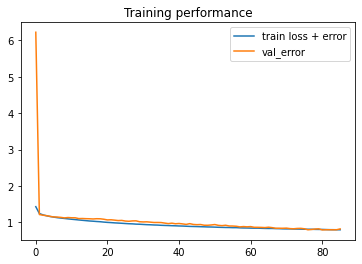

In [14]:
evaluationlib.show_loss_curves(history)

## Confusion matrix

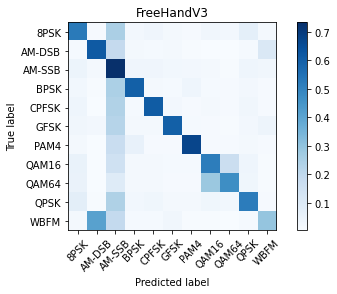

In [15]:
evaluationlib.plot_confusion_matrix(model, NEURAL_NETWORK_NAME, X_test, Y_test, BATCH_SIZE, classes)

## Confusion matrix for each SNR

Overall Accuracy:  0.08692421991084695


Overall Accuracy:  0.09759704251386321


Overall Accuracy:  0.09614704842700601


Overall Accuracy:  0.11489810260014055


Overall Accuracy:  0.13258670520231214


Overall Accuracy:  0.19727891156462585


Overall Accuracy:  0.27445360085990683


Overall Accuracy:  0.4117005813953488


Overall Accuracy:  0.5637202697905573


Overall Accuracy:  0.6998562185478073


Overall Accuracy:  0.7955700798838053


Overall Accuracy:  0.856833754056978


Overall Accuracy:  0.8489563567362429


Overall Accuracy:  0.8626865671641791


Overall Accuracy:  0.8670749279538905


Overall Accuracy:  0.8669340138534452


Overall Accuracy:  0.8600518326545724


Overall Accuracy:  0.860849943587815


Overall Accuracy:  0.8662490788504053


Overall Accuracy:  0.8655913978494624


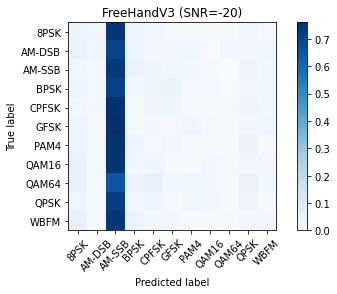

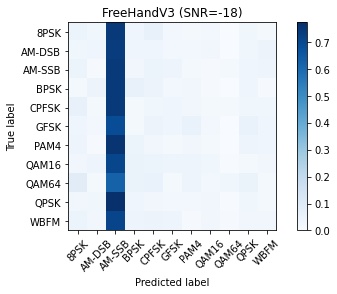

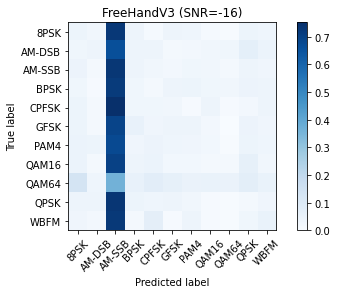

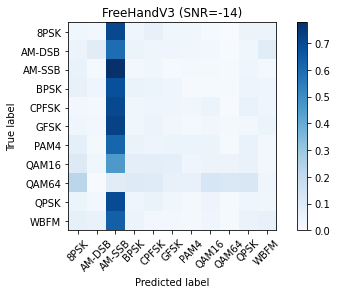

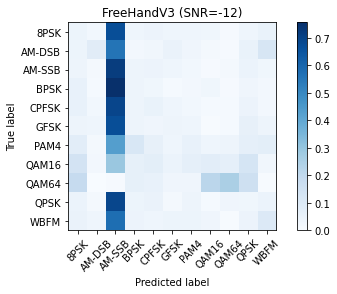

...

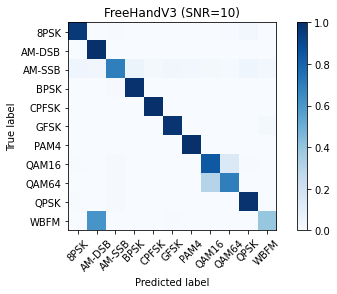

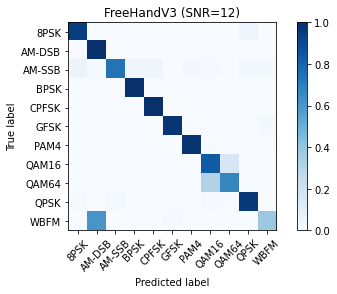

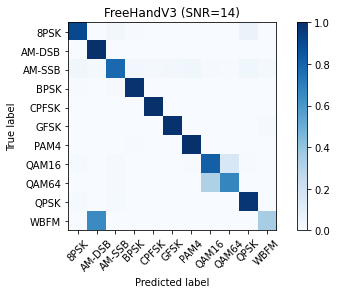

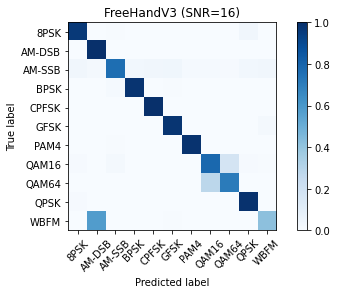

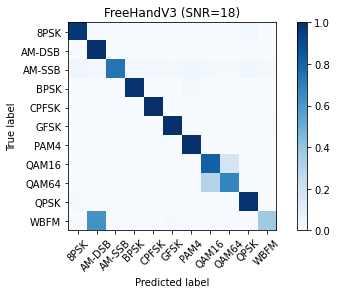

In [16]:
acc = evaluationlib.plot_confusion_matrix_each_snr(model, NEURAL_NETWORK_NAME, snrs, dataset_df, X_test, Y_test, test_index, classes)

## Accuracy performance

In [17]:
evaluationlib.accuracy_dataframe(acc)

,-20,-18,-16,-14,-12,-10,-8,-6,-4,-2,0,2,4,6,8,10,12,14,16,18
Accuracy %,8,9,9,11,13,19,27,41,56,69,79,85,84,86,86,86,86,86,86,86


In [18]:
import statistics

statistics.mean(acc.values())

0.5612980326701605

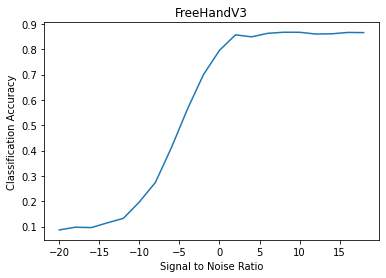

In [19]:
evaluationlib.accuracy_curve(snrs, acc, NEURAL_NETWORK_NAME)